# Description of the сompetition

It is necessary to determine the bounding box of ore contaminating objects (armature, woods, etc.) on the conveyor. This task is one of the most important in the production of Norilsk Nickel. The solution allows timely signaling to the elector about the type and size of the non-metallic object going to the mill, which helps the employee to remove the object from the conveyor before it enters the mill, thereby significantly reducing the number of mill downtime due to repairs.

# Content
[1. EDA](#section1)<br>
[2. Select and train model](#section2)<br>
&nbsp;&nbsp;&nbsp;[2.1 Convert images and bounding box’ов](#section2)<br>
&nbsp;&nbsp;&nbsp;[2.2 Trasfer learning](#section2.2)<br>
[3. Objects detection](#section3)<br>
[4. Prepare submission file](#section4)<br>

In [82]:
import pandas as pd
import numpy as np
from PIL import Image
from os import listdir
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import patches
import albumentations as A
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import os
from os import listdir
import shutil
from os.path import isfile, join

# Constants

In [83]:
ORIGINAL_HEIGHT = 421
ORIGINAL_WIDTH = 704
YOLO_INPUT = 640
path_to_images = './images/images'

# Utility functions

In [84]:
def get_code(type_name):
    if type_name=='armature':
        return 0
    elif type_name=='wood':
        return 1
    else:
        return 2

def get_label(label_code):
    if label_code==0:
        return 'armature'
    elif label_code==1:
        return 'wood'
    else:
        return 'other'
    
def show_images(img_list, bboxes, files_name):
    """
        Utility function for ploting images with bounding box
    """
    fig = plt.figure(figsize = (60,40))
    for i in range(len(img_list)):
        
        ax = fig.add_subplot(4, 4, i+1)
        image = img_list[i]
        ax.imshow(image)
        
        for i in range(len(bboxes)):
            xmin = float(bboxes[i][0])
            xmax = float(bboxes[i][2])
            ymin = float(bboxes[i][1])
            ymax = float(bboxes[i][3])
            w = xmax - xmin
            h = ymax - ymin
            label = get_label(bboxes[i][4])

            ax.add_patch(patches.Rectangle((xmin,ymin),w,h,
                         fill=False, edgecolor='blue', lw=2))
            
            ax.annotate(f'{label}',
                        (xmin + w//2, ymin + 20 ), color='blue',weight='bold',  
                        fontsize=14, ha='center', va='center')
        
        ax.set_title(f'File {files_name}')
    plt.show()

def get_bboxes(train_data, file_name):
    '''
    read bboxes for file_name from train_data dataframe
    '''
    bboxes = []
    file_info = train_data[train_data['image_name']==file_name]
    for index, row in file_info.iterrows():
        xmin = float(row['xmin'])
        xmax = float(row['xmax'])
        ymin = float(row['ymin'])
        ymax = float(row['ymax'])
        
        label = row['type']
        bboxes.append([xmin,ymin,xmax,ymax,get_code(label)])
    return bboxes

def save_bboxes_for_YOLO(bboxes, path):
    '''
    Save bounding boxes info to YOLO format txt file
    '''
    with open(path, 'w') as f:
        for line in bboxes:
            w = line[2] - line[0]
            h = line[3] - line[1]
            x_center = line[0] + w/2.
            y_center = line[1] + h/2.
            yolo_bbox = f'{line[4]} {x_center/YOLO_INPUT} {y_center/YOLO_INPUT} {w/YOLO_INPUT} {h/YOLO_INPUT}'
            f.write(yolo_bbox)
            f.write('\n')
    
    
def resize_image(img_arr, bboxes, h, w):
    """
    :param img_arr: original image as a numpy array
    :param bboxes: bboxes as numpy array where each row is 'x_min', 'y_min', 'x_max', 'y_max', "label"
    :param h: resized height dimension of image
    :param w: resized width dimension of image
    :return: dictionary containing {image:transformed, bboxes:['x_min', 'y_min', 'x_max', 'y_max', "class_id"]}
    """
    # create resize transform pipeline
    transform = A.Compose(
        [A.Resize(height=h, width=w, always_apply=True)],
        bbox_params=A.BboxParams(format='pascal_voc'))
    
    transformed = transform(image=img_arr, bboxes=bboxes)

    return transformed

def prepare_data_to_YOLO(train_data, path_to_yolo_data):
    '''
        Cook data for custom data yolo train
    '''
    # create tree of folders for YOLOv5
    path_to_yolo_data = './yolo_data/'
    # if folder exist delete it before fill new files
    if os.path.exists(path_to_yolo_data):
        shutil.rmtree(path_to_yolo_data)
    # create tree of folders
    os.mkdir(path_to_yolo_data)
    for kind in ['train','val','test']:
        os.mkdir(path_to_yolo_data + kind)
        os.mkdir(path_to_yolo_data + kind + '/images/')
        os.mkdir(path_to_yolo_data + kind + '/labels/')
    train_data = pd.read_csv('train.csv')
    train, val = train_test_split(train_data, test_size=0.1, shuffle=True, random_state=42)
    img_dir='./images/images/'
    files = [f for f in listdir(img_dir)]
    for file in tqdm(files, total=len(files), position=0, leave=True):
        filename, file_extension = os.path.splitext(file)

        if file_extension!='.jpg':
            continue

        path_to_save = '/test/'

        if file in train['image_name'].values:
            path_to_save = '/train/'
        if file in val['image_name'].values:
            path_to_save = '/val/'

        # get bboxes
        bboxes = get_bboxes(train_data, file)
        # convert image to yolov5 input size 416x416
        sample = np.asarray(Image.open(img_dir + file))
        transformed_dict = resize_image(sample, bboxes, YOLO_INPUT, YOLO_INPUT)
        # save image to yolodata
        im = Image.fromarray(transformed_dict["image"])
        im.save(path_to_yolo_data + path_to_save + 'images/' + file)
        # save bboxes to YOLO format 
        if path_to_save != '/test/':
            save_bboxes_for_YOLO(bboxes = transformed_dict["bboxes"],
                                 path = path_to_yolo_data + path_to_save + 'labels/' + filename + '.txt')

<a id='section1'></a>
# 1. EDA

In [85]:
train_dataset = pd.read_csv('train.csv')
train_dataset.head()

,Unnamed: 0,image_name,type,xmin,xmax,ymin,ymax
0,0,0007Date_01_08_2019.jpg,other,285,368,61,278
1,1,0013Date_01_08_2019.jpg,armature,187,550,101,253
2,2,0016Date_01_08_2019.jpg,armature,172,327,13,360
3,3,0019Date_01_08_2019.jpg,armature,19,267,162,237
4,4,0019Date_01_08_2019.jpg,armature,309,548,300,376


In [86]:
files = [f for f in listdir(path_to_images)]
images_train = train_dataset['image_name'].unique()
print(f'всего изображений {len(files)} из них в обучении {len(images_train)}')

всего изображений 3837 из них в обучении 2302


In [87]:
train_dataset.describe()

,Unnamed: 0,xmin,xmax,ymin,ymax
count,2541.00000,2541.000000,2541.000000,2541.000000,2541.000000
mean,1270.00000,192.623377,421.927194,101.252656,319.252263
std,733.66784,142.564916,155.507596,94.012065,89.880843
min,0.00000,0.000000,33.000000,0.000000,48.000000
25%,635.00000,102.000000,302.000000,14.000000,262.000000
50%,1270.00000,152.000000,410.000000,79.000000,341.000000
75%,1905.00000,262.000000,543.000000,167.000000,397.000000
max,2540.00000,672.000000,704.000000,394.000000,421.000000


In [88]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2541 entries, 0 to 2540
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  2541 non-null   int64 
 1   image_name  2541 non-null   object
 2   type        2541 non-null   object
 3   xmin        2541 non-null   int64 
 4   xmax        2541 non-null   int64 
 5   ymin        2541 non-null   int64 
 6   ymax        2541 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 139.1+ KB


/home/borisfox/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  import sys


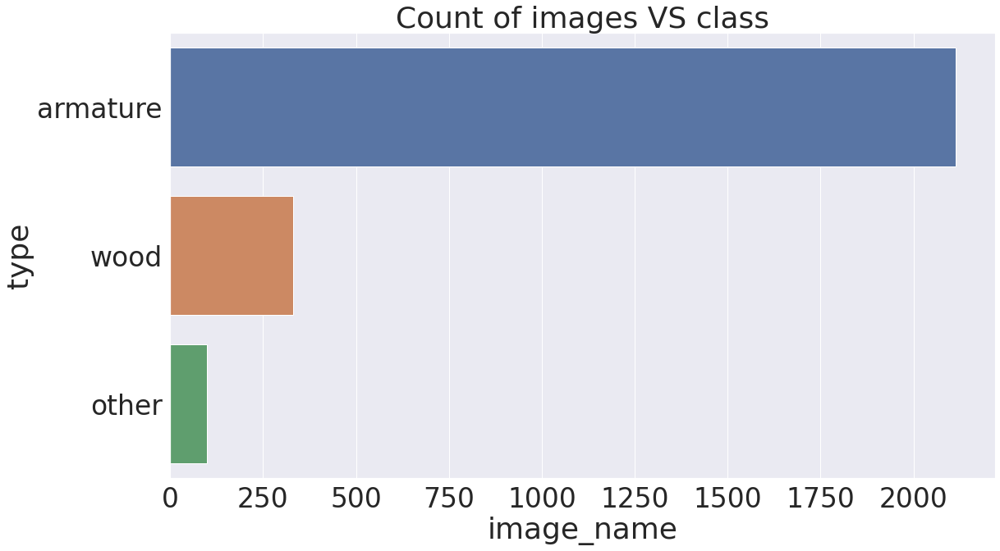

In [89]:
count_of_type = train_dataset.groupby('type')['image_name'].count().reset_index()
plt.figure(figsize=(18, 10))
sns.set(font_scale = 3)
sns.barplot(x="image_name", y="type", data=count_of_type.sort_values(by="image_name", 
                                                    ascending=False))
plt.title('Count of images VS class')
plt.show()

/home/borisfox/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  


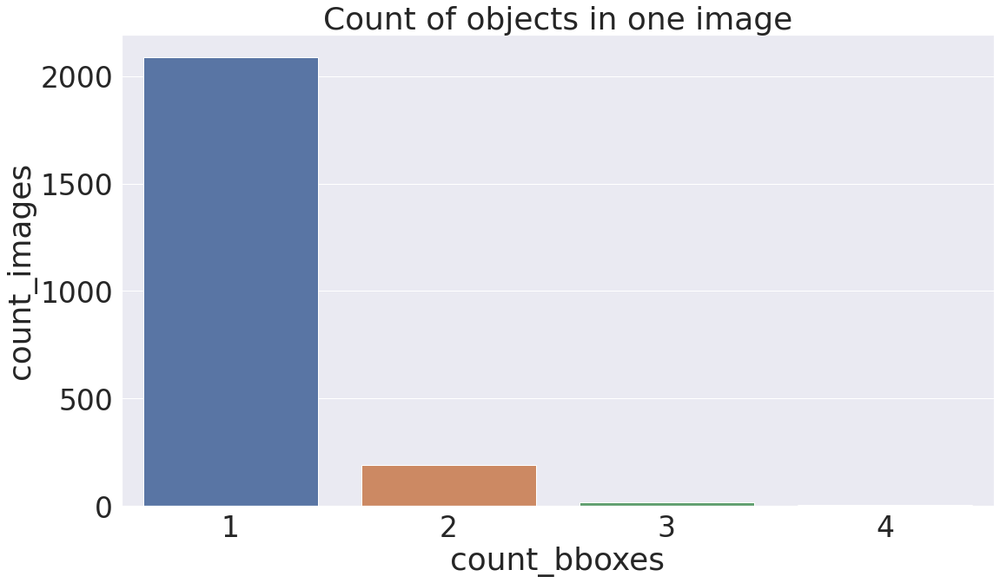

In [90]:
bboxes_per_image = train_dataset['image_name'].value_counts().reset_index()['image_name'].value_counts().reset_index()
bboxes_per_image.columns = ['count_bboxes', 'count_images']
plt.figure(figsize=(18, 10))
sns.set(font_scale = 3)
sns.barplot(y="count_images", x="count_bboxes", data=bboxes_per_image.sort_values(by="count_bboxes", 
                                                    ascending=False))
plt.title('Count of objects in one image')
plt.show()

`Conclusion:` in total, 3837 images are provided of them in training 2302, there are no null in the training dataset. The classes of detected objects in the images are unbalanced. Most of the images contain only one detected object, however, there are images with 4 detected objects at once.

<a id='section2'></a>
# 2. Select and train model

As a model for solving the problem of detecting multiple objects of different classes, choosed [YOLO v5](https://pytorch.org/hub/ultralytics_yolov5/), as the state of the art for this class of problems at the current moment. We will use the pre-trained model, [after training it on our data](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data). Because the model takes square images in multiples of 32, we first transform our data using the [albumentations library](https://albumentations.ai/).

<a id='section2.1'></a>
# 2.1 Tranform images and bounding boxes

/home/borisfox/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.


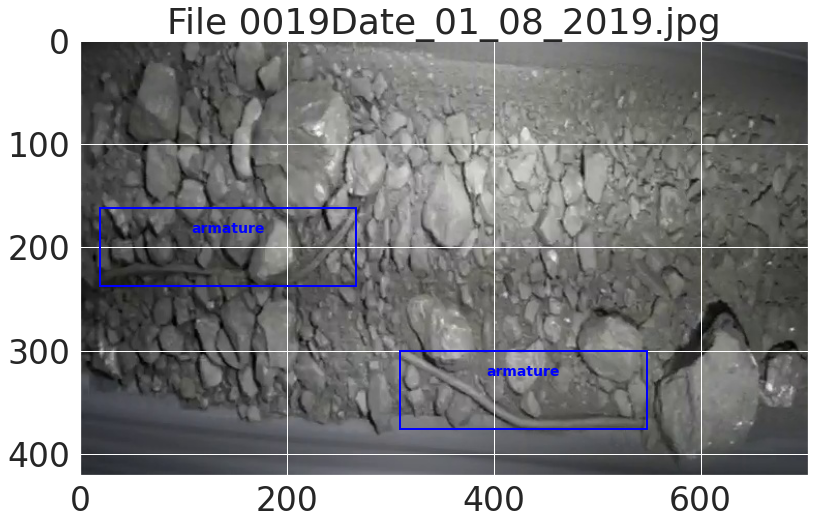

In [91]:
# let's plot original image and bounding boxes
file_name = '0019Date_01_08_2019.jpg'
path_to_image = './images/images/' + file_name
sample = np.asarray(Image.open(path_to_image))
bboxes = get_bboxes(train_dataset, file_name)
show_images([sample], bboxes, file_name)

/home/borisfox/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.


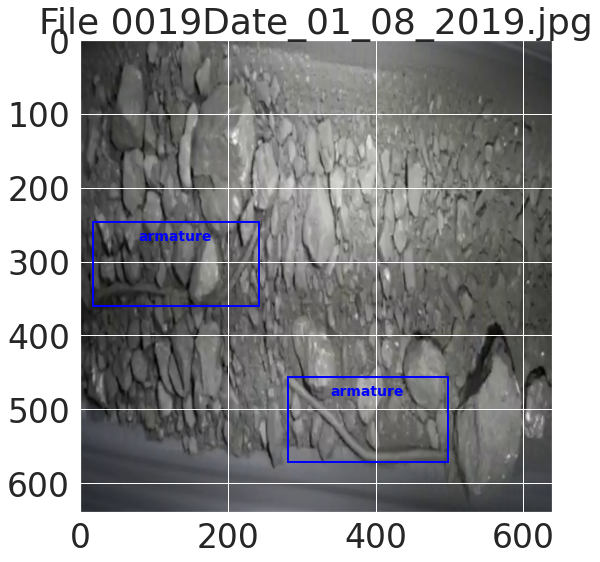

In [92]:
# transform image and bounding boxes to YOLO input size
transformed_dict = resize_image(sample, bboxes, 640, 640)
# contains the image as array
transformed_arr = transformed_dict["image"]
# contains the resized bounding boxes
transformed_info = list(map(list, transformed_dict["bboxes"]))
show_images([transformed_arr], transformed_info, file_name)

/home/borisfox/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.


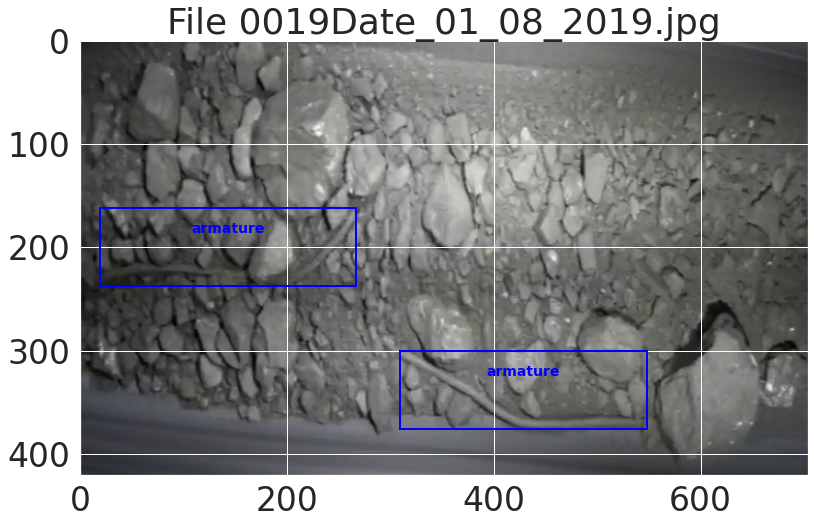

In [93]:
# reverse transform for future preparing of submission file
reverted_dict = resize_image(transformed_arr, transformed_info, ORIGINAL_HEIGHT, ORIGINAL_WIDTH)
# contains the resized image as array
reverted_arr = reverted_dict["image"]
# contains the bounding boxes
reverted_info = list(map(list, reverted_dict["bboxes"]))
show_images([reverted_arr], reverted_info, file_name)

Look's good :)

In [94]:
# do this transorm for all train data
path_to_yolo_data = './yolo_data'
prepare_data_to_YOLO(train_dataset, path_to_yolo_data)

100%|██████████| 3837/3837 [01:25<00:00, 45.05it/s]


<a id='section2.2'></a>
# 2.2 Transfer learing YOLO

YOLOv5 🚀 v5.0-321-g5d66e48 torch 1.7.1 CUDA:0 (GeForce RTX 2060 SUPER, 7981.0MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shear=0.0, perspective=0.0, flipud=0.0, fliplr=0.5, mosaic=1.0, mixup=0.0, copy_paste=0.0
TensorBoard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/


train: weights=yolov5s.pt, cfg=, data=yolo_data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=False, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
requirements: /home/borisfox/ds/nornikel/requirements.txt not found, check failed.


Overriding model.yaml nc=80 with nc=3

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Focus                     [3, 32, 3]                    
  1                -1  1     18560  models.common.Conv                      [32, 64, 3, 2]                
  2                -1  1     18816  models.common.C3                        [64, 64, 1]                   
  3                -1  1     73984  models.common.Conv                      [64, 128, 3, 2]               
  4                -1  1    156928  models.common.C3                        [128, 128, 3]                 
  5                -1  1    295424  models.common.Conv                      [128, 256, 3, 2]              
  6                -1  1    625152  models.common.C3                        [256, 256, 3]                 
  7                -1  1   1180672  models.common.Conv                      [256, 512, 3, 2]             

Plotting labels... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/train/exp9
Starting training for 100 epochs...

     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]


autoanchor: Analyzing anchors... anchors/target = 3.19, Best Possible Recall (BPR) = 0.9996



      0/99    0.923G   0.08261   0.02626   0.02834         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
      0/99    0.923G   0.08261   0.02626   0.02834         7       640:   0%|          | 1/513 [00:02<18:38,  2.18s/it]
      0/99    0.967G   0.07981    0.0248   0.02671         3       640:   0%|          | 1/513 [00:02<18:38,  2.18s/it]
      0/99    0.967G   0.07981    0.0248   0.02671         3       640:   0%|          | 2/513 [00:02<13:55,  1.64s/it]
      0/99    0.967G   0.07962   0.02561   0.02714         7       640:   0%|          | 2/513 [00:02<13:55,  1.64s/it]
      0/99    0.967G   0.07962   0.02561   0.02714         7       640:   1%|          | 3/513 [00:02<10:28,  1.23s/it]
      0/99    0.967G   0.07998   0.02536     0.027         6       640:   1%|          | 3/513 [00:03<10:28,  1.23s/it]
      0/99    0.967G   0.07998   0.02536     0.027         6       640:   1%|          | 4/513 [00:03<07:53,  1.07it/s]
      0/99    0.967G   0.08229   0.02615   0.02

      0/99    0.967G   0.09467   0.02822    0.0333         8       640:   6%|▋         | 33/513 [00:09<01:41,  4.72it/s]
      0/99    0.967G   0.09467   0.02822    0.0333         8       640:   7%|▋         | 34/513 [00:09<01:43,  4.65it/s]
      0/99    0.967G   0.09518   0.02812   0.03331         7       640:   7%|▋         | 34/513 [00:09<01:43,  4.65it/s]
      0/99    0.967G   0.09518   0.02812   0.03331         7       640:   7%|▋         | 35/513 [00:09<01:43,  4.63it/s]
      0/99    0.967G   0.09538   0.02804   0.03345         5       640:   7%|▋         | 35/513 [00:10<01:43,  4.63it/s]
      0/99    0.967G   0.09538   0.02804   0.03345         5       640:   7%|▋         | 36/513 [00:10<01:44,  4.54it/s]
      0/99    0.967G    0.0958   0.02809   0.03353        10       640:   7%|▋         | 36/513 [00:10<01:44,  4.54it/s]
      0/99    0.967G    0.0958   0.02809   0.03353        10       640:   7%|▋         | 37/513 [00:10<01:43,  4.60it/s]
      0/99    0.967G   0.09624  

      0/99    0.967G   0.09316   0.02743   0.03305         8       640:  13%|█▎        | 66/513 [00:16<01:30,  4.95it/s]
      0/99    0.967G   0.09316   0.02743   0.03305         8       640:  13%|█▎        | 67/513 [00:16<01:20,  5.52it/s]
      0/99    0.967G   0.09277   0.02737   0.03289         7       640:  13%|█▎        | 67/513 [00:16<01:20,  5.52it/s]
      0/99    0.967G   0.09277   0.02737   0.03289         7       640:  13%|█▎        | 68/513 [00:16<01:24,  5.25it/s]
      0/99    0.967G    0.0928   0.02738   0.03288        10       640:  13%|█▎        | 68/513 [00:16<01:24,  5.25it/s]
      0/99    0.967G    0.0928   0.02738   0.03288        10       640:  13%|█▎        | 69/513 [00:16<01:16,  5.80it/s]
      0/99    0.967G   0.09278   0.02738    0.0329         8       640:  13%|█▎        | 69/513 [00:16<01:16,  5.80it/s]
      0/99    0.967G   0.09278   0.02738    0.0329         8       640:  14%|█▎        | 70/513 [00:16<01:26,  5.10it/s]
      0/99    0.967G   0.09241  

      0/99    0.967G   0.08986   0.02686   0.03247        11       640:  19%|█▉        | 99/513 [00:22<01:15,  5.51it/s]
      0/99    0.967G   0.08986   0.02686   0.03247        11       640:  19%|█▉        | 100/513 [00:22<01:27,  4.74it/s]
      0/99    0.967G   0.08981   0.02682   0.03249         8       640:  19%|█▉        | 100/513 [00:22<01:27,  4.74it/s]
      0/99    0.967G   0.08981   0.02682   0.03249         8       640:  20%|█▉        | 101/513 [00:22<01:19,  5.19it/s]
      0/99    0.967G   0.08978    0.0269   0.03256        13       640:  20%|█▉        | 101/513 [00:22<01:19,  5.19it/s]
      0/99    0.967G   0.08978    0.0269   0.03256        13       640:  20%|█▉        | 102/513 [00:22<01:20,  5.11it/s]
      0/99    0.967G   0.08986   0.02687   0.03263         9       640:  20%|█▉        | 102/513 [00:22<01:20,  5.11it/s]
      0/99    0.967G   0.08986   0.02687   0.03263         9       640:  20%|██        | 103/513 [00:22<01:12,  5.62it/s]
      0/99    0.967G   0.

      0/99    0.967G   0.08791   0.02651   0.03216         6       640:  26%|██▌       | 132/513 [00:27<01:06,  5.75it/s]
      0/99    0.967G   0.08763   0.02655   0.03206        10       640:  26%|██▌       | 132/513 [00:27<01:06,  5.75it/s]
      0/99    0.967G   0.08763   0.02655   0.03206        10       640:  26%|██▌       | 133/513 [00:27<00:59,  6.40it/s]
      0/99    0.967G   0.08763   0.02655   0.03205         8       640:  26%|██▌       | 133/513 [00:28<00:59,  6.40it/s]
      0/99    0.967G   0.08763   0.02655   0.03205         8       640:  26%|██▌       | 134/513 [00:28<01:06,  5.68it/s]
      0/99    0.967G   0.08753   0.02653   0.03209         7       640:  26%|██▌       | 134/513 [00:28<01:06,  5.68it/s]
      0/99    0.967G   0.08753   0.02653   0.03209         7       640:  26%|██▋       | 135/513 [00:28<01:00,  6.24it/s]
      0/99    0.967G   0.08744   0.02654   0.03206         9       640:  26%|██▋       | 135/513 [00:28<01:00,  6.24it/s]
      0/99    0.967G   0

      0/99    0.967G   0.08584   0.02626   0.03145        13       640:  32%|███▏      | 164/513 [00:32<00:51,  6.72it/s]
      0/99    0.967G   0.08584   0.02626   0.03145        13       640:  32%|███▏      | 165/513 [00:32<00:49,  7.06it/s]
      0/99    0.967G   0.08563   0.02624   0.03136         7       640:  32%|███▏      | 165/513 [00:33<00:49,  7.06it/s]
      0/99    0.967G   0.08563   0.02624   0.03136         7       640:  32%|███▏      | 166/513 [00:33<00:53,  6.48it/s]
      0/99    0.967G   0.08543   0.02623   0.03128         8       640:  32%|███▏      | 166/513 [00:33<00:53,  6.48it/s]
      0/99    0.967G   0.08543   0.02623   0.03128         8       640:  33%|███▎      | 167/513 [00:33<00:49,  7.04it/s]
      0/99    0.967G   0.08521   0.02621    0.0312         7       640:  33%|███▎      | 167/513 [00:33<00:49,  7.04it/s]
      0/99    0.967G   0.08521   0.02621    0.0312         7       640:  33%|███▎      | 168/513 [00:33<00:45,  7.51it/s]
      0/99    0.967G   0

      0/99    0.967G   0.08299   0.02584    0.0304         7       640:  38%|███▊      | 197/513 [00:37<00:44,  7.07it/s]
      0/99    0.967G   0.08299   0.02586   0.03038        12       640:  38%|███▊      | 197/513 [00:37<00:44,  7.07it/s]
      0/99    0.967G   0.08299   0.02586   0.03038        12       640:  39%|███▊      | 198/513 [00:37<00:43,  7.32it/s]
      0/99    0.967G   0.08286   0.02584   0.03032         8       640:  39%|███▊      | 198/513 [00:37<00:43,  7.32it/s]
      0/99    0.967G   0.08286   0.02584   0.03032         8       640:  39%|███▉      | 199/513 [00:37<00:47,  6.59it/s]
      0/99    0.967G   0.08271   0.02578   0.03026         3       640:  39%|███▉      | 199/513 [00:38<00:47,  6.59it/s]
      0/99    0.967G   0.08271   0.02578   0.03026         3       640:  39%|███▉      | 200/513 [00:38<00:43,  7.19it/s]
      0/99    0.967G   0.08256   0.02576   0.03018         7       640:  39%|███▉      | 200/513 [00:38<00:43,  7.19it/s]
      0/99    0.967G   0

      0/99    0.967G   0.08165   0.02564   0.02977        10       640:  45%|████▍     | 229/513 [00:42<00:43,  6.53it/s]
      0/99    0.967G   0.08165   0.02564   0.02977        10       640:  45%|████▍     | 230/513 [00:42<00:40,  6.94it/s]
      0/99    0.967G    0.0815   0.02564    0.0297         8       640:  45%|████▍     | 230/513 [00:42<00:40,  6.94it/s]
      0/99    0.967G    0.0815   0.02564    0.0297         8       640:  45%|████▌     | 231/513 [00:42<00:38,  7.26it/s]
      0/99    0.967G    0.0814   0.02561   0.02965         5       640:  45%|████▌     | 231/513 [00:42<00:38,  7.26it/s]
      0/99    0.967G    0.0814   0.02561   0.02965         5       640:  45%|████▌     | 232/513 [00:42<00:44,  6.37it/s]
      0/99    0.967G   0.08129   0.02563   0.02961        12       640:  45%|████▌     | 232/513 [00:42<00:44,  6.37it/s]
      0/99    0.967G   0.08129   0.02563   0.02961        12       640:  45%|████▌     | 233/513 [00:42<00:39,  7.04it/s]
      0/99    0.967G   0

      0/99    0.967G    0.0799   0.02547   0.02932         9       640:  51%|█████     | 262/513 [00:47<00:34,  7.31it/s]
      0/99    0.967G   0.07992   0.02549   0.02932        12       640:  51%|█████     | 262/513 [00:47<00:34,  7.31it/s]
      0/99    0.967G   0.07992   0.02549   0.02932        12       640:  51%|█████▏    | 263/513 [00:47<00:33,  7.39it/s]
      0/99    0.967G    0.0798   0.02547   0.02928         8       640:  51%|█████▏    | 263/513 [00:47<00:33,  7.39it/s]
      0/99    0.967G    0.0798   0.02547   0.02928         8       640:  51%|█████▏    | 264/513 [00:47<00:37,  6.70it/s]
      0/99    0.967G   0.07975   0.02547   0.02924         9       640:  51%|█████▏    | 264/513 [00:47<00:37,  6.70it/s]
      0/99    0.967G   0.07975   0.02547   0.02924         9       640:  52%|█████▏    | 265/513 [00:47<00:34,  7.10it/s]
      0/99    0.967G   0.07973   0.02545   0.02927         8       640:  52%|█████▏    | 265/513 [00:47<00:34,  7.10it/s]
      0/99    0.967G   0

      0/99    0.967G   0.07808   0.02524   0.02838         8       640:  57%|█████▋    | 294/513 [00:51<00:30,  7.25it/s]
      0/99    0.967G   0.07808   0.02524   0.02838         8       640:  58%|█████▊    | 295/513 [00:51<00:29,  7.37it/s]
      0/99    0.967G   0.07808   0.02523   0.02835        10       640:  58%|█████▊    | 295/513 [00:51<00:29,  7.37it/s]
      0/99    0.967G   0.07808   0.02523   0.02835        10       640:  58%|█████▊    | 296/513 [00:51<00:33,  6.54it/s]
      0/99    0.967G   0.07809   0.02524   0.02837        11       640:  58%|█████▊    | 296/513 [00:52<00:33,  6.54it/s]
      0/99    0.967G   0.07809   0.02524   0.02837        11       640:  58%|█████▊    | 297/513 [00:52<00:31,  6.82it/s]
      0/99    0.967G   0.07809   0.02526   0.02836         9       640:  58%|█████▊    | 297/513 [00:52<00:31,  6.82it/s]
      0/99    0.967G   0.07809   0.02526   0.02836         9       640:  58%|█████▊    | 298/513 [00:52<00:30,  7.08it/s]
      0/99    0.967G    

      0/99    0.967G   0.07633   0.02502   0.02756         8       640:  64%|██████▎   | 327/513 [00:56<00:24,  7.57it/s]
      0/99    0.967G   0.07621     0.025   0.02755         7       640:  64%|██████▎   | 327/513 [00:56<00:24,  7.57it/s]
      0/99    0.967G   0.07621     0.025   0.02755         7       640:  64%|██████▍   | 328/513 [00:56<00:28,  6.53it/s]
      0/99    0.967G   0.07614   0.02501   0.02753        10       640:  64%|██████▍   | 328/513 [00:56<00:28,  6.53it/s]
      0/99    0.967G   0.07614   0.02501   0.02753        10       640:  64%|██████▍   | 329/513 [00:56<00:26,  7.01it/s]
      0/99    0.967G   0.07613   0.02499   0.02752         7       640:  64%|██████▍   | 329/513 [00:56<00:26,  7.01it/s]
      0/99    0.967G   0.07613   0.02499   0.02752         7       640:  64%|██████▍   | 330/513 [00:56<00:25,  7.15it/s]
      0/99    0.967G   0.07603   0.02497   0.02747         6       640:  64%|██████▍   | 330/513 [00:57<00:25,  7.15it/s]
      0/99    0.967G   0

      0/99    0.967G   0.07487    0.0249   0.02697         9       640:  70%|██████▉   | 359/513 [01:01<00:21,  7.29it/s]
      0/99    0.967G   0.07487    0.0249   0.02697         9       640:  70%|███████   | 360/513 [01:01<00:23,  6.47it/s]
      0/99    0.967G   0.07481    0.0249   0.02693         8       640:  70%|███████   | 360/513 [01:01<00:23,  6.47it/s]
      0/99    0.967G   0.07481    0.0249   0.02693         8       640:  70%|███████   | 361/513 [01:01<00:22,  6.74it/s]
      0/99    0.967G   0.07473    0.0249    0.0269        10       640:  70%|███████   | 361/513 [01:01<00:22,  6.74it/s]
      0/99    0.967G   0.07473    0.0249    0.0269        10       640:  71%|███████   | 362/513 [01:01<00:20,  7.23it/s]
      0/99    0.967G   0.07469   0.02489   0.02692         7       640:  71%|███████   | 362/513 [01:01<00:20,  7.23it/s]
      0/99    0.967G   0.07469   0.02489   0.02692         7       640:  71%|███████   | 363/513 [01:01<00:20,  7.49it/s]
      0/99    0.967G   0

      0/99    0.967G   0.07345   0.02475   0.02647         7       640:  76%|███████▋  | 392/513 [01:05<00:17,  7.01it/s]
      0/99    0.967G   0.07347   0.02475   0.02645         9       640:  76%|███████▋  | 392/513 [01:05<00:17,  7.01it/s]
      0/99    0.967G   0.07347   0.02475   0.02645         9       640:  77%|███████▋  | 393/513 [01:05<00:16,  7.26it/s]
      0/99    0.967G   0.07345   0.02476   0.02645         8       640:  77%|███████▋  | 393/513 [01:05<00:16,  7.26it/s]
      0/99    0.967G   0.07345   0.02476   0.02645         8       640:  77%|███████▋  | 394/513 [01:05<00:16,  7.40it/s]
      0/99    0.967G   0.07344   0.02477   0.02645        11       640:  77%|███████▋  | 394/513 [01:06<00:16,  7.40it/s]
      0/99    0.967G   0.07344   0.02477   0.02645        11       640:  77%|███████▋  | 395/513 [01:06<00:18,  6.55it/s]
      0/99    0.967G   0.07333   0.02474    0.0264         5       640:  77%|███████▋  | 395/513 [01:06<00:18,  6.55it/s]
      0/99    0.967G   0

      0/99    0.967G    0.0723   0.02471   0.02608         8       640:  83%|████████▎ | 424/513 [01:10<00:12,  7.17it/s]
      0/99    0.967G    0.0723   0.02471   0.02608         8       640:  83%|████████▎ | 425/513 [01:10<00:13,  6.45it/s]
      0/99    0.967G   0.07222    0.0247   0.02604         6       640:  83%|████████▎ | 425/513 [01:10<00:13,  6.45it/s]
      0/99    0.967G   0.07222    0.0247   0.02604         6       640:  83%|████████▎ | 426/513 [01:10<00:12,  6.98it/s]
      0/99    0.967G   0.07224    0.0247   0.02602        10       640:  83%|████████▎ | 426/513 [01:10<00:12,  6.98it/s]
      0/99    0.967G   0.07224    0.0247   0.02602        10       640:  83%|████████▎ | 427/513 [01:10<00:11,  7.22it/s]
      0/99    0.967G   0.07216    0.0247   0.02598        10       640:  83%|████████▎ | 427/513 [01:10<00:11,  7.22it/s]
      0/99    0.967G   0.07216    0.0247   0.02598        10       640:  83%|████████▎ | 428/513 [01:10<00:11,  7.50it/s]
      0/99    0.967G   0

      0/99    0.967G   0.07102   0.02446   0.02561        11       640:  89%|████████▉ | 457/513 [01:14<00:07,  7.19it/s]
      0/99    0.967G   0.07101   0.02446   0.02559        11       640:  89%|████████▉ | 457/513 [01:14<00:07,  7.19it/s]
      0/99    0.967G   0.07101   0.02446   0.02559        11       640:  89%|████████▉ | 458/513 [01:14<00:07,  7.38it/s]
      0/99    0.967G   0.07103   0.02447   0.02559        10       640:  89%|████████▉ | 458/513 [01:14<00:07,  7.38it/s]
      0/99    0.967G   0.07103   0.02447   0.02559        10       640:  89%|████████▉ | 459/513 [01:14<00:07,  7.52it/s]
      0/99    0.967G   0.07096   0.02445   0.02556         6       640:  89%|████████▉ | 459/513 [01:15<00:07,  7.52it/s]
      0/99    0.967G   0.07096   0.02445   0.02556         6       640:  90%|████████▉ | 460/513 [01:15<00:07,  6.74it/s]
      0/99    0.967G    0.0709   0.02445   0.02553         8       640:  90%|████████▉ | 460/513 [01:15<00:07,  6.74it/s]
      0/99    0.967G    

      0/99    0.967G   0.06973   0.02435   0.02494         5       640:  95%|█████████▌| 489/513 [01:19<00:03,  7.63it/s]
      0/99    0.967G   0.06973   0.02435   0.02494         5       640:  96%|█████████▌| 490/513 [01:19<00:03,  6.80it/s]
      0/99    0.967G   0.06973   0.02435   0.02492         9       640:  96%|█████████▌| 490/513 [01:19<00:03,  6.80it/s]
      0/99    0.967G   0.06973   0.02435   0.02492         9       640:  96%|█████████▌| 491/513 [01:19<00:03,  7.18it/s]
      0/99    0.967G    0.0697   0.02434   0.02494         9       640:  96%|█████████▌| 491/513 [01:19<00:03,  7.18it/s]
      0/99    0.967G    0.0697   0.02434   0.02494         9       640:  96%|█████████▌| 492/513 [01:19<00:02,  7.30it/s]
      0/99    0.967G   0.06963   0.02432    0.0249         5       640:  96%|█████████▌| 492/513 [01:19<00:02,  7.30it/s]
      0/99    0.967G   0.06963   0.02432    0.0249         5       640:  96%|█████████▌| 493/513 [01:19<00:02,  7.72it/s]
      0/99    0.967G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.50it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.59it/s]
               Class     Images     Labels      

                 all        253        294      0.743       0.13     0.0712     0.0177



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      1/99     1.13G   0.05641    0.0341   0.02509        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
      1/99     1.13G   0.05641    0.0341   0.02509        12       640:   0%|          | 1/513 [00:00<01:44,  4.90it/s]
      1/99     1.13G   0.05872   0.03215    0.0292        10       640:   0%|          | 1/513 [00:00<01:44,  4.90it/s]
      1/99     1.13G   0.05872   0.03215    0.0292        10       640:   0%|          | 2/513 [00:00<01:32,  5.53it/s]
      1/99     1.13G    0.0613   0.03123   0.02659        10       640:   0%|          | 2/513 [00:00<01:32,  5.53it/s]
      1/99     1.13G    0.0613   0.03123   0.02659        10       640:   1%|          | 3/513 [00:00<01:25,  6.00it/s]
      1/99     1.13G   0.06106   0.02969   0.02922         7       640:   1%|          | 3/513 [00:00<01:25,  6.00it/s]
      1/99     1.13G   0.06106   0.02969   0.02922     

      1/99     1.13G   0.05694   0.02282   0.02051        12       640:   6%|▋         | 33/513 [00:04<01:03,  7.57it/s]
      1/99     1.13G   0.05713    0.0234   0.02059        16       640:   6%|▋         | 33/513 [00:04<01:03,  7.57it/s]
      1/99     1.13G   0.05713    0.0234   0.02059        16       640:   7%|▋         | 34/513 [00:04<01:02,  7.63it/s]
      1/99     1.13G   0.05675   0.02313   0.02017         7       640:   7%|▋         | 34/513 [00:04<01:02,  7.63it/s]
      1/99     1.13G   0.05675   0.02313   0.02017         7       640:   7%|▋         | 35/513 [00:04<01:00,  7.84it/s]
      1/99     1.13G   0.05774   0.02288   0.02035         6       640:   7%|▋         | 35/513 [00:04<01:00,  7.84it/s]
      1/99     1.13G   0.05774   0.02288   0.02035         6       640:   7%|▋         | 36/513 [00:04<01:00,  7.84it/s]
      1/99     1.13G    0.0571   0.02272   0.02005         6       640:   7%|▋         | 36/513 [00:05<01:00,  7.84it/s]
      1/99     1.13G    0.0571  

      1/99     1.13G   0.05578   0.02182    0.0182         7       640:  13%|█▎        | 66/513 [00:09<01:04,  6.94it/s]
      1/99     1.13G   0.05571   0.02206   0.01817        13       640:  13%|█▎        | 66/513 [00:09<01:04,  6.94it/s]
      1/99     1.13G   0.05571   0.02206   0.01817        13       640:  13%|█▎        | 67/513 [00:09<01:01,  7.25it/s]
      1/99     1.13G   0.05589   0.02219   0.01814        12       640:  13%|█▎        | 67/513 [00:09<01:01,  7.25it/s]
      1/99     1.13G   0.05589   0.02219   0.01814        12       640:  13%|█▎        | 68/513 [00:09<00:59,  7.46it/s]
      1/99     1.13G   0.05565   0.02213   0.01794         8       640:  13%|█▎        | 68/513 [00:09<00:59,  7.46it/s]
      1/99     1.13G   0.05565   0.02213   0.01794         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.58it/s]
      1/99     1.13G   0.05557   0.02197   0.01774         6       640:  13%|█▎        | 69/513 [00:09<00:58,  7.58it/s]
      1/99     1.13G   0.05557  

      1/99     1.13G   0.05371   0.02216   0.01726         9       640:  19%|█▉        | 99/513 [00:14<01:02,  6.61it/s]
      1/99     1.13G   0.05382   0.02221    0.0173        11       640:  19%|█▉        | 99/513 [00:14<01:02,  6.61it/s]
      1/99     1.13G   0.05382   0.02221    0.0173        11       640:  19%|█▉        | 100/513 [00:14<01:00,  6.84it/s]
      1/99     1.13G   0.05374   0.02231   0.01722        13       640:  19%|█▉        | 100/513 [00:14<01:00,  6.84it/s]
      1/99     1.13G   0.05374   0.02231   0.01722        13       640:  20%|█▉        | 101/513 [00:14<00:59,  6.93it/s]
      1/99     1.13G   0.05355    0.0223   0.01722         8       640:  20%|█▉        | 101/513 [00:14<00:59,  6.93it/s]
      1/99     1.13G   0.05355    0.0223   0.01722         8       640:  20%|█▉        | 102/513 [00:14<00:56,  7.30it/s]
      1/99     1.13G   0.05354   0.02236   0.01732         9       640:  20%|█▉        | 102/513 [00:14<00:56,  7.30it/s]
      1/99     1.13G   0.0

      1/99     1.13G   0.05286   0.02217   0.01723        10       640:  26%|██▌       | 131/513 [00:19<00:56,  6.79it/s]
      1/99     1.13G   0.05286   0.02217   0.01723        10       640:  26%|██▌       | 132/513 [00:19<00:53,  7.07it/s]
      1/99     1.13G   0.05285   0.02221   0.01717         9       640:  26%|██▌       | 132/513 [00:19<00:53,  7.07it/s]
      1/99     1.13G   0.05285   0.02221   0.01717         9       640:  26%|██▌       | 133/513 [00:19<01:00,  6.23it/s]
      1/99     1.13G   0.05282   0.02223   0.01717         9       640:  26%|██▌       | 133/513 [00:19<01:00,  6.23it/s]
      1/99     1.13G   0.05282   0.02223   0.01717         9       640:  26%|██▌       | 134/513 [00:19<00:56,  6.71it/s]
      1/99     1.13G   0.05282   0.02218   0.01737         5       640:  26%|██▌       | 134/513 [00:19<00:56,  6.71it/s]
      1/99     1.13G   0.05282   0.02218   0.01737         5       640:  26%|██▋       | 135/513 [00:19<00:53,  7.07it/s]
      1/99     1.13G   0

      1/99     1.13G   0.05248   0.02202   0.01719         9       640:  32%|███▏      | 164/513 [00:23<00:49,  7.05it/s]
      1/99     1.13G   0.05252   0.02209   0.01727        12       640:  32%|███▏      | 164/513 [00:23<00:49,  7.05it/s]
      1/99     1.13G   0.05252   0.02209   0.01727        12       640:  32%|███▏      | 165/513 [00:23<00:48,  7.20it/s]
      1/99     1.13G   0.05253   0.02208   0.01724         8       640:  32%|███▏      | 165/513 [00:23<00:48,  7.20it/s]
      1/99     1.13G   0.05253   0.02208   0.01724         8       640:  32%|███▏      | 166/513 [00:23<00:48,  7.21it/s]
      1/99     1.13G   0.05242   0.02212   0.01719        11       640:  32%|███▏      | 166/513 [00:24<00:48,  7.21it/s]
      1/99     1.13G   0.05242   0.02212   0.01719        11       640:  33%|███▎      | 167/513 [00:24<00:46,  7.46it/s]
      1/99     1.13G   0.05252   0.02218   0.01718        13       640:  33%|███▎      | 167/513 [00:24<00:46,  7.46it/s]
      1/99     1.13G   0

      1/99     1.13G    0.0519   0.02196   0.01696         6       640:  38%|███▊      | 196/513 [00:28<00:48,  6.52it/s]
      1/99     1.13G    0.0519   0.02196   0.01696         6       640:  38%|███▊      | 197/513 [00:28<00:46,  6.86it/s]
      1/99     1.13G   0.05179   0.02192    0.0169         6       640:  38%|███▊      | 197/513 [00:28<00:46,  6.86it/s]
      1/99     1.13G   0.05179   0.02192    0.0169         6       640:  39%|███▊      | 198/513 [00:28<00:44,  7.12it/s]
      1/99     1.13G   0.05172   0.02189   0.01691         6       640:  39%|███▊      | 198/513 [00:28<00:44,  7.12it/s]
      1/99     1.13G   0.05172   0.02189   0.01691         6       640:  39%|███▉      | 199/513 [00:28<00:42,  7.37it/s]
      1/99     1.13G   0.05167   0.02192   0.01689        11       640:  39%|███▉      | 199/513 [00:28<00:42,  7.37it/s]
      1/99     1.13G   0.05167   0.02192   0.01689        11       640:  39%|███▉      | 200/513 [00:28<00:43,  7.28it/s]
      1/99     1.13G   0

      1/99     1.13G   0.05136    0.0216   0.01697        11       640:  45%|████▍     | 229/513 [00:32<00:38,  7.28it/s]
      1/99     1.13G   0.05128   0.02158   0.01695         8       640:  45%|████▍     | 229/513 [00:32<00:38,  7.28it/s]
      1/99     1.13G   0.05128   0.02158   0.01695         8       640:  45%|████▍     | 230/513 [00:32<00:36,  7.67it/s]
      1/99     1.13G   0.05128    0.0216   0.01691        10       640:  45%|████▍     | 230/513 [00:32<00:36,  7.67it/s]
      1/99     1.13G   0.05128    0.0216   0.01691        10       640:  45%|████▌     | 231/513 [00:32<00:36,  7.80it/s]
      1/99     1.13G   0.05122   0.02159   0.01685         8       640:  45%|████▌     | 231/513 [00:33<00:36,  7.80it/s]
      1/99     1.13G   0.05122   0.02159   0.01685         8       640:  45%|████▌     | 232/513 [00:33<00:35,  8.03it/s]
      1/99     1.13G   0.05117   0.02157   0.01689         7       640:  45%|████▌     | 232/513 [00:33<00:35,  8.03it/s]
      1/99     1.13G   0

      1/99     1.13G    0.0512   0.02161    0.0167         9       640:  51%|█████     | 261/513 [00:37<00:35,  7.19it/s]
      1/99     1.13G    0.0512   0.02161    0.0167         9       640:  51%|█████     | 262/513 [00:37<00:32,  7.64it/s]
      1/99     1.13G   0.05112   0.02162    0.0167         9       640:  51%|█████     | 262/513 [00:37<00:32,  7.64it/s]
      1/99     1.13G   0.05112   0.02162    0.0167         9       640:  51%|█████▏    | 263/513 [00:37<00:32,  7.76it/s]
      1/99     1.13G   0.05104   0.02161   0.01666         7       640:  51%|█████▏    | 263/513 [00:37<00:32,  7.76it/s]
      1/99     1.13G   0.05104   0.02161   0.01666         7       640:  51%|█████▏    | 264/513 [00:37<00:32,  7.76it/s]
      1/99     1.13G   0.05102   0.02167   0.01667        14       640:  51%|█████▏    | 264/513 [00:37<00:32,  7.76it/s]
      1/99     1.13G   0.05102   0.02167   0.01667        14       640:  52%|█████▏    | 265/513 [00:37<00:31,  7.84it/s]
      1/99     1.13G   0

      1/99     1.13G    0.0507   0.02156   0.01673         9       640:  57%|█████▋    | 294/513 [00:41<00:27,  7.83it/s]
      1/99     1.13G   0.05078   0.02156   0.01672        11       640:  57%|█████▋    | 294/513 [00:41<00:27,  7.83it/s]
      1/99     1.13G   0.05078   0.02156   0.01672        11       640:  58%|█████▊    | 295/513 [00:41<00:33,  6.56it/s]
      1/99     1.13G   0.05074   0.02155   0.01668         8       640:  58%|█████▊    | 295/513 [00:41<00:33,  6.56it/s]
      1/99     1.13G   0.05074   0.02155   0.01668         8       640:  58%|█████▊    | 296/513 [00:41<00:30,  7.19it/s]
      1/99     1.13G   0.05067   0.02153   0.01663         7       640:  58%|█████▊    | 296/513 [00:41<00:30,  7.19it/s]
      1/99     1.13G   0.05067   0.02153   0.01663         7       640:  58%|█████▊    | 297/513 [00:41<00:28,  7.55it/s]
      1/99     1.13G    0.0506    0.0215   0.01659         5       640:  58%|█████▊    | 297/513 [00:41<00:28,  7.55it/s]
      1/99     1.13G    

      1/99     1.13G   0.05058   0.02149   0.01673        10       640:  64%|██████▎   | 326/513 [00:45<00:23,  7.81it/s]
      1/99     1.13G   0.05058   0.02149   0.01673        10       640:  64%|██████▎   | 327/513 [00:45<00:24,  7.73it/s]
      1/99     1.13G   0.05053   0.02146   0.01669         5       640:  64%|██████▎   | 327/513 [00:45<00:24,  7.73it/s]
      1/99     1.13G   0.05053   0.02146   0.01669         5       640:  64%|██████▍   | 328/513 [00:45<00:22,  8.06it/s]
      1/99     1.13G   0.05059   0.02144   0.01667         7       640:  64%|██████▍   | 328/513 [00:45<00:22,  8.06it/s]
      1/99     1.13G   0.05059   0.02144   0.01667         7       640:  64%|██████▍   | 329/513 [00:45<00:23,  7.94it/s]
      1/99     1.13G    0.0506   0.02147   0.01665        12       640:  64%|██████▍   | 329/513 [00:46<00:23,  7.94it/s]
      1/99     1.13G    0.0506   0.02147   0.01665        12       640:  64%|██████▍   | 330/513 [00:46<00:22,  8.01it/s]
      1/99     1.13G   0

      1/99     1.13G   0.05011   0.02139   0.01651         9       640:  70%|██████▉   | 359/513 [00:50<00:22,  6.74it/s]
      1/99     1.13G   0.05011   0.02139   0.01649        11       640:  70%|██████▉   | 359/513 [00:50<00:22,  6.74it/s]
      1/99     1.13G   0.05011   0.02139   0.01649        11       640:  70%|███████   | 360/513 [00:50<00:21,  7.13it/s]
      1/99     1.13G   0.05013   0.02142    0.0165        13       640:  70%|███████   | 360/513 [00:50<00:21,  7.13it/s]
      1/99     1.13G   0.05013   0.02142    0.0165        13       640:  70%|███████   | 361/513 [00:50<00:20,  7.35it/s]
      1/99     1.13G   0.05017   0.02142    0.0165        10       640:  70%|███████   | 361/513 [00:50<00:20,  7.35it/s]
      1/99     1.13G   0.05017   0.02142    0.0165        10       640:  71%|███████   | 362/513 [00:50<00:20,  7.23it/s]
      1/99     1.13G   0.05022   0.02141    0.0165         9       640:  71%|███████   | 362/513 [00:50<00:20,  7.23it/s]
      1/99     1.13G   0

      1/99     1.13G   0.05006   0.02127   0.01619        11       640:  76%|███████▌  | 391/513 [00:54<00:15,  7.89it/s]
      1/99     1.13G   0.05006   0.02127   0.01619        11       640:  76%|███████▋  | 392/513 [00:54<00:15,  8.05it/s]
      1/99     1.13G   0.05002   0.02125   0.01617         7       640:  76%|███████▋  | 392/513 [00:54<00:15,  8.05it/s]
      1/99     1.13G   0.05002   0.02125   0.01617         7       640:  77%|███████▋  | 393/513 [00:54<00:14,  8.17it/s]
      1/99     1.13G   0.05004   0.02127   0.01619        11       640:  77%|███████▋  | 393/513 [00:54<00:14,  8.17it/s]
      1/99     1.13G   0.05004   0.02127   0.01619        11       640:  77%|███████▋  | 394/513 [00:54<00:14,  8.07it/s]
      1/99     1.13G      0.05   0.02128   0.01618        11       640:  77%|███████▋  | 394/513 [00:54<00:14,  8.07it/s]
      1/99     1.13G      0.05   0.02128   0.01618        11       640:  77%|███████▋  | 395/513 [00:54<00:14,  7.94it/s]
      1/99     1.13G   0

      1/99     1.13G   0.04981   0.02122   0.01652         5       640:  83%|████████▎ | 424/513 [00:58<00:11,  7.49it/s]
      1/99     1.13G    0.0498   0.02122   0.01653         9       640:  83%|████████▎ | 424/513 [00:58<00:11,  7.49it/s]
      1/99     1.13G    0.0498   0.02122   0.01653         9       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.57it/s]
      1/99     1.13G   0.04987   0.02122   0.01652        10       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.57it/s]
      1/99     1.13G   0.04987   0.02122   0.01652        10       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.61it/s]
      1/99     1.13G    0.0499   0.02125   0.01653        13       640:  83%|████████▎ | 426/513 [00:59<00:11,  7.61it/s]
      1/99     1.13G    0.0499   0.02125   0.01653        13       640:  83%|████████▎ | 427/513 [00:59<00:11,  7.79it/s]
      1/99     1.13G   0.04989   0.02126   0.01652        11       640:  83%|████████▎ | 427/513 [00:59<00:11,  7.79it/s]
      1/99     1.13G   0

      1/99     1.13G   0.04983   0.02117   0.01645         8       640:  89%|████████▉ | 456/513 [01:03<00:07,  7.33it/s]
      1/99     1.13G   0.04983   0.02117   0.01645         8       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.75it/s]
      1/99     1.13G   0.04981   0.02116   0.01645         9       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.75it/s]
      1/99     1.13G   0.04981   0.02116   0.01645         9       640:  89%|████████▉ | 458/513 [01:03<00:08,  6.73it/s]
      1/99     1.13G   0.04975   0.02113   0.01642         4       640:  89%|████████▉ | 458/513 [01:03<00:08,  6.73it/s]
      1/99     1.13G   0.04975   0.02113   0.01642         4       640:  89%|████████▉ | 459/513 [01:03<00:07,  7.31it/s]
      1/99     1.13G   0.04972   0.02112   0.01641         6       640:  89%|████████▉ | 459/513 [01:03<00:07,  7.31it/s]
      1/99     1.13G   0.04972   0.02112   0.01641         6       640:  90%|████████▉ | 460/513 [01:03<00:07,  7.54it/s]
      1/99     1.13G   0

      1/99     1.13G   0.04949   0.02104   0.01626         7       640:  95%|█████████▌| 489/513 [01:07<00:03,  7.62it/s]
      1/99     1.13G   0.04949   0.02102   0.01628         6       640:  95%|█████████▌| 489/513 [01:07<00:03,  7.62it/s]
      1/99     1.13G   0.04949   0.02102   0.01628         6       640:  96%|█████████▌| 490/513 [01:07<00:02,  7.72it/s]
      1/99     1.13G   0.04946   0.02101   0.01625         6       640:  96%|█████████▌| 490/513 [01:07<00:02,  7.72it/s]
      1/99     1.13G   0.04946   0.02101   0.01625         6       640:  96%|█████████▌| 491/513 [01:07<00:03,  6.74it/s]
      1/99     1.13G   0.04949   0.02101   0.01624        10       640:  96%|█████████▌| 491/513 [01:07<00:03,  6.74it/s]
      1/99     1.13G   0.04949   0.02101   0.01624        10       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.05it/s]
      1/99     1.13G   0.04949     0.021   0.01623         9       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.05it/s]
      1/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.52it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.74it/s]
               Class     Images     Labels      

                 all        253        294      0.466      0.285      0.161     0.0625



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      2/99     1.13G   0.06657   0.02439   0.01925        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
      2/99     1.13G   0.06657   0.02439   0.01925        10       640:   0%|          | 1/513 [00:00<01:08,  7.52it/s]
      2/99     1.13G   0.04618   0.01792   0.01049         6       640:   0%|          | 1/513 [00:00<01:08,  7.52it/s]
      2/99     1.13G   0.04618   0.01792   0.01049         6       640:   0%|          | 2/513 [00:00<01:07,  7.61it/s]
      2/99     1.13G   0.04627   0.01929   0.01104        10       640:   0%|          | 2/513 [00:00<01:07,  7.61it/s]
      2/99     1.13G   0.04627   0.01929   0.01104        10       640:   1%|          | 3/513 [00:00<01:08,  7.48it/s]
      2/99     1.13G   0.04293   0.01861   0.00902         8       640:   1%|          | 3/513 [00:00<01:08,  7.48it/s]
      2/99     1.13G   0.04293   0.01861   0.00902     

      2/99     1.13G   0.04941   0.01868   0.01442         6       640:   6%|▋         | 33/513 [00:04<01:13,  6.54it/s]
      2/99     1.13G   0.04896   0.01878   0.01436         9       640:   6%|▋         | 33/513 [00:04<01:13,  6.54it/s]
      2/99     1.13G   0.04896   0.01878   0.01436         9       640:   7%|▋         | 34/513 [00:04<01:07,  7.14it/s]
      2/99     1.13G   0.04925   0.01899   0.01426        12       640:   7%|▋         | 34/513 [00:04<01:07,  7.14it/s]
      2/99     1.13G   0.04925   0.01899   0.01426        12       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
      2/99     1.13G   0.04942    0.0191   0.01435         9       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
      2/99     1.13G   0.04942    0.0191   0.01435         9       640:   7%|▋         | 36/513 [00:04<01:05,  7.25it/s]
      2/99     1.13G   0.04893   0.01884   0.01443         4       640:   7%|▋         | 36/513 [00:04<01:05,  7.25it/s]
      2/99     1.13G   0.04893  

      2/99     1.13G   0.04802   0.01907    0.0141        12       640:  13%|█▎        | 66/513 [00:08<00:56,  7.93it/s]
      2/99     1.13G   0.04799   0.01898   0.01401         5       640:  13%|█▎        | 66/513 [00:08<00:56,  7.93it/s]
      2/99     1.13G   0.04799   0.01898   0.01401         5       640:  13%|█▎        | 67/513 [00:08<00:56,  7.92it/s]
      2/99     1.13G   0.04777   0.01907   0.01403        10       640:  13%|█▎        | 67/513 [00:08<00:56,  7.92it/s]
      2/99     1.13G   0.04777   0.01907   0.01403        10       640:  13%|█▎        | 68/513 [00:08<01:04,  6.94it/s]
      2/99     1.13G   0.04756   0.01901   0.01389         7       640:  13%|█▎        | 68/513 [00:09<01:04,  6.94it/s]
      2/99     1.13G   0.04756   0.01901   0.01389         7       640:  13%|█▎        | 69/513 [00:09<01:00,  7.39it/s]
      2/99     1.13G   0.04766   0.01912    0.0138        12       640:  13%|█▎        | 69/513 [00:09<01:00,  7.39it/s]
      2/99     1.13G   0.04766  

      2/99     1.13G   0.04801   0.01955   0.01334         8       640:  19%|█▉        | 99/513 [00:13<00:51,  8.02it/s]
      2/99     1.13G   0.04812   0.01973   0.01337        15       640:  19%|█▉        | 99/513 [00:13<00:51,  8.02it/s]
      2/99     1.13G   0.04812   0.01973   0.01337        15       640:  19%|█▉        | 100/513 [00:13<00:51,  7.99it/s]
      2/99     1.13G    0.0482   0.01978   0.01336        12       640:  19%|█▉        | 100/513 [00:13<00:51,  7.99it/s]
      2/99     1.13G    0.0482   0.01978   0.01336        12       640:  20%|█▉        | 101/513 [00:13<00:52,  7.90it/s]
      2/99     1.13G   0.04801   0.01982   0.01332        10       640:  20%|█▉        | 101/513 [00:13<00:52,  7.90it/s]
      2/99     1.13G   0.04801   0.01982   0.01332        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.14it/s]
      2/99     1.13G   0.04814   0.01975   0.01355         4       640:  20%|█▉        | 102/513 [00:13<00:50,  8.14it/s]
      2/99     1.13G   0.0

      2/99     1.13G   0.04761    0.0195   0.01352         8       640:  26%|██▌       | 131/513 [00:17<00:50,  7.50it/s]
      2/99     1.13G   0.04761    0.0195   0.01352         8       640:  26%|██▌       | 132/513 [00:17<00:51,  7.40it/s]
      2/99     1.13G   0.04749    0.0195   0.01345        10       640:  26%|██▌       | 132/513 [00:17<00:51,  7.40it/s]
      2/99     1.13G   0.04749    0.0195   0.01345        10       640:  26%|██▌       | 133/513 [00:17<00:49,  7.71it/s]
      2/99     1.13G   0.04746   0.01953   0.01348        10       640:  26%|██▌       | 133/513 [00:17<00:49,  7.71it/s]
      2/99     1.13G   0.04746   0.01953   0.01348        10       640:  26%|██▌       | 134/513 [00:17<00:49,  7.69it/s]
      2/99     1.13G    0.0476   0.01956   0.01354        11       640:  26%|██▌       | 134/513 [00:17<00:49,  7.69it/s]
      2/99     1.13G    0.0476   0.01956   0.01354        11       640:  26%|██▋       | 135/513 [00:17<00:48,  7.76it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04744    0.0194   0.01345        10       640:  32%|███▏      | 164/513 [00:21<00:45,  7.70it/s]
      2/99     1.13G   0.04746   0.01943   0.01345        12       640:  32%|███▏      | 164/513 [00:21<00:45,  7.70it/s]
      2/99     1.13G   0.04746   0.01943   0.01345        12       640:  32%|███▏      | 165/513 [00:21<00:51,  6.70it/s]
      2/99     1.13G   0.04753    0.0194   0.01344         7       640:  32%|███▏      | 165/513 [00:21<00:51,  6.70it/s]
      2/99     1.13G   0.04753    0.0194   0.01344         7       640:  32%|███▏      | 166/513 [00:21<00:49,  7.06it/s]
      2/99     1.13G   0.04768   0.01938   0.01348        10       640:  32%|███▏      | 166/513 [00:21<00:49,  7.06it/s]
      2/99     1.13G   0.04768   0.01938   0.01348        10       640:  33%|███▎      | 167/513 [00:21<00:48,  7.17it/s]
      2/99     1.13G   0.04761   0.01938   0.01343         9       640:  33%|███▎      | 167/513 [00:22<00:48,  7.17it/s]
      2/99     1.13G   0

      2/99     1.13G     0.048   0.01936   0.01364         5       640:  38%|███▊      | 196/513 [00:25<00:40,  7.76it/s]
      2/99     1.13G     0.048   0.01936   0.01364         5       640:  38%|███▊      | 197/513 [00:25<00:39,  8.03it/s]
      2/99     1.13G   0.04799   0.01939   0.01382        10       640:  38%|███▊      | 197/513 [00:25<00:39,  8.03it/s]
      2/99     1.13G   0.04799   0.01939   0.01382        10       640:  39%|███▊      | 198/513 [00:25<00:39,  7.94it/s]
      2/99     1.13G   0.04788   0.01941   0.01379        11       640:  39%|███▊      | 198/513 [00:26<00:39,  7.94it/s]
      2/99     1.13G   0.04788   0.01941   0.01379        11       640:  39%|███▉      | 199/513 [00:26<00:38,  8.12it/s]
      2/99     1.13G   0.04775   0.01935   0.01373         5       640:  39%|███▉      | 199/513 [00:26<00:38,  8.12it/s]
      2/99     1.13G   0.04775   0.01935   0.01373         5       640:  39%|███▉      | 200/513 [00:26<00:38,  8.23it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04763    0.0191   0.01341         7       640:  45%|████▍     | 229/513 [00:29<00:35,  7.99it/s]
      2/99     1.13G   0.04758   0.01908   0.01336         6       640:  45%|████▍     | 229/513 [00:30<00:35,  7.99it/s]
      2/99     1.13G   0.04758   0.01908   0.01336         6       640:  45%|████▍     | 230/513 [00:30<00:40,  7.01it/s]
      2/99     1.13G   0.04749   0.01905   0.01331         5       640:  45%|████▍     | 230/513 [00:30<00:40,  7.01it/s]
      2/99     1.13G   0.04749   0.01905   0.01331         5       640:  45%|████▌     | 231/513 [00:30<00:38,  7.37it/s]
      2/99     1.13G   0.04752   0.01906   0.01329         9       640:  45%|████▌     | 231/513 [00:30<00:38,  7.37it/s]
      2/99     1.13G   0.04752   0.01906   0.01329         9       640:  45%|████▌     | 232/513 [00:30<00:37,  7.54it/s]
      2/99     1.13G   0.04759   0.01905   0.01328         7       640:  45%|████▌     | 232/513 [00:30<00:37,  7.54it/s]
      2/99     1.13G   0

      2/99     1.13G    0.0477   0.01915   0.01327         9       640:  51%|█████     | 261/513 [00:34<00:32,  7.87it/s]
      2/99     1.13G    0.0477   0.01915   0.01327         9       640:  51%|█████     | 262/513 [00:34<00:32,  7.82it/s]
      2/99     1.13G   0.04771   0.01917   0.01325        10       640:  51%|█████     | 262/513 [00:34<00:32,  7.82it/s]
      2/99     1.13G   0.04771   0.01917   0.01325        10       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.80it/s]
      2/99     1.13G   0.04771   0.01917   0.01325         9       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.80it/s]
      2/99     1.13G   0.04771   0.01917   0.01325         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
      2/99     1.13G   0.04775   0.01919   0.01326        13       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
      2/99     1.13G   0.04775   0.01919   0.01326        13       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.82it/s]
      2/99     1.13G    

      2/99     1.13G   0.04759   0.01917   0.01323         8       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.22it/s]
      2/99     1.13G   0.04753   0.01917   0.01321         8       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.22it/s]
      2/99     1.13G   0.04753   0.01917   0.01321         8       640:  58%|█████▊    | 295/513 [00:38<00:25,  8.42it/s]
      2/99     1.13G   0.04748   0.01919   0.01319        10       640:  58%|█████▊    | 295/513 [00:38<00:25,  8.42it/s]
      2/99     1.13G   0.04748   0.01919   0.01319        10       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.29it/s]
      2/99     1.13G   0.04752   0.01919   0.01327         7       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.29it/s]
      2/99     1.13G   0.04752   0.01919   0.01327         7       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.97it/s]
      2/99     1.13G   0.04753   0.01921   0.01327        10       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.97it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04768   0.01932   0.01311         8       640:  64%|██████▎   | 326/513 [00:42<00:28,  6.56it/s]
      2/99     1.13G   0.04768   0.01932   0.01311         8       640:  64%|██████▎   | 327/513 [00:42<00:26,  7.10it/s]
      2/99     1.13G   0.04772   0.01934   0.01313        11       640:  64%|██████▎   | 327/513 [00:42<00:26,  7.10it/s]
      2/99     1.13G   0.04772   0.01934   0.01313        11       640:  64%|██████▍   | 328/513 [00:42<00:25,  7.30it/s]
      2/99     1.13G   0.04778   0.01934   0.01321         9       640:  64%|██████▍   | 328/513 [00:43<00:25,  7.30it/s]
      2/99     1.13G   0.04778   0.01934   0.01321         9       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.51it/s]
      2/99     1.13G    0.0478   0.01934    0.0132        10       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.51it/s]
      2/99     1.13G    0.0478   0.01934    0.0132        10       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.70it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04773   0.01941     0.013        10       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.54it/s]
      2/99     1.13G   0.04775   0.01944     0.013        13       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.54it/s]
      2/99     1.13G   0.04775   0.01944     0.013        13       640:  70%|███████   | 360/513 [00:47<00:20,  7.49it/s]
      2/99     1.13G   0.04779   0.01945   0.01299        10       640:  70%|███████   | 360/513 [00:47<00:20,  7.49it/s]
      2/99     1.13G   0.04779   0.01945   0.01299        10       640:  70%|███████   | 361/513 [00:47<00:19,  7.64it/s]
      2/99     1.13G   0.04774   0.01945   0.01299        10       640:  70%|███████   | 361/513 [00:47<00:19,  7.64it/s]
      2/99     1.13G   0.04774   0.01945   0.01299        10       640:  71%|███████   | 362/513 [00:47<00:19,  7.91it/s]
      2/99     1.13G   0.04778   0.01945   0.01304         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.91it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04781   0.01942   0.01316        12       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.73it/s]
      2/99     1.13G   0.04781   0.01942   0.01316        12       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.76it/s]
      2/99     1.13G   0.04782   0.01942   0.01323        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.76it/s]
      2/99     1.13G   0.04782   0.01942   0.01323        10       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.89it/s]
      2/99     1.13G   0.04784   0.01943   0.01324        10       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.89it/s]
      2/99     1.13G   0.04784   0.01943   0.01324        10       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.85it/s]
      2/99     1.13G   0.04781   0.01942   0.01321         6       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.85it/s]
      2/99     1.13G   0.04781   0.01942   0.01321         6       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.64it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04787   0.01947   0.01364         9       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.89it/s]
      2/99     1.13G   0.04788   0.01948   0.01364        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.89it/s]
      2/99     1.13G   0.04788   0.01948   0.01364        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.71it/s]
      2/99     1.13G   0.04787   0.01945   0.01361         5       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.71it/s]
      2/99     1.13G   0.04787   0.01945   0.01361         5       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.80it/s]
      2/99     1.13G   0.04785   0.01943    0.0136         4       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.80it/s]
      2/99     1.13G   0.04785   0.01943    0.0136         4       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.06it/s]
      2/99     1.13G   0.04788   0.01944   0.01361        11       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.06it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04757   0.01939   0.01349        11       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.76it/s]
      2/99     1.13G   0.04757   0.01939   0.01349        11       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.03it/s]
      2/99     1.13G   0.04756   0.01937   0.01347         6       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.03it/s]
      2/99     1.13G   0.04756   0.01937   0.01347         6       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.15it/s]
      2/99     1.13G   0.04757   0.01937   0.01346         8       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.15it/s]
      2/99     1.13G   0.04757   0.01937   0.01346         8       640:  89%|████████▉ | 459/513 [01:00<00:07,  6.90it/s]
      2/99     1.13G   0.04756   0.01936   0.01348         8       640:  89%|████████▉ | 459/513 [01:00<00:07,  6.90it/s]
      2/99     1.13G   0.04756   0.01936   0.01348         8       640:  90%|████████▉ | 460/513 [01:00<00:07,  7.26it/s]
      2/99     1.13G   0

      2/99     1.13G   0.04752   0.01926   0.01311         9       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.71it/s]
      2/99     1.13G   0.04754   0.01927   0.01312        10       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.71it/s]
      2/99     1.13G   0.04754   0.01927   0.01312        10       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.77it/s]
      2/99     1.13G   0.04755   0.01927   0.01312         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.77it/s]
      2/99     1.13G   0.04755   0.01927   0.01312         8       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.72it/s]
      2/99     1.13G   0.04756   0.01927   0.01313         9       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.72it/s]
      2/99     1.13G   0.04756   0.01927   0.01313         9       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.93it/s]
      2/99     1.13G   0.04756   0.01929   0.01312        12       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.93it/s]
      2/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01, 10.00it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.61it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels      

                 all        253        294      0.572      0.257      0.204     0.0674



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      3/99     1.13G   0.04087   0.03203   0.01016        14       640:   0%|          | 0/513 [00:00<?, ?it/s]
      3/99     1.13G   0.04087   0.03203   0.01016        14       640:   0%|          | 1/513 [00:00<01:11,  7.18it/s]
      3/99     1.13G     0.038    0.0291   0.00791        11       640:   0%|          | 1/513 [00:00<01:11,  7.18it/s]
      3/99     1.13G     0.038    0.0291   0.00791        11       640:   0%|          | 2/513 [00:00<01:07,  7.53it/s]
      3/99     1.13G   0.03587   0.02433  0.009006         6       640:   0%|          | 2/513 [00:00<01:07,  7.53it/s]
      3/99     1.13G   0.03587   0.02433  0.009006         6       640:   1%|          | 3/513 [00:00<01:06,  7.64it/s]
      3/99     1.13G   0.03724   0.02272  0.009659         8       640:   1%|          | 3/513 [00:00<01:06,  7.64it/s]
      3/99     1.13G   0.03724   0.02272  0.009659     

      3/99     1.13G   0.04265   0.01692   0.01053        11       640:   6%|▋         | 33/513 [00:04<01:00,  7.91it/s]
      3/99     1.13G   0.04272   0.01703   0.01056         9       640:   6%|▋         | 33/513 [00:04<01:00,  7.91it/s]
      3/99     1.13G   0.04272   0.01703   0.01056         9       640:   7%|▋         | 34/513 [00:04<00:59,  8.01it/s]
      3/99     1.13G   0.04239   0.01718    0.0106        10       640:   7%|▋         | 34/513 [00:04<00:59,  8.01it/s]
      3/99     1.13G   0.04239   0.01718    0.0106        10       640:   7%|▋         | 35/513 [00:04<00:57,  8.27it/s]
      3/99     1.13G   0.04219   0.01719    0.0111         7       640:   7%|▋         | 35/513 [00:04<00:57,  8.27it/s]
      3/99     1.13G   0.04219   0.01719    0.0111         7       640:   7%|▋         | 36/513 [00:04<00:56,  8.44it/s]
      3/99     1.13G   0.04257   0.01751   0.01096        11       640:   7%|▋         | 36/513 [00:04<00:56,  8.44it/s]
      3/99     1.13G   0.04257  

      3/99     1.13G   0.04371   0.01833   0.01096         8       640:  13%|█▎        | 66/513 [00:08<00:55,  7.98it/s]
      3/99     1.13G   0.04344   0.01826   0.01113         7       640:  13%|█▎        | 66/513 [00:08<00:55,  7.98it/s]
      3/99     1.13G   0.04344   0.01826   0.01113         7       640:  13%|█▎        | 67/513 [00:08<00:54,  8.25it/s]
      3/99     1.13G   0.04343   0.01821    0.0111         8       640:  13%|█▎        | 67/513 [00:08<00:54,  8.25it/s]
      3/99     1.13G   0.04343   0.01821    0.0111         8       640:  13%|█▎        | 68/513 [00:08<00:53,  8.38it/s]
      3/99     1.13G   0.04322   0.01812   0.01098         6       640:  13%|█▎        | 68/513 [00:08<00:53,  8.38it/s]
      3/99     1.13G   0.04322   0.01812   0.01098         6       640:  13%|█▎        | 69/513 [00:08<00:53,  8.33it/s]
      3/99     1.13G   0.04321   0.01834   0.01099        12       640:  13%|█▎        | 69/513 [00:08<00:53,  8.33it/s]
      3/99     1.13G   0.04321  

      3/99     1.13G   0.04263   0.01849   0.01175         6       640:  19%|█▉        | 99/513 [00:12<00:49,  8.38it/s]
      3/99     1.13G   0.04287   0.01859   0.01179        13       640:  19%|█▉        | 99/513 [00:12<00:49,  8.38it/s]
      3/99     1.13G   0.04287   0.01859   0.01179        13       640:  19%|█▉        | 100/513 [00:12<00:51,  8.03it/s]
      3/99     1.13G   0.04298   0.01863   0.01175         8       640:  19%|█▉        | 100/513 [00:12<00:51,  8.03it/s]
      3/99     1.13G   0.04298   0.01863   0.01175         8       640:  20%|█▉        | 101/513 [00:12<00:51,  8.03it/s]
      3/99     1.13G   0.04287   0.01861   0.01172         8       640:  20%|█▉        | 101/513 [00:12<00:51,  8.03it/s]
      3/99     1.13G   0.04287   0.01861   0.01172         8       640:  20%|█▉        | 102/513 [00:12<00:50,  8.19it/s]
      3/99     1.13G   0.04298   0.01871   0.01189        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.19it/s]
      3/99     1.13G   0.0

      3/99     1.13G   0.04329   0.01845   0.01205        10       640:  26%|██▌       | 131/513 [00:16<00:49,  7.75it/s]
      3/99     1.13G   0.04329   0.01845   0.01205        10       640:  26%|██▌       | 132/513 [00:16<00:48,  7.80it/s]
      3/99     1.13G   0.04317   0.01839   0.01203         4       640:  26%|██▌       | 132/513 [00:17<00:48,  7.80it/s]
      3/99     1.13G   0.04317   0.01839   0.01203         4       640:  26%|██▌       | 133/513 [00:17<00:48,  7.85it/s]
      3/99     1.13G   0.04326   0.01844   0.01212        12       640:  26%|██▌       | 133/513 [00:17<00:48,  7.85it/s]
      3/99     1.13G   0.04326   0.01844   0.01212        12       640:  26%|██▌       | 134/513 [00:17<00:48,  7.78it/s]
      3/99     1.13G   0.04326   0.01845   0.01229         8       640:  26%|██▌       | 134/513 [00:17<00:48,  7.78it/s]
      3/99     1.13G   0.04326   0.01845   0.01229         8       640:  26%|██▋       | 135/513 [00:17<00:47,  7.88it/s]
      3/99     1.13G    

      3/99     1.13G   0.04365   0.01856   0.01191         8       640:  32%|███▏      | 164/513 [00:21<00:45,  7.72it/s]
      3/99     1.13G    0.0436   0.01858   0.01194         8       640:  32%|███▏      | 164/513 [00:21<00:45,  7.72it/s]
      3/99     1.13G    0.0436   0.01858   0.01194         8       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
      3/99     1.13G   0.04357   0.01854   0.01189         7       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
      3/99     1.13G   0.04357   0.01854   0.01189         7       640:  32%|███▏      | 166/513 [00:21<00:43,  8.03it/s]
      3/99     1.13G   0.04347   0.01857   0.01184        11       640:  32%|███▏      | 166/513 [00:21<00:43,  8.03it/s]
      3/99     1.13G   0.04347   0.01857   0.01184        11       640:  33%|███▎      | 167/513 [00:21<00:43,  8.04it/s]
      3/99     1.13G   0.04355   0.01857   0.01181         7       640:  33%|███▎      | 167/513 [00:21<00:43,  8.04it/s]
      3/99     1.13G   0

      3/99     1.13G     0.044   0.01867   0.01184        12       640:  38%|███▊      | 196/513 [00:25<00:39,  8.01it/s]
      3/99     1.13G     0.044   0.01867   0.01184        12       640:  38%|███▊      | 197/513 [00:25<00:39,  7.94it/s]
      3/99     1.13G   0.04393   0.01862   0.01181         4       640:  38%|███▊      | 197/513 [00:25<00:39,  7.94it/s]
      3/99     1.13G   0.04393   0.01862   0.01181         4       640:  39%|███▊      | 198/513 [00:25<00:38,  8.25it/s]
      3/99     1.13G   0.04396   0.01863   0.01189         9       640:  39%|███▊      | 198/513 [00:25<00:38,  8.25it/s]
      3/99     1.13G   0.04396   0.01863   0.01189         9       640:  39%|███▉      | 199/513 [00:25<00:38,  8.10it/s]
      3/99     1.13G   0.04408   0.01861   0.01194         9       640:  39%|███▉      | 199/513 [00:25<00:38,  8.10it/s]
      3/99     1.13G   0.04408   0.01861   0.01194         9       640:  39%|███▉      | 200/513 [00:25<00:40,  7.73it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04419   0.01865   0.01225        11       640:  45%|████▍     | 229/513 [00:29<00:35,  8.05it/s]
      3/99     1.13G   0.04411   0.01862   0.01222         6       640:  45%|████▍     | 229/513 [00:29<00:35,  8.05it/s]
      3/99     1.13G   0.04411   0.01862   0.01222         6       640:  45%|████▍     | 230/513 [00:29<00:35,  7.95it/s]
      3/99     1.13G   0.04407   0.01862    0.0122        10       640:  45%|████▍     | 230/513 [00:29<00:35,  7.95it/s]
      3/99     1.13G   0.04407   0.01862    0.0122        10       640:  45%|████▌     | 231/513 [00:29<00:36,  7.83it/s]
      3/99     1.13G   0.04412   0.01864   0.01222        10       640:  45%|████▌     | 231/513 [00:29<00:36,  7.83it/s]
      3/99     1.13G   0.04412   0.01864   0.01222        10       640:  45%|████▌     | 232/513 [00:29<00:35,  7.95it/s]
      3/99     1.13G   0.04412   0.01863   0.01226         8       640:  45%|████▌     | 232/513 [00:29<00:35,  7.95it/s]
      3/99     1.13G   0

      3/99     1.13G    0.0443   0.01861    0.0127        13       640:  51%|█████     | 261/513 [00:33<00:31,  8.05it/s]
      3/99     1.13G    0.0443   0.01861    0.0127        13       640:  51%|█████     | 262/513 [00:33<00:31,  8.02it/s]
      3/99     1.13G   0.04425   0.01863   0.01271         8       640:  51%|█████     | 262/513 [00:33<00:31,  8.02it/s]
      3/99     1.13G   0.04425   0.01863   0.01271         8       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.23it/s]
      3/99     1.13G   0.04425   0.01865   0.01275         9       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.23it/s]
      3/99     1.13G   0.04425   0.01865   0.01275         9       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.26it/s]
      3/99     1.13G   0.04431   0.01864   0.01292         6       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.26it/s]
      3/99     1.13G   0.04431   0.01864   0.01292         6       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.08it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04393   0.01886   0.01295        13       640:  57%|█████▋    | 294/513 [00:37<00:27,  8.09it/s]
      3/99     1.13G   0.04398   0.01888   0.01296        13       640:  57%|█████▋    | 294/513 [00:37<00:27,  8.09it/s]
      3/99     1.13G   0.04398   0.01888   0.01296        13       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.15it/s]
      3/99     1.13G   0.04393   0.01888   0.01295         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.15it/s]
      3/99     1.13G   0.04393   0.01888   0.01295         8       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.18it/s]
      3/99     1.13G   0.04388   0.01885   0.01294         6       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.18it/s]
      3/99     1.13G   0.04388   0.01885   0.01294         6       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.03it/s]
      3/99     1.13G   0.04392   0.01888   0.01294        11       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.03it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04391   0.01891   0.01278        10       640:  64%|██████▎   | 326/513 [00:42<00:23,  8.10it/s]
      3/99     1.13G   0.04391   0.01891   0.01278        10       640:  64%|██████▎   | 327/513 [00:42<00:23,  8.00it/s]
      3/99     1.13G   0.04386    0.0189   0.01278         6       640:  64%|██████▎   | 327/513 [00:42<00:23,  8.00it/s]
      3/99     1.13G   0.04386    0.0189   0.01278         6       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.18it/s]
      3/99     1.13G   0.04391   0.01893    0.0128        10       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.18it/s]
      3/99     1.13G   0.04391   0.01893    0.0128        10       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.10it/s]
      3/99     1.13G   0.04386    0.0189   0.01277         4       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.10it/s]
      3/99     1.13G   0.04386    0.0189   0.01277         4       640:  64%|██████▍   | 330/513 [00:42<00:26,  6.99it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04382   0.01885   0.01272        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.96it/s]
      3/99     1.13G   0.04379   0.01884   0.01272         7       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.96it/s]
      3/99     1.13G   0.04379   0.01884   0.01272         7       640:  70%|███████   | 360/513 [00:46<00:18,  8.21it/s]
      3/99     1.13G   0.04382   0.01884   0.01272         7       640:  70%|███████   | 360/513 [00:46<00:18,  8.21it/s]
      3/99     1.13G   0.04382   0.01884   0.01272         7       640:  70%|███████   | 361/513 [00:46<00:19,  7.91it/s]
      3/99     1.13G   0.04378   0.01882   0.01271         7       640:  70%|███████   | 361/513 [00:46<00:19,  7.91it/s]
      3/99     1.13G   0.04378   0.01882   0.01271         7       640:  71%|███████   | 362/513 [00:46<00:22,  6.76it/s]
      3/99     1.13G   0.04379   0.01882   0.01269        10       640:  71%|███████   | 362/513 [00:46<00:22,  6.76it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04431   0.01884   0.01283        11       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.96it/s]
      3/99     1.13G   0.04431   0.01884   0.01283        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.92it/s]
      3/99     1.13G   0.04427   0.01884   0.01281         7       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.92it/s]
      3/99     1.13G   0.04427   0.01884   0.01281         7       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.11it/s]
      3/99     1.13G   0.04429   0.01886   0.01286        11       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.11it/s]
      3/99     1.13G   0.04429   0.01886   0.01286        11       640:  77%|███████▋  | 394/513 [00:50<00:17,  6.78it/s]
      3/99     1.13G   0.04428   0.01887   0.01295         9       640:  77%|███████▋  | 394/513 [00:50<00:17,  6.78it/s]
      3/99     1.13G   0.04428   0.01887   0.01295         9       640:  77%|███████▋  | 395/513 [00:50<00:16,  7.18it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04393   0.01889   0.01311         9       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.83it/s]
      3/99     1.13G   0.04389   0.01888    0.0131         7       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.83it/s]
      3/99     1.13G   0.04389   0.01888    0.0131         7       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.02it/s]
      3/99     1.13G   0.04391   0.01892   0.01312        16       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.02it/s]
      3/99     1.13G   0.04391   0.01892   0.01312        16       640:  83%|████████▎ | 426/513 [00:54<00:12,  6.80it/s]
      3/99     1.13G   0.04394   0.01896   0.01315        16       640:  83%|████████▎ | 426/513 [00:55<00:12,  6.80it/s]
      3/99     1.13G   0.04394   0.01896   0.01315        16       640:  83%|████████▎ | 427/513 [00:55<00:12,  7.14it/s]
      3/99     1.13G   0.04396   0.01897   0.01314        12       640:  83%|████████▎ | 427/513 [00:55<00:12,  7.14it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04384   0.01897   0.01322        11       640:  89%|████████▉ | 456/513 [00:58<00:07,  8.06it/s]
      3/99     1.13G   0.04384   0.01897   0.01322        11       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.06it/s]
      3/99     1.13G   0.04381   0.01898    0.0132        10       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.06it/s]
      3/99     1.13G   0.04381   0.01898    0.0132        10       640:  89%|████████▉ | 458/513 [00:59<00:08,  6.53it/s]
      3/99     1.13G   0.04379   0.01896   0.01317         5       640:  89%|████████▉ | 458/513 [00:59<00:08,  6.53it/s]
      3/99     1.13G   0.04379   0.01896   0.01317         5       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.11it/s]
      3/99     1.13G   0.04377   0.01897   0.01318        10       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.11it/s]
      3/99     1.13G   0.04377   0.01897   0.01318        10       640:  90%|████████▉ | 460/513 [00:59<00:07,  7.52it/s]
      3/99     1.13G   0

      3/99     1.13G   0.04376     0.019   0.01309         5       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.38it/s]
      3/99     1.13G   0.04376   0.01903   0.01311        13       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.38it/s]
      3/99     1.13G   0.04376   0.01903   0.01311        13       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.05it/s]
      3/99     1.13G   0.04374   0.01901   0.01309         6       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.05it/s]
      3/99     1.13G   0.04374   0.01901   0.01309         6       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.54it/s]
      3/99     1.13G   0.04379   0.01901   0.01308        10       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.54it/s]
      3/99     1.13G   0.04379   0.01901   0.01308        10       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.63it/s]
      3/99     1.13G   0.04381   0.01902   0.01309        11       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.63it/s]
      3/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  8.90it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  8.89it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.04it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.45it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.49it/s]
               Class     Images     Labels      

                 all        253        294      0.548      0.292      0.213     0.0772



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      4/99     1.13G   0.02179  0.009817  0.006248         4       640:   0%|          | 0/513 [00:00<?, ?it/s]
      4/99     1.13G   0.02179  0.009817  0.006248         4       640:   0%|          | 1/513 [00:00<01:04,  8.00it/s]
      4/99     1.13G   0.02537    0.0131  0.008734         8       640:   0%|          | 1/513 [00:00<01:04,  8.00it/s]
      4/99     1.13G   0.02537    0.0131  0.008734         8       640:   0%|          | 2/513 [00:00<01:03,  7.99it/s]
      4/99     1.13G   0.02646   0.01521  0.006927         8       640:   0%|          | 2/513 [00:00<01:03,  7.99it/s]
      4/99     1.13G   0.02646   0.01521  0.006927         8       640:   1%|          | 3/513 [00:00<01:04,  7.94it/s]
      4/99     1.13G   0.03093   0.01644   0.00796        11       640:   1%|          | 3/513 [00:00<01:04,  7.94it/s]
      4/99     1.13G   0.03093   0.01644   0.00796     

      4/99     1.13G   0.03702   0.01849  0.009968         9       640:   6%|▋         | 33/513 [00:04<01:00,  7.94it/s]
      4/99     1.13G   0.03678   0.01834    0.0102         6       640:   6%|▋         | 33/513 [00:04<01:00,  7.94it/s]
      4/99     1.13G   0.03678   0.01834    0.0102         6       640:   7%|▋         | 34/513 [00:04<01:00,  7.97it/s]
      4/99     1.13G    0.0369    0.0182   0.01013         5       640:   7%|▋         | 34/513 [00:04<01:00,  7.97it/s]
      4/99     1.13G    0.0369    0.0182   0.01013         5       640:   7%|▋         | 35/513 [00:04<01:00,  7.86it/s]
      4/99     1.13G    0.0371   0.01815   0.01011         9       640:   7%|▋         | 35/513 [00:04<01:00,  7.86it/s]
      4/99     1.13G    0.0371   0.01815   0.01011         9       640:   7%|▋         | 36/513 [00:04<01:02,  7.60it/s]
      4/99     1.13G   0.03685   0.01796  0.009953         6       640:   7%|▋         | 36/513 [00:04<01:02,  7.60it/s]
      4/99     1.13G   0.03685  

      4/99     1.13G   0.03885    0.0182   0.01133        12       640:  13%|█▎        | 66/513 [00:08<00:55,  8.09it/s]
      4/99     1.13G   0.03868    0.0181   0.01135         5       640:  13%|█▎        | 66/513 [00:08<00:55,  8.09it/s]
      4/99     1.13G   0.03868    0.0181   0.01135         5       640:  13%|█▎        | 67/513 [00:08<00:55,  7.99it/s]
      4/99     1.13G   0.03897   0.01819   0.01175        10       640:  13%|█▎        | 67/513 [00:08<00:55,  7.99it/s]
      4/99     1.13G   0.03897   0.01819   0.01175        10       640:  13%|█▎        | 68/513 [00:08<00:55,  8.03it/s]
      4/99     1.13G   0.03939   0.01841   0.01194        14       640:  13%|█▎        | 68/513 [00:08<00:55,  8.03it/s]
      4/99     1.13G   0.03939   0.01841   0.01194        14       640:  13%|█▎        | 69/513 [00:08<00:55,  7.98it/s]
      4/99     1.13G   0.03951   0.01838   0.01192         7       640:  13%|█▎        | 69/513 [00:09<00:55,  7.98it/s]
      4/99     1.13G   0.03951  

      4/99     1.13G   0.04032   0.01885   0.01164        10       640:  19%|█▉        | 99/513 [00:12<00:52,  7.92it/s]
      4/99     1.13G   0.04032   0.01885   0.01164        10       640:  19%|█▉        | 100/513 [00:12<00:52,  7.84it/s]
      4/99     1.13G   0.04033   0.01889   0.01159        12       640:  19%|█▉        | 100/513 [00:13<00:52,  7.84it/s]
      4/99     1.13G   0.04033   0.01889   0.01159        12       640:  20%|█▉        | 101/513 [00:13<00:51,  7.94it/s]
      4/99     1.13G   0.04045   0.01896   0.01161        12       640:  20%|█▉        | 101/513 [00:13<00:51,  7.94it/s]
      4/99     1.13G   0.04045   0.01896   0.01161        12       640:  20%|█▉        | 102/513 [00:13<00:51,  8.03it/s]
      4/99     1.13G   0.04051   0.01896   0.01158         8       640:  20%|█▉        | 102/513 [00:13<00:51,  8.03it/s]
      4/99     1.13G   0.04051   0.01896   0.01158         8       640:  20%|██        | 103/513 [00:13<00:52,  7.85it/s]
      4/99     1.13G   0.

      4/99     1.13G   0.04063     0.019   0.01114         3       640:  26%|██▌       | 132/513 [00:17<00:46,  8.15it/s]
      4/99     1.13G   0.04054   0.01894   0.01108         4       640:  26%|██▌       | 132/513 [00:17<00:46,  8.15it/s]
      4/99     1.13G   0.04054   0.01894   0.01108         4       640:  26%|██▌       | 133/513 [00:17<00:46,  8.11it/s]
      4/99     1.13G   0.04049     0.019   0.01137        12       640:  26%|██▌       | 133/513 [00:17<00:46,  8.11it/s]
      4/99     1.13G   0.04049     0.019   0.01137        12       640:  26%|██▌       | 134/513 [00:17<00:47,  7.91it/s]
      4/99     1.13G   0.04057   0.01898   0.01146         7       640:  26%|██▌       | 134/513 [00:17<00:47,  7.91it/s]
      4/99     1.13G   0.04057   0.01898   0.01146         7       640:  26%|██▋       | 135/513 [00:17<00:47,  7.88it/s]
      4/99     1.13G   0.04043   0.01891    0.0114         5       640:  26%|██▋       | 135/513 [00:17<00:47,  7.88it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04066    0.0187   0.01171         4       640:  32%|███▏      | 164/513 [00:21<00:43,  8.06it/s]
      4/99     1.13G   0.04066    0.0187   0.01171         4       640:  32%|███▏      | 165/513 [00:21<00:41,  8.31it/s]
      4/99     1.13G   0.04068   0.01868   0.01167         9       640:  32%|███▏      | 165/513 [00:21<00:41,  8.31it/s]
      4/99     1.13G   0.04068   0.01868   0.01167         9       640:  32%|███▏      | 166/513 [00:21<00:42,  8.24it/s]
      4/99     1.13G   0.04059   0.01866   0.01163         7       640:  32%|███▏      | 166/513 [00:21<00:42,  8.24it/s]
      4/99     1.13G   0.04059   0.01866   0.01163         7       640:  33%|███▎      | 167/513 [00:21<00:41,  8.40it/s]
      4/99     1.13G   0.04063   0.01864   0.01162         7       640:  33%|███▎      | 167/513 [00:21<00:41,  8.40it/s]
      4/99     1.13G   0.04063   0.01864   0.01162         7       640:  33%|███▎      | 168/513 [00:21<00:42,  8.12it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04082   0.01881   0.01172        13       640:  38%|███▊      | 197/513 [00:25<00:40,  7.86it/s]
      4/99     1.13G   0.04086   0.01882   0.01171         9       640:  38%|███▊      | 197/513 [00:25<00:40,  7.86it/s]
      4/99     1.13G   0.04086   0.01882   0.01171         9       640:  39%|███▊      | 198/513 [00:25<00:39,  7.96it/s]
      4/99     1.13G    0.0409   0.01883   0.01166         7       640:  39%|███▊      | 198/513 [00:25<00:39,  7.96it/s]
      4/99     1.13G    0.0409   0.01883   0.01166         7       640:  39%|███▉      | 199/513 [00:25<00:39,  7.94it/s]
      4/99     1.13G   0.04098   0.01884   0.01172         8       640:  39%|███▉      | 199/513 [00:25<00:39,  7.94it/s]
      4/99     1.13G   0.04098   0.01884   0.01172         8       640:  39%|███▉      | 200/513 [00:25<00:40,  7.70it/s]
      4/99     1.13G   0.04104   0.01882    0.0117         8       640:  39%|███▉      | 200/513 [00:26<00:40,  7.70it/s]
      4/99     1.13G   0

      4/99     1.13G    0.0412   0.01885   0.01176         8       640:  45%|████▍     | 229/513 [00:29<00:37,  7.48it/s]
      4/99     1.13G    0.0412   0.01885   0.01176         8       640:  45%|████▍     | 230/513 [00:29<00:37,  7.58it/s]
      4/99     1.13G   0.04119   0.01884   0.01174         7       640:  45%|████▍     | 230/513 [00:29<00:37,  7.58it/s]
      4/99     1.13G   0.04119   0.01884   0.01174         7       640:  45%|████▌     | 231/513 [00:29<00:36,  7.63it/s]
      4/99     1.13G   0.04113   0.01883    0.0117         7       640:  45%|████▌     | 231/513 [00:30<00:36,  7.63it/s]
      4/99     1.13G   0.04113   0.01883    0.0117         7       640:  45%|████▌     | 232/513 [00:30<00:35,  8.02it/s]
      4/99     1.13G   0.04119   0.01887   0.01169        12       640:  45%|████▌     | 232/513 [00:30<00:35,  8.02it/s]
      4/99     1.13G   0.04119   0.01887   0.01169        12       640:  45%|████▌     | 233/513 [00:30<00:43,  6.49it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04114   0.01886   0.01151         7       640:  51%|█████     | 262/513 [00:33<00:30,  8.16it/s]
      4/99     1.13G   0.04119   0.01888   0.01151        12       640:  51%|█████     | 262/513 [00:34<00:30,  8.16it/s]
      4/99     1.13G   0.04119   0.01888   0.01151        12       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.93it/s]
      4/99     1.13G   0.04116   0.01888   0.01148         8       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.93it/s]
      4/99     1.13G   0.04116   0.01888   0.01148         8       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.95it/s]
      4/99     1.13G    0.0411   0.01888   0.01146        10       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.95it/s]
      4/99     1.13G    0.0411   0.01888   0.01146        10       640:  52%|█████▏    | 265/513 [00:34<00:37,  6.57it/s]
      4/99     1.13G   0.04107   0.01886   0.01144         7       640:  52%|█████▏    | 265/513 [00:34<00:37,  6.57it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04104   0.01902    0.0118         9       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.86it/s]
      4/99     1.13G   0.04104   0.01902    0.0118         9       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.97it/s]
      4/99     1.13G   0.04102   0.01902   0.01179        10       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.97it/s]
      4/99     1.13G   0.04102   0.01902   0.01179        10       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.18it/s]
      4/99     1.13G   0.04105     0.019   0.01181         6       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.18it/s]
      4/99     1.13G   0.04105     0.019   0.01181         6       640:  58%|█████▊    | 297/513 [00:38<00:31,  6.87it/s]
      4/99     1.13G   0.04101   0.01898    0.0118         6       640:  58%|█████▊    | 297/513 [00:38<00:31,  6.87it/s]
      4/99     1.13G   0.04101   0.01898    0.0118         6       640:  58%|█████▊    | 298/513 [00:38<00:29,  7.37it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04074   0.01886   0.01151        11       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.16it/s]
      4/99     1.13G   0.04075   0.01887   0.01149         9       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.16it/s]
      4/99     1.13G   0.04075   0.01887   0.01149         9       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.91it/s]
      4/99     1.13G   0.04074   0.01887   0.01146        10       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.91it/s]
      4/99     1.13G   0.04074   0.01887   0.01146        10       640:  64%|██████▍   | 329/513 [00:42<00:27,  6.72it/s]
      4/99     1.13G   0.04077   0.01885   0.01148         5       640:  64%|██████▍   | 329/513 [00:42<00:27,  6.72it/s]
      4/99     1.13G   0.04077   0.01885   0.01148         5       640:  64%|██████▍   | 330/513 [00:42<00:25,  7.12it/s]
      4/99     1.13G   0.04077   0.01885   0.01154        11       640:  64%|██████▍   | 330/513 [00:42<00:25,  7.12it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04076   0.01883   0.01149         5       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.85it/s]
      4/99     1.13G   0.04076   0.01883   0.01149         5       640:  70%|███████   | 360/513 [00:46<00:19,  8.00it/s]
      4/99     1.13G   0.04074   0.01882   0.01147         8       640:  70%|███████   | 360/513 [00:46<00:19,  8.00it/s]
      4/99     1.13G   0.04074   0.01882   0.01147         8       640:  70%|███████   | 361/513 [00:46<00:22,  6.79it/s]
      4/99     1.13G   0.04077   0.01885   0.01152        13       640:  70%|███████   | 361/513 [00:46<00:22,  6.79it/s]
      4/99     1.13G   0.04077   0.01885   0.01152        13       640:  71%|███████   | 362/513 [00:46<00:21,  7.16it/s]
      4/99     1.13G   0.04081   0.01886   0.01152        13       640:  71%|███████   | 362/513 [00:47<00:21,  7.16it/s]
      4/99     1.13G   0.04081   0.01886   0.01152        13       640:  71%|███████   | 363/513 [00:47<00:20,  7.45it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04082   0.01906   0.01143        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.81it/s]
      4/99     1.13G   0.04079   0.01906    0.0114        10       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.81it/s]
      4/99     1.13G   0.04079   0.01906    0.0114        10       640:  77%|███████▋  | 393/513 [00:50<00:18,  6.50it/s]
      4/99     1.13G   0.04081   0.01908    0.0114        12       640:  77%|███████▋  | 393/513 [00:51<00:18,  6.50it/s]
      4/99     1.13G   0.04081   0.01908    0.0114        12       640:  77%|███████▋  | 394/513 [00:51<00:17,  6.93it/s]
      4/99     1.13G   0.04077   0.01909   0.01139         9       640:  77%|███████▋  | 394/513 [00:51<00:17,  6.93it/s]
      4/99     1.13G   0.04077   0.01909   0.01139         9       640:  77%|███████▋  | 395/513 [00:51<00:16,  7.30it/s]
      4/99     1.13G   0.04076   0.01909   0.01151         8       640:  77%|███████▋  | 395/513 [00:51<00:16,  7.30it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04111   0.01917    0.0116        12       640:  83%|████████▎ | 424/513 [00:55<00:10,  8.32it/s]
      4/99     1.13G   0.04111   0.01917    0.0116        12       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.64it/s]
      4/99     1.13G   0.04108   0.01917    0.0116        11       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.64it/s]
      4/99     1.13G   0.04108   0.01917    0.0116        11       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.14it/s]
      4/99     1.13G   0.04116   0.01917   0.01166         7       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.14it/s]
      4/99     1.13G   0.04116   0.01917   0.01166         7       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.37it/s]
      4/99     1.13G   0.04117   0.01917   0.01165         8       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.37it/s]
      4/99     1.13G   0.04117   0.01917   0.01165         8       640:  83%|████████▎ | 428/513 [00:55<00:11,  7.41it/s]
      4/99     1.13G    

      4/99     1.13G   0.04096     0.019   0.01146         6       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.88it/s]
      4/99     1.13G   0.04092   0.01901   0.01144        10       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.88it/s]
      4/99     1.13G   0.04092   0.01901   0.01144        10       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.31it/s]
      4/99     1.13G   0.04089   0.01902   0.01142        10       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.31it/s]
      4/99     1.13G   0.04089   0.01902   0.01142        10       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.78it/s]
      4/99     1.13G   0.04087   0.01901   0.01141         6       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.78it/s]
      4/99     1.13G   0.04087   0.01901   0.01141         6       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.71it/s]
      4/99     1.13G   0.04084   0.01902   0.01142         9       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.71it/s]
      4/99     1.13G   0

      4/99     1.13G   0.04078   0.01907   0.01144         7       640:  95%|█████████▌| 489/513 [01:03<00:03,  6.32it/s]
      4/99     1.13G   0.04078   0.01907   0.01144         7       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.71it/s]
      4/99     1.13G   0.04079   0.01908   0.01143         9       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.71it/s]
      4/99     1.13G   0.04079   0.01908   0.01143         9       640:  96%|█████████▌| 491/513 [01:03<00:03,  6.97it/s]
      4/99     1.13G   0.04081   0.01908   0.01143         9       640:  96%|█████████▌| 491/513 [01:03<00:03,  6.97it/s]
      4/99     1.13G   0.04081   0.01908   0.01143         9       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.10it/s]
      4/99     1.13G   0.04081   0.01908   0.01147         6       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.10it/s]
      4/99     1.13G   0.04081   0.01908   0.01147         6       640:  96%|█████████▌| 493/513 [01:03<00:02,  7.15it/s]
      4/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.75it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.88it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.68it/s]
               Class     Images     Labels      

                 all        253        294      0.682      0.242      0.287       0.11



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      5/99     1.13G   0.02927    0.0322  0.002384        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
      5/99     1.13G   0.02927    0.0322  0.002384        13       640:   0%|          | 1/513 [00:00<01:01,  8.27it/s]
      5/99     1.13G   0.03401   0.02028  0.002242         5       640:   0%|          | 1/513 [00:00<01:01,  8.27it/s]
      5/99     1.13G   0.03401   0.02028  0.002242         5       640:   0%|          | 2/513 [00:00<01:02,  8.13it/s]
      5/99     1.13G   0.03085   0.01909  0.003839         8       640:   0%|          | 2/513 [00:00<01:02,  8.13it/s]
      5/99     1.13G   0.03085   0.01909  0.003839         8       640:   1%|          | 3/513 [00:00<01:03,  8.05it/s]
      5/99     1.13G   0.03379   0.01975  0.006507        11       640:   1%|          | 3/513 [00:00<01:03,  8.05it/s]
      5/99     1.13G   0.03379   0.01975  0.006507     

      5/99     1.13G   0.03689   0.01953   0.01019         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
      5/99     1.13G   0.03732   0.02002   0.01036        15       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
      5/99     1.13G   0.03732   0.02002   0.01036        15       640:   7%|▋         | 34/513 [00:04<00:59,  7.99it/s]
      5/99     1.13G   0.03745   0.02031   0.01031        13       640:   7%|▋         | 34/513 [00:04<00:59,  7.99it/s]
      5/99     1.13G   0.03745   0.02031   0.01031        13       640:   7%|▋         | 35/513 [00:04<00:59,  8.04it/s]
      5/99     1.13G   0.03794   0.02041    0.0103         7       640:   7%|▋         | 35/513 [00:04<00:59,  8.04it/s]
      5/99     1.13G   0.03794   0.02041    0.0103         7       640:   7%|▋         | 36/513 [00:04<01:00,  7.94it/s]
      5/99     1.13G   0.03793    0.0205   0.01008         8       640:   7%|▋         | 36/513 [00:04<01:00,  7.94it/s]
      5/99     1.13G   0.03793  

      5/99     1.13G   0.04014   0.01976   0.01055         9       640:  13%|█▎        | 66/513 [00:08<00:56,  7.94it/s]
      5/99     1.13G   0.03994   0.01963   0.01048         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.94it/s]
      5/99     1.13G   0.03994   0.01963   0.01048         6       640:  13%|█▎        | 67/513 [00:08<00:55,  8.06it/s]
      5/99     1.13G   0.04008   0.01955   0.01085         8       640:  13%|█▎        | 67/513 [00:08<00:55,  8.06it/s]
      5/99     1.13G   0.04008   0.01955   0.01085         8       640:  13%|█▎        | 68/513 [00:08<00:54,  8.10it/s]
      5/99     1.13G   0.04001   0.01943   0.01087         5       640:  13%|█▎        | 68/513 [00:08<00:54,  8.10it/s]
      5/99     1.13G   0.04001   0.01943   0.01087         5       640:  13%|█▎        | 69/513 [00:08<00:53,  8.28it/s]
      5/99     1.13G   0.03984   0.01931   0.01089         6       640:  13%|█▎        | 69/513 [00:09<00:53,  8.28it/s]
      5/99     1.13G   0.03984  

      5/99     1.13G   0.03874   0.01953   0.01153         9       640:  19%|█▉        | 99/513 [00:12<00:51,  7.97it/s]
      5/99     1.13G   0.03888   0.01954   0.01154         9       640:  19%|█▉        | 99/513 [00:13<00:51,  7.97it/s]
      5/99     1.13G   0.03888   0.01954   0.01154         9       640:  19%|█▉        | 100/513 [00:13<00:54,  7.63it/s]
      5/99     1.13G   0.03877   0.01949    0.0115         6       640:  19%|█▉        | 100/513 [00:13<00:54,  7.63it/s]
      5/99     1.13G   0.03877   0.01949    0.0115         6       640:  20%|█▉        | 101/513 [00:13<00:51,  7.99it/s]
      5/99     1.13G    0.0387   0.01942   0.01144         5       640:  20%|█▉        | 101/513 [00:13<00:51,  7.99it/s]
      5/99     1.13G    0.0387   0.01942   0.01144         5       640:  20%|█▉        | 102/513 [00:13<00:52,  7.82it/s]
      5/99     1.13G   0.03887   0.01945   0.01151        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.82it/s]
      5/99     1.13G   0.0

      5/99     1.13G   0.03877   0.01952   0.01085         6       640:  26%|██▌       | 131/513 [00:17<00:49,  7.79it/s]
      5/99     1.13G   0.03877   0.01952   0.01085         6       640:  26%|██▌       | 132/513 [00:17<00:47,  8.10it/s]
      5/99     1.13G   0.03882   0.01954   0.01089         7       640:  26%|██▌       | 132/513 [00:17<00:47,  8.10it/s]
      5/99     1.13G   0.03882   0.01954   0.01089         7       640:  26%|██▌       | 133/513 [00:17<00:49,  7.71it/s]
      5/99     1.13G   0.03891   0.01955   0.01109        11       640:  26%|██▌       | 133/513 [00:17<00:49,  7.71it/s]
      5/99     1.13G   0.03891   0.01955   0.01109        11       640:  26%|██▌       | 134/513 [00:17<00:50,  7.56it/s]
      5/99     1.13G     0.039    0.0196    0.0111        11       640:  26%|██▌       | 134/513 [00:17<00:50,  7.56it/s]
      5/99     1.13G     0.039    0.0196    0.0111        11       640:  26%|██▋       | 135/513 [00:17<00:49,  7.65it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03878   0.01933   0.01113         7       640:  32%|███▏      | 164/513 [00:21<00:44,  7.86it/s]
      5/99     1.13G    0.0387   0.01936   0.01112        10       640:  32%|███▏      | 164/513 [00:21<00:44,  7.86it/s]
      5/99     1.13G    0.0387   0.01936   0.01112        10       640:  32%|███▏      | 165/513 [00:21<00:43,  7.92it/s]
      5/99     1.13G   0.03869   0.01947   0.01109        14       640:  32%|███▏      | 165/513 [00:21<00:43,  7.92it/s]
      5/99     1.13G   0.03869   0.01947   0.01109        14       640:  32%|███▏      | 166/513 [00:21<00:44,  7.80it/s]
      5/99     1.13G    0.0388   0.01945   0.01108         6       640:  32%|███▏      | 166/513 [00:21<00:44,  7.80it/s]
      5/99     1.13G    0.0388   0.01945   0.01108         6       640:  33%|███▎      | 167/513 [00:21<00:43,  7.94it/s]
      5/99     1.13G    0.0388   0.01943   0.01104         6       640:  33%|███▎      | 167/513 [00:21<00:43,  7.94it/s]
      5/99     1.13G    

      5/99     1.13G   0.03907   0.01952   0.01111        12       640:  38%|███▊      | 196/513 [00:25<00:38,  8.22it/s]
      5/99     1.13G   0.03907   0.01952   0.01111        12       640:  38%|███▊      | 197/513 [00:25<00:40,  7.89it/s]
      5/99     1.13G   0.03904   0.01948   0.01106         5       640:  38%|███▊      | 197/513 [00:25<00:40,  7.89it/s]
      5/99     1.13G   0.03904   0.01948   0.01106         5       640:  39%|███▊      | 198/513 [00:25<00:39,  8.04it/s]
      5/99     1.13G   0.03898   0.01948   0.01104         8       640:  39%|███▊      | 198/513 [00:25<00:39,  8.04it/s]
      5/99     1.13G   0.03898   0.01948   0.01104         8       640:  39%|███▉      | 199/513 [00:25<00:39,  7.97it/s]
      5/99     1.13G   0.03888   0.01944     0.011         4       640:  39%|███▉      | 199/513 [00:26<00:39,  7.97it/s]
      5/99     1.13G   0.03888   0.01944     0.011         4       640:  39%|███▉      | 200/513 [00:26<00:46,  6.72it/s]
      5/99     1.13G    

      5/99     1.13G   0.03903   0.01934   0.01077         9       640:  45%|████▍     | 229/513 [00:29<00:36,  7.69it/s]
      5/99     1.13G   0.03896    0.0193   0.01073         5       640:  45%|████▍     | 229/513 [00:29<00:36,  7.69it/s]
      5/99     1.13G   0.03896    0.0193   0.01073         5       640:  45%|████▍     | 230/513 [00:29<00:35,  7.97it/s]
      5/99     1.13G   0.03892   0.01934   0.01069        12       640:  45%|████▍     | 230/513 [00:29<00:35,  7.97it/s]
      5/99     1.13G   0.03892   0.01934   0.01069        12       640:  45%|████▌     | 231/513 [00:29<00:34,  8.11it/s]
      5/99     1.13G   0.03892   0.01931   0.01074         6       640:  45%|████▌     | 231/513 [00:30<00:34,  8.11it/s]
      5/99     1.13G   0.03892   0.01931   0.01074         6       640:  45%|████▌     | 232/513 [00:30<00:40,  6.92it/s]
      5/99     1.13G   0.03894   0.01933   0.01071        11       640:  45%|████▌     | 232/513 [00:30<00:40,  6.92it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03912   0.01922   0.01074         9       640:  51%|█████     | 261/513 [00:33<00:31,  7.91it/s]
      5/99     1.13G   0.03912   0.01922   0.01074         9       640:  51%|█████     | 262/513 [00:33<00:31,  7.92it/s]
      5/99     1.13G   0.03913   0.01922   0.01079         8       640:  51%|█████     | 262/513 [00:34<00:31,  7.92it/s]
      5/99     1.13G   0.03913   0.01922   0.01079         8       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.89it/s]
      5/99     1.13G   0.03917   0.01921    0.0108         8       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.89it/s]
      5/99     1.13G   0.03917   0.01921    0.0108         8       640:  51%|█████▏    | 264/513 [00:34<00:38,  6.44it/s]
      5/99     1.13G   0.03911   0.01919   0.01076         6       640:  51%|█████▏    | 264/513 [00:34<00:38,  6.44it/s]
      5/99     1.13G   0.03911   0.01919   0.01076         6       640:  52%|█████▏    | 265/513 [00:34<00:35,  7.03it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03855   0.01906   0.01032        12       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.08it/s]
      5/99     1.13G   0.03853   0.01906   0.01029         8       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.08it/s]
      5/99     1.13G   0.03853   0.01906   0.01029         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.09it/s]
      5/99     1.13G   0.03854   0.01905   0.01029         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.09it/s]
      5/99     1.13G   0.03854   0.01905   0.01029         8       640:  58%|█████▊    | 296/513 [00:38<00:32,  6.58it/s]
      5/99     1.13G   0.03858    0.0191   0.01031        15       640:  58%|█████▊    | 296/513 [00:38<00:32,  6.58it/s]
      5/99     1.13G   0.03858    0.0191   0.01031        15       640:  58%|█████▊    | 297/513 [00:38<00:30,  6.99it/s]
      5/99     1.13G   0.03858    0.0191   0.01029         9       640:  58%|█████▊    | 297/513 [00:38<00:30,  6.99it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03877   0.01911   0.01067        11       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.80it/s]
      5/99     1.13G   0.03877   0.01911   0.01067        11       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.65it/s]
      5/99     1.13G   0.03884   0.01908   0.01069         5       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.65it/s]
      5/99     1.13G   0.03884   0.01908   0.01069         5       640:  64%|██████▍   | 328/513 [00:42<00:29,  6.29it/s]
      5/99     1.13G    0.0388    0.0191   0.01068        11       640:  64%|██████▍   | 328/513 [00:42<00:29,  6.29it/s]
      5/99     1.13G    0.0388    0.0191   0.01068        11       640:  64%|██████▍   | 329/513 [00:42<00:26,  6.92it/s]
      5/99     1.13G   0.03878    0.0191   0.01068        10       640:  64%|██████▍   | 329/513 [00:42<00:26,  6.92it/s]
      5/99     1.13G   0.03878    0.0191   0.01068        10       640:  64%|██████▍   | 330/513 [00:42<00:24,  7.41it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03868   0.01904   0.01061        11       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.78it/s]
      5/99     1.13G   0.03866   0.01903    0.0106         7       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.78it/s]
      5/99     1.13G   0.03866   0.01903    0.0106         7       640:  70%|███████   | 360/513 [00:46<00:22,  6.67it/s]
      5/99     1.13G   0.03867   0.01906   0.01059        13       640:  70%|███████   | 360/513 [00:46<00:22,  6.67it/s]
      5/99     1.13G   0.03867   0.01906   0.01059        13       640:  70%|███████   | 361/513 [00:46<00:21,  7.05it/s]
      5/99     1.13G   0.03865   0.01907   0.01057         8       640:  70%|███████   | 361/513 [00:47<00:21,  7.05it/s]
      5/99     1.13G   0.03865   0.01907   0.01057         8       640:  71%|███████   | 362/513 [00:47<00:20,  7.49it/s]
      5/99     1.13G   0.03869   0.01906   0.01056         8       640:  71%|███████   | 362/513 [00:47<00:20,  7.49it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03857   0.01899   0.01041         9       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.89it/s]
      5/99     1.13G   0.03857   0.01899   0.01041         9       640:  76%|███████▋  | 392/513 [00:50<00:17,  6.84it/s]
      5/99     1.13G   0.03857   0.01899   0.01043        10       640:  76%|███████▋  | 392/513 [00:51<00:17,  6.84it/s]
      5/99     1.13G   0.03857   0.01899   0.01043        10       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.21it/s]
      5/99     1.13G   0.03855     0.019   0.01042         8       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.21it/s]
      5/99     1.13G   0.03855     0.019   0.01042         8       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.57it/s]
      5/99     1.13G   0.03855     0.019   0.01044         8       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.57it/s]
      5/99     1.13G   0.03855     0.019   0.01044         8       640:  77%|███████▋  | 395/513 [00:51<00:16,  7.22it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03848   0.01888   0.01057        11       640:  83%|████████▎ | 424/513 [00:55<00:13,  6.78it/s]
      5/99     1.13G   0.03847   0.01887   0.01059         4       640:  83%|████████▎ | 424/513 [00:55<00:13,  6.78it/s]
      5/99     1.13G   0.03847   0.01887   0.01059         4       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.28it/s]
      5/99     1.13G   0.03853   0.01887    0.0106        11       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.28it/s]
      5/99     1.13G   0.03853   0.01887    0.0106        11       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.37it/s]
      5/99     1.13G   0.03854   0.01887   0.01058         7       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.37it/s]
      5/99     1.13G   0.03854   0.01887   0.01058         7       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.57it/s]
      5/99     1.13G   0.03852   0.01885   0.01056         7       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.57it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03853   0.01877   0.01051        14       640:  89%|████████▉ | 456/513 [00:59<00:08,  6.72it/s]
      5/99     1.13G   0.03853   0.01877   0.01051        14       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.02it/s]
      5/99     1.13G   0.03858   0.01877   0.01051         8       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.02it/s]
      5/99     1.13G   0.03858   0.01877   0.01051         8       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.30it/s]
      5/99     1.13G   0.03858   0.01878   0.01049         8       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.30it/s]
      5/99     1.13G   0.03858   0.01878   0.01049         8       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.46it/s]
      5/99     1.13G   0.03856   0.01877   0.01048         7       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.46it/s]
      5/99     1.13G   0.03856   0.01877   0.01048         7       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.61it/s]
      5/99     1.13G   0

      5/99     1.13G   0.03859   0.01875   0.01048         9       640:  95%|█████████▌| 489/513 [01:03<00:04,  5.93it/s]
      5/99     1.13G   0.03856   0.01873   0.01051         5       640:  95%|█████████▌| 489/513 [01:03<00:04,  5.93it/s]
      5/99     1.13G   0.03856   0.01873   0.01051         5       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.22it/s]
      5/99     1.13G   0.03856   0.01874   0.01054        10       640:  96%|█████████▌| 490/513 [01:04<00:03,  6.22it/s]
      5/99     1.13G   0.03856   0.01874   0.01054        10       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.04it/s]
      5/99     1.13G    0.0386   0.01876   0.01061        12       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.04it/s]
      5/99     1.13G    0.0386   0.01876   0.01061        12       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.16it/s]
      5/99     1.13G   0.03862   0.01879    0.0106        12       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.16it/s]
      5/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  47%|████▋     | 15/32 [00:01<00:01,  8.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:01<00:01,  8.82it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  8.75it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:02<00:01,  8.68it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:02<00:01,  8.77it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  8.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  8.85it/s]
               Class     Images     Labels      

                 all        253        294      0.657      0.304      0.279       0.11



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      6/99     1.13G   0.05635   0.03051    0.0139        17       640:   0%|          | 0/513 [00:00<?, ?it/s]
      6/99     1.13G   0.05635   0.03051    0.0139        17       640:   0%|          | 1/513 [00:00<01:07,  7.55it/s]
      6/99     1.13G   0.04207   0.02504   0.01486         8       640:   0%|          | 1/513 [00:00<01:07,  7.55it/s]
      6/99     1.13G   0.04207   0.02504   0.01486         8       640:   0%|          | 2/513 [00:00<01:06,  7.72it/s]
      6/99     1.13G   0.04422   0.02237   0.01102        10       640:   0%|          | 2/513 [00:00<01:06,  7.72it/s]
      6/99     1.13G   0.04422   0.02237   0.01102        10       640:   1%|          | 3/513 [00:00<01:07,  7.52it/s]
      6/99     1.13G   0.04452   0.02699   0.01537        17       640:   1%|          | 3/513 [00:00<01:07,  7.52it/s]
      6/99     1.13G   0.04452   0.02699   0.01537     

      6/99     1.13G    0.0397   0.01958  0.009333         4       640:   6%|▋         | 33/513 [00:04<00:59,  8.01it/s]
      6/99     1.13G   0.03963   0.01953  0.009134         8       640:   6%|▋         | 33/513 [00:04<00:59,  8.01it/s]
      6/99     1.13G   0.03963   0.01953  0.009134         8       640:   7%|▋         | 34/513 [00:04<01:00,  7.91it/s]
      6/99     1.13G   0.03969   0.01931  0.008974         4       640:   7%|▋         | 34/513 [00:04<01:00,  7.91it/s]
      6/99     1.13G   0.03969   0.01931  0.008974         4       640:   7%|▋         | 35/513 [00:04<01:02,  7.61it/s]
      6/99     1.13G   0.03997   0.01916  0.009054         5       640:   7%|▋         | 35/513 [00:04<01:02,  7.61it/s]
      6/99     1.13G   0.03997   0.01916  0.009054         5       640:   7%|▋         | 36/513 [00:04<01:02,  7.65it/s]
      6/99     1.13G   0.03971     0.019  0.008847         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.65it/s]
      6/99     1.13G   0.03971  

      6/99     1.13G   0.03875   0.01885  0.008987         8       640:  13%|█▎        | 66/513 [00:08<00:54,  8.20it/s]
      6/99     1.13G   0.03855   0.01884  0.008965         9       640:  13%|█▎        | 66/513 [00:08<00:54,  8.20it/s]
      6/99     1.13G   0.03855   0.01884  0.008965         9       640:  13%|█▎        | 67/513 [00:08<00:53,  8.35it/s]
      6/99     1.13G   0.03858   0.01884  0.008928        10       640:  13%|█▎        | 67/513 [00:08<00:53,  8.35it/s]
      6/99     1.13G   0.03858   0.01884  0.008928        10       640:  13%|█▎        | 68/513 [00:08<00:55,  8.06it/s]
      6/99     1.13G   0.03838   0.01888  0.008901         9       640:  13%|█▎        | 68/513 [00:09<00:55,  8.06it/s]
      6/99     1.13G   0.03838   0.01888  0.008901         9       640:  13%|█▎        | 69/513 [00:09<00:56,  7.81it/s]
      6/99     1.13G   0.03828   0.01892  0.009017         9       640:  13%|█▎        | 69/513 [00:09<00:56,  7.81it/s]
      6/99     1.13G   0.03828  

      6/99     1.13G   0.03851   0.01872   0.01047         9       640:  19%|█▉        | 99/513 [00:12<00:52,  7.95it/s]
      6/99     1.13G   0.03861   0.01879    0.0105        11       640:  19%|█▉        | 99/513 [00:12<00:52,  7.95it/s]
      6/99     1.13G   0.03861   0.01879    0.0105        11       640:  19%|█▉        | 100/513 [00:12<00:52,  7.82it/s]
      6/99     1.13G    0.0388   0.01881   0.01049         8       640:  19%|█▉        | 100/513 [00:13<00:52,  7.82it/s]
      6/99     1.13G    0.0388   0.01881   0.01049         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.77it/s]
      6/99     1.13G   0.03887   0.01886   0.01063         9       640:  20%|█▉        | 101/513 [00:13<00:53,  7.77it/s]
      6/99     1.13G   0.03887   0.01886   0.01063         9       640:  20%|█▉        | 102/513 [00:13<00:53,  7.67it/s]
      6/99     1.13G   0.03884   0.01874   0.01065         4       640:  20%|█▉        | 102/513 [00:13<00:53,  7.67it/s]
      6/99     1.13G   0.0

      6/99     1.13G   0.03905   0.01891   0.01074         8       640:  26%|██▌       | 131/513 [00:17<00:48,  7.86it/s]
      6/99     1.13G   0.03905   0.01891   0.01074         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.72it/s]
      6/99     1.13G   0.03894   0.01887   0.01068         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.72it/s]
      6/99     1.13G   0.03894   0.01887   0.01068         8       640:  26%|██▌       | 133/513 [00:17<00:47,  8.02it/s]
      6/99     1.13G     0.039   0.01892   0.01067        12       640:  26%|██▌       | 133/513 [00:17<00:47,  8.02it/s]
      6/99     1.13G     0.039   0.01892   0.01067        12       640:  26%|██▌       | 134/513 [00:17<00:46,  8.08it/s]
      6/99     1.13G   0.03908   0.01895   0.01066        10       640:  26%|██▌       | 134/513 [00:17<00:46,  8.08it/s]
      6/99     1.13G   0.03908   0.01895   0.01066        10       640:  26%|██▋       | 135/513 [00:17<00:59,  6.40it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03903   0.01874   0.01025        12       640:  32%|███▏      | 164/513 [00:21<00:43,  7.99it/s]
      6/99     1.13G   0.03899    0.0187   0.01023         7       640:  32%|███▏      | 164/513 [00:21<00:43,  7.99it/s]
      6/99     1.13G   0.03899    0.0187   0.01023         7       640:  32%|███▏      | 165/513 [00:21<00:42,  8.25it/s]
      6/99     1.13G   0.03892   0.01866   0.01019         8       640:  32%|███▏      | 165/513 [00:21<00:42,  8.25it/s]
      6/99     1.13G   0.03892   0.01866   0.01019         8       640:  32%|███▏      | 166/513 [00:21<00:42,  8.18it/s]
      6/99     1.13G   0.03884   0.01868   0.01014        11       640:  32%|███▏      | 166/513 [00:21<00:42,  8.18it/s]
      6/99     1.13G   0.03884   0.01868   0.01014        11       640:  33%|███▎      | 167/513 [00:21<00:50,  6.82it/s]
      6/99     1.13G   0.03882   0.01864   0.01009         5       640:  33%|███▎      | 167/513 [00:21<00:50,  6.82it/s]
      6/99     1.13G   0

      6/99     1.13G    0.0381   0.01851  0.009978         7       640:  38%|███▊      | 196/513 [00:25<00:38,  8.32it/s]
      6/99     1.13G    0.0381   0.01851  0.009978         7       640:  38%|███▊      | 197/513 [00:25<00:36,  8.55it/s]
      6/99     1.13G   0.03816    0.0185  0.009951         9       640:  38%|███▊      | 197/513 [00:25<00:36,  8.55it/s]
      6/99     1.13G   0.03816    0.0185  0.009951         9       640:  39%|███▊      | 198/513 [00:25<00:38,  8.20it/s]
      6/99     1.13G   0.03821   0.01853  0.009946        11       640:  39%|███▊      | 198/513 [00:25<00:38,  8.20it/s]
      6/99     1.13G   0.03821   0.01853  0.009946        11       640:  39%|███▉      | 199/513 [00:25<00:45,  6.89it/s]
      6/99     1.13G   0.03826   0.01852   0.01006         8       640:  39%|███▉      | 199/513 [00:25<00:45,  6.89it/s]
      6/99     1.13G   0.03826   0.01852   0.01006         8       640:  39%|███▉      | 200/513 [00:25<00:43,  7.28it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03759   0.01839  0.009791         6       640:  45%|████▍     | 229/513 [00:29<00:35,  8.07it/s]
      6/99     1.13G   0.03763   0.01841    0.0098        11       640:  45%|████▍     | 229/513 [00:29<00:35,  8.07it/s]
      6/99     1.13G   0.03763   0.01841    0.0098        11       640:  45%|████▍     | 230/513 [00:29<00:36,  7.82it/s]
      6/99     1.13G   0.03757   0.01841  0.009765        10       640:  45%|████▍     | 230/513 [00:29<00:36,  7.82it/s]
      6/99     1.13G   0.03757   0.01841  0.009765        10       640:  45%|████▌     | 231/513 [00:29<00:43,  6.49it/s]
      6/99     1.13G   0.03762   0.01842  0.009764         8       640:  45%|████▌     | 231/513 [00:29<00:43,  6.49it/s]
      6/99     1.13G   0.03762   0.01842  0.009764         8       640:  45%|████▌     | 232/513 [00:29<00:41,  6.79it/s]
      6/99     1.13G   0.03769   0.01842  0.009739         8       640:  45%|████▌     | 232/513 [00:29<00:41,  6.79it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03773   0.01836  0.009934        11       640:  51%|█████     | 261/513 [00:33<00:32,  7.68it/s]
      6/99     1.13G   0.03773   0.01836  0.009934        11       640:  51%|█████     | 262/513 [00:33<00:32,  7.75it/s]
      6/99     1.13G   0.03782   0.01835  0.009962         9       640:  51%|█████     | 262/513 [00:33<00:32,  7.75it/s]
      6/99     1.13G   0.03782   0.01835  0.009962         9       640:  51%|█████▏    | 263/513 [00:33<00:37,  6.69it/s]
      6/99     1.13G   0.03775   0.01833  0.009942         5       640:  51%|█████▏    | 263/513 [00:33<00:37,  6.69it/s]
      6/99     1.13G   0.03775   0.01833  0.009942         5       640:  51%|█████▏    | 264/513 [00:33<00:34,  7.31it/s]
      6/99     1.13G    0.0377    0.0183  0.009914         6       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.31it/s]
      6/99     1.13G    0.0377    0.0183  0.009914         6       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.52it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03782   0.01847  0.009858        12       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.22it/s]
      6/99     1.13G   0.03776   0.01847  0.009832         9       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.22it/s]
      6/99     1.13G   0.03776   0.01847  0.009832         9       640:  58%|█████▊    | 295/513 [00:37<00:31,  6.94it/s]
      6/99     1.13G   0.03777   0.01847  0.009809         7       640:  58%|█████▊    | 295/513 [00:38<00:31,  6.94it/s]
      6/99     1.13G   0.03777   0.01847  0.009809         7       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.17it/s]
      6/99     1.13G   0.03779   0.01846  0.009783        10       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.17it/s]
      6/99     1.13G   0.03779   0.01846  0.009783        10       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.51it/s]
      6/99     1.13G   0.03776   0.01847  0.009759         9       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.51it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03758   0.01852  0.009573        10       640:  64%|██████▎   | 326/513 [00:41<00:22,  8.20it/s]
      6/99     1.13G   0.03758   0.01852  0.009573        10       640:  64%|██████▎   | 327/513 [00:41<00:26,  6.94it/s]
      6/99     1.13G   0.03755   0.01851  0.009578         7       640:  64%|██████▎   | 327/513 [00:42<00:26,  6.94it/s]
      6/99     1.13G   0.03755   0.01851  0.009578         7       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.50it/s]
      6/99     1.13G   0.03751   0.01851  0.009561        10       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.50it/s]
      6/99     1.13G   0.03751   0.01851  0.009561        10       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.89it/s]
      6/99     1.13G   0.03747   0.01849  0.009538         5       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.89it/s]
      6/99     1.13G   0.03747   0.01849  0.009538         5       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.17it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03751   0.01843  0.009188        16       640:  70%|██████▉   | 359/513 [00:46<00:22,  6.82it/s]
      6/99     1.13G   0.03747   0.01842  0.009166         8       640:  70%|██████▉   | 359/513 [00:46<00:22,  6.82it/s]
      6/99     1.13G   0.03747   0.01842  0.009166         8       640:  70%|███████   | 360/513 [00:46<00:20,  7.40it/s]
      6/99     1.13G   0.03748   0.01842  0.009146         8       640:  70%|███████   | 360/513 [00:46<00:20,  7.40it/s]
      6/99     1.13G   0.03748   0.01842  0.009146         8       640:  70%|███████   | 361/513 [00:46<00:20,  7.34it/s]
      6/99     1.13G   0.03744   0.01841  0.009123         7       640:  70%|███████   | 361/513 [00:46<00:20,  7.34it/s]
      6/99     1.13G   0.03744   0.01841  0.009123         7       640:  71%|███████   | 362/513 [00:46<00:19,  7.70it/s]
      6/99     1.13G    0.0375   0.01842  0.009124        13       640:  71%|███████   | 362/513 [00:46<00:19,  7.70it/s]
      6/99     1.13G    

      6/99     1.13G    0.0375   0.01834  0.009177         8       640:  76%|███████▌  | 391/513 [00:50<00:18,  6.57it/s]
      6/99     1.13G    0.0375   0.01834  0.009177         8       640:  76%|███████▋  | 392/513 [00:50<00:17,  6.87it/s]
      6/99     1.13G   0.03752   0.01834  0.009161         6       640:  76%|███████▋  | 392/513 [00:50<00:17,  6.87it/s]
      6/99     1.13G   0.03752   0.01834  0.009161         6       640:  77%|███████▋  | 393/513 [00:50<00:16,  7.14it/s]
      6/99     1.13G    0.0375   0.01833  0.009143         7       640:  77%|███████▋  | 393/513 [00:50<00:16,  7.14it/s]
      6/99     1.13G    0.0375   0.01833  0.009143         7       640:  77%|███████▋  | 394/513 [00:50<00:16,  7.27it/s]
      6/99     1.13G   0.03752   0.01836  0.009175        13       640:  77%|███████▋  | 394/513 [00:50<00:16,  7.27it/s]
      6/99     1.13G   0.03752   0.01836  0.009175        13       640:  77%|███████▋  | 395/513 [00:50<00:15,  7.45it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03752   0.01828  0.009414         9       640:  83%|████████▎ | 424/513 [00:54<00:12,  7.41it/s]
      6/99     1.13G   0.03755   0.01828  0.009433         6       640:  83%|████████▎ | 424/513 [00:54<00:12,  7.41it/s]
      6/99     1.13G   0.03755   0.01828  0.009433         6       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.53it/s]
      6/99     1.13G   0.03757    0.0183  0.009421        12       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.53it/s]
      6/99     1.13G   0.03757    0.0183  0.009421        12       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.69it/s]
      6/99     1.13G   0.03758   0.01831  0.009411        10       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.69it/s]
      6/99     1.13G   0.03758   0.01831  0.009411        10       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.84it/s]
      6/99     1.13G   0.03761   0.01834  0.009403        14       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.84it/s]
      6/99     1.13G   0

      6/99     1.13G    0.0377   0.01831  0.009259         9       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.14it/s]
      6/99     1.13G    0.0377   0.01831  0.009259         9       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.26it/s]
      6/99     1.13G    0.0377    0.0183  0.009247         9       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.26it/s]
      6/99     1.13G    0.0377    0.0183  0.009247         9       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.48it/s]
      6/99     1.13G   0.03771   0.01832  0.009242        11       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.48it/s]
      6/99     1.13G   0.03771   0.01832  0.009242        11       640:  89%|████████▉ | 459/513 [00:58<00:07,  7.50it/s]
      6/99     1.13G   0.03773   0.01831  0.009247         8       640:  89%|████████▉ | 459/513 [00:58<00:07,  7.50it/s]
      6/99     1.13G   0.03773   0.01831  0.009247         8       640:  90%|████████▉ | 460/513 [00:58<00:06,  7.71it/s]
      6/99     1.13G   0

      6/99     1.13G   0.03771   0.01822  0.009318         8       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.19it/s]
      6/99     1.13G   0.03773   0.01822  0.009317        10       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.19it/s]
      6/99     1.13G   0.03773   0.01822  0.009317        10       640:  96%|█████████▌| 490/513 [01:02<00:03,  7.46it/s]
      6/99     1.13G    0.0377    0.0182  0.009301         5       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.46it/s]
      6/99     1.13G    0.0377    0.0182  0.009301         5       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.88it/s]
      6/99     1.13G   0.03768   0.01819  0.009286         6       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.88it/s]
      6/99     1.13G   0.03768   0.01819  0.009286         6       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.12it/s]
      6/99     1.13G   0.03768   0.01819  0.009283        10       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.12it/s]
      6/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.12it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.12it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.41it/s]


                 all        253        294      0.733      0.447      0.427      0.186



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      7/99     1.13G   0.02291   0.01472  0.001731         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
      7/99     1.13G   0.02291   0.01472  0.001731         9       640:   0%|          | 1/513 [00:00<01:01,  8.30it/s]
      7/99     1.13G   0.03754   0.01635  0.006231        10       640:   0%|          | 1/513 [00:00<01:01,  8.30it/s]
      7/99     1.13G   0.03754   0.01635  0.006231        10       640:   0%|          | 2/513 [00:00<01:02,  8.18it/s]
      7/99     1.13G   0.03152   0.01378  0.004759         4       640:   0%|          | 2/513 [00:00<01:02,  8.18it/s]
      7/99     1.13G   0.03152   0.01378  0.004759         4       640:   1%|          | 3/513 [00:00<01:01,  8.32it/s]
      7/99     1.13G   0.03517   0.01659  0.009522        10       640:   1%|          | 3/513 [00:00<01:01,  8.32it/s]
      7/99     1.13G   0.03517   0.01659  0.009522     

      7/99     1.13G   0.03906   0.01894  0.008634        11       640:   6%|▋         | 33/513 [00:04<01:00,  8.00it/s]
      7/99     1.13G   0.03931     0.019  0.008556         9       640:   6%|▋         | 33/513 [00:04<01:00,  8.00it/s]
      7/99     1.13G   0.03931     0.019  0.008556         9       640:   7%|▋         | 34/513 [00:04<00:59,  8.04it/s]
      7/99     1.13G   0.03904   0.01888  0.008431         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.04it/s]
      7/99     1.13G   0.03904   0.01888  0.008431         8       640:   7%|▋         | 35/513 [00:04<00:59,  7.98it/s]
      7/99     1.13G   0.03926   0.01883  0.008538         8       640:   7%|▋         | 35/513 [00:04<00:59,  7.98it/s]
      7/99     1.13G   0.03926   0.01883  0.008538         8       640:   7%|▋         | 36/513 [00:04<01:01,  7.80it/s]
      7/99     1.13G   0.03948   0.01878   0.00878         9       640:   7%|▋         | 36/513 [00:04<01:01,  7.80it/s]
      7/99     1.13G   0.03948  

      7/99     1.13G   0.03696    0.0184  0.008812        13       640:  13%|█▎        | 66/513 [00:08<00:54,  8.16it/s]
      7/99     1.13G   0.03691   0.01836  0.008896         7       640:  13%|█▎        | 66/513 [00:08<00:54,  8.16it/s]
      7/99     1.13G   0.03691   0.01836  0.008896         7       640:  13%|█▎        | 67/513 [00:08<00:55,  7.99it/s]
      7/99     1.13G   0.03706   0.01837  0.008843         8       640:  13%|█▎        | 67/513 [00:08<00:55,  7.99it/s]
      7/99     1.13G   0.03706   0.01837  0.008843         8       640:  13%|█▎        | 68/513 [00:08<00:56,  7.87it/s]
      7/99     1.13G   0.03734   0.01844  0.008861        12       640:  13%|█▎        | 68/513 [00:08<00:56,  7.87it/s]
      7/99     1.13G   0.03734   0.01844  0.008861        12       640:  13%|█▎        | 69/513 [00:08<00:56,  7.91it/s]
      7/99     1.13G   0.03702   0.01826   0.00874         3       640:  13%|█▎        | 69/513 [00:08<00:56,  7.91it/s]
      7/99     1.13G   0.03702  

      7/99     1.13G    0.0368   0.01825  0.008926         7       640:  19%|█▉        | 99/513 [00:12<00:49,  8.38it/s]
      7/99     1.13G    0.0369   0.01823  0.008862         7       640:  19%|█▉        | 99/513 [00:12<00:49,  8.38it/s]
      7/99     1.13G    0.0369   0.01823  0.008862         7       640:  19%|█▉        | 100/513 [00:12<00:51,  8.08it/s]
      7/99     1.13G   0.03688   0.01819  0.008791         6       640:  19%|█▉        | 100/513 [00:12<00:51,  8.08it/s]
      7/99     1.13G   0.03688   0.01819  0.008791         6       640:  20%|█▉        | 101/513 [00:12<00:50,  8.09it/s]
      7/99     1.13G     0.037   0.01835  0.008902        16       640:  20%|█▉        | 101/513 [00:12<00:50,  8.09it/s]
      7/99     1.13G     0.037   0.01835  0.008902        16       640:  20%|█▉        | 102/513 [00:12<01:00,  6.85it/s]
      7/99     1.13G    0.0372   0.01842  0.008866        11       640:  20%|█▉        | 102/513 [00:13<01:00,  6.85it/s]
      7/99     1.13G    0.

      7/99     1.13G   0.03702    0.0183  0.008902         8       640:  26%|██▌       | 131/513 [00:16<00:48,  7.83it/s]
      7/99     1.13G   0.03702    0.0183  0.008902         8       640:  26%|██▌       | 132/513 [00:16<00:47,  7.94it/s]
      7/99     1.13G   0.03705   0.01834  0.008952        11       640:  26%|██▌       | 132/513 [00:16<00:47,  7.94it/s]
      7/99     1.13G   0.03705   0.01834  0.008952        11       640:  26%|██▌       | 133/513 [00:16<00:47,  8.04it/s]
      7/99     1.13G   0.03704   0.01838  0.009014        12       640:  26%|██▌       | 133/513 [00:17<00:47,  8.04it/s]
      7/99     1.13G   0.03704   0.01838  0.009014        12       640:  26%|██▌       | 134/513 [00:17<00:56,  6.70it/s]
      7/99     1.13G   0.03714   0.01837  0.009058         7       640:  26%|██▌       | 134/513 [00:17<00:56,  6.70it/s]
      7/99     1.13G   0.03714   0.01837  0.009058         7       640:  26%|██▋       | 135/513 [00:17<00:52,  7.15it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03755   0.01847  0.009124         4       640:  32%|███▏      | 164/513 [00:20<00:43,  8.07it/s]
      7/99     1.13G   0.03749   0.01845  0.009083         8       640:  32%|███▏      | 164/513 [00:20<00:43,  8.07it/s]
      7/99     1.13G   0.03749   0.01845  0.009083         8       640:  32%|███▏      | 165/513 [00:20<00:42,  8.26it/s]
      7/99     1.13G   0.03756   0.01845  0.009052         8       640:  32%|███▏      | 165/513 [00:21<00:42,  8.26it/s]
      7/99     1.13G   0.03756   0.01845  0.009052         8       640:  32%|███▏      | 166/513 [00:21<00:52,  6.66it/s]
      7/99     1.13G    0.0375   0.01845  0.009013         8       640:  32%|███▏      | 166/513 [00:21<00:52,  6.66it/s]
      7/99     1.13G    0.0375   0.01845  0.009013         8       640:  33%|███▎      | 167/513 [00:21<00:49,  7.06it/s]
      7/99     1.13G   0.03752   0.01844  0.009053         6       640:  33%|███▎      | 167/513 [00:21<00:49,  7.06it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03774   0.01826    0.0094         8       640:  38%|███▊      | 196/513 [00:25<00:40,  7.92it/s]
      7/99     1.13G   0.03774   0.01826    0.0094         8       640:  38%|███▊      | 197/513 [00:25<00:39,  8.01it/s]
      7/99     1.13G   0.03775   0.01825  0.009362         8       640:  38%|███▊      | 197/513 [00:25<00:39,  8.01it/s]
      7/99     1.13G   0.03775   0.01825  0.009362         8       640:  39%|███▊      | 198/513 [00:25<00:47,  6.70it/s]
      7/99     1.13G   0.03773   0.01824  0.009323         6       640:  39%|███▊      | 198/513 [00:25<00:47,  6.70it/s]
      7/99     1.13G   0.03773   0.01824  0.009323         6       640:  39%|███▉      | 199/513 [00:25<00:43,  7.23it/s]
      7/99     1.13G   0.03788   0.01824  0.009338         8       640:  39%|███▉      | 199/513 [00:25<00:43,  7.23it/s]
      7/99     1.13G   0.03788   0.01824  0.009338         8       640:  39%|███▉      | 200/513 [00:25<00:43,  7.13it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03745   0.01835  0.009753         9       640:  45%|████▍     | 229/513 [00:29<00:35,  8.08it/s]
      7/99     1.13G   0.03744   0.01838  0.009726        12       640:  45%|████▍     | 229/513 [00:29<00:35,  8.08it/s]
      7/99     1.13G   0.03744   0.01838  0.009726        12       640:  45%|████▍     | 230/513 [00:29<00:43,  6.57it/s]
      7/99     1.13G    0.0374   0.01834  0.009695         3       640:  45%|████▍     | 230/513 [00:29<00:43,  6.57it/s]
      7/99     1.13G    0.0374   0.01834  0.009695         3       640:  45%|████▌     | 231/513 [00:29<00:40,  7.05it/s]
      7/99     1.13G   0.03737   0.01833  0.009684         8       640:  45%|████▌     | 231/513 [00:29<00:40,  7.05it/s]
      7/99     1.13G   0.03737   0.01833  0.009684         8       640:  45%|████▌     | 232/513 [00:29<00:37,  7.54it/s]
      7/99     1.13G   0.03747   0.01837  0.009683        14       640:  45%|████▌     | 232/513 [00:29<00:37,  7.54it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03721   0.01834   0.00935        10       640:  51%|█████     | 261/513 [00:33<00:30,  8.17it/s]
      7/99     1.13G   0.03721   0.01834   0.00935        10       640:  51%|█████     | 262/513 [00:33<00:36,  6.90it/s]
      7/99     1.13G   0.03719   0.01833  0.009327         7       640:  51%|█████     | 262/513 [00:33<00:36,  6.90it/s]
      7/99     1.13G   0.03719   0.01833  0.009327         7       640:  51%|█████▏    | 263/513 [00:33<00:34,  7.29it/s]
      7/99     1.13G   0.03714    0.0183  0.009306         3       640:  51%|█████▏    | 263/513 [00:33<00:34,  7.29it/s]
      7/99     1.13G   0.03714    0.0183  0.009306         3       640:  51%|█████▏    | 264/513 [00:33<00:32,  7.72it/s]
      7/99     1.13G   0.03713    0.0183  0.009279         8       640:  51%|█████▏    | 264/513 [00:33<00:32,  7.72it/s]
      7/99     1.13G   0.03713    0.0183  0.009279         8       640:  52%|█████▏    | 265/513 [00:33<00:31,  7.77it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03672   0.01831  0.009141         5       640:  57%|█████▋    | 294/513 [00:37<00:31,  7.00it/s]
      7/99     1.13G   0.03674    0.0183  0.009125         9       640:  57%|█████▋    | 294/513 [00:37<00:31,  7.00it/s]
      7/99     1.13G   0.03674    0.0183  0.009125         9       640:  58%|█████▊    | 295/513 [00:37<00:30,  7.25it/s]
      7/99     1.13G    0.0367   0.01831  0.009116         9       640:  58%|█████▊    | 295/513 [00:37<00:30,  7.25it/s]
      7/99     1.13G    0.0367   0.01831  0.009116         9       640:  58%|█████▊    | 296/513 [00:37<00:27,  7.76it/s]
      7/99     1.13G   0.03668   0.01829   0.00912         6       640:  58%|█████▊    | 296/513 [00:37<00:27,  7.76it/s]
      7/99     1.13G   0.03668   0.01829   0.00912         6       640:  58%|█████▊    | 297/513 [00:37<00:26,  8.08it/s]
      7/99     1.13G   0.03665   0.01828  0.009148         6       640:  58%|█████▊    | 297/513 [00:37<00:26,  8.08it/s]
      7/99     1.13G   0

      7/99     1.13G    0.0366   0.01835   0.00909         9       640:  64%|██████▎   | 326/513 [00:41<00:27,  6.76it/s]
      7/99     1.13G    0.0366   0.01835   0.00909         9       640:  64%|██████▎   | 327/513 [00:41<00:25,  7.34it/s]
      7/99     1.13G   0.03655   0.01833  0.009065         5       640:  64%|██████▎   | 327/513 [00:41<00:25,  7.34it/s]
      7/99     1.13G   0.03655   0.01833  0.009065         5       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.80it/s]
      7/99     1.13G   0.03655   0.01833  0.009119        11       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.80it/s]
      7/99     1.13G   0.03655   0.01833  0.009119        11       640:  64%|██████▍   | 329/513 [00:41<00:23,  7.86it/s]
      7/99     1.13G   0.03657   0.01832  0.009101         7       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.86it/s]
      7/99     1.13G   0.03657   0.01832  0.009101         7       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.77it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03665   0.01824  0.009335         9       640:  70%|██████▉   | 359/513 [00:45<00:21,  7.15it/s]
      7/99     1.13G   0.03666   0.01823  0.009317         9       640:  70%|██████▉   | 359/513 [00:45<00:21,  7.15it/s]
      7/99     1.13G   0.03666   0.01823  0.009317         9       640:  70%|███████   | 360/513 [00:45<00:21,  7.26it/s]
      7/99     1.13G   0.03666   0.01823  0.009313        10       640:  70%|███████   | 360/513 [00:45<00:21,  7.26it/s]
      7/99     1.13G   0.03666   0.01823  0.009313        10       640:  70%|███████   | 361/513 [00:45<00:20,  7.40it/s]
      7/99     1.13G   0.03666   0.01823  0.009299        11       640:  70%|███████   | 361/513 [00:46<00:20,  7.40it/s]
      7/99     1.13G   0.03666   0.01823  0.009299        11       640:  71%|███████   | 362/513 [00:46<00:19,  7.64it/s]
      7/99     1.13G   0.03666   0.01825  0.009289        15       640:  71%|███████   | 362/513 [00:46<00:19,  7.64it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03649   0.01816  0.009167         5       640:  76%|███████▌  | 391/513 [00:50<00:17,  7.02it/s]
      7/99     1.13G   0.03649   0.01816  0.009167         5       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.37it/s]
      7/99     1.13G   0.03654   0.01814  0.009189         4       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.37it/s]
      7/99     1.13G   0.03654   0.01814  0.009189         4       640:  77%|███████▋  | 393/513 [00:50<00:16,  7.32it/s]
      7/99     1.13G   0.03652   0.01812  0.009176         5       640:  77%|███████▋  | 393/513 [00:50<00:16,  7.32it/s]
      7/99     1.13G   0.03652   0.01812  0.009176         5       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.74it/s]
      7/99     1.13G   0.03651   0.01811  0.009157         6       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.74it/s]
      7/99     1.13G   0.03651   0.01811  0.009157         6       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.98it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03662   0.01808   0.00933         9       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.79it/s]
      7/99     1.13G   0.03668   0.01807  0.009327         9       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.79it/s]
      7/99     1.13G   0.03668   0.01807  0.009327         9       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.76it/s]
      7/99     1.13G    0.0367   0.01811  0.009369        14       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.76it/s]
      7/99     1.13G    0.0367   0.01811  0.009369        14       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.70it/s]
      7/99     1.13G   0.03671   0.01811  0.009362         7       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.70it/s]
      7/99     1.13G   0.03671   0.01811  0.009362         7       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.89it/s]
      7/99     1.13G   0.03668    0.0181  0.009345         9       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.89it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03656   0.01805  0.009272         8       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.58it/s]
      7/99     1.13G   0.03656   0.01805  0.009272         8       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.79it/s]
      7/99     1.13G   0.03653   0.01805   0.00926        11       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.79it/s]
      7/99     1.13G   0.03653   0.01805   0.00926        11       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.84it/s]
      7/99     1.13G   0.03655   0.01807   0.00928        13       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.84it/s]
      7/99     1.13G   0.03655   0.01807   0.00928        13       640:  89%|████████▉ | 459/513 [00:58<00:06,  7.80it/s]
      7/99     1.13G   0.03656   0.01808  0.009279        11       640:  89%|████████▉ | 459/513 [00:58<00:06,  7.80it/s]
      7/99     1.13G   0.03656   0.01808  0.009279        11       640:  90%|████████▉ | 460/513 [00:58<00:06,  7.91it/s]
      7/99     1.13G   0

      7/99     1.13G   0.03642   0.01804  0.009165         8       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.81it/s]
      7/99     1.13G   0.03643   0.01805  0.009168         8       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.81it/s]
      7/99     1.13G   0.03643   0.01805  0.009168         8       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.82it/s]
      7/99     1.13G   0.03645   0.01806  0.009157        10       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.82it/s]
      7/99     1.13G   0.03645   0.01806  0.009157        10       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.93it/s]
      7/99     1.13G   0.03646   0.01806  0.009153        10       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.93it/s]
      7/99     1.13G   0.03646   0.01806  0.009153        10       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.00it/s]
      7/99     1.13G   0.03644   0.01807   0.00914        10       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.00it/s]
      7/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.18it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels      

                 all        253        294      0.668      0.355      0.348      0.153



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      8/99     1.13G   0.03576   0.01741   0.00401        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
      8/99     1.13G   0.03576   0.01741   0.00401        12       640:   0%|          | 1/513 [00:00<01:05,  7.82it/s]
      8/99     1.13G   0.03025   0.01952  0.003108         9       640:   0%|          | 1/513 [00:00<01:05,  7.82it/s]
      8/99     1.13G   0.03025   0.01952  0.003108         9       640:   0%|          | 2/513 [00:00<01:03,  7.99it/s]
      8/99     1.13G   0.03396   0.01686     0.017         5       640:   0%|          | 2/513 [00:00<01:03,  7.99it/s]
      8/99     1.13G   0.03396   0.01686     0.017         5       640:   1%|          | 3/513 [00:00<01:05,  7.84it/s]
      8/99     1.13G   0.03667   0.01734   0.01433         8       640:   1%|          | 3/513 [00:00<01:05,  7.84it/s]
      8/99     1.13G   0.03667   0.01734   0.01433     

      8/99     1.13G   0.03942   0.01845   0.01002         6       640:   6%|▋         | 33/513 [00:04<01:01,  7.79it/s]
      8/99     1.13G   0.03893    0.0184  0.009853         7       640:   6%|▋         | 33/513 [00:04<01:01,  7.79it/s]
      8/99     1.13G   0.03893    0.0184  0.009853         7       640:   7%|▋         | 34/513 [00:04<01:00,  7.85it/s]
      8/99     1.13G   0.03886   0.01843  0.009623         9       640:   7%|▋         | 34/513 [00:04<01:00,  7.85it/s]
      8/99     1.13G   0.03886   0.01843  0.009623         9       640:   7%|▋         | 35/513 [00:04<01:00,  7.95it/s]
      8/99     1.13G   0.03917    0.0183  0.009646         7       640:   7%|▋         | 35/513 [00:04<01:00,  7.95it/s]
      8/99     1.13G   0.03917    0.0183  0.009646         7       640:   7%|▋         | 36/513 [00:04<01:00,  7.82it/s]
      8/99     1.13G   0.03958   0.01832  0.009679        10       640:   7%|▋         | 36/513 [00:04<01:00,  7.82it/s]
      8/99     1.13G   0.03958  

      8/99     1.13G   0.03668   0.01775  0.008992         9       640:  13%|█▎        | 66/513 [00:08<00:54,  8.27it/s]
      8/99     1.13G   0.03681   0.01787  0.009119        14       640:  13%|█▎        | 66/513 [00:08<00:54,  8.27it/s]
      8/99     1.13G   0.03681   0.01787  0.009119        14       640:  13%|█▎        | 67/513 [00:08<00:54,  8.25it/s]
      8/99     1.13G   0.03672   0.01785  0.009051         7       640:  13%|█▎        | 67/513 [00:08<00:54,  8.25it/s]
      8/99     1.13G   0.03672   0.01785  0.009051         7       640:  13%|█▎        | 68/513 [00:08<00:54,  8.09it/s]
      8/99     1.13G    0.0367   0.01793  0.009015         9       640:  13%|█▎        | 68/513 [00:08<00:54,  8.09it/s]
      8/99     1.13G    0.0367   0.01793  0.009015         9       640:  13%|█▎        | 69/513 [00:08<01:03,  6.94it/s]
      8/99     1.13G   0.03659   0.01793  0.008975         8       640:  13%|█▎        | 69/513 [00:08<01:03,  6.94it/s]
      8/99     1.13G   0.03659  

      8/99     1.13G   0.03664    0.0176  0.009474         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.22it/s]
      8/99     1.13G   0.03669    0.0176  0.009446         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.22it/s]
      8/99     1.13G   0.03669    0.0176  0.009446         8       640:  19%|█▉        | 100/513 [00:12<00:50,  8.17it/s]
      8/99     1.13G   0.03665   0.01757  0.009405         8       640:  19%|█▉        | 100/513 [00:12<00:50,  8.17it/s]
      8/99     1.13G   0.03665   0.01757  0.009405         8       640:  20%|█▉        | 101/513 [00:12<01:01,  6.68it/s]
      8/99     1.13G   0.03651   0.01767  0.009337        11       640:  20%|█▉        | 101/513 [00:13<01:01,  6.68it/s]
      8/99     1.13G   0.03651   0.01767  0.009337        11       640:  20%|█▉        | 102/513 [00:13<00:56,  7.27it/s]
      8/99     1.13G   0.03649   0.01764  0.009277         6       640:  20%|█▉        | 102/513 [00:13<00:56,  7.27it/s]
      8/99     1.13G   0.0

      8/99     1.13G   0.03594   0.01769  0.009084         9       640:  26%|██▌       | 131/513 [00:16<00:46,  8.28it/s]
      8/99     1.13G   0.03594   0.01769  0.009084         9       640:  26%|██▌       | 132/513 [00:16<00:49,  7.74it/s]
      8/99     1.13G   0.03604   0.01774  0.009075        11       640:  26%|██▌       | 132/513 [00:16<00:49,  7.74it/s]
      8/99     1.13G   0.03604   0.01774  0.009075        11       640:  26%|██▌       | 133/513 [00:16<00:58,  6.52it/s]
      8/99     1.13G   0.03596    0.0177  0.009022         4       640:  26%|██▌       | 133/513 [00:17<00:58,  6.52it/s]
      8/99     1.13G   0.03596    0.0177  0.009022         4       640:  26%|██▌       | 134/513 [00:17<00:55,  6.84it/s]
      8/99     1.13G   0.03594   0.01762   0.00898         4       640:  26%|██▌       | 134/513 [00:17<00:55,  6.84it/s]
      8/99     1.13G   0.03594   0.01762   0.00898         4       640:  26%|██▋       | 135/513 [00:17<00:53,  7.03it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03637    0.0177  0.008982        11       640:  32%|███▏      | 164/513 [00:20<00:43,  8.08it/s]
      8/99     1.13G   0.03627   0.01768  0.008948         5       640:  32%|███▏      | 164/513 [00:21<00:43,  8.08it/s]
      8/99     1.13G   0.03627   0.01768  0.008948         5       640:  32%|███▏      | 165/513 [00:21<00:49,  7.01it/s]
      8/99     1.13G   0.03624   0.01768  0.008909        11       640:  32%|███▏      | 165/513 [00:21<00:49,  7.01it/s]
      8/99     1.13G   0.03624   0.01768  0.008909        11       640:  32%|███▏      | 166/513 [00:21<00:45,  7.56it/s]
      8/99     1.13G   0.03625   0.01768  0.008866         8       640:  32%|███▏      | 166/513 [00:21<00:45,  7.56it/s]
      8/99     1.13G   0.03625   0.01768  0.008866         8       640:  33%|███▎      | 167/513 [00:21<00:45,  7.67it/s]
      8/99     1.13G   0.03618   0.01768  0.008823        10       640:  33%|███▎      | 167/513 [00:21<00:45,  7.67it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03635    0.0177  0.009257        10       640:  38%|███▊      | 196/513 [00:25<00:39,  8.11it/s]
      8/99     1.13G   0.03635    0.0177  0.009257        10       640:  38%|███▊      | 197/513 [00:25<00:45,  6.93it/s]
      8/99     1.13G   0.03631   0.01768  0.009218         4       640:  38%|███▊      | 197/513 [00:25<00:45,  6.93it/s]
      8/99     1.13G   0.03631   0.01768  0.009218         4       640:  39%|███▊      | 198/513 [00:25<00:42,  7.49it/s]
      8/99     1.13G   0.03638    0.0177  0.009296        13       640:  39%|███▊      | 198/513 [00:25<00:42,  7.49it/s]
      8/99     1.13G   0.03638    0.0177  0.009296        13       640:  39%|███▉      | 199/513 [00:25<00:40,  7.71it/s]
      8/99     1.13G    0.0365    0.0177  0.009282        10       640:  39%|███▉      | 199/513 [00:25<00:40,  7.71it/s]
      8/99     1.13G    0.0365    0.0177  0.009282        10       640:  39%|███▉      | 200/513 [00:25<00:39,  7.83it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03673   0.01776  0.009351         8       640:  45%|████▍     | 229/513 [00:29<00:42,  6.74it/s]
      8/99     1.13G   0.03683   0.01774  0.009332         7       640:  45%|████▍     | 229/513 [00:29<00:42,  6.74it/s]
      8/99     1.13G   0.03683   0.01774  0.009332         7       640:  45%|████▍     | 230/513 [00:29<00:39,  7.17it/s]
      8/99     1.13G   0.03677   0.01772  0.009331         6       640:  45%|████▍     | 230/513 [00:29<00:39,  7.17it/s]
      8/99     1.13G   0.03677   0.01772  0.009331         6       640:  45%|████▌     | 231/513 [00:29<00:36,  7.65it/s]
      8/99     1.13G   0.03679   0.01775   0.00954        12       640:  45%|████▌     | 231/513 [00:29<00:36,  7.65it/s]
      8/99     1.13G   0.03679   0.01775   0.00954        12       640:  45%|████▌     | 232/513 [00:29<00:37,  7.55it/s]
      8/99     1.13G   0.03672   0.01773  0.009516         6       640:  45%|████▌     | 232/513 [00:29<00:37,  7.55it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03657   0.01766  0.009423        14       640:  51%|█████     | 261/513 [00:33<00:36,  6.94it/s]
      8/99     1.13G   0.03657   0.01766  0.009423        14       640:  51%|█████     | 262/513 [00:33<00:34,  7.21it/s]
      8/99     1.13G   0.03665   0.01764  0.009422         7       640:  51%|█████     | 262/513 [00:33<00:34,  7.21it/s]
      8/99     1.13G   0.03665   0.01764  0.009422         7       640:  51%|█████▏    | 263/513 [00:33<00:33,  7.42it/s]
      8/99     1.13G   0.03661   0.01763    0.0094         8       640:  51%|█████▏    | 263/513 [00:33<00:33,  7.42it/s]
      8/99     1.13G   0.03661   0.01763    0.0094         8       640:  51%|█████▏    | 264/513 [00:33<00:32,  7.59it/s]
      8/99     1.13G   0.03655   0.01764  0.009371         9       640:  51%|█████▏    | 264/513 [00:33<00:32,  7.59it/s]
      8/99     1.13G   0.03655   0.01764  0.009371         9       640:  52%|█████▏    | 265/513 [00:33<00:32,  7.73it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03634   0.01773   0.00925         7       640:  57%|█████▋    | 294/513 [00:37<00:30,  7.21it/s]
      8/99     1.13G   0.03634   0.01771  0.009223         6       640:  57%|█████▋    | 294/513 [00:37<00:30,  7.21it/s]
      8/99     1.13G   0.03634   0.01771  0.009223         6       640:  58%|█████▊    | 295/513 [00:37<00:29,  7.46it/s]
      8/99     1.13G    0.0364   0.01772  0.009218         8       640:  58%|█████▊    | 295/513 [00:37<00:29,  7.46it/s]
      8/99     1.13G    0.0364   0.01772  0.009218         8       640:  58%|█████▊    | 296/513 [00:37<00:28,  7.61it/s]
      8/99     1.13G   0.03642   0.01773   0.00927         9       640:  58%|█████▊    | 296/513 [00:37<00:28,  7.61it/s]
      8/99     1.13G   0.03642   0.01773   0.00927         9       640:  58%|█████▊    | 297/513 [00:37<00:27,  7.73it/s]
      8/99     1.13G   0.03646   0.01775  0.009258        11       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.73it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03645   0.01781  0.009421        11       640:  64%|██████▎   | 326/513 [00:41<00:25,  7.31it/s]
      8/99     1.13G   0.03645   0.01781  0.009421        11       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.52it/s]
      8/99     1.13G   0.03641   0.01778  0.009399         4       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.52it/s]
      8/99     1.13G   0.03641   0.01778  0.009399         4       640:  64%|██████▍   | 328/513 [00:41<00:24,  7.63it/s]
      8/99     1.13G   0.03638   0.01777  0.009384         7       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.63it/s]
      8/99     1.13G   0.03638   0.01777  0.009384         7       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.86it/s]
      8/99     1.13G   0.03633   0.01775  0.009399         5       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.86it/s]
      8/99     1.13G   0.03633   0.01775  0.009399         5       640:  64%|██████▍   | 330/513 [00:42<00:22,  7.98it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03656   0.01784   0.00938         4       640:  70%|██████▉   | 359/513 [00:45<00:20,  7.40it/s]
      8/99     1.13G    0.0366   0.01785   0.00938        12       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.40it/s]
      8/99     1.13G    0.0366   0.01785   0.00938        12       640:  70%|███████   | 360/513 [00:46<00:20,  7.59it/s]
      8/99     1.13G   0.03655   0.01783  0.009356         5       640:  70%|███████   | 360/513 [00:46<00:20,  7.59it/s]
      8/99     1.13G   0.03655   0.01783  0.009356         5       640:  70%|███████   | 361/513 [00:46<00:19,  7.86it/s]
      8/99     1.13G   0.03655   0.01786  0.009391        13       640:  70%|███████   | 361/513 [00:46<00:19,  7.86it/s]
      8/99     1.13G   0.03655   0.01786  0.009391        13       640:  71%|███████   | 362/513 [00:46<00:19,  7.93it/s]
      8/99     1.13G   0.03652   0.01785  0.009369         6       640:  71%|███████   | 362/513 [00:46<00:19,  7.93it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03634   0.01799  0.009201         5       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.67it/s]
      8/99     1.13G   0.03634   0.01799  0.009201         5       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.94it/s]
      8/99     1.13G   0.03634     0.018  0.009211        10       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.94it/s]
      8/99     1.13G   0.03634     0.018  0.009211        10       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.89it/s]
      8/99     1.13G   0.03631   0.01799  0.009212         8       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.89it/s]
      8/99     1.13G   0.03631   0.01799  0.009212         8       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.11it/s]
      8/99     1.13G   0.03633   0.01799  0.009201         8       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.11it/s]
      8/99     1.13G   0.03633   0.01799  0.009201         8       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.98it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03629   0.01785  0.009109         7       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.74it/s]
      8/99     1.13G   0.03633   0.01785  0.009173        10       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.74it/s]
      8/99     1.13G   0.03633   0.01785  0.009173        10       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.54it/s]
      8/99     1.13G   0.03631   0.01786  0.009172        12       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.54it/s]
      8/99     1.13G   0.03631   0.01786  0.009172        12       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.95it/s]
      8/99     1.13G   0.03633   0.01784  0.009257         6       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.95it/s]
      8/99     1.13G   0.03633   0.01784  0.009257         6       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.87it/s]
      8/99     1.13G   0.03633   0.01782  0.009241         4       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.87it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03652   0.01774  0.009321        14       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.56it/s]
      8/99     1.13G   0.03652   0.01774  0.009321        14       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.65it/s]
      8/99     1.13G   0.03652   0.01772   0.00933         4       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.65it/s]
      8/99     1.13G   0.03652   0.01772   0.00933         4       640:  89%|████████▉ | 458/513 [00:58<00:06,  7.92it/s]
      8/99     1.13G   0.03652   0.01774  0.009315        11       640:  89%|████████▉ | 458/513 [00:58<00:06,  7.92it/s]
      8/99     1.13G   0.03652   0.01774  0.009315        11       640:  89%|████████▉ | 459/513 [00:58<00:07,  7.70it/s]
      8/99     1.13G    0.0365   0.01773  0.009325         8       640:  89%|████████▉ | 459/513 [00:58<00:07,  7.70it/s]
      8/99     1.13G    0.0365   0.01773  0.009325         8       640:  90%|████████▉ | 460/513 [00:58<00:06,  7.92it/s]
      8/99     1.13G   0

      8/99     1.13G   0.03653   0.01778  0.009375        11       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.56it/s]
      8/99     1.13G   0.03654   0.01778  0.009389         8       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.56it/s]
      8/99     1.13G   0.03654   0.01778  0.009389         8       640:  96%|█████████▌| 490/513 [01:02<00:03,  7.59it/s]
      8/99     1.13G   0.03651   0.01777  0.009373         7       640:  96%|█████████▌| 490/513 [01:02<00:03,  7.59it/s]
      8/99     1.13G   0.03651   0.01777  0.009373         7       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.51it/s]
      8/99     1.13G    0.0365   0.01779  0.009368        14       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.51it/s]
      8/99     1.13G    0.0365   0.01779  0.009368        14       640:  96%|█████████▌| 492/513 [01:02<00:02,  7.63it/s]
      8/99     1.13G    0.0365   0.01778   0.00937         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.63it/s]
      8/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.08it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00, 10.03it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00, 10.23it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.42it/s]


                 all        253        294       0.71      0.408      0.409      0.165



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
      9/99     1.13G   0.03651   0.02435  0.004033        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
      9/99     1.13G   0.03651   0.02435  0.004033        10       640:   0%|          | 1/513 [00:00<01:06,  7.67it/s]
      9/99     1.13G   0.04207   0.02456  0.004009        13       640:   0%|          | 1/513 [00:00<01:06,  7.67it/s]
      9/99     1.13G   0.04207   0.02456  0.004009        13       640:   0%|          | 2/513 [00:00<01:06,  7.73it/s]
      9/99     1.13G   0.03829   0.02492  0.004658        11       640:   0%|          | 2/513 [00:00<01:06,  7.73it/s]
      9/99     1.13G   0.03829   0.02492  0.004658        11       640:   1%|          | 3/513 [00:00<01:05,  7.79it/s]
      9/99     1.13G   0.03573   0.02228  0.003932         6       640:   1%|          | 3/513 [00:00<01:05,  7.79it/s]
      9/99     1.13G   0.03573   0.02228  0.003932     

      9/99     1.13G   0.03511   0.01855  0.007442         2       640:   6%|▋         | 33/513 [00:04<00:57,  8.34it/s]
      9/99     1.13G   0.03503   0.01864  0.007658        11       640:   6%|▋         | 33/513 [00:04<00:57,  8.34it/s]
      9/99     1.13G   0.03503   0.01864  0.007658        11       640:   7%|▋         | 34/513 [00:04<00:59,  8.09it/s]
      9/99     1.13G   0.03519   0.01861  0.007679         9       640:   7%|▋         | 34/513 [00:04<00:59,  8.09it/s]
      9/99     1.13G   0.03519   0.01861  0.007679         9       640:   7%|▋         | 35/513 [00:04<00:59,  8.03it/s]
      9/99     1.13G   0.03586   0.01863   0.00798         9       640:   7%|▋         | 35/513 [00:04<00:59,  8.03it/s]
      9/99     1.13G   0.03586   0.01863   0.00798         9       640:   7%|▋         | 36/513 [00:04<01:09,  6.85it/s]
      9/99     1.13G   0.03637   0.01893  0.008033        15       640:   7%|▋         | 36/513 [00:04<01:09,  6.85it/s]
      9/99     1.13G   0.03637  

      9/99     1.13G   0.03621   0.01899  0.007533        10       640:  13%|█▎        | 66/513 [00:08<00:55,  8.07it/s]
      9/99     1.13G   0.03648   0.01913  0.007554        13       640:  13%|█▎        | 66/513 [00:08<00:55,  8.07it/s]
      9/99     1.13G   0.03648   0.01913  0.007554        13       640:  13%|█▎        | 67/513 [00:08<00:55,  8.11it/s]
      9/99     1.13G   0.03638     0.019  0.007468         5       640:  13%|█▎        | 67/513 [00:08<00:55,  8.11it/s]
      9/99     1.13G   0.03638     0.019  0.007468         5       640:  13%|█▎        | 68/513 [00:08<01:02,  7.08it/s]
      9/99     1.13G   0.03627   0.01905  0.007551        11       640:  13%|█▎        | 68/513 [00:08<01:02,  7.08it/s]
      9/99     1.13G   0.03627   0.01905  0.007551        11       640:  13%|█▎        | 69/513 [00:08<00:59,  7.40it/s]
      9/99     1.13G   0.03638   0.01908  0.007655        10       640:  13%|█▎        | 69/513 [00:08<00:59,  7.40it/s]
      9/99     1.13G   0.03638  

      9/99     1.13G   0.03619   0.01854  0.008139         7       640:  19%|█▉        | 99/513 [00:12<00:50,  8.16it/s]
      9/99     1.13G   0.03616   0.01849  0.008086         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.16it/s]
      9/99     1.13G   0.03616   0.01849  0.008086         8       640:  19%|█▉        | 100/513 [00:12<01:00,  6.87it/s]
      9/99     1.13G   0.03607   0.01844  0.008082         8       640:  19%|█▉        | 100/513 [00:12<01:00,  6.87it/s]
      9/99     1.13G   0.03607   0.01844  0.008082         8       640:  20%|█▉        | 101/513 [00:12<00:54,  7.50it/s]
      9/99     1.13G   0.03621    0.0184  0.008177         8       640:  20%|█▉        | 101/513 [00:13<00:54,  7.50it/s]
      9/99     1.13G   0.03621    0.0184  0.008177         8       640:  20%|█▉        | 102/513 [00:13<00:54,  7.48it/s]
      9/99     1.13G   0.03636   0.01855  0.008194        13       640:  20%|█▉        | 102/513 [00:13<00:54,  7.48it/s]
      9/99     1.13G   0.0

      9/99     1.13G   0.03538    0.0181  0.007541         6       640:  26%|██▌       | 131/513 [00:16<00:46,  8.29it/s]
      9/99     1.13G   0.03538    0.0181  0.007541         6       640:  26%|██▌       | 132/513 [00:16<00:56,  6.75it/s]
      9/99     1.13G   0.03532   0.01808  0.007537         7       640:  26%|██▌       | 132/513 [00:17<00:56,  6.75it/s]
      9/99     1.13G   0.03532   0.01808  0.007537         7       640:  26%|██▌       | 133/513 [00:17<00:52,  7.27it/s]
      9/99     1.13G   0.03531   0.01812  0.007675        12       640:  26%|██▌       | 133/513 [00:17<00:52,  7.27it/s]
      9/99     1.13G   0.03531   0.01812  0.007675        12       640:  26%|██▌       | 134/513 [00:17<00:50,  7.57it/s]
      9/99     1.13G   0.03547   0.01813  0.007749         8       640:  26%|██▌       | 134/513 [00:17<00:50,  7.57it/s]
      9/99     1.13G   0.03547   0.01813  0.007749         8       640:  26%|██▋       | 135/513 [00:17<00:49,  7.66it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03555   0.01776  0.008014         7       640:  32%|███▏      | 164/513 [00:20<00:52,  6.69it/s]
      9/99     1.13G   0.03552   0.01776  0.007984         8       640:  32%|███▏      | 164/513 [00:21<00:52,  6.69it/s]
      9/99     1.13G   0.03552   0.01776  0.007984         8       640:  32%|███▏      | 165/513 [00:21<00:47,  7.30it/s]
      9/99     1.13G   0.03546   0.01775  0.007949         7       640:  32%|███▏      | 165/513 [00:21<00:47,  7.30it/s]
      9/99     1.13G   0.03546   0.01775  0.007949         7       640:  32%|███▏      | 166/513 [00:21<00:44,  7.72it/s]
      9/99     1.13G    0.0354   0.01772   0.00791         6       640:  32%|███▏      | 166/513 [00:21<00:44,  7.72it/s]
      9/99     1.13G    0.0354   0.01772   0.00791         6       640:  33%|███▎      | 167/513 [00:21<00:43,  8.03it/s]
      9/99     1.13G   0.03547   0.01774  0.007895         9       640:  33%|███▎      | 167/513 [00:21<00:43,  8.03it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03627   0.01779  0.008759        10       640:  38%|███▊      | 196/513 [00:25<00:46,  6.79it/s]
      9/99     1.13G   0.03627   0.01779  0.008759        10       640:  38%|███▊      | 197/513 [00:25<00:45,  6.96it/s]
      9/99     1.13G   0.03629   0.01783   0.00876        11       640:  38%|███▊      | 197/513 [00:25<00:45,  6.96it/s]
      9/99     1.13G   0.03629   0.01783   0.00876        11       640:  39%|███▊      | 198/513 [00:25<00:43,  7.21it/s]
      9/99     1.13G   0.03627   0.01781  0.008741         7       640:  39%|███▊      | 198/513 [00:25<00:43,  7.21it/s]
      9/99     1.13G   0.03627   0.01781  0.008741         7       640:  39%|███▉      | 199/513 [00:25<00:42,  7.41it/s]
      9/99     1.13G   0.03619   0.01781  0.008702         7       640:  39%|███▉      | 199/513 [00:25<00:42,  7.41it/s]
      9/99     1.13G   0.03619   0.01781  0.008702         7       640:  39%|███▉      | 200/513 [00:25<00:40,  7.76it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03608   0.01757  0.008449         4       640:  45%|████▍     | 229/513 [00:29<00:39,  7.15it/s]
      9/99     1.13G   0.03608   0.01757  0.008449         4       640:  45%|████▍     | 230/513 [00:29<00:38,  7.30it/s]
      9/99     1.13G   0.03611   0.01759  0.008472        11       640:  45%|████▍     | 230/513 [00:29<00:38,  7.30it/s]
      9/99     1.13G   0.03611   0.01759  0.008472        11       640:  45%|████▌     | 231/513 [00:29<00:38,  7.39it/s]
      9/99     1.13G   0.03612   0.01758  0.008477         7       640:  45%|████▌     | 231/513 [00:29<00:38,  7.39it/s]
      9/99     1.13G   0.03612   0.01758  0.008477         7       640:  45%|████▌     | 232/513 [00:29<00:35,  7.85it/s]
      9/99     1.13G   0.03608   0.01758  0.008447        10       640:  45%|████▌     | 232/513 [00:29<00:35,  7.85it/s]
      9/99     1.13G   0.03608   0.01758  0.008447        10       640:  45%|████▌     | 233/513 [00:29<00:34,  8.05it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03585   0.01744  0.008581        10       640:  51%|█████     | 262/513 [00:33<00:32,  7.61it/s]
      9/99     1.13G   0.03577    0.0174  0.008551         3       640:  51%|█████     | 262/513 [00:33<00:32,  7.61it/s]
      9/99     1.13G   0.03577    0.0174  0.008551         3       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.90it/s]
      9/99     1.13G   0.03579   0.01741  0.008532         9       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.90it/s]
      9/99     1.13G   0.03579   0.01741  0.008532         9       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.79it/s]
      9/99     1.13G   0.03574    0.0174  0.008516         9       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.79it/s]
      9/99     1.13G   0.03574    0.0174  0.008516         9       640:  52%|█████▏    | 265/513 [00:33<00:30,  8.03it/s]
      9/99     1.13G   0.03574   0.01741  0.008574         8       640:  52%|█████▏    | 265/513 [00:33<00:30,  8.03it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03566   0.01749  0.008444         5       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.57it/s]
      9/99     1.13G   0.03566   0.01749  0.008444         5       640:  58%|█████▊    | 295/513 [00:37<00:27,  7.90it/s]
      9/99     1.13G   0.03571    0.0175  0.008425         8       640:  58%|█████▊    | 295/513 [00:37<00:27,  7.90it/s]
      9/99     1.13G   0.03571    0.0175  0.008425         8       640:  58%|█████▊    | 296/513 [00:37<00:27,  7.99it/s]
      9/99     1.13G    0.0357   0.01751  0.008431        11       640:  58%|█████▊    | 296/513 [00:37<00:27,  7.99it/s]
      9/99     1.13G    0.0357   0.01751  0.008431        11       640:  58%|█████▊    | 297/513 [00:37<00:26,  8.07it/s]
      9/99     1.13G   0.03566   0.01753  0.008419         9       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.07it/s]
      9/99     1.13G   0.03566   0.01753  0.008419         9       640:  58%|█████▊    | 298/513 [00:38<00:26,  8.12it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03569   0.01754  0.008615         4       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.57it/s]
      9/99     1.13G   0.03563   0.01753  0.008598         8       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.57it/s]
      9/99     1.13G   0.03563   0.01753  0.008598         8       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.92it/s]
      9/99     1.13G   0.03564   0.01757  0.008687        13       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.92it/s]
      9/99     1.13G   0.03564   0.01757  0.008687        13       640:  64%|██████▍   | 329/513 [00:41<00:22,  8.01it/s]
      9/99     1.13G    0.0357   0.01756   0.00867         9       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.01it/s]
      9/99     1.13G    0.0357   0.01756   0.00867         9       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.05it/s]
      9/99     1.13G   0.03571   0.01758  0.008661        12       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.05it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03552   0.01761  0.008594         7       640:  70%|██████▉   | 359/513 [00:45<00:20,  7.62it/s]
      9/99     1.13G   0.03552   0.01761  0.008594         7       640:  70%|███████   | 360/513 [00:45<00:19,  7.81it/s]
      9/99     1.13G   0.03555   0.01763  0.008622        12       640:  70%|███████   | 360/513 [00:46<00:19,  7.81it/s]
      9/99     1.13G   0.03555   0.01763  0.008622        12       640:  70%|███████   | 361/513 [00:46<00:19,  7.73it/s]
      9/99     1.13G   0.03559   0.01763  0.008659         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.73it/s]
      9/99     1.13G   0.03559   0.01763  0.008659         8       640:  71%|███████   | 362/513 [00:46<00:19,  7.73it/s]
      9/99     1.13G   0.03565   0.01762  0.008679        10       640:  71%|███████   | 362/513 [00:46<00:19,  7.73it/s]
      9/99     1.13G   0.03565   0.01762  0.008679        10       640:  71%|███████   | 363/513 [00:46<00:18,  7.92it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03578   0.01748  0.008602         7       640:  76%|███████▋  | 392/513 [00:49<00:15,  7.66it/s]
      9/99     1.13G   0.03581   0.01747  0.008586         9       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.66it/s]
      9/99     1.13G   0.03581   0.01747  0.008586         9       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.89it/s]
      9/99     1.13G   0.03578   0.01747  0.008578         9       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.89it/s]
      9/99     1.13G   0.03578   0.01747  0.008578         9       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.11it/s]
      9/99     1.13G    0.0358   0.01749  0.008566         9       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.11it/s]
      9/99     1.13G    0.0358   0.01749  0.008566         9       640:  77%|███████▋  | 395/513 [00:50<00:14,  8.19it/s]
      9/99     1.13G   0.03576   0.01747  0.008615         5       640:  77%|███████▋  | 395/513 [00:50<00:14,  8.19it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03592    0.0175  0.008938         9       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.73it/s]
      9/99     1.13G   0.03592    0.0175  0.008938         9       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.81it/s]
      9/99     1.13G   0.03591   0.01751  0.008926        12       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.81it/s]
      9/99     1.13G   0.03591   0.01751  0.008926        12       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.94it/s]
      9/99     1.13G   0.03592   0.01753  0.008964        10       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.94it/s]
      9/99     1.13G   0.03592   0.01753  0.008964        10       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.89it/s]
      9/99     1.13G   0.03594   0.01754   0.00895        12       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.89it/s]
      9/99     1.13G   0.03594   0.01754   0.00895        12       640:  83%|████████▎ | 428/513 [00:54<00:10,  8.04it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03592   0.01749  0.008834        10       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.02it/s]
      9/99     1.13G   0.03594   0.01749  0.008824         8       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.02it/s]
      9/99     1.13G   0.03594   0.01749  0.008824         8       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.13it/s]
      9/99     1.13G   0.03591   0.01748  0.008807         4       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.13it/s]
      9/99     1.13G   0.03591   0.01748  0.008807         4       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.23it/s]
      9/99     1.13G   0.03595   0.01748  0.008821        11       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.23it/s]
      9/99     1.13G   0.03595   0.01748  0.008821        11       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.20it/s]
      9/99     1.13G   0.03599   0.01747  0.008856         7       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.20it/s]
      9/99     1.13G   0

      9/99     1.13G   0.03598   0.01745  0.008904         5       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.99it/s]
      9/99     1.13G   0.03598   0.01745  0.008904         5       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.01it/s]
      9/99     1.13G   0.03595   0.01744  0.008902         5       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.01it/s]
      9/99     1.13G   0.03595   0.01744  0.008902         5       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.06it/s]
      9/99     1.13G   0.03589   0.01741  0.008885         1       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.06it/s]
      9/99     1.13G   0.03589   0.01741  0.008885         1       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.52it/s]
      9/99     1.13G   0.03595   0.01741  0.008891        11       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.52it/s]
      9/99     1.13G   0.03595   0.01741  0.008891        11       640:  96%|█████████▌| 493/513 [01:02<00:02,  8.40it/s]
      9/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  8.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:06<00:01,  8.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:06<00:00,  8.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:06<00:00,  8.96it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:06<00:00,  9.22it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:06<00:00,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:07<00:00,  9.50it/s]
               Class     Images     Labels      

                 all        253        294      0.682      0.497      0.456      0.191



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     10/99     1.13G   0.04026   0.02167  0.004791        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     10/99     1.13G   0.04026   0.02167  0.004791        12       640:   0%|          | 1/513 [00:00<01:08,  7.47it/s]
     10/99     1.13G   0.03935    0.0186  0.003827         7       640:   0%|          | 1/513 [00:00<01:08,  7.47it/s]
     10/99     1.13G   0.03935    0.0186  0.003827         7       640:   0%|          | 2/513 [00:00<01:07,  7.62it/s]
     10/99     1.13G   0.03272   0.01529  0.008931         4       640:   0%|          | 2/513 [00:00<01:07,  7.62it/s]
     10/99     1.13G   0.03272   0.01529  0.008931         4       640:   1%|          | 3/513 [00:00<01:19,  6.44it/s]
     10/99     1.13G   0.03445   0.01772  0.007372        11       640:   1%|          | 3/513 [00:00<01:19,  6.44it/s]
     10/99     1.13G   0.03445   0.01772  0.007372     

     10/99     1.13G   0.03607   0.01847   0.01088         4       640:   6%|▋         | 33/513 [00:04<00:58,  8.16it/s]
     10/99     1.13G    0.0357   0.01829   0.01068         7       640:   6%|▋         | 33/513 [00:04<00:58,  8.16it/s]
     10/99     1.13G    0.0357   0.01829   0.01068         7       640:   7%|▋         | 34/513 [00:04<00:58,  8.19it/s]
     10/99     1.13G   0.03568   0.01857   0.01056        13       640:   7%|▋         | 34/513 [00:04<00:58,  8.19it/s]
     10/99     1.13G   0.03568   0.01857   0.01056        13       640:   7%|▋         | 35/513 [00:04<01:08,  6.94it/s]
     10/99     1.13G   0.03622   0.01849   0.01064         8       640:   7%|▋         | 35/513 [00:04<01:08,  6.94it/s]
     10/99     1.13G   0.03622   0.01849   0.01064         8       640:   7%|▋         | 36/513 [00:04<01:04,  7.35it/s]
     10/99     1.13G   0.03605   0.01844    0.0104         7       640:   7%|▋         | 36/513 [00:04<01:04,  7.35it/s]
     10/99     1.13G   0.03605  

     10/99     1.13G    0.0358    0.0184  0.009036        13       640:  13%|█▎        | 66/513 [00:08<00:55,  8.02it/s]
     10/99     1.13G    0.0356   0.01833  0.009074         6       640:  13%|█▎        | 66/513 [00:08<00:55,  8.02it/s]
     10/99     1.13G    0.0356   0.01833  0.009074         6       640:  13%|█▎        | 67/513 [00:08<01:03,  7.01it/s]
     10/99     1.13G    0.0356   0.01834   0.00909        10       640:  13%|█▎        | 67/513 [00:08<01:03,  7.01it/s]
     10/99     1.13G    0.0356   0.01834   0.00909        10       640:  13%|█▎        | 68/513 [00:08<01:00,  7.37it/s]
     10/99     1.13G   0.03542   0.01837  0.009047        12       640:  13%|█▎        | 68/513 [00:08<01:00,  7.37it/s]
     10/99     1.13G   0.03542   0.01837  0.009047        12       640:  13%|█▎        | 69/513 [00:08<00:57,  7.73it/s]
     10/99     1.13G   0.03561   0.01849   0.00898        12       640:  13%|█▎        | 69/513 [00:09<00:57,  7.73it/s]
     10/99     1.13G   0.03561  

     10/99     1.13G   0.03514   0.01845  0.008935         8       640:  19%|█▉        | 99/513 [00:12<01:01,  6.73it/s]
     10/99     1.13G   0.03512    0.0184  0.008867         7       640:  19%|█▉        | 99/513 [00:12<01:01,  6.73it/s]
     10/99     1.13G   0.03512    0.0184  0.008867         7       640:  19%|█▉        | 100/513 [00:12<00:57,  7.15it/s]
     10/99     1.13G   0.03515   0.01836  0.008795         9       640:  19%|█▉        | 100/513 [00:12<00:57,  7.15it/s]
     10/99     1.13G   0.03515   0.01836  0.008795         9       640:  20%|█▉        | 101/513 [00:12<00:55,  7.41it/s]
     10/99     1.13G   0.03517    0.0185  0.009286        12       640:  20%|█▉        | 101/513 [00:13<00:55,  7.41it/s]
     10/99     1.13G   0.03517    0.0185  0.009286        12       640:  20%|█▉        | 102/513 [00:13<00:56,  7.31it/s]
     10/99     1.13G   0.03526   0.01861  0.009593        10       640:  20%|█▉        | 102/513 [00:13<00:56,  7.31it/s]
     10/99     1.13G   0.0

     10/99     1.13G   0.03552   0.01815  0.009492         5       640:  26%|██▌       | 131/513 [00:16<00:56,  6.71it/s]
     10/99     1.13G   0.03552   0.01815  0.009492         5       640:  26%|██▌       | 132/513 [00:16<00:53,  7.15it/s]
     10/99     1.13G   0.03542   0.01816  0.009448         8       640:  26%|██▌       | 132/513 [00:17<00:53,  7.15it/s]
     10/99     1.13G   0.03542   0.01816  0.009448         8       640:  26%|██▌       | 133/513 [00:17<00:52,  7.28it/s]
     10/99     1.13G   0.03549   0.01819  0.009419        10       640:  26%|██▌       | 133/513 [00:17<00:52,  7.28it/s]
     10/99     1.13G   0.03549   0.01819  0.009419        10       640:  26%|██▌       | 134/513 [00:17<00:52,  7.23it/s]
     10/99     1.13G   0.03548   0.01819  0.009383         8       640:  26%|██▌       | 134/513 [00:17<00:52,  7.23it/s]
     10/99     1.13G   0.03548   0.01819  0.009383         8       640:  26%|██▋       | 135/513 [00:17<00:50,  7.52it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03544   0.01821  0.009142        12       640:  32%|███▏      | 164/513 [00:21<00:48,  7.15it/s]
     10/99     1.13G   0.03537   0.01819  0.009128         7       640:  32%|███▏      | 164/513 [00:21<00:48,  7.15it/s]
     10/99     1.13G   0.03537   0.01819  0.009128         7       640:  32%|███▏      | 165/513 [00:21<00:45,  7.61it/s]
     10/99     1.13G   0.03537   0.01825  0.009111        10       640:  32%|███▏      | 165/513 [00:21<00:45,  7.61it/s]
     10/99     1.13G   0.03537   0.01825  0.009111        10       640:  32%|███▏      | 166/513 [00:21<00:45,  7.59it/s]
     10/99     1.13G    0.0354   0.01826  0.009126         8       640:  32%|███▏      | 166/513 [00:21<00:45,  7.59it/s]
     10/99     1.13G    0.0354   0.01826  0.009126         8       640:  33%|███▎      | 167/513 [00:21<00:44,  7.77it/s]
     10/99     1.13G   0.03532   0.01821  0.009093         6       640:  33%|███▎      | 167/513 [00:21<00:44,  7.77it/s]
     10/99     1.13G   0

     10/99     1.13G    0.0355   0.01797  0.008945         8       640:  38%|███▊      | 196/513 [00:25<00:45,  6.97it/s]
     10/99     1.13G    0.0355   0.01797  0.008945         8       640:  38%|███▊      | 197/513 [00:25<00:43,  7.19it/s]
     10/99     1.13G    0.0355   0.01802   0.00892        14       640:  38%|███▊      | 197/513 [00:25<00:43,  7.19it/s]
     10/99     1.13G    0.0355   0.01802   0.00892        14       640:  39%|███▊      | 198/513 [00:25<00:42,  7.48it/s]
     10/99     1.13G   0.03556   0.01804  0.008891         8       640:  39%|███▊      | 198/513 [00:25<00:42,  7.48it/s]
     10/99     1.13G   0.03556   0.01804  0.008891         8       640:  39%|███▉      | 199/513 [00:25<00:41,  7.52it/s]
     10/99     1.13G   0.03549   0.01803  0.008857         9       640:  39%|███▉      | 199/513 [00:25<00:41,  7.52it/s]
     10/99     1.13G   0.03549   0.01803  0.008857         9       640:  39%|███▉      | 200/513 [00:25<00:40,  7.81it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03532   0.01785   0.00887         9       640:  45%|████▍     | 229/513 [00:29<00:37,  7.53it/s]
     10/99     1.13G   0.03533   0.01785  0.008881        10       640:  45%|████▍     | 229/513 [00:29<00:37,  7.53it/s]
     10/99     1.13G   0.03533   0.01785  0.008881        10       640:  45%|████▍     | 230/513 [00:29<00:36,  7.75it/s]
     10/99     1.13G   0.03526   0.01782  0.008847         7       640:  45%|████▍     | 230/513 [00:29<00:36,  7.75it/s]
     10/99     1.13G   0.03526   0.01782  0.008847         7       640:  45%|████▌     | 231/513 [00:29<00:35,  7.88it/s]
     10/99     1.13G   0.03524   0.01785  0.009044        10       640:  45%|████▌     | 231/513 [00:29<00:35,  7.88it/s]
     10/99     1.13G   0.03524   0.01785  0.009044        10       640:  45%|████▌     | 232/513 [00:29<00:35,  7.93it/s]
     10/99     1.13G   0.03531   0.01789  0.009056        11       640:  45%|████▌     | 232/513 [00:29<00:35,  7.93it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03528   0.01769  0.008712        11       640:  51%|█████     | 261/513 [00:33<00:33,  7.43it/s]
     10/99     1.13G   0.03528   0.01769  0.008712        11       640:  51%|█████     | 262/513 [00:33<00:32,  7.66it/s]
     10/99     1.13G   0.03523   0.01766  0.008682         5       640:  51%|█████     | 262/513 [00:33<00:32,  7.66it/s]
     10/99     1.13G   0.03523   0.01766  0.008682         5       640:  51%|█████▏    | 263/513 [00:33<00:31,  8.00it/s]
     10/99     1.13G   0.03521   0.01765    0.0087         8       640:  51%|█████▏    | 263/513 [00:33<00:31,  8.00it/s]
     10/99     1.13G   0.03521   0.01765    0.0087         8       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.26it/s]
     10/99     1.13G   0.03515   0.01768  0.008674        12       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.26it/s]
     10/99     1.13G   0.03515   0.01768  0.008674        12       640:  52%|█████▏    | 265/513 [00:33<00:29,  8.38it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03548   0.01781  0.009231         9       640:  57%|█████▋    | 294/513 [00:37<00:29,  7.39it/s]
     10/99     1.13G   0.03551    0.0178  0.009233         7       640:  57%|█████▋    | 294/513 [00:37<00:29,  7.39it/s]
     10/99     1.13G   0.03551    0.0178  0.009233         7       640:  58%|█████▊    | 295/513 [00:37<00:28,  7.66it/s]
     10/99     1.13G   0.03551   0.01782   0.00921        11       640:  58%|█████▊    | 295/513 [00:37<00:28,  7.66it/s]
     10/99     1.13G   0.03551   0.01782   0.00921        11       640:  58%|█████▊    | 296/513 [00:37<00:28,  7.57it/s]
     10/99     1.13G   0.03547   0.01782  0.009193        10       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.57it/s]
     10/99     1.13G   0.03547   0.01782  0.009193        10       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.83it/s]
     10/99     1.13G   0.03542    0.0178  0.009168         4       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.83it/s]
     10/99     1.13G   0

     10/99     1.13G    0.0355   0.01783  0.009004         8       640:  64%|██████▎   | 326/513 [00:41<00:24,  7.51it/s]
     10/99     1.13G    0.0355   0.01783  0.009004         8       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.63it/s]
     10/99     1.13G   0.03547   0.01782  0.009034         6       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.63it/s]
     10/99     1.13G   0.03547   0.01782  0.009034         6       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.85it/s]
     10/99     1.13G    0.0355   0.01781  0.009027         9       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.85it/s]
     10/99     1.13G    0.0355   0.01781  0.009027         9       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.77it/s]
     10/99     1.13G   0.03547    0.0178  0.009012         7       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.77it/s]
     10/99     1.13G   0.03547    0.0178  0.009012         7       640:  64%|██████▍   | 330/513 [00:42<00:22,  7.99it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03538   0.01773  0.009105        11       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.92it/s]
     10/99     1.13G   0.03542   0.01775  0.009137        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.92it/s]
     10/99     1.13G   0.03542   0.01775  0.009137        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.79it/s]
     10/99     1.13G   0.03544   0.01775  0.009147         8       640:  70%|███████   | 360/513 [00:46<00:19,  7.79it/s]
     10/99     1.13G   0.03544   0.01775  0.009147         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.80it/s]
     10/99     1.13G   0.03543   0.01773  0.009125         3       640:  70%|███████   | 361/513 [00:46<00:19,  7.80it/s]
     10/99     1.13G   0.03543   0.01773  0.009125         3       640:  71%|███████   | 362/513 [00:46<00:18,  8.15it/s]
     10/99     1.13G   0.03542   0.01773  0.009107        10       640:  71%|███████   | 362/513 [00:46<00:18,  8.15it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03537   0.01768  0.008933         9       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.03it/s]
     10/99     1.13G   0.03537   0.01768  0.008933         9       640:  76%|███████▋  | 392/513 [00:50<00:15,  8.06it/s]
     10/99     1.13G   0.03532   0.01766  0.008913         6       640:  76%|███████▋  | 392/513 [00:50<00:15,  8.06it/s]
     10/99     1.13G   0.03532   0.01766  0.008913         6       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.26it/s]
     10/99     1.13G   0.03532   0.01768  0.008902        13       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.26it/s]
     10/99     1.13G   0.03532   0.01768  0.008902        13       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.25it/s]
     10/99     1.13G   0.03535    0.0177  0.008917        11       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.25it/s]
     10/99     1.13G   0.03535    0.0177  0.008917        11       640:  77%|███████▋  | 395/513 [00:50<00:14,  8.24it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03547   0.01786  0.009103         7       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.71it/s]
     10/99     1.13G    0.0355   0.01787  0.009087        12       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.71it/s]
     10/99     1.13G    0.0355   0.01787  0.009087        12       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.82it/s]
     10/99     1.13G   0.03551   0.01787  0.009069         9       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.82it/s]
     10/99     1.13G   0.03551   0.01787  0.009069         9       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.80it/s]
     10/99     1.13G    0.0355   0.01786   0.00907         6       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.80it/s]
     10/99     1.13G    0.0355   0.01786   0.00907         6       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.07it/s]
     10/99     1.13G   0.03549   0.01788  0.009079        11       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.07it/s]
     10/99     1.13G   0

     10/99     1.13G    0.0352   0.01771  0.009096         3       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.97it/s]
     10/99     1.13G    0.0352   0.01771  0.009096         3       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.17it/s]
     10/99     1.13G   0.03518   0.01773  0.009083        12       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.17it/s]
     10/99     1.13G   0.03518   0.01773  0.009083        12       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.42it/s]
     10/99     1.13G   0.03516   0.01773  0.009066         8       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.42it/s]
     10/99     1.13G   0.03516   0.01773  0.009066         8       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.57it/s]
     10/99     1.13G   0.03513   0.01774  0.009062        10       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.57it/s]
     10/99     1.13G   0.03513   0.01774  0.009062        10       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.36it/s]
     10/99     1.13G   0

     10/99     1.13G   0.03516   0.01778  0.008942         5       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.16it/s]
     10/99     1.13G   0.03515   0.01777  0.008927         7       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.16it/s]
     10/99     1.13G   0.03515   0.01777  0.008927         7       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.96it/s]
     10/99     1.13G   0.03512   0.01777  0.008914         8       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.96it/s]
     10/99     1.13G   0.03512   0.01777  0.008914         8       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.09it/s]
     10/99     1.13G   0.03511   0.01777  0.008899         8       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.09it/s]
     10/99     1.13G   0.03511   0.01777  0.008899         8       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.28it/s]
     10/99     1.13G   0.03509   0.01778  0.008888        11       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.28it/s]
     10/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.11it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00, 10.07it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.14it/s]


                 all        253        294      0.623       0.48      0.354      0.162



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     11/99     1.13G   0.05096   0.02649  0.004408        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     11/99     1.13G   0.05096   0.02649  0.004408        12       640:   0%|          | 1/513 [00:00<01:07,  7.53it/s]
     11/99     1.13G   0.03596   0.02105   0.00846         5       640:   0%|          | 1/513 [00:00<01:07,  7.53it/s]
     11/99     1.13G   0.03596   0.02105   0.00846         5       640:   0%|          | 2/513 [00:00<01:17,  6.62it/s]
     11/99     1.13G   0.03803   0.01916   0.00879         9       640:   0%|          | 2/513 [00:00<01:17,  6.62it/s]
     11/99     1.13G   0.03803   0.01916   0.00879         9       640:   1%|          | 3/513 [00:00<01:13,  6.96it/s]
     11/99     1.13G   0.03443   0.01851  0.006865        10       640:   1%|          | 3/513 [00:00<01:13,  6.96it/s]
     11/99     1.13G   0.03443   0.01851  0.006865     

     11/99     1.13G   0.03589   0.01787  0.008282         6       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     11/99     1.13G     0.036   0.01776  0.008115         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     11/99     1.13G     0.036   0.01776  0.008115         7       640:   7%|▋         | 34/513 [00:04<01:14,  6.45it/s]
     11/99     1.13G   0.03627   0.01763  0.008177         7       640:   7%|▋         | 34/513 [00:04<01:14,  6.45it/s]
     11/99     1.13G   0.03627   0.01763  0.008177         7       640:   7%|▋         | 35/513 [00:04<01:09,  6.90it/s]
     11/99     1.13G   0.03669   0.01778  0.008385        10       640:   7%|▋         | 35/513 [00:04<01:09,  6.90it/s]
     11/99     1.13G   0.03669   0.01778  0.008385        10       640:   7%|▋         | 36/513 [00:04<01:05,  7.28it/s]
     11/99     1.13G   0.03662   0.01775   0.00831         7       640:   7%|▋         | 36/513 [00:04<01:05,  7.28it/s]
     11/99     1.13G   0.03662  

     11/99     1.13G   0.03665    0.0181  0.008542         6       640:  13%|█▎        | 66/513 [00:08<01:06,  6.68it/s]
     11/99     1.13G   0.03679   0.01804  0.008548         9       640:  13%|█▎        | 66/513 [00:08<01:06,  6.68it/s]
     11/99     1.13G   0.03679   0.01804  0.008548         9       640:  13%|█▎        | 67/513 [00:08<01:03,  7.01it/s]
     11/99     1.13G   0.03671   0.01798  0.008797         8       640:  13%|█▎        | 67/513 [00:08<01:03,  7.01it/s]
     11/99     1.13G   0.03671   0.01798  0.008797         8       640:  13%|█▎        | 68/513 [00:08<01:00,  7.36it/s]
     11/99     1.13G   0.03654   0.01793  0.008872         7       640:  13%|█▎        | 68/513 [00:08<01:00,  7.36it/s]
     11/99     1.13G   0.03654   0.01793  0.008872         7       640:  13%|█▎        | 69/513 [00:08<00:58,  7.57it/s]
     11/99     1.13G   0.03635   0.01791   0.00895         7       640:  13%|█▎        | 69/513 [00:09<00:58,  7.57it/s]
     11/99     1.13G   0.03635  

     11/99     1.13G   0.03569    0.0177  0.008515         7       640:  19%|█▉        | 99/513 [00:12<00:58,  7.04it/s]
     11/99     1.13G   0.03562   0.01775  0.008528        10       640:  19%|█▉        | 99/513 [00:12<00:58,  7.04it/s]
     11/99     1.13G   0.03562   0.01775  0.008528        10       640:  19%|█▉        | 100/513 [00:12<00:54,  7.54it/s]
     11/99     1.13G    0.0357    0.0177  0.008456         7       640:  19%|█▉        | 100/513 [00:13<00:54,  7.54it/s]
     11/99     1.13G    0.0357    0.0177  0.008456         7       640:  20%|█▉        | 101/513 [00:13<00:53,  7.66it/s]
     11/99     1.13G   0.03557   0.01769  0.008539         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.66it/s]
     11/99     1.13G   0.03557   0.01769  0.008539         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.80it/s]
     11/99     1.13G   0.03545   0.01776   0.00852        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.80it/s]
     11/99     1.13G   0.0

     11/99     1.13G   0.03563   0.01753  0.008613         7       640:  26%|██▌       | 131/513 [00:16<00:51,  7.47it/s]
     11/99     1.13G   0.03563   0.01753  0.008613         7       640:  26%|██▌       | 132/513 [00:16<00:49,  7.66it/s]
     11/99     1.13G   0.03553    0.0175  0.008562         7       640:  26%|██▌       | 132/513 [00:17<00:49,  7.66it/s]
     11/99     1.13G   0.03553    0.0175  0.008562         7       640:  26%|██▌       | 133/513 [00:17<00:47,  7.95it/s]
     11/99     1.13G   0.03568   0.01748  0.008646         8       640:  26%|██▌       | 133/513 [00:17<00:47,  7.95it/s]
     11/99     1.13G   0.03568   0.01748  0.008646         8       640:  26%|██▌       | 134/513 [00:17<00:47,  8.04it/s]
     11/99     1.13G    0.0358   0.01753  0.008684        11       640:  26%|██▌       | 134/513 [00:17<00:47,  8.04it/s]
     11/99     1.13G    0.0358   0.01753  0.008684        11       640:  26%|██▋       | 135/513 [00:17<00:47,  8.00it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03446   0.01741  0.008282         6       640:  32%|███▏      | 164/513 [00:21<00:48,  7.24it/s]
     11/99     1.13G   0.03446   0.01738  0.008265         7       640:  32%|███▏      | 164/513 [00:21<00:48,  7.24it/s]
     11/99     1.13G   0.03446   0.01738  0.008265         7       640:  32%|███▏      | 165/513 [00:21<00:47,  7.28it/s]
     11/99     1.13G   0.03435   0.01734  0.008219         6       640:  32%|███▏      | 165/513 [00:21<00:47,  7.28it/s]
     11/99     1.13G   0.03435   0.01734  0.008219         6       640:  32%|███▏      | 166/513 [00:21<00:44,  7.72it/s]
     11/99     1.13G    0.0343   0.01733  0.008176         6       640:  32%|███▏      | 166/513 [00:21<00:44,  7.72it/s]
     11/99     1.13G    0.0343   0.01733  0.008176         6       640:  33%|███▎      | 167/513 [00:21<00:43,  7.96it/s]
     11/99     1.13G   0.03422   0.01737  0.008135        11       640:  33%|███▎      | 167/513 [00:21<00:43,  7.96it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03415   0.01726  0.008218        11       640:  38%|███▊      | 196/513 [00:25<00:43,  7.25it/s]
     11/99     1.13G   0.03415   0.01726  0.008218        11       640:  38%|███▊      | 197/513 [00:25<00:42,  7.51it/s]
     11/99     1.13G    0.0341   0.01725  0.008197        10       640:  38%|███▊      | 197/513 [00:25<00:42,  7.51it/s]
     11/99     1.13G    0.0341   0.01725  0.008197        10       640:  39%|███▊      | 198/513 [00:25<00:40,  7.83it/s]
     11/99     1.13G   0.03406   0.01722  0.008189         6       640:  39%|███▊      | 198/513 [00:25<00:40,  7.83it/s]
     11/99     1.13G   0.03406   0.01722  0.008189         6       640:  39%|███▉      | 199/513 [00:25<00:39,  7.95it/s]
     11/99     1.13G   0.03408   0.01721  0.008193         8       640:  39%|███▉      | 199/513 [00:25<00:39,  7.95it/s]
     11/99     1.13G   0.03408   0.01721  0.008193         8       640:  39%|███▉      | 200/513 [00:25<00:39,  8.01it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03409   0.01722  0.008234        10       640:  45%|████▍     | 229/513 [00:29<00:36,  7.71it/s]
     11/99     1.13G   0.03406   0.01721  0.008204         7       640:  45%|████▍     | 229/513 [00:29<00:36,  7.71it/s]
     11/99     1.13G   0.03406   0.01721  0.008204         7       640:  45%|████▍     | 230/513 [00:29<00:35,  8.01it/s]
     11/99     1.13G   0.03407   0.01724  0.008215        11       640:  45%|████▍     | 230/513 [00:29<00:35,  8.01it/s]
     11/99     1.13G   0.03407   0.01724  0.008215        11       640:  45%|████▌     | 231/513 [00:29<00:35,  7.99it/s]
     11/99     1.13G   0.03412   0.01725  0.008232        11       640:  45%|████▌     | 231/513 [00:29<00:35,  7.99it/s]
     11/99     1.13G   0.03412   0.01725  0.008232        11       640:  45%|████▌     | 232/513 [00:29<00:35,  7.94it/s]
     11/99     1.13G   0.03415   0.01727   0.00821        11       640:  45%|████▌     | 232/513 [00:29<00:35,  7.94it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03431   0.01747  0.008598        11       640:  51%|█████     | 261/513 [00:33<00:33,  7.48it/s]
     11/99     1.13G   0.03431   0.01747  0.008598        11       640:  51%|█████     | 262/513 [00:33<00:32,  7.66it/s]
     11/99     1.13G   0.03431   0.01745  0.008578         7       640:  51%|█████     | 262/513 [00:33<00:32,  7.66it/s]
     11/99     1.13G   0.03431   0.01745  0.008578         7       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.90it/s]
     11/99     1.13G   0.03433   0.01744  0.008565         6       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.90it/s]
     11/99     1.13G   0.03433   0.01744  0.008565         6       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.98it/s]
     11/99     1.13G   0.03438   0.01745  0.008577        12       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.98it/s]
     11/99     1.13G   0.03438   0.01745  0.008577        12       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.83it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03407   0.01758  0.008555        11       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.69it/s]
     11/99     1.13G   0.03402   0.01758  0.008532        10       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.69it/s]
     11/99     1.13G   0.03402   0.01758  0.008532        10       640:  58%|█████▊    | 295/513 [00:37<00:27,  7.87it/s]
     11/99     1.13G   0.03397   0.01756  0.008506         5       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.87it/s]
     11/99     1.13G   0.03397   0.01756  0.008506         5       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.19it/s]
     11/99     1.13G   0.03403   0.01758  0.008499        12       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.19it/s]
     11/99     1.13G   0.03403   0.01758  0.008499        12       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.23it/s]
     11/99     1.13G   0.03407   0.01759  0.008488         8       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.23it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03408   0.01755   0.00839         8       640:  64%|██████▎   | 326/513 [00:41<00:24,  7.60it/s]
     11/99     1.13G   0.03408   0.01755   0.00839         8       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.59it/s]
     11/99     1.13G   0.03411   0.01755    0.0084         7       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.59it/s]
     11/99     1.13G   0.03411   0.01755    0.0084         7       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.72it/s]
     11/99     1.13G   0.03414   0.01755   0.00842         7       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.72it/s]
     11/99     1.13G   0.03414   0.01755   0.00842         7       640:  64%|██████▍   | 329/513 [00:42<00:24,  7.64it/s]
     11/99     1.13G    0.0342   0.01754   0.00841         9       640:  64%|██████▍   | 329/513 [00:42<00:24,  7.64it/s]
     11/99     1.13G    0.0342   0.01754   0.00841         9       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.67it/s]
     11/99     1.13G    

     11/99     1.13G   0.03421    0.0176  0.008219         9       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.76it/s]
     11/99     1.13G   0.03423   0.01761  0.008212        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.76it/s]
     11/99     1.13G   0.03423   0.01761  0.008212        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.92it/s]
     11/99     1.13G   0.03425    0.0176  0.008197         6       640:  70%|███████   | 360/513 [00:46<00:19,  7.92it/s]
     11/99     1.13G   0.03425    0.0176  0.008197         6       640:  70%|███████   | 361/513 [00:46<00:19,  7.97it/s]
     11/99     1.13G   0.03427   0.01763  0.008215        11       640:  70%|███████   | 361/513 [00:46<00:19,  7.97it/s]
     11/99     1.13G   0.03427   0.01763  0.008215        11       640:  71%|███████   | 362/513 [00:46<00:18,  7.97it/s]
     11/99     1.13G   0.03425   0.01762  0.008195         7       640:  71%|███████   | 362/513 [00:46<00:18,  7.97it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03432   0.01766  0.008146        11       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.82it/s]
     11/99     1.13G   0.03432   0.01766  0.008146        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.71it/s]
     11/99     1.13G   0.03434   0.01768   0.00814        13       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.71it/s]
     11/99     1.13G   0.03434   0.01768   0.00814        13       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.78it/s]
     11/99     1.13G   0.03437    0.0177  0.008132        13       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.78it/s]
     11/99     1.13G   0.03437    0.0177  0.008132        13       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.82it/s]
     11/99     1.13G   0.03437   0.01772  0.008142        12       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.82it/s]
     11/99     1.13G   0.03437   0.01772  0.008142        12       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.95it/s]
     11/99     1.13G   0

     11/99     1.13G   0.03442   0.01771  0.008121        12       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.96it/s]
     11/99     1.13G   0.03443   0.01774  0.008116        12       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.96it/s]
     11/99     1.13G   0.03443   0.01774  0.008116        12       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.03it/s]
     11/99     1.13G    0.0344   0.01773  0.008109         6       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.03it/s]
     11/99     1.13G    0.0344   0.01773  0.008109         6       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.33it/s]
     11/99     1.13G    0.0344   0.01775  0.008096        13       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.33it/s]
     11/99     1.13G    0.0344   0.01775  0.008096        13       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.18it/s]
     11/99     1.13G   0.03441   0.01775  0.008107         9       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.18it/s]
     11/99     1.13G   0

     11/99     1.13G    0.0346   0.01769  0.008459        16       640:  89%|████████▉ | 456/513 [00:58<00:07,  8.13it/s]
     11/99     1.13G    0.0346   0.01769  0.008459        16       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.14it/s]
     11/99     1.13G   0.03457    0.0177  0.008443        12       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.14it/s]
     11/99     1.13G   0.03457    0.0177  0.008443        12       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.12it/s]
     11/99     1.13G   0.03461    0.0177  0.008438         9       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.12it/s]
     11/99     1.13G   0.03461    0.0177  0.008438         9       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.14it/s]
     11/99     1.13G   0.03463    0.0177  0.008442        11       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.14it/s]
     11/99     1.13G   0.03463    0.0177  0.008442        11       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.09it/s]
     11/99     1.13G    

     11/99     1.13G   0.03465   0.01775  0.008449        15       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.77it/s]
     11/99     1.13G   0.03466   0.01774  0.008438         8       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.77it/s]
     11/99     1.13G   0.03466   0.01774  0.008438         8       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.91it/s]
     11/99     1.13G   0.03466   0.01774  0.008436         6       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.91it/s]
     11/99     1.13G   0.03466   0.01774  0.008436         6       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.03it/s]
     11/99     1.13G   0.03464   0.01773  0.008423         8       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.03it/s]
     11/99     1.13G   0.03464   0.01773  0.008423         8       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.19it/s]
     11/99     1.13G   0.03462   0.01772  0.008417         5       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.19it/s]
     11/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.43it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.48it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.37it/s]
               Class     Images     Labels      

                 all        253        294      0.743      0.449      0.527      0.221



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     12/99     1.13G   0.03874   0.01655  0.004251         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     12/99     1.13G   0.03874   0.01655  0.004251         8       640:   0%|          | 1/513 [00:00<01:48,  4.70it/s]
     12/99     1.13G   0.04727   0.01782  0.005318        10       640:   0%|          | 1/513 [00:00<01:48,  4.70it/s]
     12/99     1.13G   0.04727   0.01782  0.005318        10       640:   0%|          | 2/513 [00:00<01:34,  5.41it/s]
     12/99     1.13G   0.04061   0.01757  0.004079         8       640:   0%|          | 2/513 [00:00<01:34,  5.41it/s]
     12/99     1.13G   0.04061   0.01757  0.004079         8       640:   1%|          | 3/513 [00:00<01:25,  5.98it/s]
     12/99     1.13G    0.0366   0.01666  0.003553         7       640:   1%|          | 3/513 [00:00<01:25,  5.98it/s]
     12/99     1.13G    0.0366   0.01666  0.003553     

     12/99     1.13G   0.03576   0.01723  0.007008         9       640:   6%|▋         | 33/513 [00:04<01:09,  6.89it/s]
     12/99     1.13G   0.03589   0.01743  0.007805         8       640:   6%|▋         | 33/513 [00:04<01:09,  6.89it/s]
     12/99     1.13G   0.03589   0.01743  0.007805         8       640:   7%|▋         | 34/513 [00:04<01:05,  7.29it/s]
     12/99     1.13G   0.03584   0.01723  0.007626         5       640:   7%|▋         | 34/513 [00:04<01:05,  7.29it/s]
     12/99     1.13G   0.03584   0.01723  0.007626         5       640:   7%|▋         | 35/513 [00:04<01:03,  7.47it/s]
     12/99     1.13G   0.03603   0.01732  0.007464        10       640:   7%|▋         | 35/513 [00:04<01:03,  7.47it/s]
     12/99     1.13G   0.03603   0.01732  0.007464        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.63it/s]
     12/99     1.13G   0.03611   0.01726  0.007476         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.63it/s]
     12/99     1.13G   0.03611  

     12/99     1.13G   0.03528   0.01733  0.007225         9       640:  13%|█▎        | 66/513 [00:08<01:02,  7.15it/s]
     12/99     1.13G   0.03528   0.01733  0.007225         9       640:  13%|█▎        | 67/513 [00:08<00:59,  7.48it/s]
     12/99     1.13G   0.03527   0.01737  0.007162         8       640:  13%|█▎        | 67/513 [00:08<00:59,  7.48it/s]
     12/99     1.13G   0.03527   0.01737  0.007162         8       640:  13%|█▎        | 68/513 [00:08<00:57,  7.69it/s]
     12/99     1.13G   0.03507   0.01732   0.00708         6       640:  13%|█▎        | 68/513 [00:08<00:57,  7.69it/s]
     12/99     1.13G   0.03507   0.01732   0.00708         6       640:  13%|█▎        | 69/513 [00:08<00:54,  8.07it/s]
     12/99     1.13G   0.03505   0.01735  0.007043         9       640:  13%|█▎        | 69/513 [00:08<00:54,  8.07it/s]
     12/99     1.13G   0.03505   0.01735  0.007043         9       640:  14%|█▎        | 70/513 [00:08<00:55,  8.02it/s]
     12/99     1.13G   0.03488  

     12/99     1.13G   0.03404   0.01727  0.006605         7       640:  19%|█▉        | 99/513 [00:12<00:56,  7.35it/s]
     12/99     1.13G   0.03404   0.01727  0.006605         7       640:  19%|█▉        | 100/513 [00:12<00:54,  7.62it/s]
     12/99     1.13G   0.03394   0.01719  0.006551         6       640:  19%|█▉        | 100/513 [00:12<00:54,  7.62it/s]
     12/99     1.13G   0.03394   0.01719  0.006551         6       640:  20%|█▉        | 101/513 [00:12<00:51,  7.97it/s]
     12/99     1.13G   0.03373   0.01716  0.006494         6       640:  20%|█▉        | 101/513 [00:12<00:51,  7.97it/s]
     12/99     1.13G   0.03373   0.01715  0.006466         7       640:  20%|█▉        | 101/513 [00:13<00:51,  7.97it/s]
     12/99     1.13G   0.03373   0.01715  0.006466         7       640:  20%|██        | 103/513 [00:13<00:49,  8.29it/s]
     12/99     1.13G    0.0338   0.01718  0.006424        10       640:  20%|██        | 103/513 [00:13<00:49,  8.29it/s]
     12/99     1.13G    0

     12/99     1.13G   0.03374   0.01741   0.00716         8       640:  26%|██▌       | 132/513 [00:16<00:50,  7.49it/s]
     12/99     1.13G   0.03374   0.01741   0.00716         8       640:  26%|██▌       | 133/513 [00:16<00:50,  7.47it/s]
     12/99     1.13G    0.0337   0.01737  0.007172         5       640:  26%|██▌       | 133/513 [00:17<00:50,  7.47it/s]
     12/99     1.13G    0.0337   0.01737  0.007172         5       640:  26%|██▌       | 134/513 [00:17<00:49,  7.66it/s]
     12/99     1.13G   0.03368   0.01734  0.007126         6       640:  26%|██▌       | 134/513 [00:17<00:49,  7.66it/s]
     12/99     1.13G   0.03368   0.01734  0.007126         6       640:  26%|██▋       | 135/513 [00:17<00:47,  7.90it/s]
     12/99     1.13G   0.03355   0.01728  0.007079         7       640:  26%|██▋       | 135/513 [00:17<00:47,  7.90it/s]
     12/99     1.13G   0.03355   0.01728  0.007079         7       640:  27%|██▋       | 136/513 [00:17<00:46,  8.19it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03382   0.01717  0.007057        11       640:  32%|███▏      | 165/513 [00:20<00:44,  7.77it/s]
     12/99     1.13G   0.03386   0.01716   0.00711         7       640:  32%|███▏      | 165/513 [00:21<00:44,  7.77it/s]
     12/99     1.13G   0.03386   0.01716   0.00711         7       640:  32%|███▏      | 166/513 [00:21<00:44,  7.83it/s]
     12/99     1.13G   0.03376   0.01715  0.007071         8       640:  32%|███▏      | 166/513 [00:21<00:44,  7.83it/s]
     12/99     1.13G   0.03376   0.01715  0.007071         8       640:  33%|███▎      | 167/513 [00:21<00:43,  8.00it/s]
     12/99     1.13G   0.03376   0.01709  0.007039         4       640:  33%|███▎      | 167/513 [00:21<00:43,  8.00it/s]
     12/99     1.13G   0.03376   0.01709  0.007039         4       640:  33%|███▎      | 168/513 [00:21<00:41,  8.25it/s]
     12/99     1.13G   0.03379    0.0171  0.007048         9       640:  33%|███▎      | 168/513 [00:21<00:41,  8.25it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03403   0.01695  0.007263         7       640:  38%|███▊      | 197/513 [00:25<00:41,  7.64it/s]
     12/99     1.13G   0.03403   0.01695  0.007263         7       640:  39%|███▊      | 198/513 [00:25<00:41,  7.61it/s]
     12/99     1.13G   0.03401   0.01689  0.007245         3       640:  39%|███▊      | 198/513 [00:25<00:41,  7.61it/s]
     12/99     1.13G   0.03401   0.01689  0.007245         3       640:  39%|███▉      | 199/513 [00:25<00:40,  7.79it/s]
     12/99     1.13G   0.03398   0.01689  0.007226         9       640:  39%|███▉      | 199/513 [00:25<00:40,  7.79it/s]
     12/99     1.13G   0.03398   0.01689  0.007226         9       640:  39%|███▉      | 200/513 [00:25<00:39,  7.89it/s]
     12/99     1.13G   0.03392   0.01686  0.007211         6       640:  39%|███▉      | 200/513 [00:25<00:39,  7.89it/s]
     12/99     1.13G   0.03392   0.01686  0.007211         6       640:  39%|███▉      | 201/513 [00:25<00:38,  8.14it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03419   0.01699  0.007667        10       640:  45%|████▍     | 230/513 [00:29<00:35,  7.87it/s]
     12/99     1.13G   0.03422   0.01699  0.007832         8       640:  45%|████▍     | 230/513 [00:29<00:35,  7.87it/s]
     12/99     1.13G   0.03422   0.01699  0.007832         8       640:  45%|████▌     | 231/513 [00:29<00:35,  8.00it/s]
     12/99     1.13G   0.03427   0.01698  0.007802         8       640:  45%|████▌     | 231/513 [00:29<00:35,  8.00it/s]
     12/99     1.13G   0.03427   0.01698  0.007802         8       640:  45%|████▌     | 232/513 [00:29<00:34,  8.08it/s]
     12/99     1.13G   0.03441   0.01696  0.007847         4       640:  45%|████▌     | 232/513 [00:29<00:34,  8.08it/s]
     12/99     1.13G   0.03441   0.01696  0.007847         4       640:  45%|████▌     | 233/513 [00:29<00:35,  7.89it/s]
     12/99     1.13G   0.03439   0.01695  0.007841         8       640:  45%|████▌     | 233/513 [00:29<00:35,  7.89it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03421    0.0171  0.007682         6       640:  51%|█████     | 262/513 [00:33<00:32,  7.79it/s]
     12/99     1.13G   0.03421    0.0171  0.007682         6       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.92it/s]
     12/99     1.13G   0.03415   0.01709  0.007657         7       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.92it/s]
     12/99     1.13G   0.03415   0.01709  0.007657         7       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.25it/s]
     12/99     1.13G   0.03418    0.0171  0.007649         9       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.25it/s]
     12/99     1.13G   0.03418    0.0171  0.007649         9       640:  52%|█████▏    | 265/513 [00:33<00:30,  8.19it/s]
     12/99     1.13G   0.03413   0.01709  0.007625         6       640:  52%|█████▏    | 265/513 [00:33<00:30,  8.19it/s]
     12/99     1.13G   0.03413   0.01709  0.007625         6       640:  52%|█████▏    | 266/513 [00:33<00:30,  8.12it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03398   0.01715  0.007618        10       640:  58%|█████▊    | 295/513 [00:37<00:27,  7.96it/s]
     12/99     1.13G   0.03395   0.01715  0.007598        12       640:  58%|█████▊    | 295/513 [00:37<00:27,  7.96it/s]
     12/99     1.13G   0.03395   0.01715  0.007598        12       640:  58%|█████▊    | 296/513 [00:37<00:26,  8.20it/s]
     12/99     1.13G   0.03396   0.01718  0.007746        11       640:  58%|█████▊    | 296/513 [00:37<00:26,  8.20it/s]
     12/99     1.13G   0.03396   0.01718  0.007746        11       640:  58%|█████▊    | 297/513 [00:37<00:26,  8.20it/s]
     12/99     1.13G   0.03394   0.01718  0.007742         7       640:  58%|█████▊    | 297/513 [00:37<00:26,  8.20it/s]
     12/99     1.13G   0.03394   0.01718  0.007742         7       640:  58%|█████▊    | 298/513 [00:37<00:26,  7.99it/s]
     12/99     1.13G    0.0339   0.01718  0.007752         9       640:  58%|█████▊    | 298/513 [00:38<00:26,  7.99it/s]
     12/99     1.13G    

     12/99     1.13G   0.03376   0.01726  0.007699         8       640:  64%|██████▎   | 327/513 [00:41<00:24,  7.62it/s]
     12/99     1.13G   0.03376   0.01726  0.007699         8       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.95it/s]
     12/99     1.13G   0.03374   0.01729  0.007705         9       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.95it/s]
     12/99     1.13G   0.03374   0.01729  0.007705         9       640:  64%|██████▍   | 329/513 [00:41<00:22,  8.18it/s]
     12/99     1.13G   0.03376   0.01729  0.007711        10       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.18it/s]
     12/99     1.13G   0.03376   0.01729  0.007711        10       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.18it/s]
     12/99     1.13G    0.0338   0.01729  0.007727         7       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.18it/s]
     12/99     1.13G    0.0338   0.01729  0.007727         7       640:  65%|██████▍   | 331/513 [00:42<00:22,  8.18it/s]
     12/99     1.13G    

     12/99     1.13G   0.03364   0.01734  0.007656         7       640:  70%|███████   | 360/513 [00:45<00:19,  7.82it/s]
     12/99     1.13G   0.03364   0.01733  0.007639         8       640:  70%|███████   | 360/513 [00:45<00:19,  7.82it/s]
     12/99     1.13G   0.03364   0.01733  0.007639         8       640:  70%|███████   | 361/513 [00:45<00:20,  7.45it/s]
     12/99     1.13G   0.03364   0.01733  0.007626         9       640:  70%|███████   | 361/513 [00:46<00:20,  7.45it/s]
     12/99     1.13G   0.03364   0.01733  0.007626         9       640:  71%|███████   | 362/513 [00:46<00:20,  7.51it/s]
     12/99     1.13G   0.03361   0.01731  0.007615         5       640:  71%|███████   | 362/513 [00:46<00:20,  7.51it/s]
     12/99     1.13G   0.03361   0.01731  0.007615         5       640:  71%|███████   | 363/513 [00:46<00:19,  7.86it/s]
     12/99     1.13G   0.03362   0.01734  0.007611        14       640:  71%|███████   | 363/513 [00:46<00:19,  7.86it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03373   0.01739  0.007697        10       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.41it/s]
     12/99     1.13G   0.03373   0.01739  0.007697        10       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.87it/s]
     12/99     1.13G   0.03373    0.0174  0.007682        10       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.87it/s]
     12/99     1.13G   0.03373    0.0174  0.007682        10       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.00it/s]
     12/99     1.13G   0.03371    0.0174  0.007703         8       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.00it/s]
     12/99     1.13G   0.03371    0.0174  0.007703         8       640:  77%|███████▋  | 395/513 [00:50<00:14,  8.06it/s]
     12/99     1.13G    0.0337   0.01739   0.00769         6       640:  77%|███████▋  | 395/513 [00:50<00:14,  8.06it/s]
     12/99     1.13G    0.0337   0.01739   0.00769         6       640:  77%|███████▋  | 396/513 [00:50<00:14,  8.35it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03357   0.01728  0.007696         8       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.93it/s]
     12/99     1.13G   0.03357   0.01731  0.007697        11       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.93it/s]
     12/99     1.13G   0.03357   0.01731  0.007697        11       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.78it/s]
     12/99     1.13G    0.0336    0.0173  0.007737         7       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.78it/s]
     12/99     1.13G    0.0336    0.0173  0.007737         7       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.96it/s]
     12/99     1.13G   0.03362   0.01731  0.007742        10       640:  83%|████████▎ | 427/513 [00:54<00:10,  7.96it/s]
     12/99     1.13G   0.03362   0.01731  0.007742        10       640:  83%|████████▎ | 428/513 [00:54<00:10,  7.91it/s]
     12/99     1.13G   0.03361   0.01732  0.007746        11       640:  83%|████████▎ | 428/513 [00:54<00:10,  7.91it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03364   0.01728  0.007647        11       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.72it/s]
     12/99     1.13G   0.03364   0.01728  0.007647        11       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.09it/s]
     12/99     1.13G   0.03365   0.01728  0.007641        10       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.09it/s]
     12/99     1.13G   0.03365   0.01728  0.007641        10       640:  89%|████████▉ | 459/513 [00:58<00:07,  7.67it/s]
     12/99     1.13G   0.03366    0.0173  0.007644        13       640:  89%|████████▉ | 459/513 [00:58<00:07,  7.67it/s]
     12/99     1.13G   0.03366    0.0173  0.007644        13       640:  90%|████████▉ | 460/513 [00:58<00:06,  7.67it/s]
     12/99     1.13G   0.03366   0.01729  0.007635         6       640:  90%|████████▉ | 460/513 [00:58<00:06,  7.67it/s]
     12/99     1.13G   0.03366   0.01729  0.007635         6       640:  90%|████████▉ | 461/513 [00:58<00:06,  7.80it/s]
     12/99     1.13G   0

     12/99     1.13G   0.03388   0.01733   0.00758         8       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.02it/s]
     12/99     1.13G   0.03386   0.01731  0.007577         7       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.02it/s]
     12/99     1.13G   0.03386   0.01731  0.007577         7       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.97it/s]
     12/99     1.13G   0.03388   0.01732   0.00761        10       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.97it/s]
     12/99     1.13G   0.03388   0.01732   0.00761        10       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.05it/s]
     12/99     1.13G   0.03385    0.0173  0.007597         5       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.05it/s]
     12/99     1.13G   0.03385    0.0173  0.007597         5       640:  96%|█████████▌| 493/513 [01:02<00:02,  8.06it/s]
     12/99     1.13G   0.03382   0.01729  0.007583         5       640:  96%|█████████▌| 493/513 [01:02<00:02,  8.06it/s]
     12/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00, 10.22it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.46it/s]


                 all        253        294      0.445        0.7      0.538      0.239



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     13/99     1.13G   0.02739   0.01694 0.0006865         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     13/99     1.13G   0.02739   0.01694 0.0006865         8       640:   0%|          | 1/513 [00:00<01:00,  8.41it/s]
     13/99     1.13G   0.03942   0.01868  0.001599         9       640:   0%|          | 1/513 [00:00<01:00,  8.41it/s]
     13/99     1.13G   0.03942   0.01868  0.001599         9       640:   0%|          | 2/513 [00:00<01:02,  8.16it/s]
     13/99     1.13G   0.04139   0.02064  0.003092        13       640:   0%|          | 2/513 [00:00<01:02,  8.16it/s]
     13/99     1.13G   0.04139   0.02064  0.003092        13       640:   1%|          | 3/513 [00:00<01:02,  8.15it/s]
     13/99     1.13G   0.03824   0.02016  0.002935         9       640:   1%|          | 3/513 [00:00<01:02,  8.15it/s]
     13/99     1.13G   0.03824   0.02016  0.002935     

     13/99     1.13G   0.03409   0.01704  0.006082         6       640:   6%|▋         | 33/513 [00:04<01:07,  7.13it/s]
     13/99     1.13G   0.03418   0.01735  0.005944        14       640:   6%|▋         | 33/513 [00:04<01:07,  7.13it/s]
     13/99     1.13G   0.03418   0.01735  0.005944        14       640:   7%|▋         | 34/513 [00:04<01:06,  7.24it/s]
     13/99     1.13G   0.03386   0.01725  0.005838         7       640:   7%|▋         | 34/513 [00:04<01:06,  7.24it/s]
     13/99     1.13G   0.03386   0.01725  0.005838         7       640:   7%|▋         | 35/513 [00:04<01:02,  7.69it/s]
     13/99     1.13G   0.03365    0.0172  0.006186         7       640:   7%|▋         | 35/513 [00:04<01:02,  7.69it/s]
     13/99     1.13G   0.03365    0.0172  0.006186         7       640:   7%|▋         | 36/513 [00:04<00:59,  8.07it/s]
     13/99     1.13G   0.03401   0.01741    0.0065        12       640:   7%|▋         | 36/513 [00:04<00:59,  8.07it/s]
     13/99     1.13G   0.03401  

     13/99     1.13G   0.03445   0.01801  0.006535        11       640:  13%|█▎        | 66/513 [00:08<01:01,  7.31it/s]
     13/99     1.13G   0.03451   0.01821   0.00667        13       640:  13%|█▎        | 66/513 [00:08<01:01,  7.31it/s]
     13/99     1.13G   0.03451   0.01821   0.00667        13       640:  13%|█▎        | 67/513 [00:08<00:59,  7.53it/s]
     13/99     1.13G   0.03459   0.01816  0.007186         8       640:  13%|█▎        | 67/513 [00:08<00:59,  7.53it/s]
     13/99     1.13G   0.03459   0.01816  0.007186         8       640:  13%|█▎        | 68/513 [00:08<00:57,  7.73it/s]
     13/99     1.13G   0.03478   0.01809  0.007098         8       640:  13%|█▎        | 68/513 [00:08<00:57,  7.73it/s]
     13/99     1.13G   0.03478   0.01809  0.007098         8       640:  13%|█▎        | 69/513 [00:08<00:56,  7.80it/s]
     13/99     1.13G   0.03445   0.01798     0.007         4       640:  13%|█▎        | 69/513 [00:08<00:56,  7.80it/s]
     13/99     1.13G   0.03445  

     13/99     1.13G   0.03438   0.01804   0.00689        10       640:  19%|█▉        | 99/513 [00:12<00:53,  7.73it/s]
     13/99     1.13G   0.03451   0.01804  0.006923        10       640:  19%|█▉        | 99/513 [00:12<00:53,  7.73it/s]
     13/99     1.13G   0.03451   0.01804  0.006923        10       640:  19%|█▉        | 100/513 [00:12<00:53,  7.73it/s]
     13/99     1.13G   0.03449   0.01798  0.006882         4       640:  19%|█▉        | 100/513 [00:12<00:53,  7.73it/s]
     13/99     1.13G   0.03449   0.01798  0.006882         4       640:  20%|█▉        | 101/513 [00:12<00:50,  8.08it/s]
     13/99     1.13G   0.03456   0.01803  0.006963        10       640:  20%|█▉        | 101/513 [00:13<00:50,  8.08it/s]
     13/99     1.13G   0.03456   0.01803  0.006963        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.10it/s]
     13/99     1.13G    0.0346   0.01801  0.006936         8       640:  20%|█▉        | 102/513 [00:13<00:50,  8.10it/s]
     13/99     1.13G    0.

     13/99     1.13G    0.0354   0.01789  0.007407         8       640:  26%|██▌       | 131/513 [00:16<00:50,  7.55it/s]
     13/99     1.13G    0.0354   0.01789  0.007407         8       640:  26%|██▌       | 132/513 [00:16<00:50,  7.60it/s]
     13/99     1.13G   0.03538   0.01797  0.007483        13       640:  26%|██▌       | 132/513 [00:17<00:50,  7.60it/s]
     13/99     1.13G   0.03538   0.01797  0.007483        13       640:  26%|██▌       | 133/513 [00:17<00:49,  7.67it/s]
     13/99     1.13G   0.03542     0.018  0.007445        13       640:  26%|██▌       | 133/513 [00:17<00:49,  7.67it/s]
     13/99     1.13G   0.03542     0.018  0.007445        13       640:  26%|██▌       | 134/513 [00:17<00:48,  7.82it/s]
     13/99     1.13G   0.03555   0.01798  0.007438         7       640:  26%|██▌       | 134/513 [00:17<00:48,  7.82it/s]
     13/99     1.13G   0.03555   0.01798  0.007438         7       640:  26%|██▋       | 135/513 [00:17<00:49,  7.71it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03501   0.01796   0.00784         5       640:  32%|███▏      | 164/513 [00:21<00:44,  7.77it/s]
     13/99     1.13G   0.03494   0.01799  0.007798        10       640:  32%|███▏      | 164/513 [00:21<00:44,  7.77it/s]
     13/99     1.13G   0.03494   0.01799  0.007798        10       640:  32%|███▏      | 165/513 [00:21<00:44,  7.75it/s]
     13/99     1.13G   0.03487   0.01794   0.00776         6       640:  32%|███▏      | 165/513 [00:21<00:44,  7.75it/s]
     13/99     1.13G   0.03487   0.01794   0.00776         6       640:  32%|███▏      | 166/513 [00:21<00:43,  8.05it/s]
     13/99     1.13G   0.03479   0.01795  0.007731        10       640:  32%|███▏      | 166/513 [00:21<00:43,  8.05it/s]
     13/99     1.13G   0.03479   0.01795  0.007731        10       640:  33%|███▎      | 167/513 [00:21<00:43,  8.03it/s]
     13/99     1.13G   0.03482   0.01796  0.007769        10       640:  33%|███▎      | 167/513 [00:21<00:43,  8.03it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03494   0.01791  0.007835        13       640:  38%|███▊      | 196/513 [00:25<00:40,  7.83it/s]
     13/99     1.13G   0.03494   0.01791  0.007835        13       640:  38%|███▊      | 197/513 [00:25<00:40,  7.74it/s]
     13/99     1.13G   0.03495   0.01802  0.007828        17       640:  38%|███▊      | 197/513 [00:25<00:40,  7.74it/s]
     13/99     1.13G   0.03495   0.01802  0.007828        17       640:  39%|███▊      | 198/513 [00:25<00:41,  7.67it/s]
     13/99     1.13G   0.03498   0.01807  0.007816        11       640:  39%|███▊      | 198/513 [00:25<00:41,  7.67it/s]
     13/99     1.13G   0.03498   0.01807  0.007816        11       640:  39%|███▉      | 199/513 [00:25<00:40,  7.75it/s]
     13/99     1.13G   0.03493   0.01805   0.00779         7       640:  39%|███▉      | 199/513 [00:25<00:40,  7.75it/s]
     13/99     1.13G   0.03493   0.01805   0.00779         7       640:  39%|███▉      | 200/513 [00:25<00:38,  8.06it/s]
     13/99     1.13G   0

     13/99     1.13G    0.0349    0.0182  0.007501        14       640:  45%|████▍     | 229/513 [00:29<00:35,  7.91it/s]
     13/99     1.13G   0.03484   0.01817  0.007474         7       640:  45%|████▍     | 229/513 [00:29<00:35,  7.91it/s]
     13/99     1.13G   0.03484   0.01817  0.007474         7       640:  45%|████▍     | 230/513 [00:29<00:35,  7.98it/s]
     13/99     1.13G   0.03486   0.01822  0.007463        15       640:  45%|████▍     | 230/513 [00:29<00:35,  7.98it/s]
     13/99     1.13G   0.03486   0.01822  0.007463        15       640:  45%|████▌     | 231/513 [00:29<00:35,  7.97it/s]
     13/99     1.13G   0.03483   0.01821   0.00744        10       640:  45%|████▌     | 231/513 [00:29<00:35,  7.97it/s]
     13/99     1.13G   0.03483   0.01821   0.00744        10       640:  45%|████▌     | 232/513 [00:29<00:34,  8.20it/s]
     13/99     1.13G   0.03487   0.01821  0.007413        11       640:  45%|████▌     | 232/513 [00:29<00:34,  8.20it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03521   0.01819  0.007388         8       640:  51%|█████     | 261/513 [00:33<00:32,  7.84it/s]
     13/99     1.13G   0.03521   0.01819  0.007388         8       640:  51%|█████     | 262/513 [00:33<00:32,  7.78it/s]
     13/99     1.13G   0.03521    0.0182  0.007381         9       640:  51%|█████     | 262/513 [00:33<00:32,  7.78it/s]
     13/99     1.13G   0.03521    0.0182  0.007381         9       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.94it/s]
     13/99     1.13G   0.03526   0.01819   0.00737         7       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.94it/s]
     13/99     1.13G   0.03526   0.01819   0.00737         7       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.89it/s]
     13/99     1.13G   0.03527   0.01817  0.007358         7       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.89it/s]
     13/99     1.13G   0.03527   0.01817  0.007358         7       640:  52%|█████▏    | 265/513 [00:33<00:31,  7.89it/s]
     13/99     1.13G    

     13/99     1.13G    0.0347   0.01796    0.0072         6       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.25it/s]
     13/99     1.13G   0.03467   0.01794   0.00718         7       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.25it/s]
     13/99     1.13G   0.03467   0.01794   0.00718         7       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.24it/s]
     13/99     1.13G    0.0347   0.01794  0.007162        10       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.24it/s]
     13/99     1.13G    0.0347   0.01794  0.007162        10       640:  58%|█████▊    | 296/513 [00:37<00:26,  8.11it/s]
     13/99     1.13G    0.0347   0.01794  0.007259         7       640:  58%|█████▊    | 296/513 [00:37<00:26,  8.11it/s]
     13/99     1.13G    0.0347   0.01794  0.007259         7       640:  58%|█████▊    | 297/513 [00:37<00:26,  8.15it/s]
     13/99     1.13G   0.03473   0.01794  0.007252         7       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.15it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03466   0.01788  0.007166        10       640:  64%|██████▎   | 326/513 [00:41<00:23,  7.90it/s]
     13/99     1.13G   0.03466   0.01788  0.007166        10       640:  64%|██████▎   | 327/513 [00:41<00:23,  7.77it/s]
     13/99     1.13G   0.03463   0.01788  0.007177         8       640:  64%|██████▎   | 327/513 [00:41<00:23,  7.77it/s]
     13/99     1.13G   0.03463   0.01788  0.007177         8       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.99it/s]
     13/99     1.13G   0.03462   0.01789  0.007168        11       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.99it/s]
     13/99     1.13G   0.03462   0.01789  0.007168        11       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.06it/s]
     13/99     1.13G   0.03467   0.01786  0.007161         4       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.06it/s]
     13/99     1.13G   0.03467   0.01786  0.007161         4       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.86it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03434   0.01779     0.007         7       640:  70%|██████▉   | 359/513 [00:45<00:19,  7.76it/s]
     13/99     1.13G   0.03431    0.0178  0.006983         9       640:  70%|██████▉   | 359/513 [00:45<00:19,  7.76it/s]
     13/99     1.13G   0.03431    0.0178  0.006983         9       640:  70%|███████   | 360/513 [00:45<00:19,  7.99it/s]
     13/99     1.13G   0.03435   0.01781  0.006978        11       640:  70%|███████   | 360/513 [00:46<00:19,  7.99it/s]
     13/99     1.13G   0.03435   0.01781  0.006978        11       640:  70%|███████   | 361/513 [00:46<00:19,  7.94it/s]
     13/99     1.13G   0.03436   0.01781  0.006979         9       640:  70%|███████   | 361/513 [00:46<00:19,  7.94it/s]
     13/99     1.13G   0.03436   0.01781  0.006979         9       640:  71%|███████   | 362/513 [00:46<00:19,  7.87it/s]
     13/99     1.13G   0.03436   0.01781  0.006964         7       640:  71%|███████   | 362/513 [00:46<00:19,  7.87it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03419   0.01773  0.006866        11       640:  76%|███████▌  | 391/513 [00:50<00:14,  8.16it/s]
     13/99     1.13G   0.03419   0.01773  0.006866        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.92it/s]
     13/99     1.13G   0.03419   0.01774  0.006859         9       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.92it/s]
     13/99     1.13G   0.03419   0.01774  0.006859         9       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.83it/s]
     13/99     1.13G   0.03418   0.01772  0.006845         6       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.83it/s]
     13/99     1.13G   0.03418   0.01772  0.006845         6       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.93it/s]
     13/99     1.13G    0.0342   0.01772  0.006837         9       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.93it/s]
     13/99     1.13G    0.0342   0.01772  0.006837         9       640:  77%|███████▋  | 395/513 [00:50<00:15,  7.85it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03417   0.01768  0.006873        10       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.93it/s]
     13/99     1.13G   0.03414   0.01768  0.006858        11       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.93it/s]
     13/99     1.13G   0.03414   0.01768  0.006858        11       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.97it/s]
     13/99     1.13G   0.03412   0.01768  0.006851        12       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.97it/s]
     13/99     1.13G   0.03412   0.01768  0.006851        12       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.28it/s]
     13/99     1.13G   0.03414   0.01769  0.006852        11       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.28it/s]
     13/99     1.13G   0.03414   0.01769  0.006852        11       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.29it/s]
     13/99     1.13G   0.03415    0.0177  0.006847        13       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.29it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03408   0.01767  0.007008        10       640:  89%|████████▉ | 456/513 [00:58<00:06,  8.45it/s]
     13/99     1.13G   0.03408   0.01767  0.007008        10       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.40it/s]
     13/99     1.13G   0.03407   0.01767  0.007026         9       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.40it/s]
     13/99     1.13G   0.03407   0.01767  0.007026         9       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.17it/s]
     13/99     1.13G   0.03408   0.01767  0.007058         8       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.17it/s]
     13/99     1.13G   0.03408   0.01767  0.007058         8       640:  89%|████████▉ | 459/513 [00:58<00:06,  7.93it/s]
     13/99     1.13G   0.03406   0.01768  0.007088        10       640:  89%|████████▉ | 459/513 [00:58<00:06,  7.93it/s]
     13/99     1.13G   0.03406   0.01768  0.007088        10       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.14it/s]
     13/99     1.13G   0

     13/99     1.13G   0.03403   0.01773  0.007152        11       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.02it/s]
     13/99     1.13G     0.034   0.01771  0.007143         6       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.02it/s]
     13/99     1.13G     0.034   0.01771  0.007143         6       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.12it/s]
     13/99     1.13G   0.03401   0.01771  0.007242         8       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.12it/s]
     13/99     1.13G   0.03401   0.01771  0.007242         8       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.91it/s]
     13/99     1.13G   0.03399    0.0177  0.007231         9       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.91it/s]
     13/99     1.13G   0.03399    0.0177  0.007231         9       640:  96%|█████████▌| 492/513 [01:02<00:02,  7.70it/s]
     13/99     1.13G   0.03399   0.01772  0.007223        13       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.70it/s]
     13/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00, 10.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.45it/s]


                 all        253        294      0.516      0.467      0.455      0.209



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     14/99     1.13G   0.02234   0.01099  0.002374         6       640:   0%|          | 0/513 [00:00<?, ?it/s]
     14/99     1.13G   0.02234   0.01099  0.002374         6       640:   0%|          | 1/513 [00:00<01:02,  8.16it/s]
     14/99     1.13G   0.02143   0.01702  0.002065        12       640:   0%|          | 1/513 [00:00<01:02,  8.16it/s]
     14/99     1.13G   0.02143   0.01702  0.002065        12       640:   0%|          | 2/513 [00:00<01:01,  8.32it/s]
     14/99     1.13G   0.02905   0.01564  0.003986         6       640:   0%|          | 2/513 [00:00<01:01,  8.32it/s]
     14/99     1.13G   0.02905   0.01564  0.003986         6       640:   1%|          | 3/513 [00:00<01:03,  7.99it/s]
     14/99     1.13G   0.02832   0.01542  0.004214         6       640:   1%|          | 3/513 [00:00<01:03,  7.99it/s]
     14/99     1.13G   0.02832   0.01542  0.004214     

     14/99     1.13G   0.02943   0.01607  0.007015         8       640:   6%|▋         | 33/513 [00:04<01:01,  7.77it/s]
     14/99     1.13G   0.02981   0.01592  0.006885         6       640:   6%|▋         | 33/513 [00:04<01:01,  7.77it/s]
     14/99     1.13G   0.02981   0.01592  0.006885         6       640:   7%|▋         | 34/513 [00:04<01:01,  7.78it/s]
     14/99     1.13G   0.02989   0.01609  0.006736        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.78it/s]
     14/99     1.13G   0.02989   0.01609  0.006736        10       640:   7%|▋         | 35/513 [00:04<01:02,  7.59it/s]
     14/99     1.13G   0.03012   0.01601  0.006847         6       640:   7%|▋         | 35/513 [00:04<01:02,  7.59it/s]
     14/99     1.13G   0.03012   0.01601  0.006847         6       640:   7%|▋         | 36/513 [00:04<01:01,  7.71it/s]
     14/99     1.13G   0.03017   0.01608  0.006813         9       640:   7%|▋         | 36/513 [00:04<01:01,  7.71it/s]
     14/99     1.13G   0.03017  

     14/99     1.13G   0.03082   0.01619  0.006652        10       640:  13%|█▎        | 66/513 [00:08<00:57,  7.72it/s]
     14/99     1.13G   0.03072   0.01607  0.006917         4       640:  13%|█▎        | 66/513 [00:08<00:57,  7.72it/s]
     14/99     1.13G   0.03072   0.01607  0.006917         4       640:  13%|█▎        | 67/513 [00:08<00:55,  8.10it/s]
     14/99     1.13G   0.03072   0.01604  0.006958         9       640:  13%|█▎        | 67/513 [00:08<00:55,  8.10it/s]
     14/99     1.13G   0.03072   0.01604  0.006958         9       640:  13%|█▎        | 68/513 [00:08<00:55,  8.09it/s]
     14/99     1.13G   0.03062   0.01601  0.006913        10       640:  13%|█▎        | 68/513 [00:08<00:55,  8.09it/s]
     14/99     1.13G   0.03062   0.01601  0.006913        10       640:  13%|█▎        | 69/513 [00:08<00:54,  8.15it/s]
     14/99     1.13G   0.03055   0.01614  0.006845        11       640:  13%|█▎        | 69/513 [00:08<00:54,  8.15it/s]
     14/99     1.13G   0.03055  

     14/99     1.13G    0.0304    0.0162  0.008171         8       640:  19%|█▉        | 99/513 [00:12<00:52,  7.81it/s]
     14/99     1.13G    0.0305   0.01624  0.008133        10       640:  19%|█▉        | 99/513 [00:12<00:52,  7.81it/s]
     14/99     1.13G    0.0305   0.01624  0.008133        10       640:  19%|█▉        | 100/513 [00:12<00:52,  7.93it/s]
     14/99     1.13G   0.03039    0.0162  0.008064         8       640:  19%|█▉        | 100/513 [00:12<00:52,  7.93it/s]
     14/99     1.13G   0.03039    0.0162  0.008064         8       640:  20%|█▉        | 101/513 [00:12<00:51,  7.97it/s]
     14/99     1.13G   0.03042   0.01624  0.008168        11       640:  20%|█▉        | 101/513 [00:12<00:51,  7.97it/s]
     14/99     1.13G   0.03042   0.01624  0.008168        11       640:  20%|█▉        | 102/513 [00:12<00:51,  8.04it/s]
     14/99     1.13G   0.03044   0.01621  0.008224         6       640:  20%|█▉        | 102/513 [00:12<00:51,  8.04it/s]
     14/99     1.13G   0.0

     14/99     1.13G   0.03119    0.0166  0.007847         8       640:  26%|██▌       | 131/513 [00:16<00:51,  7.44it/s]
     14/99     1.13G   0.03119    0.0166  0.007847         8       640:  26%|██▌       | 132/513 [00:16<00:50,  7.57it/s]
     14/99     1.13G   0.03109   0.01661  0.007797         8       640:  26%|██▌       | 132/513 [00:16<00:50,  7.57it/s]
     14/99     1.13G   0.03109   0.01661  0.007797         8       640:  26%|██▌       | 133/513 [00:16<00:48,  7.81it/s]
     14/99     1.13G   0.03122   0.01662  0.007825        10       640:  26%|██▌       | 133/513 [00:16<00:48,  7.81it/s]
     14/99     1.13G   0.03122   0.01662  0.007825        10       640:  26%|██▌       | 134/513 [00:16<00:48,  7.84it/s]
     14/99     1.13G   0.03133   0.01663  0.007819        10       640:  26%|██▌       | 134/513 [00:17<00:48,  7.84it/s]
     14/99     1.13G   0.03133   0.01663  0.007819        10       640:  26%|██▋       | 135/513 [00:17<00:47,  7.98it/s]
     14/99     1.13G    

     14/99     1.13G   0.03144   0.01635  0.007609         9       640:  32%|███▏      | 164/513 [00:20<00:43,  8.08it/s]
     14/99     1.13G   0.03142   0.01638  0.007579        12       640:  32%|███▏      | 164/513 [00:20<00:43,  8.08it/s]
     14/99     1.13G   0.03142   0.01638  0.007579        12       640:  32%|███▏      | 165/513 [00:20<00:42,  8.19it/s]
     14/99     1.13G   0.03136   0.01636  0.007543         5       640:  32%|███▏      | 165/513 [00:20<00:42,  8.19it/s]
     14/99     1.13G   0.03136   0.01636  0.007543         5       640:  32%|███▏      | 166/513 [00:20<00:41,  8.42it/s]
     14/99     1.13G   0.03136   0.01637  0.007526         7       640:  32%|███▏      | 166/513 [00:21<00:41,  8.42it/s]
     14/99     1.13G   0.03136   0.01637  0.007526         7       640:  33%|███▎      | 167/513 [00:21<00:42,  8.06it/s]
     14/99     1.13G   0.03128   0.01636  0.007492         7       640:  33%|███▎      | 167/513 [00:21<00:42,  8.06it/s]
     14/99     1.13G   0

     14/99     1.13G    0.0317    0.0164  0.007725        10       640:  38%|███▊      | 196/513 [00:24<00:41,  7.57it/s]
     14/99     1.13G    0.0317    0.0164  0.007725        10       640:  38%|███▊      | 197/513 [00:24<00:41,  7.64it/s]
     14/99     1.13G    0.0317   0.01644  0.007754        11       640:  38%|███▊      | 197/513 [00:25<00:41,  7.64it/s]
     14/99     1.13G    0.0317   0.01644  0.007754        11       640:  39%|███▊      | 198/513 [00:25<00:41,  7.66it/s]
     14/99     1.13G   0.03179   0.01643  0.007733         8       640:  39%|███▊      | 198/513 [00:25<00:41,  7.66it/s]
     14/99     1.13G   0.03179   0.01643  0.007733         8       640:  39%|███▉      | 199/513 [00:25<00:40,  7.76it/s]
     14/99     1.13G   0.03176   0.01641  0.007708         4       640:  39%|███▉      | 199/513 [00:25<00:40,  7.76it/s]
     14/99     1.13G   0.03176   0.01641  0.007708         4       640:  39%|███▉      | 200/513 [00:25<00:39,  8.02it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03187    0.0166  0.007749        11       640:  45%|████▍     | 229/513 [00:29<00:35,  8.08it/s]
     14/99     1.13G   0.03189   0.01655   0.00772         4       640:  45%|████▍     | 229/513 [00:29<00:35,  8.08it/s]
     14/99     1.13G   0.03189   0.01655   0.00772         4       640:  45%|████▍     | 230/513 [00:29<00:34,  8.17it/s]
     14/99     1.13G   0.03185   0.01654  0.007703         9       640:  45%|████▍     | 230/513 [00:29<00:34,  8.17it/s]
     14/99     1.13G   0.03185   0.01654  0.007703         9       640:  45%|████▌     | 231/513 [00:29<00:33,  8.46it/s]
     14/99     1.13G   0.03191   0.01655  0.007729         8       640:  45%|████▌     | 231/513 [00:29<00:33,  8.46it/s]
     14/99     1.13G   0.03191   0.01655  0.007729         8       640:  45%|████▌     | 232/513 [00:29<00:34,  8.21it/s]
     14/99     1.13G   0.03194   0.01655  0.007724        12       640:  45%|████▌     | 232/513 [00:29<00:34,  8.21it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03207   0.01673  0.007732        12       640:  51%|█████     | 261/513 [00:33<00:30,  8.23it/s]
     14/99     1.13G   0.03207   0.01673  0.007732        12       640:  51%|█████     | 262/513 [00:33<00:30,  8.11it/s]
     14/99     1.13G   0.03211   0.01675   0.00772        12       640:  51%|█████     | 262/513 [00:33<00:30,  8.11it/s]
     14/99     1.13G   0.03211   0.01675   0.00772        12       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.13it/s]
     14/99     1.13G   0.03206   0.01673  0.007694         6       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.13it/s]
     14/99     1.13G   0.03206   0.01673  0.007694         6       640:  51%|█████▏    | 264/513 [00:33<00:29,  8.31it/s]
     14/99     1.13G   0.03203   0.01675  0.007673        10       640:  51%|█████▏    | 264/513 [00:33<00:29,  8.31it/s]
     14/99     1.13G   0.03203   0.01675  0.007673        10       640:  52%|█████▏    | 265/513 [00:33<00:29,  8.30it/s]
     14/99     1.13G    

     14/99     1.13G   0.03202   0.01669  0.007565         9       640:  57%|█████▋    | 294/513 [00:37<00:27,  7.84it/s]
     14/99     1.13G   0.03209   0.01668   0.00755         7       640:  57%|█████▋    | 294/513 [00:37<00:27,  7.84it/s]
     14/99     1.13G   0.03209   0.01668   0.00755         7       640:  58%|█████▊    | 295/513 [00:37<00:28,  7.53it/s]
     14/99     1.13G   0.03204   0.01666  0.007542         7       640:  58%|█████▊    | 295/513 [00:37<00:28,  7.53it/s]
     14/99     1.13G   0.03204   0.01666  0.007542         7       640:  58%|█████▊    | 296/513 [00:37<00:27,  7.94it/s]
     14/99     1.13G   0.03211   0.01666  0.007536        10       640:  58%|█████▊    | 296/513 [00:37<00:27,  7.94it/s]
     14/99     1.13G   0.03211   0.01666  0.007536        10       640:  58%|█████▊    | 297/513 [00:37<00:27,  8.00it/s]
     14/99     1.13G   0.03216   0.01667  0.007548        10       640:  58%|█████▊    | 297/513 [00:37<00:27,  8.00it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03243   0.01684  0.007613        13       640:  64%|██████▎   | 326/513 [00:41<00:23,  8.02it/s]
     14/99     1.13G   0.03243   0.01684  0.007613        13       640:  64%|██████▎   | 327/513 [00:41<00:23,  8.02it/s]
     14/99     1.13G   0.03245   0.01685  0.007606        10       640:  64%|██████▎   | 327/513 [00:41<00:23,  8.02it/s]
     14/99     1.13G   0.03245   0.01685  0.007606        10       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.91it/s]
     14/99     1.13G   0.03247   0.01685  0.007594        10       640:  64%|██████▍   | 328/513 [00:41<00:23,  7.91it/s]
     14/99     1.13G   0.03247   0.01685  0.007594        10       640:  64%|██████▍   | 329/513 [00:41<00:23,  7.97it/s]
     14/99     1.13G   0.03248   0.01688  0.007608        14       640:  64%|██████▍   | 329/513 [00:41<00:23,  7.97it/s]
     14/99     1.13G   0.03248   0.01688  0.007608        14       640:  64%|██████▍   | 330/513 [00:41<00:23,  7.76it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03248   0.01689  0.007539        12       640:  70%|██████▉   | 359/513 [00:45<00:19,  7.97it/s]
     14/99     1.13G   0.03251    0.0169  0.007531        11       640:  70%|██████▉   | 359/513 [00:45<00:19,  7.97it/s]
     14/99     1.13G   0.03251    0.0169  0.007531        11       640:  70%|███████   | 360/513 [00:45<00:19,  8.00it/s]
     14/99     1.13G   0.03253   0.01689  0.007529         8       640:  70%|███████   | 360/513 [00:45<00:19,  8.00it/s]
     14/99     1.13G   0.03253   0.01689  0.007529         8       640:  70%|███████   | 361/513 [00:45<00:18,  8.10it/s]
     14/99     1.13G   0.03261   0.01688  0.007525         7       640:  70%|███████   | 361/513 [00:46<00:18,  8.10it/s]
     14/99     1.13G   0.03261   0.01688  0.007525         7       640:  71%|███████   | 362/513 [00:46<00:18,  8.17it/s]
     14/99     1.13G   0.03266   0.01689  0.007531         8       640:  71%|███████   | 362/513 [00:46<00:18,  8.17it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03296   0.01696  0.007555        11       640:  76%|███████▌  | 391/513 [00:49<00:15,  7.96it/s]
     14/99     1.13G   0.03296   0.01696  0.007555        11       640:  76%|███████▋  | 392/513 [00:49<00:15,  8.04it/s]
     14/99     1.13G   0.03295   0.01695   0.00754         5       640:  76%|███████▋  | 392/513 [00:50<00:15,  8.04it/s]
     14/99     1.13G   0.03295   0.01695   0.00754         5       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.10it/s]
     14/99     1.13G   0.03295   0.01697  0.007555        12       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.10it/s]
     14/99     1.13G   0.03295   0.01697  0.007555        12       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.80it/s]
     14/99     1.13G   0.03295   0.01694  0.007538         3       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.80it/s]
     14/99     1.13G   0.03295   0.01694  0.007538         3       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.89it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03288    0.0169  0.007467         7       640:  83%|████████▎ | 424/513 [00:53<00:11,  7.95it/s]
     14/99     1.13G   0.03286   0.01689  0.007451         9       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.95it/s]
     14/99     1.13G   0.03286   0.01689  0.007451         9       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.21it/s]
     14/99     1.13G   0.03288   0.01691  0.007444        11       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.21it/s]
     14/99     1.13G   0.03288   0.01691  0.007444        11       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.10it/s]
     14/99     1.13G   0.03288   0.01692  0.007432        13       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.10it/s]
     14/99     1.13G   0.03288   0.01692  0.007432        13       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.66it/s]
     14/99     1.13G   0.03288   0.01693  0.007422        10       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.66it/s]
     14/99     1.13G   0

     14/99     1.13G   0.03278   0.01678  0.007365        10       640:  89%|████████▉ | 456/513 [00:58<00:06,  8.18it/s]
     14/99     1.13G   0.03278   0.01678  0.007365        10       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.22it/s]
     14/99     1.13G   0.03277   0.01678  0.007375        10       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.22it/s]
     14/99     1.13G   0.03277   0.01678  0.007375        10       640:  89%|████████▉ | 458/513 [00:58<00:06,  7.86it/s]
     14/99     1.13G   0.03281   0.01679  0.007394        11       640:  89%|████████▉ | 458/513 [00:58<00:06,  7.86it/s]
     14/99     1.13G   0.03281   0.01679  0.007394        11       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.03it/s]
     14/99     1.13G   0.03283   0.01681  0.007385        13       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.03it/s]
     14/99     1.13G   0.03283   0.01681  0.007385        13       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.14it/s]
     14/99     1.13G    

     14/99     1.13G   0.03281   0.01684  0.007282         8       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.64it/s]
     14/99     1.13G   0.03282   0.01685   0.00731         9       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.64it/s]
     14/99     1.13G   0.03282   0.01685   0.00731         9       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.73it/s]
     14/99     1.13G   0.03279   0.01685  0.007311        11       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.73it/s]
     14/99     1.13G   0.03279   0.01685  0.007311        11       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.08it/s]
     14/99     1.13G   0.03278   0.01685  0.007326         8       640:  96%|█████████▌| 491/513 [01:02<00:02,  8.08it/s]
     14/99     1.13G   0.03278   0.01685  0.007326         8       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.02it/s]
     14/99     1.13G   0.03274   0.01683  0.007312         3       640:  96%|█████████▌| 492/513 [01:02<00:02,  8.02it/s]
     14/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.51it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.47it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.57it/s]
               Class     Images     Labels      

                 all        253        294      0.598      0.568      0.512      0.247



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     15/99     1.13G   0.02044   0.01786  0.003325         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
     15/99     1.13G   0.02044   0.01786  0.003325         9       640:   0%|          | 1/513 [00:00<01:01,  8.31it/s]
     15/99     1.13G   0.03735   0.01598  0.006242         8       640:   0%|          | 1/513 [00:00<01:01,  8.31it/s]
     15/99     1.13G   0.03735   0.01598  0.006242         8       640:   0%|          | 2/513 [00:00<01:02,  8.15it/s]
     15/99     1.13G   0.03111   0.01441  0.006939         7       640:   0%|          | 2/513 [00:00<01:02,  8.15it/s]
     15/99     1.13G   0.03111   0.01441  0.006939         7       640:   1%|          | 3/513 [00:00<01:03,  8.05it/s]
     15/99     1.13G   0.03432   0.01387  0.005987         5       640:   1%|          | 3/513 [00:00<01:03,  8.05it/s]
     15/99     1.13G   0.03432   0.01387  0.005987     

     15/99     1.13G   0.03718   0.01655  0.007202         6       640:   6%|▋         | 33/513 [00:04<01:03,  7.61it/s]
     15/99     1.13G   0.03672   0.01654  0.007136         8       640:   6%|▋         | 33/513 [00:04<01:03,  7.61it/s]
     15/99     1.13G   0.03672   0.01654  0.007136         8       640:   7%|▋         | 34/513 [00:04<00:59,  7.99it/s]
     15/99     1.13G   0.03681    0.0164  0.007263         5       640:   7%|▋         | 34/513 [00:04<00:59,  7.99it/s]
     15/99     1.13G   0.03681    0.0164  0.007263         5       640:   7%|▋         | 35/513 [00:04<01:00,  7.93it/s]
     15/99     1.13G   0.03687   0.01659  0.007161        12       640:   7%|▋         | 35/513 [00:04<01:00,  7.93it/s]
     15/99     1.13G   0.03687   0.01659  0.007161        12       640:   7%|▋         | 36/513 [00:04<00:59,  8.05it/s]
     15/99     1.13G   0.03696    0.0168  0.007082        11       640:   7%|▋         | 36/513 [00:04<00:59,  8.05it/s]
     15/99     1.13G   0.03696  

     15/99     1.13G   0.03456   0.01656  0.007366         7       640:  13%|█▎        | 66/513 [00:08<00:56,  7.87it/s]
     15/99     1.13G   0.03461   0.01653  0.007447         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.87it/s]
     15/99     1.13G   0.03461   0.01653  0.007447         6       640:  13%|█▎        | 67/513 [00:08<00:58,  7.68it/s]
     15/99     1.13G   0.03493   0.01669  0.007535        12       640:  13%|█▎        | 67/513 [00:08<00:58,  7.68it/s]
     15/99     1.13G   0.03493   0.01669  0.007535        12       640:  13%|█▎        | 68/513 [00:08<00:57,  7.75it/s]
     15/99     1.13G   0.03481   0.01665  0.007527         5       640:  13%|█▎        | 68/513 [00:08<00:57,  7.75it/s]
     15/99     1.13G   0.03481   0.01665  0.007527         5       640:  13%|█▎        | 69/513 [00:08<00:55,  8.03it/s]
     15/99     1.13G   0.03497   0.01658  0.007452         7       640:  13%|█▎        | 69/513 [00:08<00:55,  8.03it/s]
     15/99     1.13G   0.03497  

     15/99     1.13G   0.03476   0.01711  0.007802         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.21it/s]
     15/99     1.13G   0.03488   0.01715  0.007759        10       640:  19%|█▉        | 99/513 [00:12<00:50,  8.21it/s]
     15/99     1.13G   0.03488   0.01715  0.007759        10       640:  19%|█▉        | 100/513 [00:12<00:50,  8.23it/s]
     15/99     1.13G   0.03488   0.01711  0.007698         6       640:  19%|█▉        | 100/513 [00:12<00:50,  8.23it/s]
     15/99     1.13G   0.03488   0.01711  0.007698         6       640:  20%|█▉        | 101/513 [00:12<00:50,  8.20it/s]
     15/99     1.13G   0.03478   0.01715  0.007734         9       640:  20%|█▉        | 101/513 [00:13<00:50,  8.20it/s]
     15/99     1.13G   0.03478   0.01715  0.007734         9       640:  20%|█▉        | 102/513 [00:13<00:49,  8.38it/s]
     15/99     1.13G   0.03485   0.01727  0.007813        14       640:  20%|█▉        | 102/513 [00:13<00:49,  8.38it/s]
     15/99     1.13G   0.0

     15/99     1.13G   0.03457   0.01694  0.007974        10       640:  26%|██▌       | 131/513 [00:16<00:48,  7.88it/s]
     15/99     1.13G   0.03457   0.01694  0.007974        10       640:  26%|██▌       | 132/513 [00:16<00:49,  7.62it/s]
     15/99     1.13G   0.03461   0.01697  0.007984         9       640:  26%|██▌       | 132/513 [00:16<00:49,  7.62it/s]
     15/99     1.13G   0.03461   0.01697  0.007984         9       640:  26%|██▌       | 133/513 [00:16<00:48,  7.76it/s]
     15/99     1.13G   0.03452   0.01707  0.007987        12       640:  26%|██▌       | 133/513 [00:17<00:48,  7.76it/s]
     15/99     1.13G   0.03452   0.01707  0.007987        12       640:  26%|██▌       | 134/513 [00:17<00:47,  8.00it/s]
     15/99     1.13G   0.03461   0.01714  0.007983        15       640:  26%|██▌       | 134/513 [00:17<00:47,  8.00it/s]
     15/99     1.13G   0.03461   0.01714  0.007983        15       640:  26%|██▋       | 135/513 [00:17<00:46,  8.06it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03468   0.01697  0.007611        11       640:  32%|███▏      | 164/513 [00:20<00:43,  7.93it/s]
     15/99     1.13G   0.03479   0.01704  0.007594        14       640:  32%|███▏      | 164/513 [00:21<00:43,  7.93it/s]
     15/99     1.13G   0.03479   0.01704  0.007594        14       640:  32%|███▏      | 165/513 [00:21<00:44,  7.86it/s]
     15/99     1.13G   0.03472   0.01701  0.007606         7       640:  32%|███▏      | 165/513 [00:21<00:44,  7.86it/s]
     15/99     1.13G   0.03472   0.01701  0.007606         7       640:  32%|███▏      | 166/513 [00:21<00:42,  8.22it/s]
     15/99     1.13G   0.03465   0.01702  0.007567        10       640:  32%|███▏      | 166/513 [00:21<00:42,  8.22it/s]
     15/99     1.13G   0.03465   0.01702  0.007567        10       640:  33%|███▎      | 167/513 [00:21<00:41,  8.29it/s]
     15/99     1.13G   0.03467   0.01702  0.007557         8       640:  33%|███▎      | 167/513 [00:21<00:41,  8.29it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03462   0.01689  0.007767         6       640:  38%|███▊      | 196/513 [00:25<00:40,  7.92it/s]
     15/99     1.13G   0.03462   0.01689  0.007767         6       640:  38%|███▊      | 197/513 [00:25<00:39,  8.01it/s]
     15/99     1.13G    0.0347   0.01687  0.007873         6       640:  38%|███▊      | 197/513 [00:25<00:39,  8.01it/s]
     15/99     1.13G    0.0347   0.01687  0.007873         6       640:  39%|███▊      | 198/513 [00:25<00:40,  7.83it/s]
     15/99     1.13G   0.03477   0.01689   0.00786         8       640:  39%|███▊      | 198/513 [00:25<00:40,  7.83it/s]
     15/99     1.13G   0.03477   0.01689   0.00786         8       640:  39%|███▉      | 199/513 [00:25<00:40,  7.84it/s]
     15/99     1.13G   0.03475   0.01688  0.007889         8       640:  39%|███▉      | 199/513 [00:25<00:40,  7.84it/s]
     15/99     1.13G   0.03475   0.01688  0.007889         8       640:  39%|███▉      | 200/513 [00:25<00:38,  8.14it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03446   0.01696  0.007794        10       640:  45%|████▍     | 229/513 [00:29<00:37,  7.59it/s]
     15/99     1.13G   0.03452   0.01697  0.007769         9       640:  45%|████▍     | 229/513 [00:29<00:37,  7.59it/s]
     15/99     1.13G   0.03452   0.01697  0.007769         9       640:  45%|████▍     | 230/513 [00:29<00:36,  7.66it/s]
     15/99     1.13G   0.03449   0.01696  0.007744         8       640:  45%|████▍     | 230/513 [00:29<00:36,  7.66it/s]
     15/99     1.13G   0.03449   0.01696  0.007744         8       640:  45%|████▌     | 231/513 [00:29<00:36,  7.78it/s]
     15/99     1.13G   0.03457   0.01694  0.007748         9       640:  45%|████▌     | 231/513 [00:29<00:36,  7.78it/s]
     15/99     1.13G   0.03457   0.01694  0.007748         9       640:  45%|████▌     | 232/513 [00:29<00:35,  7.92it/s]
     15/99     1.13G   0.03458   0.01698   0.00773        10       640:  45%|████▌     | 232/513 [00:29<00:35,  7.92it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03436   0.01706  0.007358        10       640:  51%|█████     | 261/513 [00:33<00:32,  7.81it/s]
     15/99     1.13G   0.03436   0.01706  0.007358        10       640:  51%|█████     | 262/513 [00:33<00:32,  7.66it/s]
     15/99     1.13G   0.03435   0.01708  0.007346        10       640:  51%|█████     | 262/513 [00:33<00:32,  7.66it/s]
     15/99     1.13G   0.03435   0.01708  0.007346        10       640:  51%|█████▏    | 263/513 [00:33<00:32,  7.67it/s]
     15/99     1.13G   0.03432   0.01706  0.007323         8       640:  51%|█████▏    | 263/513 [00:33<00:32,  7.67it/s]
     15/99     1.13G   0.03432   0.01706  0.007323         8       640:  51%|█████▏    | 264/513 [00:33<00:32,  7.76it/s]
     15/99     1.13G   0.03431   0.01707  0.007427        10       640:  51%|█████▏    | 264/513 [00:33<00:32,  7.76it/s]
     15/99     1.13G   0.03431   0.01707  0.007427        10       640:  52%|█████▏    | 265/513 [00:33<00:32,  7.55it/s]
     15/99     1.13G   0

     15/99     1.13G    0.0338   0.01711  0.007267        11       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.28it/s]
     15/99     1.13G   0.03382   0.01711  0.007248         9       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.28it/s]
     15/99     1.13G   0.03382   0.01711  0.007248         9       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.29it/s]
     15/99     1.13G   0.03383   0.01709  0.007235         7       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.29it/s]
     15/99     1.13G   0.03383   0.01709  0.007235         7       640:  58%|█████▊    | 296/513 [00:37<00:26,  8.17it/s]
     15/99     1.13G   0.03382   0.01707  0.007284         6       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.17it/s]
     15/99     1.13G   0.03382   0.01707  0.007284         6       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.21it/s]
     15/99     1.13G   0.03386   0.01708  0.007277         8       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.21it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03358   0.01702  0.007085        12       640:  64%|██████▎   | 326/513 [00:41<00:23,  8.07it/s]
     15/99     1.13G   0.03358   0.01702  0.007085        12       640:  64%|██████▎   | 327/513 [00:41<00:23,  7.95it/s]
     15/99     1.13G   0.03363   0.01703  0.007116        10       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.95it/s]
     15/99     1.13G   0.03363   0.01703  0.007116        10       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.07it/s]
     15/99     1.13G   0.03361   0.01705   0.00713        12       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.07it/s]
     15/99     1.13G   0.03361   0.01705   0.00713        12       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.23it/s]
     15/99     1.13G   0.03362   0.01707  0.007222        10       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.23it/s]
     15/99     1.13G   0.03362   0.01707  0.007222        10       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.10it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03356   0.01698  0.007185         6       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.92it/s]
     15/99     1.13G   0.03353   0.01697  0.007174         6       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.92it/s]
     15/99     1.13G   0.03353   0.01697  0.007174         6       640:  70%|███████   | 360/513 [00:46<00:19,  8.02it/s]
     15/99     1.13G   0.03349   0.01696  0.007159         7       640:  70%|███████   | 360/513 [00:46<00:19,  8.02it/s]
     15/99     1.13G   0.03349   0.01696  0.007159         7       640:  70%|███████   | 361/513 [00:46<00:18,  8.17it/s]
     15/99     1.13G   0.03346   0.01694  0.007141         6       640:  70%|███████   | 361/513 [00:46<00:18,  8.17it/s]
     15/99     1.13G   0.03346   0.01694  0.007141         6       640:  71%|███████   | 362/513 [00:46<00:18,  8.38it/s]
     15/99     1.13G   0.03347   0.01697  0.007129        16       640:  71%|███████   | 362/513 [00:46<00:18,  8.38it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03346   0.01701  0.007056         7       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.76it/s]
     15/99     1.13G   0.03346   0.01701  0.007056         7       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.96it/s]
     15/99     1.13G   0.03349     0.017  0.007051         7       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.96it/s]
     15/99     1.13G   0.03349     0.017  0.007051         7       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.90it/s]
     15/99     1.13G   0.03351   0.01701  0.007102         9       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.90it/s]
     15/99     1.13G   0.03351   0.01701  0.007102         9       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.78it/s]
     15/99     1.13G   0.03351   0.01703  0.007112        12       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.78it/s]
     15/99     1.13G   0.03351   0.01703  0.007112        12       640:  77%|███████▋  | 395/513 [00:50<00:15,  7.81it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03351   0.01708  0.007113         5       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.02it/s]
     15/99     1.13G   0.03352   0.01709  0.007109        13       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.02it/s]
     15/99     1.13G   0.03352   0.01709  0.007109        13       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.86it/s]
     15/99     1.13G   0.03355   0.01712  0.007102        15       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.86it/s]
     15/99     1.13G   0.03355   0.01712  0.007102        15       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.85it/s]
     15/99     1.13G   0.03354   0.01712  0.007128        12       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.85it/s]
     15/99     1.13G   0.03354   0.01712  0.007128        12       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.78it/s]
     15/99     1.13G   0.03354   0.01712  0.007124         7       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.78it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03355   0.01712  0.006995         3       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.81it/s]
     15/99     1.13G   0.03355   0.01712  0.006995         3       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.90it/s]
     15/99     1.13G   0.03353   0.01714  0.006983        12       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.90it/s]
     15/99     1.13G   0.03353   0.01714  0.006983        12       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.18it/s]
     15/99     1.13G   0.03353   0.01715  0.007046        11       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.18it/s]
     15/99     1.13G   0.03353   0.01715  0.007046        11       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.01it/s]
     15/99     1.13G   0.03351   0.01715  0.007067         9       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.01it/s]
     15/99     1.13G   0.03351   0.01715  0.007067         9       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.26it/s]
     15/99     1.13G   0

     15/99     1.13G   0.03347   0.01716  0.006946         9       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.92it/s]
     15/99     1.13G   0.03345   0.01714   0.00696         4       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.92it/s]
     15/99     1.13G   0.03345   0.01714   0.00696         4       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.78it/s]
     15/99     1.13G   0.03348   0.01713  0.007028         9       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.78it/s]
     15/99     1.13G   0.03348   0.01713  0.007028         9       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.92it/s]
     15/99     1.13G   0.03348   0.01712  0.007026         7       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.92it/s]
     15/99     1.13G   0.03348   0.01712  0.007026         7       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.76it/s]
     15/99     1.13G   0.03348   0.01711  0.007015         5       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.76it/s]
     15/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:01<00:01,  9.77it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.89it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.84it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.82it/s]
               Class     Images     Labels      

                 all        253        294      0.503      0.651      0.567      0.306



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     16/99     1.13G   0.03432   0.02685   0.00162        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     16/99     1.13G   0.03432   0.02685   0.00162        12       640:   0%|          | 1/513 [00:00<01:06,  7.71it/s]
     16/99     1.13G   0.02655   0.02126  0.005005         9       640:   0%|          | 1/513 [00:00<01:06,  7.71it/s]
     16/99     1.13G   0.02655   0.02126  0.005005         9       640:   0%|          | 2/513 [00:00<01:04,  7.88it/s]
     16/99     1.13G   0.02458   0.01928  0.006397         6       640:   0%|          | 2/513 [00:00<01:04,  7.88it/s]
     16/99     1.13G   0.02458   0.01928  0.006397         6       640:   1%|          | 3/513 [00:00<01:03,  8.07it/s]
     16/99     1.13G   0.02781   0.01873  0.007493        10       640:   1%|          | 3/513 [00:00<01:03,  8.07it/s]
     16/99     1.13G   0.02781   0.01873  0.007493     

     16/99     1.13G    0.0341   0.01771  0.007485         9       640:   6%|▋         | 33/513 [00:04<01:01,  7.83it/s]
     16/99     1.13G   0.03412   0.01777  0.007665        10       640:   6%|▋         | 33/513 [00:04<01:01,  7.83it/s]
     16/99     1.13G   0.03412   0.01777  0.007665        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.82it/s]
     16/99     1.13G   0.03407    0.0177  0.007473         7       640:   7%|▋         | 34/513 [00:04<01:01,  7.82it/s]
     16/99     1.13G   0.03407    0.0177  0.007473         7       640:   7%|▋         | 35/513 [00:04<00:59,  8.06it/s]
     16/99     1.13G   0.03376   0.01772  0.007311         7       640:   7%|▋         | 35/513 [00:04<00:59,  8.06it/s]
     16/99     1.13G   0.03376   0.01772  0.007311         7       640:   7%|▋         | 36/513 [00:04<00:57,  8.32it/s]
     16/99     1.13G   0.03403   0.01779  0.007609        11       640:   7%|▋         | 36/513 [00:04<00:57,  8.32it/s]
     16/99     1.13G   0.03403  

     16/99     1.13G   0.03203   0.01687  0.006375         9       640:  13%|█▎        | 66/513 [00:08<00:57,  7.81it/s]
     16/99     1.13G   0.03229   0.01682  0.006467         5       640:  13%|█▎        | 66/513 [00:08<00:57,  7.81it/s]
     16/99     1.13G   0.03229   0.01682  0.006467         5       640:  13%|█▎        | 67/513 [00:08<00:57,  7.81it/s]
     16/99     1.13G   0.03218   0.01688  0.006403        11       640:  13%|█▎        | 67/513 [00:08<00:57,  7.81it/s]
     16/99     1.13G   0.03218   0.01688  0.006403        11       640:  13%|█▎        | 68/513 [00:08<00:54,  8.12it/s]
     16/99     1.13G   0.03265   0.01686  0.006483         9       640:  13%|█▎        | 68/513 [00:08<00:54,  8.12it/s]
     16/99     1.13G   0.03265   0.01686  0.006483         9       640:  13%|█▎        | 69/513 [00:08<00:55,  8.01it/s]
     16/99     1.13G   0.03273   0.01701  0.006681        13       640:  13%|█▎        | 69/513 [00:08<00:55,  8.01it/s]
     16/99     1.13G   0.03273  

     16/99     1.13G   0.03283   0.01677  0.008044        10       640:  19%|█▉        | 99/513 [00:12<00:52,  7.86it/s]
     16/99     1.13G    0.0329   0.01683  0.007982        10       640:  19%|█▉        | 99/513 [00:12<00:52,  7.86it/s]
     16/99     1.13G    0.0329   0.01683  0.007982        10       640:  19%|█▉        | 100/513 [00:12<00:52,  7.94it/s]
     16/99     1.13G   0.03277   0.01683  0.007921        11       640:  19%|█▉        | 100/513 [00:12<00:52,  7.94it/s]
     16/99     1.13G   0.03277   0.01683  0.007921        11       640:  20%|█▉        | 101/513 [00:12<00:50,  8.23it/s]
     16/99     1.13G   0.03283    0.0169  0.007897        13       640:  20%|█▉        | 101/513 [00:13<00:50,  8.23it/s]
     16/99     1.13G   0.03283    0.0169  0.007897        13       640:  20%|█▉        | 102/513 [00:13<00:51,  7.99it/s]
     16/99     1.13G   0.03275   0.01682  0.007824         3       640:  20%|█▉        | 102/513 [00:13<00:51,  7.99it/s]
     16/99     1.13G   0.0

     16/99     1.13G   0.03239   0.01722   0.00821         8       640:  26%|██▌       | 131/513 [00:16<00:48,  7.93it/s]
     16/99     1.13G   0.03239   0.01722   0.00821         8       640:  26%|██▌       | 132/513 [00:16<00:48,  7.92it/s]
     16/99     1.13G   0.03246    0.0172  0.008157         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.92it/s]
     16/99     1.13G   0.03246    0.0172  0.008157         7       640:  26%|██▌       | 133/513 [00:17<00:49,  7.75it/s]
     16/99     1.13G   0.03258   0.01716  0.008368         8       640:  26%|██▌       | 133/513 [00:17<00:49,  7.75it/s]
     16/99     1.13G   0.03258   0.01716  0.008368         8       640:  26%|██▌       | 134/513 [00:17<00:49,  7.71it/s]
     16/99     1.13G    0.0326   0.01721  0.008337        11       640:  26%|██▌       | 134/513 [00:17<00:49,  7.71it/s]
     16/99     1.13G    0.0326   0.01721  0.008337        11       640:  26%|██▋       | 135/513 [00:17<00:48,  7.83it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03306   0.01749  0.008439         8       640:  32%|███▏      | 164/513 [00:21<00:47,  7.30it/s]
     16/99     1.13G     0.033   0.01748  0.008409        10       640:  32%|███▏      | 164/513 [00:21<00:47,  7.30it/s]
     16/99     1.13G     0.033   0.01748  0.008409        10       640:  32%|███▏      | 165/513 [00:21<00:46,  7.44it/s]
     16/99     1.13G   0.03294   0.01748  0.008385         9       640:  32%|███▏      | 165/513 [00:21<00:46,  7.44it/s]
     16/99     1.13G   0.03294   0.01748  0.008385         9       640:  32%|███▏      | 166/513 [00:21<00:44,  7.87it/s]
     16/99     1.13G    0.0329   0.01748   0.00836         8       640:  32%|███▏      | 166/513 [00:21<00:44,  7.87it/s]
     16/99     1.13G    0.0329   0.01748   0.00836         8       640:  33%|███▎      | 167/513 [00:21<00:44,  7.73it/s]
     16/99     1.13G   0.03292   0.01746  0.008319         9       640:  33%|███▎      | 167/513 [00:21<00:44,  7.73it/s]
     16/99     1.13G   0

     16/99     1.13G    0.0335   0.01767  0.008563         6       640:  38%|███▊      | 196/513 [00:25<00:40,  7.92it/s]
     16/99     1.13G    0.0335   0.01767  0.008563         6       640:  38%|███▊      | 197/513 [00:25<00:39,  7.97it/s]
     16/99     1.13G   0.03354   0.01771  0.008626        11       640:  38%|███▊      | 197/513 [00:25<00:39,  7.97it/s]
     16/99     1.13G   0.03354   0.01771  0.008626        11       640:  39%|███▊      | 198/513 [00:25<00:38,  8.09it/s]
     16/99     1.13G   0.03359   0.01774  0.008619        10       640:  39%|███▊      | 198/513 [00:25<00:38,  8.09it/s]
     16/99     1.13G   0.03359   0.01774  0.008619        10       640:  39%|███▉      | 199/513 [00:25<00:38,  8.14it/s]
     16/99     1.13G   0.03369   0.01776  0.008607        10       640:  39%|███▉      | 199/513 [00:25<00:38,  8.14it/s]
     16/99     1.13G   0.03369   0.01776  0.008607        10       640:  39%|███▉      | 200/513 [00:25<00:38,  8.21it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03367   0.01778  0.008242         9       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     16/99     1.13G   0.03361   0.01779  0.008213        10       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     16/99     1.13G   0.03361   0.01779  0.008213        10       640:  45%|████▍     | 230/513 [00:29<00:35,  8.02it/s]
     16/99     1.13G   0.03366   0.01781  0.008204        10       640:  45%|████▍     | 230/513 [00:29<00:35,  8.02it/s]
     16/99     1.13G   0.03366   0.01781  0.008204        10       640:  45%|████▌     | 231/513 [00:29<00:36,  7.82it/s]
     16/99     1.13G   0.03361    0.0178  0.008204         8       640:  45%|████▌     | 231/513 [00:29<00:36,  7.82it/s]
     16/99     1.13G   0.03361    0.0178  0.008204         8       640:  45%|████▌     | 232/513 [00:29<00:34,  8.17it/s]
     16/99     1.13G   0.03366   0.01784  0.008191        14       640:  45%|████▌     | 232/513 [00:29<00:34,  8.17it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03344   0.01765  0.008281         7       640:  51%|█████     | 261/513 [00:33<00:31,  8.10it/s]
     16/99     1.13G   0.03344   0.01765  0.008281         7       640:  51%|█████     | 262/513 [00:33<00:31,  7.92it/s]
     16/99     1.13G   0.03344   0.01767  0.008259        10       640:  51%|█████     | 262/513 [00:33<00:31,  7.92it/s]
     16/99     1.13G   0.03344   0.01767  0.008259        10       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.87it/s]
     16/99     1.13G   0.03346   0.01768  0.008256        11       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.87it/s]
     16/99     1.13G   0.03346   0.01768  0.008256        11       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.98it/s]
     16/99     1.13G   0.03347   0.01769  0.008252        11       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.98it/s]
     16/99     1.13G   0.03347   0.01769  0.008252        11       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.06it/s]
     16/99     1.13G    

     16/99     1.13G   0.03328   0.01778  0.008186         8       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.27it/s]
     16/99     1.13G   0.03328   0.01776  0.008164         6       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.27it/s]
     16/99     1.13G   0.03328   0.01776  0.008164         6       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.21it/s]
     16/99     1.13G   0.03323   0.01774   0.00814         7       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.21it/s]
     16/99     1.13G   0.03323   0.01774   0.00814         7       640:  58%|█████▊    | 296/513 [00:37<00:26,  8.18it/s]
     16/99     1.13G   0.03318   0.01773  0.008134         7       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.18it/s]
     16/99     1.13G   0.03318   0.01773  0.008134         7       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.29it/s]
     16/99     1.13G   0.03317   0.01773  0.008117         9       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.29it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03294   0.01767  0.007878         7       640:  64%|██████▎   | 326/513 [00:41<00:23,  7.88it/s]
     16/99     1.13G   0.03294   0.01767  0.007878         7       640:  64%|██████▎   | 327/513 [00:41<00:23,  7.96it/s]
     16/99     1.13G   0.03292   0.01765  0.007856         5       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.96it/s]
     16/99     1.13G   0.03292   0.01765  0.007856         5       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.24it/s]
     16/99     1.13G   0.03287   0.01764  0.007838        10       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.24it/s]
     16/99     1.13G   0.03287   0.01764  0.007838        10       640:  64%|██████▍   | 329/513 [00:42<00:21,  8.42it/s]
     16/99     1.13G   0.03283   0.01763  0.007816         7       640:  64%|██████▍   | 329/513 [00:42<00:21,  8.42it/s]
     16/99     1.13G   0.03283   0.01763  0.007816         7       640:  64%|██████▍   | 330/513 [00:42<00:21,  8.58it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03284   0.01763  0.007666        11       640:  70%|██████▉   | 359/513 [00:45<00:18,  8.22it/s]
     16/99     1.13G   0.03281   0.01762  0.007695         6       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.22it/s]
     16/99     1.13G   0.03281   0.01762  0.007695         6       640:  70%|███████   | 360/513 [00:46<00:18,  8.35it/s]
     16/99     1.13G   0.03281   0.01761  0.007681         8       640:  70%|███████   | 360/513 [00:46<00:18,  8.35it/s]
     16/99     1.13G   0.03281   0.01761  0.007681         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.78it/s]
     16/99     1.13G   0.03282   0.01761  0.007669        12       640:  70%|███████   | 361/513 [00:46<00:19,  7.78it/s]
     16/99     1.13G   0.03282   0.01761  0.007669        12       640:  71%|███████   | 362/513 [00:46<00:19,  7.94it/s]
     16/99     1.13G   0.03281   0.01762  0.007665         9       640:  71%|███████   | 362/513 [00:46<00:19,  7.94it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03276   0.01764  0.007589         8       640:  76%|███████▌  | 391/513 [00:50<00:16,  7.59it/s]
     16/99     1.13G   0.03276   0.01764  0.007589         8       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.85it/s]
     16/99     1.13G   0.03277   0.01764  0.007574         9       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.85it/s]
     16/99     1.13G   0.03277   0.01764  0.007574         9       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.76it/s]
     16/99     1.13G   0.03274   0.01764  0.007557        10       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.76it/s]
     16/99     1.13G   0.03274   0.01764  0.007557        10       640:  77%|███████▋  | 394/513 [00:50<00:14,  7.99it/s]
     16/99     1.13G    0.0327   0.01763  0.007541         7       640:  77%|███████▋  | 394/513 [00:50<00:14,  7.99it/s]
     16/99     1.13G    0.0327   0.01763  0.007541         7       640:  77%|███████▋  | 395/513 [00:50<00:14,  8.03it/s]
     16/99     1.13G    

     16/99     1.13G   0.03277   0.01758   0.00758        10       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.92it/s]
     16/99     1.13G   0.03278   0.01758  0.007565         9       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.92it/s]
     16/99     1.13G   0.03278   0.01758  0.007565         9       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.75it/s]
     16/99     1.13G   0.03279   0.01758  0.007551        10       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.75it/s]
     16/99     1.13G   0.03279   0.01758  0.007551        10       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.94it/s]
     16/99     1.13G    0.0328   0.01757  0.007551         8       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.94it/s]
     16/99     1.13G    0.0328   0.01757  0.007551         8       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.04it/s]
     16/99     1.13G   0.03279   0.01756  0.007536         7       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.04it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03288   0.01747  0.007433         9       640:  89%|████████▉ | 456/513 [00:58<00:07,  8.02it/s]
     16/99     1.13G   0.03288   0.01747  0.007433         9       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.28it/s]
     16/99     1.13G   0.03286   0.01747  0.007419         9       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.28it/s]
     16/99     1.13G   0.03286   0.01747  0.007419         9       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.27it/s]
     16/99     1.13G   0.03284   0.01746  0.007407         4       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.27it/s]
     16/99     1.13G   0.03284   0.01746  0.007407         4       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.45it/s]
     16/99     1.13G   0.03283   0.01745  0.007431         7       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.45it/s]
     16/99     1.13G   0.03283   0.01745  0.007431         7       640:  90%|████████▉ | 460/513 [00:58<00:06,  8.31it/s]
     16/99     1.13G   0

     16/99     1.13G   0.03281   0.01742  0.007373         8       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.17it/s]
     16/99     1.13G   0.03283   0.01744  0.007398        12       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.17it/s]
     16/99     1.13G   0.03283   0.01744  0.007398        12       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.19it/s]
     16/99     1.13G   0.03286   0.01744  0.007389         9       640:  96%|█████████▌| 490/513 [01:02<00:02,  8.19it/s]
     16/99     1.13G   0.03286   0.01744  0.007389         9       640:  96%|█████████▌| 491/513 [01:02<00:02,  7.93it/s]
     16/99     1.13G   0.03286   0.01745   0.00738        14       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.93it/s]
     16/99     1.13G   0.03286   0.01745   0.00738        14       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.95it/s]
     16/99     1.13G   0.03289   0.01746  0.007373        10       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.95it/s]
     16/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.83it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.88it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.22it/s]


                 all        253        294      0.489      0.575      0.478      0.246



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     17/99     1.13G   0.02164   0.01157   0.00347         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     17/99     1.13G   0.02164   0.01157   0.00347         7       640:   0%|          | 1/513 [00:00<01:09,  7.42it/s]
     17/99     1.13G   0.01984   0.01274  0.002183         6       640:   0%|          | 1/513 [00:00<01:09,  7.42it/s]
     17/99     1.13G   0.01984   0.01274  0.002183         6       640:   0%|          | 2/513 [00:00<01:05,  7.75it/s]
     17/99     1.13G   0.02485   0.01405  0.002563         9       640:   0%|          | 2/513 [00:00<01:05,  7.75it/s]
     17/99     1.13G   0.02485   0.01405  0.002563         9       640:   1%|          | 3/513 [00:00<01:07,  7.55it/s]
     17/99     1.13G   0.02867   0.01558   0.01022        10       640:   1%|          | 3/513 [00:00<01:07,  7.55it/s]
     17/99     1.13G   0.02867   0.01558   0.01022     

     17/99     1.13G    0.0294   0.01731  0.006369        13       640:   6%|▋         | 33/513 [00:04<01:00,  7.89it/s]
     17/99     1.13G   0.02945    0.0175   0.00632        13       640:   6%|▋         | 33/513 [00:04<01:00,  7.89it/s]
     17/99     1.13G   0.02945    0.0175   0.00632        13       640:   7%|▋         | 34/513 [00:04<01:01,  7.73it/s]
     17/99     1.13G   0.02944   0.01757  0.006462        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.73it/s]
     17/99     1.13G   0.02944   0.01757  0.006462        10       640:   7%|▋         | 35/513 [00:04<01:00,  7.88it/s]
     17/99     1.13G   0.02964    0.0174  0.006313         4       640:   7%|▋         | 35/513 [00:04<01:00,  7.88it/s]
     17/99     1.13G   0.02964    0.0174  0.006313         4       640:   7%|▋         | 36/513 [00:04<00:59,  8.03it/s]
     17/99     1.13G    0.0295   0.01735  0.006169         7       640:   7%|▋         | 36/513 [00:04<00:59,  8.03it/s]
     17/99     1.13G    0.0295  

     17/99     1.13G   0.03109   0.01649  0.005515         8       640:  13%|█▎        | 66/513 [00:08<00:56,  7.97it/s]
     17/99     1.13G     0.031   0.01643  0.005536         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.97it/s]
     17/99     1.13G     0.031   0.01643  0.005536         6       640:  13%|█▎        | 67/513 [00:08<00:54,  8.22it/s]
     17/99     1.13G   0.03129   0.01642  0.005596         7       640:  13%|█▎        | 67/513 [00:08<00:54,  8.22it/s]
     17/99     1.13G   0.03129   0.01642  0.005596         7       640:  13%|█▎        | 68/513 [00:08<00:55,  8.09it/s]
     17/99     1.13G    0.0311   0.01637  0.005638         6       640:  13%|█▎        | 68/513 [00:08<00:55,  8.09it/s]
     17/99     1.13G    0.0311   0.01637  0.005638         6       640:  13%|█▎        | 69/513 [00:08<00:54,  8.20it/s]
     17/99     1.13G   0.03134   0.01641  0.005622        12       640:  13%|█▎        | 69/513 [00:08<00:54,  8.20it/s]
     17/99     1.13G   0.03134  

     17/99     1.13G    0.0313   0.01653  0.005799         7       640:  19%|█▉        | 99/513 [00:12<00:52,  7.82it/s]
     17/99     1.13G   0.03134   0.01658  0.005766        10       640:  19%|█▉        | 99/513 [00:12<00:52,  7.82it/s]
     17/99     1.13G   0.03134   0.01658  0.005766        10       640:  19%|█▉        | 100/513 [00:12<00:53,  7.75it/s]
     17/99     1.13G   0.03124   0.01651  0.005801         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.75it/s]
     17/99     1.13G   0.03124   0.01651  0.005801         6       640:  20%|█▉        | 101/513 [00:13<00:52,  7.89it/s]
     17/99     1.13G   0.03128   0.01663  0.005763        11       640:  20%|█▉        | 101/513 [00:13<00:52,  7.89it/s]
     17/99     1.13G   0.03128   0.01663  0.005763        11       640:  20%|█▉        | 102/513 [00:13<00:53,  7.74it/s]
     17/99     1.13G    0.0314   0.01673   0.00573        15       640:  20%|█▉        | 102/513 [00:13<00:53,  7.74it/s]
     17/99     1.13G    0.

     17/99     1.13G    0.0314    0.0166  0.006176         9       640:  26%|██▌       | 131/513 [00:17<00:48,  7.85it/s]
     17/99     1.13G    0.0314    0.0166  0.006176         9       640:  26%|██▌       | 132/513 [00:17<00:46,  8.13it/s]
     17/99     1.13G   0.03135   0.01663  0.006184        10       640:  26%|██▌       | 132/513 [00:17<00:46,  8.13it/s]
     17/99     1.13G   0.03135   0.01663  0.006184        10       640:  26%|██▌       | 133/513 [00:17<00:48,  7.81it/s]
     17/99     1.13G   0.03146   0.01662  0.006257        10       640:  26%|██▌       | 133/513 [00:17<00:48,  7.81it/s]
     17/99     1.13G   0.03146   0.01662  0.006257        10       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     17/99     1.13G   0.03138   0.01662  0.006217         9       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     17/99     1.13G   0.03138   0.01662  0.006217         9       640:  26%|██▋       | 135/513 [00:17<00:47,  7.90it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03143   0.01678   0.00622        12       640:  32%|███▏      | 164/513 [00:21<00:43,  8.01it/s]
     17/99     1.13G   0.03137    0.0168  0.006219         9       640:  32%|███▏      | 164/513 [00:21<00:43,  8.01it/s]
     17/99     1.13G   0.03137    0.0168  0.006219         9       640:  32%|███▏      | 165/513 [00:21<00:42,  8.26it/s]
     17/99     1.13G    0.0313   0.01681  0.006194         9       640:  32%|███▏      | 165/513 [00:21<00:42,  8.26it/s]
     17/99     1.13G    0.0313   0.01681  0.006194         9       640:  32%|███▏      | 166/513 [00:21<00:41,  8.37it/s]
     17/99     1.13G   0.03122   0.01674   0.00616         1       640:  32%|███▏      | 166/513 [00:21<00:41,  8.37it/s]
     17/99     1.13G   0.03122   0.01674   0.00616         1       640:  33%|███▎      | 167/513 [00:21<00:41,  8.35it/s]
     17/99     1.13G   0.03114   0.01671  0.006143         7       640:  33%|███▎      | 167/513 [00:21<00:41,  8.35it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03092   0.01677  0.006272         8       640:  38%|███▊      | 196/513 [00:25<00:39,  8.07it/s]
     17/99     1.13G   0.03092   0.01677  0.006272         8       640:  38%|███▊      | 197/513 [00:25<00:38,  8.23it/s]
     17/99     1.13G   0.03097   0.01678  0.006254         9       640:  38%|███▊      | 197/513 [00:25<00:38,  8.23it/s]
     17/99     1.13G   0.03097   0.01678  0.006254         9       640:  39%|███▊      | 198/513 [00:25<00:38,  8.18it/s]
     17/99     1.13G   0.03098    0.0168   0.00627         8       640:  39%|███▊      | 198/513 [00:25<00:38,  8.18it/s]
     17/99     1.13G   0.03098    0.0168   0.00627         8       640:  39%|███▉      | 199/513 [00:25<00:38,  8.20it/s]
     17/99     1.13G   0.03115   0.01681  0.006352         8       640:  39%|███▉      | 199/513 [00:25<00:38,  8.20it/s]
     17/99     1.13G   0.03115   0.01681  0.006352         8       640:  39%|███▉      | 200/513 [00:25<00:37,  8.25it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03077   0.01667  0.006043         9       640:  45%|████▍     | 229/513 [00:29<00:36,  7.85it/s]
     17/99     1.13G   0.03085   0.01666  0.006027         8       640:  45%|████▍     | 229/513 [00:29<00:36,  7.85it/s]
     17/99     1.13G   0.03085   0.01666  0.006027         8       640:  45%|████▍     | 230/513 [00:29<00:35,  8.00it/s]
     17/99     1.13G   0.03079   0.01666  0.006025         8       640:  45%|████▍     | 230/513 [00:29<00:35,  8.00it/s]
     17/99     1.13G   0.03079   0.01666  0.006025         8       640:  45%|████▌     | 231/513 [00:29<00:33,  8.32it/s]
     17/99     1.13G   0.03086   0.01665  0.006008         5       640:  45%|████▌     | 231/513 [00:29<00:33,  8.32it/s]
     17/99     1.13G   0.03086   0.01665  0.006008         5       640:  45%|████▌     | 232/513 [00:29<00:33,  8.33it/s]
     17/99     1.13G   0.03084   0.01664  0.006118         8       640:  45%|████▌     | 232/513 [00:29<00:33,  8.33it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03102    0.0167  0.006136        10       640:  51%|█████     | 261/513 [00:33<00:30,  8.16it/s]
     17/99     1.13G   0.03102    0.0167  0.006136        10       640:  51%|█████     | 262/513 [00:33<00:31,  7.93it/s]
     17/99     1.13G   0.03101   0.01668  0.006116         5       640:  51%|█████     | 262/513 [00:33<00:31,  7.93it/s]
     17/99     1.13G   0.03101   0.01668  0.006116         5       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.20it/s]
     17/99     1.13G   0.03105   0.01672  0.006122        10       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.20it/s]
     17/99     1.13G   0.03105   0.01672  0.006122        10       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.14it/s]
     17/99     1.13G   0.03112   0.01676  0.006181        14       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.14it/s]
     17/99     1.13G   0.03112   0.01676  0.006181        14       640:  52%|█████▏    | 265/513 [00:33<00:30,  8.11it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03134    0.0169  0.006716         7       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.75it/s]
     17/99     1.13G   0.03131    0.0169  0.006698         9       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.75it/s]
     17/99     1.13G   0.03131    0.0169  0.006698         9       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.13it/s]
     17/99     1.13G   0.03134   0.01692  0.006683        11       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.13it/s]
     17/99     1.13G   0.03134   0.01692  0.006683        11       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.85it/s]
     17/99     1.13G   0.03129   0.01692  0.006666         8       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.85it/s]
     17/99     1.13G   0.03129   0.01692  0.006666         8       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.09it/s]
     17/99     1.13G   0.03126   0.01691  0.006646         8       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.09it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03139     0.017  0.006808         9       640:  64%|██████▎   | 326/513 [00:42<00:23,  8.06it/s]
     17/99     1.13G   0.03139     0.017  0.006808         9       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.84it/s]
     17/99     1.13G    0.0314     0.017  0.006814        11       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.84it/s]
     17/99     1.13G    0.0314     0.017  0.006814        11       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.80it/s]
     17/99     1.13G   0.03136   0.01698  0.006822         5       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.80it/s]
     17/99     1.13G   0.03136   0.01698  0.006822         5       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.90it/s]
     17/99     1.13G   0.03138   0.01699  0.006806         8       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.90it/s]
     17/99     1.13G   0.03138   0.01699  0.006806         8       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.93it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03144   0.01705  0.006709        18       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.91it/s]
     17/99     1.13G   0.03148   0.01708  0.006711        14       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.91it/s]
     17/99     1.13G   0.03148   0.01708  0.006711        14       640:  70%|███████   | 360/513 [00:46<00:19,  7.94it/s]
     17/99     1.13G   0.03144   0.01706  0.006695         6       640:  70%|███████   | 360/513 [00:46<00:19,  7.94it/s]
     17/99     1.13G   0.03144   0.01706  0.006695         6       640:  70%|███████   | 361/513 [00:46<00:18,  8.26it/s]
     17/99     1.13G   0.03144   0.01705  0.006678         6       640:  70%|███████   | 361/513 [00:46<00:18,  8.26it/s]
     17/99     1.13G   0.03144   0.01705  0.006678         6       640:  71%|███████   | 362/513 [00:46<00:18,  8.18it/s]
     17/99     1.13G   0.03141   0.01704  0.006692         7       640:  71%|███████   | 362/513 [00:46<00:18,  8.18it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03116   0.01703  0.006689         9       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.13it/s]
     17/99     1.13G   0.03116   0.01703  0.006689         9       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.39it/s]
     17/99     1.13G   0.03116   0.01701  0.006679         4       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.39it/s]
     17/99     1.13G   0.03116   0.01701  0.006679         4       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.17it/s]
     17/99     1.13G   0.03116   0.01703  0.006693        12       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.17it/s]
     17/99     1.13G   0.03116   0.01703  0.006693        12       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.03it/s]
     17/99     1.13G   0.03113   0.01704  0.006682         8       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.03it/s]
     17/99     1.13G   0.03113   0.01704  0.006682         8       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.97it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03149   0.01714  0.006983         9       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.26it/s]
     17/99     1.13G   0.03151   0.01713  0.007017         7       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.26it/s]
     17/99     1.13G   0.03151   0.01713  0.007017         7       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.27it/s]
     17/99     1.13G   0.03152   0.01713   0.00701         7       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.27it/s]
     17/99     1.13G   0.03152   0.01713   0.00701         7       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.25it/s]
     17/99     1.13G   0.03154   0.01714  0.007049        11       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.25it/s]
     17/99     1.13G   0.03154   0.01714  0.007049        11       640:  83%|████████▎ | 427/513 [00:54<00:10,  8.08it/s]
     17/99     1.13G   0.03158   0.01713   0.00704         7       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.08it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03151   0.01715  0.006986        11       640:  89%|████████▉ | 456/513 [00:58<00:06,  8.22it/s]
     17/99     1.13G   0.03151   0.01715  0.006986        11       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.25it/s]
     17/99     1.13G   0.03152   0.01715  0.006974        10       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.25it/s]
     17/99     1.13G   0.03152   0.01715  0.006974        10       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.25it/s]
     17/99     1.13G   0.03149   0.01714  0.006963         7       640:  89%|████████▉ | 458/513 [00:58<00:06,  8.25it/s]
     17/99     1.13G   0.03149   0.01714  0.006963         7       640:  89%|████████▉ | 459/513 [00:58<00:06,  8.29it/s]
     17/99     1.13G   0.03151   0.01716  0.006961        11       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.29it/s]
     17/99     1.13G   0.03151   0.01716  0.006961        11       640:  90%|████████▉ | 460/513 [00:59<00:07,  6.67it/s]
     17/99     1.13G   0

     17/99     1.13G   0.03143   0.01713  0.006786         5       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.96it/s]
     17/99     1.13G    0.0315   0.01714  0.006842        13       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.96it/s]
     17/99     1.13G    0.0315   0.01714  0.006842        13       640:  96%|█████████▌| 490/513 [01:02<00:02,  7.71it/s]
     17/99     1.13G   0.03154   0.01716  0.006848        13       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.71it/s]
     17/99     1.13G   0.03154   0.01716  0.006848        13       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.81it/s]
     17/99     1.13G   0.03152   0.01714  0.006843         5       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.81it/s]
     17/99     1.13G   0.03152   0.01714  0.006843         5       640:  96%|█████████▌| 492/513 [01:03<00:03,  6.84it/s]
     17/99     1.13G   0.03155   0.01713  0.006839         9       640:  96%|█████████▌| 492/513 [01:03<00:03,  6.84it/s]
     17/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.20it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.94it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.08it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.32it/s]


                 all        253        294      0.606      0.686      0.642      0.322



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     18/99     1.13G   0.01767   0.02223    0.0048        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     18/99     1.13G   0.01767   0.02223    0.0048        12       640:   0%|          | 1/513 [00:00<01:06,  7.72it/s]
     18/99     1.13G   0.02366   0.01861   0.00977         9       640:   0%|          | 1/513 [00:00<01:06,  7.72it/s]
     18/99     1.13G   0.02366   0.01861   0.00977         9       640:   0%|          | 2/513 [00:00<01:05,  7.78it/s]
     18/99     1.13G   0.02522    0.0173  0.008505         6       640:   0%|          | 2/513 [00:00<01:05,  7.78it/s]
     18/99     1.13G   0.02522    0.0173  0.008505         6       640:   1%|          | 3/513 [00:00<01:04,  7.85it/s]
     18/99     1.13G   0.02894   0.01807   0.00873        10       640:   1%|          | 3/513 [00:00<01:04,  7.85it/s]
     18/99     1.13G   0.02894   0.01807   0.00873     

     18/99     1.13G   0.03125   0.01892  0.006741         4       640:   6%|▋         | 33/513 [00:04<01:01,  7.83it/s]
     18/99     1.13G   0.03141   0.01893  0.006652        11       640:   6%|▋         | 33/513 [00:04<01:01,  7.83it/s]
     18/99     1.13G   0.03141   0.01893  0.006652        11       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     18/99     1.13G   0.03134   0.01873  0.006516         6       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     18/99     1.13G   0.03134   0.01873  0.006516         6       640:   7%|▋         | 35/513 [00:04<01:02,  7.63it/s]
     18/99     1.13G   0.03131   0.01873  0.006383        11       640:   7%|▋         | 35/513 [00:04<01:02,  7.63it/s]
     18/99     1.13G   0.03131   0.01873  0.006383        11       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     18/99     1.13G   0.03183   0.01895  0.006323        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     18/99     1.13G   0.03183  

     18/99     1.13G    0.0319   0.01787  0.005985        12       640:  13%|█▎        | 66/513 [00:08<00:57,  7.74it/s]
     18/99     1.13G   0.03184   0.01783  0.005933         9       640:  13%|█▎        | 66/513 [00:08<00:57,  7.74it/s]
     18/99     1.13G   0.03184   0.01783  0.005933         9       640:  13%|█▎        | 67/513 [00:08<00:56,  7.87it/s]
     18/99     1.13G   0.03167   0.01777  0.005887         7       640:  13%|█▎        | 67/513 [00:08<00:56,  7.87it/s]
     18/99     1.13G   0.03167   0.01777  0.005887         7       640:  13%|█▎        | 68/513 [00:08<00:54,  8.21it/s]
     18/99     1.13G   0.03175   0.01788  0.006336        12       640:  13%|█▎        | 68/513 [00:08<00:54,  8.21it/s]
     18/99     1.13G   0.03175   0.01788  0.006336        12       640:  13%|█▎        | 69/513 [00:08<00:56,  7.85it/s]
     18/99     1.13G   0.03169   0.01789  0.006259        10       640:  13%|█▎        | 69/513 [00:09<00:56,  7.85it/s]
     18/99     1.13G   0.03169  

     18/99     1.13G    0.0312   0.01782  0.006059         8       640:  19%|█▉        | 99/513 [00:12<00:51,  8.08it/s]
     18/99     1.13G   0.03135   0.01783  0.006019         8       640:  19%|█▉        | 99/513 [00:12<00:51,  8.08it/s]
     18/99     1.13G   0.03135   0.01783  0.006019         8       640:  19%|█▉        | 100/513 [00:12<00:52,  7.93it/s]
     18/99     1.13G   0.03143   0.01797  0.006084        15       640:  19%|█▉        | 100/513 [00:13<00:52,  7.93it/s]
     18/99     1.13G   0.03143   0.01797  0.006084        15       640:  20%|█▉        | 101/513 [00:13<00:54,  7.62it/s]
     18/99     1.13G   0.03141   0.01803  0.006059        12       640:  20%|█▉        | 101/513 [00:13<00:54,  7.62it/s]
     18/99     1.13G   0.03141   0.01803  0.006059        12       640:  20%|█▉        | 102/513 [00:13<00:52,  7.84it/s]
     18/99     1.13G   0.03155   0.01813  0.006119        10       640:  20%|█▉        | 102/513 [00:13<00:52,  7.84it/s]
     18/99     1.13G   0.0

     18/99     1.13G     0.032   0.01779   0.00632         6       640:  26%|██▌       | 131/513 [00:17<00:47,  8.02it/s]
     18/99     1.13G     0.032   0.01779   0.00632         6       640:  26%|██▌       | 132/513 [00:17<00:48,  7.83it/s]
     18/99     1.13G   0.03195   0.01772  0.006326         4       640:  26%|██▌       | 132/513 [00:17<00:48,  7.83it/s]
     18/99     1.13G   0.03195   0.01772  0.006326         4       640:  26%|██▌       | 133/513 [00:17<00:47,  7.97it/s]
     18/99     1.13G   0.03202   0.01771   0.00629         8       640:  26%|██▌       | 133/513 [00:17<00:47,  7.97it/s]
     18/99     1.13G   0.03202   0.01771   0.00629         8       640:  26%|██▌       | 134/513 [00:17<00:48,  7.88it/s]
     18/99     1.13G   0.03212   0.01773   0.00626         9       640:  26%|██▌       | 134/513 [00:17<00:48,  7.88it/s]
     18/99     1.13G   0.03212   0.01773   0.00626         9       640:  26%|██▋       | 135/513 [00:17<00:48,  7.84it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03143   0.01749  0.006275         8       640:  32%|███▏      | 164/513 [00:21<00:42,  8.29it/s]
     18/99     1.13G   0.03148   0.01749  0.006266         9       640:  32%|███▏      | 164/513 [00:21<00:42,  8.29it/s]
     18/99     1.13G   0.03148   0.01749  0.006266         9       640:  32%|███▏      | 165/513 [00:21<00:42,  8.20it/s]
     18/99     1.13G   0.03145   0.01748  0.006235         7       640:  32%|███▏      | 165/513 [00:21<00:42,  8.20it/s]
     18/99     1.13G   0.03145   0.01748  0.006235         7       640:  32%|███▏      | 166/513 [00:21<00:41,  8.44it/s]
     18/99     1.13G   0.03148   0.01745  0.006207         9       640:  32%|███▏      | 166/513 [00:21<00:41,  8.44it/s]
     18/99     1.13G   0.03148   0.01745  0.006207         9       640:  33%|███▎      | 167/513 [00:21<00:44,  7.81it/s]
     18/99     1.13G   0.03157   0.01748  0.006275        10       640:  33%|███▎      | 167/513 [00:21<00:44,  7.81it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03165   0.01721  0.006033        12       640:  38%|███▊      | 196/513 [00:25<00:41,  7.72it/s]
     18/99     1.13G   0.03165   0.01721  0.006033        12       640:  38%|███▊      | 197/513 [00:25<00:40,  7.73it/s]
     18/99     1.13G   0.03162   0.01718  0.006008         6       640:  38%|███▊      | 197/513 [00:25<00:40,  7.73it/s]
     18/99     1.13G   0.03162   0.01718  0.006008         6       640:  39%|███▊      | 198/513 [00:25<00:39,  7.92it/s]
     18/99     1.13G   0.03164   0.01717  0.006001         5       640:  39%|███▊      | 198/513 [00:25<00:39,  7.92it/s]
     18/99     1.13G   0.03164   0.01717  0.006001         5       640:  39%|███▉      | 199/513 [00:25<00:40,  7.81it/s]
     18/99     1.13G    0.0318   0.01718  0.006067        11       640:  39%|███▉      | 199/513 [00:25<00:40,  7.81it/s]
     18/99     1.13G    0.0318   0.01718  0.006067        11       640:  39%|███▉      | 200/513 [00:25<00:40,  7.73it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03169   0.01698  0.005843         7       640:  45%|████▍     | 229/513 [00:29<00:34,  8.19it/s]
     18/99     1.13G   0.03164     0.017  0.005831         8       640:  45%|████▍     | 229/513 [00:29<00:34,  8.19it/s]
     18/99     1.13G   0.03164     0.017  0.005831         8       640:  45%|████▍     | 230/513 [00:29<00:34,  8.15it/s]
     18/99     1.13G   0.03161   0.01701  0.005818         9       640:  45%|████▍     | 230/513 [00:29<00:34,  8.15it/s]
     18/99     1.13G   0.03161   0.01701  0.005818         9       640:  45%|████▌     | 231/513 [00:29<00:33,  8.43it/s]
     18/99     1.13G    0.0316   0.01704  0.005802        14       640:  45%|████▌     | 231/513 [00:29<00:33,  8.43it/s]
     18/99     1.13G    0.0316   0.01704  0.005802        14       640:  45%|████▌     | 232/513 [00:29<00:34,  8.18it/s]
     18/99     1.13G   0.03156   0.01703  0.005793         9       640:  45%|████▌     | 232/513 [00:30<00:34,  8.18it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03168   0.01695  0.006003        13       640:  51%|█████     | 261/513 [00:33<00:30,  8.23it/s]
     18/99     1.13G   0.03168   0.01695  0.006003        13       640:  51%|█████     | 262/513 [00:33<00:30,  8.19it/s]
     18/99     1.13G   0.03174   0.01696   0.00599         8       640:  51%|█████     | 262/513 [00:33<00:30,  8.19it/s]
     18/99     1.13G   0.03174   0.01696   0.00599         8       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.92it/s]
     18/99     1.13G   0.03171     0.017  0.005975        12       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.92it/s]
     18/99     1.13G   0.03171     0.017  0.005975        12       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.78it/s]
     18/99     1.13G   0.03176   0.01699  0.006011         5       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.78it/s]
     18/99     1.13G   0.03176   0.01699  0.006011         5       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.79it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03197     0.017  0.006163        11       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.32it/s]
     18/99     1.13G   0.03195     0.017  0.006151         8       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.32it/s]
     18/99     1.13G   0.03195     0.017  0.006151         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.18it/s]
     18/99     1.13G   0.03192   0.01697  0.006132         5       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.18it/s]
     18/99     1.13G   0.03192   0.01697  0.006132         5       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.17it/s]
     18/99     1.13G    0.0319   0.01698  0.006149        12       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.17it/s]
     18/99     1.13G    0.0319   0.01698  0.006149        12       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.90it/s]
     18/99     1.13G    0.0319   0.01698  0.006134         8       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.90it/s]
     18/99     1.13G    

     18/99     1.13G    0.0315   0.01702  0.005984         6       640:  64%|██████▎   | 326/513 [00:42<00:23,  8.04it/s]
     18/99     1.13G    0.0315   0.01702  0.005984         6       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.14it/s]
     18/99     1.13G   0.03151   0.01704  0.005973        11       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.14it/s]
     18/99     1.13G   0.03151   0.01704  0.005973        11       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.96it/s]
     18/99     1.13G   0.03153   0.01706  0.005976        12       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.96it/s]
     18/99     1.13G   0.03153   0.01706  0.005976        12       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.76it/s]
     18/99     1.13G   0.03155   0.01708   0.00596        11       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.76it/s]
     18/99     1.13G   0.03155   0.01708   0.00596        11       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.90it/s]
     18/99     1.13G   0

     18/99     1.13G    0.0317   0.01701  0.005843         8       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.84it/s]
     18/99     1.13G   0.03175     0.017  0.005841         8       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.84it/s]
     18/99     1.13G   0.03175     0.017  0.005841         8       640:  70%|███████   | 360/513 [00:46<00:19,  7.98it/s]
     18/99     1.13G   0.03172   0.01698  0.005827         5       640:  70%|███████   | 360/513 [00:46<00:19,  7.98it/s]
     18/99     1.13G   0.03172   0.01698  0.005827         5       640:  70%|███████   | 361/513 [00:46<00:19,  8.00it/s]
     18/99     1.13G   0.03168   0.01697  0.005816         7       640:  70%|███████   | 361/513 [00:46<00:19,  8.00it/s]
     18/99     1.13G   0.03168   0.01697  0.005816         7       640:  71%|███████   | 362/513 [00:46<00:18,  8.03it/s]
     18/99     1.13G   0.03175   0.01697  0.005892         9       640:  71%|███████   | 362/513 [00:46<00:18,  8.03it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03182   0.01686  0.005791         6       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.10it/s]
     18/99     1.13G   0.03182   0.01686  0.005791         6       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.10it/s]
     18/99     1.13G   0.03177   0.01684  0.005777         4       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.10it/s]
     18/99     1.13G   0.03177   0.01684  0.005777         4       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.26it/s]
     18/99     1.13G   0.03178   0.01684  0.005774        10       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.26it/s]
     18/99     1.13G   0.03178   0.01684  0.005774        10       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.05it/s]
     18/99     1.13G   0.03175   0.01684  0.005772         8       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.05it/s]
     18/99     1.13G   0.03175   0.01684  0.005772         8       640:  77%|███████▋  | 395/513 [00:50<00:16,  7.08it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03167   0.01667  0.005946         6       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.24it/s]
     18/99     1.13G   0.03165   0.01665  0.005934         6       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.24it/s]
     18/99     1.13G   0.03165   0.01665  0.005934         6       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.11it/s]
     18/99     1.13G   0.03169   0.01664  0.005927         8       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.11it/s]
     18/99     1.13G   0.03169   0.01664  0.005927         8       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.00it/s]
     18/99     1.13G   0.03168   0.01663  0.005919         6       640:  83%|████████▎ | 426/513 [00:54<00:10,  8.00it/s]
     18/99     1.13G   0.03168   0.01663  0.005919         6       640:  83%|████████▎ | 427/513 [00:54<00:12,  6.92it/s]
     18/99     1.13G    0.0317   0.01662  0.005938         7       640:  83%|████████▎ | 427/513 [00:55<00:12,  6.92it/s]
     18/99     1.13G    

     18/99     1.13G   0.03149   0.01658  0.005958        14       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.70it/s]
     18/99     1.13G   0.03149   0.01658  0.005958        14       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.50it/s]
     18/99     1.13G   0.03153   0.01659  0.005962        11       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.50it/s]
     18/99     1.13G   0.03153   0.01659  0.005962        11       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.23it/s]
     18/99     1.13G   0.03157   0.01659  0.005956        10       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.23it/s]
     18/99     1.13G   0.03157   0.01659  0.005956        10       640:  89%|████████▉ | 459/513 [00:59<00:09,  5.97it/s]
     18/99     1.13G   0.03156    0.0166   0.00596         7       640:  89%|████████▉ | 459/513 [00:59<00:09,  5.97it/s]
     18/99     1.13G   0.03156    0.0166   0.00596         7       640:  90%|████████▉ | 460/513 [00:59<00:08,  6.62it/s]
     18/99     1.13G   0

     18/99     1.13G   0.03159   0.01663  0.006117         8       640:  95%|█████████▌| 489/513 [01:02<00:02,  8.14it/s]
     18/99     1.13G   0.03157   0.01662  0.006112         8       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.14it/s]
     18/99     1.13G   0.03157   0.01662  0.006112         8       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.21it/s]
     18/99     1.13G   0.03157   0.01662  0.006104         9       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.21it/s]
     18/99     1.13G   0.03157   0.01662  0.006104         9       640:  96%|█████████▌| 491/513 [01:03<00:03,  6.85it/s]
     18/99     1.13G   0.03154   0.01661  0.006093         7       640:  96%|█████████▌| 491/513 [01:03<00:03,  6.85it/s]
     18/99     1.13G   0.03154   0.01661  0.006093         7       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.45it/s]
     18/99     1.13G   0.03158    0.0166  0.006195         6       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.45it/s]
     18/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.30it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.48it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.04it/s]


                 all        253        294      0.503      0.582      0.503      0.252



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     19/99     1.13G   0.02862   0.02783  0.001848        16       640:   0%|          | 0/513 [00:00<?, ?it/s]
     19/99     1.13G   0.02862   0.02783  0.001848        16       640:   0%|          | 1/513 [00:00<01:09,  7.36it/s]
     19/99     1.13G   0.03082   0.02646  0.002124        11       640:   0%|          | 1/513 [00:00<01:09,  7.36it/s]
     19/99     1.13G   0.03082   0.02646  0.002124        11       640:   0%|          | 2/513 [00:00<01:08,  7.45it/s]
     19/99     1.13G   0.02511   0.01937  0.001615         4       640:   0%|          | 2/513 [00:00<01:08,  7.45it/s]
     19/99     1.13G   0.02511   0.01937  0.001615         4       640:   1%|          | 3/513 [00:00<01:06,  7.71it/s]
     19/99     1.13G   0.03094   0.01867  0.004533         9       640:   1%|          | 3/513 [00:00<01:06,  7.71it/s]
     19/99     1.13G   0.03094   0.01867  0.004533     

     19/99     1.13G   0.03335   0.01858  0.006779        10       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     19/99     1.13G   0.03333   0.01838  0.006663         6       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     19/99     1.13G   0.03333   0.01838  0.006663         6       640:   7%|▋         | 34/513 [00:04<01:03,  7.48it/s]
     19/99     1.13G   0.03329   0.01868  0.006588        14       640:   7%|▋         | 34/513 [00:04<01:03,  7.48it/s]
     19/99     1.13G   0.03329   0.01868  0.006588        14       640:   7%|▋         | 35/513 [00:04<01:01,  7.77it/s]
     19/99     1.13G   0.03369    0.0188  0.006625        12       640:   7%|▋         | 35/513 [00:04<01:01,  7.77it/s]
     19/99     1.13G   0.03369    0.0188  0.006625        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.61it/s]
     19/99     1.13G   0.03367   0.01865  0.006486         6       640:   7%|▋         | 36/513 [00:04<01:02,  7.61it/s]
     19/99     1.13G   0.03367  

     19/99     1.13G   0.03356   0.01797  0.007128         8       640:  13%|█▎        | 66/513 [00:08<00:59,  7.57it/s]
     19/99     1.13G    0.0337   0.01808  0.007574        11       640:  13%|█▎        | 66/513 [00:08<00:59,  7.57it/s]
     19/99     1.13G    0.0337   0.01808  0.007574        11       640:  13%|█▎        | 67/513 [00:08<00:58,  7.67it/s]
     19/99     1.13G   0.03373   0.01817  0.007565        12       640:  13%|█▎        | 67/513 [00:08<00:58,  7.67it/s]
     19/99     1.13G   0.03373   0.01817  0.007565        12       640:  13%|█▎        | 68/513 [00:08<00:57,  7.76it/s]
     19/99     1.13G   0.03383   0.01824   0.00756        12       640:  13%|█▎        | 68/513 [00:09<00:57,  7.76it/s]
     19/99     1.13G   0.03383   0.01824   0.00756        12       640:  13%|█▎        | 69/513 [00:09<00:56,  7.87it/s]
     19/99     1.13G   0.03367   0.01824  0.007481        11       640:  13%|█▎        | 69/513 [00:09<00:56,  7.87it/s]
     19/99     1.13G   0.03367  

     19/99     1.13G   0.03226   0.01764  0.006687         7       640:  19%|█▉        | 99/513 [00:12<00:52,  7.96it/s]
     19/99     1.13G   0.03224   0.01765   0.00664        10       640:  19%|█▉        | 99/513 [00:12<00:52,  7.96it/s]
     19/99     1.13G   0.03224   0.01765   0.00664        10       640:  19%|█▉        | 100/513 [00:12<00:53,  7.74it/s]
     19/99     1.13G   0.03215   0.01761  0.006587         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     19/99     1.13G   0.03215   0.01761  0.006587         6       640:  20%|█▉        | 101/513 [00:13<00:51,  8.04it/s]
     19/99     1.13G   0.03214   0.01765  0.006533        10       640:  20%|█▉        | 101/513 [00:13<00:51,  8.04it/s]
     19/99     1.13G   0.03214   0.01765  0.006533        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.12it/s]
     19/99     1.13G   0.03211   0.01764  0.006566         7       640:  20%|█▉        | 102/513 [00:13<00:50,  8.12it/s]
     19/99     1.13G   0.0

     19/99     1.13G   0.03219   0.01779  0.007506        11       640:  26%|██▌       | 131/513 [00:17<00:46,  8.14it/s]
     19/99     1.13G   0.03219   0.01779  0.007506        11       640:  26%|██▌       | 132/513 [00:17<00:46,  8.16it/s]
     19/99     1.13G   0.03219   0.01779  0.007518        10       640:  26%|██▌       | 132/513 [00:17<00:46,  8.16it/s]
     19/99     1.13G   0.03219   0.01779  0.007518        10       640:  26%|██▌       | 133/513 [00:17<00:48,  7.90it/s]
     19/99     1.13G   0.03211   0.01773  0.007467         6       640:  26%|██▌       | 133/513 [00:17<00:48,  7.90it/s]
     19/99     1.13G   0.03211   0.01773  0.007467         6       640:  26%|██▌       | 134/513 [00:17<00:46,  8.10it/s]
     19/99     1.13G   0.03219   0.01778  0.007454        11       640:  26%|██▌       | 134/513 [00:17<00:46,  8.10it/s]
     19/99     1.13G   0.03219   0.01778  0.007454        11       640:  26%|██▋       | 135/513 [00:17<00:47,  7.88it/s]
     19/99     1.13G    

     19/99     1.13G   0.03209   0.01803   0.00761         9       640:  32%|███▏      | 164/513 [00:21<00:42,  8.13it/s]
     19/99     1.13G   0.03209   0.01803  0.007602        12       640:  32%|███▏      | 164/513 [00:21<00:42,  8.13it/s]
     19/99     1.13G   0.03209   0.01803  0.007602        12       640:  32%|███▏      | 165/513 [00:21<00:43,  7.97it/s]
     19/99     1.13G   0.03208   0.01805  0.007565        12       640:  32%|███▏      | 165/513 [00:21<00:43,  7.97it/s]
     19/99     1.13G   0.03208   0.01805  0.007565        12       640:  32%|███▏      | 166/513 [00:21<00:44,  7.88it/s]
     19/99     1.13G     0.032   0.01804  0.007554        10       640:  32%|███▏      | 166/513 [00:21<00:44,  7.88it/s]
     19/99     1.13G     0.032   0.01804  0.007554        10       640:  33%|███▎      | 167/513 [00:21<00:42,  8.22it/s]
     19/99     1.13G   0.03195   0.01801  0.007514         5       640:  33%|███▎      | 167/513 [00:21<00:42,  8.22it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03161   0.01779  0.007199         6       640:  38%|███▊      | 196/513 [00:25<00:39,  8.06it/s]
     19/99     1.13G   0.03161   0.01779  0.007199         6       640:  38%|███▊      | 197/513 [00:25<00:39,  8.03it/s]
     19/99     1.13G   0.03165   0.01776  0.007243         8       640:  38%|███▊      | 197/513 [00:25<00:39,  8.03it/s]
     19/99     1.13G   0.03165   0.01776  0.007243         8       640:  39%|███▊      | 198/513 [00:25<00:39,  7.96it/s]
     19/99     1.13G   0.03172   0.01778  0.007234        12       640:  39%|███▊      | 198/513 [00:25<00:39,  7.96it/s]
     19/99     1.13G   0.03172   0.01778  0.007234        12       640:  39%|███▉      | 199/513 [00:25<00:40,  7.82it/s]
     19/99     1.13G   0.03166   0.01779  0.007216        10       640:  39%|███▉      | 199/513 [00:25<00:40,  7.82it/s]
     19/99     1.13G   0.03166   0.01779  0.007216        10       640:  39%|███▉      | 200/513 [00:25<00:38,  8.17it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03173   0.01756  0.007054         6       640:  45%|████▍     | 229/513 [00:29<00:34,  8.14it/s]
     19/99     1.13G   0.03172   0.01756  0.007032        12       640:  45%|████▍     | 229/513 [00:29<00:34,  8.14it/s]
     19/99     1.13G   0.03172   0.01756  0.007032        12       640:  45%|████▍     | 230/513 [00:29<00:35,  8.08it/s]
     19/99     1.13G   0.03176   0.01758  0.007026        11       640:  45%|████▍     | 230/513 [00:29<00:35,  8.08it/s]
     19/99     1.13G   0.03176   0.01758  0.007026        11       640:  45%|████▌     | 231/513 [00:29<00:34,  8.07it/s]
     19/99     1.13G   0.03178   0.01759  0.007007         9       640:  45%|████▌     | 231/513 [00:29<00:34,  8.07it/s]
     19/99     1.13G   0.03178   0.01759  0.007007         9       640:  45%|████▌     | 232/513 [00:29<00:34,  8.09it/s]
     19/99     1.13G    0.0318   0.01758  0.007001         9       640:  45%|████▌     | 232/513 [00:30<00:34,  8.09it/s]
     19/99     1.13G    

     19/99     1.13G   0.03154   0.01739  0.007055        11       640:  51%|█████     | 261/513 [00:33<00:31,  8.09it/s]
     19/99     1.13G   0.03154   0.01739  0.007055        11       640:  51%|█████     | 262/513 [00:33<00:31,  7.93it/s]
     19/99     1.13G   0.03153    0.0174  0.007037         9       640:  51%|█████     | 262/513 [00:33<00:31,  7.93it/s]
     19/99     1.13G   0.03153    0.0174  0.007037         9       640:  51%|█████▏    | 263/513 [00:33<00:31,  8.06it/s]
     19/99     1.13G   0.03151   0.01739  0.007019         7       640:  51%|█████▏    | 263/513 [00:33<00:31,  8.06it/s]
     19/99     1.13G   0.03151   0.01739  0.007019         7       640:  51%|█████▏    | 264/513 [00:33<00:30,  8.28it/s]
     19/99     1.13G   0.03158   0.01737  0.007085         9       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.28it/s]
     19/99     1.13G   0.03158   0.01737  0.007085         9       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.07it/s]
     19/99     1.13G   0

     19/99     1.13G    0.0317   0.01738  0.007073        11       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.80it/s]
     19/99     1.13G   0.03167   0.01736  0.007052         4       640:  57%|█████▋    | 294/513 [00:37<00:28,  7.80it/s]
     19/99     1.13G   0.03167   0.01736  0.007052         4       640:  58%|█████▊    | 295/513 [00:37<00:27,  7.97it/s]
     19/99     1.13G   0.03165   0.01737  0.007033        10       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.97it/s]
     19/99     1.13G   0.03165   0.01737  0.007033        10       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.96it/s]
     19/99     1.13G   0.03165   0.01738  0.007066        10       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.96it/s]
     19/99     1.13G   0.03165   0.01738  0.007066        10       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.05it/s]
     19/99     1.13G   0.03161   0.01738  0.007049        10       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.05it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03168   0.01722  0.007047         9       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.81it/s]
     19/99     1.13G   0.03168   0.01722  0.007047         9       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.68it/s]
     19/99     1.13G   0.03173   0.01723  0.007047         7       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.68it/s]
     19/99     1.13G   0.03173   0.01723  0.007047         7       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.87it/s]
     19/99     1.13G   0.03172   0.01723  0.007121         9       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.87it/s]
     19/99     1.13G   0.03172   0.01723  0.007121         9       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.90it/s]
     19/99     1.13G   0.03168   0.01721  0.007101         6       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.90it/s]
     19/99     1.13G   0.03168   0.01721  0.007101         6       640:  64%|██████▍   | 330/513 [00:42<00:27,  6.63it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03151   0.01708  0.007234         9       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.94it/s]
     19/99     1.13G   0.03151    0.0171  0.007219        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.94it/s]
     19/99     1.13G   0.03151    0.0171  0.007219        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.82it/s]
     19/99     1.13G   0.03147    0.0171    0.0072         9       640:  70%|███████   | 360/513 [00:46<00:19,  7.82it/s]
     19/99     1.13G   0.03147    0.0171    0.0072         9       640:  70%|███████   | 361/513 [00:46<00:19,  7.80it/s]
     19/99     1.13G   0.03146   0.01709  0.007185         7       640:  70%|███████   | 361/513 [00:46<00:19,  7.80it/s]
     19/99     1.13G   0.03146   0.01709  0.007185         7       640:  71%|███████   | 362/513 [00:46<00:22,  6.77it/s]
     19/99     1.13G   0.03143   0.01707  0.007168         5       640:  71%|███████   | 362/513 [00:46<00:22,  6.77it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03126     0.017  0.007037        11       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.81it/s]
     19/99     1.13G   0.03126     0.017  0.007037        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.91it/s]
     19/99     1.13G   0.03126   0.01699  0.007042         7       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.91it/s]
     19/99     1.13G   0.03126   0.01699  0.007042         7       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.93it/s]
     19/99     1.13G   0.03123   0.01698  0.007028         6       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.93it/s]
     19/99     1.13G   0.03123   0.01698  0.007028         6       640:  77%|███████▋  | 394/513 [00:50<00:17,  6.80it/s]
     19/99     1.13G   0.03124   0.01698  0.007021        12       640:  77%|███████▋  | 394/513 [00:50<00:17,  6.80it/s]
     19/99     1.13G   0.03124   0.01698  0.007021        12       640:  77%|███████▋  | 395/513 [00:50<00:17,  6.88it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03132   0.01706  0.006949        10       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.81it/s]
     19/99     1.13G   0.03135   0.01705   0.00694         8       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.81it/s]
     19/99     1.13G   0.03135   0.01705   0.00694         8       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.73it/s]
     19/99     1.13G   0.03135   0.01704  0.006937         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.73it/s]
     19/99     1.13G   0.03135   0.01704  0.006937         8       640:  83%|████████▎ | 426/513 [00:55<00:13,  6.61it/s]
     19/99     1.13G   0.03132   0.01702  0.006922         3       640:  83%|████████▎ | 426/513 [00:55<00:13,  6.61it/s]
     19/99     1.13G   0.03132   0.01702  0.006922         3       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.20it/s]
     19/99     1.13G   0.03128   0.01701  0.006911         6       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.20it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03116   0.01695  0.006873        11       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.84it/s]
     19/99     1.13G   0.03113   0.01695  0.006864        11       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.84it/s]
     19/99     1.13G   0.03113   0.01695  0.006864        11       640:  89%|████████▉ | 458/513 [00:59<00:08,  6.83it/s]
     19/99     1.13G   0.03115   0.01696  0.006947        10       640:  89%|████████▉ | 458/513 [00:59<00:08,  6.83it/s]
     19/99     1.13G   0.03115   0.01696  0.006947        10       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.20it/s]
     19/99     1.13G   0.03117   0.01697  0.006978         9       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.20it/s]
     19/99     1.13G   0.03117   0.01697  0.006978         9       640:  90%|████████▉ | 460/513 [00:59<00:07,  7.42it/s]
     19/99     1.13G   0.03114   0.01696  0.006966         9       640:  90%|████████▉ | 460/513 [00:59<00:07,  7.42it/s]
     19/99     1.13G   0

     19/99     1.13G   0.03108   0.01692   0.00687        11       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.05it/s]
     19/99     1.13G   0.03108   0.01692   0.00687        11       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.72it/s]
     19/99     1.13G   0.03106   0.01691  0.006895         5       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.72it/s]
     19/99     1.13G   0.03106   0.01691  0.006895         5       640:  96%|█████████▌| 491/513 [01:03<00:03,  7.06it/s]
     19/99     1.13G   0.03104   0.01689  0.006884         6       640:  96%|█████████▌| 491/513 [01:03<00:03,  7.06it/s]
     19/99     1.13G   0.03104   0.01689  0.006884         6       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.38it/s]
     19/99     1.13G   0.03107   0.01688  0.006879         7       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.38it/s]
     19/99     1.13G   0.03107   0.01688  0.006879         7       640:  96%|█████████▌| 493/513 [01:03<00:02,  7.48it/s]
     19/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  7.87it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  8.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:06<00:01,  8.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:06<00:00,  9.01it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:06<00:00,  8.86it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:06<00:00,  9.16it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:07<00:00,  9.40it/s]
               Class     Images     Labels      

                 all        253        294      0.833      0.517      0.645      0.322



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     20/99     1.13G   0.03565   0.03185  0.001721        14       640:   0%|          | 0/513 [00:00<?, ?it/s]
     20/99     1.13G   0.03565   0.03185  0.001721        14       640:   0%|          | 1/513 [00:00<01:10,  7.22it/s]
     20/99     1.13G   0.03622   0.02409   0.00214         8       640:   0%|          | 1/513 [00:00<01:10,  7.22it/s]
     20/99     1.13G   0.03622   0.02409   0.00214         8       640:   0%|          | 2/513 [00:00<01:08,  7.45it/s]
     20/99     1.13G   0.03543   0.02385  0.002235        11       640:   0%|          | 2/513 [00:00<01:08,  7.45it/s]
     20/99     1.13G   0.03543   0.02385  0.002235        11       640:   1%|          | 3/513 [00:00<01:08,  7.41it/s]
     20/99     1.13G   0.03182   0.02148    0.0031         8       640:   1%|          | 3/513 [00:00<01:08,  7.41it/s]
     20/99     1.13G   0.03182   0.02148    0.0031     

     20/99     1.13G   0.03066   0.01646  0.005396        12       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     20/99     1.13G   0.03093   0.01654  0.005377        10       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     20/99     1.13G   0.03093   0.01654  0.005377        10       640:   7%|▋         | 34/513 [00:04<01:00,  7.95it/s]
     20/99     1.13G    0.0312   0.01675  0.005305        11       640:   7%|▋         | 34/513 [00:04<01:00,  7.95it/s]
     20/99     1.13G    0.0312   0.01675  0.005305        11       640:   7%|▋         | 35/513 [00:04<01:04,  7.44it/s]
     20/99     1.13G   0.03164    0.0166  0.005725         7       640:   7%|▋         | 35/513 [00:04<01:04,  7.44it/s]
     20/99     1.13G   0.03164    0.0166  0.005725         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     20/99     1.13G   0.03138   0.01654  0.005639         8       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     20/99     1.13G   0.03138  

     20/99     1.13G   0.03184   0.01633  0.006859        10       640:  13%|█▎        | 66/513 [00:08<00:57,  7.73it/s]
     20/99     1.13G   0.03173   0.01626  0.006827         7       640:  13%|█▎        | 66/513 [00:08<00:57,  7.73it/s]
     20/99     1.13G   0.03173   0.01626  0.006827         7       640:  13%|█▎        | 67/513 [00:08<00:55,  8.03it/s]
     20/99     1.13G   0.03171   0.01639  0.006774         9       640:  13%|█▎        | 67/513 [00:08<00:55,  8.03it/s]
     20/99     1.13G   0.03171   0.01639  0.006774         9       640:  13%|█▎        | 68/513 [00:08<00:55,  8.07it/s]
     20/99     1.13G   0.03185   0.01647  0.006773        10       640:  13%|█▎        | 68/513 [00:08<00:55,  8.07it/s]
     20/99     1.13G   0.03185   0.01647  0.006773        10       640:  13%|█▎        | 69/513 [00:08<00:54,  8.13it/s]
     20/99     1.13G    0.0319    0.0166  0.006733        12       640:  13%|█▎        | 69/513 [00:08<00:54,  8.13it/s]
     20/99     1.13G    0.0319  

     20/99     1.13G   0.03249    0.0166  0.006966         5       640:  19%|█▉        | 99/513 [00:12<00:49,  8.30it/s]
     20/99     1.13G   0.03251   0.01654  0.006909         5       640:  19%|█▉        | 99/513 [00:12<00:49,  8.30it/s]
     20/99     1.13G   0.03251   0.01654  0.006909         5       640:  19%|█▉        | 100/513 [00:12<00:51,  8.05it/s]
     20/99     1.13G   0.03242   0.01647   0.00685         6       640:  19%|█▉        | 100/513 [00:12<00:51,  8.05it/s]
     20/99     1.13G   0.03242   0.01647   0.00685         6       640:  20%|█▉        | 101/513 [00:12<00:49,  8.29it/s]
     20/99     1.13G   0.03249   0.01656  0.006883        11       640:  20%|█▉        | 101/513 [00:13<00:49,  8.29it/s]
     20/99     1.13G   0.03249   0.01656  0.006883        11       640:  20%|█▉        | 102/513 [00:13<00:51,  7.91it/s]
     20/99     1.13G   0.03246   0.01651   0.00683         6       640:  20%|█▉        | 102/513 [00:13<00:51,  7.91it/s]
     20/99     1.13G   0.0

     20/99     1.13G   0.03246   0.01695  0.007281         5       640:  26%|██▌       | 131/513 [00:17<00:48,  7.91it/s]
     20/99     1.13G   0.03246   0.01695  0.007281         5       640:  26%|██▌       | 132/513 [00:17<00:47,  8.01it/s]
     20/99     1.13G   0.03237   0.01698  0.007233        11       640:  26%|██▌       | 132/513 [00:17<00:47,  8.01it/s]
     20/99     1.13G   0.03237   0.01698  0.007233        11       640:  26%|██▌       | 133/513 [00:17<00:46,  8.19it/s]
     20/99     1.13G   0.03241   0.01698  0.007285         9       640:  26%|██▌       | 133/513 [00:17<00:46,  8.19it/s]
     20/99     1.13G   0.03241   0.01698  0.007285         9       640:  26%|██▌       | 134/513 [00:17<00:46,  8.20it/s]
     20/99     1.13G   0.03243   0.01691   0.00726         5       640:  26%|██▌       | 134/513 [00:17<00:46,  8.20it/s]
     20/99     1.13G   0.03243   0.01691   0.00726         5       640:  26%|██▋       | 135/513 [00:17<00:45,  8.24it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03267   0.01668   0.00771         8       640:  32%|███▏      | 164/513 [00:21<00:42,  8.12it/s]
     20/99     1.13G   0.03273   0.01669  0.007695         9       640:  32%|███▏      | 164/513 [00:21<00:42,  8.12it/s]
     20/99     1.13G   0.03273   0.01669  0.007695         9       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
     20/99     1.13G   0.03283   0.01672  0.007662        10       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
     20/99     1.13G   0.03283   0.01672  0.007662        10       640:  32%|███▏      | 166/513 [00:21<00:43,  7.97it/s]
     20/99     1.13G   0.03288   0.01678  0.007661        14       640:  32%|███▏      | 166/513 [00:21<00:43,  7.97it/s]
     20/99     1.13G   0.03288   0.01678  0.007661        14       640:  33%|███▎      | 167/513 [00:21<00:42,  8.07it/s]
     20/99     1.13G   0.03289   0.01677  0.007677         8       640:  33%|███▎      | 167/513 [00:21<00:42,  8.07it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03279   0.01699  0.007884         8       640:  38%|███▊      | 196/513 [00:25<00:38,  8.30it/s]
     20/99     1.13G   0.03279   0.01699  0.007884         8       640:  38%|███▊      | 197/513 [00:25<00:38,  8.25it/s]
     20/99     1.13G   0.03276   0.01697  0.007853         8       640:  38%|███▊      | 197/513 [00:25<00:38,  8.25it/s]
     20/99     1.13G   0.03276   0.01697  0.007853         8       640:  39%|███▊      | 198/513 [00:25<00:38,  8.20it/s]
     20/99     1.13G   0.03271   0.01693  0.007819         7       640:  39%|███▊      | 198/513 [00:25<00:38,  8.20it/s]
     20/99     1.13G   0.03271   0.01693  0.007819         7       640:  39%|███▉      | 199/513 [00:25<00:37,  8.45it/s]
     20/99     1.13G   0.03278   0.01692  0.007819         7       640:  39%|███▉      | 199/513 [00:25<00:37,  8.45it/s]
     20/99     1.13G   0.03278   0.01692  0.007819         7       640:  39%|███▉      | 200/513 [00:25<00:39,  7.92it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03276   0.01692  0.007586         9       640:  45%|████▍     | 229/513 [00:29<00:34,  8.19it/s]
     20/99     1.13G    0.0328    0.0169  0.007581         7       640:  45%|████▍     | 229/513 [00:29<00:34,  8.19it/s]
     20/99     1.13G    0.0328    0.0169  0.007581         7       640:  45%|████▍     | 230/513 [00:29<00:36,  7.69it/s]
     20/99     1.13G   0.03284    0.0169  0.007557         8       640:  45%|████▍     | 230/513 [00:29<00:36,  7.69it/s]
     20/99     1.13G   0.03284    0.0169  0.007557         8       640:  45%|████▌     | 231/513 [00:29<00:36,  7.74it/s]
     20/99     1.13G   0.03289   0.01688  0.007609         4       640:  45%|████▌     | 231/513 [00:29<00:36,  7.74it/s]
     20/99     1.13G   0.03289   0.01688  0.007609         4       640:  45%|████▌     | 232/513 [00:29<00:35,  7.89it/s]
     20/99     1.13G   0.03285   0.01691  0.007602        10       640:  45%|████▌     | 232/513 [00:30<00:35,  7.89it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03278   0.01695  0.007505        12       640:  51%|█████     | 261/513 [00:33<00:32,  7.80it/s]
     20/99     1.13G   0.03278   0.01695  0.007505        12       640:  51%|█████     | 262/513 [00:33<00:32,  7.84it/s]
     20/99     1.13G   0.03281   0.01696  0.007518        11       640:  51%|█████     | 262/513 [00:34<00:32,  7.84it/s]
     20/99     1.13G   0.03281   0.01696  0.007518        11       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.95it/s]
     20/99     1.13G   0.03287   0.01699   0.00756        14       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.95it/s]
     20/99     1.13G   0.03287   0.01699   0.00756        14       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.05it/s]
     20/99     1.13G   0.03286   0.01701  0.007596        11       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.05it/s]
     20/99     1.13G   0.03286   0.01701  0.007596        11       640:  52%|█████▏    | 265/513 [00:34<00:39,  6.35it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03286   0.01704  0.007439         7       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.10it/s]
     20/99     1.13G   0.03282   0.01703  0.007419         7       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.10it/s]
     20/99     1.13G   0.03282   0.01703  0.007419         7       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.18it/s]
     20/99     1.13G   0.03284   0.01702  0.007398         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.18it/s]
     20/99     1.13G   0.03284   0.01702  0.007398         8       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.92it/s]
     20/99     1.13G   0.03288   0.01702  0.007384        11       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.92it/s]
     20/99     1.13G   0.03288   0.01702  0.007384        11       640:  58%|█████▊    | 297/513 [00:38<00:31,  6.83it/s]
     20/99     1.13G   0.03292   0.01704  0.007421         9       640:  58%|█████▊    | 297/513 [00:38<00:31,  6.83it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03276   0.01697  0.007169         4       640:  64%|██████▎   | 326/513 [00:42<00:22,  8.27it/s]
     20/99     1.13G   0.03276   0.01697  0.007169         4       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.39it/s]
     20/99     1.13G   0.03272   0.01697  0.007148         9       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.39it/s]
     20/99     1.13G   0.03272   0.01697  0.007148         9       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.18it/s]
     20/99     1.13G   0.03266   0.01695  0.007128         5       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.18it/s]
     20/99     1.13G   0.03266   0.01695  0.007128         5       640:  64%|██████▍   | 329/513 [00:42<00:26,  6.85it/s]
     20/99     1.13G   0.03265   0.01696  0.007115        11       640:  64%|██████▍   | 329/513 [00:42<00:26,  6.85it/s]
     20/99     1.13G   0.03265   0.01696  0.007115        11       640:  64%|██████▍   | 330/513 [00:42<00:25,  7.18it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03222   0.01685  0.006938         7       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.11it/s]
     20/99     1.13G   0.03226    0.0169  0.006945        16       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.11it/s]
     20/99     1.13G   0.03226    0.0169  0.006945        16       640:  70%|███████   | 360/513 [00:46<00:19,  7.94it/s]
     20/99     1.13G   0.03227    0.0169  0.006946         9       640:  70%|███████   | 360/513 [00:46<00:19,  7.94it/s]
     20/99     1.13G   0.03227    0.0169  0.006946         9       640:  70%|███████   | 361/513 [00:46<00:22,  6.77it/s]
     20/99     1.13G   0.03224   0.01689  0.006929         7       640:  70%|███████   | 361/513 [00:46<00:22,  6.77it/s]
     20/99     1.13G   0.03224   0.01689  0.006929         7       640:  71%|███████   | 362/513 [00:46<00:20,  7.32it/s]
     20/99     1.13G   0.03225   0.01689  0.006936         6       640:  71%|███████   | 362/513 [00:46<00:20,  7.32it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03225   0.01684  0.006855        11       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.11it/s]
     20/99     1.13G   0.03225   0.01684  0.006855        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.88it/s]
     20/99     1.13G   0.03225   0.01683  0.006884         7       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.88it/s]
     20/99     1.13G   0.03225   0.01683  0.006884         7       640:  77%|███████▋  | 393/513 [00:50<00:17,  6.81it/s]
     20/99     1.13G   0.03221   0.01681  0.006868         6       640:  77%|███████▋  | 393/513 [00:50<00:17,  6.81it/s]
     20/99     1.13G   0.03221   0.01681  0.006868         6       640:  77%|███████▋  | 394/513 [00:50<00:16,  7.35it/s]
     20/99     1.13G   0.03219   0.01682  0.006869        10       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.35it/s]
     20/99     1.13G   0.03219   0.01682  0.006869        10       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.83it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03203   0.01676   0.00694         8       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.30it/s]
     20/99     1.13G   0.03199   0.01674  0.006925         5       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.30it/s]
     20/99     1.13G   0.03199   0.01674  0.006925         5       640:  83%|████████▎ | 425/513 [00:54<00:13,  6.64it/s]
     20/99     1.13G     0.032   0.01676  0.006916        12       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.64it/s]
     20/99     1.13G     0.032   0.01676  0.006916        12       640:  83%|████████▎ | 426/513 [00:55<00:12,  6.82it/s]
     20/99     1.13G   0.03199   0.01679   0.00691        13       640:  83%|████████▎ | 426/513 [00:55<00:12,  6.82it/s]
     20/99     1.13G   0.03199   0.01679   0.00691        13       640:  83%|████████▎ | 427/513 [00:55<00:12,  7.08it/s]
     20/99     1.13G   0.03202    0.0168  0.006922        11       640:  83%|████████▎ | 427/513 [00:55<00:12,  7.08it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03189   0.01677  0.006785        12       640:  89%|████████▉ | 456/513 [00:59<00:07,  8.02it/s]
     20/99     1.13G   0.03189   0.01677  0.006785        12       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.84it/s]
     20/99     1.13G   0.03192   0.01678  0.006799        12       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.84it/s]
     20/99     1.13G   0.03192   0.01678  0.006799        12       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.11it/s]
     20/99     1.13G   0.03192    0.0168  0.006788        11       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.11it/s]
     20/99     1.13G   0.03192    0.0168  0.006788        11       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.30it/s]
     20/99     1.13G   0.03194   0.01678  0.006775         5       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.30it/s]
     20/99     1.13G   0.03194   0.01678  0.006775         5       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.58it/s]
     20/99     1.13G   0

     20/99     1.13G   0.03186   0.01679  0.006936         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  6.46it/s]
     20/99     1.13G   0.03189    0.0168  0.006999        11       640:  95%|█████████▌| 489/513 [01:03<00:03,  6.46it/s]
     20/99     1.13G   0.03189    0.0168  0.006999        11       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.86it/s]
     20/99     1.13G   0.03187    0.0168  0.006987         8       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.86it/s]
     20/99     1.13G   0.03187    0.0168  0.006987         8       640:  96%|█████████▌| 491/513 [01:03<00:03,  7.31it/s]
     20/99     1.13G   0.03184   0.01679   0.00699         8       640:  96%|█████████▌| 491/513 [01:03<00:03,  7.31it/s]
     20/99     1.13G   0.03184   0.01679   0.00699         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.29it/s]
     20/99     1.13G   0.03182   0.01678  0.006978         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.29it/s]
     20/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.77it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.45it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels      

                 all        253        294      0.636      0.674       0.64      0.309



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     21/99     1.13G   0.04024   0.02194   0.01328        14       640:   0%|          | 0/513 [00:00<?, ?it/s]
     21/99     1.13G   0.04024   0.02194   0.01328        14       640:   0%|          | 1/513 [00:00<01:14,  6.90it/s]
     21/99     1.13G    0.0331   0.01626  0.007869         6       640:   0%|          | 1/513 [00:00<01:14,  6.90it/s]
     21/99     1.13G    0.0331   0.01626  0.007869         6       640:   0%|          | 2/513 [00:00<01:11,  7.19it/s]
     21/99     1.13G   0.03207   0.01819  0.006678        13       640:   0%|          | 2/513 [00:00<01:11,  7.19it/s]
     21/99     1.13G   0.03207   0.01819  0.006678        13       640:   1%|          | 3/513 [00:00<01:09,  7.36it/s]
     21/99     1.13G   0.03394   0.01818  0.006476        10       640:   1%|          | 3/513 [00:00<01:09,  7.36it/s]
     21/99     1.13G   0.03394   0.01818  0.006476     

     21/99     1.13G   0.03232   0.01715   0.00712         6       640:   6%|▋         | 33/513 [00:04<00:59,  8.11it/s]
     21/99     1.13G   0.03234   0.01716  0.007146         8       640:   6%|▋         | 33/513 [00:04<00:59,  8.11it/s]
     21/99     1.13G   0.03234   0.01716  0.007146         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.05it/s]
     21/99     1.13G   0.03183   0.01705  0.007029         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.05it/s]
     21/99     1.13G   0.03183   0.01705  0.007029         8       640:   7%|▋         | 35/513 [00:04<00:59,  8.09it/s]
     21/99     1.13G   0.03185   0.01708  0.006917         9       640:   7%|▋         | 35/513 [00:04<00:59,  8.09it/s]
     21/99     1.13G   0.03185   0.01708  0.006917         9       640:   7%|▋         | 36/513 [00:04<01:01,  7.79it/s]
     21/99     1.13G   0.03135   0.01683  0.006743         6       640:   7%|▋         | 36/513 [00:04<01:01,  7.79it/s]
     21/99     1.13G   0.03135  

     21/99     1.13G   0.03099   0.01678  0.005804         9       640:  13%|█▎        | 66/513 [00:08<01:00,  7.35it/s]
     21/99     1.13G   0.03097   0.01674  0.005728         7       640:  13%|█▎        | 66/513 [00:08<01:00,  7.35it/s]
     21/99     1.13G   0.03097   0.01674  0.005728         7       640:  13%|█▎        | 67/513 [00:08<00:58,  7.56it/s]
     21/99     1.13G   0.03098   0.01665  0.005697         6       640:  13%|█▎        | 67/513 [00:08<00:58,  7.56it/s]
     21/99     1.13G   0.03098   0.01665  0.005697         6       640:  13%|█▎        | 68/513 [00:08<00:58,  7.54it/s]
     21/99     1.13G   0.03104   0.01661  0.005721         8       640:  13%|█▎        | 68/513 [00:08<00:58,  7.54it/s]
     21/99     1.13G   0.03104   0.01661  0.005721         8       640:  13%|█▎        | 69/513 [00:08<00:58,  7.60it/s]
     21/99     1.13G   0.03091   0.01648  0.005654         7       640:  13%|█▎        | 69/513 [00:09<00:58,  7.60it/s]
     21/99     1.13G   0.03091  

     21/99     1.13G   0.03062   0.01648  0.005008        10       640:  19%|█▉        | 99/513 [00:12<00:53,  7.80it/s]
     21/99     1.13G   0.03065   0.01655  0.005017         7       640:  19%|█▉        | 99/513 [00:12<00:53,  7.80it/s]
     21/99     1.13G   0.03065   0.01655  0.005017         7       640:  19%|█▉        | 100/513 [00:12<00:53,  7.75it/s]
     21/99     1.13G   0.03048   0.01646  0.004976         6       640:  19%|█▉        | 100/513 [00:12<00:53,  7.75it/s]
     21/99     1.13G   0.03048   0.01646  0.004976         6       640:  20%|█▉        | 101/513 [00:12<00:52,  7.89it/s]
     21/99     1.13G   0.03045   0.01649  0.005094         7       640:  20%|█▉        | 101/513 [00:13<00:52,  7.89it/s]
     21/99     1.13G   0.03045   0.01649  0.005094         7       640:  20%|█▉        | 102/513 [00:13<00:51,  7.95it/s]
     21/99     1.13G   0.03042   0.01649  0.005061         9       640:  20%|█▉        | 102/513 [00:13<00:51,  7.95it/s]
     21/99     1.13G   0.0

     21/99     1.13G    0.0309   0.01629  0.005221         8       640:  26%|██▌       | 131/513 [00:16<00:47,  7.99it/s]
     21/99     1.13G    0.0309   0.01629  0.005221         8       640:  26%|██▌       | 132/513 [00:16<00:46,  8.27it/s]
     21/99     1.13G   0.03093   0.01626  0.005303         7       640:  26%|██▌       | 132/513 [00:17<00:46,  8.27it/s]
     21/99     1.13G   0.03093   0.01626  0.005303         7       640:  26%|██▌       | 133/513 [00:17<00:46,  8.20it/s]
     21/99     1.13G   0.03084    0.0162  0.005306         4       640:  26%|██▌       | 133/513 [00:17<00:46,  8.20it/s]
     21/99     1.13G   0.03084    0.0162  0.005306         4       640:  26%|██▌       | 134/513 [00:17<00:44,  8.44it/s]
     21/99     1.13G   0.03079   0.01614  0.005283         4       640:  26%|██▌       | 134/513 [00:17<00:44,  8.44it/s]
     21/99     1.13G   0.03079   0.01614  0.005283         4       640:  26%|██▋       | 135/513 [00:17<00:45,  8.38it/s]
     21/99     1.13G   0

     21/99     1.13G    0.0309   0.01593  0.005431         6       640:  32%|███▏      | 164/513 [00:21<00:46,  7.58it/s]
     21/99     1.13G   0.03082   0.01593  0.005422        12       640:  32%|███▏      | 164/513 [00:21<00:46,  7.58it/s]
     21/99     1.13G   0.03082   0.01593  0.005422        12       640:  32%|███▏      | 165/513 [00:21<00:43,  7.95it/s]
     21/99     1.13G   0.03076   0.01596  0.005399        11       640:  32%|███▏      | 165/513 [00:21<00:43,  7.95it/s]
     21/99     1.13G   0.03076   0.01596  0.005399        11       640:  32%|███▏      | 166/513 [00:21<00:42,  8.17it/s]
     21/99     1.13G   0.03077   0.01594  0.005371         9       640:  32%|███▏      | 166/513 [00:21<00:42,  8.17it/s]
     21/99     1.13G   0.03077   0.01594  0.005371         9       640:  33%|███▎      | 167/513 [00:21<00:43,  7.96it/s]
     21/99     1.13G   0.03078   0.01599  0.005355        15       640:  33%|███▎      | 167/513 [00:21<00:43,  7.96it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03108   0.01625  0.005661         8       640:  38%|███▊      | 196/513 [00:25<00:40,  7.82it/s]
     21/99     1.13G   0.03108   0.01625  0.005661         8       640:  38%|███▊      | 197/513 [00:25<00:39,  8.04it/s]
     21/99     1.13G   0.03101   0.01623  0.005634         8       640:  38%|███▊      | 197/513 [00:25<00:39,  8.04it/s]
     21/99     1.13G   0.03101   0.01623  0.005634         8       640:  39%|███▊      | 198/513 [00:25<00:37,  8.32it/s]
     21/99     1.13G   0.03094   0.01619  0.005608         4       640:  39%|███▊      | 198/513 [00:25<00:37,  8.32it/s]
     21/99     1.13G   0.03094   0.01619  0.005608         4       640:  39%|███▉      | 199/513 [00:25<00:38,  8.24it/s]
     21/99     1.13G   0.03085   0.01615  0.005582         6       640:  39%|███▉      | 199/513 [00:25<00:38,  8.24it/s]
     21/99     1.13G   0.03085   0.01615  0.005582         6       640:  39%|███▉      | 200/513 [00:25<00:47,  6.55it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03106    0.0161  0.005683         9       640:  45%|████▍     | 229/513 [00:29<00:36,  7.79it/s]
     21/99     1.13G    0.0311    0.0161  0.005672         6       640:  45%|████▍     | 229/513 [00:29<00:36,  7.79it/s]
     21/99     1.13G    0.0311    0.0161  0.005672         6       640:  45%|████▍     | 230/513 [00:29<00:37,  7.64it/s]
     21/99     1.13G   0.03115   0.01611  0.005705         9       640:  45%|████▍     | 230/513 [00:29<00:37,  7.64it/s]
     21/99     1.13G   0.03115   0.01611  0.005705         9       640:  45%|████▌     | 231/513 [00:29<00:36,  7.81it/s]
     21/99     1.13G   0.03122   0.01612  0.005693         6       640:  45%|████▌     | 231/513 [00:30<00:36,  7.81it/s]
     21/99     1.13G   0.03122   0.01612  0.005693         6       640:  45%|████▌     | 232/513 [00:30<00:43,  6.50it/s]
     21/99     1.13G   0.03126   0.01616  0.005707        11       640:  45%|████▌     | 232/513 [00:30<00:43,  6.50it/s]
     21/99     1.13G   0

     21/99     1.13G     0.031   0.01619  0.005474        12       640:  51%|█████     | 261/513 [00:33<00:32,  7.84it/s]
     21/99     1.13G     0.031   0.01619  0.005474        12       640:  51%|█████     | 262/513 [00:33<00:31,  8.00it/s]
     21/99     1.13G   0.03097    0.0162   0.00546        12       640:  51%|█████     | 262/513 [00:33<00:31,  8.00it/s]
     21/99     1.13G   0.03097    0.0162   0.00546        12       640:  51%|█████▏    | 263/513 [00:33<00:30,  8.25it/s]
     21/99     1.13G   0.03092    0.0162  0.005443        11       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.25it/s]
     21/99     1.13G   0.03092    0.0162  0.005443        11       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.12it/s]
     21/99     1.13G   0.03087   0.01621  0.005427        10       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.12it/s]
     21/99     1.13G   0.03087   0.01621  0.005427        10       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.66it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03081   0.01617  0.005614         7       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.16it/s]
     21/99     1.13G   0.03077   0.01615  0.005603         8       640:  57%|█████▋    | 294/513 [00:37<00:26,  8.16it/s]
     21/99     1.13G   0.03077   0.01615  0.005603         8       640:  58%|█████▊    | 295/513 [00:37<00:26,  8.22it/s]
     21/99     1.13G   0.03074   0.01617  0.005594        11       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.22it/s]
     21/99     1.13G   0.03074   0.01617  0.005594        11       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.14it/s]
     21/99     1.13G   0.03077   0.01618  0.005583         9       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.14it/s]
     21/99     1.13G   0.03077   0.01618  0.005583         9       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.69it/s]
     21/99     1.13G   0.03079   0.01617  0.005578         8       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.69it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03055   0.01623  0.005446         6       640:  64%|██████▎   | 326/513 [00:41<00:23,  8.12it/s]
     21/99     1.13G   0.03055   0.01623  0.005446         6       640:  64%|██████▎   | 327/513 [00:41<00:22,  8.17it/s]
     21/99     1.13G   0.03059   0.01622  0.005447         7       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.17it/s]
     21/99     1.13G   0.03059   0.01622  0.005447         7       640:  64%|██████▍   | 328/513 [00:42<00:27,  6.78it/s]
     21/99     1.13G   0.03054   0.01621  0.005433         6       640:  64%|██████▍   | 328/513 [00:42<00:27,  6.78it/s]
     21/99     1.13G   0.03054   0.01621  0.005433         6       640:  64%|██████▍   | 329/513 [00:42<00:24,  7.38it/s]
     21/99     1.13G   0.03051   0.01621  0.005431         9       640:  64%|██████▍   | 329/513 [00:42<00:24,  7.38it/s]
     21/99     1.13G   0.03051   0.01621  0.005431         9       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.81it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03062   0.01646  0.005487        12       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.26it/s]
     21/99     1.13G   0.03058   0.01644  0.005473         5       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.26it/s]
     21/99     1.13G   0.03058   0.01644  0.005473         5       640:  70%|███████   | 360/513 [00:46<00:21,  7.01it/s]
     21/99     1.13G   0.03056   0.01643  0.005487         8       640:  70%|███████   | 360/513 [00:46<00:21,  7.01it/s]
     21/99     1.13G   0.03056   0.01643  0.005487         8       640:  70%|███████   | 361/513 [00:46<00:20,  7.36it/s]
     21/99     1.13G   0.03058   0.01643  0.005496         8       640:  70%|███████   | 361/513 [00:46<00:20,  7.36it/s]
     21/99     1.13G   0.03058   0.01643  0.005496         8       640:  71%|███████   | 362/513 [00:46<00:20,  7.49it/s]
     21/99     1.13G   0.03057   0.01644  0.005491         8       640:  71%|███████   | 362/513 [00:46<00:20,  7.49it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03038   0.01639  0.005329        11       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.02it/s]
     21/99     1.13G   0.03038   0.01639  0.005329        11       640:  76%|███████▋  | 392/513 [00:50<00:17,  6.89it/s]
     21/99     1.13G   0.03036   0.01639  0.005319         7       640:  76%|███████▋  | 392/513 [00:50<00:17,  6.89it/s]
     21/99     1.13G   0.03036   0.01639  0.005319         7       640:  77%|███████▋  | 393/513 [00:50<00:16,  7.43it/s]
     21/99     1.13G   0.03033   0.01638  0.005306         7       640:  77%|███████▋  | 393/513 [00:50<00:16,  7.43it/s]
     21/99     1.13G   0.03033   0.01638  0.005306         7       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.69it/s]
     21/99     1.13G   0.03034   0.01637  0.005305         6       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.69it/s]
     21/99     1.13G   0.03034   0.01637  0.005305         6       640:  77%|███████▋  | 395/513 [00:50<00:15,  7.75it/s]
     21/99     1.13G   0

     21/99     1.13G   0.03058   0.01634  0.005487        13       640:  83%|████████▎ | 424/513 [00:54<00:13,  6.72it/s]
     21/99     1.13G   0.03057   0.01632  0.005475         4       640:  83%|████████▎ | 424/513 [00:54<00:13,  6.72it/s]
     21/99     1.13G   0.03057   0.01632  0.005475         4       640:  83%|████████▎ | 425/513 [00:54<00:12,  7.26it/s]
     21/99     1.13G    0.0306   0.01632  0.005482        12       640:  83%|████████▎ | 425/513 [00:54<00:12,  7.26it/s]
     21/99     1.13G    0.0306   0.01632  0.005482        12       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.35it/s]
     21/99     1.13G   0.03058   0.01632  0.005501         9       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.35it/s]
     21/99     1.13G   0.03058   0.01632  0.005501         9       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.50it/s]
     21/99     1.13G   0.03058   0.01633  0.005495        12       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.50it/s]
     21/99     1.13G   0

     21/99     1.13G    0.0305   0.01627  0.005414        15       640:  89%|████████▉ | 456/513 [00:58<00:08,  7.00it/s]
     21/99     1.13G    0.0305   0.01627  0.005414        15       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.13it/s]
     21/99     1.13G   0.03048    0.0163  0.005406        12       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.13it/s]
     21/99     1.13G   0.03048    0.0163  0.005406        12       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.30it/s]
     21/99     1.13G   0.03049   0.01628  0.005406         4       640:  89%|████████▉ | 458/513 [00:58<00:07,  7.30it/s]
     21/99     1.13G   0.03049   0.01628  0.005406         4       640:  89%|████████▉ | 459/513 [00:58<00:06,  7.72it/s]
     21/99     1.13G   0.03051    0.0163   0.00542        12       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.72it/s]
     21/99     1.13G   0.03051    0.0163   0.00542        12       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.77it/s]
     21/99     1.13G    

     21/99     1.13G   0.03053   0.01641  0.005516         6       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.00it/s]
     21/99     1.13G   0.03051    0.0164  0.005507         6       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.00it/s]
     21/99     1.13G   0.03051    0.0164  0.005507         6       640:  96%|█████████▌| 490/513 [01:02<00:03,  7.30it/s]
     21/99     1.13G   0.03049   0.01641  0.005502        11       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.30it/s]
     21/99     1.13G   0.03049   0.01641  0.005502        11       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.45it/s]
     21/99     1.13G   0.03051   0.01642  0.005494        12       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.45it/s]
     21/99     1.13G   0.03051   0.01642  0.005494        12       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.66it/s]
     21/99     1.13G    0.0305   0.01641   0.00549         7       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.66it/s]
     21/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.00it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00, 10.04it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.01it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.91it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.82it/s]
               Class     Images     Labels      

                 all        253        294      0.586      0.694       0.65      0.325



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     22/99     1.13G   0.03513   0.01986   0.01183         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     22/99     1.13G   0.03513   0.01986   0.01183         7       640:   0%|          | 1/513 [00:00<01:04,  7.91it/s]
     22/99     1.13G   0.02592   0.01558  0.006152         6       640:   0%|          | 1/513 [00:00<01:04,  7.91it/s]
     22/99     1.13G   0.02592   0.01558  0.006152         6       640:   0%|          | 2/513 [00:00<01:02,  8.12it/s]
     22/99     1.13G   0.02296   0.01567  0.004893         9       640:   0%|          | 2/513 [00:00<01:02,  8.12it/s]
     22/99     1.13G   0.02296   0.01567  0.004893         9       640:   1%|          | 3/513 [00:00<01:01,  8.30it/s]
     22/99     1.13G   0.02868   0.01586   0.01337         8       640:   1%|          | 3/513 [00:00<01:01,  8.30it/s]
     22/99     1.13G   0.02868   0.01586   0.01337     

     22/99     1.13G   0.03487    0.0174   0.00947         7       640:   6%|▋         | 33/513 [00:04<01:01,  7.85it/s]
     22/99     1.13G   0.03463   0.01763  0.009243        13       640:   6%|▋         | 33/513 [00:04<01:01,  7.85it/s]
     22/99     1.13G   0.03463   0.01763  0.009243        13       640:   7%|▋         | 34/513 [00:04<01:00,  7.87it/s]
     22/99     1.13G   0.03421    0.0174  0.009011         4       640:   7%|▋         | 34/513 [00:04<01:00,  7.87it/s]
     22/99     1.13G   0.03421    0.0174  0.009011         4       640:   7%|▋         | 35/513 [00:04<01:00,  7.90it/s]
     22/99     1.13G     0.034   0.01725  0.008874         5       640:   7%|▋         | 35/513 [00:04<01:00,  7.90it/s]
     22/99     1.13G     0.034   0.01725  0.008874         5       640:   7%|▋         | 36/513 [00:04<00:59,  8.05it/s]
     22/99     1.13G   0.03402   0.01739  0.008943         9       640:   7%|▋         | 36/513 [00:04<00:59,  8.05it/s]
     22/99     1.13G   0.03402  

     22/99     1.13G   0.03227   0.01757  0.007788         9       640:  13%|█▎        | 66/513 [00:08<00:56,  7.96it/s]
     22/99     1.13G   0.03239   0.01751  0.007905         7       640:  13%|█▎        | 66/513 [00:08<00:56,  7.96it/s]
     22/99     1.13G   0.03239   0.01751  0.007905         7       640:  13%|█▎        | 67/513 [00:08<00:55,  7.99it/s]
     22/99     1.13G   0.03216   0.01738  0.007924         5       640:  13%|█▎        | 67/513 [00:08<00:55,  7.99it/s]
     22/99     1.13G   0.03216   0.01738  0.007924         5       640:  13%|█▎        | 68/513 [00:08<00:53,  8.25it/s]
     22/99     1.13G    0.0323   0.01744  0.007851        11       640:  13%|█▎        | 68/513 [00:08<00:53,  8.25it/s]
     22/99     1.13G    0.0323   0.01744  0.007851        11       640:  13%|█▎        | 69/513 [00:08<00:55,  8.04it/s]
     22/99     1.13G   0.03208   0.01739  0.007755         7       640:  13%|█▎        | 69/513 [00:08<00:55,  8.04it/s]
     22/99     1.13G   0.03208  

     22/99     1.13G   0.03153    0.0175   0.00709         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.21it/s]
     22/99     1.13G   0.03162    0.0175   0.00706         7       640:  19%|█▉        | 99/513 [00:12<00:50,  8.21it/s]
     22/99     1.13G   0.03162    0.0175   0.00706         7       640:  19%|█▉        | 100/513 [00:12<00:51,  8.00it/s]
     22/99     1.13G   0.03161   0.01749  0.007155         8       640:  19%|█▉        | 100/513 [00:12<00:51,  8.00it/s]
     22/99     1.13G   0.03161   0.01749  0.007155         8       640:  20%|█▉        | 101/513 [00:12<00:51,  7.94it/s]
     22/99     1.13G   0.03145   0.01743  0.007396         6       640:  20%|█▉        | 101/513 [00:13<00:51,  7.94it/s]
     22/99     1.13G   0.03145   0.01743  0.007396         6       640:  20%|█▉        | 102/513 [00:13<00:51,  7.99it/s]
     22/99     1.13G   0.03155   0.01747  0.007511         7       640:  20%|█▉        | 102/513 [00:13<00:51,  7.99it/s]
     22/99     1.13G   0.0

     22/99     1.13G   0.03107   0.01736  0.007263        11       640:  26%|██▌       | 131/513 [00:17<00:47,  8.03it/s]
     22/99     1.13G   0.03107   0.01736  0.007263        11       640:  26%|██▌       | 132/513 [00:17<00:47,  7.99it/s]
     22/99     1.13G   0.03113   0.01741  0.007223        12       640:  26%|██▌       | 132/513 [00:17<00:47,  7.99it/s]
     22/99     1.13G   0.03113   0.01741  0.007223        12       640:  26%|██▌       | 133/513 [00:17<00:47,  7.96it/s]
     22/99     1.13G   0.03121    0.0174  0.007195         9       640:  26%|██▌       | 133/513 [00:17<00:47,  7.96it/s]
     22/99     1.13G   0.03121    0.0174  0.007195         9       640:  26%|██▌       | 134/513 [00:17<00:48,  7.86it/s]
     22/99     1.13G   0.03129   0.01738  0.007153         7       640:  26%|██▌       | 134/513 [00:17<00:48,  7.86it/s]
     22/99     1.13G   0.03129   0.01738  0.007153         7       640:  26%|██▋       | 135/513 [00:17<00:56,  6.72it/s]
     22/99     1.13G   0

     22/99     1.13G    0.0312    0.0173   0.00757         6       640:  32%|███▏      | 164/513 [00:21<00:45,  7.72it/s]
     22/99     1.13G   0.03128   0.01736  0.007556        13       640:  32%|███▏      | 164/513 [00:21<00:45,  7.72it/s]
     22/99     1.13G   0.03128   0.01736  0.007556        13       640:  32%|███▏      | 165/513 [00:21<00:45,  7.65it/s]
     22/99     1.13G   0.03127   0.01736  0.007519         9       640:  32%|███▏      | 165/513 [00:21<00:45,  7.65it/s]
     22/99     1.13G   0.03127   0.01736  0.007519         9       640:  32%|███▏      | 166/513 [00:21<00:44,  7.83it/s]
     22/99     1.13G   0.03131   0.01737  0.007519        11       640:  32%|███▏      | 166/513 [00:21<00:44,  7.83it/s]
     22/99     1.13G   0.03131   0.01737  0.007519        11       640:  33%|███▎      | 167/513 [00:21<00:53,  6.52it/s]
     22/99     1.13G   0.03137   0.01741  0.007513        11       640:  33%|███▎      | 167/513 [00:21<00:53,  6.52it/s]
     22/99     1.13G   0

     22/99     1.13G    0.0316   0.01738  0.007507        11       640:  38%|███▊      | 196/513 [00:25<00:39,  8.08it/s]
     22/99     1.13G    0.0316   0.01738  0.007507        11       640:  38%|███▊      | 197/513 [00:25<00:39,  8.08it/s]
     22/99     1.13G   0.03169   0.01735  0.007495         5       640:  38%|███▊      | 197/513 [00:25<00:39,  8.08it/s]
     22/99     1.13G   0.03169   0.01735  0.007495         5       640:  39%|███▊      | 198/513 [00:25<00:39,  8.06it/s]
     22/99     1.13G   0.03164   0.01733  0.007463         7       640:  39%|███▊      | 198/513 [00:25<00:39,  8.06it/s]
     22/99     1.13G   0.03164   0.01733  0.007463         7       640:  39%|███▉      | 199/513 [00:25<00:44,  6.98it/s]
     22/99     1.13G   0.03164   0.01733  0.007437         9       640:  39%|███▉      | 199/513 [00:25<00:44,  6.98it/s]
     22/99     1.13G   0.03164   0.01733  0.007437         9       640:  39%|███▉      | 200/513 [00:25<00:43,  7.16it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03156   0.01733  0.007285        11       640:  45%|████▍     | 229/513 [00:29<00:35,  8.01it/s]
     22/99     1.13G   0.03161   0.01733  0.007307         8       640:  45%|████▍     | 229/513 [00:29<00:35,  8.01it/s]
     22/99     1.13G   0.03161   0.01733  0.007307         8       640:  45%|████▍     | 230/513 [00:29<00:35,  7.98it/s]
     22/99     1.13G   0.03158   0.01734  0.007281         9       640:  45%|████▍     | 230/513 [00:29<00:35,  7.98it/s]
     22/99     1.13G   0.03158   0.01734  0.007281         9       640:  45%|████▌     | 231/513 [00:29<00:39,  7.06it/s]
     22/99     1.13G   0.03156   0.01734   0.00726         7       640:  45%|████▌     | 231/513 [00:30<00:39,  7.06it/s]
     22/99     1.13G   0.03156   0.01734   0.00726         7       640:  45%|████▌     | 232/513 [00:30<00:37,  7.57it/s]
     22/99     1.13G    0.0316   0.01731  0.007252         7       640:  45%|████▌     | 232/513 [00:30<00:37,  7.57it/s]
     22/99     1.13G    

     22/99     1.13G   0.03132   0.01715  0.007305        11       640:  51%|█████     | 261/513 [00:33<00:31,  8.00it/s]
     22/99     1.13G   0.03132   0.01715  0.007305        11       640:  51%|█████     | 262/513 [00:33<00:32,  7.69it/s]
     22/99     1.13G   0.03128   0.01716  0.007291        10       640:  51%|█████     | 262/513 [00:34<00:32,  7.69it/s]
     22/99     1.13G   0.03128   0.01716  0.007291        10       640:  51%|█████▏    | 263/513 [00:34<00:36,  6.86it/s]
     22/99     1.13G   0.03131   0.01716   0.00729         8       640:  51%|█████▏    | 263/513 [00:34<00:36,  6.86it/s]
     22/99     1.13G   0.03131   0.01716   0.00729         8       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.24it/s]
     22/99     1.13G   0.03131   0.01716  0.007284        11       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.24it/s]
     22/99     1.13G   0.03131   0.01716  0.007284        11       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.53it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03131   0.01717  0.007655        10       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.26it/s]
     22/99     1.13G   0.03129   0.01715  0.007633         5       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.26it/s]
     22/99     1.13G   0.03129   0.01715  0.007633         5       640:  58%|█████▊    | 295/513 [00:38<00:33,  6.61it/s]
     22/99     1.13G   0.03125   0.01714  0.007611         7       640:  58%|█████▊    | 295/513 [00:38<00:33,  6.61it/s]
     22/99     1.13G   0.03125   0.01714  0.007611         7       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.03it/s]
     22/99     1.13G    0.0313   0.01715  0.007616         9       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.03it/s]
     22/99     1.13G    0.0313   0.01715  0.007616         9       640:  58%|█████▊    | 297/513 [00:38<00:29,  7.22it/s]
     22/99     1.13G   0.03126   0.01717  0.007613         9       640:  58%|█████▊    | 297/513 [00:38<00:29,  7.22it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03123   0.01719  0.007401         8       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.87it/s]
     22/99     1.13G   0.03123   0.01719  0.007401         8       640:  64%|██████▎   | 327/513 [00:42<00:27,  6.72it/s]
     22/99     1.13G   0.03122   0.01718  0.007383         8       640:  64%|██████▎   | 327/513 [00:42<00:27,  6.72it/s]
     22/99     1.13G   0.03122   0.01718  0.007383         8       640:  64%|██████▍   | 328/513 [00:42<00:25,  7.34it/s]
     22/99     1.13G    0.0312    0.0172  0.007368         9       640:  64%|██████▍   | 328/513 [00:42<00:25,  7.34it/s]
     22/99     1.13G    0.0312    0.0172  0.007368         9       640:  64%|██████▍   | 329/513 [00:42<00:25,  7.36it/s]
     22/99     1.13G   0.03117   0.01719  0.007348        10       640:  64%|██████▍   | 329/513 [00:42<00:25,  7.36it/s]
     22/99     1.13G   0.03117   0.01719  0.007348        10       640:  64%|██████▍   | 330/513 [00:42<00:24,  7.62it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03096   0.01704    0.0073         9       640:  70%|██████▉   | 359/513 [00:46<00:21,  7.06it/s]
     22/99     1.13G   0.03095   0.01704  0.007288         6       640:  70%|██████▉   | 359/513 [00:46<00:21,  7.06it/s]
     22/99     1.13G   0.03095   0.01704  0.007288         6       640:  70%|███████   | 360/513 [00:46<00:20,  7.44it/s]
     22/99     1.13G   0.03095   0.01703  0.007271         6       640:  70%|███████   | 360/513 [00:46<00:20,  7.44it/s]
     22/99     1.13G   0.03095   0.01703  0.007271         6       640:  70%|███████   | 361/513 [00:46<00:20,  7.55it/s]
     22/99     1.13G     0.031   0.01704  0.007257        12       640:  70%|███████   | 361/513 [00:46<00:20,  7.55it/s]
     22/99     1.13G     0.031   0.01704  0.007257        12       640:  71%|███████   | 362/513 [00:46<00:19,  7.72it/s]
     22/99     1.13G   0.03103   0.01705  0.007253        10       640:  71%|███████   | 362/513 [00:46<00:19,  7.72it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03075   0.01699  0.007233        13       640:  76%|███████▌  | 391/513 [00:50<00:17,  7.01it/s]
     22/99     1.13G   0.03075   0.01699  0.007233        13       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.37it/s]
     22/99     1.13G   0.03076   0.01701  0.007222        13       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.37it/s]
     22/99     1.13G   0.03076   0.01701  0.007222        13       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.59it/s]
     22/99     1.13G   0.03074   0.01701  0.007227         8       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.59it/s]
     22/99     1.13G   0.03074   0.01701  0.007227         8       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.80it/s]
     22/99     1.13G   0.03072   0.01699  0.007219         5       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.80it/s]
     22/99     1.13G   0.03072   0.01699  0.007219         5       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.90it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03098   0.01695  0.007415        12       640:  83%|████████▎ | 424/513 [00:54<00:12,  6.98it/s]
     22/99     1.13G   0.03102   0.01697  0.007416        15       640:  83%|████████▎ | 424/513 [00:54<00:12,  6.98it/s]
     22/99     1.13G   0.03102   0.01697  0.007416        15       640:  83%|████████▎ | 425/513 [00:54<00:12,  7.17it/s]
     22/99     1.13G   0.03104   0.01699  0.007423        11       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.17it/s]
     22/99     1.13G   0.03104   0.01699  0.007423        11       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.02it/s]
     22/99     1.13G   0.03105   0.01698   0.00741        10       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.02it/s]
     22/99     1.13G   0.03105   0.01698   0.00741        10       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.33it/s]
     22/99     1.13G   0.03107   0.01698  0.007404         7       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.33it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03103   0.01701  0.007314         6       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.22it/s]
     22/99     1.13G   0.03103   0.01701  0.007314         6       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.68it/s]
     22/99     1.13G   0.03105   0.01702  0.007318        11       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.68it/s]
     22/99     1.13G   0.03105   0.01702  0.007318        11       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.86it/s]
     22/99     1.13G   0.03106   0.01701  0.007305         7       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.86it/s]
     22/99     1.13G   0.03106   0.01701  0.007305         7       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.60it/s]
     22/99     1.13G   0.03105   0.01701  0.007293         7       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.60it/s]
     22/99     1.13G   0.03105   0.01701  0.007293         7       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.84it/s]
     22/99     1.13G   0

     22/99     1.13G   0.03095   0.01694  0.007323         9       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.70it/s]
     22/99     1.13G   0.03095   0.01695  0.007322        11       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.70it/s]
     22/99     1.13G   0.03095   0.01695  0.007322        11       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.82it/s]
     22/99     1.13G   0.03094   0.01693  0.007325         4       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.82it/s]
     22/99     1.13G   0.03094   0.01693  0.007325         4       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.17it/s]
     22/99     1.13G   0.03095   0.01694  0.007338        12       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.17it/s]
     22/99     1.13G   0.03095   0.01694  0.007338        12       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.86it/s]
     22/99     1.13G   0.03098   0.01695  0.007338        11       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.86it/s]
     22/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.84it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.25it/s]


                 all        253        294      0.739        0.6      0.616      0.308



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     23/99     1.13G   0.03515    0.0143  0.001386         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     23/99     1.13G   0.03515    0.0143  0.001386         7       640:   0%|          | 1/513 [00:00<01:12,  7.04it/s]
     23/99     1.13G   0.02995   0.01686  0.001472        10       640:   0%|          | 1/513 [00:00<01:12,  7.04it/s]
     23/99     1.13G   0.02995   0.01686  0.001472        10       640:   0%|          | 2/513 [00:00<01:09,  7.36it/s]
     23/99     1.13G   0.03263   0.01604  0.003956         7       640:   0%|          | 2/513 [00:00<01:09,  7.36it/s]
     23/99     1.13G   0.03263   0.01604  0.003956         7       640:   1%|          | 3/513 [00:00<01:09,  7.36it/s]
     23/99     1.13G   0.03011   0.01684   0.00438         9       640:   1%|          | 3/513 [00:00<01:09,  7.36it/s]
     23/99     1.13G   0.03011   0.01684   0.00438     

     23/99     1.13G   0.03055   0.01627  0.004445         5       640:   6%|▋         | 33/513 [00:04<00:59,  8.08it/s]
     23/99     1.13G    0.0309   0.01647  0.004461        11       640:   6%|▋         | 33/513 [00:04<00:59,  8.08it/s]
     23/99     1.13G    0.0309   0.01647  0.004461        11       640:   7%|▋         | 34/513 [00:04<00:58,  8.14it/s]
     23/99     1.13G   0.03127   0.01665  0.004522        11       640:   7%|▋         | 34/513 [00:04<00:58,  8.14it/s]
     23/99     1.13G   0.03127   0.01665  0.004522        11       640:   7%|▋         | 35/513 [00:04<00:58,  8.18it/s]
     23/99     1.13G   0.03131   0.01647  0.004582         5       640:   7%|▋         | 35/513 [00:04<00:58,  8.18it/s]
     23/99     1.13G   0.03131   0.01647  0.004582         5       640:   7%|▋         | 36/513 [00:04<00:58,  8.16it/s]
     23/99     1.13G   0.03144   0.01623  0.004513         4       640:   7%|▋         | 36/513 [00:04<00:58,  8.16it/s]
     23/99     1.13G   0.03144  

     23/99     1.13G   0.03169   0.01647  0.004573        10       640:  13%|█▎        | 66/513 [00:08<00:53,  8.37it/s]
     23/99     1.13G   0.03161    0.0165  0.004875         9       640:  13%|█▎        | 66/513 [00:08<00:53,  8.37it/s]
     23/99     1.13G   0.03161    0.0165  0.004875         9       640:  13%|█▎        | 67/513 [00:08<00:55,  8.05it/s]
     23/99     1.13G   0.03175   0.01655  0.004873        11       640:  13%|█▎        | 67/513 [00:08<00:55,  8.05it/s]
     23/99     1.13G   0.03175   0.01655  0.004873        11       640:  13%|█▎        | 68/513 [00:08<00:55,  7.98it/s]
     23/99     1.13G   0.03193   0.01667  0.005081        13       640:  13%|█▎        | 68/513 [00:08<00:55,  7.98it/s]
     23/99     1.13G   0.03193   0.01667  0.005081        13       640:  13%|█▎        | 69/513 [00:08<00:54,  8.07it/s]
     23/99     1.13G   0.03178   0.01663  0.005038         5       640:  13%|█▎        | 69/513 [00:09<00:54,  8.07it/s]
     23/99     1.13G   0.03178  

     23/99     1.13G   0.03268   0.01695  0.005828        11       640:  19%|█▉        | 99/513 [00:12<00:51,  7.96it/s]
     23/99     1.13G   0.03275   0.01694  0.005879        10       640:  19%|█▉        | 99/513 [00:12<00:51,  7.96it/s]
     23/99     1.13G   0.03275   0.01694  0.005879        10       640:  19%|█▉        | 100/513 [00:12<00:51,  8.04it/s]
     23/99     1.13G   0.03276   0.01696  0.005836         9       640:  19%|█▉        | 100/513 [00:13<00:51,  8.04it/s]
     23/99     1.13G   0.03276   0.01696  0.005836         9       640:  20%|█▉        | 101/513 [00:13<00:52,  7.88it/s]
     23/99     1.13G    0.0327   0.01703  0.005954        11       640:  20%|█▉        | 101/513 [00:13<00:52,  7.88it/s]
     23/99     1.13G    0.0327   0.01703  0.005954        11       640:  20%|█▉        | 102/513 [00:13<01:00,  6.84it/s]
     23/99     1.13G   0.03267   0.01707  0.005946         9       640:  20%|█▉        | 102/513 [00:13<01:00,  6.84it/s]
     23/99     1.13G   0.0

     23/99     1.13G   0.03193   0.01712  0.005881        10       640:  26%|██▌       | 131/513 [00:17<00:47,  8.01it/s]
     23/99     1.13G   0.03193   0.01712  0.005881        10       640:  26%|██▌       | 132/513 [00:17<00:47,  8.03it/s]
     23/99     1.13G   0.03194   0.01719  0.005853        12       640:  26%|██▌       | 132/513 [00:17<00:47,  8.03it/s]
     23/99     1.13G   0.03194   0.01719  0.005853        12       640:  26%|██▌       | 133/513 [00:17<00:48,  7.91it/s]
     23/99     1.13G   0.03208   0.01724  0.005872        11       640:  26%|██▌       | 133/513 [00:17<00:48,  7.91it/s]
     23/99     1.13G   0.03208   0.01724  0.005872        11       640:  26%|██▌       | 134/513 [00:17<00:58,  6.47it/s]
     23/99     1.13G   0.03213   0.01725  0.005879         7       640:  26%|██▌       | 134/513 [00:17<00:58,  6.47it/s]
     23/99     1.13G   0.03213   0.01725  0.005879         7       640:  26%|██▋       | 135/513 [00:17<00:53,  7.00it/s]
     23/99     1.13G    

     23/99     1.13G   0.03212   0.01732  0.006382        10       640:  32%|███▏      | 164/513 [00:21<00:42,  8.16it/s]
     23/99     1.13G   0.03205   0.01729  0.006359         7       640:  32%|███▏      | 164/513 [00:21<00:42,  8.16it/s]
     23/99     1.13G   0.03205   0.01729  0.006359         7       640:  32%|███▏      | 165/513 [00:21<00:41,  8.37it/s]
     23/99     1.13G   0.03212   0.01732  0.006532        11       640:  32%|███▏      | 165/513 [00:21<00:41,  8.37it/s]
     23/99     1.13G   0.03212   0.01732  0.006532        11       640:  32%|███▏      | 166/513 [00:21<00:49,  6.98it/s]
     23/99     1.13G   0.03212   0.01731  0.006508         9       640:  32%|███▏      | 166/513 [00:21<00:49,  6.98it/s]
     23/99     1.13G   0.03212   0.01731  0.006508         9       640:  33%|███▎      | 167/513 [00:21<00:46,  7.40it/s]
     23/99     1.13G   0.03205   0.01726  0.006481         7       640:  33%|███▎      | 167/513 [00:21<00:46,  7.40it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03157   0.01694  0.006443         9       640:  38%|███▊      | 196/513 [00:25<00:37,  8.55it/s]
     23/99     1.13G   0.03157   0.01694  0.006443         9       640:  38%|███▊      | 197/513 [00:25<00:38,  8.14it/s]
     23/99     1.13G   0.03151   0.01692  0.006434         5       640:  38%|███▊      | 197/513 [00:25<00:38,  8.14it/s]
     23/99     1.13G   0.03151   0.01692  0.006434         5       640:  39%|███▊      | 198/513 [00:25<00:47,  6.68it/s]
     23/99     1.13G   0.03154   0.01696  0.006525        12       640:  39%|███▊      | 198/513 [00:25<00:47,  6.68it/s]
     23/99     1.13G   0.03154   0.01696  0.006525        12       640:  39%|███▉      | 199/513 [00:25<00:44,  7.13it/s]
     23/99     1.13G   0.03153   0.01695  0.006499         8       640:  39%|███▉      | 199/513 [00:25<00:44,  7.13it/s]
     23/99     1.13G   0.03153   0.01695  0.006499         8       640:  39%|███▉      | 200/513 [00:25<00:42,  7.34it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03131   0.01687  0.006831         6       640:  45%|████▍     | 229/513 [00:29<00:36,  7.88it/s]
     23/99     1.13G   0.03137   0.01688  0.006863        10       640:  45%|████▍     | 229/513 [00:29<00:36,  7.88it/s]
     23/99     1.13G   0.03137   0.01688  0.006863        10       640:  45%|████▍     | 230/513 [00:29<00:41,  6.74it/s]
     23/99     1.13G   0.03136   0.01688  0.006837         9       640:  45%|████▍     | 230/513 [00:29<00:41,  6.74it/s]
     23/99     1.13G   0.03136   0.01688  0.006837         9       640:  45%|████▌     | 231/513 [00:29<00:39,  7.14it/s]
     23/99     1.13G    0.0313   0.01686  0.006816         5       640:  45%|████▌     | 231/513 [00:29<00:39,  7.14it/s]
     23/99     1.13G    0.0313   0.01686  0.006816         5       640:  45%|████▌     | 232/513 [00:29<00:36,  7.61it/s]
     23/99     1.13G   0.03137   0.01688  0.006811        15       640:  45%|████▌     | 232/513 [00:30<00:36,  7.61it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03138     0.017  0.006957        11       640:  51%|█████     | 261/513 [00:33<00:33,  7.58it/s]
     23/99     1.13G   0.03138     0.017  0.006957        11       640:  51%|█████     | 262/513 [00:33<00:37,  6.67it/s]
     23/99     1.13G   0.03135   0.01702  0.006941         9       640:  51%|█████     | 262/513 [00:33<00:37,  6.67it/s]
     23/99     1.13G   0.03135   0.01702  0.006941         9       640:  51%|█████▏    | 263/513 [00:33<00:35,  7.08it/s]
     23/99     1.13G   0.03139   0.01706  0.006928        14       640:  51%|█████▏    | 263/513 [00:34<00:35,  7.08it/s]
     23/99     1.13G   0.03139   0.01706  0.006928        14       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.31it/s]
     23/99     1.13G   0.03139   0.01709  0.006989        15       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.31it/s]
     23/99     1.13G   0.03139   0.01709  0.006989        15       640:  52%|█████▏    | 265/513 [00:34<00:34,  7.28it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03089   0.01694  0.006808        11       640:  57%|█████▋    | 294/513 [00:37<00:32,  6.78it/s]
     23/99     1.13G    0.0309   0.01695  0.006835        10       640:  57%|█████▋    | 294/513 [00:38<00:32,  6.78it/s]
     23/99     1.13G    0.0309   0.01695  0.006835        10       640:  58%|█████▊    | 295/513 [00:38<00:30,  7.18it/s]
     23/99     1.13G   0.03086   0.01692  0.006815         5       640:  58%|█████▊    | 295/513 [00:38<00:30,  7.18it/s]
     23/99     1.13G   0.03086   0.01692  0.006815         5       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.48it/s]
     23/99     1.13G   0.03081   0.01689  0.006794         5       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.48it/s]
     23/99     1.13G   0.03081   0.01689  0.006794         5       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.86it/s]
     23/99     1.13G   0.03078   0.01687  0.006798         5       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.86it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03079    0.0169  0.006682         9       640:  64%|██████▎   | 326/513 [00:42<00:26,  6.95it/s]
     23/99     1.13G   0.03079    0.0169  0.006682         9       640:  64%|██████▎   | 327/513 [00:42<00:25,  7.31it/s]
     23/99     1.13G   0.03076   0.01689  0.006667         7       640:  64%|██████▎   | 327/513 [00:42<00:25,  7.31it/s]
     23/99     1.13G   0.03076   0.01689  0.006667         7       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.65it/s]
     23/99     1.13G   0.03074   0.01687  0.006682         5       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.65it/s]
     23/99     1.13G   0.03074   0.01687  0.006682         5       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.95it/s]
     23/99     1.13G   0.03072   0.01687   0.00667        10       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.95it/s]
     23/99     1.13G   0.03072   0.01687   0.00667        10       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.78it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03084   0.01679  0.006755         8       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.43it/s]
     23/99     1.13G   0.03084    0.0168  0.006747        12       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.43it/s]
     23/99     1.13G   0.03084    0.0168  0.006747        12       640:  70%|███████   | 360/513 [00:46<00:20,  7.45it/s]
     23/99     1.13G   0.03086   0.01679  0.006743         6       640:  70%|███████   | 360/513 [00:46<00:20,  7.45it/s]
     23/99     1.13G   0.03086   0.01679  0.006743         6       640:  70%|███████   | 361/513 [00:46<00:19,  7.66it/s]
     23/99     1.13G   0.03085   0.01679  0.006729         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.66it/s]
     23/99     1.13G   0.03085   0.01679  0.006729         8       640:  71%|███████   | 362/513 [00:46<00:19,  7.77it/s]
     23/99     1.13G   0.03082    0.0168  0.006713        11       640:  71%|███████   | 362/513 [00:46<00:19,  7.77it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03078   0.01685  0.006647        10       640:  76%|███████▌  | 391/513 [00:50<00:17,  7.13it/s]
     23/99     1.13G   0.03078   0.01685  0.006647        10       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.16it/s]
     23/99     1.13G   0.03076   0.01685  0.006643         8       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.16it/s]
     23/99     1.13G   0.03076   0.01685  0.006643         8       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.64it/s]
     23/99     1.13G   0.03073   0.01687  0.006632        12       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.64it/s]
     23/99     1.13G   0.03073   0.01687  0.006632        12       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.71it/s]
     23/99     1.13G   0.03072   0.01687   0.00662         6       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.71it/s]
     23/99     1.13G   0.03072   0.01687   0.00662         6       640:  77%|███████▋  | 395/513 [00:50<00:15,  7.80it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03084   0.01697  0.006624        15       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.69it/s]
     23/99     1.13G   0.03081   0.01695   0.00661         8       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.69it/s]
     23/99     1.13G   0.03081   0.01695   0.00661         8       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.83it/s]
     23/99     1.13G   0.03084   0.01696  0.006606        12       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.83it/s]
     23/99     1.13G   0.03084   0.01696  0.006606        12       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.89it/s]
     23/99     1.13G   0.03084   0.01697   0.00661        12       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.89it/s]
     23/99     1.13G   0.03084   0.01697   0.00661        12       640:  83%|████████▎ | 427/513 [00:54<00:11,  7.76it/s]
     23/99     1.13G   0.03083   0.01697  0.006598         8       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.76it/s]
     23/99     1.13G   0

     23/99     1.13G   0.03082   0.01688  0.006383         4       640:  89%|████████▉ | 456/513 [00:58<00:08,  7.06it/s]
     23/99     1.13G   0.03082   0.01688  0.006383         4       640:  89%|████████▉ | 457/513 [00:58<00:07,  7.47it/s]
     23/99     1.13G    0.0308   0.01688  0.006385         8       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.47it/s]
     23/99     1.13G    0.0308   0.01688  0.006385         8       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.75it/s]
     23/99     1.13G    0.0308   0.01686  0.006375         6       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.75it/s]
     23/99     1.13G    0.0308   0.01686  0.006375         6       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.64it/s]
     23/99     1.13G   0.03078   0.01686  0.006368         9       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.64it/s]
     23/99     1.13G   0.03078   0.01686  0.006368         9       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.00it/s]
     23/99     1.13G    

     23/99     1.13G   0.03083   0.01688  0.006233        11       640:  95%|█████████▌| 489/513 [01:02<00:03,  7.59it/s]
     23/99     1.13G   0.03081   0.01688  0.006242         7       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.59it/s]
     23/99     1.13G   0.03081   0.01688  0.006242         7       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.73it/s]
     23/99     1.13G   0.03079   0.01689  0.006238        10       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.73it/s]
     23/99     1.13G   0.03079   0.01689  0.006238        10       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.70it/s]
     23/99     1.13G   0.03077   0.01687  0.006226         5       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.70it/s]
     23/99     1.13G   0.03077   0.01687  0.006226         5       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.59it/s]
     23/99     1.13G   0.03076   0.01687  0.006221         9       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.59it/s]
     23/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.38it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00, 10.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00, 10.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.42it/s]


                 all        253        294        0.6      0.685       0.66      0.306



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     24/99     1.13G   0.02429   0.02073  0.007873        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
     24/99     1.13G   0.02429   0.02073  0.007873        13       640:   0%|          | 1/513 [00:00<01:07,  7.62it/s]
     24/99     1.13G   0.02903   0.01999  0.005608         8       640:   0%|          | 1/513 [00:00<01:07,  7.62it/s]
     24/99     1.13G   0.02903   0.01999  0.005608         8       640:   0%|          | 2/513 [00:00<01:08,  7.49it/s]
     24/99     1.13G   0.03418   0.02002  0.005196        13       640:   0%|          | 2/513 [00:00<01:08,  7.49it/s]
     24/99     1.13G   0.03418   0.02002  0.005196        13       640:   1%|          | 3/513 [00:00<01:07,  7.57it/s]
     24/99     1.13G   0.03043   0.01857  0.009092         8       640:   1%|          | 3/513 [00:00<01:07,  7.57it/s]
     24/99     1.13G   0.03043   0.01857  0.009092     

     24/99     1.13G   0.03046   0.01614   0.00467         8       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     24/99     1.13G   0.03014   0.01587  0.004551         6       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     24/99     1.13G   0.03014   0.01587  0.004551         6       640:   7%|▋         | 34/513 [00:04<00:59,  8.05it/s]
     24/99     1.13G   0.03003   0.01576   0.00451         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.05it/s]
     24/99     1.13G   0.03003   0.01576   0.00451         8       640:   7%|▋         | 35/513 [00:04<01:00,  7.93it/s]
     24/99     1.13G   0.03041   0.01613  0.004584        13       640:   7%|▋         | 35/513 [00:04<01:00,  7.93it/s]
     24/99     1.13G   0.03041   0.01613  0.004584        13       640:   7%|▋         | 36/513 [00:04<01:02,  7.61it/s]
     24/99     1.13G   0.03075   0.01619  0.004685         8       640:   7%|▋         | 36/513 [00:04<01:02,  7.61it/s]
     24/99     1.13G   0.03075  

     24/99     1.13G   0.03111   0.01613  0.004766         5       640:  13%|█▎        | 66/513 [00:08<00:55,  8.11it/s]
     24/99     1.13G   0.03104   0.01605  0.004977         7       640:  13%|█▎        | 66/513 [00:08<00:55,  8.11it/s]
     24/99     1.13G   0.03104   0.01605  0.004977         7       640:  13%|█▎        | 67/513 [00:08<00:56,  7.84it/s]
     24/99     1.13G   0.03097   0.01608  0.004942         8       640:  13%|█▎        | 67/513 [00:08<00:56,  7.84it/s]
     24/99     1.13G   0.03097   0.01608  0.004942         8       640:  13%|█▎        | 68/513 [00:08<00:55,  8.09it/s]
     24/99     1.13G   0.03084   0.01595  0.004876         4       640:  13%|█▎        | 68/513 [00:08<00:55,  8.09it/s]
     24/99     1.13G   0.03084   0.01595  0.004876         4       640:  13%|█▎        | 69/513 [00:08<01:07,  6.57it/s]
     24/99     1.13G   0.03094   0.01595  0.005101        10       640:  13%|█▎        | 69/513 [00:09<01:07,  6.57it/s]
     24/99     1.13G   0.03094  

     24/99     1.13G   0.03066   0.01624  0.005414         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.19it/s]
     24/99     1.13G   0.03084   0.01623   0.00539         8       640:  19%|█▉        | 99/513 [00:12<00:50,  8.19it/s]
     24/99     1.13G   0.03084   0.01623   0.00539         8       640:  19%|█▉        | 100/513 [00:12<00:51,  8.08it/s]
     24/99     1.13G   0.03077   0.01625  0.005345        11       640:  19%|█▉        | 100/513 [00:13<00:51,  8.08it/s]
     24/99     1.13G   0.03077   0.01625  0.005345        11       640:  20%|█▉        | 101/513 [00:13<01:00,  6.86it/s]
     24/99     1.13G   0.03079   0.01633  0.005397        12       640:  20%|█▉        | 101/513 [00:13<01:00,  6.86it/s]
     24/99     1.13G   0.03079   0.01633  0.005397        12       640:  20%|█▉        | 102/513 [00:13<00:57,  7.13it/s]
     24/99     1.13G   0.03092   0.01641  0.005411        10       640:  20%|█▉        | 102/513 [00:13<00:57,  7.13it/s]
     24/99     1.13G   0.0

     24/99     1.13G   0.03106   0.01638  0.005858         7       640:  26%|██▌       | 131/513 [00:16<00:48,  7.86it/s]
     24/99     1.13G   0.03106   0.01638  0.005858         7       640:  26%|██▌       | 132/513 [00:16<00:50,  7.55it/s]
     24/99     1.13G   0.03104   0.01646  0.005821        14       640:  26%|██▌       | 132/513 [00:17<00:50,  7.55it/s]
     24/99     1.13G   0.03104   0.01646  0.005821        14       640:  26%|██▌       | 133/513 [00:17<00:57,  6.63it/s]
     24/99     1.13G   0.03109   0.01648  0.005864         9       640:  26%|██▌       | 133/513 [00:17<00:57,  6.63it/s]
     24/99     1.13G   0.03109   0.01648  0.005864         9       640:  26%|██▌       | 134/513 [00:17<00:53,  7.12it/s]
     24/99     1.13G   0.03109   0.01651  0.005831        12       640:  26%|██▌       | 134/513 [00:17<00:53,  7.12it/s]
     24/99     1.13G   0.03109   0.01651  0.005831        12       640:  26%|██▋       | 135/513 [00:17<00:53,  7.06it/s]
     24/99     1.13G   0

     24/99     1.13G   0.03076   0.01656  0.006116        10       640:  32%|███▏      | 164/513 [00:21<00:42,  8.21it/s]
     24/99     1.13G   0.03075   0.01659  0.006087        11       640:  32%|███▏      | 164/513 [00:21<00:42,  8.21it/s]
     24/99     1.13G   0.03075   0.01659  0.006087        11       640:  32%|███▏      | 165/513 [00:21<00:53,  6.53it/s]
     24/99     1.13G   0.03083   0.01662  0.006088         9       640:  32%|███▏      | 165/513 [00:21<00:53,  6.53it/s]
     24/99     1.13G   0.03083   0.01662  0.006088         9       640:  32%|███▏      | 166/513 [00:21<00:50,  6.84it/s]
     24/99     1.13G   0.03072   0.01658  0.006056         5       640:  32%|███▏      | 166/513 [00:21<00:50,  6.84it/s]
     24/99     1.13G   0.03072   0.01658  0.006056         5       640:  33%|███▎      | 167/513 [00:21<00:47,  7.23it/s]
     24/99     1.13G   0.03071   0.01658  0.006029         9       640:  33%|███▎      | 167/513 [00:21<00:47,  7.23it/s]
     24/99     1.13G   0

     24/99     1.13G   0.03022   0.01654  0.006115         3       640:  38%|███▊      | 196/513 [00:25<00:39,  7.95it/s]
     24/99     1.13G   0.03022   0.01654  0.006115         3       640:  38%|███▊      | 197/513 [00:25<00:45,  6.95it/s]
     24/99     1.13G   0.03017    0.0165  0.006087         8       640:  38%|███▊      | 197/513 [00:25<00:45,  6.95it/s]
     24/99     1.13G   0.03017    0.0165  0.006087         8       640:  39%|███▊      | 198/513 [00:25<00:44,  7.13it/s]
     24/99     1.13G    0.0302   0.01652  0.006067         8       640:  39%|███▊      | 198/513 [00:25<00:44,  7.13it/s]
     24/99     1.13G    0.0302   0.01652  0.006067         8       640:  39%|███▉      | 199/513 [00:25<00:42,  7.31it/s]
     24/99     1.13G    0.0302   0.01652  0.006107        10       640:  39%|███▉      | 199/513 [00:25<00:42,  7.31it/s]
     24/99     1.13G    0.0302   0.01652  0.006107        10       640:  39%|███▉      | 200/513 [00:25<00:42,  7.30it/s]
     24/99     1.13G   0

     24/99     1.13G   0.03026   0.01639  0.005963         6       640:  45%|████▍     | 229/513 [00:29<00:43,  6.47it/s]
     24/99     1.13G   0.03035    0.0164  0.005958         9       640:  45%|████▍     | 229/513 [00:29<00:43,  6.47it/s]
     24/99     1.13G   0.03035    0.0164  0.005958         9       640:  45%|████▍     | 230/513 [00:29<00:41,  6.81it/s]
     24/99     1.13G   0.03031    0.0164  0.005965         9       640:  45%|████▍     | 230/513 [00:29<00:41,  6.81it/s]
     24/99     1.13G   0.03031    0.0164  0.005965         9       640:  45%|████▌     | 231/513 [00:29<00:39,  7.13it/s]
     24/99     1.13G   0.03026   0.01639  0.005975         9       640:  45%|████▌     | 231/513 [00:30<00:39,  7.13it/s]
     24/99     1.13G   0.03026   0.01639  0.005975         9       640:  45%|████▌     | 232/513 [00:30<00:38,  7.37it/s]
     24/99     1.13G   0.03032   0.01642  0.005965        15       640:  45%|████▌     | 232/513 [00:30<00:38,  7.37it/s]
     24/99     1.13G   0

     24/99     1.13G   0.03013   0.01636  0.005787         5       640:  51%|█████     | 261/513 [00:33<00:36,  6.98it/s]
     24/99     1.13G   0.03013   0.01636  0.005787         5       640:  51%|█████     | 262/513 [00:33<00:34,  7.28it/s]
     24/99     1.13G   0.03013   0.01635  0.005769         6       640:  51%|█████     | 262/513 [00:34<00:34,  7.28it/s]
     24/99     1.13G   0.03013   0.01635  0.005769         6       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.45it/s]
     24/99     1.13G    0.0301   0.01638  0.005756         9       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.45it/s]
     24/99     1.13G    0.0301   0.01638  0.005756         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
     24/99     1.13G   0.03008   0.01637  0.005753        10       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
     24/99     1.13G   0.03008   0.01637  0.005753        10       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.60it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02961   0.01642  0.005667         5       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.17it/s]
     24/99     1.13G   0.02968   0.01645  0.005661        13       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.17it/s]
     24/99     1.13G   0.02968   0.01645  0.005661        13       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.34it/s]
     24/99     1.13G   0.02975   0.01646  0.005645         8       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.34it/s]
     24/99     1.13G   0.02975   0.01646  0.005645         8       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.40it/s]
     24/99     1.13G   0.02978   0.01646   0.00565        10       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.40it/s]
     24/99     1.13G   0.02978   0.01646   0.00565        10       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.57it/s]
     24/99     1.13G   0.02975   0.01644  0.005633         5       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.57it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02959   0.01642  0.005553         9       640:  64%|██████▎   | 326/513 [00:42<00:25,  7.44it/s]
     24/99     1.13G   0.02959   0.01642  0.005553         9       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.85it/s]
     24/99     1.13G   0.02963   0.01643  0.005569        11       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.85it/s]
     24/99     1.13G   0.02963   0.01643  0.005569        11       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.92it/s]
     24/99     1.13G   0.02962   0.01644  0.005571         9       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.92it/s]
     24/99     1.13G   0.02962   0.01644  0.005571         9       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.77it/s]
     24/99     1.13G   0.02965   0.01644  0.005565        10       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.77it/s]
     24/99     1.13G   0.02965   0.01644  0.005565        10       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.65it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02923    0.0164  0.005434         9       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.38it/s]
     24/99     1.13G   0.02922   0.01639  0.005426         7       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.38it/s]
     24/99     1.13G   0.02922   0.01639  0.005426         7       640:  70%|███████   | 360/513 [00:46<00:19,  7.82it/s]
     24/99     1.13G   0.02919   0.01638  0.005412        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.82it/s]
     24/99     1.13G   0.02919   0.01638  0.005412        10       640:  70%|███████   | 361/513 [00:46<00:19,  7.86it/s]
     24/99     1.13G   0.02915    0.0164  0.005399        11       640:  70%|███████   | 361/513 [00:46<00:19,  7.86it/s]
     24/99     1.13G   0.02915    0.0164  0.005399        11       640:  71%|███████   | 362/513 [00:46<00:18,  8.18it/s]
     24/99     1.13G   0.02917   0.01641  0.005399        12       640:  71%|███████   | 362/513 [00:46<00:18,  8.18it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02915    0.0165  0.005335        11       640:  76%|███████▌  | 391/513 [00:50<00:16,  7.43it/s]
     24/99     1.13G   0.02915    0.0165  0.005335        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.69it/s]
     24/99     1.13G   0.02913   0.01649  0.005344         8       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.69it/s]
     24/99     1.13G   0.02913   0.01649  0.005344         8       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.78it/s]
     24/99     1.13G   0.02911   0.01648  0.005333         7       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.78it/s]
     24/99     1.13G   0.02911   0.01648  0.005333         7       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.01it/s]
     24/99     1.13G   0.02912   0.01649  0.005341        10       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.01it/s]
     24/99     1.13G   0.02912   0.01649  0.005341        10       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.72it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02952    0.0165  0.005545         8       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.54it/s]
     24/99     1.13G   0.02954    0.0165  0.005597        11       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.54it/s]
     24/99     1.13G   0.02954    0.0165  0.005597        11       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.55it/s]
     24/99     1.13G   0.02956    0.0165  0.005599        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.55it/s]
     24/99     1.13G   0.02956    0.0165  0.005599        10       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.31it/s]
     24/99     1.13G   0.02954   0.01652  0.005589        11       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.31it/s]
     24/99     1.13G   0.02954   0.01652  0.005589        11       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.48it/s]
     24/99     1.13G   0.02955   0.01654  0.005583        10       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.48it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02937   0.01639  0.005798         8       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.34it/s]
     24/99     1.13G   0.02937   0.01639  0.005798         8       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.33it/s]
     24/99     1.13G    0.0294   0.01638  0.005786         5       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.33it/s]
     24/99     1.13G    0.0294   0.01638  0.005786         5       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.62it/s]
     24/99     1.13G   0.02938   0.01639    0.0058         9       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.62it/s]
     24/99     1.13G   0.02938   0.01639    0.0058         9       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.88it/s]
     24/99     1.13G   0.02943   0.01641  0.005822        12       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.88it/s]
     24/99     1.13G   0.02943   0.01641  0.005822        12       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.86it/s]
     24/99     1.13G   0

     24/99     1.13G   0.02937   0.01635  0.005752         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.60it/s]
     24/99     1.13G   0.02936   0.01634   0.00576         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.60it/s]
     24/99     1.13G   0.02936   0.01634   0.00576         6       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.73it/s]
     24/99     1.13G   0.02938   0.01633  0.005751         5       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.73it/s]
     24/99     1.13G   0.02938   0.01633  0.005751         5       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.74it/s]
     24/99     1.13G   0.02936   0.01634  0.005743         8       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.74it/s]
     24/99     1.13G   0.02936   0.01634  0.005743         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.93it/s]
     24/99     1.13G   0.02941   0.01635  0.005752        10       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.93it/s]
     24/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.66it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.55it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.74it/s]
               Class     Images     Labels      

                 all        253        294      0.632      0.805      0.736       0.37



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     25/99     1.13G   0.02419   0.01181  0.002258         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     25/99     1.13G   0.02419   0.01181  0.002258         7       640:   0%|          | 1/513 [00:00<01:08,  7.43it/s]
     25/99     1.13G   0.01922   0.01271  0.001452         7       640:   0%|          | 1/513 [00:00<01:08,  7.43it/s]
     25/99     1.13G   0.01922   0.01271  0.001452         7       640:   0%|          | 2/513 [00:00<01:07,  7.58it/s]
     25/99     1.13G    0.0227   0.01389  0.001746         8       640:   0%|          | 2/513 [00:00<01:07,  7.58it/s]
     25/99     1.13G    0.0227   0.01389  0.001746         8       640:   1%|          | 3/513 [00:00<01:05,  7.74it/s]
     25/99     1.13G   0.02117   0.01409  0.001591         8       640:   1%|          | 3/513 [00:00<01:05,  7.74it/s]
     25/99     1.13G   0.02117   0.01409  0.001591     

     25/99     1.13G   0.02899   0.01622  0.005085         8       640:   6%|▋         | 33/513 [00:04<01:02,  7.68it/s]
     25/99     1.13G   0.02929    0.0162  0.004974         9       640:   6%|▋         | 33/513 [00:04<01:02,  7.68it/s]
     25/99     1.13G   0.02929    0.0162  0.004974         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.85it/s]
     25/99     1.13G   0.03025   0.01633  0.004954        11       640:   7%|▋         | 34/513 [00:04<01:01,  7.85it/s]
     25/99     1.13G   0.03025   0.01633  0.004954        11       640:   7%|▋         | 35/513 [00:04<01:00,  7.92it/s]
     25/99     1.13G   0.03052   0.01647  0.004934        13       640:   7%|▋         | 35/513 [00:04<01:00,  7.92it/s]
     25/99     1.13G   0.03052   0.01647  0.004934        13       640:   7%|▋         | 36/513 [00:04<01:10,  6.80it/s]
     25/99     1.13G   0.03005   0.01634  0.004813         7       640:   7%|▋         | 36/513 [00:04<01:10,  6.80it/s]
     25/99     1.13G   0.03005  

     25/99     1.13G   0.02831   0.01606  0.004322         7       640:  13%|█▎        | 66/513 [00:08<00:55,  8.10it/s]
     25/99     1.13G   0.02823   0.01611  0.004278        10       640:  13%|█▎        | 66/513 [00:08<00:55,  8.10it/s]
     25/99     1.13G   0.02823   0.01611  0.004278        10       640:  13%|█▎        | 67/513 [00:08<00:55,  8.05it/s]
     25/99     1.13G   0.02832    0.0162  0.004347        11       640:  13%|█▎        | 67/513 [00:08<00:55,  8.05it/s]
     25/99     1.13G   0.02832    0.0162  0.004347        11       640:  13%|█▎        | 68/513 [00:08<01:05,  6.80it/s]
     25/99     1.13G   0.02818   0.01615  0.004468         6       640:  13%|█▎        | 68/513 [00:08<01:05,  6.80it/s]
     25/99     1.13G   0.02818   0.01615  0.004468         6       640:  13%|█▎        | 69/513 [00:08<01:00,  7.34it/s]
     25/99     1.13G   0.02796   0.01607  0.004551         6       640:  13%|█▎        | 69/513 [00:08<01:00,  7.34it/s]
     25/99     1.13G   0.02796  

     25/99     1.13G   0.02785   0.01571  0.004117         6       640:  19%|█▉        | 99/513 [00:12<00:51,  8.01it/s]
     25/99     1.13G    0.0279   0.01576   0.00418        13       640:  19%|█▉        | 99/513 [00:12<00:51,  8.01it/s]
     25/99     1.13G    0.0279   0.01576   0.00418        13       640:  19%|█▉        | 100/513 [00:12<01:01,  6.76it/s]
     25/99     1.13G   0.02788   0.01576  0.004245         7       640:  19%|█▉        | 100/513 [00:12<01:01,  6.76it/s]
     25/99     1.13G   0.02788   0.01576  0.004245         7       640:  20%|█▉        | 101/513 [00:12<00:58,  7.10it/s]
     25/99     1.13G   0.02789   0.01576  0.004314         7       640:  20%|█▉        | 101/513 [00:13<00:58,  7.10it/s]
     25/99     1.13G   0.02789   0.01576  0.004314         7       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     25/99     1.13G    0.0278   0.01571  0.004286         7       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     25/99     1.13G    0.

     25/99     1.13G   0.02811   0.01596  0.004567         4       640:  26%|██▌       | 131/513 [00:16<00:46,  8.16it/s]
     25/99     1.13G   0.02811   0.01596  0.004567         4       640:  26%|██▌       | 132/513 [00:16<00:55,  6.93it/s]
     25/99     1.13G   0.02803   0.01589  0.004536         5       640:  26%|██▌       | 132/513 [00:17<00:55,  6.93it/s]
     25/99     1.13G   0.02803   0.01589  0.004536         5       640:  26%|██▌       | 133/513 [00:17<00:52,  7.26it/s]
     25/99     1.13G   0.02802   0.01587  0.004523         9       640:  26%|██▌       | 133/513 [00:17<00:52,  7.26it/s]
     25/99     1.13G   0.02802   0.01587  0.004523         9       640:  26%|██▌       | 134/513 [00:17<00:50,  7.45it/s]
     25/99     1.13G   0.02809   0.01586  0.004505         7       640:  26%|██▌       | 134/513 [00:17<00:50,  7.45it/s]
     25/99     1.13G   0.02809   0.01586  0.004505         7       640:  26%|██▋       | 135/513 [00:17<00:49,  7.61it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02821   0.01618  0.004842        11       640:  32%|███▏      | 164/513 [00:21<00:52,  6.71it/s]
     25/99     1.13G   0.02818   0.01615  0.004818         5       640:  32%|███▏      | 164/513 [00:21<00:52,  6.71it/s]
     25/99     1.13G   0.02818   0.01615  0.004818         5       640:  32%|███▏      | 165/513 [00:21<00:47,  7.28it/s]
     25/99     1.13G   0.02825   0.01615   0.00481        10       640:  32%|███▏      | 165/513 [00:21<00:47,  7.28it/s]
     25/99     1.13G   0.02825   0.01615   0.00481        10       640:  32%|███▏      | 166/513 [00:21<00:46,  7.43it/s]
     25/99     1.13G   0.02829    0.0162  0.004795        11       640:  32%|███▏      | 166/513 [00:21<00:46,  7.43it/s]
     25/99     1.13G   0.02829    0.0162  0.004795        11       640:  33%|███▎      | 167/513 [00:21<00:45,  7.64it/s]
     25/99     1.13G   0.02836   0.01623  0.004779        13       640:  33%|███▎      | 167/513 [00:21<00:45,  7.64it/s]
     25/99     1.13G   0

     25/99     1.13G    0.0285   0.01615  0.004882         6       640:  38%|███▊      | 196/513 [00:25<00:45,  6.97it/s]
     25/99     1.13G    0.0285   0.01615  0.004882         6       640:  38%|███▊      | 197/513 [00:25<00:42,  7.36it/s]
     25/99     1.13G   0.02853   0.01613  0.004876         8       640:  38%|███▊      | 197/513 [00:25<00:42,  7.36it/s]
     25/99     1.13G   0.02853   0.01613  0.004876         8       640:  39%|███▊      | 198/513 [00:25<00:41,  7.63it/s]
     25/99     1.13G   0.02851   0.01611  0.004857         7       640:  39%|███▊      | 198/513 [00:25<00:41,  7.63it/s]
     25/99     1.13G   0.02851   0.01611  0.004857         7       640:  39%|███▉      | 199/513 [00:25<00:42,  7.44it/s]
     25/99     1.13G   0.02854   0.01611  0.004859         9       640:  39%|███▉      | 199/513 [00:25<00:42,  7.44it/s]
     25/99     1.13G   0.02854   0.01611  0.004859         9       640:  39%|███▉      | 200/513 [00:25<00:42,  7.44it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02902   0.01585  0.004763         8       640:  45%|████▍     | 229/513 [00:29<00:42,  6.67it/s]
     25/99     1.13G   0.02905   0.01586  0.004844        10       640:  45%|████▍     | 229/513 [00:29<00:42,  6.67it/s]
     25/99     1.13G   0.02905   0.01586  0.004844        10       640:  45%|████▍     | 230/513 [00:29<00:40,  7.01it/s]
     25/99     1.13G   0.02902   0.01589  0.004827        13       640:  45%|████▍     | 230/513 [00:29<00:40,  7.01it/s]
     25/99     1.13G   0.02902   0.01589  0.004827        13       640:  45%|████▌     | 231/513 [00:29<00:37,  7.48it/s]
     25/99     1.13G   0.02901   0.01589  0.004833         9       640:  45%|████▌     | 231/513 [00:29<00:37,  7.48it/s]
     25/99     1.13G   0.02901   0.01589  0.004833         9       640:  45%|████▌     | 232/513 [00:29<00:38,  7.36it/s]
     25/99     1.13G   0.02895   0.01586  0.004818         4       640:  45%|████▌     | 232/513 [00:29<00:38,  7.36it/s]
     25/99     1.13G   0

     25/99     1.13G    0.0292   0.01614  0.004964        11       640:  51%|█████     | 261/513 [00:33<00:35,  7.12it/s]
     25/99     1.13G    0.0292   0.01614  0.004964        11       640:  51%|█████     | 262/513 [00:33<00:35,  7.14it/s]
     25/99     1.13G   0.02923   0.01616  0.004958        11       640:  51%|█████     | 262/513 [00:33<00:35,  7.14it/s]
     25/99     1.13G   0.02923   0.01616  0.004958        11       640:  51%|█████▏    | 263/513 [00:33<00:33,  7.46it/s]
     25/99     1.13G   0.02919   0.01616  0.004943         9       640:  51%|█████▏    | 263/513 [00:33<00:33,  7.46it/s]
     25/99     1.13G   0.02919   0.01616  0.004943         9       640:  51%|█████▏    | 264/513 [00:33<00:31,  7.78it/s]
     25/99     1.13G   0.02922   0.01614  0.004929         7       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.78it/s]
     25/99     1.13G   0.02922   0.01614  0.004929         7       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.71it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02934   0.01616  0.004839        10       640:  57%|█████▋    | 294/513 [00:37<00:29,  7.44it/s]
     25/99     1.13G   0.02931   0.01615  0.004824         9       640:  57%|█████▋    | 294/513 [00:37<00:29,  7.44it/s]
     25/99     1.13G   0.02931   0.01615  0.004824         9       640:  58%|█████▊    | 295/513 [00:37<00:28,  7.64it/s]
     25/99     1.13G   0.02927   0.01615  0.004812        10       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.64it/s]
     25/99     1.13G   0.02927   0.01615  0.004812        10       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.87it/s]
     25/99     1.13G   0.02928   0.01614  0.005048         6       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.87it/s]
     25/99     1.13G   0.02928   0.01614  0.005048         6       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.85it/s]
     25/99     1.13G   0.02926   0.01614  0.005033         8       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.85it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02922    0.0161   0.00511         9       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.60it/s]
     25/99     1.13G   0.02922    0.0161   0.00511         9       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.76it/s]
     25/99     1.13G   0.02927   0.01611  0.005121        11       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.76it/s]
     25/99     1.13G   0.02927   0.01611  0.005121        11       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.75it/s]
     25/99     1.13G   0.02925   0.01611  0.005117         8       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.75it/s]
     25/99     1.13G   0.02925   0.01611  0.005117         8       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.95it/s]
     25/99     1.13G   0.02926   0.01612  0.005107         9       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.95it/s]
     25/99     1.13G   0.02926   0.01612  0.005107         9       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.87it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02941   0.01612  0.005037        12       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.43it/s]
     25/99     1.13G   0.02942   0.01612  0.005037         8       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.43it/s]
     25/99     1.13G   0.02942   0.01612  0.005037         8       640:  70%|███████   | 360/513 [00:46<00:20,  7.60it/s]
     25/99     1.13G   0.02944   0.01611  0.005042         8       640:  70%|███████   | 360/513 [00:46<00:20,  7.60it/s]
     25/99     1.13G   0.02944   0.01611  0.005042         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.72it/s]
     25/99     1.13G   0.02944    0.0161  0.005032         7       640:  70%|███████   | 361/513 [00:46<00:19,  7.72it/s]
     25/99     1.13G   0.02944    0.0161  0.005032         7       640:  71%|███████   | 362/513 [00:46<00:19,  7.83it/s]
     25/99     1.13G    0.0294   0.01609  0.005023         7       640:  71%|███████   | 362/513 [00:46<00:19,  7.83it/s]
     25/99     1.13G    

     25/99     1.13G   0.02952   0.01608  0.005125         9       640:  76%|███████▌  | 391/513 [00:50<00:16,  7.41it/s]
     25/99     1.13G   0.02952   0.01608  0.005125         9       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.43it/s]
     25/99     1.13G    0.0295   0.01607   0.00513         7       640:  76%|███████▋  | 392/513 [00:50<00:16,  7.43it/s]
     25/99     1.13G    0.0295   0.01607   0.00513         7       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.73it/s]
     25/99     1.13G    0.0295   0.01608  0.005131        10       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.73it/s]
     25/99     1.13G    0.0295   0.01608  0.005131        10       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.82it/s]
     25/99     1.13G   0.02952   0.01608  0.005126         5       640:  77%|███████▋  | 394/513 [00:50<00:15,  7.82it/s]
     25/99     1.13G   0.02952   0.01608  0.005126         5       640:  77%|███████▋  | 395/513 [00:50<00:14,  7.94it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02964   0.01605  0.005348        11       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.53it/s]
     25/99     1.13G   0.02964   0.01604  0.005338         8       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.53it/s]
     25/99     1.13G   0.02964   0.01604  0.005338         8       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.54it/s]
     25/99     1.13G   0.02965   0.01605  0.005333         9       640:  83%|████████▎ | 425/513 [00:54<00:11,  7.54it/s]
     25/99     1.13G   0.02965   0.01605  0.005333         9       640:  83%|████████▎ | 426/513 [00:54<00:11,  7.50it/s]
     25/99     1.13G   0.02962   0.01605   0.00533         6       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.50it/s]
     25/99     1.13G   0.02962   0.01605   0.00533         6       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.92it/s]
     25/99     1.13G   0.02965   0.01605  0.005355        11       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.92it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02944   0.01609  0.005324        11       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.77it/s]
     25/99     1.13G   0.02944   0.01609  0.005324        11       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.10it/s]
     25/99     1.13G   0.02945   0.01609  0.005316         7       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.10it/s]
     25/99     1.13G   0.02945   0.01609  0.005316         7       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.92it/s]
     25/99     1.13G   0.02947    0.0161  0.005312        11       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.92it/s]
     25/99     1.13G   0.02947    0.0161  0.005312        11       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.74it/s]
     25/99     1.13G   0.02949   0.01613  0.005322        15       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.74it/s]
     25/99     1.13G   0.02949   0.01613  0.005322        15       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.81it/s]
     25/99     1.13G   0

     25/99     1.13G   0.02952   0.01618  0.005281        11       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.59it/s]
     25/99     1.13G   0.02951   0.01617  0.005276         8       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.59it/s]
     25/99     1.13G   0.02951   0.01617  0.005276         8       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.82it/s]
     25/99     1.13G    0.0295   0.01618  0.005357         7       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.82it/s]
     25/99     1.13G    0.0295   0.01618  0.005357         7       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.70it/s]
     25/99     1.13G   0.02948   0.01617  0.005347         7       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.70it/s]
     25/99     1.13G   0.02948   0.01617  0.005347         7       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.96it/s]
     25/99     1.13G   0.02948   0.01617  0.005387        14       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.96it/s]
     25/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00, 10.12it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.33it/s]


                 all        253        294      0.599      0.667      0.688      0.336



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     26/99     1.13G   0.03098   0.02227   0.00128        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
     26/99     1.13G   0.03098   0.02227   0.00128        13       640:   0%|          | 1/513 [00:00<01:18,  6.54it/s]
     26/99     1.13G   0.04127   0.01629   0.01096         7       640:   0%|          | 1/513 [00:00<01:18,  6.54it/s]
     26/99     1.13G   0.04127   0.01629   0.01096         7       640:   0%|          | 2/513 [00:00<01:16,  6.69it/s]
     26/99     1.13G   0.03755   0.01815  0.008264        13       640:   0%|          | 2/513 [00:00<01:16,  6.69it/s]
     26/99     1.13G   0.03755   0.01815  0.008264        13       640:   1%|          | 3/513 [00:00<01:23,  6.14it/s]
     26/99     1.13G    0.0336   0.01808  0.006318        10       640:   1%|          | 3/513 [00:00<01:23,  6.14it/s]
     26/99     1.13G    0.0336   0.01808  0.006318     

     26/99     1.13G   0.03257   0.01563  0.005439        10       640:   6%|▋         | 33/513 [00:04<01:02,  7.71it/s]
     26/99     1.13G   0.03294   0.01558  0.005409         8       640:   6%|▋         | 33/513 [00:04<01:02,  7.71it/s]
     26/99     1.13G   0.03294   0.01558  0.005409         8       640:   7%|▋         | 34/513 [00:04<01:01,  7.85it/s]
     26/99     1.13G   0.03299   0.01564  0.005667         8       640:   7%|▋         | 34/513 [00:04<01:01,  7.85it/s]
     26/99     1.13G   0.03299   0.01564  0.005667         8       640:   7%|▋         | 35/513 [00:04<01:11,  6.67it/s]
     26/99     1.13G   0.03309   0.01579  0.005619        11       640:   7%|▋         | 35/513 [00:04<01:11,  6.67it/s]
     26/99     1.13G   0.03309   0.01579  0.005619        11       640:   7%|▋         | 36/513 [00:04<01:08,  6.95it/s]
     26/99     1.13G   0.03341    0.0159  0.006337        10       640:   7%|▋         | 36/513 [00:04<01:08,  6.95it/s]
     26/99     1.13G   0.03341  

     26/99     1.13G   0.03177   0.01655  0.006046         7       640:  13%|█▎        | 66/513 [00:08<00:52,  8.59it/s]
     26/99     1.13G    0.0318   0.01651  0.006162         7       640:  13%|█▎        | 66/513 [00:08<00:52,  8.59it/s]
     26/99     1.13G    0.0318   0.01651  0.006162         7       640:  13%|█▎        | 67/513 [00:08<01:02,  7.10it/s]
     26/99     1.13G   0.03156   0.01649  0.006171         9       640:  13%|█▎        | 67/513 [00:08<01:02,  7.10it/s]
     26/99     1.13G   0.03156   0.01649  0.006171         9       640:  13%|█▎        | 68/513 [00:08<00:58,  7.65it/s]
     26/99     1.13G   0.03162   0.01652  0.006501        12       640:  13%|█▎        | 68/513 [00:08<00:58,  7.65it/s]
     26/99     1.13G   0.03162   0.01652  0.006501        12       640:  13%|█▎        | 69/513 [00:08<00:58,  7.61it/s]
     26/99     1.13G   0.03143   0.01651  0.006508         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.61it/s]
     26/99     1.13G   0.03143  

     26/99     1.13G   0.03102   0.01662  0.006362         8       640:  19%|█▉        | 99/513 [00:12<01:01,  6.72it/s]
     26/99     1.13G   0.03107   0.01671  0.006309        13       640:  19%|█▉        | 99/513 [00:12<01:01,  6.72it/s]
     26/99     1.13G   0.03107   0.01671  0.006309        13       640:  19%|█▉        | 100/513 [00:12<00:59,  6.94it/s]
     26/99     1.13G   0.03106   0.01666  0.006257         8       640:  19%|█▉        | 100/513 [00:13<00:59,  6.94it/s]
     26/99     1.13G   0.03106   0.01666  0.006257         8       640:  20%|█▉        | 101/513 [00:13<00:56,  7.25it/s]
     26/99     1.13G   0.03116    0.0167  0.006543        11       640:  20%|█▉        | 101/513 [00:13<00:56,  7.25it/s]
     26/99     1.13G   0.03116    0.0167  0.006543        11       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     26/99     1.13G   0.03104   0.01662  0.006567         4       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     26/99     1.13G   0.0

     26/99     1.13G   0.03126   0.01643  0.006564         7       640:  26%|██▌       | 131/513 [00:17<00:57,  6.62it/s]
     26/99     1.13G   0.03126   0.01643  0.006564         7       640:  26%|██▌       | 132/513 [00:17<00:54,  7.02it/s]
     26/99     1.13G   0.03115   0.01638  0.006519         6       640:  26%|██▌       | 132/513 [00:17<00:54,  7.02it/s]
     26/99     1.13G   0.03115   0.01638  0.006519         6       640:  26%|██▌       | 133/513 [00:17<00:50,  7.45it/s]
     26/99     1.13G   0.03119   0.01636  0.006476         8       640:  26%|██▌       | 133/513 [00:17<00:50,  7.45it/s]
     26/99     1.13G   0.03119   0.01636  0.006476         8       640:  26%|██▌       | 134/513 [00:17<00:49,  7.59it/s]
     26/99     1.13G   0.03128   0.01638  0.006587         8       640:  26%|██▌       | 134/513 [00:17<00:49,  7.59it/s]
     26/99     1.13G   0.03128   0.01638  0.006587         8       640:  26%|██▋       | 135/513 [00:17<00:49,  7.70it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03177   0.01641   0.00654         9       640:  32%|███▏      | 164/513 [00:21<00:49,  7.10it/s]
     26/99     1.13G    0.0318   0.01647  0.006561        13       640:  32%|███▏      | 164/513 [00:21<00:49,  7.10it/s]
     26/99     1.13G    0.0318   0.01647  0.006561        13       640:  32%|███▏      | 165/513 [00:21<00:47,  7.34it/s]
     26/99     1.13G   0.03175   0.01641  0.006526         5       640:  32%|███▏      | 165/513 [00:21<00:47,  7.34it/s]
     26/99     1.13G   0.03175   0.01641  0.006526         5       640:  32%|███▏      | 166/513 [00:21<00:45,  7.64it/s]
     26/99     1.13G   0.03179   0.01639  0.006489         8       640:  32%|███▏      | 166/513 [00:21<00:45,  7.64it/s]
     26/99     1.13G   0.03179   0.01639  0.006489         8       640:  33%|███▎      | 167/513 [00:21<00:44,  7.78it/s]
     26/99     1.13G   0.03173    0.0164   0.00647        12       640:  33%|███▎      | 167/513 [00:21<00:44,  7.78it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03147   0.01624  0.006558        11       640:  38%|███▊      | 196/513 [00:25<00:43,  7.28it/s]
     26/99     1.13G   0.03147   0.01624  0.006558        11       640:  38%|███▊      | 197/513 [00:25<00:42,  7.48it/s]
     26/99     1.13G   0.03141   0.01623  0.006562         7       640:  38%|███▊      | 197/513 [00:25<00:42,  7.48it/s]
     26/99     1.13G   0.03141   0.01623  0.006562         7       640:  39%|███▊      | 198/513 [00:25<00:41,  7.65it/s]
     26/99     1.13G    0.0314   0.01621  0.006587         8       640:  39%|███▊      | 198/513 [00:25<00:41,  7.65it/s]
     26/99     1.13G    0.0314   0.01621  0.006587         8       640:  39%|███▉      | 199/513 [00:25<00:42,  7.38it/s]
     26/99     1.13G   0.03143   0.01621  0.006701         8       640:  39%|███▉      | 199/513 [00:25<00:42,  7.38it/s]
     26/99     1.13G   0.03143   0.01621  0.006701         8       640:  39%|███▉      | 200/513 [00:25<00:42,  7.43it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03176   0.01641  0.006697        11       640:  45%|████▍     | 229/513 [00:29<00:39,  7.15it/s]
     26/99     1.13G    0.0318   0.01639  0.006677         7       640:  45%|████▍     | 229/513 [00:29<00:39,  7.15it/s]
     26/99     1.13G    0.0318   0.01639  0.006677         7       640:  45%|████▍     | 230/513 [00:29<00:38,  7.41it/s]
     26/99     1.13G   0.03173   0.01635  0.006732         5       640:  45%|████▍     | 230/513 [00:30<00:38,  7.41it/s]
     26/99     1.13G   0.03173   0.01635  0.006732         5       640:  45%|████▌     | 231/513 [00:30<00:36,  7.75it/s]
     26/99     1.13G   0.03176   0.01641  0.006828        14       640:  45%|████▌     | 231/513 [00:30<00:36,  7.75it/s]
     26/99     1.13G   0.03176   0.01641  0.006828        14       640:  45%|████▌     | 232/513 [00:30<00:36,  7.62it/s]
     26/99     1.13G   0.03184   0.01642  0.006836         8       640:  45%|████▌     | 232/513 [00:30<00:36,  7.62it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03175   0.01651  0.006708         8       640:  51%|█████     | 261/513 [00:33<00:34,  7.23it/s]
     26/99     1.13G   0.03175   0.01651  0.006708         8       640:  51%|█████     | 262/513 [00:33<00:33,  7.44it/s]
     26/99     1.13G   0.03173   0.01647  0.006684         4       640:  51%|█████     | 262/513 [00:34<00:33,  7.44it/s]
     26/99     1.13G   0.03173   0.01647  0.006684         4       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.84it/s]
     26/99     1.13G    0.0317   0.01646  0.006668         8       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.84it/s]
     26/99     1.13G    0.0317   0.01646  0.006668         8       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.83it/s]
     26/99     1.13G    0.0317    0.0165  0.006783        13       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.83it/s]
     26/99     1.13G    0.0317    0.0165  0.006783        13       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.97it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03166   0.01664  0.007296         4       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.73it/s]
     26/99     1.13G   0.03161   0.01664  0.007274         7       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.73it/s]
     26/99     1.13G   0.03161   0.01664  0.007274         7       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.96it/s]
     26/99     1.13G   0.03165   0.01667  0.007276        13       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.96it/s]
     26/99     1.13G   0.03165   0.01667  0.007276        13       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.99it/s]
     26/99     1.13G   0.03165   0.01668  0.007294         7       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.99it/s]
     26/99     1.13G   0.03165   0.01668  0.007294         7       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.10it/s]
     26/99     1.13G    0.0316   0.01666  0.007273         6       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.10it/s]
     26/99     1.13G    

     26/99     1.13G   0.03139   0.01662  0.007096         6       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.55it/s]
     26/99     1.13G   0.03139   0.01662  0.007096         6       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.92it/s]
     26/99     1.13G   0.03141   0.01665  0.007089        10       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.92it/s]
     26/99     1.13G   0.03141   0.01665  0.007089        10       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.77it/s]
     26/99     1.13G   0.03144   0.01667   0.00708        11       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.77it/s]
     26/99     1.13G   0.03144   0.01667   0.00708        11       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.75it/s]
     26/99     1.13G   0.03147   0.01666  0.007063         6       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.75it/s]
     26/99     1.13G   0.03147   0.01666  0.007063         6       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.81it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03134   0.01664  0.007013         8       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.39it/s]
     26/99     1.13G   0.03136   0.01663  0.006996         6       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.39it/s]
     26/99     1.13G   0.03136   0.01663  0.006996         6       640:  70%|███████   | 360/513 [00:46<00:20,  7.44it/s]
     26/99     1.13G   0.03133   0.01661  0.006978         7       640:  70%|███████   | 360/513 [00:46<00:20,  7.44it/s]
     26/99     1.13G   0.03133   0.01661  0.006978         7       640:  70%|███████   | 361/513 [00:46<00:19,  7.85it/s]
     26/99     1.13G   0.03136   0.01662  0.006978        11       640:  70%|███████   | 361/513 [00:46<00:19,  7.85it/s]
     26/99     1.13G   0.03136   0.01662  0.006978        11       640:  71%|███████   | 362/513 [00:46<00:19,  7.86it/s]
     26/99     1.13G   0.03135   0.01661  0.006961         6       640:  71%|███████   | 362/513 [00:47<00:19,  7.86it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03121   0.01652  0.006753         5       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.82it/s]
     26/99     1.13G   0.03121   0.01652  0.006753         5       640:  76%|███████▋  | 392/513 [00:50<00:15,  8.01it/s]
     26/99     1.13G   0.03119   0.01651   0.00674         9       640:  76%|███████▋  | 392/513 [00:50<00:15,  8.01it/s]
     26/99     1.13G   0.03119   0.01651   0.00674         9       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.30it/s]
     26/99     1.13G   0.03121   0.01653   0.00677        11       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.30it/s]
     26/99     1.13G   0.03121   0.01653   0.00677        11       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.20it/s]
     26/99     1.13G   0.03122   0.01654  0.006757        11       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.20it/s]
     26/99     1.13G   0.03122   0.01654  0.006757        11       640:  77%|███████▋  | 395/513 [00:51<00:14,  8.19it/s]
     26/99     1.13G    

     26/99     1.13G   0.03123    0.0165  0.006666        10       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.91it/s]
     26/99     1.13G   0.03122   0.01654  0.006655        15       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.91it/s]
     26/99     1.13G   0.03122   0.01654  0.006655        15       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.83it/s]
     26/99     1.13G   0.03129   0.01656  0.006675        13       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.83it/s]
     26/99     1.13G   0.03129   0.01656  0.006675        13       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.63it/s]
     26/99     1.13G    0.0313   0.01655   0.00669         9       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.63it/s]
     26/99     1.13G    0.0313   0.01655   0.00669         9       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.55it/s]
     26/99     1.13G   0.03131   0.01657  0.006678        16       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.55it/s]
     26/99     1.13G   0

     26/99     1.13G   0.03114   0.01649    0.0065         9       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.95it/s]
     26/99     1.13G   0.03114   0.01649    0.0065         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.94it/s]
     26/99     1.13G   0.03119    0.0165  0.006512        10       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.94it/s]
     26/99     1.13G   0.03119    0.0165  0.006512        10       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.76it/s]
     26/99     1.13G   0.03118    0.0165  0.006499         8       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.76it/s]
     26/99     1.13G   0.03118    0.0165  0.006499         8       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.97it/s]
     26/99     1.13G   0.03121   0.01651  0.006517        12       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.97it/s]
     26/99     1.13G   0.03121   0.01651  0.006517        12       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.03it/s]
     26/99     1.13G   0

     26/99     1.13G    0.0311   0.01642  0.006542        10       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.02it/s]
     26/99     1.13G   0.03106   0.01641   0.00653         6       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.02it/s]
     26/99     1.13G   0.03106   0.01641   0.00653         6       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.30it/s]
     26/99     1.13G   0.03105   0.01641  0.006522         7       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.30it/s]
     26/99     1.13G   0.03105   0.01641  0.006522         7       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.38it/s]
     26/99     1.13G   0.03106   0.01642  0.006539        11       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.38it/s]
     26/99     1.13G   0.03106   0.01642  0.006539        11       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.36it/s]
     26/99     1.13G   0.03107   0.01642  0.006566         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.36it/s]
     26/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.70it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.53it/s]
               Class     Images     Labels      

                 all        253        294      0.686      0.772      0.747      0.374



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     27/99     1.13G   0.03196   0.02129  0.001148        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     27/99     1.13G   0.03196   0.02129  0.001148        12       640:   0%|          | 1/513 [00:00<01:10,  7.22it/s]
     27/99     1.13G   0.03438   0.02162   0.01675        13       640:   0%|          | 1/513 [00:00<01:10,  7.22it/s]
     27/99     1.13G   0.03438   0.02162   0.01675        13       640:   0%|          | 2/513 [00:00<01:21,  6.23it/s]
     27/99     1.13G   0.03377   0.01907   0.01169         9       640:   0%|          | 2/513 [00:00<01:21,  6.23it/s]
     27/99     1.13G   0.03377   0.01907   0.01169         9       640:   1%|          | 3/513 [00:00<01:16,  6.66it/s]
     27/99     1.13G   0.03046   0.01682  0.009415         4       640:   1%|          | 3/513 [00:00<01:16,  6.66it/s]
     27/99     1.13G   0.03046   0.01682  0.009415     

     27/99     1.13G   0.03354   0.01646  0.007716         8       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     27/99     1.13G   0.03398   0.01661  0.007578        11       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     27/99     1.13G   0.03398   0.01661  0.007578        11       640:   7%|▋         | 34/513 [00:04<01:10,  6.76it/s]
     27/99     1.13G   0.03382   0.01656  0.007381         8       640:   7%|▋         | 34/513 [00:04<01:10,  6.76it/s]
     27/99     1.13G   0.03382   0.01656  0.007381         8       640:   7%|▋         | 35/513 [00:04<01:08,  7.00it/s]
     27/99     1.13G   0.03406   0.01648  0.007247         8       640:   7%|▋         | 35/513 [00:04<01:08,  7.00it/s]
     27/99     1.13G   0.03406   0.01648  0.007247         8       640:   7%|▋         | 36/513 [00:04<01:07,  7.11it/s]
     27/99     1.13G   0.03411   0.01656  0.007127         9       640:   7%|▋         | 36/513 [00:04<01:07,  7.11it/s]
     27/99     1.13G   0.03411  

     27/99     1.13G   0.03151   0.01618  0.006131         6       640:  13%|█▎        | 66/513 [00:08<01:07,  6.63it/s]
     27/99     1.13G   0.03127   0.01606  0.006048         6       640:  13%|█▎        | 66/513 [00:08<01:07,  6.63it/s]
     27/99     1.13G   0.03127   0.01606  0.006048         6       640:  13%|█▎        | 67/513 [00:08<01:03,  7.05it/s]
     27/99     1.13G   0.03107   0.01607  0.006064         8       640:  13%|█▎        | 67/513 [00:08<01:03,  7.05it/s]
     27/99     1.13G   0.03107   0.01607  0.006064         8       640:  13%|█▎        | 68/513 [00:08<01:00,  7.35it/s]
     27/99     1.13G   0.03099   0.01617  0.006008        10       640:  13%|█▎        | 68/513 [00:09<01:00,  7.35it/s]
     27/99     1.13G   0.03099   0.01617  0.006008        10       640:  13%|█▎        | 69/513 [00:09<00:57,  7.78it/s]
     27/99     1.13G   0.03099   0.01616  0.005939         8       640:  13%|█▎        | 69/513 [00:09<00:57,  7.78it/s]
     27/99     1.13G   0.03099  

     27/99     1.13G   0.02971   0.01583   0.00569         6       640:  19%|█▉        | 99/513 [00:12<00:55,  7.41it/s]
     27/99     1.13G   0.02972   0.01586  0.005673        11       640:  19%|█▉        | 99/513 [00:13<00:55,  7.41it/s]
     27/99     1.13G   0.02972   0.01586  0.005673        11       640:  19%|█▉        | 100/513 [00:13<00:54,  7.62it/s]
     27/99     1.13G   0.02969   0.01581  0.005708         6       640:  19%|█▉        | 100/513 [00:13<00:54,  7.62it/s]
     27/99     1.13G   0.02969   0.01581  0.005708         6       640:  20%|█▉        | 101/513 [00:13<00:53,  7.75it/s]
     27/99     1.13G   0.02972    0.0158  0.006026         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.75it/s]
     27/99     1.13G   0.02972    0.0158  0.006026         8       640:  20%|█▉        | 102/513 [00:13<00:53,  7.75it/s]
     27/99     1.13G   0.02969   0.01573  0.006032         5       640:  20%|█▉        | 102/513 [00:13<00:53,  7.75it/s]
     27/99     1.13G   0.0

     27/99     1.13G   0.02946   0.01562  0.005811         8       640:  26%|██▌       | 131/513 [00:17<00:53,  7.15it/s]
     27/99     1.13G   0.02946   0.01562  0.005811         8       640:  26%|██▌       | 132/513 [00:17<00:53,  7.16it/s]
     27/99     1.13G   0.02954   0.01561  0.005975         7       640:  26%|██▌       | 132/513 [00:17<00:53,  7.16it/s]
     27/99     1.13G   0.02954   0.01561  0.005975         7       640:  26%|██▌       | 133/513 [00:17<00:52,  7.27it/s]
     27/99     1.13G   0.02946   0.01561  0.005987        10       640:  26%|██▌       | 133/513 [00:17<00:52,  7.27it/s]
     27/99     1.13G   0.02946   0.01561  0.005987        10       640:  26%|██▌       | 134/513 [00:17<00:49,  7.68it/s]
     27/99     1.13G    0.0294   0.01558  0.005959         4       640:  26%|██▌       | 134/513 [00:17<00:49,  7.68it/s]
     27/99     1.13G    0.0294   0.01558  0.005959         4       640:  26%|██▋       | 135/513 [00:17<00:47,  7.99it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02898   0.01555  0.005605         9       640:  32%|███▏      | 164/513 [00:21<00:45,  7.61it/s]
     27/99     1.13G   0.02889    0.0155  0.005587         5       640:  32%|███▏      | 164/513 [00:21<00:45,  7.61it/s]
     27/99     1.13G   0.02889    0.0155  0.005587         5       640:  32%|███▏      | 165/513 [00:21<00:44,  7.75it/s]
     27/99     1.13G   0.02893   0.01559  0.005621        14       640:  32%|███▏      | 165/513 [00:21<00:44,  7.75it/s]
     27/99     1.13G   0.02893   0.01559  0.005621        14       640:  32%|███▏      | 166/513 [00:21<00:44,  7.83it/s]
     27/99     1.13G   0.02888   0.01565  0.005598        11       640:  32%|███▏      | 166/513 [00:21<00:44,  7.83it/s]
     27/99     1.13G   0.02888   0.01565  0.005598        11       640:  33%|███▎      | 167/513 [00:21<00:42,  8.08it/s]
     27/99     1.13G   0.02892   0.01565  0.005569         9       640:  33%|███▎      | 167/513 [00:21<00:42,  8.08it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02891   0.01557  0.005563        10       640:  38%|███▊      | 196/513 [00:25<00:42,  7.53it/s]
     27/99     1.13G   0.02891   0.01557  0.005563        10       640:  38%|███▊      | 197/513 [00:25<00:41,  7.70it/s]
     27/99     1.13G   0.02887   0.01557  0.005565         9       640:  38%|███▊      | 197/513 [00:25<00:41,  7.70it/s]
     27/99     1.13G   0.02887   0.01557  0.005565         9       640:  39%|███▊      | 198/513 [00:25<00:41,  7.64it/s]
     27/99     1.13G   0.02886   0.01558  0.005616        10       640:  39%|███▊      | 198/513 [00:25<00:41,  7.64it/s]
     27/99     1.13G   0.02886   0.01558  0.005616        10       640:  39%|███▉      | 199/513 [00:25<00:40,  7.78it/s]
     27/99     1.13G    0.0289   0.01562  0.005599         9       640:  39%|███▉      | 199/513 [00:25<00:40,  7.78it/s]
     27/99     1.13G    0.0289   0.01562  0.005599         9       640:  39%|███▉      | 200/513 [00:25<00:39,  7.93it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02891   0.01564  0.005675         8       640:  45%|████▍     | 229/513 [00:29<00:37,  7.55it/s]
     27/99     1.13G   0.02891   0.01562  0.005659         8       640:  45%|████▍     | 229/513 [00:29<00:37,  7.55it/s]
     27/99     1.13G   0.02891   0.01562  0.005659         8       640:  45%|████▍     | 230/513 [00:29<00:37,  7.58it/s]
     27/99     1.13G   0.02897   0.01563   0.00565         8       640:  45%|████▍     | 230/513 [00:29<00:37,  7.58it/s]
     27/99     1.13G   0.02897   0.01563   0.00565         8       640:  45%|████▌     | 231/513 [00:29<00:37,  7.44it/s]
     27/99     1.13G   0.02903   0.01568  0.005642        12       640:  45%|████▌     | 231/513 [00:30<00:37,  7.44it/s]
     27/99     1.13G   0.02903   0.01568  0.005642        12       640:  45%|████▌     | 232/513 [00:30<00:36,  7.68it/s]
     27/99     1.13G   0.02901   0.01566   0.00562         6       640:  45%|████▌     | 232/513 [00:30<00:36,  7.68it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02922   0.01583  0.005732         8       640:  51%|█████     | 261/513 [00:33<00:33,  7.54it/s]
     27/99     1.13G   0.02922   0.01583  0.005732         8       640:  51%|█████     | 262/513 [00:33<00:33,  7.51it/s]
     27/99     1.13G   0.02925   0.01582  0.005774         7       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     27/99     1.13G   0.02925   0.01582  0.005774         7       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.71it/s]
     27/99     1.13G   0.02922   0.01582  0.005767         8       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.71it/s]
     27/99     1.13G   0.02922   0.01582  0.005767         8       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.80it/s]
     27/99     1.13G   0.02924   0.01587  0.005754        13       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.80it/s]
     27/99     1.13G   0.02924   0.01587  0.005754        13       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.92it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02963     0.016  0.005925        12       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.26it/s]
     27/99     1.13G    0.0296   0.01601  0.005908         8       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.26it/s]
     27/99     1.13G    0.0296   0.01601  0.005908         8       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.67it/s]
     27/99     1.13G   0.02964   0.01601  0.005896         9       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.67it/s]
     27/99     1.13G   0.02964   0.01601  0.005896         9       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.78it/s]
     27/99     1.13G   0.02961     0.016  0.005877         7       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.78it/s]
     27/99     1.13G   0.02961     0.016  0.005877         7       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.95it/s]
     27/99     1.13G   0.02962   0.01598  0.005883         6       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.95it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02943   0.01593  0.005744        13       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.78it/s]
     27/99     1.13G   0.02943   0.01593  0.005744        13       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.88it/s]
     27/99     1.13G   0.02944   0.01591  0.005743         6       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.88it/s]
     27/99     1.13G   0.02944   0.01591  0.005743         6       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.69it/s]
     27/99     1.13G   0.02944   0.01592  0.005729         8       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.69it/s]
     27/99     1.13G   0.02944   0.01592  0.005729         8       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.89it/s]
     27/99     1.13G   0.02945   0.01592  0.005715        11       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.89it/s]
     27/99     1.13G   0.02945   0.01592  0.005715        11       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.66it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02954   0.01593  0.005693         7       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.67it/s]
     27/99     1.13G   0.02959   0.01592  0.005682         8       640:  70%|██████▉   | 359/513 [00:46<00:20,  7.67it/s]
     27/99     1.13G   0.02959   0.01592  0.005682         8       640:  70%|███████   | 360/513 [00:46<00:19,  7.83it/s]
     27/99     1.13G   0.02963   0.01592  0.005676         8       640:  70%|███████   | 360/513 [00:46<00:19,  7.83it/s]
     27/99     1.13G   0.02963   0.01592  0.005676         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.65it/s]
     27/99     1.13G   0.02963   0.01591  0.005663         7       640:  70%|███████   | 361/513 [00:46<00:19,  7.65it/s]
     27/99     1.13G   0.02963   0.01591  0.005663         7       640:  71%|███████   | 362/513 [00:46<00:19,  7.71it/s]
     27/99     1.13G   0.02965   0.01593  0.005668        14       640:  71%|███████   | 362/513 [00:46<00:19,  7.71it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02953   0.01596  0.005519         6       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.00it/s]
     27/99     1.13G   0.02953   0.01596  0.005519         6       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.11it/s]
     27/99     1.13G   0.02951   0.01595  0.005508         9       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.11it/s]
     27/99     1.13G   0.02951   0.01595  0.005508         9       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.03it/s]
     27/99     1.13G    0.0295   0.01597  0.005499        10       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.03it/s]
     27/99     1.13G    0.0295   0.01597  0.005499        10       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.23it/s]
     27/99     1.13G   0.02948   0.01597  0.005496         7       640:  77%|███████▋  | 394/513 [00:50<00:14,  8.23it/s]
     27/99     1.13G   0.02948   0.01597  0.005496         7       640:  77%|███████▋  | 395/513 [00:50<00:13,  8.45it/s]
     27/99     1.13G    

     27/99     1.13G   0.02945   0.01609  0.005526         7       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.00it/s]
     27/99     1.13G   0.02947   0.01607  0.005521         6       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.00it/s]
     27/99     1.13G   0.02947   0.01607  0.005521         6       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.11it/s]
     27/99     1.13G   0.02947   0.01607  0.005512         8       640:  83%|████████▎ | 425/513 [00:54<00:10,  8.11it/s]
     27/99     1.13G   0.02947   0.01607  0.005512         8       640:  83%|████████▎ | 426/513 [00:54<00:10,  7.93it/s]
     27/99     1.13G   0.02946   0.01609  0.005501        12       640:  83%|████████▎ | 426/513 [00:55<00:10,  7.93it/s]
     27/99     1.13G   0.02946   0.01609  0.005501        12       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.81it/s]
     27/99     1.13G   0.02945   0.01609   0.00549         7       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.81it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02946   0.01602  0.005489         8       640:  89%|████████▉ | 456/513 [00:58<00:07,  7.89it/s]
     27/99     1.13G   0.02946   0.01602  0.005489         8       640:  89%|████████▉ | 457/513 [00:58<00:06,  8.09it/s]
     27/99     1.13G   0.02947   0.01602  0.005479         7       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.09it/s]
     27/99     1.13G   0.02947   0.01602  0.005479         7       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.85it/s]
     27/99     1.13G   0.02944     0.016  0.005468         3       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.85it/s]
     27/99     1.13G   0.02944     0.016  0.005468         3       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.74it/s]
     27/99     1.13G   0.02945   0.01603  0.005486        12       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.74it/s]
     27/99     1.13G   0.02945   0.01603  0.005486        12       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.88it/s]
     27/99     1.13G   0

     27/99     1.13G   0.02953   0.01608  0.005516         7       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.45it/s]
     27/99     1.13G    0.0295   0.01607  0.005506         5       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.45it/s]
     27/99     1.13G    0.0295   0.01607  0.005506         5       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.40it/s]
     27/99     1.13G   0.02952    0.0161  0.005501        13       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.40it/s]
     27/99     1.13G   0.02952    0.0161  0.005501        13       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.13it/s]
     27/99     1.13G    0.0295   0.01611  0.005495         8       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.13it/s]
     27/99     1.13G    0.0295   0.01611  0.005495         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.21it/s]
     27/99     1.13G   0.02947   0.01609  0.005485         5       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.21it/s]
     27/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.73it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.90it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.68it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.94it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.25it/s]


                 all        253        294      0.631      0.648      0.641      0.358



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     28/99     1.13G   0.04455   0.01565   0.01742         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     28/99     1.13G   0.04455   0.01565   0.01742         8       640:   0%|          | 1/513 [00:00<01:42,  5.00it/s]
     28/99     1.13G   0.03934   0.01999  0.009611        13       640:   0%|          | 1/513 [00:00<01:42,  5.00it/s]
     28/99     1.13G   0.03934   0.01999  0.009611        13       640:   0%|          | 2/513 [00:00<01:30,  5.66it/s]
     28/99     1.13G   0.03725   0.01833  0.007627         8       640:   0%|          | 2/513 [00:00<01:30,  5.66it/s]
     28/99     1.13G   0.03725   0.01833  0.007627         8       640:   1%|          | 3/513 [00:00<01:23,  6.14it/s]
     28/99     1.13G   0.03198   0.01824  0.006271        11       640:   1%|          | 3/513 [00:00<01:23,  6.14it/s]
     28/99     1.13G   0.03198   0.01824  0.006271     

     28/99     1.13G   0.03125   0.01688  0.005566         7       640:   6%|▋         | 33/513 [00:04<01:15,  6.38it/s]
     28/99     1.13G    0.0309   0.01689  0.005431         9       640:   6%|▋         | 33/513 [00:04<01:15,  6.38it/s]
     28/99     1.13G    0.0309   0.01689  0.005431         9       640:   7%|▋         | 34/513 [00:04<01:07,  7.09it/s]
     28/99     1.13G   0.03071    0.0167  0.005324         6       640:   7%|▋         | 34/513 [00:04<01:07,  7.09it/s]
     28/99     1.13G   0.03071    0.0167  0.005324         6       640:   7%|▋         | 35/513 [00:04<01:04,  7.43it/s]
     28/99     1.13G   0.03104   0.01685  0.005432        10       640:   7%|▋         | 35/513 [00:04<01:04,  7.43it/s]
     28/99     1.13G   0.03104   0.01685  0.005432        10       640:   7%|▋         | 36/513 [00:04<01:03,  7.48it/s]
     28/99     1.13G   0.03139   0.01669  0.005377         4       640:   7%|▋         | 36/513 [00:04<01:03,  7.48it/s]
     28/99     1.13G   0.03139  

     28/99     1.13G   0.02996   0.01632  0.005148         8       640:  13%|█▎        | 66/513 [00:08<00:59,  7.47it/s]
     28/99     1.13G   0.02998   0.01642  0.005129        11       640:  13%|█▎        | 66/513 [00:08<00:59,  7.47it/s]
     28/99     1.13G   0.02998   0.01642  0.005129        11       640:  13%|█▎        | 67/513 [00:08<00:58,  7.66it/s]
     28/99     1.13G    0.0301   0.01642  0.005976         7       640:  13%|█▎        | 67/513 [00:08<00:58,  7.66it/s]
     28/99     1.13G    0.0301   0.01642  0.005976         7       640:  13%|█▎        | 68/513 [00:08<00:56,  7.84it/s]
     28/99     1.13G   0.03024   0.01633  0.005913         6       640:  13%|█▎        | 68/513 [00:08<00:56,  7.84it/s]
     28/99     1.13G   0.03024   0.01633  0.005913         6       640:  13%|█▎        | 69/513 [00:08<00:56,  7.84it/s]
     28/99     1.13G   0.03022    0.0163  0.005844         7       640:  13%|█▎        | 69/513 [00:09<00:56,  7.84it/s]
     28/99     1.13G   0.03022  

     28/99     1.13G   0.03007    0.0162  0.005389         7       640:  19%|█▉        | 99/513 [00:12<00:58,  7.05it/s]
     28/99     1.13G   0.03012   0.01626  0.005347        11       640:  19%|█▉        | 99/513 [00:13<00:58,  7.05it/s]
     28/99     1.13G   0.03012   0.01626  0.005347        11       640:  19%|█▉        | 100/513 [00:13<00:58,  7.10it/s]
     28/99     1.13G   0.03003   0.01628  0.005346         7       640:  19%|█▉        | 100/513 [00:13<00:58,  7.10it/s]
     28/99     1.13G   0.03003   0.01628  0.005346         7       640:  20%|█▉        | 101/513 [00:13<00:55,  7.36it/s]
     28/99     1.13G   0.03015   0.01636  0.005438        13       640:  20%|█▉        | 101/513 [00:13<00:55,  7.36it/s]
     28/99     1.13G   0.03015   0.01636  0.005438        13       640:  20%|█▉        | 102/513 [00:13<00:55,  7.35it/s]
     28/99     1.13G   0.03014    0.0164  0.005412        11       640:  20%|█▉        | 102/513 [00:13<00:55,  7.35it/s]
     28/99     1.13G   0.0

     28/99     1.13G   0.03013   0.01657  0.005298         7       640:  26%|██▌       | 131/513 [00:17<00:51,  7.49it/s]
     28/99     1.13G   0.03013   0.01657  0.005298         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.84it/s]
     28/99     1.13G   0.03006   0.01653  0.005262         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.84it/s]
     28/99     1.13G   0.03006   0.01653  0.005262         7       640:  26%|██▌       | 133/513 [00:17<00:48,  7.91it/s]
     28/99     1.13G   0.03011   0.01652  0.005247         9       640:  26%|██▌       | 133/513 [00:17<00:48,  7.91it/s]
     28/99     1.13G   0.03011   0.01652  0.005247         9       640:  26%|██▌       | 134/513 [00:17<00:47,  7.97it/s]
     28/99     1.13G   0.03021    0.0165  0.005317         5       640:  26%|██▌       | 134/513 [00:17<00:47,  7.97it/s]
     28/99     1.13G   0.03021    0.0165  0.005317         5       640:  26%|██▋       | 135/513 [00:17<00:47,  7.97it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02992   0.01635  0.005052        11       640:  32%|███▏      | 164/513 [00:21<00:45,  7.60it/s]
     28/99     1.13G   0.02983   0.01635  0.005026        10       640:  32%|███▏      | 164/513 [00:21<00:45,  7.60it/s]
     28/99     1.13G   0.02983   0.01635  0.005026        10       640:  32%|███▏      | 165/513 [00:21<00:45,  7.69it/s]
     28/99     1.13G   0.02974   0.01632  0.004998         7       640:  32%|███▏      | 165/513 [00:21<00:45,  7.69it/s]
     28/99     1.13G   0.02974   0.01632  0.004998         7       640:  32%|███▏      | 166/513 [00:21<00:44,  7.87it/s]
     28/99     1.13G    0.0297   0.01631  0.004979         8       640:  32%|███▏      | 166/513 [00:21<00:44,  7.87it/s]
     28/99     1.13G    0.0297   0.01631  0.004979         8       640:  33%|███▎      | 167/513 [00:21<00:42,  8.14it/s]
     28/99     1.13G   0.02971   0.01634  0.004957        10       640:  33%|███▎      | 167/513 [00:21<00:42,  8.14it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02942   0.01626  0.004848        10       640:  38%|███▊      | 196/513 [00:25<00:40,  7.78it/s]
     28/99     1.13G   0.02942   0.01626  0.004848        10       640:  38%|███▊      | 197/513 [00:25<00:40,  7.87it/s]
     28/99     1.13G   0.02938   0.01625  0.004834         9       640:  38%|███▊      | 197/513 [00:25<00:40,  7.87it/s]
     28/99     1.13G   0.02938   0.01625  0.004834         9       640:  39%|███▊      | 198/513 [00:25<00:38,  8.15it/s]
     28/99     1.13G   0.02941   0.01624  0.004815         8       640:  39%|███▊      | 198/513 [00:25<00:38,  8.15it/s]
     28/99     1.13G   0.02941   0.01624  0.004815         8       640:  39%|███▉      | 199/513 [00:25<00:38,  8.19it/s]
     28/99     1.13G   0.02938   0.01626  0.004793         8       640:  39%|███▉      | 199/513 [00:25<00:38,  8.19it/s]
     28/99     1.13G   0.02938   0.01626  0.004793         8       640:  39%|███▉      | 200/513 [00:25<00:37,  8.41it/s]
     28/99     1.13G    

     28/99     1.13G   0.02912   0.01598  0.004699         5       640:  45%|████▍     | 229/513 [00:29<00:37,  7.64it/s]
     28/99     1.13G   0.02914   0.01601  0.004704        13       640:  45%|████▍     | 229/513 [00:29<00:37,  7.64it/s]
     28/99     1.13G   0.02914   0.01601  0.004704        13       640:  45%|████▍     | 230/513 [00:29<00:36,  7.80it/s]
     28/99     1.13G   0.02916     0.016   0.00469        11       640:  45%|████▍     | 230/513 [00:29<00:36,  7.80it/s]
     28/99     1.13G   0.02916     0.016   0.00469        11       640:  45%|████▌     | 231/513 [00:29<00:36,  7.78it/s]
     28/99     1.13G   0.02918     0.016  0.004672        10       640:  45%|████▌     | 231/513 [00:30<00:36,  7.78it/s]
     28/99     1.13G   0.02918     0.016  0.004672        10       640:  45%|████▌     | 232/513 [00:30<00:36,  7.68it/s]
     28/99     1.13G   0.02921   0.01602  0.004678        11       640:  45%|████▌     | 232/513 [00:30<00:36,  7.68it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02884   0.01594  0.004767        10       640:  51%|█████     | 261/513 [00:33<00:31,  7.96it/s]
     28/99     1.13G   0.02884   0.01594  0.004767        10       640:  51%|█████     | 262/513 [00:33<00:31,  8.07it/s]
     28/99     1.13G   0.02885   0.01597  0.004757        11       640:  51%|█████     | 262/513 [00:34<00:31,  8.07it/s]
     28/99     1.13G   0.02885   0.01597  0.004757        11       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.66it/s]
     28/99     1.13G   0.02884     0.016  0.004742        13       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.66it/s]
     28/99     1.13G   0.02884     0.016  0.004742        13       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.57it/s]
     28/99     1.13G    0.0288     0.016  0.004727         8       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.57it/s]
     28/99     1.13G    0.0288     0.016  0.004727         8       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.83it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02856   0.01617  0.004865         7       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.97it/s]
     28/99     1.13G   0.02856   0.01619  0.004856        13       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.97it/s]
     28/99     1.13G   0.02856   0.01619  0.004856        13       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.85it/s]
     28/99     1.13G   0.02857   0.01618  0.004841         7       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.85it/s]
     28/99     1.13G   0.02857   0.01618  0.004841         7       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.81it/s]
     28/99     1.13G   0.02852   0.01616  0.004826         5       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.81it/s]
     28/99     1.13G   0.02852   0.01616  0.004826         5       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.97it/s]
     28/99     1.13G   0.02849   0.01615  0.004811         9       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.97it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02855   0.01614  0.005002         5       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.89it/s]
     28/99     1.13G   0.02855   0.01614  0.005002         5       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.11it/s]
     28/99     1.13G   0.02851   0.01612  0.004991         5       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.11it/s]
     28/99     1.13G   0.02851   0.01612  0.004991         5       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.17it/s]
     28/99     1.13G   0.02856   0.01613  0.004985        10       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.17it/s]
     28/99     1.13G   0.02856   0.01613  0.004985        10       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.91it/s]
     28/99     1.13G   0.02855   0.01611  0.004972         6       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.91it/s]
     28/99     1.13G   0.02855   0.01611  0.004972         6       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.91it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02867    0.0161   0.00507        12       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.73it/s]
     28/99     1.13G   0.02867   0.01613  0.005058        15       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.73it/s]
     28/99     1.13G   0.02867   0.01613  0.005058        15       640:  70%|███████   | 360/513 [00:46<00:20,  7.47it/s]
     28/99     1.13G   0.02866   0.01614  0.005047        11       640:  70%|███████   | 360/513 [00:46<00:20,  7.47it/s]
     28/99     1.13G   0.02866   0.01614  0.005047        11       640:  70%|███████   | 361/513 [00:46<00:20,  7.58it/s]
     28/99     1.13G   0.02868   0.01613  0.005039         6       640:  70%|███████   | 361/513 [00:46<00:20,  7.58it/s]
     28/99     1.13G   0.02868   0.01613  0.005039         6       640:  71%|███████   | 362/513 [00:46<00:19,  7.71it/s]
     28/99     1.13G   0.02868   0.01612  0.005033         8       640:  71%|███████   | 362/513 [00:46<00:19,  7.71it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02852   0.01626  0.004973        11       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.71it/s]
     28/99     1.13G   0.02852   0.01626  0.004973        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.81it/s]
     28/99     1.13G   0.02848   0.01624  0.004961         5       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.81it/s]
     28/99     1.13G   0.02848   0.01624  0.004961         5       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.91it/s]
     28/99     1.13G   0.02851   0.01625  0.004966         8       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.91it/s]
     28/99     1.13G   0.02851   0.01625  0.004966         8       640:  77%|███████▋  | 394/513 [00:50<00:14,  7.94it/s]
     28/99     1.13G   0.02855   0.01626   0.00497        11       640:  77%|███████▋  | 394/513 [00:51<00:14,  7.94it/s]
     28/99     1.13G   0.02855   0.01626   0.00497        11       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.82it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02862   0.01635  0.004902         5       640:  83%|████████▎ | 424/513 [00:54<00:11,  7.94it/s]
     28/99     1.13G   0.02862   0.01635  0.004893         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.94it/s]
     28/99     1.13G   0.02862   0.01635  0.004893         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.78it/s]
     28/99     1.13G    0.0286   0.01634  0.004883         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.78it/s]
     28/99     1.13G    0.0286   0.01634  0.004883         8       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.09it/s]
     28/99     1.13G   0.02861   0.01635  0.004884        13       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.09it/s]
     28/99     1.13G   0.02861   0.01635  0.004884        13       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.04it/s]
     28/99     1.13G   0.02863   0.01637  0.004879        12       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.04it/s]
     28/99     1.13G   0

     28/99     1.13G   0.02882   0.01632  0.005145        11       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.94it/s]
     28/99     1.13G   0.02882   0.01632  0.005145        11       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.76it/s]
     28/99     1.13G   0.02883   0.01632  0.005137        10       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.76it/s]
     28/99     1.13G   0.02883   0.01632  0.005137        10       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.95it/s]
     28/99     1.13G   0.02887   0.01633  0.005177         9       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.95it/s]
     28/99     1.13G   0.02887   0.01633  0.005177         9       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.96it/s]
     28/99     1.13G   0.02885   0.01632  0.005198         8       640:  89%|████████▉ | 459/513 [00:59<00:06,  7.96it/s]
     28/99     1.13G   0.02885   0.01632  0.005198         8       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.23it/s]
     28/99     1.13G    

     28/99     1.13G   0.02892   0.01632  0.005164         7       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.01it/s]
     28/99     1.13G   0.02892   0.01632  0.005157         9       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.01it/s]
     28/99     1.13G   0.02892   0.01632  0.005157         9       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.08it/s]
     28/99     1.13G   0.02891   0.01632   0.00515        10       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.08it/s]
     28/99     1.13G   0.02891   0.01632   0.00515        10       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.29it/s]
     28/99     1.13G   0.02887   0.01631   0.00514         8       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.29it/s]
     28/99     1.13G   0.02887   0.01631   0.00514         8       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.18it/s]
     28/99     1.13G   0.02886   0.01632  0.005133         9       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.18it/s]
     28/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.70it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.64it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.86it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.21it/s]


                 all        253        294      0.798      0.647      0.662      0.336



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     29/99     1.13G    0.0369   0.01753  0.001058        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     29/99     1.13G    0.0369   0.01753  0.001058        12       640:   0%|          | 1/513 [00:00<01:07,  7.64it/s]
     29/99     1.13G   0.03277   0.01969  0.001061        12       640:   0%|          | 1/513 [00:00<01:07,  7.64it/s]
     29/99     1.13G   0.03277   0.01969  0.001061        12       640:   0%|          | 2/513 [00:00<01:08,  7.47it/s]
     29/99     1.13G   0.02757    0.0168  0.003495         8       640:   0%|          | 2/513 [00:00<01:08,  7.47it/s]
     29/99     1.13G   0.02757    0.0168  0.003495         8       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     29/99     1.13G   0.02534   0.01696  0.004379         8       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     29/99     1.13G   0.02534   0.01696  0.004379     

     29/99     1.13G    0.0297   0.01615  0.006373         9       640:   6%|▋         | 33/513 [00:04<01:06,  7.25it/s]
     29/99     1.13G    0.0293   0.01637  0.006225        12       640:   6%|▋         | 33/513 [00:04<01:06,  7.25it/s]
     29/99     1.13G    0.0293   0.01637  0.006225        12       640:   7%|▋         | 34/513 [00:04<01:03,  7.50it/s]
     29/99     1.13G    0.0292   0.01658  0.006117        14       640:   7%|▋         | 34/513 [00:04<01:03,  7.50it/s]
     29/99     1.13G    0.0292   0.01658  0.006117        14       640:   7%|▋         | 35/513 [00:04<01:03,  7.51it/s]
     29/99     1.13G   0.02943   0.01642  0.006145         6       640:   7%|▋         | 35/513 [00:04<01:03,  7.51it/s]
     29/99     1.13G   0.02943   0.01642  0.006145         6       640:   7%|▋         | 36/513 [00:04<01:02,  7.69it/s]
     29/99     1.13G    0.0294   0.01627  0.005993         6       640:   7%|▋         | 36/513 [00:04<01:02,  7.69it/s]
     29/99     1.13G    0.0294  

     29/99     1.13G   0.02927   0.01612   0.00598         9       640:  13%|█▎        | 66/513 [00:08<01:00,  7.45it/s]
     29/99     1.13G   0.02915   0.01618   0.00601        10       640:  13%|█▎        | 66/513 [00:08<01:00,  7.45it/s]
     29/99     1.13G   0.02915   0.01618   0.00601        10       640:  13%|█▎        | 67/513 [00:08<00:58,  7.62it/s]
     29/99     1.13G   0.02901   0.01615  0.005999         7       640:  13%|█▎        | 67/513 [00:08<00:58,  7.62it/s]
     29/99     1.13G   0.02901   0.01615  0.005999         7       640:  13%|█▎        | 68/513 [00:08<00:57,  7.77it/s]
     29/99     1.13G   0.02885   0.01604  0.005918         7       640:  13%|█▎        | 68/513 [00:08<00:57,  7.77it/s]
     29/99     1.13G   0.02885   0.01604  0.005918         7       640:  13%|█▎        | 69/513 [00:08<00:58,  7.63it/s]
     29/99     1.13G   0.02909   0.01602  0.005913         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.63it/s]
     29/99     1.13G   0.02909  

     29/99     1.13G   0.02806   0.01578  0.005249         5       640:  19%|█▉        | 99/513 [00:12<00:55,  7.44it/s]
     29/99     1.13G   0.02841   0.01582  0.005375         9       640:  19%|█▉        | 99/513 [00:12<00:55,  7.44it/s]
     29/99     1.13G   0.02841   0.01582  0.005375         9       640:  19%|█▉        | 100/513 [00:12<00:53,  7.67it/s]
     29/99     1.13G   0.02835   0.01577  0.005328         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.67it/s]
     29/99     1.13G   0.02835   0.01577  0.005328         6       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     29/99     1.13G   0.02842   0.01583  0.005431        12       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     29/99     1.13G   0.02842   0.01583  0.005431        12       640:  20%|█▉        | 102/513 [00:13<00:52,  7.82it/s]
     29/99     1.13G   0.02835   0.01579  0.005389         5       640:  20%|█▉        | 102/513 [00:13<00:52,  7.82it/s]
     29/99     1.13G   0.0

     29/99     1.13G   0.02872   0.01564  0.005615         7       640:  26%|██▌       | 131/513 [00:17<00:50,  7.52it/s]
     29/99     1.13G   0.02872   0.01564  0.005615         7       640:  26%|██▌       | 132/513 [00:17<00:49,  7.72it/s]
     29/99     1.13G    0.0287   0.01562  0.005582         6       640:  26%|██▌       | 132/513 [00:17<00:49,  7.72it/s]
     29/99     1.13G    0.0287   0.01562  0.005582         6       640:  26%|██▌       | 133/513 [00:17<00:47,  8.02it/s]
     29/99     1.13G   0.02877   0.01559   0.00555         8       640:  26%|██▌       | 133/513 [00:17<00:47,  8.02it/s]
     29/99     1.13G   0.02877   0.01559   0.00555         8       640:  26%|██▌       | 134/513 [00:17<00:48,  7.86it/s]
     29/99     1.13G   0.02878   0.01561  0.005525        11       640:  26%|██▌       | 134/513 [00:17<00:48,  7.86it/s]
     29/99     1.13G   0.02878   0.01561  0.005525        11       640:  26%|██▋       | 135/513 [00:17<00:47,  7.96it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02849   0.01566   0.00532         4       640:  32%|███▏      | 164/513 [00:21<00:44,  7.91it/s]
     29/99     1.13G   0.02852   0.01567  0.005326         9       640:  32%|███▏      | 164/513 [00:21<00:44,  7.91it/s]
     29/99     1.13G   0.02852   0.01567  0.005326         9       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
     29/99     1.13G   0.02855   0.01572  0.005309        14       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
     29/99     1.13G   0.02855   0.01572  0.005309        14       640:  32%|███▏      | 166/513 [00:21<00:43,  7.98it/s]
     29/99     1.13G   0.02856   0.01571  0.005289         6       640:  32%|███▏      | 166/513 [00:21<00:43,  7.98it/s]
     29/99     1.13G   0.02856   0.01571  0.005289         6       640:  33%|███▎      | 167/513 [00:21<00:43,  8.01it/s]
     29/99     1.13G   0.02859   0.01577  0.005272        12       640:  33%|███▎      | 167/513 [00:21<00:43,  8.01it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02865   0.01576  0.005413        10       640:  38%|███▊      | 196/513 [00:25<00:41,  7.57it/s]
     29/99     1.13G   0.02865   0.01576  0.005413        10       640:  38%|███▊      | 197/513 [00:25<00:41,  7.68it/s]
     29/99     1.13G   0.02874   0.01579  0.005475        10       640:  38%|███▊      | 197/513 [00:25<00:41,  7.68it/s]
     29/99     1.13G   0.02874   0.01579  0.005475        10       640:  39%|███▊      | 198/513 [00:25<00:40,  7.71it/s]
     29/99     1.13G    0.0287   0.01576  0.005449         6       640:  39%|███▊      | 198/513 [00:25<00:40,  7.71it/s]
     29/99     1.13G    0.0287   0.01576  0.005449         6       640:  39%|███▉      | 199/513 [00:25<00:38,  8.07it/s]
     29/99     1.13G   0.02876   0.01583  0.005435        12       640:  39%|███▉      | 199/513 [00:25<00:38,  8.07it/s]
     29/99     1.13G   0.02876   0.01583  0.005435        12       640:  39%|███▉      | 200/513 [00:25<00:39,  7.93it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02862   0.01573  0.005403         3       640:  45%|████▍     | 229/513 [00:29<00:35,  8.04it/s]
     29/99     1.13G   0.02857   0.01572  0.005386         8       640:  45%|████▍     | 229/513 [00:29<00:35,  8.04it/s]
     29/99     1.13G   0.02857   0.01572  0.005386         8       640:  45%|████▍     | 230/513 [00:29<00:34,  8.11it/s]
     29/99     1.13G   0.02853   0.01571  0.005365         9       640:  45%|████▍     | 230/513 [00:29<00:34,  8.11it/s]
     29/99     1.13G   0.02853   0.01571  0.005365         9       640:  45%|████▌     | 231/513 [00:29<00:34,  8.22it/s]
     29/99     1.13G   0.02857   0.01571  0.005353         7       640:  45%|████▌     | 231/513 [00:29<00:34,  8.22it/s]
     29/99     1.13G   0.02857   0.01571  0.005353         7       640:  45%|████▌     | 232/513 [00:30<00:34,  8.10it/s]
     29/99     1.13G   0.02863   0.01576  0.005341        14       640:  45%|████▌     | 232/513 [00:30<00:34,  8.10it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02846   0.01568  0.005285         7       640:  51%|█████     | 261/513 [00:33<00:31,  7.92it/s]
     29/99     1.13G   0.02846   0.01568  0.005285         7       640:  51%|█████     | 262/513 [00:33<00:31,  7.93it/s]
     29/99     1.13G   0.02849   0.01569   0.00528         9       640:  51%|█████     | 262/513 [00:33<00:31,  7.93it/s]
     29/99     1.13G   0.02849   0.01569   0.00528         9       640:  51%|█████▏    | 263/513 [00:33<00:31,  7.81it/s]
     29/99     1.13G   0.02844   0.01567  0.005263         5       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.81it/s]
     29/99     1.13G   0.02844   0.01567  0.005263         5       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
     29/99     1.13G    0.0284   0.01566  0.005286         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
     29/99     1.13G    0.0284   0.01566  0.005286         9       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.61it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02857   0.01572  0.005327         8       640:  57%|█████▋    | 294/513 [00:37<00:27,  7.83it/s]
     29/99     1.13G   0.02857   0.01574  0.005326        11       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.83it/s]
     29/99     1.13G   0.02857   0.01574  0.005326        11       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.78it/s]
     29/99     1.13G   0.02854   0.01576   0.00531        10       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.78it/s]
     29/99     1.13G   0.02854   0.01576   0.00531        10       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.89it/s]
     29/99     1.13G   0.02854   0.01576    0.0053         9       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.89it/s]
     29/99     1.13G   0.02854   0.01576    0.0053         9       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.78it/s]
     29/99     1.13G    0.0285   0.01575  0.005284         7       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.78it/s]
     29/99     1.13G    

     29/99     1.13G    0.0287   0.01571  0.005145         6       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.94it/s]
     29/99     1.13G    0.0287   0.01571  0.005145         6       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.20it/s]
     29/99     1.13G   0.02871   0.01571  0.005164         8       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.20it/s]
     29/99     1.13G   0.02871   0.01571  0.005164         8       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.12it/s]
     29/99     1.13G   0.02869   0.01571  0.005179         8       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.12it/s]
     29/99     1.13G   0.02869   0.01571  0.005179         8       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.28it/s]
     29/99     1.13G   0.02865   0.01569  0.005203         5       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.28it/s]
     29/99     1.13G   0.02865   0.01569  0.005203         5       640:  64%|██████▍   | 330/513 [00:42<00:21,  8.50it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02856   0.01579  0.005269        13       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.82it/s]
     29/99     1.13G   0.02857    0.0158  0.005258        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.82it/s]
     29/99     1.13G   0.02857    0.0158  0.005258        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.66it/s]
     29/99     1.13G   0.02857   0.01579  0.005249         8       640:  70%|███████   | 360/513 [00:46<00:19,  7.66it/s]
     29/99     1.13G   0.02857   0.01579  0.005249         8       640:  70%|███████   | 361/513 [00:46<00:20,  7.57it/s]
     29/99     1.13G   0.02852   0.01577  0.005236         6       640:  70%|███████   | 361/513 [00:46<00:20,  7.57it/s]
     29/99     1.13G   0.02852   0.01577  0.005236         6       640:  71%|███████   | 362/513 [00:46<00:19,  7.76it/s]
     29/99     1.13G   0.02853   0.01576  0.005224         9       640:  71%|███████   | 362/513 [00:46<00:19,  7.76it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02857   0.01575  0.005345        11       640:  76%|███████▌  | 391/513 [00:50<00:16,  7.60it/s]
     29/99     1.13G   0.02857   0.01575  0.005345        11       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.57it/s]
     29/99     1.13G    0.0286   0.01575  0.005354         6       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.57it/s]
     29/99     1.13G    0.0286   0.01575  0.005354         6       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.60it/s]
     29/99     1.13G   0.02859   0.01576  0.005362        11       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.60it/s]
     29/99     1.13G   0.02859   0.01576  0.005362        11       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.53it/s]
     29/99     1.13G   0.02861   0.01576   0.00539         7       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.53it/s]
     29/99     1.13G   0.02861   0.01576   0.00539         7       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.75it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02853   0.01575  0.005402        11       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.02it/s]
     29/99     1.13G   0.02853   0.01575  0.005397        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  8.02it/s]
     29/99     1.13G   0.02853   0.01575  0.005397        10       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.31it/s]
     29/99     1.13G   0.02853   0.01576  0.005389         8       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.31it/s]
     29/99     1.13G   0.02853   0.01576  0.005389         8       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.32it/s]
     29/99     1.13G   0.02852   0.01575  0.005377         5       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.32it/s]
     29/99     1.13G   0.02852   0.01575  0.005377         5       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.30it/s]
     29/99     1.13G   0.02852   0.01576  0.005383        13       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.30it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02861   0.01575   0.00555        10       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.83it/s]
     29/99     1.13G   0.02861   0.01575   0.00555        10       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.90it/s]
     29/99     1.13G   0.02865   0.01575  0.005545         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.90it/s]
     29/99     1.13G   0.02865   0.01575  0.005545         9       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.87it/s]
     29/99     1.13G   0.02867   0.01575  0.005558        10       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.87it/s]
     29/99     1.13G   0.02867   0.01575  0.005558        10       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.00it/s]
     29/99     1.13G   0.02867   0.01575  0.005599         8       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.00it/s]
     29/99     1.13G   0.02867   0.01575  0.005599         8       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.21it/s]
     29/99     1.13G   0

     29/99     1.13G   0.02864   0.01579  0.005525         4       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.11it/s]
     29/99     1.13G    0.0287   0.01581  0.005522         8       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.11it/s]
     29/99     1.13G    0.0287   0.01581  0.005522         8       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.91it/s]
     29/99     1.13G   0.02871   0.01581  0.005534        10       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.91it/s]
     29/99     1.13G   0.02871   0.01581  0.005534        10       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.87it/s]
     29/99     1.13G   0.02869   0.01581   0.00553         6       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.87it/s]
     29/99     1.13G   0.02869   0.01581   0.00553         6       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.16it/s]
     29/99     1.13G   0.02866    0.0158  0.005519         6       640:  96%|█████████▌| 492/513 [01:03<00:02,  8.16it/s]
     29/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:06<00:01,  8.14it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  8.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  8.94it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:06<00:00,  9.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:06<00:00,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:06<00:00,  9.66it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:06<00:00,  9.96it/s]
               Class     Images     Labels      

                 all        253        294      0.685      0.663       0.68      0.347



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     30/99     1.13G   0.02942   0.02192 0.0009841        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     30/99     1.13G   0.02942   0.02192 0.0009841        12       640:   0%|          | 1/513 [00:00<01:17,  6.61it/s]
     30/99     1.13G   0.02854   0.01569  0.001214         6       640:   0%|          | 1/513 [00:00<01:17,  6.61it/s]
     30/99     1.13G   0.02854   0.01569  0.001214         6       640:   0%|          | 2/513 [00:00<01:12,  7.06it/s]
     30/99     1.13G   0.02525   0.01608  0.001015         9       640:   0%|          | 2/513 [00:00<01:12,  7.06it/s]
     30/99     1.13G   0.02525   0.01608  0.001015         9       640:   1%|          | 3/513 [00:00<01:09,  7.37it/s]
     30/99     1.13G   0.02476   0.01589 0.0009882         8       640:   1%|          | 3/513 [00:00<01:09,  7.37it/s]
     30/99     1.13G   0.02476   0.01589 0.0009882     

     30/99     1.13G   0.02837   0.01597  0.004044        13       640:   6%|▋         | 33/513 [00:04<01:04,  7.43it/s]
     30/99     1.13G    0.0286   0.01598  0.004027         9       640:   6%|▋         | 33/513 [00:04<01:04,  7.43it/s]
     30/99     1.13G    0.0286   0.01598  0.004027         9       640:   7%|▋         | 34/513 [00:04<01:04,  7.41it/s]
     30/99     1.13G   0.02844   0.01593  0.003934         7       640:   7%|▋         | 34/513 [00:04<01:04,  7.41it/s]
     30/99     1.13G   0.02844   0.01593  0.003934         7       640:   7%|▋         | 35/513 [00:04<01:02,  7.66it/s]
     30/99     1.13G   0.02872   0.01581  0.003892         7       640:   7%|▋         | 35/513 [00:04<01:02,  7.66it/s]
     30/99     1.13G   0.02872   0.01581  0.003892         7       640:   7%|▋         | 36/513 [00:04<01:01,  7.81it/s]
     30/99     1.13G   0.02873   0.01579  0.003811         8       640:   7%|▋         | 36/513 [00:04<01:01,  7.81it/s]
     30/99     1.13G   0.02873  

     30/99     1.13G   0.03019   0.01608  0.005092        10       640:  13%|█▎        | 66/513 [00:08<00:59,  7.51it/s]
     30/99     1.13G   0.03012   0.01598  0.005023         5       640:  13%|█▎        | 66/513 [00:08<00:59,  7.51it/s]
     30/99     1.13G   0.03012   0.01598  0.005023         5       640:  13%|█▎        | 67/513 [00:08<00:59,  7.49it/s]
     30/99     1.13G   0.03028   0.01626  0.005209        15       640:  13%|█▎        | 67/513 [00:08<00:59,  7.49it/s]
     30/99     1.13G   0.03028   0.01626  0.005209        15       640:  13%|█▎        | 68/513 [00:08<00:57,  7.73it/s]
     30/99     1.13G   0.03055   0.01637  0.005182        11       640:  13%|█▎        | 68/513 [00:09<00:57,  7.73it/s]
     30/99     1.13G   0.03055   0.01637  0.005182        11       640:  13%|█▎        | 69/513 [00:09<00:58,  7.61it/s]
     30/99     1.13G    0.0306   0.01648  0.005338        12       640:  13%|█▎        | 69/513 [00:09<00:58,  7.61it/s]
     30/99     1.13G    0.0306  

     30/99     1.13G   0.02996   0.01662  0.004651         5       640:  19%|█▉        | 99/513 [00:12<00:52,  7.86it/s]
     30/99     1.13G   0.03012   0.01662  0.004663         7       640:  19%|█▉        | 99/513 [00:12<00:52,  7.86it/s]
     30/99     1.13G   0.03012   0.01662  0.004663         7       640:  19%|█▉        | 100/513 [00:12<00:51,  7.95it/s]
     30/99     1.13G   0.03015   0.01661  0.004627         9       640:  19%|█▉        | 100/513 [00:13<00:51,  7.95it/s]
     30/99     1.13G   0.03015   0.01661  0.004627         9       640:  20%|█▉        | 101/513 [00:13<00:51,  7.94it/s]
     30/99     1.13G   0.03012    0.0166  0.004595         8       640:  20%|█▉        | 101/513 [00:13<00:51,  7.94it/s]
     30/99     1.13G   0.03012    0.0166  0.004595         8       640:  20%|█▉        | 102/513 [00:13<00:51,  7.99it/s]
     30/99     1.13G   0.03011    0.0166  0.004586         8       640:  20%|█▉        | 102/513 [00:13<00:51,  7.99it/s]
     30/99     1.13G   0.0

     30/99     1.13G   0.02934    0.0162  0.005173         3       640:  26%|██▌       | 131/513 [00:17<00:50,  7.63it/s]
     30/99     1.13G   0.02934    0.0162  0.005173         3       640:  26%|██▌       | 132/513 [00:17<00:49,  7.73it/s]
     30/99     1.13G   0.02945   0.01622  0.005163         9       640:  26%|██▌       | 132/513 [00:17<00:49,  7.73it/s]
     30/99     1.13G   0.02945   0.01622  0.005163         9       640:  26%|██▌       | 133/513 [00:17<00:49,  7.66it/s]
     30/99     1.13G   0.02932   0.01616  0.005144         5       640:  26%|██▌       | 133/513 [00:17<00:49,  7.66it/s]
     30/99     1.13G   0.02932   0.01616  0.005144         5       640:  26%|██▌       | 134/513 [00:17<00:47,  8.03it/s]
     30/99     1.13G   0.02932   0.01616  0.005127        12       640:  26%|██▌       | 134/513 [00:17<00:47,  8.03it/s]
     30/99     1.13G   0.02932   0.01616  0.005127        12       640:  26%|██▋       | 135/513 [00:17<00:46,  8.07it/s]
     30/99     1.13G   0

     30/99     1.13G    0.0295   0.01642   0.00486        13       640:  32%|███▏      | 164/513 [00:21<00:43,  8.06it/s]
     30/99     1.13G   0.02945   0.01637  0.004835         5       640:  32%|███▏      | 164/513 [00:21<00:43,  8.06it/s]
     30/99     1.13G   0.02945   0.01637  0.004835         5       640:  32%|███▏      | 165/513 [00:21<00:44,  7.82it/s]
     30/99     1.13G   0.02951   0.01641  0.004816        11       640:  32%|███▏      | 165/513 [00:21<00:44,  7.82it/s]
     30/99     1.13G   0.02951   0.01641  0.004816        11       640:  32%|███▏      | 166/513 [00:21<00:46,  7.50it/s]
     30/99     1.13G   0.02961   0.01644  0.004813         9       640:  32%|███▏      | 166/513 [00:21<00:46,  7.50it/s]
     30/99     1.13G   0.02961   0.01644  0.004813         9       640:  33%|███▎      | 167/513 [00:21<00:46,  7.45it/s]
     30/99     1.13G   0.02952   0.01639   0.00479         5       640:  33%|███▎      | 167/513 [00:21<00:46,  7.45it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02974   0.01663  0.004858         8       640:  38%|███▊      | 196/513 [00:25<00:41,  7.70it/s]
     30/99     1.13G   0.02974   0.01663  0.004858         8       640:  38%|███▊      | 197/513 [00:25<00:40,  7.76it/s]
     30/99     1.13G   0.02978   0.01666  0.004855        10       640:  38%|███▊      | 197/513 [00:25<00:40,  7.76it/s]
     30/99     1.13G   0.02978   0.01666  0.004855        10       640:  39%|███▊      | 198/513 [00:25<00:39,  7.88it/s]
     30/99     1.13G    0.0298   0.01669  0.004839        14       640:  39%|███▊      | 198/513 [00:25<00:39,  7.88it/s]
     30/99     1.13G    0.0298   0.01669  0.004839        14       640:  39%|███▉      | 199/513 [00:25<00:39,  8.01it/s]
     30/99     1.13G   0.02985   0.01668  0.004892         8       640:  39%|███▉      | 199/513 [00:25<00:39,  8.01it/s]
     30/99     1.13G   0.02985   0.01668  0.004892         8       640:  39%|███▉      | 200/513 [00:25<00:39,  7.95it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02969   0.01638  0.004603        11       640:  45%|████▍     | 229/513 [00:29<00:36,  7.84it/s]
     30/99     1.13G   0.02973   0.01638  0.004588         8       640:  45%|████▍     | 229/513 [00:29<00:36,  7.84it/s]
     30/99     1.13G   0.02973   0.01638  0.004588         8       640:  45%|████▍     | 230/513 [00:29<00:35,  7.92it/s]
     30/99     1.13G   0.02974   0.01639  0.004594        10       640:  45%|████▍     | 230/513 [00:29<00:35,  7.92it/s]
     30/99     1.13G   0.02974   0.01639  0.004594        10       640:  45%|████▌     | 231/513 [00:29<00:36,  7.83it/s]
     30/99     1.13G   0.02979   0.01642  0.004615        13       640:  45%|████▌     | 231/513 [00:30<00:36,  7.83it/s]
     30/99     1.13G   0.02979   0.01642  0.004615        13       640:  45%|████▌     | 232/513 [00:30<00:36,  7.74it/s]
     30/99     1.13G    0.0298   0.01639    0.0046         6       640:  45%|████▌     | 232/513 [00:30<00:36,  7.74it/s]
     30/99     1.13G    

     30/99     1.13G   0.02943   0.01621  0.004731         6       640:  51%|█████     | 261/513 [00:33<00:30,  8.18it/s]
     30/99     1.13G   0.02943   0.01621  0.004731         6       640:  51%|█████     | 262/513 [00:33<00:32,  7.69it/s]
     30/99     1.13G   0.02944   0.01619  0.004718         5       640:  51%|█████     | 262/513 [00:34<00:32,  7.69it/s]
     30/99     1.13G   0.02944   0.01619  0.004718         5       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.73it/s]
     30/99     1.13G   0.02946   0.01622  0.004752        13       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.73it/s]
     30/99     1.13G   0.02946   0.01622  0.004752        13       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.66it/s]
     30/99     1.13G   0.02947   0.01623  0.004741         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.66it/s]
     30/99     1.13G   0.02947   0.01623  0.004741         9       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.83it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02915   0.01619  0.004773         7       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.88it/s]
     30/99     1.13G   0.02913   0.01618  0.004762         6       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.88it/s]
     30/99     1.13G   0.02913   0.01618  0.004762         6       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.16it/s]
     30/99     1.13G    0.0291   0.01619  0.004797         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.16it/s]
     30/99     1.13G    0.0291   0.01619  0.004797         8       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.34it/s]
     30/99     1.13G   0.02912    0.0162  0.004785        11       640:  58%|█████▊    | 296/513 [00:38<00:26,  8.34it/s]
     30/99     1.13G   0.02912    0.0162  0.004785        11       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.30it/s]
     30/99     1.13G   0.02912   0.01621   0.00478         7       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.30it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02903   0.01601  0.004625         9       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.78it/s]
     30/99     1.13G   0.02903   0.01601  0.004625         9       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.62it/s]
     30/99     1.13G   0.02902   0.01599  0.004652         4       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.62it/s]
     30/99     1.13G   0.02902   0.01599  0.004652         4       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.90it/s]
     30/99     1.13G   0.02899   0.01598  0.004668         7       640:  64%|██████▍   | 328/513 [00:42<00:23,  7.90it/s]
     30/99     1.13G   0.02899   0.01598  0.004668         7       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.90it/s]
     30/99     1.13G   0.02899   0.01601  0.004656        12       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.90it/s]
     30/99     1.13G   0.02899   0.01601  0.004656        12       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.67it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02893   0.01602  0.004547         9       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.97it/s]
     30/99     1.13G    0.0289   0.01601  0.004575        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.97it/s]
     30/99     1.13G    0.0289   0.01601  0.004575        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.99it/s]
     30/99     1.13G   0.02893     0.016  0.004649         5       640:  70%|███████   | 360/513 [00:46<00:19,  7.99it/s]
     30/99     1.13G   0.02893     0.016  0.004649         5       640:  70%|███████   | 361/513 [00:46<00:18,  8.06it/s]
     30/99     1.13G   0.02893   0.01598  0.004637         6       640:  70%|███████   | 361/513 [00:46<00:18,  8.06it/s]
     30/99     1.13G   0.02893   0.01598  0.004637         6       640:  71%|███████   | 362/513 [00:46<00:18,  8.10it/s]
     30/99     1.13G   0.02896   0.01599  0.004627        11       640:  71%|███████   | 362/513 [00:47<00:18,  8.10it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02886   0.01599  0.004789        11       640:  76%|███████▌  | 391/513 [00:50<00:14,  8.15it/s]
     30/99     1.13G   0.02886   0.01599  0.004789        11       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.29it/s]
     30/99     1.13G   0.02884   0.01598  0.004778         6       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.29it/s]
     30/99     1.13G   0.02884   0.01598  0.004778         6       640:  77%|███████▋  | 393/513 [00:50<00:14,  8.43it/s]
     30/99     1.13G   0.02885   0.01598  0.004767         9       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.43it/s]
     30/99     1.13G   0.02885   0.01598  0.004767         9       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.32it/s]
     30/99     1.13G   0.02886   0.01597  0.004764         7       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.32it/s]
     30/99     1.13G   0.02886   0.01597  0.004764         7       640:  77%|███████▋  | 395/513 [00:51<00:14,  8.11it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02892   0.01599  0.004752         7       640:  83%|████████▎ | 424/513 [00:54<00:10,  8.13it/s]
     30/99     1.13G   0.02895   0.01599  0.004749        12       640:  83%|████████▎ | 424/513 [00:55<00:10,  8.13it/s]
     30/99     1.13G   0.02895   0.01599  0.004749        12       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.07it/s]
     30/99     1.13G   0.02894   0.01598   0.00474         7       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.07it/s]
     30/99     1.13G   0.02894   0.01598   0.00474         7       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.89it/s]
     30/99     1.13G   0.02893   0.01596  0.004732         6       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.89it/s]
     30/99     1.13G   0.02893   0.01596  0.004732         6       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.19it/s]
     30/99     1.13G   0.02895   0.01597  0.004733         9       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.19it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02904   0.01599  0.004763        11       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.78it/s]
     30/99     1.13G   0.02904   0.01599  0.004763        11       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.05it/s]
     30/99     1.13G   0.02902   0.01602  0.004762        13       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.05it/s]
     30/99     1.13G   0.02902   0.01602  0.004762        13       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.25it/s]
     30/99     1.13G   0.02899   0.01601  0.004753         6       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.25it/s]
     30/99     1.13G   0.02899   0.01601  0.004753         6       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.31it/s]
     30/99     1.13G   0.02896   0.01601  0.004784         5       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.31it/s]
     30/99     1.13G   0.02896   0.01601  0.004784         5       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.55it/s]
     30/99     1.13G   0

     30/99     1.13G   0.02905   0.01601  0.004735        12       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.71it/s]
     30/99     1.13G   0.02904   0.01599  0.004774         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.71it/s]
     30/99     1.13G   0.02904   0.01599  0.004774         6       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.76it/s]
     30/99     1.13G   0.02904   0.01599  0.004766         9       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.76it/s]
     30/99     1.13G   0.02904   0.01599  0.004766         9       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.57it/s]
     30/99     1.13G   0.02903   0.01598  0.004758         7       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.57it/s]
     30/99     1.13G   0.02903   0.01598  0.004758         7       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.74it/s]
     30/99     1.13G   0.02904   0.01595  0.004753         4       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.74it/s]
     30/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.79it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.83it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.85it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.82it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:03<00:00,  9.75it/s]
               Class     Images     Labels      

                 all        253        294      0.717      0.682       0.72      0.367



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     31/99     1.13G   0.03731   0.01714  0.001814        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     31/99     1.13G   0.03731   0.01714  0.001814        11       640:   0%|          | 1/513 [00:00<01:11,  7.12it/s]
     31/99     1.13G   0.03856   0.01524   0.02637         6       640:   0%|          | 1/513 [00:00<01:11,  7.12it/s]
     31/99     1.13G   0.03856   0.01524   0.02637         6       640:   0%|          | 2/513 [00:00<01:09,  7.31it/s]
     31/99     1.13G   0.03572   0.01613   0.01801         9       640:   0%|          | 2/513 [00:00<01:09,  7.31it/s]
     31/99     1.13G   0.03572   0.01613   0.01801         9       640:   1%|          | 3/513 [00:00<01:07,  7.51it/s]
     31/99     1.13G   0.03709    0.0187   0.02675        12       640:   1%|          | 3/513 [00:00<01:07,  7.51it/s]
     31/99     1.13G   0.03709    0.0187   0.02675     

     31/99     1.13G   0.02794   0.01497  0.005411        10       640:   6%|▋         | 33/513 [00:04<01:02,  7.72it/s]
     31/99     1.13G   0.02797   0.01527   0.00541        14       640:   6%|▋         | 33/513 [00:04<01:02,  7.72it/s]
     31/99     1.13G   0.02797   0.01527   0.00541        14       640:   7%|▋         | 34/513 [00:04<01:01,  7.73it/s]
     31/99     1.13G   0.02802   0.01534  0.005294         8       640:   7%|▋         | 34/513 [00:04<01:01,  7.73it/s]
     31/99     1.13G   0.02802   0.01534  0.005294         8       640:   7%|▋         | 35/513 [00:04<01:00,  7.85it/s]
     31/99     1.13G   0.02821   0.01522  0.005168         5       640:   7%|▋         | 35/513 [00:04<01:00,  7.85it/s]
     31/99     1.13G   0.02821   0.01522  0.005168         5       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     31/99     1.13G   0.02819   0.01526  0.005136        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     31/99     1.13G   0.02819  

     31/99     1.13G   0.02961   0.01588  0.005507        11       640:  13%|█▎        | 66/513 [00:08<00:57,  7.82it/s]
     31/99     1.13G   0.02965   0.01594  0.005441        11       640:  13%|█▎        | 66/513 [00:08<00:57,  7.82it/s]
     31/99     1.13G   0.02965   0.01594  0.005441        11       640:  13%|█▎        | 67/513 [00:08<00:58,  7.62it/s]
     31/99     1.13G   0.02956   0.01594  0.005382         7       640:  13%|█▎        | 67/513 [00:08<00:58,  7.62it/s]
     31/99     1.13G   0.02956   0.01594  0.005382         7       640:  13%|█▎        | 68/513 [00:08<00:58,  7.55it/s]
     31/99     1.13G   0.02935   0.01584  0.005429         4       640:  13%|█▎        | 68/513 [00:08<00:58,  7.55it/s]
     31/99     1.13G   0.02935   0.01584  0.005429         4       640:  13%|█▎        | 69/513 [00:08<00:57,  7.74it/s]
     31/99     1.13G   0.02945   0.01578  0.005487         6       640:  13%|█▎        | 69/513 [00:09<00:57,  7.74it/s]
     31/99     1.13G   0.02945  

     31/99     1.13G   0.02936    0.0159  0.005273         9       640:  19%|█▉        | 99/513 [00:12<00:55,  7.45it/s]
     31/99     1.13G   0.02938   0.01586  0.005227         7       640:  19%|█▉        | 99/513 [00:13<00:55,  7.45it/s]
     31/99     1.13G   0.02938   0.01586  0.005227         7       640:  19%|█▉        | 100/513 [00:13<00:53,  7.68it/s]
     31/99     1.13G   0.02927   0.01581  0.005181         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.68it/s]
     31/99     1.13G   0.02927   0.01581  0.005181         6       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     31/99     1.13G    0.0294   0.01586  0.005199         9       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     31/99     1.13G    0.0294   0.01586  0.005199         9       640:  20%|█▉        | 102/513 [00:13<00:52,  7.80it/s]
     31/99     1.13G   0.02959   0.01585  0.005271         9       640:  20%|█▉        | 102/513 [00:13<00:52,  7.80it/s]
     31/99     1.13G   0.0

     31/99     1.13G   0.02938   0.01558  0.005852         5       640:  26%|██▌       | 131/513 [00:17<00:49,  7.79it/s]
     31/99     1.13G   0.02938   0.01558  0.005852         5       640:  26%|██▌       | 132/513 [00:17<00:48,  7.83it/s]
     31/99     1.13G   0.02936   0.01555  0.005811         5       640:  26%|██▌       | 132/513 [00:17<00:48,  7.83it/s]
     31/99     1.13G   0.02936   0.01555  0.005811         5       640:  26%|██▌       | 133/513 [00:17<00:48,  7.84it/s]
     31/99     1.13G    0.0294   0.01551  0.005786         6       640:  26%|██▌       | 133/513 [00:17<00:48,  7.84it/s]
     31/99     1.13G    0.0294   0.01551  0.005786         6       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     31/99     1.13G   0.02939   0.01555  0.005781        10       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     31/99     1.13G   0.02939   0.01555  0.005781        10       640:  26%|██▋       | 135/513 [00:17<00:49,  7.71it/s]
     31/99     1.13G   0

     31/99     1.13G    0.0289   0.01551  0.005544         4       640:  32%|███▏      | 164/513 [00:21<00:43,  8.03it/s]
     31/99     1.13G    0.0289   0.01548  0.005606         9       640:  32%|███▏      | 164/513 [00:21<00:43,  8.03it/s]
     31/99     1.13G    0.0289   0.01548  0.005606         9       640:  32%|███▏      | 165/513 [00:21<00:44,  7.80it/s]
     31/99     1.13G   0.02894   0.01552   0.00558        11       640:  32%|███▏      | 165/513 [00:21<00:44,  7.80it/s]
     31/99     1.13G   0.02894   0.01552   0.00558        11       640:  32%|███▏      | 166/513 [00:21<00:43,  7.91it/s]
     31/99     1.13G   0.02889   0.01548   0.00556         4       640:  32%|███▏      | 166/513 [00:21<00:43,  7.91it/s]
     31/99     1.13G   0.02889   0.01548   0.00556         4       640:  33%|███▎      | 167/513 [00:21<00:42,  8.20it/s]
     31/99     1.13G   0.02884   0.01547  0.005582         7       640:  33%|███▎      | 167/513 [00:21<00:42,  8.20it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02919   0.01557  0.005901         7       640:  38%|███▊      | 196/513 [00:25<00:40,  7.80it/s]
     31/99     1.13G   0.02919   0.01557  0.005901         7       640:  38%|███▊      | 197/513 [00:25<00:41,  7.60it/s]
     31/99     1.13G   0.02913   0.01557  0.005883         7       640:  38%|███▊      | 197/513 [00:25<00:41,  7.60it/s]
     31/99     1.13G   0.02913   0.01557  0.005883         7       640:  39%|███▊      | 198/513 [00:25<00:40,  7.73it/s]
     31/99     1.13G    0.0291   0.01554  0.005859         6       640:  39%|███▊      | 198/513 [00:25<00:40,  7.73it/s]
     31/99     1.13G    0.0291   0.01554  0.005859         6       640:  39%|███▉      | 199/513 [00:25<00:40,  7.75it/s]
     31/99     1.13G   0.02904   0.01552  0.005839         7       640:  39%|███▉      | 199/513 [00:26<00:40,  7.75it/s]
     31/99     1.13G   0.02904   0.01552  0.005839         7       640:  39%|███▉      | 200/513 [00:26<00:39,  8.00it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02895   0.01569  0.005793         8       640:  45%|████▍     | 229/513 [00:29<00:37,  7.64it/s]
     31/99     1.13G   0.02897   0.01569  0.005771        10       640:  45%|████▍     | 229/513 [00:29<00:37,  7.64it/s]
     31/99     1.13G   0.02897   0.01569  0.005771        10       640:  45%|████▍     | 230/513 [00:29<00:38,  7.39it/s]
     31/99     1.13G   0.02899   0.01571  0.005753         9       640:  45%|████▍     | 230/513 [00:30<00:38,  7.39it/s]
     31/99     1.13G   0.02899   0.01571  0.005753         9       640:  45%|████▌     | 231/513 [00:30<00:37,  7.50it/s]
     31/99     1.13G   0.02895   0.01575  0.005807        11       640:  45%|████▌     | 231/513 [00:30<00:37,  7.50it/s]
     31/99     1.13G   0.02895   0.01575  0.005807        11       640:  45%|████▌     | 232/513 [00:30<00:36,  7.75it/s]
     31/99     1.13G   0.02897   0.01575  0.005787         9       640:  45%|████▌     | 232/513 [00:30<00:36,  7.75it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02883   0.01575  0.005783        15       640:  51%|█████     | 261/513 [00:34<00:33,  7.59it/s]
     31/99     1.13G   0.02883   0.01575  0.005783        15       640:  51%|█████     | 262/513 [00:34<00:32,  7.70it/s]
     31/99     1.13G   0.02883   0.01577  0.005769        10       640:  51%|█████     | 262/513 [00:34<00:32,  7.70it/s]
     31/99     1.13G   0.02883   0.01577  0.005769        10       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.85it/s]
     31/99     1.13G   0.02879   0.01576  0.005818         5       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.85it/s]
     31/99     1.13G   0.02879   0.01576  0.005818         5       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.06it/s]
     31/99     1.13G   0.02878   0.01577  0.005803        12       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.06it/s]
     31/99     1.13G   0.02878   0.01577  0.005803        12       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.11it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02847   0.01569  0.005639         9       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.12it/s]
     31/99     1.13G    0.0285    0.0157  0.005662        11       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.12it/s]
     31/99     1.13G    0.0285    0.0157  0.005662        11       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.86it/s]
     31/99     1.13G   0.02847   0.01571  0.005645         7       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.86it/s]
     31/99     1.13G   0.02847   0.01571  0.005645         7       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.97it/s]
     31/99     1.13G   0.02852   0.01573  0.005678        12       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.97it/s]
     31/99     1.13G   0.02852   0.01573  0.005678        12       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.84it/s]
     31/99     1.13G   0.02856   0.01577  0.005674        13       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.84it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02867   0.01591   0.00572        14       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.85it/s]
     31/99     1.13G   0.02867   0.01591   0.00572        14       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.82it/s]
     31/99     1.13G   0.02864   0.01589  0.005734         5       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.82it/s]
     31/99     1.13G   0.02864   0.01589  0.005734         5       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.14it/s]
     31/99     1.13G   0.02861   0.01588  0.005725         5       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.14it/s]
     31/99     1.13G   0.02861   0.01588  0.005725         5       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.11it/s]
     31/99     1.13G   0.02865   0.01588  0.005735         7       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.11it/s]
     31/99     1.13G   0.02865   0.01588  0.005735         7       640:  64%|██████▍   | 330/513 [00:42<00:23,  7.90it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02845   0.01585  0.005601         9       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.74it/s]
     31/99     1.13G   0.02842   0.01586  0.005588        10       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.74it/s]
     31/99     1.13G   0.02842   0.01586  0.005588        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.75it/s]
     31/99     1.13G    0.0284   0.01587  0.005576         8       640:  70%|███████   | 360/513 [00:46<00:19,  7.75it/s]
     31/99     1.13G    0.0284   0.01587  0.005576         8       640:  70%|███████   | 361/513 [00:46<00:19,  7.83it/s]
     31/99     1.13G   0.02837   0.01587  0.005564         8       640:  70%|███████   | 361/513 [00:47<00:19,  7.83it/s]
     31/99     1.13G   0.02837   0.01587  0.005564         8       640:  71%|███████   | 362/513 [00:47<00:18,  8.11it/s]
     31/99     1.13G   0.02838   0.01587  0.005614         7       640:  71%|███████   | 362/513 [00:47<00:18,  8.11it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02848   0.01589  0.005686        10       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.48it/s]
     31/99     1.13G   0.02848   0.01589  0.005686        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.91it/s]
     31/99     1.13G    0.0285   0.01588  0.005677         6       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.91it/s]
     31/99     1.13G    0.0285   0.01588  0.005677         6       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.84it/s]
     31/99     1.13G   0.02853   0.01588  0.005718         6       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.84it/s]
     31/99     1.13G   0.02853   0.01588  0.005718         6       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.62it/s]
     31/99     1.13G   0.02849   0.01586  0.005704         7       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.62it/s]
     31/99     1.13G   0.02849   0.01586  0.005704         7       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.77it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02848   0.01578  0.005626        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.58it/s]
     31/99     1.13G   0.02849   0.01578  0.005621        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.58it/s]
     31/99     1.13G   0.02849   0.01578  0.005621        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.74it/s]
     31/99     1.13G   0.02846   0.01577   0.00561         6       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.74it/s]
     31/99     1.13G   0.02846   0.01577   0.00561         6       640:  83%|████████▎ | 426/513 [00:55<00:10,  7.95it/s]
     31/99     1.13G   0.02843   0.01575  0.005601         5       640:  83%|████████▎ | 426/513 [00:55<00:10,  7.95it/s]
     31/99     1.13G   0.02843   0.01575  0.005601         5       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.99it/s]
     31/99     1.13G    0.0284   0.01573  0.005589         4       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.99it/s]
     31/99     1.13G    

     31/99     1.13G   0.02831   0.01565  0.005465         6       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.48it/s]
     31/99     1.13G   0.02831   0.01565  0.005465         6       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.40it/s]
     31/99     1.13G   0.02834   0.01568  0.005478        11       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.40it/s]
     31/99     1.13G   0.02834   0.01568  0.005478        11       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.55it/s]
     31/99     1.13G   0.02835   0.01568  0.005472        10       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.55it/s]
     31/99     1.13G   0.02835   0.01568  0.005472        10       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.63it/s]
     31/99     1.13G   0.02834   0.01567  0.005485         6       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.63it/s]
     31/99     1.13G   0.02834   0.01567  0.005485         6       640:  90%|████████▉ | 460/513 [00:59<00:07,  7.47it/s]
     31/99     1.13G   0

     31/99     1.13G   0.02842   0.01566   0.00541         7       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.94it/s]
     31/99     1.13G   0.02843   0.01566  0.005435         9       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.94it/s]
     31/99     1.13G   0.02843   0.01566  0.005435         9       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.04it/s]
     31/99     1.13G   0.02845   0.01566  0.005429         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.04it/s]
     31/99     1.13G   0.02845   0.01566  0.005429         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.98it/s]
     31/99     1.13G   0.02846   0.01567  0.005424        14       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.98it/s]
     31/99     1.13G   0.02846   0.01567  0.005424        14       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.99it/s]
     31/99     1.13G   0.02844   0.01567  0.005416         5       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.99it/s]
     31/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:00, 10.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00, 10.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.09it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00, 10.18it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00, 10.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.28it/s]


                 all        253        294      0.652      0.733      0.732      0.379



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     32/99     1.13G   0.03162   0.01148    0.0011         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     32/99     1.13G   0.03162   0.01148    0.0011         8       640:   0%|          | 1/513 [00:00<01:13,  7.00it/s]
     32/99     1.13G   0.03011   0.01595  0.001514         8       640:   0%|          | 1/513 [00:00<01:13,  7.00it/s]
     32/99     1.13G   0.03011   0.01595  0.001514         8       640:   0%|          | 2/513 [00:00<01:11,  7.17it/s]
     32/99     1.13G   0.02842   0.01679  0.001706        10       640:   0%|          | 2/513 [00:00<01:11,  7.17it/s]
     32/99     1.13G   0.02842   0.01679  0.001706        10       640:   1%|          | 3/513 [00:00<01:08,  7.46it/s]
     32/99     1.13G   0.03002   0.01603  0.003142         8       640:   1%|          | 3/513 [00:00<01:08,  7.46it/s]
     32/99     1.13G   0.03002   0.01603  0.003142     

     32/99     1.13G   0.02684   0.01614  0.004516         8       640:   6%|▋         | 33/513 [00:04<01:03,  7.60it/s]
     32/99     1.13G   0.02686   0.01619  0.004423         9       640:   6%|▋         | 33/513 [00:04<01:03,  7.60it/s]
     32/99     1.13G   0.02686   0.01619  0.004423         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.78it/s]
     32/99     1.13G   0.02698   0.01631  0.004452        11       640:   7%|▋         | 34/513 [00:04<01:01,  7.78it/s]
     32/99     1.13G   0.02698   0.01631  0.004452        11       640:   7%|▋         | 35/513 [00:04<01:00,  7.94it/s]
     32/99     1.13G   0.02716   0.01629  0.004429         9       640:   7%|▋         | 35/513 [00:04<01:00,  7.94it/s]
     32/99     1.13G   0.02716   0.01629  0.004429         9       640:   7%|▋         | 36/513 [00:04<01:00,  7.92it/s]
     32/99     1.13G    0.0273   0.01628  0.004735         9       640:   7%|▋         | 36/513 [00:04<01:00,  7.92it/s]
     32/99     1.13G    0.0273  

     32/99     1.13G   0.02582   0.01538  0.003931         9       640:  13%|█▎        | 66/513 [00:08<00:57,  7.75it/s]
     32/99     1.13G   0.02566   0.01538  0.003878         6       640:  13%|█▎        | 66/513 [00:08<00:57,  7.75it/s]
     32/99     1.13G   0.02566   0.01538  0.003878         6       640:  13%|█▎        | 67/513 [00:08<00:55,  8.08it/s]
     32/99     1.13G   0.02575   0.01551  0.004295        11       640:  13%|█▎        | 67/513 [00:08<00:55,  8.08it/s]
     32/99     1.13G   0.02575   0.01551  0.004295        11       640:  13%|█▎        | 68/513 [00:08<00:56,  7.84it/s]
     32/99     1.13G   0.02575   0.01558  0.004246        11       640:  13%|█▎        | 68/513 [00:08<00:56,  7.84it/s]
     32/99     1.13G   0.02575   0.01558  0.004246        11       640:  13%|█▎        | 69/513 [00:08<00:57,  7.67it/s]
     32/99     1.13G   0.02562   0.01555  0.004192         7       640:  13%|█▎        | 69/513 [00:08<00:57,  7.67it/s]
     32/99     1.13G   0.02562  

     32/99     1.13G   0.02618   0.01541  0.004452        12       640:  19%|█▉        | 99/513 [00:12<00:53,  7.70it/s]
     32/99     1.13G   0.02616   0.01545  0.004414        10       640:  19%|█▉        | 99/513 [00:12<00:53,  7.70it/s]
     32/99     1.13G   0.02616   0.01545  0.004414        10       640:  19%|█▉        | 100/513 [00:12<00:54,  7.56it/s]
     32/99     1.13G   0.02611   0.01547  0.004391         8       640:  19%|█▉        | 100/513 [00:12<00:54,  7.56it/s]
     32/99     1.13G   0.02611   0.01547  0.004391         8       640:  20%|█▉        | 101/513 [00:13<00:54,  7.54it/s]
     32/99     1.13G   0.02611   0.01551  0.004366        11       640:  20%|█▉        | 101/513 [00:13<00:54,  7.54it/s]
     32/99     1.13G   0.02611   0.01551  0.004366        11       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     32/99     1.13G   0.02627   0.01551  0.004416        11       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     32/99     1.13G   0.0

     32/99     1.13G   0.02673   0.01575  0.004726         8       640:  26%|██▌       | 131/513 [00:17<00:50,  7.58it/s]
     32/99     1.13G   0.02673   0.01575  0.004726         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.71it/s]
     32/99     1.13G   0.02674   0.01572  0.004695         7       640:  26%|██▌       | 132/513 [00:17<00:49,  7.71it/s]
     32/99     1.13G   0.02674   0.01572  0.004695         7       640:  26%|██▌       | 133/513 [00:17<00:48,  7.84it/s]
     32/99     1.13G   0.02676   0.01575  0.004785        10       640:  26%|██▌       | 133/513 [00:17<00:48,  7.84it/s]
     32/99     1.13G   0.02676   0.01575  0.004785        10       640:  26%|██▌       | 134/513 [00:17<00:48,  7.75it/s]
     32/99     1.13G   0.02681   0.01576  0.004792        10       640:  26%|██▌       | 134/513 [00:17<00:48,  7.75it/s]
     32/99     1.13G   0.02681   0.01576  0.004792        10       640:  26%|██▋       | 135/513 [00:17<00:49,  7.57it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02752   0.01568  0.005214         7       640:  32%|███▏      | 164/513 [00:21<00:45,  7.67it/s]
     32/99     1.13G   0.02748   0.01563  0.005185         5       640:  32%|███▏      | 164/513 [00:21<00:45,  7.67it/s]
     32/99     1.13G   0.02748   0.01563  0.005185         5       640:  32%|███▏      | 165/513 [00:21<00:43,  7.91it/s]
     32/99     1.13G   0.02755   0.01561  0.005173         6       640:  32%|███▏      | 165/513 [00:21<00:43,  7.91it/s]
     32/99     1.13G   0.02755   0.01561  0.005173         6       640:  32%|███▏      | 166/513 [00:21<00:44,  7.82it/s]
     32/99     1.13G    0.0275   0.01562  0.005153         9       640:  32%|███▏      | 166/513 [00:21<00:44,  7.82it/s]
     32/99     1.13G    0.0275   0.01562  0.005153         9       640:  33%|███▎      | 167/513 [00:21<00:43,  7.91it/s]
     32/99     1.13G   0.02747   0.01567  0.005129        14       640:  33%|███▎      | 167/513 [00:21<00:43,  7.91it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02725   0.01536    0.0054         5       640:  38%|███▊      | 196/513 [00:25<00:41,  7.57it/s]
     32/99     1.13G   0.02725   0.01536    0.0054         5       640:  38%|███▊      | 197/513 [00:25<00:40,  7.76it/s]
     32/99     1.13G    0.0272   0.01535  0.005382         6       640:  38%|███▊      | 197/513 [00:25<00:40,  7.76it/s]
     32/99     1.13G    0.0272   0.01535  0.005382         6       640:  39%|███▊      | 198/513 [00:25<00:41,  7.60it/s]
     32/99     1.13G   0.02715   0.01532  0.005363         7       640:  39%|███▊      | 198/513 [00:25<00:41,  7.60it/s]
     32/99     1.13G   0.02715   0.01532  0.005363         7       640:  39%|███▉      | 199/513 [00:25<00:42,  7.47it/s]
     32/99     1.13G   0.02716   0.01534  0.005352        11       640:  39%|███▉      | 199/513 [00:25<00:42,  7.47it/s]
     32/99     1.13G   0.02716   0.01534  0.005352        11       640:  39%|███▉      | 200/513 [00:25<00:42,  7.28it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02796   0.01548    0.0057         7       640:  45%|████▍     | 229/513 [00:29<00:36,  7.73it/s]
     32/99     1.13G   0.02794   0.01548   0.00568         6       640:  45%|████▍     | 229/513 [00:29<00:36,  7.73it/s]
     32/99     1.13G   0.02794   0.01548   0.00568         6       640:  45%|████▍     | 230/513 [00:29<00:35,  7.90it/s]
     32/99     1.13G   0.02794   0.01547  0.005669         9       640:  45%|████▍     | 230/513 [00:29<00:35,  7.90it/s]
     32/99     1.13G   0.02794   0.01547  0.005669         9       640:  45%|████▌     | 231/513 [00:29<00:37,  7.61it/s]
     32/99     1.13G   0.02797   0.01548  0.005684        11       640:  45%|████▌     | 231/513 [00:30<00:37,  7.61it/s]
     32/99     1.13G   0.02797   0.01548  0.005684        11       640:  45%|████▌     | 232/513 [00:30<00:36,  7.80it/s]
     32/99     1.13G   0.02801   0.01549  0.005669        10       640:  45%|████▌     | 232/513 [00:30<00:36,  7.80it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02783   0.01545  0.005466         7       640:  51%|█████     | 261/513 [00:33<00:31,  8.00it/s]
     32/99     1.13G   0.02783   0.01545  0.005466         7       640:  51%|█████     | 262/513 [00:33<00:31,  8.06it/s]
     32/99     1.13G   0.02787   0.01546  0.005523        12       640:  51%|█████     | 262/513 [00:34<00:31,  8.06it/s]
     32/99     1.13G   0.02787   0.01546  0.005523        12       640:  51%|█████▏    | 263/513 [00:34<00:31,  8.04it/s]
     32/99     1.13G   0.02784   0.01548  0.005504         9       640:  51%|█████▏    | 263/513 [00:34<00:31,  8.04it/s]
     32/99     1.13G   0.02784   0.01548  0.005504         9       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.26it/s]
     32/99     1.13G   0.02784   0.01547  0.005508         8       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.26it/s]
     32/99     1.13G   0.02784   0.01547  0.005508         8       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.01it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02795   0.01548  0.005535         6       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.90it/s]
     32/99     1.13G   0.02793   0.01551   0.00552        11       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.90it/s]
     32/99     1.13G   0.02793   0.01551   0.00552        11       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.67it/s]
     32/99     1.13G   0.02793   0.01549  0.005522         7       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.67it/s]
     32/99     1.13G   0.02793   0.01549  0.005522         7       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.84it/s]
     32/99     1.13G    0.0279    0.0155  0.005506        13       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.84it/s]
     32/99     1.13G    0.0279    0.0155  0.005506        13       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.00it/s]
     32/99     1.13G   0.02788   0.01549  0.005491         8       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.00it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02782   0.01553  0.005338        11       640:  64%|██████▎   | 326/513 [00:42<00:22,  8.14it/s]
     32/99     1.13G   0.02782   0.01553  0.005338        11       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.36it/s]
     32/99     1.13G   0.02786   0.01553  0.005363         6       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.36it/s]
     32/99     1.13G   0.02786   0.01553  0.005363         6       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.13it/s]
     32/99     1.13G   0.02787   0.01555  0.005355         9       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.13it/s]
     32/99     1.13G   0.02787   0.01555  0.005355         9       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.89it/s]
     32/99     1.13G   0.02783   0.01557  0.005341        11       640:  64%|██████▍   | 329/513 [00:42<00:23,  7.89it/s]
     32/99     1.13G   0.02783   0.01557  0.005341        11       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.08it/s]
     32/99     1.13G    

     32/99     1.13G   0.02789   0.01568  0.005434         8       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.27it/s]
     32/99     1.13G   0.02787   0.01568  0.005421         8       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.27it/s]
     32/99     1.13G   0.02787   0.01568  0.005421         8       640:  70%|███████   | 360/513 [00:46<00:18,  8.27it/s]
     32/99     1.13G   0.02789   0.01569  0.005421         9       640:  70%|███████   | 360/513 [00:46<00:18,  8.27it/s]
     32/99     1.13G   0.02789   0.01569  0.005421         9       640:  70%|███████   | 361/513 [00:46<00:19,  7.98it/s]
     32/99     1.13G   0.02787   0.01567  0.005409         4       640:  70%|███████   | 361/513 [00:46<00:19,  7.98it/s]
     32/99     1.13G   0.02787   0.01567  0.005409         4       640:  71%|███████   | 362/513 [00:46<00:19,  7.83it/s]
     32/99     1.13G   0.02792   0.01568  0.005401        12       640:  71%|███████   | 362/513 [00:47<00:19,  7.83it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02778   0.01574  0.005215         9       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.00it/s]
     32/99     1.13G   0.02778   0.01574  0.005215         9       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.74it/s]
     32/99     1.13G   0.02776   0.01573  0.005204         8       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.74it/s]
     32/99     1.13G   0.02776   0.01573  0.005204         8       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.92it/s]
     32/99     1.13G   0.02776   0.01573  0.005194         6       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.92it/s]
     32/99     1.13G   0.02776   0.01573  0.005194         6       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.16it/s]
     32/99     1.13G   0.02776   0.01577   0.00519        13       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.16it/s]
     32/99     1.13G   0.02776   0.01577   0.00519        13       640:  77%|███████▋  | 395/513 [00:51<00:14,  8.04it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02774   0.01575  0.005289         7       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.79it/s]
     32/99     1.13G   0.02771   0.01574  0.005277         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.79it/s]
     32/99     1.13G   0.02771   0.01574  0.005277         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.79it/s]
     32/99     1.13G   0.02772   0.01573  0.005282         7       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.79it/s]
     32/99     1.13G   0.02772   0.01573  0.005282         7       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.74it/s]
     32/99     1.13G    0.0277   0.01571  0.005272         7       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.74it/s]
     32/99     1.13G    0.0277   0.01571  0.005272         7       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.98it/s]
     32/99     1.13G   0.02771   0.01573  0.005265        11       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.98it/s]
     32/99     1.13G   0

     32/99     1.13G   0.02767   0.01575  0.005199        13       640:  89%|████████▉ | 456/513 [00:59<00:06,  8.31it/s]
     32/99     1.13G   0.02767   0.01575  0.005199        13       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.05it/s]
     32/99     1.13G   0.02769   0.01575  0.005196         9       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.05it/s]
     32/99     1.13G   0.02769   0.01575  0.005196         9       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.09it/s]
     32/99     1.13G   0.02766   0.01573  0.005201         4       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.09it/s]
     32/99     1.13G   0.02766   0.01573  0.005201         4       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.31it/s]
     32/99     1.13G   0.02764   0.01574  0.005213        10       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.31it/s]
     32/99     1.13G   0.02764   0.01574  0.005213        10       640:  90%|████████▉ | 460/513 [00:59<00:06,  8.38it/s]
     32/99     1.13G   0

     32/99     1.13G    0.0279   0.01572  0.005432        10       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.75it/s]
     32/99     1.13G   0.02792   0.01572  0.005429         8       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.75it/s]
     32/99     1.13G   0.02792   0.01572  0.005429         8       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.79it/s]
     32/99     1.13G   0.02793   0.01574  0.005421        12       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.79it/s]
     32/99     1.13G   0.02793   0.01574  0.005421        12       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.85it/s]
     32/99     1.13G   0.02793   0.01574  0.005412         9       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.85it/s]
     32/99     1.13G   0.02793   0.01574  0.005412         9       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.79it/s]
     32/99     1.13G   0.02795   0.01575  0.005445        11       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.79it/s]
     32/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00, 10.28it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.19it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.29it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.37it/s]


                 all        253        294      0.808      0.647      0.705      0.376



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     33/99     1.13G    0.0455   0.01912  0.002532         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     33/99     1.13G    0.0455   0.01912  0.002532         8       640:   0%|          | 1/513 [00:00<01:13,  6.96it/s]
     33/99     1.13G   0.03939   0.01954  0.005763        11       640:   0%|          | 1/513 [00:00<01:13,  6.96it/s]
     33/99     1.13G   0.03939   0.01954  0.005763        11       640:   0%|          | 2/513 [00:00<01:13,  6.99it/s]
     33/99     1.13G   0.03516   0.01806  0.004142         8       640:   0%|          | 2/513 [00:00<01:13,  6.99it/s]
     33/99     1.13G   0.03516   0.01806  0.004142         8       640:   1%|          | 3/513 [00:00<01:10,  7.27it/s]
     33/99     1.13G    0.0307   0.01649  0.003322         8       640:   1%|          | 3/513 [00:00<01:10,  7.27it/s]
     33/99     1.13G    0.0307   0.01649  0.003322     

     33/99     1.13G   0.03021   0.01625  0.003569         9       640:   6%|▋         | 33/513 [00:04<00:59,  8.02it/s]
     33/99     1.13G   0.02995   0.01636  0.003496        11       640:   6%|▋         | 33/513 [00:04<00:59,  8.02it/s]
     33/99     1.13G   0.02995   0.01636  0.003496        11       640:   7%|▋         | 34/513 [00:04<00:58,  8.25it/s]
     33/99     1.13G   0.02962   0.01635  0.003413         9       640:   7%|▋         | 34/513 [00:04<00:58,  8.25it/s]
     33/99     1.13G   0.02962   0.01635  0.003413         9       640:   7%|▋         | 35/513 [00:04<00:59,  7.99it/s]
     33/99     1.13G   0.02931   0.01617   0.00333         7       640:   7%|▋         | 35/513 [00:04<00:59,  7.99it/s]
     33/99     1.13G   0.02931   0.01617   0.00333         7       640:   7%|▋         | 36/513 [00:04<01:00,  7.94it/s]
     33/99     1.13G   0.02914   0.01648   0.00345        12       640:   7%|▋         | 36/513 [00:04<01:00,  7.94it/s]
     33/99     1.13G   0.02914  

     33/99     1.13G   0.03005    0.0162  0.004135        10       640:  13%|█▎        | 66/513 [00:08<00:55,  8.01it/s]
     33/99     1.13G      0.03   0.01625  0.004127        11       640:  13%|█▎        | 66/513 [00:08<00:55,  8.01it/s]
     33/99     1.13G      0.03   0.01625  0.004127        11       640:  13%|█▎        | 67/513 [00:08<00:57,  7.76it/s]
     33/99     1.13G   0.03006   0.01622  0.004339         9       640:  13%|█▎        | 67/513 [00:08<00:57,  7.76it/s]
     33/99     1.13G   0.03006   0.01622  0.004339         9       640:  13%|█▎        | 68/513 [00:08<00:56,  7.92it/s]
     33/99     1.13G    0.0302    0.0163  0.004737        10       640:  13%|█▎        | 68/513 [00:08<00:56,  7.92it/s]
     33/99     1.13G    0.0302    0.0163  0.004737        10       640:  13%|█▎        | 69/513 [00:08<00:55,  8.00it/s]
     33/99     1.13G   0.03001   0.01624  0.004679         8       640:  13%|█▎        | 69/513 [00:08<00:55,  8.00it/s]
     33/99     1.13G   0.03001  

     33/99     1.13G   0.02944    0.0159   0.00442        10       640:  19%|█▉        | 99/513 [00:12<00:51,  8.05it/s]
     33/99     1.13G   0.02943   0.01596  0.004416        14       640:  19%|█▉        | 99/513 [00:12<00:51,  8.05it/s]
     33/99     1.13G   0.02943   0.01596  0.004416        14       640:  19%|█▉        | 100/513 [00:12<00:51,  8.04it/s]
     33/99     1.13G   0.02956   0.01599  0.004396         8       640:  19%|█▉        | 100/513 [00:13<00:51,  8.04it/s]
     33/99     1.13G   0.02956   0.01599  0.004396         8       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     33/99     1.13G   0.02977   0.01601  0.004402         8       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     33/99     1.13G   0.02977   0.01601  0.004402         8       640:  20%|█▉        | 102/513 [00:13<00:53,  7.68it/s]
     33/99     1.13G   0.02982   0.01611  0.004405        13       640:  20%|█▉        | 102/513 [00:13<00:53,  7.68it/s]
     33/99     1.13G   0.0

     33/99     1.13G   0.02912   0.01592   0.00447         7       640:  26%|██▌       | 131/513 [00:17<00:47,  8.05it/s]
     33/99     1.13G   0.02912   0.01592   0.00447         7       640:  26%|██▌       | 132/513 [00:17<00:46,  8.12it/s]
     33/99     1.13G     0.029   0.01585   0.00444         5       640:  26%|██▌       | 132/513 [00:17<00:46,  8.12it/s]
     33/99     1.13G     0.029   0.01585   0.00444         5       640:  26%|██▌       | 133/513 [00:17<00:46,  8.15it/s]
     33/99     1.13G   0.02894    0.0158  0.004412         7       640:  26%|██▌       | 133/513 [00:17<00:46,  8.15it/s]
     33/99     1.13G   0.02894    0.0158  0.004412         7       640:  26%|██▌       | 134/513 [00:17<00:47,  7.93it/s]
     33/99     1.13G   0.02902    0.0158  0.004404         7       640:  26%|██▌       | 134/513 [00:17<00:47,  7.93it/s]
     33/99     1.13G   0.02902    0.0158  0.004404         7       640:  26%|██▋       | 135/513 [00:17<00:47,  7.95it/s]
     33/99     1.13G    

     33/99     1.13G   0.02927   0.01593  0.005116         8       640:  32%|███▏      | 164/513 [00:21<00:44,  7.83it/s]
     33/99     1.13G   0.02929   0.01598  0.005118        10       640:  32%|███▏      | 164/513 [00:21<00:44,  7.83it/s]
     33/99     1.13G   0.02929   0.01598  0.005118        10       640:  32%|███▏      | 165/513 [00:21<00:45,  7.65it/s]
     33/99     1.13G   0.02939   0.01602  0.005096        11       640:  32%|███▏      | 165/513 [00:21<00:45,  7.65it/s]
     33/99     1.13G   0.02939   0.01602  0.005096        11       640:  32%|███▏      | 166/513 [00:21<00:44,  7.80it/s]
     33/99     1.13G   0.02944   0.01607   0.00507        13       640:  32%|███▏      | 166/513 [00:21<00:44,  7.80it/s]
     33/99     1.13G   0.02944   0.01607   0.00507        13       640:  33%|███▎      | 167/513 [00:21<00:44,  7.76it/s]
     33/99     1.13G   0.02941   0.01603  0.005046         6       640:  33%|███▎      | 167/513 [00:21<00:44,  7.76it/s]
     33/99     1.13G   0

     33/99     1.13G    0.0294   0.01601  0.005139         9       640:  38%|███▊      | 196/513 [00:25<00:40,  7.91it/s]
     33/99     1.13G    0.0294   0.01601  0.005139         9       640:  38%|███▊      | 197/513 [00:25<00:41,  7.64it/s]
     33/99     1.13G   0.02932   0.01597  0.005116         5       640:  38%|███▊      | 197/513 [00:25<00:41,  7.64it/s]
     33/99     1.13G   0.02932   0.01597  0.005116         5       640:  39%|███▊      | 198/513 [00:25<00:39,  8.00it/s]
     33/99     1.13G   0.02938   0.01597  0.005231         7       640:  39%|███▊      | 198/513 [00:25<00:39,  8.00it/s]
     33/99     1.13G   0.02938   0.01597  0.005231         7       640:  39%|███▉      | 199/513 [00:25<00:40,  7.83it/s]
     33/99     1.13G   0.02932   0.01593  0.005207         7       640:  39%|███▉      | 199/513 [00:25<00:40,  7.83it/s]
     33/99     1.13G   0.02932   0.01593  0.005207         7       640:  39%|███▉      | 200/513 [00:25<00:40,  7.81it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02934   0.01598   0.00528         7       640:  45%|████▍     | 229/513 [00:29<00:35,  8.08it/s]
     33/99     1.13G   0.02929   0.01594  0.005259         4       640:  45%|████▍     | 229/513 [00:30<00:35,  8.08it/s]
     33/99     1.13G   0.02929   0.01594  0.005259         4       640:  45%|████▍     | 230/513 [00:30<00:36,  7.65it/s]
     33/99     1.13G   0.02934   0.01595  0.005244         9       640:  45%|████▍     | 230/513 [00:30<00:36,  7.65it/s]
     33/99     1.13G   0.02934   0.01595  0.005244         9       640:  45%|████▌     | 231/513 [00:30<00:36,  7.77it/s]
     33/99     1.13G   0.02937   0.01596   0.00523        11       640:  45%|████▌     | 231/513 [00:30<00:36,  7.77it/s]
     33/99     1.13G   0.02937   0.01596   0.00523        11       640:  45%|████▌     | 232/513 [00:30<00:37,  7.50it/s]
     33/99     1.13G   0.02937   0.01597   0.00523        11       640:  45%|████▌     | 232/513 [00:30<00:37,  7.50it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02907     0.016  0.005027         9       640:  51%|█████     | 261/513 [00:34<00:31,  7.99it/s]
     33/99     1.13G   0.02907     0.016  0.005027         9       640:  51%|█████     | 262/513 [00:34<00:31,  7.97it/s]
     33/99     1.13G   0.02906   0.01598  0.005013         6       640:  51%|█████     | 262/513 [00:34<00:31,  7.97it/s]
     33/99     1.13G   0.02906   0.01598  0.005013         6       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.22it/s]
     33/99     1.13G   0.02902   0.01597  0.005001         7       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.22it/s]
     33/99     1.13G   0.02902   0.01597  0.005001         7       640:  51%|█████▏    | 264/513 [00:34<00:29,  8.32it/s]
     33/99     1.13G     0.029   0.01596  0.004987         9       640:  51%|█████▏    | 264/513 [00:34<00:29,  8.32it/s]
     33/99     1.13G     0.029   0.01596  0.004987         9       640:  52%|█████▏    | 265/513 [00:34<00:29,  8.30it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02902   0.01606  0.004974        13       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.98it/s]
     33/99     1.13G     0.029   0.01607  0.004964        10       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.98it/s]
     33/99     1.13G     0.029   0.01607  0.004964        10       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.23it/s]
     33/99     1.13G     0.029   0.01606  0.004952         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.23it/s]
     33/99     1.13G     0.029   0.01606  0.004952         8       640:  58%|█████▊    | 296/513 [00:38<00:25,  8.48it/s]
     33/99     1.13G   0.02897   0.01607  0.004937        11       640:  58%|█████▊    | 296/513 [00:38<00:25,  8.48it/s]
     33/99     1.13G   0.02897   0.01607  0.004937        11       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.18it/s]
     33/99     1.13G   0.02895   0.01607  0.004924         7       640:  58%|█████▊    | 297/513 [00:38<00:26,  8.18it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02881   0.01614  0.004738        13       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.86it/s]
     33/99     1.13G   0.02881   0.01614  0.004738        13       640:  64%|██████▎   | 327/513 [00:42<00:23,  8.02it/s]
     33/99     1.13G   0.02884   0.01617  0.004758        12       640:  64%|██████▎   | 327/513 [00:42<00:23,  8.02it/s]
     33/99     1.13G   0.02884   0.01617  0.004758        12       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.05it/s]
     33/99     1.13G   0.02884   0.01618  0.004747        13       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.05it/s]
     33/99     1.13G   0.02884   0.01618  0.004747        13       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.05it/s]
     33/99     1.13G   0.02881   0.01617  0.004739         7       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.05it/s]
     33/99     1.13G   0.02881   0.01617  0.004739         7       640:  64%|██████▍   | 330/513 [00:42<00:22,  8.04it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02866   0.01613  0.004823         6       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.80it/s]
     33/99     1.13G   0.02866   0.01615  0.004813        11       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.80it/s]
     33/99     1.13G   0.02866   0.01615  0.004813        11       640:  70%|███████   | 360/513 [00:46<00:20,  7.59it/s]
     33/99     1.13G   0.02863   0.01616  0.004801        11       640:  70%|███████   | 360/513 [00:46<00:20,  7.59it/s]
     33/99     1.13G   0.02863   0.01616  0.004801        11       640:  70%|███████   | 361/513 [00:46<00:19,  7.90it/s]
     33/99     1.13G   0.02863   0.01615  0.004793         9       640:  70%|███████   | 361/513 [00:46<00:19,  7.90it/s]
     33/99     1.13G   0.02863   0.01615  0.004793         9       640:  71%|███████   | 362/513 [00:46<00:18,  8.00it/s]
     33/99     1.13G   0.02862   0.01615  0.004789         7       640:  71%|███████   | 362/513 [00:47<00:18,  8.00it/s]
     33/99     1.13G   0

     33/99     1.13G    0.0285   0.01603  0.004695         8       640:  76%|███████▌  | 391/513 [00:50<00:15,  8.06it/s]
     33/99     1.13G    0.0285   0.01603  0.004695         8       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.83it/s]
     33/99     1.13G   0.02854   0.01603  0.004697        10       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.83it/s]
     33/99     1.13G   0.02854   0.01603  0.004697        10       640:  77%|███████▋  | 393/513 [00:50<00:15,  7.92it/s]
     33/99     1.13G   0.02855   0.01603  0.004688         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.92it/s]
     33/99     1.13G   0.02855   0.01603  0.004688         8       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.00it/s]
     33/99     1.13G   0.02853   0.01602  0.004677         6       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.00it/s]
     33/99     1.13G   0.02853   0.01602  0.004677         6       640:  77%|███████▋  | 395/513 [00:51<00:14,  7.95it/s]
     33/99     1.13G    

     33/99     1.13G   0.02859   0.01591   0.00458        13       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.09it/s]
     33/99     1.13G   0.02862   0.01594   0.00458        11       640:  83%|████████▎ | 424/513 [00:55<00:11,  8.09it/s]
     33/99     1.13G   0.02862   0.01594   0.00458        11       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.09it/s]
     33/99     1.13G   0.02861   0.01593  0.004587         7       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.09it/s]
     33/99     1.13G   0.02861   0.01593  0.004587         7       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.18it/s]
     33/99     1.13G   0.02862   0.01592   0.00458         6       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.18it/s]
     33/99     1.13G   0.02862   0.01592   0.00458         6       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.96it/s]
     33/99     1.13G   0.02862   0.01595  0.004574        16       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.96it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02851   0.01584  0.004569         8       640:  89%|████████▉ | 456/513 [00:59<00:06,  8.15it/s]
     33/99     1.13G   0.02851   0.01584  0.004569         8       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.13it/s]
     33/99     1.13G   0.02851   0.01586  0.004561        10       640:  89%|████████▉ | 457/513 [00:59<00:06,  8.13it/s]
     33/99     1.13G   0.02851   0.01586  0.004561        10       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.12it/s]
     33/99     1.13G    0.0285   0.01585  0.004554        10       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.12it/s]
     33/99     1.13G    0.0285   0.01585  0.004554        10       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.01it/s]
     33/99     1.13G   0.02854   0.01586  0.004566         9       640:  89%|████████▉ | 459/513 [00:59<00:06,  8.01it/s]
     33/99     1.13G   0.02854   0.01586  0.004566         9       640:  90%|████████▉ | 460/513 [00:59<00:07,  6.87it/s]
     33/99     1.13G   0

     33/99     1.13G   0.02877   0.01579  0.004633        10       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.01it/s]
     33/99     1.13G   0.02875   0.01579  0.004624         8       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.01it/s]
     33/99     1.13G   0.02875   0.01579  0.004624         8       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.98it/s]
     33/99     1.13G   0.02873   0.01579  0.004621         6       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.98it/s]
     33/99     1.13G   0.02873   0.01579  0.004621         6       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.26it/s]
     33/99     1.13G   0.02872   0.01579  0.004612         6       640:  96%|█████████▌| 491/513 [01:03<00:02,  8.26it/s]
     33/99     1.13G   0.02872   0.01579  0.004612         6       640:  96%|█████████▌| 492/513 [01:03<00:03,  6.67it/s]
     33/99     1.13G   0.02871   0.01579  0.004606         7       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.67it/s]
     33/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00, 10.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.28it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00, 10.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00, 10.28it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.39it/s]


                 all        253        294      0.744      0.636      0.699      0.347



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     34/99     1.13G   0.01982   0.01562 0.0004313         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     34/99     1.13G   0.01982   0.01562 0.0004313         8       640:   0%|          | 1/513 [00:00<01:07,  7.60it/s]
     34/99     1.13G    0.0205   0.01419 0.0004936         8       640:   0%|          | 1/513 [00:00<01:07,  7.60it/s]
     34/99     1.13G    0.0205   0.01419 0.0004936         8       640:   0%|          | 2/513 [00:00<01:05,  7.77it/s]
     34/99     1.13G   0.01913   0.01633 0.0004933        12       640:   0%|          | 2/513 [00:00<01:05,  7.77it/s]
     34/99     1.13G   0.01913   0.01633 0.0004933        12       640:   1%|          | 3/513 [00:00<01:05,  7.83it/s]
     34/99     1.13G   0.01903   0.01566 0.0006351         7       640:   1%|          | 3/513 [00:00<01:05,  7.83it/s]
     34/99     1.13G   0.01903   0.01566 0.0006351     

     34/99     1.13G   0.02726    0.0155  0.003219         4       640:   6%|▋         | 33/513 [00:04<01:01,  7.79it/s]
     34/99     1.13G   0.02691   0.01526   0.00314         5       640:   6%|▋         | 33/513 [00:04<01:01,  7.79it/s]
     34/99     1.13G   0.02691   0.01526   0.00314         5       640:   7%|▋         | 34/513 [00:04<00:59,  8.11it/s]
     34/99     1.13G   0.02728   0.01532  0.003269         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.11it/s]
     34/99     1.13G   0.02728   0.01532  0.003269         8       640:   7%|▋         | 35/513 [00:04<00:59,  8.00it/s]
     34/99     1.13G   0.02782   0.01528  0.003625         9       640:   7%|▋         | 35/513 [00:04<00:59,  8.00it/s]
     34/99     1.13G   0.02782   0.01528  0.003625         9       640:   7%|▋         | 36/513 [00:04<01:01,  7.79it/s]
     34/99     1.13G   0.02746   0.01516  0.003536         8       640:   7%|▋         | 36/513 [00:04<01:01,  7.79it/s]
     34/99     1.13G   0.02746  

     34/99     1.13G   0.02741   0.01487  0.004209        11       640:  13%|█▎        | 66/513 [00:08<00:55,  8.12it/s]
     34/99     1.13G   0.02745   0.01482  0.004242         5       640:  13%|█▎        | 66/513 [00:08<00:55,  8.12it/s]
     34/99     1.13G   0.02745   0.01482  0.004242         5       640:  13%|█▎        | 67/513 [00:08<00:57,  7.79it/s]
     34/99     1.13G   0.02737   0.01489  0.004195         8       640:  13%|█▎        | 67/513 [00:08<00:57,  7.79it/s]
     34/99     1.13G   0.02737   0.01489  0.004195         8       640:  13%|█▎        | 68/513 [00:08<00:55,  7.96it/s]
     34/99     1.13G    0.0274     0.015  0.004188        12       640:  13%|█▎        | 68/513 [00:08<00:55,  7.96it/s]
     34/99     1.13G    0.0274     0.015  0.004188        12       640:  13%|█▎        | 69/513 [00:08<00:59,  7.51it/s]
     34/99     1.13G   0.02736   0.01508  0.004142        11       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     34/99     1.13G   0.02736  

     34/99     1.13G   0.02882   0.01544  0.004346         8       640:  19%|█▉        | 99/513 [00:12<00:53,  7.79it/s]
     34/99     1.13G   0.02904   0.01546  0.004381         9       640:  19%|█▉        | 99/513 [00:13<00:53,  7.79it/s]
     34/99     1.13G   0.02904   0.01546  0.004381         9       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     34/99     1.13G   0.02895   0.01542    0.0044         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     34/99     1.13G   0.02895   0.01542    0.0044         6       640:  20%|█▉        | 101/513 [00:13<00:53,  7.67it/s]
     34/99     1.13G   0.02882   0.01536  0.004361         6       640:  20%|█▉        | 101/513 [00:13<00:53,  7.67it/s]
     34/99     1.13G   0.02882   0.01536  0.004361         6       640:  20%|█▉        | 102/513 [00:13<00:51,  7.94it/s]
     34/99     1.13G   0.02908   0.01538  0.004501         9       640:  20%|█▉        | 102/513 [00:13<00:51,  7.94it/s]
     34/99     1.13G   0.0

     34/99     1.13G   0.02902   0.01529  0.004401        10       640:  26%|██▌       | 131/513 [00:17<00:50,  7.57it/s]
     34/99     1.13G   0.02902   0.01529  0.004401        10       640:  26%|██▌       | 132/513 [00:17<00:51,  7.44it/s]
     34/99     1.13G   0.02912   0.01543  0.004442        16       640:  26%|██▌       | 132/513 [00:17<00:51,  7.44it/s]
     34/99     1.13G   0.02912   0.01543  0.004442        16       640:  26%|██▌       | 133/513 [00:17<00:49,  7.67it/s]
     34/99     1.13G   0.02918   0.01539  0.004419         7       640:  26%|██▌       | 133/513 [00:17<00:49,  7.67it/s]
     34/99     1.13G   0.02918   0.01539  0.004419         7       640:  26%|██▌       | 134/513 [00:17<00:49,  7.61it/s]
     34/99     1.13G   0.02913   0.01536  0.004391         5       640:  26%|██▌       | 134/513 [00:17<00:49,  7.61it/s]
     34/99     1.13G   0.02913   0.01536  0.004391         5       640:  26%|██▋       | 135/513 [00:17<00:47,  7.99it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02876   0.01532  0.004318         9       640:  32%|███▏      | 164/513 [00:21<00:42,  8.21it/s]
     34/99     1.13G   0.02877   0.01536  0.004301         9       640:  32%|███▏      | 164/513 [00:21<00:42,  8.21it/s]
     34/99     1.13G   0.02877   0.01536  0.004301         9       640:  32%|███▏      | 165/513 [00:21<00:42,  8.18it/s]
     34/99     1.13G   0.02871   0.01543  0.004309        15       640:  32%|███▏      | 165/513 [00:21<00:42,  8.18it/s]
     34/99     1.13G   0.02871   0.01543  0.004309        15       640:  32%|███▏      | 166/513 [00:21<00:41,  8.37it/s]
     34/99     1.13G   0.02869   0.01545  0.004288        10       640:  32%|███▏      | 166/513 [00:21<00:41,  8.37it/s]
     34/99     1.13G   0.02869   0.01545  0.004288        10       640:  33%|███▎      | 167/513 [00:21<00:41,  8.26it/s]
     34/99     1.13G   0.02861   0.01542  0.004265         7       640:  33%|███▎      | 167/513 [00:21<00:41,  8.26it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02851   0.01552  0.004521         9       640:  38%|███▊      | 196/513 [00:25<00:39,  8.06it/s]
     34/99     1.13G   0.02851   0.01552  0.004521         9       640:  38%|███▊      | 197/513 [00:25<00:39,  7.94it/s]
     34/99     1.13G   0.02852   0.01558  0.004526        10       640:  38%|███▊      | 197/513 [00:25<00:39,  7.94it/s]
     34/99     1.13G   0.02852   0.01558  0.004526        10       640:  39%|███▊      | 198/513 [00:25<00:40,  7.73it/s]
     34/99     1.13G    0.0286   0.01561  0.004566         7       640:  39%|███▊      | 198/513 [00:25<00:40,  7.73it/s]
     34/99     1.13G    0.0286   0.01561  0.004566         7       640:  39%|███▉      | 199/513 [00:25<00:39,  7.88it/s]
     34/99     1.13G   0.02869   0.01561  0.004564         7       640:  39%|███▉      | 199/513 [00:26<00:39,  7.88it/s]
     34/99     1.13G   0.02869   0.01561  0.004564         7       640:  39%|███▉      | 200/513 [00:26<00:40,  7.73it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02886   0.01557  0.004845         3       640:  45%|████▍     | 229/513 [00:29<00:34,  8.22it/s]
     34/99     1.13G   0.02883   0.01555  0.004832         5       640:  45%|████▍     | 229/513 [00:30<00:34,  8.22it/s]
     34/99     1.13G   0.02883   0.01555  0.004832         5       640:  45%|████▍     | 230/513 [00:30<00:34,  8.18it/s]
     34/99     1.13G   0.02884   0.01559  0.004841        13       640:  45%|████▍     | 230/513 [00:30<00:34,  8.18it/s]
     34/99     1.13G   0.02884   0.01559  0.004841        13       640:  45%|████▌     | 231/513 [00:30<00:36,  7.64it/s]
     34/99     1.13G    0.0288   0.01559  0.004824         8       640:  45%|████▌     | 231/513 [00:30<00:36,  7.64it/s]
     34/99     1.13G    0.0288   0.01559  0.004824         8       640:  45%|████▌     | 232/513 [00:30<00:35,  7.85it/s]
     34/99     1.13G   0.02882   0.01557  0.004825         5       640:  45%|████▌     | 232/513 [00:30<00:35,  7.85it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02848   0.01553   0.00482         9       640:  51%|█████     | 261/513 [00:34<00:30,  8.26it/s]
     34/99     1.13G   0.02848   0.01553   0.00482         9       640:  51%|█████     | 262/513 [00:34<00:30,  8.21it/s]
     34/99     1.13G    0.0285   0.01556   0.00489        10       640:  51%|█████     | 262/513 [00:34<00:30,  8.21it/s]
     34/99     1.13G    0.0285   0.01556   0.00489        10       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.21it/s]
     34/99     1.13G   0.02847   0.01558  0.004876        11       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.21it/s]
     34/99     1.13G   0.02847   0.01558  0.004876        11       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.98it/s]
     34/99     1.13G   0.02848   0.01557   0.00497         8       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.98it/s]
     34/99     1.13G   0.02848   0.01557   0.00497         8       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.08it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02866   0.01568  0.005009        12       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.06it/s]
     34/99     1.13G   0.02865    0.0157     0.005        12       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.06it/s]
     34/99     1.13G   0.02865    0.0157     0.005        12       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.86it/s]
     34/99     1.13G   0.02865   0.01573   0.00499        14       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.86it/s]
     34/99     1.13G   0.02865   0.01573   0.00499        14       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.94it/s]
     34/99     1.13G   0.02862    0.0157  0.004975         6       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.94it/s]
     34/99     1.13G   0.02862    0.0157  0.004975         6       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.79it/s]
     34/99     1.13G   0.02859   0.01569  0.004966         8       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.79it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02831   0.01568  0.004712         6       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.92it/s]
     34/99     1.13G   0.02831   0.01568  0.004712         6       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.98it/s]
     34/99     1.13G   0.02835    0.0157  0.004721         9       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.98it/s]
     34/99     1.13G   0.02835    0.0157  0.004721         9       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.05it/s]
     34/99     1.13G   0.02831   0.01567  0.004709         4       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.05it/s]
     34/99     1.13G   0.02831   0.01567  0.004709         4       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.07it/s]
     34/99     1.13G   0.02831   0.01568  0.004698        10       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.07it/s]
     34/99     1.13G   0.02831   0.01568  0.004698        10       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.54it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02837    0.0156  0.004572         8       640:  70%|██████▉   | 359/513 [00:46<00:19,  7.76it/s]
     34/99     1.13G   0.02841   0.01561  0.004579        10       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.76it/s]
     34/99     1.13G   0.02841   0.01561  0.004579        10       640:  70%|███████   | 360/513 [00:47<00:20,  7.57it/s]
     34/99     1.13G    0.0284   0.01559  0.004568         4       640:  70%|███████   | 360/513 [00:47<00:20,  7.57it/s]
     34/99     1.13G    0.0284   0.01559  0.004568         4       640:  70%|███████   | 361/513 [00:47<00:19,  7.78it/s]
     34/99     1.13G   0.02845   0.01558  0.004662         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.78it/s]
     34/99     1.13G   0.02845   0.01558  0.004662         6       640:  71%|███████   | 362/513 [00:47<00:19,  7.79it/s]
     34/99     1.13G   0.02844   0.01559  0.004651         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.79it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02836   0.01562  0.004631         9       640:  76%|███████▌  | 391/513 [00:51<00:14,  8.20it/s]
     34/99     1.13G   0.02836   0.01562  0.004631         9       640:  76%|███████▋  | 392/513 [00:51<00:14,  8.15it/s]
     34/99     1.13G   0.02837   0.01562  0.004667         7       640:  76%|███████▋  | 392/513 [00:51<00:14,  8.15it/s]
     34/99     1.13G   0.02837   0.01562  0.004667         7       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.09it/s]
     34/99     1.13G   0.02836   0.01561  0.004657         8       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.09it/s]
     34/99     1.13G   0.02836   0.01561  0.004657         8       640:  77%|███████▋  | 394/513 [00:51<00:14,  7.95it/s]
     34/99     1.13G   0.02834   0.01562  0.004648        10       640:  77%|███████▋  | 394/513 [00:51<00:14,  7.95it/s]
     34/99     1.13G   0.02834   0.01562  0.004648        10       640:  77%|███████▋  | 395/513 [00:51<00:17,  6.91it/s]
     34/99     1.13G   0

     34/99     1.13G    0.0284   0.01567  0.004678         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.83it/s]
     34/99     1.13G   0.02839   0.01567  0.004669        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.83it/s]
     34/99     1.13G   0.02839   0.01567  0.004669        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.91it/s]
     34/99     1.13G   0.02836   0.01566  0.004659         6       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.91it/s]
     34/99     1.13G   0.02836   0.01566  0.004659         6       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.19it/s]
     34/99     1.13G   0.02834   0.01564   0.00465         6       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.19it/s]
     34/99     1.13G   0.02834   0.01564   0.00465         6       640:  83%|████████▎ | 427/513 [00:55<00:12,  6.90it/s]
     34/99     1.13G   0.02834   0.01564  0.004669         9       640:  83%|████████▎ | 427/513 [00:55<00:12,  6.90it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02843   0.01566  0.004834         9       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.83it/s]
     34/99     1.13G   0.02843   0.01566  0.004834         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.96it/s]
     34/99     1.13G   0.02843   0.01565  0.004833         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.96it/s]
     34/99     1.13G   0.02843   0.01565  0.004833         9       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.82it/s]
     34/99     1.13G   0.02845   0.01566  0.004874         6       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.82it/s]
     34/99     1.13G   0.02845   0.01566  0.004874         6       640:  89%|████████▉ | 459/513 [01:00<00:07,  6.75it/s]
     34/99     1.13G   0.02843   0.01566  0.005006        10       640:  89%|████████▉ | 459/513 [01:00<00:07,  6.75it/s]
     34/99     1.13G   0.02843   0.01566  0.005006        10       640:  90%|████████▉ | 460/513 [01:00<00:07,  7.18it/s]
     34/99     1.13G   0

     34/99     1.13G   0.02832   0.01568   0.00498         8       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.05it/s]
     34/99     1.13G    0.0283   0.01568  0.004971         8       640:  95%|█████████▌| 489/513 [01:03<00:02,  8.05it/s]
     34/99     1.13G    0.0283   0.01568  0.004971         8       640:  96%|█████████▌| 490/513 [01:03<00:02,  8.35it/s]
     34/99     1.13G   0.02828   0.01569  0.004963         6       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.35it/s]
     34/99     1.13G   0.02828   0.01569  0.004963         6       640:  96%|█████████▌| 491/513 [01:04<00:03,  7.15it/s]
     34/99     1.13G   0.02828    0.0157  0.004956        11       640:  96%|█████████▌| 491/513 [01:04<00:03,  7.15it/s]
     34/99     1.13G   0.02828    0.0157  0.004956        11       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.50it/s]
     34/99     1.13G   0.02826   0.01569  0.004947         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.50it/s]
     34/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.07it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.98it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.86it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.32it/s]


                 all        253        294      0.794      0.682      0.721      0.405



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     35/99     1.13G   0.02384   0.02565   0.00307        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     35/99     1.13G   0.02384   0.02565   0.00307        11       640:   0%|          | 1/513 [00:00<01:08,  7.50it/s]
     35/99     1.13G   0.02775   0.02289   0.01333        10       640:   0%|          | 1/513 [00:00<01:08,  7.50it/s]
     35/99     1.13G   0.02775   0.02289   0.01333        10       640:   0%|          | 2/513 [00:00<01:09,  7.39it/s]
     35/99     1.13G   0.02525   0.02021  0.009026        10       640:   0%|          | 2/513 [00:00<01:09,  7.39it/s]
     35/99     1.13G   0.02525   0.02021  0.009026        10       640:   1%|          | 3/513 [00:00<01:05,  7.75it/s]
     35/99     1.13G   0.02324   0.01892  0.009218         9       640:   1%|          | 3/513 [00:00<01:05,  7.75it/s]
     35/99     1.13G   0.02324   0.01892  0.009218     

     35/99     1.13G   0.02814   0.01745  0.006708        11       640:   6%|▋         | 33/513 [00:04<01:03,  7.60it/s]
     35/99     1.13G   0.02786   0.01735  0.006524         7       640:   6%|▋         | 33/513 [00:04<01:03,  7.60it/s]
     35/99     1.13G   0.02786   0.01735  0.006524         7       640:   7%|▋         | 34/513 [00:04<01:00,  7.86it/s]
     35/99     1.13G   0.02804   0.01749  0.006402        10       640:   7%|▋         | 34/513 [00:04<01:00,  7.86it/s]
     35/99     1.13G   0.02804   0.01749  0.006402        10       640:   7%|▋         | 35/513 [00:04<01:02,  7.69it/s]
     35/99     1.13G   0.02825   0.01763  0.006333        10       640:   7%|▋         | 35/513 [00:04<01:02,  7.69it/s]
     35/99     1.13G   0.02825   0.01763  0.006333        10       640:   7%|▋         | 36/513 [00:04<01:00,  7.84it/s]
     35/99     1.13G   0.02792   0.01758  0.006256        10       640:   7%|▋         | 36/513 [00:04<01:00,  7.84it/s]
     35/99     1.13G   0.02792  

     35/99     1.13G   0.02831   0.01762  0.005564        11       640:  13%|█▎        | 66/513 [00:08<00:57,  7.84it/s]
     35/99     1.13G   0.02826   0.01754  0.005562         8       640:  13%|█▎        | 66/513 [00:08<00:57,  7.84it/s]
     35/99     1.13G   0.02826   0.01754  0.005562         8       640:  13%|█▎        | 67/513 [00:08<00:56,  7.91it/s]
     35/99     1.13G   0.02829   0.01746  0.005499         8       640:  13%|█▎        | 67/513 [00:08<00:56,  7.91it/s]
     35/99     1.13G   0.02829   0.01746  0.005499         8       640:  13%|█▎        | 68/513 [00:08<00:57,  7.75it/s]
     35/99     1.13G   0.02835   0.01765  0.005543        16       640:  13%|█▎        | 68/513 [00:09<00:57,  7.75it/s]
     35/99     1.13G   0.02835   0.01765  0.005543        16       640:  13%|█▎        | 69/513 [00:09<00:57,  7.67it/s]
     35/99     1.13G   0.02851    0.0176  0.005508         9       640:  13%|█▎        | 69/513 [00:09<00:57,  7.67it/s]
     35/99     1.13G   0.02851  

     35/99     1.13G   0.02789   0.01696  0.004762         9       640:  19%|█▉        | 99/513 [00:13<00:55,  7.50it/s]
     35/99     1.13G   0.02791   0.01698  0.004721        12       640:  19%|█▉        | 99/513 [00:13<00:55,  7.50it/s]
     35/99     1.13G   0.02791   0.01698  0.004721        12       640:  19%|█▉        | 100/513 [00:13<00:54,  7.56it/s]
     35/99     1.13G   0.02781   0.01692  0.004816         6       640:  19%|█▉        | 100/513 [00:13<00:54,  7.56it/s]
     35/99     1.13G   0.02781   0.01692  0.004816         6       640:  20%|█▉        | 101/513 [00:13<00:52,  7.88it/s]
     35/99     1.13G   0.02781   0.01691  0.004955         6       640:  20%|█▉        | 101/513 [00:13<00:52,  7.88it/s]
     35/99     1.13G   0.02781   0.01691  0.004955         6       640:  20%|█▉        | 102/513 [00:13<00:50,  8.08it/s]
     35/99     1.13G   0.02774   0.01692  0.004943         9       640:  20%|█▉        | 102/513 [00:13<00:50,  8.08it/s]
     35/99     1.13G   0.0

     35/99     1.13G   0.02807   0.01675  0.004904         8       640:  26%|██▌       | 131/513 [00:17<00:46,  8.14it/s]
     35/99     1.13G   0.02807   0.01675  0.004904         8       640:  26%|██▌       | 132/513 [00:17<00:48,  7.88it/s]
     35/99     1.13G     0.028   0.01671  0.004878         6       640:  26%|██▌       | 132/513 [00:17<00:48,  7.88it/s]
     35/99     1.13G     0.028   0.01671  0.004878         6       640:  26%|██▌       | 133/513 [00:17<00:46,  8.09it/s]
     35/99     1.13G   0.02802   0.01672  0.004848        12       640:  26%|██▌       | 133/513 [00:17<00:46,  8.09it/s]
     35/99     1.13G   0.02802   0.01672  0.004848        12       640:  26%|██▌       | 134/513 [00:17<00:46,  8.11it/s]
     35/99     1.13G   0.02815   0.01676  0.004821        10       640:  26%|██▌       | 134/513 [00:17<00:46,  8.11it/s]
     35/99     1.13G   0.02815   0.01676  0.004821        10       640:  26%|██▋       | 135/513 [00:17<00:46,  8.06it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02782   0.01647  0.004849        14       640:  32%|███▏      | 164/513 [00:21<00:42,  8.17it/s]
     35/99     1.13G   0.02784   0.01645  0.004831         7       640:  32%|███▏      | 164/513 [00:21<00:42,  8.17it/s]
     35/99     1.13G   0.02784   0.01645  0.004831         7       640:  32%|███▏      | 165/513 [00:21<00:44,  7.91it/s]
     35/99     1.13G   0.02782   0.01651  0.004816        11       640:  32%|███▏      | 165/513 [00:21<00:44,  7.91it/s]
     35/99     1.13G   0.02782   0.01651  0.004816        11       640:  32%|███▏      | 166/513 [00:21<00:43,  8.03it/s]
     35/99     1.13G   0.02775   0.01655  0.004801        11       640:  32%|███▏      | 166/513 [00:21<00:43,  8.03it/s]
     35/99     1.13G   0.02775   0.01655  0.004801        11       640:  33%|███▎      | 167/513 [00:21<00:41,  8.29it/s]
     35/99     1.13G   0.02771   0.01657  0.004791         9       640:  33%|███▎      | 167/513 [00:22<00:41,  8.29it/s]
     35/99     1.13G   0

     35/99     1.13G    0.0277   0.01653  0.004807        11       640:  38%|███▊      | 196/513 [00:25<00:38,  8.13it/s]
     35/99     1.13G    0.0277   0.01653  0.004807        11       640:  38%|███▊      | 197/513 [00:25<00:38,  8.19it/s]
     35/99     1.13G   0.02767    0.0165  0.004832         7       640:  38%|███▊      | 197/513 [00:25<00:38,  8.19it/s]
     35/99     1.13G   0.02767    0.0165  0.004832         7       640:  39%|███▊      | 198/513 [00:25<00:37,  8.39it/s]
     35/99     1.13G   0.02775   0.01648  0.004811         9       640:  39%|███▊      | 198/513 [00:25<00:37,  8.39it/s]
     35/99     1.13G   0.02775   0.01648  0.004811         9       640:  39%|███▉      | 199/513 [00:25<00:38,  8.21it/s]
     35/99     1.13G   0.02774   0.01645  0.004789         7       640:  39%|███▉      | 199/513 [00:26<00:38,  8.21it/s]
     35/99     1.13G   0.02774   0.01645  0.004789         7       640:  39%|███▉      | 200/513 [00:26<00:38,  8.14it/s]
     35/99     1.13G    

     35/99     1.13G   0.02779   0.01633  0.004678        10       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     35/99     1.13G   0.02783   0.01634  0.004685         9       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     35/99     1.13G   0.02783   0.01634  0.004685         9       640:  45%|████▍     | 230/513 [00:29<00:36,  7.70it/s]
     35/99     1.13G   0.02781   0.01631  0.004668         5       640:  45%|████▍     | 230/513 [00:30<00:36,  7.70it/s]
     35/99     1.13G   0.02781   0.01631  0.004668         5       640:  45%|████▌     | 231/513 [00:30<00:36,  7.63it/s]
     35/99     1.13G    0.0279    0.0163    0.0047         7       640:  45%|████▌     | 231/513 [00:30<00:36,  7.63it/s]
     35/99     1.13G    0.0279    0.0163    0.0047         7       640:  45%|████▌     | 232/513 [00:30<00:37,  7.58it/s]
     35/99     1.13G   0.02788   0.01629   0.00472         8       640:  45%|████▌     | 232/513 [00:30<00:37,  7.58it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02793   0.01619  0.004612        11       640:  51%|█████     | 261/513 [00:34<00:30,  8.23it/s]
     35/99     1.13G   0.02793   0.01619  0.004612        11       640:  51%|█████     | 262/513 [00:34<00:30,  8.13it/s]
     35/99     1.13G   0.02795   0.01619  0.004602        10       640:  51%|█████     | 262/513 [00:34<00:30,  8.13it/s]
     35/99     1.13G   0.02795   0.01619  0.004602        10       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.84it/s]
     35/99     1.13G   0.02797   0.01622  0.004597        12       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.84it/s]
     35/99     1.13G   0.02797   0.01622  0.004597        12       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.77it/s]
     35/99     1.13G   0.02797   0.01621  0.004727         7       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.77it/s]
     35/99     1.13G   0.02797   0.01621  0.004727         7       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.88it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02783   0.01611  0.004763        10       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.17it/s]
     35/99     1.13G   0.02786    0.0161  0.004749         9       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.17it/s]
     35/99     1.13G   0.02786    0.0161  0.004749         9       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.76it/s]
     35/99     1.13G   0.02792   0.01611  0.004756        12       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.76it/s]
     35/99     1.13G   0.02792   0.01611  0.004756        12       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.89it/s]
     35/99     1.13G   0.02789   0.01616  0.004751        12       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.89it/s]
     35/99     1.13G   0.02789   0.01616  0.004751        12       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.89it/s]
     35/99     1.13G   0.02784   0.01614  0.004739         6       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.89it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02803   0.01614  0.004849        10       640:  64%|██████▎   | 326/513 [00:42<00:22,  8.26it/s]
     35/99     1.13G   0.02803   0.01614  0.004849        10       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.24it/s]
     35/99     1.13G   0.02808   0.01614   0.00488        10       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.24it/s]
     35/99     1.13G   0.02808   0.01614   0.00488        10       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.17it/s]
     35/99     1.13G    0.0281   0.01614  0.004868        11       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.17it/s]
     35/99     1.13G    0.0281   0.01614  0.004868        11       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.06it/s]
     35/99     1.13G    0.0281   0.01616  0.004861         7       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.06it/s]
     35/99     1.13G    0.0281   0.01616  0.004861         7       640:  64%|██████▍   | 330/513 [00:42<00:26,  6.81it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02821    0.0161  0.004945         7       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.36it/s]
     35/99     1.13G    0.0282   0.01611  0.004953        10       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.36it/s]
     35/99     1.13G    0.0282   0.01611  0.004953        10       640:  70%|███████   | 360/513 [00:46<00:19,  7.94it/s]
     35/99     1.13G   0.02817   0.01611  0.004941         7       640:  70%|███████   | 360/513 [00:46<00:19,  7.94it/s]
     35/99     1.13G   0.02817   0.01611  0.004941         7       640:  70%|███████   | 361/513 [00:46<00:19,  8.00it/s]
     35/99     1.13G   0.02814   0.01614   0.00493        13       640:  70%|███████   | 361/513 [00:47<00:19,  8.00it/s]
     35/99     1.13G   0.02814   0.01614   0.00493        13       640:  71%|███████   | 362/513 [00:47<00:22,  6.86it/s]
     35/99     1.13G   0.02815   0.01617  0.004918        16       640:  71%|███████   | 362/513 [00:47<00:22,  6.86it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02791   0.01604  0.004871        11       640:  76%|███████▌  | 391/513 [00:50<00:14,  8.31it/s]
     35/99     1.13G   0.02791   0.01604  0.004871        11       640:  76%|███████▋  | 392/513 [00:50<00:14,  8.20it/s]
     35/99     1.13G   0.02794   0.01605  0.004864        13       640:  76%|███████▋  | 392/513 [00:51<00:14,  8.20it/s]
     35/99     1.13G   0.02794   0.01605  0.004864        13       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.93it/s]
     35/99     1.13G   0.02796   0.01607  0.004869        13       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.93it/s]
     35/99     1.13G   0.02796   0.01607  0.004869        13       640:  77%|███████▋  | 394/513 [00:51<00:18,  6.50it/s]
     35/99     1.13G   0.02796   0.01606  0.004858         9       640:  77%|███████▋  | 394/513 [00:51<00:18,  6.50it/s]
     35/99     1.13G   0.02796   0.01606  0.004858         9       640:  77%|███████▋  | 395/513 [00:51<00:17,  6.94it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02802     0.016  0.005007        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.87it/s]
     35/99     1.13G   0.02804     0.016  0.005002         7       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.87it/s]
     35/99     1.13G   0.02804     0.016  0.005002         7       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.58it/s]
     35/99     1.13G   0.02801   0.01599  0.004991         7       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.58it/s]
     35/99     1.13G   0.02801   0.01599  0.004991         7       640:  83%|████████▎ | 426/513 [00:55<00:13,  6.63it/s]
     35/99     1.13G   0.02801   0.01601  0.004983        14       640:  83%|████████▎ | 426/513 [00:55<00:13,  6.63it/s]
     35/99     1.13G   0.02801   0.01601  0.004983        14       640:  83%|████████▎ | 427/513 [00:55<00:12,  7.08it/s]
     35/99     1.13G   0.02801     0.016  0.004973         8       640:  83%|████████▎ | 427/513 [00:55<00:12,  7.08it/s]
     35/99     1.13G   0

     35/99     1.13G   0.02774    0.0159  0.005006         9       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.79it/s]
     35/99     1.13G   0.02774    0.0159  0.005006         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.88it/s]
     35/99     1.13G   0.02773    0.0159  0.005006         7       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.88it/s]
     35/99     1.13G   0.02773    0.0159  0.005006         7       640:  89%|████████▉ | 458/513 [00:59<00:08,  6.75it/s]
     35/99     1.13G   0.02773   0.01588  0.004996         6       640:  89%|████████▉ | 458/513 [00:59<00:08,  6.75it/s]
     35/99     1.13G   0.02773   0.01588  0.004996         6       640:  89%|████████▉ | 459/513 [00:59<00:07,  6.97it/s]
     35/99     1.13G   0.02771   0.01587  0.004986         7       640:  89%|████████▉ | 459/513 [00:59<00:07,  6.97it/s]
     35/99     1.13G   0.02771   0.01587  0.004986         7       640:  90%|████████▉ | 460/513 [00:59<00:07,  7.27it/s]
     35/99     1.13G    

     35/99     1.13G   0.02765   0.01585  0.004891         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.84it/s]
     35/99     1.13G   0.02763   0.01585  0.004887         7       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.84it/s]
     35/99     1.13G   0.02763   0.01585  0.004887         7       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.81it/s]
     35/99     1.13G   0.02762   0.01586  0.004878        10       640:  96%|█████████▌| 490/513 [01:03<00:03,  6.81it/s]
     35/99     1.13G   0.02762   0.01586  0.004878        10       640:  96%|█████████▌| 491/513 [01:03<00:03,  7.22it/s]
     35/99     1.13G   0.02764   0.01586   0.00487         9       640:  96%|█████████▌| 491/513 [01:04<00:03,  7.22it/s]
     35/99     1.13G   0.02764   0.01586   0.00487         9       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.47it/s]
     35/99     1.13G   0.02764   0.01586  0.004863         9       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.47it/s]
     35/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.64it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.45it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.50it/s]
               Class     Images     Labels      

                 all        253        294      0.617      0.726      0.729      0.409



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     36/99     1.13G   0.02288   0.01933 0.0007618        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     36/99     1.13G   0.02288   0.01933 0.0007618        10       640:   0%|          | 1/513 [00:00<01:06,  7.67it/s]
     36/99     1.13G   0.02455   0.01847  0.001901        13       640:   0%|          | 1/513 [00:00<01:06,  7.67it/s]
     36/99     1.13G   0.02455   0.01847  0.001901        13       640:   0%|          | 2/513 [00:00<01:07,  7.59it/s]
     36/99     1.13G   0.03142   0.01812   0.00183         8       640:   0%|          | 2/513 [00:00<01:07,  7.59it/s]
     36/99     1.13G   0.03142   0.01812   0.00183         8       640:   1%|          | 3/513 [00:00<01:06,  7.69it/s]
     36/99     1.13G   0.03023   0.01888  0.002617        11       640:   1%|          | 3/513 [00:00<01:06,  7.69it/s]
     36/99     1.13G   0.03023   0.01888  0.002617     

     36/99     1.13G   0.02698   0.01638  0.004021         7       640:   6%|▋         | 33/513 [00:04<01:02,  7.63it/s]
     36/99     1.13G   0.02708   0.01635  0.004025         9       640:   6%|▋         | 33/513 [00:04<01:02,  7.63it/s]
     36/99     1.13G   0.02708   0.01635  0.004025         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.82it/s]
     36/99     1.13G   0.02674   0.01618   0.00487         5       640:   7%|▋         | 34/513 [00:04<01:01,  7.82it/s]
     36/99     1.13G   0.02674   0.01618   0.00487         5       640:   7%|▋         | 35/513 [00:04<00:58,  8.13it/s]
     36/99     1.13G   0.02696   0.01598  0.004933         6       640:   7%|▋         | 35/513 [00:04<00:58,  8.13it/s]
     36/99     1.13G   0.02696   0.01598  0.004933         6       640:   7%|▋         | 36/513 [00:04<01:00,  7.95it/s]
     36/99     1.13G   0.02731   0.01583  0.005051         6       640:   7%|▋         | 36/513 [00:04<01:00,  7.95it/s]
     36/99     1.13G   0.02731  

     36/99     1.13G   0.02805   0.01572   0.00462        10       640:  13%|█▎        | 66/513 [00:08<00:58,  7.63it/s]
     36/99     1.13G   0.02812    0.0157  0.004616         7       640:  13%|█▎        | 66/513 [00:08<00:58,  7.63it/s]
     36/99     1.13G   0.02812    0.0157  0.004616         7       640:  13%|█▎        | 67/513 [00:08<00:59,  7.52it/s]
     36/99     1.13G   0.02795   0.01562  0.004556         5       640:  13%|█▎        | 67/513 [00:08<00:59,  7.52it/s]
     36/99     1.13G   0.02795   0.01562  0.004556         5       640:  13%|█▎        | 68/513 [00:08<00:56,  7.85it/s]
     36/99     1.13G   0.02782   0.01559  0.004504         9       640:  13%|█▎        | 68/513 [00:08<00:56,  7.85it/s]
     36/99     1.13G   0.02782   0.01559  0.004504         9       640:  13%|█▎        | 69/513 [00:08<00:54,  8.15it/s]
     36/99     1.13G    0.0278   0.01567  0.004515        12       640:  13%|█▎        | 69/513 [00:09<00:54,  8.15it/s]
     36/99     1.13G    0.0278  

     36/99     1.13G   0.02814   0.01548   0.00471        10       640:  19%|█▉        | 99/513 [00:12<00:51,  8.10it/s]
     36/99     1.13G   0.02808   0.01546  0.004666         7       640:  19%|█▉        | 99/513 [00:12<00:51,  8.10it/s]
     36/99     1.13G   0.02808   0.01546  0.004666         7       640:  19%|█▉        | 100/513 [00:12<00:51,  8.06it/s]
     36/99     1.13G   0.02796   0.01542  0.004624         5       640:  19%|█▉        | 100/513 [00:13<00:51,  8.06it/s]
     36/99     1.13G   0.02796   0.01542  0.004624         5       640:  20%|█▉        | 101/513 [00:13<00:50,  8.17it/s]
     36/99     1.13G   0.02799   0.01553  0.004752        14       640:  20%|█▉        | 101/513 [00:13<00:50,  8.17it/s]
     36/99     1.13G   0.02799   0.01553  0.004752        14       640:  20%|█▉        | 102/513 [00:13<00:51,  7.94it/s]
     36/99     1.13G   0.02807   0.01567  0.004879        14       640:  20%|█▉        | 102/513 [00:13<00:51,  7.94it/s]
     36/99     1.13G   0.0

     36/99     1.13G   0.02801   0.01566  0.004625         7       640:  26%|██▌       | 131/513 [00:17<00:47,  7.99it/s]
     36/99     1.13G   0.02801   0.01566  0.004625         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.87it/s]
     36/99     1.13G   0.02792   0.01564    0.0046         9       640:  26%|██▌       | 132/513 [00:17<00:48,  7.87it/s]
     36/99     1.13G   0.02792   0.01564    0.0046         9       640:  26%|██▌       | 133/513 [00:17<00:48,  7.80it/s]
     36/99     1.13G   0.02781   0.01562  0.004734         7       640:  26%|██▌       | 133/513 [00:17<00:48,  7.80it/s]
     36/99     1.13G   0.02781   0.01562  0.004734         7       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     36/99     1.13G   0.02787   0.01566  0.004706        12       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     36/99     1.13G   0.02787   0.01566  0.004706        12       640:  26%|██▋       | 135/513 [00:17<00:50,  7.49it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02765   0.01588   0.00479        11       640:  32%|███▏      | 164/513 [00:21<00:42,  8.12it/s]
     36/99     1.13G   0.02768   0.01589  0.004778         9       640:  32%|███▏      | 164/513 [00:21<00:42,  8.12it/s]
     36/99     1.13G   0.02768   0.01589  0.004778         9       640:  32%|███▏      | 165/513 [00:21<00:43,  7.97it/s]
     36/99     1.13G   0.02765    0.0159  0.004761         8       640:  32%|███▏      | 165/513 [00:21<00:43,  7.97it/s]
     36/99     1.13G   0.02765    0.0159  0.004761         8       640:  32%|███▏      | 166/513 [00:21<00:44,  7.77it/s]
     36/99     1.13G   0.02761   0.01589  0.004747         8       640:  32%|███▏      | 166/513 [00:21<00:44,  7.77it/s]
     36/99     1.13G   0.02761   0.01589  0.004747         8       640:  33%|███▎      | 167/513 [00:21<00:43,  7.89it/s]
     36/99     1.13G   0.02755   0.01586  0.004879         5       640:  33%|███▎      | 167/513 [00:21<00:43,  7.89it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02774   0.01573  0.005151         5       640:  38%|███▊      | 196/513 [00:25<00:37,  8.36it/s]
     36/99     1.13G   0.02774   0.01573  0.005151         5       640:  38%|███▊      | 197/513 [00:25<00:37,  8.53it/s]
     36/99     1.13G   0.02773   0.01571  0.005129         6       640:  38%|███▊      | 197/513 [00:25<00:37,  8.53it/s]
     36/99     1.13G   0.02773   0.01571  0.005129         6       640:  39%|███▊      | 198/513 [00:25<00:37,  8.29it/s]
     36/99     1.13G   0.02781   0.01568   0.00515         9       640:  39%|███▊      | 198/513 [00:25<00:37,  8.29it/s]
     36/99     1.13G   0.02781   0.01568   0.00515         9       640:  39%|███▉      | 199/513 [00:25<00:38,  8.15it/s]
     36/99     1.13G   0.02775   0.01565  0.005135         7       640:  39%|███▉      | 199/513 [00:26<00:38,  8.15it/s]
     36/99     1.13G   0.02775   0.01565  0.005135         7       640:  39%|███▉      | 200/513 [00:26<00:38,  8.16it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02785   0.01557   0.00507         6       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     36/99     1.13G   0.02782   0.01555  0.005053         5       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     36/99     1.13G   0.02782   0.01555  0.005053         5       640:  45%|████▍     | 230/513 [00:29<00:34,  8.09it/s]
     36/99     1.13G   0.02775   0.01553  0.005044         7       640:  45%|████▍     | 230/513 [00:30<00:34,  8.09it/s]
     36/99     1.13G   0.02775   0.01553  0.005044         7       640:  45%|████▌     | 231/513 [00:30<00:34,  8.25it/s]
     36/99     1.13G   0.02775   0.01556   0.00503        12       640:  45%|████▌     | 231/513 [00:30<00:34,  8.25it/s]
     36/99     1.13G   0.02775   0.01556   0.00503        12       640:  45%|████▌     | 232/513 [00:30<00:34,  8.18it/s]
     36/99     1.13G   0.02778   0.01559  0.005014        13       640:  45%|████▌     | 232/513 [00:30<00:34,  8.18it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02728   0.01557  0.004872         7       640:  51%|█████     | 261/513 [00:33<00:31,  8.02it/s]
     36/99     1.13G   0.02728   0.01557  0.004872         7       640:  51%|█████     | 262/513 [00:33<00:32,  7.73it/s]
     36/99     1.13G   0.02736    0.0156  0.004859        12       640:  51%|█████     | 262/513 [00:34<00:32,  7.73it/s]
     36/99     1.13G   0.02736    0.0156  0.004859        12       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.84it/s]
     36/99     1.13G   0.02736   0.01561  0.004862         8       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.84it/s]
     36/99     1.13G   0.02736   0.01561  0.004862         8       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
     36/99     1.13G   0.02735   0.01557  0.004851         5       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.70it/s]
     36/99     1.13G   0.02735   0.01557  0.004851         5       640:  52%|█████▏    | 265/513 [00:34<00:38,  6.38it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02744   0.01569  0.004693         8       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.14it/s]
     36/99     1.13G   0.02741    0.0157  0.004679         9       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.14it/s]
     36/99     1.13G   0.02741    0.0157  0.004679         9       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.34it/s]
     36/99     1.13G   0.02739   0.01568  0.004667         5       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.34it/s]
     36/99     1.13G   0.02739   0.01568  0.004667         5       640:  58%|█████▊    | 296/513 [00:38<00:25,  8.49it/s]
     36/99     1.13G   0.02743   0.01568  0.004712         8       640:  58%|█████▊    | 296/513 [00:38<00:25,  8.49it/s]
     36/99     1.13G   0.02743   0.01568  0.004712         8       640:  58%|█████▊    | 297/513 [00:38<00:31,  6.81it/s]
     36/99     1.13G   0.02741   0.01566    0.0047         4       640:  58%|█████▊    | 297/513 [00:38<00:31,  6.81it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02748   0.01577  0.004658        10       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.57it/s]
     36/99     1.13G   0.02748   0.01577  0.004658        10       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.80it/s]
     36/99     1.13G   0.02745   0.01575  0.004647         8       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.80it/s]
     36/99     1.13G   0.02745   0.01575  0.004647         8       640:  64%|██████▍   | 328/513 [00:42<00:23,  8.03it/s]
     36/99     1.13G   0.02742   0.01576  0.004635         9       640:  64%|██████▍   | 328/513 [00:42<00:23,  8.03it/s]
     36/99     1.13G   0.02742   0.01576  0.004635         9       640:  64%|██████▍   | 329/513 [00:42<00:26,  6.99it/s]
     36/99     1.13G   0.02741   0.01576  0.004626         9       640:  64%|██████▍   | 329/513 [00:42<00:26,  6.99it/s]
     36/99     1.13G   0.02741   0.01576  0.004626         9       640:  64%|██████▍   | 330/513 [00:42<00:24,  7.36it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02718   0.01574  0.004579         8       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.37it/s]
     36/99     1.13G   0.02721   0.01575  0.004647         9       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.37it/s]
     36/99     1.13G   0.02721   0.01575  0.004647         9       640:  70%|███████   | 360/513 [00:46<00:19,  7.98it/s]
     36/99     1.13G   0.02719   0.01575  0.004646         9       640:  70%|███████   | 360/513 [00:46<00:19,  7.98it/s]
     36/99     1.13G   0.02719   0.01575  0.004646         9       640:  70%|███████   | 361/513 [00:46<00:22,  6.70it/s]
     36/99     1.13G   0.02725   0.01574  0.004637         5       640:  70%|███████   | 361/513 [00:46<00:22,  6.70it/s]
     36/99     1.13G   0.02725   0.01574  0.004637         5       640:  71%|███████   | 362/513 [00:46<00:21,  7.06it/s]
     36/99     1.13G   0.02727   0.01572  0.004656         4       640:  71%|███████   | 362/513 [00:46<00:21,  7.06it/s]
     36/99     1.13G   0

     36/99     1.13G   0.02722   0.01564  0.004505         6       640:  76%|███████▌  | 391/513 [00:50<00:15,  7.77it/s]
     36/99     1.13G   0.02722   0.01564  0.004505         6       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.86it/s]
     36/99     1.13G   0.02724   0.01564  0.004496        10       640:  76%|███████▋  | 392/513 [00:50<00:15,  7.86it/s]
     36/99     1.13G   0.02724   0.01564  0.004496        10       640:  77%|███████▋  | 393/513 [00:50<00:18,  6.37it/s]
     36/99     1.13G   0.02721   0.01562  0.004487         3       640:  77%|███████▋  | 393/513 [00:51<00:18,  6.37it/s]
     36/99     1.13G   0.02721   0.01562  0.004487         3       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.00it/s]
     36/99     1.13G   0.02721   0.01563  0.004547         9       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.00it/s]
     36/99     1.13G   0.02721   0.01563  0.004547         9       640:  77%|███████▋  | 395/513 [00:51<00:17,  6.92it/s]
     36/99     1.13G   0

     36/99     1.13G    0.0273   0.01571  0.004561         8       640:  83%|████████▎ | 424/513 [00:54<00:11,  8.08it/s]
     36/99     1.13G   0.02729   0.01571  0.004553         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  8.08it/s]
     36/99     1.13G   0.02729   0.01571  0.004553         8       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.67it/s]
     36/99     1.13G   0.02727    0.0157  0.004544         8       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.67it/s]
     36/99     1.13G   0.02727    0.0157  0.004544         8       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.11it/s]
     36/99     1.13G   0.02729    0.0157  0.004546         6       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.11it/s]
     36/99     1.13G   0.02729    0.0157  0.004546         6       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.39it/s]
     36/99     1.13G    0.0273    0.0157  0.004545         9       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.39it/s]
     36/99     1.13G    

     36/99     1.13G   0.02723   0.01568  0.004452         7       640:  89%|████████▉ | 456/513 [00:59<00:07,  8.03it/s]
     36/99     1.13G   0.02723   0.01568  0.004452         7       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.79it/s]
     36/99     1.13G   0.02727    0.0157  0.004454        13       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.79it/s]
     36/99     1.13G   0.02727    0.0157  0.004454        13       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.18it/s]
     36/99     1.13G   0.02728   0.01572  0.004446        15       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.18it/s]
     36/99     1.13G   0.02728   0.01572  0.004446        15       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.48it/s]
     36/99     1.13G   0.02732   0.01574  0.004481        11       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.48it/s]
     36/99     1.13G   0.02732   0.01574  0.004481        11       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.61it/s]
     36/99     1.13G    

     36/99     1.13G   0.02722   0.01578  0.004418        10       640:  95%|█████████▌| 489/513 [01:03<00:03,  6.70it/s]
     36/99     1.13G   0.02721   0.01577   0.00441         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  6.70it/s]
     36/99     1.13G   0.02721   0.01577   0.00441         6       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.02it/s]
     36/99     1.13G    0.0272   0.01576  0.004405         5       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.02it/s]
     36/99     1.13G    0.0272   0.01576  0.004405         5       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.49it/s]
     36/99     1.13G   0.02724   0.01575    0.0044        11       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.49it/s]
     36/99     1.13G   0.02724   0.01575    0.0044        11       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.60it/s]
     36/99     1.13G   0.02721   0.01573  0.004392         2       640:  96%|█████████▌| 492/513 [01:03<00:02,  7.60it/s]
     36/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00,  9.95it/s]


                 all        253        294      0.813      0.623       0.76      0.407



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     37/99     1.13G   0.03183   0.01998 0.0007453        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     37/99     1.13G   0.03183   0.01998 0.0007453        10       640:   0%|          | 1/513 [00:00<01:18,  6.54it/s]
     37/99     1.13G   0.03833   0.01608  0.001319         5       640:   0%|          | 1/513 [00:00<01:18,  6.54it/s]
     37/99     1.13G   0.03833   0.01608  0.001319         5       640:   0%|          | 2/513 [00:00<01:13,  6.96it/s]
     37/99     1.13G    0.0408   0.01748  0.002293        13       640:   0%|          | 2/513 [00:00<01:13,  6.96it/s]
     37/99     1.13G    0.0408   0.01748  0.002293        13       640:   1%|          | 3/513 [00:00<01:12,  7.04it/s]
     37/99     1.13G   0.03715   0.01711  0.005939         8       640:   1%|          | 3/513 [00:00<01:12,  7.04it/s]
     37/99     1.13G   0.03715   0.01711  0.005939     

     37/99     1.13G   0.02765   0.01567  0.004104         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.89it/s]
     37/99     1.13G   0.02729   0.01554   0.00401         8       640:   6%|▋         | 33/513 [00:04<01:00,  7.89it/s]
     37/99     1.13G   0.02729   0.01554   0.00401         8       640:   7%|▋         | 34/513 [00:04<01:00,  7.94it/s]
     37/99     1.13G   0.02727   0.01566  0.003962        10       640:   7%|▋         | 34/513 [00:04<01:00,  7.94it/s]
     37/99     1.13G   0.02727   0.01566  0.003962        10       640:   7%|▋         | 35/513 [00:04<01:01,  7.83it/s]
     37/99     1.13G   0.02767   0.01542  0.003883         5       640:   7%|▋         | 35/513 [00:04<01:01,  7.83it/s]
     37/99     1.13G   0.02767   0.01542  0.003883         5       640:   7%|▋         | 36/513 [00:04<01:01,  7.74it/s]
     37/99     1.13G   0.02751   0.01542  0.003823        10       640:   7%|▋         | 36/513 [00:04<01:01,  7.74it/s]
     37/99     1.13G   0.02751  

     37/99     1.13G    0.0276   0.01571  0.003542         7       640:  13%|█▎        | 66/513 [00:08<00:57,  7.83it/s]
     37/99     1.13G   0.02763   0.01573  0.003537         9       640:  13%|█▎        | 66/513 [00:08<00:57,  7.83it/s]
     37/99     1.13G   0.02763   0.01573  0.003537         9       640:  13%|█▎        | 67/513 [00:08<01:00,  7.39it/s]
     37/99     1.13G   0.02753   0.01562  0.003572         4       640:  13%|█▎        | 67/513 [00:08<01:00,  7.39it/s]
     37/99     1.13G   0.02753   0.01562  0.003572         4       640:  13%|█▎        | 68/513 [00:08<00:58,  7.64it/s]
     37/99     1.13G    0.0278   0.01567  0.003599         7       640:  13%|█▎        | 68/513 [00:09<00:58,  7.64it/s]
     37/99     1.13G    0.0278   0.01567  0.003599         7       640:  13%|█▎        | 69/513 [00:09<00:59,  7.50it/s]
     37/99     1.13G   0.02782   0.01563   0.00356         7       640:  13%|█▎        | 69/513 [00:09<00:59,  7.50it/s]
     37/99     1.13G   0.02782  

     37/99     1.13G   0.02715   0.01524  0.004115         8       640:  19%|█▉        | 99/513 [00:12<00:49,  8.34it/s]
     37/99     1.13G   0.02717   0.01525  0.004082         8       640:  19%|█▉        | 99/513 [00:13<00:49,  8.34it/s]
     37/99     1.13G   0.02717   0.01525  0.004082         8       640:  19%|█▉        | 100/513 [00:13<00:49,  8.32it/s]
     37/99     1.13G    0.0273   0.01527  0.004102         8       640:  19%|█▉        | 100/513 [00:13<00:49,  8.32it/s]
     37/99     1.13G    0.0273   0.01527  0.004102         8       640:  20%|█▉        | 101/513 [00:13<00:51,  8.02it/s]
     37/99     1.13G   0.02719   0.01526  0.004075         7       640:  20%|█▉        | 101/513 [00:13<00:51,  8.02it/s]
     37/99     1.13G   0.02719   0.01526  0.004075         7       640:  20%|█▉        | 102/513 [00:13<00:50,  8.21it/s]
     37/99     1.13G   0.02722   0.01533  0.004055        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.21it/s]
     37/99     1.13G   0.0

     37/99     1.13G   0.02742   0.01524  0.003934         9       640:  26%|██▌       | 131/513 [00:17<00:47,  8.06it/s]
     37/99     1.13G   0.02742   0.01524  0.003934         9       640:  26%|██▌       | 132/513 [00:17<00:48,  7.83it/s]
     37/99     1.13G   0.02748   0.01521  0.004056         6       640:  26%|██▌       | 132/513 [00:17<00:48,  7.83it/s]
     37/99     1.13G   0.02748   0.01521  0.004056         6       640:  26%|██▌       | 133/513 [00:17<00:49,  7.63it/s]
     37/99     1.13G   0.02744   0.01518  0.004035         6       640:  26%|██▌       | 133/513 [00:17<00:49,  7.63it/s]
     37/99     1.13G   0.02744   0.01518  0.004035         6       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     37/99     1.13G   0.02749   0.01518  0.004035         8       640:  26%|██▌       | 134/513 [00:17<00:48,  7.81it/s]
     37/99     1.13G   0.02749   0.01518  0.004035         8       640:  26%|██▋       | 135/513 [00:17<00:47,  7.90it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02672   0.01495  0.003826        10       640:  32%|███▏      | 164/513 [00:21<00:42,  8.17it/s]
     37/99     1.13G   0.02672   0.01495  0.003826        10       640:  32%|███▏      | 165/513 [00:21<00:43,  8.06it/s]
     37/99     1.13G   0.02685   0.01493  0.003819         8       640:  32%|███▏      | 165/513 [00:21<00:43,  8.06it/s]
     37/99     1.13G   0.02685   0.01493  0.003819         8       640:  32%|███▏      | 166/513 [00:21<00:42,  8.08it/s]
     37/99     1.13G   0.02683   0.01491  0.003805         7       640:  32%|███▏      | 166/513 [00:21<00:42,  8.08it/s]
     37/99     1.13G   0.02683   0.01491  0.003805         7       640:  33%|███▎      | 167/513 [00:21<00:43,  7.91it/s]
     37/99     1.13G   0.02683   0.01493  0.003812        10       640:  33%|███▎      | 167/513 [00:21<00:43,  7.91it/s]
     37/99     1.13G   0.02683   0.01493  0.003812        10       640:  33%|███▎      | 168/513 [00:21<00:50,  6.77it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02712   0.01514  0.003857        12       640:  38%|███▊      | 197/513 [00:25<00:40,  7.76it/s]
     37/99     1.13G   0.02707   0.01516  0.003839         9       640:  38%|███▊      | 197/513 [00:25<00:40,  7.76it/s]
     37/99     1.13G   0.02707   0.01516  0.003839         9       640:  39%|███▊      | 198/513 [00:25<00:39,  7.98it/s]
     37/99     1.13G   0.02703   0.01513  0.003851         5       640:  39%|███▊      | 198/513 [00:25<00:39,  7.98it/s]
     37/99     1.13G   0.02703   0.01513  0.003851         5       640:  39%|███▉      | 199/513 [00:25<00:38,  8.18it/s]
     37/99     1.13G   0.02696   0.01508  0.003837         3       640:  39%|███▉      | 199/513 [00:26<00:38,  8.18it/s]
     37/99     1.13G   0.02696   0.01508  0.003837         3       640:  39%|███▉      | 200/513 [00:26<00:47,  6.61it/s]
     37/99     1.13G   0.02694   0.01506  0.003865         8       640:  39%|███▉      | 200/513 [00:26<00:47,  6.61it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02687   0.01495  0.003916         6       640:  45%|████▍     | 229/513 [00:29<00:34,  8.13it/s]
     37/99     1.13G   0.02687   0.01495  0.003916         6       640:  45%|████▍     | 230/513 [00:29<00:34,  8.10it/s]
     37/99     1.13G   0.02688   0.01495  0.003902        10       640:  45%|████▍     | 230/513 [00:30<00:34,  8.10it/s]
     37/99     1.13G   0.02688   0.01495  0.003902        10       640:  45%|████▌     | 231/513 [00:30<00:35,  8.03it/s]
     37/99     1.13G   0.02684   0.01495  0.003895        10       640:  45%|████▌     | 231/513 [00:30<00:35,  8.03it/s]
     37/99     1.13G   0.02684   0.01495  0.003895        10       640:  45%|████▌     | 232/513 [00:30<00:41,  6.81it/s]
     37/99     1.13G   0.02689     0.015   0.00389        13       640:  45%|████▌     | 232/513 [00:30<00:41,  6.81it/s]
     37/99     1.13G   0.02689     0.015   0.00389        13       640:  45%|████▌     | 233/513 [00:30<00:39,  7.00it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02694    0.0151  0.003973        11       640:  51%|█████     | 262/513 [00:34<00:32,  7.72it/s]
     37/99     1.13G    0.0269   0.01511   0.00396         7       640:  51%|█████     | 262/513 [00:34<00:32,  7.72it/s]
     37/99     1.13G    0.0269   0.01511   0.00396         7       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.86it/s]
     37/99     1.13G   0.02687   0.01513  0.003977        11       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.86it/s]
     37/99     1.13G   0.02687   0.01513  0.003977        11       640:  51%|█████▏    | 264/513 [00:34<00:37,  6.68it/s]
     37/99     1.13G   0.02691   0.01515  0.003986         9       640:  51%|█████▏    | 264/513 [00:34<00:37,  6.68it/s]
     37/99     1.13G   0.02691   0.01515  0.003986         9       640:  52%|█████▏    | 265/513 [00:34<00:34,  7.13it/s]
     37/99     1.13G   0.02695   0.01515  0.003973        10       640:  52%|█████▏    | 265/513 [00:34<00:34,  7.13it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02719   0.01513  0.004329         9       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.04it/s]
     37/99     1.13G   0.02719   0.01513  0.004329         9       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.50it/s]
     37/99     1.13G    0.0272   0.01516   0.00434        10       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.50it/s]
     37/99     1.13G    0.0272   0.01516   0.00434        10       640:  58%|█████▊    | 296/513 [00:38<00:33,  6.52it/s]
     37/99     1.13G   0.02729   0.01514  0.004345         6       640:  58%|█████▊    | 296/513 [00:38<00:33,  6.52it/s]
     37/99     1.13G   0.02729   0.01514  0.004345         6       640:  58%|█████▊    | 297/513 [00:38<00:30,  6.99it/s]
     37/99     1.13G   0.02732   0.01516  0.004344        11       640:  58%|█████▊    | 297/513 [00:38<00:30,  6.99it/s]
     37/99     1.13G   0.02732   0.01516  0.004344        11       640:  58%|█████▊    | 298/513 [00:38<00:29,  7.22it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02744   0.01512  0.004378         7       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.48it/s]
     37/99     1.13G   0.02745   0.01512  0.004372         8       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.48it/s]
     37/99     1.13G   0.02745   0.01512  0.004372         8       640:  64%|██████▍   | 328/513 [00:42<00:28,  6.54it/s]
     37/99     1.13G   0.02745   0.01513  0.004366         9       640:  64%|██████▍   | 328/513 [00:42<00:28,  6.54it/s]
     37/99     1.13G   0.02745   0.01513  0.004366         9       640:  64%|██████▍   | 329/513 [00:42<00:25,  7.16it/s]
     37/99     1.13G   0.02746   0.01513  0.004354        10       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.16it/s]
     37/99     1.13G   0.02746   0.01513  0.004354        10       640:  64%|██████▍   | 330/513 [00:43<00:25,  7.24it/s]
     37/99     1.13G   0.02743   0.01511  0.004341         7       640:  64%|██████▍   | 330/513 [00:43<00:25,  7.24it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02731   0.01516  0.004241         8       640:  70%|██████▉   | 359/513 [00:46<00:19,  8.08it/s]
     37/99     1.13G   0.02731   0.01516  0.004241         8       640:  70%|███████   | 360/513 [00:46<00:22,  6.87it/s]
     37/99     1.13G   0.02735   0.01516  0.004304         8       640:  70%|███████   | 360/513 [00:47<00:22,  6.87it/s]
     37/99     1.13G   0.02735   0.01516  0.004304         8       640:  70%|███████   | 361/513 [00:47<00:20,  7.30it/s]
     37/99     1.13G   0.02733   0.01514  0.004294         5       640:  70%|███████   | 361/513 [00:47<00:20,  7.30it/s]
     37/99     1.13G   0.02733   0.01514  0.004294         5       640:  71%|███████   | 362/513 [00:47<00:19,  7.62it/s]
     37/99     1.13G   0.02736   0.01517  0.004291        16       640:  71%|███████   | 362/513 [00:47<00:19,  7.62it/s]
     37/99     1.13G   0.02736   0.01517  0.004291        16       640:  71%|███████   | 363/513 [00:47<00:19,  7.64it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02727   0.01527  0.004588        14       640:  76%|███████▋  | 392/513 [00:51<00:18,  6.66it/s]
     37/99     1.13G   0.02728   0.01528  0.004578        10       640:  76%|███████▋  | 392/513 [00:51<00:18,  6.66it/s]
     37/99     1.13G   0.02728   0.01528  0.004578        10       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.14it/s]
     37/99     1.13G   0.02728   0.01529  0.004568        10       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.14it/s]
     37/99     1.13G   0.02728   0.01529  0.004568        10       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.33it/s]
     37/99     1.13G    0.0273   0.01531  0.004563        14       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.33it/s]
     37/99     1.13G    0.0273   0.01531  0.004563        14       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.54it/s]
     37/99     1.13G   0.02729    0.0153  0.004578         7       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.54it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02715   0.01524  0.004583         9       640:  83%|████████▎ | 424/513 [00:55<00:12,  6.92it/s]
     37/99     1.13G   0.02715   0.01524  0.004583         9       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.39it/s]
     37/99     1.13G   0.02712   0.01525  0.004574         7       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.39it/s]
     37/99     1.13G   0.02712   0.01525  0.004574         7       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.72it/s]
     37/99     1.13G   0.02712   0.01526  0.004672        10       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.72it/s]
     37/99     1.13G   0.02712   0.01526  0.004672        10       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.47it/s]
     37/99     1.13G   0.02714   0.01525  0.004698         7       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.47it/s]
     37/99     1.13G   0.02714   0.01525  0.004698         7       640:  83%|████████▎ | 428/513 [00:55<00:11,  7.51it/s]
     37/99     1.13G    

     37/99     1.13G   0.02692   0.01509  0.004743         9       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.97it/s]
     37/99     1.13G    0.0269   0.01508  0.004735         7       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.97it/s]
     37/99     1.13G    0.0269   0.01508  0.004735         7       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.51it/s]
     37/99     1.13G    0.0269   0.01508  0.004727         8       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.51it/s]
     37/99     1.13G    0.0269   0.01508  0.004727         8       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.70it/s]
     37/99     1.13G   0.02691    0.0151  0.004738        12       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.70it/s]
     37/99     1.13G   0.02691    0.0151  0.004738        12       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.81it/s]
     37/99     1.13G   0.02693    0.0151  0.004779         7       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.81it/s]
     37/99     1.13G   0

     37/99     1.13G   0.02687   0.01505  0.004788        13       640:  95%|█████████▌| 489/513 [01:03<00:03,  6.88it/s]
     37/99     1.13G   0.02687   0.01505  0.004788        13       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.17it/s]
     37/99     1.13G   0.02686   0.01504  0.004784         5       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.17it/s]
     37/99     1.13G   0.02686   0.01504  0.004784         5       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.38it/s]
     37/99     1.13G   0.02685   0.01504   0.00478         7       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.38it/s]
     37/99     1.13G   0.02685   0.01504   0.00478         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.50it/s]
     37/99     1.13G   0.02683   0.01503  0.004774         8       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.50it/s]
     37/99     1.13G   0.02683   0.01503  0.004774         8       640:  96%|█████████▌| 493/513 [01:04<00:02,  7.79it/s]
     37/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  8.92it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.11it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.30it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels      

                 all        253        294      0.718      0.674      0.728      0.383



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     38/99     1.13G   0.03141   0.02308  0.001873        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     38/99     1.13G   0.03141   0.02308  0.001873        12       640:   0%|          | 1/513 [00:00<01:09,  7.36it/s]
     38/99     1.13G   0.02348   0.01733  0.001487         6       640:   0%|          | 1/513 [00:00<01:09,  7.36it/s]
     38/99     1.13G   0.02348   0.01733  0.001487         6       640:   0%|          | 2/513 [00:00<01:10,  7.28it/s]
     38/99     1.13G   0.02607   0.01616  0.001797        10       640:   0%|          | 2/513 [00:00<01:10,  7.28it/s]
     38/99     1.13G   0.02607   0.01616  0.001797        10       640:   1%|          | 3/513 [00:00<01:10,  7.19it/s]
     38/99     1.13G   0.02476   0.01725  0.002787        13       640:   1%|          | 3/513 [00:00<01:10,  7.19it/s]
     38/99     1.13G   0.02476   0.01725  0.002787     

     38/99     1.13G   0.02931   0.01671  0.006003        10       640:   6%|▋         | 33/513 [00:04<00:59,  8.03it/s]
     38/99     1.13G   0.02967   0.01672  0.006283        10       640:   6%|▋         | 33/513 [00:04<00:59,  8.03it/s]
     38/99     1.13G   0.02967   0.01672  0.006283        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.85it/s]
     38/99     1.13G   0.02965   0.01706  0.006215        12       640:   7%|▋         | 34/513 [00:04<01:01,  7.85it/s]
     38/99     1.13G   0.02965   0.01706  0.006215        12       640:   7%|▋         | 35/513 [00:04<01:01,  7.75it/s]
     38/99     1.13G   0.03027   0.01711  0.006233         9       640:   7%|▋         | 35/513 [00:04<01:01,  7.75it/s]
     38/99     1.13G   0.03027   0.01711  0.006233         9       640:   7%|▋         | 36/513 [00:04<01:00,  7.91it/s]
     38/99     1.13G   0.03026    0.0173   0.00617        12       640:   7%|▋         | 36/513 [00:04<01:00,  7.91it/s]
     38/99     1.13G   0.03026  

     38/99     1.13G   0.02939   0.01602  0.004966         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.91it/s]
     38/99     1.13G   0.02973   0.01606  0.005047         9       640:  13%|█▎        | 66/513 [00:08<00:56,  7.91it/s]
     38/99     1.13G   0.02973   0.01606  0.005047         9       640:  13%|█▎        | 67/513 [00:08<00:55,  7.97it/s]
     38/99     1.13G   0.02965   0.01606  0.004991         6       640:  13%|█▎        | 67/513 [00:08<00:55,  7.97it/s]
     38/99     1.13G   0.02965   0.01606  0.004991         6       640:  13%|█▎        | 68/513 [00:08<00:55,  7.95it/s]
     38/99     1.13G   0.02968   0.01597  0.004929         5       640:  13%|█▎        | 68/513 [00:09<00:55,  7.95it/s]
     38/99     1.13G   0.02968   0.01597  0.004929         5       640:  13%|█▎        | 69/513 [00:09<00:55,  8.03it/s]
     38/99     1.13G   0.02946   0.01604  0.004868        10       640:  13%|█▎        | 69/513 [00:09<00:55,  8.03it/s]
     38/99     1.13G   0.02946  

     38/99     1.13G   0.02963   0.01605  0.004711        11       640:  19%|█▉        | 99/513 [00:12<00:52,  7.87it/s]
     38/99     1.13G   0.02955   0.01604  0.004704         6       640:  19%|█▉        | 99/513 [00:13<00:52,  7.87it/s]
     38/99     1.13G   0.02955   0.01604  0.004704         6       640:  19%|█▉        | 100/513 [00:13<00:51,  8.00it/s]
     38/99     1.13G   0.02968   0.01604  0.004822         6       640:  19%|█▉        | 100/513 [00:13<00:51,  8.00it/s]
     38/99     1.13G   0.02968   0.01604  0.004822         6       640:  20%|█▉        | 101/513 [00:13<00:51,  8.06it/s]
     38/99     1.13G   0.02955   0.01606  0.004784        10       640:  20%|█▉        | 101/513 [00:13<00:51,  8.06it/s]
     38/99     1.13G   0.02955   0.01606  0.004784        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.07it/s]
     38/99     1.13G   0.02941   0.01606  0.004747        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.07it/s]
     38/99     1.13G   0.0

     38/99     1.13G   0.02927   0.01578  0.004775         5       640:  26%|██▌       | 131/513 [00:17<00:49,  7.67it/s]
     38/99     1.13G   0.02927   0.01578  0.004775         5       640:  26%|██▌       | 132/513 [00:17<00:48,  7.86it/s]
     38/99     1.13G   0.02928   0.01577  0.004775         9       640:  26%|██▌       | 132/513 [00:17<00:48,  7.86it/s]
     38/99     1.13G   0.02928   0.01577  0.004775         9       640:  26%|██▌       | 133/513 [00:17<00:50,  7.53it/s]
     38/99     1.13G   0.02926   0.01576  0.004778         5       640:  26%|██▌       | 133/513 [00:17<00:50,  7.53it/s]
     38/99     1.13G   0.02926   0.01576  0.004778         5       640:  26%|██▌       | 134/513 [00:17<00:48,  7.90it/s]
     38/99     1.13G   0.02925   0.01577  0.004762        11       640:  26%|██▌       | 134/513 [00:17<00:48,  7.90it/s]
     38/99     1.13G   0.02925   0.01577  0.004762        11       640:  26%|██▋       | 135/513 [00:17<00:56,  6.68it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02874   0.01587  0.004614         7       640:  32%|███▏      | 164/513 [00:21<00:44,  7.78it/s]
     38/99     1.13G   0.02872   0.01587   0.00459         7       640:  32%|███▏      | 164/513 [00:21<00:44,  7.78it/s]
     38/99     1.13G   0.02872   0.01587   0.00459         7       640:  32%|███▏      | 165/513 [00:21<00:44,  7.90it/s]
     38/99     1.13G   0.02865   0.01585  0.004571         7       640:  32%|███▏      | 165/513 [00:21<00:44,  7.90it/s]
     38/99     1.13G   0.02865   0.01585  0.004571         7       640:  32%|███▏      | 166/513 [00:21<00:43,  8.00it/s]
     38/99     1.13G   0.02859   0.01584  0.004556         9       640:  32%|███▏      | 166/513 [00:21<00:43,  8.00it/s]
     38/99     1.13G   0.02859   0.01584  0.004556         9       640:  33%|███▎      | 167/513 [00:21<00:49,  6.94it/s]
     38/99     1.13G   0.02853   0.01587  0.004578         9       640:  33%|███▎      | 167/513 [00:21<00:49,  6.94it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02854   0.01591  0.004562        10       640:  38%|███▊      | 196/513 [00:25<00:39,  8.04it/s]
     38/99     1.13G   0.02854   0.01591  0.004562        10       640:  38%|███▊      | 197/513 [00:25<00:39,  8.01it/s]
     38/99     1.13G    0.0285   0.01588  0.004551         6       640:  38%|███▊      | 197/513 [00:25<00:39,  8.01it/s]
     38/99     1.13G    0.0285   0.01588  0.004551         6       640:  39%|███▊      | 198/513 [00:25<00:39,  7.94it/s]
     38/99     1.13G   0.02863   0.01589   0.00474         8       640:  39%|███▊      | 198/513 [00:25<00:39,  7.94it/s]
     38/99     1.13G   0.02863   0.01589   0.00474         8       640:  39%|███▉      | 199/513 [00:25<00:48,  6.52it/s]
     38/99     1.13G   0.02867   0.01592  0.004735        14       640:  39%|███▉      | 199/513 [00:26<00:48,  6.52it/s]
     38/99     1.13G   0.02867   0.01592  0.004735        14       640:  39%|███▉      | 200/513 [00:26<00:45,  6.81it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02825   0.01577  0.004589         5       640:  45%|████▍     | 229/513 [00:29<00:34,  8.31it/s]
     38/99     1.13G    0.0282   0.01574   0.00457         6       640:  45%|████▍     | 229/513 [00:29<00:34,  8.31it/s]
     38/99     1.13G    0.0282   0.01574   0.00457         6       640:  45%|████▍     | 230/513 [00:29<00:34,  8.31it/s]
     38/99     1.13G   0.02818   0.01574  0.004565         6       640:  45%|████▍     | 230/513 [00:30<00:34,  8.31it/s]
     38/99     1.13G   0.02818   0.01574  0.004565         6       640:  45%|████▌     | 231/513 [00:30<00:40,  7.03it/s]
     38/99     1.13G   0.02819   0.01574  0.004576         8       640:  45%|████▌     | 231/513 [00:30<00:40,  7.03it/s]
     38/99     1.13G   0.02819   0.01574  0.004576         8       640:  45%|████▌     | 232/513 [00:30<00:38,  7.37it/s]
     38/99     1.13G   0.02818   0.01571  0.004558         7       640:  45%|████▌     | 232/513 [00:30<00:38,  7.37it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02796   0.01587  0.004668        15       640:  51%|█████     | 261/513 [00:34<00:32,  7.82it/s]
     38/99     1.13G   0.02796   0.01587  0.004668        15       640:  51%|█████     | 262/513 [00:34<00:31,  7.93it/s]
     38/99     1.13G     0.028   0.01589  0.004679        13       640:  51%|█████     | 262/513 [00:34<00:31,  7.93it/s]
     38/99     1.13G     0.028   0.01589  0.004679        13       640:  51%|█████▏    | 263/513 [00:34<00:37,  6.66it/s]
     38/99     1.13G   0.02798   0.01587  0.004667         4       640:  51%|█████▏    | 263/513 [00:34<00:37,  6.66it/s]
     38/99     1.13G   0.02798   0.01587  0.004667         4       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.32it/s]
     38/99     1.13G   0.02794   0.01584  0.004653         7       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.32it/s]
     38/99     1.13G   0.02794   0.01584  0.004653         7       640:  52%|█████▏    | 265/513 [00:34<00:33,  7.49it/s]
     38/99     1.13G   0

     38/99     1.13G    0.0281   0.01586   0.00475         7       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.06it/s]
     38/99     1.13G   0.02811   0.01585  0.004737         8       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.06it/s]
     38/99     1.13G   0.02811   0.01585  0.004737         8       640:  58%|█████▊    | 295/513 [00:38<00:31,  6.85it/s]
     38/99     1.13G   0.02812   0.01585  0.004729        11       640:  58%|█████▊    | 295/513 [00:38<00:31,  6.85it/s]
     38/99     1.13G   0.02812   0.01585  0.004729        11       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.20it/s]
     38/99     1.13G    0.0281   0.01585  0.004716         8       640:  58%|█████▊    | 296/513 [00:38<00:30,  7.20it/s]
     38/99     1.13G    0.0281   0.01585  0.004716         8       640:  58%|█████▊    | 297/513 [00:38<00:29,  7.23it/s]
     38/99     1.13G   0.02806   0.01587  0.004703        11       640:  58%|█████▊    | 297/513 [00:38<00:29,  7.23it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02833   0.01606  0.004755        10       640:  64%|██████▎   | 326/513 [00:42<00:25,  7.48it/s]
     38/99     1.13G   0.02833   0.01606  0.004755        10       640:  64%|██████▎   | 327/513 [00:42<00:29,  6.26it/s]
     38/99     1.13G    0.0283   0.01604  0.004743         6       640:  64%|██████▎   | 327/513 [00:42<00:29,  6.26it/s]
     38/99     1.13G    0.0283   0.01604  0.004743         6       640:  64%|██████▍   | 328/513 [00:42<00:26,  6.88it/s]
     38/99     1.13G   0.02828   0.01605  0.004731         8       640:  64%|██████▍   | 328/513 [00:42<00:26,  6.88it/s]
     38/99     1.13G   0.02828   0.01605  0.004731         8       640:  64%|██████▍   | 329/513 [00:42<00:25,  7.12it/s]
     38/99     1.13G   0.02825   0.01603  0.004725         7       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.12it/s]
     38/99     1.13G   0.02825   0.01603  0.004725         7       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.44it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02805   0.01596  0.004805         6       640:  70%|██████▉   | 359/513 [00:46<00:23,  6.66it/s]
     38/99     1.13G   0.02807   0.01598  0.004822        15       640:  70%|██████▉   | 359/513 [00:46<00:23,  6.66it/s]
     38/99     1.13G   0.02807   0.01598  0.004822        15       640:  70%|███████   | 360/513 [00:46<00:21,  7.09it/s]
     38/99     1.13G   0.02803   0.01598   0.00481         8       640:  70%|███████   | 360/513 [00:47<00:21,  7.09it/s]
     38/99     1.13G   0.02803   0.01598   0.00481         8       640:  70%|███████   | 361/513 [00:47<00:20,  7.56it/s]
     38/99     1.13G   0.02801   0.01597  0.004797         7       640:  70%|███████   | 361/513 [00:47<00:20,  7.56it/s]
     38/99     1.13G   0.02801   0.01597  0.004797         7       640:  71%|███████   | 362/513 [00:47<00:19,  7.88it/s]
     38/99     1.13G   0.02799   0.01597  0.004786         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.88it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02814   0.01584  0.004645         6       640:  76%|███████▌  | 391/513 [00:51<00:18,  6.66it/s]
     38/99     1.13G   0.02814   0.01584  0.004645         6       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.21it/s]
     38/99     1.13G   0.02811   0.01583  0.004637        10       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.21it/s]
     38/99     1.13G   0.02811   0.01583  0.004637        10       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.26it/s]
     38/99     1.13G    0.0281   0.01584  0.004629         9       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.26it/s]
     38/99     1.13G    0.0281   0.01584  0.004629         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.47it/s]
     38/99     1.13G   0.02808   0.01584  0.004619         8       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.47it/s]
     38/99     1.13G   0.02808   0.01584  0.004619         8       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.39it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02818    0.0159  0.004911         9       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.19it/s]
     38/99     1.13G   0.02815   0.01588  0.004901         6       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.19it/s]
     38/99     1.13G   0.02815   0.01588  0.004901         6       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.56it/s]
     38/99     1.13G   0.02819   0.01587  0.004898         6       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.56it/s]
     38/99     1.13G   0.02819   0.01587  0.004898         6       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.44it/s]
     38/99     1.13G   0.02818   0.01586  0.004888         6       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.44it/s]
     38/99     1.13G   0.02818   0.01586  0.004888         6       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.60it/s]
     38/99     1.13G   0.02814   0.01585  0.004877         6       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.60it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02813    0.0158  0.004857         5       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.20it/s]
     38/99     1.13G   0.02813    0.0158  0.004857         5       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.58it/s]
     38/99     1.13G   0.02813   0.01579  0.004851         7       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.58it/s]
     38/99     1.13G   0.02813   0.01579  0.004851         7       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.72it/s]
     38/99     1.13G   0.02815   0.01579   0.00486         9       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.72it/s]
     38/99     1.13G   0.02815   0.01579   0.00486         9       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.60it/s]
     38/99     1.13G   0.02817   0.01579  0.004882         9       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.60it/s]
     38/99     1.13G   0.02817   0.01579  0.004882         9       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.63it/s]
     38/99     1.13G   0

     38/99     1.13G   0.02796   0.01574  0.004785         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.42it/s]
     38/99     1.13G   0.02794   0.01573  0.004808         5       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.42it/s]
     38/99     1.13G   0.02794   0.01573  0.004808         5       640:  96%|█████████▌| 490/513 [01:03<00:03,  7.50it/s]
     38/99     1.13G   0.02792   0.01574    0.0048        10       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.50it/s]
     38/99     1.13G   0.02792   0.01574    0.0048        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.64it/s]
     38/99     1.13G   0.02795   0.01576  0.004795        12       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.64it/s]
     38/99     1.13G   0.02795   0.01576  0.004795        12       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.63it/s]
     38/99     1.13G   0.02795   0.01575  0.004789         5       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.63it/s]
     38/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.30it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels      

                 all        253        294      0.658       0.81      0.775      0.407



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     39/99     1.13G   0.02184   0.01398 0.0004482         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     39/99     1.13G   0.02184   0.01398 0.0004482         8       640:   0%|          | 1/513 [00:00<01:07,  7.61it/s]
     39/99     1.13G   0.02147   0.01183 0.0004559         5       640:   0%|          | 1/513 [00:00<01:07,  7.61it/s]
     39/99     1.13G   0.02147   0.01183 0.0004559         5       640:   0%|          | 2/513 [00:00<01:08,  7.41it/s]
     39/99     1.13G   0.01905  0.009454 0.0006453         4       640:   0%|          | 2/513 [00:00<01:08,  7.41it/s]
     39/99     1.13G   0.01905  0.009454 0.0006453         4       640:   1%|          | 3/513 [00:00<01:05,  7.83it/s]
     39/99     1.13G   0.02429   0.01073 0.0007836         9       640:   1%|          | 3/513 [00:00<01:05,  7.83it/s]
     39/99     1.13G   0.02429   0.01073 0.0007836     

     39/99     1.13G    0.0281   0.01476  0.007459         5       640:   6%|▋         | 33/513 [00:04<00:59,  8.03it/s]
     39/99     1.13G   0.02766   0.01475  0.007322         8       640:   6%|▋         | 33/513 [00:04<00:59,  8.03it/s]
     39/99     1.13G   0.02766   0.01475  0.007322         8       640:   7%|▋         | 34/513 [00:04<00:58,  8.23it/s]
     39/99     1.13G   0.02734   0.01464  0.007135         8       640:   7%|▋         | 34/513 [00:04<00:58,  8.23it/s]
     39/99     1.13G   0.02734   0.01464  0.007135         8       640:   7%|▋         | 35/513 [00:04<00:57,  8.37it/s]
     39/99     1.13G   0.02805   0.01471  0.006982         7       640:   7%|▋         | 35/513 [00:04<00:57,  8.37it/s]
     39/99     1.13G   0.02805   0.01471  0.006982         7       640:   7%|▋         | 36/513 [00:04<00:59,  8.05it/s]
     39/99     1.13G   0.02843   0.01484  0.006888         9       640:   7%|▋         | 36/513 [00:04<00:59,  8.05it/s]
     39/99     1.13G   0.02843  

     39/99     1.13G   0.02849   0.01544  0.006559         6       640:  13%|█▎        | 66/513 [00:08<00:54,  8.23it/s]
     39/99     1.13G   0.02839   0.01552  0.006495        11       640:  13%|█▎        | 66/513 [00:08<00:54,  8.23it/s]
     39/99     1.13G   0.02839   0.01552  0.006495        11       640:  13%|█▎        | 67/513 [00:08<00:55,  8.02it/s]
     39/99     1.13G   0.02828    0.0156  0.006437         9       640:  13%|█▎        | 67/513 [00:08<00:55,  8.02it/s]
     39/99     1.13G   0.02828    0.0156  0.006437         9       640:  13%|█▎        | 68/513 [00:08<00:53,  8.27it/s]
     39/99     1.13G    0.0285    0.0157  0.006571        13       640:  13%|█▎        | 68/513 [00:09<00:53,  8.27it/s]
     39/99     1.13G    0.0285    0.0157  0.006571        13       640:  13%|█▎        | 69/513 [00:09<00:55,  7.99it/s]
     39/99     1.13G    0.0284   0.01569  0.006492         9       640:  13%|█▎        | 69/513 [00:09<00:55,  7.99it/s]
     39/99     1.13G    0.0284  

     39/99     1.13G   0.02892   0.01578  0.008093         8       640:  19%|█▉        | 99/513 [00:13<00:52,  7.89it/s]
     39/99     1.13G   0.02881   0.01577   0.00816         8       640:  19%|█▉        | 99/513 [00:13<00:52,  7.89it/s]
     39/99     1.13G   0.02881   0.01577   0.00816         8       640:  19%|█▉        | 100/513 [00:13<00:52,  7.91it/s]
     39/99     1.13G   0.02884   0.01578  0.008126         7       640:  19%|█▉        | 100/513 [00:13<00:52,  7.91it/s]
     39/99     1.13G   0.02884   0.01578  0.008126         7       640:  20%|█▉        | 101/513 [00:13<00:53,  7.71it/s]
     39/99     1.13G   0.02877   0.01581  0.008093        10       640:  20%|█▉        | 101/513 [00:13<00:53,  7.71it/s]
     39/99     1.13G   0.02877   0.01581  0.008093        10       640:  20%|█▉        | 102/513 [00:13<01:00,  6.79it/s]
     39/99     1.13G   0.02879   0.01585  0.008026        10       640:  20%|█▉        | 102/513 [00:13<01:00,  6.79it/s]
     39/99     1.13G   0.0

     39/99     1.13G   0.02852   0.01582  0.007343         9       640:  26%|██▌       | 131/513 [00:17<00:47,  7.99it/s]
     39/99     1.13G   0.02852   0.01582  0.007343         9       640:  26%|██▌       | 132/513 [00:17<00:47,  8.10it/s]
     39/99     1.13G   0.02861   0.01585  0.007298         9       640:  26%|██▌       | 132/513 [00:17<00:47,  8.10it/s]
     39/99     1.13G   0.02861   0.01585  0.007298         9       640:  26%|██▌       | 133/513 [00:17<00:47,  8.07it/s]
     39/99     1.13G   0.02862   0.01589  0.007251        14       640:  26%|██▌       | 133/513 [00:17<00:47,  8.07it/s]
     39/99     1.13G   0.02862   0.01589  0.007251        14       640:  26%|██▌       | 134/513 [00:17<00:57,  6.57it/s]
     39/99     1.13G   0.02865   0.01587  0.007212         6       640:  26%|██▌       | 134/513 [00:17<00:57,  6.57it/s]
     39/99     1.13G   0.02865   0.01587  0.007212         6       640:  26%|██▋       | 135/513 [00:17<00:54,  6.97it/s]
     39/99     1.13G    

     39/99     1.13G   0.02839   0.01619  0.007104        14       640:  32%|███▏      | 164/513 [00:21<00:46,  7.45it/s]
     39/99     1.13G   0.02832   0.01615  0.007063         7       640:  32%|███▏      | 164/513 [00:21<00:46,  7.45it/s]
     39/99     1.13G   0.02832   0.01615  0.007063         7       640:  32%|███▏      | 165/513 [00:21<00:43,  7.91it/s]
     39/99     1.13G   0.02837   0.01615   0.00705         9       640:  32%|███▏      | 165/513 [00:21<00:43,  7.91it/s]
     39/99     1.13G   0.02837   0.01615   0.00705         9       640:  32%|███▏      | 166/513 [00:21<00:52,  6.59it/s]
     39/99     1.13G   0.02836   0.01618  0.007038        11       640:  32%|███▏      | 166/513 [00:21<00:52,  6.59it/s]
     39/99     1.13G   0.02836   0.01618  0.007038        11       640:  33%|███▎      | 167/513 [00:21<00:49,  7.04it/s]
     39/99     1.13G   0.02837   0.01618  0.007001        11       640:  33%|███▎      | 167/513 [00:22<00:49,  7.04it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02813   0.01597  0.006839        11       640:  38%|███▊      | 196/513 [00:25<00:38,  8.14it/s]
     39/99     1.13G   0.02813   0.01597  0.006839        11       640:  38%|███▊      | 197/513 [00:25<00:38,  8.15it/s]
     39/99     1.13G   0.02819   0.01596  0.006847         9       640:  38%|███▊      | 197/513 [00:25<00:38,  8.15it/s]
     39/99     1.13G   0.02819   0.01596  0.006847         9       640:  39%|███▊      | 198/513 [00:25<00:47,  6.68it/s]
     39/99     1.13G   0.02812   0.01593  0.006888         7       640:  39%|███▊      | 198/513 [00:26<00:47,  6.68it/s]
     39/99     1.13G   0.02812   0.01593  0.006888         7       640:  39%|███▉      | 199/513 [00:26<00:43,  7.16it/s]
     39/99     1.13G   0.02816   0.01591  0.006865         9       640:  39%|███▉      | 199/513 [00:26<00:43,  7.16it/s]
     39/99     1.13G   0.02816   0.01591  0.006865         9       640:  39%|███▉      | 200/513 [00:26<00:42,  7.43it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02842   0.01609  0.006899         7       640:  45%|████▍     | 229/513 [00:29<00:36,  7.71it/s]
     39/99     1.13G   0.02838   0.01606   0.00687         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.71it/s]
     39/99     1.13G   0.02838   0.01606   0.00687         8       640:  45%|████▍     | 230/513 [00:30<00:44,  6.41it/s]
     39/99     1.13G   0.02839   0.01609  0.006915        12       640:  45%|████▍     | 230/513 [00:30<00:44,  6.41it/s]
     39/99     1.13G   0.02839   0.01609  0.006915        12       640:  45%|████▌     | 231/513 [00:30<00:41,  6.86it/s]
     39/99     1.13G    0.0284   0.01611  0.006894        10       640:  45%|████▌     | 231/513 [00:30<00:41,  6.86it/s]
     39/99     1.13G    0.0284   0.01611  0.006894        10       640:  45%|████▌     | 232/513 [00:30<00:39,  7.10it/s]
     39/99     1.13G   0.02842   0.01612  0.006894         9       640:  45%|████▌     | 232/513 [00:30<00:39,  7.10it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02836   0.01623  0.006732        10       640:  51%|█████     | 261/513 [00:34<00:32,  7.73it/s]
     39/99     1.13G   0.02836   0.01623  0.006732        10       640:  51%|█████     | 262/513 [00:34<00:37,  6.73it/s]
     39/99     1.13G   0.02837   0.01626  0.006714        12       640:  51%|█████     | 262/513 [00:34<00:37,  6.73it/s]
     39/99     1.13G   0.02837   0.01626  0.006714        12       640:  51%|█████▏    | 263/513 [00:34<00:35,  7.14it/s]
     39/99     1.13G    0.0285   0.01625  0.006707         9       640:  51%|█████▏    | 263/513 [00:34<00:35,  7.14it/s]
     39/99     1.13G    0.0285   0.01625  0.006707         9       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.24it/s]
     39/99     1.13G   0.02854   0.01628  0.006719        13       640:  51%|█████▏    | 264/513 [00:34<00:34,  7.24it/s]
     39/99     1.13G   0.02854   0.01628  0.006719        13       640:  52%|█████▏    | 265/513 [00:34<00:33,  7.48it/s]
     39/99     1.13G   0

     39/99     1.13G    0.0287   0.01629   0.00672        10       640:  57%|█████▋    | 294/513 [00:38<00:33,  6.59it/s]
     39/99     1.13G   0.02865   0.01629  0.006699         8       640:  57%|█████▋    | 294/513 [00:38<00:33,  6.59it/s]
     39/99     1.13G   0.02865   0.01629  0.006699         8       640:  58%|█████▊    | 295/513 [00:38<00:30,  7.17it/s]
     39/99     1.13G   0.02865   0.01629  0.006679        10       640:  58%|█████▊    | 295/513 [00:38<00:30,  7.17it/s]
     39/99     1.13G   0.02865   0.01629  0.006679        10       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.45it/s]
     39/99     1.13G   0.02864   0.01631  0.006664        14       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.45it/s]
     39/99     1.13G   0.02864   0.01631  0.006664        14       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.64it/s]
     39/99     1.13G   0.02864   0.01632  0.006658        11       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.64it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02836   0.01622   0.00663         8       640:  64%|██████▎   | 326/513 [00:42<00:28,  6.67it/s]
     39/99     1.13G   0.02836   0.01622   0.00663         8       640:  64%|██████▎   | 327/513 [00:42<00:25,  7.19it/s]
     39/99     1.13G   0.02834   0.01621  0.006613         7       640:  64%|██████▎   | 327/513 [00:42<00:25,  7.19it/s]
     39/99     1.13G   0.02834   0.01621  0.006613         7       640:  64%|██████▍   | 328/513 [00:42<00:25,  7.21it/s]
     39/99     1.13G   0.02833   0.01622  0.006595        11       640:  64%|██████▍   | 328/513 [00:43<00:25,  7.21it/s]
     39/99     1.13G   0.02833   0.01622  0.006595        11       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.46it/s]
     39/99     1.13G   0.02831   0.01621  0.006614         7       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.46it/s]
     39/99     1.13G   0.02831   0.01621  0.006614         7       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.86it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02802   0.01605  0.006588         7       640:  70%|██████▉   | 359/513 [00:46<00:21,  7.26it/s]
     39/99     1.13G     0.028   0.01606  0.006573        12       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.26it/s]
     39/99     1.13G     0.028   0.01606  0.006573        12       640:  70%|███████   | 360/513 [00:47<00:20,  7.57it/s]
     39/99     1.13G   0.02799   0.01607   0.00656        12       640:  70%|███████   | 360/513 [00:47<00:20,  7.57it/s]
     39/99     1.13G   0.02799   0.01607   0.00656        12       640:  70%|███████   | 361/513 [00:47<00:20,  7.56it/s]
     39/99     1.13G   0.02798   0.01607  0.006554         9       640:  70%|███████   | 361/513 [00:47<00:20,  7.56it/s]
     39/99     1.13G   0.02798   0.01607  0.006554         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.88it/s]
     39/99     1.13G   0.02795   0.01607  0.006538        11       640:  71%|███████   | 362/513 [00:47<00:19,  7.88it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02756   0.01587  0.006265        10       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.29it/s]
     39/99     1.13G   0.02756   0.01587  0.006265        10       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.28it/s]
     39/99     1.13G   0.02753   0.01587  0.006251        11       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.28it/s]
     39/99     1.13G   0.02753   0.01587  0.006251        11       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.48it/s]
     39/99     1.13G   0.02756   0.01589   0.00627        11       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.48it/s]
     39/99     1.13G   0.02756   0.01589   0.00627        11       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.69it/s]
     39/99     1.13G   0.02756   0.01589  0.006263         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.69it/s]
     39/99     1.13G   0.02756   0.01589  0.006263         9       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.62it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02755   0.01576  0.006122         7       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.14it/s]
     39/99     1.13G   0.02754   0.01574   0.00611         8       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.14it/s]
     39/99     1.13G   0.02754   0.01574   0.00611         8       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.16it/s]
     39/99     1.13G   0.02753   0.01575  0.006098         6       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.16it/s]
     39/99     1.13G   0.02753   0.01575  0.006098         6       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.47it/s]
     39/99     1.13G   0.02751   0.01574    0.0061         7       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.47it/s]
     39/99     1.13G   0.02751   0.01574    0.0061         7       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.85it/s]
     39/99     1.13G   0.02754   0.01576  0.006093        10       640:  83%|████████▎ | 427/513 [00:55<00:10,  7.85it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02727   0.01563  0.006027         9       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.55it/s]
     39/99     1.13G   0.02727   0.01563  0.006027         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.52it/s]
     39/99     1.13G    0.0273   0.01563  0.006028         9       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.52it/s]
     39/99     1.13G    0.0273   0.01563  0.006028         9       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.74it/s]
     39/99     1.13G   0.02732   0.01562  0.006084         7       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.74it/s]
     39/99     1.13G   0.02732   0.01562  0.006084         7       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.61it/s]
     39/99     1.13G   0.02732   0.01564  0.006075        13       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.61it/s]
     39/99     1.13G   0.02732   0.01564  0.006075        13       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.69it/s]
     39/99     1.13G   0

     39/99     1.13G   0.02733   0.01571  0.005941         8       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.55it/s]
     39/99     1.13G   0.02731    0.0157   0.00593         6       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.55it/s]
     39/99     1.13G   0.02731    0.0157   0.00593         6       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.84it/s]
     39/99     1.13G   0.02732   0.01571  0.005948        10       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.84it/s]
     39/99     1.13G   0.02732   0.01571  0.005948        10       640:  96%|█████████▌| 491/513 [01:03<00:02,  7.53it/s]
     39/99     1.13G   0.02731   0.01571  0.005938         7       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.53it/s]
     39/99     1.13G   0.02731   0.01571  0.005938         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.71it/s]
     39/99     1.13G   0.02729    0.0157  0.005927         6       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.71it/s]
     39/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:05<00:01,  8.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:06<00:01,  8.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:06<00:01,  8.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  8.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  8.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:06<00:00,  9.14it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:06<00:00,  9.07it/s]
               Class     Images     Labels      

                 all        253        294      0.719      0.774       0.73      0.365



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     40/99     1.13G   0.02633   0.01687  0.001393        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     40/99     1.13G   0.02633   0.01687  0.001393        11       640:   0%|          | 1/513 [00:00<01:11,  7.19it/s]
     40/99     1.13G   0.02251   0.01454  0.001492         5       640:   0%|          | 1/513 [00:00<01:11,  7.19it/s]
     40/99     1.13G   0.02251   0.01454  0.001492         5       640:   0%|          | 2/513 [00:00<01:07,  7.52it/s]
     40/99     1.13G   0.02086   0.01196  0.001783         5       640:   0%|          | 2/513 [00:00<01:07,  7.52it/s]
     40/99     1.13G   0.02086   0.01196  0.001783         5       640:   1%|          | 3/513 [00:00<01:05,  7.83it/s]
     40/99     1.13G   0.02215   0.01103  0.005999         4       640:   1%|          | 3/513 [00:00<01:05,  7.83it/s]
     40/99     1.13G   0.02215   0.01103  0.005999     

     40/99     1.13G   0.02857   0.01659  0.005329         9       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     40/99     1.13G   0.02861   0.01668  0.005246         8       640:   6%|▋         | 33/513 [00:04<01:00,  7.90it/s]
     40/99     1.13G   0.02861   0.01668  0.005246         8       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     40/99     1.13G   0.02855   0.01648  0.005123         5       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     40/99     1.13G   0.02855   0.01648  0.005123         5       640:   7%|▋         | 35/513 [00:04<01:02,  7.70it/s]
     40/99     1.13G   0.02845   0.01632  0.005538         5       640:   7%|▋         | 35/513 [00:04<01:02,  7.70it/s]
     40/99     1.13G   0.02845   0.01632  0.005538         5       640:   7%|▋         | 36/513 [00:04<01:01,  7.80it/s]
     40/99     1.13G   0.02885   0.01647  0.006135         8       640:   7%|▋         | 36/513 [00:05<01:01,  7.80it/s]
     40/99     1.13G   0.02885  

     40/99     1.13G   0.02904   0.01591  0.004673         5       640:  13%|█▎        | 66/513 [00:08<00:57,  7.79it/s]
     40/99     1.13G   0.02883   0.01576  0.004756         3       640:  13%|█▎        | 66/513 [00:08<00:57,  7.79it/s]
     40/99     1.13G   0.02883   0.01576  0.004756         3       640:  13%|█▎        | 67/513 [00:08<00:54,  8.14it/s]
     40/99     1.13G   0.02888   0.01578  0.004881        10       640:  13%|█▎        | 67/513 [00:08<00:54,  8.14it/s]
     40/99     1.13G   0.02888   0.01578  0.004881        10       640:  13%|█▎        | 68/513 [00:08<00:54,  8.16it/s]
     40/99     1.13G    0.0288   0.01568  0.004913         4       640:  13%|█▎        | 68/513 [00:09<00:54,  8.16it/s]
     40/99     1.13G    0.0288   0.01568  0.004913         4       640:  13%|█▎        | 69/513 [00:09<01:05,  6.78it/s]
     40/99     1.13G    0.0288   0.01571   0.00489         9       640:  13%|█▎        | 69/513 [00:09<01:05,  6.78it/s]
     40/99     1.13G    0.0288  

     40/99     1.13G   0.02857   0.01527   0.00481         5       640:  19%|█▉        | 99/513 [00:13<00:49,  8.44it/s]
     40/99     1.13G   0.02865    0.0153  0.004845         6       640:  19%|█▉        | 99/513 [00:13<00:49,  8.44it/s]
     40/99     1.13G   0.02865    0.0153  0.004845         6       640:  19%|█▉        | 100/513 [00:13<00:49,  8.36it/s]
     40/99     1.13G   0.02857   0.01524  0.004806         5       640:  19%|█▉        | 100/513 [00:13<00:49,  8.36it/s]
     40/99     1.13G   0.02857   0.01524  0.004806         5       640:  20%|█▉        | 101/513 [00:13<00:58,  7.07it/s]
     40/99     1.13G   0.02852    0.0152  0.004761         6       640:  20%|█▉        | 101/513 [00:13<00:58,  7.07it/s]
     40/99     1.13G   0.02852    0.0152  0.004761         6       640:  20%|█▉        | 102/513 [00:13<00:55,  7.40it/s]
     40/99     1.13G   0.02841   0.01513  0.004735         4       640:  20%|█▉        | 102/513 [00:13<00:55,  7.40it/s]
     40/99     1.13G   0.0

     40/99     1.13G    0.0279   0.01543  0.004787         5       640:  26%|██▌       | 131/513 [00:17<00:46,  8.13it/s]
     40/99     1.13G    0.0279   0.01543  0.004787         5       640:  26%|██▌       | 132/513 [00:17<00:48,  7.86it/s]
     40/99     1.13G   0.02802   0.01545  0.004834        13       640:  26%|██▌       | 132/513 [00:17<00:48,  7.86it/s]
     40/99     1.13G   0.02802   0.01545  0.004834        13       640:  26%|██▌       | 133/513 [00:17<00:58,  6.49it/s]
     40/99     1.13G   0.02796   0.01545  0.004808         9       640:  26%|██▌       | 133/513 [00:17<00:58,  6.49it/s]
     40/99     1.13G   0.02796   0.01545  0.004808         9       640:  26%|██▌       | 134/513 [00:17<00:52,  7.16it/s]
     40/99     1.13G   0.02801   0.01548  0.004789        11       640:  26%|██▌       | 134/513 [00:17<00:52,  7.16it/s]
     40/99     1.13G   0.02801   0.01548  0.004789        11       640:  26%|██▋       | 135/513 [00:17<00:50,  7.45it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02794   0.01581  0.004623        11       640:  32%|███▏      | 164/513 [00:21<00:44,  7.91it/s]
     40/99     1.13G   0.02786   0.01578  0.004619         5       640:  32%|███▏      | 164/513 [00:21<00:44,  7.91it/s]
     40/99     1.13G   0.02786   0.01578  0.004619         5       640:  32%|███▏      | 165/513 [00:21<00:51,  6.76it/s]
     40/99     1.13G   0.02789   0.01581  0.004625        14       640:  32%|███▏      | 165/513 [00:21<00:51,  6.76it/s]
     40/99     1.13G   0.02789   0.01581  0.004625        14       640:  32%|███▏      | 166/513 [00:21<00:47,  7.24it/s]
     40/99     1.13G   0.02792   0.01584  0.004603        13       640:  32%|███▏      | 166/513 [00:21<00:47,  7.24it/s]
     40/99     1.13G   0.02792   0.01584  0.004603        13       640:  33%|███▎      | 167/513 [00:21<00:47,  7.23it/s]
     40/99     1.13G    0.0279   0.01584  0.004683         7       640:  33%|███▎      | 167/513 [00:22<00:47,  7.23it/s]
     40/99     1.13G    

     40/99     1.13G   0.02777   0.01561  0.005268         7       640:  38%|███▊      | 196/513 [00:25<00:40,  7.77it/s]
     40/99     1.13G   0.02777   0.01561  0.005268         7       640:  38%|███▊      | 197/513 [00:25<00:48,  6.56it/s]
     40/99     1.13G   0.02781    0.0156  0.005247         8       640:  38%|███▊      | 197/513 [00:25<00:48,  6.56it/s]
     40/99     1.13G   0.02781    0.0156  0.005247         8       640:  39%|███▊      | 198/513 [00:25<00:45,  6.92it/s]
     40/99     1.13G   0.02783    0.0156  0.005224         9       640:  39%|███▊      | 198/513 [00:26<00:45,  6.92it/s]
     40/99     1.13G   0.02783    0.0156  0.005224         9       640:  39%|███▉      | 199/513 [00:26<00:43,  7.17it/s]
     40/99     1.13G   0.02789    0.0156  0.005206         7       640:  39%|███▉      | 199/513 [00:26<00:43,  7.17it/s]
     40/99     1.13G   0.02789    0.0156  0.005206         7       640:  39%|███▉      | 200/513 [00:26<00:43,  7.25it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02809   0.01546  0.005096         5       640:  45%|████▍     | 229/513 [00:30<00:43,  6.49it/s]
     40/99     1.13G   0.02806   0.01544  0.005083         6       640:  45%|████▍     | 229/513 [00:30<00:43,  6.49it/s]
     40/99     1.13G   0.02806   0.01544  0.005083         6       640:  45%|████▍     | 230/513 [00:30<00:40,  6.90it/s]
     40/99     1.13G    0.0281   0.01545  0.005069         9       640:  45%|████▍     | 230/513 [00:30<00:40,  6.90it/s]
     40/99     1.13G    0.0281   0.01545  0.005069         9       640:  45%|████▌     | 231/513 [00:30<00:40,  6.97it/s]
     40/99     1.13G   0.02805   0.01546  0.005049        10       640:  45%|████▌     | 231/513 [00:30<00:40,  6.97it/s]
     40/99     1.13G   0.02805   0.01546  0.005049        10       640:  45%|████▌     | 232/513 [00:30<00:38,  7.28it/s]
     40/99     1.13G   0.02806   0.01543   0.00503         5       640:  45%|████▌     | 232/513 [00:30<00:38,  7.28it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02815   0.01541  0.005249         7       640:  51%|█████     | 261/513 [00:34<00:39,  6.45it/s]
     40/99     1.13G   0.02815   0.01541  0.005249         7       640:  51%|█████     | 262/513 [00:34<00:36,  6.91it/s]
     40/99     1.13G    0.0281   0.01543  0.005255        10       640:  51%|█████     | 262/513 [00:34<00:36,  6.91it/s]
     40/99     1.13G    0.0281   0.01543  0.005255        10       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.41it/s]
     40/99     1.13G   0.02815   0.01544  0.005239        10       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.41it/s]
     40/99     1.13G   0.02815   0.01544  0.005239        10       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.61it/s]
     40/99     1.13G   0.02815   0.01545  0.005224        12       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.61it/s]
     40/99     1.13G   0.02815   0.01545  0.005224        12       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.55it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02823   0.01557  0.005479        11       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.14it/s]
     40/99     1.13G   0.02825   0.01556  0.005471         8       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.14it/s]
     40/99     1.13G   0.02825   0.01556  0.005471         8       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.28it/s]
     40/99     1.13G   0.02827   0.01558  0.005489         8       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.28it/s]
     40/99     1.13G   0.02827   0.01558  0.005489         8       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.56it/s]
     40/99     1.13G   0.02825   0.01556  0.005473         7       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.56it/s]
     40/99     1.13G   0.02825   0.01556  0.005473         7       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.60it/s]
     40/99     1.13G   0.02824   0.01556  0.005457         7       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.60it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02813   0.01564  0.005522         9       640:  64%|██████▎   | 326/513 [00:42<00:26,  7.00it/s]
     40/99     1.13G   0.02813   0.01564  0.005522         9       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.52it/s]
     40/99     1.13G   0.02812   0.01563  0.005509         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.52it/s]
     40/99     1.13G   0.02812   0.01563  0.005509         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.59it/s]
     40/99     1.13G   0.02814   0.01566  0.005548        14       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.59it/s]
     40/99     1.13G   0.02814   0.01566  0.005548        14       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.77it/s]
     40/99     1.13G   0.02811   0.01567  0.005542        10       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.77it/s]
     40/99     1.13G   0.02811   0.01567  0.005542        10       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.84it/s]
     40/99     1.13G    

     40/99     1.13G   0.02808   0.01579  0.005546         8       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.07it/s]
     40/99     1.13G   0.02807   0.01579  0.005557        10       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.07it/s]
     40/99     1.13G   0.02807   0.01579  0.005557        10       640:  70%|███████   | 360/513 [00:47<00:20,  7.53it/s]
     40/99     1.13G   0.02808   0.01577  0.005544         6       640:  70%|███████   | 360/513 [00:47<00:20,  7.53it/s]
     40/99     1.13G   0.02808   0.01577  0.005544         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.74it/s]
     40/99     1.13G   0.02806   0.01576  0.005543         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.74it/s]
     40/99     1.13G   0.02806   0.01576  0.005543         6       640:  71%|███████   | 362/513 [00:47<00:18,  8.08it/s]
     40/99     1.13G   0.02806   0.01576  0.005533         8       640:  71%|███████   | 362/513 [00:47<00:18,  8.08it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02789   0.01566  0.005388         5       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.58it/s]
     40/99     1.13G   0.02789   0.01566  0.005388         5       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.47it/s]
     40/99     1.13G    0.0279   0.01566  0.005378         9       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.47it/s]
     40/99     1.13G    0.0279   0.01566  0.005378         9       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.66it/s]
     40/99     1.13G   0.02787   0.01566  0.005365         9       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.66it/s]
     40/99     1.13G   0.02787   0.01566  0.005365         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.76it/s]
     40/99     1.13G   0.02784   0.01566  0.005358         8       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.76it/s]
     40/99     1.13G   0.02784   0.01566  0.005358         8       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.83it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02794   0.01568  0.005339         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.46it/s]
     40/99     1.13G   0.02793   0.01569  0.005329        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.46it/s]
     40/99     1.13G   0.02793   0.01569  0.005329        10       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.25it/s]
     40/99     1.13G   0.02795   0.01572  0.005323        16       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.25it/s]
     40/99     1.13G   0.02795   0.01572  0.005323        16       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.24it/s]
     40/99     1.13G   0.02792   0.01573  0.005313        11       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.24it/s]
     40/99     1.13G   0.02792   0.01573  0.005313        11       640:  83%|████████▎ | 427/513 [00:56<00:12,  7.03it/s]
     40/99     1.13G    0.0279   0.01573  0.005303         7       640:  83%|████████▎ | 427/513 [00:56<00:12,  7.03it/s]
     40/99     1.13G    

     40/99     1.13G    0.0279   0.01572  0.005382        11       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.76it/s]
     40/99     1.13G    0.0279   0.01572  0.005382        11       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.89it/s]
     40/99     1.13G   0.02792   0.01572  0.005388         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.89it/s]
     40/99     1.13G   0.02792   0.01572  0.005388         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.63it/s]
     40/99     1.13G   0.02793   0.01573  0.005389        10       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.63it/s]
     40/99     1.13G   0.02793   0.01573  0.005389        10       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.79it/s]
     40/99     1.13G   0.02795   0.01576  0.005402        14       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.79it/s]
     40/99     1.13G   0.02795   0.01576  0.005402        14       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.75it/s]
     40/99     1.13G   0

     40/99     1.13G   0.02792   0.01572  0.005377         7       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.81it/s]
     40/99     1.13G   0.02794   0.01572   0.00537        10       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.81it/s]
     40/99     1.13G   0.02794   0.01572   0.00537        10       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.68it/s]
     40/99     1.13G   0.02791   0.01571  0.005359         5       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.68it/s]
     40/99     1.13G   0.02791   0.01571  0.005359         5       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.81it/s]
     40/99     1.13G    0.0279   0.01572   0.00535        11       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.81it/s]
     40/99     1.13G    0.0279   0.01572   0.00535        11       640:  96%|█████████▌| 492/513 [01:04<00:02,  8.03it/s]
     40/99     1.13G   0.02791   0.01572  0.005371         9       640:  96%|█████████▌| 492/513 [01:04<00:02,  8.03it/s]
     40/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.48it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:03<00:00,  9.75it/s]
               Class     Images     Labels      

                 all        253        294      0.615       0.71      0.696      0.399



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     41/99     1.13G   0.03332   0.02338  0.002782        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     41/99     1.13G   0.03332   0.02338  0.002782        12       640:   0%|          | 1/513 [00:00<01:09,  7.38it/s]
     41/99     1.13G   0.03044   0.02206  0.001853        10       640:   0%|          | 1/513 [00:00<01:09,  7.38it/s]
     41/99     1.13G   0.03044   0.02206  0.001853        10       640:   0%|          | 2/513 [00:00<01:09,  7.35it/s]
     41/99     1.13G   0.02664   0.01989   0.00237         9       640:   0%|          | 2/513 [00:00<01:09,  7.35it/s]
     41/99     1.13G   0.02664   0.01989   0.00237         9       640:   1%|          | 3/513 [00:00<01:08,  7.39it/s]
     41/99     1.13G   0.02728   0.01922  0.002267        11       640:   1%|          | 3/513 [00:00<01:08,  7.39it/s]
     41/99     1.13G   0.02728   0.01922  0.002267     

     41/99     1.13G   0.02731   0.01658   0.00418        10       640:   6%|▋         | 33/513 [00:04<00:59,  8.11it/s]
     41/99     1.13G   0.02715   0.01647  0.004438         8       640:   6%|▋         | 33/513 [00:04<00:59,  8.11it/s]
     41/99     1.13G   0.02715   0.01647  0.004438         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.00it/s]
     41/99     1.13G   0.02701   0.01652  0.004327         8       640:   7%|▋         | 34/513 [00:04<00:59,  8.00it/s]
     41/99     1.13G   0.02701   0.01652  0.004327         8       640:   7%|▋         | 35/513 [00:04<01:01,  7.80it/s]
     41/99     1.13G   0.02769   0.01627  0.004541         4       640:   7%|▋         | 35/513 [00:04<01:01,  7.80it/s]
     41/99     1.13G   0.02769   0.01627  0.004541         4       640:   7%|▋         | 36/513 [00:04<01:12,  6.55it/s]
     41/99     1.13G   0.02733   0.01606  0.004462         6       640:   7%|▋         | 36/513 [00:04<01:12,  6.55it/s]
     41/99     1.13G   0.02733  

     41/99     1.13G    0.0277    0.0162  0.003934         8       640:  13%|█▎        | 66/513 [00:08<01:00,  7.38it/s]
     41/99     1.13G   0.02755   0.01614   0.00389         8       640:  13%|█▎        | 66/513 [00:08<01:00,  7.38it/s]
     41/99     1.13G   0.02755   0.01614   0.00389         8       640:  13%|█▎        | 67/513 [00:08<00:59,  7.55it/s]
     41/99     1.13G   0.02751   0.01621  0.003843        10       640:  13%|█▎        | 67/513 [00:09<00:59,  7.55it/s]
     41/99     1.13G   0.02751   0.01621  0.003843        10       640:  13%|█▎        | 68/513 [00:09<01:07,  6.59it/s]
     41/99     1.13G   0.02746   0.01616  0.003802         8       640:  13%|█▎        | 68/513 [00:09<01:07,  6.59it/s]
     41/99     1.13G   0.02746   0.01616  0.003802         8       640:  13%|█▎        | 69/513 [00:09<01:05,  6.75it/s]
     41/99     1.13G   0.02744   0.01611   0.00376         7       640:  13%|█▎        | 69/513 [00:09<01:05,  6.75it/s]
     41/99     1.13G   0.02744  

     41/99     1.13G   0.02694   0.01544  0.003737         4       640:  19%|█▉        | 99/513 [00:13<00:50,  8.15it/s]
     41/99     1.13G   0.02709   0.01548  0.003712        12       640:  19%|█▉        | 99/513 [00:13<00:50,  8.15it/s]
     41/99     1.13G   0.02709   0.01548  0.003712        12       640:  19%|█▉        | 100/513 [00:13<01:02,  6.62it/s]
     41/99     1.13G   0.02699   0.01541  0.003679         6       640:  19%|█▉        | 100/513 [00:13<01:02,  6.62it/s]
     41/99     1.13G   0.02699   0.01541  0.003679         6       640:  20%|█▉        | 101/513 [00:13<01:00,  6.85it/s]
     41/99     1.13G   0.02706   0.01552  0.003768        13       640:  20%|█▉        | 101/513 [00:13<01:00,  6.85it/s]
     41/99     1.13G   0.02706   0.01552  0.003768        13       640:  20%|█▉        | 102/513 [00:13<00:58,  7.07it/s]
     41/99     1.13G   0.02711   0.01547  0.003863         7       640:  20%|█▉        | 102/513 [00:13<00:58,  7.07it/s]
     41/99     1.13G   0.0

     41/99     1.13G   0.02655   0.01527  0.004017         5       640:  26%|██▌       | 131/513 [00:17<00:47,  8.00it/s]
     41/99     1.13G   0.02655   0.01527  0.004017         5       640:  26%|██▌       | 132/513 [00:17<00:58,  6.50it/s]
     41/99     1.13G   0.02649    0.0153  0.003993        10       640:  26%|██▌       | 132/513 [00:17<00:58,  6.50it/s]
     41/99     1.13G   0.02649    0.0153  0.003993        10       640:  26%|██▌       | 133/513 [00:17<00:54,  6.98it/s]
     41/99     1.13G   0.02641   0.01523  0.003973         4       640:  26%|██▌       | 133/513 [00:17<00:54,  6.98it/s]
     41/99     1.13G   0.02641   0.01523  0.003973         4       640:  26%|██▌       | 134/513 [00:17<00:53,  7.07it/s]
     41/99     1.13G   0.02641   0.01525  0.003953        11       640:  26%|██▌       | 134/513 [00:17<00:53,  7.07it/s]
     41/99     1.13G   0.02641   0.01525  0.003953        11       640:  26%|██▋       | 135/513 [00:17<00:51,  7.34it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02581   0.01491  0.003895         5       640:  32%|███▏      | 164/513 [00:21<00:50,  6.88it/s]
     41/99     1.13G   0.02575   0.01486  0.003894         4       640:  32%|███▏      | 164/513 [00:21<00:50,  6.88it/s]
     41/99     1.13G   0.02575   0.01486  0.003894         4       640:  32%|███▏      | 165/513 [00:21<00:47,  7.31it/s]
     41/99     1.13G   0.02583   0.01489   0.00389        11       640:  32%|███▏      | 165/513 [00:22<00:47,  7.31it/s]
     41/99     1.13G   0.02583   0.01489   0.00389        11       640:  32%|███▏      | 166/513 [00:22<00:48,  7.18it/s]
     41/99     1.13G   0.02577   0.01488  0.003873         9       640:  32%|███▏      | 166/513 [00:22<00:48,  7.18it/s]
     41/99     1.13G   0.02577   0.01488  0.003873         9       640:  33%|███▎      | 167/513 [00:22<00:46,  7.37it/s]
     41/99     1.13G   0.02577   0.01488  0.003858         7       640:  33%|███▎      | 167/513 [00:22<00:46,  7.37it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02571   0.01476  0.004015         7       640:  38%|███▊      | 196/513 [00:26<00:47,  6.73it/s]
     41/99     1.13G   0.02571   0.01476  0.004015         7       640:  38%|███▊      | 197/513 [00:26<00:45,  6.92it/s]
     41/99     1.13G   0.02572   0.01475  0.004033         8       640:  38%|███▊      | 197/513 [00:26<00:45,  6.92it/s]
     41/99     1.13G   0.02572   0.01475  0.004033         8       640:  39%|███▊      | 198/513 [00:26<00:42,  7.41it/s]
     41/99     1.13G    0.0257   0.01474  0.004017         7       640:  39%|███▊      | 198/513 [00:26<00:42,  7.41it/s]
     41/99     1.13G    0.0257   0.01474  0.004017         7       640:  39%|███▉      | 199/513 [00:26<00:42,  7.45it/s]
     41/99     1.13G   0.02563   0.01473  0.004001         9       640:  39%|███▉      | 199/513 [00:26<00:42,  7.45it/s]
     41/99     1.13G   0.02563   0.01473  0.004001         9       640:  39%|███▉      | 200/513 [00:26<00:39,  7.88it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02551   0.01449  0.003887        10       640:  45%|████▍     | 229/513 [00:30<00:38,  7.36it/s]
     41/99     1.13G   0.02558   0.01452  0.003896         9       640:  45%|████▍     | 229/513 [00:30<00:38,  7.36it/s]
     41/99     1.13G   0.02558   0.01452  0.003896         9       640:  45%|████▍     | 230/513 [00:30<00:37,  7.55it/s]
     41/99     1.13G   0.02562   0.01454  0.003941        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.55it/s]
     41/99     1.13G   0.02562   0.01454  0.003941        11       640:  45%|████▌     | 231/513 [00:30<00:36,  7.75it/s]
     41/99     1.13G   0.02564   0.01456  0.003989         8       640:  45%|████▌     | 231/513 [00:30<00:36,  7.75it/s]
     41/99     1.13G   0.02564   0.01456  0.003989         8       640:  45%|████▌     | 232/513 [00:30<00:36,  7.60it/s]
     41/99     1.13G   0.02567   0.01456  0.003974        11       640:  45%|████▌     | 232/513 [00:30<00:36,  7.60it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02597   0.01471  0.003916         5       640:  51%|█████     | 261/513 [00:34<00:35,  7.12it/s]
     41/99     1.13G   0.02597   0.01471  0.003916         5       640:  51%|█████     | 262/513 [00:34<00:33,  7.54it/s]
     41/99     1.13G   0.02595   0.01473  0.003905        13       640:  51%|█████     | 262/513 [00:34<00:33,  7.54it/s]
     41/99     1.13G   0.02595   0.01473  0.003905        13       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.53it/s]
     41/99     1.13G   0.02594   0.01475  0.003893         9       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.53it/s]
     41/99     1.13G   0.02594   0.01475  0.003893         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.71it/s]
     41/99     1.13G   0.02601   0.01476  0.003885        13       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.71it/s]
     41/99     1.13G   0.02601   0.01476  0.003885        13       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.65it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02605   0.01477  0.004008         7       640:  57%|█████▋    | 294/513 [00:38<00:31,  7.03it/s]
     41/99     1.13G   0.02608   0.01477  0.003997         8       640:  57%|█████▋    | 294/513 [00:38<00:31,  7.03it/s]
     41/99     1.13G   0.02608   0.01477  0.003997         8       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.36it/s]
     41/99     1.13G   0.02605   0.01478  0.003986        15       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.36it/s]
     41/99     1.13G   0.02605   0.01478  0.003986        15       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.55it/s]
     41/99     1.13G   0.02601   0.01477  0.003973         6       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.55it/s]
     41/99     1.13G   0.02601   0.01477  0.003973         6       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.90it/s]
     41/99     1.13G   0.02603   0.01477  0.003973         9       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.90it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02603    0.0146  0.003985         5       640:  64%|██████▎   | 326/513 [00:42<00:25,  7.26it/s]
     41/99     1.13G   0.02603    0.0146  0.003985         5       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.46it/s]
     41/99     1.13G   0.02602   0.01461  0.003997        10       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.46it/s]
     41/99     1.13G   0.02602   0.01461  0.003997        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.52it/s]
     41/99     1.13G   0.02599   0.01459  0.003987         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.52it/s]
     41/99     1.13G   0.02599   0.01459  0.003987         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.82it/s]
     41/99     1.13G   0.02597   0.01457  0.003998         5       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.82it/s]
     41/99     1.13G   0.02597   0.01457  0.003998         5       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.09it/s]
     41/99     1.13G    

     41/99     1.13G     0.026   0.01469  0.004015        13       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.36it/s]
     41/99     1.13G   0.02599   0.01468  0.004006         7       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.36it/s]
     41/99     1.13G   0.02599   0.01468  0.004006         7       640:  70%|███████   | 360/513 [00:47<00:20,  7.29it/s]
     41/99     1.13G   0.02607   0.01468  0.004044         6       640:  70%|███████   | 360/513 [00:47<00:20,  7.29it/s]
     41/99     1.13G   0.02607   0.01468  0.004044         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.60it/s]
     41/99     1.13G   0.02609   0.01468  0.004064         8       640:  70%|███████   | 361/513 [00:47<00:19,  7.60it/s]
     41/99     1.13G   0.02609   0.01468  0.004064         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.68it/s]
     41/99     1.13G   0.02606   0.01469  0.004053        10       640:  71%|███████   | 362/513 [00:47<00:19,  7.68it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02619   0.01474  0.004168        10       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.41it/s]
     41/99     1.13G   0.02619   0.01474  0.004168        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.59it/s]
     41/99     1.13G   0.02621   0.01474  0.004179         8       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.59it/s]
     41/99     1.13G   0.02621   0.01474  0.004179         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.63it/s]
     41/99     1.13G   0.02621   0.01475  0.004171        11       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.63it/s]
     41/99     1.13G   0.02621   0.01475  0.004171        11       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.60it/s]
     41/99     1.13G   0.02623   0.01475  0.004167         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.60it/s]
     41/99     1.13G   0.02623   0.01475  0.004167         9       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.39it/s]
     41/99     1.13G    

     41/99     1.13G   0.02632   0.01476  0.004286         6       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.43it/s]
     41/99     1.13G   0.02631   0.01475  0.004277         6       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.43it/s]
     41/99     1.13G   0.02631   0.01475  0.004277         6       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.33it/s]
     41/99     1.13G   0.02632   0.01474   0.00427         6       640:  83%|████████▎ | 425/513 [00:55<00:12,  7.33it/s]
     41/99     1.13G   0.02632   0.01474   0.00427         6       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.60it/s]
     41/99     1.13G   0.02629   0.01474  0.004261         8       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.60it/s]
     41/99     1.13G   0.02629   0.01474  0.004261         8       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.76it/s]
     41/99     1.13G   0.02632   0.01475  0.004255        10       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.76it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02634   0.01473  0.004311        11       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.75it/s]
     41/99     1.13G   0.02634   0.01473  0.004311        11       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.77it/s]
     41/99     1.13G   0.02632   0.01472  0.004307         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.77it/s]
     41/99     1.13G   0.02632   0.01472  0.004307         8       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.03it/s]
     41/99     1.13G   0.02631   0.01472    0.0043         6       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.03it/s]
     41/99     1.13G   0.02631   0.01472    0.0043         6       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.17it/s]
     41/99     1.13G   0.02634   0.01473  0.004324         9       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.17it/s]
     41/99     1.13G   0.02634   0.01473  0.004324         9       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.67it/s]
     41/99     1.13G   0

     41/99     1.13G   0.02648   0.01483  0.004394         7       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.56it/s]
     41/99     1.13G    0.0265   0.01484  0.004421        10       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.56it/s]
     41/99     1.13G    0.0265   0.01484  0.004421        10       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.48it/s]
     41/99     1.13G   0.02652   0.01483  0.004436        10       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.48it/s]
     41/99     1.13G   0.02652   0.01483  0.004436        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.48it/s]
     41/99     1.13G   0.02653   0.01484  0.004437         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.48it/s]
     41/99     1.13G   0.02653   0.01484  0.004437         8       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.74it/s]
     41/99     1.13G   0.02652   0.01484  0.004432        11       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.74it/s]
     41/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.02it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.00it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.32it/s]


                 all        253        294      0.753       0.79      0.788      0.406



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     42/99     1.13G   0.04191  0.009449   0.01078         6       640:   0%|          | 0/513 [00:00<?, ?it/s]
     42/99     1.13G   0.04191  0.009449   0.01078         6       640:   0%|          | 1/513 [00:00<01:10,  7.29it/s]
     42/99     1.13G   0.03441   0.01477   0.01265         7       640:   0%|          | 1/513 [00:00<01:10,  7.29it/s]
     42/99     1.13G   0.03441   0.01477   0.01265         7       640:   0%|          | 2/513 [00:00<01:08,  7.43it/s]
     42/99     1.13G   0.03227   0.01452   0.02285        10       640:   0%|          | 2/513 [00:00<01:08,  7.43it/s]
     42/99     1.13G   0.03227   0.01452   0.02285        10       640:   1%|          | 3/513 [00:00<01:22,  6.21it/s]
     42/99     1.13G   0.03325   0.01556   0.02423        10       640:   1%|          | 3/513 [00:00<01:22,  6.21it/s]
     42/99     1.13G   0.03325   0.01556   0.02423     

     42/99     1.13G   0.02751   0.01576  0.005646        10       640:   6%|▋         | 33/513 [00:04<00:57,  8.30it/s]
     42/99     1.13G   0.02726   0.01564  0.005546         7       640:   6%|▋         | 33/513 [00:04<00:57,  8.30it/s]
     42/99     1.13G   0.02726   0.01564  0.005546         7       640:   7%|▋         | 34/513 [00:04<00:58,  8.24it/s]
     42/99     1.13G   0.02721   0.01567  0.005418        10       640:   7%|▋         | 34/513 [00:04<00:58,  8.24it/s]
     42/99     1.13G   0.02721   0.01567  0.005418        10       640:   7%|▋         | 35/513 [00:04<01:10,  6.74it/s]
     42/99     1.13G   0.02761   0.01571   0.00541        10       640:   7%|▋         | 35/513 [00:04<01:10,  6.74it/s]
     42/99     1.13G   0.02761   0.01571   0.00541        10       640:   7%|▋         | 36/513 [00:04<01:06,  7.15it/s]
     42/99     1.13G    0.0275   0.01566  0.005294        10       640:   7%|▋         | 36/513 [00:04<01:06,  7.15it/s]
     42/99     1.13G    0.0275  

     42/99     1.13G   0.02602   0.01478   0.00423         5       640:  13%|█▎        | 66/513 [00:08<00:56,  7.89it/s]
     42/99     1.13G   0.02605   0.01473  0.004246         7       640:  13%|█▎        | 66/513 [00:08<00:56,  7.89it/s]
     42/99     1.13G   0.02605   0.01473  0.004246         7       640:  13%|█▎        | 67/513 [00:08<01:09,  6.42it/s]
     42/99     1.13G   0.02613   0.01477  0.004246         8       640:  13%|█▎        | 67/513 [00:08<01:09,  6.42it/s]
     42/99     1.13G   0.02613   0.01477  0.004246         8       640:  13%|█▎        | 68/513 [00:08<01:05,  6.75it/s]
     42/99     1.13G   0.02623   0.01483  0.004195        13       640:  13%|█▎        | 68/513 [00:09<01:05,  6.75it/s]
     42/99     1.13G   0.02623   0.01483  0.004195        13       640:  13%|█▎        | 69/513 [00:09<01:02,  7.08it/s]
     42/99     1.13G   0.02635   0.01508  0.004155        15       640:  13%|█▎        | 69/513 [00:09<01:02,  7.08it/s]
     42/99     1.13G   0.02635  

     42/99     1.13G   0.02679   0.01492  0.004117         9       640:  19%|█▉        | 99/513 [00:13<01:01,  6.71it/s]
     42/99     1.13G   0.02686   0.01491  0.004087         9       640:  19%|█▉        | 99/513 [00:13<01:01,  6.71it/s]
     42/99     1.13G   0.02686   0.01491  0.004087         9       640:  19%|█▉        | 100/513 [00:13<01:00,  6.87it/s]
     42/99     1.13G   0.02688   0.01487  0.004078         6       640:  19%|█▉        | 100/513 [00:13<01:00,  6.87it/s]
     42/99     1.13G   0.02688   0.01487  0.004078         6       640:  20%|█▉        | 101/513 [00:13<00:57,  7.14it/s]
     42/99     1.13G   0.02678   0.01489  0.004151         9       640:  20%|█▉        | 101/513 [00:13<00:57,  7.14it/s]
     42/99     1.13G   0.02678   0.01489  0.004151         9       640:  20%|█▉        | 102/513 [00:13<00:54,  7.56it/s]
     42/99     1.13G   0.02693   0.01499   0.00418        10       640:  20%|█▉        | 102/513 [00:13<00:54,  7.56it/s]
     42/99     1.13G   0.0

     42/99     1.13G    0.0267   0.01516  0.004087         8       640:  26%|██▌       | 131/513 [00:17<00:56,  6.80it/s]
     42/99     1.13G    0.0267   0.01516  0.004087         8       640:  26%|██▌       | 132/513 [00:17<00:53,  7.15it/s]
     42/99     1.13G   0.02668   0.01511  0.004088         4       640:  26%|██▌       | 132/513 [00:17<00:53,  7.15it/s]
     42/99     1.13G   0.02668   0.01511  0.004088         4       640:  26%|██▌       | 133/513 [00:17<00:51,  7.37it/s]
     42/99     1.13G   0.02668   0.01516  0.004084         7       640:  26%|██▌       | 133/513 [00:17<00:51,  7.37it/s]
     42/99     1.13G   0.02668   0.01516  0.004084         7       640:  26%|██▌       | 134/513 [00:17<00:50,  7.52it/s]
     42/99     1.13G   0.02666   0.01516  0.004058         8       640:  26%|██▌       | 134/513 [00:17<00:50,  7.52it/s]
     42/99     1.13G   0.02666   0.01516  0.004058         8       640:  26%|██▋       | 135/513 [00:17<00:50,  7.51it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02691   0.01528  0.004164        11       640:  32%|███▏      | 164/513 [00:21<00:49,  7.05it/s]
     42/99     1.13G   0.02694   0.01528  0.004156        10       640:  32%|███▏      | 164/513 [00:21<00:49,  7.05it/s]
     42/99     1.13G   0.02694   0.01528  0.004156        10       640:  32%|███▏      | 165/513 [00:21<00:47,  7.34it/s]
     42/99     1.13G    0.0269   0.01524  0.004133         5       640:  32%|███▏      | 165/513 [00:21<00:47,  7.34it/s]
     42/99     1.13G    0.0269   0.01524  0.004133         5       640:  32%|███▏      | 166/513 [00:21<00:45,  7.57it/s]
     42/99     1.13G   0.02686   0.01524  0.004147         7       640:  32%|███▏      | 166/513 [00:21<00:45,  7.57it/s]
     42/99     1.13G   0.02686   0.01524  0.004147         7       640:  33%|███▎      | 167/513 [00:21<00:45,  7.68it/s]
     42/99     1.13G   0.02686   0.01524  0.004169         7       640:  33%|███▎      | 167/513 [00:21<00:45,  7.68it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02715   0.01527  0.004697         8       640:  38%|███▊      | 196/513 [00:25<00:44,  7.20it/s]
     42/99     1.13G   0.02715   0.01527  0.004697         8       640:  38%|███▊      | 197/513 [00:25<00:43,  7.22it/s]
     42/99     1.13G   0.02716   0.01522  0.004682         6       640:  38%|███▊      | 197/513 [00:25<00:43,  7.22it/s]
     42/99     1.13G   0.02716   0.01522  0.004682         6       640:  39%|███▊      | 198/513 [00:25<00:42,  7.35it/s]
     42/99     1.13G   0.02711   0.01517  0.004661         4       640:  39%|███▊      | 198/513 [00:25<00:42,  7.35it/s]
     42/99     1.13G   0.02711   0.01517  0.004661         4       640:  39%|███▉      | 199/513 [00:25<00:41,  7.57it/s]
     42/99     1.13G   0.02717   0.01522   0.00472        12       640:  39%|███▉      | 199/513 [00:26<00:41,  7.57it/s]
     42/99     1.13G   0.02717   0.01522   0.00472        12       640:  39%|███▉      | 200/513 [00:26<00:40,  7.79it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02734   0.01522  0.004989        10       640:  45%|████▍     | 229/513 [00:29<00:38,  7.40it/s]
     42/99     1.13G   0.02735   0.01524  0.004978        11       640:  45%|████▍     | 229/513 [00:30<00:38,  7.40it/s]
     42/99     1.13G   0.02735   0.01524  0.004978        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.61it/s]
     42/99     1.13G   0.02732   0.01524  0.004968        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.61it/s]
     42/99     1.13G   0.02732   0.01524  0.004968        11       640:  45%|████▌     | 231/513 [00:30<00:36,  7.74it/s]
     42/99     1.13G   0.02727   0.01523  0.004981        11       640:  45%|████▌     | 231/513 [00:30<00:36,  7.74it/s]
     42/99     1.13G   0.02727   0.01523  0.004981        11       640:  45%|████▌     | 232/513 [00:30<00:34,  8.08it/s]
     42/99     1.13G   0.02725   0.01523  0.004974         9       640:  45%|████▌     | 232/513 [00:30<00:34,  8.08it/s]
     42/99     1.13G   0

     42/99     1.13G    0.0272   0.01528  0.004946         8       640:  51%|█████     | 261/513 [00:34<00:35,  7.13it/s]
     42/99     1.13G    0.0272   0.01528  0.004946         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.54it/s]
     42/99     1.13G   0.02725   0.01529  0.004961        12       640:  51%|█████     | 262/513 [00:34<00:33,  7.54it/s]
     42/99     1.13G   0.02725   0.01529  0.004961        12       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.59it/s]
     42/99     1.13G   0.02726   0.01528  0.004945         6       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.59it/s]
     42/99     1.13G   0.02726   0.01528  0.004945         6       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.69it/s]
     42/99     1.13G   0.02724   0.01528  0.004933        10       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.69it/s]
     42/99     1.13G   0.02724   0.01528  0.004933        10       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.79it/s]
     42/99     1.13G    

     42/99     1.13G    0.0274   0.01531  0.004788         5       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.54it/s]
     42/99     1.13G   0.02745    0.0153  0.004776         9       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.54it/s]
     42/99     1.13G   0.02745    0.0153  0.004776         9       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.50it/s]
     42/99     1.13G   0.02744   0.01529  0.004769         4       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.50it/s]
     42/99     1.13G   0.02744   0.01529  0.004769         4       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.76it/s]
     42/99     1.13G   0.02741   0.01528  0.004754         9       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.76it/s]
     42/99     1.13G   0.02741   0.01528  0.004754         9       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.83it/s]
     42/99     1.13G   0.02737   0.01526  0.004743         4       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.83it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02743   0.01526  0.004588         9       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.57it/s]
     42/99     1.13G   0.02743   0.01526  0.004588         9       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.92it/s]
     42/99     1.13G   0.02739   0.01525  0.004575         5       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.92it/s]
     42/99     1.13G   0.02739   0.01525  0.004575         5       640:  64%|██████▍   | 328/513 [00:42<00:22,  8.23it/s]
     42/99     1.13G   0.02737   0.01528  0.004562        12       640:  64%|██████▍   | 328/513 [00:43<00:22,  8.23it/s]
     42/99     1.13G   0.02737   0.01528  0.004562        12       640:  64%|██████▍   | 329/513 [00:43<00:21,  8.39it/s]
     42/99     1.13G   0.02736   0.01528  0.004551        11       640:  64%|██████▍   | 329/513 [00:43<00:21,  8.39it/s]
     42/99     1.13G   0.02736   0.01528  0.004551        11       640:  64%|██████▍   | 330/513 [00:43<00:22,  7.96it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02719    0.0152  0.004331         9       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.45it/s]
     42/99     1.13G   0.02717   0.01521  0.004336         9       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.45it/s]
     42/99     1.13G   0.02717   0.01521  0.004336         9       640:  70%|███████   | 360/513 [00:47<00:19,  7.86it/s]
     42/99     1.13G   0.02715   0.01521  0.004351         6       640:  70%|███████   | 360/513 [00:47<00:19,  7.86it/s]
     42/99     1.13G   0.02715   0.01521  0.004351         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.91it/s]
     42/99     1.13G   0.02718   0.01521  0.004344        12       640:  70%|███████   | 361/513 [00:47<00:19,  7.91it/s]
     42/99     1.13G   0.02718   0.01521  0.004344        12       640:  71%|███████   | 362/513 [00:47<00:19,  7.87it/s]
     42/99     1.13G   0.02717   0.01521  0.004372         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.87it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02717   0.01512  0.004317        10       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.30it/s]
     42/99     1.13G   0.02717   0.01512  0.004317        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.70it/s]
     42/99     1.13G   0.02715   0.01514  0.004308        11       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.70it/s]
     42/99     1.13G   0.02715   0.01514  0.004308        11       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.80it/s]
     42/99     1.13G   0.02714   0.01514  0.004301        11       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.80it/s]
     42/99     1.13G   0.02714   0.01514  0.004301        11       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.69it/s]
     42/99     1.13G   0.02713   0.01513  0.004292         7       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.69it/s]
     42/99     1.13G   0.02713   0.01513  0.004292         7       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.84it/s]
     42/99     1.13G    

     42/99     1.13G   0.02702    0.0151  0.004211        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  8.00it/s]
     42/99     1.13G     0.027    0.0151  0.004203         9       640:  83%|████████▎ | 424/513 [00:55<00:11,  8.00it/s]
     42/99     1.13G     0.027    0.0151  0.004203         9       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.09it/s]
     42/99     1.13G   0.02697    0.0151  0.004206         8       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.09it/s]
     42/99     1.13G   0.02697    0.0151  0.004206         8       640:  83%|████████▎ | 426/513 [00:55<00:10,  7.91it/s]
     42/99     1.13G   0.02699    0.0151  0.004206        10       640:  83%|████████▎ | 426/513 [00:55<00:10,  7.91it/s]
     42/99     1.13G   0.02699    0.0151  0.004206        10       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.78it/s]
     42/99     1.13G   0.02698    0.0151  0.004225         8       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.78it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02692   0.01503  0.004423        10       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.41it/s]
     42/99     1.13G   0.02692   0.01503  0.004423        10       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.36it/s]
     42/99     1.13G   0.02691   0.01506  0.004416        14       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.36it/s]
     42/99     1.13G   0.02691   0.01506  0.004416        14       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.54it/s]
     42/99     1.13G   0.02695   0.01506  0.004414         6       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.54it/s]
     42/99     1.13G   0.02695   0.01506  0.004414         6       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.71it/s]
     42/99     1.13G   0.02696   0.01508   0.00441         8       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.71it/s]
     42/99     1.13G   0.02696   0.01508   0.00441         8       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.83it/s]
     42/99     1.13G   0

     42/99     1.13G   0.02703   0.01505  0.004378        10       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.68it/s]
     42/99     1.13G   0.02701   0.01504   0.00437         5       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.68it/s]
     42/99     1.13G   0.02701   0.01504   0.00437         5       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.61it/s]
     42/99     1.13G   0.02703   0.01504  0.004363         8       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.61it/s]
     42/99     1.13G   0.02703   0.01504  0.004363         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.73it/s]
     42/99     1.13G   0.02703   0.01503  0.004355         7       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.73it/s]
     42/99     1.13G   0.02703   0.01503  0.004355         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.80it/s]
     42/99     1.13G   0.02702   0.01504  0.004355        12       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.80it/s]
     42/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.83it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.70it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.73it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.72it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.12it/s]


                 all        253        294      0.659      0.775      0.751      0.409



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     43/99     1.13G   0.03223   0.01824  0.002536        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     43/99     1.13G   0.03223   0.01824  0.002536        11       640:   0%|          | 1/513 [00:00<01:07,  7.58it/s]
     43/99     1.13G   0.02454   0.01495  0.001437         9       640:   0%|          | 1/513 [00:00<01:07,  7.58it/s]
     43/99     1.13G   0.02454   0.01495  0.001437         9       640:   0%|          | 2/513 [00:00<01:15,  6.78it/s]
     43/99     1.13G   0.02396   0.01189  0.001581         2       640:   0%|          | 2/513 [00:00<01:15,  6.78it/s]
     43/99     1.13G   0.02396   0.01189  0.001581         2       640:   1%|          | 3/513 [00:00<01:11,  7.13it/s]
     43/99     1.13G   0.02704   0.01197  0.004981         9       640:   1%|          | 3/513 [00:00<01:11,  7.13it/s]
     43/99     1.13G   0.02704   0.01197  0.004981     

     43/99     1.13G   0.02851    0.0154  0.004955        12       640:   6%|▋         | 33/513 [00:04<01:00,  7.94it/s]
     43/99     1.13G   0.02858    0.0154  0.005835         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.94it/s]
     43/99     1.13G   0.02858    0.0154  0.005835         7       640:   7%|▋         | 34/513 [00:04<01:11,  6.71it/s]
     43/99     1.13G   0.02873   0.01537  0.005769         7       640:   7%|▋         | 34/513 [00:04<01:11,  6.71it/s]
     43/99     1.13G   0.02873   0.01537  0.005769         7       640:   7%|▋         | 35/513 [00:04<01:08,  6.96it/s]
     43/99     1.13G   0.02838   0.01524  0.005753         6       640:   7%|▋         | 35/513 [00:04<01:08,  6.96it/s]
     43/99     1.13G   0.02838   0.01524  0.005753         6       640:   7%|▋         | 36/513 [00:04<01:04,  7.45it/s]
     43/99     1.13G   0.02813   0.01526  0.005674         9       640:   7%|▋         | 36/513 [00:04<01:04,  7.45it/s]
     43/99     1.13G   0.02813  

     43/99     1.13G   0.02781   0.01582  0.005245        13       640:  13%|█▎        | 66/513 [00:08<01:05,  6.80it/s]
     43/99     1.13G   0.02803    0.0158  0.005447        10       640:  13%|█▎        | 66/513 [00:08<01:05,  6.80it/s]
     43/99     1.13G   0.02803    0.0158  0.005447        10       640:  13%|█▎        | 67/513 [00:08<01:04,  6.91it/s]
     43/99     1.13G   0.02812   0.01596  0.005566        16       640:  13%|█▎        | 67/513 [00:09<01:04,  6.91it/s]
     43/99     1.13G   0.02812   0.01596  0.005566        16       640:  13%|█▎        | 68/513 [00:09<01:01,  7.26it/s]
     43/99     1.13G   0.02798   0.01591  0.005503        10       640:  13%|█▎        | 68/513 [00:09<01:01,  7.26it/s]
     43/99     1.13G   0.02798   0.01591  0.005503        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.47it/s]
     43/99     1.13G   0.02792   0.01592  0.005514        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.47it/s]
     43/99     1.13G   0.02792  

     43/99     1.13G   0.02753    0.0161  0.005047        10       640:  19%|█▉        | 99/513 [00:13<01:00,  6.87it/s]
     43/99     1.13G   0.02758   0.01606  0.005006         7       640:  19%|█▉        | 99/513 [00:13<01:00,  6.87it/s]
     43/99     1.13G   0.02758   0.01606  0.005006         7       640:  19%|█▉        | 100/513 [00:13<00:57,  7.17it/s]
     43/99     1.13G   0.02754   0.01602  0.004974         8       640:  19%|█▉        | 100/513 [00:13<00:57,  7.17it/s]
     43/99     1.13G   0.02754   0.01602  0.004974         8       640:  20%|█▉        | 101/513 [00:13<00:55,  7.40it/s]
     43/99     1.13G   0.02749   0.01602  0.004955         9       640:  20%|█▉        | 101/513 [00:13<00:55,  7.40it/s]
     43/99     1.13G   0.02749   0.01602  0.004955         9       640:  20%|█▉        | 102/513 [00:13<00:53,  7.66it/s]
     43/99     1.13G   0.02749   0.01599  0.004924         7       640:  20%|█▉        | 102/513 [00:13<00:53,  7.66it/s]
     43/99     1.13G   0.0

     43/99     1.13G   0.02784   0.01593  0.004898         8       640:  26%|██▌       | 131/513 [00:17<00:54,  7.06it/s]
     43/99     1.13G   0.02784   0.01593  0.004898         8       640:  26%|██▌       | 132/513 [00:17<00:53,  7.12it/s]
     43/99     1.13G   0.02789     0.016  0.004873        10       640:  26%|██▌       | 132/513 [00:17<00:53,  7.12it/s]
     43/99     1.13G   0.02789     0.016  0.004873        10       640:  26%|██▌       | 133/513 [00:17<00:52,  7.23it/s]
     43/99     1.13G   0.02777   0.01591  0.004842         3       640:  26%|██▌       | 133/513 [00:17<00:52,  7.23it/s]
     43/99     1.13G   0.02777   0.01591  0.004842         3       640:  26%|██▌       | 134/513 [00:17<00:50,  7.43it/s]
     43/99     1.13G   0.02786   0.01592  0.004825         9       640:  26%|██▌       | 134/513 [00:17<00:50,  7.43it/s]
     43/99     1.13G   0.02786   0.01592  0.004825         9       640:  26%|██▋       | 135/513 [00:17<00:50,  7.47it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02825   0.01604  0.004842        13       640:  32%|███▏      | 164/513 [00:21<00:47,  7.30it/s]
     43/99     1.13G   0.02832   0.01601   0.00483         6       640:  32%|███▏      | 164/513 [00:21<00:47,  7.30it/s]
     43/99     1.13G   0.02832   0.01601   0.00483         6       640:  32%|███▏      | 165/513 [00:21<00:47,  7.38it/s]
     43/99     1.13G   0.02826   0.01597  0.004836         5       640:  32%|███▏      | 165/513 [00:21<00:47,  7.38it/s]
     43/99     1.13G   0.02826   0.01597  0.004836         5       640:  32%|███▏      | 166/513 [00:21<00:44,  7.72it/s]
     43/99     1.13G   0.02821   0.01599  0.004817         9       640:  32%|███▏      | 166/513 [00:21<00:44,  7.72it/s]
     43/99     1.13G   0.02821   0.01599  0.004817         9       640:  33%|███▎      | 167/513 [00:21<00:42,  8.05it/s]
     43/99     1.13G   0.02816   0.01595  0.004793         6       640:  33%|███▎      | 167/513 [00:22<00:42,  8.05it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02823   0.01598  0.004629         8       640:  38%|███▊      | 196/513 [00:25<00:42,  7.38it/s]
     43/99     1.13G   0.02823   0.01598  0.004629         8       640:  38%|███▊      | 197/513 [00:25<00:43,  7.33it/s]
     43/99     1.13G   0.02817   0.01597  0.004616         9       640:  38%|███▊      | 197/513 [00:25<00:43,  7.33it/s]
     43/99     1.13G   0.02817   0.01597  0.004616         9       640:  39%|███▊      | 198/513 [00:26<00:41,  7.52it/s]
     43/99     1.13G    0.0282   0.01595  0.004669         7       640:  39%|███▊      | 198/513 [00:26<00:41,  7.52it/s]
     43/99     1.13G    0.0282   0.01595  0.004669         7       640:  39%|███▉      | 199/513 [00:26<00:41,  7.53it/s]
     43/99     1.13G   0.02828   0.01593  0.004661         7       640:  39%|███▉      | 199/513 [00:26<00:41,  7.53it/s]
     43/99     1.13G   0.02828   0.01593  0.004661         7       640:  39%|███▉      | 200/513 [00:26<00:40,  7.75it/s]
     43/99     1.13G    

     43/99     1.13G   0.02821   0.01584  0.004513         6       640:  45%|████▍     | 229/513 [00:30<00:37,  7.58it/s]
     43/99     1.13G   0.02815    0.0158  0.004495         2       640:  45%|████▍     | 229/513 [00:30<00:37,  7.58it/s]
     43/99     1.13G   0.02815    0.0158  0.004495         2       640:  45%|████▍     | 230/513 [00:30<00:36,  7.82it/s]
     43/99     1.13G   0.02811   0.01578  0.004492         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.82it/s]
     43/99     1.13G   0.02811   0.01578  0.004492         8       640:  45%|████▌     | 231/513 [00:30<00:35,  8.03it/s]
     43/99     1.13G   0.02818   0.01578  0.004481         6       640:  45%|████▌     | 231/513 [00:30<00:35,  8.03it/s]
     43/99     1.13G   0.02818   0.01578  0.004481         6       640:  45%|████▌     | 232/513 [00:30<00:35,  8.03it/s]
     43/99     1.13G   0.02819   0.01577  0.004478         8       640:  45%|████▌     | 232/513 [00:30<00:35,  8.03it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02808   0.01576  0.004466         8       640:  51%|█████     | 261/513 [00:34<00:33,  7.46it/s]
     43/99     1.13G   0.02808   0.01576  0.004466         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     43/99     1.13G    0.0281   0.01575  0.004508         7       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     43/99     1.13G    0.0281   0.01575  0.004508         7       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.69it/s]
     43/99     1.13G    0.0281   0.01575   0.00454         9       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.69it/s]
     43/99     1.13G    0.0281   0.01575   0.00454         9       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.82it/s]
     43/99     1.13G    0.0281   0.01574  0.004532         8       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.82it/s]
     43/99     1.13G    0.0281   0.01574  0.004532         8       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.86it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02806   0.01604  0.004718        14       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.39it/s]
     43/99     1.13G   0.02803   0.01602  0.004703         6       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.39it/s]
     43/99     1.13G   0.02803   0.01602  0.004703         6       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.60it/s]
     43/99     1.13G   0.02804   0.01602  0.004691         9       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.60it/s]
     43/99     1.13G   0.02804   0.01602  0.004691         9       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.78it/s]
     43/99     1.13G     0.028   0.01603  0.004678         9       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.78it/s]
     43/99     1.13G     0.028   0.01603  0.004678         9       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.64it/s]
     43/99     1.13G   0.02805   0.01602  0.004664         9       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.64it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02771   0.01599  0.004497         8       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.96it/s]
     43/99     1.13G   0.02771   0.01599  0.004497         8       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.21it/s]
     43/99     1.13G   0.02772   0.01602  0.004485        13       640:  64%|██████▎   | 327/513 [00:43<00:22,  8.21it/s]
     43/99     1.13G   0.02772   0.01602  0.004485        13       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.72it/s]
     43/99     1.13G   0.02771   0.01601  0.004473         8       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.72it/s]
     43/99     1.13G   0.02771   0.01601  0.004473         8       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.06it/s]
     43/99     1.13G   0.02768   0.01599   0.00446         8       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.06it/s]
     43/99     1.13G   0.02768   0.01599   0.00446         8       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.05it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02728   0.01588  0.004532         6       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.41it/s]
     43/99     1.13G   0.02733   0.01588  0.004546        10       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.41it/s]
     43/99     1.13G   0.02733   0.01588  0.004546        10       640:  70%|███████   | 360/513 [00:47<00:20,  7.39it/s]
     43/99     1.13G    0.0273   0.01587  0.004536         5       640:  70%|███████   | 360/513 [00:47<00:20,  7.39it/s]
     43/99     1.13G    0.0273   0.01587  0.004536         5       640:  70%|███████   | 361/513 [00:47<00:19,  7.61it/s]
     43/99     1.13G   0.02728   0.01588  0.004527         8       640:  70%|███████   | 361/513 [00:47<00:19,  7.61it/s]
     43/99     1.13G   0.02728   0.01588  0.004527         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.73it/s]
     43/99     1.13G   0.02727   0.01589  0.004516        14       640:  71%|███████   | 362/513 [00:47<00:19,  7.73it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02715   0.01592  0.004411        10       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.94it/s]
     43/99     1.13G   0.02715   0.01592  0.004411        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.93it/s]
     43/99     1.13G   0.02713   0.01591  0.004401         7       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.93it/s]
     43/99     1.13G   0.02713   0.01591  0.004401         7       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.05it/s]
     43/99     1.13G   0.02711   0.01591  0.004392         9       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.05it/s]
     43/99     1.13G   0.02711   0.01591  0.004392         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.80it/s]
     43/99     1.13G   0.02709   0.01589  0.004383         5       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.80it/s]
     43/99     1.13G   0.02709   0.01589  0.004383         5       640:  77%|███████▋  | 395/513 [00:51<00:14,  8.10it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02723   0.01584  0.004382        10       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.38it/s]
     43/99     1.13G   0.02724   0.01586  0.004382        12       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.38it/s]
     43/99     1.13G   0.02724   0.01586  0.004382        12       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.38it/s]
     43/99     1.13G   0.02725   0.01585  0.004373         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.38it/s]
     43/99     1.13G   0.02725   0.01585  0.004373         8       640:  83%|████████▎ | 426/513 [00:55<00:11,  7.63it/s]
     43/99     1.13G   0.02723   0.01587  0.004368        12       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.63it/s]
     43/99     1.13G   0.02723   0.01587  0.004368        12       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.78it/s]
     43/99     1.13G   0.02724   0.01587  0.004362         9       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.78it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02716   0.01579  0.004551         8       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.54it/s]
     43/99     1.13G   0.02716   0.01579  0.004551         8       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.90it/s]
     43/99     1.13G   0.02715   0.01578  0.004598         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.90it/s]
     43/99     1.13G   0.02715   0.01578  0.004598         8       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.88it/s]
     43/99     1.13G   0.02715   0.01576  0.004614         2       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.88it/s]
     43/99     1.13G   0.02715   0.01576  0.004614         2       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.92it/s]
     43/99     1.13G   0.02715   0.01579  0.004668        14       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.92it/s]
     43/99     1.13G   0.02715   0.01579  0.004668        14       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.74it/s]
     43/99     1.13G   0

     43/99     1.13G   0.02699   0.01582  0.004597         7       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.67it/s]
     43/99     1.13G   0.02701   0.01582  0.004612        10       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.67it/s]
     43/99     1.13G   0.02701   0.01582  0.004612        10       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.35it/s]
     43/99     1.13G   0.02701   0.01583  0.004605        10       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.35it/s]
     43/99     1.13G   0.02701   0.01583  0.004605        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.60it/s]
     43/99     1.13G   0.02701   0.01583  0.004611        12       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.60it/s]
     43/99     1.13G   0.02701   0.01583  0.004611        12       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.47it/s]
     43/99     1.13G     0.027   0.01582  0.004603         5       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.47it/s]
     43/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.64it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.73it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.89it/s]
               Class     Images     Labels      

                 all        253        294      0.758       0.78      0.791      0.418



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     44/99     1.13G   0.02643   0.02388  0.001141        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
     44/99     1.13G   0.02643   0.02388  0.001141        13       640:   0%|          | 1/513 [00:00<01:44,  4.91it/s]
     44/99     1.13G   0.03223    0.0196   0.00296         9       640:   0%|          | 1/513 [00:00<01:44,  4.91it/s]
     44/99     1.13G   0.03223    0.0196   0.00296         9       640:   0%|          | 2/513 [00:00<01:31,  5.57it/s]
     44/99     1.13G   0.02648   0.01634  0.005789         5       640:   0%|          | 2/513 [00:00<01:31,  5.57it/s]
     44/99     1.13G   0.02648   0.01634  0.005789         5       640:   1%|          | 3/513 [00:00<01:24,  6.07it/s]
     44/99     1.13G    0.0243   0.01386  0.004413         5       640:   1%|          | 3/513 [00:00<01:24,  6.07it/s]
     44/99     1.13G    0.0243   0.01386  0.004413     

     44/99     1.13G   0.02369   0.01509   0.00373         9       640:   6%|▋         | 33/513 [00:04<01:09,  6.91it/s]
     44/99     1.13G   0.02363   0.01507  0.003627         8       640:   6%|▋         | 33/513 [00:04<01:09,  6.91it/s]
     44/99     1.13G   0.02363   0.01507  0.003627         8       640:   7%|▋         | 34/513 [00:04<01:04,  7.44it/s]
     44/99     1.13G   0.02394   0.01502  0.003546         7       640:   7%|▋         | 34/513 [00:04<01:04,  7.44it/s]
     44/99     1.13G   0.02394   0.01502  0.003546         7       640:   7%|▋         | 35/513 [00:04<01:03,  7.56it/s]
     44/99     1.13G   0.02376   0.01497  0.003489         7       640:   7%|▋         | 35/513 [00:04<01:03,  7.56it/s]
     44/99     1.13G   0.02376   0.01497  0.003489         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.63it/s]
     44/99     1.13G   0.02397   0.01526  0.003433        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.63it/s]
     44/99     1.13G   0.02397  

     44/99     1.13G   0.02585   0.01615  0.003397        10       640:  13%|█▎        | 66/513 [00:08<01:03,  6.99it/s]
     44/99     1.13G   0.02592   0.01607  0.003381         6       640:  13%|█▎        | 66/513 [00:08<01:03,  6.99it/s]
     44/99     1.13G   0.02592   0.01607  0.003381         6       640:  13%|█▎        | 67/513 [00:08<01:02,  7.19it/s]
     44/99     1.13G   0.02577   0.01593  0.003348         6       640:  13%|█▎        | 67/513 [00:08<01:02,  7.19it/s]
     44/99     1.13G   0.02577   0.01593  0.003348         6       640:  13%|█▎        | 68/513 [00:08<00:59,  7.42it/s]
     44/99     1.13G   0.02588   0.01601  0.003312         9       640:  13%|█▎        | 68/513 [00:09<00:59,  7.42it/s]
     44/99     1.13G   0.02588   0.01601  0.003312         9       640:  13%|█▎        | 69/513 [00:09<00:59,  7.44it/s]
     44/99     1.13G   0.02602    0.0161  0.003308        11       640:  13%|█▎        | 69/513 [00:09<00:59,  7.44it/s]
     44/99     1.13G   0.02602  

     44/99     1.13G   0.02578    0.0157  0.003843         7       640:  19%|█▉        | 99/513 [00:13<00:54,  7.62it/s]
     44/99     1.13G   0.02587   0.01581  0.003818        14       640:  19%|█▉        | 99/513 [00:13<00:54,  7.62it/s]
     44/99     1.13G   0.02587   0.01581  0.003818        14       640:  19%|█▉        | 100/513 [00:13<00:54,  7.61it/s]
     44/99     1.13G    0.0258    0.0158  0.003783         8       640:  19%|█▉        | 100/513 [00:13<00:54,  7.61it/s]
     44/99     1.13G    0.0258    0.0158  0.003783         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.69it/s]
     44/99     1.13G   0.02587   0.01581   0.00394        11       640:  20%|█▉        | 101/513 [00:13<00:53,  7.69it/s]
     44/99     1.13G   0.02587   0.01581   0.00394        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.77it/s]
     44/99     1.13G   0.02584    0.0158  0.003972         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.77it/s]
     44/99     1.13G   0.0

     44/99     1.13G   0.02628   0.01551  0.004417        11       640:  26%|██▌       | 131/513 [00:17<00:50,  7.53it/s]
     44/99     1.13G   0.02628   0.01551  0.004417        11       640:  26%|██▌       | 132/513 [00:17<00:49,  7.66it/s]
     44/99     1.13G   0.02624   0.01548  0.004391         6       640:  26%|██▌       | 132/513 [00:17<00:49,  7.66it/s]
     44/99     1.13G   0.02624   0.01548  0.004391         6       640:  26%|██▌       | 133/513 [00:17<00:48,  7.82it/s]
     44/99     1.13G    0.0262   0.01545  0.004672         9       640:  26%|██▌       | 133/513 [00:17<00:48,  7.82it/s]
     44/99     1.13G    0.0262   0.01545  0.004672         9       640:  26%|██▌       | 134/513 [00:17<00:49,  7.66it/s]
     44/99     1.13G   0.02633   0.01545  0.004642         8       640:  26%|██▌       | 134/513 [00:17<00:49,  7.66it/s]
     44/99     1.13G   0.02633   0.01545  0.004642         8       640:  26%|██▋       | 135/513 [00:17<00:49,  7.65it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02622   0.01525  0.004436         7       640:  32%|███▏      | 164/513 [00:21<00:45,  7.73it/s]
     44/99     1.13G   0.02623   0.01522   0.00442         8       640:  32%|███▏      | 164/513 [00:21<00:45,  7.73it/s]
     44/99     1.13G   0.02623   0.01522   0.00442         8       640:  32%|███▏      | 165/513 [00:21<00:44,  7.79it/s]
     44/99     1.13G   0.02617   0.01516  0.004394         4       640:  32%|███▏      | 165/513 [00:21<00:44,  7.79it/s]
     44/99     1.13G   0.02617   0.01516  0.004394         4       640:  32%|███▏      | 166/513 [00:21<00:43,  7.98it/s]
     44/99     1.13G   0.02626   0.01521    0.0044        13       640:  32%|███▏      | 166/513 [00:21<00:43,  7.98it/s]
     44/99     1.13G   0.02626   0.01521    0.0044        13       640:  33%|███▎      | 167/513 [00:21<00:43,  7.92it/s]
     44/99     1.13G   0.02632    0.0152  0.004418         9       640:  33%|███▎      | 167/513 [00:21<00:43,  7.92it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02629     0.015  0.004535         8       640:  38%|███▊      | 196/513 [00:25<00:41,  7.56it/s]
     44/99     1.13G   0.02629     0.015  0.004535         8       640:  38%|███▊      | 197/513 [00:25<00:42,  7.38it/s]
     44/99     1.13G   0.02626   0.01501  0.004554         9       640:  38%|███▊      | 197/513 [00:25<00:42,  7.38it/s]
     44/99     1.13G   0.02626   0.01501  0.004554         9       640:  39%|███▊      | 198/513 [00:25<00:41,  7.60it/s]
     44/99     1.13G   0.02636     0.015  0.004745         7       640:  39%|███▊      | 198/513 [00:26<00:41,  7.60it/s]
     44/99     1.13G   0.02636     0.015  0.004745         7       640:  39%|███▉      | 199/513 [00:26<00:40,  7.77it/s]
     44/99     1.13G   0.02642     0.015  0.004735        10       640:  39%|███▉      | 199/513 [00:26<00:40,  7.77it/s]
     44/99     1.13G   0.02642     0.015  0.004735        10       640:  39%|███▉      | 200/513 [00:26<00:40,  7.67it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02635   0.01515  0.004654         9       640:  45%|████▍     | 229/513 [00:29<00:36,  7.73it/s]
     44/99     1.13G   0.02634   0.01521  0.004638        11       640:  45%|████▍     | 229/513 [00:30<00:36,  7.73it/s]
     44/99     1.13G   0.02634   0.01521  0.004638        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.56it/s]
     44/99     1.13G   0.02634   0.01518  0.004636         6       640:  45%|████▍     | 230/513 [00:30<00:37,  7.56it/s]
     44/99     1.13G   0.02634   0.01518  0.004636         6       640:  45%|████▌     | 231/513 [00:30<00:37,  7.43it/s]
     44/99     1.13G   0.02637   0.01521  0.004622        11       640:  45%|████▌     | 231/513 [00:30<00:37,  7.43it/s]
     44/99     1.13G   0.02637   0.01521  0.004622        11       640:  45%|████▌     | 232/513 [00:30<00:36,  7.63it/s]
     44/99     1.13G   0.02637   0.01519  0.004606        10       640:  45%|████▌     | 232/513 [00:30<00:36,  7.63it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02627   0.01531  0.004398         9       640:  51%|█████     | 261/513 [00:34<00:33,  7.41it/s]
     44/99     1.13G   0.02627   0.01531  0.004398         9       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     44/99     1.13G   0.02626   0.01529  0.004438         6       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     44/99     1.13G   0.02626   0.01529  0.004438         6       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.68it/s]
     44/99     1.13G   0.02624   0.01526  0.004425         4       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.68it/s]
     44/99     1.13G   0.02624   0.01526  0.004425         4       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.72it/s]
     44/99     1.13G   0.02627   0.01525  0.004467         8       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.72it/s]
     44/99     1.13G   0.02627   0.01525  0.004467         8       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.57it/s]
     44/99     1.13G   0

     44/99     1.13G    0.0262   0.01531  0.004496         6       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.43it/s]
     44/99     1.13G   0.02617   0.01529  0.004482         5       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.43it/s]
     44/99     1.13G   0.02617   0.01529  0.004482         5       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.59it/s]
     44/99     1.13G   0.02617   0.01528   0.00452         7       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.59it/s]
     44/99     1.13G   0.02617   0.01528   0.00452         7       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.51it/s]
     44/99     1.13G   0.02614   0.01527  0.004522         8       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.51it/s]
     44/99     1.13G   0.02614   0.01527  0.004522         8       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.51it/s]
     44/99     1.13G   0.02611   0.01527  0.004521         8       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.51it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02598   0.01529   0.00455         8       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.72it/s]
     44/99     1.13G   0.02598   0.01529   0.00455         8       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.55it/s]
     44/99     1.13G   0.02595   0.01527  0.004537         7       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.55it/s]
     44/99     1.13G   0.02595   0.01527  0.004537         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.68it/s]
     44/99     1.13G   0.02596   0.01527  0.004534         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.68it/s]
     44/99     1.13G   0.02596   0.01527  0.004534         8       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.81it/s]
     44/99     1.13G   0.02597   0.01525  0.004524         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.81it/s]
     44/99     1.13G   0.02597   0.01525  0.004524         7       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.92it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02586   0.01536  0.004394         6       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.73it/s]
     44/99     1.13G   0.02592   0.01536  0.004385         7       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.73it/s]
     44/99     1.13G   0.02592   0.01536  0.004385         7       640:  70%|███████   | 360/513 [00:47<00:19,  7.90it/s]
     44/99     1.13G   0.02595   0.01535  0.004377         5       640:  70%|███████   | 360/513 [00:47<00:19,  7.90it/s]
     44/99     1.13G   0.02595   0.01535  0.004377         5       640:  70%|███████   | 361/513 [00:47<00:19,  7.72it/s]
     44/99     1.13G   0.02598   0.01535  0.004373         8       640:  70%|███████   | 361/513 [00:47<00:19,  7.72it/s]
     44/99     1.13G   0.02598   0.01535  0.004373         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.78it/s]
     44/99     1.13G   0.02601   0.01539  0.004367        16       640:  71%|███████   | 362/513 [00:47<00:19,  7.78it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02593   0.01532    0.0043         9       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.81it/s]
     44/99     1.13G   0.02593   0.01532    0.0043         9       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.82it/s]
     44/99     1.13G   0.02595   0.01534  0.004293        11       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.82it/s]
     44/99     1.13G   0.02595   0.01534  0.004293        11       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.44it/s]
     44/99     1.13G   0.02595   0.01534  0.004283        11       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.44it/s]
     44/99     1.13G   0.02595   0.01534  0.004283        11       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.47it/s]
     44/99     1.13G   0.02594   0.01533  0.004351         4       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.47it/s]
     44/99     1.13G   0.02594   0.01533  0.004351         4       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.63it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02615   0.01527  0.004601        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.60it/s]
     44/99     1.13G   0.02617   0.01528  0.004595        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.60it/s]
     44/99     1.13G   0.02617   0.01528  0.004595        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.63it/s]
     44/99     1.13G   0.02613   0.01527  0.004585         5       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.63it/s]
     44/99     1.13G   0.02613   0.01527  0.004585         5       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.21it/s]
     44/99     1.13G   0.02613   0.01527  0.004579        11       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.21it/s]
     44/99     1.13G   0.02613   0.01527  0.004579        11       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.14it/s]
     44/99     1.13G   0.02613   0.01528  0.004574        12       640:  83%|████████▎ | 427/513 [00:56<00:10,  8.14it/s]
     44/99     1.13G   0

     44/99     1.13G   0.02613   0.01521  0.004685         8       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.77it/s]
     44/99     1.13G   0.02613   0.01521  0.004685         8       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.92it/s]
     44/99     1.13G    0.0261   0.01521  0.004676         6       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.92it/s]
     44/99     1.13G    0.0261   0.01521  0.004676         6       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.89it/s]
     44/99     1.13G    0.0261   0.01522   0.00467         8       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.89it/s]
     44/99     1.13G    0.0261   0.01522   0.00467         8       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.75it/s]
     44/99     1.13G    0.0261   0.01523  0.004692         7       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.75it/s]
     44/99     1.13G    0.0261   0.01523  0.004692         7       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.57it/s]
     44/99     1.13G    

     44/99     1.13G    0.0261   0.01518  0.004672         9       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.79it/s]
     44/99     1.13G   0.02609   0.01517  0.004665         6       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.79it/s]
     44/99     1.13G   0.02609   0.01517  0.004665         6       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.81it/s]
     44/99     1.13G   0.02611   0.01517  0.004681         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.81it/s]
     44/99     1.13G   0.02611   0.01517  0.004681         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.68it/s]
     44/99     1.13G   0.02612   0.01518  0.004685        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.68it/s]
     44/99     1.13G   0.02612   0.01518  0.004685        10       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.40it/s]
     44/99     1.13G   0.02613   0.01518  0.004678        14       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.40it/s]
     44/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.30it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.55it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.50it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.75it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.51it/s]
               Class     Images     Labels      

                 all        253        294        0.8      0.629      0.719      0.373



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     45/99     1.13G   0.02569   0.02125  0.001948        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     45/99     1.13G   0.02569   0.02125  0.001948        12       640:   0%|          | 1/513 [00:00<01:08,  7.49it/s]
     45/99     1.13G   0.03572   0.01892   0.00164         9       640:   0%|          | 1/513 [00:00<01:08,  7.49it/s]
     45/99     1.13G   0.03572   0.01892   0.00164         9       640:   0%|          | 2/513 [00:00<01:08,  7.50it/s]
     45/99     1.13G   0.03286   0.01886  0.001983        11       640:   0%|          | 2/513 [00:00<01:08,  7.50it/s]
     45/99     1.13G   0.03286   0.01886  0.001983        11       640:   1%|          | 3/513 [00:00<01:08,  7.41it/s]
     45/99     1.13G   0.03012   0.01815  0.001788         8       640:   1%|          | 3/513 [00:00<01:08,  7.41it/s]
     45/99     1.13G   0.03012   0.01815  0.001788     

     45/99     1.13G   0.02773   0.01606  0.004738         9       640:   6%|▋         | 33/513 [00:04<01:08,  6.99it/s]
     45/99     1.13G   0.02764   0.01631  0.004981        11       640:   6%|▋         | 33/513 [00:04<01:08,  6.99it/s]
     45/99     1.13G   0.02764   0.01631  0.004981        11       640:   7%|▋         | 34/513 [00:04<01:06,  7.17it/s]
     45/99     1.13G   0.02747   0.01613  0.004858         5       640:   7%|▋         | 34/513 [00:04<01:06,  7.17it/s]
     45/99     1.13G   0.02747   0.01613  0.004858         5       640:   7%|▋         | 35/513 [00:04<01:06,  7.20it/s]
     45/99     1.13G   0.02771    0.0161  0.004749         6       640:   7%|▋         | 35/513 [00:04<01:06,  7.20it/s]
     45/99     1.13G   0.02771    0.0161  0.004749         6       640:   7%|▋         | 36/513 [00:04<01:04,  7.34it/s]
     45/99     1.13G    0.0274    0.0159  0.004653         6       640:   7%|▋         | 36/513 [00:04<01:04,  7.34it/s]
     45/99     1.13G    0.0274  

     45/99     1.13G    0.0286   0.01527  0.004711         7       640:  13%|█▎        | 66/513 [00:08<01:01,  7.25it/s]
     45/99     1.13G   0.02854   0.01538  0.004757        15       640:  13%|█▎        | 66/513 [00:08<01:01,  7.25it/s]
     45/99     1.13G   0.02854   0.01538  0.004757        15       640:  13%|█▎        | 67/513 [00:08<00:59,  7.49it/s]
     45/99     1.13G    0.0286   0.01536  0.004783         7       640:  13%|█▎        | 67/513 [00:08<00:59,  7.49it/s]
     45/99     1.13G    0.0286   0.01536  0.004783         7       640:  13%|█▎        | 68/513 [00:08<00:58,  7.56it/s]
     45/99     1.13G   0.02849   0.01551   0.00473        12       640:  13%|█▎        | 68/513 [00:08<00:58,  7.56it/s]
     45/99     1.13G   0.02849   0.01551   0.00473        12       640:  13%|█▎        | 69/513 [00:08<00:57,  7.73it/s]
     45/99     1.13G   0.02866    0.0155   0.00533         9       640:  13%|█▎        | 69/513 [00:09<00:57,  7.73it/s]
     45/99     1.13G   0.02866  

     45/99     1.13G    0.0285   0.01538  0.005127        13       640:  19%|█▉        | 99/513 [00:12<00:55,  7.51it/s]
     45/99     1.13G   0.02853   0.01545  0.005129        12       640:  19%|█▉        | 99/513 [00:13<00:55,  7.51it/s]
     45/99     1.13G   0.02853   0.01545  0.005129        12       640:  19%|█▉        | 100/513 [00:13<00:54,  7.51it/s]
     45/99     1.13G   0.02855   0.01548  0.005241        12       640:  19%|█▉        | 100/513 [00:13<00:54,  7.51it/s]
     45/99     1.13G   0.02855   0.01548  0.005241        12       640:  20%|█▉        | 101/513 [00:13<00:54,  7.50it/s]
     45/99     1.13G   0.02843   0.01547  0.005213         8       640:  20%|█▉        | 101/513 [00:13<00:54,  7.50it/s]
     45/99     1.13G   0.02843   0.01547  0.005213         8       640:  20%|█▉        | 102/513 [00:13<00:53,  7.72it/s]
     45/99     1.13G   0.02843   0.01552  0.005176        10       640:  20%|█▉        | 102/513 [00:13<00:53,  7.72it/s]
     45/99     1.13G   0.0

     45/99     1.13G   0.02857   0.01538  0.005037         4       640:  26%|██▌       | 131/513 [00:17<00:50,  7.57it/s]
     45/99     1.13G   0.02857   0.01538  0.005037         4       640:  26%|██▌       | 132/513 [00:17<00:48,  7.85it/s]
     45/99     1.13G   0.02856   0.01545  0.005031        13       640:  26%|██▌       | 132/513 [00:17<00:48,  7.85it/s]
     45/99     1.13G   0.02856   0.01545  0.005031        13       640:  26%|██▌       | 133/513 [00:17<00:47,  7.94it/s]
     45/99     1.13G   0.02864   0.01545  0.005093        10       640:  26%|██▌       | 133/513 [00:17<00:47,  7.94it/s]
     45/99     1.13G   0.02864   0.01545  0.005093        10       640:  26%|██▌       | 134/513 [00:17<00:47,  7.94it/s]
     45/99     1.13G   0.02867   0.01543  0.005075         9       640:  26%|██▌       | 134/513 [00:17<00:47,  7.94it/s]
     45/99     1.13G   0.02867   0.01543  0.005075         9       640:  26%|██▋       | 135/513 [00:17<00:48,  7.80it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02823   0.01554   0.00543        11       640:  32%|███▏      | 164/513 [00:21<00:45,  7.60it/s]
     45/99     1.13G   0.02814   0.01548  0.005477         4       640:  32%|███▏      | 164/513 [00:21<00:45,  7.60it/s]
     45/99     1.13G   0.02814   0.01548  0.005477         4       640:  32%|███▏      | 165/513 [00:21<00:46,  7.50it/s]
     45/99     1.13G   0.02818   0.01549  0.005454         9       640:  32%|███▏      | 165/513 [00:21<00:46,  7.50it/s]
     45/99     1.13G   0.02818   0.01549  0.005454         9       640:  32%|███▏      | 166/513 [00:21<00:45,  7.69it/s]
     45/99     1.13G   0.02814   0.01546  0.005423         8       640:  32%|███▏      | 166/513 [00:21<00:45,  7.69it/s]
     45/99     1.13G   0.02814   0.01546  0.005423         8       640:  33%|███▎      | 167/513 [00:21<00:44,  7.76it/s]
     45/99     1.13G   0.02807   0.01541  0.005394         4       640:  33%|███▎      | 167/513 [00:21<00:44,  7.76it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02826   0.01542  0.005622         9       640:  38%|███▊      | 196/513 [00:25<00:41,  7.56it/s]
     45/99     1.13G   0.02826   0.01542  0.005622         9       640:  38%|███▊      | 197/513 [00:25<00:40,  7.71it/s]
     45/99     1.13G   0.02817   0.01537    0.0056         6       640:  38%|███▊      | 197/513 [00:25<00:40,  7.71it/s]
     45/99     1.13G   0.02817   0.01537    0.0056         6       640:  39%|███▊      | 198/513 [00:25<00:39,  7.89it/s]
     45/99     1.13G   0.02814   0.01535  0.005576         7       640:  39%|███▊      | 198/513 [00:26<00:39,  7.89it/s]
     45/99     1.13G   0.02814   0.01535  0.005576         7       640:  39%|███▉      | 199/513 [00:26<00:39,  7.87it/s]
     45/99     1.13G   0.02813   0.01534  0.005553         9       640:  39%|███▉      | 199/513 [00:26<00:39,  7.87it/s]
     45/99     1.13G   0.02813   0.01534  0.005553         9       640:  39%|███▉      | 200/513 [00:26<00:39,  7.84it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02763   0.01528  0.005399        11       640:  45%|████▍     | 229/513 [00:29<00:37,  7.67it/s]
     45/99     1.13G   0.02757   0.01528  0.005377         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.67it/s]
     45/99     1.13G   0.02757   0.01528  0.005377         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.81it/s]
     45/99     1.13G   0.02764   0.01527  0.005361         7       640:  45%|████▍     | 230/513 [00:30<00:36,  7.81it/s]
     45/99     1.13G   0.02764   0.01527  0.005361         7       640:  45%|████▌     | 231/513 [00:30<00:35,  7.90it/s]
     45/99     1.13G    0.0277   0.01529  0.005346         8       640:  45%|████▌     | 231/513 [00:30<00:35,  7.90it/s]
     45/99     1.13G    0.0277   0.01529  0.005346         8       640:  45%|████▌     | 232/513 [00:30<00:35,  7.83it/s]
     45/99     1.13G   0.02772   0.01529  0.005331        11       640:  45%|████▌     | 232/513 [00:30<00:35,  7.83it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02749   0.01542  0.005157         6       640:  51%|█████     | 261/513 [00:34<00:32,  7.83it/s]
     45/99     1.13G   0.02749   0.01542  0.005157         6       640:  51%|█████     | 262/513 [00:34<00:32,  7.66it/s]
     45/99     1.13G   0.02745   0.01539  0.005138         5       640:  51%|█████     | 262/513 [00:34<00:32,  7.66it/s]
     45/99     1.13G   0.02745   0.01539  0.005138         5       640:  51%|█████▏    | 263/513 [00:34<00:31,  8.01it/s]
     45/99     1.13G   0.02745   0.01541  0.005157         8       640:  51%|█████▏    | 263/513 [00:34<00:31,  8.01it/s]
     45/99     1.13G   0.02745   0.01541  0.005157         8       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.03it/s]
     45/99     1.13G   0.02748    0.0154  0.005151        10       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.03it/s]
     45/99     1.13G   0.02748    0.0154  0.005151        10       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.73it/s]
     45/99     1.13G   0

     45/99     1.13G    0.0273   0.01532  0.005138         6       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.86it/s]
     45/99     1.13G   0.02727   0.01533  0.005158         8       640:  57%|█████▋    | 294/513 [00:38<00:27,  7.86it/s]
     45/99     1.13G   0.02727   0.01533  0.005158         8       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.83it/s]
     45/99     1.13G   0.02727   0.01531  0.005145         5       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.83it/s]
     45/99     1.13G   0.02727   0.01531  0.005145         5       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.34it/s]
     45/99     1.13G   0.02724   0.01531  0.005131         7       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.34it/s]
     45/99     1.13G   0.02724   0.01531  0.005131         7       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.73it/s]
     45/99     1.13G   0.02722   0.01531  0.005116         9       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.73it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02717   0.01531  0.004944         8       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.71it/s]
     45/99     1.13G   0.02717   0.01531  0.004944         8       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.83it/s]
     45/99     1.13G   0.02716    0.0153  0.004994         6       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.83it/s]
     45/99     1.13G   0.02716    0.0153  0.004994         6       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.69it/s]
     45/99     1.13G   0.02716   0.01533   0.00498        12       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.69it/s]
     45/99     1.13G   0.02716   0.01533   0.00498        12       640:  64%|██████▍   | 329/513 [00:42<00:24,  7.61it/s]
     45/99     1.13G   0.02717   0.01532  0.004973         7       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.61it/s]
     45/99     1.13G   0.02717   0.01532  0.004973         7       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.69it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02713   0.01542  0.004969         7       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.37it/s]
     45/99     1.13G   0.02709   0.01542  0.004957         8       640:  70%|██████▉   | 359/513 [00:46<00:18,  8.37it/s]
     45/99     1.13G   0.02709   0.01542  0.004957         8       640:  70%|███████   | 360/513 [00:46<00:18,  8.34it/s]
     45/99     1.13G   0.02711   0.01542  0.004946         9       640:  70%|███████   | 360/513 [00:47<00:18,  8.34it/s]
     45/99     1.13G   0.02711   0.01542  0.004946         9       640:  70%|███████   | 361/513 [00:47<00:18,  8.01it/s]
     45/99     1.13G   0.02709   0.01541  0.004933         6       640:  70%|███████   | 361/513 [00:47<00:18,  8.01it/s]
     45/99     1.13G   0.02709   0.01541  0.004933         6       640:  71%|███████   | 362/513 [00:47<00:19,  7.92it/s]
     45/99     1.13G   0.02713   0.01541  0.004938         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.92it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02722   0.01548  0.004785        10       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.72it/s]
     45/99     1.13G   0.02722   0.01548  0.004785        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.80it/s]
     45/99     1.13G   0.02719   0.01549  0.004779         9       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.80it/s]
     45/99     1.13G   0.02719   0.01549  0.004779         9       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.89it/s]
     45/99     1.13G   0.02723    0.0155  0.004799         9       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.89it/s]
     45/99     1.13G   0.02723    0.0155  0.004799         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.85it/s]
     45/99     1.13G   0.02722    0.0155  0.004792        12       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.85it/s]
     45/99     1.13G   0.02722    0.0155  0.004792        12       640:  77%|███████▋  | 395/513 [00:51<00:14,  7.94it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02709   0.01541  0.004699         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.97it/s]
     45/99     1.13G   0.02714   0.01543  0.004702         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.97it/s]
     45/99     1.13G   0.02714   0.01543  0.004702         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.87it/s]
     45/99     1.13G   0.02715   0.01544  0.004703        12       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.87it/s]
     45/99     1.13G   0.02715   0.01544  0.004703        12       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.02it/s]
     45/99     1.13G   0.02716   0.01545  0.004739        11       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.02it/s]
     45/99     1.13G   0.02716   0.01545  0.004739        11       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.03it/s]
     45/99     1.13G   0.02715   0.01545  0.004728        10       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.03it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02703   0.01546  0.004884        12       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.53it/s]
     45/99     1.13G   0.02703   0.01546  0.004884        12       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.71it/s]
     45/99     1.13G   0.02701   0.01547  0.004885        14       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.71it/s]
     45/99     1.13G   0.02701   0.01547  0.004885        14       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.99it/s]
     45/99     1.13G   0.02703   0.01547  0.004933         6       640:  89%|████████▉ | 458/513 [00:59<00:06,  7.99it/s]
     45/99     1.13G   0.02703   0.01547  0.004933         6       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.49it/s]
     45/99     1.13G   0.02701   0.01546  0.004948         5       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.49it/s]
     45/99     1.13G   0.02701   0.01546  0.004948         5       640:  90%|████████▉ | 460/513 [00:59<00:06,  7.70it/s]
     45/99     1.13G   0

     45/99     1.13G   0.02709   0.01548  0.004968        10       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.85it/s]
     45/99     1.13G   0.02708   0.01548  0.004965         7       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.85it/s]
     45/99     1.13G   0.02708   0.01548  0.004965         7       640:  96%|█████████▌| 490/513 [01:03<00:02,  7.77it/s]
     45/99     1.13G   0.02707   0.01548  0.004955         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.77it/s]
     45/99     1.13G   0.02707   0.01548  0.004955         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.87it/s]
     45/99     1.13G   0.02705   0.01549  0.004947        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.87it/s]
     45/99     1.13G   0.02705   0.01549  0.004947        10       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.75it/s]
     45/99     1.13G   0.02706    0.0155   0.00496        11       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.75it/s]
     45/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.17it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.20it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.04it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.22it/s]


                 all        253        294      0.517      0.807       0.68      0.378



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     46/99     1.13G   0.01724   0.01406 0.0005168         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
     46/99     1.13G   0.01724   0.01406 0.0005168         9       640:   0%|          | 1/513 [00:00<01:09,  7.36it/s]
     46/99     1.13G   0.02415   0.01591 0.0004698         8       640:   0%|          | 1/513 [00:00<01:09,  7.36it/s]
     46/99     1.13G   0.02415   0.01591 0.0004698         8       640:   0%|          | 2/513 [00:00<01:10,  7.28it/s]
     46/99     1.13G   0.02572   0.01791 0.0008397        11       640:   0%|          | 2/513 [00:00<01:10,  7.28it/s]
     46/99     1.13G   0.02572   0.01791 0.0008397        11       640:   1%|          | 3/513 [00:00<01:10,  7.24it/s]
     46/99     1.13G   0.02396   0.01792  0.002437         8       640:   1%|          | 3/513 [00:00<01:10,  7.24it/s]
     46/99     1.13G   0.02396   0.01792  0.002437     

     46/99     1.13G   0.02521   0.01633  0.003916         7       640:   6%|▋         | 33/513 [00:04<01:05,  7.32it/s]
     46/99     1.13G   0.02568   0.01644  0.004319        11       640:   6%|▋         | 33/513 [00:04<01:05,  7.32it/s]
     46/99     1.13G   0.02568   0.01644  0.004319        11       640:   7%|▋         | 34/513 [00:04<01:03,  7.51it/s]
     46/99     1.13G    0.0258   0.01656  0.004256         8       640:   7%|▋         | 34/513 [00:04<01:03,  7.51it/s]
     46/99     1.13G    0.0258   0.01656  0.004256         8       640:   7%|▋         | 35/513 [00:04<01:06,  7.24it/s]
     46/99     1.13G   0.02603   0.01654  0.004222        12       640:   7%|▋         | 35/513 [00:04<01:06,  7.24it/s]
     46/99     1.13G   0.02603   0.01654  0.004222        12       640:   7%|▋         | 36/513 [00:04<01:03,  7.48it/s]
     46/99     1.13G    0.0264   0.01664  0.004555         6       640:   7%|▋         | 36/513 [00:04<01:03,  7.48it/s]
     46/99     1.13G    0.0264  

     46/99     1.13G   0.02642   0.01591  0.003677         9       640:  13%|█▎        | 66/513 [00:08<00:58,  7.63it/s]
     46/99     1.13G   0.02639   0.01591    0.0039        10       640:  13%|█▎        | 66/513 [00:08<00:58,  7.63it/s]
     46/99     1.13G   0.02639   0.01591    0.0039        10       640:  13%|█▎        | 67/513 [00:08<00:58,  7.56it/s]
     46/99     1.13G   0.02637   0.01594  0.003875        10       640:  13%|█▎        | 67/513 [00:08<00:58,  7.56it/s]
     46/99     1.13G   0.02637   0.01594  0.003875        10       640:  13%|█▎        | 68/513 [00:08<01:00,  7.33it/s]
     46/99     1.13G   0.02659   0.01594  0.003876        10       640:  13%|█▎        | 68/513 [00:09<01:00,  7.33it/s]
     46/99     1.13G   0.02659   0.01594  0.003876        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.50it/s]
     46/99     1.13G   0.02656   0.01594  0.003886         8       640:  13%|█▎        | 69/513 [00:09<00:59,  7.50it/s]
     46/99     1.13G   0.02656  

     46/99     1.13G   0.02671   0.01584  0.003982         7       640:  19%|█▉        | 99/513 [00:13<00:54,  7.62it/s]
     46/99     1.13G   0.02675   0.01585   0.00395        10       640:  19%|█▉        | 99/513 [00:13<00:54,  7.62it/s]
     46/99     1.13G   0.02675   0.01585   0.00395        10       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     46/99     1.13G    0.0267   0.01599  0.003933        12       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     46/99     1.13G    0.0267   0.01599  0.003933        12       640:  20%|█▉        | 101/513 [00:13<00:52,  7.81it/s]
     46/99     1.13G   0.02673   0.01597  0.003911         8       640:  20%|█▉        | 101/513 [00:13<00:52,  7.81it/s]
     46/99     1.13G   0.02673   0.01597  0.003911         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.82it/s]
     46/99     1.13G   0.02675   0.01603  0.003882        12       640:  20%|█▉        | 102/513 [00:13<00:52,  7.82it/s]
     46/99     1.13G   0.0

     46/99     1.13G    0.0265   0.01571  0.004079         6       640:  26%|██▌       | 131/513 [00:17<00:48,  7.86it/s]
     46/99     1.13G    0.0265   0.01571  0.004079         6       640:  26%|██▌       | 132/513 [00:17<00:49,  7.77it/s]
     46/99     1.13G   0.02641   0.01564  0.004052         4       640:  26%|██▌       | 132/513 [00:17<00:49,  7.77it/s]
     46/99     1.13G   0.02641   0.01564  0.004052         4       640:  26%|██▌       | 133/513 [00:17<00:46,  8.10it/s]
     46/99     1.13G   0.02648   0.01565  0.004395         7       640:  26%|██▌       | 133/513 [00:17<00:46,  8.10it/s]
     46/99     1.13G   0.02648   0.01565  0.004395         7       640:  26%|██▌       | 134/513 [00:17<00:49,  7.69it/s]
     46/99     1.13G   0.02654   0.01565  0.004376        10       640:  26%|██▌       | 134/513 [00:17<00:49,  7.69it/s]
     46/99     1.13G   0.02654   0.01565  0.004376        10       640:  26%|██▋       | 135/513 [00:17<00:48,  7.84it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02599   0.01531  0.004433        10       640:  32%|███▏      | 164/513 [00:21<00:44,  7.80it/s]
     46/99     1.13G   0.02597    0.0153  0.004438         8       640:  32%|███▏      | 164/513 [00:21<00:44,  7.80it/s]
     46/99     1.13G   0.02597    0.0153  0.004438         8       640:  32%|███▏      | 165/513 [00:21<00:43,  7.96it/s]
     46/99     1.13G     0.026   0.01531  0.004417         9       640:  32%|███▏      | 165/513 [00:21<00:43,  7.96it/s]
     46/99     1.13G     0.026   0.01531  0.004417         9       640:  32%|███▏      | 166/513 [00:21<00:43,  8.06it/s]
     46/99     1.13G   0.02594   0.01532  0.004402         7       640:  32%|███▏      | 166/513 [00:21<00:43,  8.06it/s]
     46/99     1.13G   0.02594   0.01532  0.004402         7       640:  33%|███▎      | 167/513 [00:21<00:42,  8.15it/s]
     46/99     1.13G   0.02596   0.01532  0.004382         8       640:  33%|███▎      | 167/513 [00:21<00:42,  8.15it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02626   0.01547  0.004405         8       640:  38%|███▊      | 196/513 [00:25<00:41,  7.65it/s]
     46/99     1.13G   0.02626   0.01547  0.004405         8       640:  38%|███▊      | 197/513 [00:25<00:39,  8.02it/s]
     46/99     1.13G   0.02632   0.01547  0.004407         7       640:  38%|███▊      | 197/513 [00:25<00:39,  8.02it/s]
     46/99     1.13G   0.02632   0.01547  0.004407         7       640:  39%|███▊      | 198/513 [00:25<00:40,  7.76it/s]
     46/99     1.13G   0.02628   0.01544  0.004387         6       640:  39%|███▊      | 198/513 [00:26<00:40,  7.76it/s]
     46/99     1.13G   0.02628   0.01544  0.004387         6       640:  39%|███▉      | 199/513 [00:26<00:39,  7.89it/s]
     46/99     1.13G   0.02625   0.01545  0.004385        11       640:  39%|███▉      | 199/513 [00:26<00:39,  7.89it/s]
     46/99     1.13G   0.02625   0.01545  0.004385        11       640:  39%|███▉      | 200/513 [00:26<00:40,  7.75it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02621   0.01526  0.004573         8       640:  45%|████▍     | 229/513 [00:29<00:35,  7.93it/s]
     46/99     1.13G   0.02624   0.01527  0.004561         9       640:  45%|████▍     | 229/513 [00:30<00:35,  7.93it/s]
     46/99     1.13G   0.02624   0.01527  0.004561         9       640:  45%|████▍     | 230/513 [00:30<00:36,  7.75it/s]
     46/99     1.13G   0.02626   0.01529  0.004552         9       640:  45%|████▍     | 230/513 [00:30<00:36,  7.75it/s]
     46/99     1.13G   0.02626   0.01529  0.004552         9       640:  45%|████▌     | 231/513 [00:30<00:36,  7.68it/s]
     46/99     1.13G   0.02624   0.01533  0.004584        12       640:  45%|████▌     | 231/513 [00:30<00:36,  7.68it/s]
     46/99     1.13G   0.02624   0.01533  0.004584        12       640:  45%|████▌     | 232/513 [00:30<00:36,  7.78it/s]
     46/99     1.13G   0.02624   0.01534  0.004571        13       640:  45%|████▌     | 232/513 [00:30<00:36,  7.78it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02632   0.01542  0.004472        12       640:  51%|█████     | 261/513 [00:34<00:33,  7.62it/s]
     46/99     1.13G   0.02632   0.01542  0.004472        12       640:  51%|█████     | 262/513 [00:34<00:32,  7.77it/s]
     46/99     1.13G   0.02639   0.01544  0.004484        10       640:  51%|█████     | 262/513 [00:34<00:32,  7.77it/s]
     46/99     1.13G   0.02639   0.01544  0.004484        10       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.82it/s]
     46/99     1.13G   0.02636   0.01541  0.004469         6       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.82it/s]
     46/99     1.13G   0.02636   0.01541  0.004469         6       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.86it/s]
     46/99     1.13G   0.02632   0.01544  0.004454        14       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.86it/s]
     46/99     1.13G   0.02632   0.01544  0.004454        14       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.74it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02636   0.01547  0.004386        13       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.80it/s]
     46/99     1.13G   0.02634   0.01545  0.004375         6       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.80it/s]
     46/99     1.13G   0.02634   0.01545  0.004375         6       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.10it/s]
     46/99     1.13G    0.0263   0.01545  0.004374         9       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.10it/s]
     46/99     1.13G    0.0263   0.01545  0.004374         9       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.98it/s]
     46/99     1.13G   0.02629   0.01543  0.004368         6       640:  58%|█████▊    | 296/513 [00:38<00:27,  7.98it/s]
     46/99     1.13G   0.02629   0.01543  0.004368         6       640:  58%|█████▊    | 297/513 [00:38<00:27,  7.95it/s]
     46/99     1.13G   0.02632   0.01543  0.004358        10       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.95it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02624   0.01541  0.004333        11       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.81it/s]
     46/99     1.13G   0.02624   0.01541  0.004333        11       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.69it/s]
     46/99     1.13G   0.02631    0.0154  0.004323         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.69it/s]
     46/99     1.13G   0.02631    0.0154  0.004323         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.66it/s]
     46/99     1.13G   0.02629   0.01539  0.004314         6       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.66it/s]
     46/99     1.13G   0.02629   0.01539  0.004314         6       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.50it/s]
     46/99     1.13G   0.02632    0.0154  0.004303         9       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.50it/s]
     46/99     1.13G   0.02632    0.0154  0.004303         9       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.55it/s]
     46/99     1.13G    

     46/99     1.13G   0.02635   0.01536  0.004445        12       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.59it/s]
     46/99     1.13G   0.02631   0.01535  0.004444         6       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.59it/s]
     46/99     1.13G   0.02631   0.01535  0.004444         6       640:  70%|███████   | 360/513 [00:47<00:19,  7.86it/s]
     46/99     1.13G   0.02633   0.01535  0.004441         8       640:  70%|███████   | 360/513 [00:47<00:19,  7.86it/s]
     46/99     1.13G   0.02633   0.01535  0.004441         8       640:  70%|███████   | 361/513 [00:47<00:19,  7.64it/s]
     46/99     1.13G   0.02637   0.01536  0.004433         9       640:  70%|███████   | 361/513 [00:47<00:19,  7.64it/s]
     46/99     1.13G   0.02637   0.01536  0.004433         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.57it/s]
     46/99     1.13G   0.02635   0.01535  0.004422         6       640:  71%|███████   | 362/513 [00:47<00:19,  7.57it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02642   0.01535  0.004394        10       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.60it/s]
     46/99     1.13G   0.02642   0.01535  0.004394        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.71it/s]
     46/99     1.13G    0.0264   0.01536  0.004384        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.71it/s]
     46/99     1.13G    0.0264   0.01536  0.004384        10       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.79it/s]
     46/99     1.13G   0.02641   0.01537  0.004379        12       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.79it/s]
     46/99     1.13G   0.02641   0.01537  0.004379        12       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.82it/s]
     46/99     1.13G   0.02641   0.01536   0.00437         6       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.82it/s]
     46/99     1.13G   0.02641   0.01536   0.00437         6       640:  77%|███████▋  | 395/513 [00:51<00:14,  8.08it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02637   0.01533  0.004457        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.73it/s]
     46/99     1.13G   0.02639   0.01533  0.004451         7       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.73it/s]
     46/99     1.13G   0.02639   0.01533  0.004451         7       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.86it/s]
     46/99     1.13G   0.02638   0.01531  0.004442         6       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.86it/s]
     46/99     1.13G   0.02638   0.01531  0.004442         6       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.14it/s]
     46/99     1.13G   0.02636   0.01531  0.004437         7       640:  83%|████████▎ | 426/513 [00:56<00:10,  8.14it/s]
     46/99     1.13G   0.02636   0.01531  0.004437         7       640:  83%|████████▎ | 427/513 [00:56<00:10,  8.23it/s]
     46/99     1.13G   0.02635   0.01533  0.004432        11       640:  83%|████████▎ | 427/513 [00:56<00:10,  8.23it/s]
     46/99     1.13G   0

     46/99     1.13G   0.02634   0.01534  0.004332        10       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.88it/s]
     46/99     1.13G   0.02634   0.01534  0.004332        10       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.86it/s]
     46/99     1.13G   0.02636   0.01536   0.00433        11       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.86it/s]
     46/99     1.13G   0.02636   0.01536   0.00433        11       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.77it/s]
     46/99     1.13G   0.02638   0.01536  0.004331        10       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.77it/s]
     46/99     1.13G   0.02638   0.01536  0.004331        10       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.51it/s]
     46/99     1.13G   0.02637   0.01535  0.004331         7       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.51it/s]
     46/99     1.13G   0.02637   0.01535  0.004331         7       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.90it/s]
     46/99     1.13G   0

     46/99     1.13G    0.0266   0.01549  0.004386         9       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.52it/s]
     46/99     1.13G   0.02662    0.0155  0.004394        14       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.52it/s]
     46/99     1.13G   0.02662    0.0155  0.004394        14       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.51it/s]
     46/99     1.13G   0.02662    0.0155  0.004394         8       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.51it/s]
     46/99     1.13G   0.02662    0.0155  0.004394         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.72it/s]
     46/99     1.13G   0.02659   0.01551  0.004386        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.72it/s]
     46/99     1.13G   0.02659   0.01551  0.004386        10       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.79it/s]
     46/99     1.13G   0.02657   0.01551  0.004378         8       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.79it/s]
     46/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00, 10.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00, 10.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00, 10.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.44it/s]


                 all        253        294      0.722      0.679      0.725      0.394



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     47/99     1.13G    0.0236   0.01861  0.005071        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     47/99     1.13G    0.0236   0.01861  0.005071        11       640:   0%|          | 1/513 [00:00<01:15,  6.74it/s]
     47/99     1.13G   0.02056   0.01809  0.002751        10       640:   0%|          | 1/513 [00:00<01:15,  6.74it/s]
     47/99     1.13G   0.02056   0.01809  0.002751        10       640:   0%|          | 2/513 [00:00<01:11,  7.15it/s]
     47/99     1.13G   0.01675   0.01478  0.005103         7       640:   0%|          | 2/513 [00:00<01:11,  7.15it/s]
     47/99     1.13G   0.01675   0.01478  0.005103         7       640:   1%|          | 3/513 [00:00<01:09,  7.39it/s]
     47/99     1.13G   0.02079   0.01355  0.003916         6       640:   1%|          | 3/513 [00:00<01:09,  7.39it/s]
     47/99     1.13G   0.02079   0.01355  0.003916     

     47/99     1.13G   0.02533    0.0138  0.003307        11       640:   6%|▋         | 33/513 [00:04<01:04,  7.50it/s]
     47/99     1.13G   0.02523   0.01405  0.003241         8       640:   6%|▋         | 33/513 [00:04<01:04,  7.50it/s]
     47/99     1.13G   0.02523   0.01405  0.003241         8       640:   7%|▋         | 34/513 [00:04<01:03,  7.57it/s]
     47/99     1.13G   0.02569    0.0143  0.003227         8       640:   7%|▋         | 34/513 [00:04<01:03,  7.57it/s]
     47/99     1.13G   0.02569    0.0143  0.003227         8       640:   7%|▋         | 35/513 [00:04<01:04,  7.42it/s]
     47/99     1.13G   0.02562   0.01413  0.003171         4       640:   7%|▋         | 35/513 [00:04<01:04,  7.42it/s]
     47/99     1.13G   0.02562   0.01413  0.003171         4       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     47/99     1.13G   0.02547    0.0141  0.003097         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     47/99     1.13G   0.02547  

     47/99     1.13G   0.02574   0.01458  0.002929        14       640:  13%|█▎        | 66/513 [00:08<01:00,  7.43it/s]
     47/99     1.13G   0.02562   0.01451  0.002908         5       640:  13%|█▎        | 66/513 [00:08<01:00,  7.43it/s]
     47/99     1.13G   0.02562   0.01451  0.002908         5       640:  13%|█▎        | 67/513 [00:08<00:59,  7.51it/s]
     47/99     1.13G   0.02551   0.01453  0.002918        11       640:  13%|█▎        | 67/513 [00:08<00:59,  7.51it/s]
     47/99     1.13G   0.02551   0.01453  0.002918        11       640:  13%|█▎        | 68/513 [00:08<00:57,  7.72it/s]
     47/99     1.13G   0.02549   0.01463  0.002939        12       640:  13%|█▎        | 68/513 [00:08<00:57,  7.72it/s]
     47/99     1.13G   0.02549   0.01463  0.002939        12       640:  13%|█▎        | 69/513 [00:08<00:56,  7.90it/s]
     47/99     1.13G   0.02553   0.01461  0.002901        11       640:  13%|█▎        | 69/513 [00:09<00:56,  7.90it/s]
     47/99     1.13G   0.02553  

     47/99     1.13G   0.02569   0.01491  0.003338        10       640:  19%|█▉        | 99/513 [00:12<00:54,  7.54it/s]
     47/99     1.13G   0.02567   0.01489  0.003314         8       640:  19%|█▉        | 99/513 [00:13<00:54,  7.54it/s]
     47/99     1.13G   0.02567   0.01489  0.003314         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.73it/s]
     47/99     1.13G   0.02563   0.01486  0.003284         9       640:  19%|█▉        | 100/513 [00:13<00:53,  7.73it/s]
     47/99     1.13G   0.02563   0.01486  0.003284         9       640:  20%|█▉        | 101/513 [00:13<00:53,  7.72it/s]
     47/99     1.13G   0.02562   0.01491  0.003324        11       640:  20%|█▉        | 101/513 [00:13<00:53,  7.72it/s]
     47/99     1.13G   0.02562   0.01491  0.003324        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.77it/s]
     47/99     1.13G   0.02562   0.01487  0.003314         7       640:  20%|█▉        | 102/513 [00:13<00:52,  7.77it/s]
     47/99     1.13G   0.0

     47/99     1.13G   0.02589   0.01497  0.003593        14       640:  26%|██▌       | 131/513 [00:17<00:50,  7.56it/s]
     47/99     1.13G   0.02589   0.01497  0.003593        14       640:  26%|██▌       | 132/513 [00:17<00:51,  7.45it/s]
     47/99     1.13G   0.02583   0.01491  0.003567         3       640:  26%|██▌       | 132/513 [00:17<00:51,  7.45it/s]
     47/99     1.13G   0.02583   0.01491  0.003567         3       640:  26%|██▌       | 133/513 [00:17<00:48,  7.90it/s]
     47/99     1.13G   0.02579   0.01486  0.003541         6       640:  26%|██▌       | 133/513 [00:17<00:48,  7.90it/s]
     47/99     1.13G   0.02579   0.01486  0.003541         6       640:  26%|██▌       | 134/513 [00:17<00:47,  7.92it/s]
     47/99     1.13G   0.02585   0.01493  0.003528         9       640:  26%|██▌       | 134/513 [00:17<00:47,  7.92it/s]
     47/99     1.13G   0.02585   0.01493  0.003528         9       640:  26%|██▋       | 135/513 [00:17<00:49,  7.69it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02603   0.01493  0.003789        10       640:  32%|███▏      | 164/513 [00:21<00:45,  7.75it/s]
     47/99     1.13G   0.02605   0.01491  0.003784         7       640:  32%|███▏      | 164/513 [00:21<00:45,  7.75it/s]
     47/99     1.13G   0.02605   0.01491  0.003784         7       640:  32%|███▏      | 165/513 [00:21<00:46,  7.52it/s]
     47/99     1.13G   0.02598    0.0149  0.003762        11       640:  32%|███▏      | 165/513 [00:21<00:46,  7.52it/s]
     47/99     1.13G   0.02598    0.0149  0.003762        11       640:  32%|███▏      | 166/513 [00:21<00:45,  7.60it/s]
     47/99     1.13G     0.026   0.01495  0.003829        11       640:  32%|███▏      | 166/513 [00:21<00:45,  7.60it/s]
     47/99     1.13G     0.026   0.01495  0.003829        11       640:  33%|███▎      | 167/513 [00:21<00:45,  7.56it/s]
     47/99     1.13G   0.02595   0.01492  0.003808         7       640:  33%|███▎      | 167/513 [00:22<00:45,  7.56it/s]
     47/99     1.13G   0

     47/99     1.13G     0.026   0.01486  0.004159         9       640:  38%|███▊      | 196/513 [00:25<00:40,  7.79it/s]
     47/99     1.13G     0.026   0.01486  0.004159         9       640:  38%|███▊      | 197/513 [00:25<00:40,  7.84it/s]
     47/99     1.13G   0.02611   0.01487  0.004168         8       640:  38%|███▊      | 197/513 [00:25<00:40,  7.84it/s]
     47/99     1.13G   0.02611   0.01487  0.004168         8       640:  39%|███▊      | 198/513 [00:25<00:39,  7.92it/s]
     47/99     1.13G   0.02614   0.01488  0.004149         7       640:  39%|███▊      | 198/513 [00:26<00:39,  7.92it/s]
     47/99     1.13G   0.02614   0.01488  0.004149         7       640:  39%|███▉      | 199/513 [00:26<00:39,  7.94it/s]
     47/99     1.13G   0.02617   0.01488  0.004165         7       640:  39%|███▉      | 199/513 [00:26<00:39,  7.94it/s]
     47/99     1.13G   0.02617   0.01488  0.004165         7       640:  39%|███▉      | 200/513 [00:26<00:40,  7.75it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02617    0.0148  0.004118         5       640:  45%|████▍     | 229/513 [00:30<00:34,  8.12it/s]
     47/99     1.13G   0.02622   0.01479  0.004153         6       640:  45%|████▍     | 229/513 [00:30<00:34,  8.12it/s]
     47/99     1.13G   0.02622   0.01479  0.004153         6       640:  45%|████▍     | 230/513 [00:30<00:35,  7.98it/s]
     47/99     1.13G   0.02622    0.0148   0.00414        11       640:  45%|████▍     | 230/513 [00:30<00:35,  7.98it/s]
     47/99     1.13G   0.02622    0.0148   0.00414        11       640:  45%|████▌     | 231/513 [00:30<00:35,  8.03it/s]
     47/99     1.13G    0.0262    0.0148  0.004191        11       640:  45%|████▌     | 231/513 [00:30<00:35,  8.03it/s]
     47/99     1.13G    0.0262    0.0148  0.004191        11       640:  45%|████▌     | 232/513 [00:30<00:35,  7.97it/s]
     47/99     1.13G   0.02625    0.0148  0.004192        10       640:  45%|████▌     | 232/513 [00:30<00:35,  7.97it/s]
     47/99     1.13G   0

     47/99     1.13G    0.0265   0.01501  0.004103         7       640:  51%|█████     | 261/513 [00:34<00:34,  7.30it/s]
     47/99     1.13G    0.0265   0.01501  0.004103         7       640:  51%|█████     | 262/513 [00:34<00:34,  7.31it/s]
     47/99     1.13G    0.0265   0.01501  0.004276         8       640:  51%|█████     | 262/513 [00:34<00:34,  7.31it/s]
     47/99     1.13G    0.0265   0.01501  0.004276         8       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.33it/s]
     47/99     1.13G   0.02649   0.01502  0.004362        13       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.33it/s]
     47/99     1.13G   0.02649   0.01502  0.004362        13       640:  51%|█████▏    | 264/513 [00:34<00:33,  7.43it/s]
     47/99     1.13G    0.0265   0.01502  0.004348         8       640:  51%|█████▏    | 264/513 [00:34<00:33,  7.43it/s]
     47/99     1.13G    0.0265   0.01502  0.004348         8       640:  52%|█████▏    | 265/513 [00:34<00:33,  7.47it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02632   0.01496  0.004301         9       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.17it/s]
     47/99     1.13G   0.02632   0.01494  0.004305         7       640:  57%|█████▋    | 294/513 [00:38<00:30,  7.17it/s]
     47/99     1.13G   0.02632   0.01494  0.004305         7       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.40it/s]
     47/99     1.13G   0.02628   0.01493  0.004293         6       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.40it/s]
     47/99     1.13G   0.02628   0.01493  0.004293         6       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.59it/s]
     47/99     1.13G   0.02624   0.01494  0.004283        10       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.59it/s]
     47/99     1.13G   0.02624   0.01494  0.004283        10       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.75it/s]
     47/99     1.13G   0.02623   0.01496  0.004273        12       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.75it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02619   0.01504  0.004218        10       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.78it/s]
     47/99     1.13G   0.02619   0.01504  0.004218        10       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.68it/s]
     47/99     1.13G   0.02616   0.01503  0.004213         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.68it/s]
     47/99     1.13G   0.02616   0.01503  0.004213         8       640:  64%|██████▍   | 328/513 [00:43<00:22,  8.08it/s]
     47/99     1.13G   0.02617   0.01504  0.004203        12       640:  64%|██████▍   | 328/513 [00:43<00:22,  8.08it/s]
     47/99     1.13G   0.02617   0.01504  0.004203        12       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.78it/s]
     47/99     1.13G   0.02613   0.01502  0.004191         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.78it/s]
     47/99     1.13G   0.02613   0.01502  0.004191         7       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.85it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02621   0.01517   0.00425        14       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.42it/s]
     47/99     1.13G   0.02626    0.0152  0.004269        13       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.42it/s]
     47/99     1.13G   0.02626    0.0152  0.004269        13       640:  70%|███████   | 360/513 [00:47<00:20,  7.60it/s]
     47/99     1.13G   0.02623   0.01518  0.004261         4       640:  70%|███████   | 360/513 [00:47<00:20,  7.60it/s]
     47/99     1.13G   0.02623   0.01518  0.004261         4       640:  70%|███████   | 361/513 [00:47<00:19,  7.76it/s]
     47/99     1.13G   0.02625   0.01519  0.004256         9       640:  70%|███████   | 361/513 [00:47<00:19,  7.76it/s]
     47/99     1.13G   0.02625   0.01519  0.004256         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.64it/s]
     47/99     1.13G   0.02628    0.0152  0.004257        11       640:  71%|███████   | 362/513 [00:47<00:19,  7.64it/s]
     47/99     1.13G   0

     47/99     1.13G    0.0262   0.01512   0.00419        10       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.56it/s]
     47/99     1.13G    0.0262   0.01512   0.00419        10       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.51it/s]
     47/99     1.13G   0.02618   0.01512  0.004181         8       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.51it/s]
     47/99     1.13G   0.02618   0.01512  0.004181         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.85it/s]
     47/99     1.13G   0.02615   0.01511  0.004172         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.85it/s]
     47/99     1.13G   0.02615   0.01511  0.004172         8       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.93it/s]
     47/99     1.13G   0.02614   0.01512  0.004193         6       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.93it/s]
     47/99     1.13G   0.02614   0.01512  0.004193         6       640:  77%|███████▋  | 395/513 [00:51<00:14,  7.87it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02623   0.01518  0.004094         9       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.60it/s]
     47/99     1.13G   0.02619   0.01517  0.004085        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.60it/s]
     47/99     1.13G   0.02619   0.01517  0.004085        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.96it/s]
     47/99     1.13G   0.02617   0.01516  0.004077         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.96it/s]
     47/99     1.13G   0.02617   0.01516  0.004077         7       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.78it/s]
     47/99     1.13G    0.0262   0.01517   0.00407        12       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.78it/s]
     47/99     1.13G    0.0262   0.01517   0.00407        12       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.76it/s]
     47/99     1.13G   0.02624   0.01517  0.004098         9       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.76it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02622   0.01517  0.004248        12       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.99it/s]
     47/99     1.13G   0.02622   0.01517  0.004248        12       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.74it/s]
     47/99     1.13G   0.02619   0.01517  0.004239         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.74it/s]
     47/99     1.13G   0.02619   0.01517  0.004239         9       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.01it/s]
     47/99     1.13G    0.0262   0.01516  0.004231         7       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.01it/s]
     47/99     1.13G    0.0262   0.01516  0.004231         7       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.95it/s]
     47/99     1.13G    0.0262   0.01517  0.004237        11       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.95it/s]
     47/99     1.13G    0.0262   0.01517  0.004237        11       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.91it/s]
     47/99     1.13G   0

     47/99     1.13G   0.02614   0.01514  0.004171        11       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.88it/s]
     47/99     1.13G   0.02614   0.01514  0.004184         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.88it/s]
     47/99     1.13G   0.02614   0.01514  0.004184         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.70it/s]
     47/99     1.13G   0.02611   0.01513   0.00418         6       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.70it/s]
     47/99     1.13G   0.02611   0.01513   0.00418         6       640:  96%|█████████▌| 491/513 [01:04<00:02,  8.00it/s]
     47/99     1.13G   0.02612   0.01513   0.00418         6       640:  96%|█████████▌| 491/513 [01:04<00:02,  8.00it/s]
     47/99     1.13G   0.02612   0.01513   0.00418         6       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.86it/s]
     47/99     1.13G   0.02612   0.01515  0.004188        11       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.86it/s]
     47/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:01<00:01,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.47it/s]
               Class     Images     Labels      

                 all        253        294      0.731      0.671      0.769      0.431



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     48/99     1.13G   0.04036   0.02225  0.002679        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     48/99     1.13G   0.04036   0.02225  0.002679        11       640:   0%|          | 1/513 [00:00<01:09,  7.40it/s]
     48/99     1.13G   0.04268   0.01989  0.006795        10       640:   0%|          | 1/513 [00:00<01:09,  7.40it/s]
     48/99     1.13G   0.04268   0.01989  0.006795        10       640:   0%|          | 2/513 [00:00<01:11,  7.15it/s]
     48/99     1.13G   0.03221   0.01647  0.004597         5       640:   0%|          | 2/513 [00:00<01:11,  7.15it/s]
     48/99     1.13G   0.03221   0.01647  0.004597         5       640:   1%|          | 3/513 [00:00<01:07,  7.53it/s]
     48/99     1.13G   0.03602   0.01698  0.004621        11       640:   1%|          | 3/513 [00:00<01:07,  7.53it/s]
     48/99     1.13G   0.03602   0.01698  0.004621     

     48/99     1.13G   0.02911   0.01604  0.004225         7       640:   6%|▋         | 33/513 [00:04<01:06,  7.22it/s]
     48/99     1.13G   0.02907   0.01584  0.004116         6       640:   6%|▋         | 33/513 [00:04<01:06,  7.22it/s]
     48/99     1.13G   0.02907   0.01584  0.004116         6       640:   7%|▋         | 34/513 [00:04<01:04,  7.39it/s]
     48/99     1.13G   0.02904   0.01576  0.004063         6       640:   7%|▋         | 34/513 [00:04<01:04,  7.39it/s]
     48/99     1.13G   0.02904   0.01576  0.004063         6       640:   7%|▋         | 35/513 [00:04<01:03,  7.55it/s]
     48/99     1.13G   0.02939   0.01588  0.004181         9       640:   7%|▋         | 35/513 [00:04<01:03,  7.55it/s]
     48/99     1.13G   0.02939   0.01588  0.004181         9       640:   7%|▋         | 36/513 [00:04<01:03,  7.55it/s]
     48/99     1.13G   0.02902   0.01578  0.004074         7       640:   7%|▋         | 36/513 [00:04<01:03,  7.55it/s]
     48/99     1.13G   0.02902  

     48/99     1.13G   0.02878    0.0159  0.004078        10       640:  13%|█▎        | 66/513 [00:08<00:58,  7.64it/s]
     48/99     1.13G   0.02895   0.01581  0.004049         4       640:  13%|█▎        | 66/513 [00:08<00:58,  7.64it/s]
     48/99     1.13G   0.02895   0.01581  0.004049         4       640:  13%|█▎        | 67/513 [00:08<00:57,  7.73it/s]
     48/99     1.13G   0.02888   0.01581     0.004        10       640:  13%|█▎        | 67/513 [00:08<00:57,  7.73it/s]
     48/99     1.13G   0.02888   0.01581     0.004        10       640:  13%|█▎        | 68/513 [00:08<00:56,  7.82it/s]
     48/99     1.13G   0.02876   0.01582  0.003947         7       640:  13%|█▎        | 68/513 [00:09<00:56,  7.82it/s]
     48/99     1.13G   0.02876   0.01582  0.003947         7       640:  13%|█▎        | 69/513 [00:09<00:57,  7.71it/s]
     48/99     1.13G   0.02856   0.01582  0.003901         9       640:  13%|█▎        | 69/513 [00:09<00:57,  7.71it/s]
     48/99     1.13G   0.02856  

     48/99     1.13G    0.0282   0.01577  0.003579        11       640:  19%|█▉        | 99/513 [00:12<00:54,  7.62it/s]
     48/99     1.13G   0.02821   0.01574   0.00355         8       640:  19%|█▉        | 99/513 [00:13<00:54,  7.62it/s]
     48/99     1.13G   0.02821   0.01574   0.00355         8       640:  19%|█▉        | 100/513 [00:13<00:52,  7.82it/s]
     48/99     1.13G   0.02811   0.01567  0.003518         6       640:  19%|█▉        | 100/513 [00:13<00:52,  7.82it/s]
     48/99     1.13G   0.02811   0.01567  0.003518         6       640:  20%|█▉        | 101/513 [00:13<00:50,  8.15it/s]
     48/99     1.13G   0.02805   0.01566  0.003837         9       640:  20%|█▉        | 101/513 [00:13<00:50,  8.15it/s]
     48/99     1.13G   0.02805   0.01566  0.003837         9       640:  20%|█▉        | 102/513 [00:13<00:50,  8.18it/s]
     48/99     1.13G   0.02814    0.0157  0.003871         9       640:  20%|█▉        | 102/513 [00:13<00:50,  8.18it/s]
     48/99     1.13G   0.0

     48/99     1.13G    0.0271   0.01531  0.003736         3       640:  26%|██▌       | 131/513 [00:17<00:48,  7.88it/s]
     48/99     1.13G    0.0271   0.01531  0.003736         3       640:  26%|██▌       | 132/513 [00:17<00:48,  7.88it/s]
     48/99     1.13G    0.0271   0.01534  0.003712        11       640:  26%|██▌       | 132/513 [00:17<00:48,  7.88it/s]
     48/99     1.13G    0.0271   0.01534  0.003712        11       640:  26%|██▌       | 133/513 [00:17<00:49,  7.69it/s]
     48/99     1.13G     0.027   0.01528  0.003693         5       640:  26%|██▌       | 133/513 [00:17<00:49,  7.69it/s]
     48/99     1.13G     0.027   0.01528  0.003693         5       640:  26%|██▌       | 134/513 [00:17<00:48,  7.80it/s]
     48/99     1.13G   0.02711   0.01529  0.003692        10       640:  26%|██▌       | 134/513 [00:17<00:48,  7.80it/s]
     48/99     1.13G   0.02711   0.01529  0.003692        10       640:  26%|██▋       | 135/513 [00:17<00:47,  7.92it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02665   0.01528  0.003791         8       640:  32%|███▏      | 164/513 [00:21<00:43,  7.99it/s]
     48/99     1.13G   0.02673   0.01529  0.003818        11       640:  32%|███▏      | 164/513 [00:21<00:43,  7.99it/s]
     48/99     1.13G   0.02673   0.01529  0.003818        11       640:  32%|███▏      | 165/513 [00:21<00:43,  8.03it/s]
     48/99     1.13G   0.02665   0.01525  0.003801         5       640:  32%|███▏      | 165/513 [00:21<00:43,  8.03it/s]
     48/99     1.13G   0.02665   0.01525  0.003801         5       640:  32%|███▏      | 166/513 [00:21<00:43,  8.06it/s]
     48/99     1.13G    0.0266    0.0153  0.003788        12       640:  32%|███▏      | 166/513 [00:21<00:43,  8.06it/s]
     48/99     1.13G    0.0266    0.0153  0.003788        12       640:  33%|███▎      | 167/513 [00:21<00:41,  8.33it/s]
     48/99     1.13G   0.02663   0.01526  0.003846         5       640:  33%|███▎      | 167/513 [00:21<00:41,  8.33it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02686   0.01511  0.004338        12       640:  38%|███▊      | 196/513 [00:25<00:41,  7.67it/s]
     48/99     1.13G   0.02686   0.01511  0.004338        12       640:  38%|███▊      | 197/513 [00:25<00:41,  7.54it/s]
     48/99     1.13G   0.02682   0.01515  0.004319        11       640:  38%|███▊      | 197/513 [00:25<00:41,  7.54it/s]
     48/99     1.13G   0.02682   0.01515  0.004319        11       640:  39%|███▊      | 198/513 [00:25<00:40,  7.81it/s]
     48/99     1.13G   0.02683   0.01517  0.004306        10       640:  39%|███▊      | 198/513 [00:25<00:40,  7.81it/s]
     48/99     1.13G   0.02683   0.01517  0.004306        10       640:  39%|███▉      | 199/513 [00:25<00:39,  7.86it/s]
     48/99     1.13G   0.02676   0.01514  0.004287         5       640:  39%|███▉      | 199/513 [00:26<00:39,  7.86it/s]
     48/99     1.13G   0.02676   0.01514  0.004287         5       640:  39%|███▉      | 200/513 [00:26<00:38,  8.10it/s]
     48/99     1.13G   0

     48/99     1.13G    0.0264   0.01513  0.004276         8       640:  45%|████▍     | 229/513 [00:29<00:35,  8.07it/s]
     48/99     1.13G   0.02646   0.01514  0.004262        11       640:  45%|████▍     | 229/513 [00:30<00:35,  8.07it/s]
     48/99     1.13G   0.02646   0.01514  0.004262        11       640:  45%|████▍     | 230/513 [00:30<00:35,  8.06it/s]
     48/99     1.13G   0.02642   0.01513  0.004251         8       640:  45%|████▍     | 230/513 [00:30<00:35,  8.06it/s]
     48/99     1.13G   0.02642   0.01513  0.004251         8       640:  45%|████▌     | 231/513 [00:30<00:34,  8.29it/s]
     48/99     1.13G   0.02637   0.01513  0.004238        10       640:  45%|████▌     | 231/513 [00:30<00:34,  8.29it/s]
     48/99     1.13G   0.02637   0.01513  0.004238        10       640:  45%|████▌     | 232/513 [00:30<00:34,  8.19it/s]
     48/99     1.13G   0.02634   0.01515  0.004221        10       640:  45%|████▌     | 232/513 [00:30<00:34,  8.19it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02646   0.01511   0.00434        12       640:  51%|█████     | 261/513 [00:34<00:33,  7.61it/s]
     48/99     1.13G   0.02646   0.01511   0.00434        12       640:  51%|█████     | 262/513 [00:34<00:33,  7.56it/s]
     48/99     1.13G   0.02648   0.01512  0.004336         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.56it/s]
     48/99     1.13G   0.02648   0.01512  0.004336         8       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.78it/s]
     48/99     1.13G   0.02646   0.01515  0.004327        13       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.78it/s]
     48/99     1.13G   0.02646   0.01515  0.004327        13       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.59it/s]
     48/99     1.13G   0.02643   0.01515  0.004317        11       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.59it/s]
     48/99     1.13G   0.02643   0.01515  0.004317        11       640:  52%|█████▏    | 265/513 [00:34<00:33,  7.38it/s]
     48/99     1.13G   0

     48/99     1.13G    0.0262   0.01524  0.004444        11       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.11it/s]
     48/99     1.13G   0.02622   0.01522  0.004637         9       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.11it/s]
     48/99     1.13G   0.02622   0.01522  0.004637         9       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.13it/s]
     48/99     1.13G    0.0262    0.0152  0.004622         8       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.13it/s]
     48/99     1.13G    0.0262    0.0152  0.004622         8       640:  58%|█████▊    | 296/513 [00:38<00:25,  8.39it/s]
     48/99     1.13G   0.02615   0.01518  0.004608         6       640:  58%|█████▊    | 296/513 [00:38<00:25,  8.39it/s]
     48/99     1.13G   0.02615   0.01518  0.004608         6       640:  58%|█████▊    | 297/513 [00:38<00:25,  8.31it/s]
     48/99     1.13G   0.02616   0.01518  0.004596         8       640:  58%|█████▊    | 297/513 [00:38<00:25,  8.31it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02598   0.01507   0.00438         6       640:  64%|██████▎   | 326/513 [00:42<00:24,  7.65it/s]
     48/99     1.13G   0.02598   0.01507   0.00438         6       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.71it/s]
     48/99     1.13G   0.02595   0.01505  0.004373         7       640:  64%|██████▎   | 327/513 [00:42<00:24,  7.71it/s]
     48/99     1.13G   0.02595   0.01505  0.004373         7       640:  64%|██████▍   | 328/513 [00:42<00:23,  8.04it/s]
     48/99     1.13G   0.02596   0.01508  0.004397        13       640:  64%|██████▍   | 328/513 [00:42<00:23,  8.04it/s]
     48/99     1.13G   0.02596   0.01508  0.004397        13       640:  64%|██████▍   | 329/513 [00:42<00:22,  8.08it/s]
     48/99     1.13G   0.02593   0.01506  0.004385         6       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.08it/s]
     48/99     1.13G   0.02593   0.01506  0.004385         6       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.09it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02589   0.01505  0.004259         9       640:  70%|██████▉   | 359/513 [00:46<00:19,  8.02it/s]
     48/99     1.13G   0.02587   0.01504  0.004248        11       640:  70%|██████▉   | 359/513 [00:47<00:19,  8.02it/s]
     48/99     1.13G   0.02587   0.01504  0.004248        11       640:  70%|███████   | 360/513 [00:47<00:19,  7.66it/s]
     48/99     1.13G   0.02586   0.01504  0.004239         8       640:  70%|███████   | 360/513 [00:47<00:19,  7.66it/s]
     48/99     1.13G   0.02586   0.01504  0.004239         8       640:  70%|███████   | 361/513 [00:47<00:20,  7.59it/s]
     48/99     1.13G   0.02589   0.01505  0.004251        12       640:  70%|███████   | 361/513 [00:47<00:20,  7.59it/s]
     48/99     1.13G   0.02589   0.01505  0.004251        12       640:  71%|███████   | 362/513 [00:47<00:19,  7.76it/s]
     48/99     1.13G   0.02585   0.01503   0.00424         5       640:  71%|███████   | 362/513 [00:47<00:19,  7.76it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02609   0.01509  0.004296         9       640:  76%|███████▌  | 391/513 [00:51<00:15,  8.07it/s]
     48/99     1.13G   0.02609   0.01509  0.004296         9       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.89it/s]
     48/99     1.13G   0.02611   0.01508  0.004307         8       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.89it/s]
     48/99     1.13G   0.02611   0.01508  0.004307         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.97it/s]
     48/99     1.13G   0.02609   0.01509  0.004298         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.97it/s]
     48/99     1.13G   0.02609   0.01509  0.004298         8       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.27it/s]
     48/99     1.13G   0.02609   0.01509  0.004294         9       640:  77%|███████▋  | 394/513 [00:51<00:14,  8.27it/s]
     48/99     1.13G   0.02609   0.01509  0.004294         9       640:  77%|███████▋  | 395/513 [00:51<00:14,  8.03it/s]
     48/99     1.13G    

     48/99     1.13G     0.026   0.01504  0.004154         8       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.98it/s]
     48/99     1.13G   0.02599   0.01504  0.004145         7       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.98it/s]
     48/99     1.13G   0.02599   0.01504  0.004145         7       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.00it/s]
     48/99     1.13G   0.02596   0.01502  0.004149         5       640:  83%|████████▎ | 425/513 [00:55<00:10,  8.00it/s]
     48/99     1.13G   0.02596   0.01502  0.004149         5       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.04it/s]
     48/99     1.13G   0.02596   0.01501  0.004171         6       640:  83%|████████▎ | 426/513 [00:55<00:10,  8.04it/s]
     48/99     1.13G   0.02596   0.01501  0.004171         6       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.07it/s]
     48/99     1.13G   0.02594   0.01502  0.004164         8       640:  83%|████████▎ | 427/513 [00:55<00:10,  8.07it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02586   0.01497  0.004138        11       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.58it/s]
     48/99     1.13G   0.02586   0.01497  0.004138        11       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.93it/s]
     48/99     1.13G   0.02586   0.01497  0.004135        13       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.93it/s]
     48/99     1.13G   0.02586   0.01497  0.004135        13       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.00it/s]
     48/99     1.13G   0.02585   0.01497  0.004171         6       640:  89%|████████▉ | 458/513 [00:59<00:06,  8.00it/s]
     48/99     1.13G   0.02585   0.01497  0.004171         6       640:  89%|████████▉ | 459/513 [00:59<00:07,  7.70it/s]
     48/99     1.13G   0.02583   0.01496  0.004162         7       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.70it/s]
     48/99     1.13G   0.02583   0.01496  0.004162         7       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.77it/s]
     48/99     1.13G   0

     48/99     1.13G   0.02583   0.01499  0.004099        16       640:  95%|█████████▌| 489/513 [01:03<00:03,  7.79it/s]
     48/99     1.13G   0.02584   0.01499  0.004094         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.79it/s]
     48/99     1.13G   0.02584   0.01499  0.004094         8       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.57it/s]
     48/99     1.13G   0.02582   0.01497  0.004086         4       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.57it/s]
     48/99     1.13G   0.02582   0.01497  0.004086         4       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.80it/s]
     48/99     1.13G   0.02582   0.01497  0.004089         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.80it/s]
     48/99     1.13G   0.02582   0.01497  0.004089         8       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.98it/s]
     48/99     1.13G   0.02583   0.01496  0.004081         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.98it/s]
     48/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.84it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.70it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.52it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.70it/s]
               Class     Images     Labels      

                 all        253        294        0.7      0.703      0.755      0.404



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     49/99     1.13G   0.02045   0.01409   0.00101         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     49/99     1.13G   0.02045   0.01409   0.00101         8       640:   0%|          | 1/513 [00:00<01:03,  8.01it/s]
     49/99     1.13G   0.02801   0.01436  0.002679        10       640:   0%|          | 1/513 [00:00<01:03,  8.01it/s]
     49/99     1.13G   0.02801   0.01436  0.002679        10       640:   0%|          | 2/513 [00:00<01:05,  7.75it/s]
     49/99     1.13G   0.03078   0.01659  0.006491        11       640:   0%|          | 2/513 [00:00<01:05,  7.75it/s]
     49/99     1.13G   0.03078   0.01659  0.006491        11       640:   1%|          | 3/513 [00:00<01:05,  7.78it/s]
     49/99     1.13G   0.03015   0.01712  0.008709        11       640:   1%|          | 3/513 [00:00<01:05,  7.78it/s]
     49/99     1.13G   0.03015   0.01712  0.008709     

     49/99     1.13G   0.02701   0.01611   0.00748         7       640:   6%|▋         | 33/513 [00:04<01:03,  7.56it/s]
     49/99     1.13G   0.02668   0.01595  0.007266         6       640:   6%|▋         | 33/513 [00:04<01:03,  7.56it/s]
     49/99     1.13G   0.02668   0.01595  0.007266         6       640:   7%|▋         | 34/513 [00:04<01:05,  7.33it/s]
     49/99     1.13G   0.02679   0.01602  0.007132        11       640:   7%|▋         | 34/513 [00:04<01:05,  7.33it/s]
     49/99     1.13G   0.02679   0.01602  0.007132        11       640:   7%|▋         | 35/513 [00:04<01:03,  7.58it/s]
     49/99     1.13G   0.02654   0.01593  0.006948         6       640:   7%|▋         | 35/513 [00:04<01:03,  7.58it/s]
     49/99     1.13G   0.02654   0.01593  0.006948         6       640:   7%|▋         | 36/513 [00:04<01:01,  7.82it/s]
     49/99     1.13G   0.02696   0.01608  0.007349        13       640:   7%|▋         | 36/513 [00:04<01:01,  7.82it/s]
     49/99     1.13G   0.02696  

     49/99     1.13G   0.02642    0.0156  0.006208         5       640:  13%|█▎        | 66/513 [00:08<00:59,  7.57it/s]
     49/99     1.13G   0.02637   0.01563  0.006448        13       640:  13%|█▎        | 66/513 [00:08<00:59,  7.57it/s]
     49/99     1.13G   0.02637   0.01563  0.006448        13       640:  13%|█▎        | 67/513 [00:08<00:57,  7.75it/s]
     49/99     1.13G   0.02631   0.01571  0.006394         9       640:  13%|█▎        | 67/513 [00:08<00:57,  7.75it/s]
     49/99     1.13G   0.02631   0.01571  0.006394         9       640:  13%|█▎        | 68/513 [00:08<00:57,  7.77it/s]
     49/99     1.13G   0.02645    0.0158  0.006447        11       640:  13%|█▎        | 68/513 [00:09<00:57,  7.77it/s]
     49/99     1.13G   0.02645    0.0158  0.006447        11       640:  13%|█▎        | 69/513 [00:09<00:56,  7.81it/s]
     49/99     1.13G   0.02644   0.01571  0.006557         7       640:  13%|█▎        | 69/513 [00:09<00:56,  7.81it/s]
     49/99     1.13G   0.02644  

     49/99     1.13G   0.02604   0.01518  0.005583        11       640:  19%|█▉        | 99/513 [00:13<00:54,  7.63it/s]
     49/99     1.13G   0.02607   0.01518  0.005596         6       640:  19%|█▉        | 99/513 [00:13<00:54,  7.63it/s]
     49/99     1.13G   0.02607   0.01518  0.005596         6       640:  19%|█▉        | 100/513 [00:13<00:54,  7.56it/s]
     49/99     1.13G   0.02621   0.01513  0.005545         6       640:  19%|█▉        | 100/513 [00:13<00:54,  7.56it/s]
     49/99     1.13G   0.02621   0.01513  0.005545         6       640:  20%|█▉        | 101/513 [00:13<00:53,  7.68it/s]
     49/99     1.13G   0.02612   0.01508  0.005594         7       640:  20%|█▉        | 101/513 [00:13<00:53,  7.68it/s]
     49/99     1.13G   0.02612   0.01508  0.005594         7       640:  20%|█▉        | 102/513 [00:13<00:51,  7.91it/s]
     49/99     1.13G   0.02625   0.01508  0.005623         9       640:  20%|█▉        | 102/513 [00:13<00:51,  7.91it/s]
     49/99     1.13G   0.0

     49/99     1.13G   0.02629   0.01477  0.005296         5       640:  26%|██▌       | 131/513 [00:17<00:49,  7.71it/s]
     49/99     1.13G   0.02629   0.01477  0.005296         5       640:  26%|██▌       | 132/513 [00:17<00:47,  8.01it/s]
     49/99     1.13G   0.02626    0.0148  0.005264        11       640:  26%|██▌       | 132/513 [00:17<00:47,  8.01it/s]
     49/99     1.13G   0.02626    0.0148  0.005264        11       640:  26%|██▌       | 133/513 [00:17<00:49,  7.68it/s]
     49/99     1.13G   0.02615   0.01475  0.005243         5       640:  26%|██▌       | 133/513 [00:17<00:49,  7.68it/s]
     49/99     1.13G   0.02615   0.01475  0.005243         5       640:  26%|██▌       | 134/513 [00:17<00:49,  7.64it/s]
     49/99     1.13G   0.02611    0.0147  0.005228         4       640:  26%|██▌       | 134/513 [00:17<00:49,  7.64it/s]
     49/99     1.13G   0.02611    0.0147  0.005228         4       640:  26%|██▋       | 135/513 [00:17<00:48,  7.83it/s]
     49/99     1.13G    

     49/99     1.13G   0.02607    0.0147  0.004878        13       640:  32%|███▏      | 164/513 [00:21<00:45,  7.62it/s]
     49/99     1.13G   0.02609   0.01472  0.004874         9       640:  32%|███▏      | 164/513 [00:21<00:45,  7.62it/s]
     49/99     1.13G   0.02609   0.01472  0.004874         9       640:  32%|███▏      | 165/513 [00:21<00:45,  7.68it/s]
     49/99     1.13G   0.02608   0.01473  0.004868         9       640:  32%|███▏      | 165/513 [00:21<00:45,  7.68it/s]
     49/99     1.13G   0.02608   0.01473  0.004868         9       640:  32%|███▏      | 166/513 [00:21<00:44,  7.79it/s]
     49/99     1.13G    0.0261   0.01472  0.004854        10       640:  32%|███▏      | 166/513 [00:22<00:44,  7.79it/s]
     49/99     1.13G    0.0261   0.01472  0.004854        10       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     49/99     1.13G   0.02608   0.01472  0.004867         8       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02639   0.01498  0.004875        10       640:  38%|███▊      | 196/513 [00:26<00:41,  7.63it/s]
     49/99     1.13G   0.02639   0.01498  0.004875        10       640:  38%|███▊      | 197/513 [00:26<00:43,  7.32it/s]
     49/99     1.13G   0.02635   0.01497  0.004853         8       640:  38%|███▊      | 197/513 [00:26<00:43,  7.32it/s]
     49/99     1.13G   0.02635   0.01497  0.004853         8       640:  39%|███▊      | 198/513 [00:26<00:41,  7.51it/s]
     49/99     1.13G   0.02639   0.01496   0.00486         6       640:  39%|███▊      | 198/513 [00:26<00:41,  7.51it/s]
     49/99     1.13G   0.02639   0.01496   0.00486         6       640:  39%|███▉      | 199/513 [00:26<00:41,  7.62it/s]
     49/99     1.13G   0.02637   0.01497  0.004892        10       640:  39%|███▉      | 199/513 [00:26<00:41,  7.62it/s]
     49/99     1.13G   0.02637   0.01497  0.004892        10       640:  39%|███▉      | 200/513 [00:26<00:39,  7.96it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02618     0.015  0.004831         7       640:  45%|████▍     | 229/513 [00:30<00:36,  7.72it/s]
     49/99     1.13G   0.02618     0.015  0.004835         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.72it/s]
     49/99     1.13G   0.02618     0.015  0.004835         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.79it/s]
     49/99     1.13G   0.02614     0.015  0.004833        10       640:  45%|████▍     | 230/513 [00:30<00:36,  7.79it/s]
     49/99     1.13G   0.02614     0.015  0.004833        10       640:  45%|████▌     | 231/513 [00:30<00:34,  8.08it/s]
     49/99     1.13G   0.02615   0.01501  0.004816        10       640:  45%|████▌     | 231/513 [00:30<00:34,  8.08it/s]
     49/99     1.13G   0.02615   0.01501  0.004816        10       640:  45%|████▌     | 232/513 [00:30<00:34,  8.03it/s]
     49/99     1.13G   0.02613   0.01504    0.0048        11       640:  45%|████▌     | 232/513 [00:30<00:34,  8.03it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02596   0.01502  0.004726         9       640:  51%|█████     | 261/513 [00:34<00:33,  7.62it/s]
     49/99     1.13G   0.02596   0.01502  0.004726         9       640:  51%|█████     | 262/513 [00:34<00:32,  7.74it/s]
     49/99     1.13G   0.02599   0.01506  0.004719        12       640:  51%|█████     | 262/513 [00:34<00:32,  7.74it/s]
     49/99     1.13G   0.02599   0.01506  0.004719        12       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.87it/s]
     49/99     1.13G   0.02606   0.01505  0.004725         7       640:  51%|█████▏    | 263/513 [00:34<00:31,  7.87it/s]
     49/99     1.13G   0.02606   0.01505  0.004725         7       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.73it/s]
     49/99     1.13G   0.02604   0.01507   0.00474         8       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.73it/s]
     49/99     1.13G   0.02604   0.01507   0.00474         8       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.81it/s]
     49/99     1.13G    

     49/99     1.13G   0.02601   0.01512  0.004715         9       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.60it/s]
     49/99     1.13G   0.02601   0.01513  0.004702        13       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.60it/s]
     49/99     1.13G   0.02601   0.01513  0.004702        13       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.63it/s]
     49/99     1.13G     0.026   0.01514  0.004687         8       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.63it/s]
     49/99     1.13G     0.026   0.01514  0.004687         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.74it/s]
     49/99     1.13G   0.02603   0.01514  0.004681         9       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.74it/s]
     49/99     1.13G   0.02603   0.01514  0.004681         9       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.61it/s]
     49/99     1.13G   0.02603   0.01516  0.004691        12       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.61it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02589   0.01507  0.004678        11       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.68it/s]
     49/99     1.13G   0.02589   0.01507  0.004678        11       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.67it/s]
     49/99     1.13G   0.02588   0.01506  0.004668         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.67it/s]
     49/99     1.13G   0.02588   0.01506  0.004668         8       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.82it/s]
     49/99     1.13G   0.02586   0.01504  0.004656         5       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.82it/s]
     49/99     1.13G   0.02586   0.01504  0.004656         5       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.85it/s]
     49/99     1.13G   0.02583   0.01504  0.004643         8       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.85it/s]
     49/99     1.13G   0.02583   0.01504  0.004643         8       640:  64%|██████▍   | 330/513 [00:43<00:22,  7.98it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02566   0.01503  0.004532        11       640:  70%|██████▉   | 359/513 [00:47<00:18,  8.11it/s]
     49/99     1.13G   0.02566   0.01505  0.004524        11       640:  70%|██████▉   | 359/513 [00:47<00:18,  8.11it/s]
     49/99     1.13G   0.02566   0.01505  0.004524        11       640:  70%|███████   | 360/513 [00:47<00:19,  7.87it/s]
     49/99     1.13G   0.02564   0.01507  0.004513        12       640:  70%|███████   | 360/513 [00:47<00:19,  7.87it/s]
     49/99     1.13G   0.02564   0.01507  0.004513        12       640:  70%|███████   | 361/513 [00:47<00:19,  7.88it/s]
     49/99     1.13G   0.02565   0.01506  0.004581         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.88it/s]
     49/99     1.13G   0.02565   0.01506  0.004581         6       640:  71%|███████   | 362/513 [00:47<00:18,  8.14it/s]
     49/99     1.13G   0.02567   0.01507  0.004571        12       640:  71%|███████   | 362/513 [00:47<00:18,  8.14it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02549   0.01505  0.004536         7       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.36it/s]
     49/99     1.13G   0.02549   0.01505  0.004536         7       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.51it/s]
     49/99     1.13G    0.0255   0.01506  0.004529        12       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.51it/s]
     49/99     1.13G    0.0255   0.01506  0.004529        12       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.67it/s]
     49/99     1.13G   0.02548   0.01506   0.00452        10       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.67it/s]
     49/99     1.13G   0.02548   0.01506   0.00452        10       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.63it/s]
     49/99     1.13G   0.02548   0.01504  0.004523         5       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.63it/s]
     49/99     1.13G   0.02548   0.01504  0.004523         5       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.67it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02549   0.01501  0.004568        12       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.85it/s]
     49/99     1.13G   0.02551   0.01502  0.004561        14       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.85it/s]
     49/99     1.13G   0.02551   0.01502  0.004561        14       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.63it/s]
     49/99     1.13G   0.02552   0.01503  0.004551         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.63it/s]
     49/99     1.13G   0.02552   0.01503  0.004551         8       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.75it/s]
     49/99     1.13G   0.02551   0.01504  0.004556        11       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.75it/s]
     49/99     1.13G   0.02551   0.01504  0.004556        11       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.89it/s]
     49/99     1.13G   0.02552   0.01507  0.004553        10       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.89it/s]
     49/99     1.13G   0

     49/99     1.13G    0.0255   0.01515  0.004603         9       640:  89%|████████▉ | 456/513 [01:00<00:06,  8.32it/s]
     49/99     1.13G    0.0255   0.01515  0.004603         9       640:  89%|████████▉ | 457/513 [01:00<00:06,  8.21it/s]
     49/99     1.13G   0.02551   0.01514  0.004595         5       640:  89%|████████▉ | 457/513 [01:00<00:06,  8.21it/s]
     49/99     1.13G   0.02551   0.01514  0.004595         5       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.11it/s]
     49/99     1.13G    0.0255   0.01512  0.004589         7       640:  89%|████████▉ | 458/513 [01:00<00:06,  8.11it/s]
     49/99     1.13G    0.0255   0.01512  0.004589         7       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.32it/s]
     49/99     1.13G   0.02548   0.01512  0.004583         9       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.32it/s]
     49/99     1.13G   0.02548   0.01512  0.004583         9       640:  90%|████████▉ | 460/513 [01:00<00:07,  6.92it/s]
     49/99     1.13G   0

     49/99     1.13G   0.02531   0.01509   0.00461         5       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.32it/s]
     49/99     1.13G   0.02533    0.0151  0.004617        10       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.32it/s]
     49/99     1.13G   0.02533    0.0151  0.004617        10       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.13it/s]
     49/99     1.13G   0.02532   0.01512  0.004609        10       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.13it/s]
     49/99     1.13G   0.02532   0.01512  0.004609        10       640:  96%|█████████▌| 491/513 [01:04<00:02,  8.37it/s]
     49/99     1.13G   0.02531   0.01513  0.004603        11       640:  96%|█████████▌| 491/513 [01:04<00:02,  8.37it/s]
     49/99     1.13G   0.02531   0.01513  0.004603        11       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.83it/s]
     49/99     1.13G   0.02529   0.01513  0.004601         8       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.83it/s]
     49/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:06<00:01,  8.09it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  8.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  8.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:06<00:00,  9.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:06<00:00,  9.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:06<00:00,  9.54it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:07<00:00,  9.81it/s]
               Class     Images     Labels      

                 all        253        294      0.835      0.734      0.772       0.43



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     50/99     1.13G   0.02247   0.02372 0.0009557        15       640:   0%|          | 0/513 [00:00<?, ?it/s]
     50/99     1.13G   0.02247   0.02372 0.0009557        15       640:   0%|          | 1/513 [00:00<01:22,  6.22it/s]
     50/99     1.13G   0.02345   0.01841  0.001559         7       640:   0%|          | 1/513 [00:00<01:22,  6.22it/s]
     50/99     1.13G   0.02345   0.01841  0.001559         7       640:   0%|          | 2/513 [00:00<01:19,  6.44it/s]
     50/99     1.13G   0.02654   0.01697  0.007677         8       640:   0%|          | 2/513 [00:00<01:19,  6.44it/s]
     50/99     1.13G   0.02654   0.01697  0.007677         8       640:   1%|          | 3/513 [00:00<01:16,  6.70it/s]
     50/99     1.13G   0.03133   0.01674  0.006047        10       640:   1%|          | 3/513 [00:00<01:16,  6.70it/s]
     50/99     1.13G   0.03133   0.01674  0.006047     

     50/99     1.13G   0.02728   0.01491    0.0064        10       640:   6%|▋         | 33/513 [00:04<01:00,  7.92it/s]
     50/99     1.13G   0.02715   0.01503   0.00625        14       640:   6%|▋         | 33/513 [00:04<01:00,  7.92it/s]
     50/99     1.13G   0.02715   0.01503   0.00625        14       640:   7%|▋         | 34/513 [00:04<01:02,  7.69it/s]
     50/99     1.13G   0.02778   0.01507  0.006451         9       640:   7%|▋         | 34/513 [00:04<01:02,  7.69it/s]
     50/99     1.13G   0.02778   0.01507  0.006451         9       640:   7%|▋         | 35/513 [00:04<01:02,  7.67it/s]
     50/99     1.13G   0.02754   0.01526  0.006301        10       640:   7%|▋         | 35/513 [00:04<01:02,  7.67it/s]
     50/99     1.13G   0.02754   0.01526  0.006301        10       640:   7%|▋         | 36/513 [00:04<01:00,  7.92it/s]
     50/99     1.13G   0.02778   0.01511  0.006147         4       640:   7%|▋         | 36/513 [00:04<01:00,  7.92it/s]
     50/99     1.13G   0.02778  

     50/99     1.13G   0.02692   0.01524  0.004812         6       640:  13%|█▎        | 66/513 [00:08<00:58,  7.63it/s]
     50/99     1.13G   0.02701   0.01527  0.004802         9       640:  13%|█▎        | 66/513 [00:08<00:58,  7.63it/s]
     50/99     1.13G   0.02701   0.01527  0.004802         9       640:  13%|█▎        | 67/513 [00:08<00:58,  7.63it/s]
     50/99     1.13G   0.02694   0.01522  0.004746         7       640:  13%|█▎        | 67/513 [00:09<00:58,  7.63it/s]
     50/99     1.13G   0.02694   0.01522  0.004746         7       640:  13%|█▎        | 68/513 [00:09<00:55,  7.97it/s]
     50/99     1.13G   0.02702   0.01528  0.004714        11       640:  13%|█▎        | 68/513 [00:09<00:55,  7.97it/s]
     50/99     1.13G   0.02702   0.01528  0.004714        11       640:  13%|█▎        | 69/513 [00:09<00:55,  8.01it/s]
     50/99     1.13G   0.02692   0.01516  0.004654         4       640:  13%|█▎        | 69/513 [00:09<00:55,  8.01it/s]
     50/99     1.13G   0.02692  

     50/99     1.13G   0.02654   0.01508  0.004454        11       640:  19%|█▉        | 99/513 [00:13<00:55,  7.49it/s]
     50/99     1.13G   0.02659   0.01509  0.004417         8       640:  19%|█▉        | 99/513 [00:13<00:55,  7.49it/s]
     50/99     1.13G   0.02659   0.01509  0.004417         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.67it/s]
     50/99     1.13G   0.02647   0.01499  0.004375         4       640:  19%|█▉        | 100/513 [00:13<00:53,  7.67it/s]
     50/99     1.13G   0.02647   0.01499  0.004375         4       640:  20%|█▉        | 101/513 [00:13<00:52,  7.91it/s]
     50/99     1.13G   0.02652   0.01506  0.004376        12       640:  20%|█▉        | 101/513 [00:13<00:52,  7.91it/s]
     50/99     1.13G   0.02652   0.01506  0.004376        12       640:  20%|█▉        | 102/513 [00:13<00:51,  7.96it/s]
     50/99     1.13G   0.02647   0.01504  0.004352         6       640:  20%|█▉        | 102/513 [00:13<00:51,  7.96it/s]
     50/99     1.13G   0.0

     50/99     1.13G   0.02583   0.01488  0.003802         7       640:  26%|██▌       | 131/513 [00:17<00:51,  7.48it/s]
     50/99     1.13G   0.02583   0.01488  0.003802         7       640:  26%|██▌       | 132/513 [00:17<00:51,  7.39it/s]
     50/99     1.13G   0.02575    0.0149  0.003776        11       640:  26%|██▌       | 132/513 [00:17<00:51,  7.39it/s]
     50/99     1.13G   0.02575    0.0149  0.003776        11       640:  26%|██▌       | 133/513 [00:17<00:50,  7.49it/s]
     50/99     1.13G   0.02581   0.01489  0.003755         7       640:  26%|██▌       | 133/513 [00:17<00:50,  7.49it/s]
     50/99     1.13G   0.02581   0.01489  0.003755         7       640:  26%|██▌       | 134/513 [00:17<00:50,  7.45it/s]
     50/99     1.13G   0.02594   0.01492  0.003759         8       640:  26%|██▌       | 134/513 [00:17<00:50,  7.45it/s]
     50/99     1.13G   0.02594   0.01492  0.003759         8       640:  26%|██▋       | 135/513 [00:17<00:50,  7.54it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02615   0.01482  0.003774        10       640:  32%|███▏      | 164/513 [00:21<00:44,  7.93it/s]
     50/99     1.13G   0.02625   0.01485  0.003842        13       640:  32%|███▏      | 164/513 [00:21<00:44,  7.93it/s]
     50/99     1.13G   0.02625   0.01485  0.003842        13       640:  32%|███▏      | 165/513 [00:21<00:45,  7.72it/s]
     50/99     1.13G   0.02619   0.01486  0.003823         8       640:  32%|███▏      | 165/513 [00:21<00:45,  7.72it/s]
     50/99     1.13G   0.02619   0.01486  0.003823         8       640:  32%|███▏      | 166/513 [00:21<00:45,  7.67it/s]
     50/99     1.13G   0.02611   0.01485  0.003801        10       640:  32%|███▏      | 166/513 [00:22<00:45,  7.67it/s]
     50/99     1.13G   0.02611   0.01485  0.003801        10       640:  33%|███▎      | 167/513 [00:22<00:44,  7.73it/s]
     50/99     1.13G   0.02618   0.01489   0.00381        10       640:  33%|███▎      | 167/513 [00:22<00:44,  7.73it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02656   0.01503  0.004001        12       640:  38%|███▊      | 196/513 [00:26<00:42,  7.44it/s]
     50/99     1.13G   0.02656   0.01503  0.004001        12       640:  38%|███▊      | 197/513 [00:26<00:42,  7.47it/s]
     50/99     1.13G   0.02657   0.01501  0.004005         7       640:  38%|███▊      | 197/513 [00:26<00:42,  7.47it/s]
     50/99     1.13G   0.02657   0.01501  0.004005         7       640:  39%|███▊      | 198/513 [00:26<00:40,  7.80it/s]
     50/99     1.13G    0.0266     0.015  0.003999         6       640:  39%|███▊      | 198/513 [00:26<00:40,  7.80it/s]
     50/99     1.13G    0.0266     0.015  0.003999         6       640:  39%|███▉      | 199/513 [00:26<00:39,  7.92it/s]
     50/99     1.13G   0.02654   0.01498  0.003981         6       640:  39%|███▉      | 199/513 [00:26<00:39,  7.92it/s]
     50/99     1.13G   0.02654   0.01498  0.003981         6       640:  39%|███▉      | 200/513 [00:26<00:41,  7.61it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02611   0.01493  0.003799         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.78it/s]
     50/99     1.13G   0.02611   0.01494  0.003804        10       640:  45%|████▍     | 229/513 [00:30<00:36,  7.78it/s]
     50/99     1.13G   0.02611   0.01494  0.003804        10       640:  45%|████▍     | 230/513 [00:30<00:36,  7.81it/s]
     50/99     1.13G   0.02605   0.01493   0.00379         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.81it/s]
     50/99     1.13G   0.02605   0.01493   0.00379         8       640:  45%|████▌     | 231/513 [00:30<00:36,  7.79it/s]
     50/99     1.13G   0.02605   0.01494  0.003782        12       640:  45%|████▌     | 231/513 [00:30<00:36,  7.79it/s]
     50/99     1.13G   0.02605   0.01494  0.003782        12       640:  45%|████▌     | 232/513 [00:30<00:35,  7.92it/s]
     50/99     1.13G   0.02609   0.01496  0.003784        10       640:  45%|████▌     | 232/513 [00:30<00:35,  7.92it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02617   0.01507   0.00394        12       640:  51%|█████     | 261/513 [00:34<00:32,  7.84it/s]
     50/99     1.13G   0.02617   0.01507   0.00394        12       640:  51%|█████     | 262/513 [00:34<00:31,  7.96it/s]
     50/99     1.13G   0.02613   0.01506  0.003934         7       640:  51%|█████     | 262/513 [00:34<00:31,  7.96it/s]
     50/99     1.13G   0.02613   0.01506  0.003934         7       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.23it/s]
     50/99     1.13G   0.02609   0.01507  0.003922         9       640:  51%|█████▏    | 263/513 [00:34<00:30,  8.23it/s]
     50/99     1.13G   0.02609   0.01507  0.003922         9       640:  51%|█████▏    | 264/513 [00:34<00:29,  8.42it/s]
     50/99     1.13G   0.02606   0.01505   0.00391         7       640:  51%|█████▏    | 264/513 [00:35<00:29,  8.42it/s]
     50/99     1.13G   0.02606   0.01505   0.00391         7       640:  52%|█████▏    | 265/513 [00:35<00:29,  8.48it/s]
     50/99     1.13G   0

     50/99     1.13G    0.0262   0.01514  0.004093         7       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.03it/s]
     50/99     1.13G   0.02615   0.01513  0.004083         9       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.03it/s]
     50/99     1.13G   0.02615   0.01513  0.004083         9       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.28it/s]
     50/99     1.13G   0.02613   0.01515   0.00407        12       640:  58%|█████▊    | 295/513 [00:39<00:26,  8.28it/s]
     50/99     1.13G   0.02613   0.01515   0.00407        12       640:  58%|█████▊    | 296/513 [00:39<00:26,  8.24it/s]
     50/99     1.13G    0.0261   0.01515  0.004062        10       640:  58%|█████▊    | 296/513 [00:39<00:26,  8.24it/s]
     50/99     1.13G    0.0261   0.01515  0.004062        10       640:  58%|█████▊    | 297/513 [00:39<00:26,  8.12it/s]
     50/99     1.13G   0.02612   0.01513  0.004064         5       640:  58%|█████▊    | 297/513 [00:39<00:26,  8.12it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02568   0.01493  0.003908         8       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.80it/s]
     50/99     1.13G   0.02568   0.01493  0.003908         8       640:  64%|██████▎   | 327/513 [00:43<00:22,  8.10it/s]
     50/99     1.13G   0.02575   0.01493  0.003909         8       640:  64%|██████▎   | 327/513 [00:43<00:22,  8.10it/s]
     50/99     1.13G   0.02575   0.01493  0.003909         8       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.91it/s]
     50/99     1.13G   0.02573   0.01493  0.003931         6       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.91it/s]
     50/99     1.13G   0.02573   0.01493  0.003931         6       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.15it/s]
     50/99     1.13G   0.02572   0.01493  0.003922        10       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.15it/s]
     50/99     1.13G   0.02572   0.01493  0.003922        10       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.23it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02564   0.01498  0.003869         9       640:  70%|██████▉   | 359/513 [00:47<00:18,  8.28it/s]
     50/99     1.13G   0.02564   0.01496  0.003898         5       640:  70%|██████▉   | 359/513 [00:47<00:18,  8.28it/s]
     50/99     1.13G   0.02564   0.01496  0.003898         5       640:  70%|███████   | 360/513 [00:47<00:18,  8.20it/s]
     50/99     1.13G   0.02564   0.01497   0.00389        12       640:  70%|███████   | 360/513 [00:47<00:18,  8.20it/s]
     50/99     1.13G   0.02564   0.01497   0.00389        12       640:  70%|███████   | 361/513 [00:47<00:19,  7.90it/s]
     50/99     1.13G   0.02569   0.01499  0.003884        11       640:  70%|███████   | 361/513 [00:47<00:19,  7.90it/s]
     50/99     1.13G   0.02569   0.01499  0.003884        11       640:  71%|███████   | 362/513 [00:47<00:18,  8.00it/s]
     50/99     1.13G   0.02569     0.015  0.003879        15       640:  71%|███████   | 362/513 [00:47<00:18,  8.00it/s]
     50/99     1.13G   0

     50/99     1.13G    0.0258   0.01512  0.003996         7       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.91it/s]
     50/99     1.13G    0.0258   0.01512  0.003996         7       640:  76%|███████▋  | 392/513 [00:51<00:15,  8.02it/s]
     50/99     1.13G   0.02585   0.01511     0.004         7       640:  76%|███████▋  | 392/513 [00:51<00:15,  8.02it/s]
     50/99     1.13G   0.02585   0.01511     0.004         7       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.68it/s]
     50/99     1.13G   0.02587   0.01512  0.003996         9       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.68it/s]
     50/99     1.13G   0.02587   0.01512  0.003996         9       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.58it/s]
     50/99     1.13G   0.02585   0.01511  0.003987         7       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.58it/s]
     50/99     1.13G   0.02585   0.01511  0.003987         7       640:  77%|███████▋  | 395/513 [00:52<00:17,  6.79it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02608   0.01521  0.004038        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.70it/s]
     50/99     1.13G   0.02611   0.01521  0.004051         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.70it/s]
     50/99     1.13G   0.02611   0.01521  0.004051         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.67it/s]
     50/99     1.13G   0.02611   0.01522  0.004045        10       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.67it/s]
     50/99     1.13G   0.02611   0.01522  0.004045        10       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.85it/s]
     50/99     1.13G   0.02609   0.01523  0.004043        11       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.85it/s]
     50/99     1.13G   0.02609   0.01523  0.004043        11       640:  83%|████████▎ | 427/513 [00:56<00:13,  6.51it/s]
     50/99     1.13G   0.02611   0.01522   0.00404         9       640:  83%|████████▎ | 427/513 [00:56<00:13,  6.51it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02599    0.0152   0.00399         8       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.55it/s]
     50/99     1.13G   0.02599    0.0152   0.00399         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.66it/s]
     50/99     1.13G   0.02598    0.0152  0.003984         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.66it/s]
     50/99     1.13G   0.02598    0.0152  0.003984         8       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.88it/s]
     50/99     1.13G     0.026    0.0152  0.003976         7       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.88it/s]
     50/99     1.13G     0.026    0.0152  0.003976         7       640:  89%|████████▉ | 459/513 [01:00<00:07,  6.77it/s]
     50/99     1.13G   0.02603   0.01519  0.004005         7       640:  89%|████████▉ | 459/513 [01:00<00:07,  6.77it/s]
     50/99     1.13G   0.02603   0.01519  0.004005         7       640:  90%|████████▉ | 460/513 [01:00<00:07,  7.19it/s]
     50/99     1.13G   0

     50/99     1.13G   0.02598   0.01525    0.0039         6       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.04it/s]
     50/99     1.13G   0.02597   0.01524  0.003903         9       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.04it/s]
     50/99     1.13G   0.02597   0.01524  0.003903         9       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.20it/s]
     50/99     1.13G   0.02595   0.01524  0.003896        10       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.20it/s]
     50/99     1.13G   0.02595   0.01524  0.003896        10       640:  96%|█████████▌| 491/513 [01:04<00:03,  7.10it/s]
     50/99     1.13G   0.02594   0.01524  0.003889         9       640:  96%|█████████▌| 491/513 [01:04<00:03,  7.10it/s]
     50/99     1.13G   0.02594   0.01524  0.003889         9       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.38it/s]
     50/99     1.13G   0.02592   0.01524  0.003883         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.38it/s]
     50/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.77it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.61it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.72it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.70it/s]
               Class     Images     Labels      

                 all        253        294      0.837      0.716      0.817      0.444



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     51/99     1.13G   0.02022  0.009369  0.005811         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     51/99     1.13G   0.02022  0.009369  0.005811         7       640:   0%|          | 1/513 [00:00<01:08,  7.50it/s]
     51/99     1.13G   0.02548   0.01494  0.003992         9       640:   0%|          | 1/513 [00:00<01:08,  7.50it/s]
     51/99     1.13G   0.02548   0.01494  0.003992         9       640:   0%|          | 2/513 [00:00<01:08,  7.48it/s]
     51/99     1.13G     0.025    0.0158  0.003242        10       640:   0%|          | 2/513 [00:00<01:08,  7.48it/s]
     51/99     1.13G     0.025    0.0158  0.003242        10       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     51/99     1.13G    0.0243   0.01644  0.003284        10       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     51/99     1.13G    0.0243   0.01644  0.003284     

     51/99     1.13G   0.02504   0.01409  0.005541         5       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     51/99     1.13G    0.0249   0.01425  0.005402        11       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     51/99     1.13G    0.0249   0.01425  0.005402        11       640:   7%|▋         | 34/513 [00:04<01:01,  7.75it/s]
     51/99     1.13G   0.02502   0.01439  0.005265        12       640:   7%|▋         | 34/513 [00:04<01:01,  7.75it/s]
     51/99     1.13G   0.02502   0.01439  0.005265        12       640:   7%|▋         | 35/513 [00:04<01:00,  7.88it/s]
     51/99     1.13G   0.02533   0.01463  0.005152        13       640:   7%|▋         | 35/513 [00:04<01:00,  7.88it/s]
     51/99     1.13G   0.02533   0.01463  0.005152        13       640:   7%|▋         | 36/513 [00:04<00:59,  8.00it/s]
     51/99     1.13G   0.02575   0.01452  0.005571         7       640:   7%|▋         | 36/513 [00:04<00:59,  8.00it/s]
     51/99     1.13G   0.02575  

     51/99     1.13G     0.026   0.01501  0.004637        13       640:  13%|█▎        | 66/513 [00:08<01:00,  7.37it/s]
     51/99     1.13G     0.026    0.0152  0.004982        14       640:  13%|█▎        | 66/513 [00:08<01:00,  7.37it/s]
     51/99     1.13G     0.026    0.0152  0.004982        14       640:  13%|█▎        | 67/513 [00:08<00:59,  7.49it/s]
     51/99     1.13G   0.02601   0.01527  0.004965        12       640:  13%|█▎        | 67/513 [00:09<00:59,  7.49it/s]
     51/99     1.13G   0.02601   0.01527  0.004965        12       640:  13%|█▎        | 68/513 [00:09<00:58,  7.60it/s]
     51/99     1.13G   0.02587   0.01528  0.004896        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.60it/s]
     51/99     1.13G   0.02587   0.01528  0.004896        10       640:  13%|█▎        | 69/513 [00:09<00:58,  7.64it/s]
     51/99     1.13G    0.0258   0.01526  0.004833         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.64it/s]
     51/99     1.13G    0.0258  

     51/99     1.13G   0.02626   0.01512  0.004608        13       640:  19%|█▉        | 99/513 [00:13<00:53,  7.77it/s]
     51/99     1.13G   0.02634   0.01512  0.004567         8       640:  19%|█▉        | 99/513 [00:13<00:53,  7.77it/s]
     51/99     1.13G   0.02634   0.01512  0.004567         8       640:  19%|█▉        | 100/513 [00:13<00:54,  7.62it/s]
     51/99     1.13G   0.02633   0.01522  0.004572        12       640:  19%|█▉        | 100/513 [00:13<00:54,  7.62it/s]
     51/99     1.13G   0.02633   0.01522  0.004572        12       640:  20%|█▉        | 101/513 [00:13<00:54,  7.61it/s]
     51/99     1.13G   0.02644   0.01526  0.004543        11       640:  20%|█▉        | 101/513 [00:13<00:54,  7.61it/s]
     51/99     1.13G   0.02644   0.01526  0.004543        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.77it/s]
     51/99     1.13G   0.02647   0.01527  0.004558         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.77it/s]
     51/99     1.13G   0.0

     51/99     1.13G   0.02633    0.0151  0.004298        10       640:  26%|██▌       | 131/513 [00:17<00:48,  7.87it/s]
     51/99     1.13G   0.02633    0.0151  0.004298        10       640:  26%|██▌       | 132/513 [00:17<00:49,  7.70it/s]
     51/99     1.13G    0.0263   0.01504  0.004269         5       640:  26%|██▌       | 132/513 [00:17<00:49,  7.70it/s]
     51/99     1.13G    0.0263   0.01504  0.004269         5       640:  26%|██▌       | 133/513 [00:17<00:49,  7.65it/s]
     51/99     1.13G   0.02647   0.01504  0.004481         6       640:  26%|██▌       | 133/513 [00:17<00:49,  7.65it/s]
     51/99     1.13G   0.02647   0.01504  0.004481         6       640:  26%|██▌       | 134/513 [00:17<00:48,  7.80it/s]
     51/99     1.13G   0.02653   0.01512   0.00456        12       640:  26%|██▌       | 134/513 [00:17<00:48,  7.80it/s]
     51/99     1.13G   0.02653   0.01512   0.00456        12       640:  26%|██▋       | 135/513 [00:17<00:47,  7.89it/s]
     51/99     1.13G   0

     51/99     1.13G    0.0265   0.01501   0.00463         5       640:  32%|███▏      | 164/513 [00:21<00:43,  8.07it/s]
     51/99     1.13G   0.02649   0.01501  0.004614         9       640:  32%|███▏      | 164/513 [00:21<00:43,  8.07it/s]
     51/99     1.13G   0.02649   0.01501  0.004614         9       640:  32%|███▏      | 165/513 [00:21<00:44,  7.75it/s]
     51/99     1.13G   0.02645   0.01502  0.004588         8       640:  32%|███▏      | 165/513 [00:21<00:44,  7.75it/s]
     51/99     1.13G   0.02645   0.01502  0.004588         8       640:  32%|███▏      | 166/513 [00:21<00:42,  8.12it/s]
     51/99     1.13G   0.02642   0.01511  0.004567        12       640:  32%|███▏      | 166/513 [00:22<00:42,  8.12it/s]
     51/99     1.13G   0.02642   0.01511  0.004567        12       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     51/99     1.13G   0.02648   0.01516  0.004564        10       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02655   0.01514  0.004331         9       640:  38%|███▊      | 196/513 [00:26<00:39,  8.00it/s]
     51/99     1.13G   0.02655   0.01514  0.004331         9       640:  38%|███▊      | 197/513 [00:26<00:40,  7.76it/s]
     51/99     1.13G   0.02651   0.01512  0.004315         8       640:  38%|███▊      | 197/513 [00:26<00:40,  7.76it/s]
     51/99     1.13G   0.02651   0.01512  0.004315         8       640:  39%|███▊      | 198/513 [00:26<00:40,  7.86it/s]
     51/99     1.13G   0.02657   0.01518  0.004298        14       640:  39%|███▊      | 198/513 [00:26<00:40,  7.86it/s]
     51/99     1.13G   0.02657   0.01518  0.004298        14       640:  39%|███▉      | 199/513 [00:26<00:39,  7.98it/s]
     51/99     1.13G    0.0265   0.01516   0.00428         9       640:  39%|███▉      | 199/513 [00:26<00:39,  7.98it/s]
     51/99     1.13G    0.0265   0.01516   0.00428         9       640:  39%|███▉      | 200/513 [00:26<00:39,  8.01it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02636   0.01512  0.004293         6       640:  45%|████▍     | 229/513 [00:30<00:36,  7.85it/s]
     51/99     1.13G   0.02633    0.0151  0.004277         6       640:  45%|████▍     | 229/513 [00:30<00:36,  7.85it/s]
     51/99     1.13G   0.02633    0.0151  0.004277         6       640:  45%|████▍     | 230/513 [00:30<00:35,  7.92it/s]
     51/99     1.13G   0.02632   0.01509  0.004271         8       640:  45%|████▍     | 230/513 [00:30<00:35,  7.92it/s]
     51/99     1.13G   0.02632   0.01509  0.004271         8       640:  45%|████▌     | 231/513 [00:30<00:35,  7.96it/s]
     51/99     1.13G   0.02636   0.01511  0.004273        11       640:  45%|████▌     | 231/513 [00:30<00:35,  7.96it/s]
     51/99     1.13G   0.02636   0.01511  0.004273        11       640:  45%|████▌     | 232/513 [00:30<00:35,  7.93it/s]
     51/99     1.13G   0.02633    0.0151  0.004256        10       640:  45%|████▌     | 232/513 [00:30<00:35,  7.93it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02639   0.01508   0.00449         8       640:  51%|█████     | 261/513 [00:34<00:32,  7.70it/s]
     51/99     1.13G   0.02639   0.01508   0.00449         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.57it/s]
     51/99     1.13G    0.0264    0.0151  0.004485        10       640:  51%|█████     | 262/513 [00:34<00:33,  7.57it/s]
     51/99     1.13G    0.0264    0.0151  0.004485        10       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.50it/s]
     51/99     1.13G   0.02641   0.01513  0.004474        11       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.50it/s]
     51/99     1.13G   0.02641   0.01513  0.004474        11       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.40it/s]
     51/99     1.13G   0.02641   0.01513  0.004459         9       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.40it/s]
     51/99     1.13G   0.02641   0.01513  0.004459         9       640:  52%|█████▏    | 265/513 [00:35<00:33,  7.45it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02654   0.01535  0.004334         5       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.71it/s]
     51/99     1.13G    0.0265   0.01535  0.004322         9       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.71it/s]
     51/99     1.13G    0.0265   0.01535  0.004322         9       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.78it/s]
     51/99     1.13G   0.02654   0.01535  0.004312         9       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.78it/s]
     51/99     1.13G   0.02654   0.01535  0.004312         9       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.58it/s]
     51/99     1.13G    0.0265   0.01532  0.004299         4       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.58it/s]
     51/99     1.13G    0.0265   0.01532  0.004299         4       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.86it/s]
     51/99     1.13G    0.0265   0.01531  0.004353         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.86it/s]
     51/99     1.13G    

     51/99     1.13G   0.02641   0.01527  0.004289        13       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.85it/s]
     51/99     1.13G   0.02641   0.01527  0.004289        13       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.94it/s]
     51/99     1.13G   0.02644   0.01526  0.004285         7       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.94it/s]
     51/99     1.13G   0.02644   0.01526  0.004285         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.76it/s]
     51/99     1.13G   0.02643   0.01526  0.004278         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.76it/s]
     51/99     1.13G   0.02643   0.01526  0.004278         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.98it/s]
     51/99     1.13G   0.02646   0.01528  0.004267         8       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.98it/s]
     51/99     1.13G   0.02646   0.01528  0.004267         8       640:  64%|██████▍   | 330/513 [00:43<00:28,  6.48it/s]
     51/99     1.13G   0

     51/99     1.13G    0.0265   0.01535   0.00428        10       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.92it/s]
     51/99     1.13G   0.02647   0.01536  0.004269        10       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.92it/s]
     51/99     1.13G   0.02647   0.01536  0.004269        10       640:  70%|███████   | 360/513 [00:47<00:18,  8.19it/s]
     51/99     1.13G   0.02646   0.01537  0.004263         8       640:  70%|███████   | 360/513 [00:47<00:18,  8.19it/s]
     51/99     1.13G   0.02646   0.01537  0.004263         8       640:  70%|███████   | 361/513 [00:47<00:18,  8.06it/s]
     51/99     1.13G   0.02646   0.01536   0.00426         7       640:  70%|███████   | 361/513 [00:47<00:18,  8.06it/s]
     51/99     1.13G   0.02646   0.01536   0.00426         7       640:  71%|███████   | 362/513 [00:47<00:22,  6.70it/s]
     51/99     1.13G   0.02644   0.01535  0.004249         7       640:  71%|███████   | 362/513 [00:47<00:22,  6.70it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02633   0.01529   0.00402        10       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.91it/s]
     51/99     1.13G   0.02633   0.01529   0.00402        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.70it/s]
     51/99     1.13G   0.02633   0.01531  0.004021        16       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.70it/s]
     51/99     1.13G   0.02633   0.01531  0.004021        16       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.86it/s]
     51/99     1.13G   0.02635   0.01533  0.004054        13       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.86it/s]
     51/99     1.13G   0.02635   0.01533  0.004054        13       640:  77%|███████▋  | 394/513 [00:52<00:18,  6.48it/s]
     51/99     1.13G   0.02631   0.01531  0.004045         5       640:  77%|███████▋  | 394/513 [00:52<00:18,  6.48it/s]
     51/99     1.13G   0.02631   0.01531  0.004045         5       640:  77%|███████▋  | 395/513 [00:52<00:16,  7.08it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02638   0.01529  0.004109        10       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.43it/s]
     51/99     1.13G   0.02638   0.01527    0.0041         4       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.43it/s]
     51/99     1.13G   0.02638   0.01527    0.0041         4       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.77it/s]
     51/99     1.13G   0.02635   0.01527  0.004091         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.77it/s]
     51/99     1.13G   0.02635   0.01527  0.004091         7       640:  83%|████████▎ | 426/513 [00:56<00:12,  6.85it/s]
     51/99     1.13G   0.02635   0.01526  0.004089         6       640:  83%|████████▎ | 426/513 [00:56<00:12,  6.85it/s]
     51/99     1.13G   0.02635   0.01526  0.004089         6       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.18it/s]
     51/99     1.13G   0.02632   0.01526  0.004081         8       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.18it/s]
     51/99     1.13G   0

     51/99     1.13G   0.02623   0.01523  0.004072         7       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.82it/s]
     51/99     1.13G   0.02623   0.01523  0.004072         7       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.87it/s]
     51/99     1.13G   0.02624   0.01525  0.004066        12       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.87it/s]
     51/99     1.13G   0.02624   0.01525  0.004066        12       640:  89%|████████▉ | 458/513 [01:00<00:08,  6.38it/s]
     51/99     1.13G   0.02627   0.01526  0.004067        10       640:  89%|████████▉ | 458/513 [01:00<00:08,  6.38it/s]
     51/99     1.13G   0.02627   0.01526  0.004067        10       640:  89%|████████▉ | 459/513 [01:00<00:08,  6.68it/s]
     51/99     1.13G   0.02626   0.01526  0.004059         7       640:  89%|████████▉ | 459/513 [01:00<00:08,  6.68it/s]
     51/99     1.13G   0.02626   0.01526  0.004059         7       640:  90%|████████▉ | 460/513 [01:00<00:07,  7.18it/s]
     51/99     1.13G   0

     51/99     1.13G    0.0262   0.01527  0.004006        14       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.87it/s]
     51/99     1.13G   0.02623   0.01528  0.004041         9       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.87it/s]
     51/99     1.13G   0.02623   0.01528  0.004041         9       640:  96%|█████████▌| 490/513 [01:04<00:03,  6.58it/s]
     51/99     1.13G   0.02625   0.01529  0.004036        12       640:  96%|█████████▌| 490/513 [01:04<00:03,  6.58it/s]
     51/99     1.13G   0.02625   0.01529  0.004036        12       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.92it/s]
     51/99     1.13G   0.02628   0.01529  0.004029         9       640:  96%|█████████▌| 491/513 [01:05<00:03,  6.92it/s]
     51/99     1.13G   0.02628   0.01529  0.004029         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.06it/s]
     51/99     1.13G   0.02629    0.0153  0.004024         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.06it/s]
     51/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.38it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.45it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.48it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  8.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.00it/s]
               Class     Images     Labels      

                 all        253        294      0.886      0.735      0.807      0.455



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     52/99     1.13G   0.02857   0.03657  0.005784        19       640:   0%|          | 0/513 [00:00<?, ?it/s]
     52/99     1.13G   0.02857   0.03657  0.005784        19       640:   0%|          | 1/513 [00:00<01:09,  7.35it/s]
     52/99     1.13G    0.0287   0.02323  0.006973         7       640:   0%|          | 1/513 [00:00<01:09,  7.35it/s]
     52/99     1.13G    0.0287   0.02323  0.006973         7       640:   0%|          | 2/513 [00:00<01:08,  7.48it/s]
     52/99     1.13G   0.02979   0.01809  0.004778         4       640:   0%|          | 2/513 [00:00<01:08,  7.48it/s]
     52/99     1.13G   0.02979   0.01809  0.004778         4       640:   1%|          | 3/513 [00:00<01:04,  7.87it/s]
     52/99     1.13G   0.02608   0.01656  0.007652         9       640:   1%|          | 3/513 [00:00<01:04,  7.87it/s]
     52/99     1.13G   0.02608   0.01656  0.007652     

     52/99     1.13G    0.0235    0.0137  0.004214         5       640:   6%|▋         | 33/513 [00:04<01:00,  7.92it/s]
     52/99     1.13G   0.02406   0.01377   0.00413         9       640:   6%|▋         | 33/513 [00:04<01:00,  7.92it/s]
     52/99     1.13G   0.02406   0.01377   0.00413         9       640:   7%|▋         | 34/513 [00:04<01:02,  7.68it/s]
     52/99     1.13G   0.02392   0.01389  0.004026         8       640:   7%|▋         | 34/513 [00:04<01:02,  7.68it/s]
     52/99     1.13G   0.02392   0.01389  0.004026         8       640:   7%|▋         | 35/513 [00:04<01:02,  7.62it/s]
     52/99     1.13G   0.02451   0.01414   0.00415        10       640:   7%|▋         | 35/513 [00:04<01:02,  7.62it/s]
     52/99     1.13G   0.02451   0.01414   0.00415        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.64it/s]
     52/99     1.13G   0.02478   0.01449  0.004316        13       640:   7%|▋         | 36/513 [00:04<01:02,  7.64it/s]
     52/99     1.13G   0.02478  

     52/99     1.13G    0.0263    0.0152  0.004989         8       640:  13%|█▎        | 66/513 [00:08<00:59,  7.50it/s]
     52/99     1.13G   0.02616   0.01514  0.005199         6       640:  13%|█▎        | 66/513 [00:08<00:59,  7.50it/s]
     52/99     1.13G   0.02616   0.01514  0.005199         6       640:  13%|█▎        | 67/513 [00:08<00:56,  7.84it/s]
     52/99     1.13G    0.0262   0.01514  0.005245        10       640:  13%|█▎        | 67/513 [00:08<00:56,  7.84it/s]
     52/99     1.13G    0.0262   0.01514  0.005245        10       640:  13%|█▎        | 68/513 [00:08<00:56,  7.91it/s]
     52/99     1.13G   0.02616   0.01518  0.005174         7       640:  13%|█▎        | 68/513 [00:09<00:56,  7.91it/s]
     52/99     1.13G   0.02616   0.01518  0.005174         7       640:  13%|█▎        | 69/513 [00:09<00:57,  7.79it/s]
     52/99     1.13G    0.0261   0.01512  0.005119         8       640:  13%|█▎        | 69/513 [00:09<00:57,  7.79it/s]
     52/99     1.13G    0.0261  

     52/99     1.13G   0.02637   0.01544  0.004968         7       640:  19%|█▉        | 99/513 [00:13<00:51,  7.97it/s]
     52/99     1.13G   0.02643   0.01541  0.004933         7       640:  19%|█▉        | 99/513 [00:13<00:51,  7.97it/s]
     52/99     1.13G   0.02643   0.01541  0.004933         7       640:  19%|█▉        | 100/513 [00:13<00:53,  7.71it/s]
     52/99     1.13G   0.02652   0.01539  0.004907         9       640:  19%|█▉        | 100/513 [00:13<00:53,  7.71it/s]
     52/99     1.13G   0.02652   0.01539  0.004907         9       640:  20%|█▉        | 101/513 [00:13<00:52,  7.84it/s]
     52/99     1.13G   0.02642   0.01543   0.00487        10       640:  20%|█▉        | 101/513 [00:13<00:52,  7.84it/s]
     52/99     1.13G   0.02642   0.01543   0.00487        10       640:  20%|█▉        | 102/513 [00:13<00:50,  8.08it/s]
     52/99     1.13G   0.02635   0.01541  0.004833         7       640:  20%|█▉        | 102/513 [00:13<00:50,  8.08it/s]
     52/99     1.13G   0.0

     52/99     1.13G   0.02642   0.01548  0.004485         7       640:  26%|██▌       | 131/513 [00:17<00:48,  7.82it/s]
     52/99     1.13G   0.02642   0.01548  0.004485         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.93it/s]
     52/99     1.13G   0.02631   0.01541   0.00446         5       640:  26%|██▌       | 132/513 [00:17<00:48,  7.93it/s]
     52/99     1.13G   0.02631   0.01541   0.00446         5       640:  26%|██▌       | 133/513 [00:17<00:46,  8.19it/s]
     52/99     1.13G   0.02622   0.01537  0.004429         8       640:  26%|██▌       | 133/513 [00:17<00:46,  8.19it/s]
     52/99     1.13G   0.02622   0.01537  0.004429         8       640:  26%|██▌       | 134/513 [00:17<00:45,  8.40it/s]
     52/99     1.13G   0.02627   0.01539  0.004424        12       640:  26%|██▌       | 134/513 [00:17<00:45,  8.40it/s]
     52/99     1.13G   0.02627   0.01539  0.004424        12       640:  26%|██▋       | 135/513 [00:17<00:45,  8.26it/s]
     52/99     1.13G   0

     52/99     1.13G     0.026   0.01514  0.004452         9       640:  32%|███▏      | 164/513 [00:21<00:43,  7.95it/s]
     52/99     1.13G   0.02595   0.01514  0.004435        11       640:  32%|███▏      | 164/513 [00:21<00:43,  7.95it/s]
     52/99     1.13G   0.02595   0.01514  0.004435        11       640:  32%|███▏      | 165/513 [00:21<00:44,  7.87it/s]
     52/99     1.13G   0.02596   0.01515  0.004413        10       640:  32%|███▏      | 165/513 [00:21<00:44,  7.87it/s]
     52/99     1.13G   0.02596   0.01515  0.004413        10       640:  32%|███▏      | 166/513 [00:21<00:44,  7.87it/s]
     52/99     1.13G   0.02598   0.01521  0.004394        14       640:  32%|███▏      | 166/513 [00:21<00:44,  7.87it/s]
     52/99     1.13G   0.02598   0.01521  0.004394        14       640:  33%|███▎      | 167/513 [00:21<00:45,  7.64it/s]
     52/99     1.13G   0.02594   0.01519   0.00437         9       640:  33%|███▎      | 167/513 [00:22<00:45,  7.64it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02586   0.01506  0.004209         8       640:  38%|███▊      | 196/513 [00:25<00:38,  8.14it/s]
     52/99     1.13G   0.02586   0.01506  0.004209         8       640:  38%|███▊      | 197/513 [00:25<00:38,  8.29it/s]
     52/99     1.13G   0.02582   0.01506  0.004234         8       640:  38%|███▊      | 197/513 [00:26<00:38,  8.29it/s]
     52/99     1.13G   0.02582   0.01506  0.004234         8       640:  39%|███▊      | 198/513 [00:26<00:37,  8.34it/s]
     52/99     1.13G   0.02592   0.01504  0.004218         6       640:  39%|███▊      | 198/513 [00:26<00:37,  8.34it/s]
     52/99     1.13G   0.02592   0.01504  0.004218         6       640:  39%|███▉      | 199/513 [00:26<00:38,  8.12it/s]
     52/99     1.13G   0.02585   0.01503  0.004223         8       640:  39%|███▉      | 199/513 [00:26<00:38,  8.12it/s]
     52/99     1.13G   0.02585   0.01503  0.004223         8       640:  39%|███▉      | 200/513 [00:26<00:38,  8.10it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02558   0.01476  0.004241         6       640:  45%|████▍     | 229/513 [00:30<00:37,  7.65it/s]
     52/99     1.13G   0.02557   0.01477   0.00423        10       640:  45%|████▍     | 229/513 [00:30<00:37,  7.65it/s]
     52/99     1.13G   0.02557   0.01477   0.00423        10       640:  45%|████▍     | 230/513 [00:30<00:37,  7.65it/s]
     52/99     1.13G   0.02556   0.01476  0.004258         9       640:  45%|████▍     | 230/513 [00:30<00:37,  7.65it/s]
     52/99     1.13G   0.02556   0.01476  0.004258         9       640:  45%|████▌     | 231/513 [00:30<00:36,  7.70it/s]
     52/99     1.13G   0.02557   0.01477  0.004266        10       640:  45%|████▌     | 231/513 [00:30<00:36,  7.70it/s]
     52/99     1.13G   0.02557   0.01477  0.004266        10       640:  45%|████▌     | 232/513 [00:30<00:35,  7.84it/s]
     52/99     1.13G   0.02553   0.01476  0.004249         8       640:  45%|████▌     | 232/513 [00:30<00:35,  7.84it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02525   0.01471  0.004039        12       640:  51%|█████     | 261/513 [00:34<00:33,  7.47it/s]
     52/99     1.13G   0.02525   0.01471  0.004039        12       640:  51%|█████     | 262/513 [00:34<00:34,  7.31it/s]
     52/99     1.13G   0.02522   0.01468  0.004025         7       640:  51%|█████     | 262/513 [00:34<00:34,  7.31it/s]
     52/99     1.13G   0.02522   0.01468  0.004025         7       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.56it/s]
     52/99     1.13G    0.0252   0.01467  0.004013         8       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.56it/s]
     52/99     1.13G    0.0252   0.01467  0.004013         8       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.71it/s]
     52/99     1.13G   0.02516   0.01465  0.003999         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.71it/s]
     52/99     1.13G   0.02516   0.01465  0.003999         9       640:  52%|█████▏    | 265/513 [00:34<00:36,  6.81it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02495    0.0147   0.00397         6       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.09it/s]
     52/99     1.13G   0.02499   0.01473  0.004066        14       640:  57%|█████▋    | 294/513 [00:38<00:27,  8.09it/s]
     52/99     1.13G   0.02499   0.01473  0.004066        14       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.70it/s]
     52/99     1.13G   0.02502   0.01472  0.004118         6       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.70it/s]
     52/99     1.13G   0.02502   0.01472  0.004118         6       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.72it/s]
     52/99     1.13G   0.02499   0.01473  0.004106        11       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.72it/s]
     52/99     1.13G   0.02499   0.01473  0.004106        11       640:  58%|█████▊    | 297/513 [00:39<00:31,  6.76it/s]
     52/99     1.13G   0.02503   0.01475  0.004113        12       640:  58%|█████▊    | 297/513 [00:39<00:31,  6.76it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02488   0.01481     0.004         6       640:  64%|██████▎   | 326/513 [00:42<00:23,  7.81it/s]
     52/99     1.13G   0.02488   0.01481     0.004         6       640:  64%|██████▎   | 327/513 [00:42<00:23,  7.94it/s]
     52/99     1.13G   0.02486   0.01478  0.003988         3       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.94it/s]
     52/99     1.13G   0.02486   0.01478  0.003988         3       640:  64%|██████▍   | 328/513 [00:43<00:22,  8.21it/s]
     52/99     1.13G   0.02486   0.01478  0.003979         5       640:  64%|██████▍   | 328/513 [00:43<00:22,  8.21it/s]
     52/99     1.13G   0.02486   0.01478  0.003979         5       640:  64%|██████▍   | 329/513 [00:43<00:27,  6.81it/s]
     52/99     1.13G   0.02484   0.01477  0.003968         7       640:  64%|██████▍   | 329/513 [00:43<00:27,  6.81it/s]
     52/99     1.13G   0.02484   0.01477  0.003968         7       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.35it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02493   0.01489  0.004051        12       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.85it/s]
     52/99     1.13G   0.02495   0.01489   0.00404         9       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.85it/s]
     52/99     1.13G   0.02495   0.01489   0.00404         9       640:  70%|███████   | 360/513 [00:47<00:19,  7.96it/s]
     52/99     1.13G   0.02493   0.01488   0.00403         6       640:  70%|███████   | 360/513 [00:47<00:19,  7.96it/s]
     52/99     1.13G   0.02493   0.01488   0.00403         6       640:  70%|███████   | 361/513 [00:47<00:22,  6.80it/s]
     52/99     1.13G    0.0249   0.01487  0.004035         9       640:  70%|███████   | 361/513 [00:47<00:22,  6.80it/s]
     52/99     1.13G    0.0249   0.01487  0.004035         9       640:  71%|███████   | 362/513 [00:47<00:20,  7.28it/s]
     52/99     1.13G   0.02493   0.01487  0.004027         8       640:  71%|███████   | 362/513 [00:47<00:20,  7.28it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02485    0.0147  0.003883        10       640:  76%|███████▌  | 391/513 [00:51<00:14,  8.16it/s]
     52/99     1.13G   0.02485    0.0147  0.003883        10       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.97it/s]
     52/99     1.13G   0.02483   0.01469  0.003877         8       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.97it/s]
     52/99     1.13G   0.02483   0.01469  0.003877         8       640:  77%|███████▋  | 393/513 [00:51<00:17,  6.79it/s]
     52/99     1.13G    0.0248   0.01469  0.003876         8       640:  77%|███████▋  | 393/513 [00:51<00:17,  6.79it/s]
     52/99     1.13G    0.0248   0.01469  0.003876         8       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.39it/s]
     52/99     1.13G   0.02483    0.0147  0.003884         9       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.39it/s]
     52/99     1.13G   0.02483    0.0147  0.003884         9       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.60it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02492   0.01475  0.003903        11       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.90it/s]
     52/99     1.13G   0.02492   0.01474  0.003895         7       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.90it/s]
     52/99     1.13G   0.02492   0.01474  0.003895         7       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.55it/s]
     52/99     1.13G    0.0249   0.01472  0.003886         5       640:  83%|████████▎ | 425/513 [00:55<00:13,  6.55it/s]
     52/99     1.13G    0.0249   0.01472  0.003886         5       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.15it/s]
     52/99     1.13G   0.02491   0.01475  0.003919        14       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.15it/s]
     52/99     1.13G   0.02491   0.01475  0.003919        14       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.29it/s]
     52/99     1.13G   0.02491   0.01474  0.003921         9       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.29it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02494   0.01474  0.003941        14       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.85it/s]
     52/99     1.13G   0.02494   0.01474  0.003941        14       640:  89%|████████▉ | 457/513 [00:59<00:08,  6.46it/s]
     52/99     1.13G   0.02492   0.01474  0.003934         9       640:  89%|████████▉ | 457/513 [01:00<00:08,  6.46it/s]
     52/99     1.13G   0.02492   0.01474  0.003934         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  6.89it/s]
     52/99     1.13G   0.02493   0.01474  0.003929         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  6.89it/s]
     52/99     1.13G   0.02493   0.01474  0.003929         9       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.19it/s]
     52/99     1.13G   0.02493   0.01478  0.003937        17       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.19it/s]
     52/99     1.13G   0.02493   0.01478  0.003937        17       640:  90%|████████▉ | 460/513 [01:00<00:07,  7.24it/s]
     52/99     1.13G   0

     52/99     1.13G   0.02497    0.0148  0.003852        11       640:  95%|█████████▌| 489/513 [01:04<00:03,  6.71it/s]
     52/99     1.13G   0.02495   0.01479  0.003845         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  6.71it/s]
     52/99     1.13G   0.02495   0.01479  0.003845         8       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.25it/s]
     52/99     1.13G   0.02493   0.01478  0.003838         8       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.25it/s]
     52/99     1.13G   0.02493   0.01478  0.003838         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.67it/s]
     52/99     1.13G   0.02496   0.01479  0.003901        11       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.67it/s]
     52/99     1.13G   0.02496   0.01479  0.003901        11       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.37it/s]
     52/99     1.13G   0.02497   0.01479  0.003896        10       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.37it/s]
     52/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.86it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.89it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.55it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.38it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels      

                 all        253        294      0.691      0.746      0.763      0.405



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     53/99     1.13G   0.01535   0.01852 0.0003996         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
     53/99     1.13G   0.01535   0.01852 0.0003996         9       640:   0%|          | 1/513 [00:00<01:11,  7.18it/s]
     53/99     1.13G   0.02447   0.01974 0.0004456        11       640:   0%|          | 1/513 [00:00<01:11,  7.18it/s]
     53/99     1.13G   0.02447   0.01974 0.0004456        11       640:   0%|          | 2/513 [00:00<01:09,  7.33it/s]
     53/99     1.13G   0.02285   0.01634  0.002736         7       640:   0%|          | 2/513 [00:00<01:09,  7.33it/s]
     53/99     1.13G   0.02285   0.01634  0.002736         7       640:   1%|          | 3/513 [00:00<01:08,  7.45it/s]
     53/99     1.13G   0.02108   0.01661  0.002104         8       640:   1%|          | 3/513 [00:00<01:08,  7.45it/s]
     53/99     1.13G   0.02108   0.01661  0.002104     

     53/99     1.13G   0.02436   0.01315  0.001997         9       640:   6%|▋         | 33/513 [00:04<01:00,  7.94it/s]
     53/99     1.13G   0.02476   0.01315  0.001958         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.94it/s]
     53/99     1.13G   0.02476   0.01315  0.001958         7       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     53/99     1.13G   0.02475   0.01322  0.002015        10       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     53/99     1.13G   0.02475   0.01322  0.002015        10       640:   7%|▋         | 35/513 [00:04<01:01,  7.80it/s]
     53/99     1.13G   0.02465    0.0132  0.001968         7       640:   7%|▋         | 35/513 [00:04<01:01,  7.80it/s]
     53/99     1.13G   0.02465    0.0132  0.001968         7       640:   7%|▋         | 36/513 [00:04<01:00,  7.88it/s]
     53/99     1.13G   0.02442   0.01305  0.001932         5       640:   7%|▋         | 36/513 [00:04<01:00,  7.88it/s]
     53/99     1.13G   0.02442  

     53/99     1.13G   0.02494    0.0129  0.003393         8       640:  13%|█▎        | 66/513 [00:08<00:56,  7.98it/s]
     53/99     1.13G   0.02489   0.01289  0.003367         7       640:  13%|█▎        | 66/513 [00:08<00:56,  7.98it/s]
     53/99     1.13G   0.02489   0.01289  0.003367         7       640:  13%|█▎        | 67/513 [00:08<00:55,  8.03it/s]
     53/99     1.13G    0.0249   0.01305  0.003326        14       640:  13%|█▎        | 67/513 [00:08<00:55,  8.03it/s]
     53/99     1.13G    0.0249   0.01305  0.003326        14       640:  13%|█▎        | 68/513 [00:08<00:57,  7.75it/s]
     53/99     1.13G   0.02499    0.0131  0.003285        10       640:  13%|█▎        | 68/513 [00:09<00:57,  7.75it/s]
     53/99     1.13G   0.02499    0.0131  0.003285        10       640:  13%|█▎        | 69/513 [00:09<00:55,  7.94it/s]
     53/99     1.13G   0.02499   0.01307  0.003246         6       640:  13%|█▎        | 69/513 [00:09<00:55,  7.94it/s]
     53/99     1.13G   0.02499  

     53/99     1.13G    0.0254   0.01335  0.003093         6       640:  19%|█▉        | 99/513 [00:12<00:52,  7.84it/s]
     53/99     1.13G   0.02544   0.01343   0.00308        12       640:  19%|█▉        | 99/513 [00:13<00:52,  7.84it/s]
     53/99     1.13G   0.02544   0.01343   0.00308        12       640:  19%|█▉        | 100/513 [00:13<00:55,  7.46it/s]
     53/99     1.13G   0.02542   0.01345  0.003067         9       640:  19%|█▉        | 100/513 [00:13<00:55,  7.46it/s]
     53/99     1.13G   0.02542   0.01345  0.003067         9       640:  20%|█▉        | 101/513 [00:13<00:53,  7.65it/s]
     53/99     1.13G   0.02533   0.01343  0.003334         5       640:  20%|█▉        | 101/513 [00:13<00:53,  7.65it/s]
     53/99     1.13G   0.02533   0.01343  0.003334         5       640:  20%|█▉        | 102/513 [00:13<00:51,  7.95it/s]
     53/99     1.13G   0.02524   0.01338   0.00331         7       640:  20%|█▉        | 102/513 [00:13<00:51,  7.95it/s]
     53/99     1.13G   0.0

     53/99     1.13G   0.02507   0.01357   0.00354        11       640:  26%|██▌       | 131/513 [00:17<00:50,  7.57it/s]
     53/99     1.13G   0.02507   0.01357   0.00354        11       640:  26%|██▌       | 132/513 [00:17<00:49,  7.67it/s]
     53/99     1.13G   0.02508   0.01362  0.003522        11       640:  26%|██▌       | 132/513 [00:17<00:49,  7.67it/s]
     53/99     1.13G   0.02508   0.01362  0.003522        11       640:  26%|██▌       | 133/513 [00:17<00:49,  7.74it/s]
     53/99     1.13G   0.02501   0.01357  0.003505         6       640:  26%|██▌       | 133/513 [00:17<00:49,  7.74it/s]
     53/99     1.13G   0.02501   0.01357  0.003505         6       640:  26%|██▌       | 134/513 [00:17<00:48,  7.78it/s]
     53/99     1.13G   0.02503   0.01356  0.003484         7       640:  26%|██▌       | 134/513 [00:17<00:48,  7.78it/s]
     53/99     1.13G   0.02503   0.01356  0.003484         7       640:  26%|██▋       | 135/513 [00:17<00:49,  7.56it/s]
     53/99     1.13G    

     53/99     1.13G   0.02472   0.01364  0.003375         6       640:  32%|███▏      | 164/513 [00:21<00:45,  7.68it/s]
     53/99     1.13G   0.02472   0.01372  0.003372        13       640:  32%|███▏      | 164/513 [00:21<00:45,  7.68it/s]
     53/99     1.13G   0.02472   0.01372  0.003372        13       640:  32%|███▏      | 165/513 [00:21<00:47,  7.31it/s]
     53/99     1.13G   0.02488   0.01373  0.003356         7       640:  32%|███▏      | 165/513 [00:21<00:47,  7.31it/s]
     53/99     1.13G   0.02488   0.01373  0.003356         7       640:  32%|███▏      | 166/513 [00:21<00:45,  7.61it/s]
     53/99     1.13G   0.02481   0.01375   0.00334        10       640:  32%|███▏      | 166/513 [00:21<00:45,  7.61it/s]
     53/99     1.13G   0.02481   0.01375   0.00334        10       640:  33%|███▎      | 167/513 [00:21<00:44,  7.70it/s]
     53/99     1.13G   0.02483   0.01374  0.003327         6       640:  33%|███▎      | 167/513 [00:22<00:44,  7.70it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02467   0.01369  0.003172         8       640:  38%|███▊      | 196/513 [00:25<00:41,  7.69it/s]
     53/99     1.13G   0.02467   0.01369  0.003172         8       640:  38%|███▊      | 197/513 [00:25<00:40,  7.74it/s]
     53/99     1.13G   0.02462   0.01369  0.003163         6       640:  38%|███▊      | 197/513 [00:25<00:40,  7.74it/s]
     53/99     1.13G   0.02462   0.01369  0.003163         6       640:  39%|███▊      | 198/513 [00:25<00:39,  7.89it/s]
     53/99     1.13G   0.02459   0.01369  0.003225         6       640:  39%|███▊      | 198/513 [00:26<00:39,  7.89it/s]
     53/99     1.13G   0.02459   0.01369  0.003225         6       640:  39%|███▉      | 199/513 [00:26<00:39,  8.02it/s]
     53/99     1.13G   0.02463   0.01372  0.003218        10       640:  39%|███▉      | 199/513 [00:26<00:39,  8.02it/s]
     53/99     1.13G   0.02463   0.01372  0.003218        10       640:  39%|███▉      | 200/513 [00:26<00:46,  6.68it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02471   0.01379  0.003162         3       640:  45%|████▍     | 229/513 [00:29<00:33,  8.40it/s]
     53/99     1.13G   0.02467    0.0138   0.00315         8       640:  45%|████▍     | 229/513 [00:30<00:33,  8.40it/s]
     53/99     1.13G   0.02467    0.0138   0.00315         8       640:  45%|████▍     | 230/513 [00:30<00:33,  8.55it/s]
     53/99     1.13G   0.02468   0.01379  0.003139         6       640:  45%|████▍     | 230/513 [00:30<00:33,  8.55it/s]
     53/99     1.13G   0.02468   0.01379  0.003139         6       640:  45%|████▌     | 231/513 [00:30<00:33,  8.47it/s]
     53/99     1.13G   0.02468   0.01375  0.003129         3       640:  45%|████▌     | 231/513 [00:30<00:33,  8.47it/s]
     53/99     1.13G   0.02468   0.01375  0.003129         3       640:  45%|████▌     | 232/513 [00:30<00:42,  6.68it/s]
     53/99     1.13G   0.02471   0.01379  0.003127        14       640:  45%|████▌     | 232/513 [00:30<00:42,  6.68it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02496   0.01386  0.003178         9       640:  51%|█████     | 261/513 [00:34<00:33,  7.47it/s]
     53/99     1.13G   0.02496   0.01386  0.003178         9       640:  51%|█████     | 262/513 [00:34<00:34,  7.38it/s]
     53/99     1.13G   0.02502   0.01388  0.003399        11       640:  51%|█████     | 262/513 [00:34<00:34,  7.38it/s]
     53/99     1.13G   0.02502   0.01388  0.003399        11       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.37it/s]
     53/99     1.13G   0.02498   0.01387  0.003388         7       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.37it/s]
     53/99     1.13G   0.02498   0.01387  0.003388         7       640:  51%|█████▏    | 264/513 [00:34<00:39,  6.34it/s]
     53/99     1.13G   0.02495   0.01386  0.003377         8       640:  51%|█████▏    | 264/513 [00:34<00:39,  6.34it/s]
     53/99     1.13G   0.02495   0.01386  0.003377         8       640:  52%|█████▏    | 265/513 [00:34<00:35,  6.97it/s]
     53/99     1.13G    

     53/99     1.13G    0.0249   0.01391   0.00349         8       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.13it/s]
     53/99     1.13G   0.02487   0.01388  0.003479         5       640:  57%|█████▋    | 294/513 [00:38<00:26,  8.13it/s]
     53/99     1.13G   0.02487   0.01388  0.003479         5       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.20it/s]
     53/99     1.13G   0.02489   0.01387   0.00347         7       640:  58%|█████▊    | 295/513 [00:38<00:26,  8.20it/s]
     53/99     1.13G   0.02489   0.01387   0.00347         7       640:  58%|█████▊    | 296/513 [00:38<00:32,  6.76it/s]
     53/99     1.13G   0.02489   0.01388  0.003461        10       640:  58%|█████▊    | 296/513 [00:39<00:32,  6.76it/s]
     53/99     1.13G   0.02489   0.01388  0.003461        10       640:  58%|█████▊    | 297/513 [00:39<00:30,  7.05it/s]
     53/99     1.13G   0.02493   0.01389  0.003451        10       640:  58%|█████▊    | 297/513 [00:39<00:30,  7.05it/s]
     53/99     1.13G   0

     53/99     1.13G    0.0252   0.01398  0.003408         8       640:  64%|██████▎   | 326/513 [00:42<00:23,  8.02it/s]
     53/99     1.13G    0.0252   0.01398  0.003408         8       640:  64%|██████▎   | 327/513 [00:42<00:22,  8.13it/s]
     53/99     1.13G   0.02522   0.01397  0.003401         9       640:  64%|██████▎   | 327/513 [00:43<00:22,  8.13it/s]
     53/99     1.13G   0.02522   0.01397  0.003401         9       640:  64%|██████▍   | 328/513 [00:43<00:26,  6.87it/s]
     53/99     1.13G    0.0252   0.01397  0.003392         9       640:  64%|██████▍   | 328/513 [00:43<00:26,  6.87it/s]
     53/99     1.13G    0.0252   0.01397  0.003392         9       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.21it/s]
     53/99     1.13G   0.02517   0.01398  0.003384        10       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.21it/s]
     53/99     1.13G   0.02517   0.01398  0.003384        10       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.49it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02508     0.014  0.003306         8       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.68it/s]
     53/99     1.13G   0.02506     0.014    0.0033         6       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.68it/s]
     53/99     1.13G   0.02506     0.014    0.0033         6       640:  70%|███████   | 360/513 [00:47<00:22,  6.66it/s]
     53/99     1.13G   0.02503   0.01398  0.003297         5       640:  70%|███████   | 360/513 [00:47<00:22,  6.66it/s]
     53/99     1.13G   0.02503   0.01398  0.003297         5       640:  70%|███████   | 361/513 [00:47<00:21,  7.22it/s]
     53/99     1.13G   0.02504   0.01397  0.003296         9       640:  70%|███████   | 361/513 [00:47<00:21,  7.22it/s]
     53/99     1.13G   0.02504   0.01397  0.003296         9       640:  71%|███████   | 362/513 [00:47<00:20,  7.28it/s]
     53/99     1.13G   0.02506   0.01397   0.00329         9       640:  71%|███████   | 362/513 [00:47<00:20,  7.28it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02497   0.01401  0.003248         8       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.85it/s]
     53/99     1.13G   0.02497   0.01401  0.003248         8       640:  76%|███████▋  | 392/513 [00:51<00:17,  6.77it/s]
     53/99     1.13G   0.02497     0.014  0.003241         8       640:  76%|███████▋  | 392/513 [00:51<00:17,  6.77it/s]
     53/99     1.13G   0.02497     0.014  0.003241         8       640:  77%|███████▋  | 393/513 [00:51<00:17,  6.93it/s]
     53/99     1.13G   0.02497   0.01402  0.003236        13       640:  77%|███████▋  | 393/513 [00:51<00:17,  6.93it/s]
     53/99     1.13G   0.02497   0.01402  0.003236        13       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.16it/s]
     53/99     1.13G     0.025   0.01404  0.003229        12       640:  77%|███████▋  | 394/513 [00:51<00:16,  7.16it/s]
     53/99     1.13G     0.025   0.01404  0.003229        12       640:  77%|███████▋  | 395/513 [00:51<00:16,  7.30it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02504   0.01411  0.003423        10       640:  83%|████████▎ | 424/513 [00:55<00:13,  6.60it/s]
     53/99     1.13G   0.02504   0.01411  0.003417        10       640:  83%|████████▎ | 424/513 [00:55<00:13,  6.60it/s]
     53/99     1.13G   0.02504   0.01411  0.003417        10       640:  83%|████████▎ | 425/513 [00:55<00:12,  6.99it/s]
     53/99     1.13G   0.02502    0.0141   0.00341         6       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.99it/s]
     53/99     1.13G   0.02502    0.0141   0.00341         6       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.43it/s]
     53/99     1.13G   0.02506   0.01412  0.003428        11       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.43it/s]
     53/99     1.13G   0.02506   0.01412  0.003428        11       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.63it/s]
     53/99     1.13G   0.02507   0.01412  0.003421        10       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.63it/s]
     53/99     1.13G   0

     53/99     1.13G   0.02503   0.01414  0.003472         7       640:  89%|████████▉ | 456/513 [01:00<00:08,  6.74it/s]
     53/99     1.13G   0.02503   0.01414  0.003472         7       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.18it/s]
     53/99     1.13G     0.025   0.01412  0.003465         6       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.18it/s]
     53/99     1.13G     0.025   0.01412  0.003465         6       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.39it/s]
     53/99     1.13G   0.02498   0.01412  0.003466         8       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.39it/s]
     53/99     1.13G   0.02498   0.01412  0.003466         8       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.52it/s]
     53/99     1.13G   0.02497   0.01412  0.003462         6       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.52it/s]
     53/99     1.13G   0.02497   0.01412  0.003462         6       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.65it/s]
     53/99     1.13G   0

     53/99     1.13G     0.025   0.01428  0.003475        12       640:  95%|█████████▌| 489/513 [01:04<00:03,  6.61it/s]
     53/99     1.13G   0.02499   0.01429  0.003488         7       640:  95%|█████████▌| 489/513 [01:04<00:03,  6.61it/s]
     53/99     1.13G   0.02499   0.01429  0.003488         7       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.08it/s]
     53/99     1.13G   0.02496   0.01427  0.003483         6       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.08it/s]
     53/99     1.13G   0.02496   0.01427  0.003483         6       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.57it/s]
     53/99     1.13G   0.02493   0.01426  0.003476         5       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.57it/s]
     53/99     1.13G   0.02493   0.01426  0.003476         5       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.99it/s]
     53/99     1.13G   0.02494   0.01425  0.003475         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.99it/s]
     53/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.45it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.52it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.68it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.49it/s]
               Class     Images     Labels      

                 all        253        294      0.686      0.772      0.771      0.395



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     54/99     1.13G   0.03361   0.01513 0.0006967         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     54/99     1.13G   0.03361   0.01513 0.0006967         8       640:   0%|          | 1/513 [00:00<01:08,  7.45it/s]
     54/99     1.13G   0.02501    0.0154 0.0005728         7       640:   0%|          | 1/513 [00:00<01:08,  7.45it/s]
     54/99     1.13G   0.02501    0.0154 0.0005728         7       640:   0%|          | 2/513 [00:00<01:07,  7.54it/s]
     54/99     1.13G   0.02393   0.01384   0.00125         7       640:   0%|          | 2/513 [00:00<01:07,  7.54it/s]
     54/99     1.13G   0.02393   0.01384   0.00125         7       640:   1%|          | 3/513 [00:00<01:06,  7.66it/s]
     54/99     1.13G   0.02165    0.0124  0.001006         7       640:   1%|          | 3/513 [00:00<01:06,  7.66it/s]
     54/99     1.13G   0.02165    0.0124  0.001006     

     54/99     1.13G   0.02331   0.01486  0.003235        12       640:   6%|▋         | 33/513 [00:04<01:00,  7.95it/s]
     54/99     1.13G   0.02318   0.01478  0.003159         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.95it/s]
     54/99     1.13G   0.02318   0.01478  0.003159         7       640:   7%|▋         | 34/513 [00:04<01:00,  7.93it/s]
     54/99     1.13G   0.02323   0.01496  0.003123        10       640:   7%|▋         | 34/513 [00:04<01:00,  7.93it/s]
     54/99     1.13G   0.02323   0.01496  0.003123        10       640:   7%|▋         | 35/513 [00:04<01:04,  7.45it/s]
     54/99     1.13G   0.02331   0.01488  0.003052         7       640:   7%|▋         | 35/513 [00:04<01:04,  7.45it/s]
     54/99     1.13G   0.02331   0.01488  0.003052         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     54/99     1.13G   0.02335   0.01482  0.003153         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.67it/s]
     54/99     1.13G   0.02335  

     54/99     1.13G   0.02608   0.01556   0.00419        11       640:  13%|█▎        | 66/513 [00:08<00:56,  7.89it/s]
     54/99     1.13G   0.02613   0.01552  0.004186         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.89it/s]
     54/99     1.13G   0.02613   0.01552  0.004186         6       640:  13%|█▎        | 67/513 [00:08<00:57,  7.79it/s]
     54/99     1.13G     0.026   0.01554  0.004137         7       640:  13%|█▎        | 67/513 [00:08<00:57,  7.79it/s]
     54/99     1.13G     0.026   0.01554  0.004137         7       640:  13%|█▎        | 68/513 [00:08<00:55,  8.06it/s]
     54/99     1.13G   0.02583   0.01552  0.004086         8       640:  13%|█▎        | 68/513 [00:09<00:55,  8.06it/s]
     54/99     1.13G   0.02583   0.01552  0.004086         8       640:  13%|█▎        | 69/513 [00:09<00:55,  8.04it/s]
     54/99     1.13G   0.02596   0.01554  0.004063         9       640:  13%|█▎        | 69/513 [00:09<00:55,  8.04it/s]
     54/99     1.13G   0.02596  

     54/99     1.13G   0.02596   0.01526  0.004009         7       640:  19%|█▉        | 99/513 [00:13<00:55,  7.48it/s]
     54/99     1.13G   0.02608   0.01521  0.004008         5       640:  19%|█▉        | 99/513 [00:13<00:55,  7.48it/s]
     54/99     1.13G   0.02608   0.01521  0.004008         5       640:  19%|█▉        | 100/513 [00:13<00:55,  7.47it/s]
     54/99     1.13G   0.02604   0.01522  0.003978         9       640:  19%|█▉        | 100/513 [00:13<00:55,  7.47it/s]
     54/99     1.13G   0.02604   0.01522  0.003978         9       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     54/99     1.13G   0.02592   0.01522  0.003941         9       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     54/99     1.13G   0.02592   0.01522  0.003941         9       640:  20%|█▉        | 102/513 [00:13<00:52,  7.86it/s]
     54/99     1.13G   0.02598   0.01519  0.003919         6       640:  20%|█▉        | 102/513 [00:13<00:52,  7.86it/s]
     54/99     1.13G   0.0

     54/99     1.13G   0.02582   0.01536   0.00404         8       640:  26%|██▌       | 131/513 [00:17<00:47,  7.99it/s]
     54/99     1.13G   0.02582   0.01536   0.00404         8       640:  26%|██▌       | 132/513 [00:17<00:47,  7.98it/s]
     54/99     1.13G    0.0258   0.01531  0.004012         5       640:  26%|██▌       | 132/513 [00:17<00:47,  7.98it/s]
     54/99     1.13G    0.0258   0.01531  0.004012         5       640:  26%|██▌       | 133/513 [00:17<00:46,  8.17it/s]
     54/99     1.13G   0.02584   0.01535  0.003987         9       640:  26%|██▌       | 133/513 [00:17<00:46,  8.17it/s]
     54/99     1.13G   0.02584   0.01535  0.003987         9       640:  26%|██▌       | 134/513 [00:17<00:48,  7.75it/s]
     54/99     1.13G   0.02588   0.01534  0.003961         9       640:  26%|██▌       | 134/513 [00:17<00:48,  7.75it/s]
     54/99     1.13G   0.02588   0.01534  0.003961         9       640:  26%|██▋       | 135/513 [00:17<00:58,  6.45it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02556   0.01515  0.004127        13       640:  32%|███▏      | 164/513 [00:21<00:44,  7.80it/s]
     54/99     1.13G   0.02563   0.01516  0.004129        10       640:  32%|███▏      | 164/513 [00:21<00:44,  7.80it/s]
     54/99     1.13G   0.02563   0.01516  0.004129        10       640:  32%|███▏      | 165/513 [00:21<00:44,  7.87it/s]
     54/99     1.13G    0.0256   0.01515  0.004155         5       640:  32%|███▏      | 165/513 [00:21<00:44,  7.87it/s]
     54/99     1.13G    0.0256   0.01515  0.004155         5       640:  32%|███▏      | 166/513 [00:21<00:43,  7.89it/s]
     54/99     1.13G   0.02555   0.01515  0.004136        10       640:  32%|███▏      | 166/513 [00:22<00:43,  7.89it/s]
     54/99     1.13G   0.02555   0.01515  0.004136        10       640:  33%|███▎      | 167/513 [00:22<00:50,  6.82it/s]
     54/99     1.13G   0.02551   0.01512  0.004129         5       640:  33%|███▎      | 167/513 [00:22<00:50,  6.82it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02531   0.01494  0.004001        11       640:  38%|███▊      | 196/513 [00:25<00:39,  8.12it/s]
     54/99     1.13G   0.02531   0.01494  0.004001        11       640:  38%|███▊      | 197/513 [00:25<00:38,  8.12it/s]
     54/99     1.13G    0.0253   0.01494  0.004025         8       640:  38%|███▊      | 197/513 [00:26<00:38,  8.12it/s]
     54/99     1.13G    0.0253   0.01494  0.004025         8       640:  39%|███▊      | 198/513 [00:26<00:40,  7.83it/s]
     54/99     1.13G   0.02531   0.01496  0.004013         9       640:  39%|███▊      | 198/513 [00:26<00:40,  7.83it/s]
     54/99     1.13G   0.02531   0.01496  0.004013         9       640:  39%|███▉      | 199/513 [00:26<00:46,  6.72it/s]
     54/99     1.13G   0.02534   0.01498  0.004002        11       640:  39%|███▉      | 199/513 [00:26<00:46,  6.72it/s]
     54/99     1.13G   0.02534   0.01498  0.004002        11       640:  39%|███▉      | 200/513 [00:26<00:44,  6.99it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02574   0.01502  0.003962        12       640:  45%|████▍     | 229/513 [00:30<00:35,  7.97it/s]
     54/99     1.13G   0.02567   0.01499  0.003945         8       640:  45%|████▍     | 229/513 [00:30<00:35,  7.97it/s]
     54/99     1.13G   0.02567   0.01499  0.003945         8       640:  45%|████▍     | 230/513 [00:30<00:35,  7.86it/s]
     54/99     1.13G   0.02563   0.01498  0.003952         8       640:  45%|████▍     | 230/513 [00:30<00:35,  7.86it/s]
     54/99     1.13G   0.02563   0.01498  0.003952         8       640:  45%|████▌     | 231/513 [00:30<00:41,  6.81it/s]
     54/99     1.13G   0.02565   0.01497  0.003939         8       640:  45%|████▌     | 231/513 [00:30<00:41,  6.81it/s]
     54/99     1.13G   0.02565   0.01497  0.003939         8       640:  45%|████▌     | 232/513 [00:30<00:40,  7.00it/s]
     54/99     1.13G    0.0256   0.01496  0.003923         9       640:  45%|████▌     | 232/513 [00:30<00:40,  7.00it/s]
     54/99     1.13G    

     54/99     1.13G   0.02573   0.01496  0.003866         8       640:  51%|█████     | 261/513 [00:34<00:33,  7.45it/s]
     54/99     1.13G   0.02573   0.01496  0.003866         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     54/99     1.13G   0.02572   0.01497  0.003856         7       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     54/99     1.13G   0.02572   0.01497  0.003856         7       640:  51%|█████▏    | 263/513 [00:34<00:38,  6.47it/s]
     54/99     1.13G   0.02579   0.01498  0.003844         9       640:  51%|█████▏    | 263/513 [00:34<00:38,  6.47it/s]
     54/99     1.13G   0.02579   0.01498  0.003844         9       640:  51%|█████▏    | 264/513 [00:34<00:37,  6.72it/s]
     54/99     1.13G   0.02575   0.01498  0.003831         9       640:  51%|█████▏    | 264/513 [00:34<00:37,  6.72it/s]
     54/99     1.13G   0.02575   0.01498  0.003831         9       640:  52%|█████▏    | 265/513 [00:34<00:34,  7.26it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02549   0.01505  0.003646         9       640:  57%|█████▋    | 294/513 [00:38<00:25,  8.45it/s]
     54/99     1.13G   0.02548   0.01505  0.003637        10       640:  57%|█████▋    | 294/513 [00:38<00:25,  8.45it/s]
     54/99     1.13G   0.02548   0.01505  0.003637        10       640:  58%|█████▊    | 295/513 [00:38<00:32,  6.81it/s]
     54/99     1.13G   0.02549   0.01504  0.003647         7       640:  58%|█████▊    | 295/513 [00:39<00:32,  6.81it/s]
     54/99     1.13G   0.02549   0.01504  0.003647         7       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.19it/s]
     54/99     1.13G   0.02547   0.01504  0.003698         7       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.19it/s]
     54/99     1.13G   0.02547   0.01504  0.003698         7       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.60it/s]
     54/99     1.13G   0.02547   0.01502  0.003692         7       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.60it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02526   0.01498  0.003766        11       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.97it/s]
     54/99     1.13G   0.02526   0.01498  0.003766        11       640:  64%|██████▎   | 327/513 [00:43<00:27,  6.83it/s]
     54/99     1.13G   0.02528   0.01499  0.003765         9       640:  64%|██████▎   | 327/513 [00:43<00:27,  6.83it/s]
     54/99     1.13G   0.02528   0.01499  0.003765         9       640:  64%|██████▍   | 328/513 [00:43<00:26,  7.00it/s]
     54/99     1.13G   0.02526   0.01498  0.003754         7       640:  64%|██████▍   | 328/513 [00:43<00:26,  7.00it/s]
     54/99     1.13G   0.02526   0.01498  0.003754         7       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.16it/s]
     54/99     1.13G   0.02523   0.01497  0.003743         7       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.16it/s]
     54/99     1.13G   0.02523   0.01497  0.003743         7       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.54it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02495   0.01496   0.00372         6       640:  70%|██████▉   | 359/513 [00:47<00:23,  6.63it/s]
     54/99     1.13G   0.02495   0.01496  0.003751         7       640:  70%|██████▉   | 359/513 [00:47<00:23,  6.63it/s]
     54/99     1.13G   0.02495   0.01496  0.003751         7       640:  70%|███████   | 360/513 [00:47<00:22,  6.90it/s]
     54/99     1.13G   0.02492   0.01495  0.003772         8       640:  70%|███████   | 360/513 [00:47<00:22,  6.90it/s]
     54/99     1.13G   0.02492   0.01495  0.003772         8       640:  70%|███████   | 361/513 [00:47<00:21,  7.23it/s]
     54/99     1.13G   0.02496   0.01495   0.00377         8       640:  70%|███████   | 361/513 [00:47<00:21,  7.23it/s]
     54/99     1.13G   0.02496   0.01495   0.00377         8       640:  71%|███████   | 362/513 [00:47<00:20,  7.48it/s]
     54/99     1.13G   0.02496   0.01495  0.003763         7       640:  71%|███████   | 362/513 [00:47<00:20,  7.48it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02498   0.01489  0.003659         9       640:  76%|███████▌  | 391/513 [00:51<00:18,  6.55it/s]
     54/99     1.13G   0.02498   0.01489  0.003659         9       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.21it/s]
     54/99     1.13G   0.02495   0.01487  0.003651         6       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.21it/s]
     54/99     1.13G   0.02495   0.01487  0.003651         6       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.61it/s]
     54/99     1.13G   0.02494   0.01487  0.003642         7       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.61it/s]
     54/99     1.13G   0.02494   0.01487  0.003642         7       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.54it/s]
     54/99     1.13G   0.02493   0.01487  0.003734         6       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.54it/s]
     54/99     1.13G   0.02493   0.01487  0.003734         6       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.63it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02487   0.01481   0.00362         7       640:  83%|████████▎ | 424/513 [00:55<00:13,  6.75it/s]
     54/99     1.13G   0.02487    0.0148  0.003612         9       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.75it/s]
     54/99     1.13G   0.02487    0.0148  0.003612         9       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.97it/s]
     54/99     1.13G   0.02488   0.01479  0.003605         7       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.97it/s]
     54/99     1.13G   0.02488   0.01479  0.003605         7       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.07it/s]
     54/99     1.13G   0.02486   0.01479  0.003597         9       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.07it/s]
     54/99     1.13G   0.02486   0.01479  0.003597         9       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.48it/s]
     54/99     1.13G    0.0249   0.01479    0.0036         9       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.48it/s]
     54/99     1.13G    

     54/99     1.13G   0.02487   0.01475  0.003538         8       640:  89%|████████▉ | 456/513 [01:00<00:08,  6.78it/s]
     54/99     1.13G   0.02487   0.01475  0.003538         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.15it/s]
     54/99     1.13G   0.02485   0.01475  0.003533         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.15it/s]
     54/99     1.13G   0.02485   0.01475  0.003533         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.57it/s]
     54/99     1.13G   0.02484   0.01475   0.00353        10       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.57it/s]
     54/99     1.13G   0.02484   0.01475   0.00353        10       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.98it/s]
     54/99     1.13G   0.02483   0.01475  0.003534         7       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.98it/s]
     54/99     1.13G   0.02483   0.01475  0.003534         7       640:  90%|████████▉ | 460/513 [01:00<00:06,  8.00it/s]
     54/99     1.13G   0

     54/99     1.13G   0.02488   0.01486  0.003605         9       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.06it/s]
     54/99     1.13G   0.02485   0.01485  0.003604         6       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.06it/s]
     54/99     1.13G   0.02485   0.01485  0.003604         6       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.29it/s]
     54/99     1.13G   0.02484   0.01485  0.003601         8       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.29it/s]
     54/99     1.13G   0.02484   0.01485  0.003601         8       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.90it/s]
     54/99     1.13G   0.02486   0.01485  0.003643        11       640:  96%|█████████▌| 491/513 [01:04<00:03,  6.90it/s]
     54/99     1.13G   0.02486   0.01485  0.003643        11       640:  96%|█████████▌| 492/513 [01:04<00:03,  6.99it/s]
     54/99     1.13G   0.02485   0.01484  0.003637         6       640:  96%|█████████▌| 492/513 [01:05<00:03,  6.99it/s]
     54/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.50it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.64it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.72it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.51it/s]
               Class     Images     Labels      

                 all        253        294      0.783      0.806      0.834      0.448



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     55/99     1.13G   0.01091   0.01224  0.000412         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
     55/99     1.13G   0.01091   0.01224  0.000412         9       640:   0%|          | 1/513 [00:00<01:04,  7.94it/s]
     55/99     1.13G    0.0114   0.01502 0.0005646         9       640:   0%|          | 1/513 [00:00<01:04,  7.94it/s]
     55/99     1.13G    0.0114   0.01502 0.0005646         9       640:   0%|          | 2/513 [00:00<01:03,  8.08it/s]
     55/99     1.13G   0.01144   0.01387 0.0007981         8       640:   0%|          | 2/513 [00:00<01:03,  8.08it/s]
     55/99     1.13G   0.01144   0.01387 0.0007981         8       640:   1%|          | 3/513 [00:00<01:03,  8.03it/s]
     55/99     1.13G   0.01575   0.01506  0.003981         9       640:   1%|          | 3/513 [00:00<01:03,  8.03it/s]
     55/99     1.13G   0.01575   0.01506  0.003981     

     55/99     1.13G   0.02262   0.01255  0.002482         7       640:   6%|▋         | 33/513 [00:04<01:00,  7.91it/s]
     55/99     1.13G   0.02269   0.01257  0.002639         6       640:   6%|▋         | 33/513 [00:04<01:00,  7.91it/s]
     55/99     1.13G   0.02269   0.01257  0.002639         6       640:   7%|▋         | 34/513 [00:04<01:02,  7.68it/s]
     55/99     1.13G   0.02274   0.01273  0.002601         9       640:   7%|▋         | 34/513 [00:04<01:02,  7.68it/s]
     55/99     1.13G   0.02274   0.01273  0.002601         9       640:   7%|▋         | 35/513 [00:04<01:01,  7.72it/s]
     55/99     1.13G   0.02277   0.01263  0.002541         6       640:   7%|▋         | 35/513 [00:04<01:01,  7.72it/s]
     55/99     1.13G   0.02277   0.01263  0.002541         6       640:   7%|▋         | 36/513 [00:04<00:59,  8.06it/s]
     55/99     1.13G   0.02289    0.0127  0.002491         8       640:   7%|▋         | 36/513 [00:04<00:59,  8.06it/s]
     55/99     1.13G   0.02289  

     55/99     1.13G   0.02454   0.01418  0.003067         9       640:  13%|█▎        | 66/513 [00:08<00:56,  7.87it/s]
     55/99     1.13G   0.02442   0.01421   0.00306         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.87it/s]
     55/99     1.13G   0.02442   0.01421   0.00306         6       640:  13%|█▎        | 67/513 [00:08<00:55,  8.05it/s]
     55/99     1.13G    0.0246   0.01415  0.003061         6       640:  13%|█▎        | 67/513 [00:08<00:55,  8.05it/s]
     55/99     1.13G    0.0246   0.01415  0.003061         6       640:  13%|█▎        | 68/513 [00:08<00:55,  8.06it/s]
     55/99     1.13G   0.02452   0.01419  0.003055         7       640:  13%|█▎        | 68/513 [00:08<00:55,  8.06it/s]
     55/99     1.13G   0.02452   0.01419  0.003055         7       640:  13%|█▎        | 69/513 [00:08<00:54,  8.16it/s]
     55/99     1.13G   0.02466   0.01417  0.003022         8       640:  13%|█▎        | 69/513 [00:09<00:54,  8.16it/s]
     55/99     1.13G   0.02466  

     55/99     1.13G   0.02533   0.01418  0.004105         4       640:  19%|█▉        | 99/513 [00:12<00:51,  8.06it/s]
     55/99     1.13G   0.02533   0.01416  0.004072         9       640:  19%|█▉        | 99/513 [00:13<00:51,  8.06it/s]
     55/99     1.13G   0.02533   0.01416  0.004072         9       640:  19%|█▉        | 100/513 [00:13<00:51,  8.01it/s]
     55/99     1.13G   0.02524   0.01414  0.004034         8       640:  19%|█▉        | 100/513 [00:13<00:51,  8.01it/s]
     55/99     1.13G   0.02524   0.01414  0.004034         8       640:  20%|█▉        | 101/513 [00:13<00:49,  8.25it/s]
     55/99     1.13G    0.0253   0.01407  0.003999         4       640:  20%|█▉        | 101/513 [00:13<00:49,  8.25it/s]
     55/99     1.13G    0.0253   0.01407  0.003999         4       640:  20%|█▉        | 102/513 [00:13<01:00,  6.82it/s]
     55/99     1.13G   0.02531    0.0141  0.003982        12       640:  20%|█▉        | 102/513 [00:13<01:00,  6.82it/s]
     55/99     1.13G   0.0

     55/99     1.13G   0.02501   0.01423  0.003753         5       640:  26%|██▌       | 131/513 [00:17<00:48,  7.93it/s]
     55/99     1.13G   0.02501   0.01423  0.003753         5       640:  26%|██▌       | 132/513 [00:17<00:47,  7.97it/s]
     55/99     1.13G   0.02503   0.01424  0.003735         7       640:  26%|██▌       | 132/513 [00:17<00:47,  7.97it/s]
     55/99     1.13G   0.02503   0.01424  0.003735         7       640:  26%|██▌       | 133/513 [00:17<00:48,  7.89it/s]
     55/99     1.13G   0.02499   0.01421  0.003709         6       640:  26%|██▌       | 133/513 [00:17<00:48,  7.89it/s]
     55/99     1.13G   0.02499   0.01421  0.003709         6       640:  26%|██▌       | 134/513 [00:17<00:55,  6.79it/s]
     55/99     1.13G   0.02505    0.0142   0.00369         7       640:  26%|██▌       | 134/513 [00:17<00:55,  6.79it/s]
     55/99     1.13G   0.02505    0.0142   0.00369         7       640:  26%|██▋       | 135/513 [00:17<00:52,  7.18it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02435   0.01398  0.003459        14       640:  32%|███▏      | 164/513 [00:21<00:44,  7.84it/s]
     55/99     1.13G   0.02446   0.01396  0.003452         8       640:  32%|███▏      | 164/513 [00:21<00:44,  7.84it/s]
     55/99     1.13G   0.02446   0.01396  0.003452         8       640:  32%|███▏      | 165/513 [00:21<00:44,  7.89it/s]
     55/99     1.13G   0.02452   0.01397  0.003436         9       640:  32%|███▏      | 165/513 [00:21<00:44,  7.89it/s]
     55/99     1.13G   0.02452   0.01397  0.003436         9       640:  32%|███▏      | 166/513 [00:21<00:51,  6.74it/s]
     55/99     1.13G   0.02448   0.01395  0.003473         6       640:  32%|███▏      | 166/513 [00:21<00:51,  6.74it/s]
     55/99     1.13G   0.02448   0.01395  0.003473         6       640:  33%|███▎      | 167/513 [00:21<00:49,  6.95it/s]
     55/99     1.13G   0.02449   0.01395  0.003539         7       640:  33%|███▎      | 167/513 [00:21<00:49,  6.95it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02465   0.01406  0.003713         7       640:  38%|███▊      | 196/513 [00:25<00:41,  7.56it/s]
     55/99     1.13G   0.02465   0.01406  0.003713         7       640:  38%|███▊      | 197/513 [00:25<00:40,  7.80it/s]
     55/99     1.13G   0.02459   0.01407  0.003698        10       640:  38%|███▊      | 197/513 [00:25<00:40,  7.80it/s]
     55/99     1.13G   0.02459   0.01407  0.003698        10       640:  39%|███▊      | 198/513 [00:25<00:46,  6.76it/s]
     55/99     1.13G   0.02456   0.01406  0.003685         8       640:  39%|███▊      | 198/513 [00:26<00:46,  6.76it/s]
     55/99     1.13G   0.02456   0.01406  0.003685         8       640:  39%|███▉      | 199/513 [00:26<00:42,  7.37it/s]
     55/99     1.13G   0.02461   0.01406  0.003699         5       640:  39%|███▉      | 199/513 [00:26<00:42,  7.37it/s]
     55/99     1.13G   0.02461   0.01406  0.003699         5       640:  39%|███▉      | 200/513 [00:26<00:41,  7.54it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02476   0.01418  0.003877         9       640:  45%|████▍     | 229/513 [00:29<00:37,  7.65it/s]
     55/99     1.13G   0.02471   0.01414  0.003863         5       640:  45%|████▍     | 229/513 [00:30<00:37,  7.65it/s]
     55/99     1.13G   0.02471   0.01414  0.003863         5       640:  45%|████▍     | 230/513 [00:30<00:43,  6.55it/s]
     55/99     1.13G   0.02471   0.01414  0.003847         7       640:  45%|████▍     | 230/513 [00:30<00:43,  6.55it/s]
     55/99     1.13G   0.02471   0.01414  0.003847         7       640:  45%|████▌     | 231/513 [00:30<00:41,  6.78it/s]
     55/99     1.13G   0.02471   0.01417   0.00384        13       640:  45%|████▌     | 231/513 [00:30<00:41,  6.78it/s]
     55/99     1.13G   0.02471   0.01417   0.00384        13       640:  45%|████▌     | 232/513 [00:30<00:39,  7.12it/s]
     55/99     1.13G   0.02481   0.01416  0.003838         7       640:  45%|████▌     | 232/513 [00:30<00:39,  7.12it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02509   0.01422  0.003908        10       640:  51%|█████     | 261/513 [00:34<00:31,  7.94it/s]
     55/99     1.13G   0.02509   0.01422  0.003908        10       640:  51%|█████     | 262/513 [00:34<00:36,  6.91it/s]
     55/99     1.13G   0.02507   0.01421  0.003895         8       640:  51%|█████     | 262/513 [00:34<00:36,  6.91it/s]
     55/99     1.13G   0.02507   0.01421  0.003895         8       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.41it/s]
     55/99     1.13G   0.02506    0.0142  0.003881         7       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.41it/s]
     55/99     1.13G   0.02506    0.0142  0.003881         7       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.81it/s]
     55/99     1.13G   0.02501   0.01418  0.003868         6       640:  51%|█████▏    | 264/513 [00:34<00:31,  7.81it/s]
     55/99     1.13G   0.02501   0.01418  0.003868         6       640:  52%|█████▏    | 265/513 [00:34<00:30,  8.09it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02482   0.01442  0.004024        11       640:  57%|█████▋    | 294/513 [00:38<00:32,  6.81it/s]
     55/99     1.13G   0.02484   0.01444  0.004015         9       640:  57%|█████▋    | 294/513 [00:38<00:32,  6.81it/s]
     55/99     1.13G   0.02484   0.01444  0.004015         9       640:  58%|█████▊    | 295/513 [00:38<00:31,  6.95it/s]
     55/99     1.13G   0.02484   0.01445  0.004004         9       640:  58%|█████▊    | 295/513 [00:38<00:31,  6.95it/s]
     55/99     1.13G   0.02484   0.01445  0.004004         9       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.24it/s]
     55/99     1.13G   0.02481   0.01443  0.003991         6       640:  58%|█████▊    | 296/513 [00:38<00:29,  7.24it/s]
     55/99     1.13G   0.02481   0.01443  0.003991         6       640:  58%|█████▊    | 297/513 [00:38<00:28,  7.63it/s]
     55/99     1.13G   0.02481   0.01443  0.004019         8       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.63it/s]
     55/99     1.13G   0

     55/99     1.13G    0.0249   0.01459   0.00394        10       640:  64%|██████▎   | 326/513 [00:42<00:27,  6.84it/s]
     55/99     1.13G    0.0249   0.01459   0.00394        10       640:  64%|██████▎   | 327/513 [00:42<00:26,  7.14it/s]
     55/99     1.13G   0.02488    0.0146   0.00393        10       640:  64%|██████▎   | 327/513 [00:42<00:26,  7.14it/s]
     55/99     1.13G   0.02488    0.0146   0.00393        10       640:  64%|██████▍   | 328/513 [00:42<00:24,  7.57it/s]
     55/99     1.13G   0.02485   0.01458  0.003919         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.57it/s]
     55/99     1.13G   0.02485   0.01458  0.003919         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.84it/s]
     55/99     1.13G   0.02483   0.01455  0.003929         4       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.84it/s]
     55/99     1.13G   0.02483   0.01455  0.003929         4       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.16it/s]
     55/99     1.13G    

     55/99     1.13G   0.02472   0.01458  0.003874        11       640:  70%|██████▉   | 359/513 [00:46<00:21,  7.17it/s]
     55/99     1.13G   0.02474   0.01459  0.003865         9       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.17it/s]
     55/99     1.13G   0.02474   0.01459  0.003865         9       640:  70%|███████   | 360/513 [00:47<00:20,  7.44it/s]
     55/99     1.13G   0.02475    0.0146  0.003858        12       640:  70%|███████   | 360/513 [00:47<00:20,  7.44it/s]
     55/99     1.13G   0.02475    0.0146  0.003858        12       640:  70%|███████   | 361/513 [00:47<00:20,  7.37it/s]
     55/99     1.13G   0.02473   0.01461  0.003863         8       640:  70%|███████   | 361/513 [00:47<00:20,  7.37it/s]
     55/99     1.13G   0.02473   0.01461  0.003863         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.76it/s]
     55/99     1.13G   0.02475    0.0146  0.003853         7       640:  71%|███████   | 362/513 [00:47<00:19,  7.76it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02478   0.01459  0.003872         8       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.23it/s]
     55/99     1.13G   0.02478   0.01459  0.003872         8       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.36it/s]
     55/99     1.13G   0.02479   0.01459  0.003873         8       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.36it/s]
     55/99     1.13G   0.02479   0.01459  0.003873         8       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.49it/s]
     55/99     1.13G   0.02481   0.01458  0.003865         6       640:  77%|███████▋  | 393/513 [00:51<00:16,  7.49it/s]
     55/99     1.13G   0.02481   0.01458  0.003865         6       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.49it/s]
     55/99     1.13G   0.02482   0.01462  0.003858        16       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.49it/s]
     55/99     1.13G   0.02482   0.01462  0.003858        16       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.48it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02476   0.01457  0.003925         9       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.38it/s]
     55/99     1.13G   0.02479   0.01456  0.003918         6       640:  83%|████████▎ | 424/513 [00:55<00:12,  7.38it/s]
     55/99     1.13G   0.02479   0.01456  0.003918         6       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.35it/s]
     55/99     1.13G    0.0248   0.01456   0.00391         8       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.35it/s]
     55/99     1.13G    0.0248   0.01456   0.00391         8       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.17it/s]
     55/99     1.13G   0.02482   0.01457  0.003905        11       640:  83%|████████▎ | 426/513 [00:55<00:12,  7.17it/s]
     55/99     1.13G   0.02482   0.01457  0.003905        11       640:  83%|████████▎ | 427/513 [00:55<00:11,  7.44it/s]
     55/99     1.13G   0.02479   0.01456  0.003897         7       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.44it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02458    0.0145  0.003866         6       640:  89%|████████▉ | 456/513 [00:59<00:07,  7.18it/s]
     55/99     1.13G   0.02458    0.0145  0.003866         6       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.41it/s]
     55/99     1.13G    0.0246   0.01449  0.003888         8       640:  89%|████████▉ | 457/513 [00:59<00:07,  7.41it/s]
     55/99     1.13G    0.0246   0.01449  0.003888         8       640:  89%|████████▉ | 458/513 [00:59<00:07,  7.33it/s]
     55/99     1.13G   0.02458   0.01449   0.00388         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.33it/s]
     55/99     1.13G   0.02458   0.01449   0.00388         9       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.52it/s]
     55/99     1.13G   0.02458   0.01451  0.003886        12       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.52it/s]
     55/99     1.13G   0.02458   0.01451  0.003886        12       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.71it/s]
     55/99     1.13G   0

     55/99     1.13G   0.02453   0.01454  0.003861         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.97it/s]
     55/99     1.13G   0.02455   0.01454  0.003875        12       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.97it/s]
     55/99     1.13G   0.02455   0.01454  0.003875        12       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.03it/s]
     55/99     1.13G   0.02456   0.01455   0.00387        12       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.03it/s]
     55/99     1.13G   0.02456   0.01455   0.00387        12       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.57it/s]
     55/99     1.13G   0.02457   0.01457  0.003865        14       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.57it/s]
     55/99     1.13G   0.02457   0.01457  0.003865        14       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.46it/s]
     55/99     1.13G   0.02455   0.01456  0.003873         5       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.46it/s]
     55/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.52it/s]
               Class     Images     Labels      

                 all        253        294      0.753      0.787      0.801      0.436



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     56/99     1.13G   0.01147  0.007106 0.0003319         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     56/99     1.13G   0.01147  0.007106 0.0003319         7       640:   0%|          | 1/513 [00:00<01:09,  7.40it/s]
     56/99     1.13G   0.01658   0.01077 0.0003573        11       640:   0%|          | 1/513 [00:00<01:09,  7.40it/s]
     56/99     1.13G   0.01658   0.01077 0.0003573        11       640:   0%|          | 2/513 [00:00<01:11,  7.16it/s]
     56/99     1.13G   0.01807   0.01108 0.0003134         6       640:   0%|          | 2/513 [00:00<01:11,  7.16it/s]
     56/99     1.13G   0.01807   0.01108 0.0003134         6       640:   1%|          | 3/513 [00:00<01:09,  7.34it/s]
     56/99     1.13G   0.01871   0.01295 0.0003413        12       640:   1%|          | 3/513 [00:00<01:09,  7.34it/s]
     56/99     1.13G   0.01871   0.01295 0.0003413     

     56/99     1.13G   0.02429   0.01595  0.002679        11       640:   6%|▋         | 33/513 [00:04<01:02,  7.70it/s]
     56/99     1.13G   0.02435   0.01573  0.002927         6       640:   6%|▋         | 33/513 [00:04<01:02,  7.70it/s]
     56/99     1.13G   0.02435   0.01573  0.002927         6       640:   7%|▋         | 34/513 [00:04<01:01,  7.74it/s]
     56/99     1.13G   0.02437   0.01565  0.002861        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.74it/s]
     56/99     1.13G   0.02437   0.01565  0.002861        10       640:   7%|▋         | 35/513 [00:04<01:04,  7.46it/s]
     56/99     1.13G   0.02446   0.01586  0.002961        13       640:   7%|▋         | 35/513 [00:04<01:04,  7.46it/s]
     56/99     1.13G   0.02446   0.01586  0.002961        13       640:   7%|▋         | 36/513 [00:04<01:04,  7.45it/s]
     56/99     1.13G   0.02422   0.01564   0.00297         5       640:   7%|▋         | 36/513 [00:04<01:04,  7.45it/s]
     56/99     1.13G   0.02422  

     56/99     1.13G   0.02487   0.01592  0.003178         9       640:  13%|█▎        | 66/513 [00:08<00:56,  7.88it/s]
     56/99     1.13G   0.02505   0.01592  0.003712         9       640:  13%|█▎        | 66/513 [00:08<00:56,  7.88it/s]
     56/99     1.13G   0.02505   0.01592  0.003712         9       640:  13%|█▎        | 67/513 [00:08<00:58,  7.69it/s]
     56/99     1.13G   0.02516   0.01597  0.003787         9       640:  13%|█▎        | 67/513 [00:08<00:58,  7.69it/s]
     56/99     1.13G   0.02516   0.01597  0.003787         9       640:  13%|█▎        | 68/513 [00:08<00:56,  7.86it/s]
     56/99     1.13G   0.02526   0.01585  0.003775         5       640:  13%|█▎        | 68/513 [00:09<00:56,  7.86it/s]
     56/99     1.13G   0.02526   0.01585  0.003775         5       640:  13%|█▎        | 69/513 [00:09<01:04,  6.86it/s]
     56/99     1.13G   0.02543    0.0158  0.003963         7       640:  13%|█▎        | 69/513 [00:09<01:04,  6.86it/s]
     56/99     1.13G   0.02543  

     56/99     1.13G   0.02544     0.016  0.003461         9       640:  19%|█▉        | 99/513 [00:13<00:52,  7.92it/s]
     56/99     1.13G   0.02539   0.01591  0.003428         4       640:  19%|█▉        | 99/513 [00:13<00:52,  7.92it/s]
     56/99     1.13G   0.02539   0.01591  0.003428         4       640:  19%|█▉        | 100/513 [00:13<00:50,  8.14it/s]
     56/99     1.13G   0.02537   0.01587  0.003469         7       640:  19%|█▉        | 100/513 [00:13<00:50,  8.14it/s]
     56/99     1.13G   0.02537   0.01587  0.003469         7       640:  20%|█▉        | 101/513 [00:13<01:02,  6.58it/s]
     56/99     1.13G   0.02532   0.01587  0.003542         6       640:  20%|█▉        | 101/513 [00:13<01:02,  6.58it/s]
     56/99     1.13G   0.02532   0.01587  0.003542         6       640:  20%|█▉        | 102/513 [00:13<00:57,  7.09it/s]
     56/99     1.13G   0.02536   0.01585  0.003518         8       640:  20%|█▉        | 102/513 [00:13<00:57,  7.09it/s]
     56/99     1.13G   0.0

     56/99     1.13G   0.02519   0.01558  0.003268         7       640:  26%|██▌       | 131/513 [00:17<00:52,  7.25it/s]
     56/99     1.13G   0.02519   0.01558  0.003268         7       640:  26%|██▌       | 132/513 [00:17<00:50,  7.48it/s]
     56/99     1.13G   0.02524   0.01556  0.003254         6       640:  26%|██▌       | 132/513 [00:17<00:50,  7.48it/s]
     56/99     1.13G   0.02524   0.01556  0.003254         6       640:  26%|██▌       | 133/513 [00:17<00:59,  6.40it/s]
     56/99     1.13G   0.02524   0.01552  0.003243         5       640:  26%|██▌       | 133/513 [00:17<00:59,  6.40it/s]
     56/99     1.13G   0.02524   0.01552  0.003243         5       640:  26%|██▌       | 134/513 [00:17<00:53,  7.03it/s]
     56/99     1.13G   0.02533   0.01549  0.003306         8       640:  26%|██▌       | 134/513 [00:17<00:53,  7.03it/s]
     56/99     1.13G   0.02533   0.01549  0.003306         8       640:  26%|██▋       | 135/513 [00:17<00:54,  6.93it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02521   0.01544  0.003455        17       640:  32%|███▏      | 164/513 [00:21<00:44,  7.91it/s]
     56/99     1.13G   0.02516   0.01543  0.003453         7       640:  32%|███▏      | 164/513 [00:21<00:44,  7.91it/s]
     56/99     1.13G   0.02516   0.01543  0.003453         7       640:  32%|███▏      | 165/513 [00:21<00:50,  6.89it/s]
     56/99     1.13G   0.02516    0.0154   0.00345         8       640:  32%|███▏      | 165/513 [00:21<00:50,  6.89it/s]
     56/99     1.13G   0.02516    0.0154   0.00345         8       640:  32%|███▏      | 166/513 [00:21<00:48,  7.11it/s]
     56/99     1.13G   0.02511    0.0154  0.003454         9       640:  32%|███▏      | 166/513 [00:22<00:48,  7.11it/s]
     56/99     1.13G   0.02511    0.0154  0.003454         9       640:  33%|███▎      | 167/513 [00:22<00:47,  7.32it/s]
     56/99     1.13G   0.02534   0.01543  0.003519        13       640:  33%|███▎      | 167/513 [00:22<00:47,  7.32it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02505   0.01524  0.003247         6       640:  38%|███▊      | 196/513 [00:26<00:40,  7.81it/s]
     56/99     1.13G   0.02505   0.01524  0.003247         6       640:  38%|███▊      | 197/513 [00:26<00:48,  6.52it/s]
     56/99     1.13G   0.02504   0.01522  0.003236         8       640:  38%|███▊      | 197/513 [00:26<00:48,  6.52it/s]
     56/99     1.13G   0.02504   0.01522  0.003236         8       640:  39%|███▊      | 198/513 [00:26<00:45,  6.95it/s]
     56/99     1.13G   0.02509   0.01522  0.003236         7       640:  39%|███▊      | 198/513 [00:26<00:45,  6.95it/s]
     56/99     1.13G   0.02509   0.01522  0.003236         7       640:  39%|███▉      | 199/513 [00:26<00:44,  7.03it/s]
     56/99     1.13G   0.02504    0.0152  0.003223         9       640:  39%|███▉      | 199/513 [00:26<00:44,  7.03it/s]
     56/99     1.13G   0.02504    0.0152  0.003223         9       640:  39%|███▉      | 200/513 [00:26<00:42,  7.42it/s]
     56/99     1.13G   0

     56/99     1.13G    0.0255   0.01516  0.003218         9       640:  45%|████▍     | 229/513 [00:30<00:42,  6.75it/s]
     56/99     1.13G   0.02548   0.01515  0.003205         9       640:  45%|████▍     | 229/513 [00:30<00:42,  6.75it/s]
     56/99     1.13G   0.02548   0.01515  0.003205         9       640:  45%|████▍     | 230/513 [00:30<00:39,  7.20it/s]
     56/99     1.13G   0.02553    0.0152   0.00321        14       640:  45%|████▍     | 230/513 [00:30<00:39,  7.20it/s]
     56/99     1.13G   0.02553    0.0152   0.00321        14       640:  45%|████▌     | 231/513 [00:30<00:37,  7.50it/s]
     56/99     1.13G   0.02558   0.01524  0.003231        12       640:  45%|████▌     | 231/513 [00:30<00:37,  7.50it/s]
     56/99     1.13G   0.02558   0.01524  0.003231        12       640:  45%|████▌     | 232/513 [00:30<00:37,  7.49it/s]
     56/99     1.13G   0.02557   0.01525  0.003276         8       640:  45%|████▌     | 232/513 [00:30<00:37,  7.49it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02546   0.01515  0.003108         6       640:  51%|█████     | 261/513 [00:34<00:39,  6.44it/s]
     56/99     1.13G   0.02546   0.01515  0.003108         6       640:  51%|█████     | 262/513 [00:34<00:35,  7.00it/s]
     56/99     1.13G   0.02553   0.01514  0.003208         6       640:  51%|█████     | 262/513 [00:34<00:35,  7.00it/s]
     56/99     1.13G   0.02553   0.01514  0.003208         6       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.23it/s]
     56/99     1.13G    0.0255   0.01517  0.003266         9       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.23it/s]
     56/99     1.13G    0.0255   0.01517  0.003266         9       640:  51%|█████▏    | 264/513 [00:34<00:33,  7.42it/s]
     56/99     1.13G    0.0255    0.0152  0.003358        14       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.42it/s]
     56/99     1.13G    0.0255    0.0152  0.003358        14       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.63it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02533    0.0152  0.003488        10       640:  57%|█████▋    | 294/513 [00:38<00:32,  6.83it/s]
     56/99     1.13G   0.02529   0.01519  0.003496         8       640:  57%|█████▋    | 294/513 [00:38<00:32,  6.83it/s]
     56/99     1.13G   0.02529   0.01519  0.003496         8       640:  58%|█████▊    | 295/513 [00:38<00:29,  7.37it/s]
     56/99     1.13G   0.02532   0.01521  0.003501         8       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.37it/s]
     56/99     1.13G   0.02532   0.01521  0.003501         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.55it/s]
     56/99     1.13G   0.02535   0.01525  0.003492        15       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.55it/s]
     56/99     1.13G   0.02535   0.01525  0.003492        15       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.45it/s]
     56/99     1.13G   0.02536   0.01527  0.003486        12       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.45it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02538   0.01527  0.003551         8       640:  64%|██████▎   | 326/513 [00:43<00:26,  7.10it/s]
     56/99     1.13G   0.02538   0.01527  0.003551         8       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.31it/s]
     56/99     1.13G   0.02536   0.01526  0.003543         7       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.31it/s]
     56/99     1.13G   0.02536   0.01526  0.003543         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.74it/s]
     56/99     1.13G   0.02532   0.01525  0.003533         9       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.74it/s]
     56/99     1.13G   0.02532   0.01525  0.003533         9       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.01it/s]
     56/99     1.13G   0.02532   0.01527  0.003525        14       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.01it/s]
     56/99     1.13G   0.02532   0.01527  0.003525        14       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.04it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02534   0.01529  0.003542         6       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.31it/s]
     56/99     1.13G   0.02534    0.0153  0.003542         9       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.31it/s]
     56/99     1.13G   0.02534    0.0153  0.003542         9       640:  70%|███████   | 360/513 [00:47<00:20,  7.29it/s]
     56/99     1.13G   0.02533   0.01529  0.003532         8       640:  70%|███████   | 360/513 [00:47<00:20,  7.29it/s]
     56/99     1.13G   0.02533   0.01529  0.003532         8       640:  70%|███████   | 361/513 [00:47<00:20,  7.43it/s]
     56/99     1.13G    0.0253   0.01528  0.003523         9       640:  70%|███████   | 361/513 [00:47<00:20,  7.43it/s]
     56/99     1.13G    0.0253   0.01528  0.003523         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.55it/s]
     56/99     1.13G   0.02536   0.01527  0.003526         3       640:  71%|███████   | 362/513 [00:47<00:19,  7.55it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02508   0.01523   0.00354         9       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.43it/s]
     56/99     1.13G   0.02508   0.01523   0.00354         9       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.74it/s]
     56/99     1.13G   0.02505   0.01521  0.003531         5       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.74it/s]
     56/99     1.13G   0.02505   0.01521  0.003531         5       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.58it/s]
     56/99     1.13G   0.02504   0.01522  0.003524        10       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.58it/s]
     56/99     1.13G   0.02504   0.01522  0.003524        10       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.87it/s]
     56/99     1.13G   0.02504   0.01521  0.003518         6       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.87it/s]
     56/99     1.13G   0.02504   0.01521  0.003518         6       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.74it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02498   0.01513  0.003468        12       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.50it/s]
     56/99     1.13G   0.02495   0.01512   0.00346         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.50it/s]
     56/99     1.13G   0.02495   0.01512   0.00346         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.61it/s]
     56/99     1.13G   0.02495   0.01511  0.003454         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.61it/s]
     56/99     1.13G   0.02495   0.01511  0.003454         7       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.55it/s]
     56/99     1.13G   0.02495    0.0151  0.003449         5       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.55it/s]
     56/99     1.13G   0.02495    0.0151  0.003449         5       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.50it/s]
     56/99     1.13G   0.02496   0.01513  0.003443        14       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.50it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02483   0.01502  0.003364         8       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.91it/s]
     56/99     1.13G   0.02483   0.01502  0.003364         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.71it/s]
     56/99     1.13G   0.02484   0.01502  0.003361         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.71it/s]
     56/99     1.13G   0.02484   0.01502  0.003361         8       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.58it/s]
     56/99     1.13G   0.02485   0.01504  0.003359        16       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.58it/s]
     56/99     1.13G   0.02485   0.01504  0.003359        16       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.63it/s]
     56/99     1.13G   0.02486   0.01506  0.003354        12       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.63it/s]
     56/99     1.13G   0.02486   0.01506  0.003354        12       640:  90%|████████▉ | 460/513 [01:00<00:07,  7.45it/s]
     56/99     1.13G   0

     56/99     1.13G   0.02496   0.01503  0.003394         6       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.76it/s]
     56/99     1.13G   0.02496   0.01503  0.003392         6       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.76it/s]
     56/99     1.13G   0.02496   0.01503  0.003392         6       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.08it/s]
     56/99     1.13G     0.025   0.01503  0.003392        11       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.08it/s]
     56/99     1.13G     0.025   0.01503  0.003392        11       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.97it/s]
     56/99     1.13G     0.025   0.01501  0.003386         7       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.97it/s]
     56/99     1.13G     0.025   0.01501  0.003386         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.77it/s]
     56/99     1.13G     0.025   0.01501  0.003455         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.77it/s]
     56/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.51it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.68it/s]
               Class     Images     Labels      

                 all        253        294      0.796      0.637      0.732      0.429



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     57/99     1.13G     0.043   0.01497 0.0007197        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     57/99     1.13G     0.043   0.01497 0.0007197        12       640:   0%|          | 1/513 [00:00<01:20,  6.40it/s]
     57/99     1.13G   0.03641   0.01833 0.0008961        10       640:   0%|          | 1/513 [00:00<01:20,  6.40it/s]
     57/99     1.13G   0.03641   0.01833 0.0008961        10       640:   0%|          | 2/513 [00:00<01:17,  6.60it/s]
     57/99     1.13G   0.02752    0.0146  0.000657         5       640:   0%|          | 2/513 [00:00<01:17,  6.60it/s]
     57/99     1.13G   0.02752    0.0146  0.000657         5       640:   1%|          | 3/513 [00:00<01:12,  7.04it/s]
     57/99     1.13G   0.02432   0.01402 0.0009103         9       640:   1%|          | 3/513 [00:00<01:12,  7.04it/s]
     57/99     1.13G   0.02432   0.01402 0.0009103     

     57/99     1.13G   0.02629   0.01592  0.004487        10       640:   6%|▋         | 33/513 [00:04<01:02,  7.63it/s]
     57/99     1.13G   0.02622    0.0158   0.00438         7       640:   6%|▋         | 33/513 [00:04<01:02,  7.63it/s]
     57/99     1.13G   0.02622    0.0158   0.00438         7       640:   7%|▋         | 34/513 [00:04<01:02,  7.64it/s]
     57/99     1.13G   0.02636     0.016  0.004426        14       640:   7%|▋         | 34/513 [00:04<01:02,  7.64it/s]
     57/99     1.13G   0.02636     0.016  0.004426        14       640:   7%|▋         | 35/513 [00:04<01:01,  7.78it/s]
     57/99     1.13G   0.02611   0.01579  0.004326         4       640:   7%|▋         | 35/513 [00:05<01:01,  7.78it/s]
     57/99     1.13G   0.02611   0.01579  0.004326         4       640:   7%|▋         | 36/513 [00:05<01:30,  5.28it/s]
     57/99     1.13G   0.02639   0.01575  0.004224         8       640:   7%|▋         | 36/513 [00:05<01:30,  5.28it/s]
     57/99     1.13G   0.02639  

     57/99     1.13G   0.02641   0.01562  0.004047         9       640:  13%|█▎        | 66/513 [00:08<00:55,  8.07it/s]
     57/99     1.13G   0.02618   0.01555   0.00399         9       640:  13%|█▎        | 66/513 [00:09<00:55,  8.07it/s]
     57/99     1.13G   0.02618   0.01555   0.00399         9       640:  13%|█▎        | 67/513 [00:09<00:53,  8.31it/s]
     57/99     1.13G   0.02619   0.01553  0.003939         6       640:  13%|█▎        | 67/513 [00:09<00:53,  8.31it/s]
     57/99     1.13G   0.02619   0.01553  0.003939         6       640:  13%|█▎        | 68/513 [00:09<01:04,  6.89it/s]
     57/99     1.13G   0.02621   0.01552  0.003893        11       640:  13%|█▎        | 68/513 [00:09<01:04,  6.89it/s]
     57/99     1.13G   0.02621   0.01552  0.003893        11       640:  13%|█▎        | 69/513 [00:09<01:01,  7.16it/s]
     57/99     1.13G   0.02611   0.01542  0.003878         6       640:  13%|█▎        | 69/513 [00:09<01:01,  7.16it/s]
     57/99     1.13G   0.02611  

     57/99     1.13G    0.0257   0.01549  0.003522         6       640:  19%|█▉        | 99/513 [00:13<00:49,  8.32it/s]
     57/99     1.13G   0.02575   0.01551  0.003492         8       640:  19%|█▉        | 99/513 [00:13<00:49,  8.32it/s]
     57/99     1.13G   0.02575   0.01551  0.003492         8       640:  19%|█▉        | 100/513 [00:13<00:59,  6.96it/s]
     57/99     1.13G   0.02574   0.01549  0.003474         7       640:  19%|█▉        | 100/513 [00:13<00:59,  6.96it/s]
     57/99     1.13G   0.02574   0.01549  0.003474         7       640:  20%|█▉        | 101/513 [00:13<00:56,  7.32it/s]
     57/99     1.13G    0.0258   0.01561  0.003472        15       640:  20%|█▉        | 101/513 [00:13<00:56,  7.32it/s]
     57/99     1.13G    0.0258   0.01561  0.003472        15       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     57/99     1.13G   0.02585   0.01559  0.003455         8       640:  20%|█▉        | 102/513 [00:13<00:54,  7.49it/s]
     57/99     1.13G   0.0

     57/99     1.13G   0.02535   0.01542  0.003232         7       640:  26%|██▌       | 131/513 [00:17<00:50,  7.56it/s]
     57/99     1.13G   0.02535   0.01542  0.003232         7       640:  26%|██▌       | 132/513 [00:17<01:01,  6.23it/s]
     57/99     1.13G   0.02531   0.01537  0.003209         6       640:  26%|██▌       | 132/513 [00:17<01:01,  6.23it/s]
     57/99     1.13G   0.02531   0.01537  0.003209         6       640:  26%|██▌       | 133/513 [00:17<00:56,  6.67it/s]
     57/99     1.13G   0.02543   0.01539  0.003196         8       640:  26%|██▌       | 133/513 [00:18<00:56,  6.67it/s]
     57/99     1.13G   0.02543   0.01539  0.003196         8       640:  26%|██▌       | 134/513 [00:18<00:53,  7.03it/s]
     57/99     1.13G   0.02547   0.01539  0.003181         9       640:  26%|██▌       | 134/513 [00:18<00:53,  7.03it/s]
     57/99     1.13G   0.02547   0.01539  0.003181         9       640:  26%|██▋       | 135/513 [00:18<00:54,  6.92it/s]
     57/99     1.13G    

     57/99     1.13G   0.02505   0.01527  0.002902         8       640:  32%|███▏      | 164/513 [00:22<00:51,  6.74it/s]
     57/99     1.13G   0.02499   0.01529  0.002889         9       640:  32%|███▏      | 164/513 [00:22<00:51,  6.74it/s]
     57/99     1.13G   0.02499   0.01529  0.002889         9       640:  32%|███▏      | 165/513 [00:22<00:48,  7.14it/s]
     57/99     1.13G    0.0251   0.01529  0.002894        13       640:  32%|███▏      | 165/513 [00:22<00:48,  7.14it/s]
     57/99     1.13G    0.0251   0.01529  0.002894        13       640:  32%|███▏      | 166/513 [00:22<00:49,  6.97it/s]
     57/99     1.13G   0.02514   0.01528  0.002879         7       640:  32%|███▏      | 166/513 [00:22<00:49,  6.97it/s]
     57/99     1.13G   0.02514   0.01528  0.002879         7       640:  33%|███▎      | 167/513 [00:22<00:48,  7.17it/s]
     57/99     1.13G   0.02506   0.01523  0.002863         5       640:  33%|███▎      | 167/513 [00:22<00:48,  7.17it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02492   0.01503  0.002895        11       640:  38%|███▊      | 196/513 [00:26<00:50,  6.30it/s]
     57/99     1.13G   0.02492   0.01503  0.002895        11       640:  38%|███▊      | 197/513 [00:26<00:47,  6.70it/s]
     57/99     1.13G   0.02489     0.015  0.002887         6       640:  38%|███▊      | 197/513 [00:26<00:47,  6.70it/s]
     57/99     1.13G   0.02489     0.015  0.002887         6       640:  39%|███▊      | 198/513 [00:26<00:44,  7.06it/s]
     57/99     1.13G     0.025   0.01499   0.00288         8       640:  39%|███▊      | 198/513 [00:26<00:44,  7.06it/s]
     57/99     1.13G     0.025   0.01499   0.00288         8       640:  39%|███▉      | 199/513 [00:26<00:42,  7.37it/s]
     57/99     1.13G   0.02505     0.015  0.002882         9       640:  39%|███▉      | 199/513 [00:26<00:42,  7.37it/s]
     57/99     1.13G   0.02505     0.015  0.002882         9       640:  39%|███▉      | 200/513 [00:26<00:41,  7.47it/s]
     57/99     1.13G    

     57/99     1.13G    0.0248     0.015  0.002766        10       640:  45%|████▍     | 229/513 [00:30<00:39,  7.21it/s]
     57/99     1.13G   0.02488   0.01506  0.002771        14       640:  45%|████▍     | 229/513 [00:30<00:39,  7.21it/s]
     57/99     1.13G   0.02488   0.01506  0.002771        14       640:  45%|████▍     | 230/513 [00:30<00:38,  7.34it/s]
     57/99     1.13G   0.02487   0.01506  0.002763        12       640:  45%|████▍     | 230/513 [00:30<00:38,  7.34it/s]
     57/99     1.13G   0.02487   0.01506  0.002763        12       640:  45%|████▌     | 231/513 [00:30<00:38,  7.29it/s]
     57/99     1.13G   0.02496   0.01505  0.002755         7       640:  45%|████▌     | 231/513 [00:31<00:38,  7.29it/s]
     57/99     1.13G   0.02496   0.01505  0.002755         7       640:  45%|████▌     | 232/513 [00:31<00:37,  7.43it/s]
     57/99     1.13G   0.02497   0.01508   0.00275        10       640:  45%|████▌     | 232/513 [00:31<00:37,  7.43it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02516   0.01503  0.002905         4       640:  51%|█████     | 261/513 [00:35<00:35,  7.19it/s]
     57/99     1.13G   0.02516   0.01503  0.002905         4       640:  51%|█████     | 262/513 [00:35<00:33,  7.45it/s]
     57/99     1.13G   0.02513   0.01502  0.002896         9       640:  51%|█████     | 262/513 [00:35<00:33,  7.45it/s]
     57/99     1.13G   0.02513   0.01502  0.002896         9       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.16it/s]
     57/99     1.13G    0.0251     0.015  0.002887         5       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.16it/s]
     57/99     1.13G    0.0251     0.015  0.002887         5       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.47it/s]
     57/99     1.13G   0.02508   0.01501  0.002877        11       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.47it/s]
     57/99     1.13G   0.02508   0.01501  0.002877        11       640:  52%|█████▏    | 265/513 [00:35<00:33,  7.48it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02477   0.01497  0.002925        11       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.15it/s]
     57/99     1.13G   0.02478   0.01497  0.002926         8       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.15it/s]
     57/99     1.13G   0.02478   0.01497  0.002926         8       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.04it/s]
     57/99     1.13G    0.0248   0.01497  0.002918        10       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.04it/s]
     57/99     1.13G    0.0248   0.01497  0.002918        10       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.24it/s]
     57/99     1.13G   0.02484   0.01498  0.002971         6       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.24it/s]
     57/99     1.13G   0.02484   0.01498  0.002971         6       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.26it/s]
     57/99     1.13G   0.02484   0.01501  0.002963        15       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.26it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02474   0.01498  0.002772        10       640:  64%|██████▎   | 326/513 [00:43<00:26,  7.00it/s]
     57/99     1.13G   0.02474   0.01498  0.002772        10       640:  64%|██████▎   | 327/513 [00:43<00:26,  7.03it/s]
     57/99     1.13G   0.02472   0.01496  0.002764         5       640:  64%|██████▎   | 327/513 [00:43<00:26,  7.03it/s]
     57/99     1.13G   0.02472   0.01496  0.002764         5       640:  64%|██████▍   | 328/513 [00:43<00:25,  7.13it/s]
     57/99     1.13G   0.02476   0.01495  0.002757         7       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.13it/s]
     57/99     1.13G   0.02476   0.01495  0.002757         7       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.38it/s]
     57/99     1.13G   0.02476   0.01496   0.00275         9       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.38it/s]
     57/99     1.13G   0.02476   0.01496   0.00275         9       640:  64%|██████▍   | 330/513 [00:44<00:24,  7.43it/s]
     57/99     1.13G   0

     57/99     1.13G    0.0249   0.01503  0.002915        14       640:  70%|██████▉   | 359/513 [00:48<00:21,  7.25it/s]
     57/99     1.13G   0.02496   0.01502  0.003005         7       640:  70%|██████▉   | 359/513 [00:48<00:21,  7.25it/s]
     57/99     1.13G   0.02496   0.01502  0.003005         7       640:  70%|███████   | 360/513 [00:48<00:21,  7.27it/s]
     57/99     1.13G   0.02494   0.01501  0.002997         6       640:  70%|███████   | 360/513 [00:48<00:21,  7.27it/s]
     57/99     1.13G   0.02494   0.01501  0.002997         6       640:  70%|███████   | 361/513 [00:48<00:20,  7.57it/s]
     57/99     1.13G   0.02491     0.015   0.00299         7       640:  70%|███████   | 361/513 [00:48<00:20,  7.57it/s]
     57/99     1.13G   0.02491     0.015   0.00299         7       640:  71%|███████   | 362/513 [00:48<00:19,  7.90it/s]
     57/99     1.13G   0.02489   0.01502  0.002985        13       640:  71%|███████   | 362/513 [00:48<00:19,  7.90it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02468    0.0149  0.003014         9       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.31it/s]
     57/99     1.13G   0.02468    0.0149  0.003014         9       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.32it/s]
     57/99     1.13G    0.0247   0.01491  0.003023        12       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.32it/s]
     57/99     1.13G    0.0247   0.01491  0.003023        12       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.27it/s]
     57/99     1.13G   0.02471   0.01492  0.003016        11       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.27it/s]
     57/99     1.13G   0.02471   0.01492  0.003016        11       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.31it/s]
     57/99     1.13G   0.02471   0.01493   0.00301        12       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.31it/s]
     57/99     1.13G   0.02471   0.01493   0.00301        12       640:  77%|███████▋  | 395/513 [00:52<00:16,  7.32it/s]
     57/99     1.13G    

     57/99     1.13G   0.02501   0.01485   0.00322         6       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.59it/s]
     57/99     1.13G   0.02498   0.01486  0.003213         9       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.59it/s]
     57/99     1.13G   0.02498   0.01486  0.003213         9       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.78it/s]
     57/99     1.13G     0.025   0.01486  0.003207         9       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.78it/s]
     57/99     1.13G     0.025   0.01486  0.003207         9       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.90it/s]
     57/99     1.13G   0.02503   0.01487  0.003232        13       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.90it/s]
     57/99     1.13G   0.02503   0.01487  0.003232        13       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.39it/s]
     57/99     1.13G   0.02503   0.01486  0.003266         8       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.39it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02513   0.01496  0.003348        11       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.32it/s]
     57/99     1.13G   0.02513   0.01496  0.003348        11       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.43it/s]
     57/99     1.13G   0.02512   0.01496  0.003342        10       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.43it/s]
     57/99     1.13G   0.02512   0.01496  0.003342        10       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.79it/s]
     57/99     1.13G   0.02513   0.01495  0.003343         6       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.79it/s]
     57/99     1.13G   0.02513   0.01495  0.003343         6       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.65it/s]
     57/99     1.13G   0.02513   0.01496  0.003363        12       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.65it/s]
     57/99     1.13G   0.02513   0.01496  0.003363        12       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.53it/s]
     57/99     1.13G   0

     57/99     1.13G   0.02502   0.01492   0.00336         6       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.78it/s]
     57/99     1.13G   0.02503   0.01493  0.003394        11       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.78it/s]
     57/99     1.13G   0.02503   0.01493  0.003394        11       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.81it/s]
     57/99     1.13G   0.02501   0.01492  0.003395         7       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.81it/s]
     57/99     1.13G   0.02501   0.01492  0.003395         7       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.04it/s]
     57/99     1.13G     0.025   0.01491  0.003389         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.04it/s]
     57/99     1.13G     0.025   0.01491  0.003389         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  8.04it/s]
     57/99     1.13G     0.025   0.01491  0.003383         7       640:  96%|█████████▌| 492/513 [01:05<00:02,  8.04it/s]
     57/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.85it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.72it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.53it/s]
               Class     Images     Labels      

                 all        253        294      0.805      0.792      0.824      0.463



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     58/99     1.13G   0.02298   0.02534 0.0004066        14       640:   0%|          | 0/513 [00:00<?, ?it/s]
     58/99     1.13G   0.02298   0.02534 0.0004066        14       640:   0%|          | 1/513 [00:00<01:13,  6.97it/s]
     58/99     1.13G   0.02464   0.02547 0.0004674        14       640:   0%|          | 1/513 [00:00<01:13,  6.97it/s]
     58/99     1.13G   0.02464   0.02547 0.0004674        14       640:   0%|          | 2/513 [00:00<01:11,  7.18it/s]
     58/99     1.13G   0.02677     0.022 0.0007514         8       640:   0%|          | 2/513 [00:00<01:11,  7.18it/s]
     58/99     1.13G   0.02677     0.022 0.0007514         8       640:   1%|          | 3/513 [00:00<01:19,  6.39it/s]
     58/99     1.13G    0.0238   0.01892 0.0006127         8       640:   1%|          | 3/513 [00:00<01:19,  6.39it/s]
     58/99     1.13G    0.0238   0.01892 0.0006127     

     58/99     1.13G    0.0231   0.01378  0.003848         4       640:   6%|▋         | 33/513 [00:04<00:59,  8.02it/s]
     58/99     1.13G   0.02387   0.01387  0.003875         9       640:   6%|▋         | 33/513 [00:04<00:59,  8.02it/s]
     58/99     1.13G   0.02387   0.01387  0.003875         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.79it/s]
     58/99     1.13G   0.02406    0.0139  0.003781         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.79it/s]
     58/99     1.13G   0.02406    0.0139  0.003781         9       640:   7%|▋         | 35/513 [00:04<01:10,  6.77it/s]
     58/99     1.13G   0.02402   0.01397  0.003692        10       640:   7%|▋         | 35/513 [00:04<01:10,  6.77it/s]
     58/99     1.13G   0.02402   0.01397  0.003692        10       640:   7%|▋         | 36/513 [00:04<01:06,  7.15it/s]
     58/99     1.13G   0.02426   0.01388  0.003672         5       640:   7%|▋         | 36/513 [00:04<01:06,  7.15it/s]
     58/99     1.13G   0.02426  

     58/99     1.13G   0.02451   0.01321  0.004252        10       640:  13%|█▎        | 66/513 [00:08<00:58,  7.70it/s]
     58/99     1.13G   0.02462   0.01335  0.004387        13       640:  13%|█▎        | 66/513 [00:08<00:58,  7.70it/s]
     58/99     1.13G   0.02462   0.01335  0.004387        13       640:  13%|█▎        | 67/513 [00:08<01:07,  6.61it/s]
     58/99     1.13G   0.02452   0.01332  0.004374         5       640:  13%|█▎        | 67/513 [00:09<01:07,  6.61it/s]
     58/99     1.13G   0.02452   0.01332  0.004374         5       640:  13%|█▎        | 68/513 [00:09<01:02,  7.10it/s]
     58/99     1.13G   0.02437   0.01323  0.004315         4       640:  13%|█▎        | 68/513 [00:09<01:02,  7.10it/s]
     58/99     1.13G   0.02437   0.01323  0.004315         4       640:  13%|█▎        | 69/513 [00:09<00:59,  7.43it/s]
     58/99     1.13G   0.02446   0.01324  0.004489        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.43it/s]
     58/99     1.13G   0.02446  

     58/99     1.13G   0.02567   0.01423  0.003905        12       640:  19%|█▉        | 99/513 [00:13<01:04,  6.46it/s]
     58/99     1.13G   0.02571   0.01423  0.003893         9       640:  19%|█▉        | 99/513 [00:13<01:04,  6.46it/s]
     58/99     1.13G   0.02571   0.01423  0.003893         9       640:  19%|█▉        | 100/513 [00:13<01:01,  6.68it/s]
     58/99     1.13G   0.02557   0.01423  0.003856         9       640:  19%|█▉        | 100/513 [00:13<01:01,  6.68it/s]
     58/99     1.13G   0.02557   0.01423  0.003856         9       640:  20%|█▉        | 101/513 [00:13<00:57,  7.11it/s]
     58/99     1.13G   0.02549   0.01421  0.003824         6       640:  20%|█▉        | 101/513 [00:13<00:57,  7.11it/s]
     58/99     1.13G   0.02549   0.01421  0.003824         6       640:  20%|█▉        | 102/513 [00:13<00:54,  7.48it/s]
     58/99     1.13G   0.02582   0.01414  0.003836         5       640:  20%|█▉        | 102/513 [00:13<00:54,  7.48it/s]
     58/99     1.13G   0.0

     58/99     1.13G   0.02485   0.01418  0.003295         4       640:  26%|██▌       | 131/513 [00:17<01:00,  6.33it/s]
     58/99     1.13G   0.02485   0.01418  0.003295         4       640:  26%|██▌       | 132/513 [00:17<00:54,  6.93it/s]
     58/99     1.13G   0.02477   0.01413  0.003288         5       640:  26%|██▌       | 132/513 [00:17<00:54,  6.93it/s]
     58/99     1.13G   0.02477   0.01413  0.003288         5       640:  26%|██▌       | 133/513 [00:17<00:51,  7.45it/s]
     58/99     1.13G   0.02471   0.01411  0.003322         6       640:  26%|██▌       | 133/513 [00:17<00:51,  7.45it/s]
     58/99     1.13G   0.02471   0.01411  0.003322         6       640:  26%|██▌       | 134/513 [00:17<00:50,  7.50it/s]
     58/99     1.13G    0.0248   0.01414  0.003302        11       640:  26%|██▌       | 134/513 [00:17<00:50,  7.50it/s]
     58/99     1.13G    0.0248   0.01414  0.003302        11       640:  26%|██▋       | 135/513 [00:17<00:51,  7.36it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02465   0.01417  0.003177         8       640:  32%|███▏      | 164/513 [00:21<00:49,  7.07it/s]
     58/99     1.13G    0.0246   0.01414  0.003159         6       640:  32%|███▏      | 164/513 [00:21<00:49,  7.07it/s]
     58/99     1.13G    0.0246   0.01414  0.003159         6       640:  32%|███▏      | 165/513 [00:21<00:46,  7.47it/s]
     58/99     1.13G   0.02458   0.01416  0.003144        13       640:  32%|███▏      | 165/513 [00:21<00:46,  7.47it/s]
     58/99     1.13G   0.02458   0.01416  0.003144        13       640:  32%|███▏      | 166/513 [00:21<00:45,  7.61it/s]
     58/99     1.13G   0.02449   0.01412  0.003126         5       640:  32%|███▏      | 166/513 [00:22<00:45,  7.61it/s]
     58/99     1.13G   0.02449   0.01412  0.003126         5       640:  33%|███▎      | 167/513 [00:22<00:44,  7.74it/s]
     58/99     1.13G   0.02443   0.01412  0.003108         9       640:  33%|███▎      | 167/513 [00:22<00:44,  7.74it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02437   0.01402  0.003113         7       640:  38%|███▊      | 196/513 [00:26<00:45,  6.99it/s]
     58/99     1.13G   0.02437   0.01402  0.003113         7       640:  38%|███▊      | 197/513 [00:26<00:43,  7.33it/s]
     58/99     1.13G   0.02432   0.01403  0.003101         9       640:  38%|███▊      | 197/513 [00:26<00:43,  7.33it/s]
     58/99     1.13G   0.02432   0.01403  0.003101         9       640:  39%|███▊      | 198/513 [00:26<00:42,  7.37it/s]
     58/99     1.13G    0.0243   0.01401  0.003088         8       640:  39%|███▊      | 198/513 [00:26<00:42,  7.37it/s]
     58/99     1.13G    0.0243   0.01401  0.003088         8       640:  39%|███▉      | 199/513 [00:26<00:41,  7.64it/s]
     58/99     1.13G   0.02431   0.01399  0.003075         8       640:  39%|███▉      | 199/513 [00:26<00:41,  7.64it/s]
     58/99     1.13G   0.02431   0.01399  0.003075         8       640:  39%|███▉      | 200/513 [00:26<00:41,  7.63it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02427   0.01393   0.00308         9       640:  45%|████▍     | 229/513 [00:30<00:38,  7.39it/s]
     58/99     1.13G   0.02424   0.01396  0.003068         8       640:  45%|████▍     | 229/513 [00:30<00:38,  7.39it/s]
     58/99     1.13G   0.02424   0.01396  0.003068         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.69it/s]
     58/99     1.13G   0.02432   0.01396  0.003075         6       640:  45%|████▍     | 230/513 [00:30<00:36,  7.69it/s]
     58/99     1.13G   0.02432   0.01396  0.003075         6       640:  45%|████▌     | 231/513 [00:30<00:36,  7.81it/s]
     58/99     1.13G   0.02427   0.01395  0.003062         7       640:  45%|████▌     | 231/513 [00:30<00:36,  7.81it/s]
     58/99     1.13G   0.02427   0.01395  0.003062         7       640:  45%|████▌     | 232/513 [00:30<00:35,  7.99it/s]
     58/99     1.13G   0.02432   0.01397  0.003052        10       640:  45%|████▌     | 232/513 [00:30<00:35,  7.99it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02429   0.01383  0.003383         9       640:  51%|█████     | 261/513 [00:34<00:35,  7.03it/s]
     58/99     1.13G   0.02429   0.01383  0.003383         9       640:  51%|█████     | 262/513 [00:34<00:35,  7.08it/s]
     58/99     1.13G   0.02429   0.01385  0.003394        12       640:  51%|█████     | 262/513 [00:34<00:35,  7.08it/s]
     58/99     1.13G   0.02429   0.01385  0.003394        12       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.29it/s]
     58/99     1.13G   0.02426   0.01384  0.003382         7       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.29it/s]
     58/99     1.13G   0.02426   0.01384  0.003382         7       640:  51%|█████▏    | 264/513 [00:34<00:33,  7.34it/s]
     58/99     1.13G   0.02425   0.01382  0.003377         8       640:  51%|█████▏    | 264/513 [00:34<00:33,  7.34it/s]
     58/99     1.13G   0.02425   0.01382  0.003377         8       640:  52%|█████▏    | 265/513 [00:34<00:33,  7.45it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02462   0.01408  0.003393         7       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.67it/s]
     58/99     1.13G    0.0246   0.01408  0.003564         8       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.67it/s]
     58/99     1.13G    0.0246   0.01408  0.003564         8       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.56it/s]
     58/99     1.13G   0.02463   0.01409  0.003554         9       640:  58%|█████▊    | 295/513 [00:38<00:28,  7.56it/s]
     58/99     1.13G   0.02463   0.01409  0.003554         9       640:  58%|█████▊    | 296/513 [00:38<00:28,  7.67it/s]
     58/99     1.13G   0.02461   0.01409  0.003543        10       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.67it/s]
     58/99     1.13G   0.02461   0.01409  0.003543        10       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.77it/s]
     58/99     1.13G   0.02463   0.01408  0.003534         7       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.77it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02455   0.01408  0.003421         6       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.20it/s]
     58/99     1.13G   0.02455   0.01408  0.003421         6       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.59it/s]
     58/99     1.13G   0.02452   0.01407  0.003413         5       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.59it/s]
     58/99     1.13G   0.02452   0.01407  0.003413         5       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.97it/s]
     58/99     1.13G   0.02448   0.01405  0.003406         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.97it/s]
     58/99     1.13G   0.02448   0.01405  0.003406         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.85it/s]
     58/99     1.13G   0.02451   0.01405  0.003398         9       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.85it/s]
     58/99     1.13G   0.02451   0.01405  0.003398         9       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.66it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02442   0.01409  0.003337        14       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.33it/s]
     58/99     1.13G   0.02442   0.01408  0.003331         6       640:  70%|██████▉   | 359/513 [00:47<00:21,  7.33it/s]
     58/99     1.13G   0.02442   0.01408  0.003331         6       640:  70%|███████   | 360/513 [00:47<00:20,  7.34it/s]
     58/99     1.13G   0.02443   0.01408  0.003334        11       640:  70%|███████   | 360/513 [00:47<00:20,  7.34it/s]
     58/99     1.13G   0.02443   0.01408  0.003334        11       640:  70%|███████   | 361/513 [00:47<00:20,  7.53it/s]
     58/99     1.13G   0.02443   0.01408  0.003331         6       640:  70%|███████   | 361/513 [00:47<00:20,  7.53it/s]
     58/99     1.13G   0.02443   0.01408  0.003331         6       640:  71%|███████   | 362/513 [00:47<00:19,  7.78it/s]
     58/99     1.13G   0.02441    0.0141  0.003325        12       640:  71%|███████   | 362/513 [00:47<00:19,  7.78it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02435   0.01419  0.003321         6       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.61it/s]
     58/99     1.13G   0.02435   0.01419  0.003321         6       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.82it/s]
     58/99     1.13G   0.02433   0.01417  0.003313         5       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.82it/s]
     58/99     1.13G   0.02433   0.01417  0.003313         5       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.10it/s]
     58/99     1.13G   0.02434   0.01419   0.00331        12       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.10it/s]
     58/99     1.13G   0.02434   0.01419   0.00331        12       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.79it/s]
     58/99     1.13G   0.02437   0.01423   0.00331        14       640:  77%|███████▋  | 394/513 [00:51<00:15,  7.79it/s]
     58/99     1.13G   0.02437   0.01423   0.00331        14       640:  77%|███████▋  | 395/513 [00:51<00:15,  7.63it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02438   0.01426  0.003304        14       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.71it/s]
     58/99     1.13G   0.02437   0.01426  0.003298        10       640:  83%|████████▎ | 424/513 [00:55<00:11,  7.71it/s]
     58/99     1.13G   0.02437   0.01426  0.003298        10       640:  83%|████████▎ | 425/513 [00:55<00:11,  7.77it/s]
     58/99     1.13G   0.02438   0.01425  0.003395         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.77it/s]
     58/99     1.13G   0.02438   0.01425  0.003395         7       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.55it/s]
     58/99     1.13G    0.0244   0.01424  0.003388         7       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.55it/s]
     58/99     1.13G    0.0244   0.01424  0.003388         7       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.68it/s]
     58/99     1.13G    0.0244   0.01424  0.003388         9       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.68it/s]
     58/99     1.13G    

     58/99     1.13G   0.02435   0.01414  0.003397        11       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.80it/s]
     58/99     1.13G   0.02435   0.01414  0.003397        11       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.93it/s]
     58/99     1.13G   0.02435   0.01416  0.003392        13       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.93it/s]
     58/99     1.13G   0.02435   0.01416  0.003392        13       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.67it/s]
     58/99     1.13G   0.02434   0.01415  0.003386         5       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.67it/s]
     58/99     1.13G   0.02434   0.01415  0.003386         5       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.51it/s]
     58/99     1.13G   0.02433   0.01415  0.003381         7       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.51it/s]
     58/99     1.13G   0.02433   0.01415  0.003381         7       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.69it/s]
     58/99     1.13G   0

     58/99     1.13G   0.02429   0.01421  0.003428         9       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.94it/s]
     58/99     1.13G   0.02432   0.01422   0.00346        15       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.94it/s]
     58/99     1.13G   0.02432   0.01422   0.00346        15       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.52it/s]
     58/99     1.13G   0.02431   0.01422  0.003457         9       640:  96%|█████████▌| 490/513 [01:04<00:03,  7.52it/s]
     58/99     1.13G   0.02431   0.01422  0.003457         9       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.65it/s]
     58/99     1.13G   0.02428   0.01421   0.00345         5       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.65it/s]
     58/99     1.13G   0.02428   0.01421   0.00345         5       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.96it/s]
     58/99     1.13G   0.02426    0.0142  0.003444         7       640:  96%|█████████▌| 492/513 [01:04<00:02,  7.96it/s]
     58/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.25it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.21it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.47it/s]
               Class     Images     Labels      

                 all        253        294      0.826      0.778      0.843      0.469



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     59/99     1.13G   0.03174   0.01818  0.002651        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     59/99     1.13G   0.03174   0.01818  0.002651        11       640:   0%|          | 1/513 [00:00<01:10,  7.30it/s]
     59/99     1.13G   0.03148   0.01524   0.00171         6       640:   0%|          | 1/513 [00:00<01:10,  7.30it/s]
     59/99     1.13G   0.03148   0.01524   0.00171         6       640:   0%|          | 2/513 [00:00<01:20,  6.34it/s]
     59/99     1.13G   0.02642   0.01522  0.004373         9       640:   0%|          | 2/513 [00:00<01:20,  6.34it/s]
     59/99     1.13G   0.02642   0.01522  0.004373         9       640:   1%|          | 3/513 [00:00<01:13,  6.97it/s]
     59/99     1.13G   0.03022   0.01552   0.01231         8       640:   1%|          | 3/513 [00:00<01:13,  6.97it/s]
     59/99     1.13G   0.03022   0.01552   0.01231     

     59/99     1.13G   0.02454   0.01438  0.005027         3       640:   6%|▋         | 33/513 [00:04<00:58,  8.22it/s]
     59/99     1.13G   0.02439   0.01428  0.004908         8       640:   6%|▋         | 33/513 [00:04<00:58,  8.22it/s]
     59/99     1.13G   0.02439   0.01428  0.004908         8       640:   7%|▋         | 34/513 [00:04<01:08,  6.96it/s]
     59/99     1.13G   0.02453   0.01448   0.00481        14       640:   7%|▋         | 34/513 [00:04<01:08,  6.96it/s]
     59/99     1.13G   0.02453   0.01448   0.00481        14       640:   7%|▋         | 35/513 [00:04<01:06,  7.18it/s]
     59/99     1.13G   0.02466   0.01436  0.004728         9       640:   7%|▋         | 35/513 [00:04<01:06,  7.18it/s]
     59/99     1.13G   0.02466   0.01436  0.004728         9       640:   7%|▋         | 36/513 [00:04<01:05,  7.24it/s]
     59/99     1.13G   0.02489    0.0144  0.004621         9       640:   7%|▋         | 36/513 [00:04<01:05,  7.24it/s]
     59/99     1.13G   0.02489  

     59/99     1.13G   0.02402   0.01467  0.005395        10       640:  13%|█▎        | 66/513 [00:08<01:06,  6.73it/s]
     59/99     1.13G   0.02401   0.01472  0.005537         7       640:  13%|█▎        | 66/513 [00:08<01:06,  6.73it/s]
     59/99     1.13G   0.02401   0.01472  0.005537         7       640:  13%|█▎        | 67/513 [00:08<01:03,  6.97it/s]
     59/99     1.13G   0.02395   0.01484  0.005479        11       640:  13%|█▎        | 67/513 [00:09<01:03,  6.97it/s]
     59/99     1.13G   0.02395   0.01484  0.005479        11       640:  13%|█▎        | 68/513 [00:09<01:00,  7.35it/s]
     59/99     1.13G   0.02391   0.01491  0.005416        11       640:  13%|█▎        | 68/513 [00:09<01:00,  7.35it/s]
     59/99     1.13G   0.02391   0.01491  0.005416        11       640:  13%|█▎        | 69/513 [00:09<00:57,  7.69it/s]
     59/99     1.13G   0.02395   0.01504  0.005365        11       640:  13%|█▎        | 69/513 [00:09<00:57,  7.69it/s]
     59/99     1.13G   0.02395  

     59/99     1.13G   0.02422   0.01496  0.005174         9       640:  19%|█▉        | 99/513 [00:13<01:02,  6.62it/s]
     59/99     1.13G    0.0242    0.0149  0.005137         7       640:  19%|█▉        | 99/513 [00:13<01:02,  6.62it/s]
     59/99     1.13G    0.0242    0.0149  0.005137         7       640:  19%|█▉        | 100/513 [00:13<01:00,  6.85it/s]
     59/99     1.13G   0.02433   0.01496  0.005129        16       640:  19%|█▉        | 100/513 [00:13<01:00,  6.85it/s]
     59/99     1.13G   0.02433   0.01496  0.005129        16       640:  20%|█▉        | 101/513 [00:13<01:00,  6.81it/s]
     59/99     1.13G   0.02431   0.01493  0.005155         6       640:  20%|█▉        | 101/513 [00:13<01:00,  6.81it/s]
     59/99     1.13G   0.02431   0.01493  0.005155         6       640:  20%|█▉        | 102/513 [00:13<00:59,  6.86it/s]
     59/99     1.13G   0.02446   0.01493  0.005306         5       640:  20%|█▉        | 102/513 [00:13<00:59,  6.86it/s]
     59/99     1.13G   0.0

     59/99     1.13G   0.02418   0.01504  0.005225         5       640:  26%|██▌       | 131/513 [00:17<00:57,  6.68it/s]
     59/99     1.13G   0.02418   0.01504  0.005225         5       640:  26%|██▌       | 132/513 [00:17<00:53,  7.07it/s]
     59/99     1.13G   0.02408   0.01501  0.005188         5       640:  26%|██▌       | 132/513 [00:17<00:53,  7.07it/s]
     59/99     1.13G   0.02408   0.01501  0.005188         5       640:  26%|██▌       | 133/513 [00:17<00:52,  7.26it/s]
     59/99     1.13G   0.02403   0.01497  0.005151         7       640:  26%|██▌       | 133/513 [00:17<00:52,  7.26it/s]
     59/99     1.13G   0.02403   0.01497  0.005151         7       640:  26%|██▌       | 134/513 [00:17<00:49,  7.61it/s]
     59/99     1.13G   0.02403   0.01503  0.005117        13       640:  26%|██▌       | 134/513 [00:18<00:49,  7.61it/s]
     59/99     1.13G   0.02403   0.01503  0.005117        13       640:  26%|██▋       | 135/513 [00:18<00:49,  7.58it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02461   0.01492  0.004853         8       640:  32%|███▏      | 164/513 [00:21<00:48,  7.14it/s]
     59/99     1.13G   0.02455   0.01488  0.004835         6       640:  32%|███▏      | 164/513 [00:21<00:48,  7.14it/s]
     59/99     1.13G   0.02455   0.01488  0.004835         6       640:  32%|███▏      | 165/513 [00:21<00:47,  7.35it/s]
     59/99     1.13G   0.02464    0.0149  0.004809        11       640:  32%|███▏      | 165/513 [00:22<00:47,  7.35it/s]
     59/99     1.13G   0.02464    0.0149  0.004809        11       640:  32%|███▏      | 166/513 [00:22<00:46,  7.46it/s]
     59/99     1.13G   0.02463   0.01489  0.004785         6       640:  32%|███▏      | 166/513 [00:22<00:46,  7.46it/s]
     59/99     1.13G   0.02463   0.01489  0.004785         6       640:  33%|███▎      | 167/513 [00:22<00:47,  7.35it/s]
     59/99     1.13G   0.02456   0.01485  0.004791         6       640:  33%|███▎      | 167/513 [00:22<00:47,  7.35it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02464   0.01496  0.004872        10       640:  38%|███▊      | 196/513 [00:26<00:44,  7.09it/s]
     59/99     1.13G   0.02464   0.01496  0.004872        10       640:  38%|███▊      | 197/513 [00:26<00:43,  7.32it/s]
     59/99     1.13G   0.02467   0.01496  0.004864         8       640:  38%|███▊      | 197/513 [00:26<00:43,  7.32it/s]
     59/99     1.13G   0.02467   0.01496  0.004864         8       640:  39%|███▊      | 198/513 [00:26<00:42,  7.45it/s]
     59/99     1.13G   0.02468   0.01496  0.004868        11       640:  39%|███▊      | 198/513 [00:26<00:42,  7.45it/s]
     59/99     1.13G   0.02468   0.01496  0.004868        11       640:  39%|███▉      | 199/513 [00:26<00:41,  7.64it/s]
     59/99     1.13G   0.02471   0.01494  0.004849         6       640:  39%|███▉      | 199/513 [00:26<00:41,  7.64it/s]
     59/99     1.13G   0.02471   0.01494  0.004849         6       640:  39%|███▉      | 200/513 [00:26<00:41,  7.54it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02433    0.0147   0.00462         2       640:  45%|████▍     | 229/513 [00:30<00:37,  7.55it/s]
     59/99     1.13G   0.02435   0.01472  0.004613        11       640:  45%|████▍     | 229/513 [00:30<00:37,  7.55it/s]
     59/99     1.13G   0.02435   0.01472  0.004613        11       640:  45%|████▍     | 230/513 [00:30<00:36,  7.72it/s]
     59/99     1.13G   0.02431   0.01474  0.004598        12       640:  45%|████▍     | 230/513 [00:30<00:36,  7.72it/s]
     59/99     1.13G   0.02431   0.01474  0.004598        12       640:  45%|████▌     | 231/513 [00:30<00:35,  7.97it/s]
     59/99     1.13G   0.02429   0.01473  0.004603         7       640:  45%|████▌     | 231/513 [00:30<00:35,  7.97it/s]
     59/99     1.13G   0.02429   0.01473  0.004603         7       640:  45%|████▌     | 232/513 [00:30<00:35,  7.97it/s]
     59/99     1.13G   0.02431   0.01471  0.004585         9       640:  45%|████▌     | 232/513 [00:30<00:35,  7.97it/s]
     59/99     1.13G   0

     59/99     1.13G    0.0242   0.01473  0.004376        12       640:  51%|█████     | 261/513 [00:34<00:33,  7.50it/s]
     59/99     1.13G    0.0242   0.01473  0.004376        12       640:  51%|█████     | 262/513 [00:34<00:34,  7.36it/s]
     59/99     1.13G   0.02422   0.01473   0.00436        10       640:  51%|█████     | 262/513 [00:34<00:34,  7.36it/s]
     59/99     1.13G   0.02422   0.01473   0.00436        10       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.35it/s]
     59/99     1.13G    0.0243   0.01475  0.004348        11       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.35it/s]
     59/99     1.13G    0.0243   0.01475  0.004348        11       640:  51%|█████▏    | 264/513 [00:34<00:33,  7.45it/s]
     59/99     1.13G   0.02437   0.01475  0.004449        10       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.45it/s]
     59/99     1.13G   0.02437   0.01475  0.004449        10       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.59it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02455   0.01475  0.004168         8       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.66it/s]
     59/99     1.13G   0.02453   0.01475   0.00416         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.66it/s]
     59/99     1.13G   0.02453   0.01475   0.00416         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  8.01it/s]
     59/99     1.13G   0.02456   0.01479   0.00415        14       640:  58%|█████▊    | 295/513 [00:39<00:27,  8.01it/s]
     59/99     1.13G   0.02456   0.01479   0.00415        14       640:  58%|█████▊    | 296/513 [00:39<00:27,  8.02it/s]
     59/99     1.13G   0.02454   0.01477  0.004138         7       640:  58%|█████▊    | 296/513 [00:39<00:27,  8.02it/s]
     59/99     1.13G   0.02454   0.01477  0.004138         7       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.66it/s]
     59/99     1.13G   0.02459    0.0148  0.004134        11       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.66it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02472   0.01478   0.00415         8       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.67it/s]
     59/99     1.13G   0.02472   0.01478   0.00415         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.58it/s]
     59/99     1.13G   0.02472   0.01477  0.004138        10       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.58it/s]
     59/99     1.13G   0.02472   0.01477  0.004138        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.64it/s]
     59/99     1.13G   0.02472   0.01476  0.004127         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.64it/s]
     59/99     1.13G   0.02472   0.01476  0.004127         8       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.59it/s]
     59/99     1.13G   0.02468   0.01474  0.004115         4       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.59it/s]
     59/99     1.13G   0.02468   0.01474  0.004115         4       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.91it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02457   0.01465   0.00404         7       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.75it/s]
     59/99     1.13G   0.02455   0.01466   0.00403        10       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.75it/s]
     59/99     1.13G   0.02455   0.01466   0.00403        10       640:  70%|███████   | 360/513 [00:47<00:20,  7.56it/s]
     59/99     1.13G   0.02454   0.01468   0.00402        11       640:  70%|███████   | 360/513 [00:47<00:20,  7.56it/s]
     59/99     1.13G   0.02454   0.01468   0.00402        11       640:  70%|███████   | 361/513 [00:47<00:20,  7.38it/s]
     59/99     1.13G   0.02453   0.01467  0.004016        10       640:  70%|███████   | 361/513 [00:47<00:20,  7.38it/s]
     59/99     1.13G   0.02453   0.01467  0.004016        10       640:  71%|███████   | 362/513 [00:47<00:20,  7.31it/s]
     59/99     1.13G   0.02459   0.01466  0.004036         7       640:  71%|███████   | 362/513 [00:48<00:20,  7.31it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02443   0.01461  0.003841        12       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.90it/s]
     59/99     1.13G   0.02443   0.01461  0.003841        12       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.96it/s]
     59/99     1.13G   0.02441   0.01463  0.003833         7       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.96it/s]
     59/99     1.13G   0.02441   0.01463  0.003833         7       640:  77%|███████▋  | 393/513 [00:51<00:14,  8.21it/s]
     59/99     1.13G   0.02442   0.01464  0.003826        12       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.21it/s]
     59/99     1.13G   0.02442   0.01464  0.003826        12       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.90it/s]
     59/99     1.13G   0.02438   0.01462  0.003818         5       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.90it/s]
     59/99     1.13G   0.02438   0.01462  0.003818         5       640:  77%|███████▋  | 395/513 [00:52<00:14,  8.17it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02446   0.01461  0.003901         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.69it/s]
     59/99     1.13G   0.02446   0.01461  0.003917        10       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.69it/s]
     59/99     1.13G   0.02446   0.01461  0.003917        10       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.57it/s]
     59/99     1.13G   0.02443   0.01461  0.003909         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.57it/s]
     59/99     1.13G   0.02443   0.01461  0.003909         7       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.85it/s]
     59/99     1.13G   0.02443   0.01462  0.003965        14       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.85it/s]
     59/99     1.13G   0.02443   0.01462  0.003965        14       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.86it/s]
     59/99     1.13G   0.02441    0.0146  0.003956         3       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.86it/s]
     59/99     1.13G   0

     59/99     1.13G    0.0244   0.01462  0.003876        11       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.43it/s]
     59/99     1.13G    0.0244   0.01462  0.003876        11       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.83it/s]
     59/99     1.13G   0.02438   0.01461  0.003879         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.83it/s]
     59/99     1.13G   0.02438   0.01461  0.003879         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.54it/s]
     59/99     1.13G    0.0244   0.01461  0.003884         8       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.54it/s]
     59/99     1.13G    0.0244   0.01461  0.003884         8       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.59it/s]
     59/99     1.13G   0.02443   0.01462  0.003899        10       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.59it/s]
     59/99     1.13G   0.02443   0.01462  0.003899        10       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.74it/s]
     59/99     1.13G   0

     59/99     1.13G   0.02446   0.01469  0.003918         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.90it/s]
     59/99     1.13G   0.02447   0.01468  0.003911         7       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.90it/s]
     59/99     1.13G   0.02447   0.01468  0.003911         7       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.97it/s]
     59/99     1.13G   0.02446   0.01468  0.003906         9       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.97it/s]
     59/99     1.13G   0.02446   0.01468  0.003906         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.92it/s]
     59/99     1.13G   0.02448   0.01468  0.003899        10       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.92it/s]
     59/99     1.13G   0.02448   0.01468  0.003899        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.64it/s]
     59/99     1.13G   0.02445   0.01468  0.003893         7       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.64it/s]
     59/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:05<00:02,  7.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:05<00:01,  7.93it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:05<00:01,  8.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:06<00:01,  8.68it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  8.89it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  8.91it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:06<00:00,  9.15it/s]
               Class     Images     Labels      

                 all        253        294      0.746      0.778      0.811      0.448



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     60/99     1.13G   0.01914   0.02026 0.0004678        14       640:   0%|          | 0/513 [00:00<?, ?it/s]
     60/99     1.13G   0.01914   0.02026 0.0004678        14       640:   0%|          | 1/513 [00:00<01:46,  4.80it/s]
     60/99     1.13G   0.01604   0.01567  0.001731         5       640:   0%|          | 1/513 [00:00<01:46,  4.80it/s]
     60/99     1.13G   0.01604   0.01567  0.001731         5       640:   0%|          | 2/513 [00:00<01:32,  5.54it/s]
     60/99     1.13G   0.02055   0.01474  0.001265         9       640:   0%|          | 2/513 [00:00<01:32,  5.54it/s]
     60/99     1.13G   0.02055   0.01474  0.001265         9       640:   1%|          | 3/513 [00:00<01:24,  6.06it/s]
     60/99     1.13G   0.02269   0.01525  0.001609         9       640:   1%|          | 3/513 [00:00<01:24,  6.06it/s]
     60/99     1.13G   0.02269   0.01525  0.001609     

     60/99     1.13G   0.02468   0.01509  0.003507         9       640:   6%|▋         | 33/513 [00:04<01:17,  6.18it/s]
     60/99     1.13G   0.02496   0.01523  0.003673        12       640:   6%|▋         | 33/513 [00:04<01:17,  6.18it/s]
     60/99     1.13G   0.02496   0.01523  0.003673        12       640:   7%|▋         | 34/513 [00:04<01:12,  6.64it/s]
     60/99     1.13G   0.02483   0.01532  0.003581        10       640:   7%|▋         | 34/513 [00:04<01:12,  6.64it/s]
     60/99     1.13G   0.02483   0.01532  0.003581        10       640:   7%|▋         | 35/513 [00:04<01:07,  7.07it/s]
     60/99     1.13G   0.02522   0.01528  0.003501         9       640:   7%|▋         | 35/513 [00:04<01:07,  7.07it/s]
     60/99     1.13G   0.02522   0.01528  0.003501         9       640:   7%|▋         | 36/513 [00:04<01:04,  7.37it/s]
     60/99     1.13G     0.025   0.01523  0.003414         8       640:   7%|▋         | 36/513 [00:05<01:04,  7.37it/s]
     60/99     1.13G     0.025  

     60/99     1.13G    0.0253    0.0154  0.003175         9       640:  13%|█▎        | 66/513 [00:08<01:01,  7.21it/s]
     60/99     1.13G   0.02516   0.01539  0.003141         8       640:  13%|█▎        | 66/513 [00:09<01:01,  7.21it/s]
     60/99     1.13G   0.02516   0.01539  0.003141         8       640:  13%|█▎        | 67/513 [00:09<01:00,  7.42it/s]
     60/99     1.13G   0.02524   0.01538  0.003251        10       640:  13%|█▎        | 67/513 [00:09<01:00,  7.42it/s]
     60/99     1.13G   0.02524   0.01538  0.003251        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.64it/s]
     60/99     1.13G   0.02527   0.01533  0.003226        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.64it/s]
     60/99     1.13G   0.02527   0.01533  0.003226        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.52it/s]
     60/99     1.13G   0.02508   0.01529  0.003192         7       640:  13%|█▎        | 69/513 [00:09<00:59,  7.52it/s]
     60/99     1.13G   0.02508  

     60/99     1.13G   0.02506   0.01497  0.002969        11       640:  19%|█▉        | 99/513 [00:13<00:55,  7.41it/s]
     60/99     1.13G   0.02504   0.01496  0.003004         6       640:  19%|█▉        | 99/513 [00:13<00:55,  7.41it/s]
     60/99     1.13G   0.02504   0.01496  0.003004         6       640:  19%|█▉        | 100/513 [00:13<00:55,  7.49it/s]
     60/99     1.13G   0.02497   0.01487  0.002976         5       640:  19%|█▉        | 100/513 [00:13<00:55,  7.49it/s]
     60/99     1.13G   0.02497   0.01487  0.002976         5       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     60/99     1.13G    0.0249   0.01488   0.00302         9       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     60/99     1.13G    0.0249   0.01488   0.00302         9       640:  20%|█▉        | 102/513 [00:13<00:52,  7.90it/s]
     60/99     1.13G   0.02509   0.01485    0.0032         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.90it/s]
     60/99     1.13G   0.0

     60/99     1.13G   0.02527   0.01466  0.002811        10       640:  26%|██▌       | 131/513 [00:17<00:53,  7.21it/s]
     60/99     1.13G   0.02527   0.01466  0.002811        10       640:  26%|██▌       | 132/513 [00:17<00:52,  7.20it/s]
     60/99     1.13G    0.0252   0.01461  0.002797         5       640:  26%|██▌       | 132/513 [00:17<00:52,  7.20it/s]
     60/99     1.13G    0.0252   0.01461  0.002797         5       640:  26%|██▌       | 133/513 [00:17<00:50,  7.49it/s]
     60/99     1.13G   0.02508   0.01452   0.00278         4       640:  26%|██▌       | 133/513 [00:17<00:50,  7.49it/s]
     60/99     1.13G   0.02508   0.01452   0.00278         4       640:  26%|██▌       | 134/513 [00:17<00:48,  7.84it/s]
     60/99     1.13G   0.02522   0.01453  0.002779         9       640:  26%|██▌       | 134/513 [00:18<00:48,  7.84it/s]
     60/99     1.13G   0.02522   0.01453  0.002779         9       640:  26%|██▋       | 135/513 [00:18<00:47,  7.96it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02491   0.01459  0.002592         9       640:  32%|███▏      | 164/513 [00:21<00:46,  7.54it/s]
     60/99     1.13G   0.02485   0.01457  0.002577         9       640:  32%|███▏      | 164/513 [00:21<00:46,  7.54it/s]
     60/99     1.13G   0.02485   0.01457  0.002577         9       640:  32%|███▏      | 165/513 [00:21<00:45,  7.71it/s]
     60/99     1.13G   0.02492   0.01459  0.002609         9       640:  32%|███▏      | 165/513 [00:22<00:45,  7.71it/s]
     60/99     1.13G   0.02492   0.01459  0.002609         9       640:  32%|███▏      | 166/513 [00:22<00:44,  7.74it/s]
     60/99     1.13G   0.02493    0.0146  0.002596        10       640:  32%|███▏      | 166/513 [00:22<00:44,  7.74it/s]
     60/99     1.13G   0.02493    0.0146  0.002596        10       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     60/99     1.13G   0.02488   0.01458  0.002582         6       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02466   0.01436  0.002952         7       640:  38%|███▊      | 196/513 [00:26<00:45,  7.00it/s]
     60/99     1.13G   0.02466   0.01436  0.002952         7       640:  38%|███▊      | 197/513 [00:26<00:44,  7.11it/s]
     60/99     1.13G   0.02461   0.01432  0.002937         5       640:  38%|███▊      | 197/513 [00:26<00:44,  7.11it/s]
     60/99     1.13G   0.02461   0.01432  0.002937         5       640:  39%|███▊      | 198/513 [00:26<00:43,  7.30it/s]
     60/99     1.13G   0.02461   0.01436  0.002928         9       640:  39%|███▊      | 198/513 [00:26<00:43,  7.30it/s]
     60/99     1.13G   0.02461   0.01436  0.002928         9       640:  39%|███▉      | 199/513 [00:26<00:42,  7.32it/s]
     60/99     1.13G    0.0247   0.01435  0.003016         9       640:  39%|███▉      | 199/513 [00:26<00:42,  7.32it/s]
     60/99     1.13G    0.0247   0.01435  0.003016         9       640:  39%|███▉      | 200/513 [00:26<00:42,  7.31it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02475   0.01422  0.002883         7       640:  45%|████▍     | 229/513 [00:30<00:36,  7.84it/s]
     60/99     1.13G   0.02476   0.01422  0.002873         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.84it/s]
     60/99     1.13G   0.02476   0.01422  0.002873         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.86it/s]
     60/99     1.13G   0.02473   0.01423  0.002891         9       640:  45%|████▍     | 230/513 [00:30<00:36,  7.86it/s]
     60/99     1.13G   0.02473   0.01423  0.002891         9       640:  45%|████▌     | 231/513 [00:30<00:34,  8.14it/s]
     60/99     1.13G   0.02473   0.01426  0.002888        15       640:  45%|████▌     | 231/513 [00:30<00:34,  8.14it/s]
     60/99     1.13G   0.02473   0.01426  0.002888        15       640:  45%|████▌     | 232/513 [00:30<00:36,  7.66it/s]
     60/99     1.13G   0.02475   0.01429  0.002878        13       640:  45%|████▌     | 232/513 [00:30<00:36,  7.66it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02485   0.01448   0.00345        14       640:  51%|█████     | 261/513 [00:34<00:33,  7.57it/s]
     60/99     1.13G   0.02485   0.01448   0.00345        14       640:  51%|█████     | 262/513 [00:34<00:33,  7.58it/s]
     60/99     1.13G   0.02483   0.01451  0.003446         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.58it/s]
     60/99     1.13G   0.02483   0.01451  0.003446         8       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.65it/s]
     60/99     1.13G   0.02486   0.01454   0.00344        10       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.65it/s]
     60/99     1.13G   0.02486   0.01454   0.00344        10       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.82it/s]
     60/99     1.13G   0.02485   0.01454  0.003523         9       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.82it/s]
     60/99     1.13G   0.02485   0.01454  0.003523         9       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.64it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02478   0.01462  0.003492         6       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.66it/s]
     60/99     1.13G   0.02475   0.01462  0.003482         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.66it/s]
     60/99     1.13G   0.02475   0.01462  0.003482         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.82it/s]
     60/99     1.13G   0.02476   0.01464  0.003474        10       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.82it/s]
     60/99     1.13G   0.02476   0.01464  0.003474        10       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.86it/s]
     60/99     1.13G   0.02476   0.01465  0.003464        14       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.86it/s]
     60/99     1.13G   0.02476   0.01465  0.003464        14       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.73it/s]
     60/99     1.13G   0.02473   0.01464  0.003458         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.73it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02466   0.01461  0.003439        11       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.39it/s]
     60/99     1.13G   0.02466   0.01461  0.003439        11       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.42it/s]
     60/99     1.13G   0.02466    0.0146  0.003435         8       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.42it/s]
     60/99     1.13G   0.02466    0.0146  0.003435         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.56it/s]
     60/99     1.13G   0.02465   0.01462  0.003426        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.56it/s]
     60/99     1.13G   0.02465   0.01462  0.003426        10       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.60it/s]
     60/99     1.13G   0.02465   0.01463  0.003416         9       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.60it/s]
     60/99     1.13G   0.02465   0.01463  0.003416         9       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.56it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02474   0.01469  0.003449        11       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.68it/s]
     60/99     1.13G   0.02473   0.01471  0.003443        15       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.68it/s]
     60/99     1.13G   0.02473   0.01471  0.003443        15       640:  70%|███████   | 360/513 [00:47<00:19,  7.78it/s]
     60/99     1.13G   0.02479    0.0147  0.003437         6       640:  70%|███████   | 360/513 [00:48<00:19,  7.78it/s]
     60/99     1.13G   0.02479    0.0147  0.003437         6       640:  70%|███████   | 361/513 [00:48<00:19,  7.65it/s]
     60/99     1.13G   0.02478    0.0147  0.003429         7       640:  70%|███████   | 361/513 [00:48<00:19,  7.65it/s]
     60/99     1.13G   0.02478    0.0147  0.003429         7       640:  71%|███████   | 362/513 [00:48<00:20,  7.50it/s]
     60/99     1.13G   0.02478   0.01469  0.003421         7       640:  71%|███████   | 362/513 [00:48<00:20,  7.50it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02476   0.01474  0.003409         9       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.88it/s]
     60/99     1.13G   0.02476   0.01474  0.003409         9       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.85it/s]
     60/99     1.13G   0.02481   0.01473  0.003448         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.85it/s]
     60/99     1.13G   0.02481   0.01473  0.003448         8       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.67it/s]
     60/99     1.13G   0.02479   0.01473  0.003458        11       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.67it/s]
     60/99     1.13G   0.02479   0.01473  0.003458        11       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.86it/s]
     60/99     1.13G   0.02479   0.01475  0.003454         9       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.86it/s]
     60/99     1.13G   0.02479   0.01475  0.003454         9       640:  77%|███████▋  | 395/513 [00:52<00:14,  7.88it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02466   0.01462  0.003355        11       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.83it/s]
     60/99     1.13G   0.02465   0.01462  0.003395        13       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.83it/s]
     60/99     1.13G   0.02465   0.01462  0.003395        13       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.77it/s]
     60/99     1.13G   0.02465   0.01462  0.003401        10       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.77it/s]
     60/99     1.13G   0.02465   0.01462  0.003401        10       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.02it/s]
     60/99     1.13G   0.02468   0.01461    0.0034         8       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.02it/s]
     60/99     1.13G   0.02468   0.01461    0.0034         8       640:  83%|████████▎ | 427/513 [00:56<00:12,  7.11it/s]
     60/99     1.13G   0.02465    0.0146  0.003393         6       640:  83%|████████▎ | 427/513 [00:57<00:12,  7.11it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02473   0.01461  0.003575         9       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.90it/s]
     60/99     1.13G   0.02473   0.01461  0.003575         9       640:  89%|████████▉ | 457/513 [01:00<00:06,  8.01it/s]
     60/99     1.13G   0.02471   0.01462  0.003569        12       640:  89%|████████▉ | 457/513 [01:01<00:06,  8.01it/s]
     60/99     1.13G   0.02471   0.01462  0.003569        12       640:  89%|████████▉ | 458/513 [01:01<00:06,  8.16it/s]
     60/99     1.13G   0.02471    0.0146  0.003562         2       640:  89%|████████▉ | 458/513 [01:01<00:06,  8.16it/s]
     60/99     1.13G   0.02471    0.0146  0.003562         2       640:  89%|████████▉ | 459/513 [01:01<00:06,  8.34it/s]
     60/99     1.13G   0.02468    0.0146  0.003568        10       640:  89%|████████▉ | 459/513 [01:01<00:06,  8.34it/s]
     60/99     1.13G   0.02468    0.0146  0.003568        10       640:  90%|████████▉ | 460/513 [01:01<00:06,  8.37it/s]
     60/99     1.13G   0

     60/99     1.13G   0.02474   0.01465  0.003589         4       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.81it/s]
     60/99     1.13G   0.02475   0.01465  0.003586        12       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.81it/s]
     60/99     1.13G   0.02475   0.01465  0.003586        12       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.62it/s]
     60/99     1.13G   0.02472   0.01464  0.003579         6       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.62it/s]
     60/99     1.13G   0.02472   0.01464  0.003579         6       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.96it/s]
     60/99     1.13G   0.02475   0.01465  0.003577        11       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.96it/s]
     60/99     1.13G   0.02475   0.01465  0.003577        11       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.78it/s]
     60/99     1.13G   0.02476   0.01463  0.003572         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.78it/s]
     60/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.23it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.18it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels      

                 all        253        294      0.792      0.802      0.839      0.466



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     61/99     1.13G    0.0365    0.0164  0.002805         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     61/99     1.13G    0.0365    0.0164  0.002805         8       640:   0%|          | 1/513 [00:00<01:13,  6.92it/s]
     61/99     1.13G   0.03197   0.01456  0.001661         5       640:   0%|          | 1/513 [00:00<01:13,  6.92it/s]
     61/99     1.13G   0.03197   0.01456  0.001661         5       640:   0%|          | 2/513 [00:00<01:11,  7.10it/s]
     61/99     1.13G   0.02977   0.01537  0.003349        10       640:   0%|          | 2/513 [00:00<01:11,  7.10it/s]
     61/99     1.13G   0.02977   0.01537  0.003349        10       640:   1%|          | 3/513 [00:00<01:10,  7.26it/s]
     61/99     1.13G   0.02802   0.01394  0.002563         6       640:   1%|          | 3/513 [00:00<01:10,  7.26it/s]
     61/99     1.13G   0.02802   0.01394  0.002563     

     61/99     1.13G    0.0232   0.01474  0.004525        11       640:   6%|▋         | 33/513 [00:04<01:07,  7.12it/s]
     61/99     1.13G   0.02313   0.01491  0.004416        12       640:   6%|▋         | 33/513 [00:04<01:07,  7.12it/s]
     61/99     1.13G   0.02313   0.01491  0.004416        12       640:   7%|▋         | 34/513 [00:04<01:07,  7.14it/s]
     61/99     1.13G   0.02394   0.01486   0.00455         7       640:   7%|▋         | 34/513 [00:04<01:07,  7.14it/s]
     61/99     1.13G   0.02394   0.01486   0.00455         7       640:   7%|▋         | 35/513 [00:04<01:06,  7.22it/s]
     61/99     1.13G   0.02386   0.01464  0.004432         5       640:   7%|▋         | 35/513 [00:04<01:06,  7.22it/s]
     61/99     1.13G   0.02386   0.01464  0.004432         5       640:   7%|▋         | 36/513 [00:04<01:06,  7.20it/s]
     61/99     1.13G   0.02385   0.01464  0.004323         9       640:   7%|▋         | 36/513 [00:04<01:06,  7.20it/s]
     61/99     1.13G   0.02385  

     61/99     1.13G   0.02328   0.01427  0.003745        16       640:  13%|█▎        | 66/513 [00:08<01:01,  7.23it/s]
     61/99     1.13G   0.02347   0.01422  0.003712         6       640:  13%|█▎        | 66/513 [00:08<01:01,  7.23it/s]
     61/99     1.13G   0.02347   0.01422  0.003712         6       640:  13%|█▎        | 67/513 [00:08<01:00,  7.40it/s]
     61/99     1.13G   0.02365   0.01425  0.003696        11       640:  13%|█▎        | 67/513 [00:09<01:00,  7.40it/s]
     61/99     1.13G   0.02365   0.01425  0.003696        11       640:  13%|█▎        | 68/513 [00:09<01:02,  7.12it/s]
     61/99     1.13G   0.02369   0.01428  0.003653        10       640:  13%|█▎        | 68/513 [00:09<01:02,  7.12it/s]
     61/99     1.13G   0.02369   0.01428  0.003653        10       640:  13%|█▎        | 69/513 [00:09<01:01,  7.24it/s]
     61/99     1.13G   0.02354   0.01428  0.003604         8       640:  13%|█▎        | 69/513 [00:09<01:01,  7.24it/s]
     61/99     1.13G   0.02354  

     61/99     1.13G   0.02376   0.01422  0.004497        12       640:  19%|█▉        | 99/513 [00:13<00:55,  7.43it/s]
     61/99     1.13G   0.02379    0.0142  0.004457         9       640:  19%|█▉        | 99/513 [00:13<00:55,  7.43it/s]
     61/99     1.13G   0.02379    0.0142  0.004457         9       640:  19%|█▉        | 100/513 [00:13<00:54,  7.56it/s]
     61/99     1.13G    0.0238   0.01419  0.004418        10       640:  19%|█▉        | 100/513 [00:13<00:54,  7.56it/s]
     61/99     1.13G    0.0238   0.01419  0.004418        10       640:  20%|█▉        | 101/513 [00:13<00:53,  7.69it/s]
     61/99     1.13G   0.02386    0.0142  0.004398        11       640:  20%|█▉        | 101/513 [00:13<00:53,  7.69it/s]
     61/99     1.13G   0.02386    0.0142  0.004398        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.84it/s]
     61/99     1.13G   0.02393   0.01422  0.004412        10       640:  20%|█▉        | 102/513 [00:13<00:52,  7.84it/s]
     61/99     1.13G   0.0

     61/99     1.13G   0.02376    0.0142  0.004032        13       640:  26%|██▌       | 131/513 [00:17<00:50,  7.56it/s]
     61/99     1.13G   0.02376    0.0142  0.004032        13       640:  26%|██▌       | 132/513 [00:17<00:49,  7.75it/s]
     61/99     1.13G   0.02375    0.0142  0.004009         7       640:  26%|██▌       | 132/513 [00:17<00:49,  7.75it/s]
     61/99     1.13G   0.02375    0.0142  0.004009         7       640:  26%|██▌       | 133/513 [00:17<00:48,  7.89it/s]
     61/99     1.13G    0.0237   0.01418  0.003981         6       640:  26%|██▌       | 133/513 [00:17<00:48,  7.89it/s]
     61/99     1.13G    0.0237   0.01418  0.003981         6       640:  26%|██▌       | 134/513 [00:17<00:47,  8.03it/s]
     61/99     1.13G   0.02374   0.01417  0.004054         7       640:  26%|██▌       | 134/513 [00:17<00:47,  8.03it/s]
     61/99     1.13G   0.02374   0.01417  0.004054         7       640:  26%|██▋       | 135/513 [00:17<00:49,  7.70it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02381   0.01415  0.004194         7       640:  32%|███▏      | 164/513 [00:21<00:43,  8.01it/s]
     61/99     1.13G   0.02377   0.01416  0.004291         8       640:  32%|███▏      | 164/513 [00:21<00:43,  8.01it/s]
     61/99     1.13G   0.02377   0.01416  0.004291         8       640:  32%|███▏      | 165/513 [00:21<00:43,  8.07it/s]
     61/99     1.13G   0.02394   0.01418  0.004277         8       640:  32%|███▏      | 165/513 [00:21<00:43,  8.07it/s]
     61/99     1.13G   0.02394   0.01418  0.004277         8       640:  32%|███▏      | 166/513 [00:21<00:43,  8.06it/s]
     61/99     1.13G   0.02395   0.01418  0.004254         6       640:  32%|███▏      | 166/513 [00:22<00:43,  8.06it/s]
     61/99     1.13G   0.02395   0.01418  0.004254         6       640:  33%|███▎      | 167/513 [00:22<00:43,  8.04it/s]
     61/99     1.13G   0.02393   0.01418  0.004232         9       640:  33%|███▎      | 167/513 [00:22<00:43,  8.04it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02421   0.01406  0.004083        10       640:  38%|███▊      | 196/513 [00:26<00:41,  7.60it/s]
     61/99     1.13G   0.02421   0.01406  0.004083        10       640:  38%|███▊      | 197/513 [00:26<00:42,  7.37it/s]
     61/99     1.13G   0.02422    0.0141  0.004069        15       640:  38%|███▊      | 197/513 [00:26<00:42,  7.37it/s]
     61/99     1.13G   0.02422    0.0141  0.004069        15       640:  39%|███▊      | 198/513 [00:26<00:42,  7.43it/s]
     61/99     1.13G   0.02429   0.01408   0.00405         5       640:  39%|███▊      | 198/513 [00:26<00:42,  7.43it/s]
     61/99     1.13G   0.02429   0.01408   0.00405         5       640:  39%|███▉      | 199/513 [00:26<00:42,  7.46it/s]
     61/99     1.13G    0.0243   0.01412  0.004034        15       640:  39%|███▉      | 199/513 [00:26<00:42,  7.46it/s]
     61/99     1.13G    0.0243   0.01412  0.004034        15       640:  39%|███▉      | 200/513 [00:26<00:40,  7.68it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02421   0.01406  0.003824         7       640:  45%|████▍     | 229/513 [00:30<00:37,  7.52it/s]
     61/99     1.13G   0.02415   0.01407  0.003808         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.52it/s]
     61/99     1.13G   0.02415   0.01407  0.003808         8       640:  45%|████▍     | 230/513 [00:30<00:37,  7.64it/s]
     61/99     1.13G   0.02409   0.01404    0.0038         7       640:  45%|████▍     | 230/513 [00:30<00:37,  7.64it/s]
     61/99     1.13G   0.02409   0.01404    0.0038         7       640:  45%|████▌     | 231/513 [00:30<00:35,  7.99it/s]
     61/99     1.13G   0.02414   0.01408  0.003805        13       640:  45%|████▌     | 231/513 [00:30<00:35,  7.99it/s]
     61/99     1.13G   0.02414   0.01408  0.003805        13       640:  45%|████▌     | 232/513 [00:30<00:34,  8.04it/s]
     61/99     1.13G   0.02419   0.01409  0.003852         9       640:  45%|████▌     | 232/513 [00:30<00:34,  8.04it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02402   0.01422  0.003771         8       640:  51%|█████     | 261/513 [00:34<00:33,  7.53it/s]
     61/99     1.13G   0.02402   0.01422  0.003771         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.39it/s]
     61/99     1.13G   0.02402   0.01423   0.00376        11       640:  51%|█████     | 262/513 [00:34<00:33,  7.39it/s]
     61/99     1.13G   0.02402   0.01423   0.00376        11       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.24it/s]
     61/99     1.13G   0.02399   0.01423  0.003747         9       640:  51%|█████▏    | 263/513 [00:34<00:34,  7.24it/s]
     61/99     1.13G   0.02399   0.01423  0.003747         9       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.56it/s]
     61/99     1.13G   0.02401   0.01424  0.003742        10       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.56it/s]
     61/99     1.13G   0.02401   0.01424  0.003742        10       640:  52%|█████▏    | 265/513 [00:34<00:32,  7.59it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02411   0.01437  0.003681        13       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.49it/s]
     61/99     1.13G   0.02406   0.01436   0.00367         5       640:  57%|█████▋    | 294/513 [00:38<00:29,  7.49it/s]
     61/99     1.13G   0.02406   0.01436   0.00367         5       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.79it/s]
     61/99     1.13G   0.02404   0.01438   0.00372        11       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.79it/s]
     61/99     1.13G   0.02404   0.01438   0.00372        11       640:  58%|█████▊    | 296/513 [00:39<00:27,  8.00it/s]
     61/99     1.13G   0.02403    0.0144  0.003713        10       640:  58%|█████▊    | 296/513 [00:39<00:27,  8.00it/s]
     61/99     1.13G   0.02403    0.0144  0.003713        10       640:  58%|█████▊    | 297/513 [00:39<00:26,  8.26it/s]
     61/99     1.13G   0.02403   0.01441  0.003705         8       640:  58%|█████▊    | 297/513 [00:39<00:26,  8.26it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02414   0.01444  0.003653         9       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.60it/s]
     61/99     1.13G   0.02414   0.01444  0.003653         9       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.76it/s]
     61/99     1.13G    0.0242   0.01444  0.003666         8       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.76it/s]
     61/99     1.13G    0.0242   0.01444  0.003666         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.61it/s]
     61/99     1.13G   0.02425   0.01447  0.003674        13       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.61it/s]
     61/99     1.13G   0.02425   0.01447  0.003674        13       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.31it/s]
     61/99     1.13G   0.02429   0.01447  0.003665         8       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.31it/s]
     61/99     1.13G   0.02429   0.01447  0.003665         8       640:  64%|██████▍   | 330/513 [00:43<00:24,  7.55it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02435   0.01433  0.003607        13       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.41it/s]
     61/99     1.13G   0.02434   0.01432  0.003598         8       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.41it/s]
     61/99     1.13G   0.02434   0.01432  0.003598         8       640:  70%|███████   | 360/513 [00:47<00:20,  7.57it/s]
     61/99     1.13G   0.02436   0.01435  0.003652        12       640:  70%|███████   | 360/513 [00:47<00:20,  7.57it/s]
     61/99     1.13G   0.02436   0.01435  0.003652        12       640:  70%|███████   | 361/513 [00:47<00:20,  7.47it/s]
     61/99     1.13G    0.0244   0.01437  0.003658        14       640:  70%|███████   | 361/513 [00:47<00:20,  7.47it/s]
     61/99     1.13G    0.0244   0.01437  0.003658        14       640:  71%|███████   | 362/513 [00:47<00:19,  7.65it/s]
     61/99     1.13G   0.02444   0.01438  0.003675         9       640:  71%|███████   | 362/513 [00:48<00:19,  7.65it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02448   0.01438  0.003588         6       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.59it/s]
     61/99     1.13G   0.02448   0.01438  0.003588         6       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.89it/s]
     61/99     1.13G   0.02446   0.01438   0.00358         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.89it/s]
     61/99     1.13G   0.02446   0.01438   0.00358         8       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.72it/s]
     61/99     1.13G   0.02444   0.01437  0.003573         7       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.72it/s]
     61/99     1.13G   0.02444   0.01437  0.003573         7       640:  77%|███████▋  | 394/513 [00:52<00:14,  7.99it/s]
     61/99     1.13G   0.02443   0.01436  0.003566         6       640:  77%|███████▋  | 394/513 [00:52<00:14,  7.99it/s]
     61/99     1.13G   0.02443   0.01436  0.003566         6       640:  77%|███████▋  | 395/513 [00:52<00:14,  8.05it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02435   0.01437  0.003694         6       640:  83%|████████▎ | 424/513 [00:56<00:11,  8.00it/s]
     61/99     1.13G   0.02432   0.01437  0.003696         7       640:  83%|████████▎ | 424/513 [00:56<00:11,  8.00it/s]
     61/99     1.13G   0.02432   0.01437  0.003696         7       640:  83%|████████▎ | 425/513 [00:56<00:10,  8.19it/s]
     61/99     1.13G   0.02432   0.01436  0.003688        11       640:  83%|████████▎ | 425/513 [00:56<00:10,  8.19it/s]
     61/99     1.13G   0.02432   0.01436  0.003688        11       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.82it/s]
     61/99     1.13G    0.0243   0.01435  0.003709         6       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.82it/s]
     61/99     1.13G    0.0243   0.01435  0.003709         6       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.72it/s]
     61/99     1.13G    0.0243   0.01436  0.003701         8       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.72it/s]
     61/99     1.13G    

     61/99     1.13G   0.02426   0.01442    0.0036         9       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.86it/s]
     61/99     1.13G   0.02426   0.01442    0.0036         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.94it/s]
     61/99     1.13G   0.02425   0.01442  0.003593         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.94it/s]
     61/99     1.13G   0.02425   0.01442  0.003593         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.85it/s]
     61/99     1.13G   0.02425   0.01441  0.003588         7       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.85it/s]
     61/99     1.13G   0.02425   0.01441  0.003588         7       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.10it/s]
     61/99     1.13G   0.02427   0.01442    0.0036        11       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.10it/s]
     61/99     1.13G   0.02427   0.01442    0.0036        11       640:  90%|████████▉ | 460/513 [01:00<00:06,  8.02it/s]
     61/99     1.13G   0

     61/99     1.13G   0.02436   0.01439  0.003596         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.78it/s]
     61/99     1.13G   0.02434   0.01439  0.003589         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.78it/s]
     61/99     1.13G   0.02434   0.01439  0.003589         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.70it/s]
     61/99     1.13G   0.02432   0.01438  0.003583         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.70it/s]
     61/99     1.13G   0.02432   0.01438  0.003583         8       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.73it/s]
     61/99     1.13G   0.02436   0.01439  0.003578        12       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.73it/s]
     61/99     1.13G   0.02436   0.01439  0.003578        12       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.68it/s]
     61/99     1.13G   0.02435   0.01438  0.003589         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.68it/s]
     61/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.70it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.16it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.12it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.34it/s]
               Class     Images     Labels      

                 all        253        294      0.709       0.78      0.769      0.431



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     62/99     1.13G   0.02629   0.02162  0.001549        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     62/99     1.13G   0.02629   0.02162  0.001549        10       640:   0%|          | 1/513 [00:00<01:18,  6.49it/s]
     62/99     1.13G   0.02891   0.01704  0.003178         6       640:   0%|          | 1/513 [00:00<01:18,  6.49it/s]
     62/99     1.13G   0.02891   0.01704  0.003178         6       640:   0%|          | 2/513 [00:00<01:14,  6.86it/s]
     62/99     1.13G   0.02926   0.01651  0.002385         9       640:   0%|          | 2/513 [00:00<01:14,  6.86it/s]
     62/99     1.13G   0.02926   0.01651  0.002385         9       640:   1%|          | 3/513 [00:00<01:13,  6.89it/s]
     62/99     1.13G   0.03201   0.01595  0.002542         9       640:   1%|          | 3/513 [00:00<01:13,  6.89it/s]
     62/99     1.13G   0.03201   0.01595  0.002542     

     62/99     1.13G   0.02644   0.01623  0.005124        10       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     62/99     1.13G   0.02638   0.01618  0.004984         9       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     62/99     1.13G   0.02638   0.01618  0.004984         9       640:   7%|▋         | 34/513 [00:04<01:07,  7.11it/s]
     62/99     1.13G    0.0267   0.01609  0.004927         7       640:   7%|▋         | 34/513 [00:04<01:07,  7.11it/s]
     62/99     1.13G    0.0267   0.01609  0.004927         7       640:   7%|▋         | 35/513 [00:04<01:04,  7.43it/s]
     62/99     1.13G   0.02667    0.0161  0.004817         7       640:   7%|▋         | 35/513 [00:04<01:04,  7.43it/s]
     62/99     1.13G   0.02667    0.0161  0.004817         7       640:   7%|▋         | 36/513 [00:04<01:04,  7.38it/s]
     62/99     1.13G    0.0267   0.01605   0.00473         8       640:   7%|▋         | 36/513 [00:05<01:04,  7.38it/s]
     62/99     1.13G    0.0267  

     62/99     1.13G   0.02549   0.01524  0.003459        10       640:  13%|█▎        | 66/513 [00:08<01:00,  7.39it/s]
     62/99     1.13G   0.02537   0.01515  0.003619         6       640:  13%|█▎        | 66/513 [00:08<01:00,  7.39it/s]
     62/99     1.13G   0.02537   0.01515  0.003619         6       640:  13%|█▎        | 67/513 [00:08<00:58,  7.61it/s]
     62/99     1.13G   0.02548   0.01517  0.003699         9       640:  13%|█▎        | 67/513 [00:09<00:58,  7.61it/s]
     62/99     1.13G   0.02548   0.01517  0.003699         9       640:  13%|█▎        | 68/513 [00:09<00:59,  7.50it/s]
     62/99     1.13G   0.02585   0.01518  0.003863         7       640:  13%|█▎        | 68/513 [00:09<00:59,  7.50it/s]
     62/99     1.13G   0.02585   0.01518  0.003863         7       640:  13%|█▎        | 69/513 [00:09<00:58,  7.62it/s]
     62/99     1.13G   0.02568   0.01511  0.003811         7       640:  13%|█▎        | 69/513 [00:09<00:58,  7.62it/s]
     62/99     1.13G   0.02568  

     62/99     1.13G    0.0248    0.0151  0.003908         6       640:  19%|█▉        | 99/513 [00:13<00:55,  7.47it/s]
     62/99     1.13G   0.02483   0.01522  0.003898        11       640:  19%|█▉        | 99/513 [00:13<00:55,  7.47it/s]
     62/99     1.13G   0.02483   0.01522  0.003898        11       640:  19%|█▉        | 100/513 [00:13<00:57,  7.15it/s]
     62/99     1.13G   0.02489   0.01518  0.003863         6       640:  19%|█▉        | 100/513 [00:13<00:57,  7.15it/s]
     62/99     1.13G   0.02489   0.01518  0.003863         6       640:  20%|█▉        | 101/513 [00:13<00:56,  7.33it/s]
     62/99     1.13G   0.02486   0.01512  0.003898         6       640:  20%|█▉        | 101/513 [00:13<00:56,  7.33it/s]
     62/99     1.13G   0.02486   0.01512  0.003898         6       640:  20%|█▉        | 102/513 [00:13<00:55,  7.46it/s]
     62/99     1.13G   0.02488    0.0151  0.003899         5       640:  20%|█▉        | 102/513 [00:13<00:55,  7.46it/s]
     62/99     1.13G   0.0

     62/99     1.13G   0.02438   0.01478  0.003922         7       640:  26%|██▌       | 131/513 [00:17<00:50,  7.53it/s]
     62/99     1.13G   0.02438   0.01478  0.003922         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.86it/s]
     62/99     1.13G   0.02445   0.01481  0.003912         9       640:  26%|██▌       | 132/513 [00:17<00:48,  7.86it/s]
     62/99     1.13G   0.02445   0.01481  0.003912         9       640:  26%|██▌       | 133/513 [00:17<00:50,  7.55it/s]
     62/99     1.13G   0.02452   0.01478  0.003906         8       640:  26%|██▌       | 133/513 [00:17<00:50,  7.55it/s]
     62/99     1.13G   0.02452   0.01478  0.003906         8       640:  26%|██▌       | 134/513 [00:17<00:49,  7.60it/s]
     62/99     1.13G   0.02447   0.01473  0.003922         3       640:  26%|██▌       | 134/513 [00:17<00:49,  7.60it/s]
     62/99     1.13G   0.02447   0.01473  0.003922         3       640:  26%|██▋       | 135/513 [00:17<00:49,  7.68it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02412   0.01479  0.003745        14       640:  32%|███▏      | 164/513 [00:21<00:46,  7.56it/s]
     62/99     1.13G    0.0241   0.01483  0.003726        13       640:  32%|███▏      | 164/513 [00:21<00:46,  7.56it/s]
     62/99     1.13G    0.0241   0.01483  0.003726        13       640:  32%|███▏      | 165/513 [00:21<00:45,  7.73it/s]
     62/99     1.13G   0.02403    0.0148  0.003706         8       640:  32%|███▏      | 165/513 [00:21<00:45,  7.73it/s]
     62/99     1.13G   0.02403    0.0148  0.003706         8       640:  32%|███▏      | 166/513 [00:21<00:43,  7.99it/s]
     62/99     1.13G   0.02397   0.01475  0.003688         4       640:  32%|███▏      | 166/513 [00:21<00:43,  7.99it/s]
     62/99     1.13G   0.02397   0.01475  0.003688         4       640:  33%|███▎      | 167/513 [00:22<00:42,  8.23it/s]
     62/99     1.13G   0.02395   0.01476  0.003669         9       640:  33%|███▎      | 167/513 [00:22<00:42,  8.23it/s]
     62/99     1.13G   0

     62/99     1.13G    0.0235   0.01438  0.003462         7       640:  38%|███▊      | 196/513 [00:25<00:40,  7.74it/s]
     62/99     1.13G    0.0235   0.01438  0.003462         7       640:  38%|███▊      | 197/513 [00:25<00:40,  7.85it/s]
     62/99     1.13G   0.02351    0.0144   0.00345        14       640:  38%|███▊      | 197/513 [00:26<00:40,  7.85it/s]
     62/99     1.13G   0.02351    0.0144   0.00345        14       640:  39%|███▊      | 198/513 [00:26<00:42,  7.41it/s]
     62/99     1.13G   0.02367   0.01437  0.003441         4       640:  39%|███▊      | 198/513 [00:26<00:42,  7.41it/s]
     62/99     1.13G   0.02367   0.01437  0.003441         4       640:  39%|███▉      | 199/513 [00:26<00:41,  7.61it/s]
     62/99     1.13G   0.02366   0.01435  0.003455         4       640:  39%|███▉      | 199/513 [00:26<00:41,  7.61it/s]
     62/99     1.13G   0.02366   0.01435  0.003455         4       640:  39%|███▉      | 200/513 [00:26<00:40,  7.75it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02348   0.01431  0.003551        10       640:  45%|████▍     | 229/513 [00:30<00:35,  7.96it/s]
     62/99     1.13G   0.02348    0.0143  0.003542         7       640:  45%|████▍     | 229/513 [00:30<00:35,  7.96it/s]
     62/99     1.13G   0.02348    0.0143  0.003542         7       640:  45%|████▍     | 230/513 [00:30<00:36,  7.78it/s]
     62/99     1.13G   0.02346   0.01428  0.003529         7       640:  45%|████▍     | 230/513 [00:30<00:36,  7.78it/s]
     62/99     1.13G   0.02346   0.01428  0.003529         7       640:  45%|████▌     | 231/513 [00:30<00:36,  7.77it/s]
     62/99     1.13G   0.02356   0.01427  0.003527         6       640:  45%|████▌     | 231/513 [00:30<00:36,  7.77it/s]
     62/99     1.13G   0.02356   0.01427  0.003527         6       640:  45%|████▌     | 232/513 [00:30<00:36,  7.62it/s]
     62/99     1.13G    0.0236   0.01434   0.00352        14       640:  45%|████▌     | 232/513 [00:30<00:36,  7.62it/s]
     62/99     1.13G    

     62/99     1.13G   0.02373   0.01445  0.003527        11       640:  51%|█████     | 261/513 [00:34<00:32,  7.64it/s]
     62/99     1.13G   0.02373   0.01445  0.003527        11       640:  51%|█████     | 262/513 [00:34<00:32,  7.77it/s]
     62/99     1.13G   0.02375   0.01447  0.003517        10       640:  51%|█████     | 262/513 [00:34<00:32,  7.77it/s]
     62/99     1.13G   0.02375   0.01447  0.003517        10       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.55it/s]
     62/99     1.13G   0.02375   0.01447  0.003507         8       640:  51%|█████▏    | 263/513 [00:34<00:33,  7.55it/s]
     62/99     1.13G   0.02375   0.01447  0.003507         8       640:  51%|█████▏    | 264/513 [00:34<00:32,  7.65it/s]
     62/99     1.13G   0.02373   0.01445  0.003495         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.65it/s]
     62/99     1.13G   0.02373   0.01445  0.003495         6       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.84it/s]
     62/99     1.13G   0

     62/99     1.13G    0.0238   0.01444  0.003652        11       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.66it/s]
     62/99     1.13G   0.02375   0.01441   0.00364         4       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.66it/s]
     62/99     1.13G   0.02375   0.01441   0.00364         4       640:  58%|█████▊    | 295/513 [00:39<00:27,  8.01it/s]
     62/99     1.13G   0.02375   0.01442   0.00363        11       640:  58%|█████▊    | 295/513 [00:39<00:27,  8.01it/s]
     62/99     1.13G   0.02375   0.01442   0.00363        11       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.70it/s]
     62/99     1.13G   0.02376   0.01442  0.003619         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.70it/s]
     62/99     1.13G   0.02376   0.01442  0.003619         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.79it/s]
     62/99     1.13G   0.02374   0.01442  0.003608         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.79it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02359   0.01447  0.003522         6       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.85it/s]
     62/99     1.13G   0.02359   0.01447  0.003522         6       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.87it/s]
     62/99     1.13G   0.02357   0.01445  0.003517         6       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.87it/s]
     62/99     1.13G   0.02357   0.01445  0.003517         6       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.86it/s]
     62/99     1.13G    0.0236   0.01445  0.003508         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.86it/s]
     62/99     1.13G    0.0236   0.01445  0.003508         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.95it/s]
     62/99     1.13G   0.02365   0.01445  0.003498         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.95it/s]
     62/99     1.13G   0.02365   0.01445  0.003498         7       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.05it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02377   0.01448  0.003384         8       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.74it/s]
     62/99     1.13G    0.0238   0.01449  0.003381         9       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.74it/s]
     62/99     1.13G    0.0238   0.01449  0.003381         9       640:  70%|███████   | 360/513 [00:47<00:19,  7.82it/s]
     62/99     1.13G   0.02376   0.01447  0.003372         4       640:  70%|███████   | 360/513 [00:47<00:19,  7.82it/s]
     62/99     1.13G   0.02376   0.01447  0.003372         4       640:  70%|███████   | 361/513 [00:47<00:18,  8.10it/s]
     62/99     1.13G   0.02375   0.01446  0.003365         7       640:  70%|███████   | 361/513 [00:47<00:18,  8.10it/s]
     62/99     1.13G   0.02375   0.01446  0.003365         7       640:  71%|███████   | 362/513 [00:47<00:19,  7.85it/s]
     62/99     1.13G   0.02376   0.01445  0.003358         7       640:  71%|███████   | 362/513 [00:48<00:19,  7.85it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02392   0.01438  0.003374         8       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.28it/s]
     62/99     1.13G   0.02392   0.01438  0.003374         8       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.15it/s]
     62/99     1.13G    0.0239   0.01438  0.003367         8       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.15it/s]
     62/99     1.13G    0.0239   0.01438  0.003367         8       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.43it/s]
     62/99     1.13G   0.02389   0.01437   0.00336         5       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.43it/s]
     62/99     1.13G   0.02389   0.01437   0.00336         5       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.77it/s]
     62/99     1.13G   0.02387   0.01436  0.003365         8       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.77it/s]
     62/99     1.13G   0.02387   0.01436  0.003365         8       640:  77%|███████▋  | 395/513 [00:52<00:14,  8.05it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02404    0.0144  0.003549        13       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.68it/s]
     62/99     1.13G   0.02402    0.0144  0.003541         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.68it/s]
     62/99     1.13G   0.02402    0.0144  0.003541         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.62it/s]
     62/99     1.13G   0.02405   0.01441  0.003554         6       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.62it/s]
     62/99     1.13G   0.02405   0.01441  0.003554         6       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.75it/s]
     62/99     1.13G   0.02406   0.01441  0.003571        11       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.75it/s]
     62/99     1.13G   0.02406   0.01441  0.003571        11       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.78it/s]
     62/99     1.13G   0.02407   0.01444  0.003579        14       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.78it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02392   0.01432   0.00347         9       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.49it/s]
     62/99     1.13G   0.02392   0.01432   0.00347         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.49it/s]
     62/99     1.13G    0.0239   0.01431  0.003464         8       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.49it/s]
     62/99     1.13G    0.0239   0.01431  0.003464         8       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.81it/s]
     62/99     1.13G   0.02391   0.01431  0.003459         5       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.81it/s]
     62/99     1.13G   0.02391   0.01431  0.003459         5       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.90it/s]
     62/99     1.13G   0.02398   0.01434  0.003467        14       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.90it/s]
     62/99     1.13G   0.02398   0.01434  0.003467        14       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.69it/s]
     62/99     1.13G   0

     62/99     1.13G   0.02405   0.01432  0.003412         8       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.88it/s]
     62/99     1.13G   0.02402   0.01431  0.003407         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.88it/s]
     62/99     1.13G   0.02402   0.01431  0.003407         8       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.91it/s]
     62/99     1.13G   0.02402   0.01431  0.003404         7       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.91it/s]
     62/99     1.13G   0.02402   0.01431  0.003404         7       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.15it/s]
     62/99     1.13G   0.02401   0.01433  0.003398        10       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.15it/s]
     62/99     1.13G   0.02401   0.01433  0.003398        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.99it/s]
     62/99     1.13G   0.02402   0.01433  0.003401        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.99it/s]
     62/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.82it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.91it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.10it/s]


                 all        253        294      0.761       0.77      0.808      0.462



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     63/99     1.13G   0.02196   0.01543 0.0002022         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     63/99     1.13G   0.02196   0.01543 0.0002022         7       640:   0%|          | 1/513 [00:00<01:23,  6.13it/s]
     63/99     1.13G   0.02778    0.0239 0.0005785        13       640:   0%|          | 1/513 [00:00<01:23,  6.13it/s]
     63/99     1.13G   0.02778    0.0239 0.0005785        13       640:   0%|          | 2/513 [00:00<01:18,  6.50it/s]
     63/99     1.13G   0.02611   0.02053 0.0005242        10       640:   0%|          | 2/513 [00:00<01:18,  6.50it/s]
     63/99     1.13G   0.02611   0.02053 0.0005242        10       640:   1%|          | 3/513 [00:00<01:16,  6.64it/s]
     63/99     1.13G    0.0315   0.01942   0.01017        11       640:   1%|          | 3/513 [00:00<01:16,  6.64it/s]
     63/99     1.13G    0.0315   0.01942   0.01017     

     63/99     1.13G   0.02272   0.01413  0.002578         6       640:   6%|▋         | 33/513 [00:04<01:02,  7.66it/s]
     63/99     1.13G   0.02253   0.01417  0.002528         9       640:   6%|▋         | 33/513 [00:04<01:02,  7.66it/s]
     63/99     1.13G   0.02253   0.01417  0.002528         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.77it/s]
     63/99     1.13G   0.02283    0.0146  0.002505        16       640:   7%|▋         | 34/513 [00:04<01:01,  7.77it/s]
     63/99     1.13G   0.02283    0.0146  0.002505        16       640:   7%|▋         | 35/513 [00:04<01:04,  7.37it/s]
     63/99     1.13G   0.02293   0.01458  0.002453        10       640:   7%|▋         | 35/513 [00:04<01:04,  7.37it/s]
     63/99     1.13G   0.02293   0.01458  0.002453        10       640:   7%|▋         | 36/513 [00:04<01:04,  7.42it/s]
     63/99     1.13G   0.02297   0.01456  0.002417         8       640:   7%|▋         | 36/513 [00:04<01:04,  7.42it/s]
     63/99     1.13G   0.02297  

     63/99     1.13G   0.02321   0.01515  0.002412         6       640:  13%|█▎        | 66/513 [00:08<00:56,  7.97it/s]
     63/99     1.13G   0.02336   0.01523  0.002433        12       640:  13%|█▎        | 66/513 [00:08<00:56,  7.97it/s]
     63/99     1.13G   0.02336   0.01523  0.002433        12       640:  13%|█▎        | 67/513 [00:08<00:56,  7.86it/s]
     63/99     1.13G   0.02343   0.01532  0.002714        13       640:  13%|█▎        | 67/513 [00:08<00:56,  7.86it/s]
     63/99     1.13G   0.02343   0.01532  0.002714        13       640:  13%|█▎        | 68/513 [00:08<00:57,  7.75it/s]
     63/99     1.13G    0.0233   0.01531  0.002682         7       640:  13%|█▎        | 68/513 [00:09<00:57,  7.75it/s]
     63/99     1.13G    0.0233   0.01531  0.002682         7       640:  13%|█▎        | 69/513 [00:09<00:55,  8.00it/s]
     63/99     1.13G   0.02321    0.0152  0.002647         5       640:  13%|█▎        | 69/513 [00:09<00:55,  8.00it/s]
     63/99     1.13G   0.02321  

     63/99     1.13G   0.02396     0.015  0.003467        12       640:  19%|█▉        | 99/513 [00:13<00:54,  7.54it/s]
     63/99     1.13G   0.02405   0.01502   0.00344        10       640:  19%|█▉        | 99/513 [00:13<00:54,  7.54it/s]
     63/99     1.13G   0.02405   0.01502   0.00344        10       640:  19%|█▉        | 100/513 [00:13<00:53,  7.65it/s]
     63/99     1.13G   0.02393   0.01497  0.003408         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.65it/s]
     63/99     1.13G   0.02393   0.01497  0.003408         6       640:  20%|█▉        | 101/513 [00:13<00:51,  8.02it/s]
     63/99     1.13G   0.02396   0.01499  0.003382         9       640:  20%|█▉        | 101/513 [00:13<00:51,  8.02it/s]
     63/99     1.13G   0.02396   0.01499  0.003382         9       640:  20%|█▉        | 102/513 [00:13<00:53,  7.68it/s]
     63/99     1.13G   0.02402   0.01499  0.003375         6       640:  20%|█▉        | 102/513 [00:13<00:53,  7.68it/s]
     63/99     1.13G   0.0

     63/99     1.13G   0.02354   0.01463  0.003348         3       640:  26%|██▌       | 131/513 [00:17<00:50,  7.55it/s]
     63/99     1.13G   0.02354   0.01463  0.003348         3       640:  26%|██▌       | 132/513 [00:17<00:49,  7.76it/s]
     63/99     1.13G   0.02352   0.01458  0.003339         6       640:  26%|██▌       | 132/513 [00:17<00:49,  7.76it/s]
     63/99     1.13G   0.02352   0.01458  0.003339         6       640:  26%|██▌       | 133/513 [00:17<00:47,  7.95it/s]
     63/99     1.13G    0.0235   0.01454  0.003316         3       640:  26%|██▌       | 133/513 [00:17<00:47,  7.95it/s]
     63/99     1.13G    0.0235   0.01454  0.003316         3       640:  26%|██▌       | 134/513 [00:17<00:46,  8.20it/s]
     63/99     1.13G   0.02353   0.01448  0.003337         5       640:  26%|██▌       | 134/513 [00:17<00:46,  8.20it/s]
     63/99     1.13G   0.02353   0.01448  0.003337         5       640:  26%|██▋       | 135/513 [00:17<00:46,  8.13it/s]
     63/99     1.13G   0

     63/99     1.13G    0.0237   0.01456  0.003328        11       640:  32%|███▏      | 164/513 [00:21<00:44,  7.81it/s]
     63/99     1.13G   0.02374   0.01455  0.003317         8       640:  32%|███▏      | 164/513 [00:21<00:44,  7.81it/s]
     63/99     1.13G   0.02374   0.01455  0.003317         8       640:  32%|███▏      | 165/513 [00:21<00:43,  7.93it/s]
     63/99     1.13G   0.02374   0.01454  0.003299         7       640:  32%|███▏      | 165/513 [00:21<00:43,  7.93it/s]
     63/99     1.13G   0.02374   0.01454  0.003299         7       640:  32%|███▏      | 166/513 [00:21<00:43,  7.93it/s]
     63/99     1.13G   0.02385   0.01461  0.003296        17       640:  32%|███▏      | 166/513 [00:22<00:43,  7.93it/s]
     63/99     1.13G   0.02385   0.01461  0.003296        17       640:  33%|███▎      | 167/513 [00:22<00:45,  7.64it/s]
     63/99     1.13G   0.02385   0.01462  0.003279         9       640:  33%|███▎      | 167/513 [00:22<00:45,  7.64it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02356    0.0146  0.003056         6       640:  38%|███▊      | 196/513 [00:26<00:43,  7.24it/s]
     63/99     1.13G   0.02356    0.0146  0.003056         6       640:  38%|███▊      | 197/513 [00:26<00:43,  7.28it/s]
     63/99     1.13G   0.02351   0.01459   0.00305        10       640:  38%|███▊      | 197/513 [00:26<00:43,  7.28it/s]
     63/99     1.13G   0.02351   0.01459   0.00305        10       640:  39%|███▊      | 198/513 [00:26<00:40,  7.69it/s]
     63/99     1.13G   0.02347   0.01459  0.003039        10       640:  39%|███▊      | 198/513 [00:26<00:40,  7.69it/s]
     63/99     1.13G   0.02347   0.01459  0.003039        10       640:  39%|███▉      | 199/513 [00:26<00:39,  7.93it/s]
     63/99     1.13G   0.02351   0.01457  0.003064         9       640:  39%|███▉      | 199/513 [00:26<00:39,  7.93it/s]
     63/99     1.13G   0.02351   0.01457  0.003064         9       640:  39%|███▉      | 200/513 [00:26<00:40,  7.72it/s]
     63/99     1.13G   0

     63/99     1.13G    0.0233   0.01446  0.003197         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.75it/s]
     63/99     1.13G   0.02333   0.01445  0.003318         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.75it/s]
     63/99     1.13G   0.02333   0.01445  0.003318         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.82it/s]
     63/99     1.13G   0.02334   0.01445  0.003308         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.82it/s]
     63/99     1.13G   0.02334   0.01445  0.003308         8       640:  45%|████▌     | 231/513 [00:30<00:36,  7.69it/s]
     63/99     1.13G   0.02334   0.01446  0.003301        12       640:  45%|████▌     | 231/513 [00:30<00:36,  7.69it/s]
     63/99     1.13G   0.02334   0.01446  0.003301        12       640:  45%|████▌     | 232/513 [00:30<00:36,  7.75it/s]
     63/99     1.13G   0.02331   0.01448  0.003353         8       640:  45%|████▌     | 232/513 [00:30<00:36,  7.75it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02333   0.01433  0.003416         8       640:  51%|█████     | 261/513 [00:34<00:34,  7.34it/s]
     63/99     1.13G   0.02333   0.01433  0.003416         8       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     63/99     1.13G   0.02329   0.01432  0.003403         7       640:  51%|█████     | 262/513 [00:34<00:33,  7.51it/s]
     63/99     1.13G   0.02329   0.01432  0.003403         7       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.59it/s]
     63/99     1.13G   0.02327    0.0143  0.003392         6       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.59it/s]
     63/99     1.13G   0.02327    0.0143  0.003392         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.61it/s]
     63/99     1.13G    0.0233   0.01431  0.003379        12       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.61it/s]
     63/99     1.13G    0.0233   0.01431  0.003379        12       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.71it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02355   0.01416  0.003489         8       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.50it/s]
     63/99     1.13G   0.02356   0.01418  0.003493        13       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.50it/s]
     63/99     1.13G   0.02356   0.01418  0.003493        13       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.66it/s]
     63/99     1.13G   0.02353   0.01416  0.003482         8       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.66it/s]
     63/99     1.13G   0.02353   0.01416  0.003482         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.69it/s]
     63/99     1.13G   0.02349   0.01415  0.003471         9       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.69it/s]
     63/99     1.13G   0.02349   0.01415  0.003471         9       640:  58%|█████▊    | 297/513 [00:39<00:26,  8.01it/s]
     63/99     1.13G   0.02353   0.01415   0.00346         9       640:  58%|█████▊    | 297/513 [00:39<00:26,  8.01it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02344   0.01403  0.003316        10       640:  64%|██████▎   | 326/513 [00:43<00:23,  8.04it/s]
     63/99     1.13G   0.02344   0.01403  0.003316        10       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.85it/s]
     63/99     1.13G   0.02351   0.01405  0.003347         9       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.85it/s]
     63/99     1.13G   0.02351   0.01405  0.003347         9       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.62it/s]
     63/99     1.13G   0.02353   0.01406  0.003339        12       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.62it/s]
     63/99     1.13G   0.02353   0.01406  0.003339        12       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.74it/s]
     63/99     1.13G   0.02351   0.01406   0.00333         8       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.74it/s]
     63/99     1.13G   0.02351   0.01406   0.00333         8       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.02it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02363   0.01412  0.003301        10       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.70it/s]
     63/99     1.13G   0.02365   0.01413  0.003381         9       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.70it/s]
     63/99     1.13G   0.02365   0.01413  0.003381         9       640:  70%|███████   | 360/513 [00:47<00:19,  7.78it/s]
     63/99     1.13G   0.02367   0.01413   0.00339        10       640:  70%|███████   | 360/513 [00:47<00:19,  7.78it/s]
     63/99     1.13G   0.02367   0.01413   0.00339        10       640:  70%|███████   | 361/513 [00:47<00:19,  7.81it/s]
     63/99     1.13G    0.0237   0.01413  0.003487         8       640:  70%|███████   | 361/513 [00:47<00:19,  7.81it/s]
     63/99     1.13G    0.0237   0.01413  0.003487         8       640:  71%|███████   | 362/513 [00:47<00:19,  7.89it/s]
     63/99     1.13G   0.02368   0.01417  0.003478        16       640:  71%|███████   | 362/513 [00:48<00:19,  7.89it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02348   0.01419  0.003329         8       640:  76%|███████▌  | 391/513 [00:51<00:16,  7.61it/s]
     63/99     1.13G   0.02348   0.01419  0.003329         8       640:  76%|███████▋  | 392/513 [00:51<00:16,  7.54it/s]
     63/99     1.13G   0.02348    0.0142  0.003325         8       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.54it/s]
     63/99     1.13G   0.02348    0.0142  0.003325         8       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.64it/s]
     63/99     1.13G    0.0235   0.01421  0.003328        12       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.64it/s]
     63/99     1.13G    0.0235   0.01421  0.003328        12       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.79it/s]
     63/99     1.13G   0.02352   0.01424  0.003327        10       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.79it/s]
     63/99     1.13G   0.02352   0.01424  0.003327        10       640:  77%|███████▋  | 395/513 [00:52<00:14,  7.90it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02342   0.01415  0.003268         6       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.87it/s]
     63/99     1.13G   0.02342   0.01415  0.003262        10       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.87it/s]
     63/99     1.13G   0.02342   0.01415  0.003262        10       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.97it/s]
     63/99     1.13G   0.02344   0.01416  0.003256        13       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.97it/s]
     63/99     1.13G   0.02344   0.01416  0.003256        13       640:  83%|████████▎ | 426/513 [00:56<00:10,  8.01it/s]
     63/99     1.13G   0.02344   0.01417   0.00329        11       640:  83%|████████▎ | 426/513 [00:56<00:10,  8.01it/s]
     63/99     1.13G   0.02344   0.01417   0.00329        11       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.88it/s]
     63/99     1.13G   0.02349   0.01417  0.003285         7       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.88it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02334    0.0141  0.003318         8       640:  89%|████████▉ | 456/513 [01:00<00:07,  8.05it/s]
     63/99     1.13G   0.02334    0.0141  0.003318         8       640:  89%|████████▉ | 457/513 [01:00<00:06,  8.07it/s]
     63/99     1.13G   0.02338   0.01412  0.003313        12       640:  89%|████████▉ | 457/513 [01:00<00:06,  8.07it/s]
     63/99     1.13G   0.02338   0.01412  0.003313        12       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.88it/s]
     63/99     1.13G   0.02336    0.0141  0.003306         5       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.88it/s]
     63/99     1.13G   0.02336    0.0141  0.003306         5       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.00it/s]
     63/99     1.13G   0.02339   0.01412  0.003355        13       640:  89%|████████▉ | 459/513 [01:00<00:06,  8.00it/s]
     63/99     1.13G   0.02339   0.01412  0.003355        13       640:  90%|████████▉ | 460/513 [01:00<00:06,  7.99it/s]
     63/99     1.13G   0

     63/99     1.13G   0.02337   0.01412   0.00345         9       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.99it/s]
     63/99     1.13G    0.0234   0.01411  0.003456         6       640:  95%|█████████▌| 489/513 [01:04<00:03,  7.99it/s]
     63/99     1.13G    0.0234   0.01411  0.003456         6       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.87it/s]
     63/99     1.13G    0.0234   0.01411  0.003451         9       640:  96%|█████████▌| 490/513 [01:04<00:02,  7.87it/s]
     63/99     1.13G    0.0234   0.01411  0.003451         9       640:  96%|█████████▌| 491/513 [01:04<00:02,  7.98it/s]
     63/99     1.13G   0.02339   0.01411  0.003444        10       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.98it/s]
     63/99     1.13G   0.02339   0.01411  0.003444        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.78it/s]
     63/99     1.13G    0.0234   0.01411  0.003478         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.78it/s]
     63/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:01<00:01,  9.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.20it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.29it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.47it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.43it/s]
               Class     Images     Labels      

                 all        253        294      0.696      0.764      0.767      0.422



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     64/99     1.13G   0.01732   0.02001  0.001098        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
     64/99     1.13G   0.01732   0.02001  0.001098        13       640:   0%|          | 1/513 [00:00<01:09,  7.38it/s]
     64/99     1.13G   0.01615   0.01408 0.0008263         6       640:   0%|          | 1/513 [00:00<01:09,  7.38it/s]
     64/99     1.13G   0.01615   0.01408 0.0008263         6       640:   0%|          | 2/513 [00:00<01:06,  7.65it/s]
     64/99     1.13G   0.01653   0.01166 0.0006586         4       640:   0%|          | 2/513 [00:00<01:06,  7.65it/s]
     64/99     1.13G   0.01653   0.01166 0.0006586         4       640:   1%|          | 3/513 [00:00<01:05,  7.75it/s]
     64/99     1.13G   0.01705   0.01197 0.0005861         7       640:   1%|          | 3/513 [00:00<01:05,  7.75it/s]
     64/99     1.13G   0.01705   0.01197 0.0005861     

     64/99     1.13G   0.02449   0.01455   0.00303         9       640:   6%|▋         | 33/513 [00:04<01:07,  7.07it/s]
     64/99     1.13G   0.02464   0.01459  0.002973         9       640:   6%|▋         | 33/513 [00:04<01:07,  7.07it/s]
     64/99     1.13G   0.02464   0.01459  0.002973         9       640:   7%|▋         | 34/513 [00:04<01:06,  7.25it/s]
     64/99     1.13G   0.02459   0.01464  0.002909        11       640:   7%|▋         | 34/513 [00:04<01:06,  7.25it/s]
     64/99     1.13G   0.02459   0.01464  0.002909        11       640:   7%|▋         | 35/513 [00:04<01:04,  7.35it/s]
     64/99     1.13G   0.02462   0.01455  0.002837         9       640:   7%|▋         | 35/513 [00:04<01:04,  7.35it/s]
     64/99     1.13G   0.02462   0.01455  0.002837         9       640:   7%|▋         | 36/513 [00:04<01:03,  7.51it/s]
     64/99     1.13G   0.02494   0.01454  0.002772         7       640:   7%|▋         | 36/513 [00:05<01:03,  7.51it/s]
     64/99     1.13G   0.02494  

     64/99     1.13G   0.02524   0.01488  0.003018         8       640:  13%|█▎        | 66/513 [00:08<01:01,  7.31it/s]
     64/99     1.13G   0.02524   0.01478  0.003143         5       640:  13%|█▎        | 66/513 [00:09<01:01,  7.31it/s]
     64/99     1.13G   0.02524   0.01478  0.003143         5       640:  13%|█▎        | 67/513 [00:09<00:59,  7.55it/s]
     64/99     1.13G   0.02521   0.01473  0.003109         5       640:  13%|█▎        | 67/513 [00:09<00:59,  7.55it/s]
     64/99     1.13G   0.02521   0.01473  0.003109         5       640:  13%|█▎        | 68/513 [00:09<00:57,  7.72it/s]
     64/99     1.13G   0.02523   0.01465  0.003157         7       640:  13%|█▎        | 68/513 [00:09<00:57,  7.72it/s]
     64/99     1.13G   0.02523   0.01465  0.003157         7       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     64/99     1.13G   0.02525   0.01466   0.00314        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     64/99     1.13G   0.02525  

     64/99     1.13G   0.02442   0.01462  0.003736        11       640:  19%|█▉        | 99/513 [00:13<00:54,  7.64it/s]
     64/99     1.13G   0.02449   0.01473  0.003735        13       640:  19%|█▉        | 99/513 [00:13<00:54,  7.64it/s]
     64/99     1.13G   0.02449   0.01473  0.003735        13       640:  19%|█▉        | 100/513 [00:13<00:54,  7.60it/s]
     64/99     1.13G   0.02444   0.01474  0.003709        10       640:  19%|█▉        | 100/513 [00:13<00:54,  7.60it/s]
     64/99     1.13G   0.02444   0.01474  0.003709        10       640:  20%|█▉        | 101/513 [00:13<00:52,  7.87it/s]
     64/99     1.13G   0.02428   0.01469  0.003675         5       640:  20%|█▉        | 101/513 [00:13<00:52,  7.87it/s]
     64/99     1.13G   0.02428   0.01469  0.003675         5       640:  20%|█▉        | 102/513 [00:13<00:49,  8.29it/s]
     64/99     1.13G   0.02424   0.01465  0.003647         4       640:  20%|█▉        | 102/513 [00:13<00:49,  8.29it/s]
     64/99     1.13G   0.0

     64/99     1.13G     0.024   0.01475  0.003408        12       640:  26%|██▌       | 131/513 [00:17<00:49,  7.67it/s]
     64/99     1.13G     0.024   0.01475  0.003408        12       640:  26%|██▌       | 132/513 [00:17<00:49,  7.76it/s]
     64/99     1.13G   0.02394   0.01471  0.003394         5       640:  26%|██▌       | 132/513 [00:17<00:49,  7.76it/s]
     64/99     1.13G   0.02394   0.01471  0.003394         5       640:  26%|██▌       | 133/513 [00:17<00:47,  8.04it/s]
     64/99     1.13G   0.02396   0.01468  0.003373         6       640:  26%|██▌       | 133/513 [00:17<00:47,  8.04it/s]
     64/99     1.13G   0.02396   0.01468  0.003373         6       640:  26%|██▌       | 134/513 [00:17<00:47,  8.01it/s]
     64/99     1.13G   0.02387   0.01463  0.003352         5       640:  26%|██▌       | 134/513 [00:18<00:47,  8.01it/s]
     64/99     1.13G   0.02387   0.01463  0.003352         5       640:  26%|██▋       | 135/513 [00:18<00:47,  7.97it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02375   0.01457  0.003358        11       640:  32%|███▏      | 164/513 [00:22<00:45,  7.59it/s]
     64/99     1.13G   0.02376   0.01458  0.003343         8       640:  32%|███▏      | 164/513 [00:22<00:45,  7.59it/s]
     64/99     1.13G   0.02376   0.01458  0.003343         8       640:  32%|███▏      | 165/513 [00:22<00:45,  7.59it/s]
     64/99     1.13G   0.02382   0.01458  0.003333         9       640:  32%|███▏      | 165/513 [00:22<00:45,  7.59it/s]
     64/99     1.13G   0.02382   0.01458  0.003333         9       640:  32%|███▏      | 166/513 [00:22<00:46,  7.48it/s]
     64/99     1.13G   0.02375   0.01458  0.003321         8       640:  32%|███▏      | 166/513 [00:22<00:46,  7.48it/s]
     64/99     1.13G   0.02375   0.01458  0.003321         8       640:  33%|███▎      | 167/513 [00:22<00:44,  7.78it/s]
     64/99     1.13G   0.02384   0.01456  0.003304         9       640:  33%|███▎      | 167/513 [00:22<00:44,  7.78it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02366   0.01457  0.003131        10       640:  38%|███▊      | 196/513 [00:26<00:39,  7.95it/s]
     64/99     1.13G   0.02366   0.01457  0.003131        10       640:  38%|███▊      | 197/513 [00:26<00:39,  8.10it/s]
     64/99     1.13G   0.02366   0.01453  0.003118         5       640:  38%|███▊      | 197/513 [00:26<00:39,  8.10it/s]
     64/99     1.13G   0.02366   0.01453  0.003118         5       640:  39%|███▊      | 198/513 [00:26<00:39,  8.04it/s]
     64/99     1.13G   0.02367   0.01454  0.003105        12       640:  39%|███▊      | 198/513 [00:26<00:39,  8.04it/s]
     64/99     1.13G   0.02367   0.01454  0.003105        12       640:  39%|███▉      | 199/513 [00:26<00:40,  7.76it/s]
     64/99     1.13G   0.02363   0.01453  0.003092         9       640:  39%|███▉      | 199/513 [00:26<00:40,  7.76it/s]
     64/99     1.13G   0.02363   0.01453  0.003092         9       640:  39%|███▉      | 200/513 [00:26<00:40,  7.75it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02385   0.01459  0.003142         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.67it/s]
     64/99     1.13G   0.02382   0.01458  0.003131         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.67it/s]
     64/99     1.13G   0.02382   0.01458  0.003131         8       640:  45%|████▍     | 230/513 [00:30<00:37,  7.58it/s]
     64/99     1.13G   0.02383   0.01458  0.003144         8       640:  45%|████▍     | 230/513 [00:30<00:37,  7.58it/s]
     64/99     1.13G   0.02383   0.01458  0.003144         8       640:  45%|████▌     | 231/513 [00:30<00:36,  7.71it/s]
     64/99     1.13G   0.02379   0.01453  0.003132         3       640:  45%|████▌     | 231/513 [00:30<00:36,  7.71it/s]
     64/99     1.13G   0.02379   0.01453  0.003132         3       640:  45%|████▌     | 232/513 [00:30<00:35,  7.81it/s]
     64/99     1.13G   0.02383   0.01452   0.00312         7       640:  45%|████▌     | 232/513 [00:31<00:35,  7.81it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02386   0.01445  0.003386        12       640:  51%|█████     | 261/513 [00:35<00:32,  7.71it/s]
     64/99     1.13G   0.02386   0.01445  0.003386        12       640:  51%|█████     | 262/513 [00:35<00:33,  7.56it/s]
     64/99     1.13G   0.02382   0.01445  0.003378         7       640:  51%|█████     | 262/513 [00:35<00:33,  7.56it/s]
     64/99     1.13G   0.02382   0.01445  0.003378         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.76it/s]
     64/99     1.13G    0.0238   0.01452  0.003397        15       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.76it/s]
     64/99     1.13G    0.0238   0.01452  0.003397        15       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.65it/s]
     64/99     1.13G   0.02378   0.01453   0.00339         8       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.65it/s]
     64/99     1.13G   0.02378   0.01453   0.00339         8       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.99it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02345   0.01439  0.003438        13       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.94it/s]
     64/99     1.13G   0.02342   0.01437  0.003427         6       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.94it/s]
     64/99     1.13G   0.02342   0.01437  0.003427         6       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.83it/s]
     64/99     1.13G   0.02341   0.01437  0.003418         6       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.83it/s]
     64/99     1.13G   0.02341   0.01437  0.003418         6       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.84it/s]
     64/99     1.13G    0.0234   0.01436  0.003407         7       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.84it/s]
     64/99     1.13G    0.0234   0.01436  0.003407         7       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.97it/s]
     64/99     1.13G   0.02337   0.01435  0.003396         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.97it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02321   0.01437  0.003249        10       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.80it/s]
     64/99     1.13G   0.02321   0.01437  0.003249        10       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.75it/s]
     64/99     1.13G   0.02327   0.01435  0.003242         6       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.75it/s]
     64/99     1.13G   0.02327   0.01435  0.003242         6       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.68it/s]
     64/99     1.13G   0.02328   0.01436  0.003238        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.68it/s]
     64/99     1.13G   0.02328   0.01436  0.003238        10       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.77it/s]
     64/99     1.13G   0.02329   0.01435  0.003229         8       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.77it/s]
     64/99     1.13G   0.02329   0.01435  0.003229         8       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.65it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02333   0.01441  0.003275         6       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.84it/s]
     64/99     1.13G   0.02334   0.01444   0.00327        12       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.84it/s]
     64/99     1.13G   0.02334   0.01444   0.00327        12       640:  70%|███████   | 360/513 [00:47<00:20,  7.62it/s]
     64/99     1.13G   0.02335   0.01444  0.003263         8       640:  70%|███████   | 360/513 [00:48<00:20,  7.62it/s]
     64/99     1.13G   0.02335   0.01444  0.003263         8       640:  70%|███████   | 361/513 [00:48<00:19,  7.73it/s]
     64/99     1.13G   0.02337   0.01444  0.003264        11       640:  70%|███████   | 361/513 [00:48<00:19,  7.73it/s]
     64/99     1.13G   0.02337   0.01444  0.003264        11       640:  71%|███████   | 362/513 [00:48<00:20,  7.53it/s]
     64/99     1.13G   0.02335   0.01442   0.00326         5       640:  71%|███████   | 362/513 [00:48<00:20,  7.53it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02333   0.01453  0.003176         5       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.98it/s]
     64/99     1.13G   0.02333   0.01453  0.003176         5       640:  76%|███████▋  | 392/513 [00:52<00:14,  8.25it/s]
     64/99     1.13G   0.02331   0.01451  0.003169         8       640:  76%|███████▋  | 392/513 [00:52<00:14,  8.25it/s]
     64/99     1.13G   0.02331   0.01451  0.003169         8       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.05it/s]
     64/99     1.13G   0.02329   0.01452  0.003166        10       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.05it/s]
     64/99     1.13G   0.02329   0.01452  0.003166        10       640:  77%|███████▋  | 394/513 [00:52<00:14,  8.23it/s]
     64/99     1.13G    0.0233   0.01453  0.003173        12       640:  77%|███████▋  | 394/513 [00:52<00:14,  8.23it/s]
     64/99     1.13G    0.0233   0.01453  0.003173        12       640:  77%|███████▋  | 395/513 [00:52<00:14,  7.89it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02333   0.01448  0.003188         7       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.49it/s]
     64/99     1.13G   0.02332   0.01447  0.003191         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.49it/s]
     64/99     1.13G   0.02332   0.01447  0.003191         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.61it/s]
     64/99     1.13G   0.02333   0.01448  0.003195        10       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.61it/s]
     64/99     1.13G   0.02333   0.01448  0.003195        10       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.73it/s]
     64/99     1.13G   0.02336   0.01451  0.003191        12       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.73it/s]
     64/99     1.13G   0.02336   0.01451  0.003191        12       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.62it/s]
     64/99     1.13G   0.02334   0.01451  0.003184         7       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.62it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02324   0.01445  0.003141         6       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.83it/s]
     64/99     1.13G   0.02324   0.01445  0.003141         6       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.86it/s]
     64/99     1.13G   0.02323   0.01445  0.003138         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.86it/s]
     64/99     1.13G   0.02323   0.01445  0.003138         9       640:  89%|████████▉ | 458/513 [01:00<00:06,  7.99it/s]
     64/99     1.13G   0.02326   0.01446  0.003138        12       640:  89%|████████▉ | 458/513 [01:01<00:06,  7.99it/s]
     64/99     1.13G   0.02326   0.01446  0.003138        12       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.76it/s]
     64/99     1.13G   0.02324   0.01447  0.003133        11       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.76it/s]
     64/99     1.13G   0.02324   0.01447  0.003133        11       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.84it/s]
     64/99     1.13G   0

     64/99     1.13G   0.02344    0.0145  0.003133         7       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.02it/s]
     64/99     1.13G   0.02345    0.0145  0.003128         9       640:  95%|█████████▌| 489/513 [01:05<00:02,  8.02it/s]
     64/99     1.13G   0.02345    0.0145  0.003128         9       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.05it/s]
     64/99     1.13G   0.02348    0.0145   0.00313         6       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.05it/s]
     64/99     1.13G   0.02348    0.0145   0.00313         6       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.97it/s]
     64/99     1.13G   0.02347   0.01449  0.003125         6       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.97it/s]
     64/99     1.13G   0.02347   0.01449  0.003125         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  8.22it/s]
     64/99     1.13G   0.02347   0.01448   0.00312         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  8.22it/s]
     64/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.95it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.73it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:03<00:00,  9.75it/s]
               Class     Images     Labels      

                 all        253        294      0.784      0.737      0.827      0.447



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     65/99     1.13G   0.01127   0.01037  0.001248         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     65/99     1.13G   0.01127   0.01037  0.001248         7       640:   0%|          | 1/513 [00:00<01:04,  7.97it/s]
     65/99     1.13G   0.01482    0.0104 0.0009716         6       640:   0%|          | 1/513 [00:00<01:04,  7.97it/s]
     65/99     1.13G   0.01482    0.0104 0.0009716         6       640:   0%|          | 2/513 [00:00<01:03,  8.09it/s]
     65/99     1.13G   0.02012   0.01377  0.001342        12       640:   0%|          | 2/513 [00:00<01:03,  8.09it/s]
     65/99     1.13G   0.02012   0.01377  0.001342        12       640:   1%|          | 3/513 [00:00<01:05,  7.79it/s]
     65/99     1.13G   0.01777   0.01397  0.001073         9       640:   1%|          | 3/513 [00:00<01:05,  7.79it/s]
     65/99     1.13G   0.01777   0.01397  0.001073     

     65/99     1.13G   0.02232   0.01318  0.002144         8       640:   6%|▋         | 33/513 [00:04<01:02,  7.66it/s]
     65/99     1.13G   0.02211   0.01333  0.002097        11       640:   6%|▋         | 33/513 [00:04<01:02,  7.66it/s]
     65/99     1.13G   0.02211   0.01333  0.002097        11       640:   7%|▋         | 34/513 [00:04<01:02,  7.68it/s]
     65/99     1.13G   0.02229   0.01339  0.002053        10       640:   7%|▋         | 34/513 [00:04<01:02,  7.68it/s]
     65/99     1.13G   0.02229   0.01339  0.002053        10       640:   7%|▋         | 35/513 [00:04<01:01,  7.77it/s]
     65/99     1.13G    0.0226   0.01336  0.002085         7       640:   7%|▋         | 35/513 [00:04<01:01,  7.77it/s]
     65/99     1.13G    0.0226   0.01336  0.002085         7       640:   7%|▋         | 36/513 [00:04<01:01,  7.80it/s]
     65/99     1.13G   0.02238   0.01314  0.002041         4       640:   7%|▋         | 36/513 [00:04<01:01,  7.80it/s]
     65/99     1.13G   0.02238  

     65/99     1.13G   0.02229   0.01379  0.003254         9       640:  13%|█▎        | 66/513 [00:08<00:57,  7.74it/s]
     65/99     1.13G   0.02237   0.01375  0.003211         8       640:  13%|█▎        | 66/513 [00:08<00:57,  7.74it/s]
     65/99     1.13G   0.02237   0.01375  0.003211         8       640:  13%|█▎        | 67/513 [00:08<00:59,  7.55it/s]
     65/99     1.13G   0.02236   0.01375  0.003174         8       640:  13%|█▎        | 67/513 [00:08<00:59,  7.55it/s]
     65/99     1.13G   0.02236   0.01375  0.003174         8       640:  13%|█▎        | 68/513 [00:08<00:57,  7.72it/s]
     65/99     1.13G   0.02247   0.01376  0.003183         9       640:  13%|█▎        | 68/513 [00:09<00:57,  7.72it/s]
     65/99     1.13G   0.02247   0.01376  0.003183         9       640:  13%|█▎        | 69/513 [00:09<00:58,  7.55it/s]
     65/99     1.13G   0.02248   0.01372  0.003159         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.55it/s]
     65/99     1.13G   0.02248  

     65/99     1.13G   0.02284   0.01392   0.00322        12       640:  19%|█▉        | 99/513 [00:12<00:54,  7.62it/s]
     65/99     1.13G    0.0228   0.01396   0.00319         8       640:  19%|█▉        | 99/513 [00:13<00:54,  7.62it/s]
     65/99     1.13G    0.0228   0.01396   0.00319         8       640:  19%|█▉        | 100/513 [00:13<00:51,  8.02it/s]
     65/99     1.13G   0.02276     0.014  0.003253        12       640:  19%|█▉        | 100/513 [00:13<00:51,  8.02it/s]
     65/99     1.13G   0.02276     0.014  0.003253        12       640:  20%|█▉        | 101/513 [00:13<00:51,  7.96it/s]
     65/99     1.13G   0.02267   0.01399  0.003223         7       640:  20%|█▉        | 101/513 [00:13<00:51,  7.96it/s]
     65/99     1.13G   0.02267   0.01399  0.003223         7       640:  20%|█▉        | 102/513 [00:13<00:51,  8.04it/s]
     65/99     1.13G   0.02269     0.014    0.0032         5       640:  20%|█▉        | 102/513 [00:13<00:51,  8.04it/s]
     65/99     1.13G   0.0

     65/99     1.13G   0.02247   0.01425  0.003095         8       640:  26%|██▌       | 131/513 [00:17<00:50,  7.62it/s]
     65/99     1.13G   0.02247   0.01425  0.003095         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.73it/s]
     65/99     1.13G   0.02244   0.01427  0.003076        11       640:  26%|██▌       | 132/513 [00:17<00:49,  7.73it/s]
     65/99     1.13G   0.02244   0.01427  0.003076        11       640:  26%|██▌       | 133/513 [00:17<00:50,  7.50it/s]
     65/99     1.13G    0.0224   0.01427  0.003091         9       640:  26%|██▌       | 133/513 [00:17<00:50,  7.50it/s]
     65/99     1.13G    0.0224   0.01427  0.003091         9       640:  26%|██▌       | 134/513 [00:17<00:49,  7.67it/s]
     65/99     1.13G   0.02245   0.01425  0.003077         7       640:  26%|██▌       | 134/513 [00:17<00:49,  7.67it/s]
     65/99     1.13G   0.02245   0.01425  0.003077         7       640:  26%|██▋       | 135/513 [00:17<00:48,  7.82it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02236   0.01435  0.003056         9       640:  32%|███▏      | 164/513 [00:21<00:47,  7.39it/s]
     65/99     1.13G    0.0223   0.01434  0.003041         8       640:  32%|███▏      | 164/513 [00:21<00:47,  7.39it/s]
     65/99     1.13G    0.0223   0.01434  0.003041         8       640:  32%|███▏      | 165/513 [00:21<00:44,  7.82it/s]
     65/99     1.13G   0.02225   0.01431  0.003025         7       640:  32%|███▏      | 165/513 [00:21<00:44,  7.82it/s]
     65/99     1.13G   0.02225   0.01431  0.003025         7       640:  32%|███▏      | 166/513 [00:21<00:43,  8.05it/s]
     65/99     1.13G   0.02232   0.01431  0.003058        10       640:  32%|███▏      | 166/513 [00:22<00:43,  8.05it/s]
     65/99     1.13G   0.02232   0.01431  0.003058        10       640:  33%|███▎      | 167/513 [00:22<00:44,  7.71it/s]
     65/99     1.13G   0.02241   0.01437  0.003074        15       640:  33%|███▎      | 167/513 [00:22<00:44,  7.71it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02203   0.01389  0.002924         8       640:  38%|███▊      | 196/513 [00:25<00:42,  7.38it/s]
     65/99     1.13G   0.02203   0.01389  0.002924         8       640:  38%|███▊      | 197/513 [00:25<00:42,  7.51it/s]
     65/99     1.13G   0.02207   0.01388  0.002915         7       640:  38%|███▊      | 197/513 [00:26<00:42,  7.51it/s]
     65/99     1.13G   0.02207   0.01388  0.002915         7       640:  39%|███▊      | 198/513 [00:26<00:43,  7.29it/s]
     65/99     1.13G   0.02211    0.0139  0.002923        13       640:  39%|███▊      | 198/513 [00:26<00:43,  7.29it/s]
     65/99     1.13G   0.02211    0.0139  0.002923        13       640:  39%|███▉      | 199/513 [00:26<00:43,  7.26it/s]
     65/99     1.13G    0.0221   0.01389   0.00294         7       640:  39%|███▉      | 199/513 [00:26<00:43,  7.26it/s]
     65/99     1.13G    0.0221   0.01389   0.00294         7       640:  39%|███▉      | 200/513 [00:26<00:41,  7.62it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02242   0.01386  0.002816        11       640:  45%|████▍     | 229/513 [00:30<00:37,  7.54it/s]
     65/99     1.13G   0.02247   0.01388  0.002823        11       640:  45%|████▍     | 229/513 [00:30<00:37,  7.54it/s]
     65/99     1.13G   0.02247   0.01388  0.002823        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.64it/s]
     65/99     1.13G   0.02251   0.01393  0.002975        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.64it/s]
     65/99     1.13G   0.02251   0.01393  0.002975        11       640:  45%|████▌     | 231/513 [00:30<00:36,  7.79it/s]
     65/99     1.13G   0.02257   0.01395   0.00301        12       640:  45%|████▌     | 231/513 [00:30<00:36,  7.79it/s]
     65/99     1.13G   0.02257   0.01395   0.00301        12       640:  45%|████▌     | 232/513 [00:30<00:37,  7.51it/s]
     65/99     1.13G    0.0226   0.01398   0.00301        13       640:  45%|████▌     | 232/513 [00:30<00:37,  7.51it/s]
     65/99     1.13G    

     65/99     1.13G   0.02307   0.01409  0.003304         8       640:  51%|█████     | 261/513 [00:34<00:31,  7.93it/s]
     65/99     1.13G   0.02307   0.01409  0.003304         8       640:  51%|█████     | 262/513 [00:34<00:31,  8.09it/s]
     65/99     1.13G   0.02311   0.01413  0.003299        15       640:  51%|█████     | 262/513 [00:34<00:31,  8.09it/s]
     65/99     1.13G   0.02311   0.01413  0.003299        15       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.80it/s]
     65/99     1.13G   0.02309   0.01412  0.003292         4       640:  51%|█████▏    | 263/513 [00:34<00:32,  7.80it/s]
     65/99     1.13G   0.02309   0.01412  0.003292         4       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.08it/s]
     65/99     1.13G   0.02306   0.01414   0.00328        11       640:  51%|█████▏    | 264/513 [00:34<00:30,  8.08it/s]
     65/99     1.13G   0.02306   0.01414   0.00328        11       640:  52%|█████▏    | 265/513 [00:34<00:31,  7.97it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02281   0.01407  0.003309        11       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.78it/s]
     65/99     1.13G   0.02279   0.01405  0.003298         6       640:  57%|█████▋    | 294/513 [00:38<00:28,  7.78it/s]
     65/99     1.13G   0.02279   0.01405  0.003298         6       640:  58%|█████▊    | 295/513 [00:38<00:27,  7.87it/s]
     65/99     1.13G   0.02279   0.01406  0.003289         9       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.87it/s]
     65/99     1.13G   0.02279   0.01406  0.003289         9       640:  58%|█████▊    | 296/513 [00:39<00:27,  8.00it/s]
     65/99     1.13G   0.02285   0.01406  0.003279        11       640:  58%|█████▊    | 296/513 [00:39<00:27,  8.00it/s]
     65/99     1.13G   0.02285   0.01406  0.003279        11       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.92it/s]
     65/99     1.13G   0.02285   0.01405   0.00327         9       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.92it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02318   0.01409  0.003403        10       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.92it/s]
     65/99     1.13G   0.02318   0.01409  0.003403        10       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.95it/s]
     65/99     1.13G   0.02324   0.01408  0.003398         8       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.95it/s]
     65/99     1.13G   0.02324   0.01408  0.003398         8       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.71it/s]
     65/99     1.13G   0.02323   0.01409  0.003388         8       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.71it/s]
     65/99     1.13G   0.02323   0.01409  0.003388         8       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.80it/s]
     65/99     1.13G   0.02322   0.01409  0.003378        12       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.80it/s]
     65/99     1.13G   0.02322   0.01409  0.003378        12       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.65it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02328   0.01415  0.003374        12       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.74it/s]
     65/99     1.13G   0.02329   0.01414  0.003366         7       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.74it/s]
     65/99     1.13G   0.02329   0.01414  0.003366         7       640:  70%|███████   | 360/513 [00:47<00:20,  7.60it/s]
     65/99     1.13G   0.02327   0.01413  0.003357         7       640:  70%|███████   | 360/513 [00:47<00:20,  7.60it/s]
     65/99     1.13G   0.02327   0.01413  0.003357         7       640:  70%|███████   | 361/513 [00:47<00:19,  7.97it/s]
     65/99     1.13G   0.02326   0.01415  0.003354         9       640:  70%|███████   | 361/513 [00:47<00:19,  7.97it/s]
     65/99     1.13G   0.02326   0.01415  0.003354         9       640:  71%|███████   | 362/513 [00:47<00:19,  7.92it/s]
     65/99     1.13G   0.02328   0.01418  0.003409        15       640:  71%|███████   | 362/513 [00:47<00:19,  7.92it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02347    0.0142  0.003551         8       640:  76%|███████▌  | 391/513 [00:51<00:15,  7.83it/s]
     65/99     1.13G   0.02347    0.0142  0.003551         8       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.82it/s]
     65/99     1.13G   0.02345   0.01419  0.003547         8       640:  76%|███████▋  | 392/513 [00:51<00:15,  7.82it/s]
     65/99     1.13G   0.02345   0.01419  0.003547         8       640:  77%|███████▋  | 393/513 [00:51<00:15,  7.97it/s]
     65/99     1.13G   0.02347    0.0142  0.003559        10       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.97it/s]
     65/99     1.13G   0.02347    0.0142  0.003559        10       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.76it/s]
     65/99     1.13G    0.0235    0.0142   0.00356         6       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.76it/s]
     65/99     1.13G    0.0235    0.0142   0.00356         6       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.64it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02352   0.01416  0.003498        10       640:  83%|████████▎ | 424/513 [00:56<00:12,  7.33it/s]
     65/99     1.13G   0.02353   0.01415  0.003494         9       640:  83%|████████▎ | 424/513 [00:56<00:12,  7.33it/s]
     65/99     1.13G   0.02353   0.01415  0.003494         9       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.32it/s]
     65/99     1.13G   0.02356   0.01416  0.003539         8       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.32it/s]
     65/99     1.13G   0.02356   0.01416  0.003539         8       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.37it/s]
     65/99     1.13G   0.02357   0.01415   0.00356         8       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.37it/s]
     65/99     1.13G   0.02357   0.01415   0.00356         8       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.27it/s]
     65/99     1.13G   0.02354   0.01413  0.003552         5       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.27it/s]
     65/99     1.13G   0

     65/99     1.13G   0.02349   0.01414   0.00351        10       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.75it/s]
     65/99     1.13G   0.02349   0.01414   0.00351        10       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.60it/s]
     65/99     1.13G   0.02349   0.01415  0.003503        12       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.60it/s]
     65/99     1.13G   0.02349   0.01415  0.003503        12       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.72it/s]
     65/99     1.13G   0.02348   0.01415    0.0035         6       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.72it/s]
     65/99     1.13G   0.02348   0.01415    0.0035         6       640:  89%|████████▉ | 459/513 [01:00<00:06,  7.78it/s]
     65/99     1.13G   0.02351   0.01415  0.003497         5       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.78it/s]
     65/99     1.13G   0.02351   0.01415  0.003497         5       640:  90%|████████▉ | 460/513 [01:01<00:08,  6.49it/s]
     65/99     1.13G    

     65/99     1.13G   0.02354    0.0141  0.003394         5       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.20it/s]
     65/99     1.13G   0.02352    0.0141  0.003388         8       640:  95%|█████████▌| 489/513 [01:04<00:02,  8.20it/s]
     65/99     1.13G   0.02352    0.0141  0.003388         8       640:  96%|█████████▌| 490/513 [01:04<00:02,  8.12it/s]
     65/99     1.13G   0.02352    0.0141  0.003382         8       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.12it/s]
     65/99     1.13G   0.02352    0.0141  0.003382         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.10it/s]
     65/99     1.13G   0.02353    0.0141  0.003401         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.10it/s]
     65/99     1.13G   0.02353    0.0141  0.003401         9       640:  96%|█████████▌| 492/513 [01:05<00:03,  6.76it/s]
     65/99     1.13G   0.02352   0.01409  0.003398         7       640:  96%|█████████▌| 492/513 [01:05<00:03,  6.76it/s]
     65/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.87it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.58it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.23it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.41it/s]
               Class     Images     Labels      

                 all        253        294      0.732       0.79      0.811      0.439



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     66/99     1.13G   0.02157   0.01767   0.01248        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     66/99     1.13G   0.02157   0.01767   0.01248        10       640:   0%|          | 1/513 [00:00<01:17,  6.61it/s]
     66/99     1.13G   0.02965    0.0157   0.03672         8       640:   0%|          | 1/513 [00:00<01:17,  6.61it/s]
     66/99     1.13G   0.02965    0.0157   0.03672         8       640:   0%|          | 2/513 [00:00<01:14,  6.87it/s]
     66/99     1.13G    0.0233   0.01284   0.02453         5       640:   0%|          | 2/513 [00:00<01:14,  6.87it/s]
     66/99     1.13G    0.0233   0.01284   0.02453         5       640:   1%|          | 3/513 [00:00<01:09,  7.29it/s]
     66/99     1.13G   0.01939   0.01093   0.01841         4       640:   1%|          | 3/513 [00:00<01:09,  7.29it/s]
     66/99     1.13G   0.01939   0.01093   0.01841     

     66/99     1.13G   0.02016   0.01314  0.005398         6       640:   6%|▋         | 33/513 [00:04<01:03,  7.59it/s]
     66/99     1.13G   0.02032   0.01355  0.005281        13       640:   6%|▋         | 33/513 [00:04<01:03,  7.59it/s]
     66/99     1.13G   0.02032   0.01355  0.005281        13       640:   7%|▋         | 34/513 [00:04<01:03,  7.50it/s]
     66/99     1.13G   0.02066   0.01364  0.005161         9       640:   7%|▋         | 34/513 [00:04<01:03,  7.50it/s]
     66/99     1.13G   0.02066   0.01364  0.005161         9       640:   7%|▋         | 35/513 [00:04<01:03,  7.52it/s]
     66/99     1.13G   0.02107   0.01373  0.005107        12       640:   7%|▋         | 35/513 [00:04<01:03,  7.52it/s]
     66/99     1.13G   0.02107   0.01373  0.005107        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.64it/s]
     66/99     1.13G   0.02106    0.0137  0.005042         8       640:   7%|▋         | 36/513 [00:04<01:02,  7.64it/s]
     66/99     1.13G   0.02106  

     66/99     1.13G   0.02245   0.01436   0.00394         7       640:  13%|█▎        | 66/513 [00:08<00:57,  7.71it/s]
     66/99     1.13G   0.02252   0.01442  0.004118        11       640:  13%|█▎        | 66/513 [00:08<00:57,  7.71it/s]
     66/99     1.13G   0.02252   0.01442  0.004118        11       640:  13%|█▎        | 67/513 [00:08<00:58,  7.56it/s]
     66/99     1.13G    0.0225   0.01437  0.004063         7       640:  13%|█▎        | 67/513 [00:08<00:58,  7.56it/s]
     66/99     1.13G    0.0225   0.01437  0.004063         7       640:  13%|█▎        | 68/513 [00:08<01:01,  7.29it/s]
     66/99     1.13G   0.02251   0.01443  0.004011        10       640:  13%|█▎        | 68/513 [00:09<01:01,  7.29it/s]
     66/99     1.13G   0.02251   0.01443  0.004011        10       640:  13%|█▎        | 69/513 [00:09<00:58,  7.58it/s]
     66/99     1.13G   0.02241   0.01441  0.003959         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.58it/s]
     66/99     1.13G   0.02241  

     66/99     1.13G   0.02292   0.01395  0.003499         8       640:  19%|█▉        | 99/513 [00:13<00:54,  7.56it/s]
     66/99     1.13G   0.02298    0.0139  0.003467         6       640:  19%|█▉        | 99/513 [00:13<00:54,  7.56it/s]
     66/99     1.13G   0.02298    0.0139  0.003467         6       640:  19%|█▉        | 100/513 [00:13<00:55,  7.48it/s]
     66/99     1.13G   0.02305   0.01399  0.003451        10       640:  19%|█▉        | 100/513 [00:13<00:55,  7.48it/s]
     66/99     1.13G   0.02305   0.01399  0.003451        10       640:  20%|█▉        | 101/513 [00:13<00:53,  7.64it/s]
     66/99     1.13G   0.02299   0.01402  0.003463         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.64it/s]
     66/99     1.13G   0.02299   0.01402  0.003463         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.87it/s]
     66/99     1.13G   0.02294   0.01399  0.003448         8       640:  20%|█▉        | 102/513 [00:13<00:52,  7.87it/s]
     66/99     1.13G   0.0

     66/99     1.13G   0.02382   0.01438  0.003675         8       640:  26%|██▌       | 131/513 [00:17<00:51,  7.48it/s]
     66/99     1.13G   0.02382   0.01438  0.003675         8       640:  26%|██▌       | 132/513 [00:17<00:52,  7.31it/s]
     66/99     1.13G   0.02389   0.01442  0.003716        12       640:  26%|██▌       | 132/513 [00:17<00:52,  7.31it/s]
     66/99     1.13G   0.02389   0.01442  0.003716        12       640:  26%|██▌       | 133/513 [00:17<00:50,  7.52it/s]
     66/99     1.13G   0.02389   0.01438  0.003694         7       640:  26%|██▌       | 133/513 [00:17<00:50,  7.52it/s]
     66/99     1.13G   0.02389   0.01438  0.003694         7       640:  26%|██▌       | 134/513 [00:17<00:50,  7.53it/s]
     66/99     1.13G   0.02394   0.01447  0.003673        12       640:  26%|██▌       | 134/513 [00:17<00:50,  7.53it/s]
     66/99     1.13G   0.02394   0.01447  0.003673        12       640:  26%|██▋       | 135/513 [00:17<00:50,  7.48it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02503   0.01495  0.003774        11       640:  32%|███▏      | 164/513 [00:21<00:46,  7.54it/s]
     66/99     1.13G   0.02498   0.01494  0.003791         6       640:  32%|███▏      | 164/513 [00:21<00:46,  7.54it/s]
     66/99     1.13G   0.02498   0.01494  0.003791         6       640:  32%|███▏      | 165/513 [00:21<00:45,  7.64it/s]
     66/99     1.13G   0.02507   0.01493  0.003823         6       640:  32%|███▏      | 165/513 [00:22<00:45,  7.64it/s]
     66/99     1.13G   0.02507   0.01493  0.003823         6       640:  32%|███▏      | 166/513 [00:22<00:44,  7.73it/s]
     66/99     1.13G   0.02507   0.01498  0.003836        12       640:  32%|███▏      | 166/513 [00:22<00:44,  7.73it/s]
     66/99     1.13G   0.02507   0.01498  0.003836        12       640:  33%|███▎      | 167/513 [00:22<00:45,  7.56it/s]
     66/99     1.13G     0.025   0.01492  0.003814         3       640:  33%|███▎      | 167/513 [00:22<00:45,  7.56it/s]
     66/99     1.13G    

     66/99     1.13G   0.02481   0.01468  0.003638         8       640:  38%|███▊      | 196/513 [00:26<00:41,  7.64it/s]
     66/99     1.13G   0.02481   0.01468  0.003638         8       640:  38%|███▊      | 197/513 [00:26<00:42,  7.46it/s]
     66/99     1.13G   0.02481    0.0147  0.003626         9       640:  38%|███▊      | 197/513 [00:26<00:42,  7.46it/s]
     66/99     1.13G   0.02481    0.0147  0.003626         9       640:  39%|███▊      | 198/513 [00:26<00:40,  7.73it/s]
     66/99     1.13G   0.02476   0.01467   0.00361         6       640:  39%|███▊      | 198/513 [00:26<00:40,  7.73it/s]
     66/99     1.13G   0.02476   0.01467   0.00361         6       640:  39%|███▉      | 199/513 [00:26<00:40,  7.80it/s]
     66/99     1.13G   0.02473   0.01467  0.003594         7       640:  39%|███▉      | 199/513 [00:26<00:40,  7.80it/s]
     66/99     1.13G   0.02473   0.01467  0.003594         7       640:  39%|███▉      | 200/513 [00:26<00:39,  7.88it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02441   0.01461  0.003445         6       640:  45%|████▍     | 229/513 [00:30<00:35,  8.01it/s]
     66/99     1.13G   0.02438   0.01462   0.00343         8       640:  45%|████▍     | 229/513 [00:30<00:35,  8.01it/s]
     66/99     1.13G   0.02438   0.01462   0.00343         8       640:  45%|████▍     | 230/513 [00:30<00:34,  8.17it/s]
     66/99     1.13G   0.02436    0.0146  0.003425         8       640:  45%|████▍     | 230/513 [00:30<00:34,  8.17it/s]
     66/99     1.13G   0.02436    0.0146  0.003425         8       640:  45%|████▌     | 231/513 [00:30<00:35,  8.00it/s]
     66/99     1.13G   0.02441   0.01463  0.003416        11       640:  45%|████▌     | 231/513 [00:30<00:35,  8.00it/s]
     66/99     1.13G   0.02441   0.01463  0.003416        11       640:  45%|████▌     | 232/513 [00:30<00:34,  8.04it/s]
     66/99     1.13G   0.02443   0.01462  0.003427         5       640:  45%|████▌     | 232/513 [00:30<00:34,  8.04it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02431   0.01463  0.003349         7       640:  51%|█████     | 261/513 [00:34<00:32,  7.70it/s]
     66/99     1.13G   0.02431   0.01463  0.003349         7       640:  51%|█████     | 262/513 [00:34<00:32,  7.70it/s]
     66/99     1.13G    0.0243   0.01461   0.00334         6       640:  51%|█████     | 262/513 [00:34<00:32,  7.70it/s]
     66/99     1.13G    0.0243   0.01461   0.00334         6       640:  51%|█████▏    | 263/513 [00:34<00:31,  8.02it/s]
     66/99     1.13G   0.02426    0.0146  0.003328         8       640:  51%|█████▏    | 263/513 [00:35<00:31,  8.02it/s]
     66/99     1.13G   0.02426    0.0146  0.003328         8       640:  51%|█████▏    | 264/513 [00:35<00:30,  8.27it/s]
     66/99     1.13G   0.02424   0.01462  0.003322        10       640:  51%|█████▏    | 264/513 [00:35<00:30,  8.27it/s]
     66/99     1.13G   0.02424   0.01462  0.003322        10       640:  52%|█████▏    | 265/513 [00:35<00:30,  8.11it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02436   0.01465  0.003538         9       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.94it/s]
     66/99     1.13G   0.02432   0.01465  0.003527         9       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.94it/s]
     66/99     1.13G   0.02432   0.01465  0.003527         9       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.90it/s]
     66/99     1.13G   0.02433   0.01466  0.003564         9       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.90it/s]
     66/99     1.13G   0.02433   0.01466  0.003564         9       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.91it/s]
     66/99     1.13G   0.02429   0.01465  0.003553         5       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.91it/s]
     66/99     1.13G   0.02429   0.01465  0.003553         5       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.97it/s]
     66/99     1.13G    0.0243   0.01462  0.003542         5       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.97it/s]
     66/99     1.13G    

     66/99     1.13G   0.02419   0.01469  0.003528         9       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.82it/s]
     66/99     1.13G   0.02419   0.01469  0.003528         9       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.77it/s]
     66/99     1.13G   0.02416   0.01468  0.003517         6       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.77it/s]
     66/99     1.13G   0.02416   0.01468  0.003517         6       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.85it/s]
     66/99     1.13G   0.02414   0.01467  0.003579         5       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.85it/s]
     66/99     1.13G   0.02414   0.01467  0.003579         5       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.13it/s]
     66/99     1.13G    0.0241   0.01466  0.003599         6       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.13it/s]
     66/99     1.13G    0.0241   0.01466  0.003599         6       640:  64%|██████▍   | 330/513 [00:43<00:22,  8.06it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02411   0.01464  0.003569        14       640:  70%|██████▉   | 359/513 [00:47<00:19,  8.01it/s]
     66/99     1.13G   0.02412   0.01464  0.003561         8       640:  70%|██████▉   | 359/513 [00:47<00:19,  8.01it/s]
     66/99     1.13G   0.02412   0.01464  0.003561         8       640:  70%|███████   | 360/513 [00:47<00:18,  8.23it/s]
     66/99     1.13G   0.02414   0.01464  0.003575        10       640:  70%|███████   | 360/513 [00:47<00:18,  8.23it/s]
     66/99     1.13G   0.02414   0.01464  0.003575        10       640:  70%|███████   | 361/513 [00:47<00:19,  7.82it/s]
     66/99     1.13G   0.02421   0.01464  0.003577         9       640:  70%|███████   | 361/513 [00:48<00:19,  7.82it/s]
     66/99     1.13G   0.02421   0.01464  0.003577         9       640:  71%|███████   | 362/513 [00:48<00:20,  7.47it/s]
     66/99     1.13G   0.02419   0.01463  0.003568         8       640:  71%|███████   | 362/513 [00:48<00:20,  7.47it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02432   0.01468   0.00367         6       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.43it/s]
     66/99     1.13G   0.02432   0.01468   0.00367         6       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.56it/s]
     66/99     1.13G   0.02433   0.01468  0.003665        10       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.56it/s]
     66/99     1.13G   0.02433   0.01468  0.003665        10       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.39it/s]
     66/99     1.13G   0.02434   0.01468  0.003661        10       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.39it/s]
     66/99     1.13G   0.02434   0.01468  0.003661        10       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.32it/s]
     66/99     1.13G   0.02434   0.01471   0.00366        11       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.32it/s]
     66/99     1.13G   0.02434   0.01471   0.00366        11       640:  77%|███████▋  | 395/513 [00:52<00:18,  6.34it/s]
     66/99     1.13G   0

     66/99     1.13G    0.0242   0.01465  0.003555        11       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.66it/s]
     66/99     1.13G   0.02418   0.01464  0.003547        10       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.66it/s]
     66/99     1.13G   0.02418   0.01464  0.003547        10       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.77it/s]
     66/99     1.13G    0.0242   0.01463  0.003547        10       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.77it/s]
     66/99     1.13G    0.0242   0.01463  0.003547        10       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.72it/s]
     66/99     1.13G   0.02425   0.01464   0.00354         9       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.72it/s]
     66/99     1.13G   0.02425   0.01464   0.00354         9       640:  83%|████████▎ | 427/513 [00:56<00:13,  6.42it/s]
     66/99     1.13G   0.02427   0.01464  0.003536         8       640:  83%|████████▎ | 427/513 [00:56<00:13,  6.42it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02398   0.01452  0.003394         7       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.48it/s]
     66/99     1.13G   0.02398   0.01452  0.003394         7       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.89it/s]
     66/99     1.13G   0.02397   0.01451  0.003391         6       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.89it/s]
     66/99     1.13G   0.02397   0.01451  0.003391         6       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.77it/s]
     66/99     1.13G   0.02399   0.01452  0.003388        14       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.77it/s]
     66/99     1.13G   0.02399   0.01452  0.003388        14       640:  89%|████████▉ | 459/513 [01:01<00:08,  6.60it/s]
     66/99     1.13G   0.02398   0.01453  0.003381         8       640:  89%|████████▉ | 459/513 [01:01<00:08,  6.60it/s]
     66/99     1.13G   0.02398   0.01453  0.003381         8       640:  90%|████████▉ | 460/513 [01:01<00:07,  6.92it/s]
     66/99     1.13G   0

     66/99     1.13G   0.02399   0.01455  0.003486        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.65it/s]
     66/99     1.13G   0.02399   0.01456  0.003486        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.65it/s]
     66/99     1.13G   0.02399   0.01456  0.003486        10       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.48it/s]
     66/99     1.13G   0.02396   0.01456  0.003479         6       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.48it/s]
     66/99     1.13G   0.02396   0.01456  0.003479         6       640:  96%|█████████▌| 491/513 [01:05<00:03,  6.57it/s]
     66/99     1.13G   0.02393   0.01454  0.003473         7       640:  96%|█████████▌| 491/513 [01:05<00:03,  6.57it/s]
     66/99     1.13G   0.02393   0.01454  0.003473         7       640:  96%|█████████▌| 492/513 [01:05<00:03,  6.96it/s]
     66/99     1.13G   0.02391   0.01453  0.003466         5       640:  96%|█████████▌| 492/513 [01:05<00:03,  6.96it/s]
     66/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.43it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.25it/s]
               Class     Images     Labels      

                 all        253        294       0.81      0.722      0.797      0.475



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     67/99     1.13G   0.02945   0.01522 0.0002419         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
     67/99     1.13G   0.02945   0.01522 0.0002419         9       640:   0%|          | 1/513 [00:00<01:16,  6.66it/s]
     67/99     1.13G   0.02684     0.016 0.0005424        10       640:   0%|          | 1/513 [00:00<01:16,  6.66it/s]
     67/99     1.13G   0.02684     0.016 0.0005424        10       640:   0%|          | 2/513 [00:00<01:14,  6.88it/s]
     67/99     1.13G   0.02286   0.01425  0.001011         6       640:   0%|          | 2/513 [00:00<01:14,  6.88it/s]
     67/99     1.13G   0.02286   0.01425  0.001011         6       640:   1%|          | 3/513 [00:00<01:12,  7.01it/s]
     67/99     1.13G   0.02161     0.015 0.0009176        12       640:   1%|          | 3/513 [00:00<01:12,  7.01it/s]
     67/99     1.13G   0.02161     0.015 0.0009176     

     67/99     1.13G   0.02399    0.0147  0.003755        12       640:   6%|▋         | 33/513 [00:04<01:03,  7.61it/s]
     67/99     1.13G   0.02379   0.01464  0.003656         9       640:   6%|▋         | 33/513 [00:04<01:03,  7.61it/s]
     67/99     1.13G   0.02379   0.01464  0.003656         9       640:   7%|▋         | 34/513 [00:04<01:02,  7.64it/s]
     67/99     1.13G   0.02368   0.01483   0.00356        12       640:   7%|▋         | 34/513 [00:04<01:02,  7.64it/s]
     67/99     1.13G   0.02368   0.01483   0.00356        12       640:   7%|▋         | 35/513 [00:04<01:02,  7.61it/s]
     67/99     1.13G   0.02382   0.01486  0.003486        12       640:   7%|▋         | 35/513 [00:04<01:02,  7.61it/s]
     67/99     1.13G   0.02382   0.01486  0.003486        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     67/99     1.13G   0.02359   0.01496  0.003417        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     67/99     1.13G   0.02359  

     67/99     1.13G   0.02419   0.01479  0.003887         6       640:  13%|█▎        | 66/513 [00:08<01:01,  7.29it/s]
     67/99     1.13G    0.0242   0.01481  0.003834         7       640:  13%|█▎        | 66/513 [00:09<01:01,  7.29it/s]
     67/99     1.13G    0.0242   0.01481  0.003834         7       640:  13%|█▎        | 67/513 [00:09<01:01,  7.22it/s]
     67/99     1.13G    0.0241    0.0147  0.003802         5       640:  13%|█▎        | 67/513 [00:09<01:01,  7.22it/s]
     67/99     1.13G    0.0241    0.0147  0.003802         5       640:  13%|█▎        | 68/513 [00:09<00:58,  7.63it/s]
     67/99     1.13G     0.024   0.01474   0.00375        11       640:  13%|█▎        | 68/513 [00:09<00:58,  7.63it/s]
     67/99     1.13G     0.024   0.01474   0.00375        11       640:  13%|█▎        | 69/513 [00:09<00:55,  7.96it/s]
     67/99     1.13G   0.02401   0.01475  0.003711        10       640:  13%|█▎        | 69/513 [00:09<00:55,  7.96it/s]
     67/99     1.13G   0.02401  

     67/99     1.13G   0.02427   0.01442  0.003178        10       640:  19%|█▉        | 99/513 [00:13<00:54,  7.65it/s]
     67/99     1.13G   0.02431    0.0145  0.003152        13       640:  19%|█▉        | 99/513 [00:13<00:54,  7.65it/s]
     67/99     1.13G   0.02431    0.0145  0.003152        13       640:  19%|█▉        | 100/513 [00:13<00:54,  7.54it/s]
     67/99     1.13G   0.02421   0.01445  0.003126         7       640:  19%|█▉        | 100/513 [00:13<00:54,  7.54it/s]
     67/99     1.13G   0.02421   0.01445  0.003126         7       640:  20%|█▉        | 101/513 [00:13<00:54,  7.58it/s]
     67/99     1.13G   0.02429   0.01451  0.003098        15       640:  20%|█▉        | 101/513 [00:13<00:54,  7.58it/s]
     67/99     1.13G   0.02429   0.01451  0.003098        15       640:  20%|█▉        | 102/513 [00:13<00:55,  7.47it/s]
     67/99     1.13G   0.02427   0.01444  0.003071         5       640:  20%|█▉        | 102/513 [00:13<00:55,  7.47it/s]
     67/99     1.13G   0.0

     67/99     1.13G   0.02476    0.0147  0.003545         8       640:  26%|██▌       | 131/513 [00:17<00:51,  7.42it/s]
     67/99     1.13G   0.02476    0.0147  0.003545         8       640:  26%|██▌       | 132/513 [00:17<00:50,  7.55it/s]
     67/99     1.13G   0.02475   0.01472  0.003528        12       640:  26%|██▌       | 132/513 [00:17<00:50,  7.55it/s]
     67/99     1.13G   0.02475   0.01472  0.003528        12       640:  26%|██▌       | 133/513 [00:17<00:49,  7.62it/s]
     67/99     1.13G   0.02466    0.0147  0.003509         9       640:  26%|██▌       | 133/513 [00:18<00:49,  7.62it/s]
     67/99     1.13G   0.02466    0.0147  0.003509         9       640:  26%|██▌       | 134/513 [00:18<00:49,  7.64it/s]
     67/99     1.13G    0.0246   0.01469  0.003488        10       640:  26%|██▌       | 134/513 [00:18<00:49,  7.64it/s]
     67/99     1.13G    0.0246   0.01469  0.003488        10       640:  26%|██▋       | 135/513 [00:18<00:50,  7.51it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02413   0.01475  0.003476        11       640:  32%|███▏      | 164/513 [00:22<00:42,  8.14it/s]
     67/99     1.13G   0.02417   0.01471   0.00346         6       640:  32%|███▏      | 164/513 [00:22<00:42,  8.14it/s]
     67/99     1.13G   0.02417   0.01471   0.00346         6       640:  32%|███▏      | 165/513 [00:22<00:44,  7.90it/s]
     67/99     1.13G   0.02413   0.01467  0.003439         5       640:  32%|███▏      | 165/513 [00:22<00:44,  7.90it/s]
     67/99     1.13G   0.02413   0.01467  0.003439         5       640:  32%|███▏      | 166/513 [00:22<00:43,  7.92it/s]
     67/99     1.13G   0.02405   0.01463  0.003422         7       640:  32%|███▏      | 166/513 [00:22<00:43,  7.92it/s]
     67/99     1.13G   0.02405   0.01463  0.003422         7       640:  33%|███▎      | 167/513 [00:22<00:42,  8.09it/s]
     67/99     1.13G   0.02411   0.01465  0.003464        12       640:  33%|███▎      | 167/513 [00:22<00:42,  8.09it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02429   0.01472   0.00352        11       640:  38%|███▊      | 196/513 [00:26<00:42,  7.38it/s]
     67/99     1.13G   0.02429   0.01472   0.00352        11       640:  38%|███▊      | 197/513 [00:26<00:41,  7.54it/s]
     67/99     1.13G    0.0243   0.01474  0.003518        12       640:  38%|███▊      | 197/513 [00:26<00:41,  7.54it/s]
     67/99     1.13G    0.0243   0.01474  0.003518        12       640:  39%|███▊      | 198/513 [00:26<00:41,  7.53it/s]
     67/99     1.13G   0.02426   0.01469  0.003501         3       640:  39%|███▊      | 198/513 [00:26<00:41,  7.53it/s]
     67/99     1.13G   0.02426   0.01469  0.003501         3       640:  39%|███▉      | 199/513 [00:26<00:40,  7.81it/s]
     67/99     1.13G   0.02426   0.01466  0.003487         6       640:  39%|███▉      | 199/513 [00:26<00:40,  7.81it/s]
     67/99     1.13G   0.02426   0.01466  0.003487         6       640:  39%|███▉      | 200/513 [00:26<00:41,  7.59it/s]
     67/99     1.13G   0

     67/99     1.13G    0.0242   0.01459  0.003374         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.55it/s]
     67/99     1.13G   0.02414   0.01456   0.00336         6       640:  45%|████▍     | 229/513 [00:30<00:37,  7.55it/s]
     67/99     1.13G   0.02414   0.01456   0.00336         6       640:  45%|████▍     | 230/513 [00:30<00:36,  7.72it/s]
     67/99     1.13G   0.02413   0.01454  0.003346         8       640:  45%|████▍     | 230/513 [00:31<00:36,  7.72it/s]
     67/99     1.13G   0.02413   0.01454  0.003346         8       640:  45%|████▌     | 231/513 [00:31<00:36,  7.82it/s]
     67/99     1.13G   0.02414   0.01451  0.003337         7       640:  45%|████▌     | 231/513 [00:31<00:36,  7.82it/s]
     67/99     1.13G   0.02414   0.01451  0.003337         7       640:  45%|████▌     | 232/513 [00:31<00:37,  7.55it/s]
     67/99     1.13G   0.02419    0.0145  0.003328         6       640:  45%|████▌     | 232/513 [00:31<00:37,  7.55it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02398   0.01445  0.003268        10       640:  51%|█████     | 261/513 [00:35<00:34,  7.38it/s]
     67/99     1.13G   0.02398   0.01445  0.003268        10       640:  51%|█████     | 262/513 [00:35<00:33,  7.45it/s]
     67/99     1.13G   0.02395   0.01444  0.003257         7       640:  51%|█████     | 262/513 [00:35<00:33,  7.45it/s]
     67/99     1.13G   0.02395   0.01444  0.003257         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.72it/s]
     67/99     1.13G   0.02393   0.01441  0.003259         5       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.72it/s]
     67/99     1.13G   0.02393   0.01441  0.003259         5       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.73it/s]
     67/99     1.13G   0.02389   0.01439  0.003248         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.73it/s]
     67/99     1.13G   0.02389   0.01439  0.003248         6       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.70it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02388    0.0145  0.003233         6       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.74it/s]
     67/99     1.13G   0.02384   0.01448  0.003222         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.74it/s]
     67/99     1.13G   0.02384   0.01448  0.003222         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  8.02it/s]
     67/99     1.13G   0.02382    0.0145  0.003223        12       640:  58%|█████▊    | 295/513 [00:39<00:27,  8.02it/s]
     67/99     1.13G   0.02382    0.0145  0.003223        12       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.98it/s]
     67/99     1.13G   0.02385   0.01449  0.003225         7       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.98it/s]
     67/99     1.13G   0.02385   0.01449  0.003225         7       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.99it/s]
     67/99     1.13G   0.02384   0.01449  0.003215         9       640:  58%|█████▊    | 297/513 [00:40<00:27,  7.99it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02373    0.0144    0.0031         9       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.22it/s]
     67/99     1.13G   0.02373    0.0144    0.0031         9       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.35it/s]
     67/99     1.13G   0.02373    0.0144  0.003093         8       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.35it/s]
     67/99     1.13G   0.02373    0.0144  0.003093         8       640:  64%|██████▍   | 328/513 [00:43<00:25,  7.26it/s]
     67/99     1.13G   0.02375   0.01441  0.003084         8       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.26it/s]
     67/99     1.13G   0.02375   0.01441  0.003084         8       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.45it/s]
     67/99     1.13G   0.02373   0.01441  0.003082         8       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.45it/s]
     67/99     1.13G   0.02373   0.01441  0.003082         8       640:  64%|██████▍   | 330/513 [00:44<00:27,  6.55it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02367   0.01446  0.002994         8       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.75it/s]
     67/99     1.13G   0.02363   0.01444  0.002987         7       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.75it/s]
     67/99     1.13G   0.02363   0.01444  0.002987         7       640:  70%|███████   | 360/513 [00:48<00:18,  8.10it/s]
     67/99     1.13G   0.02361   0.01444  0.002988         8       640:  70%|███████   | 360/513 [00:48<00:18,  8.10it/s]
     67/99     1.13G   0.02361   0.01444  0.002988         8       640:  70%|███████   | 361/513 [00:48<00:18,  8.06it/s]
     67/99     1.13G   0.02362   0.01444  0.002981         8       640:  70%|███████   | 361/513 [00:48<00:18,  8.06it/s]
     67/99     1.13G   0.02362   0.01444  0.002981         8       640:  71%|███████   | 362/513 [00:48<00:22,  6.72it/s]
     67/99     1.13G   0.02368   0.01446  0.002976        12       640:  71%|███████   | 362/513 [00:48<00:22,  6.72it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02378   0.01434  0.002989         8       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.36it/s]
     67/99     1.13G   0.02378   0.01434  0.002989         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.70it/s]
     67/99     1.13G   0.02376   0.01434  0.002984         5       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.70it/s]
     67/99     1.13G   0.02376   0.01434  0.002984         5       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.01it/s]
     67/99     1.13G   0.02377   0.01436  0.002978        14       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.01it/s]
     67/99     1.13G   0.02377   0.01436  0.002978        14       640:  77%|███████▋  | 394/513 [00:52<00:18,  6.52it/s]
     67/99     1.13G   0.02379   0.01435  0.002993         6       640:  77%|███████▋  | 394/513 [00:52<00:18,  6.52it/s]
     67/99     1.13G   0.02379   0.01435  0.002993         6       640:  77%|███████▋  | 395/513 [00:52<00:16,  6.95it/s]
     67/99     1.13G   0

     67/99     1.13G    0.0236   0.01428  0.002966        11       640:  83%|████████▎ | 424/513 [00:56<00:10,  8.30it/s]
     67/99     1.13G    0.0236   0.01428  0.002973         8       640:  83%|████████▎ | 424/513 [00:56<00:10,  8.30it/s]
     67/99     1.13G    0.0236   0.01428  0.002973         8       640:  83%|████████▎ | 425/513 [00:56<00:10,  8.20it/s]
     67/99     1.13G    0.0236   0.01429  0.002967        13       640:  83%|████████▎ | 425/513 [00:57<00:10,  8.20it/s]
     67/99     1.13G    0.0236   0.01429  0.002967        13       640:  83%|████████▎ | 426/513 [00:57<00:12,  6.83it/s]
     67/99     1.13G    0.0236   0.01429  0.002979        12       640:  83%|████████▎ | 426/513 [00:57<00:12,  6.83it/s]
     67/99     1.13G    0.0236   0.01429  0.002979        12       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.22it/s]
     67/99     1.13G   0.02359   0.01429  0.002974         8       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.22it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02356   0.01425  0.002928         7       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.53it/s]
     67/99     1.13G   0.02356   0.01425  0.002928         7       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.67it/s]
     67/99     1.13G   0.02354   0.01426  0.002923        13       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.67it/s]
     67/99     1.13G   0.02354   0.01426  0.002923        13       640:  89%|████████▉ | 458/513 [01:01<00:08,  6.25it/s]
     67/99     1.13G   0.02351   0.01426  0.002917         9       640:  89%|████████▉ | 458/513 [01:01<00:08,  6.25it/s]
     67/99     1.13G   0.02351   0.01426  0.002917         9       640:  89%|████████▉ | 459/513 [01:01<00:07,  6.79it/s]
     67/99     1.13G   0.02351   0.01426  0.002912         7       640:  89%|████████▉ | 459/513 [01:01<00:07,  6.79it/s]
     67/99     1.13G   0.02351   0.01426  0.002912         7       640:  90%|████████▉ | 460/513 [01:01<00:07,  6.94it/s]
     67/99     1.13G   0

     67/99     1.13G   0.02372    0.0143  0.003011        11       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.22it/s]
     67/99     1.13G   0.02371   0.01429  0.003005         5       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.22it/s]
     67/99     1.13G   0.02371   0.01429  0.003005         5       640:  96%|█████████▌| 490/513 [01:05<00:03,  6.56it/s]
     67/99     1.13G    0.0237   0.01428     0.003         6       640:  96%|█████████▌| 490/513 [01:05<00:03,  6.56it/s]
     67/99     1.13G    0.0237   0.01428     0.003         6       640:  96%|█████████▌| 491/513 [01:05<00:03,  7.24it/s]
     67/99     1.13G   0.02371   0.01428  0.002995         8       640:  96%|█████████▌| 491/513 [01:05<00:03,  7.24it/s]
     67/99     1.13G   0.02371   0.01428  0.002995         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.15it/s]
     67/99     1.13G   0.02369   0.01426  0.002989         4       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.15it/s]
     67/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.83it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.72it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.64it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.20it/s]


                 all        253        294      0.789      0.803      0.856      0.481



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     68/99     1.13G   0.01373  0.009839   0.00179         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     68/99     1.13G   0.01373  0.009839   0.00179         7       640:   0%|          | 1/513 [00:00<01:06,  7.73it/s]
     68/99     1.13G   0.01999   0.01392  0.002519         9       640:   0%|          | 1/513 [00:00<01:06,  7.73it/s]
     68/99     1.13G   0.01999   0.01392  0.002519         9       640:   0%|          | 2/513 [00:00<01:07,  7.61it/s]
     68/99     1.13G   0.02172   0.01382  0.001844        10       640:   0%|          | 2/513 [00:00<01:07,  7.61it/s]
     68/99     1.13G   0.02172   0.01382  0.001844        10       640:   1%|          | 3/513 [00:00<01:06,  7.62it/s]
     68/99     1.13G   0.02125    0.0164   0.00205        12       640:   1%|          | 3/513 [00:00<01:06,  7.62it/s]
     68/99     1.13G   0.02125    0.0164   0.00205     

     68/99     1.13G   0.02359   0.01461  0.002239        10       640:   6%|▋         | 33/513 [00:04<01:01,  7.82it/s]
     68/99     1.13G   0.02355   0.01449  0.002206         7       640:   6%|▋         | 33/513 [00:04<01:01,  7.82it/s]
     68/99     1.13G   0.02355   0.01449  0.002206         7       640:   7%|▋         | 34/513 [00:04<01:00,  7.94it/s]
     68/99     1.13G   0.02357   0.01467  0.002494        12       640:   7%|▋         | 34/513 [00:04<01:00,  7.94it/s]
     68/99     1.13G   0.02357   0.01467  0.002494        12       640:   7%|▋         | 35/513 [00:04<01:03,  7.55it/s]
     68/99     1.13G   0.02408   0.01447  0.002494         6       640:   7%|▋         | 35/513 [00:04<01:03,  7.55it/s]
     68/99     1.13G   0.02408   0.01447  0.002494         6       640:   7%|▋         | 36/513 [00:04<01:02,  7.69it/s]
     68/99     1.13G    0.0244   0.01461  0.002435        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.69it/s]
     68/99     1.13G    0.0244  

     68/99     1.13G   0.02394    0.0144  0.003349        12       640:  13%|█▎        | 66/513 [00:08<01:00,  7.43it/s]
     68/99     1.13G   0.02389   0.01443  0.003347        10       640:  13%|█▎        | 66/513 [00:08<01:00,  7.43it/s]
     68/99     1.13G   0.02389   0.01443  0.003347        10       640:  13%|█▎        | 67/513 [00:08<01:00,  7.39it/s]
     68/99     1.13G   0.02376   0.01436    0.0033         7       640:  13%|█▎        | 67/513 [00:09<01:00,  7.39it/s]
     68/99     1.13G   0.02376   0.01436    0.0033         7       640:  13%|█▎        | 68/513 [00:09<00:58,  7.62it/s]
     68/99     1.13G   0.02378   0.01445  0.003267        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.62it/s]
     68/99     1.13G   0.02378   0.01445  0.003267        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.52it/s]
     68/99     1.13G   0.02391   0.01449  0.003229         9       640:  13%|█▎        | 69/513 [00:09<00:59,  7.52it/s]
     68/99     1.13G   0.02391  

     68/99     1.13G   0.02386   0.01418  0.002789         9       640:  19%|█▉        | 99/513 [00:13<00:50,  8.25it/s]
     68/99     1.13G   0.02392   0.01417  0.002771         9       640:  19%|█▉        | 99/513 [00:13<00:50,  8.25it/s]
     68/99     1.13G   0.02392   0.01417  0.002771         9       640:  19%|█▉        | 100/513 [00:13<00:51,  7.98it/s]
     68/99     1.13G   0.02393   0.01423  0.002767        12       640:  19%|█▉        | 100/513 [00:13<00:51,  7.98it/s]
     68/99     1.13G   0.02393   0.01423  0.002767        12       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     68/99     1.13G   0.02386   0.01417  0.002781         7       640:  20%|█▉        | 101/513 [00:13<00:52,  7.79it/s]
     68/99     1.13G   0.02386   0.01417  0.002781         7       640:  20%|█▉        | 102/513 [00:13<00:52,  7.85it/s]
     68/99     1.13G   0.02388   0.01418  0.003145         9       640:  20%|█▉        | 102/513 [00:13<00:52,  7.85it/s]
     68/99     1.13G   0.0

     68/99     1.13G   0.02364   0.01409   0.00385         8       640:  26%|██▌       | 131/513 [00:17<00:48,  7.95it/s]
     68/99     1.13G   0.02364   0.01409   0.00385         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.70it/s]
     68/99     1.13G   0.02357   0.01402  0.003823         5       640:  26%|██▌       | 132/513 [00:17<00:49,  7.70it/s]
     68/99     1.13G   0.02357   0.01402  0.003823         5       640:  26%|██▌       | 133/513 [00:17<00:47,  8.06it/s]
     68/99     1.13G   0.02351   0.01398  0.003795         5       640:  26%|██▌       | 133/513 [00:17<00:47,  8.06it/s]
     68/99     1.13G   0.02351   0.01398  0.003795         5       640:  26%|██▌       | 134/513 [00:17<00:49,  7.58it/s]
     68/99     1.13G   0.02357   0.01401  0.003774        10       640:  26%|██▌       | 134/513 [00:17<00:49,  7.58it/s]
     68/99     1.13G   0.02357   0.01401  0.003774        10       640:  26%|██▋       | 135/513 [00:17<00:49,  7.60it/s]
     68/99     1.13G   0

     68/99     1.13G    0.0235   0.01419  0.003911        10       640:  32%|███▏      | 164/513 [00:21<00:45,  7.66it/s]
     68/99     1.13G   0.02343   0.01417  0.003889         8       640:  32%|███▏      | 164/513 [00:21<00:45,  7.66it/s]
     68/99     1.13G   0.02343   0.01417  0.003889         8       640:  32%|███▏      | 165/513 [00:21<00:43,  7.92it/s]
     68/99     1.13G   0.02345   0.01417  0.003869         6       640:  32%|███▏      | 165/513 [00:22<00:43,  7.92it/s]
     68/99     1.13G   0.02345   0.01417  0.003869         6       640:  32%|███▏      | 166/513 [00:22<00:43,  7.91it/s]
     68/99     1.13G   0.02353   0.01414  0.003971         7       640:  32%|███▏      | 166/513 [00:22<00:43,  7.91it/s]
     68/99     1.13G   0.02353   0.01414  0.003971         7       640:  33%|███▎      | 167/513 [00:22<00:44,  7.79it/s]
     68/99     1.13G   0.02358   0.01416  0.003952        11       640:  33%|███▎      | 167/513 [00:22<00:44,  7.79it/s]
     68/99     1.13G   0

     68/99     1.13G    0.0236   0.01415  0.004247        12       640:  38%|███▊      | 196/513 [00:26<00:41,  7.67it/s]
     68/99     1.13G    0.0236   0.01415  0.004247        12       640:  38%|███▊      | 197/513 [00:26<00:40,  7.79it/s]
     68/99     1.13G    0.0236   0.01413  0.004265         8       640:  38%|███▊      | 197/513 [00:26<00:40,  7.79it/s]
     68/99     1.13G    0.0236   0.01413  0.004265         8       640:  39%|███▊      | 198/513 [00:26<00:41,  7.62it/s]
     68/99     1.13G   0.02357    0.0141  0.004244         8       640:  39%|███▊      | 198/513 [00:26<00:41,  7.62it/s]
     68/99     1.13G   0.02357    0.0141  0.004244         8       640:  39%|███▉      | 199/513 [00:26<00:41,  7.51it/s]
     68/99     1.13G   0.02352   0.01408  0.004225         6       640:  39%|███▉      | 199/513 [00:26<00:41,  7.51it/s]
     68/99     1.13G   0.02352   0.01408  0.004225         6       640:  39%|███▉      | 200/513 [00:26<00:40,  7.77it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02348    0.0138   0.00431         7       640:  45%|████▍     | 229/513 [00:30<00:37,  7.66it/s]
     68/99     1.13G   0.02343   0.01378  0.004293         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.66it/s]
     68/99     1.13G   0.02343   0.01378  0.004293         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.72it/s]
     68/99     1.13G   0.02347    0.0138  0.004296        11       640:  45%|████▍     | 230/513 [00:30<00:36,  7.72it/s]
     68/99     1.13G   0.02347    0.0138  0.004296        11       640:  45%|████▌     | 231/513 [00:30<00:36,  7.69it/s]
     68/99     1.13G   0.02344   0.01378  0.004279         8       640:  45%|████▌     | 231/513 [00:30<00:36,  7.69it/s]
     68/99     1.13G   0.02344   0.01378  0.004279         8       640:  45%|████▌     | 232/513 [00:30<00:35,  8.01it/s]
     68/99     1.13G   0.02345   0.01376  0.004262         5       640:  45%|████▌     | 232/513 [00:31<00:35,  8.01it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02329   0.01361  0.004188        10       640:  51%|█████     | 261/513 [00:34<00:32,  7.77it/s]
     68/99     1.13G   0.02329   0.01361  0.004188        10       640:  51%|█████     | 262/513 [00:34<00:32,  7.74it/s]
     68/99     1.13G   0.02326   0.01358  0.004173         3       640:  51%|█████     | 262/513 [00:35<00:32,  7.74it/s]
     68/99     1.13G   0.02326   0.01358  0.004173         3       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.70it/s]
     68/99     1.13G   0.02324   0.01358  0.004161         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.70it/s]
     68/99     1.13G   0.02324   0.01358  0.004161         7       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.98it/s]
     68/99     1.13G   0.02325   0.01358  0.004168         8       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.98it/s]
     68/99     1.13G   0.02325   0.01358  0.004168         8       640:  52%|█████▏    | 265/513 [00:35<00:37,  6.59it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02319   0.01373  0.004037        11       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.60it/s]
     68/99     1.13G   0.02321   0.01378  0.004035        14       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.60it/s]
     68/99     1.13G   0.02321   0.01378  0.004035        14       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.43it/s]
     68/99     1.13G   0.02326   0.01378   0.00403         8       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.43it/s]
     68/99     1.13G   0.02326   0.01378   0.00403         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.51it/s]
     68/99     1.13G   0.02324   0.01378  0.004018         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.51it/s]
     68/99     1.13G   0.02324   0.01378  0.004018         8       640:  58%|█████▊    | 297/513 [00:39<00:33,  6.53it/s]
     68/99     1.13G   0.02326   0.01378  0.004006         7       640:  58%|█████▊    | 297/513 [00:39<00:33,  6.53it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02309   0.01369  0.003796        11       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.93it/s]
     68/99     1.13G   0.02309   0.01369  0.003796        11       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.72it/s]
     68/99     1.13G   0.02307   0.01367  0.003785         5       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.72it/s]
     68/99     1.13G   0.02307   0.01367  0.003785         5       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.94it/s]
     68/99     1.13G   0.02304   0.01365  0.003773         5       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.94it/s]
     68/99     1.13G   0.02304   0.01365  0.003773         5       640:  64%|██████▍   | 329/513 [00:43<00:26,  6.82it/s]
     68/99     1.13G   0.02304   0.01364  0.003763         8       640:  64%|██████▍   | 329/513 [00:43<00:26,  6.82it/s]
     68/99     1.13G   0.02304   0.01364  0.003763         8       640:  64%|██████▍   | 330/513 [00:43<00:25,  7.14it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02295   0.01371  0.003842         7       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.54it/s]
     68/99     1.13G   0.02295   0.01372  0.003832        11       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.54it/s]
     68/99     1.13G   0.02295   0.01372  0.003832        11       640:  70%|███████   | 360/513 [00:47<00:20,  7.58it/s]
     68/99     1.13G   0.02293   0.01371  0.003823         8       640:  70%|███████   | 360/513 [00:48<00:20,  7.58it/s]
     68/99     1.13G   0.02293   0.01371  0.003823         8       640:  70%|███████   | 361/513 [00:48<00:23,  6.51it/s]
     68/99     1.13G   0.02293   0.01372  0.003813         7       640:  70%|███████   | 361/513 [00:48<00:23,  6.51it/s]
     68/99     1.13G   0.02293   0.01372  0.003813         7       640:  71%|███████   | 362/513 [00:48<00:21,  6.90it/s]
     68/99     1.13G   0.02297   0.01374  0.003821        13       640:  71%|███████   | 362/513 [00:48<00:21,  6.90it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02313   0.01359  0.003763        11       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.81it/s]
     68/99     1.13G   0.02313   0.01359  0.003763        11       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.91it/s]
     68/99     1.13G   0.02312   0.01359  0.003757        11       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.91it/s]
     68/99     1.13G   0.02312   0.01359  0.003757        11       640:  77%|███████▋  | 393/513 [00:52<00:18,  6.62it/s]
     68/99     1.13G   0.02313    0.0136  0.003765         7       640:  77%|███████▋  | 393/513 [00:52<00:18,  6.62it/s]
     68/99     1.13G   0.02313    0.0136  0.003765         7       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.06it/s]
     68/99     1.13G   0.02314    0.0136   0.00376         6       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.06it/s]
     68/99     1.13G   0.02314    0.0136   0.00376         6       640:  77%|███████▋  | 395/513 [00:52<00:16,  7.02it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02322   0.01363  0.003739        11       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.57it/s]
     68/99     1.13G   0.02326   0.01363  0.003753         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.57it/s]
     68/99     1.13G   0.02326   0.01363  0.003753         8       640:  83%|████████▎ | 425/513 [00:56<00:13,  6.43it/s]
     68/99     1.13G   0.02328   0.01364  0.003746        10       640:  83%|████████▎ | 425/513 [00:56<00:13,  6.43it/s]
     68/99     1.13G   0.02328   0.01364  0.003746        10       640:  83%|████████▎ | 426/513 [00:56<00:13,  6.65it/s]
     68/99     1.13G   0.02328   0.01364  0.003749        10       640:  83%|████████▎ | 426/513 [00:56<00:13,  6.65it/s]
     68/99     1.13G   0.02328   0.01364  0.003749        10       640:  83%|████████▎ | 427/513 [00:56<00:12,  6.87it/s]
     68/99     1.13G   0.02327   0.01364  0.003741         7       640:  83%|████████▎ | 427/513 [00:57<00:12,  6.87it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02326   0.01361  0.003741        12       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.79it/s]
     68/99     1.13G   0.02326   0.01361  0.003741        12       640:  89%|████████▉ | 457/513 [01:01<00:08,  6.44it/s]
     68/99     1.13G   0.02326   0.01363  0.003733        13       640:  89%|████████▉ | 457/513 [01:01<00:08,  6.44it/s]
     68/99     1.13G   0.02326   0.01363  0.003733        13       640:  89%|████████▉ | 458/513 [01:01<00:08,  6.76it/s]
     68/99     1.13G   0.02324   0.01363  0.003726         8       640:  89%|████████▉ | 458/513 [01:01<00:08,  6.76it/s]
     68/99     1.13G   0.02324   0.01363  0.003726         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.14it/s]
     68/99     1.13G   0.02323   0.01362  0.003753         5       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.14it/s]
     68/99     1.13G   0.02323   0.01362  0.003753         5       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.39it/s]
     68/99     1.13G   0

     68/99     1.13G   0.02326   0.01375  0.003776         9       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.44it/s]
     68/99     1.13G   0.02326   0.01375  0.003776        12       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.44it/s]
     68/99     1.13G   0.02326   0.01375  0.003776        12       640:  96%|█████████▌| 490/513 [01:05<00:03,  6.70it/s]
     68/99     1.13G   0.02325   0.01375  0.003769         7       640:  96%|█████████▌| 490/513 [01:05<00:03,  6.70it/s]
     68/99     1.13G   0.02325   0.01375  0.003769         7       640:  96%|█████████▌| 491/513 [01:05<00:03,  7.05it/s]
     68/99     1.13G   0.02324   0.01375  0.003762         9       640:  96%|█████████▌| 491/513 [01:05<00:03,  7.05it/s]
     68/99     1.13G   0.02324   0.01375  0.003762         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.25it/s]
     68/99     1.13G   0.02322   0.01373  0.003755         7       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.25it/s]
     68/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.25it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  8.99it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels      

                 all        253        294      0.881      0.792      0.871      0.481



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     69/99     1.13G    0.0182  0.008761 0.0008598         6       640:   0%|          | 0/513 [00:00<?, ?it/s]
     69/99     1.13G    0.0182  0.008761 0.0008598         6       640:   0%|          | 1/513 [00:00<01:01,  8.30it/s]
     69/99     1.13G     0.016   0.01368  0.002171         9       640:   0%|          | 1/513 [00:00<01:01,  8.30it/s]
     69/99     1.13G     0.016   0.01368  0.002171         9       640:   0%|          | 2/513 [00:00<01:03,  8.04it/s]
     69/99     1.13G   0.01861    0.0124   0.01077         5       640:   0%|          | 2/513 [00:00<01:03,  8.04it/s]
     69/99     1.13G   0.01861    0.0124   0.01077         5       640:   1%|          | 3/513 [00:00<01:02,  8.22it/s]
     69/99     1.13G   0.01789   0.01162  0.008147         8       640:   1%|          | 3/513 [00:00<01:02,  8.22it/s]
     69/99     1.13G   0.01789   0.01162  0.008147     

     69/99     1.13G   0.02073    0.0128  0.002325        12       640:   6%|▋         | 33/513 [00:04<01:00,  7.96it/s]
     69/99     1.13G   0.02094   0.01278  0.002298         8       640:   6%|▋         | 33/513 [00:04<01:00,  7.96it/s]
     69/99     1.13G   0.02094   0.01278  0.002298         8       640:   7%|▋         | 34/513 [00:04<01:00,  7.92it/s]
     69/99     1.13G   0.02074   0.01269  0.002301         6       640:   7%|▋         | 34/513 [00:04<01:00,  7.92it/s]
     69/99     1.13G   0.02074   0.01269  0.002301         6       640:   7%|▋         | 35/513 [00:04<00:59,  8.09it/s]
     69/99     1.13G   0.02078   0.01276  0.002458         7       640:   7%|▋         | 35/513 [00:04<00:59,  8.09it/s]
     69/99     1.13G   0.02078   0.01276  0.002458         7       640:   7%|▋         | 36/513 [00:04<00:57,  8.36it/s]
     69/99     1.13G   0.02096   0.01269   0.00241         7       640:   7%|▋         | 36/513 [00:04<00:57,  8.36it/s]
     69/99     1.13G   0.02096  

     69/99     1.13G   0.02373   0.01337  0.002882        10       640:  13%|█▎        | 66/513 [00:08<00:57,  7.78it/s]
     69/99     1.13G   0.02361   0.01332  0.002878         7       640:  13%|█▎        | 66/513 [00:09<00:57,  7.78it/s]
     69/99     1.13G   0.02361   0.01332  0.002878         7       640:  13%|█▎        | 67/513 [00:09<00:55,  7.99it/s]
     69/99     1.13G   0.02365   0.01344  0.002871        14       640:  13%|█▎        | 67/513 [00:09<00:55,  7.99it/s]
     69/99     1.13G   0.02365   0.01344  0.002871        14       640:  13%|█▎        | 68/513 [00:09<00:55,  7.98it/s]
     69/99     1.13G   0.02362    0.0135  0.002932         9       640:  13%|█▎        | 68/513 [00:09<00:55,  7.98it/s]
     69/99     1.13G   0.02362    0.0135  0.002932         9       640:  13%|█▎        | 69/513 [00:09<00:55,  7.98it/s]
     69/99     1.13G    0.0235   0.01352  0.002893         9       640:  13%|█▎        | 69/513 [00:09<00:55,  7.98it/s]
     69/99     1.13G    0.0235  

     69/99     1.13G   0.02325   0.01369  0.002983        10       640:  19%|█▉        | 99/513 [00:13<00:56,  7.32it/s]
     69/99     1.13G   0.02318   0.01366  0.002956         6       640:  19%|█▉        | 99/513 [00:13<00:56,  7.32it/s]
     69/99     1.13G   0.02318   0.01366  0.002956         6       640:  19%|█▉        | 100/513 [00:13<00:55,  7.43it/s]
     69/99     1.13G   0.02318   0.01365  0.002939         6       640:  19%|█▉        | 100/513 [00:13<00:55,  7.43it/s]
     69/99     1.13G   0.02318   0.01365  0.002939         6       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     69/99     1.13G   0.02316   0.01366  0.002916         6       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     69/99     1.13G   0.02316   0.01366  0.002916         6       640:  20%|█▉        | 102/513 [00:13<00:53,  7.72it/s]
     69/99     1.13G   0.02314   0.01368  0.002971         6       640:  20%|█▉        | 102/513 [00:13<00:53,  7.72it/s]
     69/99     1.13G   0.0

     69/99     1.13G   0.02314   0.01355  0.003177         5       640:  26%|██▌       | 131/513 [00:17<00:49,  7.70it/s]
     69/99     1.13G   0.02314   0.01355  0.003177         5       640:  26%|██▌       | 132/513 [00:17<00:51,  7.40it/s]
     69/99     1.13G   0.02315   0.01354  0.003158         8       640:  26%|██▌       | 132/513 [00:17<00:51,  7.40it/s]
     69/99     1.13G   0.02315   0.01354  0.003158         8       640:  26%|██▌       | 133/513 [00:17<00:52,  7.25it/s]
     69/99     1.13G   0.02313    0.0135  0.003136         6       640:  26%|██▌       | 133/513 [00:18<00:52,  7.25it/s]
     69/99     1.13G   0.02313    0.0135  0.003136         6       640:  26%|██▌       | 134/513 [00:18<00:49,  7.65it/s]
     69/99     1.13G   0.02316    0.0135  0.003133         8       640:  26%|██▌       | 134/513 [00:18<00:49,  7.65it/s]
     69/99     1.13G   0.02316    0.0135  0.003133         8       640:  26%|██▋       | 135/513 [00:18<00:50,  7.54it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02299    0.0137  0.003205         9       640:  32%|███▏      | 164/513 [00:22<00:46,  7.47it/s]
     69/99     1.13G   0.02301   0.01371  0.003196        11       640:  32%|███▏      | 164/513 [00:22<00:46,  7.47it/s]
     69/99     1.13G   0.02301   0.01371  0.003196        11       640:  32%|███▏      | 165/513 [00:22<00:45,  7.63it/s]
     69/99     1.13G   0.02308   0.01376  0.003203        12       640:  32%|███▏      | 165/513 [00:22<00:45,  7.63it/s]
     69/99     1.13G   0.02308   0.01376  0.003203        12       640:  32%|███▏      | 166/513 [00:22<00:45,  7.60it/s]
     69/99     1.13G   0.02325   0.01375  0.003214         7       640:  32%|███▏      | 166/513 [00:22<00:45,  7.60it/s]
     69/99     1.13G   0.02325   0.01375  0.003214         7       640:  33%|███▎      | 167/513 [00:22<00:46,  7.46it/s]
     69/99     1.13G   0.02337   0.01376  0.003233         8       640:  33%|███▎      | 167/513 [00:22<00:46,  7.46it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02329   0.01373   0.00344        11       640:  38%|███▊      | 196/513 [00:26<00:39,  8.00it/s]
     69/99     1.13G   0.02329   0.01373   0.00344        11       640:  38%|███▊      | 197/513 [00:26<00:40,  7.72it/s]
     69/99     1.13G   0.02324   0.01376  0.003425         9       640:  38%|███▊      | 197/513 [00:26<00:40,  7.72it/s]
     69/99     1.13G   0.02324   0.01376  0.003425         9       640:  39%|███▊      | 198/513 [00:26<00:40,  7.83it/s]
     69/99     1.13G   0.02324   0.01376  0.003413         8       640:  39%|███▊      | 198/513 [00:26<00:40,  7.83it/s]
     69/99     1.13G   0.02324   0.01376  0.003413         8       640:  39%|███▉      | 199/513 [00:26<00:39,  7.91it/s]
     69/99     1.13G   0.02318   0.01373  0.003397         5       640:  39%|███▉      | 199/513 [00:26<00:39,  7.91it/s]
     69/99     1.13G   0.02318   0.01373  0.003397         5       640:  39%|███▉      | 200/513 [00:26<00:46,  6.74it/s]
     69/99     1.13G    

     69/99     1.13G   0.02286   0.01388  0.003429        11       640:  45%|████▍     | 229/513 [00:30<00:36,  7.88it/s]
     69/99     1.13G   0.02286    0.0139  0.003425        10       640:  45%|████▍     | 229/513 [00:30<00:36,  7.88it/s]
     69/99     1.13G   0.02286    0.0139  0.003425        10       640:  45%|████▍     | 230/513 [00:30<00:37,  7.59it/s]
     69/99     1.13G   0.02282   0.01387  0.003411         7       640:  45%|████▍     | 230/513 [00:30<00:37,  7.59it/s]
     69/99     1.13G   0.02282   0.01387  0.003411         7       640:  45%|████▌     | 231/513 [00:30<00:35,  8.01it/s]
     69/99     1.13G   0.02284   0.01386   0.00341         9       640:  45%|████▌     | 231/513 [00:31<00:35,  8.01it/s]
     69/99     1.13G   0.02284   0.01386   0.00341         9       640:  45%|████▌     | 232/513 [00:31<00:41,  6.78it/s]
     69/99     1.13G    0.0228   0.01384  0.003419         6       640:  45%|████▌     | 232/513 [00:31<00:41,  6.78it/s]
     69/99     1.13G    

     69/99     1.13G   0.02278   0.01392  0.003426        10       640:  51%|█████     | 261/513 [00:35<00:34,  7.30it/s]
     69/99     1.13G   0.02278   0.01392  0.003426        10       640:  51%|█████     | 262/513 [00:35<00:33,  7.55it/s]
     69/99     1.13G   0.02273   0.01392  0.003414         5       640:  51%|█████     | 262/513 [00:35<00:33,  7.55it/s]
     69/99     1.13G   0.02273   0.01392  0.003414         5       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.74it/s]
     69/99     1.13G    0.0227    0.0139  0.003402         5       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.74it/s]
     69/99     1.13G    0.0227    0.0139  0.003402         5       640:  51%|█████▏    | 264/513 [00:35<00:36,  6.79it/s]
     69/99     1.13G    0.0227   0.01389    0.0034         9       640:  51%|█████▏    | 264/513 [00:35<00:36,  6.79it/s]
     69/99     1.13G    0.0227   0.01389    0.0034         9       640:  52%|█████▏    | 265/513 [00:35<00:34,  7.12it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02289   0.01414  0.003432        11       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.66it/s]
     69/99     1.13G   0.02286   0.01415  0.003421        10       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.66it/s]
     69/99     1.13G   0.02286   0.01415  0.003421        10       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.69it/s]
     69/99     1.13G   0.02283   0.01415  0.003412        10       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.69it/s]
     69/99     1.13G   0.02283   0.01415  0.003412        10       640:  58%|█████▊    | 296/513 [00:39<00:32,  6.74it/s]
     69/99     1.13G   0.02285   0.01415  0.003404         6       640:  58%|█████▊    | 296/513 [00:39<00:32,  6.74it/s]
     69/99     1.13G   0.02285   0.01415  0.003404         6       640:  58%|█████▊    | 297/513 [00:39<00:30,  7.07it/s]
     69/99     1.13G   0.02282   0.01414  0.003399         6       640:  58%|█████▊    | 297/513 [00:39<00:30,  7.07it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02288   0.01431  0.003357        10       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.47it/s]
     69/99     1.13G   0.02288   0.01431  0.003357        10       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.38it/s]
     69/99     1.13G   0.02285    0.0143  0.003347         8       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.38it/s]
     69/99     1.13G   0.02285    0.0143  0.003347         8       640:  64%|██████▍   | 328/513 [00:43<00:27,  6.63it/s]
     69/99     1.13G   0.02284   0.01429  0.003338         8       640:  64%|██████▍   | 328/513 [00:43<00:27,  6.63it/s]
     69/99     1.13G   0.02284   0.01429  0.003338         8       640:  64%|██████▍   | 329/513 [00:43<00:26,  6.92it/s]
     69/99     1.13G   0.02282   0.01427   0.00333         5       640:  64%|██████▍   | 329/513 [00:44<00:26,  6.92it/s]
     69/99     1.13G   0.02282   0.01427   0.00333         5       640:  64%|██████▍   | 330/513 [00:44<00:25,  7.24it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02258   0.01428  0.003358        12       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.76it/s]
     69/99     1.13G   0.02259   0.01427   0.00335         8       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.76it/s]
     69/99     1.13G   0.02259   0.01427   0.00335         8       640:  70%|███████   | 360/513 [00:48<00:23,  6.50it/s]
     69/99     1.13G    0.0226    0.0143  0.003354        13       640:  70%|███████   | 360/513 [00:48<00:23,  6.50it/s]
     69/99     1.13G    0.0226    0.0143  0.003354        13       640:  70%|███████   | 361/513 [00:48<00:22,  6.89it/s]
     69/99     1.13G   0.02259   0.01431  0.003347        11       640:  70%|███████   | 361/513 [00:48<00:22,  6.89it/s]
     69/99     1.13G   0.02259   0.01431  0.003347        11       640:  71%|███████   | 362/513 [00:48<00:20,  7.23it/s]
     69/99     1.13G    0.0226   0.01433  0.003343        13       640:  71%|███████   | 362/513 [00:48<00:20,  7.23it/s]
     69/99     1.13G    

     69/99     1.13G   0.02252   0.01437   0.00324         9       640:  76%|███████▌  | 391/513 [00:52<00:15,  8.03it/s]
     69/99     1.13G   0.02252   0.01437   0.00324         9       640:  76%|███████▋  | 392/513 [00:52<00:17,  6.96it/s]
     69/99     1.13G   0.02254   0.01438  0.003233        13       640:  76%|███████▋  | 392/513 [00:52<00:17,  6.96it/s]
     69/99     1.13G   0.02254   0.01438  0.003233        13       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.25it/s]
     69/99     1.13G   0.02253   0.01439  0.003233        11       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.25it/s]
     69/99     1.13G   0.02253   0.01439  0.003233        11       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.25it/s]
     69/99     1.13G   0.02254   0.01439  0.003229         9       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.25it/s]
     69/99     1.13G   0.02254   0.01439  0.003229         9       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.50it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02275    0.0143   0.00351        11       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.65it/s]
     69/99     1.13G   0.02275    0.0143  0.003503        10       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.65it/s]
     69/99     1.13G   0.02275    0.0143  0.003503        10       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.83it/s]
     69/99     1.13G   0.02274    0.0143  0.003497         6       640:  83%|████████▎ | 425/513 [00:56<00:12,  6.83it/s]
     69/99     1.13G   0.02274    0.0143  0.003497         6       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.17it/s]
     69/99     1.13G   0.02273   0.01431  0.003494         7       640:  83%|████████▎ | 426/513 [00:56<00:12,  7.17it/s]
     69/99     1.13G   0.02273   0.01431  0.003494         7       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.59it/s]
     69/99     1.13G   0.02271   0.01431  0.003487         6       640:  83%|████████▎ | 427/513 [00:56<00:11,  7.59it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02269    0.0143   0.00346        12       640:  89%|████████▉ | 456/513 [01:00<00:08,  6.75it/s]
     69/99     1.13G   0.02269    0.0143   0.00346        12       640:  89%|████████▉ | 457/513 [01:00<00:08,  6.94it/s]
     69/99     1.13G   0.02267   0.01429  0.003463         9       640:  89%|████████▉ | 457/513 [01:00<00:08,  6.94it/s]
     69/99     1.13G   0.02267   0.01429  0.003463         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  6.98it/s]
     69/99     1.13G   0.02267    0.0143  0.003458         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  6.98it/s]
     69/99     1.13G   0.02267    0.0143  0.003458         9       640:  89%|████████▉ | 459/513 [01:00<00:07,  7.11it/s]
     69/99     1.13G   0.02265   0.01429  0.003451         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.11it/s]
     69/99     1.13G   0.02265   0.01429  0.003451         8       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.33it/s]
     69/99     1.13G   0

     69/99     1.13G   0.02278   0.01439   0.00344        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.08it/s]
     69/99     1.13G   0.02276   0.01439  0.003434         7       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.08it/s]
     69/99     1.13G   0.02276   0.01439  0.003434         7       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.28it/s]
     69/99     1.13G   0.02274   0.01438  0.003428         8       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.28it/s]
     69/99     1.13G   0.02274   0.01438  0.003428         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.62it/s]
     69/99     1.13G   0.02272   0.01437  0.003421         6       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.62it/s]
     69/99     1.13G   0.02272   0.01437  0.003421         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.94it/s]
     69/99     1.13G   0.02271   0.01437  0.003415         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.94it/s]
     69/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:05<00:02,  7.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:05<00:01,  8.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:05<00:01,  8.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:06<00:01,  8.53it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:06<00:01,  8.82it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  9.23it/s]
               Class     Images     Labels      

                 all        253        294      0.809      0.768      0.814      0.445



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     70/99     1.13G   0.02855   0.02159    0.0011        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
     70/99     1.13G   0.02855   0.02159    0.0011        13       640:   0%|          | 1/513 [00:00<01:22,  6.23it/s]
     70/99     1.13G   0.02155   0.01567 0.0006517         6       640:   0%|          | 1/513 [00:00<01:22,  6.23it/s]
     70/99     1.13G   0.02155   0.01567 0.0006517         6       640:   0%|          | 2/513 [00:00<01:17,  6.58it/s]
     70/99     1.13G   0.01937    0.0127 0.0006743         6       640:   0%|          | 2/513 [00:00<01:17,  6.58it/s]
     70/99     1.13G   0.01937    0.0127 0.0006743         6       640:   1%|          | 3/513 [00:00<01:13,  6.95it/s]
     70/99     1.13G   0.01967   0.01198 0.0006745         7       640:   1%|          | 3/513 [00:00<01:13,  6.95it/s]
     70/99     1.13G   0.01967   0.01198 0.0006745     

     70/99     1.13G   0.02539   0.01293  0.003971        12       640:   6%|▋         | 33/513 [00:04<01:01,  7.78it/s]
     70/99     1.13G   0.02519   0.01292  0.003864         8       640:   6%|▋         | 33/513 [00:04<01:01,  7.78it/s]
     70/99     1.13G   0.02519   0.01292  0.003864         8       640:   7%|▋         | 34/513 [00:04<01:00,  7.89it/s]
     70/99     1.13G    0.0255   0.01282  0.003927         5       640:   7%|▋         | 34/513 [00:04<01:00,  7.89it/s]
     70/99     1.13G    0.0255   0.01282  0.003927         5       640:   7%|▋         | 35/513 [00:04<01:00,  7.96it/s]
     70/99     1.13G   0.02555   0.01295   0.00399        10       640:   7%|▋         | 35/513 [00:04<01:00,  7.96it/s]
     70/99     1.13G   0.02555   0.01295   0.00399        10       640:   7%|▋         | 36/513 [00:04<01:00,  7.92it/s]
     70/99     1.13G   0.02522   0.01297  0.003888         8       640:   7%|▋         | 36/513 [00:04<01:00,  7.92it/s]
     70/99     1.13G   0.02522  

     70/99     1.13G   0.02356   0.01394   0.00319        15       640:  13%|█▎        | 66/513 [00:08<00:59,  7.56it/s]
     70/99     1.13G   0.02356   0.01391  0.003156         7       640:  13%|█▎        | 66/513 [00:08<00:59,  7.56it/s]
     70/99     1.13G   0.02356   0.01391  0.003156         7       640:  13%|█▎        | 67/513 [00:08<01:00,  7.41it/s]
     70/99     1.13G   0.02397   0.01387  0.003127         6       640:  13%|█▎        | 67/513 [00:09<01:00,  7.41it/s]
     70/99     1.13G   0.02397   0.01387  0.003127         6       640:  13%|█▎        | 68/513 [00:09<01:02,  7.18it/s]
     70/99     1.13G   0.02407    0.0139  0.003101        10       640:  13%|█▎        | 68/513 [00:09<01:02,  7.18it/s]
     70/99     1.13G   0.02407    0.0139  0.003101        10       640:  13%|█▎        | 69/513 [00:09<01:01,  7.19it/s]
     70/99     1.13G   0.02399    0.0139  0.003062         7       640:  13%|█▎        | 69/513 [00:09<01:01,  7.19it/s]
     70/99     1.13G   0.02399  

     70/99     1.13G   0.02435   0.01379  0.002678         8       640:  19%|█▉        | 99/513 [00:13<00:55,  7.45it/s]
     70/99     1.13G   0.02443   0.01381  0.002661         9       640:  19%|█▉        | 99/513 [00:13<00:55,  7.45it/s]
     70/99     1.13G   0.02443   0.01381  0.002661         9       640:  19%|█▉        | 100/513 [00:13<00:54,  7.58it/s]
     70/99     1.13G   0.02442   0.01379  0.002638         9       640:  19%|█▉        | 100/513 [00:13<00:54,  7.58it/s]
     70/99     1.13G   0.02442   0.01379  0.002638         9       640:  20%|█▉        | 101/513 [00:13<00:53,  7.70it/s]
     70/99     1.13G   0.02442   0.01383  0.002617        12       640:  20%|█▉        | 101/513 [00:13<00:53,  7.70it/s]
     70/99     1.13G   0.02442   0.01383  0.002617        12       640:  20%|█▉        | 102/513 [00:13<00:54,  7.58it/s]
     70/99     1.13G   0.02439   0.01379   0.00261         7       640:  20%|█▉        | 102/513 [00:13<00:54,  7.58it/s]
     70/99     1.13G   0.0

     70/99     1.13G   0.02411   0.01415  0.002628         8       640:  26%|██▌       | 131/513 [00:17<00:50,  7.59it/s]
     70/99     1.13G   0.02411   0.01415  0.002628         8       640:  26%|██▌       | 132/513 [00:17<00:50,  7.48it/s]
     70/99     1.13G   0.02415   0.01414  0.002612         6       640:  26%|██▌       | 132/513 [00:17<00:50,  7.48it/s]
     70/99     1.13G   0.02415   0.01414  0.002612         6       640:  26%|██▌       | 133/513 [00:17<00:50,  7.59it/s]
     70/99     1.13G   0.02406   0.01411  0.002602         8       640:  26%|██▌       | 133/513 [00:17<00:50,  7.59it/s]
     70/99     1.13G   0.02406   0.01411  0.002602         8       640:  26%|██▌       | 134/513 [00:17<00:47,  7.94it/s]
     70/99     1.13G   0.02405   0.01408  0.002608         6       640:  26%|██▌       | 134/513 [00:18<00:47,  7.94it/s]
     70/99     1.13G   0.02405   0.01408  0.002608         6       640:  26%|██▋       | 135/513 [00:18<00:56,  6.68it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02402   0.01412  0.002594         9       640:  32%|███▏      | 164/513 [00:21<00:43,  8.11it/s]
     70/99     1.13G   0.02399   0.01413   0.00258        14       640:  32%|███▏      | 164/513 [00:21<00:43,  8.11it/s]
     70/99     1.13G   0.02399   0.01413   0.00258        14       640:  32%|███▏      | 165/513 [00:21<00:42,  8.12it/s]
     70/99     1.13G   0.02397   0.01413  0.002599         8       640:  32%|███▏      | 165/513 [00:22<00:42,  8.12it/s]
     70/99     1.13G   0.02397   0.01413  0.002599         8       640:  32%|███▏      | 166/513 [00:22<00:43,  7.93it/s]
     70/99     1.13G   0.02397   0.01411  0.002586         9       640:  32%|███▏      | 166/513 [00:22<00:43,  7.93it/s]
     70/99     1.13G   0.02397   0.01411  0.002586         9       640:  33%|███▎      | 167/513 [00:22<00:52,  6.62it/s]
     70/99     1.13G   0.02397   0.01416  0.002579        14       640:  33%|███▎      | 167/513 [00:22<00:52,  6.62it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02351   0.01381   0.00256        10       640:  38%|███▊      | 196/513 [00:26<00:38,  8.19it/s]
     70/99     1.13G   0.02351   0.01381   0.00256        10       640:  38%|███▊      | 197/513 [00:26<00:39,  7.95it/s]
     70/99     1.13G   0.02347   0.01381   0.00255         7       640:  38%|███▊      | 197/513 [00:26<00:39,  7.95it/s]
     70/99     1.13G   0.02347   0.01381   0.00255         7       640:  39%|███▊      | 198/513 [00:26<00:38,  8.16it/s]
     70/99     1.13G   0.02342   0.01377  0.002538         4       640:  39%|███▊      | 198/513 [00:26<00:38,  8.16it/s]
     70/99     1.13G   0.02342   0.01377  0.002538         4       640:  39%|███▉      | 199/513 [00:26<00:46,  6.80it/s]
     70/99     1.13G   0.02353   0.01376  0.002533         8       640:  39%|███▉      | 199/513 [00:26<00:46,  6.80it/s]
     70/99     1.13G   0.02353   0.01376  0.002533         8       640:  39%|███▉      | 200/513 [00:26<00:43,  7.13it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02361   0.01391  0.002552        12       640:  45%|████▍     | 229/513 [00:30<00:37,  7.62it/s]
     70/99     1.13G   0.02357    0.0139  0.002549         8       640:  45%|████▍     | 229/513 [00:30<00:37,  7.62it/s]
     70/99     1.13G   0.02357    0.0139  0.002549         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.78it/s]
     70/99     1.13G   0.02356   0.01391  0.002544         8       640:  45%|████▍     | 230/513 [00:30<00:36,  7.78it/s]
     70/99     1.13G   0.02356   0.01391  0.002544         8       640:  45%|████▌     | 231/513 [00:30<00:44,  6.39it/s]
     70/99     1.13G   0.02352   0.01392  0.002534        11       640:  45%|████▌     | 231/513 [00:30<00:44,  6.39it/s]
     70/99     1.13G   0.02352   0.01392  0.002534        11       640:  45%|████▌     | 232/513 [00:30<00:40,  6.90it/s]
     70/99     1.13G   0.02354   0.01396  0.002525        12       640:  45%|████▌     | 232/513 [00:30<00:40,  6.90it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02345   0.01389  0.002661         7       640:  51%|█████     | 261/513 [00:34<00:34,  7.27it/s]
     70/99     1.13G   0.02345   0.01389  0.002661         7       640:  51%|█████     | 262/513 [00:34<00:33,  7.43it/s]
     70/99     1.13G   0.02348    0.0139  0.002654        12       640:  51%|█████     | 262/513 [00:35<00:33,  7.43it/s]
     70/99     1.13G   0.02348    0.0139  0.002654        12       640:  51%|█████▏    | 263/513 [00:35<00:39,  6.38it/s]
     70/99     1.13G   0.02345   0.01393  0.002644        11       640:  51%|█████▏    | 263/513 [00:35<00:39,  6.38it/s]
     70/99     1.13G   0.02345   0.01393  0.002644        11       640:  51%|█████▏    | 264/513 [00:35<00:36,  6.81it/s]
     70/99     1.13G   0.02345   0.01393  0.002637        11       640:  51%|█████▏    | 264/513 [00:35<00:36,  6.81it/s]
     70/99     1.13G   0.02345   0.01393  0.002637        11       640:  52%|█████▏    | 265/513 [00:35<00:36,  6.84it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02361   0.01418  0.002649         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.74it/s]
     70/99     1.13G   0.02362    0.0142  0.002641        12       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.74it/s]
     70/99     1.13G   0.02362    0.0142  0.002641        12       640:  58%|█████▊    | 295/513 [00:39<00:33,  6.57it/s]
     70/99     1.13G   0.02359    0.0142  0.002633        10       640:  58%|█████▊    | 295/513 [00:39<00:33,  6.57it/s]
     70/99     1.13G   0.02359    0.0142  0.002633        10       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.14it/s]
     70/99     1.13G   0.02358   0.01419  0.002625         6       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.14it/s]
     70/99     1.13G   0.02358   0.01419  0.002625         6       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.53it/s]
     70/99     1.13G   0.02357   0.01416  0.002616         4       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.53it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02338   0.01415  0.002641         5       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.46it/s]
     70/99     1.13G   0.02338   0.01415  0.002641         5       640:  64%|██████▎   | 327/513 [00:43<00:28,  6.53it/s]
     70/99     1.13G   0.02336   0.01414  0.002641         8       640:  64%|██████▎   | 327/513 [00:43<00:28,  6.53it/s]
     70/99     1.13G   0.02336   0.01414  0.002641         8       640:  64%|██████▍   | 328/513 [00:43<00:27,  6.71it/s]
     70/99     1.13G   0.02334   0.01415  0.002634         8       640:  64%|██████▍   | 328/513 [00:43<00:27,  6.71it/s]
     70/99     1.13G   0.02334   0.01415  0.002634         8       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.15it/s]
     70/99     1.13G   0.02339   0.01414  0.002647         8       640:  64%|██████▍   | 329/513 [00:43<00:25,  7.15it/s]
     70/99     1.13G   0.02339   0.01414  0.002647         8       640:  64%|██████▍   | 330/513 [00:43<00:25,  7.11it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02336   0.01417  0.002642         8       640:  70%|██████▉   | 359/513 [00:47<00:24,  6.35it/s]
     70/99     1.13G   0.02333   0.01417  0.002636         6       640:  70%|██████▉   | 359/513 [00:47<00:24,  6.35it/s]
     70/99     1.13G   0.02333   0.01417  0.002636         6       640:  70%|███████   | 360/513 [00:47<00:22,  6.77it/s]
     70/99     1.13G   0.02335   0.01416   0.00263         7       640:  70%|███████   | 360/513 [00:48<00:22,  6.77it/s]
     70/99     1.13G   0.02335   0.01416   0.00263         7       640:  70%|███████   | 361/513 [00:48<00:21,  7.15it/s]
     70/99     1.13G   0.02333   0.01415  0.002623         5       640:  70%|███████   | 361/513 [00:48<00:21,  7.15it/s]
     70/99     1.13G   0.02333   0.01415  0.002623         5       640:  71%|███████   | 362/513 [00:48<00:20,  7.38it/s]
     70/99     1.13G   0.02334   0.01415  0.002625         9       640:  71%|███████   | 362/513 [00:48<00:20,  7.38it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02327   0.01413  0.002638         5       640:  76%|███████▌  | 391/513 [00:52<00:18,  6.50it/s]
     70/99     1.13G   0.02327   0.01413  0.002638         5       640:  76%|███████▋  | 392/513 [00:52<00:17,  7.11it/s]
     70/99     1.13G   0.02323   0.01411  0.002632         5       640:  76%|███████▋  | 392/513 [00:52<00:17,  7.11it/s]
     70/99     1.13G   0.02323   0.01411  0.002632         5       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.73it/s]
     70/99     1.13G   0.02323   0.01414  0.002652        12       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.73it/s]
     70/99     1.13G   0.02323   0.01414  0.002652        12       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.83it/s]
     70/99     1.13G   0.02324   0.01414  0.002646         7       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.83it/s]
     70/99     1.13G   0.02324   0.01414  0.002646         7       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.76it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02353    0.0141  0.002887        12       640:  83%|████████▎ | 424/513 [00:56<00:12,  6.86it/s]
     70/99     1.13G   0.02357   0.01413  0.002893        11       640:  83%|████████▎ | 424/513 [00:56<00:12,  6.86it/s]
     70/99     1.13G   0.02357   0.01413  0.002893        11       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.00it/s]
     70/99     1.13G   0.02359   0.01413  0.002898        10       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.00it/s]
     70/99     1.13G   0.02359   0.01413  0.002898        10       640:  83%|████████▎ | 426/513 [00:56<00:12,  6.98it/s]
     70/99     1.13G   0.02358   0.01414  0.002894        12       640:  83%|████████▎ | 426/513 [00:57<00:12,  6.98it/s]
     70/99     1.13G   0.02358   0.01414  0.002894        12       640:  83%|████████▎ | 427/513 [00:57<00:12,  6.77it/s]
     70/99     1.13G   0.02361   0.01414  0.002888        11       640:  83%|████████▎ | 427/513 [00:57<00:12,  6.77it/s]
     70/99     1.13G   0

     70/99     1.13G   0.02371   0.01414  0.002971         8       640:  89%|████████▉ | 456/513 [01:01<00:08,  7.00it/s]
     70/99     1.13G   0.02371   0.01414  0.002971         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.08it/s]
     70/99     1.13G   0.02379   0.01414   0.00299         9       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.08it/s]
     70/99     1.13G   0.02379   0.01414   0.00299         9       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.19it/s]
     70/99     1.13G   0.02382   0.01413  0.002984         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.19it/s]
     70/99     1.13G   0.02382   0.01413  0.002984         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.44it/s]
     70/99     1.13G    0.0238   0.01413  0.002992         9       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.44it/s]
     70/99     1.13G    0.0238   0.01413  0.002992         9       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.54it/s]
     70/99     1.13G   0

     70/99     1.13G    0.0239    0.0142  0.003175         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.19it/s]
     70/99     1.13G   0.02389   0.01419  0.003168         4       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.19it/s]
     70/99     1.13G   0.02389   0.01419  0.003168         4       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.42it/s]
     70/99     1.13G   0.02387    0.0142  0.003167         8       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.42it/s]
     70/99     1.13G   0.02387    0.0142  0.003167         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.50it/s]
     70/99     1.13G   0.02388    0.0142  0.003179        10       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.50it/s]
     70/99     1.13G   0.02388    0.0142  0.003179        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.49it/s]
     70/99     1.13G   0.02387   0.01419  0.003174         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.49it/s]
     70/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00, 10.05it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00, 10.02it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.95it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00,  9.77it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  94%|█████████▍| 30/32 [00:02<00:00,  9.61it/s]
               Class     Images     Labels      

                 all        253        294      0.795      0.874      0.881      0.475



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     71/99     1.13G   0.02214  0.006924 0.0003193         4       640:   0%|          | 0/513 [00:00<?, ?it/s]
     71/99     1.13G   0.02214  0.006924 0.0003193         4       640:   0%|          | 1/513 [00:00<01:19,  6.46it/s]
     71/99     1.13G   0.01675  0.006853 0.0002581         6       640:   0%|          | 1/513 [00:00<01:19,  6.46it/s]
     71/99     1.13G   0.01675  0.006853 0.0002581         6       640:   0%|          | 2/513 [00:00<01:12,  7.02it/s]
     71/99     1.13G   0.01899  0.008847 0.0004139         7       640:   0%|          | 2/513 [00:00<01:12,  7.02it/s]
     71/99     1.13G   0.01899  0.008847 0.0004139         7       640:   1%|          | 3/513 [00:00<01:12,  7.04it/s]
     71/99     1.13G     0.019  0.009601  0.001185         9       640:   1%|          | 3/513 [00:00<01:12,  7.04it/s]
     71/99     1.13G     0.019  0.009601  0.001185     

     71/99     1.13G   0.02536   0.01579  0.004884         9       640:   6%|▋         | 33/513 [00:04<01:00,  7.96it/s]
     71/99     1.13G   0.02512   0.01577  0.004763        10       640:   6%|▋         | 33/513 [00:04<01:00,  7.96it/s]
     71/99     1.13G   0.02512   0.01577  0.004763        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.81it/s]
     71/99     1.13G   0.02511   0.01582  0.004673         8       640:   7%|▋         | 34/513 [00:04<01:01,  7.81it/s]
     71/99     1.13G   0.02511   0.01582  0.004673         8       640:   7%|▋         | 35/513 [00:04<01:02,  7.59it/s]
     71/99     1.13G   0.02539   0.01595  0.004683        11       640:   7%|▋         | 35/513 [00:04<01:02,  7.59it/s]
     71/99     1.13G   0.02539   0.01595  0.004683        11       640:   7%|▋         | 36/513 [00:04<01:06,  7.18it/s]
     71/99     1.13G   0.02515   0.01585  0.004564         5       640:   7%|▋         | 36/513 [00:04<01:06,  7.18it/s]
     71/99     1.13G   0.02515  

     71/99     1.13G   0.02327   0.01471  0.004732         5       640:  13%|█▎        | 66/513 [00:08<00:57,  7.73it/s]
     71/99     1.13G   0.02314   0.01467  0.004693         8       640:  13%|█▎        | 66/513 [00:09<00:57,  7.73it/s]
     71/99     1.13G   0.02314   0.01467  0.004693         8       640:  13%|█▎        | 67/513 [00:09<00:57,  7.81it/s]
     71/99     1.13G   0.02318   0.01465   0.00465        10       640:  13%|█▎        | 67/513 [00:09<00:57,  7.81it/s]
     71/99     1.13G   0.02318   0.01465   0.00465        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.58it/s]
     71/99     1.13G   0.02325    0.0147   0.00461        13       640:  13%|█▎        | 68/513 [00:09<00:58,  7.58it/s]
     71/99     1.13G   0.02325    0.0147   0.00461        13       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     71/99     1.13G    0.0233   0.01469  0.004547         7       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     71/99     1.13G    0.0233  

     71/99     1.13G   0.02309   0.01431  0.004631         6       640:  19%|█▉        | 99/513 [00:13<00:53,  7.77it/s]
     71/99     1.13G   0.02304   0.01424  0.004587         6       640:  19%|█▉        | 99/513 [00:13<00:53,  7.77it/s]
     71/99     1.13G   0.02304   0.01424  0.004587         6       640:  19%|█▉        | 100/513 [00:13<00:54,  7.60it/s]
     71/99     1.13G     0.023   0.01424  0.004543         8       640:  19%|█▉        | 100/513 [00:13<00:54,  7.60it/s]
     71/99     1.13G     0.023   0.01424  0.004543         8       640:  20%|█▉        | 101/513 [00:13<00:54,  7.61it/s]
     71/99     1.13G   0.02302   0.01428  0.004636        11       640:  20%|█▉        | 101/513 [00:13<00:54,  7.61it/s]
     71/99     1.13G   0.02302   0.01428  0.004636        11       640:  20%|█▉        | 102/513 [00:13<01:02,  6.60it/s]
     71/99     1.13G   0.02294   0.01427    0.0046         8       640:  20%|█▉        | 102/513 [00:13<01:02,  6.60it/s]
     71/99     1.13G   0.0

     71/99     1.13G    0.0232   0.01424  0.004567         6       640:  26%|██▌       | 131/513 [00:17<00:49,  7.79it/s]
     71/99     1.13G    0.0232   0.01424  0.004567         6       640:  26%|██▌       | 132/513 [00:17<00:49,  7.63it/s]
     71/99     1.13G   0.02325    0.0142  0.004534         5       640:  26%|██▌       | 132/513 [00:17<00:49,  7.63it/s]
     71/99     1.13G   0.02325    0.0142  0.004534         5       640:  26%|██▌       | 133/513 [00:17<00:47,  7.99it/s]
     71/99     1.13G   0.02325   0.01421  0.004517        10       640:  26%|██▌       | 133/513 [00:17<00:47,  7.99it/s]
     71/99     1.13G   0.02325   0.01421  0.004517        10       640:  26%|██▌       | 134/513 [00:17<00:57,  6.56it/s]
     71/99     1.13G   0.02327   0.01419  0.004489         7       640:  26%|██▌       | 134/513 [00:18<00:57,  6.56it/s]
     71/99     1.13G   0.02327   0.01419  0.004489         7       640:  26%|██▋       | 135/513 [00:18<00:54,  6.91it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02314    0.0142  0.003957        13       640:  32%|███▏      | 164/513 [00:21<00:44,  7.78it/s]
     71/99     1.13G   0.02307   0.01417  0.003935         7       640:  32%|███▏      | 164/513 [00:21<00:44,  7.78it/s]
     71/99     1.13G   0.02307   0.01417  0.003935         7       640:  32%|███▏      | 165/513 [00:21<00:45,  7.69it/s]
     71/99     1.13G   0.02314   0.01418  0.003955        10       640:  32%|███▏      | 165/513 [00:22<00:45,  7.69it/s]
     71/99     1.13G   0.02314   0.01418  0.003955        10       640:  32%|███▏      | 166/513 [00:22<00:52,  6.60it/s]
     71/99     1.13G   0.02311   0.01415  0.003933         7       640:  32%|███▏      | 166/513 [00:22<00:52,  6.60it/s]
     71/99     1.13G   0.02311   0.01415  0.003933         7       640:  33%|███▎      | 167/513 [00:22<00:48,  7.14it/s]
     71/99     1.13G   0.02307   0.01412  0.003922         7       640:  33%|███▎      | 167/513 [00:22<00:48,  7.14it/s]
     71/99     1.13G   0

     71/99     1.13G    0.0227   0.01403   0.00406         7       640:  38%|███▊      | 196/513 [00:26<00:42,  7.54it/s]
     71/99     1.13G    0.0227   0.01403   0.00406         7       640:  38%|███▊      | 197/513 [00:26<00:42,  7.46it/s]
     71/99     1.13G   0.02267   0.01402  0.004065         7       640:  38%|███▊      | 197/513 [00:26<00:42,  7.46it/s]
     71/99     1.13G   0.02267   0.01402  0.004065         7       640:  39%|███▊      | 198/513 [00:26<00:48,  6.53it/s]
     71/99     1.13G   0.02269   0.01401  0.004048         7       640:  39%|███▊      | 198/513 [00:26<00:48,  6.53it/s]
     71/99     1.13G   0.02269   0.01401  0.004048         7       640:  39%|███▉      | 199/513 [00:26<00:46,  6.73it/s]
     71/99     1.13G   0.02269     0.014  0.004033         9       640:  39%|███▉      | 199/513 [00:26<00:46,  6.73it/s]
     71/99     1.13G   0.02269     0.014  0.004033         9       640:  39%|███▉      | 200/513 [00:26<00:44,  7.08it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02278   0.01382  0.003751         7       640:  45%|████▍     | 229/513 [00:30<00:36,  7.89it/s]
     71/99     1.13G   0.02276   0.01382  0.003736         6       640:  45%|████▍     | 229/513 [00:30<00:36,  7.89it/s]
     71/99     1.13G   0.02276   0.01382  0.003736         6       640:  45%|████▍     | 230/513 [00:30<00:44,  6.37it/s]
     71/99     1.13G   0.02276   0.01385  0.003723        10       640:  45%|████▍     | 230/513 [00:30<00:44,  6.37it/s]
     71/99     1.13G   0.02276   0.01385  0.003723        10       640:  45%|████▌     | 231/513 [00:30<00:41,  6.73it/s]
     71/99     1.13G    0.0228   0.01387  0.003714        11       640:  45%|████▌     | 231/513 [00:31<00:41,  6.73it/s]
     71/99     1.13G    0.0228   0.01387  0.003714        11       640:  45%|████▌     | 232/513 [00:31<00:40,  6.87it/s]
     71/99     1.13G   0.02278   0.01389  0.003701        10       640:  45%|████▌     | 232/513 [00:31<00:40,  6.87it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02258   0.01394   0.00368         7       640:  51%|█████     | 261/513 [00:35<00:34,  7.30it/s]
     71/99     1.13G   0.02258   0.01394   0.00368         7       640:  51%|█████     | 262/513 [00:35<00:39,  6.39it/s]
     71/99     1.13G   0.02259   0.01396  0.003676        12       640:  51%|█████     | 262/513 [00:35<00:39,  6.39it/s]
     71/99     1.13G   0.02259   0.01396  0.003676        12       640:  51%|█████▏    | 263/513 [00:35<00:38,  6.55it/s]
     71/99     1.13G   0.02255   0.01394  0.003663         6       640:  51%|█████▏    | 263/513 [00:35<00:38,  6.55it/s]
     71/99     1.13G   0.02255   0.01394  0.003663         6       640:  51%|█████▏    | 264/513 [00:35<00:35,  6.92it/s]
     71/99     1.13G   0.02254   0.01392   0.00365         6       640:  51%|█████▏    | 264/513 [00:35<00:35,  6.92it/s]
     71/99     1.13G   0.02254   0.01392   0.00365         6       640:  52%|█████▏    | 265/513 [00:35<00:34,  7.27it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02302   0.01411  0.003697         7       640:  57%|█████▋    | 294/513 [00:39<00:33,  6.46it/s]
     71/99     1.13G   0.02306    0.0141  0.003699         8       640:  57%|█████▋    | 294/513 [00:39<00:33,  6.46it/s]
     71/99     1.13G   0.02306    0.0141  0.003699         8       640:  58%|█████▊    | 295/513 [00:39<00:31,  6.91it/s]
     71/99     1.13G   0.02305   0.01409  0.003688         8       640:  58%|█████▊    | 295/513 [00:39<00:31,  6.91it/s]
     71/99     1.13G   0.02305   0.01409  0.003688         8       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.13it/s]
     71/99     1.13G   0.02302   0.01409  0.003676         9       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.13it/s]
     71/99     1.13G   0.02302   0.01409  0.003676         9       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.45it/s]
     71/99     1.13G   0.02305    0.0141   0.00368        10       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.45it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02292   0.01416  0.003501         6       640:  64%|██████▎   | 326/513 [00:43<00:28,  6.58it/s]
     71/99     1.13G   0.02292   0.01416  0.003501         6       640:  64%|██████▎   | 327/513 [00:43<00:26,  7.05it/s]
     71/99     1.13G   0.02292   0.01416  0.003502        10       640:  64%|██████▎   | 327/513 [00:43<00:26,  7.05it/s]
     71/99     1.13G   0.02292   0.01416  0.003502        10       640:  64%|██████▍   | 328/513 [00:43<00:26,  6.99it/s]
     71/99     1.13G   0.02288   0.01416  0.003492         8       640:  64%|██████▍   | 328/513 [00:43<00:26,  6.99it/s]
     71/99     1.13G   0.02288   0.01416  0.003492         8       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.45it/s]
     71/99     1.13G   0.02288   0.01415  0.003496         9       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.45it/s]
     71/99     1.13G   0.02288   0.01415  0.003496         9       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.65it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02258   0.01413  0.003401        10       640:  70%|██████▉   | 359/513 [00:47<00:22,  6.74it/s]
     71/99     1.13G    0.0226   0.01413  0.003395        11       640:  70%|██████▉   | 359/513 [00:48<00:22,  6.74it/s]
     71/99     1.13G    0.0226   0.01413  0.003395        11       640:  70%|███████   | 360/513 [00:48<00:22,  6.79it/s]
     71/99     1.13G    0.0226   0.01413  0.003387         8       640:  70%|███████   | 360/513 [00:48<00:22,  6.79it/s]
     71/99     1.13G    0.0226   0.01413  0.003387         8       640:  70%|███████   | 361/513 [00:48<00:22,  6.91it/s]
     71/99     1.13G   0.02259   0.01412  0.003381         7       640:  70%|███████   | 361/513 [00:48<00:22,  6.91it/s]
     71/99     1.13G   0.02259   0.01412  0.003381         7       640:  71%|███████   | 362/513 [00:48<00:20,  7.24it/s]
     71/99     1.13G    0.0226   0.01414  0.003373        15       640:  71%|███████   | 362/513 [00:48<00:20,  7.24it/s]
     71/99     1.13G    

     71/99     1.13G   0.02245   0.01418  0.003257        11       640:  76%|███████▌  | 391/513 [00:52<00:17,  6.80it/s]
     71/99     1.13G   0.02245   0.01418  0.003257        11       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.27it/s]
     71/99     1.13G   0.02243   0.01416   0.00325         4       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.27it/s]
     71/99     1.13G   0.02243   0.01416   0.00325         4       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.70it/s]
     71/99     1.13G   0.02243   0.01415  0.003248         9       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.70it/s]
     71/99     1.13G   0.02243   0.01415  0.003248         9       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.36it/s]
     71/99     1.13G   0.02245   0.01415  0.003241         8       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.36it/s]
     71/99     1.13G   0.02245   0.01415  0.003241         8       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.56it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02246   0.01407  0.003146         5       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.45it/s]
     71/99     1.13G   0.02245   0.01406  0.003141         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.45it/s]
     71/99     1.13G   0.02245   0.01406  0.003141         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.36it/s]
     71/99     1.13G   0.02246   0.01406  0.003135         6       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.36it/s]
     71/99     1.13G   0.02246   0.01406  0.003135         6       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.26it/s]
     71/99     1.13G   0.02247   0.01405  0.003158         9       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.26it/s]
     71/99     1.13G   0.02247   0.01405  0.003158         9       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.57it/s]
     71/99     1.13G   0.02246   0.01405  0.003151        10       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.57it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02244   0.01397  0.003119         8       640:  89%|████████▉ | 456/513 [01:01<00:08,  7.12it/s]
     71/99     1.13G   0.02244   0.01397  0.003119         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.63it/s]
     71/99     1.13G   0.02244   0.01396  0.003112         9       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.63it/s]
     71/99     1.13G   0.02244   0.01396  0.003112         9       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.67it/s]
     71/99     1.13G   0.02243   0.01396  0.003109         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.67it/s]
     71/99     1.13G   0.02243   0.01396  0.003109         8       640:  89%|████████▉ | 459/513 [01:01<00:06,  8.02it/s]
     71/99     1.13G   0.02241   0.01395  0.003103         4       640:  89%|████████▉ | 459/513 [01:01<00:06,  8.02it/s]
     71/99     1.13G   0.02241   0.01395  0.003103         4       640:  90%|████████▉ | 460/513 [01:01<00:06,  8.17it/s]
     71/99     1.13G   0

     71/99     1.13G   0.02257   0.01397  0.003155         7       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.11it/s]
     71/99     1.13G   0.02255   0.01396  0.003149         9       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.11it/s]
     71/99     1.13G   0.02255   0.01396  0.003149         9       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.39it/s]
     71/99     1.13G   0.02257   0.01396  0.003149         9       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.39it/s]
     71/99     1.13G   0.02257   0.01396  0.003149         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.36it/s]
     71/99     1.13G   0.02256   0.01396  0.003144        10       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.36it/s]
     71/99     1.13G   0.02256   0.01396  0.003144        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.32it/s]
     71/99     1.13G   0.02258   0.01396  0.003142         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.32it/s]
     71/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00, 10.23it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00, 10.19it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:02<00:00, 10.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100%|██████████| 32/32 [00:03<00:00, 10.13it/s]


                 all        253        294      0.829      0.782      0.851      0.456



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     72/99     1.13G   0.03147   0.01654  0.003008        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     72/99     1.13G   0.03147   0.01654  0.003008        11       640:   0%|          | 1/513 [00:00<01:20,  6.39it/s]
     72/99     1.13G   0.02268   0.01475  0.001612         9       640:   0%|          | 1/513 [00:00<01:20,  6.39it/s]
     72/99     1.13G   0.02268   0.01475  0.001612         9       640:   0%|          | 2/513 [00:00<01:15,  6.78it/s]
     72/99     1.13G   0.02137   0.01433  0.003662         6       640:   0%|          | 2/513 [00:00<01:15,  6.78it/s]
     72/99     1.13G   0.02137   0.01433  0.003662         6       640:   1%|          | 3/513 [00:00<01:10,  7.19it/s]
     72/99     1.13G   0.02465   0.01467   0.01522         8       640:   1%|          | 3/513 [00:00<01:10,  7.19it/s]
     72/99     1.13G   0.02465   0.01467   0.01522     

     72/99     1.13G    0.0211   0.01318  0.003495         8       640:   6%|▋         | 33/513 [00:04<01:01,  7.79it/s]
     72/99     1.13G   0.02134   0.01335  0.003407        13       640:   6%|▋         | 33/513 [00:04<01:01,  7.79it/s]
     72/99     1.13G   0.02134   0.01335  0.003407        13       640:   7%|▋         | 34/513 [00:04<01:01,  7.81it/s]
     72/99     1.13G    0.0213    0.0133  0.003373         8       640:   7%|▋         | 34/513 [00:04<01:01,  7.81it/s]
     72/99     1.13G    0.0213    0.0133  0.003373         8       640:   7%|▋         | 35/513 [00:04<00:58,  8.12it/s]
     72/99     1.13G   0.02177    0.0134  0.003582         9       640:   7%|▋         | 35/513 [00:04<00:58,  8.12it/s]
     72/99     1.13G   0.02177    0.0134  0.003582         9       640:   7%|▋         | 36/513 [00:04<01:00,  7.85it/s]
     72/99     1.13G   0.02162   0.01348  0.003505        11       640:   7%|▋         | 36/513 [00:04<01:00,  7.85it/s]
     72/99     1.13G   0.02162  

     72/99     1.13G   0.02284   0.01406  0.003409         7       640:  13%|█▎        | 66/513 [00:08<00:54,  8.25it/s]
     72/99     1.13G   0.02272   0.01402  0.003376         6       640:  13%|█▎        | 66/513 [00:08<00:54,  8.25it/s]
     72/99     1.13G   0.02272   0.01402  0.003376         6       640:  13%|█▎        | 67/513 [00:08<00:55,  8.01it/s]
     72/99     1.13G   0.02279   0.01404  0.003336        11       640:  13%|█▎        | 67/513 [00:08<00:55,  8.01it/s]
     72/99     1.13G   0.02279   0.01404  0.003336        11       640:  13%|█▎        | 68/513 [00:08<00:57,  7.79it/s]
     72/99     1.13G   0.02301     0.014  0.003409         8       640:  13%|█▎        | 68/513 [00:09<00:57,  7.79it/s]
     72/99     1.13G   0.02301     0.014  0.003409         8       640:  13%|█▎        | 69/513 [00:09<01:07,  6.56it/s]
     72/99     1.13G   0.02306   0.01411   0.00337        12       640:  13%|█▎        | 69/513 [00:09<01:07,  6.56it/s]
     72/99     1.13G   0.02306  

     72/99     1.13G   0.02339   0.01403    0.0029         6       640:  19%|█▉        | 99/513 [00:13<00:49,  8.43it/s]
     72/99     1.13G   0.02345   0.01406  0.002878        10       640:  19%|█▉        | 99/513 [00:13<00:49,  8.43it/s]
     72/99     1.13G   0.02345   0.01406  0.002878        10       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     72/99     1.13G   0.02352   0.01404  0.003064         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.74it/s]
     72/99     1.13G   0.02352   0.01404  0.003064         8       640:  20%|█▉        | 101/513 [00:13<01:03,  6.54it/s]
     72/99     1.13G   0.02341   0.01402  0.003036         7       640:  20%|█▉        | 101/513 [00:13<01:03,  6.54it/s]
     72/99     1.13G   0.02341   0.01402  0.003036         7       640:  20%|█▉        | 102/513 [00:13<00:59,  6.91it/s]
     72/99     1.13G   0.02339   0.01396  0.003014         5       640:  20%|█▉        | 102/513 [00:13<00:59,  6.91it/s]
     72/99     1.13G   0.0

     72/99     1.13G   0.02345   0.01401  0.002847         5       640:  26%|██▌       | 131/513 [00:17<00:48,  7.86it/s]
     72/99     1.13G   0.02345   0.01401  0.002847         5       640:  26%|██▌       | 132/513 [00:17<00:50,  7.58it/s]
     72/99     1.13G   0.02342   0.01399  0.002828         8       640:  26%|██▌       | 132/513 [00:17<00:50,  7.58it/s]
     72/99     1.13G   0.02342   0.01399  0.002828         8       640:  26%|██▌       | 133/513 [00:17<01:01,  6.16it/s]
     72/99     1.13G   0.02339     0.014  0.002814        10       640:  26%|██▌       | 133/513 [00:17<01:01,  6.16it/s]
     72/99     1.13G   0.02339     0.014  0.002814        10       640:  26%|██▌       | 134/513 [00:17<00:56,  6.68it/s]
     72/99     1.13G    0.0234   0.01403  0.002809        10       640:  26%|██▌       | 134/513 [00:17<00:56,  6.68it/s]
     72/99     1.13G    0.0234   0.01403  0.002809        10       640:  26%|██▋       | 135/513 [00:17<00:54,  6.98it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02334   0.01409  0.002953         7       640:  32%|███▏      | 164/513 [00:21<00:45,  7.59it/s]
     72/99     1.13G   0.02334   0.01407  0.002943         7       640:  32%|███▏      | 164/513 [00:22<00:45,  7.59it/s]
     72/99     1.13G   0.02334   0.01407  0.002943         7       640:  32%|███▏      | 165/513 [00:22<00:55,  6.24it/s]
     72/99     1.13G   0.02332   0.01409  0.002928        12       640:  32%|███▏      | 165/513 [00:22<00:55,  6.24it/s]
     72/99     1.13G   0.02332   0.01409  0.002928        12       640:  32%|███▏      | 166/513 [00:22<00:51,  6.70it/s]
     72/99     1.13G   0.02325   0.01407  0.002913         8       640:  32%|███▏      | 166/513 [00:22<00:51,  6.70it/s]
     72/99     1.13G   0.02325   0.01407  0.002913         8       640:  33%|███▎      | 167/513 [00:22<00:49,  7.02it/s]
     72/99     1.13G   0.02323   0.01406  0.002897         8       640:  33%|███▎      | 167/513 [00:22<00:49,  7.02it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02343   0.01425  0.002918         8       640:  38%|███▊      | 196/513 [00:26<00:41,  7.67it/s]
     72/99     1.13G   0.02343   0.01425  0.002918         8       640:  38%|███▊      | 197/513 [00:26<00:47,  6.62it/s]
     72/99     1.13G   0.02339   0.01421  0.002904         5       640:  38%|███▊      | 197/513 [00:26<00:47,  6.62it/s]
     72/99     1.13G   0.02339   0.01421  0.002904         5       640:  39%|███▊      | 198/513 [00:26<00:46,  6.78it/s]
     72/99     1.13G   0.02342    0.0142  0.002895         8       640:  39%|███▊      | 198/513 [00:26<00:46,  6.78it/s]
     72/99     1.13G   0.02342    0.0142  0.002895         8       640:  39%|███▉      | 199/513 [00:26<00:44,  7.01it/s]
     72/99     1.13G    0.0234   0.01419  0.002903         7       640:  39%|███▉      | 199/513 [00:26<00:44,  7.01it/s]
     72/99     1.13G    0.0234   0.01419  0.002903         7       640:  39%|███▉      | 200/513 [00:26<00:43,  7.23it/s]
     72/99     1.13G   0

     72/99     1.13G    0.0231   0.01398  0.002775         7       640:  45%|████▍     | 229/513 [00:30<00:44,  6.42it/s]
     72/99     1.13G   0.02305   0.01399  0.002763         6       640:  45%|████▍     | 229/513 [00:30<00:44,  6.42it/s]
     72/99     1.13G   0.02305   0.01399  0.002763         6       640:  45%|████▍     | 230/513 [00:30<00:40,  7.06it/s]
     72/99     1.13G     0.023   0.01398  0.002752         9       640:  45%|████▍     | 230/513 [00:30<00:40,  7.06it/s]
     72/99     1.13G     0.023   0.01398  0.002752         9       640:  45%|████▌     | 231/513 [00:30<00:38,  7.32it/s]
     72/99     1.13G   0.02306   0.01397  0.002744         8       640:  45%|████▌     | 231/513 [00:31<00:38,  7.32it/s]
     72/99     1.13G   0.02306   0.01397  0.002744         8       640:  45%|████▌     | 232/513 [00:31<00:38,  7.38it/s]
     72/99     1.13G   0.02307   0.01399  0.002734        13       640:  45%|████▌     | 232/513 [00:31<00:38,  7.38it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02312   0.01383  0.002732        10       640:  51%|█████     | 261/513 [00:35<00:37,  6.81it/s]
     72/99     1.13G   0.02312   0.01383  0.002732        10       640:  51%|█████     | 262/513 [00:35<00:35,  6.98it/s]
     72/99     1.13G    0.0231   0.01388  0.002722        10       640:  51%|█████     | 262/513 [00:35<00:35,  6.98it/s]
     72/99     1.13G    0.0231   0.01388  0.002722        10       640:  51%|█████▏    | 263/513 [00:35<00:35,  7.05it/s]
     72/99     1.13G   0.02312   0.01386  0.002743         6       640:  51%|█████▏    | 263/513 [00:35<00:35,  7.05it/s]
     72/99     1.13G   0.02312   0.01386  0.002743         6       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.35it/s]
     72/99     1.13G   0.02312   0.01388  0.002734         8       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.35it/s]
     72/99     1.13G   0.02312   0.01388  0.002734         8       640:  52%|█████▏    | 265/513 [00:35<00:33,  7.51it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02324   0.01408  0.003011         9       640:  57%|█████▋    | 294/513 [00:39<00:31,  6.86it/s]
     72/99     1.13G   0.02325   0.01408  0.003029        11       640:  57%|█████▋    | 294/513 [00:39<00:31,  6.86it/s]
     72/99     1.13G   0.02325   0.01408  0.003029        11       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.05it/s]
     72/99     1.13G   0.02322   0.01407  0.003019         6       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.05it/s]
     72/99     1.13G   0.02322   0.01407  0.003019         6       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.49it/s]
     72/99     1.13G   0.02326   0.01407  0.003026         9       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.49it/s]
     72/99     1.13G   0.02326   0.01407  0.003026         9       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.49it/s]
     72/99     1.13G   0.02329   0.01409  0.003016        10       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.49it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02313   0.01391  0.003042         8       640:  64%|██████▎   | 326/513 [00:43<00:27,  6.86it/s]
     72/99     1.13G   0.02313   0.01391  0.003042         8       640:  64%|██████▎   | 327/513 [00:43<00:26,  7.09it/s]
     72/99     1.13G   0.02311    0.0139  0.003034         7       640:  64%|██████▎   | 327/513 [00:43<00:26,  7.09it/s]
     72/99     1.13G   0.02311    0.0139  0.003034         7       640:  64%|██████▍   | 328/513 [00:43<00:25,  7.37it/s]
     72/99     1.13G   0.02309   0.01391  0.003025        11       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.37it/s]
     72/99     1.13G   0.02309   0.01391  0.003025        11       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.33it/s]
     72/99     1.13G   0.02312    0.0139  0.003056         6       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.33it/s]
     72/99     1.13G   0.02312    0.0139  0.003056         6       640:  64%|██████▍   | 330/513 [00:44<00:24,  7.38it/s]
     72/99     1.13G    

     72/99     1.13G   0.02292   0.01382   0.00293         9       640:  70%|██████▉   | 359/513 [00:48<00:22,  6.71it/s]
     72/99     1.13G    0.0229   0.01384  0.002935        16       640:  70%|██████▉   | 359/513 [00:48<00:22,  6.71it/s]
     72/99     1.13G    0.0229   0.01384  0.002935        16       640:  70%|███████   | 360/513 [00:48<00:21,  7.14it/s]
     72/99     1.13G    0.0229   0.01384  0.002928         9       640:  70%|███████   | 360/513 [00:48<00:21,  7.14it/s]
     72/99     1.13G    0.0229   0.01384  0.002928         9       640:  70%|███████   | 361/513 [00:48<00:20,  7.40it/s]
     72/99     1.13G   0.02286   0.01382   0.00292         6       640:  70%|███████   | 361/513 [00:48<00:20,  7.40it/s]
     72/99     1.13G   0.02286   0.01382   0.00292         6       640:  71%|███████   | 362/513 [00:48<00:19,  7.79it/s]
     72/99     1.13G   0.02291   0.01383  0.002918         8       640:  71%|███████   | 362/513 [00:48<00:19,  7.79it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02292   0.01381  0.002942        11       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.36it/s]
     72/99     1.13G   0.02292   0.01381  0.002942        11       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.75it/s]
     72/99     1.13G   0.02289   0.01379  0.002936         4       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.75it/s]
     72/99     1.13G   0.02289   0.01379  0.002936         4       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.87it/s]
     72/99     1.13G   0.02286   0.01378  0.002929         7       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.87it/s]
     72/99     1.13G   0.02286   0.01378  0.002929         7       640:  77%|███████▋  | 394/513 [00:52<00:14,  7.95it/s]
     72/99     1.13G   0.02288   0.01378  0.002923        10       640:  77%|███████▋  | 394/513 [00:52<00:14,  7.95it/s]
     72/99     1.13G   0.02288   0.01378  0.002923        10       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.73it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02279   0.01379  0.003034         8       640:  83%|████████▎ | 424/513 [00:56<00:12,  6.95it/s]
     72/99     1.13G   0.02279   0.01378  0.003031         5       640:  83%|████████▎ | 424/513 [00:56<00:12,  6.95it/s]
     72/99     1.13G   0.02279   0.01378  0.003031         5       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.39it/s]
     72/99     1.13G   0.02282   0.01379  0.003024        11       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.39it/s]
     72/99     1.13G   0.02282   0.01379  0.003024        11       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.27it/s]
     72/99     1.13G   0.02283   0.01379   0.00302         6       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.27it/s]
     72/99     1.13G   0.02283   0.01379   0.00302         6       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.26it/s]
     72/99     1.13G   0.02281   0.01379  0.003013         9       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.26it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02289   0.01383  0.003013        17       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.56it/s]
     72/99     1.13G   0.02289   0.01383  0.003013        17       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.52it/s]
     72/99     1.13G   0.02292   0.01385  0.003022        12       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.52it/s]
     72/99     1.13G   0.02292   0.01385  0.003022        12       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.67it/s]
     72/99     1.13G   0.02293   0.01384  0.003016         6       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.67it/s]
     72/99     1.13G   0.02293   0.01384  0.003016         6       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.80it/s]
     72/99     1.13G   0.02292   0.01385  0.003016        11       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.80it/s]
     72/99     1.13G   0.02292   0.01385  0.003016        11       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.82it/s]
     72/99     1.13G   0

     72/99     1.13G   0.02296   0.01387   0.00298         9       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.63it/s]
     72/99     1.13G   0.02298   0.01386  0.002976         7       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.63it/s]
     72/99     1.13G   0.02298   0.01386  0.002976         7       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.49it/s]
     72/99     1.13G   0.02299   0.01387  0.002971        11       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.49it/s]
     72/99     1.13G   0.02299   0.01387  0.002971        11       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.59it/s]
     72/99     1.13G   0.02298   0.01386  0.002966         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.59it/s]
     72/99     1.13G   0.02298   0.01386  0.002966         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.97it/s]
     72/99     1.13G     0.023   0.01387  0.002972        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.97it/s]
     72/99     1.13G    

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.91it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.66it/s]
               Class     Images     Labels      

                 all        253        294       0.87      0.773      0.859      0.484



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     73/99     1.13G   0.01406   0.01164  0.008632         7       640:   0%|          | 0/513 [00:00<?, ?it/s]
     73/99     1.13G   0.01406   0.01164  0.008632         7       640:   0%|          | 1/513 [00:00<01:02,  8.14it/s]
     73/99     1.13G   0.02295    0.0152  0.005733         9       640:   0%|          | 1/513 [00:00<01:02,  8.14it/s]
     73/99     1.13G   0.02295    0.0152  0.005733         9       640:   0%|          | 2/513 [00:00<01:04,  7.93it/s]
     73/99     1.13G   0.02604   0.01474  0.003981        10       640:   0%|          | 2/513 [00:00<01:04,  7.93it/s]
     73/99     1.13G   0.02604   0.01474  0.003981        10       640:   1%|          | 3/513 [00:00<01:04,  7.92it/s]
     73/99     1.13G   0.02421   0.01358  0.003016         5       640:   1%|          | 3/513 [00:00<01:04,  7.92it/s]
     73/99     1.13G   0.02421   0.01358  0.003016     

     73/99     1.13G   0.02249   0.01245  0.002281         7       640:   6%|▋         | 33/513 [00:04<01:04,  7.40it/s]
     73/99     1.13G   0.02229   0.01264   0.00224        12       640:   6%|▋         | 33/513 [00:04<01:04,  7.40it/s]
     73/99     1.13G   0.02229   0.01264   0.00224        12       640:   7%|▋         | 34/513 [00:04<01:03,  7.50it/s]
     73/99     1.13G   0.02214   0.01297  0.002184        12       640:   7%|▋         | 34/513 [00:04<01:03,  7.50it/s]
     73/99     1.13G   0.02214   0.01297  0.002184        12       640:   7%|▋         | 35/513 [00:04<01:02,  7.60it/s]
     73/99     1.13G   0.02226   0.01311  0.002196        10       640:   7%|▋         | 35/513 [00:04<01:02,  7.60it/s]
     73/99     1.13G   0.02226   0.01311  0.002196        10       640:   7%|▋         | 36/513 [00:04<01:12,  6.58it/s]
     73/99     1.13G   0.02219   0.01306  0.002285         6       640:   7%|▋         | 36/513 [00:04<01:12,  6.58it/s]
     73/99     1.13G   0.02219  

     73/99     1.13G   0.02366   0.01397  0.003335        11       640:  13%|█▎        | 66/513 [00:08<00:58,  7.67it/s]
     73/99     1.13G   0.02373   0.01395  0.003291         8       640:  13%|█▎        | 66/513 [00:08<00:58,  7.67it/s]
     73/99     1.13G   0.02373   0.01395  0.003291         8       640:  13%|█▎        | 67/513 [00:08<00:59,  7.47it/s]
     73/99     1.13G   0.02365   0.01389   0.00325        10       640:  13%|█▎        | 67/513 [00:09<00:59,  7.47it/s]
     73/99     1.13G   0.02365   0.01389   0.00325        10       640:  13%|█▎        | 68/513 [00:09<01:08,  6.50it/s]
     73/99     1.13G   0.02375   0.01398  0.003233         9       640:  13%|█▎        | 68/513 [00:09<01:08,  6.50it/s]
     73/99     1.13G   0.02375   0.01398  0.003233         9       640:  13%|█▎        | 69/513 [00:09<01:04,  6.91it/s]
     73/99     1.13G   0.02357   0.01401  0.003262        10       640:  13%|█▎        | 69/513 [00:09<01:04,  6.91it/s]
     73/99     1.13G   0.02357  

     73/99     1.13G    0.0236    0.0142  0.003532         9       640:  19%|█▉        | 99/513 [00:13<00:52,  7.88it/s]
     73/99     1.13G   0.02372   0.01416  0.003514         4       640:  19%|█▉        | 99/513 [00:13<00:52,  7.88it/s]
     73/99     1.13G   0.02372   0.01416  0.003514         4       640:  19%|█▉        | 100/513 [00:13<01:01,  6.71it/s]
     73/99     1.13G   0.02358   0.01411  0.003486         6       640:  19%|█▉        | 100/513 [00:13<01:01,  6.71it/s]
     73/99     1.13G   0.02358   0.01411  0.003486         6       640:  20%|█▉        | 101/513 [00:13<00:58,  7.07it/s]
     73/99     1.13G   0.02351   0.01403  0.003454         6       640:  20%|█▉        | 101/513 [00:13<00:58,  7.07it/s]
     73/99     1.13G   0.02351   0.01403  0.003454         6       640:  20%|█▉        | 102/513 [00:13<00:58,  7.06it/s]
     73/99     1.13G   0.02351   0.01412  0.003429        13       640:  20%|█▉        | 102/513 [00:13<00:58,  7.06it/s]
     73/99     1.13G   0.0

     73/99     1.13G   0.02245   0.01387  0.003349         7       640:  26%|██▌       | 131/513 [00:17<00:51,  7.35it/s]
     73/99     1.13G   0.02245   0.01387  0.003349         7       640:  26%|██▌       | 132/513 [00:17<01:01,  6.21it/s]
     73/99     1.13G   0.02245   0.01394  0.003327        12       640:  26%|██▌       | 132/513 [00:17<01:01,  6.21it/s]
     73/99     1.13G   0.02245   0.01394  0.003327        12       640:  26%|██▌       | 133/513 [00:17<00:56,  6.71it/s]
     73/99     1.13G   0.02241   0.01391  0.003324         7       640:  26%|██▌       | 133/513 [00:17<00:56,  6.71it/s]
     73/99     1.13G   0.02241   0.01391  0.003324         7       640:  26%|██▌       | 134/513 [00:17<00:54,  6.94it/s]
     73/99     1.13G    0.0224   0.01391  0.003304        10       640:  26%|██▌       | 134/513 [00:18<00:54,  6.94it/s]
     73/99     1.13G    0.0224   0.01391  0.003304        10       640:  26%|██▋       | 135/513 [00:18<00:55,  6.80it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02215   0.01357  0.003513         4       640:  32%|███▏      | 164/513 [00:21<00:49,  7.01it/s]
     73/99     1.13G    0.0222   0.01357  0.003509         8       640:  32%|███▏      | 164/513 [00:22<00:49,  7.01it/s]
     73/99     1.13G    0.0222   0.01357  0.003509         8       640:  32%|███▏      | 165/513 [00:22<00:47,  7.27it/s]
     73/99     1.13G   0.02218   0.01358  0.003499         9       640:  32%|███▏      | 165/513 [00:22<00:47,  7.27it/s]
     73/99     1.13G   0.02218   0.01358  0.003499         9       640:  32%|███▏      | 166/513 [00:22<00:46,  7.49it/s]
     73/99     1.13G   0.02219    0.0136  0.003481        12       640:  32%|███▏      | 166/513 [00:22<00:46,  7.49it/s]
     73/99     1.13G   0.02219    0.0136  0.003481        12       640:  33%|███▎      | 167/513 [00:22<00:47,  7.25it/s]
     73/99     1.13G   0.02217   0.01355  0.003461         4       640:  33%|███▎      | 167/513 [00:22<00:47,  7.25it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02198   0.01352  0.003543         5       640:  38%|███▊      | 196/513 [00:26<00:48,  6.47it/s]
     73/99     1.13G   0.02198   0.01352  0.003543         5       640:  38%|███▊      | 197/513 [00:26<00:45,  6.89it/s]
     73/99     1.13G   0.02198   0.01354  0.003527        11       640:  38%|███▊      | 197/513 [00:26<00:45,  6.89it/s]
     73/99     1.13G   0.02198   0.01354  0.003527        11       640:  39%|███▊      | 198/513 [00:26<00:43,  7.23it/s]
     73/99     1.13G   0.02202   0.01355   0.00358         8       640:  39%|███▊      | 198/513 [00:26<00:43,  7.23it/s]
     73/99     1.13G   0.02202   0.01355   0.00358         8       640:  39%|███▉      | 199/513 [00:26<00:43,  7.28it/s]
     73/99     1.13G   0.02207   0.01356  0.003567         7       640:  39%|███▉      | 199/513 [00:26<00:43,  7.28it/s]
     73/99     1.13G   0.02207   0.01356  0.003567         7       640:  39%|███▉      | 200/513 [00:26<00:42,  7.45it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02204    0.0135  0.003739        10       640:  45%|████▍     | 229/513 [00:30<00:42,  6.74it/s]
     73/99     1.13G   0.02202   0.01351  0.003725        10       640:  45%|████▍     | 229/513 [00:30<00:42,  6.74it/s]
     73/99     1.13G   0.02202   0.01351  0.003725        10       640:  45%|████▍     | 230/513 [00:30<00:41,  6.90it/s]
     73/99     1.13G   0.02202   0.01353  0.003716        14       640:  45%|████▍     | 230/513 [00:30<00:41,  6.90it/s]
     73/99     1.13G   0.02202   0.01353  0.003716        14       640:  45%|████▌     | 231/513 [00:30<00:39,  7.21it/s]
     73/99     1.13G   0.02206   0.01357   0.00371        12       640:  45%|████▌     | 231/513 [00:30<00:39,  7.21it/s]
     73/99     1.13G   0.02206   0.01357   0.00371        12       640:  45%|████▌     | 232/513 [00:30<00:38,  7.22it/s]
     73/99     1.13G   0.02214    0.0136  0.003723        10       640:  45%|████▌     | 232/513 [00:31<00:38,  7.22it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02194   0.01365  0.003596         6       640:  51%|█████     | 261/513 [00:34<00:34,  7.21it/s]
     73/99     1.13G   0.02194   0.01365  0.003596         6       640:  51%|█████     | 262/513 [00:34<00:32,  7.62it/s]
     73/99     1.13G   0.02196   0.01365  0.003658         7       640:  51%|█████     | 262/513 [00:35<00:32,  7.62it/s]
     73/99     1.13G   0.02196   0.01365  0.003658         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.62it/s]
     73/99     1.13G   0.02192   0.01363  0.003645         6       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.62it/s]
     73/99     1.13G   0.02192   0.01363  0.003645         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.68it/s]
     73/99     1.13G   0.02188    0.0136  0.003632         5       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.68it/s]
     73/99     1.13G   0.02188    0.0136  0.003632         5       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.90it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02195   0.01361  0.003454         8       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.13it/s]
     73/99     1.13G   0.02191   0.01358  0.003442         5       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.13it/s]
     73/99     1.13G   0.02191   0.01358  0.003442         5       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.51it/s]
     73/99     1.13G    0.0219   0.01359  0.003432        11       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.51it/s]
     73/99     1.13G    0.0219   0.01359  0.003432        11       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.19it/s]
     73/99     1.13G   0.02192   0.01364  0.003422        13       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.19it/s]
     73/99     1.13G   0.02192   0.01364  0.003422        13       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.49it/s]
     73/99     1.13G   0.02195   0.01365  0.003424         9       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.49it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02194   0.01368  0.003409         7       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.42it/s]
     73/99     1.13G   0.02194   0.01368  0.003409         7       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.53it/s]
     73/99     1.13G   0.02198   0.01369  0.003408         7       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.53it/s]
     73/99     1.13G   0.02198   0.01369  0.003408         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.48it/s]
     73/99     1.13G   0.02195   0.01368  0.003398         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.48it/s]
     73/99     1.13G   0.02195   0.01368  0.003398         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.73it/s]
     73/99     1.13G   0.02193    0.0137  0.003395        10       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.73it/s]
     73/99     1.13G   0.02193    0.0137  0.003395        10       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.64it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02188   0.01372  0.003309        15       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.46it/s]
     73/99     1.13G   0.02191   0.01373  0.003304         8       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.46it/s]
     73/99     1.13G   0.02191   0.01373  0.003304         8       640:  70%|███████   | 360/513 [00:48<00:20,  7.63it/s]
     73/99     1.13G   0.02195   0.01374  0.003336         9       640:  70%|███████   | 360/513 [00:48<00:20,  7.63it/s]
     73/99     1.13G   0.02195   0.01374  0.003336         9       640:  70%|███████   | 361/513 [00:48<00:19,  7.76it/s]
     73/99     1.13G   0.02194   0.01374  0.003328         8       640:  70%|███████   | 361/513 [00:48<00:19,  7.76it/s]
     73/99     1.13G   0.02194   0.01374  0.003328         8       640:  71%|███████   | 362/513 [00:48<00:19,  7.62it/s]
     73/99     1.13G   0.02194   0.01376   0.00334        13       640:  71%|███████   | 362/513 [00:48<00:19,  7.62it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02191   0.01362  0.003238         5       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.73it/s]
     73/99     1.13G   0.02191   0.01362  0.003238         5       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.79it/s]
     73/99     1.13G   0.02189   0.01361  0.003231         5       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.79it/s]
     73/99     1.13G   0.02189   0.01361  0.003231         5       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.74it/s]
     73/99     1.13G   0.02191   0.01361  0.003224         8       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.74it/s]
     73/99     1.13G   0.02191   0.01361  0.003224         8       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.42it/s]
     73/99     1.13G   0.02192   0.01361  0.003221         8       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.42it/s]
     73/99     1.13G   0.02192   0.01361  0.003221         8       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.68it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02189   0.01366  0.003332        10       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.87it/s]
     73/99     1.13G   0.02188   0.01366  0.003325         8       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.87it/s]
     73/99     1.13G   0.02188   0.01366  0.003325         8       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.91it/s]
     73/99     1.13G   0.02187   0.01365  0.003318         6       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.91it/s]
     73/99     1.13G   0.02187   0.01365  0.003318         6       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.80it/s]
     73/99     1.13G   0.02185   0.01366  0.003312         9       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.80it/s]
     73/99     1.13G   0.02185   0.01366  0.003312         9       640:  83%|████████▎ | 427/513 [00:56<00:10,  8.11it/s]
     73/99     1.13G   0.02185   0.01367  0.003306        11       640:  83%|████████▎ | 427/513 [00:56<00:10,  8.11it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02186   0.01365  0.003407        12       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.88it/s]
     73/99     1.13G   0.02188   0.01366  0.003408        12       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.88it/s]
     73/99     1.13G   0.02188   0.01366  0.003408        12       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.61it/s]
     73/99     1.13G    0.0219   0.01366   0.00344         9       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.61it/s]
     73/99     1.13G    0.0219   0.01366   0.00344         9       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.63it/s]
     73/99     1.13G   0.02189   0.01366  0.003448         7       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.63it/s]
     73/99     1.13G   0.02189   0.01366  0.003448         7       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.65it/s]
     73/99     1.13G   0.02187   0.01365  0.003445         4       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.65it/s]
     73/99     1.13G   0

     73/99     1.13G   0.02197   0.01367   0.00337         4       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.83it/s]
     73/99     1.13G   0.02197   0.01367   0.00337         4       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.00it/s]
     73/99     1.13G   0.02196   0.01365  0.003364         2       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.00it/s]
     73/99     1.13G   0.02196   0.01365  0.003364         2       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.20it/s]
     73/99     1.13G   0.02197   0.01366  0.003363         7       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.20it/s]
     73/99     1.13G   0.02197   0.01366  0.003363         7       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.81it/s]
     73/99     1.13G   0.02196   0.01365  0.003356         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.81it/s]
     73/99     1.13G   0.02196   0.01365  0.003356         6       640:  96%|█████████▌| 493/513 [01:05<00:02,  8.07it/s]
     73/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.64it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.68it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.41it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.23it/s]
               Class     Images     Labels      

                 all        253        294      0.765      0.803      0.827      0.443



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     74/99     1.13G   0.01997   0.01961 0.0003699        13       640:   0%|          | 0/513 [00:00<?, ?it/s]
     74/99     1.13G   0.01997   0.01961 0.0003699        13       640:   0%|          | 1/513 [00:00<01:13,  6.97it/s]
     74/99     1.13G   0.02716   0.01879 0.0005175         9       640:   0%|          | 1/513 [00:00<01:13,  6.97it/s]
     74/99     1.13G   0.02716   0.01879 0.0005175         9       640:   0%|          | 2/513 [00:00<01:14,  6.89it/s]
     74/99     1.13G   0.02098   0.01416 0.0003652         6       640:   0%|          | 2/513 [00:00<01:14,  6.89it/s]
     74/99     1.13G   0.02098   0.01416 0.0003652         6       640:   1%|          | 3/513 [00:00<01:20,  6.33it/s]
     74/99     1.13G   0.01801   0.01315 0.0003163         8       640:   1%|          | 3/513 [00:00<01:20,  6.33it/s]
     74/99     1.13G   0.01801   0.01315 0.0003163     

     74/99     1.13G   0.02076   0.01303  0.001534         9       640:   6%|▋         | 33/513 [00:04<01:01,  7.78it/s]
     74/99     1.13G   0.02059   0.01291  0.001495         6       640:   6%|▋         | 33/513 [00:04<01:01,  7.78it/s]
     74/99     1.13G   0.02059   0.01291  0.001495         6       640:   7%|▋         | 34/513 [00:04<01:00,  7.95it/s]
     74/99     1.13G   0.02079   0.01299  0.001477        11       640:   7%|▋         | 34/513 [00:04<01:00,  7.95it/s]
     74/99     1.13G   0.02079   0.01299  0.001477        11       640:   7%|▋         | 35/513 [00:04<01:10,  6.75it/s]
     74/99     1.13G   0.02118   0.01295  0.001445        10       640:   7%|▋         | 35/513 [00:04<01:10,  6.75it/s]
     74/99     1.13G   0.02118   0.01295  0.001445        10       640:   7%|▋         | 36/513 [00:04<01:07,  7.11it/s]
     74/99     1.13G   0.02129   0.01311  0.001519        12       640:   7%|▋         | 36/513 [00:05<01:07,  7.11it/s]
     74/99     1.13G   0.02129  

     74/99     1.13G   0.02282   0.01368  0.002256        10       640:  13%|█▎        | 66/513 [00:08<00:56,  7.89it/s]
     74/99     1.13G   0.02311   0.01366  0.002358         5       640:  13%|█▎        | 66/513 [00:09<00:56,  7.89it/s]
     74/99     1.13G   0.02311   0.01366  0.002358         5       640:  13%|█▎        | 67/513 [00:09<01:06,  6.72it/s]
     74/99     1.13G   0.02299   0.01369  0.002327         9       640:  13%|█▎        | 67/513 [00:09<01:06,  6.72it/s]
     74/99     1.13G   0.02299   0.01369  0.002327         9       640:  13%|█▎        | 68/513 [00:09<01:01,  7.28it/s]
     74/99     1.13G   0.02309   0.01385  0.002339        14       640:  13%|█▎        | 68/513 [00:09<01:01,  7.28it/s]
     74/99     1.13G   0.02309   0.01385  0.002339        14       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     74/99     1.13G   0.02351   0.01392  0.002403        10       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     74/99     1.13G   0.02351  

     74/99     1.13G   0.02317   0.01364  0.002189         6       640:  19%|█▉        | 99/513 [00:13<01:04,  6.43it/s]
     74/99     1.13G   0.02321   0.01362  0.002173         8       640:  19%|█▉        | 99/513 [00:13<01:04,  6.43it/s]
     74/99     1.13G   0.02321   0.01362  0.002173         8       640:  19%|█▉        | 100/513 [00:13<01:00,  6.83it/s]
     74/99     1.13G   0.02311   0.01356  0.002153         5       640:  19%|█▉        | 100/513 [00:13<01:00,  6.83it/s]
     74/99     1.13G   0.02311   0.01356  0.002153         5       640:  20%|█▉        | 101/513 [00:13<00:57,  7.18it/s]
     74/99     1.13G   0.02321   0.01353  0.002195         8       640:  20%|█▉        | 101/513 [00:13<00:57,  7.18it/s]
     74/99     1.13G   0.02321   0.01353  0.002195         8       640:  20%|█▉        | 102/513 [00:13<00:54,  7.48it/s]
     74/99     1.13G   0.02334   0.01366  0.002249        17       640:  20%|█▉        | 102/513 [00:13<00:54,  7.48it/s]
     74/99     1.13G   0.0

     74/99     1.13G   0.02348   0.01369  0.002709        10       640:  26%|██▌       | 131/513 [00:17<00:55,  6.85it/s]
     74/99     1.13G   0.02348   0.01369  0.002709        10       640:  26%|██▌       | 132/513 [00:17<00:53,  7.06it/s]
     74/99     1.13G   0.02348   0.01371  0.002708        10       640:  26%|██▌       | 132/513 [00:17<00:53,  7.06it/s]
     74/99     1.13G   0.02348   0.01371  0.002708        10       640:  26%|██▌       | 133/513 [00:17<00:50,  7.46it/s]
     74/99     1.13G   0.02348   0.01375  0.002758        11       640:  26%|██▌       | 133/513 [00:17<00:50,  7.46it/s]
     74/99     1.13G   0.02348   0.01375  0.002758        11       640:  26%|██▌       | 134/513 [00:17<00:49,  7.61it/s]
     74/99     1.13G   0.02348   0.01379   0.00276        11       640:  26%|██▌       | 134/513 [00:18<00:49,  7.61it/s]
     74/99     1.13G   0.02348   0.01379   0.00276        11       640:  26%|██▋       | 135/513 [00:18<00:48,  7.75it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02309   0.01377  0.002458         6       640:  32%|███▏      | 164/513 [00:21<00:49,  7.00it/s]
     74/99     1.13G   0.02304   0.01374  0.002448         7       640:  32%|███▏      | 164/513 [00:21<00:49,  7.00it/s]
     74/99     1.13G   0.02304   0.01374  0.002448         7       640:  32%|███▏      | 165/513 [00:21<00:47,  7.28it/s]
     74/99     1.13G   0.02304   0.01373  0.002435         7       640:  32%|███▏      | 165/513 [00:22<00:47,  7.28it/s]
     74/99     1.13G   0.02304   0.01373  0.002435         7       640:  32%|███▏      | 166/513 [00:22<00:44,  7.74it/s]
     74/99     1.13G   0.02296   0.01371  0.002421         8       640:  32%|███▏      | 166/513 [00:22<00:44,  7.74it/s]
     74/99     1.13G   0.02296   0.01371  0.002421         8       640:  33%|███▎      | 167/513 [00:22<00:45,  7.67it/s]
     74/99     1.13G   0.02293   0.01372  0.002408         9       640:  33%|███▎      | 167/513 [00:22<00:45,  7.67it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02234   0.01356  0.002628         6       640:  38%|███▊      | 196/513 [00:26<00:42,  7.38it/s]
     74/99     1.13G   0.02234   0.01356  0.002628         6       640:  38%|███▊      | 197/513 [00:26<00:41,  7.54it/s]
     74/99     1.13G   0.02228   0.01354  0.002622         6       640:  38%|███▊      | 197/513 [00:26<00:41,  7.54it/s]
     74/99     1.13G   0.02228   0.01354  0.002622         6       640:  39%|███▊      | 198/513 [00:26<00:42,  7.46it/s]
     74/99     1.13G   0.02231   0.01352  0.002627         8       640:  39%|███▊      | 198/513 [00:26<00:42,  7.46it/s]
     74/99     1.13G   0.02231   0.01352  0.002627         8       640:  39%|███▉      | 199/513 [00:26<00:41,  7.63it/s]
     74/99     1.13G   0.02226    0.0135  0.002615         6       640:  39%|███▉      | 199/513 [00:26<00:41,  7.63it/s]
     74/99     1.13G   0.02226    0.0135  0.002615         6       640:  39%|███▉      | 200/513 [00:26<00:40,  7.81it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02255   0.01369  0.002745         9       640:  45%|████▍     | 229/513 [00:30<00:39,  7.19it/s]
     74/99     1.13G    0.0226   0.01369  0.002734        10       640:  45%|████▍     | 229/513 [00:30<00:39,  7.19it/s]
     74/99     1.13G    0.0226   0.01369  0.002734        10       640:  45%|████▍     | 230/513 [00:30<00:40,  7.07it/s]
     74/99     1.13G   0.02261   0.01371  0.002723        10       640:  45%|████▍     | 230/513 [00:30<00:40,  7.07it/s]
     74/99     1.13G   0.02261   0.01371  0.002723        10       640:  45%|████▌     | 231/513 [00:30<00:38,  7.40it/s]
     74/99     1.13G   0.02254   0.01367  0.002712         3       640:  45%|████▌     | 231/513 [00:30<00:38,  7.40it/s]
     74/99     1.13G   0.02254   0.01367  0.002712         3       640:  45%|████▌     | 232/513 [00:30<00:36,  7.67it/s]
     74/99     1.13G   0.02262    0.0137   0.00279        11       640:  45%|████▌     | 232/513 [00:30<00:36,  7.67it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02254   0.01362  0.002707         8       640:  51%|█████     | 261/513 [00:34<00:36,  6.97it/s]
     74/99     1.13G   0.02254   0.01362  0.002707         8       640:  51%|█████     | 262/513 [00:34<00:34,  7.20it/s]
     74/99     1.13G   0.02258   0.01362  0.002709         6       640:  51%|█████     | 262/513 [00:35<00:34,  7.20it/s]
     74/99     1.13G   0.02258   0.01362  0.002709         6       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.17it/s]
     74/99     1.13G   0.02257   0.01362    0.0027        10       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.17it/s]
     74/99     1.13G   0.02257   0.01362    0.0027        10       640:  51%|█████▏    | 264/513 [00:35<00:34,  7.29it/s]
     74/99     1.13G   0.02256   0.01363  0.002699         6       640:  51%|█████▏    | 264/513 [00:35<00:34,  7.29it/s]
     74/99     1.13G   0.02256   0.01363  0.002699         6       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.73it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02279   0.01372  0.003031         9       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.71it/s]
     74/99     1.13G   0.02275   0.01372  0.003022        11       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.71it/s]
     74/99     1.13G   0.02275   0.01372  0.003022        11       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.89it/s]
     74/99     1.13G   0.02275   0.01371  0.003013         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.89it/s]
     74/99     1.13G   0.02275   0.01371  0.003013         7       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.55it/s]
     74/99     1.13G   0.02276   0.01373  0.003026        12       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.55it/s]
     74/99     1.13G   0.02276   0.01373  0.003026        12       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.79it/s]
     74/99     1.13G   0.02272   0.01371  0.003017         7       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.79it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02256   0.01377  0.002976        10       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.44it/s]
     74/99     1.13G   0.02256   0.01377  0.002976        10       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.68it/s]
     74/99     1.13G   0.02253   0.01376  0.002968         7       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.68it/s]
     74/99     1.13G   0.02253   0.01376  0.002968         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  8.03it/s]
     74/99     1.13G    0.0225   0.01377  0.002961        10       640:  64%|██████▍   | 328/513 [00:43<00:23,  8.03it/s]
     74/99     1.13G    0.0225   0.01377  0.002961        10       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.14it/s]
     74/99     1.13G   0.02251    0.0138  0.002964        13       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.14it/s]
     74/99     1.13G   0.02251    0.0138  0.002964        13       640:  64%|██████▍   | 330/513 [00:43<00:23,  7.84it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02241    0.0137  0.003013         6       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.73it/s]
     74/99     1.13G   0.02241   0.01369  0.003007         9       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.73it/s]
     74/99     1.13G   0.02241   0.01369  0.003007         9       640:  70%|███████   | 360/513 [00:47<00:19,  7.82it/s]
     74/99     1.13G   0.02241   0.01367  0.002999         6       640:  70%|███████   | 360/513 [00:47<00:19,  7.82it/s]
     74/99     1.13G   0.02241   0.01367  0.002999         6       640:  70%|███████   | 361/513 [00:47<00:19,  7.76it/s]
     74/99     1.13G   0.02238   0.01368  0.002991        11       640:  70%|███████   | 361/513 [00:48<00:19,  7.76it/s]
     74/99     1.13G   0.02238   0.01368  0.002991        11       640:  71%|███████   | 362/513 [00:48<00:19,  7.83it/s]
     74/99     1.13G   0.02243    0.0137  0.002986        10       640:  71%|███████   | 362/513 [00:48<00:19,  7.83it/s]
     74/99     1.13G   0

     74/99     1.13G    0.0223   0.01365  0.003259         9       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.61it/s]
     74/99     1.13G    0.0223   0.01365  0.003259         9       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.39it/s]
     74/99     1.13G   0.02229   0.01366  0.003255         7       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.39it/s]
     74/99     1.13G   0.02229   0.01366  0.003255         7       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.75it/s]
     74/99     1.13G    0.0223   0.01368  0.003252        14       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.75it/s]
     74/99     1.13G    0.0223   0.01368  0.003252        14       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.59it/s]
     74/99     1.13G   0.02233   0.01367  0.003249         5       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.59it/s]
     74/99     1.13G   0.02233   0.01367  0.003249         5       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.69it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02221   0.01365  0.003151        11       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.60it/s]
     74/99     1.13G   0.02222   0.01365  0.003145         7       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.60it/s]
     74/99     1.13G   0.02222   0.01365  0.003145         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.54it/s]
     74/99     1.13G   0.02221   0.01365  0.003138         9       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.54it/s]
     74/99     1.13G   0.02221   0.01365  0.003138         9       640:  83%|████████▎ | 426/513 [00:56<00:10,  7.94it/s]
     74/99     1.13G   0.02223   0.01367  0.003134        12       640:  83%|████████▎ | 426/513 [00:56<00:10,  7.94it/s]
     74/99     1.13G   0.02223   0.01367  0.003134        12       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.98it/s]
     74/99     1.13G   0.02225   0.01367  0.003127        11       640:  83%|████████▎ | 427/513 [00:56<00:10,  7.98it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02224   0.01362  0.003126         9       640:  89%|████████▉ | 456/513 [01:00<00:07,  7.53it/s]
     74/99     1.13G   0.02224   0.01362  0.003126         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.33it/s]
     74/99     1.13G   0.02226   0.01363   0.00312         9       640:  89%|████████▉ | 457/513 [01:00<00:07,  7.33it/s]
     74/99     1.13G   0.02226   0.01363   0.00312         9       640:  89%|████████▉ | 458/513 [01:00<00:07,  7.34it/s]
     74/99     1.13G   0.02225   0.01363  0.003141        11       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.34it/s]
     74/99     1.13G   0.02225   0.01363  0.003141        11       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.32it/s]
     74/99     1.13G   0.02225   0.01362  0.003139         7       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.32it/s]
     74/99     1.13G   0.02225   0.01362  0.003139         7       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.70it/s]
     74/99     1.13G   0

     74/99     1.13G   0.02225   0.01369  0.003162        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.33it/s]
     74/99     1.13G   0.02224   0.01371  0.003156        12       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.33it/s]
     74/99     1.13G   0.02224   0.01371  0.003156        12       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.50it/s]
     74/99     1.13G   0.02225   0.01373  0.003151        13       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.50it/s]
     74/99     1.13G   0.02225   0.01373  0.003151        13       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.65it/s]
     74/99     1.13G   0.02223   0.01374  0.003146         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.65it/s]
     74/99     1.13G   0.02223   0.01374  0.003146         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.97it/s]
     74/99     1.13G   0.02225   0.01374  0.003143        11       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.97it/s]
     74/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.74it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.19it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.54it/s]
               Class     Images     Labels      

                 all        253        294      0.816      0.842       0.86      0.449



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     75/99     1.13G   0.01556    0.0177 0.0001564        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     75/99     1.13G   0.01556    0.0177 0.0001564        11       640:   0%|          | 1/513 [00:00<01:05,  7.79it/s]
     75/99     1.13G   0.01317   0.01577 0.0001948         8       640:   0%|          | 1/513 [00:00<01:05,  7.79it/s]
     75/99     1.13G   0.01317   0.01577 0.0001948         8       640:   0%|          | 2/513 [00:00<01:17,  6.61it/s]
     75/99     1.13G   0.01769    0.0145 0.0002355         8       640:   0%|          | 2/513 [00:00<01:17,  6.61it/s]
     75/99     1.13G   0.01769    0.0145 0.0002355         8       640:   1%|          | 3/513 [00:00<01:14,  6.86it/s]
     75/99     1.13G     0.017   0.01428 0.0002385         9       640:   1%|          | 3/513 [00:00<01:14,  6.86it/s]
     75/99     1.13G     0.017   0.01428 0.0002385     

     75/99     1.13G    0.0217   0.01436  0.004579         6       640:   6%|▋         | 33/513 [00:04<00:56,  8.42it/s]
     75/99     1.13G   0.02147   0.01433  0.004451         6       640:   6%|▋         | 33/513 [00:04<00:56,  8.42it/s]
     75/99     1.13G   0.02147   0.01433  0.004451         6       640:   7%|▋         | 34/513 [00:04<01:11,  6.74it/s]
     75/99     1.13G   0.02142   0.01434  0.004438        10       640:   7%|▋         | 34/513 [00:04<01:11,  6.74it/s]
     75/99     1.13G   0.02142   0.01434  0.004438        10       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
     75/99     1.13G   0.02166   0.01442  0.004578        12       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
     75/99     1.13G   0.02166   0.01442  0.004578        12       640:   7%|▋         | 36/513 [00:04<01:07,  7.11it/s]
     75/99     1.13G   0.02148   0.01423   0.00446         3       640:   7%|▋         | 36/513 [00:04<01:07,  7.11it/s]
     75/99     1.13G   0.02148  

     75/99     1.13G   0.02163   0.01395  0.003381         7       640:  13%|█▎        | 66/513 [00:08<01:11,  6.28it/s]
     75/99     1.13G   0.02154   0.01389  0.003486         7       640:  13%|█▎        | 66/513 [00:08<01:11,  6.28it/s]
     75/99     1.13G   0.02154   0.01389  0.003486         7       640:  13%|█▎        | 67/513 [00:08<01:05,  6.86it/s]
     75/99     1.13G   0.02146   0.01379  0.003437         5       640:  13%|█▎        | 67/513 [00:09<01:05,  6.86it/s]
     75/99     1.13G   0.02146   0.01379  0.003437         5       640:  13%|█▎        | 68/513 [00:09<01:00,  7.34it/s]
     75/99     1.13G   0.02159   0.01376  0.003394         8       640:  13%|█▎        | 68/513 [00:09<01:00,  7.34it/s]
     75/99     1.13G   0.02159   0.01376  0.003394         8       640:  13%|█▎        | 69/513 [00:09<00:59,  7.45it/s]
     75/99     1.13G   0.02153   0.01367  0.003347         5       640:  13%|█▎        | 69/513 [00:09<00:59,  7.45it/s]
     75/99     1.13G   0.02153  

     75/99     1.13G    0.0222   0.01453  0.003589         7       640:  19%|█▉        | 99/513 [00:13<00:58,  7.04it/s]
     75/99     1.13G   0.02218    0.0145  0.003556         9       640:  19%|█▉        | 99/513 [00:13<00:58,  7.04it/s]
     75/99     1.13G   0.02218    0.0145  0.003556         9       640:  19%|█▉        | 100/513 [00:13<00:59,  6.99it/s]
     75/99     1.13G   0.02211   0.01443  0.003523         6       640:  19%|█▉        | 100/513 [00:13<00:59,  6.99it/s]
     75/99     1.13G   0.02211   0.01443  0.003523         6       640:  20%|█▉        | 101/513 [00:13<00:58,  7.06it/s]
     75/99     1.13G   0.02206   0.01445  0.003504         9       640:  20%|█▉        | 101/513 [00:13<00:58,  7.06it/s]
     75/99     1.13G   0.02206   0.01445  0.003504         9       640:  20%|█▉        | 102/513 [00:13<00:54,  7.52it/s]
     75/99     1.13G   0.02198   0.01441   0.00348         8       640:  20%|█▉        | 102/513 [00:13<00:54,  7.52it/s]
     75/99     1.13G   0.0

     75/99     1.13G   0.02183   0.01461  0.002992        10       640:  26%|██▌       | 131/513 [00:17<00:56,  6.74it/s]
     75/99     1.13G   0.02183   0.01461  0.002992        10       640:  26%|██▌       | 132/513 [00:17<00:56,  6.74it/s]
     75/99     1.13G   0.02179   0.01459  0.002974         8       640:  26%|██▌       | 132/513 [00:17<00:56,  6.74it/s]
     75/99     1.13G   0.02179   0.01459  0.002974         8       640:  26%|██▌       | 133/513 [00:17<00:52,  7.22it/s]
     75/99     1.13G   0.02189   0.01457  0.003129         8       640:  26%|██▌       | 133/513 [00:17<00:52,  7.22it/s]
     75/99     1.13G   0.02189   0.01457  0.003129         8       640:  26%|██▌       | 134/513 [00:17<00:51,  7.31it/s]
     75/99     1.13G   0.02197   0.01457  0.003146         7       640:  26%|██▌       | 134/513 [00:17<00:51,  7.31it/s]
     75/99     1.13G   0.02197   0.01457  0.003146         7       640:  26%|██▋       | 135/513 [00:17<00:51,  7.40it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02219   0.01439   0.00307         8       640:  32%|███▏      | 164/513 [00:21<00:50,  6.86it/s]
     75/99     1.13G   0.02216   0.01437  0.003059         8       640:  32%|███▏      | 164/513 [00:22<00:50,  6.86it/s]
     75/99     1.13G   0.02216   0.01437  0.003059         8       640:  32%|███▏      | 165/513 [00:22<00:49,  6.97it/s]
     75/99     1.13G   0.02219   0.01435  0.003051         8       640:  32%|███▏      | 165/513 [00:22<00:49,  6.97it/s]
     75/99     1.13G   0.02219   0.01435  0.003051         8       640:  32%|███▏      | 166/513 [00:22<00:49,  7.01it/s]
     75/99     1.13G   0.02222   0.01435  0.003039        10       640:  32%|███▏      | 166/513 [00:22<00:49,  7.01it/s]
     75/99     1.13G   0.02222   0.01435  0.003039        10       640:  33%|███▎      | 167/513 [00:22<00:47,  7.30it/s]
     75/99     1.13G   0.02222   0.01436  0.003132         9       640:  33%|███▎      | 167/513 [00:22<00:47,  7.30it/s]
     75/99     1.13G   0

     75/99     1.13G    0.0222   0.01439  0.003232        10       640:  38%|███▊      | 196/513 [00:26<00:43,  7.24it/s]
     75/99     1.13G    0.0222   0.01439  0.003232        10       640:  38%|███▊      | 197/513 [00:26<00:42,  7.49it/s]
     75/99     1.13G    0.0222   0.01436  0.003219         5       640:  38%|███▊      | 197/513 [00:26<00:42,  7.49it/s]
     75/99     1.13G    0.0222   0.01436  0.003219         5       640:  39%|███▊      | 198/513 [00:26<00:42,  7.47it/s]
     75/99     1.13G   0.02217   0.01436   0.00321        10       640:  39%|███▊      | 198/513 [00:26<00:42,  7.47it/s]
     75/99     1.13G   0.02217   0.01436   0.00321        10       640:  39%|███▉      | 199/513 [00:26<00:42,  7.43it/s]
     75/99     1.13G   0.02218   0.01436  0.003284         7       640:  39%|███▉      | 199/513 [00:26<00:42,  7.43it/s]
     75/99     1.13G   0.02218   0.01436  0.003284         7       640:  39%|███▉      | 200/513 [00:26<00:41,  7.49it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02201   0.01416  0.003086         7       640:  45%|████▍     | 229/513 [00:30<00:40,  7.09it/s]
     75/99     1.13G   0.02204   0.01415  0.003077         9       640:  45%|████▍     | 229/513 [00:30<00:40,  7.09it/s]
     75/99     1.13G   0.02204   0.01415  0.003077         9       640:  45%|████▍     | 230/513 [00:30<00:39,  7.15it/s]
     75/99     1.13G     0.022   0.01414  0.003064         9       640:  45%|████▍     | 230/513 [00:30<00:39,  7.15it/s]
     75/99     1.13G     0.022   0.01414  0.003064         9       640:  45%|████▌     | 231/513 [00:30<00:36,  7.62it/s]
     75/99     1.13G   0.02196   0.01411  0.003065         5       640:  45%|████▌     | 231/513 [00:31<00:36,  7.62it/s]
     75/99     1.13G   0.02196   0.01411  0.003065         5       640:  45%|████▌     | 232/513 [00:31<00:35,  7.83it/s]
     75/99     1.13G   0.02206   0.01413  0.003075         9       640:  45%|████▌     | 232/513 [00:31<00:35,  7.83it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02177   0.01398  0.002984        15       640:  51%|█████     | 261/513 [00:34<00:34,  7.26it/s]
     75/99     1.13G   0.02177   0.01398  0.002984        15       640:  51%|█████     | 262/513 [00:35<00:34,  7.31it/s]
     75/99     1.13G   0.02176   0.01399  0.002974         9       640:  51%|█████     | 262/513 [00:35<00:34,  7.31it/s]
     75/99     1.13G   0.02176   0.01399  0.002974         9       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.63it/s]
     75/99     1.13G   0.02179   0.01398   0.00297        10       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.63it/s]
     75/99     1.13G   0.02179   0.01398   0.00297        10       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.42it/s]
     75/99     1.13G   0.02178   0.01397  0.002962         6       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.42it/s]
     75/99     1.13G   0.02178   0.01397  0.002962         6       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.75it/s]
     75/99     1.13G    

     75/99     1.13G   0.02148   0.01387  0.002858         9       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.15it/s]
     75/99     1.13G   0.02149   0.01386  0.002848         5       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.15it/s]
     75/99     1.13G   0.02149   0.01386  0.002848         5       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.32it/s]
     75/99     1.13G   0.02147   0.01387  0.002839         9       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.32it/s]
     75/99     1.13G   0.02147   0.01387  0.002839         9       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.43it/s]
     75/99     1.13G   0.02148   0.01386  0.002833        10       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.43it/s]
     75/99     1.13G   0.02148   0.01386  0.002833        10       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.36it/s]
     75/99     1.13G   0.02146   0.01388  0.002828         9       640:  58%|█████▊    | 297/513 [00:39<00:29,  7.36it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02154   0.01385  0.002833        10       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.30it/s]
     75/99     1.13G   0.02154   0.01385  0.002833        10       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.51it/s]
     75/99     1.13G   0.02151   0.01385  0.002825         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.51it/s]
     75/99     1.13G   0.02151   0.01385  0.002825         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.60it/s]
     75/99     1.13G   0.02151   0.01384  0.002818        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.60it/s]
     75/99     1.13G   0.02151   0.01384  0.002818        10       640:  64%|██████▍   | 329/513 [00:43<00:24,  7.39it/s]
     75/99     1.13G   0.02148   0.01383   0.00281         6       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.39it/s]
     75/99     1.13G   0.02148   0.01383   0.00281         6       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.75it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02151   0.01383  0.002944        10       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.81it/s]
     75/99     1.13G   0.02151   0.01385  0.002937        15       640:  70%|██████▉   | 359/513 [00:47<00:19,  7.81it/s]
     75/99     1.13G   0.02151   0.01385  0.002937        15       640:  70%|███████   | 360/513 [00:48<00:20,  7.47it/s]
     75/99     1.13G   0.02155   0.01384  0.002992         5       640:  70%|███████   | 360/513 [00:48<00:20,  7.47it/s]
     75/99     1.13G   0.02155   0.01384  0.002992         5       640:  70%|███████   | 361/513 [00:48<00:21,  7.06it/s]
     75/99     1.13G   0.02155   0.01385  0.002994        14       640:  70%|███████   | 361/513 [00:48<00:21,  7.06it/s]
     75/99     1.13G   0.02155   0.01385  0.002994        14       640:  71%|███████   | 362/513 [00:48<00:21,  6.98it/s]
     75/99     1.13G   0.02154   0.01384  0.002986         4       640:  71%|███████   | 362/513 [00:48<00:21,  6.98it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02153   0.01385  0.003026        10       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.59it/s]
     75/99     1.13G   0.02153   0.01385  0.003026        10       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.58it/s]
     75/99     1.13G   0.02155   0.01384  0.003021         6       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.58it/s]
     75/99     1.13G   0.02155   0.01384  0.003021         6       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.57it/s]
     75/99     1.13G   0.02153   0.01383  0.003014         6       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.57it/s]
     75/99     1.13G   0.02153   0.01383  0.003014         6       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.57it/s]
     75/99     1.13G   0.02151   0.01381  0.003009         5       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.57it/s]
     75/99     1.13G   0.02151   0.01381  0.003009         5       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.47it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02166   0.01389  0.003189        11       640:  83%|████████▎ | 424/513 [00:56<00:12,  7.27it/s]
     75/99     1.13G   0.02168   0.01391  0.003186        11       640:  83%|████████▎ | 424/513 [00:56<00:12,  7.27it/s]
     75/99     1.13G   0.02168   0.01391  0.003186        11       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.25it/s]
     75/99     1.13G   0.02168   0.01391  0.003179         9       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.25it/s]
     75/99     1.13G   0.02168   0.01391  0.003179         9       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.37it/s]
     75/99     1.13G   0.02167   0.01391  0.003173        11       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.37it/s]
     75/99     1.13G   0.02167   0.01391  0.003173        11       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.63it/s]
     75/99     1.13G   0.02167   0.01392   0.00317         9       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.63it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02161   0.01385  0.003176        13       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.45it/s]
     75/99     1.13G   0.02161   0.01385  0.003176        13       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.58it/s]
     75/99     1.13G    0.0216   0.01385   0.00317         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.58it/s]
     75/99     1.13G    0.0216   0.01385   0.00317         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.54it/s]
     75/99     1.13G   0.02158   0.01385  0.003166         7       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.54it/s]
     75/99     1.13G   0.02158   0.01385  0.003166         7       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.68it/s]
     75/99     1.13G   0.02158   0.01385  0.003162         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.68it/s]
     75/99     1.13G   0.02158   0.01385  0.003162         8       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.68it/s]
     75/99     1.13G   0

     75/99     1.13G   0.02177   0.01392  0.003224         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.32it/s]
     75/99     1.13G   0.02175   0.01391  0.003218         4       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.32it/s]
     75/99     1.13G   0.02175   0.01391  0.003218         4       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.30it/s]
     75/99     1.13G   0.02177   0.01392  0.003212         9       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.30it/s]
     75/99     1.13G   0.02177   0.01392  0.003212         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.41it/s]
     75/99     1.13G   0.02175   0.01392  0.003206         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.41it/s]
     75/99     1.13G   0.02175   0.01392  0.003206         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.56it/s]
     75/99     1.13G   0.02175   0.01392  0.003201         8       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.56it/s]
     75/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  8.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  8.99it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.09it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.14it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  8.94it/s]
               Class     Images     Labels      

                 all        253        294      0.802      0.823      0.861      0.445



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     76/99     1.13G   0.02934   0.02669  0.001921        14       640:   0%|          | 0/513 [00:00<?, ?it/s]
     76/99     1.13G   0.02934   0.02669  0.001921        14       640:   0%|          | 1/513 [00:00<02:04,  4.10it/s]
     76/99     1.13G    0.0297   0.02358  0.001461        10       640:   0%|          | 1/513 [00:00<02:04,  4.10it/s]
     76/99     1.13G    0.0297   0.02358  0.001461        10       640:   0%|          | 2/513 [00:00<01:47,  4.74it/s]
     76/99     1.13G   0.03214   0.01963  0.001072         7       640:   0%|          | 2/513 [00:00<01:47,  4.74it/s]
     76/99     1.13G   0.03214   0.01963  0.001072         7       640:   1%|          | 3/513 [00:00<01:36,  5.29it/s]
     76/99     1.13G   0.02809   0.01801  0.002588         8       640:   1%|          | 3/513 [00:00<01:36,  5.29it/s]
     76/99     1.13G   0.02809   0.01801  0.002588     

     76/99     1.13G   0.02258   0.01459  0.002246         7       640:   6%|▋         | 33/513 [00:04<01:18,  6.15it/s]
     76/99     1.13G   0.02229   0.01456  0.002187         9       640:   6%|▋         | 33/513 [00:04<01:18,  6.15it/s]
     76/99     1.13G   0.02229   0.01456  0.002187         9       640:   7%|▋         | 34/513 [00:04<01:12,  6.60it/s]
     76/99     1.13G   0.02234   0.01467  0.002149        12       640:   7%|▋         | 34/513 [00:04<01:12,  6.60it/s]
     76/99     1.13G   0.02234   0.01467  0.002149        12       640:   7%|▋         | 35/513 [00:04<01:08,  6.98it/s]
     76/99     1.13G   0.02214   0.01446  0.002097         6       640:   7%|▋         | 35/513 [00:05<01:08,  6.98it/s]
     76/99     1.13G   0.02214   0.01446  0.002097         6       640:   7%|▋         | 36/513 [00:05<01:06,  7.21it/s]
     76/99     1.13G   0.02205   0.01441  0.002081         9       640:   7%|▋         | 36/513 [00:05<01:06,  7.21it/s]
     76/99     1.13G   0.02205  

     76/99     1.13G    0.0231   0.01376    0.0029         3       640:  13%|█▎        | 66/513 [00:09<01:04,  6.89it/s]
     76/99     1.13G   0.02318    0.0137  0.002904         6       640:  13%|█▎        | 66/513 [00:09<01:04,  6.89it/s]
     76/99     1.13G   0.02318    0.0137  0.002904         6       640:  13%|█▎        | 67/513 [00:09<01:02,  7.16it/s]
     76/99     1.13G   0.02312   0.01367  0.002889         7       640:  13%|█▎        | 67/513 [00:09<01:02,  7.16it/s]
     76/99     1.13G   0.02312   0.01367  0.002889         7       640:  13%|█▎        | 68/513 [00:09<00:59,  7.42it/s]
     76/99     1.13G   0.02311   0.01368  0.002854         9       640:  13%|█▎        | 68/513 [00:09<00:59,  7.42it/s]
     76/99     1.13G   0.02311   0.01368  0.002854         9       640:  13%|█▎        | 69/513 [00:09<00:58,  7.56it/s]
     76/99     1.13G   0.02299   0.01365  0.002815         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.56it/s]
     76/99     1.13G   0.02299  

     76/99     1.13G   0.02292   0.01364  0.002626         6       640:  19%|█▉        | 99/513 [00:13<00:57,  7.16it/s]
     76/99     1.13G   0.02304    0.0136  0.002605         8       640:  19%|█▉        | 99/513 [00:13<00:57,  7.16it/s]
     76/99     1.13G   0.02304    0.0136  0.002605         8       640:  19%|█▉        | 100/513 [00:13<00:56,  7.30it/s]
     76/99     1.13G   0.02311    0.0137  0.002613        13       640:  19%|█▉        | 100/513 [00:13<00:56,  7.30it/s]
     76/99     1.13G   0.02311    0.0137  0.002613        13       640:  20%|█▉        | 101/513 [00:13<00:57,  7.21it/s]
     76/99     1.13G   0.02301   0.01374  0.002645        11       640:  20%|█▉        | 101/513 [00:13<00:57,  7.21it/s]
     76/99     1.13G   0.02301   0.01374  0.002645        11       640:  20%|█▉        | 102/513 [00:13<00:55,  7.43it/s]
     76/99     1.13G   0.02312   0.01377  0.002741        10       640:  20%|█▉        | 102/513 [00:13<00:55,  7.43it/s]
     76/99     1.13G   0.0

     76/99     1.13G   0.02334   0.01374  0.002948         6       640:  26%|██▌       | 131/513 [00:18<00:54,  6.95it/s]
     76/99     1.13G   0.02334   0.01374  0.002948         6       640:  26%|██▌       | 132/513 [00:18<00:52,  7.20it/s]
     76/99     1.13G   0.02344   0.01378  0.002933        11       640:  26%|██▌       | 132/513 [00:18<00:52,  7.20it/s]
     76/99     1.13G   0.02344   0.01378  0.002933        11       640:  26%|██▌       | 133/513 [00:18<00:51,  7.39it/s]
     76/99     1.13G   0.02349   0.01377  0.002934         9       640:  26%|██▌       | 133/513 [00:18<00:51,  7.39it/s]
     76/99     1.13G   0.02349   0.01377  0.002934         9       640:  26%|██▌       | 134/513 [00:18<00:50,  7.49it/s]
     76/99     1.13G   0.02347   0.01378  0.002918         8       640:  26%|██▌       | 134/513 [00:18<00:50,  7.49it/s]
     76/99     1.13G   0.02347   0.01378  0.002918         8       640:  26%|██▋       | 135/513 [00:18<00:49,  7.69it/s]
     76/99     1.13G    

     76/99     1.13G   0.02346   0.01376  0.003346        11       640:  32%|███▏      | 164/513 [00:22<00:46,  7.47it/s]
     76/99     1.13G   0.02347   0.01373  0.003365         6       640:  32%|███▏      | 164/513 [00:22<00:46,  7.47it/s]
     76/99     1.13G   0.02347   0.01373  0.003365         6       640:  32%|███▏      | 165/513 [00:22<00:45,  7.73it/s]
     76/99     1.13G   0.02343   0.01371  0.003347        10       640:  32%|███▏      | 165/513 [00:22<00:45,  7.73it/s]
     76/99     1.13G   0.02343   0.01371  0.003347        10       640:  32%|███▏      | 166/513 [00:22<00:45,  7.63it/s]
     76/99     1.13G   0.02346    0.0137  0.003331         6       640:  32%|███▏      | 166/513 [00:22<00:45,  7.63it/s]
     76/99     1.13G   0.02346    0.0137  0.003331         6       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     76/99     1.13G   0.02341   0.01368  0.003321         6       640:  33%|███▎      | 167/513 [00:22<00:45,  7.63it/s]
     76/99     1.13G   0

     76/99     1.13G   0.02323   0.01357  0.003116         8       640:  38%|███▊      | 196/513 [00:26<00:42,  7.44it/s]
     76/99     1.13G   0.02323   0.01357  0.003116         8       640:  38%|███▊      | 197/513 [00:26<00:40,  7.80it/s]
     76/99     1.13G   0.02324   0.01356  0.003111         7       640:  38%|███▊      | 197/513 [00:26<00:40,  7.80it/s]
     76/99     1.13G   0.02324   0.01356  0.003111         7       640:  39%|███▊      | 198/513 [00:26<00:42,  7.48it/s]
     76/99     1.13G   0.02319   0.01356  0.003097         7       640:  39%|███▊      | 198/513 [00:26<00:42,  7.48it/s]
     76/99     1.13G   0.02319   0.01356  0.003097         7       640:  39%|███▉      | 199/513 [00:26<00:40,  7.84it/s]
     76/99     1.13G   0.02321   0.01354  0.003083         8       640:  39%|███▉      | 199/513 [00:27<00:40,  7.84it/s]
     76/99     1.13G   0.02321   0.01354  0.003083         8       640:  39%|███▉      | 200/513 [00:27<00:41,  7.62it/s]
     76/99     1.13G    

     76/99     1.13G   0.02302   0.01355     0.003         8       640:  45%|████▍     | 229/513 [00:30<00:36,  7.71it/s]
     76/99     1.13G   0.02305   0.01358  0.002991        13       640:  45%|████▍     | 229/513 [00:31<00:36,  7.71it/s]
     76/99     1.13G   0.02305   0.01358  0.002991        13       640:  45%|████▍     | 230/513 [00:31<00:37,  7.47it/s]
     76/99     1.13G     0.023   0.01356  0.002978         8       640:  45%|████▍     | 230/513 [00:31<00:37,  7.47it/s]
     76/99     1.13G     0.023   0.01356  0.002978         8       640:  45%|████▌     | 231/513 [00:31<00:36,  7.71it/s]
     76/99     1.13G   0.02296   0.01355  0.002973         9       640:  45%|████▌     | 231/513 [00:31<00:36,  7.71it/s]
     76/99     1.13G   0.02296   0.01355  0.002973         9       640:  45%|████▌     | 232/513 [00:31<00:35,  8.00it/s]
     76/99     1.13G   0.02299   0.01355  0.002963         9       640:  45%|████▌     | 232/513 [00:31<00:35,  8.00it/s]
     76/99     1.13G   0

     76/99     1.13G   0.02252   0.01353  0.002903        13       640:  51%|█████     | 261/513 [00:35<00:31,  8.04it/s]
     76/99     1.13G   0.02252   0.01353  0.002903        13       640:  51%|█████     | 262/513 [00:35<00:32,  7.70it/s]
     76/99     1.13G   0.02249   0.01354  0.002895         7       640:  51%|█████     | 262/513 [00:35<00:32,  7.70it/s]
     76/99     1.13G   0.02249   0.01354  0.002895         7       640:  51%|█████▏    | 263/513 [00:35<00:31,  8.05it/s]
     76/99     1.13G   0.02257   0.01356  0.002892         8       640:  51%|█████▏    | 263/513 [00:35<00:31,  8.05it/s]
     76/99     1.13G   0.02257   0.01356  0.002892         8       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.93it/s]
     76/99     1.13G   0.02254   0.01359  0.002882        11       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.93it/s]
     76/99     1.13G   0.02254   0.01359  0.002882        11       640:  52%|█████▏    | 265/513 [00:35<00:30,  8.08it/s]
     76/99     1.13G   0

     76/99     1.13G   0.02262   0.01364  0.002989         5       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.39it/s]
     76/99     1.13G   0.02258   0.01361  0.002979         5       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.39it/s]
     76/99     1.13G   0.02258   0.01361  0.002979         5       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.65it/s]
     76/99     1.13G   0.02257   0.01361  0.002975         9       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.65it/s]
     76/99     1.13G   0.02257   0.01361  0.002975         9       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.47it/s]
     76/99     1.13G   0.02259   0.01359  0.002966         7       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.47it/s]
     76/99     1.13G   0.02259   0.01359  0.002966         7       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.68it/s]
     76/99     1.13G    0.0226   0.01361  0.002958        11       640:  58%|█████▊    | 297/513 [00:40<00:28,  7.68it/s]
     76/99     1.13G    

     76/99     1.13G   0.02263   0.01371  0.003017        11       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.70it/s]
     76/99     1.13G   0.02263   0.01371  0.003017        11       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.50it/s]
     76/99     1.13G    0.0226   0.01369  0.003019         5       640:  64%|██████▎   | 327/513 [00:44<00:24,  7.50it/s]
     76/99     1.13G    0.0226   0.01369  0.003019         5       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.33it/s]
     76/99     1.13G   0.02265   0.01369  0.003037         8       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.33it/s]
     76/99     1.13G   0.02265   0.01369  0.003037         8       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.50it/s]
     76/99     1.13G   0.02269   0.01368  0.003031         6       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.50it/s]
     76/99     1.13G   0.02269   0.01368  0.003031         6       640:  64%|██████▍   | 330/513 [00:44<00:24,  7.42it/s]
     76/99     1.13G    

     76/99     1.13G   0.02285   0.01379  0.003003        10       640:  70%|██████▉   | 359/513 [00:48<00:21,  7.28it/s]
     76/99     1.13G   0.02283   0.01378  0.002995         6       640:  70%|██████▉   | 359/513 [00:48<00:21,  7.28it/s]
     76/99     1.13G   0.02283   0.01378  0.002995         6       640:  70%|███████   | 360/513 [00:48<00:20,  7.32it/s]
     76/99     1.13G   0.02281   0.01376  0.002989         4       640:  70%|███████   | 360/513 [00:48<00:20,  7.32it/s]
     76/99     1.13G   0.02281   0.01376  0.002989         4       640:  70%|███████   | 361/513 [00:48<00:19,  7.70it/s]
     76/99     1.13G   0.02283   0.01376  0.002984         7       640:  70%|███████   | 361/513 [00:48<00:19,  7.70it/s]
     76/99     1.13G   0.02283   0.01376  0.002984         7       640:  71%|███████   | 362/513 [00:48<00:20,  7.38it/s]
     76/99     1.13G   0.02283   0.01378  0.002979        15       640:  71%|███████   | 362/513 [00:48<00:20,  7.38it/s]
     76/99     1.13G   0

     76/99     1.13G   0.02296   0.01382  0.003038        12       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.71it/s]
     76/99     1.13G   0.02296   0.01382  0.003038        12       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.81it/s]
     76/99     1.13G   0.02297   0.01382  0.003085         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.81it/s]
     76/99     1.13G   0.02297   0.01382  0.003085         8       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.60it/s]
     76/99     1.13G   0.02298   0.01382  0.003078         7       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.60it/s]
     76/99     1.13G   0.02298   0.01382  0.003078         7       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.56it/s]
     76/99     1.13G   0.02298   0.01385  0.003076        12       640:  77%|███████▋  | 394/513 [00:53<00:15,  7.56it/s]
     76/99     1.13G   0.02298   0.01385  0.003076        12       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.38it/s]
     76/99     1.13G    

     76/99     1.13G   0.02314   0.01394  0.003054        13       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.71it/s]
     76/99     1.13G   0.02312   0.01392  0.003047         6       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.71it/s]
     76/99     1.13G   0.02312   0.01392  0.003047         6       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.64it/s]
     76/99     1.13G   0.02316   0.01393  0.003076        11       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.64it/s]
     76/99     1.13G   0.02316   0.01393  0.003076        11       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.70it/s]
     76/99     1.13G   0.02314   0.01392  0.003069         7       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.70it/s]
     76/99     1.13G   0.02314   0.01392  0.003069         7       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.43it/s]
     76/99     1.13G   0.02314   0.01392  0.003064        13       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.43it/s]
     76/99     1.13G   0

     76/99     1.13G    0.0229   0.01389  0.003216         5       640:  89%|████████▉ | 456/513 [01:01<00:07,  8.04it/s]
     76/99     1.13G    0.0229   0.01389  0.003216         5       640:  89%|████████▉ | 457/513 [01:01<00:06,  8.26it/s]
     76/99     1.13G   0.02289   0.01389   0.00321        12       640:  89%|████████▉ | 457/513 [01:01<00:06,  8.26it/s]
     76/99     1.13G   0.02289   0.01389   0.00321        12       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.75it/s]
     76/99     1.13G   0.02288   0.01389  0.003207         9       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.75it/s]
     76/99     1.13G   0.02288   0.01389  0.003207         9       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.75it/s]
     76/99     1.13G    0.0229   0.01391  0.003218         9       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.75it/s]
     76/99     1.13G    0.0229   0.01391  0.003218         9       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.24it/s]
     76/99     1.13G   0

     76/99     1.13G   0.02286   0.01391  0.003102         6       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.84it/s]
     76/99     1.13G   0.02288    0.0139  0.003097         6       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.84it/s]
     76/99     1.13G   0.02288    0.0139  0.003097         6       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.89it/s]
     76/99     1.13G   0.02288   0.01389  0.003091         9       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.89it/s]
     76/99     1.13G   0.02288   0.01389  0.003091         9       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.61it/s]
     76/99     1.13G   0.02287   0.01389  0.003102         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.61it/s]
     76/99     1.13G   0.02287   0.01389  0.003102         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.90it/s]
     76/99     1.13G   0.02288    0.0139  0.003109        12       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.90it/s]
     76/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.73it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.50it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.47it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.60it/s]
               Class     Images     Labels      

                 all        253        294      0.922      0.726      0.846      0.489



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     77/99     1.13G   0.02175   0.02164 0.0004383        15       640:   0%|          | 0/513 [00:00<?, ?it/s]
     77/99     1.13G   0.02175   0.02164 0.0004383        15       640:   0%|          | 1/513 [00:00<01:06,  7.73it/s]
     77/99     1.13G   0.02288   0.02075 0.0009176        13       640:   0%|          | 1/513 [00:00<01:06,  7.73it/s]
     77/99     1.13G   0.02288   0.02075 0.0009176        13       640:   0%|          | 2/513 [00:00<01:06,  7.74it/s]
     77/99     1.13G   0.02118   0.01726  0.001461         4       640:   0%|          | 2/513 [00:00<01:06,  7.74it/s]
     77/99     1.13G   0.02118   0.01726  0.001461         4       640:   1%|          | 3/513 [00:00<01:06,  7.72it/s]
     77/99     1.13G   0.02586   0.01689  0.009927         7       640:   1%|          | 3/513 [00:00<01:06,  7.72it/s]
     77/99     1.13G   0.02586   0.01689  0.009927     

     77/99     1.13G   0.02289   0.01527  0.003559        14       640:   6%|▋         | 33/513 [00:04<01:12,  6.59it/s]
     77/99     1.13G   0.02263   0.01519   0.00346         9       640:   6%|▋         | 33/513 [00:04<01:12,  6.59it/s]
     77/99     1.13G   0.02263   0.01519   0.00346         9       640:   7%|▋         | 34/513 [00:04<01:08,  7.03it/s]
     77/99     1.13G   0.02254   0.01523  0.004384        10       640:   7%|▋         | 34/513 [00:04<01:08,  7.03it/s]
     77/99     1.13G   0.02254   0.01523  0.004384        10       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
     77/99     1.13G   0.02269   0.01535  0.004324        12       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
     77/99     1.13G   0.02269   0.01535  0.004324        12       640:   7%|▋         | 36/513 [00:04<01:05,  7.31it/s]
     77/99     1.13G   0.02247   0.01521  0.004213         7       640:   7%|▋         | 36/513 [00:04<01:05,  7.31it/s]
     77/99     1.13G   0.02247  

     77/99     1.13G   0.02275   0.01444  0.004195         7       640:  13%|█▎        | 66/513 [00:08<00:58,  7.65it/s]
     77/99     1.13G    0.0227   0.01446  0.004293         7       640:  13%|█▎        | 66/513 [00:08<00:58,  7.65it/s]
     77/99     1.13G    0.0227   0.01446  0.004293         7       640:  13%|█▎        | 67/513 [00:08<01:00,  7.41it/s]
     77/99     1.13G   0.02273   0.01439   0.00424         7       640:  13%|█▎        | 67/513 [00:09<01:00,  7.41it/s]
     77/99     1.13G   0.02273   0.01439   0.00424         7       640:  13%|█▎        | 68/513 [00:09<00:58,  7.63it/s]
     77/99     1.13G   0.02268   0.01431  0.004326         5       640:  13%|█▎        | 68/513 [00:09<00:58,  7.63it/s]
     77/99     1.13G   0.02268   0.01431  0.004326         5       640:  13%|█▎        | 69/513 [00:09<00:56,  7.83it/s]
     77/99     1.13G   0.02268   0.01434  0.004274        11       640:  13%|█▎        | 69/513 [00:09<00:56,  7.83it/s]
     77/99     1.13G   0.02268  

     77/99     1.13G   0.02236   0.01373  0.003651         7       640:  19%|█▉        | 99/513 [00:13<00:58,  7.08it/s]
     77/99     1.13G   0.02228   0.01371  0.003616         7       640:  19%|█▉        | 99/513 [00:13<00:58,  7.08it/s]
     77/99     1.13G   0.02228   0.01371  0.003616         7       640:  19%|█▉        | 100/513 [00:13<00:56,  7.25it/s]
     77/99     1.13G   0.02243   0.01371  0.003605        11       640:  19%|█▉        | 100/513 [00:13<00:56,  7.25it/s]
     77/99     1.13G   0.02243   0.01371  0.003605        11       640:  20%|█▉        | 101/513 [00:13<00:55,  7.46it/s]
     77/99     1.13G   0.02235    0.0137  0.003632         5       640:  20%|█▉        | 101/513 [00:13<00:55,  7.46it/s]
     77/99     1.13G   0.02235    0.0137  0.003632         5       640:  20%|█▉        | 102/513 [00:13<00:52,  7.81it/s]
     77/99     1.13G   0.02238   0.01382  0.003617        14       640:  20%|█▉        | 102/513 [00:13<00:52,  7.81it/s]
     77/99     1.13G   0.0

     77/99     1.13G    0.0227   0.01392  0.003559         4       640:  26%|██▌       | 131/513 [00:17<00:53,  7.07it/s]
     77/99     1.13G    0.0227   0.01392  0.003559         4       640:  26%|██▌       | 132/513 [00:17<00:51,  7.39it/s]
     77/99     1.13G   0.02271   0.01393  0.003536        10       640:  26%|██▌       | 132/513 [00:17<00:51,  7.39it/s]
     77/99     1.13G   0.02271   0.01393  0.003536        10       640:  26%|██▌       | 133/513 [00:17<00:51,  7.44it/s]
     77/99     1.13G   0.02268   0.01387  0.003672         3       640:  26%|██▌       | 133/513 [00:17<00:51,  7.44it/s]
     77/99     1.13G   0.02268   0.01387  0.003672         3       640:  26%|██▌       | 134/513 [00:17<00:49,  7.71it/s]
     77/99     1.13G   0.02268   0.01388  0.003647         8       640:  26%|██▌       | 134/513 [00:18<00:49,  7.71it/s]
     77/99     1.13G   0.02268   0.01388  0.003647         8       640:  26%|██▋       | 135/513 [00:18<00:51,  7.34it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02234   0.01369  0.003456        10       640:  32%|███▏      | 164/513 [00:22<00:48,  7.19it/s]
     77/99     1.13G   0.02232    0.0137  0.003662         9       640:  32%|███▏      | 164/513 [00:22<00:48,  7.19it/s]
     77/99     1.13G   0.02232    0.0137  0.003662         9       640:  32%|███▏      | 165/513 [00:22<00:48,  7.13it/s]
     77/99     1.13G   0.02231   0.01368  0.003642         4       640:  32%|███▏      | 165/513 [00:22<00:48,  7.13it/s]
     77/99     1.13G   0.02231   0.01368  0.003642         4       640:  32%|███▏      | 166/513 [00:22<00:46,  7.39it/s]
     77/99     1.13G    0.0223   0.01365   0.00363         8       640:  32%|███▏      | 166/513 [00:22<00:46,  7.39it/s]
     77/99     1.13G    0.0223   0.01365   0.00363         8       640:  33%|███▎      | 167/513 [00:22<00:47,  7.35it/s]
     77/99     1.13G   0.02236    0.0137  0.003673        12       640:  33%|███▎      | 167/513 [00:22<00:47,  7.35it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02232   0.01362  0.003752        11       640:  38%|███▊      | 196/513 [00:26<00:42,  7.51it/s]
     77/99     1.13G   0.02232   0.01362  0.003752        11       640:  38%|███▊      | 197/513 [00:26<00:42,  7.35it/s]
     77/99     1.13G   0.02231    0.0136  0.003734         8       640:  38%|███▊      | 197/513 [00:26<00:42,  7.35it/s]
     77/99     1.13G   0.02231    0.0136  0.003734         8       640:  39%|███▊      | 198/513 [00:26<00:43,  7.28it/s]
     77/99     1.13G   0.02233   0.01357  0.003721         5       640:  39%|███▊      | 198/513 [00:26<00:43,  7.28it/s]
     77/99     1.13G   0.02233   0.01357  0.003721         5       640:  39%|███▉      | 199/513 [00:26<00:44,  7.02it/s]
     77/99     1.13G   0.02235   0.01357  0.003883         9       640:  39%|███▉      | 199/513 [00:26<00:44,  7.02it/s]
     77/99     1.13G   0.02235   0.01357  0.003883         9       640:  39%|███▉      | 200/513 [00:26<00:42,  7.32it/s]
     77/99     1.13G    

     77/99     1.13G    0.0222   0.01351  0.003646         6       640:  45%|████▍     | 229/513 [00:30<00:38,  7.37it/s]
     77/99     1.13G   0.02216   0.01351  0.003632         6       640:  45%|████▍     | 229/513 [00:30<00:38,  7.37it/s]
     77/99     1.13G   0.02216   0.01351  0.003632         6       640:  45%|████▍     | 230/513 [00:30<00:37,  7.51it/s]
     77/99     1.13G   0.02218   0.01355  0.003631        13       640:  45%|████▍     | 230/513 [00:30<00:37,  7.51it/s]
     77/99     1.13G   0.02218   0.01355  0.003631        13       640:  45%|████▌     | 231/513 [00:30<00:37,  7.48it/s]
     77/99     1.13G   0.02217   0.01355  0.003634         8       640:  45%|████▌     | 231/513 [00:31<00:37,  7.48it/s]
     77/99     1.13G   0.02217   0.01355  0.003634         8       640:  45%|████▌     | 232/513 [00:31<00:37,  7.44it/s]
     77/99     1.13G   0.02219   0.01358  0.003621        11       640:  45%|████▌     | 232/513 [00:31<00:37,  7.44it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02201   0.01347  0.003449        12       640:  51%|█████     | 261/513 [00:35<00:32,  7.85it/s]
     77/99     1.13G   0.02201   0.01347  0.003449        12       640:  51%|█████     | 262/513 [00:35<00:33,  7.59it/s]
     77/99     1.13G   0.02204   0.01349  0.003448        15       640:  51%|█████     | 262/513 [00:35<00:33,  7.59it/s]
     77/99     1.13G   0.02204   0.01349  0.003448        15       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.62it/s]
     77/99     1.13G   0.02204   0.01347  0.003437         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.62it/s]
     77/99     1.13G   0.02204   0.01347  0.003437         7       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.80it/s]
     77/99     1.13G   0.02203   0.01347   0.00343        10       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.80it/s]
     77/99     1.13G   0.02203   0.01347   0.00343        10       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.84it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02189    0.0134  0.003426         7       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.46it/s]
     77/99     1.13G   0.02187   0.01339  0.003416        10       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.46it/s]
     77/99     1.13G   0.02187   0.01339  0.003416        10       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.82it/s]
     77/99     1.13G   0.02199   0.01339  0.003412        12       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.82it/s]
     77/99     1.13G   0.02199   0.01339  0.003412        12       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.49it/s]
     77/99     1.13G   0.02196   0.01338  0.003401         8       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.49it/s]
     77/99     1.13G   0.02196   0.01338  0.003401         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.80it/s]
     77/99     1.13G   0.02196   0.01338  0.003391         9       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.80it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02212   0.01354  0.003429        13       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.47it/s]
     77/99     1.13G   0.02212   0.01354  0.003429        13       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.35it/s]
     77/99     1.13G   0.02216   0.01353  0.003422         7       640:  64%|██████▎   | 327/513 [00:43<00:25,  7.35it/s]
     77/99     1.13G   0.02216   0.01353  0.003422         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.43it/s]
     77/99     1.13G   0.02222   0.01353  0.003444         9       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.43it/s]
     77/99     1.13G   0.02222   0.01353  0.003444         9       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.45it/s]
     77/99     1.13G    0.0222   0.01352  0.003434         8       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.45it/s]
     77/99     1.13G    0.0222   0.01352  0.003434         8       640:  64%|██████▍   | 330/513 [00:44<00:24,  7.59it/s]
     77/99     1.13G    

     77/99     1.13G   0.02202   0.01346  0.003346         5       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.51it/s]
     77/99     1.13G   0.02199   0.01346  0.003358         8       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.51it/s]
     77/99     1.13G   0.02199   0.01346  0.003358         8       640:  70%|███████   | 360/513 [00:48<00:19,  7.75it/s]
     77/99     1.13G   0.02201   0.01346   0.00335        11       640:  70%|███████   | 360/513 [00:48<00:19,  7.75it/s]
     77/99     1.13G   0.02201   0.01346   0.00335        11       640:  70%|███████   | 361/513 [00:48<00:19,  7.78it/s]
     77/99     1.13G   0.02202   0.01347  0.003347        11       640:  70%|███████   | 361/513 [00:48<00:19,  7.78it/s]
     77/99     1.13G   0.02202   0.01347  0.003347        11       640:  71%|███████   | 362/513 [00:48<00:20,  7.51it/s]
     77/99     1.13G   0.02204   0.01348  0.003341        12       640:  71%|███████   | 362/513 [00:48<00:20,  7.51it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02214   0.01348  0.003309         7       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.66it/s]
     77/99     1.13G   0.02214   0.01348  0.003309         7       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.72it/s]
     77/99     1.13G   0.02213   0.01348  0.003301        10       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.72it/s]
     77/99     1.13G   0.02213   0.01348  0.003301        10       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.81it/s]
     77/99     1.13G   0.02211    0.0135  0.003294        11       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.81it/s]
     77/99     1.13G   0.02211    0.0135  0.003294        11       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.75it/s]
     77/99     1.13G   0.02216    0.0135  0.003293         7       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.75it/s]
     77/99     1.13G   0.02216    0.0135  0.003293         7       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.86it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02206    0.0134  0.003176         6       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.48it/s]
     77/99     1.13G   0.02202   0.01339  0.003169         7       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.48it/s]
     77/99     1.13G   0.02202   0.01339  0.003169         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.64it/s]
     77/99     1.13G   0.02202   0.01341  0.003172        12       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.64it/s]
     77/99     1.13G   0.02202   0.01341  0.003172        12       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.80it/s]
     77/99     1.13G   0.02203   0.01341  0.003193        10       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.80it/s]
     77/99     1.13G   0.02203   0.01341  0.003193        10       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.77it/s]
     77/99     1.13G   0.02203    0.0134  0.003187         7       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.77it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02195   0.01346  0.003207         8       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.62it/s]
     77/99     1.13G   0.02195   0.01346  0.003207         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.72it/s]
     77/99     1.13G   0.02196   0.01348  0.003243        10       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.72it/s]
     77/99     1.13G   0.02196   0.01348  0.003243        10       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.80it/s]
     77/99     1.13G   0.02197    0.0135  0.003248        15       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.80it/s]
     77/99     1.13G   0.02197    0.0135  0.003248        15       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.77it/s]
     77/99     1.13G   0.02198    0.0135  0.003244        10       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.77it/s]
     77/99     1.13G   0.02198    0.0135  0.003244        10       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.60it/s]
     77/99     1.13G   0

     77/99     1.13G   0.02194   0.01358  0.003139         9       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.84it/s]
     77/99     1.13G   0.02196    0.0136  0.003136        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.84it/s]
     77/99     1.13G   0.02196    0.0136  0.003136        10       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.63it/s]
     77/99     1.13G   0.02197    0.0136  0.003131         7       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.63it/s]
     77/99     1.13G   0.02197    0.0136  0.003131         7       640:  96%|█████████▌| 491/513 [01:05<00:03,  7.28it/s]
     77/99     1.13G   0.02196    0.0136  0.003129        10       640:  96%|█████████▌| 491/513 [01:05<00:03,  7.28it/s]
     77/99     1.13G   0.02196    0.0136  0.003129        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.66it/s]
     77/99     1.13G   0.02196    0.0136  0.003125        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.66it/s]
     77/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:01<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.34it/s]
               Class     Images     Labels      

                 all        253        294      0.731      0.781      0.828      0.471



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     78/99     1.13G   0.01892   0.01647 0.0003299        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     78/99     1.13G   0.01892   0.01647 0.0003299        11       640:   0%|          | 1/513 [00:00<01:10,  7.26it/s]
     78/99     1.13G   0.02622   0.01614  0.004297         7       640:   0%|          | 1/513 [00:00<01:10,  7.26it/s]
     78/99     1.13G   0.02622   0.01614  0.004297         7       640:   0%|          | 2/513 [00:00<01:09,  7.34it/s]
     78/99     1.13G   0.02119   0.01252  0.006278         3       640:   0%|          | 2/513 [00:00<01:09,  7.34it/s]
     78/99     1.13G   0.02119   0.01252  0.006278         3       640:   1%|          | 3/513 [00:00<01:06,  7.68it/s]
     78/99     1.13G   0.01999   0.01177  0.004926         7       640:   1%|          | 3/513 [00:00<01:06,  7.68it/s]
     78/99     1.13G   0.01999   0.01177  0.004926     

     78/99     1.13G    0.0231   0.01403   0.00274         7       640:   6%|▋         | 33/513 [00:04<01:10,  6.85it/s]
     78/99     1.13G    0.0231   0.01424  0.003017        12       640:   6%|▋         | 33/513 [00:04<01:10,  6.85it/s]
     78/99     1.13G    0.0231   0.01424  0.003017        12       640:   7%|▋         | 34/513 [00:04<01:07,  7.15it/s]
     78/99     1.13G   0.02285   0.01438  0.002949        10       640:   7%|▋         | 34/513 [00:04<01:07,  7.15it/s]
     78/99     1.13G   0.02285   0.01438  0.002949        10       640:   7%|▋         | 35/513 [00:04<01:04,  7.43it/s]
     78/99     1.13G   0.02312   0.01445  0.003057        12       640:   7%|▋         | 35/513 [00:04<01:04,  7.43it/s]
     78/99     1.13G   0.02312   0.01445  0.003057        12       640:   7%|▋         | 36/513 [00:04<01:02,  7.68it/s]
     78/99     1.13G   0.02281   0.01458  0.002986        11       640:   7%|▋         | 36/513 [00:04<01:02,  7.68it/s]
     78/99     1.13G   0.02281  

     78/99     1.13G   0.02338    0.0139  0.002876         6       640:  13%|█▎        | 66/513 [00:08<01:02,  7.19it/s]
     78/99     1.13G    0.0233   0.01394  0.003162        10       640:  13%|█▎        | 66/513 [00:09<01:02,  7.19it/s]
     78/99     1.13G    0.0233   0.01394  0.003162        10       640:  13%|█▎        | 67/513 [00:09<01:00,  7.37it/s]
     78/99     1.13G   0.02333    0.0139  0.003539         9       640:  13%|█▎        | 67/513 [00:09<01:00,  7.37it/s]
     78/99     1.13G   0.02333    0.0139  0.003539         9       640:  13%|█▎        | 68/513 [00:09<00:58,  7.60it/s]
     78/99     1.13G   0.02326   0.01389  0.003499         6       640:  13%|█▎        | 68/513 [00:09<00:58,  7.60it/s]
     78/99     1.13G   0.02326   0.01389  0.003499         6       640:  13%|█▎        | 69/513 [00:09<00:56,  7.93it/s]
     78/99     1.13G   0.02327   0.01398  0.003487        11       640:  13%|█▎        | 69/513 [00:09<00:56,  7.93it/s]
     78/99     1.13G   0.02327  

     78/99     1.13G   0.02346   0.01413  0.003683         7       640:  19%|█▉        | 99/513 [00:13<00:56,  7.27it/s]
     78/99     1.13G    0.0236   0.01415  0.003848        10       640:  19%|█▉        | 99/513 [00:13<00:56,  7.27it/s]
     78/99     1.13G    0.0236   0.01415  0.003848        10       640:  19%|█▉        | 100/513 [00:13<00:56,  7.25it/s]
     78/99     1.13G    0.0236   0.01424  0.003826        13       640:  19%|█▉        | 100/513 [00:13<00:56,  7.25it/s]
     78/99     1.13G    0.0236   0.01424  0.003826        13       640:  20%|█▉        | 101/513 [00:13<00:56,  7.33it/s]
     78/99     1.13G   0.02356   0.01424  0.003791        11       640:  20%|█▉        | 101/513 [00:13<00:56,  7.33it/s]
     78/99     1.13G   0.02356   0.01424  0.003791        11       640:  20%|█▉        | 102/513 [00:13<00:56,  7.22it/s]
     78/99     1.13G   0.02352   0.01419  0.003762         7       640:  20%|█▉        | 102/513 [00:13<00:56,  7.22it/s]
     78/99     1.13G   0.0

     78/99     1.13G   0.02314   0.01417  0.003418        10       640:  26%|██▌       | 131/513 [00:17<00:52,  7.23it/s]
     78/99     1.13G   0.02314   0.01417  0.003418        10       640:  26%|██▌       | 132/513 [00:17<00:52,  7.20it/s]
     78/99     1.13G   0.02308   0.01413  0.003393         5       640:  26%|██▌       | 132/513 [00:17<00:52,  7.20it/s]
     78/99     1.13G   0.02308   0.01413  0.003393         5       640:  26%|██▌       | 133/513 [00:17<00:50,  7.53it/s]
     78/99     1.13G   0.02309   0.01409  0.003371         7       640:  26%|██▌       | 133/513 [00:18<00:50,  7.53it/s]
     78/99     1.13G   0.02309   0.01409  0.003371         7       640:  26%|██▌       | 134/513 [00:18<00:49,  7.62it/s]
     78/99     1.13G   0.02303   0.01406  0.003348         4       640:  26%|██▌       | 134/513 [00:18<00:49,  7.62it/s]
     78/99     1.13G   0.02303   0.01406  0.003348         4       640:  26%|██▋       | 135/513 [00:18<00:49,  7.71it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02314   0.01397  0.003379         6       640:  32%|███▏      | 164/513 [00:22<00:45,  7.66it/s]
     78/99     1.13G   0.02308   0.01396  0.003361         8       640:  32%|███▏      | 164/513 [00:22<00:45,  7.66it/s]
     78/99     1.13G   0.02308   0.01396  0.003361         8       640:  32%|███▏      | 165/513 [00:22<00:44,  7.84it/s]
     78/99     1.13G   0.02306   0.01392  0.003381         7       640:  32%|███▏      | 165/513 [00:22<00:44,  7.84it/s]
     78/99     1.13G   0.02306   0.01392  0.003381         7       640:  32%|███▏      | 166/513 [00:22<00:42,  8.11it/s]
     78/99     1.13G   0.02302    0.0139  0.003367         5       640:  32%|███▏      | 166/513 [00:22<00:42,  8.11it/s]
     78/99     1.13G   0.02302    0.0139  0.003367         5       640:  33%|███▎      | 167/513 [00:22<00:43,  8.04it/s]
     78/99     1.13G   0.02299   0.01388  0.003351         7       640:  33%|███▎      | 167/513 [00:22<00:43,  8.04it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02268   0.01371  0.003388        10       640:  38%|███▊      | 196/513 [00:26<00:42,  7.50it/s]
     78/99     1.13G   0.02268   0.01371  0.003388        10       640:  38%|███▊      | 197/513 [00:26<00:41,  7.60it/s]
     78/99     1.13G   0.02263   0.01369  0.003372        10       640:  38%|███▊      | 197/513 [00:26<00:41,  7.60it/s]
     78/99     1.13G   0.02263   0.01369  0.003372        10       640:  39%|███▊      | 198/513 [00:26<00:39,  7.99it/s]
     78/99     1.13G   0.02263   0.01368  0.003357         7       640:  39%|███▊      | 198/513 [00:26<00:39,  7.99it/s]
     78/99     1.13G   0.02263   0.01368  0.003357         7       640:  39%|███▉      | 199/513 [00:26<00:39,  7.96it/s]
     78/99     1.13G   0.02258   0.01365  0.003341         5       640:  39%|███▉      | 199/513 [00:26<00:39,  7.96it/s]
     78/99     1.13G   0.02258   0.01365  0.003341         5       640:  39%|███▉      | 200/513 [00:26<00:40,  7.72it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02253   0.01373  0.003268         7       640:  45%|████▍     | 229/513 [00:30<00:37,  7.55it/s]
     78/99     1.13G   0.02251   0.01374  0.003262         9       640:  45%|████▍     | 229/513 [00:30<00:37,  7.55it/s]
     78/99     1.13G   0.02251   0.01374  0.003262         9       640:  45%|████▍     | 230/513 [00:30<00:36,  7.78it/s]
     78/99     1.13G   0.02259   0.01375  0.003379        13       640:  45%|████▍     | 230/513 [00:30<00:36,  7.78it/s]
     78/99     1.13G   0.02259   0.01375  0.003379        13       640:  45%|████▌     | 231/513 [00:30<00:35,  7.93it/s]
     78/99     1.13G    0.0226   0.01375  0.003366         9       640:  45%|████▌     | 231/513 [00:30<00:35,  7.93it/s]
     78/99     1.13G    0.0226   0.01375  0.003366         9       640:  45%|████▌     | 232/513 [00:30<00:35,  7.93it/s]
     78/99     1.13G   0.02267   0.01373  0.003384         4       640:  45%|████▌     | 232/513 [00:31<00:35,  7.93it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02268    0.0139  0.003306        12       640:  51%|█████     | 261/513 [00:35<00:33,  7.61it/s]
     78/99     1.13G   0.02268    0.0139  0.003306        12       640:  51%|█████     | 262/513 [00:35<00:32,  7.68it/s]
     78/99     1.13G    0.0227   0.01391  0.003294        11       640:  51%|█████     | 262/513 [00:35<00:32,  7.68it/s]
     78/99     1.13G    0.0227   0.01391  0.003294        11       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.66it/s]
     78/99     1.13G   0.02269    0.0139  0.003283         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.66it/s]
     78/99     1.13G   0.02269    0.0139  0.003283         7       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.37it/s]
     78/99     1.13G   0.02271   0.01393  0.003274        12       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.37it/s]
     78/99     1.13G   0.02271   0.01393  0.003274        12       640:  52%|█████▏    | 265/513 [00:35<00:33,  7.33it/s]
     78/99     1.13G   0

     78/99     1.13G    0.0226   0.01385  0.003285         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.70it/s]
     78/99     1.13G   0.02255   0.01384  0.003274        10       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.70it/s]
     78/99     1.13G   0.02255   0.01384  0.003274        10       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.73it/s]
     78/99     1.13G   0.02257   0.01385  0.003265        12       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.73it/s]
     78/99     1.13G   0.02257   0.01385  0.003265        12       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.81it/s]
     78/99     1.13G   0.02255   0.01385  0.003263         9       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.81it/s]
     78/99     1.13G   0.02255   0.01385  0.003263         9       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.75it/s]
     78/99     1.13G   0.02253   0.01384  0.003253         7       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.75it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02233   0.01384  0.003171        15       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.95it/s]
     78/99     1.13G   0.02233   0.01384  0.003171        15       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.63it/s]
     78/99     1.13G   0.02231   0.01382  0.003162         4       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.63it/s]
     78/99     1.13G   0.02231   0.01382  0.003162         4       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.66it/s]
     78/99     1.13G   0.02228    0.0138  0.003154         5       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.66it/s]
     78/99     1.13G   0.02228    0.0138  0.003154         5       640:  64%|██████▍   | 329/513 [00:43<00:22,  8.03it/s]
     78/99     1.13G   0.02225   0.01379  0.003145         7       640:  64%|██████▍   | 329/513 [00:44<00:22,  8.03it/s]
     78/99     1.13G   0.02225   0.01379  0.003145         7       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.90it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02218   0.01383  0.003046         9       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.44it/s]
     78/99     1.13G   0.02219   0.01382  0.003039         8       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.44it/s]
     78/99     1.13G   0.02219   0.01382  0.003039         8       640:  70%|███████   | 360/513 [00:48<00:20,  7.59it/s]
     78/99     1.13G   0.02219   0.01381  0.003031         6       640:  70%|███████   | 360/513 [00:48<00:20,  7.59it/s]
     78/99     1.13G   0.02219   0.01381  0.003031         6       640:  70%|███████   | 361/513 [00:48<00:20,  7.51it/s]
     78/99     1.13G   0.02221    0.0138  0.003041         8       640:  70%|███████   | 361/513 [00:48<00:20,  7.51it/s]
     78/99     1.13G   0.02221    0.0138  0.003041         8       640:  71%|███████   | 362/513 [00:48<00:21,  7.10it/s]
     78/99     1.13G   0.02223   0.01381  0.003033        12       640:  71%|███████   | 362/513 [00:48<00:21,  7.10it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02235    0.0139   0.00304         8       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.86it/s]
     78/99     1.13G   0.02235    0.0139   0.00304         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.83it/s]
     78/99     1.13G   0.02231   0.01388  0.003032         4       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.83it/s]
     78/99     1.13G   0.02231   0.01388  0.003032         4       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.07it/s]
     78/99     1.13G   0.02229   0.01389  0.003045        11       640:  77%|███████▋  | 393/513 [00:52<00:14,  8.07it/s]
     78/99     1.13G   0.02229   0.01389  0.003045        11       640:  77%|███████▋  | 394/513 [00:52<00:14,  8.30it/s]
     78/99     1.13G   0.02227   0.01387  0.003039         4       640:  77%|███████▋  | 394/513 [00:52<00:14,  8.30it/s]
     78/99     1.13G   0.02227   0.01387  0.003039         4       640:  77%|███████▋  | 395/513 [00:52<00:14,  8.38it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02231   0.01392  0.003086        12       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.46it/s]
     78/99     1.13G   0.02231   0.01392  0.003079         7       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.46it/s]
     78/99     1.13G   0.02231   0.01392  0.003079         7       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.48it/s]
     78/99     1.13G   0.02233   0.01391  0.003086         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.48it/s]
     78/99     1.13G   0.02233   0.01391  0.003086         8       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.56it/s]
     78/99     1.13G   0.02233    0.0139  0.003079         7       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.56it/s]
     78/99     1.13G   0.02233    0.0139  0.003079         7       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.46it/s]
     78/99     1.13G   0.02231    0.0139  0.003078         7       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.46it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02246   0.01388  0.003113        13       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.60it/s]
     78/99     1.13G   0.02246   0.01388  0.003113        13       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.65it/s]
     78/99     1.13G   0.02247   0.01389  0.003107        12       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.65it/s]
     78/99     1.13G   0.02247   0.01389  0.003107        12       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.54it/s]
     78/99     1.13G   0.02246   0.01389  0.003101         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.54it/s]
     78/99     1.13G   0.02246   0.01389  0.003101         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.62it/s]
     78/99     1.13G   0.02245   0.01389  0.003108         6       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.62it/s]
     78/99     1.13G   0.02245   0.01389  0.003108         6       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.92it/s]
     78/99     1.13G   0

     78/99     1.13G   0.02236   0.01393  0.003063        11       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.59it/s]
     78/99     1.13G   0.02234   0.01392  0.003065        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.59it/s]
     78/99     1.13G   0.02234   0.01392  0.003065        10       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.86it/s]
     78/99     1.13G   0.02233   0.01391  0.003059         6       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.86it/s]
     78/99     1.13G   0.02233   0.01391  0.003059         6       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.06it/s]
     78/99     1.13G   0.02232   0.01391  0.003053         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  8.06it/s]
     78/99     1.13G   0.02232   0.01391  0.003053         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.99it/s]
     78/99     1.13G   0.02231   0.01389  0.003048         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.99it/s]
     78/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.61it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.47it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.54it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.34it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.38it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.15it/s]
               Class     Images     Labels      

                 all        253        294      0.878      0.785      0.883      0.453



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     79/99     1.13G    0.0192   0.01315  0.005796         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     79/99     1.13G    0.0192   0.01315  0.005796         8       640:   0%|          | 1/513 [00:00<01:14,  6.83it/s]
     79/99     1.13G   0.01606   0.01104  0.003039         5       640:   0%|          | 1/513 [00:00<01:14,  6.83it/s]
     79/99     1.13G   0.01606   0.01104  0.003039         5       640:   0%|          | 2/513 [00:00<01:14,  6.88it/s]
     79/99     1.13G   0.01487   0.01015  0.002083         7       640:   0%|          | 2/513 [00:00<01:14,  6.88it/s]
     79/99     1.13G   0.01487   0.01015  0.002083         7       640:   1%|          | 3/513 [00:00<01:11,  7.13it/s]
     79/99     1.13G   0.01724   0.01135  0.001727         8       640:   1%|          | 3/513 [00:00<01:11,  7.13it/s]
     79/99     1.13G   0.01724   0.01135  0.001727     

     79/99     1.13G   0.02064   0.01244  0.002276         6       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     79/99     1.13G   0.02038   0.01239  0.002216         7       640:   6%|▋         | 33/513 [00:04<01:01,  7.75it/s]
     79/99     1.13G   0.02038   0.01239  0.002216         7       640:   7%|▋         | 34/513 [00:04<00:59,  8.05it/s]
     79/99     1.13G   0.02054   0.01245  0.002186         7       640:   7%|▋         | 34/513 [00:04<00:59,  8.05it/s]
     79/99     1.13G   0.02054   0.01245  0.002186         7       640:   7%|▋         | 35/513 [00:04<01:01,  7.71it/s]
     79/99     1.13G   0.02037   0.01226  0.002136         4       640:   7%|▋         | 35/513 [00:04<01:01,  7.71it/s]
     79/99     1.13G   0.02037   0.01226  0.002136         4       640:   7%|▋         | 36/513 [00:04<01:01,  7.77it/s]
     79/99     1.13G   0.02078   0.01239  0.002837         6       640:   7%|▋         | 36/513 [00:04<01:01,  7.77it/s]
     79/99     1.13G   0.02078  

     79/99     1.13G   0.02133    0.0131  0.003154         8       640:  13%|█▎        | 66/513 [00:08<01:03,  7.07it/s]
     79/99     1.13G    0.0215   0.01306  0.003119         4       640:  13%|█▎        | 66/513 [00:08<01:03,  7.07it/s]
     79/99     1.13G    0.0215   0.01306  0.003119         4       640:  13%|█▎        | 67/513 [00:08<01:00,  7.31it/s]
     79/99     1.13G   0.02149   0.01305  0.003077         6       640:  13%|█▎        | 67/513 [00:09<01:00,  7.31it/s]
     79/99     1.13G   0.02149   0.01305  0.003077         6       640:  13%|█▎        | 68/513 [00:09<00:59,  7.47it/s]
     79/99     1.13G   0.02164     0.013  0.003111         7       640:  13%|█▎        | 68/513 [00:09<00:59,  7.47it/s]
     79/99     1.13G   0.02164     0.013  0.003111         7       640:  13%|█▎        | 69/513 [00:09<00:59,  7.50it/s]
     79/99     1.13G   0.02148   0.01291  0.003071         5       640:  13%|█▎        | 69/513 [00:09<00:59,  7.50it/s]
     79/99     1.13G   0.02148  

     79/99     1.13G   0.02189   0.01326  0.002735         5       640:  19%|█▉        | 99/513 [00:13<00:55,  7.45it/s]
     79/99     1.13G   0.02179   0.01325   0.00271         8       640:  19%|█▉        | 99/513 [00:13<00:55,  7.45it/s]
     79/99     1.13G   0.02179   0.01325   0.00271         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.78it/s]
     79/99     1.13G   0.02166    0.0132  0.002684         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.78it/s]
     79/99     1.13G   0.02166    0.0132  0.002684         6       640:  20%|█▉        | 101/513 [00:13<00:52,  7.86it/s]
     79/99     1.13G   0.02172    0.0133  0.002673        12       640:  20%|█▉        | 101/513 [00:13<00:52,  7.86it/s]
     79/99     1.13G   0.02172    0.0133  0.002673        12       640:  20%|█▉        | 102/513 [00:13<00:53,  7.61it/s]
     79/99     1.13G   0.02174   0.01334  0.002648         9       640:  20%|█▉        | 102/513 [00:13<00:53,  7.61it/s]
     79/99     1.13G   0.0

     79/99     1.13G   0.02099   0.01329  0.002663         7       640:  26%|██▌       | 131/513 [00:17<00:50,  7.55it/s]
     79/99     1.13G   0.02099   0.01329  0.002663         7       640:  26%|██▌       | 132/513 [00:17<00:48,  7.84it/s]
     79/99     1.13G   0.02108   0.01338  0.002649        14       640:  26%|██▌       | 132/513 [00:17<00:48,  7.84it/s]
     79/99     1.13G   0.02108   0.01338  0.002649        14       640:  26%|██▌       | 133/513 [00:17<00:49,  7.65it/s]
     79/99     1.13G   0.02105   0.01337  0.002708         7       640:  26%|██▌       | 133/513 [00:18<00:49,  7.65it/s]
     79/99     1.13G   0.02105   0.01337  0.002708         7       640:  26%|██▌       | 134/513 [00:18<00:49,  7.73it/s]
     79/99     1.13G   0.02101   0.01343   0.00269        12       640:  26%|██▌       | 134/513 [00:18<00:49,  7.73it/s]
     79/99     1.13G   0.02101   0.01343   0.00269        12       640:  26%|██▋       | 135/513 [00:18<00:48,  7.86it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02123   0.01335  0.002453        10       640:  32%|███▏      | 164/513 [00:22<00:46,  7.51it/s]
     79/99     1.13G   0.02124   0.01332   0.00244         6       640:  32%|███▏      | 164/513 [00:22<00:46,  7.51it/s]
     79/99     1.13G   0.02124   0.01332   0.00244         6       640:  32%|███▏      | 165/513 [00:22<00:45,  7.71it/s]
     79/99     1.13G   0.02125   0.01332  0.002625         9       640:  32%|███▏      | 165/513 [00:22<00:45,  7.71it/s]
     79/99     1.13G   0.02125   0.01332  0.002625         9       640:  32%|███▏      | 166/513 [00:22<00:44,  7.83it/s]
     79/99     1.13G   0.02118   0.01332   0.00261         8       640:  32%|███▏      | 166/513 [00:22<00:44,  7.83it/s]
     79/99     1.13G   0.02118   0.01332   0.00261         8       640:  33%|███▎      | 167/513 [00:22<00:44,  7.81it/s]
     79/99     1.13G   0.02122   0.01331  0.002596        10       640:  33%|███▎      | 167/513 [00:22<00:44,  7.81it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02154   0.01342  0.002935        10       640:  38%|███▊      | 196/513 [00:26<00:41,  7.63it/s]
     79/99     1.13G   0.02154   0.01342  0.002935        10       640:  38%|███▊      | 197/513 [00:26<00:42,  7.45it/s]
     79/99     1.13G   0.02151    0.0134  0.002995         7       640:  38%|███▊      | 197/513 [00:26<00:42,  7.45it/s]
     79/99     1.13G   0.02151    0.0134  0.002995         7       640:  39%|███▊      | 198/513 [00:26<00:40,  7.70it/s]
     79/99     1.13G   0.02144   0.01337  0.002981         4       640:  39%|███▊      | 198/513 [00:26<00:40,  7.70it/s]
     79/99     1.13G   0.02144   0.01337  0.002981         4       640:  39%|███▉      | 199/513 [00:26<00:38,  8.17it/s]
     79/99     1.13G   0.02145   0.01335  0.002967         6       640:  39%|███▉      | 199/513 [00:26<00:38,  8.17it/s]
     79/99     1.13G   0.02145   0.01335  0.002967         6       640:  39%|███▉      | 200/513 [00:26<00:39,  7.86it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02168   0.01333  0.003036        10       640:  45%|████▍     | 229/513 [00:30<00:39,  7.25it/s]
     79/99     1.13G   0.02165   0.01334  0.003037        10       640:  45%|████▍     | 229/513 [00:30<00:39,  7.25it/s]
     79/99     1.13G   0.02165   0.01334  0.003037        10       640:  45%|████▍     | 230/513 [00:30<00:36,  7.73it/s]
     79/99     1.13G   0.02162   0.01336  0.003024        12       640:  45%|████▍     | 230/513 [00:31<00:36,  7.73it/s]
     79/99     1.13G   0.02162   0.01336  0.003024        12       640:  45%|████▌     | 231/513 [00:31<00:35,  7.89it/s]
     79/99     1.13G   0.02167   0.01334  0.003018         7       640:  45%|████▌     | 231/513 [00:31<00:35,  7.89it/s]
     79/99     1.13G   0.02167   0.01334  0.003018         7       640:  45%|████▌     | 232/513 [00:31<00:35,  7.96it/s]
     79/99     1.13G   0.02166   0.01333  0.003008         9       640:  45%|████▌     | 232/513 [00:31<00:35,  7.96it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02161   0.01337  0.002901        11       640:  51%|█████     | 261/513 [00:35<00:33,  7.46it/s]
     79/99     1.13G   0.02161   0.01337  0.002901        11       640:  51%|█████     | 262/513 [00:35<00:33,  7.57it/s]
     79/99     1.13G    0.0216   0.01337  0.002934         8       640:  51%|█████     | 262/513 [00:35<00:33,  7.57it/s]
     79/99     1.13G    0.0216   0.01337  0.002934         8       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.74it/s]
     79/99     1.13G   0.02158   0.01338  0.002923         8       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.74it/s]
     79/99     1.13G   0.02158   0.01338  0.002923         8       640:  51%|█████▏    | 264/513 [00:35<00:30,  8.06it/s]
     79/99     1.13G   0.02156   0.01339  0.002913         7       640:  51%|█████▏    | 264/513 [00:35<00:30,  8.06it/s]
     79/99     1.13G   0.02156   0.01339  0.002913         7       640:  52%|█████▏    | 265/513 [00:35<00:30,  8.08it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02165   0.01349  0.002993        11       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.54it/s]
     79/99     1.13G   0.02165   0.01347  0.002984         6       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.54it/s]
     79/99     1.13G   0.02165   0.01347  0.002984         6       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.48it/s]
     79/99     1.13G   0.02163   0.01346  0.002975         7       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.48it/s]
     79/99     1.13G   0.02163   0.01346  0.002975         7       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.78it/s]
     79/99     1.13G   0.02164   0.01345  0.002966         6       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.78it/s]
     79/99     1.13G   0.02164   0.01345  0.002966         6       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.89it/s]
     79/99     1.13G   0.02161   0.01343  0.002957         5       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.89it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02168   0.01347   0.00299         7       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.63it/s]
     79/99     1.13G   0.02168   0.01347   0.00299         7       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.77it/s]
     79/99     1.13G    0.0217   0.01349  0.002983        10       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.77it/s]
     79/99     1.13G    0.0217   0.01349  0.002983        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.62it/s]
     79/99     1.13G   0.02171   0.01348  0.002975         8       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.62it/s]
     79/99     1.13G   0.02171   0.01348  0.002975         8       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.81it/s]
     79/99     1.13G   0.02173   0.01348  0.002966        10       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.81it/s]
     79/99     1.13G   0.02173   0.01348  0.002966        10       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.82it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02162   0.01341  0.002919        10       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.69it/s]
     79/99     1.13G   0.02163   0.01344  0.002919        11       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.69it/s]
     79/99     1.13G   0.02163   0.01344  0.002919        11       640:  70%|███████   | 360/513 [00:48<00:19,  7.67it/s]
     79/99     1.13G    0.0216   0.01343  0.002911         8       640:  70%|███████   | 360/513 [00:48<00:19,  7.67it/s]
     79/99     1.13G    0.0216   0.01343  0.002911         8       640:  70%|███████   | 361/513 [00:48<00:19,  7.89it/s]
     79/99     1.13G   0.02163   0.01341  0.002907         5       640:  70%|███████   | 361/513 [00:48<00:19,  7.89it/s]
     79/99     1.13G   0.02163   0.01341  0.002907         5       640:  71%|███████   | 362/513 [00:48<00:19,  7.66it/s]
     79/99     1.13G   0.02161   0.01342    0.0029         9       640:  71%|███████   | 362/513 [00:48<00:19,  7.66it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02162   0.01342   0.00304         8       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.63it/s]
     79/99     1.13G   0.02162   0.01342   0.00304         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.74it/s]
     79/99     1.13G   0.02162   0.01343  0.003038        12       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.74it/s]
     79/99     1.13G   0.02162   0.01343  0.003038        12       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.59it/s]
     79/99     1.13G   0.02163   0.01346  0.003033        13       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.59it/s]
     79/99     1.13G   0.02163   0.01346  0.003033        13       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.49it/s]
     79/99     1.13G   0.02161   0.01344   0.00305         6       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.49it/s]
     79/99     1.13G   0.02161   0.01344   0.00305         6       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.87it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02167   0.01348  0.003032         7       640:  83%|████████▎ | 424/513 [00:56<00:12,  7.26it/s]
     79/99     1.13G   0.02164   0.01346  0.003025         4       640:  83%|████████▎ | 424/513 [00:57<00:12,  7.26it/s]
     79/99     1.13G   0.02164   0.01346  0.003025         4       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.74it/s]
     79/99     1.13G   0.02167   0.01346  0.003019         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.74it/s]
     79/99     1.13G   0.02167   0.01346  0.003019         8       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.74it/s]
     79/99     1.13G   0.02166   0.01345  0.003012        10       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.74it/s]
     79/99     1.13G   0.02166   0.01345  0.003012        10       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.46it/s]
     79/99     1.13G   0.02168   0.01346   0.00301         9       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.46it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02166   0.01357  0.002976        12       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.73it/s]
     79/99     1.13G   0.02166   0.01357  0.002976        12       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.67it/s]
     79/99     1.13G   0.02165   0.01357   0.00297         7       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.67it/s]
     79/99     1.13G   0.02165   0.01357   0.00297         7       640:  89%|████████▉ | 458/513 [01:01<00:06,  7.95it/s]
     79/99     1.13G   0.02166   0.01359  0.002972        12       640:  89%|████████▉ | 458/513 [01:01<00:06,  7.95it/s]
     79/99     1.13G   0.02166   0.01359  0.002972        12       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.63it/s]
     79/99     1.13G   0.02166   0.01361  0.002971         9       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.63it/s]
     79/99     1.13G   0.02166   0.01361  0.002971         9       640:  90%|████████▉ | 460/513 [01:01<00:06,  8.00it/s]
     79/99     1.13G   0

     79/99     1.13G   0.02171   0.01362  0.003025         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.70it/s]
     79/99     1.13G    0.0217   0.01361  0.003019         7       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.70it/s]
     79/99     1.13G    0.0217   0.01361  0.003019         7       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.78it/s]
     79/99     1.13G   0.02169   0.01359  0.003013         5       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.78it/s]
     79/99     1.13G   0.02169   0.01359  0.003013         5       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.83it/s]
     79/99     1.13G    0.0217   0.01359  0.003009         7       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.83it/s]
     79/99     1.13G    0.0217   0.01359  0.003009         7       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.58it/s]
     79/99     1.13G   0.02168   0.01359  0.003004        10       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.58it/s]
     79/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:05<00:02,  7.34it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:06<00:01,  7.89it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:06<00:01,  8.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:06<00:01,  8.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  9.01it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:06<00:01,  9.08it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:06<00:00,  9.13it/s]
               Class     Images     Labels      

                 all        253        294      0.779      0.857      0.871      0.504



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     80/99     1.13G   0.02314   0.01719 0.0005105        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     80/99     1.13G   0.02314   0.01719 0.0005105        11       640:   0%|          | 1/513 [00:00<01:19,  6.48it/s]
     80/99     1.13G   0.01726   0.01227 0.0003082         5       640:   0%|          | 1/513 [00:00<01:19,  6.48it/s]
     80/99     1.13G   0.01726   0.01227 0.0003082         5       640:   0%|          | 2/513 [00:00<01:15,  6.77it/s]
     80/99     1.13G   0.01911   0.01286 0.0003493         9       640:   0%|          | 2/513 [00:00<01:15,  6.77it/s]
     80/99     1.13G   0.01911   0.01286 0.0003493         9       640:   1%|          | 3/513 [00:00<01:14,  6.84it/s]
     80/99     1.13G   0.01865   0.01203 0.0004862         6       640:   1%|          | 3/513 [00:00<01:14,  6.84it/s]
     80/99     1.13G   0.01865   0.01203 0.0004862     

     80/99     1.13G   0.02108   0.01321  0.001927        11       640:   6%|▋         | 33/513 [00:04<01:04,  7.43it/s]
     80/99     1.13G   0.02111   0.01328  0.001899        11       640:   6%|▋         | 33/513 [00:04<01:04,  7.43it/s]
     80/99     1.13G   0.02111   0.01328  0.001899        11       640:   7%|▋         | 34/513 [00:04<01:03,  7.60it/s]
     80/99     1.13G   0.02141   0.01344  0.002188         9       640:   7%|▋         | 34/513 [00:04<01:03,  7.60it/s]
     80/99     1.13G   0.02141   0.01344  0.002188         9       640:   7%|▋         | 35/513 [00:04<01:02,  7.71it/s]
     80/99     1.13G   0.02145   0.01336  0.002139         6       640:   7%|▋         | 35/513 [00:04<01:02,  7.71it/s]
     80/99     1.13G   0.02145   0.01336  0.002139         6       640:   7%|▋         | 36/513 [00:04<01:02,  7.63it/s]
     80/99     1.13G   0.02185   0.01338  0.002188        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.63it/s]
     80/99     1.13G   0.02185  

     80/99     1.13G   0.02198   0.01348  0.002202         6       640:  13%|█▎        | 66/513 [00:08<00:59,  7.48it/s]
     80/99     1.13G   0.02192    0.0135  0.002314         8       640:  13%|█▎        | 66/513 [00:08<00:59,  7.48it/s]
     80/99     1.13G   0.02192    0.0135  0.002314         8       640:  13%|█▎        | 67/513 [00:08<00:57,  7.80it/s]
     80/99     1.13G   0.02182   0.01338   0.00228         5       640:  13%|█▎        | 67/513 [00:09<00:57,  7.80it/s]
     80/99     1.13G   0.02182   0.01338   0.00228         5       640:  13%|█▎        | 68/513 [00:09<00:55,  7.98it/s]
     80/99     1.13G   0.02174   0.01343   0.00226         8       640:  13%|█▎        | 68/513 [00:09<00:55,  7.98it/s]
     80/99     1.13G   0.02174   0.01343   0.00226         8       640:  13%|█▎        | 69/513 [00:09<00:55,  7.95it/s]
     80/99     1.13G   0.02165   0.01343   0.00223        10       640:  13%|█▎        | 69/513 [00:09<00:55,  7.95it/s]
     80/99     1.13G   0.02165  

     80/99     1.13G   0.02216   0.01332  0.003098        13       640:  19%|█▉        | 99/513 [00:13<00:55,  7.43it/s]
     80/99     1.13G    0.0222    0.0133  0.003088         6       640:  19%|█▉        | 99/513 [00:13<00:55,  7.43it/s]
     80/99     1.13G    0.0222    0.0133  0.003088         6       640:  19%|█▉        | 100/513 [00:13<00:56,  7.35it/s]
     80/99     1.13G   0.02216   0.01326  0.003061         9       640:  19%|█▉        | 100/513 [00:13<00:56,  7.35it/s]
     80/99     1.13G   0.02216   0.01326  0.003061         9       640:  20%|█▉        | 101/513 [00:13<00:54,  7.58it/s]
     80/99     1.13G   0.02208   0.01328  0.003032        11       640:  20%|█▉        | 101/513 [00:13<00:54,  7.58it/s]
     80/99     1.13G   0.02208   0.01328  0.003032        11       640:  20%|█▉        | 102/513 [00:13<00:53,  7.75it/s]
     80/99     1.13G   0.02202   0.01321  0.003019         5       640:  20%|█▉        | 102/513 [00:13<00:53,  7.75it/s]
     80/99     1.13G   0.0

     80/99     1.13G   0.02252   0.01359   0.00303         8       640:  26%|██▌       | 131/513 [00:17<00:49,  7.76it/s]
     80/99     1.13G   0.02252   0.01359   0.00303         8       640:  26%|██▌       | 132/513 [00:17<00:48,  7.79it/s]
     80/99     1.13G   0.02243   0.01355  0.003008         6       640:  26%|██▌       | 132/513 [00:17<00:48,  7.79it/s]
     80/99     1.13G   0.02243   0.01355  0.003008         6       640:  26%|██▌       | 133/513 [00:17<00:47,  7.94it/s]
     80/99     1.13G   0.02239   0.01358  0.003014        11       640:  26%|██▌       | 133/513 [00:17<00:47,  7.94it/s]
     80/99     1.13G   0.02239   0.01358  0.003014        11       640:  26%|██▌       | 134/513 [00:17<00:47,  7.93it/s]
     80/99     1.13G    0.0224   0.01356  0.002994         8       640:  26%|██▌       | 134/513 [00:18<00:47,  7.93it/s]
     80/99     1.13G    0.0224   0.01356  0.002994         8       640:  26%|██▋       | 135/513 [00:18<00:47,  7.89it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02246   0.01349  0.003202         8       640:  32%|███▏      | 164/513 [00:21<00:45,  7.67it/s]
     80/99     1.13G   0.02241   0.01347  0.003184         6       640:  32%|███▏      | 164/513 [00:22<00:45,  7.67it/s]
     80/99     1.13G   0.02241   0.01347  0.003184         6       640:  32%|███▏      | 165/513 [00:22<00:45,  7.58it/s]
     80/99     1.13G   0.02234   0.01344  0.003166         7       640:  32%|███▏      | 165/513 [00:22<00:45,  7.58it/s]
     80/99     1.13G   0.02234   0.01344  0.003166         7       640:  32%|███▏      | 166/513 [00:22<00:45,  7.66it/s]
     80/99     1.13G   0.02239    0.0135  0.003149        13       640:  32%|███▏      | 166/513 [00:22<00:45,  7.66it/s]
     80/99     1.13G   0.02239    0.0135  0.003149        13       640:  33%|███▎      | 167/513 [00:22<00:44,  7.81it/s]
     80/99     1.13G   0.02244   0.01353  0.003135        11       640:  33%|███▎      | 167/513 [00:22<00:44,  7.81it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02244   0.01356  0.003221         7       640:  38%|███▊      | 196/513 [00:26<00:41,  7.68it/s]
     80/99     1.13G   0.02244   0.01356  0.003221         7       640:  38%|███▊      | 197/513 [00:26<00:39,  7.95it/s]
     80/99     1.13G   0.02248   0.01355   0.00321         7       640:  38%|███▊      | 197/513 [00:26<00:39,  7.95it/s]
     80/99     1.13G   0.02248   0.01355   0.00321         7       640:  39%|███▊      | 198/513 [00:26<00:40,  7.74it/s]
     80/99     1.13G   0.02248   0.01354  0.003235         8       640:  39%|███▊      | 198/513 [00:26<00:40,  7.74it/s]
     80/99     1.13G   0.02248   0.01354  0.003235         8       640:  39%|███▉      | 199/513 [00:26<00:39,  7.97it/s]
     80/99     1.13G   0.02262   0.01352  0.003241         9       640:  39%|███▉      | 199/513 [00:26<00:39,  7.97it/s]
     80/99     1.13G   0.02262   0.01352  0.003241         9       640:  39%|███▉      | 200/513 [00:26<00:40,  7.78it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02236   0.01345  0.002989        11       640:  45%|████▍     | 229/513 [00:30<00:36,  7.79it/s]
     80/99     1.13G   0.02238   0.01348  0.002999        11       640:  45%|████▍     | 229/513 [00:30<00:36,  7.79it/s]
     80/99     1.13G   0.02238   0.01348  0.002999        11       640:  45%|████▍     | 230/513 [00:30<00:37,  7.57it/s]
     80/99     1.13G   0.02236   0.01348     0.003         9       640:  45%|████▍     | 230/513 [00:30<00:37,  7.57it/s]
     80/99     1.13G   0.02236   0.01348     0.003         9       640:  45%|████▌     | 231/513 [00:30<00:37,  7.59it/s]
     80/99     1.13G   0.02234   0.01349  0.002991         8       640:  45%|████▌     | 231/513 [00:31<00:37,  7.59it/s]
     80/99     1.13G   0.02234   0.01349  0.002991         8       640:  45%|████▌     | 232/513 [00:31<00:37,  7.49it/s]
     80/99     1.13G   0.02236   0.01349  0.002993        10       640:  45%|████▌     | 232/513 [00:31<00:37,  7.49it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02217   0.01337  0.002966        10       640:  51%|█████     | 261/513 [00:35<00:34,  7.28it/s]
     80/99     1.13G   0.02217   0.01337  0.002966        10       640:  51%|█████     | 262/513 [00:35<00:33,  7.45it/s]
     80/99     1.13G   0.02214   0.01336  0.002955         7       640:  51%|█████     | 262/513 [00:35<00:33,  7.45it/s]
     80/99     1.13G   0.02214   0.01336  0.002955         7       640:  51%|█████▏    | 263/513 [00:35<00:31,  7.83it/s]
     80/99     1.13G   0.02221    0.0134  0.002964         6       640:  51%|█████▏    | 263/513 [00:35<00:31,  7.83it/s]
     80/99     1.13G   0.02221    0.0134  0.002964         6       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.90it/s]
     80/99     1.13G   0.02216   0.01338  0.002954         6       640:  51%|█████▏    | 264/513 [00:35<00:31,  7.90it/s]
     80/99     1.13G   0.02216   0.01338  0.002954         6       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.91it/s]
     80/99     1.13G    

     80/99     1.13G   0.02195   0.01334  0.002971         7       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.91it/s]
     80/99     1.13G   0.02195   0.01333  0.002979         7       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.91it/s]
     80/99     1.13G   0.02195   0.01333  0.002979         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.91it/s]
     80/99     1.13G   0.02195   0.01331  0.002969         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.91it/s]
     80/99     1.13G   0.02195   0.01331  0.002969         7       640:  58%|█████▊    | 296/513 [00:39<00:26,  8.13it/s]
     80/99     1.13G   0.02193    0.0133   0.00296        11       640:  58%|█████▊    | 296/513 [00:39<00:26,  8.13it/s]
     80/99     1.13G   0.02193    0.0133   0.00296        11       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.86it/s]
     80/99     1.13G   0.02191   0.01329  0.002974         5       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.86it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02174   0.01334  0.002862        11       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.98it/s]
     80/99     1.13G   0.02174   0.01334  0.002862        11       640:  64%|██████▎   | 327/513 [00:43<00:23,  8.04it/s]
     80/99     1.13G   0.02177   0.01335  0.002861         9       640:  64%|██████▎   | 327/513 [00:43<00:23,  8.04it/s]
     80/99     1.13G   0.02177   0.01335  0.002861         9       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.63it/s]
     80/99     1.13G   0.02174   0.01337  0.002856        13       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.63it/s]
     80/99     1.13G   0.02174   0.01337  0.002856        13       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.92it/s]
     80/99     1.13G   0.02176   0.01337  0.002849        11       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.92it/s]
     80/99     1.13G   0.02176   0.01337  0.002849        11       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.63it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02171   0.01344  0.002806        11       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.54it/s]
     80/99     1.13G   0.02171   0.01344    0.0028         7       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.54it/s]
     80/99     1.13G   0.02171   0.01344    0.0028         7       640:  70%|███████   | 360/513 [00:48<00:20,  7.59it/s]
     80/99     1.13G    0.0217   0.01344  0.002793         9       640:  70%|███████   | 360/513 [00:48<00:20,  7.59it/s]
     80/99     1.13G    0.0217   0.01344  0.002793         9       640:  70%|███████   | 361/513 [00:48<00:20,  7.58it/s]
     80/99     1.13G   0.02169   0.01345  0.002809        11       640:  70%|███████   | 361/513 [00:48<00:20,  7.58it/s]
     80/99     1.13G   0.02169   0.01345  0.002809        11       640:  71%|███████   | 362/513 [00:48<00:19,  7.77it/s]
     80/99     1.13G   0.02169   0.01346  0.002802        11       640:  71%|███████   | 362/513 [00:48<00:19,  7.77it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02166   0.01344  0.002816         7       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.70it/s]
     80/99     1.13G   0.02166   0.01344  0.002816         7       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.75it/s]
     80/99     1.13G   0.02165   0.01344   0.00281        11       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.75it/s]
     80/99     1.13G   0.02165   0.01344   0.00281        11       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.61it/s]
     80/99     1.13G   0.02169   0.01345  0.002808         9       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.61it/s]
     80/99     1.13G   0.02169   0.01345  0.002808         9       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.57it/s]
     80/99     1.13G    0.0217   0.01347  0.002808         8       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.57it/s]
     80/99     1.13G    0.0217   0.01347  0.002808         8       640:  77%|███████▋  | 395/513 [00:52<00:15,  7.63it/s]
     80/99     1.13G    

     80/99     1.13G   0.02161   0.01344  0.002855         7       640:  83%|████████▎ | 424/513 [00:56<00:10,  8.12it/s]
     80/99     1.13G   0.02159   0.01344  0.002854         8       640:  83%|████████▎ | 424/513 [00:56<00:10,  8.12it/s]
     80/99     1.13G   0.02159   0.01344  0.002854         8       640:  83%|████████▎ | 425/513 [00:56<00:10,  8.20it/s]
     80/99     1.13G   0.02162   0.01343  0.002848         8       640:  83%|████████▎ | 425/513 [00:56<00:10,  8.20it/s]
     80/99     1.13G   0.02162   0.01343  0.002848         8       640:  83%|████████▎ | 426/513 [00:56<00:10,  8.02it/s]
     80/99     1.13G   0.02163   0.01343   0.00285         8       640:  83%|████████▎ | 426/513 [00:57<00:10,  8.02it/s]
     80/99     1.13G   0.02163   0.01343   0.00285         8       640:  83%|████████▎ | 427/513 [00:57<00:10,  7.89it/s]
     80/99     1.13G   0.02163   0.01345  0.002845        13       640:  83%|████████▎ | 427/513 [00:57<00:10,  7.89it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02162   0.01345  0.002814         6       640:  89%|████████▉ | 456/513 [01:01<00:07,  8.03it/s]
     80/99     1.13G   0.02162   0.01345  0.002814         6       640:  89%|████████▉ | 457/513 [01:01<00:06,  8.26it/s]
     80/99     1.13G    0.0216   0.01344  0.002808         5       640:  89%|████████▉ | 457/513 [01:01<00:06,  8.26it/s]
     80/99     1.13G    0.0216   0.01344  0.002808         5       640:  89%|████████▉ | 458/513 [01:01<00:06,  8.04it/s]
     80/99     1.13G    0.0216   0.01343  0.002804         5       640:  89%|████████▉ | 458/513 [01:01<00:06,  8.04it/s]
     80/99     1.13G    0.0216   0.01343  0.002804         5       640:  89%|████████▉ | 459/513 [01:01<00:06,  8.15it/s]
     80/99     1.13G   0.02159   0.01344   0.00282         6       640:  89%|████████▉ | 459/513 [01:01<00:06,  8.15it/s]
     80/99     1.13G   0.02159   0.01344   0.00282         6       640:  90%|████████▉ | 460/513 [01:01<00:06,  8.20it/s]
     80/99     1.13G   0

     80/99     1.13G   0.02152   0.01345   0.00281        14       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.88it/s]
     80/99     1.13G    0.0215   0.01345  0.002804         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.88it/s]
     80/99     1.13G    0.0215   0.01345  0.002804         8       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.11it/s]
     80/99     1.13G   0.02149   0.01345  0.002799         8       640:  96%|█████████▌| 490/513 [01:05<00:02,  8.11it/s]
     80/99     1.13G   0.02149   0.01345  0.002799         8       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.82it/s]
     80/99     1.13G   0.02149   0.01346  0.002814        10       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.82it/s]
     80/99     1.13G   0.02149   0.01346  0.002814        10       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.67it/s]
     80/99     1.13G   0.02148   0.01345   0.00281         8       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.67it/s]
     80/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.63it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  8.97it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  8.81it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  8.75it/s]
               Class     Images     Labels      

                 all        253        294      0.876      0.827      0.886      0.476



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     81/99     1.13G   0.02035   0.01624 0.0008705         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     81/99     1.13G   0.02035   0.01624 0.0008705         8       640:   0%|          | 1/513 [00:00<01:04,  7.99it/s]
     81/99     1.13G   0.01589   0.01449 0.0005137         8       640:   0%|          | 1/513 [00:00<01:04,  7.99it/s]
     81/99     1.13G   0.01589   0.01449 0.0005137         8       640:   0%|          | 2/513 [00:00<01:03,  8.03it/s]
     81/99     1.13G   0.02256   0.01552 0.0004681        10       640:   0%|          | 2/513 [00:00<01:03,  8.03it/s]
     81/99     1.13G   0.02256   0.01552 0.0004681        10       640:   1%|          | 3/513 [00:00<01:04,  7.94it/s]
     81/99     1.13G   0.02269   0.01408 0.0009865         9       640:   1%|          | 3/513 [00:00<01:04,  7.94it/s]
     81/99     1.13G   0.02269   0.01408 0.0009865     

     81/99     1.13G   0.02098   0.01426  0.002249         4       640:   6%|▋         | 33/513 [00:04<01:03,  7.52it/s]
     81/99     1.13G   0.02083   0.01425  0.002193         7       640:   6%|▋         | 33/513 [00:04<01:03,  7.52it/s]
     81/99     1.13G   0.02083   0.01425  0.002193         7       640:   7%|▋         | 34/513 [00:04<01:00,  7.92it/s]
     81/99     1.13G   0.02099   0.01418   0.00216         9       640:   7%|▋         | 34/513 [00:04<01:00,  7.92it/s]
     81/99     1.13G   0.02099   0.01418   0.00216         9       640:   7%|▋         | 35/513 [00:04<01:02,  7.63it/s]
     81/99     1.13G   0.02097   0.01399  0.002103         6       640:   7%|▋         | 35/513 [00:04<01:02,  7.63it/s]
     81/99     1.13G   0.02097   0.01399  0.002103         6       640:   7%|▋         | 36/513 [00:04<01:01,  7.75it/s]
     81/99     1.13G   0.02075   0.01382  0.002066         4       640:   7%|▋         | 36/513 [00:04<01:01,  7.75it/s]
     81/99     1.13G   0.02075  

     81/99     1.13G   0.02219   0.01375  0.002197         6       640:  13%|█▎        | 66/513 [00:08<00:58,  7.62it/s]
     81/99     1.13G   0.02201    0.0137  0.002165         6       640:  13%|█▎        | 66/513 [00:08<00:58,  7.62it/s]
     81/99     1.13G   0.02201    0.0137  0.002165         6       640:  13%|█▎        | 67/513 [00:08<00:57,  7.70it/s]
     81/99     1.13G   0.02197   0.01372  0.002246        11       640:  13%|█▎        | 67/513 [00:09<00:57,  7.70it/s]
     81/99     1.13G   0.02197   0.01372  0.002246        11       640:  13%|█▎        | 68/513 [00:09<00:57,  7.79it/s]
     81/99     1.13G   0.02182   0.01363  0.002216         5       640:  13%|█▎        | 68/513 [00:09<00:57,  7.79it/s]
     81/99     1.13G   0.02182   0.01363  0.002216         5       640:  13%|█▎        | 69/513 [00:09<00:56,  7.80it/s]
     81/99     1.13G   0.02171   0.01355  0.002186         6       640:  13%|█▎        | 69/513 [00:09<00:56,  7.80it/s]
     81/99     1.13G   0.02171  

     81/99     1.13G   0.02246    0.0137   0.00215         6       640:  19%|█▉        | 99/513 [00:13<00:51,  8.04it/s]
     81/99     1.13G   0.02242   0.01368  0.002133         8       640:  19%|█▉        | 99/513 [00:13<00:51,  8.04it/s]
     81/99     1.13G   0.02242   0.01368  0.002133         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.70it/s]
     81/99     1.13G   0.02234   0.01366  0.002118         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.70it/s]
     81/99     1.13G   0.02234   0.01366  0.002118         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.65it/s]
     81/99     1.13G   0.02245   0.01377  0.002157        12       640:  20%|█▉        | 101/513 [00:13<00:53,  7.65it/s]
     81/99     1.13G   0.02245   0.01377  0.002157        12       640:  20%|█▉        | 102/513 [00:13<00:54,  7.50it/s]
     81/99     1.13G   0.02248    0.0138  0.002192        12       640:  20%|█▉        | 102/513 [00:13<00:54,  7.50it/s]
     81/99     1.13G   0.0

     81/99     1.13G   0.02202   0.01363  0.001978         4       640:  26%|██▌       | 131/513 [00:17<00:48,  7.82it/s]
     81/99     1.13G   0.02202   0.01363  0.001978         4       640:  26%|██▌       | 132/513 [00:17<00:49,  7.73it/s]
     81/99     1.13G   0.02195   0.01358  0.001965         6       640:  26%|██▌       | 132/513 [00:17<00:49,  7.73it/s]
     81/99     1.13G   0.02195   0.01358  0.001965         6       640:  26%|██▌       | 133/513 [00:17<00:47,  8.07it/s]
     81/99     1.13G   0.02197   0.01357  0.001957         7       640:  26%|██▌       | 133/513 [00:17<00:47,  8.07it/s]
     81/99     1.13G   0.02197   0.01357  0.001957         7       640:  26%|██▌       | 134/513 [00:17<00:47,  7.93it/s]
     81/99     1.13G   0.02191   0.01354  0.001948         8       640:  26%|██▌       | 134/513 [00:17<00:47,  7.93it/s]
     81/99     1.13G   0.02191   0.01354  0.001948         8       640:  26%|██▋       | 135/513 [00:17<00:47,  7.94it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02196   0.01341  0.002045        10       640:  32%|███▏      | 164/513 [00:21<00:54,  6.40it/s]
     81/99     1.13G   0.02195    0.0134  0.002036        10       640:  32%|███▏      | 164/513 [00:22<00:54,  6.40it/s]
     81/99     1.13G   0.02195    0.0134  0.002036        10       640:  32%|███▏      | 165/513 [00:22<00:56,  6.12it/s]
     81/99     1.13G   0.02196   0.01342  0.002025        10       640:  32%|███▏      | 165/513 [00:22<00:56,  6.12it/s]
     81/99     1.13G   0.02196   0.01342  0.002025        10       640:  32%|███▏      | 166/513 [00:22<00:56,  6.17it/s]
     81/99     1.13G   0.02197   0.01342  0.002015         9       640:  32%|███▏      | 166/513 [00:22<00:56,  6.17it/s]
     81/99     1.13G   0.02197   0.01342  0.002015         9       640:  33%|███▎      | 167/513 [00:22<00:54,  6.36it/s]
     81/99     1.13G   0.02199   0.01345  0.002092        13       640:  33%|███▎      | 167/513 [00:22<00:54,  6.36it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02154   0.01331  0.002007         9       640:  38%|███▊      | 196/513 [00:27<00:47,  6.65it/s]
     81/99     1.13G   0.02154   0.01331  0.002007         9       640:  38%|███▊      | 197/513 [00:27<00:49,  6.42it/s]
     81/99     1.13G   0.02161   0.01333  0.002111        11       640:  38%|███▊      | 197/513 [00:27<00:49,  6.42it/s]
     81/99     1.13G   0.02161   0.01333  0.002111        11       640:  39%|███▊      | 198/513 [00:27<00:48,  6.53it/s]
     81/99     1.13G   0.02162   0.01332  0.002151         7       640:  39%|███▊      | 198/513 [00:27<00:48,  6.53it/s]
     81/99     1.13G   0.02162   0.01332  0.002151         7       640:  39%|███▉      | 199/513 [00:27<00:46,  6.74it/s]
     81/99     1.13G   0.02168   0.01334  0.002151        16       640:  39%|███▉      | 199/513 [00:27<00:46,  6.74it/s]
     81/99     1.13G   0.02168   0.01334  0.002151        16       640:  39%|███▉      | 200/513 [00:27<00:47,  6.55it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02165   0.01339  0.002118         6       640:  45%|████▍     | 229/513 [00:31<00:37,  7.48it/s]
     81/99     1.13G   0.02165   0.01342  0.002123        11       640:  45%|████▍     | 229/513 [00:31<00:37,  7.48it/s]
     81/99     1.13G   0.02165   0.01342  0.002123        11       640:  45%|████▍     | 230/513 [00:31<00:36,  7.80it/s]
     81/99     1.13G   0.02162   0.01339  0.002115         7       640:  45%|████▍     | 230/513 [00:32<00:36,  7.80it/s]
     81/99     1.13G   0.02162   0.01339  0.002115         7       640:  45%|████▌     | 231/513 [00:32<00:37,  7.52it/s]
     81/99     1.13G   0.02158   0.01339  0.002106         9       640:  45%|████▌     | 231/513 [00:32<00:37,  7.52it/s]
     81/99     1.13G   0.02158   0.01339  0.002106         9       640:  45%|████▌     | 232/513 [00:32<00:37,  7.48it/s]
     81/99     1.13G   0.02158   0.01341  0.002098        13       640:  45%|████▌     | 232/513 [00:32<00:37,  7.48it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02162    0.0133  0.002048         6       640:  51%|█████     | 261/513 [00:36<00:32,  7.71it/s]
     81/99     1.13G   0.02162    0.0133  0.002048         6       640:  51%|█████     | 262/513 [00:36<00:32,  7.67it/s]
     81/99     1.13G   0.02161   0.01331  0.002043        11       640:  51%|█████     | 262/513 [00:36<00:32,  7.67it/s]
     81/99     1.13G   0.02161   0.01331  0.002043        11       640:  51%|█████▏    | 263/513 [00:36<00:33,  7.44it/s]
     81/99     1.13G   0.02158   0.01328  0.002035         4       640:  51%|█████▏    | 263/513 [00:36<00:33,  7.44it/s]
     81/99     1.13G   0.02158   0.01328  0.002035         4       640:  51%|█████▏    | 264/513 [00:36<00:31,  7.86it/s]
     81/99     1.13G   0.02154   0.01329  0.002028         9       640:  51%|█████▏    | 264/513 [00:36<00:31,  7.86it/s]
     81/99     1.13G   0.02154   0.01329  0.002028         9       640:  52%|█████▏    | 265/513 [00:36<00:30,  8.13it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02159   0.01331  0.002039        11       640:  57%|█████▋    | 294/513 [00:40<00:29,  7.54it/s]
     81/99     1.13G   0.02155   0.01331  0.002033        10       640:  57%|█████▋    | 294/513 [00:40<00:29,  7.54it/s]
     81/99     1.13G   0.02155   0.01331  0.002033        10       640:  58%|█████▊    | 295/513 [00:40<00:27,  7.81it/s]
     81/99     1.13G   0.02154   0.01331  0.002026         8       640:  58%|█████▊    | 295/513 [00:40<00:27,  7.81it/s]
     81/99     1.13G   0.02154   0.01331  0.002026         8       640:  58%|█████▊    | 296/513 [00:40<00:27,  8.01it/s]
     81/99     1.13G   0.02151    0.0133   0.00202         7       640:  58%|█████▊    | 296/513 [00:40<00:27,  8.01it/s]
     81/99     1.13G   0.02151    0.0133   0.00202         7       640:  58%|█████▊    | 297/513 [00:40<00:27,  7.92it/s]
     81/99     1.13G    0.0215    0.0133  0.002019        10       640:  58%|█████▊    | 297/513 [00:41<00:27,  7.92it/s]
     81/99     1.13G    

     81/99     1.13G   0.02127   0.01332  0.002019        12       640:  64%|██████▎   | 326/513 [00:44<00:23,  7.86it/s]
     81/99     1.13G   0.02127   0.01332  0.002019        12       640:  64%|██████▎   | 327/513 [00:44<00:22,  8.12it/s]
     81/99     1.13G   0.02131   0.01332  0.002036        11       640:  64%|██████▎   | 327/513 [00:44<00:22,  8.12it/s]
     81/99     1.13G   0.02131   0.01332  0.002036        11       640:  64%|██████▍   | 328/513 [00:44<00:22,  8.10it/s]
     81/99     1.13G    0.0213   0.01331  0.002032         5       640:  64%|██████▍   | 328/513 [00:45<00:22,  8.10it/s]
     81/99     1.13G    0.0213   0.01331  0.002032         5       640:  64%|██████▍   | 329/513 [00:45<00:22,  8.07it/s]
     81/99     1.13G   0.02135   0.01331  0.002027         7       640:  64%|██████▍   | 329/513 [00:45<00:22,  8.07it/s]
     81/99     1.13G   0.02135   0.01331  0.002027         7       640:  64%|██████▍   | 330/513 [00:45<00:24,  7.58it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02125   0.01329  0.001992         7       640:  70%|██████▉   | 359/513 [00:49<00:20,  7.68it/s]
     81/99     1.13G   0.02124   0.01328  0.001987         8       640:  70%|██████▉   | 359/513 [00:49<00:20,  7.68it/s]
     81/99     1.13G   0.02124   0.01328  0.001987         8       640:  70%|███████   | 360/513 [00:49<00:19,  7.88it/s]
     81/99     1.13G   0.02121   0.01327  0.001984         7       640:  70%|███████   | 360/513 [00:49<00:19,  7.88it/s]
     81/99     1.13G   0.02121   0.01327  0.001984         7       640:  70%|███████   | 361/513 [00:49<00:19,  7.86it/s]
     81/99     1.13G   0.02118   0.01327  0.001978         8       640:  70%|███████   | 361/513 [00:49<00:19,  7.86it/s]
     81/99     1.13G   0.02118   0.01327  0.001978         8       640:  71%|███████   | 362/513 [00:49<00:19,  7.89it/s]
     81/99     1.13G   0.02119   0.01331  0.001974        16       640:  71%|███████   | 362/513 [00:49<00:19,  7.89it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02119   0.01333  0.002109         6       640:  76%|███████▌  | 391/513 [00:53<00:15,  7.85it/s]
     81/99     1.13G   0.02119   0.01333  0.002109         6       640:  76%|███████▋  | 392/513 [00:53<00:15,  8.00it/s]
     81/99     1.13G   0.02118   0.01334  0.002104         9       640:  76%|███████▋  | 392/513 [00:53<00:15,  8.00it/s]
     81/99     1.13G   0.02118   0.01334  0.002104         9       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.90it/s]
     81/99     1.13G    0.0212   0.01335  0.002125        11       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.90it/s]
     81/99     1.13G    0.0212   0.01335  0.002125        11       640:  77%|███████▋  | 394/513 [00:53<00:14,  7.94it/s]
     81/99     1.13G    0.0212   0.01334   0.00212         7       640:  77%|███████▋  | 394/513 [00:53<00:14,  7.94it/s]
     81/99     1.13G    0.0212   0.01334   0.00212         7       640:  77%|███████▋  | 395/513 [00:53<00:14,  8.02it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02136   0.01334  0.002223         7       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.99it/s]
     81/99     1.13G   0.02133   0.01333  0.002221         4       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.99it/s]
     81/99     1.13G   0.02133   0.01333  0.002221         4       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.97it/s]
     81/99     1.13G   0.02139   0.01335  0.002222        12       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.97it/s]
     81/99     1.13G   0.02139   0.01335  0.002222        12       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.78it/s]
     81/99     1.13G   0.02137   0.01333  0.002217         2       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.78it/s]
     81/99     1.13G   0.02137   0.01333  0.002217         2       640:  83%|████████▎ | 427/513 [00:58<00:10,  8.11it/s]
     81/99     1.13G   0.02138   0.01334  0.002213        10       640:  83%|████████▎ | 427/513 [00:58<00:10,  8.11it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02148   0.01338  0.002333         9       640:  89%|████████▉ | 456/513 [01:02<00:07,  7.48it/s]
     81/99     1.13G   0.02148   0.01338  0.002333         9       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.57it/s]
     81/99     1.13G    0.0215   0.01339  0.002328         8       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.57it/s]
     81/99     1.13G    0.0215   0.01339  0.002328         8       640:  89%|████████▉ | 458/513 [01:02<00:07,  7.47it/s]
     81/99     1.13G   0.02149   0.01339  0.002324         7       640:  89%|████████▉ | 458/513 [01:02<00:07,  7.47it/s]
     81/99     1.13G   0.02149   0.01339  0.002324         7       640:  89%|████████▉ | 459/513 [01:02<00:07,  7.44it/s]
     81/99     1.13G    0.0215    0.0134   0.00232        11       640:  89%|████████▉ | 459/513 [01:02<00:07,  7.44it/s]
     81/99     1.13G    0.0215    0.0134   0.00232        11       640:  90%|████████▉ | 460/513 [01:02<00:08,  6.53it/s]
     81/99     1.13G   0

     81/99     1.13G   0.02157   0.01338  0.002284         9       640:  95%|█████████▌| 489/513 [01:06<00:02,  8.31it/s]
     81/99     1.13G   0.02156   0.01337  0.002286         6       640:  95%|█████████▌| 489/513 [01:06<00:02,  8.31it/s]
     81/99     1.13G   0.02156   0.01337  0.002286         6       640:  96%|█████████▌| 490/513 [01:06<00:02,  8.35it/s]
     81/99     1.13G   0.02153   0.01335  0.002282         5       640:  96%|█████████▌| 490/513 [01:06<00:02,  8.35it/s]
     81/99     1.13G   0.02153   0.01335  0.002282         5       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.99it/s]
     81/99     1.13G   0.02153   0.01335  0.002279         9       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.99it/s]
     81/99     1.13G   0.02153   0.01335  0.002279         9       640:  96%|█████████▌| 492/513 [01:06<00:03,  6.83it/s]
     81/99     1.13G   0.02153   0.01337   0.00228        14       640:  96%|█████████▌| 492/513 [01:07<00:03,  6.83it/s]
     81/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.73it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.28it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  8.96it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.21it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.29it/s]
               Class     Images     Labels      

                 all        253        294      0.754      0.878       0.89      0.462



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     82/99     1.13G   0.02126    0.0155  0.008702         9       640:   0%|          | 0/513 [00:00<?, ?it/s]
     82/99     1.13G   0.02126    0.0155  0.008702         9       640:   0%|          | 1/513 [00:00<01:09,  7.33it/s]
     82/99     1.13G    0.0304   0.01273  0.005684         5       640:   0%|          | 1/513 [00:00<01:09,  7.33it/s]
     82/99     1.13G    0.0304   0.01273  0.005684         5       640:   0%|          | 2/513 [00:00<01:11,  7.19it/s]
     82/99     1.13G   0.02426   0.01047  0.003819         5       640:   0%|          | 2/513 [00:00<01:11,  7.19it/s]
     82/99     1.13G   0.02426   0.01047  0.003819         5       640:   1%|          | 3/513 [00:00<01:11,  7.16it/s]
     82/99     1.13G   0.02145   0.01132   0.00293        10       640:   1%|          | 3/513 [00:00<01:11,  7.16it/s]
     82/99     1.13G   0.02145   0.01132   0.00293     

     82/99     1.13G   0.02124   0.01298  0.002734         7       640:   6%|▋         | 33/513 [00:04<01:01,  7.82it/s]
     82/99     1.13G   0.02122   0.01299  0.002659        10       640:   6%|▋         | 33/513 [00:04<01:01,  7.82it/s]
     82/99     1.13G   0.02122   0.01299  0.002659        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.78it/s]
     82/99     1.13G   0.02101   0.01285  0.002586         5       640:   7%|▋         | 34/513 [00:04<01:01,  7.78it/s]
     82/99     1.13G   0.02101   0.01285  0.002586         5       640:   7%|▋         | 35/513 [00:04<00:59,  8.06it/s]
     82/99     1.13G   0.02147   0.01304  0.002533        11       640:   7%|▋         | 35/513 [00:04<00:59,  8.06it/s]
     82/99     1.13G   0.02147   0.01304  0.002533        11       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     82/99     1.13G   0.02131   0.01292  0.002479         7       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     82/99     1.13G   0.02131  

     82/99     1.13G   0.02158   0.01351  0.002236        13       640:  13%|█▎        | 66/513 [00:08<00:56,  7.88it/s]
     82/99     1.13G   0.02148   0.01355  0.002257        10       640:  13%|█▎        | 66/513 [00:08<00:56,  7.88it/s]
     82/99     1.13G   0.02148   0.01355  0.002257        10       640:  13%|█▎        | 67/513 [00:08<00:55,  8.09it/s]
     82/99     1.13G   0.02137   0.01349  0.002225         6       640:  13%|█▎        | 67/513 [00:09<00:55,  8.09it/s]
     82/99     1.13G   0.02137   0.01349  0.002225         6       640:  13%|█▎        | 68/513 [00:09<00:53,  8.28it/s]
     82/99     1.13G   0.02131   0.01349  0.002197         7       640:  13%|█▎        | 68/513 [00:09<00:53,  8.28it/s]
     82/99     1.13G   0.02131   0.01349  0.002197         7       640:  13%|█▎        | 69/513 [00:09<00:52,  8.39it/s]
     82/99     1.13G   0.02142   0.01352  0.002173        11       640:  13%|█▎        | 69/513 [00:09<00:52,  8.39it/s]
     82/99     1.13G   0.02142  

     82/99     1.13G   0.02155   0.01366  0.002048        12       640:  19%|█▉        | 99/513 [00:13<00:52,  7.92it/s]
     82/99     1.13G   0.02162   0.01361  0.002031         6       640:  19%|█▉        | 99/513 [00:13<00:52,  7.92it/s]
     82/99     1.13G   0.02162   0.01361  0.002031         6       640:  19%|█▉        | 100/513 [00:13<00:53,  7.67it/s]
     82/99     1.13G   0.02151   0.01356  0.002083         8       640:  19%|█▉        | 100/513 [00:13<00:53,  7.67it/s]
     82/99     1.13G   0.02151   0.01356  0.002083         8       640:  20%|█▉        | 101/513 [00:13<00:53,  7.68it/s]
     82/99     1.13G   0.02144   0.01357  0.002065         5       640:  20%|█▉        | 101/513 [00:13<00:53,  7.68it/s]
     82/99     1.13G   0.02144   0.01357  0.002065         5       640:  20%|█▉        | 102/513 [00:13<00:52,  7.76it/s]
     82/99     1.13G   0.02158   0.01356  0.002055         7       640:  20%|█▉        | 102/513 [00:13<00:52,  7.76it/s]
     82/99     1.13G   0.0

     82/99     1.13G   0.02194   0.01384  0.001949         8       640:  26%|██▌       | 131/513 [00:17<00:51,  7.49it/s]
     82/99     1.13G   0.02194   0.01384  0.001949         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.63it/s]
     82/99     1.13G   0.02193   0.01385  0.001936         8       640:  26%|██▌       | 132/513 [00:17<00:49,  7.63it/s]
     82/99     1.13G   0.02193   0.01385  0.001936         8       640:  26%|██▌       | 133/513 [00:17<00:49,  7.63it/s]
     82/99     1.13G   0.02186    0.0138  0.001923         6       640:  26%|██▌       | 133/513 [00:17<00:49,  7.63it/s]
     82/99     1.13G   0.02186    0.0138  0.001923         6       640:  26%|██▌       | 134/513 [00:17<00:49,  7.73it/s]
     82/99     1.13G   0.02186   0.01381  0.001919        10       640:  26%|██▌       | 134/513 [00:18<00:49,  7.73it/s]
     82/99     1.13G   0.02186   0.01381  0.001919        10       640:  26%|██▋       | 135/513 [00:18<00:49,  7.57it/s]
     82/99     1.13G   0

     82/99     1.13G   0.02157    0.0137  0.001883         6       640:  32%|███▏      | 164/513 [00:21<00:42,  8.15it/s]
     82/99     1.13G    0.0215   0.01365  0.001884         4       640:  32%|███▏      | 164/513 [00:21<00:42,  8.15it/s]
     82/99     1.13G    0.0215   0.01365  0.001884         4       640:  32%|███▏      | 165/513 [00:21<00:43,  8.00it/s]
     82/99     1.13G   0.02148   0.01362  0.001874         7       640:  32%|███▏      | 165/513 [00:22<00:43,  8.00it/s]
     82/99     1.13G   0.02148   0.01362  0.001874         7       640:  32%|███▏      | 166/513 [00:22<00:44,  7.77it/s]
     82/99     1.13G   0.02143   0.01362  0.001863         6       640:  32%|███▏      | 166/513 [00:22<00:44,  7.77it/s]
     82/99     1.13G   0.02143   0.01362  0.001863         6       640:  33%|███▎      | 167/513 [00:22<00:42,  8.09it/s]
     82/99     1.13G   0.02141   0.01359  0.001853         6       640:  33%|███▎      | 167/513 [00:22<00:42,  8.09it/s]
     82/99     1.13G   0

     82/99     1.13G   0.02181   0.01356  0.001921         5       640:  38%|███▊      | 196/513 [00:26<00:42,  7.54it/s]
     82/99     1.13G   0.02181   0.01356  0.001921         5       640:  38%|███▊      | 197/513 [00:26<00:40,  7.87it/s]
     82/99     1.13G   0.02176   0.01356  0.001913         9       640:  38%|███▊      | 197/513 [00:26<00:40,  7.87it/s]
     82/99     1.13G   0.02176   0.01356  0.001913         9       640:  39%|███▊      | 198/513 [00:26<00:39,  8.01it/s]
     82/99     1.13G   0.02193   0.01354   0.00194         5       640:  39%|███▊      | 198/513 [00:26<00:39,  8.01it/s]
     82/99     1.13G   0.02193   0.01354   0.00194         5       640:  39%|███▉      | 199/513 [00:26<00:40,  7.69it/s]
     82/99     1.13G   0.02208   0.01352  0.001939         6       640:  39%|███▉      | 199/513 [00:26<00:40,  7.69it/s]
     82/99     1.13G   0.02208   0.01352  0.001939         6       640:  39%|███▉      | 200/513 [00:26<00:40,  7.77it/s]
     82/99     1.13G   0

     82/99     1.13G   0.02199   0.01342  0.002113         5       640:  45%|████▍     | 229/513 [00:30<00:37,  7.66it/s]
     82/99     1.13G   0.02198   0.01343  0.002105         9       640:  45%|████▍     | 229/513 [00:30<00:37,  7.66it/s]
     82/99     1.13G   0.02198   0.01343  0.002105         9       640:  45%|████▍     | 230/513 [00:30<00:38,  7.39it/s]
     82/99     1.13G   0.02202   0.01345  0.002097        12       640:  45%|████▍     | 230/513 [00:30<00:38,  7.39it/s]
     82/99     1.13G   0.02202   0.01345  0.002097        12       640:  45%|████▌     | 231/513 [00:30<00:38,  7.35it/s]
     82/99     1.13G   0.02204   0.01346  0.002103         6       640:  45%|████▌     | 231/513 [00:30<00:38,  7.35it/s]
     82/99     1.13G   0.02204   0.01346  0.002103         6       640:  45%|████▌     | 232/513 [00:30<00:37,  7.46it/s]
     82/99     1.13G    0.0221   0.01347  0.002111         6       640:  45%|████▌     | 232/513 [00:31<00:37,  7.46it/s]
     82/99     1.13G    

     82/99     1.13G   0.02229   0.01345  0.002225         8       640:  51%|█████     | 261/513 [00:35<00:32,  7.76it/s]
     82/99     1.13G   0.02229   0.01345  0.002225         8       640:  51%|█████     | 262/513 [00:35<00:31,  7.85it/s]
     82/99     1.13G   0.02225   0.01343  0.002217         8       640:  51%|█████     | 262/513 [00:35<00:31,  7.85it/s]
     82/99     1.13G   0.02225   0.01343  0.002217         8       640:  51%|█████▏    | 263/513 [00:35<00:30,  8.13it/s]
     82/99     1.13G   0.02226   0.01342  0.002209         6       640:  51%|█████▏    | 263/513 [00:35<00:30,  8.13it/s]
     82/99     1.13G   0.02226   0.01342  0.002209         6       640:  51%|█████▏    | 264/513 [00:35<00:31,  8.03it/s]
     82/99     1.13G   0.02223   0.01342  0.002236        14       640:  51%|█████▏    | 264/513 [00:35<00:31,  8.03it/s]
     82/99     1.13G   0.02223   0.01342  0.002236        14       640:  52%|█████▏    | 265/513 [00:35<00:30,  8.22it/s]
     82/99     1.13G    

     82/99     1.13G    0.0221   0.01355  0.002237         9       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.48it/s]
     82/99     1.13G   0.02208   0.01356   0.00223         9       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.48it/s]
     82/99     1.13G   0.02208   0.01356   0.00223         9       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.84it/s]
     82/99     1.13G   0.02209   0.01357  0.002223        12       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.84it/s]
     82/99     1.13G   0.02209   0.01357  0.002223        12       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.51it/s]
     82/99     1.13G   0.02206   0.01357  0.002216         9       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.51it/s]
     82/99     1.13G   0.02206   0.01357  0.002216         9       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.94it/s]
     82/99     1.13G   0.02207    0.0136  0.002214        12       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.94it/s]
     82/99     1.13G   0

     82/99     1.13G   0.02222    0.0137   0.00243        12       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.73it/s]
     82/99     1.13G   0.02222    0.0137   0.00243        12       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.60it/s]
     82/99     1.13G   0.02221    0.0137  0.002423         8       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.60it/s]
     82/99     1.13G   0.02221    0.0137  0.002423         8       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.64it/s]
     82/99     1.13G   0.02218   0.01369  0.002419         7       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.64it/s]
     82/99     1.13G   0.02218   0.01369  0.002419         7       640:  64%|██████▍   | 329/513 [00:43<00:23,  7.72it/s]
     82/99     1.13G   0.02216   0.01367  0.002429         5       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.72it/s]
     82/99     1.13G   0.02216   0.01367  0.002429         5       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.91it/s]
     82/99     1.13G   0

     82/99     1.13G     0.022   0.01373   0.00249         9       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.55it/s]
     82/99     1.13G   0.02198   0.01373  0.002485        10       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.55it/s]
     82/99     1.13G   0.02198   0.01373  0.002485        10       640:  70%|███████   | 360/513 [00:48<00:19,  7.70it/s]
     82/99     1.13G   0.02199   0.01372  0.002483         7       640:  70%|███████   | 360/513 [00:48<00:19,  7.70it/s]
     82/99     1.13G   0.02199   0.01372  0.002483         7       640:  70%|███████   | 361/513 [00:48<00:19,  7.62it/s]
     82/99     1.13G   0.02201   0.01371  0.002499         6       640:  70%|███████   | 361/513 [00:48<00:19,  7.62it/s]
     82/99     1.13G   0.02201   0.01371  0.002499         6       640:  71%|███████   | 362/513 [00:48<00:19,  7.75it/s]
     82/99     1.13G   0.02198   0.01371  0.002528         7       640:  71%|███████   | 362/513 [00:48<00:19,  7.75it/s]
     82/99     1.13G   0

     82/99     1.13G    0.0221    0.0137  0.002457        11       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.59it/s]
     82/99     1.13G    0.0221    0.0137  0.002457        11       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.58it/s]
     82/99     1.13G   0.02207   0.01367  0.002451         4       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.58it/s]
     82/99     1.13G   0.02207   0.01367  0.002451         4       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.63it/s]
     82/99     1.13G   0.02208   0.01368  0.002457         7       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.63it/s]
     82/99     1.13G   0.02208   0.01368  0.002457         7       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.52it/s]
     82/99     1.13G   0.02208   0.01368  0.002453        10       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.52it/s]
     82/99     1.13G   0.02208   0.01368  0.002453        10       640:  77%|███████▋  | 395/513 [00:52<00:18,  6.46it/s]
     82/99     1.13G    

     82/99     1.13G   0.02214   0.01365  0.002581        13       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.83it/s]
     82/99     1.13G   0.02215   0.01366  0.002576        12       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.83it/s]
     82/99     1.13G   0.02215   0.01366  0.002576        12       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.79it/s]
     82/99     1.13G   0.02213   0.01366   0.00257         6       640:  83%|████████▎ | 425/513 [00:56<00:11,  7.79it/s]
     82/99     1.13G   0.02213   0.01366   0.00257         6       640:  83%|████████▎ | 426/513 [00:56<00:11,  7.81it/s]
     82/99     1.13G   0.02213   0.01366   0.00262         9       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.81it/s]
     82/99     1.13G   0.02213   0.01366   0.00262         9       640:  83%|████████▎ | 427/513 [00:57<00:13,  6.48it/s]
     82/99     1.13G   0.02211   0.01365  0.002614         7       640:  83%|████████▎ | 427/513 [00:57<00:13,  6.48it/s]
     82/99     1.13G   0

     82/99     1.13G   0.02205   0.01365  0.002584         7       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.55it/s]
     82/99     1.13G   0.02205   0.01365  0.002584         7       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.48it/s]
     82/99     1.13G   0.02203   0.01364  0.002579         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.48it/s]
     82/99     1.13G   0.02203   0.01364  0.002579         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.47it/s]
     82/99     1.13G   0.02201   0.01364  0.002574        10       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.47it/s]
     82/99     1.13G   0.02201   0.01364  0.002574        10       640:  89%|████████▉ | 459/513 [01:01<00:08,  6.51it/s]
     82/99     1.13G   0.02203   0.01364   0.00257        10       640:  89%|████████▉ | 459/513 [01:01<00:08,  6.51it/s]
     82/99     1.13G   0.02203   0.01364   0.00257        10       640:  90%|████████▉ | 460/513 [01:01<00:07,  6.64it/s]
     82/99     1.13G   0

     82/99     1.13G   0.02209   0.01362  0.002552         6       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.82it/s]
     82/99     1.13G   0.02208   0.01361  0.002547         9       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.82it/s]
     82/99     1.13G   0.02208   0.01361  0.002547         9       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.92it/s]
     82/99     1.13G   0.02211   0.01362  0.002543         9       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.92it/s]
     82/99     1.13G   0.02211   0.01362  0.002543         9       640:  96%|█████████▌| 491/513 [01:05<00:03,  6.24it/s]
     82/99     1.13G   0.02212   0.01363   0.00256        12       640:  96%|█████████▌| 491/513 [01:05<00:03,  6.24it/s]
     82/99     1.13G   0.02212   0.01363   0.00256        12       640:  96%|█████████▌| 492/513 [01:05<00:03,  6.68it/s]
     82/99     1.13G   0.02214   0.01363  0.002561         7       640:  96%|█████████▌| 492/513 [01:06<00:03,  6.68it/s]
     82/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.42it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.50it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.56it/s]
               Class     Images     Labels      

                 all        253        294      0.756      0.818      0.857      0.491



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     83/99     1.13G   0.01803   0.01018  0.000196         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     83/99     1.13G   0.01803   0.01018  0.000196         8       640:   0%|          | 1/513 [00:00<01:20,  6.38it/s]
     83/99     1.13G    0.0172   0.01298 0.0002076        11       640:   0%|          | 1/513 [00:00<01:20,  6.38it/s]
     83/99     1.13G    0.0172   0.01298 0.0002076        11       640:   0%|          | 2/513 [00:00<01:17,  6.57it/s]
     83/99     1.13G   0.01907   0.01563 0.0005319        13       640:   0%|          | 2/513 [00:00<01:17,  6.57it/s]
     83/99     1.13G   0.01907   0.01563 0.0005319        13       640:   1%|          | 3/513 [00:00<01:15,  6.78it/s]
     83/99     1.13G   0.01726   0.01339 0.0004339         6       640:   1%|          | 3/513 [00:00<01:15,  6.78it/s]
     83/99     1.13G   0.01726   0.01339 0.0004339     

     83/99     1.13G   0.02266   0.01251  0.002808         9       640:   6%|▋         | 33/513 [00:04<01:05,  7.38it/s]
     83/99     1.13G   0.02239   0.01256  0.002849         8       640:   6%|▋         | 33/513 [00:04<01:05,  7.38it/s]
     83/99     1.13G   0.02239   0.01256  0.002849         8       640:   7%|▋         | 34/513 [00:04<01:03,  7.60it/s]
     83/99     1.13G   0.02242   0.01271  0.002773        11       640:   7%|▋         | 34/513 [00:04<01:03,  7.60it/s]
     83/99     1.13G   0.02242   0.01271  0.002773        11       640:   7%|▋         | 35/513 [00:04<01:05,  7.27it/s]
     83/99     1.13G   0.02272   0.01268  0.002827         7       640:   7%|▋         | 35/513 [00:04<01:05,  7.27it/s]
     83/99     1.13G   0.02272   0.01268  0.002827         7       640:   7%|▋         | 36/513 [00:04<01:05,  7.27it/s]
     83/99     1.13G   0.02279   0.01262  0.002758         9       640:   7%|▋         | 36/513 [00:05<01:05,  7.27it/s]
     83/99     1.13G   0.02279  

     83/99     1.13G   0.02374   0.01294   0.00237         5       640:  13%|█▎        | 66/513 [00:09<00:59,  7.55it/s]
     83/99     1.13G   0.02371   0.01298  0.002338        12       640:  13%|█▎        | 66/513 [00:09<00:59,  7.55it/s]
     83/99     1.13G   0.02371   0.01298  0.002338        12       640:  13%|█▎        | 67/513 [00:09<01:00,  7.41it/s]
     83/99     1.13G   0.02376   0.01296  0.002464         8       640:  13%|█▎        | 67/513 [00:09<01:00,  7.41it/s]
     83/99     1.13G   0.02376   0.01296  0.002464         8       640:  13%|█▎        | 68/513 [00:09<01:01,  7.24it/s]
     83/99     1.13G   0.02385   0.01298  0.003017         8       640:  13%|█▎        | 68/513 [00:09<01:01,  7.24it/s]
     83/99     1.13G   0.02385   0.01298  0.003017         8       640:  13%|█▎        | 69/513 [00:09<00:59,  7.47it/s]
     83/99     1.13G   0.02365    0.0129  0.002975         5       640:  13%|█▎        | 69/513 [00:09<00:59,  7.47it/s]
     83/99     1.13G   0.02365  

     83/99     1.13G   0.02312   0.01304  0.003037        12       640:  19%|█▉        | 99/513 [00:13<00:54,  7.56it/s]
     83/99     1.13G   0.02314   0.01308  0.003016        12       640:  19%|█▉        | 99/513 [00:13<00:54,  7.56it/s]
     83/99     1.13G   0.02314   0.01308  0.003016        12       640:  19%|█▉        | 100/513 [00:13<00:53,  7.70it/s]
     83/99     1.13G     0.023   0.01299  0.002987         4       640:  19%|█▉        | 100/513 [00:13<00:53,  7.70it/s]
     83/99     1.13G     0.023   0.01299  0.002987         4       640:  20%|█▉        | 101/513 [00:13<00:53,  7.72it/s]
     83/99     1.13G   0.02289   0.01295  0.002962         7       640:  20%|█▉        | 101/513 [00:13<00:53,  7.72it/s]
     83/99     1.13G   0.02289   0.01295  0.002962         7       640:  20%|█▉        | 102/513 [00:13<00:51,  7.93it/s]
     83/99     1.13G   0.02307   0.01302  0.002951        12       640:  20%|█▉        | 102/513 [00:14<00:51,  7.93it/s]
     83/99     1.13G   0.0

     83/99     1.13G   0.02272   0.01305  0.002734         9       640:  26%|██▌       | 131/513 [00:18<00:50,  7.52it/s]
     83/99     1.13G   0.02272   0.01305  0.002734         9       640:  26%|██▌       | 132/513 [00:18<00:49,  7.72it/s]
     83/99     1.13G   0.02277   0.01311  0.002737        14       640:  26%|██▌       | 132/513 [00:18<00:49,  7.72it/s]
     83/99     1.13G   0.02277   0.01311  0.002737        14       640:  26%|██▌       | 133/513 [00:18<00:50,  7.55it/s]
     83/99     1.13G   0.02281   0.01312  0.002756        11       640:  26%|██▌       | 133/513 [00:18<00:50,  7.55it/s]
     83/99     1.13G   0.02281   0.01312  0.002756        11       640:  26%|██▌       | 134/513 [00:18<00:50,  7.50it/s]
     83/99     1.13G   0.02282    0.0131  0.002739         8       640:  26%|██▌       | 134/513 [00:18<00:50,  7.50it/s]
     83/99     1.13G   0.02282    0.0131  0.002739         8       640:  26%|██▋       | 135/513 [00:18<00:49,  7.69it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02224   0.01318  0.002502         9       640:  32%|███▏      | 164/513 [00:22<00:44,  7.87it/s]
     83/99     1.13G    0.0222   0.01316   0.00253         7       640:  32%|███▏      | 164/513 [00:22<00:44,  7.87it/s]
     83/99     1.13G    0.0222   0.01316   0.00253         7       640:  32%|███▏      | 165/513 [00:22<00:43,  7.98it/s]
     83/99     1.13G   0.02227   0.01319  0.002739        12       640:  32%|███▏      | 165/513 [00:22<00:43,  7.98it/s]
     83/99     1.13G   0.02227   0.01319  0.002739        12       640:  32%|███▏      | 166/513 [00:22<00:43,  8.02it/s]
     83/99     1.13G   0.02223    0.0132  0.002724         7       640:  32%|███▏      | 166/513 [00:22<00:43,  8.02it/s]
     83/99     1.13G   0.02223    0.0132  0.002724         7       640:  33%|███▎      | 167/513 [00:22<00:42,  8.21it/s]
     83/99     1.13G   0.02218    0.0132  0.002709        12       640:  33%|███▎      | 167/513 [00:22<00:42,  8.21it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02217   0.01321  0.002693        11       640:  38%|███▊      | 196/513 [00:26<00:40,  7.74it/s]
     83/99     1.13G   0.02217   0.01321  0.002693        11       640:  38%|███▊      | 197/513 [00:26<00:40,  7.72it/s]
     83/99     1.13G   0.02219   0.01319   0.00268         6       640:  38%|███▊      | 197/513 [00:26<00:40,  7.72it/s]
     83/99     1.13G   0.02219   0.01319   0.00268         6       640:  39%|███▊      | 198/513 [00:26<00:40,  7.80it/s]
     83/99     1.13G   0.02225    0.0132  0.002671         7       640:  39%|███▊      | 198/513 [00:27<00:40,  7.80it/s]
     83/99     1.13G   0.02225    0.0132  0.002671         7       640:  39%|███▉      | 199/513 [00:27<00:40,  7.78it/s]
     83/99     1.13G   0.02221   0.01319  0.002658         7       640:  39%|███▉      | 199/513 [00:27<00:40,  7.78it/s]
     83/99     1.13G   0.02221   0.01319  0.002658         7       640:  39%|███▉      | 200/513 [00:27<00:38,  8.03it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02168     0.013  0.002703         9       640:  45%|████▍     | 229/513 [00:31<00:36,  7.71it/s]
     83/99     1.13G   0.02172   0.01298  0.002692         6       640:  45%|████▍     | 229/513 [00:31<00:36,  7.71it/s]
     83/99     1.13G   0.02172   0.01298  0.002692         6       640:  45%|████▍     | 230/513 [00:31<00:37,  7.50it/s]
     83/99     1.13G   0.02172   0.01296  0.002681         7       640:  45%|████▍     | 230/513 [00:31<00:37,  7.50it/s]
     83/99     1.13G   0.02172   0.01296  0.002681         7       640:  45%|████▌     | 231/513 [00:31<00:36,  7.69it/s]
     83/99     1.13G   0.02172   0.01295  0.002672         6       640:  45%|████▌     | 231/513 [00:31<00:36,  7.69it/s]
     83/99     1.13G   0.02172   0.01295  0.002672         6       640:  45%|████▌     | 232/513 [00:31<00:35,  7.86it/s]
     83/99     1.13G   0.02175   0.01294  0.002691         8       640:  45%|████▌     | 232/513 [00:31<00:35,  7.86it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02209   0.01305  0.002682         5       640:  51%|█████     | 261/513 [00:35<00:31,  8.07it/s]
     83/99     1.13G   0.02209   0.01305  0.002682         5       640:  51%|█████     | 262/513 [00:35<00:32,  7.83it/s]
     83/99     1.13G   0.02209   0.01307   0.00268        10       640:  51%|█████     | 262/513 [00:35<00:32,  7.83it/s]
     83/99     1.13G   0.02209   0.01307   0.00268        10       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.58it/s]
     83/99     1.13G   0.02206   0.01307  0.002684         6       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.58it/s]
     83/99     1.13G   0.02206   0.01307  0.002684         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.75it/s]
     83/99     1.13G   0.02219   0.01305  0.002683         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.75it/s]
     83/99     1.13G   0.02219   0.01305  0.002683         6       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.63it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02199   0.01307  0.002707         7       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.51it/s]
     83/99     1.13G     0.022   0.01308  0.002699        13       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.51it/s]
     83/99     1.13G     0.022   0.01308  0.002699        13       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.64it/s]
     83/99     1.13G   0.02197   0.01305  0.002691         4       640:  58%|█████▊    | 295/513 [00:40<00:28,  7.64it/s]
     83/99     1.13G   0.02197   0.01305  0.002691         4       640:  58%|█████▊    | 296/513 [00:40<00:27,  7.87it/s]
     83/99     1.13G   0.02197   0.01306  0.002714        10       640:  58%|█████▊    | 296/513 [00:40<00:27,  7.87it/s]
     83/99     1.13G   0.02197   0.01306  0.002714        10       640:  58%|█████▊    | 297/513 [00:40<00:27,  7.91it/s]
     83/99     1.13G   0.02197   0.01311  0.002716        16       640:  58%|█████▊    | 297/513 [00:40<00:27,  7.91it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02202   0.01321  0.002665         6       640:  64%|██████▎   | 326/513 [00:44<00:23,  7.80it/s]
     83/99     1.13G   0.02202   0.01321  0.002665         6       640:  64%|██████▎   | 327/513 [00:44<00:23,  7.85it/s]
     83/99     1.13G   0.02201   0.01322  0.002661        12       640:  64%|██████▎   | 327/513 [00:44<00:23,  7.85it/s]
     83/99     1.13G   0.02201   0.01322  0.002661        12       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.65it/s]
     83/99     1.13G   0.02201   0.01321  0.002655         6       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.65it/s]
     83/99     1.13G   0.02201   0.01321  0.002655         6       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.59it/s]
     83/99     1.13G   0.02201   0.01323  0.002648        10       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.59it/s]
     83/99     1.13G   0.02201   0.01323  0.002648        10       640:  64%|██████▍   | 330/513 [00:44<00:27,  6.59it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02201    0.0133  0.002841        10       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.85it/s]
     83/99     1.13G   0.02203   0.01332  0.002834        10       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.85it/s]
     83/99     1.13G   0.02203   0.01332  0.002834        10       640:  70%|███████   | 360/513 [00:48<00:19,  7.81it/s]
     83/99     1.13G   0.02206   0.01333  0.002828        10       640:  70%|███████   | 360/513 [00:48<00:19,  7.81it/s]
     83/99     1.13G   0.02206   0.01333  0.002828        10       640:  70%|███████   | 361/513 [00:48<00:19,  7.91it/s]
     83/99     1.13G   0.02202   0.01331  0.002821         5       640:  70%|███████   | 361/513 [00:49<00:19,  7.91it/s]
     83/99     1.13G   0.02202   0.01331  0.002821         5       640:  71%|███████   | 362/513 [00:49<00:23,  6.51it/s]
     83/99     1.13G   0.02202    0.0133  0.002813         9       640:  71%|███████   | 362/513 [00:49<00:23,  6.51it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02191   0.01329  0.002735        13       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.85it/s]
     83/99     1.13G   0.02191   0.01329  0.002735        13       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.72it/s]
     83/99     1.13G   0.02191   0.01332  0.002729        14       640:  76%|███████▋  | 392/513 [00:53<00:15,  7.72it/s]
     83/99     1.13G   0.02191   0.01332  0.002729        14       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.52it/s]
     83/99     1.13G   0.02191   0.01332  0.002723         9       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.52it/s]
     83/99     1.13G   0.02191   0.01332  0.002723         9       640:  77%|███████▋  | 394/513 [00:53<00:18,  6.59it/s]
     83/99     1.13G   0.02191   0.01333  0.002744        13       640:  77%|███████▋  | 394/513 [00:53<00:18,  6.59it/s]
     83/99     1.13G   0.02191   0.01333  0.002744        13       640:  77%|███████▋  | 395/513 [00:53<00:17,  6.81it/s]
     83/99     1.13G    

     83/99     1.13G   0.02209   0.01337  0.002839        12       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.54it/s]
     83/99     1.13G   0.02208   0.01337  0.002833         8       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.54it/s]
     83/99     1.13G   0.02208   0.01337  0.002833         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.55it/s]
     83/99     1.13G    0.0221   0.01337  0.002828         9       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.55it/s]
     83/99     1.13G    0.0221   0.01337  0.002828         9       640:  83%|████████▎ | 426/513 [00:57<00:13,  6.42it/s]
     83/99     1.13G   0.02208   0.01337  0.002821         8       640:  83%|████████▎ | 426/513 [00:57<00:13,  6.42it/s]
     83/99     1.13G   0.02208   0.01337  0.002821         8       640:  83%|████████▎ | 427/513 [00:57<00:12,  7.02it/s]
     83/99     1.13G   0.02208   0.01338  0.002819         9       640:  83%|████████▎ | 427/513 [00:57<00:12,  7.02it/s]
     83/99     1.13G   0

     83/99     1.13G   0.02191   0.01327  0.002831        10       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.64it/s]
     83/99     1.13G   0.02191   0.01327  0.002831        10       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.55it/s]
     83/99     1.13G   0.02193   0.01328  0.002828        13       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.55it/s]
     83/99     1.13G   0.02193   0.01328  0.002828        13       640:  89%|████████▉ | 458/513 [01:01<00:09,  6.03it/s]
     83/99     1.13G   0.02191   0.01328  0.002822        12       640:  89%|████████▉ | 458/513 [01:02<00:09,  6.03it/s]
     83/99     1.13G   0.02191   0.01328  0.002822        12       640:  89%|████████▉ | 459/513 [01:02<00:08,  6.65it/s]
     83/99     1.13G   0.02191   0.01329  0.002831        10       640:  89%|████████▉ | 459/513 [01:02<00:08,  6.65it/s]
     83/99     1.13G   0.02191   0.01329  0.002831        10       640:  90%|████████▉ | 460/513 [01:02<00:07,  6.92it/s]
     83/99     1.13G    

     83/99     1.13G   0.02193   0.01325  0.002721        11       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.53it/s]
     83/99     1.13G   0.02193   0.01325  0.002717         9       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.53it/s]
     83/99     1.13G   0.02193   0.01325  0.002717         9       640:  96%|█████████▌| 490/513 [01:06<00:03,  6.38it/s]
     83/99     1.13G   0.02194   0.01325  0.002744         8       640:  96%|█████████▌| 490/513 [01:06<00:03,  6.38it/s]
     83/99     1.13G   0.02194   0.01325  0.002744         8       640:  96%|█████████▌| 491/513 [01:06<00:03,  6.84it/s]
     83/99     1.13G   0.02192   0.01325  0.002738         7       640:  96%|█████████▌| 491/513 [01:06<00:03,  6.84it/s]
     83/99     1.13G   0.02192   0.01325  0.002738         7       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.28it/s]
     83/99     1.13G   0.02191   0.01324  0.002734         9       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.28it/s]
     83/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:01,  8.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  8.70it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  8.68it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  8.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  8.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.03it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  91%|█████████ | 29/32 [00:03<00:00,  9.24it/s]
               Class     Images     Labels      

                 all        253        294      0.861       0.76      0.859       0.46



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     84/99     1.13G   0.02086   0.01716  0.000843        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     84/99     1.13G   0.02086   0.01716  0.000843        11       640:   0%|          | 1/513 [00:00<01:14,  6.89it/s]
     84/99     1.13G   0.01913   0.01218  0.003991         6       640:   0%|          | 1/513 [00:00<01:14,  6.89it/s]
     84/99     1.13G   0.01913   0.01218  0.003991         6       640:   0%|          | 2/513 [00:00<01:12,  7.06it/s]
     84/99     1.13G   0.01699   0.01052  0.002752         6       640:   0%|          | 2/513 [00:00<01:12,  7.06it/s]
     84/99     1.13G   0.01699   0.01052  0.002752         6       640:   1%|          | 3/513 [00:00<01:08,  7.50it/s]
     84/99     1.13G   0.01961   0.01138  0.002388        10       640:   1%|          | 3/513 [00:00<01:08,  7.50it/s]
     84/99     1.13G   0.01961   0.01138  0.002388     

     84/99     1.13G   0.02241   0.01485  0.001974         8       640:   6%|▋         | 33/513 [00:04<01:02,  7.65it/s]
     84/99     1.13G    0.0225   0.01491     0.002        12       640:   6%|▋         | 33/513 [00:04<01:02,  7.65it/s]
     84/99     1.13G    0.0225   0.01491     0.002        12       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     84/99     1.13G    0.0229   0.01506  0.001961        13       640:   7%|▋         | 34/513 [00:04<01:02,  7.65it/s]
     84/99     1.13G    0.0229   0.01506  0.001961        13       640:   7%|▋         | 35/513 [00:04<01:03,  7.47it/s]
     84/99     1.13G   0.02317   0.01519  0.001935        10       640:   7%|▋         | 35/513 [00:04<01:03,  7.47it/s]
     84/99     1.13G   0.02317   0.01519  0.001935        10       640:   7%|▋         | 36/513 [00:04<01:04,  7.34it/s]
     84/99     1.13G    0.0229   0.01496  0.001885         4       640:   7%|▋         | 36/513 [00:04<01:04,  7.34it/s]
     84/99     1.13G    0.0229  

     84/99     1.13G   0.02217   0.01369  0.001741         7       640:  13%|█▎        | 66/513 [00:08<00:57,  7.74it/s]
     84/99     1.13G   0.02198   0.01363   0.00172         5       640:  13%|█▎        | 66/513 [00:09<00:57,  7.74it/s]
     84/99     1.13G   0.02198   0.01363   0.00172         5       640:  13%|█▎        | 67/513 [00:09<00:56,  7.85it/s]
     84/99     1.13G   0.02206    0.0136  0.001712         8       640:  13%|█▎        | 67/513 [00:09<00:56,  7.85it/s]
     84/99     1.13G   0.02206    0.0136  0.001712         8       640:  13%|█▎        | 68/513 [00:09<00:59,  7.44it/s]
     84/99     1.13G   0.02203   0.01352  0.001717         7       640:  13%|█▎        | 68/513 [00:09<00:59,  7.44it/s]
     84/99     1.13G   0.02203   0.01352  0.001717         7       640:  13%|█▎        | 69/513 [00:09<00:58,  7.54it/s]
     84/99     1.13G   0.02208   0.01351  0.001707         9       640:  13%|█▎        | 69/513 [00:09<00:58,  7.54it/s]
     84/99     1.13G   0.02208  

     84/99     1.13G   0.02237   0.01365  0.001646        15       640:  19%|█▉        | 99/513 [00:13<00:54,  7.64it/s]
     84/99     1.13G   0.02232   0.01366  0.001638         9       640:  19%|█▉        | 99/513 [00:13<00:54,  7.64it/s]
     84/99     1.13G   0.02232   0.01366  0.001638         9       640:  19%|█▉        | 100/513 [00:13<00:52,  7.82it/s]
     84/99     1.13G   0.02226   0.01364  0.001623        11       640:  19%|█▉        | 100/513 [00:13<00:52,  7.82it/s]
     84/99     1.13G   0.02226   0.01364  0.001623        11       640:  20%|█▉        | 101/513 [00:13<00:52,  7.85it/s]
     84/99     1.13G   0.02221   0.01362  0.001609        10       640:  20%|█▉        | 101/513 [00:13<00:52,  7.85it/s]
     84/99     1.13G   0.02221   0.01362  0.001609        10       640:  20%|█▉        | 102/513 [00:13<00:54,  7.55it/s]
     84/99     1.13G   0.02212   0.01359  0.001595         7       640:  20%|█▉        | 102/513 [00:13<00:54,  7.55it/s]
     84/99     1.13G   0.0

     84/99     1.13G   0.02239   0.01373  0.001958         9       640:  26%|██▌       | 131/513 [00:17<00:51,  7.45it/s]
     84/99     1.13G   0.02239   0.01373  0.001958         9       640:  26%|██▌       | 132/513 [00:17<00:50,  7.60it/s]
     84/99     1.13G    0.0225   0.01372  0.001985         8       640:  26%|██▌       | 132/513 [00:17<00:50,  7.60it/s]
     84/99     1.13G    0.0225   0.01372  0.001985         8       640:  26%|██▌       | 133/513 [00:17<00:51,  7.34it/s]
     84/99     1.13G   0.02245   0.01373  0.001976         9       640:  26%|██▌       | 133/513 [00:18<00:51,  7.34it/s]
     84/99     1.13G   0.02245   0.01373  0.001976         9       640:  26%|██▌       | 134/513 [00:18<00:49,  7.61it/s]
     84/99     1.13G   0.02251   0.01372  0.001968        10       640:  26%|██▌       | 134/513 [00:18<00:49,  7.61it/s]
     84/99     1.13G   0.02251   0.01372  0.001968        10       640:  26%|██▋       | 135/513 [00:18<00:50,  7.47it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02201   0.01359  0.001843        10       640:  32%|███▏      | 164/513 [00:22<00:44,  7.89it/s]
     84/99     1.13G   0.02208   0.01358  0.001905         5       640:  32%|███▏      | 164/513 [00:22<00:44,  7.89it/s]
     84/99     1.13G   0.02208   0.01358  0.001905         5       640:  32%|███▏      | 165/513 [00:22<00:45,  7.63it/s]
     84/99     1.13G   0.02206   0.01363   0.00191        12       640:  32%|███▏      | 165/513 [00:22<00:45,  7.63it/s]
     84/99     1.13G   0.02206   0.01363   0.00191        12       640:  32%|███▏      | 166/513 [00:22<00:45,  7.58it/s]
     84/99     1.13G    0.0221   0.01365  0.001903        10       640:  32%|███▏      | 166/513 [00:22<00:45,  7.58it/s]
     84/99     1.13G    0.0221   0.01365  0.001903        10       640:  33%|███▎      | 167/513 [00:22<00:43,  7.91it/s]
     84/99     1.13G    0.0221   0.01363  0.001893         7       640:  33%|███▎      | 167/513 [00:22<00:43,  7.91it/s]
     84/99     1.13G    

     84/99     1.13G   0.02143   0.01342  0.001813        10       640:  38%|███▊      | 196/513 [00:26<00:40,  7.76it/s]
     84/99     1.13G   0.02143   0.01342  0.001813        10       640:  38%|███▊      | 197/513 [00:26<00:41,  7.66it/s]
     84/99     1.13G   0.02139   0.01343  0.001805         8       640:  38%|███▊      | 197/513 [00:26<00:41,  7.66it/s]
     84/99     1.13G   0.02139   0.01343  0.001805         8       640:  39%|███▊      | 198/513 [00:26<00:41,  7.64it/s]
     84/99     1.13G   0.02145   0.01343  0.001803         9       640:  39%|███▊      | 198/513 [00:26<00:41,  7.64it/s]
     84/99     1.13G   0.02145   0.01343  0.001803         9       640:  39%|███▉      | 199/513 [00:26<00:40,  7.69it/s]
     84/99     1.13G   0.02151   0.01346  0.001798         9       640:  39%|███▉      | 199/513 [00:26<00:40,  7.69it/s]
     84/99     1.13G   0.02151   0.01346  0.001798         9       640:  39%|███▉      | 200/513 [00:26<00:41,  7.58it/s]
     84/99     1.13G   0

     84/99     1.13G    0.0216   0.01348  0.001707         5       640:  45%|████▍     | 229/513 [00:30<00:35,  8.06it/s]
     84/99     1.13G   0.02161   0.01351  0.001707        13       640:  45%|████▍     | 229/513 [00:30<00:35,  8.06it/s]
     84/99     1.13G   0.02161   0.01351  0.001707        13       640:  45%|████▍     | 230/513 [00:30<00:35,  8.02it/s]
     84/99     1.13G   0.02156   0.01349    0.0017         8       640:  45%|████▍     | 230/513 [00:30<00:35,  8.02it/s]
     84/99     1.13G   0.02156   0.01349    0.0017         8       640:  45%|████▌     | 231/513 [00:30<00:35,  7.98it/s]
     84/99     1.13G   0.02158   0.01352  0.001696         8       640:  45%|████▌     | 231/513 [00:31<00:35,  7.98it/s]
     84/99     1.13G   0.02158   0.01352  0.001696         8       640:  45%|████▌     | 232/513 [00:31<00:34,  8.05it/s]
     84/99     1.13G   0.02159   0.01349  0.001693         7       640:  45%|████▌     | 232/513 [00:31<00:34,  8.05it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02171   0.01355  0.001915        12       640:  51%|█████     | 261/513 [00:35<00:32,  7.65it/s]
     84/99     1.13G   0.02171   0.01355  0.001915        12       640:  51%|█████     | 262/513 [00:35<00:33,  7.50it/s]
     84/99     1.13G   0.02174   0.01355  0.001936        12       640:  51%|█████     | 262/513 [00:35<00:33,  7.50it/s]
     84/99     1.13G   0.02174   0.01355  0.001936        12       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.59it/s]
     84/99     1.13G   0.02175   0.01354   0.00193         6       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.59it/s]
     84/99     1.13G   0.02175   0.01354   0.00193         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.73it/s]
     84/99     1.13G   0.02179   0.01353  0.001948         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.73it/s]
     84/99     1.13G   0.02179   0.01353  0.001948         6       640:  52%|█████▏    | 265/513 [00:35<00:39,  6.32it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02182   0.01349  0.001985         7       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.97it/s]
     84/99     1.13G   0.02184   0.01348  0.001979         7       640:  57%|█████▋    | 294/513 [00:39<00:27,  7.97it/s]
     84/99     1.13G   0.02184   0.01348  0.001979         7       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.53it/s]
     84/99     1.13G   0.02184   0.01348  0.001973         9       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.53it/s]
     84/99     1.13G   0.02184   0.01348  0.001973         9       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.43it/s]
     84/99     1.13G   0.02184   0.01347  0.001967         7       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.43it/s]
     84/99     1.13G   0.02184   0.01347  0.001967         7       640:  58%|█████▊    | 297/513 [00:39<00:33,  6.52it/s]
     84/99     1.13G   0.02183   0.01348  0.001961         8       640:  58%|█████▊    | 297/513 [00:40<00:33,  6.52it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02179   0.01345  0.001987         4       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.82it/s]
     84/99     1.13G   0.02179   0.01345  0.001987         4       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.60it/s]
     84/99     1.13G   0.02177   0.01345  0.001983        10       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.60it/s]
     84/99     1.13G   0.02177   0.01345  0.001983        10       640:  64%|██████▍   | 328/513 [00:43<00:24,  7.62it/s]
     84/99     1.13G   0.02177   0.01344  0.001977         7       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.62it/s]
     84/99     1.13G   0.02177   0.01344  0.001977         7       640:  64%|██████▍   | 329/513 [00:44<00:27,  6.58it/s]
     84/99     1.13G    0.0218   0.01346  0.001977        12       640:  64%|██████▍   | 329/513 [00:44<00:27,  6.58it/s]
     84/99     1.13G    0.0218   0.01346  0.001977        12       640:  64%|██████▍   | 330/513 [00:44<00:26,  6.81it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02169   0.01356  0.001889         6       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.64it/s]
     84/99     1.13G    0.0217   0.01355  0.001885         6       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.64it/s]
     84/99     1.13G    0.0217   0.01355  0.001885         6       640:  70%|███████   | 360/513 [00:48<00:19,  7.68it/s]
     84/99     1.13G   0.02172   0.01356  0.001886        11       640:  70%|███████   | 360/513 [00:48<00:19,  7.68it/s]
     84/99     1.13G   0.02172   0.01356  0.001886        11       640:  70%|███████   | 361/513 [00:48<00:23,  6.41it/s]
     84/99     1.13G   0.02172   0.01356  0.001884         9       640:  70%|███████   | 361/513 [00:48<00:23,  6.41it/s]
     84/99     1.13G   0.02172   0.01356  0.001884         9       640:  71%|███████   | 362/513 [00:48<00:22,  6.72it/s]
     84/99     1.13G   0.02177   0.01356  0.001882         8       640:  71%|███████   | 362/513 [00:48<00:22,  6.72it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02169   0.01347  0.001958         6       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.66it/s]
     84/99     1.13G   0.02169   0.01347  0.001958         6       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.65it/s]
     84/99     1.13G   0.02168   0.01346  0.001954         8       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.65it/s]
     84/99     1.13G   0.02168   0.01346  0.001954         8       640:  77%|███████▋  | 393/513 [00:52<00:17,  6.72it/s]
     84/99     1.13G   0.02166   0.01348   0.00195        11       640:  77%|███████▋  | 393/513 [00:52<00:17,  6.72it/s]
     84/99     1.13G   0.02166   0.01348   0.00195        11       640:  77%|███████▋  | 394/513 [00:52<00:16,  7.08it/s]
     84/99     1.13G   0.02168    0.0135  0.001949        11       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.08it/s]
     84/99     1.13G   0.02168    0.0135  0.001949        11       640:  77%|███████▋  | 395/513 [00:53<00:16,  7.14it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02162   0.01346  0.001942         5       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.67it/s]
     84/99     1.13G   0.02164   0.01346  0.001978         7       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.67it/s]
     84/99     1.13G   0.02164   0.01346  0.001978         7       640:  83%|████████▎ | 425/513 [00:57<00:13,  6.40it/s]
     84/99     1.13G   0.02163   0.01346  0.001973         8       640:  83%|████████▎ | 425/513 [00:57<00:13,  6.40it/s]
     84/99     1.13G   0.02163   0.01346  0.001973         8       640:  83%|████████▎ | 426/513 [00:57<00:12,  6.91it/s]
     84/99     1.13G   0.02161   0.01344  0.001969         3       640:  83%|████████▎ | 426/513 [00:57<00:12,  6.91it/s]
     84/99     1.13G   0.02161   0.01344  0.001969         3       640:  83%|████████▎ | 427/513 [00:57<00:12,  7.06it/s]
     84/99     1.13G    0.0216   0.01344  0.001965         8       640:  83%|████████▎ | 427/513 [00:57<00:12,  7.06it/s]
     84/99     1.13G    

     84/99     1.13G   0.02157   0.01338  0.001986         9       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.79it/s]
     84/99     1.13G   0.02157   0.01338  0.001986         9       640:  89%|████████▉ | 457/513 [01:01<00:08,  6.90it/s]
     84/99     1.13G   0.02156    0.0134  0.001982        11       640:  89%|████████▉ | 457/513 [01:01<00:08,  6.90it/s]
     84/99     1.13G   0.02156    0.0134  0.001982        11       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.09it/s]
     84/99     1.13G   0.02158   0.01339  0.001984         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.09it/s]
     84/99     1.13G   0.02158   0.01339  0.001984         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.21it/s]
     84/99     1.13G   0.02158   0.01338  0.001981         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.21it/s]
     84/99     1.13G   0.02158   0.01338  0.001981         8       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.40it/s]
     84/99     1.13G   0

     84/99     1.13G   0.02163   0.01345  0.002015         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.46it/s]
     84/99     1.13G   0.02163   0.01349  0.002025        17       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.46it/s]
     84/99     1.13G   0.02163   0.01349  0.002025        17       640:  96%|█████████▌| 490/513 [01:05<00:03,  6.78it/s]
     84/99     1.13G   0.02161   0.01348  0.002021         6       640:  96%|█████████▌| 490/513 [01:05<00:03,  6.78it/s]
     84/99     1.13G   0.02161   0.01348  0.002021         6       640:  96%|█████████▌| 491/513 [01:05<00:03,  6.92it/s]
     84/99     1.13G    0.0216   0.01347  0.002017         5       640:  96%|█████████▌| 491/513 [01:06<00:03,  6.92it/s]
     84/99     1.13G    0.0216   0.01347  0.002017         5       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.16it/s]
     84/99     1.13G   0.02162   0.01348  0.002049        15       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.16it/s]
     84/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.47it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.22it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:01,  8.98it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  8.99it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.18it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels      

                 all        253        294      0.786      0.868      0.884      0.491



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     85/99     1.13G   0.01775   0.01096 0.0001501         5       640:   0%|          | 0/513 [00:00<?, ?it/s]
     85/99     1.13G   0.01775   0.01096 0.0001501         5       640:   0%|          | 1/513 [00:00<01:04,  7.91it/s]
     85/99     1.13G   0.01497  0.009145  0.001066         6       640:   0%|          | 1/513 [00:00<01:04,  7.91it/s]
     85/99     1.13G   0.01497  0.009145  0.001066         6       640:   0%|          | 2/513 [00:00<01:05,  7.74it/s]
     85/99     1.13G   0.01848   0.01005 0.0009425         9       640:   0%|          | 2/513 [00:00<01:05,  7.74it/s]
     85/99     1.13G   0.01848   0.01005 0.0009425         9       640:   1%|          | 3/513 [00:00<01:05,  7.79it/s]
     85/99     1.13G   0.02018   0.01064 0.0008308         5       640:   1%|          | 3/513 [00:00<01:05,  7.79it/s]
     85/99     1.13G   0.02018   0.01064 0.0008308     

     85/99     1.13G    0.0223   0.01518  0.002963         9       640:   6%|▋         | 33/513 [00:04<01:01,  7.78it/s]
     85/99     1.13G   0.02215   0.01511  0.002883         8       640:   6%|▋         | 33/513 [00:04<01:01,  7.78it/s]
     85/99     1.13G   0.02215   0.01511  0.002883         8       640:   7%|▋         | 34/513 [00:04<01:01,  7.80it/s]
     85/99     1.13G   0.02265   0.01515  0.002916         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.80it/s]
     85/99     1.13G   0.02265   0.01515  0.002916         9       640:   7%|▋         | 35/513 [00:04<01:04,  7.36it/s]
     85/99     1.13G   0.02278   0.01518  0.002876        10       640:   7%|▋         | 35/513 [00:04<01:04,  7.36it/s]
     85/99     1.13G   0.02278   0.01518  0.002876        10       640:   7%|▋         | 36/513 [00:04<01:03,  7.55it/s]
     85/99     1.13G   0.02262   0.01506  0.002801         7       640:   7%|▋         | 36/513 [00:04<01:03,  7.55it/s]
     85/99     1.13G   0.02262  

     85/99     1.13G    0.0227   0.01532  0.002704        13       640:  13%|█▎        | 66/513 [00:08<00:59,  7.53it/s]
     85/99     1.13G   0.02282   0.01535  0.003095         9       640:  13%|█▎        | 66/513 [00:08<00:59,  7.53it/s]
     85/99     1.13G   0.02282   0.01535  0.003095         9       640:  13%|█▎        | 67/513 [00:08<00:58,  7.66it/s]
     85/99     1.13G   0.02312   0.01526   0.00364         7       640:  13%|█▎        | 67/513 [00:09<00:58,  7.66it/s]
     85/99     1.13G   0.02312   0.01526   0.00364         7       640:  13%|█▎        | 68/513 [00:09<00:56,  7.84it/s]
     85/99     1.13G   0.02319   0.01528  0.003602        13       640:  13%|█▎        | 68/513 [00:09<00:56,  7.84it/s]
     85/99     1.13G   0.02319   0.01528  0.003602        13       640:  13%|█▎        | 69/513 [00:09<00:58,  7.58it/s]
     85/99     1.13G   0.02329   0.01532  0.003557         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.58it/s]
     85/99     1.13G   0.02329  

     85/99     1.13G   0.02277   0.01497   0.00333         8       640:  19%|█▉        | 99/513 [00:13<00:57,  7.20it/s]
     85/99     1.13G   0.02287   0.01501  0.003302        11       640:  19%|█▉        | 99/513 [00:13<00:57,  7.20it/s]
     85/99     1.13G   0.02287   0.01501  0.003302        11       640:  19%|█▉        | 100/513 [00:13<00:56,  7.36it/s]
     85/99     1.13G   0.02295   0.01507  0.003299        12       640:  19%|█▉        | 100/513 [00:13<00:56,  7.36it/s]
     85/99     1.13G   0.02295   0.01507  0.003299        12       640:  20%|█▉        | 101/513 [00:13<00:55,  7.42it/s]
     85/99     1.13G   0.02304    0.0151  0.003279         8       640:  20%|█▉        | 101/513 [00:13<00:55,  7.42it/s]
     85/99     1.13G   0.02304    0.0151  0.003279         8       640:  20%|█▉        | 102/513 [00:13<00:53,  7.69it/s]
     85/99     1.13G   0.02297   0.01506   0.00325         8       640:  20%|█▉        | 102/513 [00:13<00:53,  7.69it/s]
     85/99     1.13G   0.0

     85/99     1.13G   0.02255   0.01432  0.003089        10       640:  26%|██▌       | 131/513 [00:17<00:48,  7.82it/s]
     85/99     1.13G   0.02255   0.01432  0.003089        10       640:  26%|██▌       | 132/513 [00:17<00:48,  7.80it/s]
     85/99     1.13G    0.0225   0.01432  0.003071         8       640:  26%|██▌       | 132/513 [00:17<00:48,  7.80it/s]
     85/99     1.13G    0.0225   0.01432  0.003071         8       640:  26%|██▌       | 133/513 [00:17<00:47,  8.07it/s]
     85/99     1.13G   0.02258   0.01431  0.003094         6       640:  26%|██▌       | 133/513 [00:17<00:47,  8.07it/s]
     85/99     1.13G   0.02258   0.01431  0.003094         6       640:  26%|██▌       | 134/513 [00:17<00:47,  8.02it/s]
     85/99     1.13G   0.02256   0.01429  0.003073         7       640:  26%|██▌       | 134/513 [00:18<00:47,  8.02it/s]
     85/99     1.13G   0.02256   0.01429  0.003073         7       640:  26%|██▋       | 135/513 [00:18<00:49,  7.64it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02257   0.01405   0.00296        12       640:  32%|███▏      | 164/513 [00:21<00:45,  7.73it/s]
     85/99     1.13G   0.02257   0.01405  0.002946        10       640:  32%|███▏      | 164/513 [00:22<00:45,  7.73it/s]
     85/99     1.13G   0.02257   0.01405  0.002946        10       640:  32%|███▏      | 165/513 [00:22<00:44,  7.85it/s]
     85/99     1.13G   0.02254   0.01403  0.002929        10       640:  32%|███▏      | 165/513 [00:22<00:44,  7.85it/s]
     85/99     1.13G   0.02254   0.01403  0.002929        10       640:  32%|███▏      | 166/513 [00:22<00:46,  7.42it/s]
     85/99     1.13G   0.02254   0.01405  0.002914        12       640:  32%|███▏      | 166/513 [00:22<00:46,  7.42it/s]
     85/99     1.13G   0.02254   0.01405  0.002914        12       640:  33%|███▎      | 167/513 [00:22<00:47,  7.34it/s]
     85/99     1.13G    0.0226   0.01402  0.002901         4       640:  33%|███▎      | 167/513 [00:22<00:47,  7.34it/s]
     85/99     1.13G    

     85/99     1.13G   0.02224   0.01398  0.002873         7       640:  38%|███▊      | 196/513 [00:26<00:38,  8.16it/s]
     85/99     1.13G   0.02224   0.01398  0.002873         7       640:  38%|███▊      | 197/513 [00:26<00:39,  8.08it/s]
     85/99     1.13G   0.02226   0.01398  0.002866        12       640:  38%|███▊      | 197/513 [00:26<00:39,  8.08it/s]
     85/99     1.13G   0.02226   0.01398  0.002866        12       640:  39%|███▊      | 198/513 [00:26<00:39,  8.00it/s]
     85/99     1.13G   0.02232   0.01397   0.00286         6       640:  39%|███▊      | 198/513 [00:26<00:39,  8.00it/s]
     85/99     1.13G   0.02232   0.01397   0.00286         6       640:  39%|███▉      | 199/513 [00:26<00:40,  7.73it/s]
     85/99     1.13G   0.02227   0.01396  0.002846         7       640:  39%|███▉      | 199/513 [00:26<00:40,  7.73it/s]
     85/99     1.13G   0.02227   0.01396  0.002846         7       640:  39%|███▉      | 200/513 [00:26<00:47,  6.63it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02229   0.01384  0.002824         7       640:  45%|████▍     | 229/513 [00:30<00:35,  7.95it/s]
     85/99     1.13G   0.02228   0.01382  0.002816         5       640:  45%|████▍     | 229/513 [00:30<00:35,  7.95it/s]
     85/99     1.13G   0.02228   0.01382  0.002816         5       640:  45%|████▍     | 230/513 [00:30<00:35,  8.00it/s]
     85/99     1.13G   0.02231   0.01383   0.00298         9       640:  45%|████▍     | 230/513 [00:30<00:35,  8.00it/s]
     85/99     1.13G   0.02231   0.01383   0.00298         9       640:  45%|████▌     | 231/513 [00:30<00:38,  7.40it/s]
     85/99     1.13G   0.02228   0.01381  0.002968         9       640:  45%|████▌     | 231/513 [00:31<00:38,  7.40it/s]
     85/99     1.13G   0.02228   0.01381  0.002968         9       640:  45%|████▌     | 232/513 [00:31<00:43,  6.48it/s]
     85/99     1.13G   0.02231   0.01385  0.002962        11       640:  45%|████▌     | 232/513 [00:31<00:43,  6.48it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02223   0.01379  0.002926         8       640:  51%|█████     | 261/513 [00:35<00:32,  7.77it/s]
     85/99     1.13G   0.02223   0.01379  0.002926         8       640:  51%|█████     | 262/513 [00:35<00:32,  7.78it/s]
     85/99     1.13G   0.02219   0.01379  0.002916         6       640:  51%|█████     | 262/513 [00:35<00:32,  7.78it/s]
     85/99     1.13G   0.02219   0.01379  0.002916         6       640:  51%|█████▏    | 263/513 [00:35<00:31,  7.94it/s]
     85/99     1.13G    0.0222   0.01383  0.002907        10       640:  51%|█████▏    | 263/513 [00:35<00:31,  7.94it/s]
     85/99     1.13G    0.0222   0.01383  0.002907        10       640:  51%|█████▏    | 264/513 [00:35<00:37,  6.67it/s]
     85/99     1.13G   0.02217    0.0138  0.002897         6       640:  51%|█████▏    | 264/513 [00:35<00:37,  6.67it/s]
     85/99     1.13G   0.02217    0.0138  0.002897         6       640:  52%|█████▏    | 265/513 [00:35<00:34,  7.22it/s]
     85/99     1.13G   0

     85/99     1.13G    0.0219   0.01373  0.002924        10       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.72it/s]
     85/99     1.13G    0.0219   0.01372  0.002969         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.72it/s]
     85/99     1.13G    0.0219   0.01372  0.002969         7       640:  58%|█████▊    | 295/513 [00:39<00:26,  8.10it/s]
     85/99     1.13G   0.02192   0.01375   0.00296        14       640:  58%|█████▊    | 295/513 [00:39<00:26,  8.10it/s]
     85/99     1.13G   0.02192   0.01375   0.00296        14       640:  58%|█████▊    | 296/513 [00:39<00:32,  6.76it/s]
     85/99     1.13G   0.02193   0.01374  0.002952         8       640:  58%|█████▊    | 296/513 [00:39<00:32,  6.76it/s]
     85/99     1.13G   0.02193   0.01374  0.002952         8       640:  58%|█████▊    | 297/513 [00:39<00:30,  7.07it/s]
     85/99     1.13G   0.02195   0.01373  0.002945        10       640:  58%|█████▊    | 297/513 [00:39<00:30,  7.07it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02186   0.01374  0.002849         9       640:  64%|██████▎   | 326/513 [00:43<00:23,  7.81it/s]
     85/99     1.13G   0.02186   0.01374  0.002849         9       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.77it/s]
     85/99     1.13G   0.02186   0.01374  0.002847         9       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.77it/s]
     85/99     1.13G   0.02186   0.01374  0.002847         9       640:  64%|██████▍   | 328/513 [00:43<00:28,  6.49it/s]
     85/99     1.13G   0.02185   0.01374  0.002839        11       640:  64%|██████▍   | 328/513 [00:43<00:28,  6.49it/s]
     85/99     1.13G   0.02185   0.01374  0.002839        11       640:  64%|██████▍   | 329/513 [00:43<00:26,  6.91it/s]
     85/99     1.13G   0.02185   0.01373  0.002831         7       640:  64%|██████▍   | 329/513 [00:44<00:26,  6.91it/s]
     85/99     1.13G   0.02185   0.01373  0.002831         7       640:  64%|██████▍   | 330/513 [00:44<00:25,  7.23it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02186   0.01373  0.002735         9       640:  70%|██████▉   | 359/513 [00:47<00:20,  7.37it/s]
     85/99     1.13G   0.02187   0.01373  0.002731         7       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.37it/s]
     85/99     1.13G   0.02187   0.01373  0.002731         7       640:  70%|███████   | 360/513 [00:48<00:24,  6.22it/s]
     85/99     1.13G   0.02186   0.01373  0.002725         9       640:  70%|███████   | 360/513 [00:48<00:24,  6.22it/s]
     85/99     1.13G   0.02186   0.01373  0.002725         9       640:  70%|███████   | 361/513 [00:48<00:22,  6.66it/s]
     85/99     1.13G   0.02184   0.01372  0.002727         6       640:  70%|███████   | 361/513 [00:48<00:22,  6.66it/s]
     85/99     1.13G   0.02184   0.01372  0.002727         6       640:  71%|███████   | 362/513 [00:48<00:21,  7.15it/s]
     85/99     1.13G   0.02187   0.01373  0.002735        10       640:  71%|███████   | 362/513 [00:48<00:21,  7.15it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02173    0.0137  0.002793        14       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.73it/s]
     85/99     1.13G   0.02173    0.0137  0.002793        14       640:  76%|███████▋  | 392/513 [00:52<00:19,  6.27it/s]
     85/99     1.13G   0.02173   0.01369  0.002787         9       640:  76%|███████▋  | 392/513 [00:52<00:19,  6.27it/s]
     85/99     1.13G   0.02173   0.01369  0.002787         9       640:  77%|███████▋  | 393/513 [00:52<00:17,  6.82it/s]
     85/99     1.13G   0.02171   0.01368  0.002786         8       640:  77%|███████▋  | 393/513 [00:52<00:17,  6.82it/s]
     85/99     1.13G   0.02171   0.01368  0.002786         8       640:  77%|███████▋  | 394/513 [00:52<00:17,  6.93it/s]
     85/99     1.13G   0.02172   0.01369  0.002788        10       640:  77%|███████▋  | 394/513 [00:52<00:17,  6.93it/s]
     85/99     1.13G   0.02172   0.01369  0.002788        10       640:  77%|███████▋  | 395/513 [00:52<00:16,  7.20it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02172   0.01367   0.00282         7       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.52it/s]
     85/99     1.13G   0.02171   0.01365  0.002814         5       640:  83%|████████▎ | 424/513 [00:56<00:13,  6.52it/s]
     85/99     1.13G   0.02171   0.01365  0.002814         5       640:  83%|████████▎ | 425/513 [00:56<00:12,  7.07it/s]
     85/99     1.13G   0.02172   0.01364  0.002808         8       640:  83%|████████▎ | 425/513 [00:57<00:12,  7.07it/s]
     85/99     1.13G   0.02172   0.01364  0.002808         8       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.52it/s]
     85/99     1.13G   0.02173   0.01364  0.002802        10       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.52it/s]
     85/99     1.13G   0.02173   0.01364  0.002802        10       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.45it/s]
     85/99     1.13G   0.02172   0.01365  0.002797        11       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.45it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02151    0.0136  0.002706         8       640:  89%|████████▉ | 456/513 [01:01<00:08,  6.67it/s]
     85/99     1.13G   0.02151    0.0136  0.002706         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.17it/s]
     85/99     1.13G   0.02149   0.01359    0.0027         6       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.17it/s]
     85/99     1.13G   0.02149   0.01359    0.0027         6       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.54it/s]
     85/99     1.13G   0.02151   0.01358  0.002787         8       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.54it/s]
     85/99     1.13G   0.02151   0.01358  0.002787         8       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.67it/s]
     85/99     1.13G   0.02151   0.01359  0.002783         9       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.67it/s]
     85/99     1.13G   0.02151   0.01359  0.002783         9       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.40it/s]
     85/99     1.13G   0

     85/99     1.13G   0.02155   0.01364  0.002798         7       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.98it/s]
     85/99     1.13G   0.02157   0.01365  0.002816        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.98it/s]
     85/99     1.13G   0.02157   0.01365  0.002816        10       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.26it/s]
     85/99     1.13G   0.02158   0.01364  0.002869         5       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.26it/s]
     85/99     1.13G   0.02158   0.01364  0.002869         5       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.53it/s]
     85/99     1.13G   0.02156   0.01363  0.002864         6       640:  96%|█████████▌| 491/513 [01:05<00:02,  7.53it/s]
     85/99     1.13G   0.02156   0.01363  0.002864         6       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.64it/s]
     85/99     1.13G   0.02156   0.01363  0.002858         9       640:  96%|█████████▌| 492/513 [01:05<00:02,  7.64it/s]
     85/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.51it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.61it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.23it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.07it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  8.99it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.21it/s]
               Class     Images     Labels      

                 all        253        294      0.786      0.862      0.888      0.496



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     86/99     1.13G   0.01576   0.01242 0.0008301         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     86/99     1.13G   0.01576   0.01242 0.0008301         8       640:   0%|          | 1/513 [00:00<01:10,  7.30it/s]
     86/99     1.13G   0.01784   0.01246 0.0006064         7       640:   0%|          | 1/513 [00:00<01:10,  7.30it/s]
     86/99     1.13G   0.01784   0.01246 0.0006064         7       640:   0%|          | 2/513 [00:00<01:10,  7.21it/s]
     86/99     1.13G   0.01941   0.01278 0.0007214         9       640:   0%|          | 2/513 [00:00<01:10,  7.21it/s]
     86/99     1.13G   0.01941   0.01278 0.0007214         9       640:   1%|          | 3/513 [00:00<01:08,  7.40it/s]
     86/99     1.13G   0.01774   0.01144  0.003824         6       640:   1%|          | 3/513 [00:00<01:08,  7.40it/s]
     86/99     1.13G   0.01774   0.01144  0.003824     

     86/99     1.13G   0.02219   0.01359  0.002552         9       640:   6%|▋         | 33/513 [00:04<01:02,  7.73it/s]
     86/99     1.13G   0.02206   0.01356  0.002491        10       640:   6%|▋         | 33/513 [00:04<01:02,  7.73it/s]
     86/99     1.13G   0.02206   0.01356  0.002491        10       640:   7%|▋         | 34/513 [00:04<01:01,  7.81it/s]
     86/99     1.13G   0.02205   0.01356  0.002433         9       640:   7%|▋         | 34/513 [00:04<01:01,  7.81it/s]
     86/99     1.13G   0.02205   0.01356  0.002433         9       640:   7%|▋         | 35/513 [00:04<01:00,  7.85it/s]
     86/99     1.13G   0.02243   0.01375  0.002475        10       640:   7%|▋         | 35/513 [00:04<01:00,  7.85it/s]
     86/99     1.13G   0.02243   0.01375  0.002475        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     86/99     1.13G   0.02256   0.01378  0.002417        10       640:   7%|▋         | 36/513 [00:04<01:02,  7.66it/s]
     86/99     1.13G   0.02256  

     86/99     1.13G   0.02369   0.01338  0.002543         9       640:  13%|█▎        | 66/513 [00:08<00:58,  7.66it/s]
     86/99     1.13G   0.02365   0.01334  0.002516         8       640:  13%|█▎        | 66/513 [00:09<00:58,  7.66it/s]
     86/99     1.13G   0.02365   0.01334  0.002516         8       640:  13%|█▎        | 67/513 [00:09<00:59,  7.49it/s]
     86/99     1.13G   0.02357   0.01328  0.002483        10       640:  13%|█▎        | 67/513 [00:09<00:59,  7.49it/s]
     86/99     1.13G   0.02357   0.01328  0.002483        10       640:  13%|█▎        | 68/513 [00:09<00:59,  7.52it/s]
     86/99     1.13G    0.0237    0.0134  0.002496        10       640:  13%|█▎        | 68/513 [00:09<00:59,  7.52it/s]
     86/99     1.13G    0.0237    0.0134  0.002496        10       640:  13%|█▎        | 69/513 [00:09<01:00,  7.33it/s]
     86/99     1.13G   0.02375   0.01351  0.002511        13       640:  13%|█▎        | 69/513 [00:09<01:00,  7.33it/s]
     86/99     1.13G   0.02375  

     86/99     1.13G   0.02398   0.01391  0.002891         8       640:  19%|█▉        | 99/513 [00:13<00:55,  7.48it/s]
     86/99     1.13G   0.02402   0.01397  0.002882        10       640:  19%|█▉        | 99/513 [00:13<00:55,  7.48it/s]
     86/99     1.13G   0.02402   0.01397  0.002882        10       640:  19%|█▉        | 100/513 [00:13<00:55,  7.44it/s]
     86/99     1.13G   0.02391   0.01394  0.002901         9       640:  19%|█▉        | 100/513 [00:13<00:55,  7.44it/s]
     86/99     1.13G   0.02391   0.01394  0.002901         9       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     86/99     1.13G   0.02383   0.01392  0.002888         8       640:  20%|█▉        | 101/513 [00:13<00:54,  7.60it/s]
     86/99     1.13G   0.02383   0.01392  0.002888         8       640:  20%|█▉        | 102/513 [00:13<00:53,  7.68it/s]
     86/99     1.13G   0.02388   0.01403  0.002887        16       640:  20%|█▉        | 102/513 [00:14<00:53,  7.68it/s]
     86/99     1.13G   0.0

     86/99     1.13G   0.02346   0.01383  0.002724         9       640:  26%|██▌       | 131/513 [00:17<00:49,  7.67it/s]
     86/99     1.13G   0.02346   0.01383  0.002724         9       640:  26%|██▌       | 132/513 [00:17<00:50,  7.48it/s]
     86/99     1.13G   0.02348   0.01379  0.002706         7       640:  26%|██▌       | 132/513 [00:18<00:50,  7.48it/s]
     86/99     1.13G   0.02348   0.01379  0.002706         7       640:  26%|██▌       | 133/513 [00:18<00:50,  7.57it/s]
     86/99     1.13G   0.02354   0.01378  0.002754         7       640:  26%|██▌       | 133/513 [00:18<00:50,  7.57it/s]
     86/99     1.13G   0.02354   0.01378  0.002754         7       640:  26%|██▌       | 134/513 [00:18<00:51,  7.32it/s]
     86/99     1.13G   0.02351   0.01378  0.002736        10       640:  26%|██▌       | 134/513 [00:18<00:51,  7.32it/s]
     86/99     1.13G   0.02351   0.01378  0.002736        10       640:  26%|██▋       | 135/513 [00:18<00:57,  6.53it/s]
     86/99     1.13G   0

     86/99     1.13G    0.0231   0.01357  0.002699         9       640:  32%|███▏      | 164/513 [00:22<00:46,  7.49it/s]
     86/99     1.13G   0.02313   0.01357  0.002714         9       640:  32%|███▏      | 164/513 [00:22<00:46,  7.49it/s]
     86/99     1.13G   0.02313   0.01357  0.002714         9       640:  32%|███▏      | 165/513 [00:22<00:48,  7.17it/s]
     86/99     1.13G   0.02317   0.01363  0.002731         9       640:  32%|███▏      | 165/513 [00:22<00:48,  7.17it/s]
     86/99     1.13G   0.02317   0.01363  0.002731         9       640:  32%|███▏      | 166/513 [00:22<00:46,  7.45it/s]
     86/99     1.13G   0.02312    0.0136  0.002726         5       640:  32%|███▏      | 166/513 [00:22<00:46,  7.45it/s]
     86/99     1.13G   0.02312    0.0136  0.002726         5       640:  33%|███▎      | 167/513 [00:22<00:53,  6.44it/s]
     86/99     1.13G   0.02312    0.0136  0.002728        11       640:  33%|███▎      | 167/513 [00:22<00:53,  6.44it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02294   0.01355  0.002628        11       640:  38%|███▊      | 196/513 [00:26<00:40,  7.75it/s]
     86/99     1.13G   0.02294   0.01355  0.002628        11       640:  38%|███▊      | 197/513 [00:26<00:42,  7.45it/s]
     86/99     1.13G   0.02292   0.01356  0.002622        13       640:  38%|███▊      | 197/513 [00:26<00:42,  7.45it/s]
     86/99     1.13G   0.02292   0.01356  0.002622        13       640:  39%|███▊      | 198/513 [00:26<00:42,  7.49it/s]
     86/99     1.13G   0.02292    0.0136  0.002611        12       640:  39%|███▊      | 198/513 [00:26<00:42,  7.49it/s]
     86/99     1.13G   0.02292    0.0136  0.002611        12       640:  39%|███▉      | 199/513 [00:26<00:48,  6.42it/s]
     86/99     1.13G   0.02294   0.01359    0.0026         9       640:  39%|███▉      | 199/513 [00:27<00:48,  6.42it/s]
     86/99     1.13G   0.02294   0.01359    0.0026         9       640:  39%|███▉      | 200/513 [00:27<00:46,  6.73it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02275   0.01351  0.002602         7       640:  45%|████▍     | 229/513 [00:30<00:36,  7.80it/s]
     86/99     1.13G    0.0228   0.01352  0.002612         9       640:  45%|████▍     | 229/513 [00:31<00:36,  7.80it/s]
     86/99     1.13G    0.0228   0.01352  0.002612         9       640:  45%|████▍     | 230/513 [00:31<00:36,  7.83it/s]
     86/99     1.13G   0.02278   0.01354  0.002604        11       640:  45%|████▍     | 230/513 [00:31<00:36,  7.83it/s]
     86/99     1.13G   0.02278   0.01354  0.002604        11       640:  45%|████▌     | 231/513 [00:31<00:44,  6.34it/s]
     86/99     1.13G   0.02273   0.01353  0.002596         8       640:  45%|████▌     | 231/513 [00:31<00:44,  6.34it/s]
     86/99     1.13G   0.02273   0.01353  0.002596         8       640:  45%|████▌     | 232/513 [00:31<00:41,  6.83it/s]
     86/99     1.13G   0.02276   0.01351  0.002594         8       640:  45%|████▌     | 232/513 [00:31<00:41,  6.83it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02277   0.01356  0.002634         5       640:  51%|█████     | 261/513 [00:35<00:32,  7.74it/s]
     86/99     1.13G   0.02277   0.01356  0.002634         5       640:  51%|█████     | 262/513 [00:35<00:31,  7.87it/s]
     86/99     1.13G   0.02277   0.01361  0.002649        12       640:  51%|█████     | 262/513 [00:35<00:31,  7.87it/s]
     86/99     1.13G   0.02277   0.01361  0.002649        12       640:  51%|█████▏    | 263/513 [00:35<00:37,  6.70it/s]
     86/99     1.13G   0.02279    0.0136  0.002641         6       640:  51%|█████▏    | 263/513 [00:35<00:37,  6.70it/s]
     86/99     1.13G   0.02279    0.0136  0.002641         6       640:  51%|█████▏    | 264/513 [00:35<00:35,  7.06it/s]
     86/99     1.13G   0.02279   0.01361  0.002636        15       640:  51%|█████▏    | 264/513 [00:35<00:35,  7.06it/s]
     86/99     1.13G   0.02279   0.01361  0.002636        15       640:  52%|█████▏    | 265/513 [00:35<00:35,  7.05it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02276   0.01364  0.002597        11       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.61it/s]
     86/99     1.13G   0.02274   0.01365  0.002588        11       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.61it/s]
     86/99     1.13G   0.02274   0.01365  0.002588        11       640:  58%|█████▊    | 295/513 [00:39<00:32,  6.70it/s]
     86/99     1.13G   0.02274   0.01367  0.002581        11       640:  58%|█████▊    | 295/513 [00:39<00:32,  6.70it/s]
     86/99     1.13G   0.02274   0.01367  0.002581        11       640:  58%|█████▊    | 296/513 [00:39<00:31,  6.84it/s]
     86/99     1.13G   0.02271   0.01368  0.002583        12       640:  58%|█████▊    | 296/513 [00:40<00:31,  6.84it/s]
     86/99     1.13G   0.02271   0.01368  0.002583        12       640:  58%|█████▊    | 297/513 [00:40<00:30,  6.99it/s]
     86/99     1.13G   0.02269   0.01369  0.002581         8       640:  58%|█████▊    | 297/513 [00:40<00:30,  6.99it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02242   0.01362  0.002564        12       640:  64%|██████▎   | 326/513 [00:44<00:24,  7.52it/s]
     86/99     1.13G   0.02242   0.01362  0.002564        12       640:  64%|██████▎   | 327/513 [00:44<00:28,  6.52it/s]
     86/99     1.13G   0.02243   0.01362  0.002562         6       640:  64%|██████▎   | 327/513 [00:44<00:28,  6.52it/s]
     86/99     1.13G   0.02243   0.01362  0.002562         6       640:  64%|██████▍   | 328/513 [00:44<00:27,  6.82it/s]
     86/99     1.13G   0.02244   0.01361  0.002563        11       640:  64%|██████▍   | 328/513 [00:44<00:27,  6.82it/s]
     86/99     1.13G   0.02244   0.01361  0.002563        11       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.12it/s]
     86/99     1.13G   0.02246   0.01361  0.002579         8       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.12it/s]
     86/99     1.13G   0.02246   0.01361  0.002579         8       640:  64%|██████▍   | 330/513 [00:44<00:25,  7.11it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02223   0.01367  0.002461         7       640:  70%|██████▉   | 359/513 [00:48<00:23,  6.68it/s]
     86/99     1.13G    0.0222   0.01367  0.002455         6       640:  70%|██████▉   | 359/513 [00:48<00:23,  6.68it/s]
     86/99     1.13G    0.0222   0.01367  0.002455         6       640:  70%|███████   | 360/513 [00:48<00:21,  7.22it/s]
     86/99     1.13G   0.02222   0.01367   0.00245        11       640:  70%|███████   | 360/513 [00:48<00:21,  7.22it/s]
     86/99     1.13G   0.02222   0.01367   0.00245        11       640:  70%|███████   | 361/513 [00:48<00:20,  7.41it/s]
     86/99     1.13G   0.02219   0.01365  0.002443         3       640:  70%|███████   | 361/513 [00:48<00:20,  7.41it/s]
     86/99     1.13G   0.02219   0.01365  0.002443         3       640:  71%|███████   | 362/513 [00:48<00:20,  7.46it/s]
     86/99     1.13G   0.02217   0.01365  0.002439        15       640:  71%|███████   | 362/513 [00:48<00:20,  7.46it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02217    0.0136  0.002434         8       640:  76%|███████▌  | 391/513 [00:52<00:18,  6.48it/s]
     86/99     1.13G   0.02217    0.0136  0.002434         8       640:  76%|███████▋  | 392/513 [00:52<00:17,  6.85it/s]
     86/99     1.13G   0.02216   0.01361  0.002429        11       640:  76%|███████▋  | 392/513 [00:52<00:17,  6.85it/s]
     86/99     1.13G   0.02216   0.01361  0.002429        11       640:  77%|███████▋  | 393/513 [00:52<00:17,  6.98it/s]
     86/99     1.13G   0.02218   0.01361  0.002424         7       640:  77%|███████▋  | 393/513 [00:53<00:17,  6.98it/s]
     86/99     1.13G   0.02218   0.01361  0.002424         7       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.26it/s]
     86/99     1.13G   0.02215   0.01359  0.002421         5       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.26it/s]
     86/99     1.13G   0.02215   0.01359  0.002421         5       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.69it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02227   0.01364  0.002351        10       640:  83%|████████▎ | 424/513 [00:57<00:13,  6.81it/s]
     86/99     1.13G   0.02224   0.01363  0.002346         8       640:  83%|████████▎ | 424/513 [00:57<00:13,  6.81it/s]
     86/99     1.13G   0.02224   0.01363  0.002346         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.37it/s]
     86/99     1.13G   0.02224   0.01362  0.002341         7       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.37it/s]
     86/99     1.13G   0.02224   0.01362  0.002341         7       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.35it/s]
     86/99     1.13G   0.02227   0.01362  0.002337         9       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.35it/s]
     86/99     1.13G   0.02227   0.01362  0.002337         9       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.43it/s]
     86/99     1.13G   0.02225   0.01363  0.002332        10       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.43it/s]
     86/99     1.13G   0

     86/99     1.13G   0.02221   0.01357  0.002399        10       640:  89%|████████▉ | 456/513 [01:01<00:08,  6.82it/s]
     86/99     1.13G   0.02221   0.01357  0.002399        10       640:  89%|████████▉ | 457/513 [01:01<00:08,  6.98it/s]
     86/99     1.13G    0.0222   0.01358  0.002402        12       640:  89%|████████▉ | 457/513 [01:01<00:08,  6.98it/s]
     86/99     1.13G    0.0222   0.01358  0.002402        12       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.50it/s]
     86/99     1.13G   0.02218   0.01357  0.002399         7       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.50it/s]
     86/99     1.13G   0.02218   0.01357  0.002399         7       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.83it/s]
     86/99     1.13G   0.02219   0.01359  0.002394        11       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.83it/s]
     86/99     1.13G   0.02219   0.01359  0.002394        11       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.87it/s]
     86/99     1.13G    

     86/99     1.13G   0.02213   0.01356  0.002362        13       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.31it/s]
     86/99     1.13G   0.02212   0.01357  0.002358        11       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.31it/s]
     86/99     1.13G   0.02212   0.01357  0.002358        11       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.00it/s]
     86/99     1.13G   0.02212   0.01358  0.002355         6       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.00it/s]
     86/99     1.13G   0.02212   0.01358  0.002355         6       640:  96%|█████████▌| 491/513 [01:06<00:03,  7.24it/s]
     86/99     1.13G   0.02215   0.01358  0.002351         8       640:  96%|█████████▌| 491/513 [01:06<00:03,  7.24it/s]
     86/99     1.13G   0.02215   0.01358  0.002351         8       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.35it/s]
     86/99     1.13G   0.02214   0.01358  0.002346        11       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.35it/s]
     86/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.06it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  8.99it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  88%|████████▊ | 28/32 [00:02<00:00,  9.50it/s]
               Class     Images     Labels      

                 all        253        294      0.869       0.82      0.873      0.483



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     87/99     1.13G   0.01512   0.01691  9.84e-05        12       640:   0%|          | 0/513 [00:00<?, ?it/s]
     87/99     1.13G   0.01512   0.01691  9.84e-05        12       640:   0%|          | 1/513 [00:00<01:09,  7.35it/s]
     87/99     1.13G   0.02036   0.01374 0.0002523         7       640:   0%|          | 1/513 [00:00<01:09,  7.35it/s]
     87/99     1.13G   0.02036   0.01374 0.0002523         7       640:   0%|          | 2/513 [00:00<01:11,  7.19it/s]
     87/99     1.13G   0.01806   0.01165 0.0001968         5       640:   0%|          | 2/513 [00:00<01:11,  7.19it/s]
     87/99     1.13G   0.01806   0.01165 0.0001968         5       640:   1%|          | 3/513 [00:00<01:09,  7.29it/s]
     87/99     1.13G   0.02176   0.01222 0.0006442         7       640:   1%|          | 3/513 [00:00<01:09,  7.29it/s]
     87/99     1.13G   0.02176   0.01222 0.0006442     

     87/99     1.13G   0.02257   0.01303  0.002351        10       640:   6%|▋         | 33/513 [00:04<01:05,  7.33it/s]
     87/99     1.13G   0.02225   0.01283  0.002283         5       640:   6%|▋         | 33/513 [00:04<01:05,  7.33it/s]
     87/99     1.13G   0.02225   0.01283  0.002283         5       640:   7%|▋         | 34/513 [00:04<01:05,  7.31it/s]
     87/99     1.13G   0.02245   0.01302  0.002343        13       640:   7%|▋         | 34/513 [00:04<01:05,  7.31it/s]
     87/99     1.13G   0.02245   0.01302  0.002343        13       640:   7%|▋         | 35/513 [00:04<01:04,  7.41it/s]
     87/99     1.13G   0.02259   0.01315  0.002359         8       640:   7%|▋         | 35/513 [00:04<01:04,  7.41it/s]
     87/99     1.13G   0.02259   0.01315  0.002359         8       640:   7%|▋         | 36/513 [00:04<01:05,  7.29it/s]
     87/99     1.13G   0.02259   0.01326  0.002328         6       640:   7%|▋         | 36/513 [00:05<01:05,  7.29it/s]
     87/99     1.13G   0.02259  

     87/99     1.13G   0.02138   0.01261   0.00251         6       640:  13%|█▎        | 66/513 [00:08<00:58,  7.62it/s]
     87/99     1.13G   0.02147    0.0126  0.002484         8       640:  13%|█▎        | 66/513 [00:09<00:58,  7.62it/s]
     87/99     1.13G   0.02147    0.0126  0.002484         8       640:  13%|█▎        | 67/513 [00:09<00:57,  7.81it/s]
     87/99     1.13G   0.02144   0.01273   0.00247        10       640:  13%|█▎        | 67/513 [00:09<00:57,  7.81it/s]
     87/99     1.13G   0.02144   0.01273   0.00247        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.66it/s]
     87/99     1.13G   0.02151    0.0128   0.00244        13       640:  13%|█▎        | 68/513 [00:09<00:58,  7.66it/s]
     87/99     1.13G   0.02151    0.0128   0.00244        13       640:  13%|█▎        | 69/513 [00:09<00:57,  7.66it/s]
     87/99     1.13G   0.02147   0.01279  0.002407         7       640:  13%|█▎        | 69/513 [00:09<00:57,  7.66it/s]
     87/99     1.13G   0.02147  

     87/99     1.13G   0.02162   0.01317  0.002335         9       640:  19%|█▉        | 99/513 [00:13<00:52,  7.96it/s]
     87/99     1.13G    0.0216   0.01315  0.002313         8       640:  19%|█▉        | 99/513 [00:13<00:52,  7.96it/s]
     87/99     1.13G    0.0216   0.01315  0.002313         8       640:  19%|█▉        | 100/513 [00:13<00:51,  7.96it/s]
     87/99     1.13G   0.02153   0.01313  0.002291         5       640:  19%|█▉        | 100/513 [00:13<00:51,  7.96it/s]
     87/99     1.13G   0.02153   0.01313  0.002291         5       640:  20%|█▉        | 101/513 [00:13<00:50,  8.12it/s]
     87/99     1.13G   0.02156   0.01313   0.00229         8       640:  20%|█▉        | 101/513 [00:13<00:50,  8.12it/s]
     87/99     1.13G   0.02156   0.01313   0.00229         8       640:  20%|█▉        | 102/513 [00:13<00:59,  6.85it/s]
     87/99     1.13G   0.02142    0.0131  0.002268         7       640:  20%|█▉        | 102/513 [00:13<00:59,  6.85it/s]
     87/99     1.13G   0.0

     87/99     1.13G   0.02148   0.01315   0.00289        11       640:  26%|██▌       | 131/513 [00:17<00:50,  7.56it/s]
     87/99     1.13G   0.02148   0.01315   0.00289        11       640:  26%|██▌       | 132/513 [00:17<00:50,  7.51it/s]
     87/99     1.13G   0.02156   0.01316  0.002895        10       640:  26%|██▌       | 132/513 [00:17<00:50,  7.51it/s]
     87/99     1.13G   0.02156   0.01316  0.002895        10       640:  26%|██▌       | 133/513 [00:17<00:50,  7.59it/s]
     87/99     1.13G   0.02163   0.01314  0.002875         5       640:  26%|██▌       | 133/513 [00:18<00:50,  7.59it/s]
     87/99     1.13G   0.02163   0.01314  0.002875         5       640:  26%|██▌       | 134/513 [00:18<00:57,  6.61it/s]
     87/99     1.13G   0.02167   0.01313  0.002856         5       640:  26%|██▌       | 134/513 [00:18<00:57,  6.61it/s]
     87/99     1.13G   0.02167   0.01313  0.002856         5       640:  26%|██▋       | 135/513 [00:18<00:54,  7.00it/s]
     87/99     1.13G   0

     87/99     1.13G    0.0216   0.01323  0.002817        11       640:  32%|███▏      | 164/513 [00:22<00:45,  7.66it/s]
     87/99     1.13G   0.02157   0.01325  0.002807         8       640:  32%|███▏      | 164/513 [00:22<00:45,  7.66it/s]
     87/99     1.13G   0.02157   0.01325  0.002807         8       640:  32%|███▏      | 165/513 [00:22<00:46,  7.44it/s]
     87/99     1.13G   0.02153   0.01328  0.002793        11       640:  32%|███▏      | 165/513 [00:22<00:46,  7.44it/s]
     87/99     1.13G   0.02153   0.01328  0.002793        11       640:  32%|███▏      | 166/513 [00:22<00:51,  6.68it/s]
     87/99     1.13G   0.02146   0.01329  0.002778         9       640:  32%|███▏      | 166/513 [00:22<00:51,  6.68it/s]
     87/99     1.13G   0.02146   0.01329  0.002778         9       640:  33%|███▎      | 167/513 [00:22<00:48,  7.08it/s]
     87/99     1.13G    0.0214    0.0133  0.002762         9       640:  33%|███▎      | 167/513 [00:22<00:48,  7.08it/s]
     87/99     1.13G    

     87/99     1.13G   0.02138   0.01334  0.002911        10       640:  38%|███▊      | 196/513 [00:26<00:43,  7.30it/s]
     87/99     1.13G   0.02138   0.01334  0.002911        10       640:  38%|███▊      | 197/513 [00:26<00:43,  7.23it/s]
     87/99     1.13G   0.02135    0.0133  0.002897         5       640:  38%|███▊      | 197/513 [00:26<00:43,  7.23it/s]
     87/99     1.13G   0.02135    0.0133  0.002897         5       640:  39%|███▊      | 198/513 [00:26<00:47,  6.64it/s]
     87/99     1.13G   0.02143   0.01328  0.002884         6       640:  39%|███▊      | 198/513 [00:26<00:47,  6.64it/s]
     87/99     1.13G   0.02143   0.01328  0.002884         6       640:  39%|███▉      | 199/513 [00:26<00:44,  6.98it/s]
     87/99     1.13G   0.02141   0.01327   0.00287        10       640:  39%|███▉      | 199/513 [00:27<00:44,  6.98it/s]
     87/99     1.13G   0.02141   0.01327   0.00287        10       640:  39%|███▉      | 200/513 [00:27<00:43,  7.26it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02134   0.01333   0.00271         6       640:  45%|████▍     | 229/513 [00:30<00:38,  7.39it/s]
     87/99     1.13G   0.02134   0.01339  0.002703        11       640:  45%|████▍     | 229/513 [00:31<00:38,  7.39it/s]
     87/99     1.13G   0.02134   0.01339  0.002703        11       640:  45%|████▍     | 230/513 [00:31<00:44,  6.40it/s]
     87/99     1.13G   0.02136   0.01338  0.002692         8       640:  45%|████▍     | 230/513 [00:31<00:44,  6.40it/s]
     87/99     1.13G   0.02136   0.01338  0.002692         8       640:  45%|████▌     | 231/513 [00:31<00:41,  6.82it/s]
     87/99     1.13G    0.0214   0.01339  0.002698        10       640:  45%|████▌     | 231/513 [00:31<00:41,  6.82it/s]
     87/99     1.13G    0.0214   0.01339  0.002698        10       640:  45%|████▌     | 232/513 [00:31<00:39,  7.13it/s]
     87/99     1.13G    0.0214   0.01342  0.002691        12       640:  45%|████▌     | 232/513 [00:31<00:39,  7.13it/s]
     87/99     1.13G    

     87/99     1.13G   0.02124    0.0134  0.002582        11       640:  51%|█████     | 261/513 [00:35<00:31,  7.90it/s]
     87/99     1.13G   0.02124    0.0134  0.002582        11       640:  51%|█████     | 262/513 [00:35<00:39,  6.41it/s]
     87/99     1.13G   0.02127   0.01343  0.002575        12       640:  51%|█████     | 262/513 [00:35<00:39,  6.41it/s]
     87/99     1.13G   0.02127   0.01343  0.002575        12       640:  51%|█████▏    | 263/513 [00:35<00:37,  6.69it/s]
     87/99     1.13G   0.02122   0.01341  0.002566         5       640:  51%|█████▏    | 263/513 [00:35<00:37,  6.69it/s]
     87/99     1.13G   0.02122   0.01341  0.002566         5       640:  51%|█████▏    | 264/513 [00:35<00:34,  7.25it/s]
     87/99     1.13G   0.02127   0.01341   0.00256        10       640:  51%|█████▏    | 264/513 [00:35<00:34,  7.25it/s]
     87/99     1.13G   0.02127   0.01341   0.00256        10       640:  52%|█████▏    | 265/513 [00:35<00:35,  7.08it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02135    0.0134  0.002438        10       640:  57%|█████▋    | 294/513 [00:39<00:32,  6.74it/s]
     87/99     1.13G   0.02133    0.0134   0.00243         8       640:  57%|█████▋    | 294/513 [00:39<00:32,  6.74it/s]
     87/99     1.13G   0.02133    0.0134   0.00243         8       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.05it/s]
     87/99     1.13G   0.02133   0.01341  0.002423        12       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.05it/s]
     87/99     1.13G   0.02133   0.01341  0.002423        12       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.38it/s]
     87/99     1.13G   0.02134   0.01343   0.00242        10       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.38it/s]
     87/99     1.13G   0.02134   0.01343   0.00242        10       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.27it/s]
     87/99     1.13G   0.02133   0.01341  0.002413         8       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.27it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02144   0.01352  0.002399         7       640:  64%|██████▎   | 326/513 [00:43<00:29,  6.42it/s]
     87/99     1.13G   0.02144   0.01352  0.002399         7       640:  64%|██████▎   | 327/513 [00:43<00:27,  6.82it/s]
     87/99     1.13G   0.02148   0.01351  0.002395         9       640:  64%|██████▎   | 327/513 [00:44<00:27,  6.82it/s]
     87/99     1.13G   0.02148   0.01351  0.002395         9       640:  64%|██████▍   | 328/513 [00:44<00:26,  6.99it/s]
     87/99     1.13G   0.02147   0.01355  0.002398        16       640:  64%|██████▍   | 328/513 [00:44<00:26,  6.99it/s]
     87/99     1.13G   0.02147   0.01355  0.002398        16       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.27it/s]
     87/99     1.13G   0.02148   0.01355  0.002392         7       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.27it/s]
     87/99     1.13G   0.02148   0.01355  0.002392         7       640:  64%|██████▍   | 330/513 [00:44<00:24,  7.49it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02126   0.01363  0.002396         8       640:  70%|██████▉   | 359/513 [00:48<00:22,  6.78it/s]
     87/99     1.13G   0.02126   0.01363  0.002394         5       640:  70%|██████▉   | 359/513 [00:48<00:22,  6.78it/s]
     87/99     1.13G   0.02126   0.01363  0.002394         5       640:  70%|███████   | 360/513 [00:48<00:22,  6.92it/s]
     87/99     1.13G   0.02129   0.01363  0.002405         9       640:  70%|███████   | 360/513 [00:48<00:22,  6.92it/s]
     87/99     1.13G   0.02129   0.01363  0.002405         9       640:  70%|███████   | 361/513 [00:48<00:21,  7.09it/s]
     87/99     1.13G   0.02128   0.01362  0.002398         5       640:  70%|███████   | 361/513 [00:48<00:21,  7.09it/s]
     87/99     1.13G   0.02128   0.01362  0.002398         5       640:  71%|███████   | 362/513 [00:48<00:20,  7.26it/s]
     87/99     1.13G   0.02128   0.01362  0.002392         8       640:  71%|███████   | 362/513 [00:48<00:20,  7.26it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02125   0.01362  0.002512        11       640:  76%|███████▌  | 391/513 [00:52<00:17,  6.97it/s]
     87/99     1.13G   0.02125   0.01362  0.002512        11       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.45it/s]
     87/99     1.13G   0.02126   0.01365  0.002506         8       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.45it/s]
     87/99     1.13G   0.02126   0.01365  0.002506         8       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.47it/s]
     87/99     1.13G   0.02125   0.01364  0.002501        11       640:  77%|███████▋  | 393/513 [00:52<00:16,  7.47it/s]
     87/99     1.13G   0.02125   0.01364  0.002501        11       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.52it/s]
     87/99     1.13G   0.02123   0.01364  0.002495         8       640:  77%|███████▋  | 394/513 [00:53<00:15,  7.52it/s]
     87/99     1.13G   0.02123   0.01364  0.002495         8       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.57it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02135   0.01369  0.002409        12       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.50it/s]
     87/99     1.13G   0.02135   0.01369  0.002405        12       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.50it/s]
     87/99     1.13G   0.02135   0.01369  0.002405        12       640:  83%|████████▎ | 425/513 [00:57<00:12,  7.16it/s]
     87/99     1.13G   0.02136    0.0137  0.002404        12       640:  83%|████████▎ | 425/513 [00:57<00:12,  7.16it/s]
     87/99     1.13G   0.02136    0.0137  0.002404        12       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.47it/s]
     87/99     1.13G   0.02136    0.0137  0.002399        13       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.47it/s]
     87/99     1.13G   0.02136    0.0137  0.002399        13       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.57it/s]
     87/99     1.13G   0.02134    0.0137  0.002394         8       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.57it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02135   0.01362  0.002439         6       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.53it/s]
     87/99     1.13G   0.02135   0.01362  0.002439         6       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.85it/s]
     87/99     1.13G   0.02134   0.01361  0.002434         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.85it/s]
     87/99     1.13G   0.02134   0.01361  0.002434         8       640:  89%|████████▉ | 458/513 [01:01<00:06,  7.88it/s]
     87/99     1.13G   0.02134   0.01361  0.002429        12       640:  89%|████████▉ | 458/513 [01:01<00:06,  7.88it/s]
     87/99     1.13G   0.02134   0.01361  0.002429        12       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.89it/s]
     87/99     1.13G   0.02133   0.01361  0.002424         9       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.89it/s]
     87/99     1.13G   0.02133   0.01361  0.002424         9       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.95it/s]
     87/99     1.13G   0

     87/99     1.13G   0.02135   0.01355  0.002348         5       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.37it/s]
     87/99     1.13G   0.02136   0.01355  0.002345        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.37it/s]
     87/99     1.13G   0.02136   0.01355  0.002345        10       640:  96%|█████████▌| 490/513 [01:05<00:03,  7.56it/s]
     87/99     1.13G   0.02135   0.01353  0.002341         3       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.56it/s]
     87/99     1.13G   0.02135   0.01353  0.002341         3       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.88it/s]
     87/99     1.13G   0.02134   0.01353  0.002336         7       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.88it/s]
     87/99     1.13G   0.02134   0.01353  0.002336         7       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.90it/s]
     87/99     1.13G   0.02135   0.01353  0.002334         7       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.90it/s]
     87/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.60it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.85it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.32it/s]
               Class     Images     Labels      

                 all        253        294       0.88      0.814      0.903      0.493



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     88/99     1.13G   0.01366     0.015 8.316e-05        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     88/99     1.13G   0.01366     0.015 8.316e-05        11       640:   0%|          | 1/513 [00:00<01:16,  6.68it/s]
     88/99     1.13G   0.01344   0.01147 7.643e-05         5       640:   0%|          | 1/513 [00:00<01:16,  6.68it/s]
     88/99     1.13G   0.01344   0.01147 7.643e-05         5       640:   0%|          | 2/513 [00:00<01:12,  7.06it/s]
     88/99     1.13G    0.0168   0.01258 0.0001685        10       640:   0%|          | 2/513 [00:00<01:12,  7.06it/s]
     88/99     1.13G    0.0168   0.01258 0.0001685        10       640:   1%|          | 3/513 [00:00<01:12,  7.03it/s]
     88/99     1.13G   0.01492   0.01212  0.000187         5       640:   1%|          | 3/513 [00:00<01:12,  7.03it/s]
     88/99     1.13G   0.01492   0.01212  0.000187     

     88/99     1.13G   0.02101   0.01459   0.00304         8       640:   6%|▋         | 33/513 [00:04<01:04,  7.43it/s]
     88/99     1.13G   0.02065    0.0143  0.002961         4       640:   6%|▋         | 33/513 [00:04<01:04,  7.43it/s]
     88/99     1.13G   0.02065    0.0143  0.002961         4       640:   7%|▋         | 34/513 [00:04<01:03,  7.53it/s]
     88/99     1.13G   0.02041   0.01419  0.002882         6       640:   7%|▋         | 34/513 [00:04<01:03,  7.53it/s]
     88/99     1.13G   0.02041   0.01419  0.002882         6       640:   7%|▋         | 35/513 [00:04<01:01,  7.80it/s]
     88/99     1.13G   0.02051   0.01414  0.002851         9       640:   7%|▋         | 35/513 [00:04<01:01,  7.80it/s]
     88/99     1.13G   0.02051   0.01414  0.002851         9       640:   7%|▋         | 36/513 [00:04<01:01,  7.81it/s]
     88/99     1.13G   0.02048   0.01425  0.002779        12       640:   7%|▋         | 36/513 [00:05<01:01,  7.81it/s]
     88/99     1.13G   0.02048  

     88/99     1.13G   0.02066     0.014  0.002203        11       640:  13%|█▎        | 66/513 [00:08<00:59,  7.56it/s]
     88/99     1.13G   0.02063    0.0139  0.002178         4       640:  13%|█▎        | 66/513 [00:08<00:59,  7.56it/s]
     88/99     1.13G   0.02063    0.0139  0.002178         4       640:  13%|█▎        | 67/513 [00:08<00:58,  7.67it/s]
     88/99     1.13G   0.02088   0.01396  0.002198        10       640:  13%|█▎        | 67/513 [00:09<00:58,  7.67it/s]
     88/99     1.13G   0.02088   0.01396  0.002198        10       640:  13%|█▎        | 68/513 [00:09<00:57,  7.77it/s]
     88/99     1.13G   0.02098    0.0139  0.002173         8       640:  13%|█▎        | 68/513 [00:09<00:57,  7.77it/s]
     88/99     1.13G   0.02098    0.0139  0.002173         8       640:  13%|█▎        | 69/513 [00:09<01:06,  6.67it/s]
     88/99     1.13G   0.02089   0.01388  0.002174        10       640:  13%|█▎        | 69/513 [00:09<01:06,  6.67it/s]
     88/99     1.13G   0.02089  

     88/99     1.13G   0.02034   0.01376  0.001889        13       640:  19%|█▉        | 99/513 [00:13<00:53,  7.74it/s]
     88/99     1.13G   0.02046   0.01373   0.00218         9       640:  19%|█▉        | 99/513 [00:13<00:53,  7.74it/s]
     88/99     1.13G   0.02046   0.01373   0.00218         9       640:  19%|█▉        | 100/513 [00:13<00:55,  7.38it/s]
     88/99     1.13G   0.02047   0.01369  0.002161         9       640:  19%|█▉        | 100/513 [00:13<00:55,  7.38it/s]
     88/99     1.13G   0.02047   0.01369  0.002161         9       640:  20%|█▉        | 101/513 [00:13<01:07,  6.14it/s]
     88/99     1.13G   0.02051   0.01366  0.002145         5       640:  20%|█▉        | 101/513 [00:13<01:07,  6.14it/s]
     88/99     1.13G   0.02051   0.01366  0.002145         5       640:  20%|█▉        | 102/513 [00:13<01:02,  6.60it/s]
     88/99     1.13G   0.02065   0.01376  0.002206        13       640:  20%|█▉        | 102/513 [00:13<01:02,  6.60it/s]
     88/99     1.13G   0.0

     88/99     1.13G   0.02092    0.0139  0.002296         5       640:  26%|██▌       | 131/513 [00:17<00:48,  7.81it/s]
     88/99     1.13G   0.02092    0.0139  0.002296         5       640:  26%|██▌       | 132/513 [00:17<00:47,  8.06it/s]
     88/99     1.13G   0.02089   0.01388  0.002312         9       640:  26%|██▌       | 132/513 [00:17<00:47,  8.06it/s]
     88/99     1.13G   0.02089   0.01388  0.002312         9       640:  26%|██▌       | 133/513 [00:17<00:58,  6.50it/s]
     88/99     1.13G    0.0209    0.0139  0.002347        11       640:  26%|██▌       | 133/513 [00:18<00:58,  6.50it/s]
     88/99     1.13G    0.0209    0.0139  0.002347        11       640:  26%|██▌       | 134/513 [00:18<00:55,  6.87it/s]
     88/99     1.13G   0.02089   0.01388  0.002333         9       640:  26%|██▌       | 134/513 [00:18<00:55,  6.87it/s]
     88/99     1.13G   0.02089   0.01388  0.002333         9       640:  26%|██▋       | 135/513 [00:18<00:54,  6.99it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02095   0.01381  0.002081         9       640:  32%|███▏      | 164/513 [00:22<00:48,  7.19it/s]
     88/99     1.13G   0.02098    0.0138  0.002074         7       640:  32%|███▏      | 164/513 [00:22<00:48,  7.19it/s]
     88/99     1.13G   0.02098    0.0138  0.002074         7       640:  32%|███▏      | 165/513 [00:22<00:54,  6.37it/s]
     88/99     1.13G   0.02099   0.01377  0.002063         9       640:  32%|███▏      | 165/513 [00:22<00:54,  6.37it/s]
     88/99     1.13G   0.02099   0.01377  0.002063         9       640:  32%|███▏      | 166/513 [00:22<00:52,  6.60it/s]
     88/99     1.13G   0.02099   0.01382  0.002061        13       640:  32%|███▏      | 166/513 [00:22<00:52,  6.60it/s]
     88/99     1.13G   0.02099   0.01382  0.002061        13       640:  33%|███▎      | 167/513 [00:22<00:49,  6.99it/s]
     88/99     1.13G   0.02107   0.01382  0.002083         7       640:  33%|███▎      | 167/513 [00:22<00:49,  6.99it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02074   0.01344  0.001967         8       640:  38%|███▊      | 196/513 [00:26<00:40,  7.91it/s]
     88/99     1.13G   0.02074   0.01344  0.001967         8       640:  38%|███▊      | 197/513 [00:26<00:48,  6.50it/s]
     88/99     1.13G   0.02076   0.01343  0.001959        10       640:  38%|███▊      | 197/513 [00:26<00:48,  6.50it/s]
     88/99     1.13G   0.02076   0.01343  0.001959        10       640:  39%|███▊      | 198/513 [00:26<00:45,  6.90it/s]
     88/99     1.13G   0.02077   0.01344  0.001955         7       640:  39%|███▊      | 198/513 [00:26<00:45,  6.90it/s]
     88/99     1.13G   0.02077   0.01344  0.001955         7       640:  39%|███▉      | 199/513 [00:26<00:44,  7.02it/s]
     88/99     1.13G   0.02085   0.01341  0.001948         8       640:  39%|███▉      | 199/513 [00:26<00:44,  7.02it/s]
     88/99     1.13G   0.02085   0.01341  0.001948         8       640:  39%|███▉      | 200/513 [00:26<00:44,  7.09it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02097   0.01337  0.001915         2       640:  45%|████▍     | 229/513 [00:30<00:42,  6.69it/s]
     88/99     1.13G   0.02099   0.01339  0.001908        11       640:  45%|████▍     | 229/513 [00:30<00:42,  6.69it/s]
     88/99     1.13G   0.02099   0.01339  0.001908        11       640:  45%|████▍     | 230/513 [00:30<00:40,  7.01it/s]
     88/99     1.13G   0.02099   0.01339  0.001902         8       640:  45%|████▍     | 230/513 [00:31<00:40,  7.01it/s]
     88/99     1.13G   0.02099   0.01339  0.001902         8       640:  45%|████▌     | 231/513 [00:31<00:40,  7.02it/s]
     88/99     1.13G   0.02097   0.01338  0.001895         7       640:  45%|████▌     | 231/513 [00:31<00:40,  7.02it/s]
     88/99     1.13G   0.02097   0.01338  0.001895         7       640:  45%|████▌     | 232/513 [00:31<00:39,  7.20it/s]
     88/99     1.13G   0.02099    0.0134  0.001895        14       640:  45%|████▌     | 232/513 [00:31<00:39,  7.20it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02104   0.01355  0.002034         7       640:  51%|█████     | 261/513 [00:35<00:40,  6.23it/s]
     88/99     1.13G   0.02104   0.01355  0.002034         7       640:  51%|█████     | 262/513 [00:35<00:38,  6.52it/s]
     88/99     1.13G     0.021   0.01353  0.002027         7       640:  51%|█████     | 262/513 [00:35<00:38,  6.52it/s]
     88/99     1.13G     0.021   0.01353  0.002027         7       640:  51%|█████▏    | 263/513 [00:35<00:36,  6.91it/s]
     88/99     1.13G   0.02096   0.01351   0.00202         5       640:  51%|█████▏    | 263/513 [00:35<00:36,  6.91it/s]
     88/99     1.13G   0.02096   0.01351   0.00202         5       640:  51%|█████▏    | 264/513 [00:35<00:34,  7.22it/s]
     88/99     1.13G   0.02099   0.01353  0.002017        11       640:  51%|█████▏    | 264/513 [00:35<00:34,  7.22it/s]
     88/99     1.13G   0.02099   0.01353  0.002017        11       640:  52%|█████▏    | 265/513 [00:35<00:33,  7.38it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02105    0.0135  0.001921         9       640:  57%|█████▋    | 294/513 [00:39<00:31,  7.00it/s]
     88/99     1.13G   0.02108   0.01349  0.001917         9       640:  57%|█████▋    | 294/513 [00:39<00:31,  7.00it/s]
     88/99     1.13G   0.02108   0.01349  0.001917         9       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.12it/s]
     88/99     1.13G   0.02111    0.0135  0.001911        10       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.12it/s]
     88/99     1.13G   0.02111    0.0135  0.001911        10       640:  58%|█████▊    | 296/513 [00:39<00:30,  7.21it/s]
     88/99     1.13G   0.02112   0.01349  0.001906         9       640:  58%|█████▊    | 296/513 [00:40<00:30,  7.21it/s]
     88/99     1.13G   0.02112   0.01349  0.001906         9       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.32it/s]
     88/99     1.13G   0.02108   0.01349  0.001899         8       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.32it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02106   0.01352  0.001837        14       640:  64%|██████▎   | 326/513 [00:44<00:27,  6.77it/s]
     88/99     1.13G   0.02106   0.01352  0.001837        14       640:  64%|██████▎   | 327/513 [00:44<00:26,  7.08it/s]
     88/99     1.13G   0.02107   0.01353  0.001836        14       640:  64%|██████▎   | 327/513 [00:44<00:26,  7.08it/s]
     88/99     1.13G   0.02107   0.01353  0.001836        14       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.29it/s]
     88/99     1.13G   0.02105   0.01352  0.001832         4       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.29it/s]
     88/99     1.13G   0.02105   0.01352  0.001832         4       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.53it/s]
     88/99     1.13G   0.02102    0.0135  0.001827         5       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.53it/s]
     88/99     1.13G   0.02102    0.0135  0.001827         5       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.65it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02099   0.01341  0.001784         9       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.43it/s]
     88/99     1.13G   0.02102    0.0134  0.001799         6       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.43it/s]
     88/99     1.13G   0.02102    0.0134  0.001799         6       640:  70%|███████   | 360/513 [00:48<00:20,  7.37it/s]
     88/99     1.13G   0.02104    0.0134  0.001808         8       640:  70%|███████   | 360/513 [00:48<00:20,  7.37it/s]
     88/99     1.13G   0.02104    0.0134  0.001808         8       640:  70%|███████   | 361/513 [00:48<00:20,  7.52it/s]
     88/99     1.13G   0.02108   0.01341  0.001805        10       640:  70%|███████   | 361/513 [00:48<00:20,  7.52it/s]
     88/99     1.13G   0.02108   0.01341  0.001805        10       640:  71%|███████   | 362/513 [00:48<00:20,  7.42it/s]
     88/99     1.13G   0.02106   0.01341  0.001805         9       640:  71%|███████   | 362/513 [00:48<00:20,  7.42it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02126   0.01347   0.00185        11       640:  76%|███████▌  | 391/513 [00:52<00:17,  7.07it/s]
     88/99     1.13G   0.02126   0.01347   0.00185        11       640:  76%|███████▋  | 392/513 [00:52<00:17,  7.02it/s]
     88/99     1.13G   0.02126   0.01347  0.001846         9       640:  76%|███████▋  | 392/513 [00:52<00:17,  7.02it/s]
     88/99     1.13G   0.02126   0.01347  0.001846         9       640:  77%|███████▋  | 393/513 [00:52<00:17,  7.03it/s]
     88/99     1.13G   0.02128   0.01349  0.001844        10       640:  77%|███████▋  | 393/513 [00:53<00:17,  7.03it/s]
     88/99     1.13G   0.02128   0.01349  0.001844        10       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.24it/s]
     88/99     1.13G   0.02126   0.01348  0.001839         7       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.24it/s]
     88/99     1.13G   0.02126   0.01348  0.001839         7       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.44it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02117   0.01345  0.001934         8       640:  83%|████████▎ | 424/513 [00:57<00:12,  7.05it/s]
     88/99     1.13G   0.02116   0.01345   0.00193         8       640:  83%|████████▎ | 424/513 [00:57<00:12,  7.05it/s]
     88/99     1.13G   0.02116   0.01345   0.00193         8       640:  83%|████████▎ | 425/513 [00:57<00:12,  7.28it/s]
     88/99     1.13G   0.02116   0.01345  0.001926        10       640:  83%|████████▎ | 425/513 [00:57<00:12,  7.28it/s]
     88/99     1.13G   0.02116   0.01345  0.001926        10       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.30it/s]
     88/99     1.13G   0.02116   0.01346  0.001923        14       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.30it/s]
     88/99     1.13G   0.02116   0.01346  0.001923        14       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.46it/s]
     88/99     1.13G   0.02117   0.01345  0.001919         8       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.46it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02113   0.01342  0.001953         9       640:  89%|████████▉ | 456/513 [01:01<00:08,  7.08it/s]
     88/99     1.13G   0.02113   0.01342  0.001953         9       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.34it/s]
     88/99     1.13G   0.02112   0.01341   0.00195         7       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.34it/s]
     88/99     1.13G   0.02112   0.01341   0.00195         7       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.60it/s]
     88/99     1.13G   0.02116    0.0134  0.001946         9       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.60it/s]
     88/99     1.13G   0.02116    0.0134  0.001946         9       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.77it/s]
     88/99     1.13G   0.02116   0.01341  0.001944        13       640:  89%|████████▉ | 459/513 [01:02<00:06,  7.77it/s]
     88/99     1.13G   0.02116   0.01341  0.001944        13       640:  90%|████████▉ | 460/513 [01:02<00:06,  7.86it/s]
     88/99     1.13G   0

     88/99     1.13G   0.02125    0.0135  0.002238         8       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.11it/s]
     88/99     1.13G   0.02126   0.01349  0.002272         7       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.11it/s]
     88/99     1.13G   0.02126   0.01349  0.002272         7       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.36it/s]
     88/99     1.13G   0.02124   0.01348  0.002267        11       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.36it/s]
     88/99     1.13G   0.02124   0.01348  0.002267        11       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.58it/s]
     88/99     1.13G   0.02134   0.01348  0.002294         6       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.58it/s]
     88/99     1.13G   0.02134   0.01348  0.002294         6       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.71it/s]
     88/99     1.13G   0.02133   0.01347   0.00229         9       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.71it/s]
     88/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.80it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:01<00:01,  9.94it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.90it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.69it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.51it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.32it/s]
               Class     Images     Labels      

                 all        253        294      0.802      0.704      0.824      0.476



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     89/99     1.13G   0.01092  0.006392 6.968e-05         4       640:   0%|          | 0/513 [00:00<?, ?it/s]
     89/99     1.13G   0.01092  0.006392 6.968e-05         4       640:   0%|          | 1/513 [00:00<01:13,  6.99it/s]
     89/99     1.13G    0.0115  0.009166 9.822e-05         8       640:   0%|          | 1/513 [00:00<01:13,  6.99it/s]
     89/99     1.13G    0.0115  0.009166 9.822e-05         8       640:   0%|          | 2/513 [00:00<01:10,  7.20it/s]
     89/99     1.13G   0.01453  0.009941  0.000129         6       640:   0%|          | 2/513 [00:00<01:10,  7.20it/s]
     89/99     1.13G   0.01453  0.009941  0.000129         6       640:   1%|          | 3/513 [00:00<01:12,  7.07it/s]
     89/99     1.13G   0.01714   0.01083 0.0001754         8       640:   1%|          | 3/513 [00:00<01:12,  7.07it/s]
     89/99     1.13G   0.01714   0.01083 0.0001754     

     89/99     1.13G    0.0192   0.01293  0.001127         6       640:   6%|▋         | 33/513 [00:04<00:59,  8.02it/s]
     89/99     1.13G   0.01948   0.01297  0.001565         8       640:   6%|▋         | 33/513 [00:04<00:59,  8.02it/s]
     89/99     1.13G   0.01948   0.01297  0.001565         8       640:   7%|▋         | 34/513 [00:04<01:02,  7.63it/s]
     89/99     1.13G   0.01963    0.0131  0.001978        11       640:   7%|▋         | 34/513 [00:04<01:02,  7.63it/s]
     89/99     1.13G   0.01963    0.0131  0.001978        11       640:   7%|▋         | 35/513 [00:04<01:02,  7.69it/s]
     89/99     1.13G   0.01995   0.01306  0.001957         8       640:   7%|▋         | 35/513 [00:04<01:02,  7.69it/s]
     89/99     1.13G   0.01995   0.01306  0.001957         8       640:   7%|▋         | 36/513 [00:04<01:12,  6.57it/s]
     89/99     1.13G   0.02003   0.01296  0.001909         7       640:   7%|▋         | 36/513 [00:05<01:12,  6.57it/s]
     89/99     1.13G   0.02003  

     89/99     1.13G   0.02096   0.01329   0.00186        11       640:  13%|█▎        | 66/513 [00:08<01:00,  7.41it/s]
     89/99     1.13G   0.02083   0.01323    0.0019         6       640:  13%|█▎        | 66/513 [00:09<01:00,  7.41it/s]
     89/99     1.13G   0.02083   0.01323    0.0019         6       640:  13%|█▎        | 67/513 [00:09<00:57,  7.71it/s]
     89/99     1.13G   0.02077   0.01312  0.001874         5       640:  13%|█▎        | 67/513 [00:09<00:57,  7.71it/s]
     89/99     1.13G   0.02077   0.01312  0.001874         5       640:  13%|█▎        | 68/513 [00:09<01:07,  6.55it/s]
     89/99     1.13G    0.0208   0.01311  0.001849         7       640:  13%|█▎        | 68/513 [00:09<01:07,  6.55it/s]
     89/99     1.13G    0.0208   0.01311  0.001849         7       640:  13%|█▎        | 69/513 [00:09<01:02,  7.14it/s]
     89/99     1.13G   0.02074   0.01311  0.001827         9       640:  13%|█▎        | 69/513 [00:09<01:02,  7.14it/s]
     89/99     1.13G   0.02074  

     89/99     1.13G   0.02081   0.01311  0.001836         8       640:  19%|█▉        | 99/513 [00:13<00:52,  7.88it/s]
     89/99     1.13G   0.02071   0.01309  0.001819         7       640:  19%|█▉        | 99/513 [00:13<00:52,  7.88it/s]
     89/99     1.13G   0.02071   0.01309  0.001819         7       640:  19%|█▉        | 100/513 [00:13<01:04,  6.44it/s]
     89/99     1.13G    0.0206   0.01302  0.001801         4       640:  19%|█▉        | 100/513 [00:13<01:04,  6.44it/s]
     89/99     1.13G    0.0206   0.01302  0.001801         4       640:  20%|█▉        | 101/513 [00:13<00:58,  7.00it/s]
     89/99     1.13G   0.02072   0.01305  0.001887        10       640:  20%|█▉        | 101/513 [00:13<00:58,  7.00it/s]
     89/99     1.13G   0.02072   0.01305  0.001887        10       640:  20%|█▉        | 102/513 [00:13<00:58,  7.06it/s]
     89/99     1.13G   0.02081    0.0131  0.001873         7       640:  20%|█▉        | 102/513 [00:14<00:58,  7.06it/s]
     89/99     1.13G   0.0

     89/99     1.13G   0.02032   0.01306  0.001915         7       640:  26%|██▌       | 131/513 [00:17<00:50,  7.52it/s]
     89/99     1.13G   0.02032   0.01306  0.001915         7       640:  26%|██▌       | 132/513 [00:17<01:00,  6.30it/s]
     89/99     1.13G   0.02031   0.01304  0.001905         6       640:  26%|██▌       | 132/513 [00:18<01:00,  6.30it/s]
     89/99     1.13G   0.02031   0.01304  0.001905         6       640:  26%|██▌       | 133/513 [00:18<00:56,  6.73it/s]
     89/99     1.13G   0.02031   0.01308  0.001894         9       640:  26%|██▌       | 133/513 [00:18<00:56,  6.73it/s]
     89/99     1.13G   0.02031   0.01308  0.001894         9       640:  26%|██▌       | 134/513 [00:18<00:53,  7.08it/s]
     89/99     1.13G   0.02034   0.01308  0.001883        10       640:  26%|██▌       | 134/513 [00:18<00:53,  7.08it/s]
     89/99     1.13G   0.02034   0.01308  0.001883        10       640:  26%|██▋       | 135/513 [00:18<00:53,  7.07it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02056   0.01325  0.001799         7       640:  32%|███▏      | 164/513 [00:22<00:53,  6.51it/s]
     89/99     1.13G   0.02052   0.01324  0.001792         7       640:  32%|███▏      | 164/513 [00:22<00:53,  6.51it/s]
     89/99     1.13G   0.02052   0.01324  0.001792         7       640:  32%|███▏      | 165/513 [00:22<00:50,  6.88it/s]
     89/99     1.13G   0.02054   0.01325  0.001782         8       640:  32%|███▏      | 165/513 [00:22<00:50,  6.88it/s]
     89/99     1.13G   0.02054   0.01325  0.001782         8       640:  32%|███▏      | 166/513 [00:22<00:47,  7.32it/s]
     89/99     1.13G   0.02052   0.01327  0.001772         8       640:  32%|███▏      | 166/513 [00:22<00:47,  7.32it/s]
     89/99     1.13G   0.02052   0.01327  0.001772         8       640:  33%|███▎      | 167/513 [00:22<00:44,  7.74it/s]
     89/99     1.13G    0.0206   0.01331  0.001811        13       640:  33%|███▎      | 167/513 [00:22<00:44,  7.74it/s]
     89/99     1.13G    

     89/99     1.13G     0.021    0.0134  0.002113         9       640:  38%|███▊      | 196/513 [00:26<00:48,  6.52it/s]
     89/99     1.13G     0.021    0.0134  0.002113         9       640:  38%|███▊      | 197/513 [00:26<00:46,  6.73it/s]
     89/99     1.13G   0.02097   0.01342  0.002103        11       640:  38%|███▊      | 197/513 [00:26<00:46,  6.73it/s]
     89/99     1.13G   0.02097   0.01342  0.002103        11       640:  39%|███▊      | 198/513 [00:26<00:45,  6.97it/s]
     89/99     1.13G   0.02103    0.0134   0.00212         7       640:  39%|███▊      | 198/513 [00:26<00:45,  6.97it/s]
     89/99     1.13G   0.02103    0.0134   0.00212         7       640:  39%|███▉      | 199/513 [00:26<00:43,  7.14it/s]
     89/99     1.13G   0.02103   0.01341  0.002114        11       640:  39%|███▉      | 199/513 [00:27<00:43,  7.14it/s]
     89/99     1.13G   0.02103   0.01341  0.002114        11       640:  39%|███▉      | 200/513 [00:27<00:43,  7.18it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02077   0.01342  0.002194        11       640:  45%|████▍     | 229/513 [00:31<00:42,  6.72it/s]
     89/99     1.13G   0.02075   0.01341  0.002185         6       640:  45%|████▍     | 229/513 [00:31<00:42,  6.72it/s]
     89/99     1.13G   0.02075   0.01341  0.002185         6       640:  45%|████▍     | 230/513 [00:31<00:41,  6.86it/s]
     89/99     1.13G   0.02075   0.01343  0.002179        12       640:  45%|████▍     | 230/513 [00:31<00:41,  6.86it/s]
     89/99     1.13G   0.02075   0.01343  0.002179        12       640:  45%|████▌     | 231/513 [00:31<00:40,  6.95it/s]
     89/99     1.13G   0.02072   0.01345  0.002171        10       640:  45%|████▌     | 231/513 [00:31<00:40,  6.95it/s]
     89/99     1.13G   0.02072   0.01345  0.002171        10       640:  45%|████▌     | 232/513 [00:31<00:38,  7.23it/s]
     89/99     1.13G   0.02075   0.01347  0.002164        10       640:  45%|████▌     | 232/513 [00:31<00:38,  7.23it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02081   0.01356  0.002092        14       640:  51%|█████     | 261/513 [00:35<00:37,  6.69it/s]
     89/99     1.13G   0.02081   0.01356  0.002092        14       640:  51%|█████     | 262/513 [00:35<00:37,  6.77it/s]
     89/99     1.13G   0.02083   0.01353  0.002088         5       640:  51%|█████     | 262/513 [00:35<00:37,  6.77it/s]
     89/99     1.13G   0.02083   0.01353  0.002088         5       640:  51%|█████▏    | 263/513 [00:35<00:36,  6.82it/s]
     89/99     1.13G   0.02079    0.0135   0.00208         7       640:  51%|█████▏    | 263/513 [00:35<00:36,  6.82it/s]
     89/99     1.13G   0.02079    0.0135   0.00208         7       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.33it/s]
     89/99     1.13G   0.02077    0.0135  0.002073         8       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.33it/s]
     89/99     1.13G   0.02077    0.0135  0.002073         8       640:  52%|█████▏    | 265/513 [00:35<00:33,  7.42it/s]
     89/99     1.13G   0

     89/99     1.13G    0.0207   0.01339  0.001941         7       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.27it/s]
     89/99     1.13G    0.0207    0.0134  0.001935        10       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.27it/s]
     89/99     1.13G    0.0207    0.0134  0.001935        10       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.39it/s]
     89/99     1.13G   0.02069    0.0134  0.001932         8       640:  58%|█████▊    | 295/513 [00:39<00:29,  7.39it/s]
     89/99     1.13G   0.02069    0.0134  0.001932         8       640:  58%|█████▊    | 296/513 [00:39<00:29,  7.39it/s]
     89/99     1.13G   0.02071   0.01341  0.001929        13       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.39it/s]
     89/99     1.13G   0.02071   0.01341  0.001929        13       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.22it/s]
     89/99     1.13G   0.02074   0.01343  0.001944        13       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.22it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02081   0.01337  0.002106         7       640:  64%|██████▎   | 326/513 [00:44<00:26,  7.07it/s]
     89/99     1.13G   0.02081   0.01337  0.002106         7       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.33it/s]
     89/99     1.13G   0.02084   0.01338  0.002101        10       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.33it/s]
     89/99     1.13G   0.02084   0.01338  0.002101        10       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.59it/s]
     89/99     1.13G   0.02086   0.01339  0.002097         8       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.59it/s]
     89/99     1.13G   0.02086   0.01339  0.002097         8       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.73it/s]
     89/99     1.13G   0.02082   0.01337  0.002091         5       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.73it/s]
     89/99     1.13G   0.02082   0.01337  0.002091         5       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.94it/s]
     89/99     1.13G    

     89/99     1.13G   0.02092   0.01334  0.002178         4       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.48it/s]
     89/99     1.13G   0.02092   0.01337  0.002174        13       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.48it/s]
     89/99     1.13G   0.02092   0.01337  0.002174        13       640:  70%|███████   | 360/513 [00:48<00:21,  7.25it/s]
     89/99     1.13G   0.02093   0.01339  0.002175        12       640:  70%|███████   | 360/513 [00:48<00:21,  7.25it/s]
     89/99     1.13G   0.02093   0.01339  0.002175        12       640:  70%|███████   | 361/513 [00:48<00:20,  7.44it/s]
     89/99     1.13G   0.02091   0.01339  0.002169        11       640:  70%|███████   | 361/513 [00:48<00:20,  7.44it/s]
     89/99     1.13G   0.02091   0.01339  0.002169        11       640:  71%|███████   | 362/513 [00:48<00:19,  7.58it/s]
     89/99     1.13G   0.02091   0.01338  0.002164         6       640:  71%|███████   | 362/513 [00:49<00:19,  7.58it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02093   0.01341  0.002206        12       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.59it/s]
     89/99     1.13G   0.02093   0.01341  0.002206        12       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.56it/s]
     89/99     1.13G   0.02097   0.01342  0.002221         9       640:  76%|███████▋  | 392/513 [00:53<00:16,  7.56it/s]
     89/99     1.13G   0.02097   0.01342  0.002221         9       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.54it/s]
     89/99     1.13G     0.021   0.01342  0.002222        11       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.54it/s]
     89/99     1.13G     0.021   0.01342  0.002222        11       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.44it/s]
     89/99     1.13G   0.02101   0.01342  0.002226         8       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.44it/s]
     89/99     1.13G   0.02101   0.01342  0.002226         8       640:  77%|███████▋  | 395/513 [00:53<00:16,  7.29it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02115   0.01342   0.00224         8       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.54it/s]
     89/99     1.13G   0.02114   0.01343  0.002237        10       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.54it/s]
     89/99     1.13G   0.02114   0.01343  0.002237        10       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.68it/s]
     89/99     1.13G   0.02115   0.01342  0.002233         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.68it/s]
     89/99     1.13G   0.02115   0.01342  0.002233         8       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.75it/s]
     89/99     1.13G   0.02115   0.01342  0.002244         8       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.75it/s]
     89/99     1.13G   0.02115   0.01342  0.002244         8       640:  83%|████████▎ | 427/513 [00:57<00:10,  7.94it/s]
     89/99     1.13G   0.02114   0.01342   0.00224         9       640:  83%|████████▎ | 427/513 [00:57<00:10,  7.94it/s]
     89/99     1.13G   0

     89/99     1.13G     0.021    0.0134  0.002307        10       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.37it/s]
     89/99     1.13G     0.021    0.0134  0.002307        10       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.45it/s]
     89/99     1.13G   0.02101   0.01338  0.002302         4       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.45it/s]
     89/99     1.13G   0.02101   0.01338  0.002302         4       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.60it/s]
     89/99     1.13G   0.02099   0.01338  0.002297         7       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.60it/s]
     89/99     1.13G   0.02099   0.01338  0.002297         7       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.80it/s]
     89/99     1.13G   0.02098   0.01338  0.002293         8       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.80it/s]
     89/99     1.13G   0.02098   0.01338  0.002293         8       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.79it/s]
     89/99     1.13G   0

     89/99     1.13G   0.02106   0.01333  0.002427         6       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.32it/s]
     89/99     1.13G   0.02104   0.01333  0.002422         8       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.32it/s]
     89/99     1.13G   0.02104   0.01333  0.002422         8       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.70it/s]
     89/99     1.13G   0.02104   0.01333  0.002418        12       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.70it/s]
     89/99     1.13G   0.02104   0.01333  0.002418        12       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.48it/s]
     89/99     1.13G   0.02103   0.01334  0.002414        10       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.48it/s]
     89/99     1.13G   0.02103   0.01334  0.002414        10       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.16it/s]
     89/99     1.13G   0.02102   0.01332  0.002426         7       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.16it/s]
     89/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  47%|████▋     | 15/32 [00:05<00:02,  7.27it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:05<00:02,  7.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:06<00:01,  8.25it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:06<00:01,  8.55it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:06<00:01,  8.86it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:06<00:01,  9.05it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:06<00:01,  9.24it/s]
               Class     Images     Labels      

                 all        253        294      0.898      0.784      0.888      0.496



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     90/99     1.13G   0.02476   0.01783 0.0003416        11       640:   0%|          | 0/513 [00:00<?, ?it/s]
     90/99     1.13G   0.02476   0.01783 0.0003416        11       640:   0%|          | 1/513 [00:00<01:15,  6.77it/s]
     90/99     1.13G   0.02445   0.01746  0.004192        10       640:   0%|          | 1/513 [00:00<01:15,  6.77it/s]
     90/99     1.13G   0.02445   0.01746  0.004192        10       640:   0%|          | 2/513 [00:00<01:15,  6.74it/s]
     90/99     1.13G   0.02541   0.01518  0.003112         8       640:   0%|          | 2/513 [00:00<01:15,  6.74it/s]
     90/99     1.13G   0.02541   0.01518  0.003112         8       640:   1%|          | 3/513 [00:00<01:25,  5.94it/s]
     90/99     1.13G   0.02326   0.01307  0.002371         4       640:   1%|          | 3/513 [00:00<01:25,  5.94it/s]
     90/99     1.13G   0.02326   0.01307  0.002371     

     90/99     1.13G   0.02024   0.01207  0.001344         6       640:   6%|▋         | 33/513 [00:04<00:59,  8.04it/s]
     90/99     1.13G   0.02033   0.01209  0.001313         8       640:   6%|▋         | 33/513 [00:04<00:59,  8.04it/s]
     90/99     1.13G   0.02033   0.01209  0.001313         8       640:   7%|▋         | 34/513 [00:04<01:00,  7.96it/s]
     90/99     1.13G   0.02026   0.01207  0.001284         8       640:   7%|▋         | 34/513 [00:04<01:00,  7.96it/s]
     90/99     1.13G   0.02026   0.01207  0.001284         8       640:   7%|▋         | 35/513 [00:04<01:12,  6.60it/s]
     90/99     1.13G   0.02045   0.01214  0.001252         7       640:   7%|▋         | 35/513 [00:04<01:12,  6.60it/s]
     90/99     1.13G   0.02045   0.01214  0.001252         7       640:   7%|▋         | 36/513 [00:04<01:09,  6.89it/s]
     90/99     1.13G   0.02031   0.01202  0.001222         4       640:   7%|▋         | 36/513 [00:04<01:09,  6.89it/s]
     90/99     1.13G   0.02031  

     90/99     1.13G   0.02071   0.01211  0.001609         7       640:  13%|█▎        | 66/513 [00:08<00:59,  7.55it/s]
     90/99     1.13G   0.02052   0.01197  0.001589         3       640:  13%|█▎        | 66/513 [00:09<00:59,  7.55it/s]
     90/99     1.13G   0.02052   0.01197  0.001589         3       640:  13%|█▎        | 67/513 [00:09<01:08,  6.47it/s]
     90/99     1.13G    0.0206   0.01199   0.00157         9       640:  13%|█▎        | 67/513 [00:09<01:08,  6.47it/s]
     90/99     1.13G    0.0206   0.01199   0.00157         9       640:  13%|█▎        | 68/513 [00:09<01:06,  6.67it/s]
     90/99     1.13G   0.02066   0.01195  0.001563         9       640:  13%|█▎        | 68/513 [00:09<01:06,  6.67it/s]
     90/99     1.13G   0.02066   0.01195  0.001563         9       640:  13%|█▎        | 69/513 [00:09<01:04,  6.87it/s]
     90/99     1.13G   0.02056   0.01192  0.001547         8       640:  13%|█▎        | 69/513 [00:09<01:04,  6.87it/s]
     90/99     1.13G   0.02056  

     90/99     1.13G   0.02197   0.01235   0.00179         9       640:  19%|█▉        | 99/513 [00:13<01:03,  6.56it/s]
     90/99     1.13G   0.02199   0.01234  0.001774         8       640:  19%|█▉        | 99/513 [00:13<01:03,  6.56it/s]
     90/99     1.13G   0.02199   0.01234  0.001774         8       640:  19%|█▉        | 100/513 [00:13<00:59,  6.98it/s]
     90/99     1.13G   0.02191   0.01236  0.001773        12       640:  19%|█▉        | 100/513 [00:13<00:59,  6.98it/s]
     90/99     1.13G   0.02191   0.01236  0.001773        12       640:  20%|█▉        | 101/513 [00:13<00:55,  7.45it/s]
     90/99     1.13G   0.02188   0.01237  0.001757         8       640:  20%|█▉        | 101/513 [00:13<00:55,  7.45it/s]
     90/99     1.13G   0.02188   0.01237  0.001757         8       640:  20%|█▉        | 102/513 [00:13<00:54,  7.57it/s]
     90/99     1.13G   0.02197    0.0124  0.001833         9       640:  20%|█▉        | 102/513 [00:13<00:54,  7.57it/s]
     90/99     1.13G   0.0

     90/99     1.13G   0.02198   0.01234  0.001817         9       640:  26%|██▌       | 131/513 [00:17<00:59,  6.40it/s]
     90/99     1.13G   0.02198   0.01234  0.001817         9       640:  26%|██▌       | 132/513 [00:17<00:55,  6.85it/s]
     90/99     1.13G   0.02189   0.01232  0.001803         8       640:  26%|██▌       | 132/513 [00:17<00:55,  6.85it/s]
     90/99     1.13G   0.02189   0.01232  0.001803         8       640:  26%|██▌       | 133/513 [00:17<00:51,  7.39it/s]
     90/99     1.13G   0.02194   0.01233  0.001811        11       640:  26%|██▌       | 133/513 [00:18<00:51,  7.39it/s]
     90/99     1.13G   0.02194   0.01233  0.001811        11       640:  26%|██▌       | 134/513 [00:18<00:52,  7.27it/s]
     90/99     1.13G   0.02195   0.01232  0.001799         8       640:  26%|██▌       | 134/513 [00:18<00:52,  7.27it/s]
     90/99     1.13G   0.02195   0.01232  0.001799         8       640:  26%|██▋       | 135/513 [00:18<00:53,  7.10it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02192   0.01242  0.001922         7       640:  32%|███▏      | 164/513 [00:22<00:50,  6.85it/s]
     90/99     1.13G   0.02192   0.01241  0.001912         8       640:  32%|███▏      | 164/513 [00:22<00:50,  6.85it/s]
     90/99     1.13G   0.02192   0.01241  0.001912         8       640:  32%|███▏      | 165/513 [00:22<00:49,  7.08it/s]
     90/99     1.13G    0.0219    0.0124  0.001903         8       640:  32%|███▏      | 165/513 [00:22<00:49,  7.08it/s]
     90/99     1.13G    0.0219    0.0124  0.001903         8       640:  32%|███▏      | 166/513 [00:22<00:48,  7.11it/s]
     90/99     1.13G   0.02198    0.0124    0.0019         8       640:  32%|███▏      | 166/513 [00:22<00:48,  7.11it/s]
     90/99     1.13G   0.02198    0.0124    0.0019         8       640:  33%|███▎      | 167/513 [00:22<00:48,  7.18it/s]
     90/99     1.13G   0.02201   0.01242  0.001902         8       640:  33%|███▎      | 167/513 [00:22<00:48,  7.18it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02175   0.01233  0.001934         8       640:  38%|███▊      | 196/513 [00:26<00:45,  6.94it/s]
     90/99     1.13G   0.02175   0.01233  0.001934         8       640:  38%|███▊      | 197/513 [00:26<00:43,  7.32it/s]
     90/99     1.13G   0.02171   0.01231  0.001925         8       640:  38%|███▊      | 197/513 [00:26<00:43,  7.32it/s]
     90/99     1.13G   0.02171   0.01231  0.001925         8       640:  39%|███▊      | 198/513 [00:26<00:42,  7.49it/s]
     90/99     1.13G   0.02172   0.01235   0.00193        11       640:  39%|███▊      | 198/513 [00:26<00:42,  7.49it/s]
     90/99     1.13G   0.02172   0.01235   0.00193        11       640:  39%|███▉      | 199/513 [00:26<00:45,  6.96it/s]
     90/99     1.13G   0.02175   0.01233  0.001927         6       640:  39%|███▉      | 199/513 [00:26<00:45,  6.96it/s]
     90/99     1.13G   0.02175   0.01233  0.001927         6       640:  39%|███▉      | 200/513 [00:26<00:46,  6.78it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02189   0.01242  0.002073         7       640:  45%|████▍     | 229/513 [00:30<00:39,  7.27it/s]
     90/99     1.13G   0.02187   0.01239  0.002069         3       640:  45%|████▍     | 229/513 [00:30<00:39,  7.27it/s]
     90/99     1.13G   0.02187   0.01239  0.002069         3       640:  45%|████▍     | 230/513 [00:30<00:38,  7.44it/s]
     90/99     1.13G   0.02187    0.0124  0.002061         9       640:  45%|████▍     | 230/513 [00:31<00:38,  7.44it/s]
     90/99     1.13G   0.02187    0.0124  0.002061         9       640:  45%|████▌     | 231/513 [00:31<00:37,  7.59it/s]
     90/99     1.13G   0.02183   0.01241  0.002054        10       640:  45%|████▌     | 231/513 [00:31<00:37,  7.59it/s]
     90/99     1.13G   0.02183   0.01241  0.002054        10       640:  45%|████▌     | 232/513 [00:31<00:36,  7.64it/s]
     90/99     1.13G   0.02181   0.01241  0.002047         9       640:  45%|████▌     | 232/513 [00:31<00:36,  7.64it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02174   0.01245  0.002024         4       640:  51%|█████     | 261/513 [00:35<00:36,  6.90it/s]
     90/99     1.13G   0.02174   0.01245  0.002024         4       640:  51%|█████     | 262/513 [00:35<00:35,  7.17it/s]
     90/99     1.13G   0.02174   0.01249  0.002018         9       640:  51%|█████     | 262/513 [00:35<00:35,  7.17it/s]
     90/99     1.13G   0.02174   0.01249  0.002018         9       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.36it/s]
     90/99     1.13G   0.02173   0.01246  0.002011         3       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.36it/s]
     90/99     1.13G   0.02173   0.01246  0.002011         3       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.68it/s]
     90/99     1.13G    0.0217   0.01246  0.002004         9       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.68it/s]
     90/99     1.13G    0.0217   0.01246  0.002004         9       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.75it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02144   0.01251  0.002105         6       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.47it/s]
     90/99     1.13G   0.02142   0.01251  0.002099        12       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.47it/s]
     90/99     1.13G   0.02142   0.01251  0.002099        12       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.67it/s]
     90/99     1.13G   0.02142   0.01255  0.002095        14       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.67it/s]
     90/99     1.13G   0.02142   0.01255  0.002095        14       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.84it/s]
     90/99     1.13G   0.02139   0.01252  0.002088         5       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.84it/s]
     90/99     1.13G   0.02139   0.01252  0.002088         5       640:  58%|█████▊    | 297/513 [00:39<00:28,  7.71it/s]
     90/99     1.13G   0.02138   0.01252    0.0021        10       640:  58%|█████▊    | 297/513 [00:40<00:28,  7.71it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02128   0.01248  0.002324         6       640:  64%|██████▎   | 326/513 [00:43<00:25,  7.40it/s]
     90/99     1.13G   0.02128   0.01248  0.002324         6       640:  64%|██████▎   | 327/513 [00:43<00:24,  7.52it/s]
     90/99     1.13G   0.02126   0.01248   0.00232         7       640:  64%|██████▎   | 327/513 [00:44<00:24,  7.52it/s]
     90/99     1.13G   0.02126   0.01248   0.00232         7       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.61it/s]
     90/99     1.13G   0.02124   0.01247  0.002315         4       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.61it/s]
     90/99     1.13G   0.02124   0.01247  0.002315         4       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.64it/s]
     90/99     1.13G   0.02125   0.01245  0.002309         6       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.64it/s]
     90/99     1.13G   0.02125   0.01245  0.002309         6       640:  64%|██████▍   | 330/513 [00:44<00:24,  7.44it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02103   0.01248  0.002309         6       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.57it/s]
     90/99     1.13G   0.02102   0.01249  0.002303        10       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.57it/s]
     90/99     1.13G   0.02102   0.01249  0.002303        10       640:  70%|███████   | 360/513 [00:48<00:20,  7.41it/s]
     90/99     1.13G   0.02102   0.01248  0.002298         7       640:  70%|███████   | 360/513 [00:48<00:20,  7.41it/s]
     90/99     1.13G   0.02102   0.01248  0.002298         7       640:  70%|███████   | 361/513 [00:48<00:20,  7.44it/s]
     90/99     1.13G   0.02101   0.01247  0.002292         4       640:  70%|███████   | 361/513 [00:48<00:20,  7.44it/s]
     90/99     1.13G   0.02101   0.01247  0.002292         4       640:  71%|███████   | 362/513 [00:48<00:20,  7.46it/s]
     90/99     1.13G     0.021   0.01246  0.002287         8       640:  71%|███████   | 362/513 [00:48<00:20,  7.46it/s]
     90/99     1.13G    

     90/99     1.13G   0.02115   0.01256  0.002454        10       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.49it/s]
     90/99     1.13G   0.02115   0.01256  0.002454        10       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.38it/s]
     90/99     1.13G   0.02114   0.01257   0.00245         6       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.38it/s]
     90/99     1.13G   0.02114   0.01257   0.00245         6       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.54it/s]
     90/99     1.13G   0.02114   0.01256  0.002459         7       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.54it/s]
     90/99     1.13G   0.02114   0.01256  0.002459         7       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.39it/s]
     90/99     1.13G   0.02113   0.01256  0.002453         8       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.39it/s]
     90/99     1.13G   0.02113   0.01256  0.002453         8       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.69it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02114   0.01261  0.002493        12       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.50it/s]
     90/99     1.13G   0.02113   0.01261  0.002487         9       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.50it/s]
     90/99     1.13G   0.02113   0.01261  0.002487         9       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.53it/s]
     90/99     1.13G   0.02117   0.01264   0.00252        13       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.53it/s]
     90/99     1.13G   0.02117   0.01264   0.00252        13       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.75it/s]
     90/99     1.13G   0.02116   0.01264  0.002514         7       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.75it/s]
     90/99     1.13G   0.02116   0.01264  0.002514         7       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.69it/s]
     90/99     1.13G   0.02116   0.01264  0.002511         9       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.69it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02125   0.01265  0.002585         9       640:  89%|████████▉ | 456/513 [01:01<00:08,  6.91it/s]
     90/99     1.13G   0.02125   0.01265  0.002585         9       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.20it/s]
     90/99     1.13G   0.02127   0.01267  0.002587        13       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.20it/s]
     90/99     1.13G   0.02127   0.01267  0.002587        13       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.23it/s]
     90/99     1.13G   0.02126   0.01266  0.002582         5       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.23it/s]
     90/99     1.13G   0.02126   0.01266  0.002582         5       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.22it/s]
     90/99     1.13G    0.0213   0.01267  0.002622        10       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.22it/s]
     90/99     1.13G    0.0213   0.01267  0.002622        10       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.25it/s]
     90/99     1.13G   0

     90/99     1.13G   0.02131   0.01277  0.002638        10       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.28it/s]
     90/99     1.13G   0.02134   0.01278  0.002637         6       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.28it/s]
     90/99     1.13G   0.02134   0.01278  0.002637         6       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.37it/s]
     90/99     1.13G   0.02137   0.01278  0.002632         5       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.37it/s]
     90/99     1.13G   0.02137   0.01278  0.002632         5       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.34it/s]
     90/99     1.13G   0.02137   0.01276  0.002627         5       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.34it/s]
     90/99     1.13G   0.02137   0.01276  0.002627         5       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.16it/s]
     90/99     1.13G   0.02136   0.01275  0.002622         7       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.16it/s]
     90/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.37it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.51it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.67it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.06it/s]
               Class     Images     Labels      

                 all        253        294       0.87      0.795      0.885       0.51



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     91/99     1.13G   0.02236   0.01348 0.0004779        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     91/99     1.13G   0.02236   0.01348 0.0004779        10       640:   0%|          | 1/513 [00:00<01:22,  6.18it/s]
     91/99     1.13G     0.022   0.01093 0.0005538         8       640:   0%|          | 1/513 [00:00<01:22,  6.18it/s]
     91/99     1.13G     0.022   0.01093 0.0005538         8       640:   0%|          | 2/513 [00:00<01:29,  5.71it/s]
     91/99     1.13G   0.01956   0.01173 0.0005683         8       640:   0%|          | 2/513 [00:00<01:29,  5.71it/s]
     91/99     1.13G   0.01956   0.01173 0.0005683         8       640:   1%|          | 3/513 [00:00<01:22,  6.22it/s]
     91/99     1.13G   0.02041     0.012  0.001011        10       640:   1%|          | 3/513 [00:00<01:22,  6.22it/s]
     91/99     1.13G   0.02041     0.012  0.001011     

     91/99     1.13G   0.02155   0.01278  0.002415        10       640:   6%|▋         | 33/513 [00:04<00:58,  8.20it/s]
     91/99     1.13G   0.02147    0.0127   0.00235         6       640:   6%|▋         | 33/513 [00:04<00:58,  8.20it/s]
     91/99     1.13G   0.02147    0.0127   0.00235         6       640:   7%|▋         | 34/513 [00:04<01:12,  6.64it/s]
     91/99     1.13G   0.02121   0.01277  0.002288         7       640:   7%|▋         | 34/513 [00:04<01:12,  6.64it/s]
     91/99     1.13G   0.02121   0.01277  0.002288         7       640:   7%|▋         | 35/513 [00:04<01:07,  7.08it/s]
     91/99     1.13G   0.02163   0.01291  0.002245        10       640:   7%|▋         | 35/513 [00:04<01:07,  7.08it/s]
     91/99     1.13G   0.02163   0.01291  0.002245        10       640:   7%|▋         | 36/513 [00:04<01:05,  7.33it/s]
     91/99     1.13G   0.02177   0.01307  0.002232        11       640:   7%|▋         | 36/513 [00:04<01:05,  7.33it/s]
     91/99     1.13G   0.02177  

     91/99     1.13G   0.02169   0.01357  0.002769        15       640:  13%|█▎        | 66/513 [00:08<01:09,  6.45it/s]
     91/99     1.13G   0.02191    0.0136  0.002846         9       640:  13%|█▎        | 66/513 [00:09<01:09,  6.45it/s]
     91/99     1.13G   0.02191    0.0136  0.002846         9       640:  13%|█▎        | 67/513 [00:09<01:07,  6.62it/s]
     91/99     1.13G   0.02192   0.01364  0.002807        11       640:  13%|█▎        | 67/513 [00:09<01:07,  6.62it/s]
     91/99     1.13G   0.02192   0.01364  0.002807        11       640:  13%|█▎        | 68/513 [00:09<01:03,  6.98it/s]
     91/99     1.13G   0.02195   0.01367  0.002798         8       640:  13%|█▎        | 68/513 [00:09<01:03,  6.98it/s]
     91/99     1.13G   0.02195   0.01367  0.002798         8       640:  13%|█▎        | 69/513 [00:09<01:00,  7.30it/s]
     91/99     1.13G   0.02214   0.01367  0.002781         7       640:  13%|█▎        | 69/513 [00:09<01:00,  7.30it/s]
     91/99     1.13G   0.02214  

     91/99     1.13G   0.02244   0.01398  0.002294         9       640:  19%|█▉        | 99/513 [00:13<01:04,  6.42it/s]
     91/99     1.13G   0.02236    0.0139  0.002272         6       640:  19%|█▉        | 99/513 [00:13<01:04,  6.42it/s]
     91/99     1.13G   0.02236    0.0139  0.002272         6       640:  19%|█▉        | 100/513 [00:13<01:02,  6.60it/s]
     91/99     1.13G   0.02223   0.01381  0.002251         4       640:  19%|█▉        | 100/513 [00:13<01:02,  6.60it/s]
     91/99     1.13G   0.02223   0.01381  0.002251         4       640:  20%|█▉        | 101/513 [00:13<01:00,  6.85it/s]
     91/99     1.13G   0.02215   0.01379  0.002247         7       640:  20%|█▉        | 101/513 [00:13<01:00,  6.85it/s]
     91/99     1.13G   0.02215   0.01379  0.002247         7       640:  20%|█▉        | 102/513 [00:13<00:57,  7.10it/s]
     91/99     1.13G   0.02206   0.01372  0.002226         6       640:  20%|█▉        | 102/513 [00:13<00:57,  7.10it/s]
     91/99     1.13G   0.0

     91/99     1.13G   0.02255   0.01379  0.002714         6       640:  26%|██▌       | 131/513 [00:17<00:53,  7.09it/s]
     91/99     1.13G   0.02255   0.01379  0.002714         6       640:  26%|██▌       | 132/513 [00:17<00:52,  7.25it/s]
     91/99     1.13G   0.02254   0.01379  0.002698        11       640:  26%|██▌       | 132/513 [00:17<00:52,  7.25it/s]
     91/99     1.13G   0.02254   0.01379  0.002698        11       640:  26%|██▌       | 133/513 [00:17<00:52,  7.20it/s]
     91/99     1.13G   0.02248   0.01379   0.00268        10       640:  26%|██▌       | 133/513 [00:17<00:52,  7.20it/s]
     91/99     1.13G   0.02248   0.01379   0.00268        10       640:  26%|██▌       | 134/513 [00:18<00:51,  7.40it/s]
     91/99     1.13G   0.02244   0.01373  0.002662         7       640:  26%|██▌       | 134/513 [00:18<00:51,  7.40it/s]
     91/99     1.13G   0.02244   0.01373  0.002662         7       640:  26%|██▋       | 135/513 [00:18<00:50,  7.51it/s]
     91/99     1.13G   0

     91/99     1.13G    0.0226   0.01364  0.002587        11       640:  32%|███▏      | 164/513 [00:22<00:47,  7.27it/s]
     91/99     1.13G   0.02251    0.0136  0.002572         6       640:  32%|███▏      | 164/513 [00:22<00:47,  7.27it/s]
     91/99     1.13G   0.02251    0.0136  0.002572         6       640:  32%|███▏      | 165/513 [00:22<00:46,  7.49it/s]
     91/99     1.13G   0.02249   0.01361   0.00256        13       640:  32%|███▏      | 165/513 [00:22<00:46,  7.49it/s]
     91/99     1.13G   0.02249   0.01361   0.00256        13       640:  32%|███▏      | 166/513 [00:22<00:46,  7.49it/s]
     91/99     1.13G    0.0225    0.0136   0.00256         8       640:  32%|███▏      | 166/513 [00:22<00:46,  7.49it/s]
     91/99     1.13G    0.0225    0.0136   0.00256         8       640:  33%|███▎      | 167/513 [00:22<00:45,  7.67it/s]
     91/99     1.13G    0.0225   0.01358  0.002546         9       640:  33%|███▎      | 167/513 [00:22<00:45,  7.67it/s]
     91/99     1.13G    

     91/99     1.13G   0.02228   0.01346  0.002612         9       640:  38%|███▊      | 196/513 [00:26<00:44,  7.06it/s]
     91/99     1.13G   0.02228   0.01346  0.002612         9       640:  38%|███▊      | 197/513 [00:26<00:43,  7.28it/s]
     91/99     1.13G   0.02224   0.01351  0.002602        12       640:  38%|███▊      | 197/513 [00:26<00:43,  7.28it/s]
     91/99     1.13G   0.02224   0.01351  0.002602        12       640:  39%|███▊      | 198/513 [00:26<00:41,  7.57it/s]
     91/99     1.13G   0.02221   0.01348  0.002595         8       640:  39%|███▊      | 198/513 [00:26<00:41,  7.57it/s]
     91/99     1.13G   0.02221   0.01348  0.002595         8       640:  39%|███▉      | 199/513 [00:26<00:40,  7.68it/s]
     91/99     1.13G   0.02224   0.01349  0.002584        13       640:  39%|███▉      | 199/513 [00:26<00:40,  7.68it/s]
     91/99     1.13G   0.02224   0.01349  0.002584        13       640:  39%|███▉      | 200/513 [00:26<00:40,  7.78it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02225   0.01325  0.002446         6       640:  45%|████▍     | 229/513 [00:30<00:37,  7.65it/s]
     91/99     1.13G   0.02219   0.01322  0.002437         4       640:  45%|████▍     | 229/513 [00:30<00:37,  7.65it/s]
     91/99     1.13G   0.02219   0.01322  0.002437         4       640:  45%|████▍     | 230/513 [00:30<00:35,  7.93it/s]
     91/99     1.13G   0.02217   0.01326  0.002428        16       640:  45%|████▍     | 230/513 [00:31<00:35,  7.93it/s]
     91/99     1.13G   0.02217   0.01326  0.002428        16       640:  45%|████▌     | 231/513 [00:31<00:35,  7.91it/s]
     91/99     1.13G   0.02223   0.01325  0.002491         8       640:  45%|████▌     | 231/513 [00:31<00:35,  7.91it/s]
     91/99     1.13G   0.02223   0.01325  0.002491         8       640:  45%|████▌     | 232/513 [00:31<00:36,  7.66it/s]
     91/99     1.13G   0.02226   0.01324  0.002481         9       640:  45%|████▌     | 232/513 [00:31<00:36,  7.66it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02223    0.0133   0.00264        12       640:  51%|█████     | 261/513 [00:35<00:34,  7.25it/s]
     91/99     1.13G   0.02223    0.0133   0.00264        12       640:  51%|█████     | 262/513 [00:35<00:34,  7.19it/s]
     91/99     1.13G   0.02228    0.0133   0.00264         7       640:  51%|█████     | 262/513 [00:35<00:34,  7.19it/s]
     91/99     1.13G   0.02228    0.0133   0.00264         7       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.23it/s]
     91/99     1.13G   0.02233   0.01327  0.002632         3       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.23it/s]
     91/99     1.13G   0.02233   0.01327  0.002632         3       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.45it/s]
     91/99     1.13G   0.02233   0.01329  0.002624         9       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.45it/s]
     91/99     1.13G   0.02233   0.01329  0.002624         9       640:  52%|█████▏    | 265/513 [00:35<00:32,  7.65it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02229   0.01341  0.002557        11       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.79it/s]
     91/99     1.13G   0.02228   0.01342  0.002556        10       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.79it/s]
     91/99     1.13G   0.02228   0.01342  0.002556        10       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.86it/s]
     91/99     1.13G   0.02225   0.01341   0.00255         7       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.86it/s]
     91/99     1.13G   0.02225   0.01341   0.00255         7       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.86it/s]
     91/99     1.13G   0.02226   0.01339  0.002545         8       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.86it/s]
     91/99     1.13G   0.02226   0.01339  0.002545         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.88it/s]
     91/99     1.13G   0.02221   0.01337  0.002536         4       640:  58%|█████▊    | 297/513 [00:40<00:27,  7.88it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02219   0.01336  0.002578        11       640:  64%|██████▎   | 326/513 [00:44<00:26,  7.19it/s]
     91/99     1.13G   0.02219   0.01336  0.002578        11       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.16it/s]
     91/99     1.13G   0.02214   0.01335   0.00257         8       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.16it/s]
     91/99     1.13G   0.02214   0.01335   0.00257         8       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.54it/s]
     91/99     1.13G   0.02217   0.01334  0.002563         7       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.54it/s]
     91/99     1.13G   0.02217   0.01334  0.002563         7       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.74it/s]
     91/99     1.13G   0.02216   0.01333  0.002556         7       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.74it/s]
     91/99     1.13G   0.02216   0.01333  0.002556         7       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.84it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02207    0.0133  0.002517        11       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.75it/s]
     91/99     1.13G   0.02206   0.01331   0.00251        11       640:  70%|██████▉   | 359/513 [00:48<00:19,  7.75it/s]
     91/99     1.13G   0.02206   0.01331   0.00251        11       640:  70%|███████   | 360/513 [00:48<00:19,  7.83it/s]
     91/99     1.13G   0.02204    0.0133  0.002504         7       640:  70%|███████   | 360/513 [00:48<00:19,  7.83it/s]
     91/99     1.13G   0.02204    0.0133  0.002504         7       640:  70%|███████   | 361/513 [00:48<00:19,  7.95it/s]
     91/99     1.13G   0.02204   0.01331  0.002503        11       640:  70%|███████   | 361/513 [00:48<00:19,  7.95it/s]
     91/99     1.13G   0.02204   0.01331  0.002503        11       640:  71%|███████   | 362/513 [00:48<00:18,  7.97it/s]
     91/99     1.13G   0.02202    0.0133  0.002497         8       640:  71%|███████   | 362/513 [00:48<00:18,  7.97it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02198   0.01334   0.00257         7       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.22it/s]
     91/99     1.13G   0.02198   0.01334   0.00257         7       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.19it/s]
     91/99     1.13G     0.022   0.01335  0.002567        11       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.19it/s]
     91/99     1.13G     0.022   0.01335  0.002567        11       640:  77%|███████▋  | 393/513 [00:52<00:17,  7.00it/s]
     91/99     1.13G   0.02197   0.01333  0.002565         7       640:  77%|███████▋  | 393/513 [00:53<00:17,  7.00it/s]
     91/99     1.13G   0.02197   0.01333  0.002565         7       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.40it/s]
     91/99     1.13G   0.02198   0.01333   0.00256         7       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.40it/s]
     91/99     1.13G   0.02198   0.01333   0.00256         7       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.53it/s]
     91/99     1.13G   0

     91/99     1.13G     0.022   0.01333  0.002492        10       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.97it/s]
     91/99     1.13G   0.02199   0.01332  0.002489         9       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.97it/s]
     91/99     1.13G   0.02199   0.01332  0.002489         9       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.80it/s]
     91/99     1.13G   0.02198   0.01333  0.002487         9       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.80it/s]
     91/99     1.13G   0.02198   0.01333  0.002487         9       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.78it/s]
     91/99     1.13G   0.02198   0.01333  0.002482        11       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.78it/s]
     91/99     1.13G   0.02198   0.01333  0.002482        11       640:  83%|████████▎ | 427/513 [00:57<00:10,  7.83it/s]
     91/99     1.13G   0.02198   0.01332  0.002516         5       640:  83%|████████▎ | 427/513 [00:57<00:10,  7.83it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02187   0.01326  0.002464         8       640:  89%|████████▉ | 456/513 [01:01<00:08,  7.08it/s]
     91/99     1.13G   0.02187   0.01326  0.002464         8       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.35it/s]
     91/99     1.13G   0.02189   0.01328  0.002468        10       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.35it/s]
     91/99     1.13G   0.02189   0.01328  0.002468        10       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.40it/s]
     91/99     1.13G   0.02193   0.01329  0.002505        10       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.40it/s]
     91/99     1.13G   0.02193   0.01329  0.002505        10       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.53it/s]
     91/99     1.13G   0.02192   0.01328  0.002502         9       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.53it/s]
     91/99     1.13G   0.02192   0.01328  0.002502         9       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.66it/s]
     91/99     1.13G   0

     91/99     1.13G   0.02197    0.0134  0.002612         8       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.57it/s]
     91/99     1.13G   0.02202    0.0134  0.002629         7       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.57it/s]
     91/99     1.13G   0.02202    0.0134  0.002629         7       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.68it/s]
     91/99     1.13G   0.02201   0.01339  0.002624         8       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.68it/s]
     91/99     1.13G   0.02201   0.01339  0.002624         8       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.78it/s]
     91/99     1.13G   0.02202   0.01341  0.002625        13       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.78it/s]
     91/99     1.13G   0.02202   0.01341  0.002625        13       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.88it/s]
     91/99     1.13G   0.02202   0.01341  0.002626         8       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.88it/s]
     91/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.83it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.79it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.66it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.62it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.84it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  81%|████████▏ | 26/32 [00:02<00:00,  9.76it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  84%|████████▍ | 27/32 [00:02<00:00,  9.68it/s]
               Class     Images     Labels      

                 all        253        294      0.824      0.817      0.881      0.486



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     92/99     1.13G   0.01688   0.01398 0.0003321        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     92/99     1.13G   0.01688   0.01398 0.0003321        10       640:   0%|          | 1/513 [00:00<01:46,  4.80it/s]
     92/99     1.13G    0.0143   0.01324 0.0002693         7       640:   0%|          | 1/513 [00:00<01:46,  4.80it/s]
     92/99     1.13G    0.0143   0.01324 0.0002693         7       640:   0%|          | 2/513 [00:00<01:34,  5.43it/s]
     92/99     1.13G   0.01627   0.01559 0.0003292        11       640:   0%|          | 2/513 [00:00<01:34,  5.43it/s]
     92/99     1.13G   0.01627   0.01559 0.0003292        11       640:   1%|          | 3/513 [00:00<01:28,  5.79it/s]
     92/99     1.13G    0.0148   0.01333 0.0002843         3       640:   1%|          | 3/513 [00:00<01:28,  5.79it/s]
     92/99     1.13G    0.0148   0.01333 0.0002843     

     92/99     1.13G   0.02019   0.01312   0.00116        10       640:   6%|▋         | 33/513 [00:04<01:14,  6.40it/s]
     92/99     1.13G   0.02037   0.01336   0.00124        13       640:   6%|▋         | 33/513 [00:04<01:14,  6.40it/s]
     92/99     1.13G   0.02037   0.01336   0.00124        13       640:   7%|▋         | 34/513 [00:04<01:12,  6.62it/s]
     92/99     1.13G   0.02084   0.01343  0.001221         7       640:   7%|▋         | 34/513 [00:04<01:12,  6.62it/s]
     92/99     1.13G   0.02084   0.01343  0.001221         7       640:   7%|▋         | 35/513 [00:04<01:08,  6.97it/s]
     92/99     1.13G   0.02096   0.01336  0.001239         6       640:   7%|▋         | 35/513 [00:04<01:08,  6.97it/s]
     92/99     1.13G   0.02096   0.01336  0.001239         6       640:   7%|▋         | 36/513 [00:04<01:08,  6.93it/s]
     92/99     1.13G   0.02095   0.01329  0.001255         7       640:   7%|▋         | 36/513 [00:05<01:08,  6.93it/s]
     92/99     1.13G   0.02095  

     92/99     1.13G   0.02095   0.01311  0.001357         8       640:  13%|█▎        | 66/513 [00:09<01:04,  6.88it/s]
     92/99     1.13G   0.02096   0.01322  0.001388        14       640:  13%|█▎        | 66/513 [00:09<01:04,  6.88it/s]
     92/99     1.13G   0.02096   0.01322  0.001388        14       640:  13%|█▎        | 67/513 [00:09<01:04,  6.96it/s]
     92/99     1.13G   0.02091   0.01323  0.001439        12       640:  13%|█▎        | 67/513 [00:09<01:04,  6.96it/s]
     92/99     1.13G   0.02091   0.01323  0.001439        12       640:  13%|█▎        | 68/513 [00:09<01:02,  7.09it/s]
     92/99     1.13G   0.02089   0.01327  0.001502         9       640:  13%|█▎        | 68/513 [00:09<01:02,  7.09it/s]
     92/99     1.13G   0.02089   0.01327  0.001502         9       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     92/99     1.13G   0.02085    0.0133  0.001484        13       640:  13%|█▎        | 69/513 [00:09<00:59,  7.51it/s]
     92/99     1.13G   0.02085  

     92/99     1.13G   0.02045   0.01323  0.001676         9       640:  19%|█▉        | 99/513 [00:13<00:55,  7.47it/s]
     92/99     1.13G   0.02051   0.01321  0.001675         7       640:  19%|█▉        | 99/513 [00:13<00:55,  7.47it/s]
     92/99     1.13G   0.02051   0.01321  0.001675         7       640:  19%|█▉        | 100/513 [00:13<00:57,  7.23it/s]
     92/99     1.13G   0.02059    0.0133  0.001662        12       640:  19%|█▉        | 100/513 [00:13<00:57,  7.23it/s]
     92/99     1.13G   0.02059    0.0133  0.001662        12       640:  20%|█▉        | 101/513 [00:13<00:57,  7.23it/s]
     92/99     1.13G   0.02052   0.01327  0.001648         6       640:  20%|█▉        | 101/513 [00:13<00:57,  7.23it/s]
     92/99     1.13G   0.02052   0.01327  0.001648         6       640:  20%|█▉        | 102/513 [00:13<00:55,  7.38it/s]
     92/99     1.13G   0.02053   0.01325  0.001646        10       640:  20%|█▉        | 102/513 [00:13<00:55,  7.38it/s]
     92/99     1.13G   0.0

     92/99     1.13G   0.02044   0.01307  0.001535         7       640:  26%|██▌       | 131/513 [00:17<00:51,  7.37it/s]
     92/99     1.13G   0.02044   0.01307  0.001535         7       640:  26%|██▌       | 132/513 [00:17<00:52,  7.29it/s]
     92/99     1.13G   0.02037     0.013  0.001525         5       640:  26%|██▌       | 132/513 [00:18<00:52,  7.29it/s]
     92/99     1.13G   0.02037     0.013  0.001525         5       640:  26%|██▌       | 133/513 [00:18<00:51,  7.44it/s]
     92/99     1.13G   0.02035     0.013  0.001536         7       640:  26%|██▌       | 133/513 [00:18<00:51,  7.44it/s]
     92/99     1.13G   0.02035     0.013  0.001536         7       640:  26%|██▌       | 134/513 [00:18<00:49,  7.73it/s]
     92/99     1.13G   0.02035     0.013  0.001527        11       640:  26%|██▌       | 134/513 [00:18<00:49,  7.73it/s]
     92/99     1.13G   0.02035     0.013  0.001527        11       640:  26%|██▋       | 135/513 [00:18<00:50,  7.53it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02074   0.01306   0.00181        13       640:  32%|███▏      | 164/513 [00:22<00:48,  7.14it/s]
     92/99     1.13G   0.02074    0.0131  0.001818         8       640:  32%|███▏      | 164/513 [00:22<00:48,  7.14it/s]
     92/99     1.13G   0.02074    0.0131  0.001818         8       640:  32%|███▏      | 165/513 [00:22<00:45,  7.61it/s]
     92/99     1.13G   0.02071   0.01305  0.001808         4       640:  32%|███▏      | 165/513 [00:22<00:45,  7.61it/s]
     92/99     1.13G   0.02071   0.01305  0.001808         4       640:  32%|███▏      | 166/513 [00:22<00:44,  7.72it/s]
     92/99     1.13G   0.02069   0.01307  0.001799        10       640:  32%|███▏      | 166/513 [00:22<00:44,  7.72it/s]
     92/99     1.13G   0.02069   0.01307  0.001799        10       640:  33%|███▎      | 167/513 [00:22<00:44,  7.75it/s]
     92/99     1.13G   0.02074   0.01309   0.00179         9       640:  33%|███▎      | 167/513 [00:22<00:44,  7.75it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02055   0.01294  0.001961         7       640:  38%|███▊      | 196/513 [00:26<00:43,  7.26it/s]
     92/99     1.13G   0.02055   0.01294  0.001961         7       640:  38%|███▊      | 197/513 [00:26<00:42,  7.38it/s]
     92/99     1.13G   0.02059   0.01294  0.001952        12       640:  38%|███▊      | 197/513 [00:26<00:42,  7.38it/s]
     92/99     1.13G   0.02059   0.01294  0.001952        12       640:  39%|███▊      | 198/513 [00:26<00:42,  7.43it/s]
     92/99     1.13G    0.0207   0.01295   0.00196         7       640:  39%|███▊      | 198/513 [00:26<00:42,  7.43it/s]
     92/99     1.13G    0.0207   0.01295   0.00196         7       640:  39%|███▉      | 199/513 [00:26<00:41,  7.63it/s]
     92/99     1.13G    0.0207   0.01297  0.002057        11       640:  39%|███▉      | 199/513 [00:26<00:41,  7.63it/s]
     92/99     1.13G    0.0207   0.01297  0.002057        11       640:  39%|███▉      | 200/513 [00:26<00:40,  7.75it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02075   0.01303  0.002191         7       640:  45%|████▍     | 229/513 [00:30<00:38,  7.31it/s]
     92/99     1.13G   0.02077   0.01304  0.002185        10       640:  45%|████▍     | 229/513 [00:30<00:38,  7.31it/s]
     92/99     1.13G   0.02077   0.01304  0.002185        10       640:  45%|████▍     | 230/513 [00:30<00:37,  7.48it/s]
     92/99     1.13G   0.02079   0.01308  0.002177        12       640:  45%|████▍     | 230/513 [00:31<00:37,  7.48it/s]
     92/99     1.13G   0.02079   0.01308  0.002177        12       640:  45%|████▌     | 231/513 [00:31<00:38,  7.36it/s]
     92/99     1.13G   0.02079   0.01305  0.002198         5       640:  45%|████▌     | 231/513 [00:31<00:38,  7.36it/s]
     92/99     1.13G   0.02079   0.01305  0.002198         5       640:  45%|████▌     | 232/513 [00:31<00:37,  7.50it/s]
     92/99     1.13G    0.0208    0.0131  0.002192        13       640:  45%|████▌     | 232/513 [00:31<00:37,  7.50it/s]
     92/99     1.13G    

     92/99     1.13G   0.02055   0.01297   0.00208         6       640:  51%|█████     | 261/513 [00:35<00:35,  7.13it/s]
     92/99     1.13G   0.02055   0.01297   0.00208         6       640:  51%|█████     | 262/513 [00:35<00:34,  7.18it/s]
     92/99     1.13G   0.02053   0.01297  0.002073         7       640:  51%|█████     | 262/513 [00:35<00:34,  7.18it/s]
     92/99     1.13G   0.02053   0.01297  0.002073         7       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.66it/s]
     92/99     1.13G   0.02048   0.01295  0.002066         6       640:  51%|█████▏    | 263/513 [00:35<00:32,  7.66it/s]
     92/99     1.13G   0.02048   0.01295  0.002066         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.70it/s]
     92/99     1.13G   0.02047   0.01295  0.002059         6       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.70it/s]
     92/99     1.13G   0.02047   0.01295  0.002059         6       640:  52%|█████▏    | 265/513 [00:35<00:31,  7.91it/s]
     92/99     1.13G   0

     92/99     1.13G    0.0202   0.01298  0.001992         7       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.61it/s]
     92/99     1.13G    0.0202   0.01298   0.00199         8       640:  57%|█████▋    | 294/513 [00:39<00:28,  7.61it/s]
     92/99     1.13G    0.0202   0.01298   0.00199         8       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.93it/s]
     92/99     1.13G   0.02018   0.01296  0.001984         4       640:  58%|█████▊    | 295/513 [00:39<00:27,  7.93it/s]
     92/99     1.13G   0.02018   0.01296  0.001984         4       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.88it/s]
     92/99     1.13G   0.02018   0.01298  0.001978         9       640:  58%|█████▊    | 296/513 [00:39<00:27,  7.88it/s]
     92/99     1.13G   0.02018   0.01298  0.001978         9       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.76it/s]
     92/99     1.13G    0.0202   0.01301  0.001972        12       640:  58%|█████▊    | 297/513 [00:40<00:27,  7.76it/s]
     92/99     1.13G    

     92/99     1.13G   0.02044   0.01315  0.002059         8       640:  64%|██████▎   | 326/513 [00:44<00:25,  7.34it/s]
     92/99     1.13G   0.02044   0.01315  0.002059         8       640:  64%|██████▎   | 327/513 [00:44<00:24,  7.73it/s]
     92/99     1.13G   0.02048   0.01318  0.002063        13       640:  64%|██████▎   | 327/513 [00:44<00:24,  7.73it/s]
     92/99     1.13G   0.02048   0.01318  0.002063        13       640:  64%|██████▍   | 328/513 [00:44<00:23,  7.89it/s]
     92/99     1.13G   0.02049   0.01319  0.002066        12       640:  64%|██████▍   | 328/513 [00:44<00:23,  7.89it/s]
     92/99     1.13G   0.02049   0.01319  0.002066        12       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.58it/s]
     92/99     1.13G   0.02053   0.01319  0.002068         6       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.58it/s]
     92/99     1.13G   0.02053   0.01319  0.002068         6       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.63it/s]
     92/99     1.13G    

     92/99     1.13G   0.02049   0.01308  0.002026        12       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.61it/s]
     92/99     1.13G   0.02048   0.01309  0.002026        10       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.61it/s]
     92/99     1.13G   0.02048   0.01309  0.002026        10       640:  70%|███████   | 360/513 [00:48<00:20,  7.32it/s]
     92/99     1.13G    0.0205   0.01308  0.002023         7       640:  70%|███████   | 360/513 [00:48<00:20,  7.32it/s]
     92/99     1.13G    0.0205   0.01308  0.002023         7       640:  70%|███████   | 361/513 [00:48<00:21,  7.18it/s]
     92/99     1.13G   0.02051   0.01308  0.002018         6       640:  70%|███████   | 361/513 [00:48<00:21,  7.18it/s]
     92/99     1.13G   0.02051   0.01308  0.002018         6       640:  71%|███████   | 362/513 [00:48<00:20,  7.47it/s]
     92/99     1.13G   0.02054    0.0131  0.002014        14       640:  71%|███████   | 362/513 [00:48<00:20,  7.47it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02061   0.01307  0.002018         9       640:  76%|███████▌  | 391/513 [00:52<00:15,  7.85it/s]
     92/99     1.13G   0.02061   0.01307  0.002018         9       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.73it/s]
     92/99     1.13G    0.0206   0.01307  0.002015         7       640:  76%|███████▋  | 392/513 [00:52<00:15,  7.73it/s]
     92/99     1.13G    0.0206   0.01307  0.002015         7       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.96it/s]
     92/99     1.13G   0.02058   0.01305   0.00201         5       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.96it/s]
     92/99     1.13G   0.02058   0.01305   0.00201         5       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.84it/s]
     92/99     1.13G    0.0206   0.01306  0.002012        10       640:  77%|███████▋  | 394/513 [00:53<00:15,  7.84it/s]
     92/99     1.13G    0.0206   0.01306  0.002012        10       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.50it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02058   0.01313  0.001971        12       640:  83%|████████▎ | 424/513 [00:57<00:12,  7.29it/s]
     92/99     1.13G   0.02061   0.01313   0.00197         8       640:  83%|████████▎ | 424/513 [00:57<00:12,  7.29it/s]
     92/99     1.13G   0.02061   0.01313   0.00197         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.36it/s]
     92/99     1.13G   0.02061   0.01313  0.001966        12       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.36it/s]
     92/99     1.13G   0.02061   0.01313  0.001966        12       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.42it/s]
     92/99     1.13G   0.02058   0.01312  0.001961         6       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.42it/s]
     92/99     1.13G   0.02058   0.01312  0.001961         6       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.75it/s]
     92/99     1.13G   0.02058   0.01311  0.001957         6       640:  83%|████████▎ | 427/513 [00:57<00:11,  7.75it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02054     0.013  0.002074         7       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.60it/s]
     92/99     1.13G   0.02054     0.013  0.002074         7       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.61it/s]
     92/99     1.13G   0.02054     0.013   0.00207         9       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.61it/s]
     92/99     1.13G   0.02054     0.013   0.00207         9       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.36it/s]
     92/99     1.13G   0.02053   0.01302  0.002066         7       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.36it/s]
     92/99     1.13G   0.02053   0.01302  0.002066         7       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.80it/s]
     92/99     1.13G   0.02052   0.01302  0.002096         8       640:  89%|████████▉ | 459/513 [01:01<00:06,  7.80it/s]
     92/99     1.13G   0.02052   0.01302  0.002096         8       640:  90%|████████▉ | 460/513 [01:01<00:06,  7.73it/s]
     92/99     1.13G   0

     92/99     1.13G   0.02054   0.01303  0.002101         6       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.50it/s]
     92/99     1.13G   0.02054   0.01303  0.002098         9       640:  95%|█████████▌| 489/513 [01:05<00:03,  7.50it/s]
     92/99     1.13G   0.02054   0.01303  0.002098         9       640:  96%|█████████▌| 490/513 [01:05<00:02,  7.70it/s]
     92/99     1.13G   0.02052   0.01302  0.002094         5       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.70it/s]
     92/99     1.13G   0.02052   0.01302  0.002094         5       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.74it/s]
     92/99     1.13G   0.02054   0.01302   0.00211         6       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.74it/s]
     92/99     1.13G   0.02054   0.01302   0.00211         6       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.22it/s]
     92/99     1.13G   0.02058   0.01303  0.002117        10       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.22it/s]
     92/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.25it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.16it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.24it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.36it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.02it/s]
               Class     Images     Labels      

                 all        253        294      0.927      0.708       0.87      0.497



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     93/99     1.13G   0.02299   0.01018  0.001066         8       640:   0%|          | 0/513 [00:00<?, ?it/s]
     93/99     1.13G   0.02299   0.01018  0.001066         8       640:   0%|          | 1/513 [00:00<01:10,  7.27it/s]
     93/99     1.13G   0.01939   0.01298 0.0006289         9       640:   0%|          | 1/513 [00:00<01:10,  7.27it/s]
     93/99     1.13G   0.01939   0.01298 0.0006289         9       640:   0%|          | 2/513 [00:00<01:07,  7.56it/s]
     93/99     1.13G   0.02592   0.01427  0.001329         9       640:   0%|          | 2/513 [00:00<01:07,  7.56it/s]
     93/99     1.13G   0.02592   0.01427  0.001329         9       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     93/99     1.13G   0.02528   0.01383  0.001058         8       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     93/99     1.13G   0.02528   0.01383  0.001058     

     93/99     1.13G    0.0233   0.01304  0.002186         9       640:   6%|▋         | 33/513 [00:04<01:09,  6.92it/s]
     93/99     1.13G   0.02302   0.01311  0.002124         9       640:   6%|▋         | 33/513 [00:04<01:09,  6.92it/s]
     93/99     1.13G   0.02302   0.01311  0.002124         9       640:   7%|▋         | 34/513 [00:04<01:06,  7.17it/s]
     93/99     1.13G   0.02319   0.01317  0.002491        13       640:   7%|▋         | 34/513 [00:04<01:06,  7.17it/s]
     93/99     1.13G   0.02319   0.01317  0.002491        13       640:   7%|▋         | 35/513 [00:04<01:07,  7.13it/s]
     93/99     1.13G   0.02317   0.01305  0.002433         5       640:   7%|▋         | 35/513 [00:04<01:07,  7.13it/s]
     93/99     1.13G   0.02317   0.01305  0.002433         5       640:   7%|▋         | 36/513 [00:04<01:04,  7.39it/s]
     93/99     1.13G   0.02306   0.01302  0.002373         8       640:   7%|▋         | 36/513 [00:04<01:04,  7.39it/s]
     93/99     1.13G   0.02306  

     93/99     1.13G   0.02107   0.01214  0.002019         7       640:  13%|█▎        | 66/513 [00:08<01:01,  7.29it/s]
     93/99     1.13G   0.02099   0.01211  0.001991         7       640:  13%|█▎        | 66/513 [00:08<01:01,  7.29it/s]
     93/99     1.13G   0.02099   0.01211  0.001991         7       640:  13%|█▎        | 67/513 [00:08<01:01,  7.28it/s]
     93/99     1.13G   0.02105   0.01218  0.001978        10       640:  13%|█▎        | 67/513 [00:09<01:01,  7.28it/s]
     93/99     1.13G   0.02105   0.01218  0.001978        10       640:  13%|█▎        | 68/513 [00:09<00:58,  7.55it/s]
     93/99     1.13G   0.02099   0.01223  0.001956         9       640:  13%|█▎        | 68/513 [00:09<00:58,  7.55it/s]
     93/99     1.13G   0.02099   0.01223  0.001956         9       640:  13%|█▎        | 69/513 [00:09<00:58,  7.60it/s]
     93/99     1.13G    0.0209   0.01215  0.001929         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.60it/s]
     93/99     1.13G    0.0209  

     93/99     1.13G   0.02133   0.01288  0.001901        10       640:  19%|█▉        | 99/513 [00:13<01:00,  6.86it/s]
     93/99     1.13G   0.02137   0.01289    0.0019         9       640:  19%|█▉        | 99/513 [00:13<01:00,  6.86it/s]
     93/99     1.13G   0.02137   0.01289    0.0019         9       640:  19%|█▉        | 100/513 [00:13<00:56,  7.25it/s]
     93/99     1.13G   0.02126   0.01285  0.001891         5       640:  19%|█▉        | 100/513 [00:13<00:56,  7.25it/s]
     93/99     1.13G   0.02126   0.01285  0.001891         5       640:  20%|█▉        | 101/513 [00:13<00:56,  7.29it/s]
     93/99     1.13G   0.02124   0.01286  0.001878        10       640:  20%|█▉        | 101/513 [00:13<00:56,  7.29it/s]
     93/99     1.13G   0.02124   0.01286  0.001878        10       640:  20%|█▉        | 102/513 [00:13<00:56,  7.30it/s]
     93/99     1.13G   0.02121   0.01284  0.001865         8       640:  20%|█▉        | 102/513 [00:13<00:56,  7.30it/s]
     93/99     1.13G   0.0

     93/99     1.13G   0.02109   0.01277  0.001843         6       640:  26%|██▌       | 131/513 [00:17<00:53,  7.20it/s]
     93/99     1.13G   0.02109   0.01277  0.001843         6       640:  26%|██▌       | 132/513 [00:17<00:53,  7.16it/s]
     93/99     1.13G   0.02104   0.01275  0.001831         7       640:  26%|██▌       | 132/513 [00:17<00:53,  7.16it/s]
     93/99     1.13G   0.02104   0.01275  0.001831         7       640:  26%|██▌       | 133/513 [00:17<00:50,  7.59it/s]
     93/99     1.13G   0.02109   0.01272  0.001825         5       640:  26%|██▌       | 133/513 [00:17<00:50,  7.59it/s]
     93/99     1.13G   0.02109   0.01272  0.001825         5       640:  26%|██▌       | 134/513 [00:17<00:49,  7.63it/s]
     93/99     1.13G   0.02119   0.01269  0.001819         7       640:  26%|██▌       | 134/513 [00:18<00:49,  7.63it/s]
     93/99     1.13G   0.02119   0.01269  0.001819         7       640:  26%|██▋       | 135/513 [00:18<00:52,  7.24it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02129     0.013  0.001788        13       640:  32%|███▏      | 164/513 [00:21<00:46,  7.48it/s]
     93/99     1.13G    0.0213   0.01301   0.00178        13       640:  32%|███▏      | 164/513 [00:22<00:46,  7.48it/s]
     93/99     1.13G    0.0213   0.01301   0.00178        13       640:  32%|███▏      | 165/513 [00:22<00:47,  7.40it/s]
     93/99     1.13G   0.02126   0.01302  0.001788         8       640:  32%|███▏      | 165/513 [00:22<00:47,  7.40it/s]
     93/99     1.13G   0.02126   0.01302  0.001788         8       640:  32%|███▏      | 166/513 [00:22<00:46,  7.49it/s]
     93/99     1.13G   0.02121   0.01298  0.001778         4       640:  32%|███▏      | 166/513 [00:22<00:46,  7.49it/s]
     93/99     1.13G   0.02121   0.01298  0.001778         4       640:  33%|███▎      | 167/513 [00:22<00:43,  7.86it/s]
     93/99     1.13G    0.0212   0.01297  0.001778         5       640:  33%|███▎      | 167/513 [00:22<00:43,  7.86it/s]
     93/99     1.13G    

     93/99     1.13G   0.02069   0.01293  0.001831         8       640:  38%|███▊      | 196/513 [00:26<00:43,  7.30it/s]
     93/99     1.13G   0.02069   0.01293  0.001831         8       640:  38%|███▊      | 197/513 [00:26<00:42,  7.45it/s]
     93/99     1.13G   0.02063    0.0129  0.001821         6       640:  38%|███▊      | 197/513 [00:26<00:42,  7.45it/s]
     93/99     1.13G   0.02063    0.0129  0.001821         6       640:  39%|███▊      | 198/513 [00:26<00:41,  7.57it/s]
     93/99     1.13G   0.02065   0.01292  0.001815         6       640:  39%|███▊      | 198/513 [00:26<00:41,  7.57it/s]
     93/99     1.13G   0.02065   0.01292  0.001815         6       640:  39%|███▉      | 199/513 [00:26<00:41,  7.55it/s]
     93/99     1.13G   0.02068   0.01288   0.00181         4       640:  39%|███▉      | 199/513 [00:26<00:41,  7.55it/s]
     93/99     1.13G   0.02068   0.01288   0.00181         4       640:  39%|███▉      | 200/513 [00:26<00:40,  7.67it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02114   0.01294  0.001849         8       640:  45%|████▍     | 229/513 [00:30<00:38,  7.29it/s]
     93/99     1.13G   0.02122   0.01294  0.001842         7       640:  45%|████▍     | 229/513 [00:30<00:38,  7.29it/s]
     93/99     1.13G   0.02122   0.01294  0.001842         7       640:  45%|████▍     | 230/513 [00:30<00:37,  7.52it/s]
     93/99     1.13G    0.0212   0.01295  0.001869        10       640:  45%|████▍     | 230/513 [00:30<00:37,  7.52it/s]
     93/99     1.13G    0.0212   0.01295  0.001869        10       640:  45%|████▌     | 231/513 [00:30<00:35,  7.86it/s]
     93/99     1.13G   0.02117   0.01295   0.00188         9       640:  45%|████▌     | 231/513 [00:31<00:35,  7.86it/s]
     93/99     1.13G   0.02117   0.01295   0.00188         9       640:  45%|████▌     | 232/513 [00:31<00:35,  7.96it/s]
     93/99     1.13G    0.0212   0.01295  0.001873         9       640:  45%|████▌     | 232/513 [00:31<00:35,  7.96it/s]
     93/99     1.13G    

     93/99     1.13G   0.02099   0.01286   0.00217        12       640:  51%|█████     | 261/513 [00:35<00:34,  7.39it/s]
     93/99     1.13G   0.02099   0.01286   0.00217        12       640:  51%|█████     | 262/513 [00:35<00:34,  7.33it/s]
     93/99     1.13G   0.02102   0.01288  0.002163        10       640:  51%|█████     | 262/513 [00:35<00:34,  7.33it/s]
     93/99     1.13G   0.02102   0.01288  0.002163        10       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.41it/s]
     93/99     1.13G   0.02102   0.01287  0.002156         7       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.41it/s]
     93/99     1.13G   0.02102   0.01287  0.002156         7       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.33it/s]
     93/99     1.13G   0.02102   0.01288  0.002149        11       640:  51%|█████▏    | 264/513 [00:35<00:33,  7.33it/s]
     93/99     1.13G   0.02102   0.01288  0.002149        11       640:  52%|█████▏    | 265/513 [00:35<00:35,  7.03it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02081   0.01295  0.002169         6       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.45it/s]
     93/99     1.13G   0.02081   0.01294  0.002162         9       640:  57%|█████▋    | 294/513 [00:39<00:29,  7.45it/s]
     93/99     1.13G   0.02081   0.01294  0.002162         9       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.65it/s]
     93/99     1.13G   0.02077   0.01292  0.002155         6       640:  58%|█████▊    | 295/513 [00:39<00:28,  7.65it/s]
     93/99     1.13G   0.02077   0.01292  0.002155         6       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.74it/s]
     93/99     1.13G   0.02076   0.01291  0.002153        10       640:  58%|█████▊    | 296/513 [00:39<00:28,  7.74it/s]
     93/99     1.13G   0.02076   0.01291  0.002153        10       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.94it/s]
     93/99     1.13G   0.02078   0.01292  0.002149         8       640:  58%|█████▊    | 297/513 [00:39<00:27,  7.94it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02063   0.01291  0.002096         8       640:  64%|██████▎   | 326/513 [00:43<00:24,  7.65it/s]
     93/99     1.13G   0.02063   0.01291  0.002096         8       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.89it/s]
     93/99     1.13G    0.0206   0.01289  0.002102         7       640:  64%|██████▎   | 327/513 [00:43<00:23,  7.89it/s]
     93/99     1.13G    0.0206   0.01289  0.002102         7       640:  64%|██████▍   | 328/513 [00:43<00:23,  7.86it/s]
     93/99     1.13G   0.02061   0.01289  0.002102         6       640:  64%|██████▍   | 328/513 [00:44<00:23,  7.86it/s]
     93/99     1.13G   0.02061   0.01289  0.002102         6       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.92it/s]
     93/99     1.13G   0.02063   0.01291  0.002098         7       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.92it/s]
     93/99     1.13G   0.02063   0.01291  0.002098         7       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.83it/s]
     93/99     1.13G    

     93/99     1.13G   0.02058     0.013  0.002202        12       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.36it/s]
     93/99     1.13G   0.02056     0.013  0.002197         8       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.36it/s]
     93/99     1.13G   0.02056     0.013  0.002197         8       640:  70%|███████   | 360/513 [00:48<00:19,  7.81it/s]
     93/99     1.13G   0.02054     0.013  0.002191         7       640:  70%|███████   | 360/513 [00:48<00:19,  7.81it/s]
     93/99     1.13G   0.02054     0.013  0.002191         7       640:  70%|███████   | 361/513 [00:48<00:18,  8.11it/s]
     93/99     1.13G   0.02056   0.01304  0.002196        15       640:  70%|███████   | 361/513 [00:48<00:18,  8.11it/s]
     93/99     1.13G   0.02056   0.01304  0.002196        15       640:  71%|███████   | 362/513 [00:48<00:19,  7.71it/s]
     93/99     1.13G   0.02056   0.01302   0.00219         6       640:  71%|███████   | 362/513 [00:48<00:19,  7.71it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02063   0.01311  0.002211        12       640:  76%|███████▌  | 391/513 [00:52<00:16,  7.46it/s]
     93/99     1.13G   0.02063   0.01311  0.002211        12       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.47it/s]
     93/99     1.13G   0.02066   0.01314  0.002216        10       640:  76%|███████▋  | 392/513 [00:52<00:16,  7.47it/s]
     93/99     1.13G   0.02066   0.01314  0.002216        10       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.52it/s]
     93/99     1.13G   0.02066   0.01314  0.002211        10       640:  77%|███████▋  | 393/513 [00:52<00:15,  7.52it/s]
     93/99     1.13G   0.02066   0.01314  0.002211        10       640:  77%|███████▋  | 394/513 [00:52<00:15,  7.49it/s]
     93/99     1.13G   0.02063   0.01312  0.002211         5       640:  77%|███████▋  | 394/513 [00:53<00:15,  7.49it/s]
     93/99     1.13G   0.02063   0.01312  0.002211         5       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.79it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02067   0.01306  0.002308         6       640:  83%|████████▎ | 424/513 [00:56<00:11,  7.84it/s]
     93/99     1.13G   0.02069   0.01306  0.002304         9       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.84it/s]
     93/99     1.13G   0.02069   0.01306  0.002304         9       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.88it/s]
     93/99     1.13G   0.02072   0.01306  0.002316         9       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.88it/s]
     93/99     1.13G   0.02072   0.01306  0.002316         9       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.89it/s]
     93/99     1.13G    0.0207   0.01305  0.002311         6       640:  83%|████████▎ | 426/513 [00:57<00:11,  7.89it/s]
     93/99     1.13G    0.0207   0.01305  0.002311         6       640:  83%|████████▎ | 427/513 [00:57<00:10,  8.15it/s]
     93/99     1.13G    0.0207   0.01305   0.00231         9       640:  83%|████████▎ | 427/513 [00:57<00:10,  8.15it/s]
     93/99     1.13G    

     93/99     1.13G   0.02074   0.01308  0.002373        10       640:  89%|████████▉ | 456/513 [01:01<00:07,  7.59it/s]
     93/99     1.13G   0.02074   0.01308  0.002373        10       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.53it/s]
     93/99     1.13G   0.02075   0.01309  0.002392        12       640:  89%|████████▉ | 457/513 [01:01<00:07,  7.53it/s]
     93/99     1.13G   0.02075   0.01309  0.002392        12       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.36it/s]
     93/99     1.13G   0.02076    0.0131  0.002387        10       640:  89%|████████▉ | 458/513 [01:01<00:07,  7.36it/s]
     93/99     1.13G   0.02076    0.0131  0.002387        10       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.28it/s]
     93/99     1.13G   0.02078   0.01312   0.00239        13       640:  89%|████████▉ | 459/513 [01:01<00:07,  7.28it/s]
     93/99     1.13G   0.02078   0.01312   0.00239        13       640:  90%|████████▉ | 460/513 [01:01<00:07,  7.37it/s]
     93/99     1.13G   0

     93/99     1.13G   0.02082   0.01316  0.002322         7       640:  95%|█████████▌| 489/513 [01:05<00:03,  6.85it/s]
     93/99     1.13G   0.02082   0.01316  0.002317        10       640:  95%|█████████▌| 489/513 [01:06<00:03,  6.85it/s]
     93/99     1.13G   0.02082   0.01316  0.002317        10       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.12it/s]
     93/99     1.13G   0.02081   0.01317  0.002313        12       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.12it/s]
     93/99     1.13G   0.02081   0.01317  0.002313        12       640:  96%|█████████▌| 491/513 [01:06<00:03,  7.31it/s]
     93/99     1.13G   0.02083   0.01319  0.002312         9       640:  96%|█████████▌| 491/513 [01:06<00:03,  7.31it/s]
     93/99     1.13G   0.02083   0.01319  0.002312         9       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.36it/s]
     93/99     1.13G   0.02083   0.01319  0.002308         8       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.36it/s]
     93/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.03it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:02<00:01,  9.02it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.17it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.57it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.46it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.28it/s]
               Class     Images     Labels      

                 all        253        294      0.766      0.832      0.845      0.503



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     94/99     1.13G    0.0407   0.01664   0.01051        15       640:   0%|          | 0/513 [00:00<?, ?it/s]
     94/99     1.13G    0.0407   0.01664   0.01051        15       640:   0%|          | 1/513 [00:00<01:27,  5.85it/s]
     94/99     1.13G   0.03284   0.01629  0.006621        11       640:   0%|          | 1/513 [00:00<01:27,  5.85it/s]
     94/99     1.13G   0.03284   0.01629  0.006621        11       640:   0%|          | 2/513 [00:00<01:25,  5.98it/s]
     94/99     1.13G   0.03066   0.01952  0.005104        10       640:   0%|          | 2/513 [00:00<01:25,  5.98it/s]
     94/99     1.13G   0.03066   0.01952  0.005104        10       640:   1%|          | 3/513 [00:00<01:32,  5.54it/s]
     94/99     1.13G   0.03039   0.01742  0.006832         7       640:   1%|          | 3/513 [00:00<01:32,  5.54it/s]
     94/99     1.13G   0.03039   0.01742  0.006832     

     94/99     1.13G   0.02432   0.01365  0.005763        11       640:   6%|▋         | 33/513 [00:05<01:34,  5.06it/s]
     94/99     1.13G   0.02397   0.01355  0.005657         6       640:   6%|▋         | 33/513 [00:05<01:34,  5.06it/s]
     94/99     1.13G   0.02397   0.01355  0.005657         6       640:   7%|▋         | 34/513 [00:05<01:29,  5.36it/s]
     94/99     1.13G   0.02393   0.01342  0.005499         7       640:   7%|▋         | 34/513 [00:05<01:29,  5.36it/s]
     94/99     1.13G   0.02393   0.01342  0.005499         7       640:   7%|▋         | 35/513 [00:05<01:29,  5.33it/s]
     94/99     1.13G   0.02395   0.01339  0.005349         9       640:   7%|▋         | 35/513 [00:05<01:29,  5.33it/s]
     94/99     1.13G   0.02395   0.01339  0.005349         9       640:   7%|▋         | 36/513 [00:05<01:24,  5.63it/s]
     94/99     1.13G   0.02365   0.01336  0.005211         8       640:   7%|▋         | 36/513 [00:05<01:24,  5.63it/s]
     94/99     1.13G   0.02365  

     94/99     1.13G   0.02317   0.01361   0.00412        12       640:  13%|█▎        | 66/513 [00:09<00:59,  7.46it/s]
     94/99     1.13G   0.02299   0.01358  0.004066         7       640:  13%|█▎        | 66/513 [00:10<00:59,  7.46it/s]
     94/99     1.13G   0.02299   0.01358  0.004066         7       640:  13%|█▎        | 67/513 [00:10<00:58,  7.67it/s]
     94/99     1.13G   0.02286    0.0135  0.004006         5       640:  13%|█▎        | 67/513 [00:10<00:58,  7.67it/s]
     94/99     1.13G   0.02286    0.0135  0.004006         5       640:  13%|█▎        | 68/513 [00:10<00:55,  8.08it/s]
     94/99     1.13G   0.02269   0.01349  0.004034         9       640:  13%|█▎        | 68/513 [00:10<00:55,  8.08it/s]
     94/99     1.13G   0.02269   0.01349  0.004034         9       640:  13%|█▎        | 69/513 [00:10<00:54,  8.15it/s]
     94/99     1.13G   0.02274   0.01356  0.003981         9       640:  13%|█▎        | 69/513 [00:10<00:54,  8.15it/s]
     94/99     1.13G   0.02274  

     94/99     1.13G   0.02229   0.01349  0.004316        11       640:  19%|█▉        | 99/513 [00:14<00:52,  7.90it/s]
     94/99     1.13G   0.02221   0.01343  0.004274         7       640:  19%|█▉        | 99/513 [00:14<00:52,  7.90it/s]
     94/99     1.13G   0.02221   0.01343  0.004274         7       640:  19%|█▉        | 100/513 [00:14<00:52,  7.81it/s]
     94/99     1.13G    0.0221   0.01341  0.004233         9       640:  19%|█▉        | 100/513 [00:14<00:52,  7.81it/s]
     94/99     1.13G    0.0221   0.01341  0.004233         9       640:  20%|█▉        | 101/513 [00:14<00:51,  7.96it/s]
     94/99     1.13G   0.02217   0.01339  0.004198         7       640:  20%|█▉        | 101/513 [00:14<00:51,  7.96it/s]
     94/99     1.13G   0.02217   0.01339  0.004198         7       640:  20%|█▉        | 102/513 [00:14<01:00,  6.79it/s]
     94/99     1.13G   0.02212   0.01338  0.004159         7       640:  20%|█▉        | 102/513 [00:14<01:00,  6.79it/s]
     94/99     1.13G   0.0

     94/99     1.13G   0.02199   0.01365  0.003925         7       640:  26%|██▌       | 131/513 [00:18<00:48,  7.89it/s]
     94/99     1.13G   0.02199   0.01365  0.003925         7       640:  26%|██▌       | 132/513 [00:18<00:47,  7.98it/s]
     94/99     1.13G   0.02197   0.01362  0.003905         9       640:  26%|██▌       | 132/513 [00:18<00:47,  7.98it/s]
     94/99     1.13G   0.02197   0.01362  0.003905         9       640:  26%|██▌       | 133/513 [00:18<00:48,  7.76it/s]
     94/99     1.13G   0.02198   0.01364  0.003878        10       640:  26%|██▌       | 133/513 [00:18<00:48,  7.76it/s]
     94/99     1.13G   0.02198   0.01364  0.003878        10       640:  26%|██▌       | 134/513 [00:18<00:48,  7.88it/s]
     94/99     1.13G    0.0219    0.0136  0.003853         8       640:  26%|██▌       | 134/513 [00:18<00:48,  7.88it/s]
     94/99     1.13G    0.0219    0.0136  0.003853         8       640:  26%|██▋       | 135/513 [00:18<00:47,  7.98it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02188    0.0138  0.003419         9       640:  32%|███▏      | 164/513 [00:22<00:43,  8.08it/s]
     94/99     1.13G   0.02184   0.01375  0.003401         6       640:  32%|███▏      | 164/513 [00:22<00:43,  8.08it/s]
     94/99     1.13G   0.02184   0.01375  0.003401         6       640:  32%|███▏      | 165/513 [00:22<00:42,  8.11it/s]
     94/99     1.13G   0.02182   0.01377  0.003392         9       640:  32%|███▏      | 165/513 [00:22<00:42,  8.11it/s]
     94/99     1.13G   0.02182   0.01377  0.003392         9       640:  32%|███▏      | 166/513 [00:22<00:41,  8.30it/s]
     94/99     1.13G   0.02176   0.01375  0.003372         6       640:  32%|███▏      | 166/513 [00:22<00:41,  8.30it/s]
     94/99     1.13G   0.02176   0.01375  0.003372         6       640:  33%|███▎      | 167/513 [00:22<00:41,  8.37it/s]
     94/99     1.13G    0.0217   0.01373  0.003354         8       640:  33%|███▎      | 167/513 [00:22<00:41,  8.37it/s]
     94/99     1.13G    

     94/99     1.13G   0.02135   0.01363  0.003186        10       640:  38%|███▊      | 196/513 [00:26<00:38,  8.26it/s]
     94/99     1.13G   0.02135   0.01363  0.003186        10       640:  38%|███▊      | 197/513 [00:26<00:37,  8.50it/s]
     94/99     1.13G   0.02132    0.0136   0.00317         7       640:  38%|███▊      | 197/513 [00:26<00:37,  8.50it/s]
     94/99     1.13G   0.02132    0.0136   0.00317         7       640:  39%|███▊      | 198/513 [00:26<00:37,  8.42it/s]
     94/99     1.13G   0.02134   0.01363  0.003156        10       640:  39%|███▊      | 198/513 [00:26<00:37,  8.42it/s]
     94/99     1.13G   0.02134   0.01363  0.003156        10       640:  39%|███▉      | 199/513 [00:26<00:37,  8.33it/s]
     94/99     1.13G   0.02135   0.01361  0.003143         6       640:  39%|███▉      | 199/513 [00:27<00:37,  8.33it/s]
     94/99     1.13G   0.02135   0.01361  0.003143         6       640:  39%|███▉      | 200/513 [00:27<00:37,  8.28it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02129   0.01361  0.003007         7       640:  45%|████▍     | 229/513 [00:30<00:39,  7.14it/s]
     94/99     1.13G   0.02125   0.01361  0.002998         9       640:  45%|████▍     | 229/513 [00:31<00:39,  7.14it/s]
     94/99     1.13G   0.02125   0.01361  0.002998         9       640:  45%|████▍     | 230/513 [00:31<00:38,  7.37it/s]
     94/99     1.13G   0.02131   0.01364  0.003015        14       640:  45%|████▍     | 230/513 [00:31<00:38,  7.37it/s]
     94/99     1.13G   0.02131   0.01364  0.003015        14       640:  45%|████▌     | 231/513 [00:31<00:37,  7.51it/s]
     94/99     1.13G   0.02128   0.01362  0.003002         7       640:  45%|████▌     | 231/513 [00:31<00:37,  7.51it/s]
     94/99     1.13G   0.02128   0.01362  0.003002         7       640:  45%|████▌     | 232/513 [00:31<00:36,  7.74it/s]
     94/99     1.13G   0.02133   0.01366  0.003024        12       640:  45%|████▌     | 232/513 [00:31<00:36,  7.74it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02121    0.0135  0.002892        11       640:  51%|█████     | 262/513 [00:35<00:34,  7.22it/s]
     94/99     1.13G   0.02117   0.01347  0.002881         4       640:  51%|█████     | 262/513 [00:35<00:34,  7.22it/s]
     94/99     1.13G   0.02117   0.01347  0.002881         4       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.31it/s]
     94/99     1.13G   0.02112   0.01345  0.002871         5       640:  51%|█████▏    | 263/513 [00:35<00:34,  7.31it/s]
     94/99     1.13G   0.02112   0.01345  0.002871         5       640:  51%|█████▏    | 264/513 [00:35<00:35,  7.08it/s]
     94/99     1.13G   0.02113   0.01347  0.002862        13       640:  51%|█████▏    | 264/513 [00:35<00:35,  7.08it/s]
     94/99     1.13G   0.02113   0.01347  0.002862        13       640:  52%|█████▏    | 265/513 [00:35<00:35,  6.93it/s]
     94/99     1.13G   0.02118   0.01345  0.002852         5       640:  52%|█████▏    | 265/513 [00:35<00:35,  6.93it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02126   0.01353  0.002682         8       640:  57%|█████▋    | 294/513 [00:39<00:30,  7.19it/s]
     94/99     1.13G   0.02126   0.01353  0.002682         8       640:  58%|█████▊    | 295/513 [00:39<00:30,  7.26it/s]
     94/99     1.13G   0.02124   0.01352  0.002673         7       640:  58%|█████▊    | 295/513 [00:40<00:30,  7.26it/s]
     94/99     1.13G   0.02124   0.01352  0.002673         7       640:  58%|█████▊    | 296/513 [00:40<00:30,  7.12it/s]
     94/99     1.13G    0.0212    0.0135  0.002665         6       640:  58%|█████▊    | 296/513 [00:40<00:30,  7.12it/s]
     94/99     1.13G    0.0212    0.0135  0.002665         6       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.41it/s]
     94/99     1.13G   0.02118    0.0135  0.002656         6       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.41it/s]
     94/99     1.13G   0.02118    0.0135  0.002656         6       640:  58%|█████▊    | 298/513 [00:40<00:28,  7.46it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02114   0.01336  0.002495         8       640:  64%|██████▎   | 327/513 [00:44<00:26,  6.89it/s]
     94/99     1.13G    0.0211   0.01334  0.002488         4       640:  64%|██████▎   | 327/513 [00:44<00:26,  6.89it/s]
     94/99     1.13G    0.0211   0.01334  0.002488         4       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.24it/s]
     94/99     1.13G   0.02107   0.01334  0.002481         9       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.24it/s]
     94/99     1.13G   0.02107   0.01334  0.002481         9       640:  64%|██████▍   | 329/513 [00:44<00:24,  7.58it/s]
     94/99     1.13G   0.02108   0.01334  0.002496         9       640:  64%|██████▍   | 329/513 [00:45<00:24,  7.58it/s]
     94/99     1.13G   0.02108   0.01334  0.002496         9       640:  64%|██████▍   | 330/513 [00:45<00:24,  7.42it/s]
     94/99     1.13G   0.02108   0.01337  0.002489        13       640:  64%|██████▍   | 330/513 [00:45<00:24,  7.42it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02116   0.01347  0.002569         8       640:  70%|██████▉   | 359/513 [00:49<00:21,  7.16it/s]
     94/99     1.13G   0.02116   0.01347  0.002569         8       640:  70%|███████   | 360/513 [00:49<00:21,  7.12it/s]
     94/99     1.13G   0.02115   0.01348  0.002562         8       640:  70%|███████   | 360/513 [00:49<00:21,  7.12it/s]
     94/99     1.13G   0.02115   0.01348  0.002562         8       640:  70%|███████   | 361/513 [00:49<00:22,  6.87it/s]
     94/99     1.13G   0.02117    0.0135  0.002562        14       640:  70%|███████   | 361/513 [00:49<00:22,  6.87it/s]
     94/99     1.13G   0.02117    0.0135  0.002562        14       640:  71%|███████   | 362/513 [00:49<00:21,  7.07it/s]
     94/99     1.13G   0.02117   0.01351  0.002558         9       640:  71%|███████   | 362/513 [00:49<00:21,  7.07it/s]
     94/99     1.13G   0.02117   0.01351  0.002558         9       640:  71%|███████   | 363/513 [00:49<00:21,  7.14it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02097   0.01347  0.002497        10       640:  76%|███████▋  | 392/513 [00:53<00:15,  7.61it/s]
     94/99     1.13G     0.021   0.01347  0.002498        12       640:  76%|███████▋  | 392/513 [00:53<00:15,  7.61it/s]
     94/99     1.13G     0.021   0.01347  0.002498        12       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.72it/s]
     94/99     1.13G   0.02101   0.01346  0.002493         7       640:  77%|███████▋  | 393/513 [00:54<00:15,  7.72it/s]
     94/99     1.13G   0.02101   0.01346  0.002493         7       640:  77%|███████▋  | 394/513 [00:54<00:16,  7.32it/s]
     94/99     1.13G   0.02106   0.01346  0.002557         9       640:  77%|███████▋  | 394/513 [00:54<00:16,  7.32it/s]
     94/99     1.13G   0.02106   0.01346  0.002557         9       640:  77%|███████▋  | 395/513 [00:54<00:16,  7.26it/s]
     94/99     1.13G   0.02107   0.01345  0.002551         6       640:  77%|███████▋  | 395/513 [00:54<00:16,  7.26it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02104   0.01342  0.002615         6       640:  83%|████████▎ | 424/513 [00:58<00:12,  7.05it/s]
     94/99     1.13G   0.02104   0.01342  0.002615         6       640:  83%|████████▎ | 425/513 [00:58<00:12,  7.23it/s]
     94/99     1.13G   0.02105   0.01342  0.002609        11       640:  83%|████████▎ | 425/513 [00:58<00:12,  7.23it/s]
     94/99     1.13G   0.02105   0.01342  0.002609        11       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.28it/s]
     94/99     1.13G   0.02106   0.01342  0.002617         9       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.28it/s]
     94/99     1.13G   0.02106   0.01342  0.002617         9       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.19it/s]
     94/99     1.13G   0.02103   0.01342  0.002611         9       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.19it/s]
     94/99     1.13G   0.02103   0.01342  0.002611         9       640:  83%|████████▎ | 428/513 [00:58<00:11,  7.56it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02097   0.01336  0.002785         7       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.52it/s]
     94/99     1.13G   0.02098   0.01336  0.002779         8       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.52it/s]
     94/99     1.13G   0.02098   0.01336  0.002779         8       640:  89%|████████▉ | 458/513 [01:03<00:07,  7.40it/s]
     94/99     1.13G   0.02102   0.01336  0.002775         8       640:  89%|████████▉ | 458/513 [01:03<00:07,  7.40it/s]
     94/99     1.13G   0.02102   0.01336  0.002775         8       640:  89%|████████▉ | 459/513 [01:03<00:07,  7.52it/s]
     94/99     1.13G     0.021   0.01336  0.002777         5       640:  89%|████████▉ | 459/513 [01:03<00:07,  7.52it/s]
     94/99     1.13G     0.021   0.01336  0.002777         5       640:  90%|████████▉ | 460/513 [01:03<00:06,  7.75it/s]
     94/99     1.13G   0.02099   0.01336  0.002771         8       640:  90%|████████▉ | 460/513 [01:03<00:06,  7.75it/s]
     94/99     1.13G   0

     94/99     1.13G   0.02083   0.01337  0.002687        10       640:  95%|█████████▌| 489/513 [01:07<00:03,  7.82it/s]
     94/99     1.13G   0.02083   0.01337  0.002687        10       640:  96%|█████████▌| 490/513 [01:07<00:03,  7.58it/s]
     94/99     1.13G   0.02084   0.01337  0.002682         7       640:  96%|█████████▌| 490/513 [01:07<00:03,  7.58it/s]
     94/99     1.13G   0.02084   0.01337  0.002682         7       640:  96%|█████████▌| 491/513 [01:07<00:02,  7.39it/s]
     94/99     1.13G   0.02082   0.01336  0.002677         7       640:  96%|█████████▌| 491/513 [01:07<00:02,  7.39it/s]
     94/99     1.13G   0.02082   0.01336  0.002677         7       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.55it/s]
     94/99     1.13G   0.02083   0.01336  0.002674        11       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.55it/s]
     94/99     1.13G   0.02083   0.01336  0.002674        11       640:  96%|█████████▌| 493/513 [01:07<00:02,  7.50it/s]
     94/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.40it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.56it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.12it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:01,  8.95it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.07it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.17it/s]
               Class     Images     Labels      

                 all        253        294      0.842      0.827      0.874      0.481



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     95/99     1.13G  0.009258   0.01293 4.292e-05        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     95/99     1.13G  0.009258   0.01293 4.292e-05        10       640:   0%|          | 1/513 [00:00<01:10,  7.30it/s]
     95/99     1.13G   0.01691   0.01574 0.0004325        10       640:   0%|          | 1/513 [00:00<01:10,  7.30it/s]
     95/99     1.13G   0.01691   0.01574 0.0004325        10       640:   0%|          | 2/513 [00:00<01:11,  7.14it/s]
     95/99     1.13G   0.01606   0.01512 0.0003368        11       640:   0%|          | 2/513 [00:00<01:11,  7.14it/s]
     95/99     1.13G   0.01606   0.01512 0.0003368        11       640:   1%|          | 3/513 [00:00<01:08,  7.49it/s]
     95/99     1.13G   0.01857   0.01608 0.0003151        13       640:   1%|          | 3/513 [00:00<01:08,  7.49it/s]
     95/99     1.13G   0.01857   0.01608 0.0003151     

     95/99     1.13G   0.01899   0.01253 0.0009938         6       640:   6%|▋         | 33/513 [00:04<01:09,  6.95it/s]
     95/99     1.13G   0.01904   0.01257 0.0009841         9       640:   6%|▋         | 33/513 [00:04<01:09,  6.95it/s]
     95/99     1.13G   0.01904   0.01257 0.0009841         9       640:   7%|▋         | 34/513 [00:04<01:09,  6.94it/s]
     95/99     1.13G    0.0189   0.01243  0.000958         7       640:   7%|▋         | 34/513 [00:04<01:09,  6.94it/s]
     95/99     1.13G    0.0189   0.01243  0.000958         7       640:   7%|▋         | 35/513 [00:04<01:06,  7.17it/s]
     95/99     1.13G   0.01919   0.01253  0.000992        10       640:   7%|▋         | 35/513 [00:04<01:06,  7.17it/s]
     95/99     1.13G   0.01919   0.01253  0.000992        10       640:   7%|▋         | 36/513 [00:04<01:06,  7.22it/s]
     95/99     1.13G   0.01895   0.01243 0.0009713         8       640:   7%|▋         | 36/513 [00:05<01:06,  7.22it/s]
     95/99     1.13G   0.01895  

     95/99     1.13G    0.0193   0.01343  0.001796        14       640:  13%|█▎        | 66/513 [00:09<01:02,  7.12it/s]
     95/99     1.13G   0.01918   0.01337  0.001772         7       640:  13%|█▎        | 66/513 [00:09<01:02,  7.12it/s]
     95/99     1.13G   0.01918   0.01337  0.001772         7       640:  13%|█▎        | 67/513 [00:09<00:59,  7.55it/s]
     95/99     1.13G   0.01923   0.01349  0.002088        13       640:  13%|█▎        | 67/513 [00:09<00:59,  7.55it/s]
     95/99     1.13G   0.01923   0.01349  0.002088        13       640:  13%|█▎        | 68/513 [00:09<00:59,  7.48it/s]
     95/99     1.13G   0.01921   0.01348  0.002066         8       640:  13%|█▎        | 68/513 [00:09<00:59,  7.48it/s]
     95/99     1.13G   0.01921   0.01348  0.002066         8       640:  13%|█▎        | 69/513 [00:09<00:57,  7.77it/s]
     95/99     1.13G   0.01922   0.01349  0.002039        10       640:  13%|█▎        | 69/513 [00:09<00:57,  7.77it/s]
     95/99     1.13G   0.01922  

     95/99     1.13G   0.01931   0.01338  0.001943        11       640:  19%|█▉        | 99/513 [00:13<00:58,  7.14it/s]
     95/99     1.13G   0.01927   0.01331  0.001924         5       640:  19%|█▉        | 99/513 [00:13<00:58,  7.14it/s]
     95/99     1.13G   0.01927   0.01331  0.001924         5       640:  19%|█▉        | 100/513 [00:13<00:57,  7.23it/s]
     95/99     1.13G   0.01939   0.01334   0.00207        11       640:  19%|█▉        | 100/513 [00:13<00:57,  7.23it/s]
     95/99     1.13G   0.01939   0.01334   0.00207        11       640:  20%|█▉        | 101/513 [00:13<00:57,  7.18it/s]
     95/99     1.13G   0.01934   0.01344  0.002092        11       640:  20%|█▉        | 101/513 [00:13<00:57,  7.18it/s]
     95/99     1.13G   0.01934   0.01344  0.002092        11       640:  20%|█▉        | 102/513 [00:13<00:55,  7.47it/s]
     95/99     1.13G   0.01938   0.01336  0.002074         5       640:  20%|█▉        | 102/513 [00:14<00:55,  7.47it/s]
     95/99     1.13G   0.0

     95/99     1.13G   0.01953    0.0133  0.002064         3       640:  26%|██▌       | 131/513 [00:18<00:51,  7.47it/s]
     95/99     1.13G   0.01953    0.0133  0.002064         3       640:  26%|██▌       | 132/513 [00:18<00:51,  7.47it/s]
     95/99     1.13G   0.01954    0.0133  0.002051        10       640:  26%|██▌       | 132/513 [00:18<00:51,  7.47it/s]
     95/99     1.13G   0.01954    0.0133  0.002051        10       640:  26%|██▌       | 133/513 [00:18<00:48,  7.78it/s]
     95/99     1.13G   0.01951   0.01329  0.002041         7       640:  26%|██▌       | 133/513 [00:18<00:48,  7.78it/s]
     95/99     1.13G   0.01951   0.01329  0.002041         7       640:  26%|██▌       | 134/513 [00:18<00:50,  7.46it/s]
     95/99     1.13G    0.0196   0.01326  0.002028         6       640:  26%|██▌       | 134/513 [00:18<00:50,  7.46it/s]
     95/99     1.13G    0.0196   0.01326  0.002028         6       640:  26%|██▋       | 135/513 [00:18<00:49,  7.59it/s]
     95/99     1.13G   0

     95/99     1.13G   0.01988   0.01327  0.002202         7       640:  32%|███▏      | 164/513 [00:22<00:45,  7.64it/s]
     95/99     1.13G   0.01982   0.01324  0.002189         5       640:  32%|███▏      | 164/513 [00:22<00:45,  7.64it/s]
     95/99     1.13G   0.01982   0.01324  0.002189         5       640:  32%|███▏      | 165/513 [00:22<00:45,  7.60it/s]
     95/99     1.13G   0.01981   0.01331  0.002178        12       640:  32%|███▏      | 165/513 [00:22<00:45,  7.60it/s]
     95/99     1.13G   0.01981   0.01331  0.002178        12       640:  32%|███▏      | 166/513 [00:22<00:44,  7.84it/s]
     95/99     1.13G    0.0198   0.01328  0.002166         5       640:  32%|███▏      | 166/513 [00:22<00:44,  7.84it/s]
     95/99     1.13G    0.0198   0.01328  0.002166         5       640:  33%|███▎      | 167/513 [00:22<00:44,  7.76it/s]
     95/99     1.13G   0.01977   0.01327  0.002157         9       640:  33%|███▎      | 167/513 [00:22<00:44,  7.76it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02019   0.01317  0.002059         8       640:  38%|███▊      | 196/513 [00:26<00:42,  7.50it/s]
     95/99     1.13G   0.02019   0.01317  0.002059         8       640:  38%|███▊      | 197/513 [00:26<00:40,  7.72it/s]
     95/99     1.13G   0.02018   0.01319  0.002049         8       640:  38%|███▊      | 197/513 [00:26<00:40,  7.72it/s]
     95/99     1.13G   0.02018   0.01319  0.002049         8       640:  39%|███▊      | 198/513 [00:26<00:39,  7.92it/s]
     95/99     1.13G   0.02015   0.01316  0.002044         6       640:  39%|███▊      | 198/513 [00:26<00:39,  7.92it/s]
     95/99     1.13G   0.02015   0.01316  0.002044         6       640:  39%|███▉      | 199/513 [00:26<00:39,  7.89it/s]
     95/99     1.13G   0.02016   0.01316  0.002039         9       640:  39%|███▉      | 199/513 [00:27<00:39,  7.89it/s]
     95/99     1.13G   0.02016   0.01316  0.002039         9       640:  39%|███▉      | 200/513 [00:27<00:39,  7.95it/s]
     95/99     1.13G   0

     95/99     1.13G    0.0202   0.01317  0.002038         8       640:  45%|████▍     | 229/513 [00:31<00:37,  7.64it/s]
     95/99     1.13G   0.02017   0.01316   0.00203        10       640:  45%|████▍     | 229/513 [00:31<00:37,  7.64it/s]
     95/99     1.13G   0.02017   0.01316   0.00203        10       640:  45%|████▍     | 230/513 [00:31<00:37,  7.62it/s]
     95/99     1.13G   0.02017   0.01317  0.002024        12       640:  45%|████▍     | 230/513 [00:31<00:37,  7.62it/s]
     95/99     1.13G   0.02017   0.01317  0.002024        12       640:  45%|████▌     | 231/513 [00:31<00:37,  7.58it/s]
     95/99     1.13G   0.02024   0.01319   0.00202        11       640:  45%|████▌     | 231/513 [00:31<00:37,  7.58it/s]
     95/99     1.13G   0.02024   0.01319   0.00202        11       640:  45%|████▌     | 232/513 [00:31<00:37,  7.41it/s]
     95/99     1.13G    0.0203   0.01325  0.002025        11       640:  45%|████▌     | 232/513 [00:31<00:37,  7.41it/s]
     95/99     1.13G    

     95/99     1.13G   0.02044   0.01311  0.001937         7       640:  51%|█████     | 261/513 [00:35<00:33,  7.56it/s]
     95/99     1.13G   0.02044   0.01311  0.001937         7       640:  51%|█████     | 262/513 [00:35<00:33,  7.51it/s]
     95/99     1.13G   0.02045    0.0131   0.00193         7       640:  51%|█████     | 262/513 [00:35<00:33,  7.51it/s]
     95/99     1.13G   0.02045    0.0131   0.00193         7       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.52it/s]
     95/99     1.13G   0.02049   0.01313  0.001933        12       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.52it/s]
     95/99     1.13G   0.02049   0.01313  0.001933        12       640:  51%|█████▏    | 264/513 [00:35<00:32,  7.69it/s]
     95/99     1.13G   0.02048   0.01313  0.001927        10       640:  51%|█████▏    | 264/513 [00:36<00:32,  7.69it/s]
     95/99     1.13G   0.02048   0.01313  0.001927        10       640:  52%|█████▏    | 265/513 [00:36<00:33,  7.46it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02052   0.01303   0.00181         8       640:  57%|█████▋    | 294/513 [00:40<00:29,  7.44it/s]
     95/99     1.13G   0.02057   0.01305  0.001822        10       640:  57%|█████▋    | 294/513 [00:40<00:29,  7.44it/s]
     95/99     1.13G   0.02057   0.01305  0.001822        10       640:  58%|█████▊    | 295/513 [00:40<00:29,  7.33it/s]
     95/99     1.13G   0.02059   0.01306  0.001818        11       640:  58%|█████▊    | 295/513 [00:40<00:29,  7.33it/s]
     95/99     1.13G   0.02059   0.01306  0.001818        11       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.33it/s]
     95/99     1.13G   0.02058   0.01305  0.001813        11       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.33it/s]
     95/99     1.13G   0.02058   0.01305  0.001813        11       640:  58%|█████▊    | 297/513 [00:40<00:28,  7.51it/s]
     95/99     1.13G   0.02058   0.01304  0.001809         7       640:  58%|█████▊    | 297/513 [00:40<00:28,  7.51it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02076   0.01296  0.001927         9       640:  64%|██████▎   | 326/513 [00:44<00:24,  7.75it/s]
     95/99     1.13G   0.02076   0.01296  0.001927         9       640:  64%|██████▎   | 327/513 [00:44<00:23,  7.94it/s]
     95/99     1.13G   0.02076   0.01295  0.001922         8       640:  64%|██████▎   | 327/513 [00:44<00:23,  7.94it/s]
     95/99     1.13G   0.02076   0.01295  0.001922         8       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.69it/s]
     95/99     1.13G   0.02074   0.01294  0.001917         6       640:  64%|██████▍   | 328/513 [00:44<00:24,  7.69it/s]
     95/99     1.13G   0.02074   0.01294  0.001917         6       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.78it/s]
     95/99     1.13G   0.02075   0.01293  0.001912         7       640:  64%|██████▍   | 329/513 [00:44<00:23,  7.78it/s]
     95/99     1.13G   0.02075   0.01293  0.001912         7       640:  64%|██████▍   | 330/513 [00:44<00:23,  7.73it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02074   0.01286  0.001931        15       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.40it/s]
     95/99     1.13G   0.02076   0.01289  0.001928        11       640:  70%|██████▉   | 359/513 [00:48<00:20,  7.40it/s]
     95/99     1.13G   0.02076   0.01289  0.001928        11       640:  70%|███████   | 360/513 [00:48<00:20,  7.31it/s]
     95/99     1.13G   0.02075    0.0129  0.001929        10       640:  70%|███████   | 360/513 [00:49<00:20,  7.31it/s]
     95/99     1.13G   0.02075    0.0129  0.001929        10       640:  70%|███████   | 361/513 [00:49<00:19,  7.69it/s]
     95/99     1.13G   0.02073   0.01289  0.001924        10       640:  70%|███████   | 361/513 [00:49<00:19,  7.69it/s]
     95/99     1.13G   0.02073   0.01289  0.001924        10       640:  71%|███████   | 362/513 [00:49<00:19,  7.60it/s]
     95/99     1.13G   0.02076   0.01291  0.001933        11       640:  71%|███████   | 362/513 [00:49<00:19,  7.60it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02064   0.01294  0.001864         4       640:  76%|███████▌  | 391/513 [00:53<00:16,  7.23it/s]
     95/99     1.13G   0.02064   0.01294  0.001864         4       640:  76%|███████▋  | 392/513 [00:53<00:16,  7.38it/s]
     95/99     1.13G   0.02063   0.01294   0.00186         8       640:  76%|███████▋  | 392/513 [00:53<00:16,  7.38it/s]
     95/99     1.13G   0.02063   0.01294   0.00186         8       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.60it/s]
     95/99     1.13G   0.02063   0.01296  0.001859        12       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.60it/s]
     95/99     1.13G   0.02063   0.01296  0.001859        12       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.38it/s]
     95/99     1.13G   0.02065   0.01297  0.001876        10       640:  77%|███████▋  | 394/513 [00:53<00:16,  7.38it/s]
     95/99     1.13G   0.02065   0.01297  0.001876        10       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.53it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02058   0.01293  0.001872        12       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.56it/s]
     95/99     1.13G   0.02057   0.01292  0.001868         7       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.56it/s]
     95/99     1.13G   0.02057   0.01292  0.001868         7       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.55it/s]
     95/99     1.13G   0.02059   0.01291  0.001864         9       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.55it/s]
     95/99     1.13G   0.02059   0.01291  0.001864         9       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.38it/s]
     95/99     1.13G   0.02058    0.0129  0.001861         7       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.38it/s]
     95/99     1.13G   0.02058    0.0129  0.001861         7       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.72it/s]
     95/99     1.13G   0.02056   0.01292  0.001857        14       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.72it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02053   0.01299  0.001824        13       640:  89%|████████▉ | 456/513 [01:02<00:07,  7.99it/s]
     95/99     1.13G   0.02053   0.01299  0.001824        13       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.76it/s]
     95/99     1.13G   0.02055   0.01298  0.001822        10       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.76it/s]
     95/99     1.13G   0.02055   0.01298  0.001822        10       640:  89%|████████▉ | 458/513 [01:02<00:07,  7.59it/s]
     95/99     1.13G   0.02057   0.01298   0.00184         8       640:  89%|████████▉ | 458/513 [01:02<00:07,  7.59it/s]
     95/99     1.13G   0.02057   0.01298   0.00184         8       640:  89%|████████▉ | 459/513 [01:02<00:07,  7.40it/s]
     95/99     1.13G   0.02058   0.01302   0.00184        14       640:  89%|████████▉ | 459/513 [01:02<00:07,  7.40it/s]
     95/99     1.13G   0.02058   0.01302   0.00184        14       640:  90%|████████▉ | 460/513 [01:02<00:07,  7.37it/s]
     95/99     1.13G   0

     95/99     1.13G   0.02059   0.01308  0.001918         6       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.87it/s]
     95/99     1.13G   0.02057   0.01308  0.001914        11       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.87it/s]
     95/99     1.13G   0.02057   0.01308  0.001914        11       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.76it/s]
     95/99     1.13G   0.02061   0.01308  0.001912         6       640:  96%|█████████▌| 490/513 [01:06<00:02,  7.76it/s]
     95/99     1.13G   0.02061   0.01308  0.001912         6       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.68it/s]
     95/99     1.13G    0.0206   0.01309  0.001908        11       640:  96%|█████████▌| 491/513 [01:06<00:02,  7.68it/s]
     95/99     1.13G    0.0206   0.01309  0.001908        11       640:  96%|█████████▌| 492/513 [01:06<00:02,  7.68it/s]
     95/99     1.13G   0.02063    0.0131  0.001909        13       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.68it/s]
     95/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:02<00:01,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.18it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.09it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.28it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:01,  8.86it/s]
               Class     Images     Labels      

                 all        253        294      0.861      0.838      0.888      0.485



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     96/99     1.13G    0.0165   0.01311 0.0001241        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     96/99     1.13G    0.0165   0.01311 0.0001241        10       640:   0%|          | 1/513 [00:00<01:09,  7.37it/s]
     96/99     1.13G   0.02023   0.01387 0.0001313         8       640:   0%|          | 1/513 [00:00<01:09,  7.37it/s]
     96/99     1.13G   0.02023   0.01387 0.0001313         8       640:   0%|          | 2/513 [00:00<01:09,  7.34it/s]
     96/99     1.13G   0.01826   0.01254 0.0001035         5       640:   0%|          | 2/513 [00:00<01:09,  7.34it/s]
     96/99     1.13G   0.01826   0.01254 0.0001035         5       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     96/99     1.13G   0.01785   0.01267 0.0001287        10       640:   1%|          | 3/513 [00:00<01:09,  7.38it/s]
     96/99     1.13G   0.01785   0.01267 0.0001287     

     96/99     1.13G   0.02048   0.01406  0.001368         6       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     96/99     1.13G   0.02054   0.01412  0.001333        11       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     96/99     1.13G   0.02054   0.01412  0.001333        11       640:   7%|▋         | 34/513 [00:04<01:05,  7.27it/s]
     96/99     1.13G   0.02061   0.01403  0.002966         7       640:   7%|▋         | 34/513 [00:04<01:05,  7.27it/s]
     96/99     1.13G   0.02061   0.01403  0.002966         7       640:   7%|▋         | 35/513 [00:04<01:05,  7.29it/s]
     96/99     1.13G   0.02061   0.01404  0.002889        10       640:   7%|▋         | 35/513 [00:04<01:05,  7.29it/s]
     96/99     1.13G   0.02061   0.01404  0.002889        10       640:   7%|▋         | 36/513 [00:04<01:03,  7.48it/s]
     96/99     1.13G   0.02053   0.01385  0.002815         7       640:   7%|▋         | 36/513 [00:05<01:03,  7.48it/s]
     96/99     1.13G   0.02053  

     96/99     1.13G   0.01978   0.01315  0.002181         5       640:  13%|█▎        | 66/513 [00:09<00:57,  7.81it/s]
     96/99     1.13G   0.02011   0.01322  0.002172        14       640:  13%|█▎        | 66/513 [00:09<00:57,  7.81it/s]
     96/99     1.13G   0.02011   0.01322  0.002172        14       640:  13%|█▎        | 67/513 [00:09<00:57,  7.73it/s]
     96/99     1.13G   0.02016   0.01331  0.002156         9       640:  13%|█▎        | 67/513 [00:09<00:57,  7.73it/s]
     96/99     1.13G   0.02016   0.01331  0.002156         9       640:  13%|█▎        | 68/513 [00:09<00:58,  7.60it/s]
     96/99     1.13G   0.02025   0.01327  0.002126         7       640:  13%|█▎        | 68/513 [00:09<00:58,  7.60it/s]
     96/99     1.13G   0.02025   0.01327  0.002126         7       640:  13%|█▎        | 69/513 [00:09<00:56,  7.90it/s]
     96/99     1.13G   0.02019   0.01327  0.002102         7       640:  13%|█▎        | 69/513 [00:09<00:56,  7.90it/s]
     96/99     1.13G   0.02019  

     96/99     1.13G   0.02008   0.01282  0.001787         5       640:  19%|█▉        | 99/513 [00:13<00:54,  7.58it/s]
     96/99     1.13G   0.02013    0.0128  0.001771         6       640:  19%|█▉        | 99/513 [00:13<00:54,  7.58it/s]
     96/99     1.13G   0.02013    0.0128  0.001771         6       640:  19%|█▉        | 100/513 [00:13<00:56,  7.37it/s]
     96/99     1.13G   0.02008   0.01284  0.001756        12       640:  19%|█▉        | 100/513 [00:13<00:56,  7.37it/s]
     96/99     1.13G   0.02008   0.01284  0.001756        12       640:  20%|█▉        | 101/513 [00:13<00:56,  7.23it/s]
     96/99     1.13G    0.0202   0.01289  0.001753         9       640:  20%|█▉        | 101/513 [00:13<00:56,  7.23it/s]
     96/99     1.13G    0.0202   0.01289  0.001753         9       640:  20%|█▉        | 102/513 [00:13<00:56,  7.21it/s]
     96/99     1.13G   0.02039   0.01285  0.001746         6       640:  20%|█▉        | 102/513 [00:13<00:56,  7.21it/s]
     96/99     1.13G   0.0

     96/99     1.13G   0.02069   0.01286   0.00198         9       640:  26%|██▌       | 131/513 [00:17<00:51,  7.48it/s]
     96/99     1.13G   0.02069   0.01286   0.00198         9       640:  26%|██▌       | 132/513 [00:17<00:52,  7.32it/s]
     96/99     1.13G   0.02067   0.01287  0.001966         9       640:  26%|██▌       | 132/513 [00:18<00:52,  7.32it/s]
     96/99     1.13G   0.02067   0.01287  0.001966         9       640:  26%|██▌       | 133/513 [00:18<00:51,  7.45it/s]
     96/99     1.13G   0.02074   0.01286  0.001954        10       640:  26%|██▌       | 133/513 [00:18<00:51,  7.45it/s]
     96/99     1.13G   0.02074   0.01286  0.001954        10       640:  26%|██▌       | 134/513 [00:18<00:50,  7.46it/s]
     96/99     1.13G   0.02072   0.01287  0.001944        10       640:  26%|██▌       | 134/513 [00:18<00:50,  7.46it/s]
     96/99     1.13G   0.02072   0.01287  0.001944        10       640:  26%|██▋       | 135/513 [00:18<00:51,  7.40it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02075   0.01302     0.002        13       640:  32%|███▏      | 164/513 [00:22<00:48,  7.16it/s]
     96/99     1.13G   0.02074   0.01304  0.001992        11       640:  32%|███▏      | 164/513 [00:22<00:48,  7.16it/s]
     96/99     1.13G   0.02074   0.01304  0.001992        11       640:  32%|███▏      | 165/513 [00:22<00:48,  7.10it/s]
     96/99     1.13G   0.02072   0.01303  0.001981         9       640:  32%|███▏      | 165/513 [00:22<00:48,  7.10it/s]
     96/99     1.13G   0.02072   0.01303  0.001981         9       640:  32%|███▏      | 166/513 [00:22<00:48,  7.18it/s]
     96/99     1.13G   0.02073   0.01304  0.001974         9       640:  32%|███▏      | 166/513 [00:22<00:48,  7.18it/s]
     96/99     1.13G   0.02073   0.01304  0.001974         9       640:  33%|███▎      | 167/513 [00:22<00:48,  7.15it/s]
     96/99     1.13G   0.02089   0.01305  0.001969        12       640:  33%|███▎      | 167/513 [00:22<00:48,  7.15it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02107   0.01301  0.002206         5       640:  38%|███▊      | 196/513 [00:26<00:42,  7.49it/s]
     96/99     1.13G   0.02107   0.01301  0.002206         5       640:  38%|███▊      | 197/513 [00:26<00:42,  7.51it/s]
     96/99     1.13G   0.02105   0.01302  0.002195        12       640:  38%|███▊      | 197/513 [00:27<00:42,  7.51it/s]
     96/99     1.13G   0.02105   0.01302  0.002195        12       640:  39%|███▊      | 198/513 [00:27<00:43,  7.21it/s]
     96/99     1.13G   0.02108     0.013  0.002191         8       640:  39%|███▊      | 198/513 [00:27<00:43,  7.21it/s]
     96/99     1.13G   0.02108     0.013  0.002191         8       640:  39%|███▉      | 199/513 [00:27<00:43,  7.22it/s]
     96/99     1.13G   0.02111   0.01304  0.002182         9       640:  39%|███▉      | 199/513 [00:27<00:43,  7.22it/s]
     96/99     1.13G   0.02111   0.01304  0.002182         9       640:  39%|███▉      | 200/513 [00:27<00:41,  7.52it/s]
     96/99     1.13G    

     96/99     1.13G   0.02088     0.013  0.002081         6       640:  45%|████▍     | 229/513 [00:31<00:35,  7.94it/s]
     96/99     1.13G   0.02083     0.013  0.002073         7       640:  45%|████▍     | 229/513 [00:31<00:35,  7.94it/s]
     96/99     1.13G   0.02083     0.013  0.002073         7       640:  45%|████▍     | 230/513 [00:31<00:36,  7.81it/s]
     96/99     1.13G   0.02078   0.01296  0.002064         5       640:  45%|████▍     | 230/513 [00:31<00:36,  7.81it/s]
     96/99     1.13G   0.02078   0.01296  0.002064         5       640:  45%|████▌     | 231/513 [00:31<00:36,  7.80it/s]
     96/99     1.13G   0.02075   0.01296  0.002056         9       640:  45%|████▌     | 231/513 [00:31<00:36,  7.80it/s]
     96/99     1.13G   0.02075   0.01296  0.002056         9       640:  45%|████▌     | 232/513 [00:31<00:35,  8.00it/s]
     96/99     1.13G   0.02078   0.01298  0.002177        10       640:  45%|████▌     | 232/513 [00:31<00:35,  8.00it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02076   0.01289  0.002106         9       640:  51%|█████     | 261/513 [00:35<00:34,  7.24it/s]
     96/99     1.13G   0.02076   0.01289  0.002106         9       640:  51%|█████     | 262/513 [00:35<00:34,  7.31it/s]
     96/99     1.13G   0.02077   0.01289    0.0021         8       640:  51%|█████     | 262/513 [00:35<00:34,  7.31it/s]
     96/99     1.13G   0.02077   0.01289    0.0021         8       640:  51%|█████▏    | 263/513 [00:35<00:33,  7.38it/s]
     96/99     1.13G   0.02074   0.01287  0.002093         6       640:  51%|█████▏    | 263/513 [00:36<00:33,  7.38it/s]
     96/99     1.13G   0.02074   0.01287  0.002093         6       640:  51%|█████▏    | 264/513 [00:36<00:33,  7.36it/s]
     96/99     1.13G   0.02073   0.01289  0.002086        11       640:  51%|█████▏    | 264/513 [00:36<00:33,  7.36it/s]
     96/99     1.13G   0.02073   0.01289  0.002086        11       640:  52%|█████▏    | 265/513 [00:36<00:33,  7.44it/s]
     96/99     1.13G   0

     96/99     1.13G    0.0207   0.01293  0.002077         8       640:  57%|█████▋    | 294/513 [00:40<00:28,  7.55it/s]
     96/99     1.13G   0.02077   0.01295  0.002105        11       640:  57%|█████▋    | 294/513 [00:40<00:28,  7.55it/s]
     96/99     1.13G   0.02077   0.01295  0.002105        11       640:  58%|█████▊    | 295/513 [00:40<00:29,  7.49it/s]
     96/99     1.13G   0.02077   0.01296  0.002101         8       640:  58%|█████▊    | 295/513 [00:40<00:29,  7.49it/s]
     96/99     1.13G   0.02077   0.01296  0.002101         8       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.37it/s]
     96/99     1.13G   0.02074   0.01295  0.002094        10       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.37it/s]
     96/99     1.13G   0.02074   0.01295  0.002094        10       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.43it/s]
     96/99     1.13G   0.02076   0.01294  0.002265         6       640:  58%|█████▊    | 297/513 [00:40<00:29,  7.43it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02083   0.01284  0.002174        10       640:  64%|██████▎   | 326/513 [00:44<00:26,  7.08it/s]
     96/99     1.13G   0.02083   0.01284  0.002174        10       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.21it/s]
     96/99     1.13G   0.02083   0.01287  0.002169        11       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.21it/s]
     96/99     1.13G   0.02083   0.01287  0.002169        11       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.19it/s]
     96/99     1.13G   0.02083   0.01288  0.002163        10       640:  64%|██████▍   | 328/513 [00:44<00:25,  7.19it/s]
     96/99     1.13G   0.02083   0.01288  0.002163        10       640:  64%|██████▍   | 329/513 [00:44<00:25,  7.18it/s]
     96/99     1.13G   0.02079   0.01285  0.002157         2       640:  64%|██████▍   | 329/513 [00:45<00:25,  7.18it/s]
     96/99     1.13G   0.02079   0.01285  0.002157         2       640:  64%|██████▍   | 330/513 [00:45<00:23,  7.64it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02089   0.01296  0.002266        13       640:  70%|██████▉   | 359/513 [00:48<00:19,  8.06it/s]
     96/99     1.13G   0.02086   0.01296   0.00226         9       640:  70%|██████▉   | 359/513 [00:49<00:19,  8.06it/s]
     96/99     1.13G   0.02086   0.01296   0.00226         9       640:  70%|███████   | 360/513 [00:49<00:19,  7.90it/s]
     96/99     1.13G    0.0209   0.01298   0.00231        11       640:  70%|███████   | 360/513 [00:49<00:19,  7.90it/s]
     96/99     1.13G    0.0209   0.01298   0.00231        11       640:  70%|███████   | 361/513 [00:49<00:19,  7.86it/s]
     96/99     1.13G   0.02088     0.013  0.002307        11       640:  70%|███████   | 361/513 [00:49<00:19,  7.86it/s]
     96/99     1.13G   0.02088     0.013  0.002307        11       640:  71%|███████   | 362/513 [00:49<00:19,  7.84it/s]
     96/99     1.13G   0.02087   0.01298  0.002301         4       640:  71%|███████   | 362/513 [00:49<00:19,  7.84it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02099   0.01297  0.002378         6       640:  76%|███████▌  | 391/513 [00:53<00:16,  7.42it/s]
     96/99     1.13G   0.02099   0.01297  0.002378         6       640:  76%|███████▋  | 392/513 [00:53<00:15,  7.75it/s]
     96/99     1.13G   0.02099   0.01298  0.002373        10       640:  76%|███████▋  | 392/513 [00:53<00:15,  7.75it/s]
     96/99     1.13G   0.02099   0.01298  0.002373        10       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.82it/s]
     96/99     1.13G   0.02097   0.01297  0.002367         6       640:  77%|███████▋  | 393/513 [00:53<00:15,  7.82it/s]
     96/99     1.13G   0.02097   0.01297  0.002367         6       640:  77%|███████▋  | 394/513 [00:53<00:15,  7.86it/s]
     96/99     1.13G   0.02101   0.01299   0.00237        11       640:  77%|███████▋  | 394/513 [00:53<00:15,  7.86it/s]
     96/99     1.13G   0.02101   0.01299   0.00237        11       640:  77%|███████▋  | 395/513 [00:53<00:15,  7.54it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02092   0.01304  0.002312         9       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.62it/s]
     96/99     1.13G   0.02091   0.01304  0.002307         8       640:  83%|████████▎ | 424/513 [00:57<00:11,  7.62it/s]
     96/99     1.13G   0.02091   0.01304  0.002307         8       640:  83%|████████▎ | 425/513 [00:57<00:11,  7.66it/s]
     96/99     1.13G   0.02089   0.01303  0.002302         8       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.66it/s]
     96/99     1.13G   0.02089   0.01303  0.002302         8       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.63it/s]
     96/99     1.13G   0.02088   0.01302  0.002298         5       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.63it/s]
     96/99     1.13G   0.02088   0.01302  0.002298         5       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.69it/s]
     96/99     1.13G   0.02087   0.01302  0.002339        10       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.69it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02087   0.01303  0.002368         7       640:  89%|████████▉ | 456/513 [01:02<00:07,  7.56it/s]
     96/99     1.13G   0.02087   0.01303  0.002368         7       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.48it/s]
     96/99     1.13G   0.02086   0.01304  0.002363        11       640:  89%|████████▉ | 457/513 [01:02<00:07,  7.48it/s]
     96/99     1.13G   0.02086   0.01304  0.002363        11       640:  89%|████████▉ | 458/513 [01:02<00:07,  7.58it/s]
     96/99     1.13G   0.02084   0.01303  0.002358         6       640:  89%|████████▉ | 458/513 [01:02<00:07,  7.58it/s]
     96/99     1.13G   0.02084   0.01303  0.002358         6       640:  89%|████████▉ | 459/513 [01:02<00:07,  7.52it/s]
     96/99     1.13G   0.02084   0.01306  0.002363        14       640:  89%|████████▉ | 459/513 [01:02<00:07,  7.52it/s]
     96/99     1.13G   0.02084   0.01306  0.002363        14       640:  90%|████████▉ | 460/513 [01:02<00:07,  7.12it/s]
     96/99     1.13G   0

     96/99     1.13G   0.02084    0.0131  0.002325         5       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.32it/s]
     96/99     1.13G   0.02084   0.01312  0.002321        10       640:  95%|█████████▌| 489/513 [01:06<00:03,  7.32it/s]
     96/99     1.13G   0.02084   0.01312  0.002321        10       640:  96%|█████████▌| 490/513 [01:06<00:03,  7.21it/s]
     96/99     1.13G   0.02086   0.01314  0.002319        12       640:  96%|█████████▌| 490/513 [01:07<00:03,  7.21it/s]
     96/99     1.13G   0.02086   0.01314  0.002319        12       640:  96%|█████████▌| 491/513 [01:07<00:03,  7.27it/s]
     96/99     1.13G   0.02088   0.01314  0.002315         8       640:  96%|█████████▌| 491/513 [01:07<00:03,  7.27it/s]
     96/99     1.13G   0.02088   0.01314  0.002315         8       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.31it/s]
     96/99     1.13G   0.02085   0.01313  0.002311         5       640:  96%|█████████▌| 492/513 [01:07<00:02,  7.31it/s]
     96/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.35it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:01<00:01,  9.50it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.51it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  9.59it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.32it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:01,  8.96it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.31it/s]
               Class     Images     Labels      

                 all        253        294       0.79      0.782      0.857       0.48



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     97/99     1.13G    0.0292   0.01015  0.001005         6       640:   0%|          | 0/513 [00:00<?, ?it/s]
     97/99     1.13G    0.0292   0.01015  0.001005         6       640:   0%|          | 1/513 [00:00<01:12,  7.02it/s]
     97/99     1.13G   0.02165   0.01543 0.0005365        10       640:   0%|          | 1/513 [00:00<01:12,  7.02it/s]
     97/99     1.13G   0.02165   0.01543 0.0005365        10       640:   0%|          | 2/513 [00:00<01:11,  7.13it/s]
     97/99     1.13G    0.0213   0.01327 0.0004455         6       640:   0%|          | 2/513 [00:00<01:11,  7.13it/s]
     97/99     1.13G    0.0213   0.01327 0.0004455         6       640:   1%|          | 3/513 [00:00<01:14,  6.81it/s]
     97/99     1.13G   0.01874   0.01236 0.0006242         8       640:   1%|          | 3/513 [00:00<01:14,  6.81it/s]
     97/99     1.13G   0.01874   0.01236 0.0006242     

     97/99     1.13G   0.02259   0.01213  0.003105        10       640:   6%|▋         | 33/513 [00:04<01:07,  7.09it/s]
     97/99     1.13G   0.02214   0.01206   0.00306         9       640:   6%|▋         | 33/513 [00:04<01:07,  7.09it/s]
     97/99     1.13G   0.02214   0.01206   0.00306         9       640:   7%|▋         | 34/513 [00:04<01:05,  7.26it/s]
     97/99     1.13G   0.02225   0.01233  0.003423        10       640:   7%|▋         | 34/513 [00:04<01:05,  7.26it/s]
     97/99     1.13G   0.02225   0.01233  0.003423        10       640:   7%|▋         | 35/513 [00:04<01:06,  7.18it/s]
     97/99     1.13G   0.02227   0.01234  0.003332         6       640:   7%|▋         | 35/513 [00:05<01:06,  7.18it/s]
     97/99     1.13G   0.02227   0.01234  0.003332         6       640:   7%|▋         | 36/513 [00:05<01:06,  7.14it/s]
     97/99     1.13G   0.02243   0.01238   0.00325         7       640:   7%|▋         | 36/513 [00:05<01:06,  7.14it/s]
     97/99     1.13G   0.02243  

     97/99     1.13G   0.02292   0.01268  0.003637         4       640:  13%|█▎        | 66/513 [00:09<01:00,  7.44it/s]
     97/99     1.13G   0.02309   0.01288  0.003831        12       640:  13%|█▎        | 66/513 [00:09<01:00,  7.44it/s]
     97/99     1.13G   0.02309   0.01288  0.003831        12       640:  13%|█▎        | 67/513 [00:09<00:58,  7.56it/s]
     97/99     1.13G    0.0232   0.01303   0.00378        12       640:  13%|█▎        | 67/513 [00:09<00:58,  7.56it/s]
     97/99     1.13G    0.0232   0.01303   0.00378        12       640:  13%|█▎        | 68/513 [00:09<00:58,  7.58it/s]
     97/99     1.13G   0.02315   0.01306  0.003729        12       640:  13%|█▎        | 68/513 [00:09<00:58,  7.58it/s]
     97/99     1.13G   0.02315   0.01306  0.003729        12       640:  13%|█▎        | 69/513 [00:09<00:58,  7.55it/s]
     97/99     1.13G     0.023   0.01301  0.003677         8       640:  13%|█▎        | 69/513 [00:09<00:58,  7.55it/s]
     97/99     1.13G     0.023  

     97/99     1.13G   0.02255   0.01283  0.003593        10       640:  19%|█▉        | 99/513 [00:13<00:56,  7.39it/s]
     97/99     1.13G   0.02265   0.01285  0.003571        10       640:  19%|█▉        | 99/513 [00:13<00:56,  7.39it/s]
     97/99     1.13G   0.02265   0.01285  0.003571        10       640:  19%|█▉        | 100/513 [00:13<00:54,  7.53it/s]
     97/99     1.13G   0.02276   0.01285  0.003579         7       640:  19%|█▉        | 100/513 [00:13<00:54,  7.53it/s]
     97/99     1.13G   0.02276   0.01285  0.003579         7       640:  20%|█▉        | 101/513 [00:13<00:53,  7.66it/s]
     97/99     1.13G   0.02278   0.01298  0.003559        15       640:  20%|█▉        | 101/513 [00:14<00:53,  7.66it/s]
     97/99     1.13G   0.02278   0.01298  0.003559        15       640:  20%|█▉        | 102/513 [00:14<00:54,  7.49it/s]
     97/99     1.13G   0.02284   0.01304  0.003533        10       640:  20%|█▉        | 102/513 [00:14<00:54,  7.49it/s]
     97/99     1.13G   0.0

     97/99     1.13G    0.0223   0.01273  0.003069         7       640:  26%|██▌       | 131/513 [00:18<00:51,  7.40it/s]
     97/99     1.13G    0.0223   0.01273  0.003069         7       640:  26%|██▌       | 132/513 [00:18<00:52,  7.26it/s]
     97/99     1.13G   0.02226   0.01275  0.003173         6       640:  26%|██▌       | 132/513 [00:18<00:52,  7.26it/s]
     97/99     1.13G   0.02226   0.01275  0.003173         6       640:  26%|██▌       | 133/513 [00:18<00:49,  7.66it/s]
     97/99     1.13G   0.02224   0.01274  0.003159         7       640:  26%|██▌       | 133/513 [00:18<00:49,  7.66it/s]
     97/99     1.13G   0.02224   0.01274  0.003159         7       640:  26%|██▌       | 134/513 [00:18<00:50,  7.45it/s]
     97/99     1.13G   0.02226   0.01273  0.003138        12       640:  26%|██▌       | 134/513 [00:18<00:50,  7.45it/s]
     97/99     1.13G   0.02226   0.01273  0.003138        12       640:  26%|██▋       | 135/513 [00:18<00:50,  7.46it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02221   0.01273   0.00289        11       640:  32%|███▏      | 164/513 [00:22<00:47,  7.29it/s]
     97/99     1.13G   0.02213   0.01271  0.002873         7       640:  32%|███▏      | 164/513 [00:22<00:47,  7.29it/s]
     97/99     1.13G   0.02213   0.01271  0.002873         7       640:  32%|███▏      | 165/513 [00:22<00:46,  7.45it/s]
     97/99     1.13G   0.02207   0.01272  0.002868         9       640:  32%|███▏      | 165/513 [00:22<00:46,  7.45it/s]
     97/99     1.13G   0.02207   0.01272  0.002868         9       640:  32%|███▏      | 166/513 [00:22<00:44,  7.74it/s]
     97/99     1.13G   0.02205   0.01272  0.002897         7       640:  32%|███▏      | 166/513 [00:22<00:44,  7.74it/s]
     97/99     1.13G   0.02205   0.01272  0.002897         7       640:  33%|███▎      | 167/513 [00:22<00:46,  7.49it/s]
     97/99     1.13G   0.02197   0.01271  0.002881         9       640:  33%|███▎      | 167/513 [00:23<00:46,  7.49it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02168    0.0128  0.002674        13       640:  38%|███▊      | 196/513 [00:27<00:40,  7.85it/s]
     97/99     1.13G   0.02168    0.0128  0.002674        13       640:  38%|███▊      | 197/513 [00:27<00:40,  7.82it/s]
     97/99     1.13G   0.02163   0.01279  0.002662         9       640:  38%|███▊      | 197/513 [00:27<00:40,  7.82it/s]
     97/99     1.13G   0.02163   0.01279  0.002662         9       640:  39%|███▊      | 198/513 [00:27<00:40,  7.82it/s]
     97/99     1.13G   0.02161   0.01277  0.002655         4       640:  39%|███▊      | 198/513 [00:27<00:40,  7.82it/s]
     97/99     1.13G   0.02161   0.01277  0.002655         4       640:  39%|███▉      | 199/513 [00:27<00:40,  7.84it/s]
     97/99     1.13G   0.02165   0.01276  0.002645        10       640:  39%|███▉      | 199/513 [00:27<00:40,  7.84it/s]
     97/99     1.13G   0.02165   0.01276  0.002645        10       640:  39%|███▉      | 200/513 [00:27<00:41,  7.56it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02132    0.0127  0.002491         5       640:  45%|████▍     | 229/513 [00:31<00:37,  7.58it/s]
     97/99     1.13G   0.02129   0.01272  0.002482        10       640:  45%|████▍     | 229/513 [00:31<00:37,  7.58it/s]
     97/99     1.13G   0.02129   0.01272  0.002482        10       640:  45%|████▍     | 230/513 [00:31<00:37,  7.59it/s]
     97/99     1.13G   0.02125   0.01272  0.002474        11       640:  45%|████▍     | 230/513 [00:31<00:37,  7.59it/s]
     97/99     1.13G   0.02125   0.01272  0.002474        11       640:  45%|████▌     | 231/513 [00:31<00:37,  7.61it/s]
     97/99     1.13G   0.02129   0.01275  0.002484        10       640:  45%|████▌     | 231/513 [00:31<00:37,  7.61it/s]
     97/99     1.13G   0.02129   0.01275  0.002484        10       640:  45%|████▌     | 232/513 [00:31<00:38,  7.32it/s]
     97/99     1.13G   0.02129   0.01276   0.00252         9       640:  45%|████▌     | 232/513 [00:31<00:38,  7.32it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02126   0.01271  0.002413         8       640:  51%|█████     | 261/513 [00:35<00:33,  7.52it/s]
     97/99     1.13G   0.02126   0.01271  0.002413         8       640:  51%|█████     | 262/513 [00:35<00:34,  7.23it/s]
     97/99     1.13G   0.02123   0.01273  0.002405         6       640:  51%|█████     | 262/513 [00:36<00:34,  7.23it/s]
     97/99     1.13G   0.02123   0.01273  0.002405         6       640:  51%|█████▏    | 263/513 [00:36<00:33,  7.53it/s]
     97/99     1.13G   0.02123   0.01276    0.0024        11       640:  51%|█████▏    | 263/513 [00:36<00:33,  7.53it/s]
     97/99     1.13G   0.02123   0.01276    0.0024        11       640:  51%|█████▏    | 264/513 [00:36<00:32,  7.66it/s]
     97/99     1.13G   0.02125   0.01278  0.002396        11       640:  51%|█████▏    | 264/513 [00:36<00:32,  7.66it/s]
     97/99     1.13G   0.02125   0.01278  0.002396        11       640:  52%|█████▏    | 265/513 [00:36<00:33,  7.44it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02106   0.01281   0.00225         9       640:  57%|█████▋    | 294/513 [00:40<00:29,  7.52it/s]
     97/99     1.13G   0.02108   0.01282  0.002244         9       640:  57%|█████▋    | 294/513 [00:40<00:29,  7.52it/s]
     97/99     1.13G   0.02108   0.01282  0.002244         9       640:  58%|█████▊    | 295/513 [00:40<00:28,  7.58it/s]
     97/99     1.13G   0.02109   0.01284  0.002237        13       640:  58%|█████▊    | 295/513 [00:40<00:28,  7.58it/s]
     97/99     1.13G   0.02109   0.01284  0.002237        13       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.31it/s]
     97/99     1.13G   0.02107   0.01283   0.00223         7       640:  58%|█████▊    | 296/513 [00:40<00:29,  7.31it/s]
     97/99     1.13G   0.02107   0.01283   0.00223         7       640:  58%|█████▊    | 297/513 [00:40<00:28,  7.64it/s]
     97/99     1.13G   0.02113   0.01285  0.002231         7       640:  58%|█████▊    | 297/513 [00:40<00:28,  7.64it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02125   0.01291  0.002242         9       640:  64%|██████▎   | 326/513 [00:44<00:24,  7.49it/s]
     97/99     1.13G   0.02125   0.01291  0.002242         9       640:  64%|██████▎   | 327/513 [00:44<00:25,  7.32it/s]
     97/99     1.13G   0.02129   0.01292   0.00224         9       640:  64%|██████▎   | 327/513 [00:45<00:25,  7.32it/s]
     97/99     1.13G   0.02129   0.01292   0.00224         9       640:  64%|██████▍   | 328/513 [00:45<00:25,  7.26it/s]
     97/99     1.13G   0.02131   0.01294  0.002239        11       640:  64%|██████▍   | 328/513 [00:45<00:25,  7.26it/s]
     97/99     1.13G   0.02131   0.01294  0.002239        11       640:  64%|██████▍   | 329/513 [00:45<00:24,  7.40it/s]
     97/99     1.13G   0.02131   0.01294   0.00224         8       640:  64%|██████▍   | 329/513 [00:45<00:24,  7.40it/s]
     97/99     1.13G   0.02131   0.01294   0.00224         8       640:  64%|██████▍   | 330/513 [00:45<00:23,  7.72it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02124   0.01302  0.002173         8       640:  70%|██████▉   | 359/513 [00:49<00:20,  7.52it/s]
     97/99     1.13G   0.02121   0.01302  0.002167         8       640:  70%|██████▉   | 359/513 [00:49<00:20,  7.52it/s]
     97/99     1.13G   0.02121   0.01302  0.002167         8       640:  70%|███████   | 360/513 [00:49<00:19,  7.80it/s]
     97/99     1.13G   0.02118   0.01299  0.002161         2       640:  70%|███████   | 360/513 [00:49<00:19,  7.80it/s]
     97/99     1.13G   0.02118   0.01299  0.002161         2       640:  70%|███████   | 361/513 [00:49<00:19,  7.62it/s]
     97/99     1.13G   0.02115   0.01298  0.002156         8       640:  70%|███████   | 361/513 [00:49<00:19,  7.62it/s]
     97/99     1.13G   0.02115   0.01298  0.002156         8       640:  71%|███████   | 362/513 [00:49<00:18,  7.96it/s]
     97/99     1.13G   0.02117     0.013  0.002242        13       640:  71%|███████   | 362/513 [00:49<00:18,  7.96it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02104     0.013  0.002132        11       640:  76%|███████▌  | 391/513 [00:53<00:17,  6.97it/s]
     97/99     1.13G   0.02104     0.013  0.002132        11       640:  76%|███████▋  | 392/513 [00:53<00:17,  7.04it/s]
     97/99     1.13G   0.02105     0.013  0.002127         8       640:  76%|███████▋  | 392/513 [00:54<00:17,  7.04it/s]
     97/99     1.13G   0.02105     0.013  0.002127         8       640:  77%|███████▋  | 393/513 [00:54<00:16,  7.16it/s]
     97/99     1.13G   0.02104     0.013  0.002126         8       640:  77%|███████▋  | 393/513 [00:54<00:16,  7.16it/s]
     97/99     1.13G   0.02104     0.013  0.002126         8       640:  77%|███████▋  | 394/513 [00:54<00:16,  7.23it/s]
     97/99     1.13G   0.02103     0.013  0.002123         7       640:  77%|███████▋  | 394/513 [00:54<00:16,  7.23it/s]
     97/99     1.13G   0.02103     0.013  0.002123         7       640:  77%|███████▋  | 395/513 [00:54<00:16,  7.35it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02108   0.01307  0.002166         9       640:  83%|████████▎ | 424/513 [00:58<00:12,  7.34it/s]
     97/99     1.13G   0.02107   0.01307  0.002164         7       640:  83%|████████▎ | 424/513 [00:58<00:12,  7.34it/s]
     97/99     1.13G   0.02107   0.01307  0.002164         7       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.35it/s]
     97/99     1.13G   0.02107   0.01308  0.002161        12       640:  83%|████████▎ | 425/513 [00:58<00:11,  7.35it/s]
     97/99     1.13G   0.02107   0.01308  0.002161        12       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.31it/s]
     97/99     1.13G   0.02106   0.01307  0.002156         7       640:  83%|████████▎ | 426/513 [00:58<00:11,  7.31it/s]
     97/99     1.13G   0.02106   0.01307  0.002156         7       640:  83%|████████▎ | 427/513 [00:58<00:11,  7.61it/s]
     97/99     1.13G   0.02104   0.01307  0.002151         7       640:  83%|████████▎ | 427/513 [00:59<00:11,  7.61it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02095   0.01303  0.002118         7       640:  89%|████████▉ | 456/513 [01:03<00:07,  7.46it/s]
     97/99     1.13G   0.02095   0.01303  0.002118         7       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.36it/s]
     97/99     1.13G   0.02094   0.01303  0.002114         8       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.36it/s]
     97/99     1.13G   0.02094   0.01303  0.002114         8       640:  89%|████████▉ | 458/513 [01:03<00:07,  7.54it/s]
     97/99     1.13G   0.02093   0.01302   0.00211         4       640:  89%|████████▉ | 458/513 [01:03<00:07,  7.54it/s]
     97/99     1.13G   0.02093   0.01302   0.00211         4       640:  89%|████████▉ | 459/513 [01:03<00:07,  7.56it/s]
     97/99     1.13G   0.02092   0.01301  0.002106         7       640:  89%|████████▉ | 459/513 [01:03<00:07,  7.56it/s]
     97/99     1.13G   0.02092   0.01301  0.002106         7       640:  90%|████████▉ | 460/513 [01:03<00:08,  6.30it/s]
     97/99     1.13G   0

     97/99     1.13G   0.02089   0.01303  0.002322         9       640:  95%|█████████▌| 489/513 [01:07<00:03,  6.61it/s]
     97/99     1.13G   0.02089   0.01303   0.00232         7       640:  95%|█████████▌| 489/513 [01:07<00:03,  6.61it/s]
     97/99     1.13G   0.02089   0.01303   0.00232         7       640:  96%|█████████▌| 490/513 [01:07<00:03,  6.81it/s]
     97/99     1.13G   0.02091   0.01302  0.002315         5       640:  96%|█████████▌| 490/513 [01:08<00:03,  6.81it/s]
     97/99     1.13G   0.02091   0.01302  0.002315         5       640:  96%|█████████▌| 491/513 [01:08<00:03,  6.89it/s]
     97/99     1.13G   0.02089   0.01302  0.002311         7       640:  96%|█████████▌| 491/513 [01:08<00:03,  6.89it/s]
     97/99     1.13G   0.02089   0.01302  0.002311         7       640:  96%|█████████▌| 492/513 [01:08<00:03,  5.88it/s]
     97/99     1.13G   0.02087   0.01301  0.002306         6       640:  96%|█████████▌| 492/513 [01:08<00:03,  5.88it/s]
     97/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  47%|████▋     | 15/32 [00:01<00:01,  8.78it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:01<00:01,  8.92it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.01it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:02<00:01,  9.26it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:02<00:01,  9.13it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  8.91it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:02<00:01,  8.73it/s]
               Class     Images     Labels      

                 all        253        294      0.783       0.85      0.851      0.489



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     98/99     1.13G     0.025    0.0115 0.0002731        10       640:   0%|          | 0/513 [00:00<?, ?it/s]
     98/99     1.13G     0.025    0.0115 0.0002731        10       640:   0%|          | 1/513 [00:00<01:11,  7.18it/s]
     98/99     1.13G   0.02016   0.01082 0.0002648         5       640:   0%|          | 1/513 [00:00<01:11,  7.18it/s]
     98/99     1.13G   0.02016   0.01082 0.0002648         5       640:   0%|          | 2/513 [00:00<01:08,  7.41it/s]
     98/99     1.13G   0.01878   0.01123 0.0002457         7       640:   0%|          | 2/513 [00:00<01:08,  7.41it/s]
     98/99     1.13G   0.01878   0.01123 0.0002457         7       640:   1%|          | 3/513 [00:00<01:06,  7.70it/s]
     98/99     1.13G   0.02361   0.01257  0.002978         7       640:   1%|          | 3/513 [00:00<01:06,  7.70it/s]
     98/99     1.13G   0.02361   0.01257  0.002978     

     98/99     1.13G    0.0204   0.01317  0.003784         9       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     98/99     1.13G   0.02009   0.01326  0.003676         9       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     98/99     1.13G   0.02009   0.01326  0.003676         9       640:   7%|▋         | 34/513 [00:04<01:03,  7.57it/s]
     98/99     1.13G   0.01985   0.01298  0.003574         4       640:   7%|▋         | 34/513 [00:04<01:03,  7.57it/s]
     98/99     1.13G   0.01985   0.01298  0.003574         4       640:   7%|▋         | 35/513 [00:04<01:04,  7.40it/s]
     98/99     1.13G   0.01969   0.01284  0.003482         7       640:   7%|▋         | 35/513 [00:04<01:04,  7.40it/s]
     98/99     1.13G   0.01969   0.01284  0.003482         7       640:   7%|▋         | 36/513 [00:04<01:08,  6.92it/s]
     98/99     1.13G   0.01948   0.01281  0.003391         9       640:   7%|▋         | 36/513 [00:05<01:08,  6.92it/s]
     98/99     1.13G   0.01948  

     98/99     1.13G   0.02146   0.01282  0.003281         8       640:  13%|█▎        | 66/513 [00:09<01:02,  7.15it/s]
     98/99     1.13G   0.02143   0.01293  0.003294        12       640:  13%|█▎        | 66/513 [00:09<01:02,  7.15it/s]
     98/99     1.13G   0.02143   0.01293  0.003294        12       640:  13%|█▎        | 67/513 [00:09<01:03,  7.05it/s]
     98/99     1.13G   0.02134   0.01297  0.003283        12       640:  13%|█▎        | 67/513 [00:09<01:03,  7.05it/s]
     98/99     1.13G   0.02134   0.01297  0.003283        12       640:  13%|█▎        | 68/513 [00:09<01:04,  6.92it/s]
     98/99     1.13G   0.02144    0.0132  0.003248        12       640:  13%|█▎        | 68/513 [00:09<01:04,  6.92it/s]
     98/99     1.13G   0.02144    0.0132  0.003248        12       640:  13%|█▎        | 69/513 [00:09<01:05,  6.80it/s]
     98/99     1.13G   0.02157   0.01321  0.003264         7       640:  13%|█▎        | 69/513 [00:09<01:05,  6.80it/s]
     98/99     1.13G   0.02157  

     98/99     1.13G   0.02158   0.01319  0.003415         8       640:  19%|█▉        | 99/513 [00:14<00:57,  7.20it/s]
     98/99     1.13G   0.02164   0.01319  0.003423         9       640:  19%|█▉        | 99/513 [00:14<00:57,  7.20it/s]
     98/99     1.13G   0.02164   0.01319  0.003423         9       640:  19%|█▉        | 100/513 [00:14<00:57,  7.22it/s]
     98/99     1.13G   0.02155   0.01321    0.0034        10       640:  19%|█▉        | 100/513 [00:14<00:57,  7.22it/s]
     98/99     1.13G   0.02155   0.01321    0.0034        10       640:  20%|█▉        | 101/513 [00:14<00:57,  7.20it/s]
     98/99     1.13G    0.0216   0.01319  0.003406         8       640:  20%|█▉        | 101/513 [00:14<00:57,  7.20it/s]
     98/99     1.13G    0.0216   0.01319  0.003406         8       640:  20%|█▉        | 102/513 [00:14<00:57,  7.10it/s]
     98/99     1.13G   0.02168   0.01316  0.003376         6       640:  20%|█▉        | 102/513 [00:14<00:57,  7.10it/s]
     98/99     1.13G   0.0

     98/99     1.13G   0.02158    0.0131  0.003184         7       640:  26%|██▌       | 131/513 [00:18<00:49,  7.71it/s]
     98/99     1.13G   0.02158    0.0131  0.003184         7       640:  26%|██▌       | 132/513 [00:18<00:49,  7.77it/s]
     98/99     1.13G   0.02166   0.01312  0.003329         9       640:  26%|██▌       | 132/513 [00:18<00:49,  7.77it/s]
     98/99     1.13G   0.02166   0.01312  0.003329         9       640:  26%|██▌       | 133/513 [00:18<00:48,  7.80it/s]
     98/99     1.13G   0.02162   0.01309  0.003306         8       640:  26%|██▌       | 133/513 [00:18<00:48,  7.80it/s]
     98/99     1.13G   0.02162   0.01309  0.003306         8       640:  26%|██▌       | 134/513 [00:18<00:50,  7.56it/s]
     98/99     1.13G   0.02159   0.01311  0.003285        10       640:  26%|██▌       | 134/513 [00:19<00:50,  7.56it/s]
     98/99     1.13G   0.02159   0.01311  0.003285        10       640:  26%|██▋       | 135/513 [00:19<00:51,  7.34it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02146   0.01288  0.003102         7       640:  32%|███▏      | 164/513 [00:23<00:46,  7.48it/s]
     98/99     1.13G   0.02146   0.01288  0.003139         9       640:  32%|███▏      | 164/513 [00:23<00:46,  7.48it/s]
     98/99     1.13G   0.02146   0.01288  0.003139         9       640:  32%|███▏      | 165/513 [00:23<00:46,  7.47it/s]
     98/99     1.13G   0.02142   0.01287  0.003123         8       640:  32%|███▏      | 165/513 [00:23<00:46,  7.47it/s]
     98/99     1.13G   0.02142   0.01287  0.003123         8       640:  32%|███▏      | 166/513 [00:23<00:46,  7.50it/s]
     98/99     1.13G   0.02143    0.0129  0.003105        12       640:  32%|███▏      | 166/513 [00:23<00:46,  7.50it/s]
     98/99     1.13G   0.02143    0.0129  0.003105        12       640:  33%|███▎      | 167/513 [00:23<00:46,  7.37it/s]
     98/99     1.13G   0.02147   0.01291  0.003106        10       640:  33%|███▎      | 167/513 [00:23<00:46,  7.37it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02159   0.01279  0.003386         8       640:  38%|███▊      | 196/513 [00:27<00:40,  7.89it/s]
     98/99     1.13G   0.02159   0.01279  0.003386         8       640:  38%|███▊      | 197/513 [00:27<00:39,  7.91it/s]
     98/99     1.13G   0.02159   0.01279  0.003371         7       640:  38%|███▊      | 197/513 [00:27<00:39,  7.91it/s]
     98/99     1.13G   0.02159   0.01279  0.003371         7       640:  39%|███▊      | 198/513 [00:27<00:41,  7.65it/s]
     98/99     1.13G   0.02163   0.01279   0.00336         7       640:  39%|███▊      | 198/513 [00:27<00:41,  7.65it/s]
     98/99     1.13G   0.02163   0.01279   0.00336         7       640:  39%|███▉      | 199/513 [00:27<00:42,  7.45it/s]
     98/99     1.13G   0.02161   0.01278  0.003349         5       640:  39%|███▉      | 199/513 [00:28<00:42,  7.45it/s]
     98/99     1.13G   0.02161   0.01278  0.003349         5       640:  39%|███▉      | 200/513 [00:28<00:40,  7.63it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02173   0.01287  0.003142         8       640:  45%|████▍     | 229/513 [00:32<00:38,  7.45it/s]
     98/99     1.13G   0.02175   0.01289  0.003129         9       640:  45%|████▍     | 229/513 [00:32<00:38,  7.45it/s]
     98/99     1.13G   0.02175   0.01289  0.003129         9       640:  45%|████▍     | 230/513 [00:32<00:38,  7.34it/s]
     98/99     1.13G   0.02171   0.01286  0.003117         8       640:  45%|████▍     | 230/513 [00:32<00:38,  7.34it/s]
     98/99     1.13G   0.02171   0.01286  0.003117         8       640:  45%|████▌     | 231/513 [00:32<00:38,  7.37it/s]
     98/99     1.13G    0.0217   0.01283  0.003104         4       640:  45%|████▌     | 231/513 [00:32<00:38,  7.37it/s]
     98/99     1.13G    0.0217   0.01283  0.003104         4       640:  45%|████▌     | 232/513 [00:32<00:37,  7.46it/s]
     98/99     1.13G   0.02171   0.01283  0.003097         9       640:  45%|████▌     | 232/513 [00:32<00:37,  7.46it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02158   0.01279  0.002969         6       640:  51%|█████     | 261/513 [00:36<00:36,  6.83it/s]
     98/99     1.13G   0.02158   0.01279  0.002969         6       640:  51%|█████     | 262/513 [00:36<00:35,  7.12it/s]
     98/99     1.13G   0.02163   0.01281   0.00296        14       640:  51%|█████     | 262/513 [00:36<00:35,  7.12it/s]
     98/99     1.13G   0.02163   0.01281   0.00296        14       640:  51%|█████▏    | 263/513 [00:36<00:34,  7.14it/s]
     98/99     1.13G   0.02158   0.01281   0.00295         8       640:  51%|█████▏    | 263/513 [00:36<00:34,  7.14it/s]
     98/99     1.13G   0.02158   0.01281   0.00295         8       640:  51%|█████▏    | 264/513 [00:36<00:33,  7.48it/s]
     98/99     1.13G   0.02154    0.0128  0.002939         7       640:  51%|█████▏    | 264/513 [00:37<00:33,  7.48it/s]
     98/99     1.13G   0.02154    0.0128  0.002939         7       640:  52%|█████▏    | 265/513 [00:37<00:31,  7.76it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02143   0.01296  0.002891        14       640:  57%|█████▋    | 294/513 [00:41<00:29,  7.40it/s]
     98/99     1.13G   0.02141   0.01294  0.002882         4       640:  57%|█████▋    | 294/513 [00:41<00:29,  7.40it/s]
     98/99     1.13G   0.02141   0.01294  0.002882         4       640:  58%|█████▊    | 295/513 [00:41<00:29,  7.45it/s]
     98/99     1.13G   0.02141   0.01295  0.002872         8       640:  58%|█████▊    | 295/513 [00:41<00:29,  7.45it/s]
     98/99     1.13G   0.02141   0.01295  0.002872         8       640:  58%|█████▊    | 296/513 [00:41<00:29,  7.25it/s]
     98/99     1.13G    0.0214   0.01295  0.002864         8       640:  58%|█████▊    | 296/513 [00:41<00:29,  7.25it/s]
     98/99     1.13G    0.0214   0.01295  0.002864         8       640:  58%|█████▊    | 297/513 [00:41<00:30,  7.12it/s]
     98/99     1.13G   0.02137   0.01294  0.002855         5       640:  58%|█████▊    | 297/513 [00:41<00:30,  7.12it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02122   0.01288  0.002802         5       640:  64%|██████▎   | 326/513 [00:45<00:25,  7.46it/s]
     98/99     1.13G   0.02122   0.01288  0.002802         5       640:  64%|██████▎   | 327/513 [00:45<00:24,  7.70it/s]
     98/99     1.13G   0.02123   0.01289  0.002794         8       640:  64%|██████▎   | 327/513 [00:45<00:24,  7.70it/s]
     98/99     1.13G   0.02123   0.01289  0.002794         8       640:  64%|██████▍   | 328/513 [00:45<00:23,  7.77it/s]
     98/99     1.13G    0.0212   0.01288  0.002786         9       640:  64%|██████▍   | 328/513 [00:45<00:23,  7.77it/s]
     98/99     1.13G    0.0212   0.01288  0.002786         9       640:  64%|██████▍   | 329/513 [00:45<00:23,  7.74it/s]
     98/99     1.13G   0.02121   0.01288  0.002779         6       640:  64%|██████▍   | 329/513 [00:45<00:23,  7.74it/s]
     98/99     1.13G   0.02121   0.01288  0.002779         6       640:  64%|██████▍   | 330/513 [00:45<00:23,  7.70it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02103   0.01291  0.002902        14       640:  70%|██████▉   | 359/513 [00:49<00:20,  7.50it/s]
     98/99     1.13G   0.02104   0.01292  0.002901        10       640:  70%|██████▉   | 359/513 [00:50<00:20,  7.50it/s]
     98/99     1.13G   0.02104   0.01292  0.002901        10       640:  70%|███████   | 360/513 [00:50<00:20,  7.58it/s]
     98/99     1.13G     0.021   0.01291  0.002895         9       640:  70%|███████   | 360/513 [00:50<00:20,  7.58it/s]
     98/99     1.13G     0.021   0.01291  0.002895         9       640:  70%|███████   | 361/513 [00:50<00:19,  7.86it/s]
     98/99     1.13G     0.021    0.0129  0.002888         7       640:  70%|███████   | 361/513 [00:50<00:19,  7.86it/s]
     98/99     1.13G     0.021    0.0129  0.002888         7       640:  71%|███████   | 362/513 [00:50<00:19,  7.72it/s]
     98/99     1.13G   0.02103   0.01291  0.002915         9       640:  71%|███████   | 362/513 [00:50<00:19,  7.72it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02102   0.01292  0.003014         8       640:  76%|███████▌  | 391/513 [00:54<00:15,  7.71it/s]
     98/99     1.13G   0.02102   0.01292  0.003014         8       640:  76%|███████▋  | 392/513 [00:54<00:16,  7.51it/s]
     98/99     1.13G     0.021   0.01291  0.003008         7       640:  76%|███████▋  | 392/513 [00:54<00:16,  7.51it/s]
     98/99     1.13G     0.021   0.01291  0.003008         7       640:  77%|███████▋  | 393/513 [00:54<00:15,  7.68it/s]
     98/99     1.13G   0.02105   0.01291  0.003002         7       640:  77%|███████▋  | 393/513 [00:54<00:15,  7.68it/s]
     98/99     1.13G   0.02105   0.01291  0.003002         7       640:  77%|███████▋  | 394/513 [00:54<00:15,  7.44it/s]
     98/99     1.13G   0.02103    0.0129  0.002995         5       640:  77%|███████▋  | 394/513 [00:54<00:15,  7.44it/s]
     98/99     1.13G   0.02103    0.0129  0.002995         5       640:  77%|███████▋  | 395/513 [00:54<00:17,  6.60it/s]
     98/99     1.13G   0

     98/99     1.13G    0.0212     0.013  0.003035        13       640:  83%|████████▎ | 424/513 [00:58<00:11,  7.44it/s]
     98/99     1.13G    0.0212     0.013   0.00303        10       640:  83%|████████▎ | 424/513 [00:59<00:11,  7.44it/s]
     98/99     1.13G    0.0212     0.013   0.00303        10       640:  83%|████████▎ | 425/513 [00:59<00:11,  7.39it/s]
     98/99     1.13G   0.02119   0.01301  0.003024        10       640:  83%|████████▎ | 425/513 [00:59<00:11,  7.39it/s]
     98/99     1.13G   0.02119   0.01301  0.003024        10       640:  83%|████████▎ | 426/513 [00:59<00:11,  7.42it/s]
     98/99     1.13G   0.02119   0.01303  0.003018        12       640:  83%|████████▎ | 426/513 [00:59<00:11,  7.42it/s]
     98/99     1.13G   0.02119   0.01303  0.003018        12       640:  83%|████████▎ | 427/513 [00:59<00:13,  6.19it/s]
     98/99     1.13G    0.0212   0.01304  0.003015        11       640:  83%|████████▎ | 427/513 [00:59<00:13,  6.19it/s]
     98/99     1.13G    

     98/99     1.13G   0.02092   0.01291  0.003031         7       640:  89%|████████▉ | 456/513 [01:03<00:07,  7.91it/s]
     98/99     1.13G   0.02092   0.01291  0.003031         7       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.86it/s]
     98/99     1.13G    0.0209   0.01289  0.003025         5       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.86it/s]
     98/99     1.13G    0.0209   0.01289  0.003025         5       640:  89%|████████▉ | 458/513 [01:03<00:07,  7.51it/s]
     98/99     1.13G    0.0209   0.01288  0.003018         7       640:  89%|████████▉ | 458/513 [01:03<00:07,  7.51it/s]
     98/99     1.13G    0.0209   0.01288  0.003018         7       640:  89%|████████▉ | 459/513 [01:03<00:08,  6.39it/s]
     98/99     1.13G    0.0209   0.01288  0.003014        10       640:  89%|████████▉ | 459/513 [01:03<00:08,  6.39it/s]
     98/99     1.13G    0.0209   0.01288  0.003014        10       640:  90%|████████▉ | 460/513 [01:03<00:07,  6.76it/s]
     98/99     1.13G   0

     98/99     1.13G   0.02094   0.01295  0.002916         9       640:  95%|█████████▌| 489/513 [01:07<00:03,  7.88it/s]
     98/99     1.13G   0.02093   0.01294  0.002916         5       640:  95%|█████████▌| 489/513 [01:07<00:03,  7.88it/s]
     98/99     1.13G   0.02093   0.01294  0.002916         5       640:  96%|█████████▌| 490/513 [01:07<00:02,  8.15it/s]
     98/99     1.13G   0.02091   0.01295   0.00291        12       640:  96%|█████████▌| 490/513 [01:08<00:02,  8.15it/s]
     98/99     1.13G   0.02091   0.01295   0.00291        12       640:  96%|█████████▌| 491/513 [01:08<00:03,  7.03it/s]
     98/99     1.13G   0.02091   0.01296  0.002915         9       640:  96%|█████████▌| 491/513 [01:08<00:03,  7.03it/s]
     98/99     1.13G   0.02091   0.01296  0.002915         9       640:  96%|█████████▌| 492/513 [01:08<00:03,  6.90it/s]
     98/99     1.13G   0.02092   0.01296  0.002911        13       640:  96%|█████████▌| 492/513 [01:08<00:03,  6.90it/s]
     98/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:01<00:01,  9.06it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:01<00:01,  9.10it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:02<00:01,  9.17it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  69%|██████▉   | 22/32 [00:02<00:01,  9.49it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  72%|███████▏  | 23/32 [00:02<00:00,  9.39it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  75%|███████▌  | 24/32 [00:02<00:00,  9.44it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  78%|███████▊  | 25/32 [00:02<00:00,  9.23it/s]
               Class     Images     Labels      

                 all        253        294      0.905      0.771      0.875      0.495



     Epoch   gpu_mem       box       obj       cls    labels  img_size

  0%|          | 0/513 [00:00<?, ?it/s]
     99/99     1.13G   0.02521   0.02613 0.0002471        16       640:   0%|          | 0/513 [00:00<?, ?it/s]
     99/99     1.13G   0.02521   0.02613 0.0002471        16       640:   0%|          | 1/513 [00:00<01:14,  6.89it/s]
     99/99     1.13G   0.02006   0.01629 0.0003012         6       640:   0%|          | 1/513 [00:00<01:14,  6.89it/s]
     99/99     1.13G   0.02006   0.01629 0.0003012         6       640:   0%|          | 2/513 [00:00<01:11,  7.14it/s]
     99/99     1.13G   0.02231   0.01939 0.0003924        15       640:   0%|          | 2/513 [00:00<01:11,  7.14it/s]
     99/99     1.13G   0.02231   0.01939 0.0003924        15       640:   1%|          | 3/513 [00:00<01:09,  7.31it/s]
     99/99     1.13G   0.01992   0.01761 0.0008861         8       640:   1%|          | 3/513 [00:00<01:09,  7.31it/s]
     99/99     1.13G   0.01992   0.01761 0.0008861     

     99/99     1.13G   0.01941   0.01316  0.001237        10       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     99/99     1.13G   0.01971   0.01336  0.001208        11       640:   6%|▋         | 33/513 [00:04<01:06,  7.21it/s]
     99/99     1.13G   0.01971   0.01336  0.001208        11       640:   7%|▋         | 34/513 [00:04<01:07,  7.05it/s]
     99/99     1.13G   0.01951   0.01314  0.001192         4       640:   7%|▋         | 34/513 [00:04<01:07,  7.05it/s]
     99/99     1.13G   0.01951   0.01314  0.001192         4       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
     99/99     1.13G   0.01984   0.01311   0.00117         8       640:   7%|▋         | 35/513 [00:04<01:07,  7.10it/s]
     99/99     1.13G   0.01984   0.01311   0.00117         8       640:   7%|▋         | 36/513 [00:04<01:06,  7.20it/s]
     99/99     1.13G   0.01973   0.01311   0.00114        10       640:   7%|▋         | 36/513 [00:05<01:06,  7.20it/s]
     99/99     1.13G   0.01973  

     99/99     1.13G   0.02091    0.0134  0.001827        13       640:  13%|█▎        | 66/513 [00:09<01:00,  7.40it/s]
     99/99     1.13G   0.02078   0.01332  0.001801         5       640:  13%|█▎        | 66/513 [00:09<01:00,  7.40it/s]
     99/99     1.13G   0.02078   0.01332  0.001801         5       640:  13%|█▎        | 67/513 [00:09<00:59,  7.45it/s]
     99/99     1.13G   0.02094   0.01338  0.001806        11       640:  13%|█▎        | 67/513 [00:09<00:59,  7.45it/s]
     99/99     1.13G   0.02094   0.01338  0.001806        11       640:  13%|█▎        | 68/513 [00:09<00:58,  7.65it/s]
     99/99     1.13G   0.02103   0.01342  0.001804        11       640:  13%|█▎        | 68/513 [00:09<00:58,  7.65it/s]
     99/99     1.13G   0.02103   0.01342  0.001804        11       640:  13%|█▎        | 69/513 [00:09<00:59,  7.52it/s]
     99/99     1.13G   0.02097   0.01342  0.001796         9       640:  13%|█▎        | 69/513 [00:09<00:59,  7.52it/s]
     99/99     1.13G   0.02097  

     99/99     1.13G   0.02133   0.01319  0.001514         8       640:  19%|█▉        | 99/513 [00:13<00:53,  7.77it/s]
     99/99     1.13G   0.02125   0.01313  0.001503         7       640:  19%|█▉        | 99/513 [00:13<00:53,  7.77it/s]
     99/99     1.13G   0.02125   0.01313  0.001503         7       640:  19%|█▉        | 100/513 [00:13<00:51,  8.05it/s]
     99/99     1.13G   0.02126   0.01307   0.00149         7       640:  19%|█▉        | 100/513 [00:13<00:51,  8.05it/s]
     99/99     1.13G   0.02126   0.01307   0.00149         7       640:  20%|█▉        | 101/513 [00:13<00:51,  7.95it/s]
     99/99     1.13G   0.02124   0.01309  0.001493        11       640:  20%|█▉        | 101/513 [00:13<00:51,  7.95it/s]
     99/99     1.13G   0.02124   0.01309  0.001493        11       640:  20%|█▉        | 102/513 [00:13<00:52,  7.89it/s]
     99/99     1.13G   0.02116   0.01308  0.001479         7       640:  20%|█▉        | 102/513 [00:14<00:52,  7.89it/s]
     99/99     1.13G   0.0

     99/99     1.13G   0.02033   0.01299   0.00138         4       640:  26%|██▌       | 131/513 [00:18<00:50,  7.52it/s]
     99/99     1.13G   0.02033   0.01299   0.00138         4       640:  26%|██▌       | 132/513 [00:18<00:49,  7.74it/s]
     99/99     1.13G   0.02034   0.01303  0.001371         9       640:  26%|██▌       | 132/513 [00:18<00:49,  7.74it/s]
     99/99     1.13G   0.02034   0.01303  0.001371         9       640:  26%|██▌       | 133/513 [00:18<00:50,  7.47it/s]
     99/99     1.13G   0.02028   0.01306   0.00137        12       640:  26%|██▌       | 133/513 [00:18<00:50,  7.47it/s]
     99/99     1.13G   0.02028   0.01306   0.00137        12       640:  26%|██▌       | 134/513 [00:18<00:48,  7.80it/s]
     99/99     1.13G   0.02032   0.01316  0.001401        15       640:  26%|██▌       | 134/513 [00:18<00:48,  7.80it/s]
     99/99     1.13G   0.02032   0.01316  0.001401        15       640:  26%|██▋       | 135/513 [00:18<00:48,  7.75it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02009   0.01305  0.001626         7       640:  32%|███▏      | 164/513 [00:22<00:47,  7.28it/s]
     99/99     1.13G   0.02002   0.01301  0.001617        10       640:  32%|███▏      | 164/513 [00:22<00:47,  7.28it/s]
     99/99     1.13G   0.02002   0.01301  0.001617        10       640:  32%|███▏      | 165/513 [00:22<00:46,  7.46it/s]
     99/99     1.13G   0.02016   0.01299  0.001659         6       640:  32%|███▏      | 165/513 [00:22<00:46,  7.46it/s]
     99/99     1.13G   0.02016   0.01299  0.001659         6       640:  32%|███▏      | 166/513 [00:22<00:47,  7.37it/s]
     99/99     1.13G   0.02017     0.013  0.001653        10       640:  32%|███▏      | 166/513 [00:22<00:47,  7.37it/s]
     99/99     1.13G   0.02017     0.013  0.001653        10       640:  33%|███▎      | 167/513 [00:22<00:48,  7.20it/s]
     99/99     1.13G   0.02019   0.01299  0.001645         7       640:  33%|███▎      | 167/513 [00:22<00:48,  7.20it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02012   0.01306  0.001809        10       640:  38%|███▊      | 196/513 [00:26<00:43,  7.21it/s]
     99/99     1.13G   0.02012   0.01306  0.001809        10       640:  38%|███▊      | 197/513 [00:26<00:43,  7.27it/s]
     99/99     1.13G   0.02014   0.01305  0.001801         7       640:  38%|███▊      | 197/513 [00:27<00:43,  7.27it/s]
     99/99     1.13G   0.02014   0.01305  0.001801         7       640:  39%|███▊      | 198/513 [00:27<00:42,  7.46it/s]
     99/99     1.13G   0.02018   0.01304  0.001812         7       640:  39%|███▊      | 198/513 [00:27<00:42,  7.46it/s]
     99/99     1.13G   0.02018   0.01304  0.001812         7       640:  39%|███▉      | 199/513 [00:27<00:41,  7.60it/s]
     99/99     1.13G   0.02026   0.01304  0.001845         8       640:  39%|███▉      | 199/513 [00:27<00:41,  7.60it/s]
     99/99     1.13G   0.02026   0.01304  0.001845         8       640:  39%|███▉      | 200/513 [00:27<00:41,  7.47it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02044   0.01305  0.001874        11       640:  45%|████▍     | 229/513 [00:31<00:38,  7.32it/s]
     99/99     1.13G   0.02046   0.01312  0.001871        14       640:  45%|████▍     | 229/513 [00:31<00:38,  7.32it/s]
     99/99     1.13G   0.02046   0.01312  0.001871        14       640:  45%|████▍     | 230/513 [00:31<00:38,  7.26it/s]
     99/99     1.13G   0.02046   0.01312  0.001864        10       640:  45%|████▍     | 230/513 [00:31<00:38,  7.26it/s]
     99/99     1.13G   0.02046   0.01312  0.001864        10       640:  45%|████▌     | 231/513 [00:31<00:39,  7.09it/s]
     99/99     1.13G   0.02044   0.01315  0.001858        11       640:  45%|████▌     | 231/513 [00:31<00:39,  7.09it/s]
     99/99     1.13G   0.02044   0.01315  0.001858        11       640:  45%|████▌     | 232/513 [00:31<00:38,  7.26it/s]
     99/99     1.13G   0.02041   0.01312  0.001853         5       640:  45%|████▌     | 232/513 [00:31<00:38,  7.26it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02068   0.01322  0.002241        13       640:  51%|█████     | 261/513 [00:36<00:37,  6.64it/s]
     99/99     1.13G   0.02068   0.01322  0.002241        13       640:  51%|█████     | 262/513 [00:36<00:36,  6.91it/s]
     99/99     1.13G   0.02072   0.01325  0.002253        10       640:  51%|█████     | 262/513 [00:36<00:36,  6.91it/s]
     99/99     1.13G   0.02072   0.01325  0.002253        10       640:  51%|█████▏    | 263/513 [00:36<00:36,  6.79it/s]
     99/99     1.13G   0.02071   0.01328  0.002263        11       640:  51%|█████▏    | 263/513 [00:36<00:36,  6.79it/s]
     99/99     1.13G   0.02071   0.01328  0.002263        11       640:  51%|█████▏    | 264/513 [00:36<00:34,  7.15it/s]
     99/99     1.13G   0.02071   0.01329  0.002288        11       640:  51%|█████▏    | 264/513 [00:36<00:34,  7.15it/s]
     99/99     1.13G   0.02071   0.01329  0.002288        11       640:  52%|█████▏    | 265/513 [00:36<00:35,  6.98it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02069   0.01337  0.002201         8       640:  57%|█████▋    | 294/513 [00:40<00:31,  6.92it/s]
     99/99     1.13G   0.02067   0.01337  0.002211        10       640:  57%|█████▋    | 294/513 [00:40<00:31,  6.92it/s]
     99/99     1.13G   0.02067   0.01337  0.002211        10       640:  58%|█████▊    | 295/513 [00:40<00:30,  7.11it/s]
     99/99     1.13G   0.02069   0.01338  0.002206        12       640:  58%|█████▊    | 295/513 [00:40<00:30,  7.11it/s]
     99/99     1.13G   0.02069   0.01338  0.002206        12       640:  58%|█████▊    | 296/513 [00:40<00:30,  7.05it/s]
     99/99     1.13G   0.02072   0.01339  0.002225         8       640:  58%|█████▊    | 296/513 [00:41<00:30,  7.05it/s]
     99/99     1.13G   0.02072   0.01339  0.002225         8       640:  58%|█████▊    | 297/513 [00:41<00:30,  7.03it/s]
     99/99     1.13G    0.0207   0.01339   0.00222         8       640:  58%|█████▊    | 297/513 [00:41<00:30,  7.03it/s]
     99/99     1.13G    

     99/99     1.13G   0.02069   0.01352  0.002197        11       640:  64%|██████▎   | 326/513 [00:45<00:25,  7.30it/s]
     99/99     1.13G   0.02069   0.01352  0.002197        11       640:  64%|██████▎   | 327/513 [00:45<00:25,  7.22it/s]
     99/99     1.13G   0.02077   0.01351    0.0022         7       640:  64%|██████▎   | 327/513 [00:45<00:25,  7.22it/s]
     99/99     1.13G   0.02077   0.01351    0.0022         7       640:  64%|██████▍   | 328/513 [00:45<00:25,  7.18it/s]
     99/99     1.13G   0.02076    0.0135  0.002218         9       640:  64%|██████▍   | 328/513 [00:45<00:25,  7.18it/s]
     99/99     1.13G   0.02076    0.0135  0.002218         9       640:  64%|██████▍   | 329/513 [00:45<00:25,  7.11it/s]
     99/99     1.13G   0.02078    0.0135  0.002215         8       640:  64%|██████▍   | 329/513 [00:45<00:25,  7.11it/s]
     99/99     1.13G   0.02078    0.0135  0.002215         8       640:  64%|██████▍   | 330/513 [00:45<00:30,  5.97it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02079   0.01338  0.002601         9       640:  70%|██████▉   | 359/513 [00:49<00:20,  7.37it/s]
     99/99     1.13G    0.0208   0.01336  0.002596         7       640:  70%|██████▉   | 359/513 [00:50<00:20,  7.37it/s]
     99/99     1.13G    0.0208   0.01336  0.002596         7       640:  70%|███████   | 360/513 [00:50<00:20,  7.39it/s]
     99/99     1.13G   0.02079   0.01336  0.002589         8       640:  70%|███████   | 360/513 [00:50<00:20,  7.39it/s]
     99/99     1.13G   0.02079   0.01336  0.002589         8       640:  70%|███████   | 361/513 [00:50<00:20,  7.37it/s]
     99/99     1.13G   0.02079   0.01337  0.002584         9       640:  70%|███████   | 361/513 [00:50<00:20,  7.37it/s]
     99/99     1.13G   0.02079   0.01337  0.002584         9       640:  71%|███████   | 362/513 [00:50<00:23,  6.33it/s]
     99/99     1.13G   0.02083   0.01336  0.002621        10       640:  71%|███████   | 362/513 [00:50<00:23,  6.33it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02108   0.01338  0.002697         8       640:  76%|███████▌  | 391/513 [00:54<00:16,  7.48it/s]
     99/99     1.13G   0.02108   0.01338  0.002697         8       640:  76%|███████▋  | 392/513 [00:54<00:16,  7.51it/s]
     99/99     1.13G   0.02107   0.01337  0.002691         9       640:  76%|███████▋  | 392/513 [00:54<00:16,  7.51it/s]
     99/99     1.13G   0.02107   0.01337  0.002691         9       640:  77%|███████▋  | 393/513 [00:54<00:16,  7.42it/s]
     99/99     1.13G   0.02107   0.01337  0.002685         8       640:  77%|███████▋  | 393/513 [00:55<00:16,  7.42it/s]
     99/99     1.13G   0.02107   0.01337  0.002685         8       640:  77%|███████▋  | 394/513 [00:55<00:18,  6.46it/s]
     99/99     1.13G   0.02109   0.01336  0.002681         6       640:  77%|███████▋  | 394/513 [00:55<00:18,  6.46it/s]
     99/99     1.13G   0.02109   0.01336  0.002681         6       640:  77%|███████▋  | 395/513 [00:55<00:17,  6.91it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02096   0.01331  0.002687         7       640:  83%|████████▎ | 424/513 [00:59<00:11,  7.57it/s]
     99/99     1.13G   0.02097   0.01332  0.002681         9       640:  83%|████████▎ | 424/513 [00:59<00:11,  7.57it/s]
     99/99     1.13G   0.02097   0.01332  0.002681         9       640:  83%|████████▎ | 425/513 [00:59<00:11,  7.48it/s]
     99/99     1.13G   0.02098   0.01335  0.002676        15       640:  83%|████████▎ | 425/513 [00:59<00:11,  7.48it/s]
     99/99     1.13G   0.02098   0.01335  0.002676        15       640:  83%|████████▎ | 426/513 [00:59<00:14,  5.99it/s]
     99/99     1.13G   0.02095   0.01333   0.00267         8       640:  83%|████████▎ | 426/513 [00:59<00:14,  5.99it/s]
     99/99     1.13G   0.02095   0.01333   0.00267         8       640:  83%|████████▎ | 427/513 [00:59<00:13,  6.51it/s]
     99/99     1.13G   0.02095   0.01335   0.00267        14       640:  83%|████████▎ | 427/513 [00:59<00:13,  6.51it/s]
     99/99     1.13G   0

     99/99     1.13G    0.0208   0.01329  0.002608         8       640:  89%|████████▉ | 456/513 [01:03<00:07,  7.48it/s]
     99/99     1.13G    0.0208   0.01329  0.002608         8       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.54it/s]
     99/99     1.13G    0.0208   0.01329  0.002603         9       640:  89%|████████▉ | 457/513 [01:03<00:07,  7.54it/s]
     99/99     1.13G    0.0208   0.01329  0.002603         9       640:  89%|████████▉ | 458/513 [01:03<00:08,  6.13it/s]
     99/99     1.13G   0.02079   0.01328  0.002599         8       640:  89%|████████▉ | 458/513 [01:04<00:08,  6.13it/s]
     99/99     1.13G   0.02079   0.01328  0.002599         8       640:  89%|████████▉ | 459/513 [01:04<00:08,  6.44it/s]
     99/99     1.13G   0.02077   0.01327  0.002657         6       640:  89%|████████▉ | 459/513 [01:04<00:08,  6.44it/s]
     99/99     1.13G   0.02077   0.01327  0.002657         6       640:  90%|████████▉ | 460/513 [01:04<00:07,  6.80it/s]
     99/99     1.13G   0

     99/99     1.13G   0.02076   0.01329  0.002564         9       640:  95%|█████████▌| 489/513 [01:08<00:03,  7.56it/s]
     99/99     1.13G   0.02075   0.01331  0.002559        12       640:  95%|█████████▌| 489/513 [01:08<00:03,  7.56it/s]
     99/99     1.13G   0.02075   0.01331  0.002559        12       640:  96%|█████████▌| 490/513 [01:08<00:03,  6.44it/s]
     99/99     1.13G   0.02075   0.01331  0.002555        14       640:  96%|█████████▌| 490/513 [01:08<00:03,  6.44it/s]
     99/99     1.13G   0.02075   0.01331  0.002555        14       640:  96%|█████████▌| 491/513 [01:08<00:03,  6.84it/s]
     99/99     1.13G   0.02075   0.01332   0.00257        11       640:  96%|█████████▌| 491/513 [01:08<00:03,  6.84it/s]
     99/99     1.13G   0.02075   0.01332   0.00257        11       640:  96%|█████████▌| 492/513 [01:08<00:03,  6.92it/s]
     99/99     1.13G   0.02074   0.01332  0.002565         8       640:  96%|█████████▌| 492/513 [01:08<00:03,  6.92it/s]
     99/99     1.13G   0

               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  47%|████▋     | 15/32 [00:06<00:02,  6.87it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  50%|█████     | 16/32 [00:06<00:02,  7.33it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  53%|█████▎    | 17/32 [00:06<00:01,  7.71it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  56%|█████▋    | 18/32 [00:06<00:01,  8.03it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  59%|█████▉    | 19/32 [00:07<00:01,  8.31it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  62%|██████▎   | 20/32 [00:07<00:01,  8.47it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:  66%|██████▌   | 21/32 [00:07<00:01,  8.66it/s]
               Class     Images     Labels      

                 all        253        294      0.828      0.811      0.868      0.488
            armature        253        246      0.853      0.752      0.847      0.567
                wood        253         37      0.914      0.863      0.945      0.576
               other        253         11      0.718      0.818      0.812      0.321


100 epochs completed in 2.009 hours.



Optimizer stripped from runs/train/exp9/weights/last.pt, 14.4MB
Optimizer stripped from runs/train/exp9/weights/best.pt, 14.4MB


Images sizes do not match. This will causes images to be display incorrectly in the UI.


train/box_loss,0.0208
train/obj_loss,0.01327
train/cls_loss,0.00267
metrics/precision,0.82821
metrics/recall,0.81117
metrics/mAP_0.5,0.86771
metrics/mAP_0.5:0.95,0.48803
val/box_loss,0.01686
val/obj_loss,0.00621
val/cls_loss,0.0009
x/lr0,0.00201


train/box_loss,█▅▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/obj_loss,█▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▂▂▁▁▁▁▁▁▁▁
train/cls_loss,█▄▄▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
metrics/precision,▅▃▄▄▄▁▂▃▄▅▃▄▅▅▄▄▃▆▂▅▇▅▆▇▆▅▆▇▇▆█▇▆▇▇▆▇▆▆▇
metrics/recall,▁▂▃▃▄▆▆▆▆▅▆▆▆▆▇▇▆▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇▆▇█▇▇
metrics/mAP_0.5,▁▂▃▃▃▅▅▆▆▆▆▆▇▆▇▇▆▇▆▇▇▇▇██▇▇██▇█████▇████
metrics/mAP_0.5:0.95,▁▂▂▃▃▄▅▅▅▅▆▆▆▆▇▇▇▇▆▇▇▆▇█▇▇██▇▇█▇▇▇██████
val/box_loss,█▇▅▄▄▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/obj_loss,█▅▅▄▅▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/cls_loss,█▆▆▆▅▃▂▂▃▄▃▂▂▂▂▂▂▂▃▂▁▂▁▁▁▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁
x/lr0,▂███████▇▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁


/home/borisfox/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


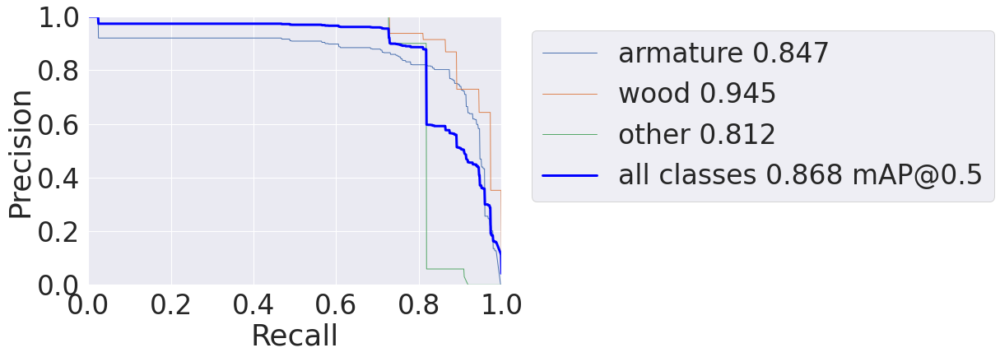

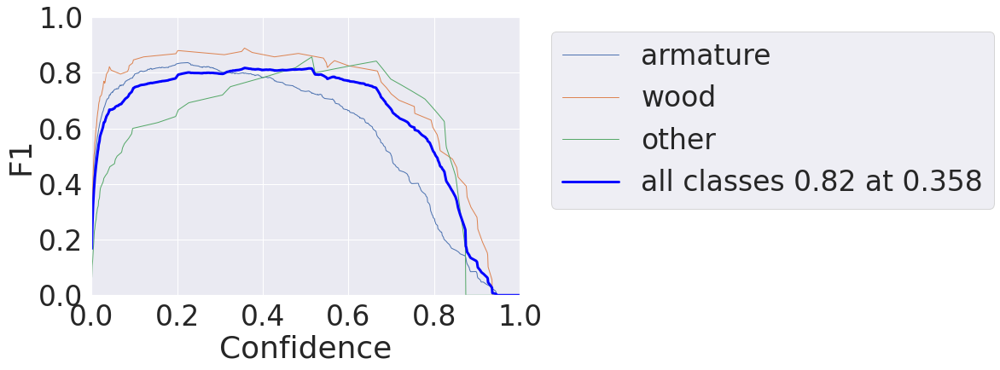

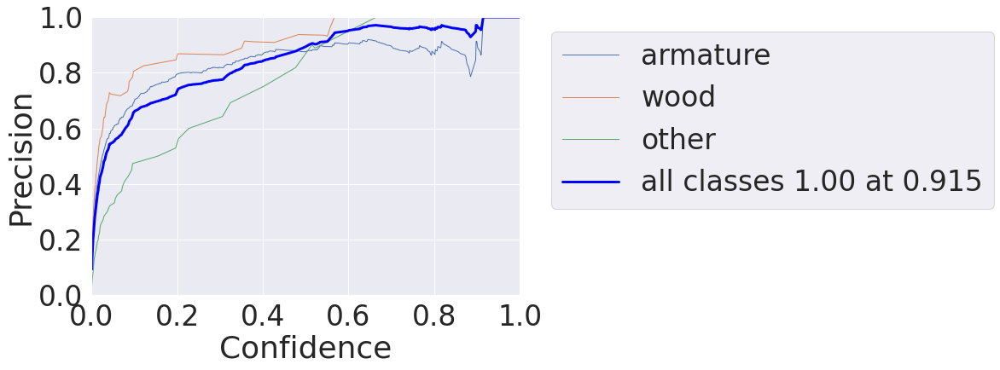

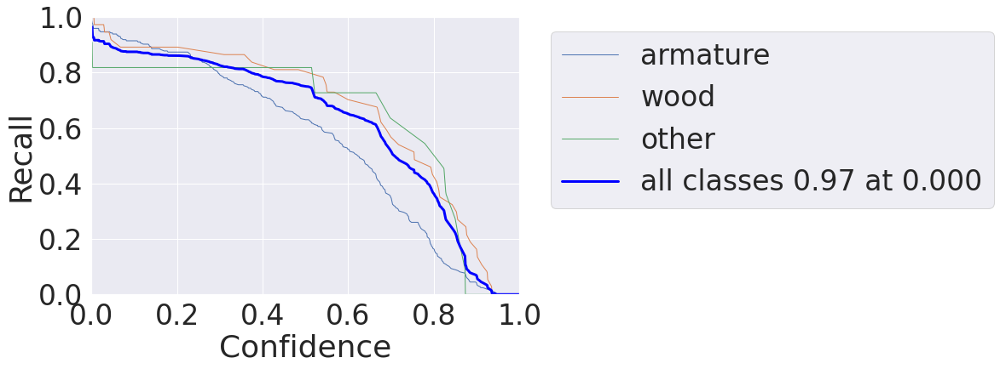

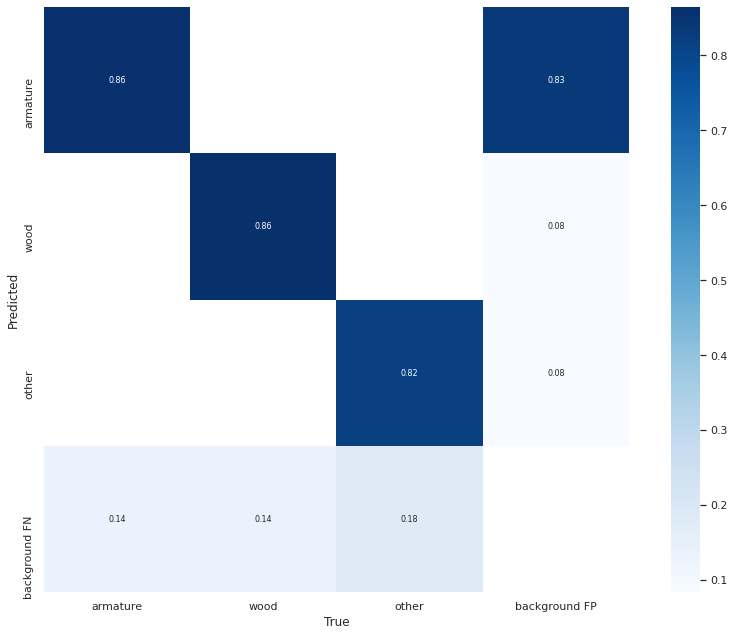

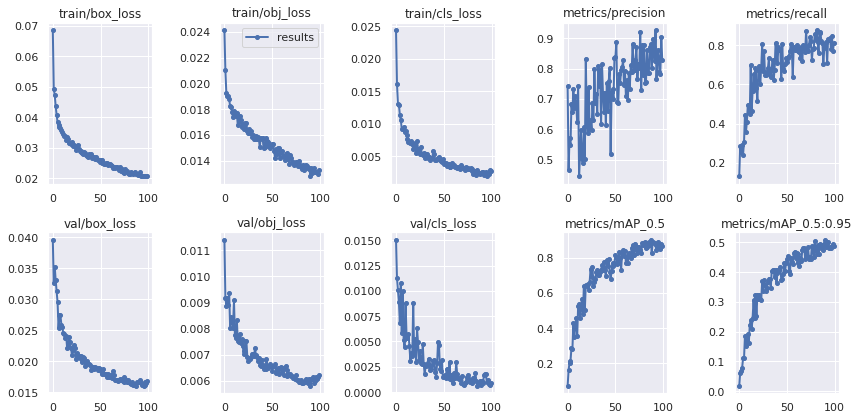

In [95]:
%run ./yolov5/train.py --img 640 --batch 4 --epochs 100 --data yolo_data.yaml --weights yolov5s.pt

<a id='section3'></a>
# 3. Objects detection

In [99]:
%%time
# let's predict test
!python ./yolov5/detect.py --weights ./runs/train/exp9/weights/best.pt --img 640 --conf 0.3 \
    --source ./yolo_data/test/images --max-det 5 --save-txt

detect: weights=['./runs/train/exp9/weights/best.pt'], source=./yolo_data/test/images, imgsz=640, conf_thres=0.3, iou_thres=0.45, max_det=5, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
requirements: /home/borisfox/ds/nornikel/requirements.txt not found, check failed.
YOLOv5 🚀 v5.0-321-g5d66e48 torch 1.7.1 CUDA:0 (GeForce RTX 2060 SUPER, 7981.0MB)

Fusing layers... 
Model Summary: 224 layers, 7059304 parameters, 0 gradients
image 1/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0000Date_01_08_2019.jpg: 640x640 1 armature, Done. (0.016s)
image 2/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0029Date_01_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 3/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0049Date_01_08_2019.jpg: 640x64

image 63/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0508Date_02_08_2019.jpg: 640x640 2 woods, Done. (0.016s)
image 64/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0511Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 65/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0513Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 66/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0514Date_02_08_2019.jpg: 640x640 Done. (0.015s)
image 67/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0517Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 68/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0519Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 69/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0521Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 70/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0527Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 71/1535 /home/borisfox/ds

image 132/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/0989Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 133/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10005Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 134/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10007Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 135/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10008Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 136/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10011Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 137/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10021Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 138/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10022Date_05_08_2019.jpg: 640x640 2 armatures, Done. (0.016s)
image 139/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10024Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)


image 198/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10856Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.016s)
image 199/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10857Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 200/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10859Date_05_08_2019.jpg: 640x640 2 woods, Done. (0.015s)
image 201/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10911Date_05_08_2019.jpg: 640x640 1 wood, Done. (0.016s)
image 202/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10926Date_05_08_2019.jpg: 640x640 1 wood, Done. (0.014s)
image 203/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1092Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 204/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10968Date_05_08_2019.jpg: 640x640 1 wood, Done. (0.016s)
image 205/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/10969Date_05_08_2019.jpg: 640x640 1 wood, Done. (0.015s)
image 206/1535 /home

image 266/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1175Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 267/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/11761Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 268/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/11787Date_05_08_2019.jpg: 640x640 1 wood, Done. (0.015s)
image 269/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/11797Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 270/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1179Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 271/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/11808Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 272/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/11828Date_05_08_2019.jpg: 640x640 Done. (0.014s)
image 273/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1183Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 274/1535 /hom

image 332/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1251Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 333/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12529Date_05_08_2019.jpg: 640x640 2 woods, Done. (0.014s)
image 334/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1252Date_02_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
image 335/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12535Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 336/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12537Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 337/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12539Date_05_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
image 338/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12540Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 339/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12546Date_05_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
ima

image 399/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/12992Date_06_08_2019.jpg: 640x640 1 armature, 1 wood, Done. (0.016s)
image 400/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1300Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 401/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13018Date_06_08_2019.jpg: 640x640 1 wood, Done. (0.015s)
image 402/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1301Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.016s)
image 403/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13026Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 404/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13027Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 405/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13035Date_06_08_2019.jpg: 640x640 1 armature, 3 woods, Done. (0.016s)
image 406/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13054Date_06_08_2019.jpg: 640x640 1 armature, Done

image 465/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13686Date_06_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
image 466/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13699Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.016s)
image 467/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13704Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 468/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13733Date_06_08_2019.jpg: 640x640 1 wood, Done. (0.018s)
image 469/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13736Date_06_08_2019.jpg: 640x640 1 other, Done. (0.019s)
image 470/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13752Date_06_08_2019.jpg: 640x640 1 wood, 1 other, Done. (0.019s)
image 471/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13753Date_06_08_2019.jpg: 640x640 1 wood, Done. (0.020s)
image 472/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/13758Date_06_08_2019.jpg: 640x640 1 armature, 1 wood, Done. (0.020

image 533/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14320Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 534/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14327Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 535/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14333Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 536/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14367Date_06_08_2019.jpg: 640x640 3 armatures, Done. (0.015s)
image 537/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14405Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 538/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14429Date_06_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 539/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14435Date_06_08_2019.jpg: 640x640 2 woods, Done. (0.015s)
image 540/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/14452Date_06_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
i

image 600/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1596Date_02_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
image 601/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1603Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 602/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1608Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 603/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1708Date_02_08_2019.jpg: 640x640 1 wood, Done. (0.020s)
image 604/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1719Date_02_08_2019.jpg: 640x640 1 other, Done. (0.020s)
image 605/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1732Date_02_08_2019.jpg: 640x640 2 armatures, Done. (0.020s)
image 606/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1748Date_02_08_2019.jpg: 640x640 2 armatures, Done. (0.023s)
image 607/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/1765Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.021s)
image 608/15

image 669/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2500Date_02_08_2019.jpg: 640x640 1 wood, Done. (0.016s)
image 670/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2502Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 671/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2503Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 672/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2525Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.017s)
image 673/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2527Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.017s)
image 674/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2528Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.017s)
image 675/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2558Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.018s)
image 676/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/2559Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.017s)
image 677/15

image 737/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3060Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.019s)
image 738/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3079Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.020s)
image 739/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3088Date_02_08_2019.jpg: 640x640 Done. (0.020s)
image 740/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3099Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.022s)
image 741/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3104Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.018s)
image 742/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3112Date_02_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
image 743/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3114Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 744/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3115Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 745/1535 /hom

image 805/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32565Date_13_08_2019.jpg: 640x640 1 armature, Done. (0.017s)
image 806/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32568Date_13_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 807/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32600Date_13_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 808/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32609Date_13_08_2019.jpg: 640x640 1 wood, Done. (0.017s)
image 809/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3261Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 810/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32632Date_13_08_2019.jpg: 640x640 1 other, Done. (0.015s)
image 811/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32646Date_13_08_2019.jpg: 640x640 1 wood, Done. (0.015s)
image 812/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/32703Date_13_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 813/15

image 872/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33706Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 873/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33741Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 874/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33809Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 875/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3380Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 876/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33810Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 877/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33839Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 878/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33840Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 879/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/33841Date_14_08_2019.jpg: 640x640 2 armatures, Done. (0.014s)


image 939/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/35005Date_14_08_2019.jpg: 640x640 Done. (0.013s)
image 940/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3501Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 941/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/35028Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 942/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/35049Date_14_08_2019.jpg: 640x640 2 armatures, Done. (0.015s)
image 943/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/35063Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.029s)
image 944/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3506Date_02_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 945/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/35073Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 946/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/35080Date_14_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 947/153

image 1006/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/36442Date_15_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1007/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/36471Date_15_08_2019.jpg: 640x640 1 wood, Done. (0.015s)
image 1008/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/36480Date_15_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1009/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3651Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1010/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3653Date_03_08_2019.jpg: 640x640 2 armatures, Done. (0.016s)
image 1011/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/36552Date_15_08_2019.jpg: 640x640 1 armature, 1 wood, Done. (0.014s)
image 1012/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/36617Date_15_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1013/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/36623Date_15_08_2019.jpg: 640x640 1 wood, Done. (0

image 1072/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3903Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1073/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3906Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1074/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3915Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.016s)
image 1075/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3919Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1076/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3926Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1077/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3932Date_03_08_2019.jpg: 640x640 3 armatures, Done. (0.016s)
image 1078/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3940Date_03_08_2019.jpg: 640x640 3 armatures, Done. (0.015s)
image 1079/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/3951Date_03_08_2019.jpg: 640x640 1 wood, Done. (0.014s)
im

image 1139/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4666Date_03_08_2019.jpg: 640x640 Done. (0.013s)
image 1140/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4686Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1141/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4691Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1142/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4698Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1143/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4717Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1144/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4761Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1145/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4763Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1146/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/4774Date_03_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1147/1

image 1206/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5884Date_03_08_2019.jpg: 640x640 1 other, Done. (0.014s)
image 1207/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5895Date_03_08_2019.jpg: 640x640 2 armatures, 1 wood, Done. (0.015s)
image 1208/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5896Date_03_08_2019.jpg: 640x640 2 armatures, 1 wood, Done. (0.015s)
image 1209/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5919Date_03_08_2019.jpg: 640x640 1 wood, Done. (0.014s)
image 1210/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5928Date_03_08_2019.jpg: 640x640 1 wood, Done. (0.014s)
image 1211/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5985Date_03_08_2019.jpg: 640x640 2 woods, Done. (0.015s)
image 1212/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5988Date_03_08_2019.jpg: 640x640 1 armature, 2 woods, Done. (0.014s)
image 1213/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/5991Date_03_08_2019.jpg: 640x640 1 wood, Done. 

image 1273/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6773Date_04_08_2019.jpg: 640x640 2 armatures, 1 wood, Done. (0.015s)
image 1274/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6784Date_04_08_2019.jpg: 640x640 2 armatures, Done. (0.014s)
image 1275/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6785Date_04_08_2019.jpg: 640x640 2 armatures, Done. (0.014s)
image 1276/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6803Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1277/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6826Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1278/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6849Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1279/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6851Date_04_08_2019.jpg: 640x640 1 wood, Done. (0.015s)
image 1280/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/6884Date_04_08_2019.jpg: 640x640 1 armature, Done. (0

image 1340/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7863Date_04_08_2019.jpg: 640x640 1 other, Done. (0.014s)
image 1341/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7904Date_04_08_2019.jpg: 640x640 2 woods, Done. (0.014s)
image 1342/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7919Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1343/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7921Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1344/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7926Date_04_08_2019.jpg: 640x640 1 other, Done. (0.014s)
image 1345/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7956Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1346/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7969Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1347/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/7986Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 134

image 1406/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8535Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1407/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8564Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1408/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8566Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1409/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8570Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1410/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8571Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1411/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8580Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1412/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8581Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1413/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/8589Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)


image 1474/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9462Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1475/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9473Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1476/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9487Date_04_08_2019.jpg: 640x640 2 armatures, 1 wood, Done. (0.014s)
image 1477/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9488Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1478/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9491Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1479/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9492Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.015s)
image 1480/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9496Date_04_08_2019.jpg: 640x640 1 armature, Done. (0.014s)
image 1481/1535 /home/borisfox/ds/nornikel/yolo_data/test/images/9497Date_04_08_2019.jpg: 640x640 1 armature, Done. 

<a id='section4'></a>
# 4. prepare submission file


In [100]:
def get_pixels_bounding_box(image, x_center, y_center, w, h, label):
    '''
        Convert yolo's coordinates bbox to original pixel coordinate
    '''
    # first convert relation coordinate to pixel coordinate
    x_center_px = x_center * image.shape[0]
    y_center_px = y_center * image.shape[1]
    w_px = w * image.shape[0]
    h_px = h * image.shape[0]
    
    xmin = min(max(x_center_px - w_px/2.,0),YOLO_INPUT)
    xmax = min(max(x_center_px + w_px/2.,0),YOLO_INPUT)
    ymin = min(max(y_center_px - h_px/2.,0),YOLO_INPUT)
    ymax = min(max(y_center_px + h_px/2.,0),YOLO_INPUT)

    # transform coordinate to original size 
    bboxes = [[xmin,ymin,xmax,ymax,label]]
    transformed = resize_image(image, bboxes, ORIGINAL_HEIGHT, ORIGINAL_WIDTH)
    return transformed["bboxes"][0]

def EncodedPixels_string(pixels):
    EncodedPixels_s = ''
    x = 0
    w = 0
    for i in range(len(pixels)):
        if x==0:
            if pixels[i]==1:
                x = i
                w += 1
        else:
            if pixels[i]==1:
                w += 1
            else:
                EncodedPixels_s = EncodedPixels_s + str(x+1) + ' ' + str(w) + ' '
                x = 0
                w = 0
                
    return EncodedPixels_s

def EncodedPixels(data, image_name, class_type, image_shape_x=ORIGINAL_WIDTH, image_shape_y=ORIGINAL_HEIGHT):
    
    data_im = data[(data['image_name']==image_name) & (data['type']==class_type)]
    
    if len(data_im)==0:
        return '1 1'
        
    image_pixels = np.zeros((image_shape_x, image_shape_y))
    
    for k in range(len(data_im)):
        xmin = data_im.iloc[k]['xmin']
        xmax = data_im.iloc[k]['xmax'] + 1
        ymin = data_im.iloc[k]['ymin']
        ymax = data_im.iloc[k]['ymax'] + 1
        image_pixels[xmin:xmax, ymin:ymax]=1

    image_pixels = image_pixels.T.reshape(1, -1)[0]
    EncodedPixels_s = EncodedPixels_string(image_pixels)
    
    return EncodedPixels_s

In [101]:
# prepare submission file
path_to_predicted_images = './runs/detect/exp8/'
test = pd.DataFrame(columns=['image_name','type','xmin','ymin','xmax','ymax'])
files = [f for f in listdir(path_to_predicted_images)]
print('prepare predictions...')
for file in tqdm(files, total=len(files), position=0, leave=True):
    filename, file_extension = os.path.splitext(file)
    
    if file_extension!='.jpg':
        continue
        
    image = np.asarray(Image.open(path_to_predicted_images + file))
    
    file_labels = path_to_predicted_images + 'labels/' + filename + '.txt'
    
    if os.path.exists(file_labels):
        
        with open(file_labels) as fp:
            lines = fp.readlines()
            for line in lines:
                # read line and convert to raw coordinate of bbox
                row = line.split(' ')
                label = int(row[0])
                label_str = get_label(label)
                
                x_center = float(row[1])
                y_center= float(row[2])
                w = float(row[3])
                h = float(row[4])
                
                xmin,ymin,xmax,ymax,_ = get_pixels_bounding_box(image,x_center,y_center,w,h,label)
                xmin = int(xmin)
                ymin = int(ymin)
                xmax = int(xmax)
                ymax = int(ymax)
                
                test.loc[len(test),:] = [file, label_str, xmin, ymin, xmax, ymax]


print('prepare inference file...')
submit = pd.DataFrame(columns=['Image_name_Type','EncodedPixels'])

for file in tqdm(files, total=len(files), position=0, leave=True):
    filename, file_extension = os.path.splitext(file)
    
    if file_extension!='.jpg':
        continue
    
    for cl in ['armature','wood','other']:
        submit.loc[len(submit),:] = [f'{file}_{cl}', EncodedPixels(test,file,cl)]
    
    
submit.to_csv('submition.csv', index=False)

  0%|          | 0/1536 [00:00<?, ?it/s]

prepare predictions...


  0%|          | 1/1536 [00:00<03:39,  7.01it/s]

prepare inference file...


100%|██████████| 1536/1536 [03:51<00:00,  6.64it/s]
